# Deep cortical reinforcement learning: Policy gradients + Q-learning + GAN


In this notebook, we'll build a neural network that can learn to play games through reinforcement learning. More specifically, we'll use Q-learning to train an agent to play a game called [Cart-Pole](https://gym.openai.com/envs/CartPole-v0). In this game, a freely swinging pole is attached to a cart. The cart can move to the left and right, and the goal is to keep the pole upright as long as possible.

![Cart-Pole](assets/cart-pole.jpg)

We can simulate this game using [OpenAI Gym](https://gym.openai.com/). First, let's check out how OpenAI Gym works. Then, we'll get into training an agent to play the Cart-Pole game.

In [1]:
# In this one we should define and detect GPUs for tensorflow
# GPUs or CPU
import tensorflow as tf

# Check TensorFlow Version
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.7.1
Default GPU Device: 


>**Note:** Make sure you have OpenAI Gym cloned into the same directory with this notebook. I've included `gym` as a submodule, so you can run `git submodule --init --recursive` to pull the contents into the `gym` repo.

##### >**Note:** Make sure you have OpenAI Gym cloned. Then run this command `pip install -e gym/[all]`.

In [2]:
import gym

## Create the Cart-Pole game environment
env = gym.make('CartPole-v0')
env = gym.make('CartPole-v1')
# env = gym.make('Acrobot-v1')
# env = gym.make('MountainCar-v0')
# env = gym.make('MountainCarContinuous-v0')
# env = gym.make('Pendulum-v0')
# env = gym.make('Blackjack-v0')
# env = gym.make('FrozenLake-v0')
# env = gym.make('AirRaid-ram-v0')
# env = gym.make('AirRaid-v0')
# env = gym.make('BipedalWalker-v2')
# env = gym.make('Copy-v0')
# env = gym.make('CarRacing-v0')
# env = gym.make('Ant-v2') #mujoco
# env = gym.make('FetchPickAndPlace-v1') # mujoco required!

WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.
WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.


/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/gym/__init__.py:22: UserWarning: DEPRECATION WARNING: to improve load times, gym no longer automatically loads gym.spaces. Please run "import gym.spaces" to load gym.spaces on your own. This warning will turn into an error in a future version of gym.
  warnings.warn('DEPRECATION WARNING: to improve load times, gym no longer automatically loads gym.spaces. Please run "import gym.spaces" to load gym.spaces on your own. This warning will turn into an error in a future version of gym.')


We interact with the simulation through `env`. To show the simulation running, you can use `env.render()` to render one frame. Passing in an action as an integer to `env.step` will generate the next step in the simulation.  You can see how many actions are possible from `env.action_space` and to get a random action you can use `env.action_space.sample()`. This is general to all Gym games. In the Cart-Pole game, there are two possible actions, moving the cart left or right. So there are two actions we can take, encoded as 0 and 1.

Run the code below to watch the simulation run.

In [3]:
env.reset()
batch = []
for _ in range(1111):
    #env.render()
    action = env.action_space.sample()
    state, reward, done, info = env.step(action) # take a random action
    batch.append([action, state, reward, done, info])
    #print('state, action, reward, done, info:', state, action, reward, done, info)
    if done:
        env.reset()

To shut the window showing the simulation, use `env.close()`.

In [4]:
# env.close()

If you ran the simulation above, we can look at the rewards:

In [5]:
batch[0], 
batch[0][1].shape, state.shape

((4,), (4,))

In [6]:
import numpy as np
actions = np.array([each[0] for each in batch])
states = np.array([each[1] for each in batch])
rewards = np.array([each[2] for each in batch])
dones = np.array([each[3] for each in batch])
infos = np.array([each[4] for each in batch])

In [7]:
# print(rewards[-20:])
print('shapes:', np.array(rewards).shape, np.array(states).shape, np.array(actions).shape, np.array(dones).shape)
print('dtypes:', np.array(rewards).dtype, np.array(states).dtype, np.array(actions).dtype, np.array(dones).dtype)
print('states:', np.max(np.array(states)), np.min(np.array(states)))
print('actions:', np.max(np.array(actions)), np.min(np.array(actions)))
# print((np.max(np.array(actions)) - np.min(np.array(actions)))+1)
print('rewards:', np.max(np.array(rewards)), np.min(np.array(rewards)))

shapes: (1111,) (1111, 4) (1111,) (1111,)
dtypes: float64 float64 int64 bool
states: 2.6154952320994935 -2.6473015260792745
actions: 1 0
rewards: 1.0 1.0


In [8]:
actions[:10]

array([0, 1, 1, 0, 1, 1, 1, 1, 1, 1])

In [9]:
rewards[:10]

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [10]:
# import numpy as np
def sigmoid(x, derivative=False):
  return x*(1-x) if derivative else 1/(1+np.exp(-x))

In [11]:
sigmoid(np.max(np.array(rewards))), sigmoid(np.min(np.array(rewards)))

(0.7310585786300049, 0.7310585786300049)

In [12]:
print('rewards:', np.max(np.array(rewards))/100, np.min(np.array(rewards))/100)

rewards: 0.01 0.01


The game resets after the pole has fallen past a certain angle. For each frame while the simulation is running, it returns a reward of 1.0. The longer the game runs, the more reward we get. Then, our network's goal is to maximize the reward by keeping the pole vertical. It will do this by moving the cart to the left and the right.

## Q-Network

We train our Q-learning agent using the Bellman Equation:

$$
Q(s, a) = r + \gamma \max{Q(s', a')}
$$

where $s$ is a state, $a$ is an action, and $s'$ is the next state from state $s$ and action $a$.

Before we used this equation to learn values for a Q-_table_. However, for this game there are a huge number of states available. The state has four values: the position and velocity of the cart, and the position and velocity of the pole. These are all real-valued numbers, so ignoring floating point precisions, you practically have infinite states. Instead of using a table then, we'll replace it with a neural network that will approximate the Q-table lookup function.

<img src="assets/deep-q-learning.png" width=450px>

Now, our Q value, $Q(s, a)$ is calculated by passing in a state to the network. The output will be Q-values for each available action, with fully connected hidden layers.

<img src="assets/q-network.png" width=550px>


As I showed before, we can define our targets for training as $\hat{Q}(s,a) = r + \gamma \max{Q(s', a')}$. Then we update the weights by minimizing $(\hat{Q}(s,a) - Q(s,a))^2$. 

For this Cart-Pole game, we have four inputs, one for each value in the state, and two outputs, one for each action. To get $\hat{Q}$, we'll first choose an action, then simulate the game using that action. This will get us the next state, $s'$, and the reward. With that, we can calculate $\hat{Q}$ then pass it back into the $Q$ network to run the optimizer and update the weights.

Below is my implementation of the Q-network. I used two fully connected layers with ReLU activations. Two seems to be good enough, three might be better. Feel free to try it out.

In [13]:
# Data of the model
def model_input(state_size):
    states = tf.placeholder(tf.float32, [None, state_size], name='states')
    actions = tf.placeholder(tf.int32, [None], name='actions')
    targetQs = tf.placeholder(tf.float32, [None], name='targetQs')
    reward = tf.placeholder(tf.float32, [], name='reward')
    return states, actions, targetQs, reward

In [14]:
# How to use batch-norm
#   x_norm = tf.layers.batch_normalization(x, training=training)

#   # ...

#   update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
#   with tf.control_dependencies(update_ops):
#     train_op = optimizer.minimize(loss)

In [15]:
# training: Either a Python boolean, or a TensorFlow boolean scalar tensor (e.g. a placeholder). 
# Whether to return the output in: 
# training mode (normalized with statistics of the current batch) or 
# inference mode (normalized with moving statistics). 
# NOTE: make sure to set this parameter correctly, or else your training/inference will not work properly.

In [16]:
# Generator/Controller: Generating/prediting the actions
def generator(states, action_size, hidden_size, reuse=False, alpha=0.1, training=False):
    with tf.variable_scope('generator', reuse=reuse):
        # First fully connected layer
        h1 = tf.layers.dense(inputs=states, units=hidden_size)
        bn1 = tf.layers.batch_normalization(h1, training=training)        
        nl1 = tf.maximum(alpha * bn1, bn1)
        
        # Second fully connected layer
        h2 = tf.layers.dense(inputs=nl1, units=hidden_size)
        bn2 = tf.layers.batch_normalization(h2, training=training)        
        nl2 = tf.maximum(alpha * bn2, bn2)
        
        # Output layer
        logits = tf.layers.dense(inputs=nl2, units=action_size)        
        #predictions = tf.nn.softmax(logits)

        # return actions logits
        return logits

In [17]:
# Discriminator/Dopamine: Reward function/planner/naviator/advisor/supervisor/cortical columns
def discriminator(states, actions, hidden_size, reuse=False, alpha=0.1, training=False):
    with tf.variable_scope('discriminator', reuse=reuse):
        # Fusion/merge states and actions/ SA/ SM
        x_fused = tf.concat(axis=1, values=[states, actions])
        
        # First fully connected layer
        h1 = tf.layers.dense(inputs=x_fused, units=hidden_size)
        bn1 = tf.layers.batch_normalization(h1, training=training)        
        nl1 = tf.maximum(alpha * bn1, bn1)
        
        # Second fully connected layer
        h2 = tf.layers.dense(inputs=nl1, units=hidden_size)
        bn2 = tf.layers.batch_normalization(h2, training=training)        
        nl2 = tf.maximum(alpha * bn2, bn2)
        
        # Output layer
        logits = tf.layers.dense(inputs=nl2, units=1)        
        #predictions = tf.nn.softmax(logits)

        # return rewards logits
        return logits

In [18]:
def model_loss(action_size, hidden_size, states, actions, targetQs, reward):
    # G
    actions_logits = generator(states=states, hidden_size=hidden_size, action_size=action_size)
    actions_labels = tf.one_hot(indices=actions, depth=action_size, dtype=actions_logits.dtype)
    neg_log_prob_actions = tf.nn.softmax_cross_entropy_with_logits_v2(logits=actions_logits, 
                                                                      labels=actions_labels)
    rewards = reward * tf.ones_like(targetQs)
    Qs_labels = targetQs[1:]
    #Qs_labels = rewards[:-1] + (0.99*targetQs[1:])
    #Qs_labels = tf.concat(axis=0, values=[Qs_labels, tf.zeros([1])])
    #g_loss = tf.reduce_mean(neg_log_prob_actions * Qs_labels)
    g_loss = tf.reduce_mean(neg_log_prob_actions[:-1] * Qs_labels)
    
    # D
    Qs_logits = discriminator(actions=actions_logits, hidden_size=hidden_size, states=states)
    d_lossR = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=tf.reshape(Qs_logits, [-1]),
                                                                     labels=rewards))
    # d_lossQ = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=tf.reshape(Qs_logits, [-1]),
    #                                                                  labels=tf.nn.sigmoid(Qs_labels)))
    d_lossQ = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=tf.reshape(Qs_logits[:-1], [-1]),
                                                                     labels=tf.nn.sigmoid(Qs_labels)))
    d_loss = d_lossR + d_lossQ

    return actions_logits, Qs_logits, g_loss, d_loss, d_lossR, d_lossQ

In [19]:
# Optimizating/training/learning G & D
def model_opt(g_loss, d_loss, learning_rate):
    """
    Get optimization operations in order
    :param g_loss: Generator loss Tensor for action prediction
    :param d_loss: Discriminator loss Tensor for reward prediction for generated/prob/logits action
    :param learning_rate: Learning Rate Placeholder
    :return: A tuple of (qfunction training, generator training, discriminator training)
    """
    # Get weights and bias to update
    t_vars = tf.trainable_variables()
    g_vars = [var for var in t_vars if var.name.startswith('generator')]
    d_vars = [var for var in t_vars if var.name.startswith('discriminator')]

    # Optimize
    with tf.control_dependencies(tf.get_collection(tf.GraphKeys.UPDATE_OPS)): # Required for batchnorm (BN)
        g_opt = tf.train.AdamOptimizer(learning_rate).minimize(g_loss, var_list=g_vars)
        d_opt = tf.train.AdamOptimizer(learning_rate).minimize(d_loss, var_list=d_vars)

    return g_opt, d_opt

In [20]:
class Model:
    def __init__(self, state_size, action_size, hidden_size, learning_rate):

        # Data of the Model: make the data available inside the framework
        self.states, self.actions, self.targetQs, self.reward = model_input(state_size=state_size)

        # Create the Model: calculating the loss and forwad pass
        self.actions_logits, self.Qs_logits, self.g_loss, self.d_loss, self.d_lossR, self.d_lossQ = model_loss(
            action_size=action_size, hidden_size=hidden_size, # model init parameters
            states=self.states, actions=self.actions, # model input
            targetQs=self.targetQs, reward=self.reward) # model input
        
        # Update the model: backward pass and backprop
        self.g_opt, self.d_opt = model_opt(g_loss=self.g_loss, d_loss=self.d_loss, learning_rate=learning_rate)

## Hyperparameters

One of the more difficult aspects of reinforcememt learning are the large number of hyperparameters. Not only are we tuning the network, but we're tuning the simulation.

In [21]:
print('state size:{}'.format(states.shape), 
      'actions:{}'.format(actions.shape)) 
print('action size:{}'.format(np.max(actions) - np.min(actions)+1))

state size:(1111, 4) actions:(1111,)
action size:2


In [22]:
# Training parameters
# Network parameters
state_size = 4               # number of units for the input state/observation -- simulation
action_size = 2              # number of units for the output actions -- simulation
hidden_size = 64             # number of units in each Q-network hidden layer -- simulation
learning_rate = 0.001          # learning rate for adam

In [23]:
# Reset/init the graph/session
graph = tf.reset_default_graph()

# Init the model
model = Model(action_size=action_size, hidden_size=hidden_size, state_size=state_size, learning_rate=learning_rate)

## Training the model

Below we'll train our agent. If you want to watch it train, uncomment the `env.render()` line. This is slow because it's rendering the frames slower than the network can train. But, it's cool to watch the agent get better at the game.

In [24]:
# import gym

# ## Create the Cart-Pole game environment
# env = gym.make('CartPole-v0')
# env = gym.make('CartPole-v1')
# env = gym.make('Acrobot-v1')
# # env = gym.make('MountainCar-v0')
# # env = gym.make('Pendulum-v0')
# # env = gym.make('Blackjack-v0')
# # env = gym.make('FrozenLake-v0')
# # env = gym.make('AirRaid-ram-v0')
# # env = gym.make('AirRaid-v0')
# # env = gym.make('BipedalWalker-v2')
# # env = gym.make('Copy-v0')
# # env = gym.make('CarRacing-v0')
# # env = gym.make('Ant-v2') #mujoco
# # env = gym.make('FetchPickAndPlace-v1') # mujoco required!

In [34]:
from collections import deque
episodes_total_reward = deque(maxlen=100) # 100 episodes average/running average/running mean/window
saver = tf.train.Saver()
rewards_list, g_loss_list, d_loss_list = [], [], []
rates_list, d_lossR_list, d_lossQ_list = [], [], []

# TF session for training
with tf.Session(graph=graph) as sess:
    sess.run(tf.global_variables_initializer())
    #saver.restore(sess, 'checkpoints/model.ckpt')    
    #saver.restore(sess, tf.train.latest_checkpoint('checkpoints'))
    
    # Training episodes/epochs
    for ep in range(111111):
        batch = [] # every data batch
        total_reward = 0
        state = env.reset() # env first state

        # Training steps/batches
        while True:
            action_logits, Q_logits = sess.run(fetches=[model.actions_logits, model.Qs_logits], 
                                               feed_dict={model.states: np.reshape(state, [1, -1])})
            action = np.argmax(action_logits)
            batch.append([state, action, Q_logits])
            state, reward, done, _ = env.step(action)
            total_reward += reward
            if done is True: # episode ended success/failure
                episodes_total_reward.append(total_reward) # stopping criteria
                rate = total_reward/ 500 # success is 500 points: 0-1
                break

        # Training using batches
        #batch = memory.buffer
        states = np.array([each[0] for each in batch])
        actions = np.array([each[1] for each in batch])
        targetQs = np.array([each[2] for each in batch])
        g_loss, d_loss, d_lossR, d_lossQ, _, _ = sess.run([model.g_loss, model.d_loss, 
                                                           model.d_lossR, model.d_lossQ, 
                                                           model.g_opt, model.d_opt],
                                                          feed_dict = {model.states: states, 
                                                                       model.actions: actions,
                                                                       model.reward: rate,
                                                                       model.targetQs: targetQs.reshape([-1])})
        # Average 100 episode total reward
        # Print out
        print('Episode:{}'.format(ep),
              'meanR:{:.4f}'.format(np.mean(episodes_total_reward)),
              'rate:{:.4f}'.format(rate),
              'gloss:{:.4f}'.format(g_loss),
              'dloss:{:.4f}'.format(d_loss),
              'dlossR:{:.4f}'.format(d_lossR),
              'dlossQ:{:.4f}'.format(d_lossQ))
        # Ploting out
        rewards_list.append([ep, np.mean(episodes_total_reward)])
        rates_list.append([ep, rate])
        g_loss_list.append([ep, g_loss])
        d_loss_list.append([ep, d_loss])
        d_lossR_list.append([ep, d_lossR])
        d_lossQ_list.append([ep, d_lossQ])
        # Break episode/epoch loop
        if np.mean(episodes_total_reward) >= 500:
            break
            
    # At the end of all training episodes/epochs
    saver.save(sess, 'checkpoints/model3.ckpt')

Episode:0 meanR:9.0000 rate:0.0180 gloss:-0.1899 dloss:1.2534 dlossR:0.5739 dlossQ:0.6794
Episode:1 meanR:9.5000 rate:0.0200 gloss:-0.2207 dloss:1.2379 dlossR:0.5616 dlossQ:0.6764
Episode:2 meanR:9.3333 rate:0.0180 gloss:-0.2443 dloss:1.2275 dlossR:0.5532 dlossQ:0.6743
Episode:3 meanR:13.0000 rate:0.0480 gloss:-0.1182 dloss:1.3110 dlossR:0.6220 dlossQ:0.6890
Episode:4 meanR:17.4000 rate:0.0700 gloss:-0.1313 dloss:1.3046 dlossR:0.6165 dlossQ:0.6881
Episode:5 meanR:22.1667 rate:0.0920 gloss:-0.1557 dloss:1.2934 dlossR:0.6078 dlossQ:0.6857
Episode:6 meanR:26.0000 rate:0.0980 gloss:-0.1721 dloss:1.2848 dlossR:0.6009 dlossQ:0.6839
Episode:7 meanR:37.5000 rate:0.2360 gloss:-0.1786 dloss:1.3166 dlossR:0.6339 dlossQ:0.6827
Episode:8 meanR:44.7778 rate:0.2060 gloss:-0.1501 dloss:1.3202 dlossR:0.6334 dlossQ:0.6868
Episode:9 meanR:52.2000 rate:0.2380 gloss:-0.1779 dloss:1.3164 dlossR:0.6321 dlossQ:0.6843
Episode:10 meanR:51.5455 rate:0.0900 gloss:-0.1750 dloss:1.2801 dlossR:0.5954 dlossQ:0.6847
E

Episode:102 meanR:56.8300 rate:0.0660 gloss:-1.7073 dloss:0.5592 dlossR:0.2628 dlossQ:0.2963
Episode:103 meanR:57.3300 rate:0.1480 gloss:-1.4854 dloss:0.7760 dlossR:0.4361 dlossQ:0.3400
Episode:104 meanR:57.5000 rate:0.1040 gloss:-1.5475 dloss:0.6684 dlossR:0.3432 dlossQ:0.3252
Episode:105 meanR:57.4900 rate:0.0900 gloss:-1.5186 dloss:0.6388 dlossR:0.3097 dlossQ:0.3290
Episode:106 meanR:57.1900 rate:0.0380 gloss:-1.3468 dloss:0.5752 dlossR:0.2046 dlossQ:0.3705
Episode:107 meanR:56.2500 rate:0.0480 gloss:-1.3619 dloss:0.5882 dlossR:0.2228 dlossQ:0.3655
Episode:108 meanR:55.4300 rate:0.0420 gloss:-1.3899 dloss:0.5673 dlossR:0.2084 dlossQ:0.3589
Episode:109 meanR:54.4900 rate:0.0500 gloss:-1.4197 dloss:0.5718 dlossR:0.2220 dlossQ:0.3498
Episode:110 meanR:54.2300 rate:0.0380 gloss:-1.4666 dloss:0.5304 dlossR:0.1928 dlossQ:0.3377
Episode:111 meanR:53.4100 rate:0.0260 gloss:-1.6345 dloss:0.4419 dlossR:0.1520 dlossQ:0.2899
Episode:112 meanR:53.0900 rate:0.0280 gloss:-1.7698 dloss:0.4046 dloss

Episode:192 meanR:34.5100 rate:0.1080 gloss:-1.7732 dloss:0.6282 dlossR:0.3591 dlossQ:0.2690
Episode:193 meanR:34.6600 rate:0.0580 gloss:-1.7439 dloss:0.5058 dlossR:0.2305 dlossQ:0.2752
Episode:194 meanR:34.6500 rate:0.0300 gloss:-1.7044 dloss:0.4406 dlossR:0.1601 dlossQ:0.2805
Episode:195 meanR:34.8600 rate:0.0680 gloss:-1.7454 dloss:0.5419 dlossR:0.2598 dlossQ:0.2821
Episode:196 meanR:35.5700 rate:0.1720 gloss:-2.1254 dloss:0.7856 dlossR:0.5874 dlossQ:0.1982
Episode:197 meanR:36.2400 rate:0.1620 gloss:-2.0499 dloss:0.7561 dlossR:0.5422 dlossQ:0.2138
Episode:198 meanR:36.7800 rate:0.1340 gloss:-1.7652 dloss:0.6893 dlossR:0.4218 dlossQ:0.2676
Episode:199 meanR:37.0900 rate:0.0820 gloss:-1.7848 dloss:0.5691 dlossR:0.2964 dlossQ:0.2726
Episode:200 meanR:37.3200 rate:0.0660 gloss:-1.9736 dloss:0.5259 dlossR:0.2691 dlossQ:0.2568
Episode:201 meanR:37.6400 rate:0.0840 gloss:-1.8453 dloss:0.5544 dlossR:0.3004 dlossQ:0.2540
Episode:202 meanR:37.5300 rate:0.0440 gloss:-1.5320 dloss:0.5267 dloss

Episode:292 meanR:48.7400 rate:0.0440 gloss:-1.8200 dloss:0.4451 dlossR:0.1897 dlossQ:0.2554
Episode:293 meanR:48.7200 rate:0.0540 gloss:-1.6868 dloss:0.5050 dlossR:0.2192 dlossQ:0.2859
Episode:294 meanR:48.8800 rate:0.0620 gloss:-1.6567 dloss:0.5309 dlossR:0.2388 dlossQ:0.2922
Episode:295 meanR:48.9400 rate:0.0800 gloss:-1.6359 dloss:0.5758 dlossR:0.2805 dlossQ:0.2953
Episode:296 meanR:48.8100 rate:0.1460 gloss:-1.9534 dloss:0.7161 dlossR:0.4799 dlossQ:0.2362
Episode:297 meanR:49.6700 rate:0.3340 gloss:-1.6414 dloss:1.1742 dlossR:0.8837 dlossQ:0.2905
Episode:298 meanR:49.9400 rate:0.1880 gloss:-1.6219 dloss:0.8289 dlossR:0.5336 dlossQ:0.2954
Episode:299 meanR:49.9000 rate:0.0740 gloss:-1.7784 dloss:0.5241 dlossR:0.2650 dlossQ:0.2591
Episode:300 meanR:49.8700 rate:0.0600 gloss:-1.7900 dloss:0.4857 dlossR:0.2291 dlossQ:0.2566
Episode:301 meanR:49.8300 rate:0.0760 gloss:-1.7611 dloss:0.5342 dlossR:0.2702 dlossQ:0.2640
Episode:302 meanR:49.9600 rate:0.0700 gloss:-1.7620 dloss:0.5199 dloss

Episode:383 meanR:40.8100 rate:0.1060 gloss:-1.7577 dloss:0.6223 dlossR:0.3504 dlossQ:0.2719
Episode:384 meanR:40.9800 rate:0.0640 gloss:-1.6441 dloss:0.5451 dlossR:0.2459 dlossQ:0.2991
Episode:385 meanR:41.2200 rate:0.0740 gloss:-1.6883 dloss:0.5576 dlossR:0.2693 dlossQ:0.2883
Episode:386 meanR:41.3700 rate:0.0600 gloss:-1.6367 dloss:0.5371 dlossR:0.2366 dlossQ:0.3006
Episode:387 meanR:41.4200 rate:0.0360 gloss:-1.8465 dloss:0.4200 dlossR:0.1688 dlossQ:0.2512
Episode:388 meanR:41.3700 rate:0.0240 gloss:-2.1718 dloss:0.3051 dlossR:0.1239 dlossQ:0.1813
Episode:389 meanR:41.5200 rate:0.0600 gloss:-1.6512 dloss:0.5289 dlossR:0.2343 dlossQ:0.2946
Episode:390 meanR:41.6800 rate:0.0740 gloss:-1.6740 dloss:0.5564 dlossR:0.2675 dlossQ:0.2888
Episode:391 meanR:41.9400 rate:0.0740 gloss:-1.6320 dloss:0.5630 dlossR:0.2661 dlossQ:0.2970
Episode:392 meanR:41.8300 rate:0.0220 gloss:-2.3020 dloss:0.2886 dlossR:0.1194 dlossQ:0.1692
Episode:393 meanR:41.9400 rate:0.0760 gloss:-1.6355 dloss:0.5657 dloss

Episode:473 meanR:40.5600 rate:0.1260 gloss:-2.0992 dloss:0.6532 dlossR:0.4427 dlossQ:0.2105
Episode:474 meanR:41.2500 rate:0.1640 gloss:-1.5679 dloss:0.7874 dlossR:0.4722 dlossQ:0.3152
Episode:475 meanR:41.7500 rate:0.1240 gloss:-1.5626 dloss:0.6981 dlossR:0.3814 dlossQ:0.3167
Episode:476 meanR:43.2800 rate:0.3380 gloss:-1.6725 dloss:1.2174 dlossR:0.9155 dlossQ:0.3019
Episode:477 meanR:44.1500 rate:0.1960 gloss:-1.3360 dloss:0.9055 dlossR:0.5187 dlossQ:0.3868
Episode:478 meanR:45.1000 rate:0.2120 gloss:-1.5906 dloss:0.9327 dlossR:0.6012 dlossQ:0.3315
Episode:479 meanR:47.2900 rate:0.4700 gloss:-1.2759 dloss:1.4203 dlossR:1.0168 dlossQ:0.4035
Episode:480 meanR:47.6200 rate:0.0880 gloss:-1.8742 dloss:0.6213 dlossR:0.3360 dlossQ:0.2853
Episode:481 meanR:48.3400 rate:0.1640 gloss:-1.2023 dloss:0.8841 dlossR:0.4545 dlossQ:0.4296
Episode:482 meanR:49.0500 rate:0.1620 gloss:-1.2102 dloss:0.8662 dlossR:0.4454 dlossQ:0.4208
Episode:483 meanR:48.8000 rate:0.0560 gloss:-1.2483 dloss:0.6641 dloss

Episode:567 meanR:90.8000 rate:0.0500 gloss:-0.5214 dloss:1.0556 dlossR:0.4299 dlossQ:0.6257
Episode:568 meanR:90.4200 rate:0.0300 gloss:-0.6607 dloss:0.9542 dlossR:0.3628 dlossQ:0.5914
Episode:569 meanR:89.6200 rate:0.0540 gloss:-0.6031 dloss:1.0088 dlossR:0.4026 dlossQ:0.6063
Episode:570 meanR:88.7000 rate:0.0500 gloss:-0.6848 dloss:0.9584 dlossR:0.3751 dlossQ:0.5833
Episode:571 meanR:87.5200 rate:0.0960 gloss:-0.5836 dloss:1.0562 dlossR:0.4454 dlossQ:0.6108
Episode:572 meanR:86.1800 rate:0.0900 gloss:-0.6493 dloss:1.0166 dlossR:0.4237 dlossQ:0.5929
Episode:573 meanR:86.0800 rate:0.1060 gloss:-0.6280 dloss:1.0422 dlossR:0.4423 dlossQ:0.5999
Episode:574 meanR:90.2600 rate:1.0000 gloss:-0.5209 dloss:1.7674 dlossR:1.1386 dlossQ:0.6288
Episode:575 meanR:94.6400 rate:1.0000 gloss:-0.5132 dloss:1.7630 dlossR:1.1316 dlossQ:0.6314
Episode:576 meanR:97.9500 rate:1.0000 gloss:-0.4740 dloss:1.7342 dlossR:1.0942 dlossQ:0.6401
Episode:577 meanR:101.9700 rate:1.0000 gloss:-0.4398 dloss:1.7092 dlos

Episode:655 meanR:120.2600 rate:0.9260 gloss:-1.0275 dloss:2.0645 dlossR:1.5819 dlossQ:0.4826
Episode:656 meanR:119.1400 rate:0.0940 gloss:-1.2222 dloss:0.7607 dlossR:0.3356 dlossQ:0.4252
Episode:657 meanR:118.7700 rate:0.0360 gloss:-1.2025 dloss:0.6749 dlossR:0.2428 dlossQ:0.4321
Episode:658 meanR:118.6100 rate:0.0760 gloss:-1.2171 dloss:0.7427 dlossR:0.3108 dlossQ:0.4318
Episode:659 meanR:117.6000 rate:0.0320 gloss:-1.3010 dloss:0.6274 dlossR:0.2231 dlossQ:0.4042
Episode:660 meanR:117.6600 rate:0.0860 gloss:-1.0810 dloss:0.8068 dlossR:0.3370 dlossQ:0.4698
Episode:661 meanR:117.1900 rate:0.1100 gloss:-1.1740 dloss:0.8097 dlossR:0.3677 dlossQ:0.4420
Episode:662 meanR:121.9400 rate:1.0000 gloss:-0.9451 dloss:2.1044 dlossR:1.5945 dlossQ:0.5100
Episode:663 meanR:126.5000 rate:1.0000 gloss:-0.8043 dloss:1.9863 dlossR:1.4352 dlossQ:0.5510
Episode:664 meanR:131.2800 rate:1.0000 gloss:-0.8883 dloss:2.0611 dlossR:1.5319 dlossQ:0.5292
Episode:665 meanR:132.0400 rate:0.2180 gloss:-1.0307 dloss:1

Episode:744 meanR:79.5100 rate:0.0240 gloss:-2.0273 dloss:0.4097 dlossR:0.1573 dlossQ:0.2524
Episode:745 meanR:79.6200 rate:0.0460 gloss:-1.3834 dloss:0.6258 dlossR:0.2373 dlossQ:0.3885
Episode:746 meanR:80.3700 rate:0.1700 gloss:-1.2510 dloss:0.8803 dlossR:0.4645 dlossQ:0.4158
Episode:747 meanR:80.6900 rate:0.0980 gloss:-1.5818 dloss:0.6493 dlossR:0.3290 dlossQ:0.3203
Episode:748 meanR:80.6600 rate:0.0200 gloss:-2.8359 dloss:0.2666 dlossR:0.1294 dlossQ:0.1371
Episode:749 meanR:80.9600 rate:0.1560 gloss:-1.3794 dloss:0.8211 dlossR:0.4457 dlossQ:0.3753
Episode:750 meanR:79.6700 rate:0.3960 gloss:-1.2257 dloss:1.2829 dlossR:0.8623 dlossQ:0.4205
Episode:751 meanR:78.7700 rate:0.2040 gloss:-1.2809 dloss:0.9247 dlossR:0.5252 dlossQ:0.3995
Episode:752 meanR:78.2500 rate:0.2740 gloss:-1.2029 dloss:1.0670 dlossR:0.6414 dlossQ:0.4256
Episode:753 meanR:78.5700 rate:0.0860 gloss:-1.1784 dloss:0.7531 dlossR:0.3160 dlossQ:0.4371
Episode:754 meanR:76.2000 rate:0.0640 gloss:-1.2655 dloss:0.6800 dloss

Episode:833 meanR:66.6800 rate:0.3200 gloss:-1.2722 dloss:1.1664 dlossR:0.7543 dlossQ:0.4121
Episode:834 meanR:66.7600 rate:0.0420 gloss:-1.7338 dloss:0.5302 dlossR:0.2172 dlossQ:0.3130
Episode:835 meanR:67.3000 rate:0.2000 gloss:-1.5991 dloss:0.9049 dlossR:0.5756 dlossQ:0.3293
Episode:836 meanR:67.2200 rate:0.0740 gloss:-1.2496 dloss:0.7069 dlossR:0.2932 dlossQ:0.4137
Episode:837 meanR:66.9300 rate:0.0320 gloss:-1.3437 dloss:0.5845 dlossR:0.2014 dlossQ:0.3831
Episode:838 meanR:66.9600 rate:0.0280 gloss:-1.4233 dloss:0.5454 dlossR:0.1860 dlossQ:0.3594
Episode:839 meanR:66.9600 rate:0.0200 gloss:-1.5220 dloss:0.4927 dlossR:0.1617 dlossQ:0.3310
Episode:840 meanR:66.5900 rate:0.0240 gloss:-1.6333 dloss:0.4605 dlossR:0.1588 dlossQ:0.3018
Episode:841 meanR:66.6200 rate:0.0240 gloss:-1.3934 dloss:0.5504 dlossR:0.1814 dlossQ:0.3689
Episode:842 meanR:66.3800 rate:0.0760 gloss:-1.1708 dloss:0.7465 dlossR:0.3081 dlossQ:0.4384
Episode:843 meanR:68.7400 rate:0.5240 gloss:-1.3551 dloss:1.5370 dloss

Episode:927 meanR:60.2300 rate:0.0520 gloss:-1.7468 dloss:0.5320 dlossR:0.2349 dlossQ:0.2972
Episode:928 meanR:60.1900 rate:0.1600 gloss:-1.4865 dloss:0.8075 dlossR:0.4623 dlossQ:0.3452
Episode:929 meanR:60.1400 rate:0.0640 gloss:-1.4563 dloss:0.6084 dlossR:0.2569 dlossQ:0.3514
Episode:930 meanR:59.9300 rate:0.0400 gloss:-1.4893 dloss:0.5469 dlossR:0.2046 dlossQ:0.3423
Episode:931 meanR:59.4600 rate:0.1060 gloss:-1.8693 dloss:0.6379 dlossR:0.3705 dlossQ:0.2674
Episode:932 meanR:59.3700 rate:0.0260 gloss:-1.7273 dloss:0.4363 dlossR:0.1554 dlossQ:0.2809
Episode:933 meanR:58.0800 rate:0.0620 gloss:-1.4815 dloss:0.5891 dlossR:0.2480 dlossQ:0.3412
Episode:934 meanR:58.1800 rate:0.0620 gloss:-1.5706 dloss:0.5555 dlossR:0.2417 dlossQ:0.3138
Episode:935 meanR:57.4600 rate:0.0560 gloss:-1.5188 dloss:0.5705 dlossR:0.2362 dlossQ:0.3343
Episode:936 meanR:57.6000 rate:0.1020 gloss:-1.5532 dloss:0.6514 dlossR:0.3323 dlossQ:0.3191
Episode:937 meanR:58.0100 rate:0.1140 gloss:-1.5668 dloss:0.6743 dloss

Episode:1018 meanR:68.3800 rate:0.2360 gloss:-0.9778 dloss:1.0475 dlossR:0.5519 dlossQ:0.4957
Episode:1019 meanR:69.6000 rate:0.2900 gloss:-0.8553 dloss:1.1486 dlossR:0.6144 dlossQ:0.5342
Episode:1020 meanR:74.2200 rate:0.9720 gloss:-0.8345 dloss:1.9748 dlossR:1.4338 dlossQ:0.5409
Episode:1021 meanR:79.0400 rate:1.0000 gloss:-0.9879 dloss:2.1361 dlossR:1.6424 dlossQ:0.4937
Episode:1022 meanR:80.7000 rate:0.3660 gloss:-0.7539 dloss:1.2543 dlossR:0.6897 dlossQ:0.5647
Episode:1023 meanR:85.5200 rate:1.0000 gloss:-0.9178 dloss:2.0782 dlossR:1.5626 dlossQ:0.5156
Episode:1024 meanR:90.3100 rate:1.0000 gloss:-0.8879 dloss:2.0537 dlossR:1.5288 dlossQ:0.5249
Episode:1025 meanR:95.0300 rate:1.0000 gloss:-0.8028 dloss:1.9842 dlossR:1.4333 dlossQ:0.5509
Episode:1026 meanR:97.0700 rate:0.4360 gloss:-0.6141 dloss:1.3368 dlossR:0.7326 dlossQ:0.6042
Episode:1027 meanR:98.7200 rate:0.3820 gloss:-0.5210 dloss:1.3018 dlossR:0.6745 dlossQ:0.6273
Episode:1028 meanR:99.2500 rate:0.2660 gloss:-0.4185 dloss:1

Episode:1105 meanR:94.6200 rate:0.0560 gloss:-1.7520 dloss:0.5118 dlossR:0.2328 dlossQ:0.2790
Episode:1106 meanR:93.8200 rate:0.0240 gloss:-2.0313 dloss:0.3636 dlossR:0.1428 dlossQ:0.2208
Episode:1107 meanR:88.9300 rate:0.0220 gloss:-1.8937 dloss:0.3973 dlossR:0.1471 dlossQ:0.2503
Episode:1108 meanR:88.0100 rate:0.2660 gloss:-1.3206 dloss:1.0494 dlossR:0.6551 dlossQ:0.3944
Episode:1109 meanR:87.6300 rate:0.0460 gloss:-1.6628 dloss:0.5400 dlossR:0.2242 dlossQ:0.3158
Episode:1110 meanR:87.6200 rate:0.0600 gloss:-1.5869 dloss:0.5960 dlossR:0.2603 dlossQ:0.3357
Episode:1111 meanR:84.0200 rate:0.2800 gloss:-1.1916 dloss:1.0835 dlossR:0.6502 dlossQ:0.4333
Episode:1112 meanR:84.7400 rate:0.2100 gloss:-1.1901 dloss:0.9660 dlossR:0.5316 dlossQ:0.4344
Episode:1113 meanR:85.2300 rate:0.1180 gloss:-1.2617 dloss:0.7821 dlossR:0.3708 dlossQ:0.4113
Episode:1114 meanR:85.2300 rate:0.0800 gloss:-1.2384 dloss:0.7253 dlossR:0.3057 dlossQ:0.4196
Episode:1115 meanR:85.6000 rate:0.0920 gloss:-1.3009 dloss:0

Episode:1200 meanR:81.2100 rate:0.1920 gloss:-0.8301 dloss:1.0371 dlossR:0.4946 dlossQ:0.5425
Episode:1201 meanR:82.7700 rate:0.3400 gloss:-0.7784 dloss:1.2240 dlossR:0.6664 dlossQ:0.5576
Episode:1202 meanR:85.8900 rate:0.6560 gloss:-0.7841 dloss:1.5821 dlossR:1.0256 dlossQ:0.5564
Episode:1203 meanR:90.8000 rate:1.0000 gloss:-0.6978 dloss:1.9025 dlossR:1.3192 dlossQ:0.5833
Episode:1204 meanR:92.2300 rate:0.3500 gloss:-0.6378 dloss:1.2584 dlossR:0.6608 dlossQ:0.5977
Episode:1205 meanR:93.5700 rate:0.3240 gloss:-0.6933 dloss:1.2235 dlossR:0.6411 dlossQ:0.5824
Episode:1206 meanR:94.6000 rate:0.2300 gloss:-0.6795 dloss:1.1329 dlossR:0.5465 dlossQ:0.5864
Episode:1207 meanR:94.7900 rate:0.0600 gloss:-0.8665 dloss:0.8706 dlossR:0.3385 dlossQ:0.5321
Episode:1208 meanR:93.9600 rate:0.1000 gloss:-0.8254 dloss:0.9362 dlossR:0.3920 dlossQ:0.5442
Episode:1209 meanR:94.3300 rate:0.1200 gloss:-0.8038 dloss:0.9661 dlossR:0.4147 dlossQ:0.5514
Episode:1210 meanR:94.4100 rate:0.0760 gloss:-0.8565 dloss:0

Episode:1288 meanR:140.8300 rate:0.0300 gloss:-0.9782 dloss:0.7807 dlossR:0.2820 dlossQ:0.4987
Episode:1289 meanR:140.5200 rate:0.0340 gloss:-1.0401 dloss:0.7543 dlossR:0.2755 dlossQ:0.4788
Episode:1290 meanR:140.2300 rate:0.0260 gloss:-1.1605 dloss:0.6841 dlossR:0.2416 dlossQ:0.4425
Episode:1291 meanR:139.8300 rate:0.0240 gloss:-1.2371 dloss:0.6399 dlossR:0.2213 dlossQ:0.4186
Episode:1292 meanR:139.3600 rate:0.0640 gloss:-1.0780 dloss:0.7881 dlossR:0.3163 dlossQ:0.4718
Episode:1293 meanR:139.3200 rate:0.0880 gloss:-1.1207 dloss:0.8162 dlossR:0.3549 dlossQ:0.4613
Episode:1294 meanR:139.4200 rate:0.0460 gloss:-1.0707 dloss:0.7473 dlossR:0.2784 dlossQ:0.4689
Episode:1295 meanR:139.5600 rate:0.0460 gloss:-0.9644 dloss:0.8053 dlossR:0.3016 dlossQ:0.5037
Episode:1296 meanR:139.8500 rate:0.0820 gloss:-0.9323 dloss:0.8705 dlossR:0.3578 dlossQ:0.5127
Episode:1297 meanR:139.9600 rate:0.0460 gloss:-1.2634 dloss:0.6966 dlossR:0.2771 dlossQ:0.4195
Episode:1298 meanR:140.1700 rate:0.0780 gloss:-0.9

Episode:1384 meanR:55.0200 rate:0.0200 gloss:-2.2494 dloss:0.3495 dlossR:0.1411 dlossQ:0.2084
Episode:1385 meanR:55.0800 rate:0.0440 gloss:-2.0163 dloss:0.4426 dlossR:0.2050 dlossQ:0.2377
Episode:1386 meanR:55.0300 rate:0.0240 gloss:-2.1544 dloss:0.3342 dlossR:0.1383 dlossQ:0.1959
Episode:1387 meanR:54.9900 rate:0.0240 gloss:-2.2982 dloss:0.3181 dlossR:0.1391 dlossQ:0.1791
Episode:1388 meanR:54.9400 rate:0.0200 gloss:-2.2019 dloss:0.3174 dlossR:0.1274 dlossQ:0.1900
Episode:1389 meanR:55.0400 rate:0.0540 gloss:-1.6362 dloss:0.5262 dlossR:0.2233 dlossQ:0.3029
Episode:1390 meanR:55.3400 rate:0.0860 gloss:-1.5274 dloss:0.6404 dlossR:0.3035 dlossQ:0.3369
Episode:1391 meanR:57.3200 rate:0.4200 gloss:-1.2752 dloss:1.3337 dlossR:0.9274 dlossQ:0.4063
Episode:1392 meanR:58.5000 rate:0.3000 gloss:-1.1102 dloss:1.1276 dlossR:0.6683 dlossQ:0.4593
Episode:1393 meanR:58.4300 rate:0.0740 gloss:-1.5429 dloss:0.6409 dlossR:0.2921 dlossQ:0.3488
Episode:1394 meanR:58.6500 rate:0.0900 gloss:-1.7478 dloss:0

Episode:1472 meanR:49.0100 rate:0.0600 gloss:-1.2939 dloss:0.6802 dlossR:0.2735 dlossQ:0.4067
Episode:1473 meanR:49.1100 rate:0.0780 gloss:-1.2224 dloss:0.7373 dlossR:0.3111 dlossQ:0.4262
Episode:1474 meanR:51.6100 rate:0.6180 gloss:-1.1521 dloss:1.6512 dlossR:1.2086 dlossQ:0.4426
Episode:1475 meanR:51.3300 rate:0.0240 gloss:-1.8172 dloss:0.4209 dlossR:0.1554 dlossQ:0.2654
Episode:1476 meanR:51.5100 rate:0.0720 gloss:-1.1816 dloss:0.7358 dlossR:0.3005 dlossQ:0.4353
Episode:1477 meanR:51.9100 rate:0.1120 gloss:-1.1616 dloss:0.8093 dlossR:0.3682 dlossQ:0.4411
Episode:1478 meanR:51.8900 rate:0.0260 gloss:-1.4908 dloss:0.5267 dlossR:0.1830 dlossQ:0.3437
Episode:1479 meanR:53.4400 rate:0.3380 gloss:-1.1048 dloss:1.1832 dlossR:0.7273 dlossQ:0.4559
Episode:1480 meanR:55.1800 rate:0.3740 gloss:-1.0894 dloss:1.2429 dlossR:0.7819 dlossQ:0.4610
Episode:1481 meanR:57.0500 rate:0.3980 gloss:-1.0697 dloss:1.2806 dlossR:0.8133 dlossQ:0.4673
Episode:1482 meanR:57.9000 rate:0.1940 gloss:-1.0833 dloss:0

Episode:1564 meanR:65.3900 rate:0.0280 gloss:-1.6594 dloss:0.4584 dlossR:0.1638 dlossQ:0.2946
Episode:1565 meanR:63.6600 rate:0.0220 gloss:-1.7429 dloss:0.4227 dlossR:0.1472 dlossQ:0.2755
Episode:1566 meanR:63.0200 rate:0.0360 gloss:-1.5463 dloss:0.5149 dlossR:0.1889 dlossQ:0.3260
Episode:1567 meanR:62.4500 rate:0.0640 gloss:-1.6253 dloss:0.6233 dlossR:0.2781 dlossQ:0.3452
Episode:1568 meanR:62.0300 rate:0.0360 gloss:-1.8365 dloss:0.5044 dlossR:0.2056 dlossQ:0.2989
Episode:1569 meanR:61.9200 rate:0.0760 gloss:-1.5293 dloss:0.6305 dlossR:0.2894 dlossQ:0.3412
Episode:1570 meanR:61.7900 rate:0.0860 gloss:-1.3914 dloss:0.6683 dlossR:0.3012 dlossQ:0.3670
Episode:1571 meanR:61.1300 rate:0.0220 gloss:-1.7473 dloss:0.4221 dlossR:0.1459 dlossQ:0.2763
Episode:1572 meanR:60.9400 rate:0.0220 gloss:-1.9450 dloss:0.3671 dlossR:0.1355 dlossQ:0.2316
Episode:1573 meanR:60.8400 rate:0.0580 gloss:-1.4394 dloss:0.5957 dlossR:0.2415 dlossQ:0.3542
Episode:1574 meanR:58.1700 rate:0.0840 gloss:-1.4035 dloss:0

Episode:1656 meanR:49.8600 rate:0.0320 gloss:-1.7431 dloss:0.4753 dlossR:0.1844 dlossQ:0.2909
Episode:1657 meanR:49.6300 rate:0.0180 gloss:-2.0668 dloss:0.3405 dlossR:0.1260 dlossQ:0.2145
Episode:1658 meanR:49.4400 rate:0.0240 gloss:-1.9388 dloss:0.3776 dlossR:0.1439 dlossQ:0.2338
Episode:1659 meanR:54.0500 rate:1.0000 gloss:-1.2562 dloss:2.3784 dlossR:1.9679 dlossQ:0.4105
Episode:1660 meanR:56.0900 rate:0.4380 gloss:-1.2552 dloss:1.3590 dlossR:0.9478 dlossQ:0.4112
Episode:1661 meanR:57.7800 rate:0.3720 gloss:-1.1754 dloss:1.2386 dlossR:0.8026 dlossQ:0.4361
Episode:1662 meanR:59.1600 rate:0.3040 gloss:-1.1933 dloss:1.1208 dlossR:0.6911 dlossQ:0.4297
Episode:1663 meanR:60.7200 rate:0.3320 gloss:-1.1351 dloss:1.1718 dlossR:0.7242 dlossQ:0.4476
Episode:1664 meanR:61.5500 rate:0.1940 gloss:-1.1642 dloss:0.9389 dlossR:0.4999 dlossQ:0.4390
Episode:1665 meanR:61.9400 rate:0.1000 gloss:-1.1396 dloss:0.7900 dlossR:0.3437 dlossQ:0.4464
Episode:1666 meanR:62.3000 rate:0.1080 gloss:-1.1521 dloss:0

Episode:1746 meanR:71.4600 rate:0.7080 gloss:-0.9762 dloss:1.7160 dlossR:1.2179 dlossQ:0.4981
Episode:1747 meanR:71.2800 rate:0.2320 gloss:-0.9569 dloss:1.0520 dlossR:0.5472 dlossQ:0.5048
Episode:1748 meanR:70.4900 rate:0.2260 gloss:-0.9070 dloss:1.0580 dlossR:0.5383 dlossQ:0.5197
Episode:1749 meanR:70.1700 rate:0.1700 gloss:-0.9124 dloss:0.9816 dlossR:0.4650 dlossQ:0.5166
Episode:1750 meanR:70.0300 rate:0.0960 gloss:-1.1360 dloss:0.7835 dlossR:0.3371 dlossQ:0.4464
Episode:1751 meanR:69.9800 rate:0.0300 gloss:-1.4667 dloss:0.5369 dlossR:0.1889 dlossQ:0.3480
Episode:1752 meanR:69.7800 rate:0.0300 gloss:-1.4872 dloss:0.5304 dlossR:0.1879 dlossQ:0.3425
Episode:1753 meanR:69.8100 rate:0.0280 gloss:-1.5202 dloss:0.5140 dlossR:0.1811 dlossQ:0.3330
Episode:1754 meanR:69.9500 rate:0.0800 gloss:-1.1420 dloss:0.7556 dlossR:0.3106 dlossQ:0.4450
Episode:1755 meanR:70.2300 rate:0.0760 gloss:-1.0583 dloss:0.7943 dlossR:0.3216 dlossQ:0.4726
Episode:1756 meanR:70.9300 rate:0.1720 gloss:-0.9287 dloss:0

Episode:1838 meanR:87.9600 rate:0.0820 gloss:-1.2911 dloss:0.6996 dlossR:0.3015 dlossQ:0.3980
Episode:1839 meanR:87.9400 rate:0.0700 gloss:-1.3093 dloss:0.6680 dlossR:0.2764 dlossQ:0.3916
Episode:1840 meanR:88.0600 rate:0.0460 gloss:-1.3328 dloss:0.6140 dlossR:0.2293 dlossQ:0.3847
Episode:1841 meanR:87.7600 rate:0.0460 gloss:-1.3433 dloss:0.6108 dlossR:0.2283 dlossQ:0.3824
Episode:1842 meanR:87.8200 rate:0.0420 gloss:-1.4033 dloss:0.5790 dlossR:0.2146 dlossQ:0.3644
Episode:1843 meanR:87.5200 rate:0.0280 gloss:-1.5209 dloss:0.5110 dlossR:0.1785 dlossQ:0.3325
Episode:1844 meanR:87.6100 rate:0.0480 gloss:-1.4102 dloss:0.5878 dlossR:0.2250 dlossQ:0.3627
Episode:1845 meanR:87.4700 rate:0.0460 gloss:-1.3988 dloss:0.5909 dlossR:0.2235 dlossQ:0.3674
Episode:1846 meanR:84.0800 rate:0.0300 gloss:-1.5552 dloss:0.4999 dlossR:0.1774 dlossQ:0.3225
Episode:1847 meanR:83.2000 rate:0.0560 gloss:-1.4715 dloss:0.5798 dlossR:0.2357 dlossQ:0.3441
Episode:1848 meanR:82.4700 rate:0.0800 gloss:-1.4665 dloss:0

Episode:1927 meanR:66.1300 rate:0.1560 gloss:-1.2243 dloss:0.8589 dlossR:0.4388 dlossQ:0.4201
Episode:1928 meanR:66.3600 rate:0.0980 gloss:-1.3196 dloss:0.7204 dlossR:0.3295 dlossQ:0.3909
Episode:1929 meanR:66.3900 rate:0.0980 gloss:-1.3345 dloss:0.7234 dlossR:0.3333 dlossQ:0.3901
Episode:1930 meanR:66.7800 rate:0.0980 gloss:-1.3407 dloss:0.7157 dlossR:0.3310 dlossQ:0.3847
Episode:1931 meanR:64.4000 rate:0.0320 gloss:-1.6352 dloss:0.4800 dlossR:0.1765 dlossQ:0.3035
Episode:1932 meanR:64.4800 rate:0.0320 gloss:-1.5786 dloss:0.4957 dlossR:0.1790 dlossQ:0.3168
Episode:1933 meanR:63.9100 rate:0.0340 gloss:-1.5528 dloss:0.5150 dlossR:0.1880 dlossQ:0.3271
Episode:1934 meanR:64.2700 rate:0.1640 gloss:-1.2065 dloss:0.8768 dlossR:0.4514 dlossQ:0.4254
Episode:1935 meanR:65.6100 rate:0.2880 gloss:-0.9880 dloss:1.1231 dlossR:0.6310 dlossQ:0.4921
Episode:1936 meanR:66.2700 rate:0.1660 gloss:-1.2137 dloss:0.8848 dlossR:0.4594 dlossQ:0.4254
Episode:1937 meanR:66.2500 rate:0.0440 gloss:-1.4615 dloss:0

Episode:2015 meanR:80.4100 rate:0.1360 gloss:-1.2787 dloss:0.8127 dlossR:0.4066 dlossQ:0.4061
Episode:2016 meanR:82.9000 rate:0.6100 gloss:-0.9373 dloss:1.5686 dlossR:1.0613 dlossQ:0.5072
Episode:2017 meanR:84.0000 rate:0.2480 gloss:-0.9676 dloss:1.0676 dlossR:0.5691 dlossQ:0.4984
Episode:2018 meanR:84.5900 rate:0.2140 gloss:-1.0451 dloss:0.9976 dlossR:0.5238 dlossQ:0.4738
Episode:2019 meanR:85.0000 rate:0.2240 gloss:-1.1011 dloss:0.9983 dlossR:0.5423 dlossQ:0.4561
Episode:2020 meanR:84.8100 rate:0.1360 gloss:-1.1454 dloss:0.8426 dlossR:0.4006 dlossQ:0.4420
Episode:2021 meanR:85.1000 rate:0.1200 gloss:-1.2058 dloss:0.7942 dlossR:0.3712 dlossQ:0.4230
Episode:2022 meanR:84.1100 rate:0.0920 gloss:-1.2503 dloss:0.7285 dlossR:0.3194 dlossQ:0.4092
Episode:2023 meanR:83.0100 rate:0.1320 gloss:-1.2808 dloss:0.7918 dlossR:0.3915 dlossQ:0.4004
Episode:2024 meanR:81.3200 rate:0.0780 gloss:-1.3734 dloss:0.6572 dlossR:0.2855 dlossQ:0.3717
Episode:2025 meanR:80.1400 rate:0.0760 gloss:-1.4174 dloss:0

Episode:2105 meanR:56.0000 rate:0.5200 gloss:-1.2215 dloss:1.5042 dlossR:1.0810 dlossQ:0.4233
Episode:2106 meanR:55.9600 rate:0.0660 gloss:-1.6545 dloss:0.5763 dlossR:0.2635 dlossQ:0.3127
Episode:2107 meanR:55.7800 rate:0.0320 gloss:-2.0055 dloss:0.3773 dlossR:0.1576 dlossQ:0.2197
Episode:2108 meanR:55.5900 rate:0.0220 gloss:-2.2634 dloss:0.3009 dlossR:0.1247 dlossQ:0.1762
Episode:2109 meanR:55.7800 rate:0.1100 gloss:-1.5303 dloss:0.6903 dlossR:0.3556 dlossQ:0.3347
Episode:2110 meanR:57.3300 rate:0.3660 gloss:-1.0600 dloss:1.2364 dlossR:0.7666 dlossQ:0.4698
Episode:2111 meanR:58.5000 rate:0.3040 gloss:-1.1246 dloss:1.1310 dlossR:0.6779 dlossQ:0.4531
Episode:2112 meanR:59.3600 rate:0.2160 gloss:-1.1654 dloss:0.9784 dlossR:0.5381 dlossQ:0.4403
Episode:2113 meanR:60.0400 rate:0.1860 gloss:-1.1288 dloss:0.9457 dlossR:0.4942 dlossQ:0.4515
Episode:2114 meanR:59.9200 rate:0.0460 gloss:-1.7445 dloss:0.4722 dlossR:0.1986 dlossQ:0.2735
Episode:2115 meanR:59.4200 rate:0.0360 gloss:-1.8200 dloss:0

Episode:2195 meanR:83.6500 rate:0.1160 gloss:-0.7690 dloss:0.9797 dlossR:0.4196 dlossQ:0.5601
Episode:2196 meanR:84.3700 rate:0.1700 gloss:-0.8027 dloss:1.0237 dlossR:0.4730 dlossQ:0.5507
Episode:2197 meanR:85.9100 rate:0.3300 gloss:-0.7753 dloss:1.2140 dlossR:0.6552 dlossQ:0.5587
Episode:2198 meanR:87.7500 rate:0.3920 gloss:-0.7622 dloss:1.2850 dlossR:0.7214 dlossQ:0.5636
Episode:2199 meanR:88.0900 rate:0.2620 gloss:-0.7802 dloss:1.1375 dlossR:0.5794 dlossQ:0.5580
Episode:2200 meanR:88.8800 rate:0.2320 gloss:-0.8394 dloss:1.0856 dlossR:0.5446 dlossQ:0.5410
Episode:2201 meanR:89.3700 rate:0.1220 gloss:-0.9307 dloss:0.9129 dlossR:0.4002 dlossQ:0.5126
Episode:2202 meanR:89.6500 rate:0.0740 gloss:-1.0000 dloss:0.8159 dlossR:0.3250 dlossQ:0.4908
Episode:2203 meanR:89.6700 rate:0.0220 gloss:-1.4289 dloss:0.5491 dlossR:0.1883 dlossQ:0.3608
Episode:2204 meanR:89.9300 rate:0.1400 gloss:-0.9900 dloss:0.9159 dlossR:0.4212 dlossQ:0.4947
Episode:2205 meanR:87.4800 rate:0.0300 gloss:-1.4971 dloss:0

Episode:2283 meanR:74.7900 rate:0.1320 gloss:-1.1359 dloss:0.8489 dlossR:0.4008 dlossQ:0.4481
Episode:2284 meanR:73.9300 rate:0.1420 gloss:-1.0448 dloss:0.8997 dlossR:0.4228 dlossQ:0.4768
Episode:2285 meanR:74.0500 rate:0.2620 gloss:-0.9877 dloss:1.0888 dlossR:0.5950 dlossQ:0.4937
Episode:2286 meanR:74.2800 rate:0.2120 gloss:-1.0109 dloss:1.0118 dlossR:0.5254 dlossQ:0.4864
Episode:2287 meanR:74.5100 rate:0.2060 gloss:-0.9751 dloss:1.0115 dlossR:0.5143 dlossQ:0.4972
Episode:2288 meanR:75.1300 rate:0.2100 gloss:-1.0043 dloss:1.0087 dlossR:0.5209 dlossQ:0.4878
Episode:2289 meanR:75.5800 rate:0.1280 gloss:-1.2771 dloss:0.7863 dlossR:0.3848 dlossQ:0.4014
Episode:2290 meanR:75.4700 rate:0.0240 gloss:-1.8135 dloss:0.4070 dlossR:0.1475 dlossQ:0.2595
Episode:2291 meanR:75.7300 rate:0.0840 gloss:-1.4468 dloss:0.6588 dlossR:0.3010 dlossQ:0.3578
Episode:2292 meanR:76.4100 rate:0.1680 gloss:-1.1546 dloss:0.8980 dlossR:0.4570 dlossQ:0.4410
Episode:2293 meanR:76.4400 rate:0.0880 gloss:-1.2688 dloss:0

Episode:2372 meanR:55.4900 rate:0.2360 gloss:-1.3815 dloss:0.9778 dlossR:0.6041 dlossQ:0.3737
Episode:2373 meanR:55.7500 rate:0.1300 gloss:-1.3753 dloss:0.7717 dlossR:0.3946 dlossQ:0.3771
Episode:2374 meanR:56.0800 rate:0.1380 gloss:-1.3829 dloss:0.7740 dlossR:0.4050 dlossQ:0.3690
Episode:2375 meanR:56.1100 rate:0.1300 gloss:-1.4952 dloss:0.7300 dlossR:0.3929 dlossQ:0.3370
Episode:2376 meanR:55.7500 rate:0.1080 gloss:-1.5386 dloss:0.6731 dlossR:0.3470 dlossQ:0.3260
Episode:2377 meanR:55.0900 rate:0.0600 gloss:-1.6690 dloss:0.5283 dlossR:0.2360 dlossQ:0.2923
Episode:2378 meanR:54.6300 rate:0.0580 gloss:-1.6799 dloss:0.5225 dlossR:0.2318 dlossQ:0.2907
Episode:2379 meanR:54.4900 rate:0.0500 gloss:-1.7412 dloss:0.4871 dlossR:0.2108 dlossQ:0.2762
Episode:2380 meanR:54.5700 rate:0.0880 gloss:-1.5982 dloss:0.6178 dlossR:0.3047 dlossQ:0.3130
Episode:2381 meanR:55.1800 rate:0.1420 gloss:-1.4717 dloss:0.7647 dlossR:0.4190 dlossQ:0.3457
Episode:2382 meanR:55.5000 rate:0.0880 gloss:-1.6326 dloss:0

Episode:2460 meanR:36.7000 rate:0.0540 gloss:-1.8556 dloss:0.4613 dlossR:0.2152 dlossQ:0.2461
Episode:2461 meanR:36.6800 rate:0.0180 gloss:-2.6360 dloss:0.2392 dlossR:0.1072 dlossQ:0.1320
Episode:2462 meanR:36.6700 rate:0.0300 gloss:-2.2757 dloss:0.3087 dlossR:0.1426 dlossQ:0.1661
Episode:2463 meanR:36.4200 rate:0.0300 gloss:-2.1855 dloss:0.3237 dlossR:0.1430 dlossQ:0.1807
Episode:2464 meanR:36.0900 rate:0.0660 gloss:-1.8776 dloss:0.4920 dlossR:0.2480 dlossQ:0.2440
Episode:2465 meanR:36.2200 rate:0.0560 gloss:-1.8908 dloss:0.4552 dlossR:0.2189 dlossQ:0.2362
Episode:2466 meanR:36.4300 rate:0.0720 gloss:-1.7973 dloss:0.5197 dlossR:0.2617 dlossQ:0.2580
Episode:2467 meanR:37.1900 rate:0.1860 gloss:-1.5781 dloss:0.8351 dlossR:0.5228 dlossQ:0.3122
Episode:2468 meanR:37.6800 rate:0.1440 gloss:-1.5044 dloss:0.7556 dlossR:0.4224 dlossQ:0.3332
Episode:2469 meanR:38.3200 rate:0.1740 gloss:-1.4025 dloss:0.8384 dlossR:0.4771 dlossQ:0.3613
Episode:2470 meanR:38.7400 rate:0.1480 gloss:-1.4891 dloss:0

Episode:2548 meanR:59.0000 rate:0.0580 gloss:-1.3192 dloss:0.6497 dlossR:0.2573 dlossQ:0.3924
Episode:2549 meanR:58.9500 rate:0.0580 gloss:-1.3169 dloss:0.6536 dlossR:0.2593 dlossQ:0.3943
Episode:2550 meanR:59.4400 rate:0.1460 gloss:-1.0825 dloss:0.8889 dlossR:0.4246 dlossQ:0.4643
Episode:2551 meanR:60.3100 rate:0.2100 gloss:-0.8936 dloss:1.0460 dlossR:0.5262 dlossQ:0.5197
Episode:2552 meanR:62.0000 rate:0.3600 gloss:-0.7278 dloss:1.2620 dlossR:0.7016 dlossQ:0.5604
Episode:2553 meanR:62.7100 rate:0.1660 gloss:-1.0085 dloss:0.9440 dlossR:0.4560 dlossQ:0.4881
Episode:2554 meanR:64.0100 rate:0.2840 gloss:-0.8902 dloss:1.1416 dlossR:0.6151 dlossQ:0.5265
Episode:2555 meanR:65.3100 rate:0.2920 gloss:-0.9548 dloss:1.1392 dlossR:0.6332 dlossQ:0.5060
Episode:2556 meanR:65.7000 rate:0.1200 gloss:-0.9564 dloss:0.9073 dlossR:0.4010 dlossQ:0.5063
Episode:2557 meanR:66.0300 rate:0.1800 gloss:-1.0072 dloss:0.9729 dlossR:0.4825 dlossQ:0.4904
Episode:2558 meanR:66.8900 rate:0.2260 gloss:-1.0435 dloss:1

Episode:2640 meanR:73.8300 rate:0.3380 gloss:-1.2052 dloss:1.1768 dlossR:0.7523 dlossQ:0.4244
Episode:2641 meanR:74.1200 rate:0.2440 gloss:-1.2542 dloss:1.0058 dlossR:0.5957 dlossQ:0.4101
Episode:2642 meanR:73.6000 rate:0.0780 gloss:-1.5864 dloss:0.6149 dlossR:0.2886 dlossQ:0.3262
Episode:2643 meanR:73.3400 rate:0.0800 gloss:-1.5624 dloss:0.6184 dlossR:0.2916 dlossQ:0.3268
Episode:2644 meanR:73.1900 rate:0.0840 gloss:-1.6186 dloss:0.6101 dlossR:0.2979 dlossQ:0.3122
Episode:2645 meanR:73.1000 rate:0.0860 gloss:-1.5914 dloss:0.6224 dlossR:0.3029 dlossQ:0.3195
Episode:2646 meanR:73.6100 rate:0.1680 gloss:-1.3189 dloss:0.8547 dlossR:0.4640 dlossQ:0.3907
Episode:2647 meanR:73.8600 rate:0.1040 gloss:-1.3508 dloss:0.7195 dlossR:0.3388 dlossQ:0.3808
Episode:2648 meanR:74.1300 rate:0.1120 gloss:-1.3695 dloss:0.7307 dlossR:0.3554 dlossQ:0.3754
Episode:2649 meanR:74.4400 rate:0.1200 gloss:-1.3904 dloss:0.7392 dlossR:0.3704 dlossQ:0.3688
Episode:2650 meanR:74.1500 rate:0.0880 gloss:-1.6065 dloss:0

Episode:2728 meanR:64.2700 rate:0.4100 gloss:-1.0449 dloss:1.2987 dlossR:0.8225 dlossQ:0.4763
Episode:2729 meanR:63.3200 rate:0.1640 gloss:-1.0984 dloss:0.9129 dlossR:0.4527 dlossQ:0.4602
Episode:2730 meanR:63.9300 rate:0.1800 gloss:-1.1388 dloss:0.9255 dlossR:0.4787 dlossQ:0.4468
Episode:2731 meanR:64.4900 rate:0.1360 gloss:-1.1760 dloss:0.8397 dlossR:0.4062 dlossQ:0.4335
Episode:2732 meanR:64.4700 rate:0.0240 gloss:-1.6354 dloss:0.4690 dlossR:0.1646 dlossQ:0.3044
Episode:2733 meanR:63.9100 rate:0.0220 gloss:-1.7218 dloss:0.4326 dlossR:0.1517 dlossQ:0.2809
Episode:2734 meanR:63.9200 rate:0.0960 gloss:-1.2082 dloss:0.7635 dlossR:0.3370 dlossQ:0.4266
Episode:2735 meanR:64.3600 rate:0.2180 gloss:-1.0278 dloss:1.0193 dlossR:0.5359 dlossQ:0.4835
Episode:2736 meanR:63.9400 rate:0.0220 gloss:-2.0078 dloss:0.3703 dlossR:0.1424 dlossQ:0.2279
Episode:2737 meanR:64.6100 rate:0.2320 gloss:-1.0460 dloss:1.0310 dlossR:0.5550 dlossQ:0.4760
Episode:2738 meanR:65.2500 rate:0.1480 gloss:-0.8795 dloss:0

Episode:2818 meanR:74.8300 rate:0.1980 gloss:-1.1550 dloss:0.9585 dlossR:0.5130 dlossQ:0.4455
Episode:2819 meanR:75.6000 rate:0.2120 gloss:-1.1859 dloss:0.9741 dlossR:0.5385 dlossQ:0.4356
Episode:2820 meanR:75.7800 rate:0.0920 gloss:-1.3598 dloss:0.7169 dlossR:0.3276 dlossQ:0.3893
Episode:2821 meanR:75.1600 rate:0.0180 gloss:-2.3618 dloss:0.3179 dlossR:0.1297 dlossQ:0.1881
Episode:2822 meanR:74.0500 rate:0.0220 gloss:-2.2712 dloss:0.3323 dlossR:0.1385 dlossQ:0.1938
Episode:2823 meanR:72.1600 rate:0.0260 gloss:-1.9886 dloss:0.3734 dlossR:0.1473 dlossQ:0.2261
Episode:2824 meanR:71.8200 rate:0.0320 gloss:-1.8682 dloss:0.4173 dlossR:0.1645 dlossQ:0.2528
Episode:2825 meanR:71.7200 rate:0.1080 gloss:-1.4867 dloss:0.6893 dlossR:0.3477 dlossQ:0.3416
Episode:2826 meanR:72.4300 rate:0.2660 gloss:-0.9540 dloss:1.0985 dlossR:0.5946 dlossQ:0.5040
Episode:2827 meanR:72.7300 rate:0.1500 gloss:-1.2206 dloss:0.8460 dlossR:0.4251 dlossQ:0.4209
Episode:2828 meanR:71.0100 rate:0.0660 gloss:-1.4513 dloss:0

Episode:2907 meanR:41.5100 rate:0.1440 gloss:-1.3983 dloss:0.7823 dlossR:0.4173 dlossQ:0.3650
Episode:2908 meanR:41.4200 rate:0.2220 gloss:-1.2448 dloss:0.9651 dlossR:0.5540 dlossQ:0.4111
Episode:2909 meanR:41.9200 rate:0.2240 gloss:-1.1618 dloss:0.9916 dlossR:0.5533 dlossQ:0.4383
Episode:2910 meanR:42.7800 rate:0.2120 gloss:-1.2180 dloss:0.9609 dlossR:0.5398 dlossQ:0.4211
Episode:2911 meanR:43.0200 rate:0.0820 gloss:-1.6477 dloss:0.6003 dlossR:0.2947 dlossQ:0.3056
Episode:2912 meanR:43.0800 rate:0.0340 gloss:-2.0059 dloss:0.3796 dlossR:0.1613 dlossQ:0.2183
Episode:2913 meanR:43.4100 rate:0.0900 gloss:-1.6143 dloss:0.6233 dlossR:0.3119 dlossQ:0.3114
Episode:2914 meanR:44.1700 rate:0.1760 gloss:-1.2038 dloss:0.9028 dlossR:0.4776 dlossQ:0.4253
Episode:2915 meanR:44.6400 rate:0.1840 gloss:-1.1093 dloss:0.9464 dlossR:0.4914 dlossQ:0.4549
Episode:2916 meanR:44.8200 rate:0.1720 gloss:-1.3393 dloss:0.8576 dlossR:0.4728 dlossQ:0.3848
Episode:2917 meanR:44.7100 rate:0.1780 gloss:-1.1996 dloss:0

Episode:3001 meanR:66.5400 rate:0.0900 gloss:-1.5040 dloss:0.6695 dlossR:0.3188 dlossQ:0.3507
Episode:3002 meanR:66.8400 rate:0.0860 gloss:-1.4359 dloss:0.6718 dlossR:0.3087 dlossQ:0.3632
Episode:3003 meanR:66.9900 rate:0.0900 gloss:-1.5865 dloss:0.6164 dlossR:0.3046 dlossQ:0.3118
Episode:3004 meanR:67.0400 rate:0.0280 gloss:-2.0765 dloss:0.3474 dlossR:0.1434 dlossQ:0.2040
Episode:3005 meanR:66.8500 rate:0.0280 gloss:-2.0413 dloss:0.3574 dlossR:0.1455 dlossQ:0.2119
Episode:3006 meanR:66.5700 rate:0.0240 gloss:-2.1081 dloss:0.3277 dlossR:0.1306 dlossQ:0.1971
Episode:3007 meanR:66.1500 rate:0.0600 gloss:-1.7653 dloss:0.4988 dlossR:0.2320 dlossQ:0.2667
Episode:3008 meanR:65.6900 rate:0.1300 gloss:-1.3721 dloss:0.7601 dlossR:0.3880 dlossQ:0.3721
Episode:3009 meanR:65.3600 rate:0.1580 gloss:-1.1483 dloss:0.8798 dlossR:0.4382 dlossQ:0.4416
Episode:3010 meanR:65.2200 rate:0.1840 gloss:-1.3593 dloss:0.8707 dlossR:0.4942 dlossQ:0.3765
Episode:3011 meanR:65.2200 rate:0.0820 gloss:-1.5760 dloss:0

Episode:3093 meanR:56.7500 rate:0.0900 gloss:-1.5199 dloss:0.6360 dlossR:0.3061 dlossQ:0.3299
Episode:3094 meanR:56.9700 rate:0.1200 gloss:-1.4172 dloss:0.7293 dlossR:0.3694 dlossQ:0.3599
Episode:3095 meanR:57.4700 rate:0.1280 gloss:-1.3677 dloss:0.7578 dlossR:0.3840 dlossQ:0.3738
Episode:3096 meanR:57.9600 rate:0.1220 gloss:-1.3232 dloss:0.7587 dlossR:0.3721 dlossQ:0.3866
Episode:3097 meanR:58.4700 rate:0.1280 gloss:-1.2713 dloss:0.7870 dlossR:0.3844 dlossQ:0.4026
Episode:3098 meanR:58.9600 rate:0.1240 gloss:-1.3695 dloss:0.7488 dlossR:0.3760 dlossQ:0.3729
Episode:3099 meanR:59.2900 rate:0.0980 gloss:-1.3515 dloss:0.7022 dlossR:0.3249 dlossQ:0.3772
Episode:3100 meanR:59.5200 rate:0.1080 gloss:-1.3876 dloss:0.7104 dlossR:0.3438 dlossQ:0.3666
Episode:3101 meanR:59.5200 rate:0.0900 gloss:-1.4650 dloss:0.6493 dlossR:0.3055 dlossQ:0.3439
Episode:3102 meanR:59.6000 rate:0.1020 gloss:-1.5041 dloss:0.6657 dlossR:0.3319 dlossQ:0.3338
Episode:3103 meanR:59.5900 rate:0.0880 gloss:-1.5705 dloss:0

Episode:3184 meanR:48.4500 rate:0.2140 gloss:-1.2859 dloss:0.9447 dlossR:0.5454 dlossQ:0.3993
Episode:3185 meanR:48.2800 rate:0.0500 gloss:-1.8729 dloss:0.4591 dlossR:0.2087 dlossQ:0.2503
Episode:3186 meanR:46.3700 rate:0.0260 gloss:-2.2379 dloss:0.3201 dlossR:0.1372 dlossQ:0.1829
Episode:3187 meanR:46.5700 rate:0.0640 gloss:-1.7323 dloss:0.5223 dlossR:0.2443 dlossQ:0.2780
Episode:3188 meanR:47.1000 rate:0.1220 gloss:-1.3931 dloss:0.7398 dlossR:0.3736 dlossQ:0.3663
Episode:3189 meanR:47.1800 rate:0.1380 gloss:-1.4345 dloss:0.7597 dlossR:0.4063 dlossQ:0.3534
Episode:3190 meanR:47.3200 rate:0.0560 gloss:-1.7957 dloss:0.4792 dlossR:0.2206 dlossQ:0.2586
Episode:3191 meanR:47.3100 rate:0.0440 gloss:-1.9275 dloss:0.4219 dlossR:0.1886 dlossQ:0.2332
Episode:3192 meanR:47.1500 rate:0.0400 gloss:-2.0025 dloss:0.3935 dlossR:0.1762 dlossQ:0.2173
Episode:3193 meanR:46.8700 rate:0.0340 gloss:-1.9839 dloss:0.3869 dlossR:0.1622 dlossQ:0.2246
Episode:3194 meanR:46.4600 rate:0.0380 gloss:-2.0654 dloss:0

Episode:3275 meanR:58.3800 rate:0.0900 gloss:-1.5976 dloss:0.6368 dlossR:0.3146 dlossQ:0.3221
Episode:3276 meanR:58.2100 rate:0.0760 gloss:-1.6603 dloss:0.5937 dlossR:0.2839 dlossQ:0.3098
Episode:3277 meanR:58.2700 rate:0.1900 gloss:-1.1108 dloss:0.9537 dlossR:0.4986 dlossQ:0.4551
Episode:3278 meanR:58.7100 rate:0.2320 gloss:-1.3233 dloss:0.9743 dlossR:0.5851 dlossQ:0.3893
Episode:3279 meanR:58.8500 rate:0.1140 gloss:-1.4243 dloss:0.7253 dlossR:0.3629 dlossQ:0.3624
Episode:3280 meanR:59.0300 rate:0.1140 gloss:-1.4771 dloss:0.7103 dlossR:0.3633 dlossQ:0.3470
Episode:3281 meanR:58.9900 rate:0.0740 gloss:-1.6022 dloss:0.5933 dlossR:0.2768 dlossQ:0.3165
Episode:3282 meanR:59.7200 rate:0.1640 gloss:-1.4336 dloss:0.8282 dlossR:0.4692 dlossQ:0.3590
Episode:3283 meanR:60.4900 rate:0.1900 gloss:-1.3744 dloss:0.8938 dlossR:0.5179 dlossQ:0.3758
Episode:3284 meanR:59.9200 rate:0.1000 gloss:-1.6201 dloss:0.6464 dlossR:0.3355 dlossQ:0.3109
Episode:3285 meanR:60.4400 rate:0.1540 gloss:-1.6030 dloss:0

Episode:3365 meanR:61.1200 rate:0.0200 gloss:-1.6681 dloss:0.4420 dlossR:0.1488 dlossQ:0.2932
Episode:3366 meanR:60.6100 rate:0.0820 gloss:-1.3183 dloss:0.6933 dlossR:0.3018 dlossQ:0.3915
Episode:3367 meanR:61.3100 rate:0.1660 gloss:-1.0096 dloss:0.9446 dlossR:0.4596 dlossQ:0.4850
Episode:3368 meanR:62.2100 rate:0.2100 gloss:-1.0578 dloss:0.9911 dlossR:0.5204 dlossQ:0.4708
Episode:3369 meanR:63.1100 rate:0.2280 gloss:-1.1391 dloss:1.0013 dlossR:0.5556 dlossQ:0.4457
Episode:3370 meanR:64.1000 rate:0.2600 gloss:-1.0429 dloss:1.0722 dlossR:0.5963 dlossQ:0.4759
Episode:3371 meanR:63.7200 rate:0.1360 gloss:-1.1255 dloss:0.8591 dlossR:0.4085 dlossQ:0.4507
Episode:3372 meanR:63.1900 rate:0.0280 gloss:-1.7571 dloss:0.4249 dlossR:0.1556 dlossQ:0.2692
Episode:3373 meanR:62.8200 rate:0.0480 gloss:-1.4589 dloss:0.5735 dlossR:0.2233 dlossQ:0.3503
Episode:3374 meanR:63.4900 rate:0.2440 gloss:-1.2910 dloss:1.0130 dlossR:0.6081 dlossQ:0.4049
Episode:3375 meanR:63.2700 rate:0.0460 gloss:-1.7458 dloss:0

Episode:3457 meanR:71.2200 rate:0.1740 gloss:-1.1510 dloss:0.9064 dlossR:0.4653 dlossQ:0.4411
Episode:3458 meanR:72.4700 rate:0.2800 gloss:-1.0017 dloss:1.1111 dlossR:0.6220 dlossQ:0.4891
Episode:3459 meanR:74.0800 rate:0.3500 gloss:-1.1628 dloss:1.2041 dlossR:0.7638 dlossQ:0.4403
Episode:3460 meanR:74.3300 rate:0.0780 gloss:-1.3948 dloss:0.6771 dlossR:0.2978 dlossQ:0.3793
Episode:3461 meanR:75.1700 rate:0.1920 gloss:-1.1399 dloss:0.9460 dlossR:0.4987 dlossQ:0.4473
Episode:3462 meanR:75.9700 rate:0.1900 gloss:-1.1219 dloss:0.9394 dlossR:0.4897 dlossQ:0.4497
Episode:3463 meanR:76.1900 rate:0.0960 gloss:-1.3265 dloss:0.7112 dlossR:0.3239 dlossQ:0.3874
Episode:3464 meanR:75.3600 rate:0.0780 gloss:-1.4967 dloss:0.6229 dlossR:0.2830 dlossQ:0.3399
Episode:3465 meanR:75.5900 rate:0.0660 gloss:-1.6227 dloss:0.5590 dlossR:0.2528 dlossQ:0.3062
Episode:3466 meanR:75.4300 rate:0.0500 gloss:-1.7621 dloss:0.4941 dlossR:0.2151 dlossQ:0.2790
Episode:3467 meanR:74.9900 rate:0.0780 gloss:-1.5110 dloss:0

Episode:3550 meanR:58.7500 rate:0.1220 gloss:-1.3131 dloss:0.7679 dlossR:0.3756 dlossQ:0.3923
Episode:3551 meanR:57.9500 rate:0.0640 gloss:-1.6971 dloss:0.5501 dlossR:0.2522 dlossQ:0.2979
Episode:3552 meanR:57.5700 rate:0.0800 gloss:-1.6324 dloss:0.5970 dlossR:0.2881 dlossQ:0.3089
Episode:3553 meanR:57.8700 rate:0.0980 gloss:-1.4961 dloss:0.6644 dlossR:0.3253 dlossQ:0.3391
Episode:3554 meanR:59.0500 rate:0.2600 gloss:-1.2907 dloss:1.0271 dlossR:0.6302 dlossQ:0.3970
Episode:3555 meanR:60.1600 rate:0.2440 gloss:-1.1454 dloss:1.0231 dlossR:0.5801 dlossQ:0.4430
Episode:3556 meanR:60.3400 rate:0.1720 gloss:-1.3525 dloss:0.8491 dlossR:0.4706 dlossQ:0.3785
Episode:3557 meanR:59.9100 rate:0.0880 gloss:-1.6122 dloss:0.6075 dlossR:0.3013 dlossQ:0.3063
Episode:3558 meanR:58.9100 rate:0.0800 gloss:-1.6510 dloss:0.5846 dlossR:0.2852 dlossQ:0.2994
Episode:3559 meanR:57.4700 rate:0.0620 gloss:-1.7170 dloss:0.5174 dlossR:0.2381 dlossQ:0.2793
Episode:3560 meanR:57.4100 rate:0.0660 gloss:-1.6585 dloss:0

Episode:3638 meanR:58.9200 rate:0.0220 gloss:-1.9974 dloss:0.3553 dlossR:0.1329 dlossQ:0.2224
Episode:3639 meanR:58.7100 rate:0.1500 gloss:-1.3566 dloss:0.8145 dlossR:0.4353 dlossQ:0.3792
Episode:3640 meanR:59.4400 rate:0.2240 gloss:-1.1619 dloss:0.9863 dlossR:0.5492 dlossQ:0.4371
Episode:3641 meanR:63.6500 rate:0.8660 gloss:-0.8525 dloss:1.8665 dlossR:1.3354 dlossQ:0.5312
Episode:3642 meanR:65.2400 rate:0.3380 gloss:-0.7405 dloss:1.2360 dlossR:0.6731 dlossQ:0.5629
Episode:3643 meanR:66.3400 rate:0.2920 gloss:-0.7852 dloss:1.1775 dlossR:0.6276 dlossQ:0.5498
Episode:3644 meanR:67.1800 rate:0.2420 gloss:-0.8880 dloss:1.0977 dlossR:0.5785 dlossQ:0.5192
Episode:3645 meanR:67.7100 rate:0.1680 gloss:-1.1491 dloss:0.9132 dlossR:0.4710 dlossQ:0.4422
Episode:3646 meanR:68.3000 rate:0.1400 gloss:-1.4078 dloss:0.7801 dlossR:0.4152 dlossQ:0.3650
Episode:3647 meanR:68.4400 rate:0.0460 gloss:-1.5872 dloss:0.5244 dlossR:0.2095 dlossQ:0.3149
Episode:3648 meanR:68.3300 rate:0.0380 gloss:-1.6077 dloss:0

Episode:3726 meanR:58.7100 rate:0.1220 gloss:-1.3907 dloss:0.7379 dlossR:0.3719 dlossQ:0.3660
Episode:3727 meanR:58.4000 rate:0.1100 gloss:-1.4469 dloss:0.6988 dlossR:0.3482 dlossQ:0.3506
Episode:3728 meanR:58.1400 rate:0.0720 gloss:-1.4695 dloss:0.6116 dlossR:0.2682 dlossQ:0.3434
Episode:3729 meanR:57.8100 rate:0.0800 gloss:-1.5348 dloss:0.6125 dlossR:0.2852 dlossQ:0.3273
Episode:3730 meanR:58.0800 rate:0.0760 gloss:-1.5558 dloss:0.5981 dlossR:0.2757 dlossQ:0.3224
Episode:3731 meanR:57.7600 rate:0.0740 gloss:-1.5415 dloss:0.6063 dlossR:0.2764 dlossQ:0.3299
Episode:3732 meanR:56.3900 rate:0.0580 gloss:-1.6326 dloss:0.5337 dlossR:0.2323 dlossQ:0.3014
Episode:3733 meanR:55.7300 rate:0.0600 gloss:-1.6273 dloss:0.5447 dlossR:0.2392 dlossQ:0.3055
Episode:3734 meanR:55.1800 rate:0.0520 gloss:-1.6592 dloss:0.5166 dlossR:0.2198 dlossQ:0.2968
Episode:3735 meanR:55.2600 rate:0.0320 gloss:-1.7340 dloss:0.4404 dlossR:0.1667 dlossQ:0.2736
Episode:3736 meanR:54.5300 rate:0.0480 gloss:-1.6564 dloss:0

Episode:3815 meanR:61.5700 rate:0.1640 gloss:-1.0212 dloss:0.9348 dlossR:0.4530 dlossQ:0.4818
Episode:3816 meanR:61.4800 rate:0.0180 gloss:-1.8670 dloss:0.3815 dlossR:0.1323 dlossQ:0.2492
Episode:3817 meanR:61.3900 rate:0.0940 gloss:-1.1429 dloss:0.7874 dlossR:0.3403 dlossQ:0.4472
Episode:3818 meanR:60.7800 rate:0.0200 gloss:-2.3025 dloss:0.3213 dlossR:0.1316 dlossQ:0.1897
Episode:3819 meanR:60.4500 rate:0.1060 gloss:-1.2435 dloss:0.7713 dlossR:0.3551 dlossQ:0.4162
Episode:3820 meanR:60.3400 rate:0.1980 gloss:-0.8962 dloss:1.0276 dlossR:0.5089 dlossQ:0.5187
Episode:3821 meanR:57.4500 rate:0.0220 gloss:-1.9759 dloss:0.3590 dlossR:0.1346 dlossQ:0.2244
Episode:3822 meanR:55.4300 rate:0.1460 gloss:-1.2354 dloss:0.8338 dlossR:0.4197 dlossQ:0.4141
Episode:3823 meanR:55.5500 rate:0.1640 gloss:-1.2526 dloss:0.8656 dlossR:0.4556 dlossQ:0.4099
Episode:3824 meanR:55.5900 rate:0.1400 gloss:-1.3492 dloss:0.7883 dlossR:0.4092 dlossQ:0.3791
Episode:3825 meanR:54.8900 rate:0.0240 gloss:-2.0022 dloss:0

Episode:3906 meanR:61.3600 rate:0.2240 gloss:-1.2392 dloss:0.9737 dlossR:0.5591 dlossQ:0.4147
Episode:3907 meanR:59.8200 rate:0.1540 gloss:-1.2609 dloss:0.8424 dlossR:0.4349 dlossQ:0.4075
Episode:3908 meanR:59.2000 rate:0.0640 gloss:-1.5600 dloss:0.5745 dlossR:0.2513 dlossQ:0.3232
Episode:3909 meanR:59.2300 rate:0.0940 gloss:-1.3767 dloss:0.7034 dlossR:0.3250 dlossQ:0.3785
Episode:3910 meanR:59.7700 rate:0.1400 gloss:-1.2636 dloss:0.8122 dlossR:0.4070 dlossQ:0.4052
Episode:3911 meanR:60.3500 rate:0.1520 gloss:-1.2039 dloss:0.8535 dlossR:0.4292 dlossQ:0.4244
Episode:3912 meanR:60.2200 rate:0.0520 gloss:-1.6437 dloss:0.5277 dlossR:0.2231 dlossQ:0.3046
Episode:3913 meanR:60.3600 rate:0.1480 gloss:-1.2043 dloss:0.8479 dlossR:0.4227 dlossQ:0.4252
Episode:3914 meanR:60.9200 rate:0.2880 gloss:-0.9678 dloss:1.1248 dlossR:0.6258 dlossQ:0.4990
Episode:3915 meanR:61.0800 rate:0.1960 gloss:-0.9916 dloss:0.9916 dlossR:0.4995 dlossQ:0.4921
Episode:3916 meanR:61.4400 rate:0.0900 gloss:-1.2252 dloss:0

Episode:3994 meanR:60.6200 rate:0.1940 gloss:-1.0914 dloss:0.9611 dlossR:0.5014 dlossQ:0.4597
Episode:3995 meanR:60.1000 rate:0.1620 gloss:-1.1832 dloss:0.8772 dlossR:0.4468 dlossQ:0.4304
Episode:3996 meanR:60.3800 rate:0.1320 gloss:-1.3621 dloss:0.7695 dlossR:0.3933 dlossQ:0.3761
Episode:3997 meanR:60.7400 rate:0.0980 gloss:-1.4952 dloss:0.6597 dlossR:0.3231 dlossQ:0.3365
Episode:3998 meanR:60.8200 rate:0.0780 gloss:-1.6496 dloss:0.5738 dlossR:0.2775 dlossQ:0.2963
Episode:3999 meanR:57.5800 rate:0.0500 gloss:-1.7785 dloss:0.4749 dlossR:0.2091 dlossQ:0.2659
Episode:4000 meanR:57.2200 rate:0.0380 gloss:-1.8738 dloss:0.4160 dlossR:0.1739 dlossQ:0.2421
Episode:4001 meanR:56.8800 rate:0.0400 gloss:-1.8584 dloss:0.4311 dlossR:0.1821 dlossQ:0.2490
Episode:4002 meanR:55.1600 rate:0.0300 gloss:-2.0351 dloss:0.3617 dlossR:0.1508 dlossQ:0.2109
Episode:4003 meanR:54.7000 rate:0.0340 gloss:-1.8317 dloss:0.4267 dlossR:0.1703 dlossQ:0.2563
Episode:4004 meanR:54.6500 rate:0.0420 gloss:-1.8016 dloss:0

Episode:4082 meanR:58.7600 rate:0.2120 gloss:-1.1243 dloss:0.9997 dlossR:0.5470 dlossQ:0.4527
Episode:4083 meanR:59.2200 rate:0.2140 gloss:-0.9500 dloss:1.0558 dlossR:0.5574 dlossQ:0.4984
Episode:4084 meanR:58.7700 rate:0.0180 gloss:-2.1785 dloss:0.3114 dlossR:0.1173 dlossQ:0.1941
Episode:4085 meanR:59.0400 rate:0.2660 gloss:-1.4321 dloss:1.0331 dlossR:0.6753 dlossQ:0.3578
Episode:4086 meanR:58.5600 rate:0.0160 gloss:-2.4672 dloss:0.2483 dlossR:0.1012 dlossQ:0.1471
Episode:4087 meanR:57.1300 rate:0.0220 gloss:-2.4042 dloss:0.2748 dlossR:0.1213 dlossQ:0.1534
Episode:4088 meanR:57.4600 rate:0.1880 gloss:-1.3581 dloss:0.8860 dlossR:0.5069 dlossQ:0.3791
Episode:4089 meanR:56.4400 rate:0.2780 gloss:-0.9570 dloss:1.1253 dlossR:0.6238 dlossQ:0.5015
Episode:4090 meanR:56.6000 rate:0.2220 gloss:-0.9951 dloss:1.0555 dlossR:0.5686 dlossQ:0.4869
Episode:4091 meanR:54.3000 rate:0.0260 gloss:-2.0644 dloss:0.3441 dlossR:0.1380 dlossQ:0.2061
Episode:4092 meanR:53.2100 rate:0.0220 gloss:-2.0482 dloss:0

Episode:4172 meanR:54.7300 rate:0.0900 gloss:-1.6195 dloss:0.6058 dlossR:0.3043 dlossQ:0.3015
Episode:4173 meanR:54.4300 rate:0.0500 gloss:-2.1107 dloss:0.4014 dlossR:0.2048 dlossQ:0.1967
Episode:4174 meanR:54.4400 rate:0.0260 gloss:-2.4271 dloss:0.2815 dlossR:0.1317 dlossQ:0.1498
Episode:4175 meanR:54.0000 rate:0.0900 gloss:-1.8538 dloss:0.5571 dlossR:0.3111 dlossQ:0.2461
Episode:4176 meanR:53.8500 rate:0.2020 gloss:-1.3404 dloss:0.9084 dlossR:0.5274 dlossQ:0.3810
Episode:4177 meanR:53.3000 rate:0.0400 gloss:-2.0507 dloss:0.3915 dlossR:0.1786 dlossQ:0.2128
Episode:4178 meanR:52.9600 rate:0.0220 gloss:-2.3770 dloss:0.2686 dlossR:0.1166 dlossQ:0.1520
Episode:4179 meanR:52.6100 rate:0.0180 gloss:-2.5634 dloss:0.2515 dlossR:0.1102 dlossQ:0.1413
Episode:4180 meanR:54.7300 rate:0.4440 gloss:-1.4471 dloss:1.4001 dlossR:1.0474 dlossQ:0.3527
Episode:4181 meanR:54.1800 rate:0.0300 gloss:-2.1514 dloss:0.3381 dlossR:0.1466 dlossQ:0.1915
Episode:4182 meanR:53.2100 rate:0.0180 gloss:-2.5425 dloss:0

Episode:4263 meanR:51.4000 rate:0.0280 gloss:-1.9541 dloss:0.3765 dlossR:0.1485 dlossQ:0.2280
Episode:4264 meanR:50.7500 rate:0.0280 gloss:-1.8167 dloss:0.4108 dlossR:0.1538 dlossQ:0.2570
Episode:4265 meanR:50.2600 rate:0.0380 gloss:-1.7926 dloss:0.4382 dlossR:0.1769 dlossQ:0.2613
Episode:4266 meanR:50.3500 rate:0.0600 gloss:-1.6377 dloss:0.5399 dlossR:0.2380 dlossQ:0.3019
Episode:4267 meanR:50.8400 rate:0.1360 gloss:-1.4672 dloss:0.7467 dlossR:0.4029 dlossQ:0.3438
Episode:4268 meanR:51.7200 rate:0.2100 gloss:-1.3578 dloss:0.9218 dlossR:0.5455 dlossQ:0.3763
Episode:4269 meanR:52.1700 rate:0.1240 gloss:-1.3774 dloss:0.7495 dlossR:0.3780 dlossQ:0.3715
Episode:4270 meanR:52.8700 rate:0.1720 gloss:-1.0547 dloss:0.9333 dlossR:0.4625 dlossQ:0.4708
Episode:4271 meanR:53.2000 rate:0.1480 gloss:-1.2170 dloss:0.8408 dlossR:0.4215 dlossQ:0.4193
Episode:4272 meanR:53.1600 rate:0.0820 gloss:-1.3659 dloss:0.6747 dlossR:0.2976 dlossQ:0.3771
Episode:4273 meanR:53.7800 rate:0.1740 gloss:-1.2794 dloss:0

Episode:4352 meanR:59.0400 rate:0.2140 gloss:-1.0637 dloss:0.9987 dlossR:0.5299 dlossQ:0.4688
Episode:4353 meanR:59.9100 rate:0.3420 gloss:-1.0201 dloss:1.1995 dlossR:0.7176 dlossQ:0.4819
Episode:4354 meanR:60.5800 rate:0.4220 gloss:-1.1810 dloss:1.3209 dlossR:0.8897 dlossQ:0.4313
Episode:4355 meanR:60.6000 rate:0.1560 gloss:-1.1415 dloss:0.8796 dlossR:0.4357 dlossQ:0.4439
Episode:4356 meanR:61.7700 rate:0.2580 gloss:-1.1607 dloss:1.0442 dlossR:0.6063 dlossQ:0.4379
Episode:4357 meanR:62.2400 rate:0.1180 gloss:-1.2293 dloss:0.7850 dlossR:0.3688 dlossQ:0.4161
Episode:4358 meanR:62.8100 rate:0.1420 gloss:-1.2347 dloss:0.8263 dlossR:0.4120 dlossQ:0.4143
Episode:4359 meanR:62.5000 rate:0.1000 gloss:-1.3602 dloss:0.7062 dlossR:0.3303 dlossQ:0.3760
Episode:4360 meanR:61.7600 rate:0.0940 gloss:-1.3876 dloss:0.6879 dlossR:0.3197 dlossQ:0.3682
Episode:4361 meanR:61.5900 rate:0.0580 gloss:-1.5466 dloss:0.5574 dlossR:0.2357 dlossQ:0.3217
Episode:4362 meanR:61.6100 rate:0.0260 gloss:-1.6736 dloss:0

Episode:4442 meanR:88.6500 rate:0.7960 gloss:-1.4280 dloss:2.1228 dlossR:1.7642 dlossQ:0.3586
Episode:4443 meanR:88.5500 rate:0.0220 gloss:-2.3690 dloss:0.3050 dlossR:0.1287 dlossQ:0.1763
Episode:4444 meanR:87.1100 rate:0.0720 gloss:-1.7099 dloss:0.5506 dlossR:0.2667 dlossQ:0.2840
Episode:4445 meanR:86.9000 rate:0.0160 gloss:-2.1105 dloss:0.3047 dlossR:0.1081 dlossQ:0.1966
Episode:4446 meanR:86.6000 rate:0.0320 gloss:-1.9498 dloss:0.3979 dlossR:0.1640 dlossQ:0.2339
Episode:4447 meanR:89.0200 rate:0.7340 gloss:-1.0050 dloss:1.7691 dlossR:1.2826 dlossQ:0.4865
Episode:4448 meanR:88.7800 rate:0.0300 gloss:-1.8110 dloss:0.4142 dlossR:0.1580 dlossQ:0.2562
Episode:4449 meanR:88.5000 rate:0.0240 gloss:-1.9393 dloss:0.3839 dlossR:0.1454 dlossQ:0.2385
Episode:4450 meanR:88.0800 rate:0.0220 gloss:-1.9462 dloss:0.3705 dlossR:0.1378 dlossQ:0.2327
Episode:4451 meanR:87.6700 rate:0.0300 gloss:-1.7064 dloss:0.4518 dlossR:0.1669 dlossQ:0.2849
Episode:4452 meanR:87.9700 rate:0.2740 gloss:-0.7020 dloss:1

Episode:4532 meanR:74.0400 rate:0.0380 gloss:-2.0420 dloss:0.3829 dlossR:0.1719 dlossQ:0.2110
Episode:4533 meanR:74.1900 rate:0.0540 gloss:-1.9363 dloss:0.4645 dlossR:0.2227 dlossQ:0.2419
Episode:4534 meanR:74.0600 rate:0.0520 gloss:-1.8291 dloss:0.4778 dlossR:0.2165 dlossQ:0.2613
Episode:4535 meanR:73.1200 rate:0.1700 gloss:-0.9908 dloss:0.9516 dlossR:0.4600 dlossQ:0.4916
Episode:4536 meanR:72.7000 rate:0.0880 gloss:-1.5954 dloss:0.6140 dlossR:0.3026 dlossQ:0.3114
Episode:4537 meanR:72.8600 rate:0.0520 gloss:-1.8633 dloss:0.4659 dlossR:0.2148 dlossQ:0.2512
Episode:4538 meanR:71.8900 rate:0.0420 gloss:-2.0027 dloss:0.4083 dlossR:0.1858 dlossQ:0.2225
Episode:4539 meanR:71.3200 rate:0.0400 gloss:-1.9582 dloss:0.4065 dlossR:0.1797 dlossQ:0.2268
Episode:4540 meanR:71.2600 rate:0.0560 gloss:-1.8297 dloss:0.4792 dlossR:0.2235 dlossQ:0.2557
Episode:4541 meanR:71.7000 rate:0.1080 gloss:-1.4364 dloss:0.7010 dlossR:0.3460 dlossQ:0.3549
Episode:4542 meanR:67.8200 rate:0.0200 gloss:-2.7746 dloss:0

Episode:4620 meanR:48.3000 rate:1.0000 gloss:-1.2345 dloss:2.3535 dlossR:1.9398 dlossQ:0.4138
Episode:4621 meanR:49.8700 rate:0.4200 gloss:-0.9271 dloss:1.3140 dlossR:0.8027 dlossQ:0.5112
Episode:4622 meanR:50.7900 rate:0.3860 gloss:-0.9583 dloss:1.2694 dlossR:0.7677 dlossQ:0.5016
Episode:4623 meanR:50.2500 rate:0.1840 gloss:-1.0377 dloss:0.9729 dlossR:0.4966 dlossQ:0.4763
Episode:4624 meanR:50.1200 rate:0.1020 gloss:-1.3862 dloss:0.7130 dlossR:0.3408 dlossQ:0.3721
Episode:4625 meanR:49.6900 rate:0.0320 gloss:-1.8251 dloss:0.4175 dlossR:0.1637 dlossQ:0.2538
Episode:4626 meanR:49.5800 rate:0.0340 gloss:-1.7443 dloss:0.4450 dlossR:0.1729 dlossQ:0.2721
Episode:4627 meanR:49.4900 rate:0.0280 gloss:-1.8951 dloss:0.3917 dlossR:0.1519 dlossQ:0.2398
Episode:4628 meanR:49.4600 rate:0.0240 gloss:-1.8008 dloss:0.4058 dlossR:0.1465 dlossQ:0.2592
Episode:4629 meanR:49.4600 rate:0.0300 gloss:-1.8723 dloss:0.4115 dlossR:0.1626 dlossQ:0.2489
Episode:4630 meanR:49.4300 rate:0.0240 gloss:-1.7840 dloss:0

Episode:4709 meanR:80.0200 rate:0.1280 gloss:-0.9659 dloss:0.9039 dlossR:0.4034 dlossQ:0.5005
Episode:4710 meanR:80.3600 rate:0.0940 gloss:-1.1948 dloss:0.7782 dlossR:0.3421 dlossQ:0.4361
Episode:4711 meanR:81.8200 rate:0.3220 gloss:-0.8666 dloss:1.1933 dlossR:0.6633 dlossQ:0.5299
Episode:4712 meanR:84.0200 rate:0.4760 gloss:-0.9330 dloss:1.3905 dlossR:0.8807 dlossQ:0.5098
Episode:4713 meanR:85.6400 rate:0.3680 gloss:-0.8541 dloss:1.2486 dlossR:0.7139 dlossQ:0.5347
Episode:4714 meanR:86.6100 rate:0.2360 gloss:-0.7528 dloss:1.1185 dlossR:0.5539 dlossQ:0.5645
Episode:4715 meanR:87.7700 rate:0.2680 gloss:-0.8490 dloss:1.1272 dlossR:0.5904 dlossQ:0.5368
Episode:4716 meanR:88.9800 rate:0.2940 gloss:-0.7975 dloss:1.1727 dlossR:0.6216 dlossQ:0.5511
Episode:4717 meanR:89.3500 rate:0.1340 gloss:-1.0311 dloss:0.8985 dlossR:0.4148 dlossQ:0.4837
Episode:4718 meanR:89.5800 rate:0.1420 gloss:-1.0169 dloss:0.9175 dlossR:0.4293 dlossQ:0.4883
Episode:4719 meanR:89.5200 rate:0.2140 gloss:-0.8412 dloss:1

Episode:4796 meanR:124.8400 rate:0.2300 gloss:-0.5759 dloss:1.1743 dlossR:0.5650 dlossQ:0.6093
Episode:4797 meanR:124.6900 rate:0.1720 gloss:-0.6611 dloss:1.0918 dlossR:0.5053 dlossQ:0.5865
Episode:4798 meanR:124.0700 rate:0.1200 gloss:-0.8313 dloss:0.9627 dlossR:0.4228 dlossQ:0.5399
Episode:4799 meanR:123.0300 rate:0.0860 gloss:-1.1386 dloss:0.7808 dlossR:0.3327 dlossQ:0.4481
Episode:4800 meanR:121.6400 rate:0.0220 gloss:-1.8020 dloss:0.4347 dlossR:0.1630 dlossQ:0.2717
Episode:4801 meanR:120.4200 rate:0.0240 gloss:-1.8943 dloss:0.4421 dlossR:0.1763 dlossQ:0.2658
Episode:4802 meanR:117.9400 rate:0.0660 gloss:-1.2023 dloss:0.7165 dlossR:0.2883 dlossQ:0.4281
Episode:4803 meanR:116.9900 rate:0.1000 gloss:-0.9519 dloss:0.8790 dlossR:0.3721 dlossQ:0.5069
Episode:4804 meanR:116.7100 rate:0.1360 gloss:-0.5614 dloss:1.0976 dlossR:0.4812 dlossQ:0.6163
Episode:4805 meanR:116.4700 rate:0.1700 gloss:-0.6524 dloss:1.0928 dlossR:0.5010 dlossQ:0.5918
Episode:4806 meanR:116.3600 rate:0.1800 gloss:-0.8

Episode:4883 meanR:85.1200 rate:0.2100 gloss:-1.0458 dloss:1.0025 dlossR:0.5245 dlossQ:0.4780
Episode:4884 meanR:84.5300 rate:0.0700 gloss:-1.3629 dloss:0.6639 dlossR:0.2815 dlossQ:0.3824
Episode:4885 meanR:83.8200 rate:0.0420 gloss:-1.6148 dloss:0.5183 dlossR:0.2045 dlossQ:0.3137
Episode:4886 meanR:82.7600 rate:0.1320 gloss:-1.1230 dloss:0.8621 dlossR:0.4058 dlossQ:0.4563
Episode:4887 meanR:82.5900 rate:0.1420 gloss:-1.0917 dloss:0.8914 dlossR:0.4249 dlossQ:0.4665
Episode:4888 meanR:82.0300 rate:0.1380 gloss:-1.3381 dloss:0.8041 dlossR:0.4145 dlossQ:0.3896
Episode:4889 meanR:79.9000 rate:0.0220 gloss:-1.9796 dloss:0.3835 dlossR:0.1472 dlossQ:0.2363
Episode:4890 meanR:77.8000 rate:0.0180 gloss:-2.4317 dloss:0.3218 dlossR:0.1357 dlossQ:0.1861
Episode:4891 meanR:75.6900 rate:0.2060 gloss:-0.9799 dloss:1.0089 dlossR:0.5129 dlossQ:0.4960
Episode:4892 meanR:70.8300 rate:0.0280 gloss:-1.9869 dloss:0.3892 dlossR:0.1571 dlossQ:0.2320
Episode:4893 meanR:69.1400 rate:0.0960 gloss:-1.4779 dloss:0

Episode:4974 meanR:59.2700 rate:0.0200 gloss:-2.8324 dloss:0.2222 dlossR:0.1136 dlossQ:0.1086
Episode:4975 meanR:58.0600 rate:0.0240 gloss:-2.6478 dloss:0.2622 dlossR:0.1310 dlossQ:0.1311
Episode:4976 meanR:56.4600 rate:0.0900 gloss:-1.5553 dloss:0.6464 dlossR:0.3145 dlossQ:0.3319
Episode:4977 meanR:55.6600 rate:0.0200 gloss:-2.6513 dloss:0.2639 dlossR:0.1223 dlossQ:0.1416
Episode:4978 meanR:54.8400 rate:0.0840 gloss:-1.7758 dloss:0.6021 dlossR:0.3091 dlossQ:0.2930
Episode:4979 meanR:54.4400 rate:0.0200 gloss:-2.8672 dloss:0.2192 dlossR:0.1135 dlossQ:0.1057
Episode:4980 meanR:54.2500 rate:0.0220 gloss:-2.8131 dloss:0.2358 dlossR:0.1227 dlossQ:0.1131
Episode:4981 meanR:53.7200 rate:0.1100 gloss:-1.4584 dloss:0.6930 dlossR:0.3474 dlossQ:0.3456
Episode:4982 meanR:52.7900 rate:0.0280 gloss:-2.4010 dloss:0.2860 dlossR:0.1377 dlossQ:0.1483
Episode:4983 meanR:51.8300 rate:0.0180 gloss:-2.6402 dloss:0.2341 dlossR:0.1069 dlossQ:0.1272
Episode:4984 meanR:51.6300 rate:0.0300 gloss:-2.3977 dloss:0

Episode:5063 meanR:76.2000 rate:0.1640 gloss:-0.7096 dloss:1.0643 dlossR:0.4870 dlossQ:0.5773
Episode:5064 meanR:77.7900 rate:0.3520 gloss:-0.8658 dloss:1.2293 dlossR:0.6984 dlossQ:0.5310
Episode:5065 meanR:78.6600 rate:0.1980 gloss:-0.9177 dloss:1.0196 dlossR:0.5048 dlossQ:0.5148
Episode:5066 meanR:78.8000 rate:0.0580 gloss:-1.0672 dloss:0.7668 dlossR:0.2981 dlossQ:0.4687
Episode:5067 meanR:79.3000 rate:0.1420 gloss:-0.9182 dloss:0.9466 dlossR:0.4324 dlossQ:0.5142
Episode:5068 meanR:80.3600 rate:0.2320 gloss:-0.8275 dloss:1.0908 dlossR:0.5476 dlossQ:0.5432
Episode:5069 meanR:81.9500 rate:0.3420 gloss:-0.8666 dloss:1.2183 dlossR:0.6885 dlossQ:0.5298
Episode:5070 meanR:81.5900 rate:0.1520 gloss:-0.8376 dloss:0.9918 dlossR:0.4518 dlossQ:0.5399
Episode:5071 meanR:81.9500 rate:0.0960 gloss:-0.9716 dloss:0.8568 dlossR:0.3577 dlossQ:0.4991
Episode:5072 meanR:82.1700 rate:0.0840 gloss:-1.0284 dloss:0.8180 dlossR:0.3389 dlossQ:0.4791
Episode:5073 meanR:82.1400 rate:0.0320 gloss:-1.4001 dloss:0

Episode:5151 meanR:69.0700 rate:0.1360 gloss:-1.4189 dloss:0.7715 dlossR:0.4094 dlossQ:0.3621
Episode:5152 meanR:68.5200 rate:0.2320 gloss:-1.0108 dloss:1.0429 dlossR:0.5583 dlossQ:0.4846
Episode:5153 meanR:68.1000 rate:0.3100 gloss:-0.7888 dloss:1.1891 dlossR:0.6368 dlossQ:0.5523
Episode:5154 meanR:67.9500 rate:0.2260 gloss:-1.1415 dloss:0.9963 dlossR:0.5517 dlossQ:0.4446
Episode:5155 meanR:67.9700 rate:0.1600 gloss:-1.2993 dloss:0.8695 dlossR:0.4702 dlossQ:0.3992
Episode:5156 meanR:67.0300 rate:0.0220 gloss:-2.0736 dloss:0.3400 dlossR:0.1329 dlossQ:0.2070
Episode:5157 meanR:66.4700 rate:0.0320 gloss:-1.8939 dloss:0.3976 dlossR:0.1594 dlossQ:0.2382
Episode:5158 meanR:66.7100 rate:0.1340 gloss:-1.4564 dloss:0.7459 dlossR:0.3988 dlossQ:0.3471
Episode:5159 meanR:66.4600 rate:0.1460 gloss:-1.2272 dloss:0.8353 dlossR:0.4177 dlossQ:0.4176
Episode:5160 meanR:66.3300 rate:0.1760 gloss:-1.1321 dloss:0.9141 dlossR:0.4673 dlossQ:0.4468
Episode:5161 meanR:65.0400 rate:0.1840 gloss:-0.8829 dloss:1

Episode:5242 meanR:71.7000 rate:0.1700 gloss:-1.2769 dloss:0.8832 dlossR:0.4779 dlossQ:0.4053
Episode:5243 meanR:71.6600 rate:0.1300 gloss:-1.0392 dloss:0.8762 dlossR:0.4004 dlossQ:0.4758
Episode:5244 meanR:72.1100 rate:0.2160 gloss:-1.1122 dloss:0.9901 dlossR:0.5358 dlossQ:0.4543
Episode:5245 meanR:72.5700 rate:0.1320 gloss:-1.4182 dloss:0.7554 dlossR:0.3945 dlossQ:0.3609
Episode:5246 meanR:72.8500 rate:0.0880 gloss:-1.6719 dloss:0.5928 dlossR:0.3011 dlossQ:0.2916
Episode:5247 meanR:73.1200 rate:0.0840 gloss:-1.7520 dloss:0.5695 dlossR:0.2948 dlossQ:0.2747
Episode:5248 meanR:73.3900 rate:0.0840 gloss:-1.8352 dloss:0.5551 dlossR:0.2973 dlossQ:0.2578
Episode:5249 meanR:73.6200 rate:0.0760 gloss:-1.9212 dloss:0.5171 dlossR:0.2781 dlossQ:0.2390
Episode:5250 meanR:73.5900 rate:0.0460 gloss:-2.0521 dloss:0.3954 dlossR:0.1909 dlossQ:0.2045
Episode:5251 meanR:73.1100 rate:0.0400 gloss:-2.1685 dloss:0.3584 dlossR:0.1739 dlossQ:0.1846
Episode:5252 meanR:72.1800 rate:0.0460 gloss:-2.1465 dloss:0

Episode:5333 meanR:47.7500 rate:0.0340 gloss:-1.8999 dloss:0.4037 dlossR:0.1660 dlossQ:0.2378
Episode:5334 meanR:47.6600 rate:0.0260 gloss:-1.9312 dloss:0.3764 dlossR:0.1453 dlossQ:0.2312
Episode:5335 meanR:45.7000 rate:0.0360 gloss:-1.7308 dloss:0.4564 dlossR:0.1788 dlossQ:0.2776
Episode:5336 meanR:45.1300 rate:0.0280 gloss:-1.9695 dloss:0.3683 dlossR:0.1465 dlossQ:0.2217
Episode:5337 meanR:45.1600 rate:0.0320 gloss:-1.8465 dloss:0.4136 dlossR:0.1635 dlossQ:0.2501
Episode:5338 meanR:45.2200 rate:0.0380 gloss:-1.8866 dloss:0.4138 dlossR:0.1747 dlossQ:0.2390
Episode:5339 meanR:45.3600 rate:0.0540 gloss:-1.7487 dloss:0.4921 dlossR:0.2192 dlossQ:0.2729
Episode:5340 meanR:45.5700 rate:0.0680 gloss:-1.7136 dloss:0.5353 dlossR:0.2540 dlossQ:0.2814
Episode:5341 meanR:45.7600 rate:0.0900 gloss:-1.5369 dloss:0.6408 dlossR:0.3098 dlossQ:0.3310
Episode:5342 meanR:45.5600 rate:0.1300 gloss:-1.3515 dloss:0.7807 dlossR:0.3959 dlossQ:0.3848
Episode:5343 meanR:45.4500 rate:0.1080 gloss:-1.3536 dloss:0

Episode:5422 meanR:56.8600 rate:0.1680 gloss:-1.1207 dloss:0.9069 dlossR:0.4569 dlossQ:0.4501
Episode:5423 meanR:57.0900 rate:0.0740 gloss:-1.1214 dloss:0.7636 dlossR:0.3100 dlossQ:0.4536
Episode:5424 meanR:57.5600 rate:0.1180 gloss:-1.4183 dloss:0.7263 dlossR:0.3659 dlossQ:0.3604
Episode:5425 meanR:57.8100 rate:0.0780 gloss:-1.5435 dloss:0.6143 dlossR:0.2840 dlossQ:0.3303
Episode:5426 meanR:58.0100 rate:0.0820 gloss:-1.4508 dloss:0.6545 dlossR:0.2974 dlossQ:0.3571
Episode:5427 meanR:57.2500 rate:0.0560 gloss:-1.7032 dloss:0.5230 dlossR:0.2306 dlossQ:0.2923
Episode:5428 meanR:54.9300 rate:0.1120 gloss:-1.1528 dloss:0.8118 dlossR:0.3674 dlossQ:0.4444
Episode:5429 meanR:54.1300 rate:0.0220 gloss:-2.4025 dloss:0.3133 dlossR:0.1331 dlossQ:0.1802
Episode:5430 meanR:53.6600 rate:0.0200 gloss:-2.5569 dloss:0.2728 dlossR:0.1220 dlossQ:0.1508
Episode:5431 meanR:53.5500 rate:0.0220 gloss:-2.3053 dloss:0.3079 dlossR:0.1283 dlossQ:0.1796
Episode:5432 meanR:54.4200 rate:0.2140 gloss:-1.2146 dloss:0

Episode:5513 meanR:56.0900 rate:0.1060 gloss:-1.2050 dloss:0.7812 dlossR:0.3551 dlossQ:0.4261
Episode:5514 meanR:56.0400 rate:0.0220 gloss:-2.2831 dloss:0.3234 dlossR:0.1358 dlossQ:0.1876
Episode:5515 meanR:56.0200 rate:0.0400 gloss:-1.8029 dloss:0.4459 dlossR:0.1832 dlossQ:0.2627
Episode:5516 meanR:56.4200 rate:0.1700 gloss:-1.1428 dloss:0.9015 dlossR:0.4590 dlossQ:0.4425
Episode:5517 meanR:56.0500 rate:0.0200 gloss:-2.3311 dloss:0.2913 dlossR:0.1218 dlossQ:0.1695
Episode:5518 meanR:55.9500 rate:0.1000 gloss:-1.7311 dloss:0.6173 dlossR:0.3377 dlossQ:0.2795
Episode:5519 meanR:55.8700 rate:0.1420 gloss:-1.3434 dloss:0.7967 dlossR:0.4149 dlossQ:0.3818
Episode:5520 meanR:55.9000 rate:0.1280 gloss:-1.3546 dloss:0.7663 dlossR:0.3880 dlossQ:0.3783
Episode:5521 meanR:55.8300 rate:0.1220 gloss:-1.4741 dloss:0.7237 dlossR:0.3781 dlossQ:0.3456
Episode:5522 meanR:55.2000 rate:0.0420 gloss:-1.9869 dloss:0.4027 dlossR:0.1833 dlossQ:0.2195
Episode:5523 meanR:55.0000 rate:0.0340 gloss:-1.9220 dloss:0

Episode:5602 meanR:65.2400 rate:0.3640 gloss:-1.1370 dloss:1.2248 dlossR:0.7781 dlossQ:0.4467
Episode:5603 meanR:64.8500 rate:0.0580 gloss:-1.9788 dloss:0.4646 dlossR:0.2320 dlossQ:0.2326
Episode:5604 meanR:64.7000 rate:0.0540 gloss:-1.9487 dloss:0.4529 dlossR:0.2190 dlossQ:0.2338
Episode:5605 meanR:65.5300 rate:0.1860 gloss:-1.2431 dloss:0.9014 dlossR:0.4893 dlossQ:0.4121
Episode:5606 meanR:64.5000 rate:0.0260 gloss:-2.0218 dloss:0.3524 dlossR:0.1391 dlossQ:0.2133
Episode:5607 meanR:64.5200 rate:0.0240 gloss:-2.1941 dloss:0.3095 dlossR:0.1285 dlossQ:0.1811
Episode:5608 meanR:65.3500 rate:0.1880 gloss:-1.2370 dloss:0.9057 dlossR:0.4923 dlossQ:0.4134
Episode:5609 meanR:63.0400 rate:0.0480 gloss:-1.8336 dloss:0.4569 dlossR:0.2024 dlossQ:0.2545
Episode:5610 meanR:63.2100 rate:0.0540 gloss:-1.9387 dloss:0.4559 dlossR:0.2190 dlossQ:0.2368
Episode:5611 meanR:64.2400 rate:0.2580 gloss:-1.0961 dloss:1.0571 dlossR:0.5987 dlossQ:0.4583
Episode:5612 meanR:63.4300 rate:0.0800 gloss:-1.5463 dloss:0

Episode:5691 meanR:43.1300 rate:0.1380 gloss:-1.3051 dloss:0.7989 dlossR:0.4062 dlossQ:0.3927
Episode:5692 meanR:44.5500 rate:0.3280 gloss:-0.8817 dloss:1.1963 dlossR:0.6707 dlossQ:0.5257
Episode:5693 meanR:46.2200 rate:0.3920 gloss:-1.1121 dloss:1.2771 dlossR:0.8230 dlossQ:0.4541
Episode:5694 meanR:47.0100 rate:0.2560 gloss:-1.1782 dloss:1.0510 dlossR:0.6161 dlossQ:0.4349
Episode:5695 meanR:47.0400 rate:0.1880 gloss:-1.2770 dloss:0.9171 dlossR:0.5102 dlossQ:0.4069
Episode:5696 meanR:47.0200 rate:0.1220 gloss:-1.5641 dloss:0.7351 dlossR:0.4000 dlossQ:0.3351
Episode:5697 meanR:46.9800 rate:0.0280 gloss:-2.4450 dloss:0.2835 dlossR:0.1385 dlossQ:0.1450
Episode:5698 meanR:46.9100 rate:0.0220 gloss:-2.4998 dloss:0.2647 dlossR:0.1215 dlossQ:0.1432
Episode:5699 meanR:46.9400 rate:0.0340 gloss:-2.2536 dloss:0.3290 dlossR:0.1569 dlossQ:0.1721
Episode:5700 meanR:47.5000 rate:0.1460 gloss:-1.2450 dloss:0.8410 dlossR:0.4267 dlossQ:0.4143
Episode:5701 meanR:47.9000 rate:0.1420 gloss:-0.9224 dloss:0

Episode:5782 meanR:48.8900 rate:0.1320 gloss:-1.4352 dloss:0.7533 dlossR:0.3980 dlossQ:0.3553
Episode:5783 meanR:47.6100 rate:0.0200 gloss:-2.4167 dloss:0.2868 dlossR:0.1208 dlossQ:0.1660
Episode:5784 meanR:47.2600 rate:0.0200 gloss:-2.6656 dloss:0.2653 dlossR:0.1219 dlossQ:0.1434
Episode:5785 meanR:47.2600 rate:0.0240 gloss:-2.3751 dloss:0.2884 dlossR:0.1288 dlossQ:0.1595
Episode:5786 meanR:47.7600 rate:0.1260 gloss:-1.1892 dloss:0.8192 dlossR:0.3892 dlossQ:0.4300
Episode:5787 meanR:48.9700 rate:0.2640 gloss:-1.0382 dloss:1.0876 dlossR:0.6138 dlossQ:0.4737
Episode:5788 meanR:49.7300 rate:0.1720 gloss:-1.1143 dloss:0.9407 dlossR:0.4893 dlossQ:0.4514
Episode:5789 meanR:50.1900 rate:0.1420 gloss:-1.3304 dloss:0.8360 dlossR:0.4415 dlossQ:0.3944
Episode:5790 meanR:49.6500 rate:0.0240 gloss:-2.3308 dloss:0.2852 dlossR:0.1263 dlossQ:0.1588
Episode:5791 meanR:49.0500 rate:0.0180 gloss:-2.2160 dloss:0.2941 dlossR:0.1139 dlossQ:0.1802
Episode:5792 meanR:47.5700 rate:0.0320 gloss:-2.1612 dloss:0

Episode:5875 meanR:49.7400 rate:0.1220 gloss:-1.5917 dloss:0.6878 dlossR:0.3779 dlossQ:0.3099
Episode:5876 meanR:49.9400 rate:0.1320 gloss:-1.5324 dloss:0.7242 dlossR:0.3976 dlossQ:0.3266
Episode:5877 meanR:50.0100 rate:0.0840 gloss:-1.5569 dloss:0.6078 dlossR:0.2904 dlossQ:0.3174
Episode:5878 meanR:50.4000 rate:0.1280 gloss:-1.5359 dloss:0.7162 dlossR:0.3895 dlossQ:0.3267
Episode:5879 meanR:50.3900 rate:0.0640 gloss:-1.7282 dloss:0.5131 dlossR:0.2406 dlossQ:0.2724
Episode:5880 meanR:50.1400 rate:0.0400 gloss:-1.8884 dloss:0.4124 dlossR:0.1764 dlossQ:0.2360
Episode:5881 meanR:49.8300 rate:0.0500 gloss:-1.9452 dloss:0.4316 dlossR:0.2048 dlossQ:0.2268
Episode:5882 meanR:49.5000 rate:0.0660 gloss:-1.7796 dloss:0.5111 dlossR:0.2471 dlossQ:0.2639
Episode:5883 meanR:49.9500 rate:0.1100 gloss:-1.5443 dloss:0.6718 dlossR:0.3488 dlossQ:0.3229
Episode:5884 meanR:51.2500 rate:0.2800 gloss:-1.0530 dloss:1.1000 dlossR:0.6281 dlossQ:0.4720
Episode:5885 meanR:51.9200 rate:0.1580 gloss:-1.2314 dloss:0

Episode:5969 meanR:55.8400 rate:0.2460 gloss:-1.3432 dloss:0.9975 dlossR:0.6151 dlossQ:0.3824
Episode:5970 meanR:56.0700 rate:0.0720 gloss:-1.7618 dloss:0.5392 dlossR:0.2661 dlossQ:0.2731
Episode:5971 meanR:56.8100 rate:0.1700 gloss:-1.4785 dloss:0.8179 dlossR:0.4769 dlossQ:0.3410
Episode:5972 meanR:57.4200 rate:0.1520 gloss:-1.3983 dloss:0.8002 dlossR:0.4346 dlossQ:0.3656
Episode:5973 meanR:57.3700 rate:0.0820 gloss:-1.3976 dloss:0.6604 dlossR:0.2942 dlossQ:0.3662
Episode:5974 meanR:57.9100 rate:0.1920 gloss:-1.5025 dloss:0.8618 dlossR:0.5271 dlossQ:0.3348
Episode:5975 meanR:57.5600 rate:0.0520 gloss:-1.9281 dloss:0.4654 dlossR:0.2185 dlossQ:0.2469
Episode:5976 meanR:57.2300 rate:0.0660 gloss:-1.8202 dloss:0.5114 dlossR:0.2508 dlossQ:0.2606
Episode:5977 meanR:57.0300 rate:0.0440 gloss:-1.5599 dloss:0.5336 dlossR:0.2090 dlossQ:0.3246
Episode:5978 meanR:56.6800 rate:0.0580 gloss:-1.6192 dloss:0.5441 dlossR:0.2356 dlossQ:0.3085
Episode:5979 meanR:57.0700 rate:0.1420 gloss:-1.5239 dloss:0

Episode:6060 meanR:55.4000 rate:0.1000 gloss:-1.7841 dloss:0.6087 dlossR:0.3402 dlossQ:0.2685
Episode:6061 meanR:55.7700 rate:0.0980 gloss:-1.7359 dloss:0.6120 dlossR:0.3328 dlossQ:0.2791
Episode:6062 meanR:55.5500 rate:0.1000 gloss:-1.7307 dloss:0.6198 dlossR:0.3386 dlossQ:0.2812
Episode:6063 meanR:55.3800 rate:0.0320 gloss:-2.2867 dloss:0.3103 dlossR:0.1483 dlossQ:0.1620
Episode:6064 meanR:55.2900 rate:0.0280 gloss:-2.2781 dloss:0.2999 dlossR:0.1360 dlossQ:0.1639
Episode:6065 meanR:55.0900 rate:0.0260 gloss:-2.3444 dloss:0.2848 dlossR:0.1300 dlossQ:0.1548
Episode:6066 meanR:55.2900 rate:0.0960 gloss:-1.7763 dloss:0.5904 dlossR:0.3252 dlossQ:0.2651
Episode:6067 meanR:55.3500 rate:0.1080 gloss:-1.5662 dloss:0.6636 dlossR:0.3465 dlossQ:0.3171
Episode:6068 meanR:55.6200 rate:0.1000 gloss:-1.6006 dloss:0.6359 dlossR:0.3285 dlossQ:0.3074
Episode:6069 meanR:54.8700 rate:0.0960 gloss:-1.5759 dloss:0.6313 dlossR:0.3180 dlossQ:0.3133
Episode:6070 meanR:55.1600 rate:0.1300 gloss:-1.4940 dloss:0

Episode:6152 meanR:50.3200 rate:0.1920 gloss:-1.2285 dloss:0.9163 dlossR:0.4994 dlossQ:0.4169
Episode:6153 meanR:50.8100 rate:0.1940 gloss:-1.2367 dloss:0.9194 dlossR:0.5056 dlossQ:0.4138
Episode:6154 meanR:50.4100 rate:0.0740 gloss:-1.6487 dloss:0.5615 dlossR:0.2666 dlossQ:0.2948
Episode:6155 meanR:49.8200 rate:0.0440 gloss:-1.8804 dloss:0.4267 dlossR:0.1879 dlossQ:0.2388
Episode:6156 meanR:49.5100 rate:0.0500 gloss:-1.8809 dloss:0.4434 dlossR:0.2040 dlossQ:0.2394
Episode:6157 meanR:49.3000 rate:0.0600 gloss:-1.8208 dloss:0.4875 dlossR:0.2323 dlossQ:0.2552
Episode:6158 meanR:49.4600 rate:0.0560 gloss:-1.7949 dloss:0.4806 dlossR:0.2213 dlossQ:0.2593
Episode:6159 meanR:49.7800 rate:0.0900 gloss:-1.4348 dloss:0.6612 dlossR:0.3071 dlossQ:0.3541
Episode:6160 meanR:50.0700 rate:0.1580 gloss:-1.2329 dloss:0.8546 dlossR:0.4389 dlossQ:0.4157
Episode:6161 meanR:49.8600 rate:0.0560 gloss:-1.6987 dloss:0.5083 dlossR:0.2242 dlossQ:0.2841
Episode:6162 meanR:49.5800 rate:0.0440 gloss:-1.7555 dloss:0

Episode:6244 meanR:50.3000 rate:0.1220 gloss:-1.3317 dloss:0.7616 dlossR:0.3759 dlossQ:0.3858
Episode:6245 meanR:50.3600 rate:0.0480 gloss:-2.0251 dloss:0.4089 dlossR:0.1976 dlossQ:0.2114
Episode:6246 meanR:50.1800 rate:0.0240 gloss:-2.4596 dloss:0.2626 dlossR:0.1223 dlossQ:0.1403
Episode:6247 meanR:48.7600 rate:0.1120 gloss:-1.6520 dloss:0.6528 dlossR:0.3579 dlossQ:0.2949
Episode:6248 meanR:48.3700 rate:0.0660 gloss:-1.8292 dloss:0.5000 dlossR:0.2467 dlossQ:0.2533
Episode:6249 meanR:48.4800 rate:0.0660 gloss:-1.9026 dloss:0.4840 dlossR:0.2470 dlossQ:0.2369
Episode:6250 meanR:48.6400 rate:0.0600 gloss:-1.9416 dloss:0.4612 dlossR:0.2316 dlossQ:0.2297
Episode:6251 meanR:49.0100 rate:0.1320 gloss:-1.4163 dloss:0.7538 dlossR:0.3942 dlossQ:0.3596
Episode:6252 meanR:48.6800 rate:0.1260 gloss:-1.6256 dloss:0.6940 dlossR:0.3908 dlossQ:0.3032
Episode:6253 meanR:47.8900 rate:0.0360 gloss:-2.0124 dloss:0.3797 dlossR:0.1642 dlossQ:0.2155
Episode:6254 meanR:48.1200 rate:0.1200 gloss:-1.4642 dloss:0

Episode:6336 meanR:60.3700 rate:0.1140 gloss:-1.1661 dloss:0.8025 dlossR:0.3654 dlossQ:0.4372
Episode:6337 meanR:60.2900 rate:0.0740 gloss:-1.5210 dloss:0.6118 dlossR:0.2759 dlossQ:0.3359
Episode:6338 meanR:60.5800 rate:0.0800 gloss:-1.4877 dloss:0.6373 dlossR:0.2911 dlossQ:0.3462
Episode:6339 meanR:60.7900 rate:0.0620 gloss:-1.6613 dloss:0.5432 dlossR:0.2453 dlossQ:0.2979
Episode:6340 meanR:60.9700 rate:0.1780 gloss:-1.1812 dloss:0.9094 dlossR:0.4758 dlossQ:0.4336
Episode:6341 meanR:61.7900 rate:0.1980 gloss:-0.9891 dloss:0.9933 dlossR:0.5013 dlossQ:0.4920
Episode:6342 meanR:62.1500 rate:0.0980 gloss:-1.3007 dloss:0.7240 dlossR:0.3291 dlossQ:0.3949
Episode:6343 meanR:62.1700 rate:0.0560 gloss:-1.7449 dloss:0.4941 dlossR:0.2231 dlossQ:0.2711
Episode:6344 meanR:61.7000 rate:0.0280 gloss:-2.0791 dloss:0.3644 dlossR:0.1531 dlossQ:0.2113
Episode:6345 meanR:61.6600 rate:0.0400 gloss:-1.9304 dloss:0.4122 dlossR:0.1804 dlossQ:0.2318
Episode:6346 meanR:61.7400 rate:0.0400 gloss:-1.9163 dloss:0

Episode:6429 meanR:53.0900 rate:0.0960 gloss:-1.3205 dloss:0.7110 dlossR:0.3234 dlossQ:0.3876
Episode:6430 meanR:53.7000 rate:0.2980 gloss:-1.1534 dloss:1.1137 dlossR:0.6727 dlossQ:0.4409
Episode:6431 meanR:54.6200 rate:0.2560 gloss:-1.0326 dloss:1.0695 dlossR:0.5890 dlossQ:0.4805
Episode:6432 meanR:55.2100 rate:0.1400 gloss:-1.3743 dloss:0.7793 dlossR:0.4080 dlossQ:0.3713
Episode:6433 meanR:55.0400 rate:0.1000 gloss:-1.4758 dloss:0.6697 dlossR:0.3277 dlossQ:0.3420
Episode:6434 meanR:55.1500 rate:0.0880 gloss:-1.5604 dloss:0.6199 dlossR:0.3010 dlossQ:0.3189
Episode:6435 meanR:55.4100 rate:0.0780 gloss:-1.6917 dloss:0.5643 dlossR:0.2784 dlossQ:0.2860
Episode:6436 meanR:55.1800 rate:0.0680 gloss:-1.8300 dloss:0.5083 dlossR:0.2545 dlossQ:0.2537
Episode:6437 meanR:55.1100 rate:0.0600 gloss:-1.8184 dloss:0.4879 dlossR:0.2330 dlossQ:0.2549
Episode:6438 meanR:55.1100 rate:0.0800 gloss:-1.5518 dloss:0.6068 dlossR:0.2848 dlossQ:0.3220
Episode:6439 meanR:55.2300 rate:0.0860 gloss:-1.4299 dloss:0

Episode:6520 meanR:45.7200 rate:0.0920 gloss:-1.5059 dloss:0.6457 dlossR:0.3109 dlossQ:0.3348
Episode:6521 meanR:45.4500 rate:0.0580 gloss:-1.7459 dloss:0.5019 dlossR:0.2283 dlossQ:0.2736
Episode:6522 meanR:45.1600 rate:0.1160 gloss:-1.4838 dloss:0.7031 dlossR:0.3627 dlossQ:0.3403
Episode:6523 meanR:45.7400 rate:0.1540 gloss:-1.5800 dloss:0.7616 dlossR:0.4495 dlossQ:0.3121
Episode:6524 meanR:45.8800 rate:0.0680 gloss:-1.7818 dloss:0.5117 dlossR:0.2506 dlossQ:0.2610
Episode:6525 meanR:46.1900 rate:0.0900 gloss:-1.7284 dloss:0.5797 dlossR:0.3055 dlossQ:0.2742
Episode:6526 meanR:46.5500 rate:0.1140 gloss:-1.6244 dloss:0.6614 dlossR:0.3605 dlossQ:0.3009
Episode:6527 meanR:46.5400 rate:0.0940 gloss:-1.4463 dloss:0.6652 dlossR:0.3148 dlossQ:0.3504
Episode:6528 meanR:46.5700 rate:0.1260 gloss:-1.5485 dloss:0.7110 dlossR:0.3872 dlossQ:0.3238
Episode:6529 meanR:46.4100 rate:0.0640 gloss:-1.6950 dloss:0.5346 dlossR:0.2462 dlossQ:0.2884
Episode:6530 meanR:45.9900 rate:0.2140 gloss:-1.3748 dloss:0

Episode:6613 meanR:65.8400 rate:0.0940 gloss:-1.6698 dloss:0.6113 dlossR:0.3172 dlossQ:0.2940
Episode:6614 meanR:65.9300 rate:0.0420 gloss:-1.6560 dloss:0.4925 dlossR:0.1958 dlossQ:0.2967
Episode:6615 meanR:64.8700 rate:0.0500 gloss:-1.7112 dloss:0.4942 dlossR:0.2109 dlossQ:0.2834
Episode:6616 meanR:65.2700 rate:0.1060 gloss:-1.6189 dloss:0.6465 dlossR:0.3426 dlossQ:0.3039
Episode:6617 meanR:65.2500 rate:0.0560 gloss:-2.1733 dloss:0.4192 dlossR:0.2282 dlossQ:0.1911
Episode:6618 meanR:65.0600 rate:0.0240 gloss:-2.3643 dloss:0.2975 dlossR:0.1333 dlossQ:0.1642
Episode:6619 meanR:65.2900 rate:0.1620 gloss:-1.1530 dloss:0.8881 dlossR:0.4470 dlossQ:0.4412
Episode:6620 meanR:64.9300 rate:0.0200 gloss:-2.3156 dloss:0.2889 dlossR:0.1193 dlossQ:0.1696
Episode:6621 meanR:64.9200 rate:0.0560 gloss:-1.8165 dloss:0.4734 dlossR:0.2200 dlossQ:0.2534
Episode:6622 meanR:65.2400 rate:0.1800 gloss:-1.3717 dloss:0.8594 dlossR:0.4873 dlossQ:0.3720
Episode:6623 meanR:64.8400 rate:0.0740 gloss:-1.8540 dloss:0

Episode:6704 meanR:56.3400 rate:0.2260 gloss:-0.7031 dloss:1.1266 dlossR:0.5505 dlossQ:0.5761
Episode:6705 meanR:58.0800 rate:0.4060 gloss:-0.7578 dloss:1.3125 dlossR:0.7563 dlossQ:0.5562
Episode:6706 meanR:58.5900 rate:0.1700 gloss:-1.0016 dloss:0.9580 dlossR:0.4693 dlossQ:0.4887
Episode:6707 meanR:58.9500 rate:0.1120 gloss:-1.1807 dloss:0.8015 dlossR:0.3679 dlossQ:0.4336
Episode:6708 meanR:58.6600 rate:0.0240 gloss:-1.7605 dloss:0.4156 dlossR:0.1474 dlossQ:0.2682
Episode:6709 meanR:58.4800 rate:0.0280 gloss:-1.5762 dloss:0.4950 dlossR:0.1763 dlossQ:0.3187
Episode:6710 meanR:58.4300 rate:0.0320 gloss:-1.5706 dloss:0.4968 dlossR:0.1789 dlossQ:0.3179
Episode:6711 meanR:58.8800 rate:0.1340 gloss:-1.1614 dloss:0.8463 dlossR:0.4057 dlossQ:0.4406
Episode:6712 meanR:59.5200 rate:0.1820 gloss:-1.0263 dloss:0.9617 dlossR:0.4809 dlossQ:0.4807
Episode:6713 meanR:59.5200 rate:0.0940 gloss:-1.0161 dloss:0.8334 dlossR:0.3482 dlossQ:0.4853
Episode:6714 meanR:59.4400 rate:0.0260 gloss:-2.1498 dloss:0

Episode:6793 meanR:41.2300 rate:0.0680 gloss:-1.7733 dloss:0.5233 dlossR:0.2544 dlossQ:0.2689
Episode:6794 meanR:38.8800 rate:0.0400 gloss:-2.0696 dloss:0.3854 dlossR:0.1771 dlossQ:0.2083
Episode:6795 meanR:37.9100 rate:0.0300 gloss:-2.3609 dloss:0.2977 dlossR:0.1428 dlossQ:0.1548
Episode:6796 meanR:37.2800 rate:0.0420 gloss:-2.1189 dloss:0.3713 dlossR:0.1792 dlossQ:0.1920
Episode:6797 meanR:37.2600 rate:0.1020 gloss:-1.3125 dloss:0.7329 dlossR:0.3403 dlossQ:0.3926
Episode:6798 meanR:37.2400 rate:0.0380 gloss:-2.0289 dloss:0.3972 dlossR:0.1745 dlossQ:0.2227
Episode:6799 meanR:37.6800 rate:0.1180 gloss:-1.4684 dloss:0.7127 dlossR:0.3673 dlossQ:0.3454
Episode:6800 meanR:37.7600 rate:0.0420 gloss:-2.2023 dloss:0.3622 dlossR:0.1807 dlossQ:0.1816
Episode:6801 meanR:37.7400 rate:0.0220 gloss:-2.5588 dloss:0.2361 dlossR:0.1127 dlossQ:0.1235
Episode:6802 meanR:37.8000 rate:0.0380 gloss:-2.1414 dloss:0.3627 dlossR:0.1694 dlossQ:0.1933
Episode:6803 meanR:38.2600 rate:0.1360 gloss:-1.6208 dloss:0

Episode:6882 meanR:41.8000 rate:0.1820 gloss:-1.2093 dloss:0.9405 dlossR:0.5118 dlossQ:0.4286
Episode:6883 meanR:41.4600 rate:0.0220 gloss:-2.2954 dloss:0.2723 dlossR:0.1146 dlossQ:0.1577
Episode:6884 meanR:41.3700 rate:0.0260 gloss:-2.2698 dloss:0.2923 dlossR:0.1287 dlossQ:0.1636
Episode:6885 meanR:40.6100 rate:0.0280 gloss:-2.1491 dloss:0.3217 dlossR:0.1372 dlossQ:0.1844
Episode:6886 meanR:39.8700 rate:0.0320 gloss:-2.1163 dloss:0.3359 dlossR:0.1475 dlossQ:0.1884
Episode:6887 meanR:41.2700 rate:0.3480 gloss:-0.8218 dloss:1.2611 dlossR:0.7312 dlossQ:0.5299
Episode:6888 meanR:42.6500 rate:0.3100 gloss:-1.0003 dloss:1.1573 dlossR:0.6691 dlossQ:0.4882
Episode:6889 meanR:44.6800 rate:0.4300 gloss:-0.9420 dloss:1.3309 dlossR:0.8252 dlossQ:0.5057
Episode:6890 meanR:46.1000 rate:0.3160 gloss:-1.0499 dloss:1.1640 dlossR:0.6902 dlossQ:0.4739
Episode:6891 meanR:46.5500 rate:0.2440 gloss:-1.1544 dloss:1.0379 dlossR:0.5963 dlossQ:0.4417
Episode:6892 meanR:47.1200 rate:0.1520 gloss:-1.2572 dloss:0

Episode:6975 meanR:57.3800 rate:0.2760 gloss:-1.5020 dloss:1.0606 dlossR:0.7170 dlossQ:0.3436
Episode:6976 meanR:57.9200 rate:0.1360 gloss:-1.4524 dloss:0.7880 dlossR:0.4238 dlossQ:0.3643
Episode:6977 meanR:58.0100 rate:0.0360 gloss:-2.1613 dloss:0.3474 dlossR:0.1617 dlossQ:0.1856
Episode:6978 meanR:58.2800 rate:0.0780 gloss:-1.6676 dloss:0.5735 dlossR:0.2798 dlossQ:0.2937
Episode:6979 meanR:57.6000 rate:0.0220 gloss:-2.4014 dloss:0.2793 dlossR:0.1223 dlossQ:0.1571
Episode:6980 meanR:56.2200 rate:0.0200 gloss:-2.3803 dloss:0.2770 dlossR:0.1170 dlossQ:0.1600
Episode:6981 meanR:54.9600 rate:0.0200 gloss:-2.2407 dloss:0.2921 dlossR:0.1175 dlossQ:0.1745
Episode:6982 meanR:54.1600 rate:0.0220 gloss:-2.3342 dloss:0.2775 dlossR:0.1190 dlossQ:0.1585
Episode:6983 meanR:55.3600 rate:0.2620 gloss:-1.0943 dloss:1.0666 dlossR:0.6062 dlossQ:0.4605
Episode:6984 meanR:55.3300 rate:0.0200 gloss:-2.3172 dloss:0.2782 dlossR:0.1147 dlossQ:0.1635
Episode:6985 meanR:56.4100 rate:0.2440 gloss:-1.1599 dloss:1

Episode:7063 meanR:48.1000 rate:0.2460 gloss:-1.2177 dloss:1.0272 dlossR:0.6058 dlossQ:0.4214
Episode:7064 meanR:47.5700 rate:0.0380 gloss:-2.0477 dloss:0.3702 dlossR:0.1666 dlossQ:0.2036
Episode:7065 meanR:47.2600 rate:0.0260 gloss:-2.4420 dloss:0.2702 dlossR:0.1287 dlossQ:0.1415
Episode:7066 meanR:46.8800 rate:0.0260 gloss:-2.3636 dloss:0.2810 dlossR:0.1292 dlossQ:0.1518
Episode:7067 meanR:45.8200 rate:0.0480 gloss:-1.8910 dloss:0.4324 dlossR:0.1966 dlossQ:0.2358
Episode:7068 meanR:44.9400 rate:0.1700 gloss:-1.3878 dloss:0.8563 dlossR:0.4823 dlossQ:0.3740
Episode:7069 meanR:44.3800 rate:0.0280 gloss:-2.3656 dloss:0.2857 dlossR:0.1351 dlossQ:0.1506
Episode:7070 meanR:44.3300 rate:0.0300 gloss:-2.2017 dloss:0.3198 dlossR:0.1426 dlossQ:0.1772
Episode:7071 meanR:44.7700 rate:0.1160 gloss:-1.4622 dloss:0.7185 dlossR:0.3686 dlossQ:0.3499
Episode:7072 meanR:44.8200 rate:0.0880 gloss:-1.6441 dloss:0.5976 dlossR:0.3008 dlossQ:0.2968
Episode:7073 meanR:44.8100 rate:0.0240 gloss:-2.4063 dloss:0

Episode:7156 meanR:42.1700 rate:0.1800 gloss:-1.2848 dloss:0.8832 dlossR:0.4841 dlossQ:0.3990
Episode:7157 meanR:42.5000 rate:0.1340 gloss:-0.9099 dloss:0.9449 dlossR:0.4294 dlossQ:0.5154
Episode:7158 meanR:42.4100 rate:0.1460 gloss:-1.2100 dloss:0.8547 dlossR:0.4307 dlossQ:0.4240
Episode:7159 meanR:41.8000 rate:0.0420 gloss:-1.8718 dloss:0.4233 dlossR:0.1818 dlossQ:0.2415
Episode:7160 meanR:41.8100 rate:0.0400 gloss:-1.9979 dloss:0.3859 dlossR:0.1730 dlossQ:0.2130
Episode:7161 meanR:41.8400 rate:0.0360 gloss:-1.8776 dloss:0.4063 dlossR:0.1660 dlossQ:0.2403
Episode:7162 meanR:41.9600 rate:0.0500 gloss:-1.8570 dloss:0.4496 dlossR:0.2037 dlossQ:0.2458
Episode:7163 meanR:41.1200 rate:0.0780 gloss:-1.5792 dloss:0.5937 dlossR:0.2786 dlossQ:0.3151
Episode:7164 meanR:42.8300 rate:0.3800 gloss:-1.2590 dloss:1.2496 dlossR:0.8432 dlossQ:0.4064
Episode:7165 meanR:43.1400 rate:0.0880 gloss:-1.6900 dloss:0.5852 dlossR:0.3009 dlossQ:0.2844
Episode:7166 meanR:43.2800 rate:0.0540 gloss:-1.8907 dloss:0

Episode:7248 meanR:49.5700 rate:0.0340 gloss:-2.2384 dloss:0.3270 dlossR:0.1548 dlossQ:0.1722
Episode:7249 meanR:49.7300 rate:0.0720 gloss:-1.7354 dloss:0.5316 dlossR:0.2602 dlossQ:0.2714
Episode:7250 meanR:50.2800 rate:0.1440 gloss:-1.3285 dloss:0.8019 dlossR:0.4158 dlossQ:0.3861
Episode:7251 meanR:50.3800 rate:0.0560 gloss:-1.6659 dloss:0.5186 dlossR:0.2245 dlossQ:0.2941
Episode:7252 meanR:50.5600 rate:0.0640 gloss:-1.8496 dloss:0.4912 dlossR:0.2414 dlossQ:0.2498
Episode:7253 meanR:50.9500 rate:0.1240 gloss:-1.1911 dloss:0.8092 dlossR:0.3811 dlossQ:0.4281
Episode:7254 meanR:51.3700 rate:0.1520 gloss:-1.5929 dloss:0.7554 dlossR:0.4466 dlossQ:0.3088
Episode:7255 meanR:51.1400 rate:0.0440 gloss:-2.0553 dloss:0.3901 dlossR:0.1849 dlossQ:0.2052
Episode:7256 meanR:50.5200 rate:0.0560 gloss:-1.9129 dloss:0.4536 dlossR:0.2195 dlossQ:0.2341
Episode:7257 meanR:50.2400 rate:0.0780 gloss:-1.7074 dloss:0.5545 dlossR:0.2753 dlossQ:0.2792
Episode:7258 meanR:50.4000 rate:0.1780 gloss:-0.9720 dloss:0

Episode:7337 meanR:37.6200 rate:0.0340 gloss:-2.3188 dloss:0.3056 dlossR:0.1515 dlossQ:0.1541
Episode:7338 meanR:37.6200 rate:0.0320 gloss:-2.4838 dloss:0.2794 dlossR:0.1466 dlossQ:0.1328
Episode:7339 meanR:37.2000 rate:0.0220 gloss:-2.6703 dloss:0.2368 dlossR:0.1166 dlossQ:0.1202
Episode:7340 meanR:36.7800 rate:0.0200 gloss:-2.8435 dloss:0.2064 dlossR:0.1074 dlossQ:0.0990
Episode:7341 meanR:36.8300 rate:0.0400 gloss:-2.1933 dloss:0.3462 dlossR:0.1705 dlossQ:0.1756
Episode:7342 meanR:37.3900 rate:0.1500 gloss:-1.5275 dloss:0.7758 dlossR:0.4442 dlossQ:0.3316
Episode:7343 meanR:37.2600 rate:0.0320 gloss:-2.4391 dloss:0.2838 dlossR:0.1458 dlossQ:0.1380
Episode:7344 meanR:36.7600 rate:0.0200 gloss:-2.7110 dloss:0.2165 dlossR:0.1065 dlossQ:0.1100
Episode:7345 meanR:36.4900 rate:0.0260 gloss:-2.5063 dloss:0.2581 dlossR:0.1269 dlossQ:0.1313
Episode:7346 meanR:36.5100 rate:0.0380 gloss:-2.2843 dloss:0.3217 dlossR:0.1635 dlossQ:0.1582
Episode:7347 meanR:38.3600 rate:0.3980 gloss:-1.2419 dloss:1

Episode:7431 meanR:33.9300 rate:0.0180 gloss:-2.3076 dloss:0.2639 dlossR:0.1036 dlossQ:0.1603
Episode:7432 meanR:33.9300 rate:0.0180 gloss:-2.4331 dloss:0.2383 dlossR:0.0996 dlossQ:0.1387
Episode:7433 meanR:33.9100 rate:0.0160 gloss:-2.3896 dloss:0.2400 dlossR:0.0942 dlossQ:0.1458
Episode:7434 meanR:34.6100 rate:0.1560 gloss:-1.6489 dloss:0.7523 dlossR:0.4603 dlossQ:0.2920
Episode:7435 meanR:34.6000 rate:0.0180 gloss:-2.3235 dloss:0.2607 dlossR:0.1031 dlossQ:0.1576
Episode:7436 meanR:34.6500 rate:0.0300 gloss:-2.1504 dloss:0.3188 dlossR:0.1394 dlossQ:0.1794
Episode:7437 meanR:34.6500 rate:0.0340 gloss:-2.2333 dloss:0.3163 dlossR:0.1506 dlossQ:0.1657
Episode:7438 meanR:34.5900 rate:0.0200 gloss:-2.5595 dloss:0.2300 dlossR:0.1058 dlossQ:0.1242
Episode:7439 meanR:34.5900 rate:0.0220 gloss:-2.5108 dloss:0.2373 dlossR:0.1109 dlossQ:0.1264
Episode:7440 meanR:34.8200 rate:0.0660 gloss:-1.9882 dloss:0.4587 dlossR:0.2454 dlossQ:0.2133
Episode:7441 meanR:34.9200 rate:0.0600 gloss:-1.9784 dloss:0

Episode:7523 meanR:25.2700 rate:0.1160 gloss:-1.7899 dloss:0.6334 dlossR:0.3746 dlossQ:0.2588
Episode:7524 meanR:25.3500 rate:0.1100 gloss:-1.7938 dloss:0.6162 dlossR:0.3589 dlossQ:0.2572
Episode:7525 meanR:25.7900 rate:0.1080 gloss:-1.8088 dloss:0.6051 dlossR:0.3534 dlossQ:0.2517
Episode:7526 meanR:25.5800 rate:0.0980 gloss:-1.7976 dloss:0.5804 dlossR:0.3266 dlossQ:0.2538
Episode:7527 meanR:25.9800 rate:0.1160 gloss:-1.6378 dloss:0.6596 dlossR:0.3650 dlossQ:0.2947
Episode:7528 meanR:26.1700 rate:0.0580 gloss:-1.7604 dloss:0.4863 dlossR:0.2236 dlossQ:0.2627
Episode:7529 meanR:26.4100 rate:0.0660 gloss:-1.5075 dloss:0.5850 dlossR:0.2529 dlossQ:0.3321
Episode:7530 meanR:26.2800 rate:0.0340 gloss:-1.9586 dloss:0.3724 dlossR:0.1551 dlossQ:0.2173
Episode:7531 meanR:26.6500 rate:0.0920 gloss:-1.6711 dloss:0.5984 dlossR:0.3099 dlossQ:0.2885
Episode:7532 meanR:26.8800 rate:0.0640 gloss:-1.7285 dloss:0.5114 dlossR:0.2399 dlossQ:0.2716
Episode:7533 meanR:27.0000 rate:0.0400 gloss:-1.6829 dloss:0

Episode:7614 meanR:37.1800 rate:0.0420 gloss:-1.9919 dloss:0.3922 dlossR:0.1782 dlossQ:0.2140
Episode:7615 meanR:37.3600 rate:0.0700 gloss:-1.6540 dloss:0.5452 dlossR:0.2555 dlossQ:0.2897
Episode:7616 meanR:37.1800 rate:0.0320 gloss:-1.8289 dloss:0.4014 dlossR:0.1549 dlossQ:0.2465
Episode:7617 meanR:36.6500 rate:0.0300 gloss:-1.8505 dloss:0.3897 dlossR:0.1484 dlossQ:0.2413
Episode:7618 meanR:36.0100 rate:0.0260 gloss:-2.2358 dloss:0.2927 dlossR:0.1267 dlossQ:0.1660
Episode:7619 meanR:35.9100 rate:0.0260 gloss:-2.2550 dloss:0.2889 dlossR:0.1262 dlossQ:0.1627
Episode:7620 meanR:35.5900 rate:0.0360 gloss:-1.9402 dloss:0.3839 dlossR:0.1616 dlossQ:0.2223
Episode:7621 meanR:35.3600 rate:0.0180 gloss:-2.1843 dloss:0.2803 dlossR:0.1044 dlossQ:0.1759
Episode:7622 meanR:34.9800 rate:0.0220 gloss:-2.3863 dloss:0.2614 dlossR:0.1140 dlossQ:0.1474
Episode:7623 meanR:34.6900 rate:0.0580 gloss:-1.7719 dloss:0.4919 dlossR:0.2266 dlossQ:0.2653
Episode:7624 meanR:34.2300 rate:0.0180 gloss:-2.3054 dloss:0

Episode:7702 meanR:26.3300 rate:0.0540 gloss:-1.8823 dloss:0.4453 dlossR:0.2112 dlossQ:0.2341
Episode:7703 meanR:25.9600 rate:0.0620 gloss:-1.7347 dloss:0.5036 dlossR:0.2342 dlossQ:0.2694
Episode:7704 meanR:25.9800 rate:0.0780 gloss:-1.7448 dloss:0.5438 dlossR:0.2756 dlossQ:0.2682
Episode:7705 meanR:25.8400 rate:0.0400 gloss:-1.9820 dloss:0.3840 dlossR:0.1712 dlossQ:0.2128
Episode:7706 meanR:25.8800 rate:0.0520 gloss:-1.8950 dloss:0.4371 dlossR:0.2058 dlossQ:0.2313
Episode:7707 meanR:25.8100 rate:0.0200 gloss:-2.2032 dloss:0.2774 dlossR:0.1074 dlossQ:0.1700
Episode:7708 meanR:25.9800 rate:0.0620 gloss:-1.8837 dloss:0.4667 dlossR:0.2330 dlossQ:0.2337
Episode:7709 meanR:25.9100 rate:0.0220 gloss:-2.1228 dloss:0.2997 dlossR:0.1156 dlossQ:0.1841
Episode:7710 meanR:25.8300 rate:0.0260 gloss:-2.2398 dloss:0.2895 dlossR:0.1253 dlossQ:0.1642
Episode:7711 meanR:25.7200 rate:0.0200 gloss:-2.3194 dloss:0.2626 dlossR:0.1075 dlossQ:0.1550
Episode:7712 meanR:25.3000 rate:0.0200 gloss:-2.1922 dloss:0

Episode:7792 meanR:26.5500 rate:0.1560 gloss:-1.6559 dloss:0.7588 dlossR:0.4653 dlossQ:0.2936
Episode:7793 meanR:26.7400 rate:0.0820 gloss:-1.7935 dloss:0.5557 dlossR:0.2924 dlossQ:0.2633
Episode:7794 meanR:26.6700 rate:0.0240 gloss:-2.6811 dloss:0.2243 dlossR:0.1170 dlossQ:0.1072
Episode:7795 meanR:26.6100 rate:0.0240 gloss:-2.4280 dloss:0.2593 dlossR:0.1189 dlossQ:0.1404
Episode:7796 meanR:26.4100 rate:0.0200 gloss:-2.6735 dloss:0.2092 dlossR:0.1019 dlossQ:0.1073
Episode:7797 meanR:26.3100 rate:0.0440 gloss:-2.1995 dloss:0.3582 dlossR:0.1832 dlossQ:0.1750
Episode:7798 meanR:27.0200 rate:0.1680 gloss:-1.7078 dloss:0.7847 dlossR:0.5030 dlossQ:0.2817
Episode:7799 meanR:27.1200 rate:0.1200 gloss:-1.5493 dloss:0.6937 dlossR:0.3730 dlossQ:0.3207
Episode:7800 meanR:27.1400 rate:0.0380 gloss:-2.3677 dloss:0.3066 dlossR:0.1630 dlossQ:0.1436
Episode:7801 meanR:26.8300 rate:0.0320 gloss:-2.5580 dloss:0.2647 dlossR:0.1450 dlossQ:0.1196
Episode:7802 meanR:26.6700 rate:0.0220 gloss:-2.5805 dloss:0

Episode:7883 meanR:33.9900 rate:0.1440 gloss:-1.6169 dloss:0.7340 dlossR:0.4319 dlossQ:0.3021
Episode:7884 meanR:34.3900 rate:0.1000 gloss:-1.7915 dloss:0.5885 dlossR:0.3323 dlossQ:0.2561
Episode:7885 meanR:34.6000 rate:0.0580 gloss:-1.9130 dloss:0.4543 dlossR:0.2242 dlossQ:0.2301
Episode:7886 meanR:34.5800 rate:0.0200 gloss:-2.2722 dloss:0.2654 dlossR:0.1062 dlossQ:0.1592
Episode:7887 meanR:34.7400 rate:0.0500 gloss:-1.9706 dloss:0.4176 dlossR:0.2005 dlossQ:0.2172
Episode:7888 meanR:34.7400 rate:0.0200 gloss:-2.4485 dloss:0.2455 dlossR:0.1062 dlossQ:0.1394
Episode:7889 meanR:34.1200 rate:0.0200 gloss:-2.2755 dloss:0.2676 dlossR:0.1071 dlossQ:0.1605
Episode:7890 meanR:34.1400 rate:0.0200 gloss:-2.2638 dloss:0.2691 dlossR:0.1072 dlossQ:0.1619
Episode:7891 meanR:34.2000 rate:0.0380 gloss:-2.2255 dloss:0.3310 dlossR:0.1633 dlossQ:0.1677
Episode:7892 meanR:33.5200 rate:0.0200 gloss:-2.4786 dloss:0.2412 dlossR:0.1058 dlossQ:0.1354
Episode:7893 meanR:33.2700 rate:0.0320 gloss:-2.1843 dloss:0

Episode:7978 meanR:31.7600 rate:0.0420 gloss:-1.9893 dloss:0.3886 dlossR:0.1768 dlossQ:0.2117
Episode:7979 meanR:31.6700 rate:0.0340 gloss:-2.1460 dloss:0.3321 dlossR:0.1511 dlossQ:0.1810
Episode:7980 meanR:31.8100 rate:0.0720 gloss:-1.8129 dloss:0.5100 dlossR:0.2594 dlossQ:0.2506
Episode:7981 meanR:31.7900 rate:0.0220 gloss:-2.4348 dloss:0.2442 dlossR:0.1096 dlossQ:0.1346
Episode:7982 meanR:32.4700 rate:0.1840 gloss:-1.8132 dloss:0.8020 dlossR:0.5522 dlossQ:0.2498
Episode:7983 meanR:31.9500 rate:0.0400 gloss:-2.0624 dloss:0.3675 dlossR:0.1702 dlossQ:0.1973
Episode:7984 meanR:31.6500 rate:0.0400 gloss:-2.0453 dloss:0.3715 dlossR:0.1706 dlossQ:0.2009
Episode:7985 meanR:31.7900 rate:0.0860 gloss:-1.6509 dloss:0.5868 dlossR:0.2943 dlossQ:0.2925
Episode:7986 meanR:31.8100 rate:0.0240 gloss:-2.4399 dloss:0.2554 dlossR:0.1181 dlossQ:0.1373
Episode:7987 meanR:31.8500 rate:0.0580 gloss:-1.9757 dloss:0.4368 dlossR:0.2224 dlossQ:0.2144
Episode:7988 meanR:31.8500 rate:0.0200 gloss:-2.3761 dloss:0

Episode:8067 meanR:27.9600 rate:0.0600 gloss:-1.6393 dloss:0.5261 dlossR:0.2322 dlossQ:0.2938
Episode:8068 meanR:28.0200 rate:0.0520 gloss:-1.6103 dloss:0.5164 dlossR:0.2147 dlossQ:0.3017
Episode:8069 meanR:28.0500 rate:0.0680 gloss:-1.6560 dloss:0.5400 dlossR:0.2507 dlossQ:0.2893
Episode:8070 meanR:28.1900 rate:0.1060 gloss:-1.6209 dloss:0.6386 dlossR:0.3403 dlossQ:0.2983
Episode:8071 meanR:28.1900 rate:0.0860 gloss:-1.6815 dloss:0.5757 dlossR:0.2935 dlossQ:0.2822
Episode:8072 meanR:28.3600 rate:0.0580 gloss:-1.6676 dloss:0.5136 dlossR:0.2267 dlossQ:0.2869
Episode:8073 meanR:28.3700 rate:0.0520 gloss:-1.7940 dloss:0.4622 dlossR:0.2076 dlossQ:0.2546
Episode:8074 meanR:28.3200 rate:0.0580 gloss:-1.8240 dloss:0.4695 dlossR:0.2224 dlossQ:0.2471
Episode:8075 meanR:28.4400 rate:0.0720 gloss:-1.7792 dloss:0.5174 dlossR:0.2593 dlossQ:0.2581
Episode:8076 meanR:29.0400 rate:0.1680 gloss:-1.1957 dloss:0.9089 dlossR:0.4798 dlossQ:0.4291
Episode:8077 meanR:29.4100 rate:0.1040 gloss:-1.1881 dloss:0

Episode:8160 meanR:25.0300 rate:0.0800 gloss:-1.9480 dloss:0.5043 dlossR:0.2844 dlossQ:0.2200
Episode:8161 meanR:24.8500 rate:0.0180 gloss:-2.5084 dloss:0.2211 dlossR:0.0953 dlossQ:0.1258
Episode:8162 meanR:24.7900 rate:0.0700 gloss:-1.7783 dloss:0.5130 dlossR:0.2545 dlossQ:0.2585
Episode:8163 meanR:24.6900 rate:0.0300 gloss:-2.3112 dloss:0.2884 dlossR:0.1364 dlossQ:0.1521
Episode:8164 meanR:24.4300 rate:0.0200 gloss:-2.4924 dloss:0.2292 dlossR:0.1020 dlossQ:0.1272
Episode:8165 meanR:24.3700 rate:0.0460 gloss:-2.1792 dloss:0.3602 dlossR:0.1871 dlossQ:0.1731
Episode:8166 meanR:24.3400 rate:0.0560 gloss:-2.1668 dloss:0.3942 dlossR:0.2183 dlossQ:0.1759
Episode:8167 meanR:24.1400 rate:0.0200 gloss:-2.5121 dloss:0.2258 dlossR:0.1016 dlossQ:0.1242
Episode:8168 meanR:24.0100 rate:0.0260 gloss:-2.4847 dloss:0.2502 dlossR:0.1225 dlossQ:0.1276
Episode:8169 meanR:23.8700 rate:0.0400 gloss:-2.2110 dloss:0.3365 dlossR:0.1684 dlossQ:0.1681
Episode:8170 meanR:23.5800 rate:0.0480 gloss:-2.1768 dloss:0

Episode:8250 meanR:23.7700 rate:0.0280 gloss:-2.2047 dloss:0.3007 dlossR:0.1309 dlossQ:0.1698
Episode:8251 meanR:23.9300 rate:0.0680 gloss:-2.0181 dloss:0.4551 dlossR:0.2512 dlossQ:0.2039
Episode:8252 meanR:23.9600 rate:0.0300 gloss:-2.3903 dloss:0.2765 dlossR:0.1363 dlossQ:0.1401
Episode:8253 meanR:23.9800 rate:0.0260 gloss:-2.2345 dloss:0.2907 dlossR:0.1252 dlossQ:0.1655
Episode:8254 meanR:24.0100 rate:0.0260 gloss:-2.4423 dloss:0.2556 dlossR:0.1227 dlossQ:0.1329
Episode:8255 meanR:24.0900 rate:0.0400 gloss:-2.1772 dloss:0.3422 dlossR:0.1684 dlossQ:0.1738
Episode:8256 meanR:24.4600 rate:0.0940 gloss:-1.8581 dloss:0.5593 dlossR:0.3194 dlossQ:0.2399
Episode:8257 meanR:24.3300 rate:0.0280 gloss:-2.2802 dloss:0.2872 dlossR:0.1301 dlossQ:0.1571
Episode:8258 meanR:24.3800 rate:0.0280 gloss:-2.2635 dloss:0.2901 dlossR:0.1303 dlossQ:0.1599
Episode:8259 meanR:24.3800 rate:0.0400 gloss:-2.1307 dloss:0.3520 dlossR:0.1688 dlossQ:0.1831
Episode:8260 meanR:25.1200 rate:0.2280 gloss:-1.7815 dloss:0

Episode:8341 meanR:28.4300 rate:0.0860 gloss:-2.0641 dloss:0.5006 dlossR:0.3059 dlossQ:0.1947
Episode:8342 meanR:28.5600 rate:0.0520 gloss:-2.1633 dloss:0.3830 dlossR:0.2059 dlossQ:0.1771
Episode:8343 meanR:28.5800 rate:0.0380 gloss:-2.2967 dloss:0.3168 dlossR:0.1624 dlossQ:0.1544
Episode:8344 meanR:28.4300 rate:0.0360 gloss:-2.2019 dloss:0.3251 dlossR:0.1557 dlossQ:0.1694
Episode:8345 meanR:28.5600 rate:0.0480 gloss:-2.0910 dloss:0.3825 dlossR:0.1929 dlossQ:0.1896
Episode:8346 meanR:28.7800 rate:0.0660 gloss:-1.9007 dloss:0.4739 dlossR:0.2442 dlossQ:0.2297
Episode:8347 meanR:28.6700 rate:0.1880 gloss:-1.4561 dloss:0.8656 dlossR:0.5168 dlossQ:0.3488
Episode:8348 meanR:29.0900 rate:0.1100 gloss:-1.7742 dloss:0.6193 dlossR:0.3583 dlossQ:0.2610
Episode:8349 meanR:29.4700 rate:0.0960 gloss:-1.8612 dloss:0.5638 dlossR:0.3247 dlossQ:0.2391
Episode:8350 meanR:29.5600 rate:0.0460 gloss:-2.0095 dloss:0.3947 dlossR:0.1876 dlossQ:0.2070
Episode:8351 meanR:29.4200 rate:0.0400 gloss:-2.0729 dloss:0

Episode:8431 meanR:33.7800 rate:0.0980 gloss:-1.8777 dloss:0.5649 dlossR:0.3303 dlossQ:0.2346
Episode:8432 meanR:34.1000 rate:0.0940 gloss:-1.8060 dloss:0.5789 dlossR:0.3212 dlossQ:0.2577
Episode:8433 meanR:34.0900 rate:0.0240 gloss:-2.4061 dloss:0.2603 dlossR:0.1183 dlossQ:0.1420
Episode:8434 meanR:34.0300 rate:0.0220 gloss:-2.3818 dloss:0.2533 dlossR:0.1103 dlossQ:0.1431
Episode:8435 meanR:33.9200 rate:0.0500 gloss:-2.0811 dloss:0.3914 dlossR:0.1992 dlossQ:0.1923
Episode:8436 meanR:33.3600 rate:0.0200 gloss:-2.5994 dloss:0.2197 dlossR:0.1030 dlossQ:0.1166
Episode:8437 meanR:33.7700 rate:0.1120 gloss:-1.8221 dloss:0.6122 dlossR:0.3647 dlossQ:0.2475
Episode:8438 meanR:33.7400 rate:0.0200 gloss:-2.5918 dloss:0.2239 dlossR:0.1040 dlossQ:0.1199
Episode:8439 meanR:34.0900 rate:0.1100 gloss:-1.6389 dloss:0.6465 dlossR:0.3515 dlossQ:0.2949
Episode:8440 meanR:33.5800 rate:0.0220 gloss:-2.4863 dloss:0.2385 dlossR:0.1098 dlossQ:0.1287
Episode:8441 meanR:33.2500 rate:0.0200 gloss:-2.5486 dloss:0

Episode:8519 meanR:25.8000 rate:0.1540 gloss:-1.6864 dloss:0.7426 dlossR:0.4604 dlossQ:0.2822
Episode:8520 meanR:26.0100 rate:0.0780 gloss:-1.8634 dloss:0.5137 dlossR:0.2757 dlossQ:0.2380
Episode:8521 meanR:26.0700 rate:0.0300 gloss:-2.1607 dloss:0.3169 dlossR:0.1384 dlossQ:0.1784
Episode:8522 meanR:26.4100 rate:0.0880 gloss:-1.8553 dloss:0.5422 dlossR:0.3024 dlossQ:0.2398
Episode:8523 meanR:26.6900 rate:0.0740 gloss:-1.8758 dloss:0.4997 dlossR:0.2650 dlossQ:0.2346
Episode:8524 meanR:26.3100 rate:0.0540 gloss:-1.9250 dloss:0.4355 dlossR:0.2108 dlossQ:0.2247
Episode:8525 meanR:26.4200 rate:0.0400 gloss:-2.0545 dloss:0.3675 dlossR:0.1698 dlossQ:0.1977
Episode:8526 meanR:26.5500 rate:0.0440 gloss:-1.9016 dloss:0.4122 dlossR:0.1834 dlossQ:0.2289
Episode:8527 meanR:26.6800 rate:0.1080 gloss:-1.5941 dloss:0.6523 dlossR:0.3453 dlossQ:0.3070
Episode:8528 meanR:26.7500 rate:0.0400 gloss:-2.0724 dloss:0.3650 dlossR:0.1699 dlossQ:0.1951
Episode:8529 meanR:26.7900 rate:0.0320 gloss:-2.2489 dloss:0

Episode:8613 meanR:25.4800 rate:0.1360 gloss:-1.5938 dloss:0.7171 dlossR:0.4098 dlossQ:0.3073
Episode:8614 meanR:25.7200 rate:0.0940 gloss:-1.4429 dloss:0.6655 dlossR:0.3155 dlossQ:0.3500
Episode:8615 meanR:25.7000 rate:0.0520 gloss:-1.7343 dloss:0.4786 dlossR:0.2095 dlossQ:0.2691
Episode:8616 meanR:25.7600 rate:0.0600 gloss:-1.6069 dloss:0.5368 dlossR:0.2338 dlossQ:0.3031
Episode:8617 meanR:25.6500 rate:0.0260 gloss:-1.8546 dloss:0.3757 dlossR:0.1365 dlossQ:0.2392
Episode:8618 meanR:25.4800 rate:0.0400 gloss:-1.6208 dloss:0.4851 dlossR:0.1861 dlossQ:0.2990
Episode:8619 meanR:25.0200 rate:0.0620 gloss:-1.6246 dloss:0.5367 dlossR:0.2380 dlossQ:0.2987
Episode:8620 meanR:24.9400 rate:0.0620 gloss:-1.8540 dloss:0.4730 dlossR:0.2330 dlossQ:0.2400
Episode:8621 meanR:25.1800 rate:0.0780 gloss:-1.7609 dloss:0.5378 dlossR:0.2750 dlossQ:0.2628
Episode:8622 meanR:25.0400 rate:0.0600 gloss:-1.6544 dloss:0.5249 dlossR:0.2331 dlossQ:0.2918
Episode:8623 meanR:25.0100 rate:0.0680 gloss:-1.9302 dloss:0

Episode:8701 meanR:35.3500 rate:0.0560 gloss:-1.5081 dloss:0.5604 dlossR:0.2300 dlossQ:0.3303
Episode:8702 meanR:34.9400 rate:0.0800 gloss:-1.4187 dloss:0.6421 dlossR:0.2857 dlossQ:0.3565
Episode:8703 meanR:35.0300 rate:0.1260 gloss:-1.0862 dloss:0.8503 dlossR:0.3894 dlossQ:0.4609
Episode:8704 meanR:35.1400 rate:0.0820 gloss:-1.4033 dloss:0.6520 dlossR:0.2908 dlossQ:0.3611
Episode:8705 meanR:35.4100 rate:0.0940 gloss:-1.2549 dloss:0.7306 dlossR:0.3234 dlossQ:0.4072
Episode:8706 meanR:35.5600 rate:0.0700 gloss:-1.2655 dloss:0.6829 dlossR:0.2783 dlossQ:0.4046
Episode:8707 meanR:36.0000 rate:0.1180 gloss:-1.3814 dloss:0.7330 dlossR:0.3640 dlossQ:0.3689
Episode:8708 meanR:36.0600 rate:0.0540 gloss:-1.5804 dloss:0.5328 dlossR:0.2217 dlossQ:0.3111
Episode:8709 meanR:36.1000 rate:0.0380 gloss:-1.7067 dloss:0.4550 dlossR:0.1772 dlossQ:0.2778
Episode:8710 meanR:36.1200 rate:0.0460 gloss:-1.7948 dloss:0.4513 dlossR:0.1943 dlossQ:0.2570
Episode:8711 meanR:36.0400 rate:0.0320 gloss:-1.8503 dloss:0

Episode:8793 meanR:29.0300 rate:0.0300 gloss:-2.0151 dloss:0.3470 dlossR:0.1418 dlossQ:0.2052
Episode:8794 meanR:28.3200 rate:0.0460 gloss:-1.9216 dloss:0.4129 dlossR:0.1884 dlossQ:0.2244
Episode:8795 meanR:26.6200 rate:0.0420 gloss:-2.1814 dloss:0.3495 dlossR:0.1753 dlossQ:0.1742
Episode:8796 meanR:26.5000 rate:0.0440 gloss:-1.9976 dloss:0.3932 dlossR:0.1826 dlossQ:0.2106
Episode:8797 meanR:26.3500 rate:0.0380 gloss:-2.1044 dloss:0.3518 dlossR:0.1636 dlossQ:0.1883
Episode:8798 meanR:25.8600 rate:0.0480 gloss:-2.0418 dloss:0.3929 dlossR:0.1931 dlossQ:0.1998
Episode:8799 meanR:26.1200 rate:0.1180 gloss:-1.8793 dloss:0.6184 dlossR:0.3844 dlossQ:0.2340
Episode:8800 meanR:26.1300 rate:0.0880 gloss:-1.8663 dloss:0.5400 dlossR:0.3027 dlossQ:0.2372
Episode:8801 meanR:26.2800 rate:0.0860 gloss:-1.7980 dloss:0.5495 dlossR:0.2957 dlossQ:0.2538
Episode:8802 meanR:26.2800 rate:0.0800 gloss:-1.8527 dloss:0.5212 dlossR:0.2809 dlossQ:0.2403
Episode:8803 meanR:26.1800 rate:0.1060 gloss:-1.7628 dloss:0

Episode:8881 meanR:21.3700 rate:0.0580 gloss:-1.9034 dloss:0.4527 dlossR:0.2225 dlossQ:0.2302
Episode:8882 meanR:21.7000 rate:0.1440 gloss:-1.8302 dloss:0.6978 dlossR:0.4509 dlossQ:0.2468
Episode:8883 meanR:21.7200 rate:0.0420 gloss:-2.0552 dloss:0.3722 dlossR:0.1753 dlossQ:0.1970
Episode:8884 meanR:21.7300 rate:0.0460 gloss:-2.0724 dloss:0.3807 dlossR:0.1871 dlossQ:0.1936
Episode:8885 meanR:21.6100 rate:0.0280 gloss:-2.2653 dloss:0.2882 dlossR:0.1299 dlossQ:0.1584
Episode:8886 meanR:21.5300 rate:0.0280 gloss:-2.1955 dloss:0.3009 dlossR:0.1307 dlossQ:0.1702
Episode:8887 meanR:21.9100 rate:0.1100 gloss:-1.8290 dloss:0.6074 dlossR:0.3606 dlossQ:0.2468
Episode:8888 meanR:21.9600 rate:0.0420 gloss:-1.9408 dloss:0.3967 dlossR:0.1768 dlossQ:0.2199
Episode:8889 meanR:21.6900 rate:0.0380 gloss:-2.0526 dloss:0.3601 dlossR:0.1634 dlossQ:0.1967
Episode:8890 meanR:21.6700 rate:0.0380 gloss:-2.0048 dloss:0.3707 dlossR:0.1642 dlossQ:0.2065
Episode:8891 meanR:22.1000 rate:0.1240 gloss:-1.6214 dloss:0

Episode:8970 meanR:28.2900 rate:0.0300 gloss:-2.6415 dloss:0.2435 dlossR:0.1369 dlossQ:0.1067
Episode:8971 meanR:28.2300 rate:0.0220 gloss:-2.6885 dloss:0.2105 dlossR:0.1077 dlossQ:0.1028
Episode:8972 meanR:28.1000 rate:0.0240 gloss:-2.8128 dloss:0.2069 dlossR:0.1164 dlossQ:0.0905
Episode:8973 meanR:26.4200 rate:0.0360 gloss:-2.4364 dloss:0.2882 dlossR:0.1561 dlossQ:0.1321
Episode:8974 meanR:26.5900 rate:0.0860 gloss:-2.1590 dloss:0.4892 dlossR:0.3117 dlossQ:0.1775
Episode:8975 meanR:26.6300 rate:0.0380 gloss:-2.5968 dloss:0.2783 dlossR:0.1661 dlossQ:0.1122
Episode:8976 meanR:26.5800 rate:0.0300 gloss:-2.6650 dloss:0.2416 dlossR:0.1374 dlossQ:0.1042
Episode:8977 meanR:26.3600 rate:0.0300 gloss:-2.5886 dloss:0.2492 dlossR:0.1364 dlossQ:0.1129
Episode:8978 meanR:26.3700 rate:0.0400 gloss:-2.3871 dloss:0.3087 dlossR:0.1694 dlossQ:0.1393
Episode:8979 meanR:26.5200 rate:0.0640 gloss:-1.9402 dloss:0.4605 dlossR:0.2389 dlossQ:0.2216
Episode:8980 meanR:26.7700 rate:0.0860 gloss:-2.0565 dloss:0

Episode:9064 meanR:32.2200 rate:0.0360 gloss:-2.1512 dloss:0.3357 dlossR:0.1567 dlossQ:0.1791
Episode:9065 meanR:32.2800 rate:0.0280 gloss:-2.2616 dloss:0.2901 dlossR:0.1306 dlossQ:0.1595
Episode:9066 meanR:32.4300 rate:0.0560 gloss:-1.8875 dloss:0.4539 dlossR:0.2181 dlossQ:0.2358
Episode:9067 meanR:33.0100 rate:0.1400 gloss:-1.7948 dloss:0.6898 dlossR:0.4354 dlossQ:0.2544
Episode:9068 meanR:33.1300 rate:0.0440 gloss:-2.0639 dloss:0.3762 dlossR:0.1812 dlossQ:0.1950
Episode:9069 meanR:33.0300 rate:0.0240 gloss:-2.2669 dloss:0.2778 dlossR:0.1184 dlossQ:0.1595
Episode:9070 meanR:33.0400 rate:0.0320 gloss:-2.1408 dloss:0.3252 dlossR:0.1444 dlossQ:0.1807
Episode:9071 meanR:33.1300 rate:0.0400 gloss:-2.1025 dloss:0.3575 dlossR:0.1693 dlossQ:0.1882
Episode:9072 meanR:33.1200 rate:0.0220 gloss:-2.3026 dloss:0.2641 dlossR:0.1110 dlossQ:0.1531
Episode:9073 meanR:33.1400 rate:0.0400 gloss:-2.1232 dloss:0.3536 dlossR:0.1691 dlossQ:0.1845
Episode:9074 meanR:32.9600 rate:0.0500 gloss:-1.8187 dloss:0

Episode:9153 meanR:29.0800 rate:0.0800 gloss:-1.6474 dloss:0.5701 dlossR:0.2791 dlossQ:0.2910
Episode:9154 meanR:29.3600 rate:0.0920 gloss:-1.2310 dloss:0.7364 dlossR:0.3209 dlossQ:0.4155
Episode:9155 meanR:29.4800 rate:0.0520 gloss:-1.7132 dloss:0.4838 dlossR:0.2098 dlossQ:0.2739
Episode:9156 meanR:29.2900 rate:0.0520 gloss:-1.6452 dloss:0.5061 dlossR:0.2133 dlossQ:0.2928
Episode:9157 meanR:29.0500 rate:0.0680 gloss:-1.6955 dloss:0.5291 dlossR:0.2500 dlossQ:0.2791
Episode:9158 meanR:29.0900 rate:0.0460 gloss:-1.8174 dloss:0.4408 dlossR:0.1916 dlossQ:0.2492
Episode:9159 meanR:28.9600 rate:0.0300 gloss:-2.0080 dloss:0.3526 dlossR:0.1445 dlossQ:0.2081
Episode:9160 meanR:28.9700 rate:0.0320 gloss:-1.9320 dloss:0.3735 dlossR:0.1505 dlossQ:0.2230
Episode:9161 meanR:29.0200 rate:0.0420 gloss:-1.8392 dloss:0.4238 dlossR:0.1802 dlossQ:0.2436
Episode:9162 meanR:28.7400 rate:0.0680 gloss:-1.5939 dloss:0.5652 dlossR:0.2554 dlossQ:0.3099
Episode:9163 meanR:28.7500 rate:0.0440 gloss:-1.8708 dloss:0

Episode:9241 meanR:23.5000 rate:0.0480 gloss:-2.1252 dloss:0.3761 dlossR:0.1932 dlossQ:0.1829
Episode:9242 meanR:23.6900 rate:0.0900 gloss:-1.9747 dloss:0.5264 dlossR:0.3132 dlossQ:0.2132
Episode:9243 meanR:23.7000 rate:0.0980 gloss:-1.7373 dloss:0.5959 dlossR:0.3261 dlossQ:0.2698
Episode:9244 meanR:23.7500 rate:0.0600 gloss:-2.1235 dloss:0.4142 dlossR:0.2298 dlossQ:0.1844
Episode:9245 meanR:23.6000 rate:0.0380 gloss:-2.2257 dloss:0.3273 dlossR:0.1620 dlossQ:0.1654
Episode:9246 meanR:23.5800 rate:0.0520 gloss:-2.1835 dloss:0.3801 dlossR:0.2064 dlossQ:0.1738
Episode:9247 meanR:23.5100 rate:0.0560 gloss:-2.1772 dloss:0.3937 dlossR:0.2188 dlossQ:0.1749
Episode:9248 meanR:23.1800 rate:0.0480 gloss:-2.1944 dloss:0.3655 dlossR:0.1939 dlossQ:0.1716
Episode:9249 meanR:23.1000 rate:0.0420 gloss:-2.1044 dloss:0.3622 dlossR:0.1748 dlossQ:0.1874
Episode:9250 meanR:23.2000 rate:0.1040 gloss:-1.9507 dloss:0.5691 dlossR:0.3511 dlossQ:0.2180
Episode:9251 meanR:23.2600 rate:0.0560 gloss:-2.0164 dloss:0

Episode:9330 meanR:29.0800 rate:0.4700 gloss:-0.9381 dloss:1.3999 dlossR:0.8920 dlossQ:0.5080
Episode:9331 meanR:29.3800 rate:0.0840 gloss:-1.5115 dloss:0.6212 dlossR:0.2914 dlossQ:0.3298
Episode:9332 meanR:29.5700 rate:0.0600 gloss:-1.8615 dloss:0.4677 dlossR:0.2280 dlossQ:0.2397
Episode:9333 meanR:29.6300 rate:0.0400 gloss:-2.1624 dloss:0.3462 dlossR:0.1688 dlossQ:0.1775
Episode:9334 meanR:29.3200 rate:0.0460 gloss:-2.1984 dloss:0.3614 dlossR:0.1886 dlossQ:0.1728
Episode:9335 meanR:29.3200 rate:0.0360 gloss:-2.1569 dloss:0.3369 dlossR:0.1575 dlossQ:0.1794
Episode:9336 meanR:29.4200 rate:0.0500 gloss:-2.1275 dloss:0.3852 dlossR:0.2000 dlossQ:0.1852
Episode:9337 meanR:29.4300 rate:0.0360 gloss:-2.0783 dloss:0.3507 dlossR:0.1575 dlossQ:0.1932
Episode:9338 meanR:29.8300 rate:0.1080 gloss:-1.8011 dloss:0.6085 dlossR:0.3538 dlossQ:0.2547
Episode:9339 meanR:30.4500 rate:0.1600 gloss:-1.4576 dloss:0.8061 dlossR:0.4580 dlossQ:0.3481
Episode:9340 meanR:31.1500 rate:0.1740 gloss:-1.6435 dloss:0

Episode:9424 meanR:54.1000 rate:0.0820 gloss:-1.6361 dloss:0.5811 dlossR:0.2856 dlossQ:0.2956
Episode:9425 meanR:54.1600 rate:0.0720 gloss:-1.5068 dloss:0.5970 dlossR:0.2658 dlossQ:0.3312
Episode:9426 meanR:54.3500 rate:0.0740 gloss:-1.4530 dloss:0.6184 dlossR:0.2719 dlossQ:0.3465
Episode:9427 meanR:55.8400 rate:0.3340 gloss:-0.7629 dloss:1.2276 dlossR:0.6715 dlossQ:0.5561
Episode:9428 meanR:56.6300 rate:0.2120 gloss:-1.3410 dloss:0.9352 dlossR:0.5518 dlossQ:0.3834
Episode:9429 meanR:56.9500 rate:0.1120 gloss:-1.5222 dloss:0.6783 dlossR:0.3519 dlossQ:0.3264
Episode:9430 meanR:55.4100 rate:0.1620 gloss:-1.3899 dloss:0.8249 dlossR:0.4565 dlossQ:0.3684
Episode:9431 meanR:55.4900 rate:0.1000 gloss:-1.4741 dloss:0.6677 dlossR:0.3266 dlossQ:0.3411
Episode:9432 meanR:55.6500 rate:0.0920 gloss:-1.5381 dloss:0.6321 dlossR:0.3092 dlossQ:0.3230
Episode:9433 meanR:55.7700 rate:0.0640 gloss:-1.5463 dloss:0.5672 dlossR:0.2466 dlossQ:0.3206
Episode:9434 meanR:55.9000 rate:0.0720 gloss:-1.5741 dloss:0

Episode:9517 meanR:34.1600 rate:0.0640 gloss:-1.7575 dloss:0.5026 dlossR:0.2390 dlossQ:0.2636
Episode:9518 meanR:34.5300 rate:0.1140 gloss:-1.6248 dloss:0.6586 dlossR:0.3597 dlossQ:0.2990
Episode:9519 meanR:34.8400 rate:0.0920 gloss:-1.3948 dloss:0.6762 dlossR:0.3113 dlossQ:0.3648
Episode:9520 meanR:35.9500 rate:0.2460 gloss:-1.2888 dloss:1.0012 dlossR:0.6039 dlossQ:0.3973
Episode:9521 meanR:36.3600 rate:0.1100 gloss:-1.3476 dloss:0.7301 dlossR:0.3498 dlossQ:0.3803
Episode:9522 meanR:36.6500 rate:0.0980 gloss:-1.4629 dloss:0.6680 dlossR:0.3226 dlossQ:0.3454
Episode:9523 meanR:36.8300 rate:0.0900 gloss:-1.4214 dloss:0.6642 dlossR:0.3065 dlossQ:0.3576
Episode:9524 meanR:37.3000 rate:0.1760 gloss:-1.0932 dloss:0.9259 dlossR:0.4668 dlossQ:0.4591
Episode:9525 meanR:38.0400 rate:0.2200 gloss:-1.3795 dloss:0.9369 dlossR:0.5673 dlossQ:0.3696
Episode:9526 meanR:38.0400 rate:0.0740 gloss:-1.4052 dloss:0.6363 dlossR:0.2745 dlossQ:0.3618
Episode:9527 meanR:36.9800 rate:0.1220 gloss:-1.0515 dloss:0

Episode:9608 meanR:38.8700 rate:0.0660 gloss:-1.8688 dloss:0.4947 dlossR:0.2484 dlossQ:0.2463
Episode:9609 meanR:39.0800 rate:0.1200 gloss:-1.8206 dloss:0.6364 dlossR:0.3862 dlossQ:0.2501
Episode:9610 meanR:39.1500 rate:0.0640 gloss:-2.0272 dloss:0.4470 dlossR:0.2411 dlossQ:0.2059
Episode:9611 meanR:39.2000 rate:0.0460 gloss:-1.9041 dloss:0.4229 dlossR:0.1909 dlossQ:0.2320
Episode:9612 meanR:39.2000 rate:0.0520 gloss:-1.9086 dloss:0.4371 dlossR:0.2068 dlossQ:0.2303
Episode:9613 meanR:39.5300 rate:0.1100 gloss:-1.6442 dloss:0.6438 dlossR:0.3508 dlossQ:0.2930
Episode:9614 meanR:39.5400 rate:0.0400 gloss:-2.1420 dloss:0.3544 dlossR:0.1703 dlossQ:0.1841
Episode:9615 meanR:39.5500 rate:0.0420 gloss:-2.1065 dloss:0.3691 dlossR:0.1771 dlossQ:0.1921
Episode:9616 meanR:39.5800 rate:0.0440 gloss:-2.0176 dloss:0.3924 dlossR:0.1836 dlossQ:0.2088
Episode:9617 meanR:39.7900 rate:0.1060 gloss:-1.6797 dloss:0.6359 dlossR:0.3466 dlossQ:0.2894
Episode:9618 meanR:39.4800 rate:0.0520 gloss:-2.0411 dloss:0

Episode:9702 meanR:25.0600 rate:0.1560 gloss:-1.6503 dloss:0.7575 dlossR:0.4635 dlossQ:0.2941
Episode:9703 meanR:25.2400 rate:0.0820 gloss:-1.9629 dloss:0.5094 dlossR:0.2907 dlossQ:0.2187
Episode:9704 meanR:25.2200 rate:0.0340 gloss:-2.2651 dloss:0.3078 dlossR:0.1491 dlossQ:0.1587
Episode:9705 meanR:25.0600 rate:0.0320 gloss:-2.3256 dloss:0.2929 dlossR:0.1431 dlossQ:0.1498
Episode:9706 meanR:24.8200 rate:0.0380 gloss:-2.1945 dloss:0.3329 dlossR:0.1622 dlossQ:0.1707
Episode:9707 meanR:25.0300 rate:0.0820 gloss:-2.0249 dloss:0.4954 dlossR:0.2922 dlossQ:0.2032
Episode:9708 meanR:25.0600 rate:0.0720 gloss:-1.7829 dloss:0.5163 dlossR:0.2592 dlossQ:0.2572
Episode:9709 meanR:26.0400 rate:0.3160 gloss:-1.6090 dloss:1.1399 dlossR:0.8334 dlossQ:0.3066
Episode:9710 meanR:26.1000 rate:0.0760 gloss:-1.7041 dloss:0.5465 dlossR:0.2694 dlossQ:0.2771
Episode:9711 meanR:26.2100 rate:0.0680 gloss:-1.8257 dloss:0.4963 dlossR:0.2489 dlossQ:0.2474
Episode:9712 meanR:26.2500 rate:0.0600 gloss:-1.8324 dloss:0

Episode:9793 meanR:29.8400 rate:0.0600 gloss:-1.9740 dloss:0.4445 dlossR:0.2285 dlossQ:0.2160
Episode:9794 meanR:30.0800 rate:0.0960 gloss:-1.5066 dloss:0.6479 dlossR:0.3171 dlossQ:0.3308
Episode:9795 meanR:30.1800 rate:0.0400 gloss:-2.0771 dloss:0.3624 dlossR:0.1693 dlossQ:0.1931
Episode:9796 meanR:30.2000 rate:0.0440 gloss:-2.0545 dloss:0.3825 dlossR:0.1824 dlossQ:0.2001
Episode:9797 meanR:29.8400 rate:0.0500 gloss:-1.9990 dloss:0.4115 dlossR:0.2002 dlossQ:0.2112
Episode:9798 meanR:30.6000 rate:0.1920 gloss:-1.5963 dloss:0.8516 dlossR:0.5420 dlossQ:0.3096
Episode:9799 meanR:30.7500 rate:0.0540 gloss:-1.8802 dloss:0.4463 dlossR:0.2114 dlossQ:0.2349
Episode:9800 meanR:30.7600 rate:0.0340 gloss:-2.1259 dloss:0.3348 dlossR:0.1509 dlossQ:0.1839
Episode:9801 meanR:30.7500 rate:0.0500 gloss:-2.0854 dloss:0.3905 dlossR:0.1991 dlossQ:0.1913
Episode:9802 meanR:30.3100 rate:0.0680 gloss:-1.9043 dloss:0.4801 dlossR:0.2500 dlossQ:0.2301
Episode:9803 meanR:30.2900 rate:0.0780 gloss:-1.9134 dloss:0

Episode:9881 meanR:29.0400 rate:0.0540 gloss:-1.7567 dloss:0.4773 dlossR:0.2136 dlossQ:0.2637
Episode:9882 meanR:29.3300 rate:0.1000 gloss:-1.8944 dloss:0.5675 dlossR:0.3365 dlossQ:0.2310
Episode:9883 meanR:29.0700 rate:0.0560 gloss:-1.8665 dloss:0.4538 dlossR:0.2167 dlossQ:0.2371
Episode:9884 meanR:29.1900 rate:0.0640 gloss:-1.9082 dloss:0.4664 dlossR:0.2384 dlossQ:0.2280
Episode:9885 meanR:29.1200 rate:0.0440 gloss:-1.9426 dloss:0.4030 dlossR:0.1828 dlossQ:0.2202
Episode:9886 meanR:29.1100 rate:0.0480 gloss:-2.0726 dloss:0.3872 dlossR:0.1933 dlossQ:0.1939
Episode:9887 meanR:29.1700 rate:0.0520 gloss:-2.0207 dloss:0.4084 dlossR:0.2047 dlossQ:0.2037
Episode:9888 meanR:29.2700 rate:0.0760 gloss:-1.8994 dloss:0.5041 dlossR:0.2720 dlossQ:0.2321
Episode:9889 meanR:29.3000 rate:0.0560 gloss:-1.9974 dloss:0.4246 dlossR:0.2162 dlossQ:0.2084
Episode:9890 meanR:29.3700 rate:0.0680 gloss:-1.9724 dloss:0.4643 dlossR:0.2503 dlossQ:0.2140
Episode:9891 meanR:29.5200 rate:0.0600 gloss:-1.9862 dloss:0

Episode:9969 meanR:25.4000 rate:0.0520 gloss:-2.0788 dloss:0.3991 dlossR:0.2054 dlossQ:0.1938
Episode:9970 meanR:25.3800 rate:0.0320 gloss:-2.2267 dloss:0.3087 dlossR:0.1433 dlossQ:0.1654
Episode:9971 meanR:25.3300 rate:0.0340 gloss:-2.1920 dloss:0.3210 dlossR:0.1498 dlossQ:0.1712
Episode:9972 meanR:25.2700 rate:0.0400 gloss:-2.1554 dloss:0.3461 dlossR:0.1685 dlossQ:0.1776
Episode:9973 meanR:25.4500 rate:0.1040 gloss:-1.5482 dloss:0.6566 dlossR:0.3364 dlossQ:0.3201
Episode:9974 meanR:25.6000 rate:0.0940 gloss:-1.7743 dloss:0.5815 dlossR:0.3182 dlossQ:0.2633
Episode:9975 meanR:25.5300 rate:0.0480 gloss:-1.9293 dloss:0.4215 dlossR:0.1955 dlossQ:0.2261
Episode:9976 meanR:25.2000 rate:0.0420 gloss:-2.0801 dloss:0.3679 dlossR:0.1755 dlossQ:0.1924
Episode:9977 meanR:25.1000 rate:0.0640 gloss:-1.8556 dloss:0.4835 dlossR:0.2400 dlossQ:0.2435
Episode:9978 meanR:25.8400 rate:0.2740 gloss:-1.7420 dloss:1.0388 dlossR:0.7694 dlossQ:0.2693
Episode:9979 meanR:25.9100 rate:0.0920 gloss:-1.6511 dloss:0

Episode:10059 meanR:25.5500 rate:0.0320 gloss:-2.1288 dloss:0.3275 dlossR:0.1449 dlossQ:0.1827
Episode:10060 meanR:25.5500 rate:0.0580 gloss:-2.0176 dloss:0.4257 dlossR:0.2219 dlossQ:0.2038
Episode:10061 meanR:25.7800 rate:0.0820 gloss:-1.7538 dloss:0.5494 dlossR:0.2849 dlossQ:0.2646
Episode:10062 meanR:25.8900 rate:0.0460 gloss:-1.9763 dloss:0.4003 dlossR:0.1875 dlossQ:0.2127
Episode:10063 meanR:25.8200 rate:0.0400 gloss:-2.0278 dloss:0.3722 dlossR:0.1697 dlossQ:0.2025
Episode:10064 meanR:25.5900 rate:0.0520 gloss:-2.0173 dloss:0.4097 dlossR:0.2048 dlossQ:0.2049
Episode:10065 meanR:25.6500 rate:0.0500 gloss:-1.9189 dloss:0.4247 dlossR:0.1995 dlossQ:0.2252
Episode:10066 meanR:25.7700 rate:0.0620 gloss:-1.9121 dloss:0.4597 dlossR:0.2330 dlossQ:0.2267
Episode:10067 meanR:25.7500 rate:0.0580 gloss:-1.9154 dloss:0.4478 dlossR:0.2217 dlossQ:0.2261
Episode:10068 meanR:25.5000 rate:0.0400 gloss:-1.9954 dloss:0.3797 dlossR:0.1707 dlossQ:0.2091
Episode:10069 meanR:25.4400 rate:0.0400 gloss:-2.0

Episode:10152 meanR:27.5000 rate:0.0900 gloss:-1.4359 dloss:0.6601 dlossR:0.3074 dlossQ:0.3527
Episode:10153 meanR:27.6700 rate:0.0800 gloss:-1.5700 dloss:0.5951 dlossR:0.2812 dlossQ:0.3138
Episode:10154 meanR:27.8900 rate:0.0740 gloss:-1.7062 dloss:0.5422 dlossR:0.2650 dlossQ:0.2772
Episode:10155 meanR:27.6900 rate:0.0480 gloss:-1.8702 dloss:0.4320 dlossR:0.1953 dlossQ:0.2368
Episode:10156 meanR:27.6800 rate:0.0560 gloss:-1.8370 dloss:0.4652 dlossR:0.2183 dlossQ:0.2469
Episode:10157 meanR:27.7500 rate:0.0420 gloss:-1.9986 dloss:0.3874 dlossR:0.1770 dlossQ:0.2104
Episode:10158 meanR:27.7500 rate:0.0400 gloss:-2.1424 dloss:0.3505 dlossR:0.1692 dlossQ:0.1813
Episode:10159 meanR:27.8400 rate:0.0500 gloss:-1.9536 dloss:0.4194 dlossR:0.1999 dlossQ:0.2196
Episode:10160 meanR:27.9900 rate:0.0880 gloss:-1.7687 dloss:0.5641 dlossR:0.3010 dlossQ:0.2631
Episode:10161 meanR:28.2100 rate:0.1260 gloss:-1.5672 dloss:0.7011 dlossR:0.3862 dlossQ:0.3148
Episode:10162 meanR:28.2100 rate:0.0460 gloss:-1.7

Episode:10241 meanR:28.3500 rate:0.0400 gloss:-2.0765 dloss:0.3629 dlossR:0.1694 dlossQ:0.1935
Episode:10242 meanR:28.1700 rate:0.0440 gloss:-1.9782 dloss:0.3958 dlossR:0.1824 dlossQ:0.2135
Episode:10243 meanR:28.0800 rate:0.0620 gloss:-1.8189 dloss:0.4823 dlossR:0.2333 dlossQ:0.2490
Episode:10244 meanR:28.5900 rate:0.1440 gloss:-1.5675 dloss:0.7435 dlossR:0.4279 dlossQ:0.3155
Episode:10245 meanR:28.6500 rate:0.0680 gloss:-1.8824 dloss:0.4834 dlossR:0.2492 dlossQ:0.2341
Episode:10246 meanR:28.6100 rate:0.0400 gloss:-2.0206 dloss:0.3741 dlossR:0.1701 dlossQ:0.2041
Episode:10247 meanR:28.6300 rate:0.0460 gloss:-1.9959 dloss:0.3977 dlossR:0.1879 dlossQ:0.2098
Episode:10248 meanR:28.6000 rate:0.0400 gloss:-2.0889 dloss:0.3598 dlossR:0.1693 dlossQ:0.1905
Episode:10249 meanR:28.7300 rate:0.0580 gloss:-1.9829 dloss:0.4337 dlossR:0.2219 dlossQ:0.2118
Episode:10250 meanR:28.8600 rate:0.0900 gloss:-1.8091 dloss:0.5579 dlossR:0.3065 dlossQ:0.2513
Episode:10251 meanR:28.9300 rate:0.1280 gloss:-1.4

Episode:10332 meanR:30.6700 rate:0.0280 gloss:-2.1701 dloss:0.3108 dlossR:0.1335 dlossQ:0.1773
Episode:10333 meanR:30.5300 rate:0.0180 gloss:-2.4833 dloss:0.2381 dlossR:0.1009 dlossQ:0.1372
Episode:10334 meanR:30.4000 rate:0.0200 gloss:-2.4270 dloss:0.2550 dlossR:0.1093 dlossQ:0.1457
Episode:10335 meanR:30.5900 rate:0.0900 gloss:-1.7626 dloss:0.5691 dlossR:0.3055 dlossQ:0.2636
Episode:10336 meanR:30.2900 rate:0.0200 gloss:-2.6059 dloss:0.2271 dlossR:0.1061 dlossQ:0.1210
Episode:10337 meanR:29.9300 rate:0.0160 gloss:-2.5597 dloss:0.2145 dlossR:0.0903 dlossQ:0.1241
Episode:10338 meanR:29.9700 rate:0.0900 gloss:-1.7221 dloss:0.5787 dlossR:0.3052 dlossQ:0.2735
Episode:10339 meanR:29.7400 rate:0.0200 gloss:-2.5987 dloss:0.2186 dlossR:0.1027 dlossQ:0.1159
Episode:10340 meanR:29.5400 rate:0.0200 gloss:-2.8339 dloss:0.2032 dlossR:0.1051 dlossQ:0.0981
Episode:10341 meanR:29.4600 rate:0.0240 gloss:-2.6401 dloss:0.2298 dlossR:0.1176 dlossQ:0.1122
Episode:10342 meanR:29.5100 rate:0.0540 gloss:-2.0

Episode:10420 meanR:28.5600 rate:0.0360 gloss:-2.2661 dloss:0.3175 dlossR:0.1565 dlossQ:0.1611
Episode:10421 meanR:28.7500 rate:0.0920 gloss:-1.6881 dloss:0.5903 dlossR:0.3089 dlossQ:0.2814
Episode:10422 meanR:28.6900 rate:0.0380 gloss:-2.3016 dloss:0.3168 dlossR:0.1628 dlossQ:0.1540
Episode:10423 meanR:28.6900 rate:0.0220 gloss:-2.6146 dloss:0.2237 dlossR:0.1096 dlossQ:0.1140
Episode:10424 meanR:28.7300 rate:0.0260 gloss:-2.5251 dloss:0.2470 dlossR:0.1235 dlossQ:0.1235
Episode:10425 meanR:28.8900 rate:0.0500 gloss:-2.1525 dloss:0.3804 dlossR:0.2000 dlossQ:0.1803
Episode:10426 meanR:30.0500 rate:0.2500 gloss:-1.5208 dloss:0.9924 dlossR:0.6612 dlossQ:0.3312
Episode:10427 meanR:30.2300 rate:0.0540 gloss:-2.1276 dloss:0.3953 dlossR:0.2116 dlossQ:0.1837
Episode:10428 meanR:30.3300 rate:0.0400 gloss:-2.2079 dloss:0.3404 dlossR:0.1693 dlossQ:0.1711
Episode:10429 meanR:30.0900 rate:0.0260 gloss:-2.4365 dloss:0.2566 dlossR:0.1227 dlossQ:0.1339
Episode:10430 meanR:30.1100 rate:0.0260 gloss:-2.3

Episode:10508 meanR:28.5000 rate:0.0240 gloss:-2.6082 dloss:0.2266 dlossR:0.1151 dlossQ:0.1115
Episode:10509 meanR:29.5300 rate:0.2980 gloss:-1.8956 dloss:1.1094 dlossR:0.8787 dlossQ:0.2307
Episode:10510 meanR:29.5200 rate:0.0320 gloss:-2.5194 dloss:0.2654 dlossR:0.1433 dlossQ:0.1221
Episode:10511 meanR:29.5600 rate:0.0280 gloss:-2.6669 dloss:0.2387 dlossR:0.1313 dlossQ:0.1075
Episode:10512 meanR:29.5600 rate:0.0200 gloss:-2.8014 dloss:0.1970 dlossR:0.1022 dlossQ:0.0948
Episode:10513 meanR:29.6500 rate:0.0380 gloss:-2.4346 dloss:0.2980 dlossR:0.1638 dlossQ:0.1341
Episode:10514 meanR:29.9700 rate:0.0840 gloss:-1.7285 dloss:0.5614 dlossR:0.2899 dlossQ:0.2715
Episode:10515 meanR:30.0600 rate:0.0380 gloss:-2.2675 dloss:0.3219 dlossR:0.1625 dlossQ:0.1594
Episode:10516 meanR:30.0800 rate:0.0280 gloss:-2.4396 dloss:0.2627 dlossR:0.1294 dlossQ:0.1333
Episode:10517 meanR:29.9300 rate:0.0200 gloss:-2.4815 dloss:0.2300 dlossR:0.1021 dlossQ:0.1279
Episode:10518 meanR:29.9600 rate:0.0280 gloss:-2.3

Episode:10595 meanR:25.3100 rate:0.0580 gloss:-2.1492 dloss:0.4028 dlossR:0.2240 dlossQ:0.1788
Episode:10596 meanR:25.6000 rate:0.0760 gloss:-2.1106 dloss:0.4643 dlossR:0.2781 dlossQ:0.1862
Episode:10597 meanR:25.6500 rate:0.0360 gloss:-2.4074 dloss:0.2934 dlossR:0.1562 dlossQ:0.1372
Episode:10598 meanR:25.7500 rate:0.0420 gloss:-2.5088 dloss:0.3028 dlossR:0.1790 dlossQ:0.1238
Episode:10599 meanR:25.7900 rate:0.0240 gloss:-2.5932 dloss:0.2280 dlossR:0.1149 dlossQ:0.1131
Episode:10600 meanR:25.8100 rate:0.0340 gloss:-2.4211 dloss:0.2847 dlossR:0.1495 dlossQ:0.1353
Episode:10601 meanR:25.8200 rate:0.0440 gloss:-2.2975 dloss:0.3355 dlossR:0.1819 dlossQ:0.1536
Episode:10602 meanR:26.0200 rate:0.0620 gloss:-2.1512 dloss:0.4159 dlossR:0.2367 dlossQ:0.1792
Episode:10603 meanR:26.3600 rate:0.0900 gloss:-1.9293 dloss:0.5345 dlossR:0.3111 dlossQ:0.2234
Episode:10604 meanR:26.5200 rate:0.0580 gloss:-2.0590 dloss:0.4186 dlossR:0.2226 dlossQ:0.1960
Episode:10605 meanR:26.6800 rate:0.0880 gloss:-2.0

Episode:10682 meanR:27.5800 rate:0.2320 gloss:-1.2171 dloss:0.9955 dlossR:0.5750 dlossQ:0.4206
Episode:10683 meanR:27.9300 rate:0.0880 gloss:-1.5827 dloss:0.6097 dlossR:0.2996 dlossQ:0.3100
Episode:10684 meanR:28.3200 rate:0.0960 gloss:-1.6217 dloss:0.6184 dlossR:0.3185 dlossQ:0.2999
Episode:10685 meanR:28.5600 rate:0.0720 gloss:-1.7434 dloss:0.5264 dlossR:0.2595 dlossQ:0.2670
Episode:10686 meanR:28.7200 rate:0.0500 gloss:-1.8711 dloss:0.4371 dlossR:0.2006 dlossQ:0.2365
Episode:10687 meanR:28.8100 rate:0.0360 gloss:-1.9528 dloss:0.3789 dlossR:0.1605 dlossQ:0.2184
Episode:10688 meanR:28.7300 rate:0.0520 gloss:-1.8646 dloss:0.4440 dlossR:0.2061 dlossQ:0.2380
Episode:10689 meanR:28.7400 rate:0.0440 gloss:-1.9131 dloss:0.4107 dlossR:0.1836 dlossQ:0.2271
Episode:10690 meanR:28.8000 rate:0.0380 gloss:-1.8917 dloss:0.3990 dlossR:0.1676 dlossQ:0.2315
Episode:10691 meanR:29.0200 rate:0.0620 gloss:-1.8736 dloss:0.4691 dlossR:0.2329 dlossQ:0.2362
Episode:10692 meanR:29.0100 rate:0.0460 gloss:-1.8

Episode:10770 meanR:37.4400 rate:0.2020 gloss:-1.5295 dloss:0.8752 dlossR:0.5505 dlossQ:0.3246
Episode:10771 meanR:37.9100 rate:0.1340 gloss:-1.5226 dloss:0.7280 dlossR:0.4010 dlossQ:0.3270
Episode:10772 meanR:37.8900 rate:0.0800 gloss:-1.3367 dloss:0.6740 dlossR:0.2915 dlossQ:0.3826
Episode:10773 meanR:37.9600 rate:0.1440 gloss:-1.4754 dloss:0.7609 dlossR:0.4206 dlossQ:0.3402
Episode:10774 meanR:38.6400 rate:0.2160 gloss:-1.5200 dloss:0.9071 dlossR:0.5802 dlossQ:0.3269
Episode:10775 meanR:38.8800 rate:0.1300 gloss:-1.5070 dloss:0.7218 dlossR:0.3911 dlossQ:0.3307
Episode:10776 meanR:39.1400 rate:0.0900 gloss:-1.4922 dloss:0.6400 dlossR:0.3046 dlossQ:0.3354
Episode:10777 meanR:39.1400 rate:0.0500 gloss:-1.5316 dloss:0.5385 dlossR:0.2152 dlossQ:0.3234
Episode:10778 meanR:39.5500 rate:0.1160 gloss:-1.4456 dloss:0.7107 dlossR:0.3609 dlossQ:0.3498
Episode:10779 meanR:39.7800 rate:0.0740 gloss:-1.5996 dloss:0.5720 dlossR:0.2666 dlossQ:0.3054
Episode:10780 meanR:39.8900 rate:0.0760 gloss:-1.5

Episode:10860 meanR:39.8700 rate:0.0800 gloss:-1.8875 dloss:0.5194 dlossR:0.2833 dlossQ:0.2360
Episode:10861 meanR:39.1400 rate:0.0820 gloss:-1.8458 dloss:0.5288 dlossR:0.2862 dlossQ:0.2425
Episode:10862 meanR:39.5600 rate:0.2160 gloss:-1.4344 dloss:0.9203 dlossR:0.5677 dlossQ:0.3525
Episode:10863 meanR:39.6900 rate:0.1000 gloss:-1.6955 dloss:0.6076 dlossR:0.3284 dlossQ:0.2792
Episode:10864 meanR:39.5300 rate:0.0760 gloss:-1.8329 dloss:0.5153 dlossR:0.2700 dlossQ:0.2453
Episode:10865 meanR:39.4400 rate:0.0520 gloss:-1.9382 dloss:0.4272 dlossR:0.2054 dlossQ:0.2219
Episode:10866 meanR:39.2800 rate:0.0340 gloss:-1.9693 dloss:0.3702 dlossR:0.1548 dlossQ:0.2153
Episode:10867 meanR:39.0900 rate:0.0320 gloss:-2.0310 dloss:0.3525 dlossR:0.1489 dlossQ:0.2036
Episode:10868 meanR:38.7800 rate:0.0360 gloss:-2.0249 dloss:0.3630 dlossR:0.1591 dlossQ:0.2039
Episode:10869 meanR:38.3100 rate:0.0540 gloss:-1.9313 dloss:0.4340 dlossR:0.2109 dlossQ:0.2232
Episode:10870 meanR:37.6800 rate:0.0760 gloss:-1.7

Episode:10949 meanR:32.8400 rate:0.0380 gloss:-2.1854 dloss:0.3400 dlossR:0.1639 dlossQ:0.1761
Episode:10950 meanR:32.9700 rate:0.0480 gloss:-2.1207 dloss:0.3794 dlossR:0.1938 dlossQ:0.1857
Episode:10951 meanR:33.1400 rate:0.0660 gloss:-1.7030 dloss:0.5221 dlossR:0.2448 dlossQ:0.2773
Episode:10952 meanR:33.1900 rate:0.0540 gloss:-1.9956 dloss:0.4214 dlossR:0.2112 dlossQ:0.2102
Episode:10953 meanR:33.1600 rate:0.0440 gloss:-2.1024 dloss:0.3721 dlossR:0.1819 dlossQ:0.1901
Episode:10954 meanR:32.8100 rate:0.0640 gloss:-2.0309 dloss:0.4446 dlossR:0.2404 dlossQ:0.2041
Episode:10955 meanR:33.1500 rate:0.1180 gloss:-1.8308 dloss:0.6265 dlossR:0.3807 dlossQ:0.2457
Episode:10956 meanR:33.4900 rate:0.1060 gloss:-1.5041 dloss:0.6729 dlossR:0.3403 dlossQ:0.3326
Episode:10957 meanR:33.4800 rate:0.0460 gloss:-2.1841 dloss:0.3630 dlossR:0.1881 dlossQ:0.1749
Episode:10958 meanR:33.4900 rate:0.0340 gloss:-2.3565 dloss:0.2970 dlossR:0.1504 dlossQ:0.1467
Episode:10959 meanR:33.4400 rate:0.0480 gloss:-2.1

Episode:11039 meanR:25.8900 rate:0.0720 gloss:-1.7942 dloss:0.5128 dlossR:0.2590 dlossQ:0.2538
Episode:11040 meanR:26.2400 rate:0.1060 gloss:-1.7401 dloss:0.6116 dlossR:0.3444 dlossQ:0.2673
Episode:11041 meanR:26.0700 rate:0.0840 gloss:-1.7746 dloss:0.5486 dlossR:0.2898 dlossQ:0.2587
Episode:11042 meanR:26.0800 rate:0.0460 gloss:-1.8233 dloss:0.4373 dlossR:0.1907 dlossQ:0.2466
Episode:11043 meanR:26.2600 rate:0.0680 gloss:-1.7988 dloss:0.5023 dlossR:0.2489 dlossQ:0.2534
Episode:11044 meanR:26.3100 rate:0.0440 gloss:-1.9036 dloss:0.4121 dlossR:0.1836 dlossQ:0.2285
Episode:11045 meanR:26.2000 rate:0.0360 gloss:-1.8536 dloss:0.4038 dlossR:0.1638 dlossQ:0.2400
Episode:11046 meanR:26.1500 rate:0.0740 gloss:-1.7650 dloss:0.5255 dlossR:0.2643 dlossQ:0.2612
Episode:11047 meanR:26.3600 rate:0.0700 gloss:-1.7867 dloss:0.5100 dlossR:0.2540 dlossQ:0.2560
Episode:11048 meanR:26.3700 rate:0.0300 gloss:-1.9406 dloss:0.3650 dlossR:0.1442 dlossQ:0.2208
Episode:11049 meanR:26.3200 rate:0.0280 gloss:-2.0

Episode:11128 meanR:28.1700 rate:0.0900 gloss:-1.7843 dloss:0.5616 dlossR:0.3053 dlossQ:0.2563
Episode:11129 meanR:28.0700 rate:0.0440 gloss:-1.9996 dloss:0.3899 dlossR:0.1818 dlossQ:0.2080
Episode:11130 meanR:28.1000 rate:0.0460 gloss:-1.9947 dloss:0.4000 dlossR:0.1886 dlossQ:0.2114
Episode:11131 meanR:27.9000 rate:0.0220 gloss:-2.3390 dloss:0.2608 dlossR:0.1114 dlossQ:0.1494
Episode:11132 meanR:27.2600 rate:0.0380 gloss:-2.2073 dloss:0.3330 dlossR:0.1631 dlossQ:0.1700
Episode:11133 meanR:27.1300 rate:0.0640 gloss:-1.8993 dloss:0.4683 dlossR:0.2383 dlossQ:0.2300
Episode:11134 meanR:26.9800 rate:0.0240 gloss:-2.3937 dloss:0.2581 dlossR:0.1170 dlossQ:0.1411
Episode:11135 meanR:27.0600 rate:0.0660 gloss:-1.8449 dloss:0.4951 dlossR:0.2466 dlossQ:0.2485
Episode:11136 meanR:27.3300 rate:0.0880 gloss:-1.7026 dloss:0.5762 dlossR:0.2989 dlossQ:0.2773
Episode:11137 meanR:27.2500 rate:0.0420 gloss:-2.0389 dloss:0.3755 dlossR:0.1755 dlossQ:0.2001
Episode:11138 meanR:26.9900 rate:0.0500 gloss:-2.0

Episode:11215 meanR:26.0100 rate:0.0360 gloss:-2.2422 dloss:0.3185 dlossR:0.1558 dlossQ:0.1626
Episode:11216 meanR:26.1800 rate:0.0680 gloss:-1.9107 dloss:0.4758 dlossR:0.2492 dlossQ:0.2266
Episode:11217 meanR:26.1000 rate:0.0280 gloss:-2.4493 dloss:0.2608 dlossR:0.1293 dlossQ:0.1315
Episode:11218 meanR:25.7800 rate:0.0240 gloss:-2.5916 dloss:0.2321 dlossR:0.1163 dlossQ:0.1158
Episode:11219 meanR:25.8300 rate:0.0780 gloss:-1.8917 dloss:0.5081 dlossR:0.2767 dlossQ:0.2314
Episode:11220 meanR:25.8400 rate:0.0360 gloss:-2.3301 dloss:0.3069 dlossR:0.1565 dlossQ:0.1504
Episode:11221 meanR:25.8200 rate:0.0200 gloss:-2.6790 dloss:0.2118 dlossR:0.1032 dlossQ:0.1087
Episode:11222 meanR:25.6400 rate:0.0260 gloss:-2.5461 dloss:0.2446 dlossR:0.1234 dlossQ:0.1211
Episode:11223 meanR:25.4800 rate:0.0180 gloss:-2.6696 dloss:0.2072 dlossR:0.0960 dlossQ:0.1112
Episode:11224 meanR:25.4600 rate:0.0220 gloss:-2.7143 dloss:0.2125 dlossR:0.1092 dlossQ:0.1033
Episode:11225 meanR:25.4400 rate:0.0220 gloss:-2.7

Episode:11305 meanR:25.5000 rate:0.1120 gloss:-1.7506 dloss:0.6255 dlossR:0.3604 dlossQ:0.2651
Episode:11306 meanR:25.6700 rate:0.0540 gloss:-1.8474 dloss:0.4530 dlossR:0.2115 dlossQ:0.2415
Episode:11307 meanR:25.9400 rate:0.0740 gloss:-1.7224 dloss:0.5387 dlossR:0.2652 dlossQ:0.2735
Episode:11308 meanR:26.3900 rate:0.1080 gloss:-1.4463 dloss:0.6937 dlossR:0.3445 dlossQ:0.3492
Episode:11309 meanR:26.6400 rate:0.0660 gloss:-1.6821 dloss:0.5276 dlossR:0.2452 dlossQ:0.2824
Episode:11310 meanR:27.3300 rate:0.1580 gloss:-1.7366 dloss:0.7426 dlossR:0.4745 dlossQ:0.2681
Episode:11311 meanR:27.3600 rate:0.0540 gloss:-1.8050 dloss:0.4634 dlossR:0.2122 dlossQ:0.2512
Episode:11312 meanR:27.3500 rate:0.0640 gloss:-1.8028 dloss:0.4902 dlossR:0.2383 dlossQ:0.2519
Episode:11313 meanR:27.4700 rate:0.0660 gloss:-1.8308 dloss:0.4893 dlossR:0.2437 dlossQ:0.2457
Episode:11314 meanR:27.6500 rate:0.0620 gloss:-1.8087 dloss:0.4846 dlossR:0.2334 dlossQ:0.2512
Episode:11315 meanR:27.7700 rate:0.0600 gloss:-1.7

Episode:11396 meanR:28.5600 rate:0.0400 gloss:-2.2436 dloss:0.3311 dlossR:0.1687 dlossQ:0.1625
Episode:11397 meanR:29.2900 rate:0.1900 gloss:-1.2425 dloss:0.9212 dlossR:0.5067 dlossQ:0.4146
Episode:11398 meanR:29.5500 rate:0.1060 gloss:-1.8219 dloss:0.5975 dlossR:0.3493 dlossQ:0.2483
Episode:11399 meanR:29.3000 rate:0.0420 gloss:-2.1530 dloss:0.3537 dlossR:0.1751 dlossQ:0.1786
Episode:11400 meanR:29.0100 rate:0.0300 gloss:-2.2267 dloss:0.3019 dlossR:0.1370 dlossQ:0.1650
Episode:11401 meanR:28.8100 rate:0.0240 gloss:-2.2064 dloss:0.2867 dlossR:0.1184 dlossQ:0.1683
Episode:11402 meanR:28.6000 rate:0.0480 gloss:-2.0184 dloss:0.3974 dlossR:0.1932 dlossQ:0.2042
Episode:11403 meanR:29.2700 rate:0.1940 gloss:-1.3765 dloss:0.8895 dlossR:0.5187 dlossQ:0.3708
Episode:11404 meanR:28.9600 rate:0.0720 gloss:-1.9196 dloss:0.4865 dlossR:0.2608 dlossQ:0.2256
Episode:11405 meanR:28.5600 rate:0.0320 gloss:-2.1869 dloss:0.3166 dlossR:0.1442 dlossQ:0.1723
Episode:11406 meanR:28.4200 rate:0.0260 gloss:-2.1

Episode:11485 meanR:31.4200 rate:0.0300 gloss:-2.4476 dloss:0.2706 dlossR:0.1372 dlossQ:0.1334
Episode:11486 meanR:31.2900 rate:0.0180 gloss:-2.5719 dloss:0.2308 dlossR:0.1019 dlossQ:0.1289
Episode:11487 meanR:31.3700 rate:0.0440 gloss:-2.2262 dloss:0.3481 dlossR:0.1816 dlossQ:0.1665
Episode:11488 meanR:31.4900 rate:0.0440 gloss:-2.1840 dloss:0.3539 dlossR:0.1810 dlossQ:0.1729
Episode:11489 meanR:31.4500 rate:0.0220 gloss:-2.4655 dloss:0.2446 dlossR:0.1112 dlossQ:0.1334
Episode:11490 meanR:31.3600 rate:0.0240 gloss:-2.6309 dloss:0.2277 dlossR:0.1165 dlossQ:0.1112
Episode:11491 meanR:31.1600 rate:0.0640 gloss:-2.1305 dloss:0.4257 dlossR:0.2425 dlossQ:0.1832
Episode:11492 meanR:31.3300 rate:0.1180 gloss:-1.9239 dloss:0.6141 dlossR:0.3888 dlossQ:0.2253
Episode:11493 meanR:31.2800 rate:0.0380 gloss:-2.3820 dloss:0.3051 dlossR:0.1632 dlossQ:0.1419
Episode:11494 meanR:31.2400 rate:0.0260 gloss:-2.6650 dloss:0.2303 dlossR:0.1236 dlossQ:0.1067
Episode:11495 meanR:31.2200 rate:0.0260 gloss:-2.4

Episode:11572 meanR:36.4100 rate:0.0420 gloss:-1.8543 dloss:0.4203 dlossR:0.1800 dlossQ:0.2403
Episode:11573 meanR:36.2800 rate:0.0520 gloss:-1.7859 dloss:0.4671 dlossR:0.2092 dlossQ:0.2579
Episode:11574 meanR:36.1700 rate:0.0340 gloss:-1.9922 dloss:0.3640 dlossR:0.1541 dlossQ:0.2099
Episode:11575 meanR:36.1100 rate:0.0400 gloss:-1.9176 dloss:0.4017 dlossR:0.1739 dlossQ:0.2278
Episode:11576 meanR:36.0500 rate:0.0420 gloss:-1.9029 dloss:0.4090 dlossR:0.1792 dlossQ:0.2298
Episode:11577 meanR:36.4900 rate:0.1240 gloss:-1.6346 dloss:0.6807 dlossR:0.3843 dlossQ:0.2964
Episode:11578 meanR:36.9200 rate:0.1300 gloss:-1.6368 dloss:0.6913 dlossR:0.3972 dlossQ:0.2941
Episode:11579 meanR:37.0500 rate:0.0460 gloss:-1.8235 dloss:0.4387 dlossR:0.1912 dlossQ:0.2474
Episode:11580 meanR:37.1500 rate:0.0400 gloss:-1.9193 dloss:0.4005 dlossR:0.1738 dlossQ:0.2267
Episode:11581 meanR:37.3000 rate:0.0500 gloss:-1.7510 dloss:0.4693 dlossR:0.2040 dlossQ:0.2653
Episode:11582 meanR:37.5100 rate:0.0620 gloss:-1.8

Episode:11663 meanR:26.0300 rate:0.0440 gloss:-2.0458 dloss:0.3835 dlossR:0.1825 dlossQ:0.2010
Episode:11664 meanR:26.3500 rate:0.1320 gloss:-1.6390 dloss:0.6974 dlossR:0.4031 dlossQ:0.2943
Episode:11665 meanR:26.0300 rate:0.0380 gloss:-2.1227 dloss:0.3460 dlossR:0.1626 dlossQ:0.1834
Episode:11666 meanR:25.8900 rate:0.0240 gloss:-2.2528 dloss:0.2802 dlossR:0.1186 dlossQ:0.1616
Episode:11667 meanR:26.4600 rate:0.1700 gloss:-1.7653 dloss:0.7703 dlossR:0.5091 dlossQ:0.2612
Episode:11668 meanR:26.4700 rate:0.0320 gloss:-2.0932 dloss:0.3370 dlossR:0.1459 dlossQ:0.1911
Episode:11669 meanR:26.2600 rate:0.0260 gloss:-2.2843 dloss:0.2818 dlossR:0.1248 dlossQ:0.1571
Episode:11670 meanR:26.0000 rate:0.0500 gloss:-2.0407 dloss:0.3980 dlossR:0.1988 dlossQ:0.1992
Episode:11671 meanR:25.7400 rate:0.0180 gloss:-2.3496 dloss:0.2454 dlossR:0.0980 dlossQ:0.1474
Episode:11672 meanR:25.7000 rate:0.0340 gloss:-2.0668 dloss:0.3461 dlossR:0.1516 dlossQ:0.1945
Episode:11673 meanR:25.5400 rate:0.0200 gloss:-2.2

Episode:11756 meanR:32.0200 rate:0.0380 gloss:-1.7355 dloss:0.4445 dlossR:0.1752 dlossQ:0.2693
Episode:11757 meanR:32.2400 rate:0.0700 gloss:-1.7561 dloss:0.5177 dlossR:0.2541 dlossQ:0.2637
Episode:11758 meanR:32.5000 rate:0.0920 gloss:-1.6695 dloss:0.5933 dlossR:0.3079 dlossQ:0.2854
Episode:11759 meanR:32.6200 rate:0.0880 gloss:-1.5314 dloss:0.6231 dlossR:0.2991 dlossQ:0.3240
Episode:11760 meanR:32.4300 rate:0.0740 gloss:-1.7189 dloss:0.5366 dlossR:0.2641 dlossQ:0.2725
Episode:11761 meanR:32.5100 rate:0.0640 gloss:-1.7779 dloss:0.4966 dlossR:0.2385 dlossQ:0.2580
Episode:11762 meanR:32.6300 rate:0.0580 gloss:-1.6757 dloss:0.5100 dlossR:0.2260 dlossQ:0.2841
Episode:11763 meanR:32.9100 rate:0.1000 gloss:-1.4626 dloss:0.6700 dlossR:0.3264 dlossQ:0.3436
Episode:11764 meanR:32.5400 rate:0.0580 gloss:-1.8989 dloss:0.4513 dlossR:0.2217 dlossQ:0.2295
Episode:11765 meanR:32.5800 rate:0.0460 gloss:-1.9419 dloss:0.4082 dlossR:0.1882 dlossQ:0.2200
Episode:11766 meanR:32.7100 rate:0.0500 gloss:-1.9

Episode:11850 meanR:29.9000 rate:0.0200 gloss:-2.7916 dloss:0.2038 dlossR:0.1037 dlossQ:0.1001
Episode:11851 meanR:29.7700 rate:0.0220 gloss:-2.7240 dloss:0.2072 dlossR:0.1081 dlossQ:0.0991
Episode:11852 meanR:29.6900 rate:0.0200 gloss:-2.8270 dloss:0.1958 dlossR:0.1022 dlossQ:0.0935
Episode:11853 meanR:29.3800 rate:0.0200 gloss:-2.8229 dloss:0.1950 dlossR:0.1018 dlossQ:0.0932
Episode:11854 meanR:29.2400 rate:0.0220 gloss:-2.8713 dloss:0.2043 dlossR:0.1115 dlossQ:0.0928
Episode:11855 meanR:29.0900 rate:0.0180 gloss:-2.9685 dloss:0.1776 dlossR:0.0951 dlossQ:0.0824
Episode:11856 meanR:29.0700 rate:0.0340 gloss:-2.5791 dloss:0.2665 dlossR:0.1513 dlossQ:0.1152
Episode:11857 meanR:28.8100 rate:0.0180 gloss:-2.8878 dloss:0.1826 dlossR:0.0946 dlossQ:0.0880
Episode:11858 meanR:28.4600 rate:0.0220 gloss:-2.7885 dloss:0.2011 dlossR:0.1083 dlossQ:0.0928
Episode:11859 meanR:28.3600 rate:0.0680 gloss:-2.2228 dloss:0.4239 dlossR:0.2580 dlossQ:0.1659
Episode:11860 meanR:28.0700 rate:0.0160 gloss:-2.8

Episode:11947 meanR:27.6100 rate:0.0200 gloss:-2.5731 dloss:0.2240 dlossR:0.1036 dlossQ:0.1204
Episode:11948 meanR:27.6800 rate:0.0320 gloss:-2.5303 dloss:0.2689 dlossR:0.1451 dlossQ:0.1238
Episode:11949 meanR:27.8200 rate:0.0460 gloss:-2.1500 dloss:0.3678 dlossR:0.1875 dlossQ:0.1803
Episode:11950 meanR:28.4000 rate:0.1360 gloss:-1.6537 dloss:0.7063 dlossR:0.4149 dlossQ:0.2914
Episode:11951 meanR:28.6600 rate:0.0740 gloss:-2.0127 dloss:0.4778 dlossR:0.2695 dlossQ:0.2083
Episode:11952 meanR:28.7500 rate:0.0380 gloss:-2.3635 dloss:0.3081 dlossR:0.1632 dlossQ:0.1449
Episode:11953 meanR:28.8000 rate:0.0300 gloss:-2.6681 dloss:0.2464 dlossR:0.1391 dlossQ:0.1074
Episode:11954 meanR:28.8400 rate:0.0300 gloss:-2.5067 dloss:0.2628 dlossR:0.1370 dlossQ:0.1257
Episode:11955 meanR:29.1900 rate:0.0880 gloss:-2.0608 dloss:0.5107 dlossR:0.3124 dlossQ:0.1984
Episode:11956 meanR:29.7500 rate:0.1460 gloss:-1.8029 dloss:0.7057 dlossR:0.4527 dlossQ:0.2529
Episode:11957 meanR:29.8600 rate:0.0400 gloss:-2.2

Episode:12036 meanR:25.4100 rate:0.1620 gloss:-1.0693 dloss:0.9157 dlossR:0.4493 dlossQ:0.4663
Episode:12037 meanR:26.4600 rate:0.2280 gloss:-1.5207 dloss:0.9417 dlossR:0.6118 dlossQ:0.3300
Episode:12038 meanR:27.0100 rate:0.1300 gloss:-1.7501 dloss:0.6732 dlossR:0.4067 dlossQ:0.2665
Episode:12039 meanR:27.2500 rate:0.0680 gloss:-1.8209 dloss:0.5007 dlossR:0.2499 dlossQ:0.2508
Episode:12040 meanR:27.3600 rate:0.0400 gloss:-2.0458 dloss:0.3698 dlossR:0.1700 dlossQ:0.1998
Episode:12041 meanR:27.4100 rate:0.0440 gloss:-1.8877 dloss:0.4185 dlossR:0.1849 dlossQ:0.2336
Episode:12042 meanR:27.5700 rate:0.0540 gloss:-1.6856 dloss:0.4980 dlossR:0.2162 dlossQ:0.2818
Episode:12043 meanR:27.8200 rate:0.0700 gloss:-1.7772 dloss:0.5129 dlossR:0.2543 dlossQ:0.2586
Episode:12044 meanR:27.9400 rate:0.0500 gloss:-1.8930 dloss:0.4328 dlossR:0.2005 dlossQ:0.2323
Episode:12045 meanR:27.6600 rate:0.0380 gloss:-2.0202 dloss:0.3686 dlossR:0.1646 dlossQ:0.2041
Episode:12046 meanR:27.8100 rate:0.0540 gloss:-1.9

Episode:12126 meanR:29.6500 rate:0.0240 gloss:-2.2064 dloss:0.2879 dlossR:0.1188 dlossQ:0.1691
Episode:12127 meanR:29.5600 rate:0.0220 gloss:-2.2061 dloss:0.2826 dlossR:0.1132 dlossQ:0.1694
Episode:12128 meanR:29.7500 rate:0.0720 gloss:-1.8546 dloss:0.5011 dlossR:0.2599 dlossQ:0.2412
Episode:12129 meanR:30.1800 rate:0.1160 gloss:-1.7918 dloss:0.6275 dlossR:0.3728 dlossQ:0.2547
Episode:12130 meanR:30.1300 rate:0.0460 gloss:-2.0831 dloss:0.3798 dlossR:0.1875 dlossQ:0.1923
Episode:12131 meanR:29.4200 rate:0.0300 gloss:-2.2720 dloss:0.2972 dlossR:0.1380 dlossQ:0.1592
Episode:12132 meanR:29.3500 rate:0.0360 gloss:-2.1221 dloss:0.3416 dlossR:0.1571 dlossQ:0.1845
Episode:12133 meanR:29.3500 rate:0.0320 gloss:-2.0938 dloss:0.3345 dlossR:0.1452 dlossQ:0.1893
Episode:12134 meanR:29.6700 rate:0.1040 gloss:-1.6566 dloss:0.6275 dlossR:0.3376 dlossQ:0.2900
Episode:12135 meanR:29.6500 rate:0.0360 gloss:-2.0758 dloss:0.3503 dlossR:0.1574 dlossQ:0.1929
Episode:12136 meanR:29.0600 rate:0.0440 gloss:-2.0

Episode:12213 meanR:29.2800 rate:0.0580 gloss:-1.8327 dloss:0.4673 dlossR:0.2223 dlossQ:0.2451
Episode:12214 meanR:29.3900 rate:0.0600 gloss:-1.6975 dloss:0.5098 dlossR:0.2307 dlossQ:0.2791
Episode:12215 meanR:29.4900 rate:0.0520 gloss:-1.8992 dloss:0.4352 dlossR:0.2055 dlossQ:0.2298
Episode:12216 meanR:29.5300 rate:0.0520 gloss:-1.9968 dloss:0.4138 dlossR:0.2048 dlossQ:0.2090
Episode:12217 meanR:29.4900 rate:0.0560 gloss:-1.8401 dloss:0.4613 dlossR:0.2173 dlossQ:0.2440
Episode:12218 meanR:28.9400 rate:0.0800 gloss:-1.7142 dloss:0.5540 dlossR:0.2796 dlossQ:0.2745
Episode:12219 meanR:29.0300 rate:0.0660 gloss:-1.8701 dloss:0.4806 dlossR:0.2437 dlossQ:0.2369
Episode:12220 meanR:29.0800 rate:0.0500 gloss:-1.9098 dloss:0.4274 dlossR:0.1998 dlossQ:0.2276
Episode:12221 meanR:29.1900 rate:0.0540 gloss:-1.8865 dloss:0.4443 dlossR:0.2113 dlossQ:0.2330
Episode:12222 meanR:29.3500 rate:0.0840 gloss:-1.7982 dloss:0.5453 dlossR:0.2908 dlossQ:0.2546
Episode:12223 meanR:29.5900 rate:0.1260 gloss:-1.6

Episode:12301 meanR:25.2000 rate:0.0300 gloss:-2.3571 dloss:0.2791 dlossR:0.1355 dlossQ:0.1437
Episode:12302 meanR:24.9900 rate:0.0220 gloss:-2.4876 dloss:0.2332 dlossR:0.1077 dlossQ:0.1256
Episode:12303 meanR:25.2000 rate:0.0840 gloss:-2.0658 dloss:0.4944 dlossR:0.3002 dlossQ:0.1942
Episode:12304 meanR:25.1200 rate:0.0300 gloss:-2.4670 dloss:0.2643 dlossR:0.1356 dlossQ:0.1286
Episode:12305 meanR:24.9300 rate:0.0240 gloss:-2.5576 dloss:0.2313 dlossR:0.1146 dlossQ:0.1167
Episode:12306 meanR:24.6200 rate:0.0480 gloss:-2.3022 dloss:0.3466 dlossR:0.1949 dlossQ:0.1517
Episode:12307 meanR:24.4800 rate:0.0600 gloss:-2.2105 dloss:0.3994 dlossR:0.2318 dlossQ:0.1676
Episode:12308 meanR:24.3000 rate:0.0420 gloss:-2.2999 dloss:0.3276 dlossR:0.1751 dlossQ:0.1525
Episode:12309 meanR:24.2100 rate:0.0360 gloss:-2.3169 dloss:0.3050 dlossR:0.1554 dlossQ:0.1496
Episode:12310 meanR:24.3700 rate:0.0760 gloss:-2.0982 dloss:0.4652 dlossR:0.2775 dlossQ:0.1877
Episode:12311 meanR:24.2600 rate:0.0860 gloss:-1.8

Episode:12389 meanR:29.8100 rate:0.1120 gloss:-1.9640 dloss:0.5950 dlossR:0.3766 dlossQ:0.2184
Episode:12390 meanR:29.7900 rate:0.0200 gloss:-2.6896 dloss:0.2056 dlossR:0.1009 dlossQ:0.1046
Episode:12391 meanR:29.6600 rate:0.0200 gloss:-2.3700 dloss:0.2496 dlossR:0.1042 dlossQ:0.1454
Episode:12392 meanR:29.9900 rate:0.0860 gloss:-2.2309 dloss:0.4842 dlossR:0.3174 dlossQ:0.1669
Episode:12393 meanR:29.5300 rate:0.0200 gloss:-2.5743 dloss:0.2179 dlossR:0.1013 dlossQ:0.1166
Episode:12394 meanR:29.7000 rate:0.0540 gloss:-2.3124 dloss:0.3670 dlossR:0.2154 dlossQ:0.1516
Episode:12395 meanR:29.5400 rate:0.0180 gloss:-2.7756 dloss:0.1882 dlossR:0.0930 dlossQ:0.0952
Episode:12396 meanR:29.5200 rate:0.0180 gloss:-2.4850 dloss:0.2213 dlossR:0.0945 dlossQ:0.1268
Episode:12397 meanR:29.4500 rate:0.0160 gloss:-2.5480 dloss:0.2054 dlossR:0.0866 dlossQ:0.1188
Episode:12398 meanR:29.3500 rate:0.0220 gloss:-2.4387 dloss:0.2465 dlossR:0.1106 dlossQ:0.1359
Episode:12399 meanR:29.3500 rate:0.0200 gloss:-2.6

Episode:12483 meanR:19.9200 rate:0.1120 gloss:-1.7767 dloss:0.6289 dlossR:0.3661 dlossQ:0.2628
Episode:12484 meanR:19.8600 rate:0.0480 gloss:-2.2850 dloss:0.3497 dlossR:0.1947 dlossQ:0.1550
Episode:12485 meanR:19.9400 rate:0.0380 gloss:-2.3671 dloss:0.3048 dlossR:0.1625 dlossQ:0.1424
Episode:12486 meanR:20.0100 rate:0.0320 gloss:-2.3401 dloss:0.2883 dlossR:0.1421 dlossQ:0.1462
Episode:12487 meanR:20.1900 rate:0.0560 gloss:-2.0949 dloss:0.4058 dlossR:0.2172 dlossQ:0.1886
Episode:12488 meanR:20.3600 rate:0.0520 gloss:-2.2463 dloss:0.3696 dlossR:0.2072 dlossQ:0.1624
Episode:12489 meanR:19.9100 rate:0.0220 gloss:-2.5143 dloss:0.2306 dlossR:0.1078 dlossQ:0.1227
Episode:12490 meanR:19.9100 rate:0.0200 gloss:-2.4283 dloss:0.2363 dlossR:0.1020 dlossQ:0.1343
Episode:12491 meanR:19.9000 rate:0.0180 gloss:-2.3728 dloss:0.2367 dlossR:0.0954 dlossQ:0.1413
Episode:12492 meanR:19.7200 rate:0.0500 gloss:-2.1281 dloss:0.3830 dlossR:0.1995 dlossQ:0.1835
Episode:12493 meanR:19.7200 rate:0.0200 gloss:-2.5

Episode:12573 meanR:22.4300 rate:0.0380 gloss:-2.0631 dloss:0.3593 dlossR:0.1637 dlossQ:0.1956
Episode:12574 meanR:22.3900 rate:0.0480 gloss:-1.9053 dloss:0.4270 dlossR:0.1957 dlossQ:0.2313
Episode:12575 meanR:23.0300 rate:0.1500 gloss:-1.8521 dloss:0.7093 dlossR:0.4685 dlossQ:0.2408
Episode:12576 meanR:23.0400 rate:0.0420 gloss:-2.2109 dloss:0.3432 dlossR:0.1749 dlossQ:0.1683
Episode:12577 meanR:22.7400 rate:0.0360 gloss:-2.1794 dloss:0.3296 dlossR:0.1561 dlossQ:0.1735
Episode:12578 meanR:22.6900 rate:0.0580 gloss:-1.9389 dloss:0.4435 dlossR:0.2222 dlossQ:0.2213
Episode:12579 meanR:22.7800 rate:0.0500 gloss:-1.9005 dloss:0.4295 dlossR:0.2000 dlossQ:0.2295
Episode:12580 meanR:22.9900 rate:0.0660 gloss:-1.9308 dloss:0.4668 dlossR:0.2441 dlossQ:0.2227
Episode:12581 meanR:23.1200 rate:0.0600 gloss:-1.9807 dloss:0.4386 dlossR:0.2273 dlossQ:0.2113
Episode:12582 meanR:23.2100 rate:0.0820 gloss:-1.9894 dloss:0.5004 dlossR:0.2906 dlossQ:0.2098
Episode:12583 meanR:22.8700 rate:0.0440 gloss:-2.0

Episode:12661 meanR:33.1100 rate:0.0640 gloss:-1.6510 dloss:0.5325 dlossR:0.2413 dlossQ:0.2912
Episode:12662 meanR:33.1200 rate:0.0600 gloss:-1.7422 dloss:0.4967 dlossR:0.2292 dlossQ:0.2675
Episode:12663 meanR:33.0800 rate:0.0600 gloss:-1.7003 dloss:0.5101 dlossR:0.2309 dlossQ:0.2792
Episode:12664 meanR:33.2800 rate:0.0660 gloss:-1.8067 dloss:0.5002 dlossR:0.2456 dlossQ:0.2546
Episode:12665 meanR:33.3700 rate:0.0440 gloss:-2.0039 dloss:0.3914 dlossR:0.1828 dlossQ:0.2086
Episode:12666 meanR:32.7700 rate:0.0240 gloss:-2.2817 dloss:0.2809 dlossR:0.1206 dlossQ:0.1603
Episode:12667 meanR:32.6900 rate:0.0200 gloss:-2.5082 dloss:0.2391 dlossR:0.1068 dlossQ:0.1323
Episode:12668 meanR:32.6700 rate:0.0200 gloss:-2.3842 dloss:0.2623 dlossR:0.1102 dlossQ:0.1521
Episode:12669 meanR:32.4800 rate:0.0200 gloss:-2.2804 dloss:0.2672 dlossR:0.1074 dlossQ:0.1598
Episode:12670 meanR:32.4300 rate:0.0160 gloss:-2.4429 dloss:0.2320 dlossR:0.0927 dlossQ:0.1392
Episode:12671 meanR:32.8400 rate:0.1140 gloss:-1.7

Episode:12754 meanR:20.7500 rate:0.0200 gloss:-2.7637 dloss:0.1983 dlossR:0.1011 dlossQ:0.0972
Episode:12755 meanR:20.3300 rate:0.0240 gloss:-2.4678 dloss:0.2444 dlossR:0.1152 dlossQ:0.1293
Episode:12756 meanR:20.1400 rate:0.0180 gloss:-2.7516 dloss:0.1895 dlossR:0.0927 dlossQ:0.0967
Episode:12757 meanR:20.5500 rate:0.1220 gloss:-1.7574 dloss:0.6600 dlossR:0.3915 dlossQ:0.2685
Episode:12758 meanR:20.4700 rate:0.0220 gloss:-2.8283 dloss:0.1966 dlossR:0.1082 dlossQ:0.0884
Episode:12759 meanR:20.3200 rate:0.0200 gloss:-2.7958 dloss:0.1922 dlossR:0.1004 dlossQ:0.0918
Episode:12760 meanR:20.7500 rate:0.1260 gloss:-2.0126 dloss:0.6287 dlossR:0.4214 dlossQ:0.2073
Episode:12761 meanR:20.5500 rate:0.0240 gloss:-2.4412 dloss:0.2491 dlossR:0.1157 dlossQ:0.1334
Episode:12762 meanR:20.3800 rate:0.0260 gloss:-2.5550 dloss:0.2388 dlossR:0.1216 dlossQ:0.1173
Episode:12763 meanR:20.2200 rate:0.0280 gloss:-2.6260 dloss:0.2372 dlossR:0.1292 dlossQ:0.1080
Episode:12764 meanR:20.2400 rate:0.0700 gloss:-2.1

Episode:12847 meanR:27.3300 rate:0.0200 gloss:-2.8043 dloss:0.1952 dlossR:0.1017 dlossQ:0.0935
Episode:12848 meanR:27.3200 rate:0.0180 gloss:-2.8218 dloss:0.1872 dlossR:0.0941 dlossQ:0.0931
Episode:12849 meanR:27.5900 rate:0.0740 gloss:-2.0629 dloss:0.4664 dlossR:0.2706 dlossQ:0.1958
Episode:12850 meanR:27.6400 rate:0.0260 gloss:-2.8616 dloss:0.2122 dlossR:0.1254 dlossQ:0.0868
Episode:12851 meanR:27.6500 rate:0.0200 gloss:-2.8836 dloss:0.1868 dlossR:0.1013 dlossQ:0.0854
Episode:12852 meanR:27.6800 rate:0.0220 gloss:-2.8707 dloss:0.1928 dlossR:0.1085 dlossQ:0.0843
Episode:12853 meanR:27.9600 rate:0.0720 gloss:-2.2693 dloss:0.4301 dlossR:0.2729 dlossQ:0.1573
Episode:12854 meanR:27.9800 rate:0.0240 gloss:-2.6625 dloss:0.2187 dlossR:0.1144 dlossQ:0.1042
Episode:12855 meanR:27.9800 rate:0.0240 gloss:-2.7072 dloss:0.2167 dlossR:0.1155 dlossQ:0.1012
Episode:12856 meanR:28.0300 rate:0.0280 gloss:-2.6676 dloss:0.2338 dlossR:0.1298 dlossQ:0.1041
Episode:12857 meanR:28.1800 rate:0.1520 gloss:-1.7

Episode:12937 meanR:32.6000 rate:0.1900 gloss:-1.8739 dloss:0.8135 dlossR:0.5785 dlossQ:0.2350
Episode:12938 meanR:32.8600 rate:0.0700 gloss:-1.8215 dloss:0.5022 dlossR:0.2541 dlossQ:0.2481
Episode:12939 meanR:32.9500 rate:0.0720 gloss:-1.8975 dloss:0.4902 dlossR:0.2602 dlossQ:0.2301
Episode:12940 meanR:33.1300 rate:0.0560 gloss:-1.7366 dloss:0.4884 dlossR:0.2193 dlossQ:0.2691
Episode:12941 meanR:33.4800 rate:0.0920 gloss:-1.5419 dloss:0.6300 dlossR:0.3083 dlossQ:0.3216
Episode:12942 meanR:33.3600 rate:0.0460 gloss:-1.9347 dloss:0.4096 dlossR:0.1882 dlossQ:0.2214
Episode:12943 meanR:33.8100 rate:0.1160 gloss:-1.7537 dloss:0.6351 dlossR:0.3707 dlossQ:0.2644
Episode:12944 meanR:33.9900 rate:0.0560 gloss:-1.9067 dloss:0.4443 dlossR:0.2163 dlossQ:0.2280
Episode:12945 meanR:34.1400 rate:0.0500 gloss:-1.9699 dloss:0.4136 dlossR:0.1993 dlossQ:0.2143
Episode:12946 meanR:34.1500 rate:0.0580 gloss:-1.7532 dloss:0.4883 dlossR:0.2238 dlossQ:0.2645
Episode:12947 meanR:34.2200 rate:0.0340 gloss:-2.0

Episode:13031 meanR:27.0100 rate:0.0340 gloss:-1.9920 dloss:0.3640 dlossR:0.1538 dlossQ:0.2101
Episode:13032 meanR:27.1200 rate:0.0860 gloss:-1.6446 dloss:0.5863 dlossR:0.2940 dlossQ:0.2923
Episode:13033 meanR:27.0000 rate:0.0700 gloss:-1.8284 dloss:0.5002 dlossR:0.2540 dlossQ:0.2462
Episode:13034 meanR:26.9500 rate:0.0320 gloss:-2.0940 dloss:0.3355 dlossR:0.1455 dlossQ:0.1900
Episode:13035 meanR:26.8800 rate:0.0260 gloss:-2.2627 dloss:0.2838 dlossR:0.1241 dlossQ:0.1597
Episode:13036 meanR:26.2400 rate:0.0460 gloss:-2.1214 dloss:0.3738 dlossR:0.1876 dlossQ:0.1862
Episode:13037 meanR:25.4500 rate:0.0320 gloss:-2.1667 dloss:0.3202 dlossR:0.1440 dlossQ:0.1762
Episode:13038 meanR:25.5800 rate:0.0960 gloss:-1.8843 dloss:0.5605 dlossR:0.3258 dlossQ:0.2347
Episode:13039 meanR:25.5800 rate:0.0720 gloss:-1.6311 dloss:0.5584 dlossR:0.2615 dlossQ:0.2969
Episode:13040 meanR:25.6600 rate:0.0720 gloss:-1.8063 dloss:0.5111 dlossR:0.2596 dlossQ:0.2515
Episode:13041 meanR:25.5000 rate:0.0600 gloss:-1.9

Episode:13124 meanR:35.1000 rate:0.0920 gloss:-2.0177 dloss:0.5246 dlossR:0.3209 dlossQ:0.2037
Episode:13125 meanR:35.2700 rate:0.0540 gloss:-2.0824 dloss:0.4026 dlossR:0.2109 dlossQ:0.1916
Episode:13126 meanR:35.3500 rate:0.0360 gloss:-2.3918 dloss:0.2973 dlossR:0.1567 dlossQ:0.1405
Episode:13127 meanR:35.3000 rate:0.0200 gloss:-2.5608 dloss:0.2190 dlossR:0.1012 dlossQ:0.1178
Episode:13128 meanR:35.3000 rate:0.0300 gloss:-2.3612 dloss:0.2807 dlossR:0.1363 dlossQ:0.1445
Episode:13129 meanR:35.4700 rate:0.0540 gloss:-1.9809 dloss:0.4224 dlossR:0.2104 dlossQ:0.2119
Episode:13130 meanR:35.7700 rate:0.0840 gloss:-1.9647 dloss:0.5102 dlossR:0.2953 dlossQ:0.2149
Episode:13131 meanR:35.8000 rate:0.0400 gloss:-2.2415 dloss:0.3315 dlossR:0.1686 dlossQ:0.1628
Episode:13132 meanR:35.5000 rate:0.0260 gloss:-2.3090 dloss:0.2756 dlossR:0.1234 dlossQ:0.1522
Episode:13133 meanR:35.2600 rate:0.0220 gloss:-2.3270 dloss:0.2599 dlossR:0.1103 dlossQ:0.1495
Episode:13134 meanR:35.3500 rate:0.0500 gloss:-2.0

Episode:13212 meanR:29.5700 rate:0.0600 gloss:-1.8292 dloss:0.4728 dlossR:0.2275 dlossQ:0.2453
Episode:13213 meanR:29.7800 rate:0.0640 gloss:-1.8086 dloss:0.4884 dlossR:0.2382 dlossQ:0.2503
Episode:13214 meanR:28.9200 rate:0.0640 gloss:-1.8445 dloss:0.4800 dlossR:0.2381 dlossQ:0.2419
Episode:13215 meanR:29.1500 rate:0.0700 gloss:-1.8539 dloss:0.4945 dlossR:0.2542 dlossQ:0.2403
Episode:13216 meanR:29.2900 rate:0.0480 gloss:-1.9072 dloss:0.4218 dlossR:0.1942 dlossQ:0.2276
Episode:13217 meanR:29.4500 rate:0.0560 gloss:-1.8945 dloss:0.4469 dlossR:0.2164 dlossQ:0.2305
Episode:13218 meanR:29.3100 rate:0.0380 gloss:-2.0301 dloss:0.3660 dlossR:0.1641 dlossQ:0.2019
Episode:13219 meanR:29.2900 rate:0.0540 gloss:-2.0315 dloss:0.4137 dlossR:0.2109 dlossQ:0.2028
Episode:13220 meanR:29.4000 rate:0.0440 gloss:-1.9467 dloss:0.4040 dlossR:0.1835 dlossQ:0.2205
Episode:13221 meanR:29.5500 rate:0.0500 gloss:-2.0681 dloss:0.3946 dlossR:0.1993 dlossQ:0.1953
Episode:13222 meanR:29.6100 rate:0.0400 gloss:-2.0

Episode:13300 meanR:32.1100 rate:0.2100 gloss:-1.7051 dloss:0.8770 dlossR:0.5999 dlossQ:0.2771
Episode:13301 meanR:31.5200 rate:0.1380 gloss:-1.7751 dloss:0.6866 dlossR:0.4280 dlossQ:0.2585
Episode:13302 meanR:31.7500 rate:0.0920 gloss:-1.5043 dloss:0.6398 dlossR:0.3084 dlossQ:0.3314
Episode:13303 meanR:31.8000 rate:0.0600 gloss:-1.8124 dloss:0.4774 dlossR:0.2278 dlossQ:0.2496
Episode:13304 meanR:31.7900 rate:0.0480 gloss:-1.9021 dloss:0.4235 dlossR:0.1944 dlossQ:0.2291
Episode:13305 meanR:31.7300 rate:0.0420 gloss:-1.9884 dloss:0.3877 dlossR:0.1766 dlossQ:0.2112
Episode:13306 meanR:31.6500 rate:0.0400 gloss:-2.0535 dloss:0.3687 dlossR:0.1702 dlossQ:0.1985
Episode:13307 meanR:31.6800 rate:0.0560 gloss:-1.8856 dloss:0.4528 dlossR:0.2175 dlossQ:0.2353
Episode:13308 meanR:31.6700 rate:0.0500 gloss:-1.9528 dloss:0.4184 dlossR:0.1997 dlossQ:0.2188
Episode:13309 meanR:31.6900 rate:0.0460 gloss:-1.9027 dloss:0.4184 dlossR:0.1891 dlossQ:0.2292
Episode:13310 meanR:31.8000 rate:0.1080 gloss:-1.3

Episode:13387 meanR:29.2800 rate:0.0860 gloss:-1.8097 dloss:0.5461 dlossR:0.2959 dlossQ:0.2503
Episode:13388 meanR:29.2900 rate:0.0400 gloss:-2.2106 dloss:0.3359 dlossR:0.1683 dlossQ:0.1676
Episode:13389 meanR:29.2300 rate:0.0340 gloss:-2.3268 dloss:0.2995 dlossR:0.1497 dlossQ:0.1498
Episode:13390 meanR:29.1700 rate:0.0440 gloss:-2.0488 dloss:0.3792 dlossR:0.1812 dlossQ:0.1980
Episode:13391 meanR:29.3000 rate:0.0760 gloss:-1.9864 dloss:0.4883 dlossR:0.2749 dlossQ:0.2134
Episode:13392 meanR:29.1600 rate:0.0240 gloss:-2.4425 dloss:0.2503 dlossR:0.1163 dlossQ:0.1340
Episode:13393 meanR:29.1700 rate:0.0620 gloss:-2.0392 dloss:0.4341 dlossR:0.2341 dlossQ:0.2000
Episode:13394 meanR:29.0700 rate:0.0320 gloss:-2.2289 dloss:0.3082 dlossR:0.1432 dlossQ:0.1650
Episode:13395 meanR:28.9700 rate:0.0320 gloss:-2.4817 dloss:0.2727 dlossR:0.1443 dlossQ:0.1284
Episode:13396 meanR:28.7500 rate:0.0320 gloss:-2.4313 dloss:0.2773 dlossR:0.1432 dlossQ:0.1342
Episode:13397 meanR:28.8100 rate:0.0480 gloss:-2.1

Episode:13476 meanR:29.9500 rate:0.0440 gloss:-1.8941 dloss:0.4158 dlossR:0.1841 dlossQ:0.2317
Episode:13477 meanR:29.8500 rate:0.0380 gloss:-2.0944 dloss:0.3556 dlossR:0.1644 dlossQ:0.1912
Episode:13478 meanR:29.9100 rate:0.0660 gloss:-1.8219 dloss:0.4915 dlossR:0.2436 dlossQ:0.2480
Episode:13479 meanR:30.3500 rate:0.1100 gloss:-1.7144 dloss:0.6286 dlossR:0.3537 dlossQ:0.2748
Episode:13480 meanR:30.3500 rate:0.0280 gloss:-2.1189 dloss:0.3179 dlossR:0.1329 dlossQ:0.1851
Episode:13481 meanR:30.3400 rate:0.0360 gloss:-2.0023 dloss:0.3670 dlossR:0.1591 dlossQ:0.2079
Episode:13482 meanR:30.1200 rate:0.0740 gloss:-1.6997 dloss:0.5427 dlossR:0.2645 dlossQ:0.2782
Episode:13483 meanR:29.9100 rate:0.0300 gloss:-2.1286 dloss:0.3232 dlossR:0.1392 dlossQ:0.1840
Episode:13484 meanR:30.4000 rate:0.1260 gloss:-1.6980 dloss:0.6708 dlossR:0.3921 dlossQ:0.2787
Episode:13485 meanR:30.4200 rate:0.0360 gloss:-2.1551 dloss:0.3354 dlossR:0.1568 dlossQ:0.1786
Episode:13486 meanR:30.4400 rate:0.0440 gloss:-2.1

Episode:13569 meanR:26.4900 rate:0.0480 gloss:-1.9307 dloss:0.4162 dlossR:0.1938 dlossQ:0.2224
Episode:13570 meanR:26.5800 rate:0.0500 gloss:-1.9682 dloss:0.4139 dlossR:0.1992 dlossQ:0.2147
Episode:13571 meanR:26.7100 rate:0.0600 gloss:-1.8092 dloss:0.4815 dlossR:0.2287 dlossQ:0.2528
Episode:13572 meanR:26.4800 rate:0.0840 gloss:-1.7834 dloss:0.5468 dlossR:0.2901 dlossQ:0.2567
Episode:13573 meanR:26.7900 rate:0.0960 gloss:-1.7340 dloss:0.5877 dlossR:0.3191 dlossQ:0.2686
Episode:13574 meanR:27.0600 rate:0.0880 gloss:-1.6867 dloss:0.5798 dlossR:0.2988 dlossQ:0.2810
Episode:13575 meanR:27.0600 rate:0.0800 gloss:-1.6348 dloss:0.5752 dlossR:0.2800 dlossQ:0.2952
Episode:13576 meanR:27.3600 rate:0.1040 gloss:-1.6419 dloss:0.6304 dlossR:0.3370 dlossQ:0.2934
Episode:13577 meanR:27.7900 rate:0.1240 gloss:-1.7321 dloss:0.6583 dlossR:0.3892 dlossQ:0.2692
Episode:13578 meanR:27.8000 rate:0.0680 gloss:-1.7454 dloss:0.5155 dlossR:0.2494 dlossQ:0.2662
Episode:13579 meanR:27.6700 rate:0.0840 gloss:-1.6

Episode:13657 meanR:41.1600 rate:0.0520 gloss:-1.9971 dloss:0.4235 dlossR:0.2086 dlossQ:0.2149
Episode:13658 meanR:41.0200 rate:0.0200 gloss:-2.1657 dloss:0.2922 dlossR:0.1116 dlossQ:0.1805
Episode:13659 meanR:40.9300 rate:0.0320 gloss:-2.1638 dloss:0.3206 dlossR:0.1443 dlossQ:0.1764
Episode:13660 meanR:40.0800 rate:0.0180 gloss:-2.3577 dloss:0.2515 dlossR:0.1006 dlossQ:0.1509
Episode:13661 meanR:39.5400 rate:0.0180 gloss:-2.3917 dloss:0.2430 dlossR:0.0990 dlossQ:0.1440
Episode:13662 meanR:39.6200 rate:0.0520 gloss:-2.0010 dloss:0.4124 dlossR:0.2048 dlossQ:0.2075
Episode:13663 meanR:39.4100 rate:0.0300 gloss:-2.2898 dloss:0.2933 dlossR:0.1372 dlossQ:0.1561
Episode:13664 meanR:39.3200 rate:0.0240 gloss:-2.4759 dloss:0.2489 dlossR:0.1176 dlossQ:0.1313
Episode:13665 meanR:39.3500 rate:0.0580 gloss:-1.9230 dloss:0.4463 dlossR:0.2218 dlossQ:0.2244
Episode:13666 meanR:39.1800 rate:0.0220 gloss:-2.5597 dloss:0.2256 dlossR:0.1081 dlossQ:0.1175
Episode:13667 meanR:39.0800 rate:0.0300 gloss:-2.3

Episode:13755 meanR:26.3800 rate:0.0260 gloss:-2.6248 dloss:0.2313 dlossR:0.1222 dlossQ:0.1091
Episode:13756 meanR:26.4100 rate:0.0260 gloss:-2.5874 dloss:0.2367 dlossR:0.1224 dlossQ:0.1143
Episode:13757 meanR:26.2500 rate:0.0200 gloss:-3.0437 dloss:0.1784 dlossR:0.1034 dlossQ:0.0751
Episode:13758 meanR:26.4400 rate:0.0580 gloss:-2.2986 dloss:0.3811 dlossR:0.2281 dlossQ:0.1531
Episode:13759 meanR:26.4200 rate:0.0280 gloss:-2.6971 dloss:0.2288 dlossR:0.1295 dlossQ:0.0993
Episode:13760 meanR:26.4300 rate:0.0200 gloss:-2.7530 dloss:0.1960 dlossR:0.1000 dlossQ:0.0960
Episode:13761 meanR:26.5600 rate:0.0440 gloss:-2.5421 dloss:0.3048 dlossR:0.1867 dlossQ:0.1181
Episode:13762 meanR:27.7000 rate:0.2800 gloss:-1.9919 dloss:1.0748 dlossR:0.8625 dlossQ:0.2123
Episode:13763 meanR:27.7100 rate:0.0320 gloss:-2.5558 dloss:0.2599 dlossR:0.1433 dlossQ:0.1166
Episode:13764 meanR:27.7400 rate:0.0300 gloss:-2.5409 dloss:0.2545 dlossR:0.1358 dlossQ:0.1187
Episode:13765 meanR:27.5900 rate:0.0280 gloss:-2.5

Episode:13843 meanR:38.6800 rate:0.0600 gloss:-1.6607 dloss:0.5205 dlossR:0.2316 dlossQ:0.2889
Episode:13844 meanR:39.0400 rate:0.0920 gloss:-1.6309 dloss:0.6047 dlossR:0.3079 dlossQ:0.2968
Episode:13845 meanR:39.5600 rate:0.1240 gloss:-1.4218 dloss:0.7322 dlossR:0.3763 dlossQ:0.3559
Episode:13846 meanR:40.6500 rate:0.2360 gloss:-1.3391 dloss:0.9768 dlossR:0.5949 dlossQ:0.3819
Episode:13847 meanR:41.0900 rate:0.1080 gloss:-1.4909 dloss:0.6780 dlossR:0.3427 dlossQ:0.3353
Episode:13848 meanR:41.5500 rate:0.1100 gloss:-1.5762 dloss:0.6594 dlossR:0.3484 dlossQ:0.3111
Episode:13849 meanR:42.3500 rate:0.1820 gloss:-1.3270 dloss:0.8782 dlossR:0.4907 dlossQ:0.3875
Episode:13850 meanR:43.2500 rate:0.1980 gloss:-0.8567 dloss:1.0397 dlossR:0.5073 dlossQ:0.5323
Episode:13851 meanR:43.5500 rate:0.0800 gloss:-1.4830 dloss:0.6207 dlossR:0.2830 dlossQ:0.3377
Episode:13852 meanR:43.9400 rate:0.1000 gloss:-1.4510 dloss:0.6735 dlossR:0.3262 dlossQ:0.3473
Episode:13853 meanR:44.5700 rate:0.1620 gloss:-1.0

Episode:13933 meanR:34.3700 rate:0.0300 gloss:-2.2659 dloss:0.2973 dlossR:0.1375 dlossQ:0.1598
Episode:13934 meanR:34.1200 rate:0.0260 gloss:-2.3930 dloss:0.2643 dlossR:0.1238 dlossQ:0.1405
Episode:13935 meanR:33.9100 rate:0.0380 gloss:-2.2600 dloss:0.3230 dlossR:0.1627 dlossQ:0.1603
Episode:13936 meanR:33.4300 rate:0.0540 gloss:-2.1245 dloss:0.3954 dlossR:0.2116 dlossQ:0.1838
Episode:13937 meanR:32.4100 rate:0.0540 gloss:-1.9413 dloss:0.4303 dlossR:0.2105 dlossQ:0.2199
Episode:13938 meanR:32.3900 rate:0.0640 gloss:-1.7266 dloss:0.5108 dlossR:0.2396 dlossQ:0.2711
Episode:13939 meanR:32.2600 rate:0.0540 gloss:-2.0403 dloss:0.4109 dlossR:0.2107 dlossQ:0.2002
Episode:13940 meanR:32.0300 rate:0.0420 gloss:-2.1236 dloss:0.3598 dlossR:0.1752 dlossQ:0.1846
Episode:13941 meanR:31.8700 rate:0.0280 gloss:-2.3262 dloss:0.2813 dlossR:0.1309 dlossQ:0.1503
Episode:13942 meanR:31.7300 rate:0.0440 gloss:-2.1309 dloss:0.3661 dlossR:0.1818 dlossQ:0.1843
Episode:13943 meanR:31.6000 rate:0.0340 gloss:-2.2

Episode:14023 meanR:24.6400 rate:0.1100 gloss:-1.7082 dloss:0.6305 dlossR:0.3542 dlossQ:0.2763
Episode:14024 meanR:24.7400 rate:0.0620 gloss:-2.0156 dloss:0.4388 dlossR:0.2337 dlossQ:0.2051
Episode:14025 meanR:23.9200 rate:0.0340 gloss:-2.2210 dloss:0.3169 dlossR:0.1500 dlossQ:0.1669
Episode:14026 meanR:23.8600 rate:0.0340 gloss:-2.1503 dloss:0.3292 dlossR:0.1504 dlossQ:0.1788
Episode:14027 meanR:23.9300 rate:0.0400 gloss:-2.0555 dloss:0.3656 dlossR:0.1693 dlossQ:0.1963
Episode:14028 meanR:24.2000 rate:0.0880 gloss:-1.7500 dloss:0.5655 dlossR:0.3000 dlossQ:0.2654
Episode:14029 meanR:24.4800 rate:0.0960 gloss:-1.8038 dloss:0.5756 dlossR:0.3224 dlossQ:0.2533
Episode:14030 meanR:24.1700 rate:0.0360 gloss:-2.1764 dloss:0.3313 dlossR:0.1566 dlossQ:0.1747
Episode:14031 meanR:23.9900 rate:0.0360 gloss:-2.1638 dloss:0.3327 dlossR:0.1563 dlossQ:0.1764
Episode:14032 meanR:24.1300 rate:0.0660 gloss:-1.8913 dloss:0.4750 dlossR:0.2437 dlossQ:0.2313
Episode:14033 meanR:24.2400 rate:0.0520 gloss:-1.7

Episode:14113 meanR:30.5100 rate:0.0960 gloss:-1.4806 dloss:0.6564 dlossR:0.3179 dlossQ:0.3384
Episode:14114 meanR:30.2500 rate:0.0820 gloss:-1.5095 dloss:0.6162 dlossR:0.2866 dlossQ:0.3296
Episode:14115 meanR:30.3600 rate:0.0680 gloss:-1.5977 dloss:0.5589 dlossR:0.2530 dlossQ:0.3059
Episode:14116 meanR:30.4800 rate:0.0580 gloss:-1.5749 dloss:0.5415 dlossR:0.2305 dlossQ:0.3110
Episode:14117 meanR:30.5000 rate:0.0460 gloss:-1.5886 dloss:0.5094 dlossR:0.2022 dlossQ:0.3072
Episode:14118 meanR:30.3800 rate:0.0420 gloss:-1.6260 dloss:0.4883 dlossR:0.1908 dlossQ:0.2975
Episode:14119 meanR:29.8900 rate:0.0320 gloss:-1.6296 dloss:0.4640 dlossR:0.1675 dlossQ:0.2965
Episode:14120 meanR:29.7600 rate:0.0480 gloss:-1.6127 dloss:0.5055 dlossR:0.2051 dlossQ:0.3005
Episode:14121 meanR:29.9700 rate:0.0920 gloss:-1.6014 dloss:0.6114 dlossR:0.3075 dlossQ:0.3038
Episode:14122 meanR:30.1900 rate:0.0740 gloss:-1.6172 dloss:0.5653 dlossR:0.2657 dlossQ:0.2995
Episode:14123 meanR:30.1700 rate:0.1060 gloss:-1.6

Episode:14205 meanR:30.8200 rate:0.0380 gloss:-2.4364 dloss:0.2969 dlossR:0.1636 dlossQ:0.1332
Episode:14206 meanR:30.5500 rate:0.0200 gloss:-2.7862 dloss:0.1980 dlossR:0.1020 dlossQ:0.0960
Episode:14207 meanR:30.0300 rate:0.0260 gloss:-2.7487 dloss:0.2210 dlossR:0.1238 dlossQ:0.0972
Episode:14208 meanR:29.2800 rate:0.0800 gloss:-2.1298 dloss:0.4738 dlossR:0.2913 dlossQ:0.1825
Episode:14209 meanR:28.9300 rate:0.0240 gloss:-2.6980 dloss:0.2164 dlossR:0.1150 dlossQ:0.1014
Episode:14210 meanR:28.4500 rate:0.0260 gloss:-2.4652 dloss:0.2531 dlossR:0.1227 dlossQ:0.1304
Episode:14211 meanR:28.0500 rate:0.0380 gloss:-2.5483 dloss:0.2832 dlossR:0.1651 dlossQ:0.1181
Episode:14212 meanR:28.1500 rate:0.0900 gloss:-2.2235 dloss:0.4938 dlossR:0.3285 dlossQ:0.1653
Episode:14213 meanR:27.7800 rate:0.0220 gloss:-2.7408 dloss:0.2032 dlossR:0.1072 dlossQ:0.0960
Episode:14214 meanR:27.4900 rate:0.0240 gloss:-2.7437 dloss:0.2132 dlossR:0.1160 dlossQ:0.0972
Episode:14215 meanR:27.3100 rate:0.0320 gloss:-2.6

Episode:14296 meanR:34.7000 rate:0.0660 gloss:-1.7975 dloss:0.4964 dlossR:0.2434 dlossQ:0.2530
Episode:14297 meanR:34.8400 rate:0.0520 gloss:-1.9030 dloss:0.4346 dlossR:0.2055 dlossQ:0.2290
Episode:14298 meanR:34.9700 rate:0.0460 gloss:-1.9781 dloss:0.4009 dlossR:0.1880 dlossQ:0.2129
Episode:14299 meanR:35.1600 rate:0.0580 gloss:-1.8851 dloss:0.4582 dlossR:0.2231 dlossQ:0.2351
Episode:14300 meanR:35.2700 rate:0.0440 gloss:-1.9874 dloss:0.3938 dlossR:0.1826 dlossQ:0.2112
Episode:14301 meanR:35.3700 rate:0.0380 gloss:-2.1251 dloss:0.3473 dlossR:0.1633 dlossQ:0.1840
Episode:14302 meanR:35.3600 rate:0.0440 gloss:-2.0393 dloss:0.3834 dlossR:0.1819 dlossQ:0.2014
Episode:14303 meanR:35.4500 rate:0.0380 gloss:-2.1536 dloss:0.3419 dlossR:0.1632 dlossQ:0.1788
Episode:14304 meanR:35.5800 rate:0.0460 gloss:-2.0600 dloss:0.3826 dlossR:0.1870 dlossQ:0.1956
Episode:14305 meanR:35.8000 rate:0.0820 gloss:-1.7818 dloss:0.5424 dlossR:0.2849 dlossQ:0.2574
Episode:14306 meanR:36.0300 rate:0.0660 gloss:-2.0

Episode:14383 meanR:27.4000 rate:0.0880 gloss:-1.7250 dloss:0.5699 dlossR:0.2990 dlossQ:0.2709
Episode:14384 meanR:27.4100 rate:0.0620 gloss:-1.7356 dloss:0.5025 dlossR:0.2341 dlossQ:0.2685
Episode:14385 meanR:27.4900 rate:0.0600 gloss:-1.7344 dloss:0.4985 dlossR:0.2293 dlossQ:0.2693
Episode:14386 meanR:27.7600 rate:0.1000 gloss:-1.6498 dloss:0.6174 dlossR:0.3268 dlossQ:0.2906
Episode:14387 meanR:27.8400 rate:0.0580 gloss:-1.7706 dloss:0.4827 dlossR:0.2232 dlossQ:0.2595
Episode:14388 meanR:28.0100 rate:0.0940 gloss:-1.7051 dloss:0.5924 dlossR:0.3144 dlossQ:0.2779
Episode:14389 meanR:27.9600 rate:0.0460 gloss:-1.9029 dloss:0.4192 dlossR:0.1896 dlossQ:0.2296
Episode:14390 meanR:27.9400 rate:0.0520 gloss:-1.8088 dloss:0.4582 dlossR:0.2074 dlossQ:0.2508
Episode:14391 meanR:27.8200 rate:0.0360 gloss:-1.9057 dloss:0.3909 dlossR:0.1622 dlossQ:0.2287
Episode:14392 meanR:27.9000 rate:0.0600 gloss:-1.7098 dloss:0.5043 dlossR:0.2296 dlossQ:0.2747
Episode:14393 meanR:27.8700 rate:0.0480 gloss:-1.6

Episode:14472 meanR:28.2400 rate:0.0320 gloss:-2.1893 dloss:0.3161 dlossR:0.1439 dlossQ:0.1721
Episode:14473 meanR:28.0300 rate:0.0360 gloss:-2.2095 dloss:0.3258 dlossR:0.1564 dlossQ:0.1694
Episode:14474 meanR:27.7100 rate:0.0300 gloss:-2.0757 dloss:0.3333 dlossR:0.1400 dlossQ:0.1933
Episode:14475 meanR:27.5200 rate:0.0480 gloss:-1.9288 dloss:0.4182 dlossR:0.1943 dlossQ:0.2239
Episode:14476 meanR:27.3400 rate:0.0660 gloss:-1.7845 dloss:0.4997 dlossR:0.2436 dlossQ:0.2561
Episode:14477 meanR:28.0400 rate:0.2360 gloss:-1.5699 dloss:0.9530 dlossR:0.6375 dlossQ:0.3156
Episode:14478 meanR:27.9500 rate:0.0920 gloss:-1.5169 dloss:0.6403 dlossR:0.3109 dlossQ:0.3294
Episode:14479 meanR:28.1500 rate:0.1000 gloss:-1.8507 dloss:0.5747 dlossR:0.3341 dlossQ:0.2406
Episode:14480 meanR:28.2000 rate:0.1080 gloss:-1.8028 dloss:0.6055 dlossR:0.3531 dlossQ:0.2524
Episode:14481 meanR:28.3800 rate:0.0900 gloss:-1.7400 dloss:0.5768 dlossR:0.3065 dlossQ:0.2703
Episode:14482 meanR:28.3200 rate:0.0580 gloss:-1.9

Episode:14561 meanR:30.6700 rate:0.0220 gloss:-2.6406 dloss:0.2214 dlossR:0.1100 dlossQ:0.1115
Episode:14562 meanR:30.8400 rate:0.0600 gloss:-2.1182 dloss:0.4141 dlossR:0.2296 dlossQ:0.1845
Episode:14563 meanR:30.8100 rate:0.0300 gloss:-2.6082 dloss:0.2502 dlossR:0.1377 dlossQ:0.1125
Episode:14564 meanR:29.9400 rate:0.0180 gloss:-2.8051 dloss:0.1910 dlossR:0.0951 dlossQ:0.0959
Episode:14565 meanR:29.9900 rate:0.0640 gloss:-2.1613 dloss:0.4203 dlossR:0.2431 dlossQ:0.1772
Episode:14566 meanR:29.9500 rate:0.0200 gloss:-2.8048 dloss:0.2004 dlossR:0.1034 dlossQ:0.0971
Episode:14567 meanR:29.9400 rate:0.0300 gloss:-2.5845 dloss:0.2519 dlossR:0.1372 dlossQ:0.1146
Episode:14568 meanR:30.5200 rate:0.1500 gloss:-1.6797 dloss:0.7449 dlossR:0.4548 dlossQ:0.2901
Episode:14569 meanR:30.1800 rate:0.0200 gloss:-2.7522 dloss:0.2017 dlossR:0.1021 dlossQ:0.0997
Episode:14570 meanR:29.9900 rate:0.0380 gloss:-2.4264 dloss:0.2988 dlossR:0.1637 dlossQ:0.1351
Episode:14571 meanR:30.1200 rate:0.0860 gloss:-2.1

Episode:14650 meanR:26.1000 rate:0.0620 gloss:-1.8741 dloss:0.4684 dlossR:0.2329 dlossQ:0.2355
Episode:14651 meanR:26.2900 rate:0.0560 gloss:-1.8088 dloss:0.4690 dlossR:0.2177 dlossQ:0.2513
Episode:14652 meanR:26.5300 rate:0.0900 gloss:-1.6290 dloss:0.6021 dlossR:0.3043 dlossQ:0.2978
Episode:14653 meanR:26.7300 rate:0.0600 gloss:-1.6903 dloss:0.5124 dlossR:0.2313 dlossQ:0.2811
Episode:14654 meanR:27.0700 rate:0.0900 gloss:-1.6827 dloss:0.5869 dlossR:0.3041 dlossQ:0.2828
Episode:14655 meanR:27.4800 rate:0.1060 gloss:-1.5484 dloss:0.6582 dlossR:0.3394 dlossQ:0.3189
Episode:14656 meanR:27.8200 rate:0.0860 gloss:-1.3692 dloss:0.6728 dlossR:0.3010 dlossQ:0.3718
Episode:14657 meanR:28.1100 rate:0.1060 gloss:-1.5937 dloss:0.6461 dlossR:0.3399 dlossQ:0.3062
Episode:14658 meanR:28.3400 rate:0.0660 gloss:-1.6488 dloss:0.5371 dlossR:0.2459 dlossQ:0.2911
Episode:14659 meanR:28.8700 rate:0.1900 gloss:-1.4047 dloss:0.8731 dlossR:0.5112 dlossQ:0.3619
Episode:14660 meanR:29.2400 rate:0.0960 gloss:-1.4

Episode:14737 meanR:32.6000 rate:0.0360 gloss:-2.4045 dloss:0.2925 dlossR:0.1560 dlossQ:0.1365
Episode:14738 meanR:33.3800 rate:0.2200 gloss:-1.8376 dloss:0.8988 dlossR:0.6534 dlossQ:0.2454
Episode:14739 meanR:33.2600 rate:0.0320 gloss:-2.4592 dloss:0.2724 dlossR:0.1428 dlossQ:0.1296
Episode:14740 meanR:33.1900 rate:0.0260 gloss:-2.5034 dloss:0.2467 dlossR:0.1223 dlossQ:0.1244
Episode:14741 meanR:33.0900 rate:0.0320 gloss:-2.3176 dloss:0.2941 dlossR:0.1432 dlossQ:0.1509
Episode:14742 meanR:33.1500 rate:0.0740 gloss:-2.0274 dloss:0.4725 dlossR:0.2693 dlossQ:0.2032
Episode:14743 meanR:33.4500 rate:0.1400 gloss:-1.7558 dloss:0.6965 dlossR:0.4323 dlossQ:0.2642
Episode:14744 meanR:33.0800 rate:0.0580 gloss:-2.0381 dloss:0.4223 dlossR:0.2223 dlossQ:0.2000
Episode:14745 meanR:32.9400 rate:0.0340 gloss:-2.1766 dloss:0.3240 dlossR:0.1502 dlossQ:0.1738
Episode:14746 meanR:32.8700 rate:0.0340 gloss:-2.1188 dloss:0.3369 dlossR:0.1518 dlossQ:0.1851
Episode:14747 meanR:32.7700 rate:0.0380 gloss:-1.9

Episode:14824 meanR:28.1800 rate:0.0520 gloss:-2.1177 dloss:0.3912 dlossR:0.2056 dlossQ:0.1856
Episode:14825 meanR:28.1300 rate:0.0240 gloss:-2.6046 dloss:0.2311 dlossR:0.1164 dlossQ:0.1147
Episode:14826 meanR:28.1600 rate:0.0300 gloss:-2.4112 dloss:0.2727 dlossR:0.1360 dlossQ:0.1367
Episode:14827 meanR:28.4200 rate:0.0840 gloss:-1.7582 dloss:0.5529 dlossR:0.2898 dlossQ:0.2632
Episode:14828 meanR:28.4100 rate:0.0280 gloss:-2.4654 dloss:0.2595 dlossR:0.1295 dlossQ:0.1299
Episode:14829 meanR:27.9800 rate:0.0240 gloss:-2.5641 dloss:0.2360 dlossR:0.1168 dlossQ:0.1191
Episode:14830 meanR:28.0400 rate:0.0460 gloss:-2.2358 dloss:0.3526 dlossR:0.1880 dlossQ:0.1645
Episode:14831 meanR:28.5000 rate:0.1220 gloss:-1.8074 dloss:0.6413 dlossR:0.3900 dlossQ:0.2512
Episode:14832 meanR:28.6700 rate:0.0560 gloss:-2.2329 dloss:0.3849 dlossR:0.2199 dlossQ:0.1650
Episode:14833 meanR:28.6300 rate:0.0280 gloss:-2.5506 dloss:0.2490 dlossR:0.1299 dlossQ:0.1191
Episode:14834 meanR:28.2400 rate:0.0260 gloss:-2.5

Episode:14911 meanR:30.5500 rate:0.1400 gloss:-1.5520 dloss:0.7346 dlossR:0.4162 dlossQ:0.3184
Episode:14912 meanR:30.7700 rate:0.0800 gloss:-1.4853 dloss:0.6200 dlossR:0.2831 dlossQ:0.3369
Episode:14913 meanR:31.9500 rate:0.2620 gloss:-1.2324 dloss:1.0389 dlossR:0.6239 dlossQ:0.4150
Episode:14914 meanR:32.2200 rate:0.0820 gloss:-1.5321 dloss:0.6085 dlossR:0.2856 dlossQ:0.3230
Episode:14915 meanR:32.3700 rate:0.0580 gloss:-1.5683 dloss:0.5432 dlossR:0.2305 dlossQ:0.3127
Episode:14916 meanR:32.7500 rate:0.0920 gloss:-1.5148 dloss:0.6356 dlossR:0.3078 dlossQ:0.3278
Episode:14917 meanR:33.1900 rate:0.1040 gloss:-1.5314 dloss:0.6582 dlossR:0.3346 dlossQ:0.3236
Episode:14918 meanR:33.2900 rate:0.0620 gloss:-1.5977 dloss:0.5443 dlossR:0.2388 dlossQ:0.3055
Episode:14919 meanR:33.6500 rate:0.0920 gloss:-1.4880 dloss:0.6449 dlossR:0.3087 dlossQ:0.3363
Episode:14920 meanR:33.9800 rate:0.0960 gloss:-1.1754 dloss:0.7637 dlossR:0.3316 dlossQ:0.4321
Episode:14921 meanR:34.2900 rate:0.0800 gloss:-1.4

Episode:15002 meanR:29.6600 rate:0.0460 gloss:-1.8420 dloss:0.4320 dlossR:0.1901 dlossQ:0.2420
Episode:15003 meanR:29.4700 rate:0.0620 gloss:-1.6599 dloss:0.5250 dlossR:0.2366 dlossQ:0.2885
Episode:15004 meanR:29.5800 rate:0.1060 gloss:-1.7591 dloss:0.6080 dlossR:0.3454 dlossQ:0.2626
Episode:15005 meanR:29.4600 rate:0.0680 gloss:-1.8767 dloss:0.4833 dlossR:0.2489 dlossQ:0.2345
Episode:15006 meanR:29.1900 rate:0.0560 gloss:-1.9190 dloss:0.4424 dlossR:0.2167 dlossQ:0.2257
Episode:15007 meanR:28.8700 rate:0.0320 gloss:-2.1880 dloss:0.3163 dlossR:0.1440 dlossQ:0.1723
Episode:15008 meanR:28.4100 rate:0.0340 gloss:-2.0827 dloss:0.3454 dlossR:0.1527 dlossQ:0.1926
Episode:15009 meanR:28.5100 rate:0.0980 gloss:-1.5555 dloss:0.6391 dlossR:0.3219 dlossQ:0.3172
Episode:15010 meanR:27.9200 rate:0.0460 gloss:-1.9737 dloss:0.4008 dlossR:0.1878 dlossQ:0.2130
Episode:15011 meanR:27.3900 rate:0.0340 gloss:-2.0843 dloss:0.3424 dlossR:0.1515 dlossQ:0.1909
Episode:15012 meanR:27.1800 rate:0.0380 gloss:-2.0

Episode:15094 meanR:31.2200 rate:0.0940 gloss:-1.5424 dloss:0.6337 dlossR:0.3125 dlossQ:0.3212
Episode:15095 meanR:31.3800 rate:0.0620 gloss:-1.6082 dloss:0.5397 dlossR:0.2378 dlossQ:0.3019
Episode:15096 meanR:31.8600 rate:0.1760 gloss:-1.5029 dloss:0.8247 dlossR:0.4922 dlossQ:0.3326
Episode:15097 meanR:31.2500 rate:0.0600 gloss:-1.8120 dloss:0.4771 dlossR:0.2277 dlossQ:0.2494
Episode:15098 meanR:31.0200 rate:0.0540 gloss:-1.9555 dloss:0.4288 dlossR:0.2108 dlossQ:0.2179
Episode:15099 meanR:30.8600 rate:0.0440 gloss:-2.0385 dloss:0.3822 dlossR:0.1817 dlossQ:0.2005
Episode:15100 meanR:30.9100 rate:0.0580 gloss:-1.9186 dloss:0.4472 dlossR:0.2218 dlossQ:0.2254
Episode:15101 meanR:31.0800 rate:0.0740 gloss:-1.8129 dloss:0.5140 dlossR:0.2644 dlossQ:0.2497
Episode:15102 meanR:31.2900 rate:0.0880 gloss:-1.6096 dloss:0.6000 dlossR:0.2985 dlossQ:0.3016
Episode:15103 meanR:31.3600 rate:0.0760 gloss:-1.7784 dloss:0.5288 dlossR:0.2698 dlossQ:0.2590
Episode:15104 meanR:31.0700 rate:0.0480 gloss:-1.9

Episode:15187 meanR:26.4700 rate:0.1440 gloss:-1.8412 dloss:0.6933 dlossR:0.4506 dlossQ:0.2426
Episode:15188 meanR:26.2600 rate:0.0440 gloss:-2.0956 dloss:0.3698 dlossR:0.1811 dlossQ:0.1888
Episode:15189 meanR:26.0100 rate:0.0300 gloss:-2.1727 dloss:0.3127 dlossR:0.1380 dlossQ:0.1747
Episode:15190 meanR:25.9000 rate:0.0700 gloss:-1.9984 dloss:0.4649 dlossR:0.2565 dlossQ:0.2084
Episode:15191 meanR:26.2900 rate:0.1320 gloss:-1.6635 dloss:0.6934 dlossR:0.4051 dlossQ:0.2882
Episode:15192 meanR:26.3900 rate:0.0560 gloss:-2.0068 dloss:0.4237 dlossR:0.2164 dlossQ:0.2073
Episode:15193 meanR:26.3100 rate:0.0460 gloss:-2.1134 dloss:0.3733 dlossR:0.1873 dlossQ:0.1861
Episode:15194 meanR:26.0200 rate:0.0360 gloss:-2.1174 dloss:0.3435 dlossR:0.1578 dlossQ:0.1857
Episode:15195 meanR:25.9700 rate:0.0520 gloss:-1.8247 dloss:0.4541 dlossR:0.2069 dlossQ:0.2472
Episode:15196 meanR:25.3900 rate:0.0600 gloss:-1.9054 dloss:0.4555 dlossR:0.2273 dlossQ:0.2283
Episode:15197 meanR:25.2100 rate:0.0240 gloss:-2.1

Episode:15279 meanR:25.4200 rate:0.0780 gloss:-2.0050 dloss:0.4877 dlossR:0.2801 dlossQ:0.2076
Episode:15280 meanR:25.4100 rate:0.0280 gloss:-2.2803 dloss:0.2866 dlossR:0.1301 dlossQ:0.1566
Episode:15281 meanR:25.3300 rate:0.0320 gloss:-2.3821 dloss:0.2846 dlossR:0.1434 dlossQ:0.1412
Episode:15282 meanR:25.0800 rate:0.0380 gloss:-2.2570 dloss:0.3230 dlossR:0.1623 dlossQ:0.1606
Episode:15283 meanR:25.4000 rate:0.1020 gloss:-1.6767 dloss:0.6177 dlossR:0.3332 dlossQ:0.2845
Episode:15284 meanR:25.4300 rate:0.0380 gloss:-2.1532 dloss:0.3434 dlossR:0.1633 dlossQ:0.1801
Episode:15285 meanR:25.4400 rate:0.0280 gloss:-2.2392 dloss:0.2951 dlossR:0.1309 dlossQ:0.1642
Episode:15286 meanR:25.4200 rate:0.0300 gloss:-2.3765 dloss:0.2797 dlossR:0.1368 dlossQ:0.1429
Episode:15287 meanR:24.9600 rate:0.0520 gloss:-2.0977 dloss:0.3930 dlossR:0.2049 dlossQ:0.1881
Episode:15288 meanR:24.8700 rate:0.0260 gloss:-2.3758 dloss:0.2657 dlossR:0.1232 dlossQ:0.1425
Episode:15289 meanR:24.8300 rate:0.0220 gloss:-2.3

Episode:15374 meanR:24.3300 rate:0.0180 gloss:-2.6016 dloss:0.2171 dlossR:0.0971 dlossQ:0.1200
Episode:15375 meanR:24.6900 rate:0.1120 gloss:-1.8898 dloss:0.6004 dlossR:0.3689 dlossQ:0.2314
Episode:15376 meanR:24.6500 rate:0.0200 gloss:-2.5380 dloss:0.2273 dlossR:0.1033 dlossQ:0.1240
Episode:15377 meanR:24.6500 rate:0.0260 gloss:-2.5273 dloss:0.2454 dlossR:0.1228 dlossQ:0.1225
Episode:15378 meanR:24.3400 rate:0.0180 gloss:-2.5128 dloss:0.2266 dlossR:0.0974 dlossQ:0.1291
Episode:15379 meanR:24.0500 rate:0.0200 gloss:-2.5763 dloss:0.2210 dlossR:0.1022 dlossQ:0.1188
Episode:15380 meanR:24.0200 rate:0.0220 gloss:-2.6445 dloss:0.2206 dlossR:0.1098 dlossQ:0.1109
Episode:15381 meanR:23.9500 rate:0.0180 gloss:-2.6401 dloss:0.2090 dlossR:0.0956 dlossQ:0.1134
Episode:15382 meanR:23.9500 rate:0.0380 gloss:-2.2144 dloss:0.3317 dlossR:0.1628 dlossQ:0.1690
Episode:15383 meanR:23.5500 rate:0.0220 gloss:-2.5648 dloss:0.2255 dlossR:0.1083 dlossQ:0.1172
Episode:15384 meanR:23.5100 rate:0.0300 gloss:-2.5

Episode:15462 meanR:27.3600 rate:0.0540 gloss:-1.6782 dloss:0.5003 dlossR:0.2164 dlossQ:0.2839
Episode:15463 meanR:27.1100 rate:0.0340 gloss:-1.9730 dloss:0.3685 dlossR:0.1546 dlossQ:0.2139
Episode:15464 meanR:26.9600 rate:0.0300 gloss:-2.0000 dloss:0.3502 dlossR:0.1422 dlossQ:0.2080
Episode:15465 meanR:27.0300 rate:0.0460 gloss:-1.8412 dloss:0.4352 dlossR:0.1912 dlossQ:0.2440
Episode:15466 meanR:27.1800 rate:0.0560 gloss:-1.6762 dloss:0.5050 dlossR:0.2212 dlossQ:0.2838
Episode:15467 meanR:27.0500 rate:0.0340 gloss:-2.0503 dloss:0.3519 dlossR:0.1531 dlossQ:0.1988
Episode:15468 meanR:27.0900 rate:0.0300 gloss:-2.1274 dloss:0.3228 dlossR:0.1393 dlossQ:0.1835
Episode:15469 meanR:27.2800 rate:0.0640 gloss:-1.8326 dloss:0.4835 dlossR:0.2383 dlossQ:0.2452
Episode:15470 meanR:27.3200 rate:0.0260 gloss:-2.3092 dloss:0.2780 dlossR:0.1246 dlossQ:0.1534
Episode:15471 meanR:27.7100 rate:0.0980 gloss:-1.7372 dloss:0.5931 dlossR:0.3247 dlossQ:0.2684
Episode:15472 meanR:27.7000 rate:0.0220 gloss:-2.2

Episode:15551 meanR:28.5500 rate:0.0420 gloss:-1.8013 dloss:0.4338 dlossR:0.1814 dlossQ:0.2524
Episode:15552 meanR:28.4100 rate:0.0420 gloss:-1.8743 dloss:0.4134 dlossR:0.1786 dlossQ:0.2348
Episode:15553 meanR:28.1700 rate:0.0420 gloss:-1.9063 dloss:0.4054 dlossR:0.1778 dlossQ:0.2277
Episode:15554 meanR:28.1800 rate:0.0660 gloss:-1.7301 dloss:0.5170 dlossR:0.2453 dlossQ:0.2717
Episode:15555 meanR:28.2100 rate:0.0520 gloss:-1.9364 dloss:0.4256 dlossR:0.2049 dlossQ:0.2208
Episode:15556 meanR:28.2100 rate:0.0820 gloss:-1.7663 dloss:0.5449 dlossR:0.2844 dlossQ:0.2605
Episode:15557 meanR:28.5100 rate:0.1140 gloss:-1.6005 dloss:0.6631 dlossR:0.3588 dlossQ:0.3043
Episode:15558 meanR:28.2900 rate:0.0540 gloss:-1.7643 dloss:0.4749 dlossR:0.2133 dlossQ:0.2616
Episode:15559 meanR:27.9900 rate:0.0360 gloss:-1.8231 dloss:0.4120 dlossR:0.1649 dlossQ:0.2471
Episode:15560 meanR:28.0500 rate:0.0700 gloss:-1.8224 dloss:0.5010 dlossR:0.2539 dlossQ:0.2471
Episode:15561 meanR:28.2000 rate:0.0760 gloss:-1.7

Episode:15639 meanR:30.0700 rate:0.0720 gloss:-2.3740 dloss:0.4200 dlossR:0.2787 dlossQ:0.1413
Episode:15640 meanR:29.7900 rate:0.0180 gloss:-3.2209 dloss:0.1633 dlossR:0.0974 dlossQ:0.0660
Episode:15641 meanR:29.4600 rate:0.0260 gloss:-3.1099 dloss:0.1967 dlossR:0.1292 dlossQ:0.0675
Episode:15642 meanR:29.5600 rate:0.0940 gloss:-1.9247 dloss:0.5497 dlossR:0.3235 dlossQ:0.2262
Episode:15643 meanR:29.2500 rate:0.0240 gloss:-2.9267 dloss:0.1952 dlossR:0.1166 dlossQ:0.0785
Episode:15644 meanR:28.9900 rate:0.0220 gloss:-2.9610 dloss:0.1924 dlossR:0.1110 dlossQ:0.0814
Episode:15645 meanR:28.4300 rate:0.0220 gloss:-2.8880 dloss:0.1927 dlossR:0.1088 dlossQ:0.0839
Episode:15646 meanR:28.2500 rate:0.0400 gloss:-2.6620 dloss:0.2804 dlossR:0.1754 dlossQ:0.1050
Episode:15647 meanR:31.2000 rate:0.6680 gloss:-1.9022 dloss:2.1337 dlossR:1.9001 dlossQ:0.2336
Episode:15648 meanR:31.0700 rate:0.0360 gloss:-2.3793 dloss:0.2976 dlossR:0.1559 dlossQ:0.1416
Episode:15649 meanR:30.7900 rate:0.0300 gloss:-2.4

Episode:15728 meanR:30.0700 rate:0.0380 gloss:-2.0469 dloss:0.3646 dlossR:0.1653 dlossQ:0.1992
Episode:15729 meanR:30.1700 rate:0.0380 gloss:-2.1084 dloss:0.3505 dlossR:0.1637 dlossQ:0.1868
Episode:15730 meanR:30.2400 rate:0.0320 gloss:-2.0889 dloss:0.3364 dlossR:0.1459 dlossQ:0.1905
Episode:15731 meanR:30.2400 rate:0.0180 gloss:-2.2225 dloss:0.2731 dlossR:0.1035 dlossQ:0.1696
Episode:15732 meanR:30.2700 rate:0.0220 gloss:-2.2644 dloss:0.2824 dlossR:0.1167 dlossQ:0.1657
Episode:15733 meanR:30.2700 rate:0.0180 gloss:-2.4052 dloss:0.2502 dlossR:0.1025 dlossQ:0.1477
Episode:15734 meanR:30.3300 rate:0.0300 gloss:-2.1021 dloss:0.3330 dlossR:0.1415 dlossQ:0.1914
Episode:15735 meanR:30.4700 rate:0.0440 gloss:-1.9249 dloss:0.4080 dlossR:0.1834 dlossQ:0.2247
Episode:15736 meanR:30.4500 rate:0.0180 gloss:-2.3873 dloss:0.2450 dlossR:0.0997 dlossQ:0.1453
Episode:15737 meanR:30.4600 rate:0.0220 gloss:-2.4544 dloss:0.2452 dlossR:0.1112 dlossQ:0.1339
Episode:15738 meanR:31.1300 rate:0.1500 gloss:-1.3

Episode:15815 meanR:25.7500 rate:0.0380 gloss:-2.3654 dloss:0.3075 dlossR:0.1631 dlossQ:0.1444
Episode:15816 meanR:25.8000 rate:0.0420 gloss:-2.0769 dloss:0.3682 dlossR:0.1752 dlossQ:0.1930
Episode:15817 meanR:26.0200 rate:0.0880 gloss:-1.5976 dloss:0.6048 dlossR:0.2992 dlossQ:0.3056
Episode:15818 meanR:25.9600 rate:0.0560 gloss:-2.0536 dloss:0.4135 dlossR:0.2166 dlossQ:0.1969
Episode:15819 meanR:25.4500 rate:0.0360 gloss:-2.2897 dloss:0.3112 dlossR:0.1560 dlossQ:0.1552
Episode:15820 meanR:23.7100 rate:0.0360 gloss:-2.4207 dloss:0.2925 dlossR:0.1569 dlossQ:0.1355
Episode:15821 meanR:23.3400 rate:0.0260 gloss:-2.3196 dloss:0.2753 dlossR:0.1242 dlossQ:0.1511
Episode:15822 meanR:23.1000 rate:0.0380 gloss:-2.2027 dloss:0.3319 dlossR:0.1623 dlossQ:0.1696
Episode:15823 meanR:23.7000 rate:0.1700 gloss:-1.5981 dloss:0.7975 dlossR:0.4900 dlossQ:0.3075
Episode:15824 meanR:24.5600 rate:0.2080 gloss:-1.7344 dloss:0.8687 dlossR:0.5999 dlossQ:0.2688
Episode:15825 meanR:24.6300 rate:0.0580 gloss:-2.0

Episode:15904 meanR:29.1900 rate:0.0640 gloss:-1.9842 dloss:0.4509 dlossR:0.2392 dlossQ:0.2117
Episode:15905 meanR:29.2000 rate:0.0240 gloss:-2.4390 dloss:0.2484 dlossR:0.1154 dlossQ:0.1331
Episode:15906 meanR:29.0800 rate:0.0240 gloss:-2.5435 dloss:0.2369 dlossR:0.1161 dlossQ:0.1207
Episode:15907 meanR:28.9500 rate:0.0320 gloss:-2.4435 dloss:0.2768 dlossR:0.1435 dlossQ:0.1333
Episode:15908 meanR:29.0900 rate:0.0540 gloss:-1.9644 dloss:0.4256 dlossR:0.2104 dlossQ:0.2152
Episode:15909 meanR:29.6600 rate:0.1360 gloss:-1.6866 dloss:0.7059 dlossR:0.4195 dlossQ:0.2863
Episode:15910 meanR:29.6000 rate:0.0260 gloss:-2.3892 dloss:0.2614 dlossR:0.1221 dlossQ:0.1393
Episode:15911 meanR:28.9500 rate:0.0360 gloss:-2.3717 dloss:0.2990 dlossR:0.1564 dlossQ:0.1426
Episode:15912 meanR:28.8300 rate:0.0440 gloss:-2.3025 dloss:0.3355 dlossR:0.1823 dlossQ:0.1531
Episode:15913 meanR:29.0500 rate:0.0740 gloss:-2.0313 dloss:0.4702 dlossR:0.2689 dlossQ:0.2013
Episode:15914 meanR:29.3700 rate:0.0880 gloss:-1.7

Episode:16001 meanR:28.4200 rate:0.0700 gloss:-1.9291 dloss:0.4781 dlossR:0.2553 dlossQ:0.2228
Episode:16002 meanR:28.4300 rate:0.0220 gloss:-2.7354 dloss:0.2114 dlossR:0.1096 dlossQ:0.1017
Episode:16003 meanR:28.3200 rate:0.0240 gloss:-2.6659 dloss:0.2219 dlossR:0.1156 dlossQ:0.1063
Episode:16004 meanR:28.3800 rate:0.0760 gloss:-1.9884 dloss:0.4841 dlossR:0.2738 dlossQ:0.2104
Episode:16005 meanR:28.3700 rate:0.0220 gloss:-2.6550 dloss:0.2118 dlossR:0.1069 dlossQ:0.1048
Episode:16006 meanR:28.3700 rate:0.0240 gloss:-2.7684 dloss:0.2115 dlossR:0.1163 dlossQ:0.0952
Episode:16007 meanR:28.3300 rate:0.0240 gloss:-2.6957 dloss:0.2175 dlossR:0.1156 dlossQ:0.1019
Episode:16008 meanR:28.3300 rate:0.0540 gloss:-2.3560 dloss:0.3599 dlossR:0.2163 dlossQ:0.1436
Episode:16009 meanR:27.8700 rate:0.0440 gloss:-2.2465 dloss:0.3427 dlossR:0.1812 dlossQ:0.1614
Episode:16010 meanR:27.8600 rate:0.0240 gloss:-2.6800 dloss:0.2189 dlossR:0.1153 dlossQ:0.1036
Episode:16011 meanR:27.8000 rate:0.0240 gloss:-2.6

Episode:16092 meanR:30.3200 rate:0.1260 gloss:-1.5649 dloss:0.7004 dlossR:0.3854 dlossQ:0.3150
Episode:16093 meanR:30.6000 rate:0.0720 gloss:-1.7290 dloss:0.5305 dlossR:0.2597 dlossQ:0.2709
Episode:16094 meanR:30.7500 rate:0.0500 gloss:-1.8285 dloss:0.4501 dlossR:0.2024 dlossQ:0.2477
Episode:16095 meanR:30.7500 rate:0.0200 gloss:-2.1589 dloss:0.2913 dlossR:0.1107 dlossQ:0.1806
Episode:16096 meanR:30.6300 rate:0.0160 gloss:-2.5141 dloss:0.2296 dlossR:0.0951 dlossQ:0.1345
Episode:16097 meanR:30.6400 rate:0.0180 gloss:-2.3464 dloss:0.2551 dlossR:0.1017 dlossQ:0.1534
Episode:16098 meanR:30.6500 rate:0.0180 gloss:-2.6339 dloss:0.2215 dlossR:0.1007 dlossQ:0.1208
Episode:16099 meanR:30.6600 rate:0.0200 gloss:-2.3746 dloss:0.2526 dlossR:0.1060 dlossQ:0.1465
Episode:16100 meanR:30.6500 rate:0.0180 gloss:-2.4330 dloss:0.2416 dlossR:0.1004 dlossQ:0.1412
Episode:16101 meanR:30.4100 rate:0.0220 gloss:-2.4980 dloss:0.2403 dlossR:0.1111 dlossQ:0.1292
Episode:16102 meanR:30.3900 rate:0.0180 gloss:-2.6

Episode:16188 meanR:21.1300 rate:0.1100 gloss:-1.9420 dloss:0.5878 dlossR:0.3677 dlossQ:0.2201
Episode:16189 meanR:21.8400 rate:0.1840 gloss:-1.8131 dloss:0.8047 dlossR:0.5538 dlossQ:0.2509
Episode:16190 meanR:23.6800 rate:0.4400 gloss:-1.7638 dloss:1.4621 dlossR:1.1982 dlossQ:0.2639
Episode:16191 meanR:23.7700 rate:0.0780 gloss:-1.8078 dloss:0.5271 dlossR:0.2756 dlossQ:0.2515
Episode:16192 meanR:23.5100 rate:0.0740 gloss:-1.8038 dloss:0.5181 dlossR:0.2647 dlossQ:0.2533
Episode:16193 meanR:23.3700 rate:0.0440 gloss:-2.0405 dloss:0.3830 dlossR:0.1820 dlossQ:0.2010
Episode:16194 meanR:23.3500 rate:0.0460 gloss:-1.9491 dloss:0.4084 dlossR:0.1886 dlossQ:0.2199
Episode:16195 meanR:23.4700 rate:0.0440 gloss:-1.9811 dloss:0.3958 dlossR:0.1826 dlossQ:0.2132
Episode:16196 meanR:23.7000 rate:0.0620 gloss:-1.8505 dloss:0.4751 dlossR:0.2331 dlossQ:0.2421
Episode:16197 meanR:24.0100 rate:0.0800 gloss:-1.7499 dloss:0.5459 dlossR:0.2798 dlossQ:0.2661
Episode:16198 meanR:24.2400 rate:0.0640 gloss:-1.5

Episode:16279 meanR:41.9200 rate:0.0960 gloss:-1.7339 dloss:0.5881 dlossR:0.3191 dlossQ:0.2689
Episode:16280 meanR:42.1000 rate:0.0540 gloss:-1.7497 dloss:0.4788 dlossR:0.2138 dlossQ:0.2651
Episode:16281 meanR:42.6300 rate:0.1420 gloss:-1.6103 dloss:0.7266 dlossR:0.4243 dlossQ:0.3023
Episode:16282 meanR:42.6800 rate:0.0800 gloss:-1.5908 dloss:0.5872 dlossR:0.2801 dlossQ:0.3071
Episode:16283 meanR:42.9000 rate:0.0640 gloss:-1.6998 dloss:0.5199 dlossR:0.2407 dlossQ:0.2792
Episode:16284 meanR:43.0300 rate:0.0500 gloss:-1.9295 dloss:0.4226 dlossR:0.1996 dlossQ:0.2230
Episode:16285 meanR:43.0000 rate:0.0200 gloss:-2.3092 dloss:0.2664 dlossR:0.1088 dlossQ:0.1576
Episode:16286 meanR:42.9900 rate:0.0360 gloss:-2.1560 dloss:0.3366 dlossR:0.1577 dlossQ:0.1788
Episode:16287 meanR:42.8500 rate:0.0200 gloss:-2.2648 dloss:0.2843 dlossR:0.1136 dlossQ:0.1707
Episode:16288 meanR:42.4100 rate:0.0220 gloss:-2.3680 dloss:0.2604 dlossR:0.1123 dlossQ:0.1481
Episode:16289 meanR:41.5800 rate:0.0180 gloss:-2.4

Episode:16370 meanR:32.3200 rate:0.0540 gloss:-1.8746 dloss:0.4465 dlossR:0.2113 dlossQ:0.2353
Episode:16371 meanR:32.6400 rate:0.1120 gloss:-1.7289 dloss:0.6291 dlossR:0.3589 dlossQ:0.2702
Episode:16372 meanR:33.2100 rate:0.1840 gloss:-1.6059 dloss:0.8230 dlossR:0.5206 dlossQ:0.3024
Episode:16373 meanR:33.2100 rate:0.0400 gloss:-2.0623 dloss:0.3649 dlossR:0.1695 dlossQ:0.1953
Episode:16374 meanR:33.0400 rate:0.0300 gloss:-2.1966 dloss:0.3130 dlossR:0.1400 dlossQ:0.1730
Episode:16375 meanR:32.9700 rate:0.0220 gloss:-2.2148 dloss:0.2822 dlossR:0.1136 dlossQ:0.1686
Episode:16376 meanR:32.9600 rate:0.0740 gloss:-1.7192 dloss:0.5378 dlossR:0.2645 dlossQ:0.2732
Episode:16377 meanR:32.6400 rate:0.0360 gloss:-1.7588 dloss:0.4315 dlossR:0.1683 dlossQ:0.2632
Episode:16378 meanR:32.4800 rate:0.0380 gloss:-1.7975 dloss:0.4247 dlossR:0.1713 dlossQ:0.2534
Episode:16379 meanR:32.3900 rate:0.0780 gloss:-1.5794 dloss:0.5859 dlossR:0.2758 dlossQ:0.3101
Episode:16380 meanR:32.2700 rate:0.0300 gloss:-2.0

Episode:16461 meanR:32.3800 rate:0.1360 gloss:-1.6379 dloss:0.7055 dlossR:0.4116 dlossQ:0.2939
Episode:16462 meanR:32.7600 rate:0.1700 gloss:-1.5754 dloss:0.7961 dlossR:0.4851 dlossQ:0.3110
Episode:16463 meanR:32.7700 rate:0.0800 gloss:-1.5110 dloss:0.6118 dlossR:0.2820 dlossQ:0.3298
Episode:16464 meanR:32.7800 rate:0.1000 gloss:-1.5519 dloss:0.6435 dlossR:0.3258 dlossQ:0.3177
Episode:16465 meanR:32.7900 rate:0.0760 gloss:-1.5521 dloss:0.5898 dlossR:0.2719 dlossQ:0.3179
Episode:16466 meanR:32.8900 rate:0.0740 gloss:-1.5653 dloss:0.5812 dlossR:0.2670 dlossQ:0.3142
Episode:16467 meanR:33.1700 rate:0.1000 gloss:-1.5412 dloss:0.6459 dlossR:0.3254 dlossQ:0.3205
Episode:16468 meanR:33.6600 rate:0.1460 gloss:-1.5679 dloss:0.7432 dlossR:0.4301 dlossQ:0.3132
Episode:16469 meanR:34.0400 rate:0.1260 gloss:-1.6015 dloss:0.6902 dlossR:0.3864 dlossQ:0.3039
Episode:16470 meanR:34.1700 rate:0.0800 gloss:-1.5530 dloss:0.5982 dlossR:0.2809 dlossQ:0.3173
Episode:16471 meanR:34.4300 rate:0.1640 gloss:-1.5

Episode:16550 meanR:41.9800 rate:0.0180 gloss:-2.6989 dloss:0.2105 dlossR:0.0983 dlossQ:0.1122
Episode:16551 meanR:41.8100 rate:0.0160 gloss:-2.6319 dloss:0.2076 dlossR:0.0905 dlossQ:0.1171
Episode:16552 meanR:41.5200 rate:0.0160 gloss:-2.3606 dloss:0.2487 dlossR:0.0958 dlossQ:0.1529
Episode:16553 meanR:40.6800 rate:0.0180 gloss:-2.4600 dloss:0.2423 dlossR:0.1014 dlossQ:0.1409
Episode:16554 meanR:40.5200 rate:0.0460 gloss:-2.1541 dloss:0.3663 dlossR:0.1875 dlossQ:0.1788
Episode:16555 meanR:40.3300 rate:0.0200 gloss:-2.8396 dloss:0.2108 dlossR:0.1077 dlossQ:0.1031
Episode:16556 meanR:40.1600 rate:0.0160 gloss:-2.8026 dloss:0.1936 dlossR:0.0907 dlossQ:0.1029
Episode:16557 meanR:39.9700 rate:0.0160 gloss:-2.5980 dloss:0.2123 dlossR:0.0906 dlossQ:0.1217
Episode:16558 meanR:39.7200 rate:0.0200 gloss:-2.7425 dloss:0.2179 dlossR:0.1065 dlossQ:0.1114
Episode:16559 meanR:39.5500 rate:0.0260 gloss:-2.5589 dloss:0.2453 dlossR:0.1245 dlossQ:0.1208
Episode:16560 meanR:38.9900 rate:0.0200 gloss:-3.0

Episode:16639 meanR:31.9400 rate:0.0700 gloss:-1.7717 dloss:0.5135 dlossR:0.2540 dlossQ:0.2595
Episode:16640 meanR:32.3600 rate:0.1220 gloss:-1.6870 dloss:0.6629 dlossR:0.3815 dlossQ:0.2814
Episode:16641 meanR:32.5400 rate:0.0620 gloss:-1.7466 dloss:0.4994 dlossR:0.2338 dlossQ:0.2656
Episode:16642 meanR:32.9000 rate:0.1220 gloss:-1.6543 dloss:0.6689 dlossR:0.3793 dlossQ:0.2896
Episode:16643 meanR:33.5000 rate:0.1800 gloss:-1.5063 dloss:0.8317 dlossR:0.5005 dlossQ:0.3312
Episode:16644 meanR:33.8800 rate:0.0940 gloss:-1.3948 dloss:0.6792 dlossR:0.3155 dlossQ:0.3637
Episode:16645 meanR:34.2900 rate:0.1000 gloss:-1.5481 dloss:0.6445 dlossR:0.3256 dlossQ:0.3188
Episode:16646 meanR:34.8600 rate:0.1300 gloss:-1.6024 dloss:0.6990 dlossR:0.3954 dlossQ:0.3035
Episode:16647 meanR:35.4100 rate:0.1280 gloss:-1.6416 dloss:0.6858 dlossR:0.3930 dlossQ:0.2928
Episode:16648 meanR:35.7800 rate:0.0940 gloss:-1.7202 dloss:0.5862 dlossR:0.3138 dlossQ:0.2724
Episode:16649 meanR:35.8000 rate:0.0840 gloss:-1.6

Episode:16731 meanR:34.4700 rate:0.0180 gloss:-2.4258 dloss:0.2395 dlossR:0.0994 dlossQ:0.1402
Episode:16732 meanR:35.1000 rate:0.1760 gloss:-1.5460 dloss:0.8157 dlossR:0.4958 dlossQ:0.3199
Episode:16733 meanR:34.9500 rate:0.0220 gloss:-2.4637 dloss:0.2550 dlossR:0.1150 dlossQ:0.1400
Episode:16734 meanR:34.7900 rate:0.0260 gloss:-2.3317 dloss:0.2797 dlossR:0.1260 dlossQ:0.1537
Episode:16735 meanR:34.8000 rate:0.0560 gloss:-2.0355 dloss:0.4191 dlossR:0.2170 dlossQ:0.2021
Episode:16736 meanR:34.9300 rate:0.0920 gloss:-1.6618 dloss:0.5968 dlossR:0.3086 dlossQ:0.2882
Episode:16737 meanR:34.8100 rate:0.0320 gloss:-2.1236 dloss:0.3312 dlossR:0.1460 dlossQ:0.1852
Episode:16738 meanR:34.6700 rate:0.0300 gloss:-2.4522 dloss:0.2722 dlossR:0.1383 dlossQ:0.1340
Episode:16739 meanR:34.5000 rate:0.0360 gloss:-2.1828 dloss:0.3303 dlossR:0.1567 dlossQ:0.1736
Episode:16740 meanR:34.2100 rate:0.0640 gloss:-1.8450 dloss:0.4832 dlossR:0.2392 dlossQ:0.2441
Episode:16741 meanR:34.2800 rate:0.0760 gloss:-1.7

Episode:16827 meanR:25.6200 rate:0.0620 gloss:-2.2637 dloss:0.3996 dlossR:0.2402 dlossQ:0.1594
Episode:16828 meanR:25.5800 rate:0.0240 gloss:-2.6146 dloss:0.2256 dlossR:0.1150 dlossQ:0.1107
Episode:16829 meanR:25.4300 rate:0.0260 gloss:-2.6701 dloss:0.2302 dlossR:0.1240 dlossQ:0.1063
Episode:16830 meanR:25.4900 rate:0.0380 gloss:-2.4131 dloss:0.2993 dlossR:0.1632 dlossQ:0.1361
Episode:16831 meanR:26.2000 rate:0.1600 gloss:-1.6540 dloss:0.7648 dlossR:0.4731 dlossQ:0.2918
Episode:16832 meanR:25.5700 rate:0.0500 gloss:-2.1538 dloss:0.3769 dlossR:0.1994 dlossQ:0.1775
Episode:16833 meanR:25.6900 rate:0.0460 gloss:-2.2569 dloss:0.3488 dlossR:0.1881 dlossQ:0.1607
Episode:16834 meanR:25.7200 rate:0.0320 gloss:-2.5363 dloss:0.2622 dlossR:0.1433 dlossQ:0.1190
Episode:16835 meanR:25.6400 rate:0.0400 gloss:-2.0679 dloss:0.3641 dlossR:0.1695 dlossQ:0.1946
Episode:16836 meanR:25.4500 rate:0.0540 gloss:-2.2339 dloss:0.3778 dlossR:0.2135 dlossQ:0.1643
Episode:16837 meanR:25.4300 rate:0.0280 gloss:-2.4

Episode:16921 meanR:24.7800 rate:0.0380 gloss:-2.3635 dloss:0.3059 dlossR:0.1628 dlossQ:0.1431
Episode:16922 meanR:24.9600 rate:0.0520 gloss:-1.9949 dloss:0.4129 dlossR:0.2045 dlossQ:0.2084
Episode:16923 meanR:25.0200 rate:0.0620 gloss:-2.0040 dloss:0.4409 dlossR:0.2336 dlossQ:0.2074
Episode:16924 meanR:25.1400 rate:0.0520 gloss:-2.1369 dloss:0.3873 dlossR:0.2057 dlossQ:0.1817
Episode:16925 meanR:25.2000 rate:0.0360 gloss:-2.2376 dloss:0.3193 dlossR:0.1560 dlossQ:0.1633
Episode:16926 meanR:25.0500 rate:0.0400 gloss:-2.0484 dloss:0.3679 dlossR:0.1696 dlossQ:0.1983
Episode:16927 meanR:25.2000 rate:0.0920 gloss:-1.7906 dloss:0.5660 dlossR:0.3110 dlossQ:0.2550
Episode:16928 meanR:25.2700 rate:0.0380 gloss:-2.1855 dloss:0.3351 dlossR:0.1625 dlossQ:0.1727
Episode:16929 meanR:25.3100 rate:0.0340 gloss:-2.2132 dloss:0.3186 dlossR:0.1505 dlossQ:0.1681
Episode:16930 meanR:25.2500 rate:0.0260 gloss:-2.2956 dloss:0.2771 dlossR:0.1233 dlossQ:0.1537
Episode:16931 meanR:24.8100 rate:0.0720 gloss:-1.8

Episode:17009 meanR:27.8500 rate:0.2220 gloss:-1.7580 dloss:0.9048 dlossR:0.6406 dlossQ:0.2642
Episode:17010 meanR:27.8600 rate:0.0300 gloss:-2.0730 dloss:0.3324 dlossR:0.1394 dlossQ:0.1930
Episode:17011 meanR:27.8200 rate:0.0340 gloss:-2.3192 dloss:0.2985 dlossR:0.1489 dlossQ:0.1496
Episode:17012 meanR:27.9100 rate:0.0760 gloss:-1.8779 dloss:0.5068 dlossR:0.2711 dlossQ:0.2357
Episode:17013 meanR:27.6400 rate:0.0300 gloss:-2.1041 dloss:0.3274 dlossR:0.1397 dlossQ:0.1877
Episode:17014 meanR:27.7100 rate:0.0680 gloss:-1.8590 dloss:0.4873 dlossR:0.2487 dlossQ:0.2386
Episode:17015 meanR:27.6500 rate:0.0340 gloss:-2.3067 dloss:0.3021 dlossR:0.1497 dlossQ:0.1524
Episode:17016 meanR:27.9900 rate:0.0960 gloss:-1.9204 dloss:0.5536 dlossR:0.3276 dlossQ:0.2260
Episode:17017 meanR:28.0800 rate:0.0560 gloss:-1.8593 dloss:0.4580 dlossR:0.2177 dlossQ:0.2403
Episode:17018 meanR:27.7100 rate:0.0400 gloss:-2.1199 dloss:0.3533 dlossR:0.1689 dlossQ:0.1844
Episode:17019 meanR:27.9500 rate:0.0880 gloss:-1.7

Episode:17098 meanR:20.0400 rate:0.0440 gloss:-2.2885 dloss:0.3357 dlossR:0.1816 dlossQ:0.1541
Episode:17099 meanR:19.9400 rate:0.0220 gloss:-2.3719 dloss:0.2503 dlossR:0.1088 dlossQ:0.1416
Episode:17100 meanR:19.6900 rate:0.0280 gloss:-2.3540 dloss:0.2724 dlossR:0.1286 dlossQ:0.1438
Episode:17101 meanR:19.5200 rate:0.0240 gloss:-2.2748 dloss:0.2734 dlossR:0.1167 dlossQ:0.1566
Episode:17102 meanR:19.6100 rate:0.0560 gloss:-2.1524 dloss:0.3964 dlossR:0.2182 dlossQ:0.1781
Episode:17103 meanR:20.2500 rate:0.1620 gloss:-1.8547 dloss:0.7410 dlossR:0.5010 dlossQ:0.2400
Episode:17104 meanR:20.1800 rate:0.0320 gloss:-2.1294 dloss:0.3264 dlossR:0.1440 dlossQ:0.1824
Episode:17105 meanR:20.1300 rate:0.0340 gloss:-2.2947 dloss:0.3028 dlossR:0.1489 dlossQ:0.1539
Episode:17106 meanR:19.9700 rate:0.0420 gloss:-2.2307 dloss:0.3393 dlossR:0.1747 dlossQ:0.1646
Episode:17107 meanR:19.6800 rate:0.0500 gloss:-2.2424 dloss:0.3640 dlossR:0.2009 dlossQ:0.1631
Episode:17108 meanR:19.8600 rate:0.0900 gloss:-2.0

Episode:17190 meanR:30.6600 rate:0.0200 gloss:-2.3982 dloss:0.2448 dlossR:0.1041 dlossQ:0.1407
Episode:17191 meanR:30.9200 rate:0.0780 gloss:-1.9800 dloss:0.4916 dlossR:0.2790 dlossQ:0.2126
Episode:17192 meanR:30.4800 rate:0.0220 gloss:-2.6480 dloss:0.2194 dlossR:0.1094 dlossQ:0.1100
Episode:17193 meanR:30.4600 rate:0.0280 gloss:-2.5095 dloss:0.2534 dlossR:0.1297 dlossQ:0.1237
Episode:17194 meanR:30.8400 rate:0.0980 gloss:-1.8901 dloss:0.5632 dlossR:0.3311 dlossQ:0.2321
Episode:17195 meanR:30.9500 rate:0.0440 gloss:-2.2327 dloss:0.3460 dlossR:0.1814 dlossQ:0.1646
Episode:17196 meanR:30.9500 rate:0.0280 gloss:-2.4413 dloss:0.2646 dlossR:0.1303 dlossQ:0.1343
Episode:17197 meanR:30.7400 rate:0.0360 gloss:-2.3026 dloss:0.3092 dlossR:0.1561 dlossQ:0.1531
Episode:17198 meanR:30.8300 rate:0.0620 gloss:-1.9721 dloss:0.4470 dlossR:0.2332 dlossQ:0.2138
Episode:17199 meanR:30.8800 rate:0.0320 gloss:-2.4443 dloss:0.2744 dlossR:0.1428 dlossQ:0.1316
Episode:17200 meanR:30.8400 rate:0.0200 gloss:-2.5

Episode:17278 meanR:23.4600 rate:0.0700 gloss:-1.6324 dloss:0.5534 dlossR:0.2564 dlossQ:0.2971
Episode:17279 meanR:23.1400 rate:0.0320 gloss:-1.8948 dloss:0.3832 dlossR:0.1518 dlossQ:0.2314
Episode:17280 meanR:23.1200 rate:0.0380 gloss:-1.9846 dloss:0.3769 dlossR:0.1653 dlossQ:0.2116
Episode:17281 meanR:23.2700 rate:0.0680 gloss:-1.4476 dloss:0.6139 dlossR:0.2623 dlossQ:0.3517
Episode:17282 meanR:23.2300 rate:0.0600 gloss:-1.7648 dloss:0.4926 dlossR:0.2292 dlossQ:0.2633
Episode:17283 meanR:23.3700 rate:0.0640 gloss:-1.6396 dloss:0.5397 dlossR:0.2431 dlossQ:0.2966
Episode:17284 meanR:23.5600 rate:0.0580 gloss:-1.6904 dloss:0.5091 dlossR:0.2264 dlossQ:0.2827
Episode:17285 meanR:23.4900 rate:0.0420 gloss:-1.9381 dloss:0.4000 dlossR:0.1778 dlossQ:0.2222
Episode:17286 meanR:23.7900 rate:0.0820 gloss:-1.7321 dloss:0.5543 dlossR:0.2843 dlossQ:0.2700
Episode:17287 meanR:24.1400 rate:0.0900 gloss:-1.6572 dloss:0.5926 dlossR:0.3034 dlossQ:0.2893
Episode:17288 meanR:24.7800 rate:0.1520 gloss:-1.4

Episode:17368 meanR:41.9200 rate:0.2360 gloss:-1.6427 dloss:0.9438 dlossR:0.6499 dlossQ:0.2938
Episode:17369 meanR:42.1200 rate:0.0620 gloss:-1.8114 dloss:0.4838 dlossR:0.2334 dlossQ:0.2504
Episode:17370 meanR:42.1800 rate:0.0460 gloss:-1.9795 dloss:0.4004 dlossR:0.1880 dlossQ:0.2124
Episode:17371 meanR:41.7400 rate:0.0500 gloss:-1.9733 dloss:0.4142 dlossR:0.1998 dlossQ:0.2144
Episode:17372 meanR:41.5300 rate:0.0440 gloss:-2.0663 dloss:0.3806 dlossR:0.1834 dlossQ:0.1972
Episode:17373 meanR:41.8900 rate:0.0980 gloss:-1.6457 dloss:0.6160 dlossR:0.3230 dlossQ:0.2930
Episode:17374 meanR:42.0600 rate:0.0640 gloss:-1.6134 dloss:0.5428 dlossR:0.2423 dlossQ:0.3005
Episode:17375 meanR:42.3500 rate:0.1160 gloss:-1.6782 dloss:0.6500 dlossR:0.3664 dlossQ:0.2837
Episode:17376 meanR:42.1500 rate:0.0700 gloss:-1.7366 dloss:0.5235 dlossR:0.2546 dlossQ:0.2689
Episode:17377 meanR:42.1700 rate:0.0620 gloss:-1.8702 dloss:0.4726 dlossR:0.2339 dlossQ:0.2387
Episode:17378 meanR:42.0100 rate:0.0380 gloss:-2.1

Episode:17463 meanR:28.8900 rate:0.0220 gloss:-2.6428 dloss:0.2133 dlossR:0.1070 dlossQ:0.1063
Episode:17464 meanR:28.6800 rate:0.0400 gloss:-2.3389 dloss:0.3157 dlossR:0.1691 dlossQ:0.1467
Episode:17465 meanR:28.8000 rate:0.0620 gloss:-2.0712 dloss:0.4272 dlossR:0.2345 dlossQ:0.1927
Episode:17466 meanR:28.9800 rate:0.0940 gloss:-1.9562 dloss:0.5403 dlossR:0.3233 dlossQ:0.2170
Episode:17467 meanR:29.0200 rate:0.0700 gloss:-1.9916 dloss:0.4661 dlossR:0.2566 dlossQ:0.2095
Episode:17468 meanR:28.2300 rate:0.0780 gloss:-2.0212 dloss:0.4843 dlossR:0.2806 dlossQ:0.2038
Episode:17469 meanR:28.2600 rate:0.0680 gloss:-1.8433 dloss:0.4965 dlossR:0.2508 dlossQ:0.2457
Episode:17470 meanR:28.1800 rate:0.0300 gloss:-2.3655 dloss:0.2774 dlossR:0.1353 dlossQ:0.1421
Episode:17471 meanR:28.1000 rate:0.0340 gloss:-2.2367 dloss:0.3123 dlossR:0.1492 dlossQ:0.1631
Episode:17472 meanR:28.0600 rate:0.0360 gloss:-2.1104 dloss:0.3417 dlossR:0.1564 dlossQ:0.1853
Episode:17473 meanR:27.9500 rate:0.0760 gloss:-1.9

Episode:17554 meanR:26.5000 rate:0.0440 gloss:-2.5274 dloss:0.3098 dlossR:0.1872 dlossQ:0.1226
Episode:17555 meanR:26.2400 rate:0.0200 gloss:-2.9397 dloss:0.1884 dlossR:0.1035 dlossQ:0.0849
Episode:17556 meanR:26.2500 rate:0.0240 gloss:-2.8153 dloss:0.2077 dlossR:0.1167 dlossQ:0.0909
Episode:17557 meanR:26.4000 rate:0.0700 gloss:-2.0332 dloss:0.4596 dlossR:0.2576 dlossQ:0.2020
Episode:17558 meanR:26.2300 rate:0.0200 gloss:-2.8517 dloss:0.1889 dlossR:0.1011 dlossQ:0.0878
Episode:17559 meanR:26.2000 rate:0.0180 gloss:-2.8516 dloss:0.1890 dlossR:0.0961 dlossQ:0.0929
Episode:17560 meanR:26.3200 rate:0.0580 gloss:-2.3146 dloss:0.3810 dlossR:0.2291 dlossQ:0.1519
Episode:17561 meanR:26.0400 rate:0.0180 gloss:-2.9311 dloss:0.1810 dlossR:0.0954 dlossQ:0.0856
Episode:17562 meanR:26.0100 rate:0.0220 gloss:-2.8896 dloss:0.1966 dlossR:0.1102 dlossQ:0.0864
Episode:17563 meanR:26.4800 rate:0.1160 gloss:-2.0503 dloss:0.5907 dlossR:0.3939 dlossQ:0.1969
Episode:17564 meanR:26.4000 rate:0.0240 gloss:-2.7

Episode:17652 meanR:29.8300 rate:0.0400 gloss:-1.9805 dloss:0.3826 dlossR:0.1706 dlossQ:0.2120
Episode:17653 meanR:29.7200 rate:0.0180 gloss:-2.5258 dloss:0.2315 dlossR:0.1002 dlossQ:0.1313
Episode:17654 meanR:29.6300 rate:0.0260 gloss:-2.4073 dloss:0.2670 dlossR:0.1254 dlossQ:0.1416
Episode:17655 meanR:29.9400 rate:0.0820 gloss:-1.8302 dloss:0.5321 dlossR:0.2859 dlossQ:0.2462
Episode:17656 meanR:29.9400 rate:0.0240 gloss:-2.6916 dloss:0.2232 dlossR:0.1175 dlossQ:0.1057
Episode:17657 meanR:29.7100 rate:0.0240 gloss:-2.6343 dloss:0.2318 dlossR:0.1181 dlossQ:0.1137
Episode:17658 meanR:29.7900 rate:0.0360 gloss:-2.3512 dloss:0.3038 dlossR:0.1567 dlossQ:0.1471
Episode:17659 meanR:30.1900 rate:0.0980 gloss:-1.9166 dloss:0.5594 dlossR:0.3329 dlossQ:0.2265
Episode:17660 meanR:30.0200 rate:0.0240 gloss:-2.6074 dloss:0.2284 dlossR:0.1158 dlossQ:0.1126
Episode:17661 meanR:30.0600 rate:0.0260 gloss:-2.6084 dloss:0.2363 dlossR:0.1235 dlossQ:0.1128
Episode:17662 meanR:30.1300 rate:0.0360 gloss:-2.4

Episode:17743 meanR:31.6100 rate:0.2100 gloss:-1.6875 dloss:0.8766 dlossR:0.5954 dlossQ:0.2812
Episode:17744 meanR:31.8800 rate:0.0740 gloss:-1.5645 dloss:0.5816 dlossR:0.2673 dlossQ:0.3144
Episode:17745 meanR:32.3800 rate:0.1200 gloss:-1.5126 dloss:0.7002 dlossR:0.3706 dlossQ:0.3296
Episode:17746 meanR:32.6100 rate:0.0660 gloss:-1.9488 dloss:0.4639 dlossR:0.2444 dlossQ:0.2195
Episode:17747 meanR:32.7400 rate:0.0460 gloss:-1.9708 dloss:0.4024 dlossR:0.1880 dlossQ:0.2144
Episode:17748 meanR:32.9200 rate:0.0560 gloss:-1.9241 dloss:0.4410 dlossR:0.2164 dlossQ:0.2246
Episode:17749 meanR:33.1500 rate:0.0720 gloss:-1.7504 dloss:0.5241 dlossR:0.2592 dlossQ:0.2649
Episode:17750 meanR:33.4300 rate:0.0760 gloss:-1.7136 dloss:0.5440 dlossR:0.2696 dlossQ:0.2744
Episode:17751 meanR:33.5500 rate:0.0440 gloss:-1.7937 dloss:0.4413 dlossR:0.1870 dlossQ:0.2543
Episode:17752 meanR:33.5200 rate:0.0340 gloss:-1.9252 dloss:0.3796 dlossR:0.1555 dlossQ:0.2241
Episode:17753 meanR:33.5600 rate:0.0260 gloss:-2.1

Episode:17835 meanR:29.3200 rate:0.0200 gloss:-2.5390 dloss:0.2320 dlossR:0.1044 dlossQ:0.1275
Episode:17836 meanR:28.4300 rate:0.0180 gloss:-2.2889 dloss:0.2662 dlossR:0.1038 dlossQ:0.1624
Episode:17837 meanR:28.2300 rate:0.0180 gloss:-2.5382 dloss:0.2232 dlossR:0.0971 dlossQ:0.1261
Episode:17838 meanR:28.2200 rate:0.0500 gloss:-2.0561 dloss:0.3991 dlossR:0.2001 dlossQ:0.1989
Episode:17839 meanR:28.0700 rate:0.0200 gloss:-2.5989 dloss:0.2247 dlossR:0.1043 dlossQ:0.1205
Episode:17840 meanR:27.8400 rate:0.0180 gloss:-2.5704 dloss:0.2207 dlossR:0.0975 dlossQ:0.1232
Episode:17841 meanR:27.7100 rate:0.0220 gloss:-2.4714 dloss:0.2433 dlossR:0.1106 dlossQ:0.1327
Episode:17842 meanR:27.5000 rate:0.0220 gloss:-2.5914 dloss:0.2288 dlossR:0.1099 dlossQ:0.1189
Episode:17843 meanR:26.5400 rate:0.0180 gloss:-2.6826 dloss:0.2046 dlossR:0.0956 dlossQ:0.1090
Episode:17844 meanR:26.2700 rate:0.0200 gloss:-2.6274 dloss:0.2181 dlossR:0.1027 dlossQ:0.1154
Episode:17845 meanR:25.7600 rate:0.0180 gloss:-2.6

Episode:17924 meanR:23.4700 rate:0.0740 gloss:-1.9150 dloss:0.4927 dlossR:0.2662 dlossQ:0.2265
Episode:17925 meanR:23.5400 rate:0.0540 gloss:-2.0424 dloss:0.4103 dlossR:0.2107 dlossQ:0.1996
Episode:17926 meanR:23.3900 rate:0.0460 gloss:-2.1946 dloss:0.3584 dlossR:0.1875 dlossQ:0.1709
Episode:17927 meanR:23.3600 rate:0.0420 gloss:-2.0978 dloss:0.3643 dlossR:0.1753 dlossQ:0.1889
Episode:17928 meanR:23.4600 rate:0.0620 gloss:-1.8759 dloss:0.4680 dlossR:0.2328 dlossQ:0.2351
Episode:17929 meanR:23.6700 rate:0.0640 gloss:-1.8253 dloss:0.4878 dlossR:0.2397 dlossQ:0.2482
Episode:17930 meanR:24.3300 rate:0.1980 gloss:-1.6163 dloss:0.8560 dlossR:0.5558 dlossQ:0.3002
Episode:17931 meanR:24.7800 rate:0.1140 gloss:-1.6168 dloss:0.6621 dlossR:0.3610 dlossQ:0.3011
Episode:17932 meanR:25.3700 rate:0.1840 gloss:-1.6792 dloss:0.8156 dlossR:0.5320 dlossQ:0.2837
Episode:17933 meanR:25.2900 rate:0.0540 gloss:-1.8423 dloss:0.4565 dlossR:0.2125 dlossQ:0.2439
Episode:17934 meanR:25.1800 rate:0.0220 gloss:-2.3

Episode:18013 meanR:30.2500 rate:0.0960 gloss:-1.7295 dloss:0.5901 dlossR:0.3194 dlossQ:0.2707
Episode:18014 meanR:30.3600 rate:0.0620 gloss:-1.8237 dloss:0.4806 dlossR:0.2331 dlossQ:0.2475
Episode:18015 meanR:30.5000 rate:0.0680 gloss:-1.7983 dloss:0.5029 dlossR:0.2490 dlossQ:0.2539
Episode:18016 meanR:30.4300 rate:0.0460 gloss:-1.8947 dloss:0.4196 dlossR:0.1891 dlossQ:0.2304
Episode:18017 meanR:29.8800 rate:0.0540 gloss:-1.9280 dloss:0.4350 dlossR:0.2109 dlossQ:0.2241
Episode:18018 meanR:29.8200 rate:0.0420 gloss:-1.8713 dloss:0.4175 dlossR:0.1804 dlossQ:0.2372
Episode:18019 meanR:29.8400 rate:0.0560 gloss:-1.8666 dloss:0.4543 dlossR:0.2168 dlossQ:0.2375
Episode:18020 meanR:30.1800 rate:0.0980 gloss:-1.7076 dloss:0.5995 dlossR:0.3235 dlossQ:0.2760
Episode:18021 meanR:30.3100 rate:0.0700 gloss:-1.5797 dloss:0.5674 dlossR:0.2575 dlossQ:0.3099
Episode:18022 meanR:30.3600 rate:0.0840 gloss:-1.7178 dloss:0.5627 dlossR:0.2895 dlossQ:0.2733
Episode:18023 meanR:30.3300 rate:0.0840 gloss:-1.7

Episode:18105 meanR:23.1100 rate:0.0680 gloss:-1.9042 dloss:0.4786 dlossR:0.2498 dlossQ:0.2288
Episode:18106 meanR:22.9400 rate:0.0240 gloss:-2.5635 dloss:0.2315 dlossR:0.1148 dlossQ:0.1166
Episode:18107 meanR:22.8700 rate:0.0220 gloss:-2.7111 dloss:0.2102 dlossR:0.1087 dlossQ:0.1015
Episode:18108 meanR:22.8500 rate:0.0320 gloss:-2.4855 dloss:0.2684 dlossR:0.1428 dlossQ:0.1256
Episode:18109 meanR:23.6100 rate:0.2140 gloss:-1.6178 dloss:0.8989 dlossR:0.5965 dlossQ:0.3024
Episode:18110 meanR:23.4800 rate:0.0480 gloss:-2.2327 dloss:0.3567 dlossR:0.1938 dlossQ:0.1630
Episode:18111 meanR:23.3100 rate:0.0320 gloss:-2.3412 dloss:0.2899 dlossR:0.1427 dlossQ:0.1472
Episode:18112 meanR:22.8500 rate:0.0360 gloss:-2.3052 dloss:0.3094 dlossR:0.1562 dlossQ:0.1532
Episode:18113 meanR:22.5300 rate:0.0320 gloss:-2.5352 dloss:0.2628 dlossR:0.1433 dlossQ:0.1195
Episode:18114 meanR:22.3600 rate:0.0280 gloss:-2.4966 dloss:0.2528 dlossR:0.1285 dlossQ:0.1243
Episode:18115 meanR:22.1900 rate:0.0340 gloss:-2.2

Episode:18196 meanR:23.9700 rate:0.0320 gloss:-1.9842 dloss:0.3596 dlossR:0.1484 dlossQ:0.2113
Episode:18197 meanR:24.2400 rate:0.0720 gloss:-1.9380 dloss:0.4824 dlossR:0.2611 dlossQ:0.2213
Episode:18198 meanR:24.2200 rate:0.0620 gloss:-1.8118 dloss:0.4824 dlossR:0.2329 dlossQ:0.2495
Episode:18199 meanR:24.7100 rate:0.1160 gloss:-1.6600 dloss:0.6569 dlossR:0.3669 dlossQ:0.2900
Episode:18200 meanR:24.7500 rate:0.0280 gloss:-2.0262 dloss:0.3368 dlossR:0.1348 dlossQ:0.2020
Episode:18201 meanR:24.7200 rate:0.0400 gloss:-1.9650 dloss:0.3853 dlossR:0.1706 dlossQ:0.2146
Episode:18202 meanR:24.8900 rate:0.0620 gloss:-1.7859 dloss:0.4888 dlossR:0.2331 dlossQ:0.2557
Episode:18203 meanR:24.9300 rate:0.0300 gloss:-2.1001 dloss:0.3261 dlossR:0.1386 dlossQ:0.1875
Episode:18204 meanR:25.0400 rate:0.0460 gloss:-1.9489 dloss:0.4067 dlossR:0.1881 dlossQ:0.2186
Episode:18205 meanR:24.8800 rate:0.0360 gloss:-2.1990 dloss:0.3252 dlossR:0.1559 dlossQ:0.1693
Episode:18206 meanR:24.8600 rate:0.0200 gloss:-2.2

Episode:18287 meanR:30.4200 rate:0.1140 gloss:-1.5838 dloss:0.6666 dlossR:0.3578 dlossQ:0.3088
Episode:18288 meanR:30.6200 rate:0.1040 gloss:-1.7077 dloss:0.6133 dlossR:0.3380 dlossQ:0.2753
Episode:18289 meanR:30.6800 rate:0.0740 gloss:-1.6036 dloss:0.5689 dlossR:0.2657 dlossQ:0.3031
Episode:18290 meanR:30.6900 rate:0.0580 gloss:-1.6625 dloss:0.5130 dlossR:0.2261 dlossQ:0.2868
Episode:18291 meanR:30.7500 rate:0.0540 gloss:-1.7283 dloss:0.4838 dlossR:0.2140 dlossQ:0.2698
Episode:18292 meanR:30.7800 rate:0.0460 gloss:-1.7359 dloss:0.4616 dlossR:0.1938 dlossQ:0.2678
Episode:18293 meanR:30.6300 rate:0.0500 gloss:-1.7744 dloss:0.4608 dlossR:0.2025 dlossQ:0.2583
Episode:18294 meanR:30.7300 rate:0.0840 gloss:-1.7883 dloss:0.5450 dlossR:0.2898 dlossQ:0.2552
Episode:18295 meanR:30.9200 rate:0.0900 gloss:-1.7852 dloss:0.5611 dlossR:0.3053 dlossQ:0.2559
Episode:18296 meanR:31.0900 rate:0.0660 gloss:-1.7014 dloss:0.5217 dlossR:0.2447 dlossQ:0.2770
Episode:18297 meanR:30.9500 rate:0.0440 gloss:-1.7

Episode:18381 meanR:26.6400 rate:0.0560 gloss:-1.8934 dloss:0.4471 dlossR:0.2164 dlossQ:0.2308
Episode:18382 meanR:26.5900 rate:0.0380 gloss:-1.9172 dloss:0.3920 dlossR:0.1666 dlossQ:0.2254
Episode:18383 meanR:26.5300 rate:0.0560 gloss:-2.1061 dloss:0.4043 dlossR:0.2173 dlossQ:0.1870
Episode:18384 meanR:26.4600 rate:0.0620 gloss:-1.9432 dloss:0.4538 dlossR:0.2332 dlossQ:0.2206
Episode:18385 meanR:26.3600 rate:0.0440 gloss:-2.0153 dloss:0.3858 dlossR:0.1814 dlossQ:0.2044
Episode:18386 meanR:26.5200 rate:0.0880 gloss:-1.8676 dloss:0.5390 dlossR:0.3026 dlossQ:0.2363
Episode:18387 meanR:26.6200 rate:0.1340 gloss:-1.8587 dloss:0.6641 dlossR:0.4256 dlossQ:0.2385
Episode:18388 meanR:26.5200 rate:0.0840 gloss:-1.5718 dloss:0.6019 dlossR:0.2895 dlossQ:0.3124
Episode:18389 meanR:26.4100 rate:0.0520 gloss:-1.9680 dloss:0.4186 dlossR:0.2047 dlossQ:0.2139
Episode:18390 meanR:26.4700 rate:0.0700 gloss:-1.9184 dloss:0.4804 dlossR:0.2550 dlossQ:0.2254
Episode:18391 meanR:26.4100 rate:0.0420 gloss:-2.0

Episode:18473 meanR:25.4100 rate:0.0640 gloss:-1.7343 dloss:0.5076 dlossR:0.2390 dlossQ:0.2686
Episode:18474 meanR:25.3700 rate:0.0500 gloss:-1.9599 dloss:0.4154 dlossR:0.1992 dlossQ:0.2162
Episode:18475 meanR:25.3500 rate:0.0440 gloss:-2.0031 dloss:0.3877 dlossR:0.1813 dlossQ:0.2064
Episode:18476 meanR:25.6600 rate:0.1000 gloss:-1.8599 dloss:0.5729 dlossR:0.3346 dlossQ:0.2383
Episode:18477 meanR:25.8600 rate:0.0760 gloss:-1.9142 dloss:0.4982 dlossR:0.2717 dlossQ:0.2265
Episode:18478 meanR:25.9700 rate:0.0580 gloss:-2.0198 dloss:0.4261 dlossR:0.2222 dlossQ:0.2039
Episode:18479 meanR:25.9100 rate:0.0480 gloss:-2.0582 dloss:0.3888 dlossR:0.1929 dlossQ:0.1959
Episode:18480 meanR:25.7900 rate:0.0380 gloss:-2.1490 dloss:0.3406 dlossR:0.1623 dlossQ:0.1783
Episode:18481 meanR:25.7000 rate:0.0380 gloss:-1.9103 dloss:0.3933 dlossR:0.1666 dlossQ:0.2267
Episode:18482 meanR:25.6300 rate:0.0240 gloss:-2.2566 dloss:0.2773 dlossR:0.1174 dlossQ:0.1599
Episode:18483 meanR:25.4800 rate:0.0260 gloss:-2.1

Episode:18562 meanR:25.2600 rate:0.1340 gloss:-1.5156 dloss:0.7298 dlossR:0.4013 dlossQ:0.3285
Episode:18563 meanR:25.2600 rate:0.0600 gloss:-1.5464 dloss:0.5553 dlossR:0.2363 dlossQ:0.3191
Episode:18564 meanR:25.4800 rate:0.0900 gloss:-1.5073 dloss:0.6352 dlossR:0.3045 dlossQ:0.3307
Episode:18565 meanR:25.8900 rate:0.1080 gloss:-1.7389 dloss:0.6169 dlossR:0.3494 dlossQ:0.2675
Episode:18566 meanR:26.0100 rate:0.0580 gloss:-1.8701 dloss:0.4588 dlossR:0.2222 dlossQ:0.2366
Episode:18567 meanR:25.9600 rate:0.0580 gloss:-1.8132 dloss:0.4732 dlossR:0.2229 dlossQ:0.2503
Episode:18568 meanR:25.9800 rate:0.0360 gloss:-1.9646 dloss:0.3744 dlossR:0.1595 dlossQ:0.2149
Episode:18569 meanR:26.0600 rate:0.0620 gloss:-1.7603 dloss:0.4960 dlossR:0.2338 dlossQ:0.2621
Episode:18570 meanR:26.0500 rate:0.0620 gloss:-1.7308 dloss:0.5037 dlossR:0.2341 dlossQ:0.2696
Episode:18571 meanR:26.4400 rate:0.1140 gloss:-1.7171 dloss:0.6365 dlossR:0.3634 dlossQ:0.2732
Episode:18572 meanR:26.8000 rate:0.1060 gloss:-1.7

Episode:18650 meanR:36.0100 rate:0.0500 gloss:-1.7774 dloss:0.4607 dlossR:0.2027 dlossQ:0.2580
Episode:18651 meanR:36.1600 rate:0.0820 gloss:-1.7788 dloss:0.5420 dlossR:0.2846 dlossQ:0.2574
Episode:18652 meanR:36.1800 rate:0.0600 gloss:-1.7434 dloss:0.4956 dlossR:0.2291 dlossQ:0.2664
Episode:18653 meanR:36.2900 rate:0.0620 gloss:-1.7043 dloss:0.5116 dlossR:0.2350 dlossQ:0.2766
Episode:18654 meanR:36.3200 rate:0.0680 gloss:-1.8211 dloss:0.4960 dlossR:0.2486 dlossQ:0.2474
Episode:18655 meanR:36.2200 rate:0.0620 gloss:-1.7965 dloss:0.4870 dlossR:0.2334 dlossQ:0.2536
Episode:18656 meanR:36.1000 rate:0.0540 gloss:-1.8399 dloss:0.4543 dlossR:0.2115 dlossQ:0.2427
Episode:18657 meanR:35.8500 rate:0.0620 gloss:-1.8058 dloss:0.4844 dlossR:0.2332 dlossQ:0.2512
Episode:18658 meanR:35.5900 rate:0.0500 gloss:-1.9044 dloss:0.4279 dlossR:0.1998 dlossQ:0.2281
Episode:18659 meanR:35.5500 rate:0.0620 gloss:-1.8260 dloss:0.4798 dlossR:0.2331 dlossQ:0.2466
Episode:18660 meanR:35.7700 rate:0.1060 gloss:-1.8

Episode:18738 meanR:26.7400 rate:0.1020 gloss:-1.7067 dloss:0.6097 dlossR:0.3337 dlossQ:0.2760
Episode:18739 meanR:26.7000 rate:0.0600 gloss:-1.7687 dloss:0.4884 dlossR:0.2284 dlossQ:0.2600
Episode:18740 meanR:26.6100 rate:0.0340 gloss:-1.8598 dloss:0.3964 dlossR:0.1581 dlossQ:0.2383
Episode:18741 meanR:26.5400 rate:0.0320 gloss:-1.9996 dloss:0.3557 dlossR:0.1479 dlossQ:0.2078
Episode:18742 meanR:26.3600 rate:0.0360 gloss:-2.0161 dloss:0.3633 dlossR:0.1588 dlossQ:0.2044
Episode:18743 meanR:26.2600 rate:0.0360 gloss:-1.9210 dloss:0.3879 dlossR:0.1626 dlossQ:0.2253
Episode:18744 meanR:26.2000 rate:0.0600 gloss:-1.8422 dloss:0.4702 dlossR:0.2277 dlossQ:0.2426
Episode:18745 meanR:26.4500 rate:0.1140 gloss:-1.7367 dloss:0.6334 dlossR:0.3648 dlossQ:0.2686
Episode:18746 meanR:26.6400 rate:0.1220 gloss:-1.6904 dloss:0.6624 dlossR:0.3820 dlossQ:0.2804
Episode:18747 meanR:26.7700 rate:0.0740 gloss:-1.8453 dloss:0.5075 dlossR:0.2651 dlossQ:0.2424
Episode:18748 meanR:26.5100 rate:0.0540 gloss:-1.9

Episode:18828 meanR:29.6700 rate:0.0420 gloss:-1.8557 dloss:0.4179 dlossR:0.1790 dlossQ:0.2389
Episode:18829 meanR:29.8100 rate:0.0960 gloss:-1.6925 dloss:0.6016 dlossR:0.3199 dlossQ:0.2816
Episode:18830 meanR:29.9100 rate:0.0720 gloss:-1.8085 dloss:0.5127 dlossR:0.2603 dlossQ:0.2525
Episode:18831 meanR:29.8200 rate:0.0380 gloss:-1.9710 dloss:0.3797 dlossR:0.1655 dlossQ:0.2142
Episode:18832 meanR:29.8500 rate:0.0480 gloss:-2.0460 dloss:0.3914 dlossR:0.1930 dlossQ:0.1984
Episode:18833 meanR:29.8600 rate:0.0500 gloss:-1.8637 dloss:0.4374 dlossR:0.2003 dlossQ:0.2371
Episode:18834 meanR:30.2900 rate:0.1260 gloss:-1.9033 dloss:0.6378 dlossR:0.4086 dlossQ:0.2292
Episode:18835 meanR:30.4800 rate:0.0720 gloss:-2.0405 dloss:0.4635 dlossR:0.2636 dlossQ:0.1999
Episode:18836 meanR:30.4300 rate:0.0520 gloss:-2.0345 dloss:0.4054 dlossR:0.2047 dlossQ:0.2007
Episode:18837 meanR:30.0400 rate:0.0700 gloss:-1.7624 dloss:0.5156 dlossR:0.2539 dlossQ:0.2617
Episode:18838 meanR:29.9100 rate:0.0760 gloss:-1.8

Episode:18921 meanR:24.7300 rate:0.0560 gloss:-1.9611 dloss:0.4318 dlossR:0.2160 dlossQ:0.2158
Episode:18922 meanR:24.7200 rate:0.0360 gloss:-2.0966 dloss:0.3455 dlossR:0.1569 dlossQ:0.1886
Episode:18923 meanR:24.4200 rate:0.0280 gloss:-2.2745 dloss:0.2864 dlossR:0.1296 dlossQ:0.1567
Episode:18924 meanR:24.3200 rate:0.0280 gloss:-2.3454 dloss:0.2761 dlossR:0.1299 dlossQ:0.1463
Episode:18925 meanR:24.1400 rate:0.0360 gloss:-2.1641 dloss:0.3316 dlossR:0.1560 dlossQ:0.1756
Episode:18926 meanR:24.1000 rate:0.0740 gloss:-1.6470 dloss:0.5591 dlossR:0.2664 dlossQ:0.2926
Episode:18927 meanR:24.0200 rate:0.0540 gloss:-1.9454 dloss:0.4299 dlossR:0.2106 dlossQ:0.2193
Episode:18928 meanR:23.9700 rate:0.0320 gloss:-2.0882 dloss:0.3356 dlossR:0.1454 dlossQ:0.1902
Episode:18929 meanR:23.6500 rate:0.0320 gloss:-2.2069 dloss:0.3113 dlossR:0.1432 dlossQ:0.1681
Episode:18930 meanR:23.4000 rate:0.0220 gloss:-2.1478 dloss:0.2933 dlossR:0.1143 dlossQ:0.1791
Episode:18931 meanR:23.4200 rate:0.0420 gloss:-2.1

Episode:19010 meanR:27.8200 rate:0.0660 gloss:-2.1565 dloss:0.4288 dlossR:0.2499 dlossQ:0.1789
Episode:19011 meanR:27.7500 rate:0.0300 gloss:-2.4588 dloss:0.2661 dlossR:0.1362 dlossQ:0.1299
Episode:19012 meanR:27.7900 rate:0.0340 gloss:-2.4702 dloss:0.2790 dlossR:0.1505 dlossQ:0.1285
Episode:19013 meanR:27.8700 rate:0.0400 gloss:-2.2780 dloss:0.3244 dlossR:0.1684 dlossQ:0.1559
Episode:19014 meanR:28.1300 rate:0.1060 gloss:-1.8155 dloss:0.5975 dlossR:0.3485 dlossQ:0.2490
Episode:19015 meanR:28.1400 rate:0.0820 gloss:-1.8360 dloss:0.5315 dlossR:0.2863 dlossQ:0.2452
Episode:19016 meanR:28.1800 rate:0.0400 gloss:-2.2380 dloss:0.3328 dlossR:0.1688 dlossQ:0.1640
Episode:19017 meanR:28.2400 rate:0.0360 gloss:-2.2286 dloss:0.3207 dlossR:0.1557 dlossQ:0.1649
Episode:19018 meanR:28.4100 rate:0.0580 gloss:-2.2017 dloss:0.3960 dlossR:0.2256 dlossQ:0.1704
Episode:19019 meanR:29.0700 rate:0.1780 gloss:-1.2508 dloss:0.8858 dlossR:0.4771 dlossQ:0.4087
Episode:19020 meanR:28.8800 rate:0.0900 gloss:-1.6

Episode:19105 meanR:23.5000 rate:0.0260 gloss:-2.7111 dloss:0.2221 dlossR:0.1229 dlossQ:0.0992
Episode:19106 meanR:23.4100 rate:0.0200 gloss:-2.7540 dloss:0.1974 dlossR:0.1009 dlossQ:0.0965
Episode:19107 meanR:23.4300 rate:0.0320 gloss:-2.6255 dloss:0.2527 dlossR:0.1445 dlossQ:0.1082
Episode:19108 meanR:23.4800 rate:0.0500 gloss:-2.2522 dloss:0.3617 dlossR:0.2010 dlossQ:0.1607
Episode:19109 meanR:22.9600 rate:0.0220 gloss:-2.5405 dloss:0.2274 dlossR:0.1078 dlossQ:0.1195
Episode:19110 meanR:22.7700 rate:0.0280 gloss:-2.5721 dloss:0.2443 dlossR:0.1292 dlossQ:0.1151
Episode:19111 meanR:23.1400 rate:0.1040 gloss:-1.9509 dloss:0.5709 dlossR:0.3520 dlossQ:0.2189
Episode:19112 meanR:23.1500 rate:0.0360 gloss:-2.4377 dloss:0.2869 dlossR:0.1559 dlossQ:0.1310
Episode:19113 meanR:23.0900 rate:0.0280 gloss:-2.5940 dloss:0.2416 dlossR:0.1294 dlossQ:0.1122
Episode:19114 meanR:22.7200 rate:0.0320 gloss:-2.4255 dloss:0.2756 dlossR:0.1422 dlossQ:0.1334
Episode:19115 meanR:22.5700 rate:0.0520 gloss:-2.3

Episode:19195 meanR:30.5200 rate:0.0500 gloss:-2.0521 dloss:0.3962 dlossR:0.1990 dlossQ:0.1972
Episode:19196 meanR:30.5700 rate:0.0640 gloss:-1.9246 dloss:0.4626 dlossR:0.2384 dlossQ:0.2242
Episode:19197 meanR:30.6700 rate:0.0420 gloss:-1.8826 dloss:0.4112 dlossR:0.1784 dlossQ:0.2328
Episode:19198 meanR:30.6800 rate:0.0200 gloss:-2.2996 dloss:0.2580 dlossR:0.1042 dlossQ:0.1538
Episode:19199 meanR:30.5200 rate:0.0180 gloss:-2.2854 dloss:0.2580 dlossR:0.1004 dlossQ:0.1576
Episode:19200 meanR:30.6500 rate:0.0420 gloss:-2.2187 dloss:0.3413 dlossR:0.1749 dlossQ:0.1664
Episode:19201 meanR:30.5900 rate:0.0180 gloss:-2.4275 dloss:0.2359 dlossR:0.0979 dlossQ:0.1380
Episode:19202 meanR:30.4700 rate:0.0200 gloss:-2.4083 dloss:0.2415 dlossR:0.1031 dlossQ:0.1384
Episode:19203 meanR:30.4900 rate:0.0220 gloss:-2.4251 dloss:0.2434 dlossR:0.1086 dlossQ:0.1348
Episode:19204 meanR:30.2000 rate:0.0200 gloss:-2.3958 dloss:0.2427 dlossR:0.1026 dlossQ:0.1401
Episode:19205 meanR:30.2300 rate:0.0320 gloss:-2.4

Episode:19284 meanR:26.4600 rate:0.1380 gloss:-1.5476 dloss:0.7321 dlossR:0.4123 dlossQ:0.3198
Episode:19285 meanR:26.5200 rate:0.0820 gloss:-1.4870 dloss:0.6255 dlossR:0.2885 dlossQ:0.3370
Episode:19286 meanR:26.6800 rate:0.1160 gloss:-1.4775 dloss:0.6995 dlossR:0.3604 dlossQ:0.3391
Episode:19287 meanR:26.9700 rate:0.1160 gloss:-1.4639 dloss:0.7031 dlossR:0.3601 dlossQ:0.3430
Episode:19288 meanR:27.2100 rate:0.0820 gloss:-1.5370 dloss:0.6082 dlossR:0.2860 dlossQ:0.3222
Episode:19289 meanR:27.4200 rate:0.0740 gloss:-1.6511 dloss:0.5565 dlossR:0.2655 dlossQ:0.2910
Episode:19290 meanR:27.5300 rate:0.0600 gloss:-1.5951 dloss:0.5404 dlossR:0.2341 dlossQ:0.3062
Episode:19291 meanR:27.3600 rate:0.0480 gloss:-1.6727 dloss:0.4865 dlossR:0.2019 dlossQ:0.2846
Episode:19292 meanR:27.3500 rate:0.0460 gloss:-1.7223 dloss:0.4668 dlossR:0.1950 dlossQ:0.2718
Episode:19293 meanR:27.3800 rate:0.0340 gloss:-1.6956 dloss:0.4454 dlossR:0.1669 dlossQ:0.2785
Episode:19294 meanR:27.4000 rate:0.0420 gloss:-1.7

Episode:19372 meanR:37.4200 rate:0.0880 gloss:-1.9007 dloss:0.5330 dlossR:0.3039 dlossQ:0.2291
Episode:19373 meanR:37.5600 rate:0.0760 gloss:-1.8357 dloss:0.5146 dlossR:0.2702 dlossQ:0.2443
Episode:19374 meanR:37.5000 rate:0.0560 gloss:-1.7744 dloss:0.4767 dlossR:0.2181 dlossQ:0.2587
Episode:19375 meanR:37.3100 rate:0.0300 gloss:-2.1932 dloss:0.3073 dlossR:0.1371 dlossQ:0.1703
Episode:19376 meanR:37.0600 rate:0.0160 gloss:-2.1429 dloss:0.2774 dlossR:0.0967 dlossQ:0.1806
Episode:19377 meanR:36.6200 rate:0.0180 gloss:-2.1552 dloss:0.2786 dlossR:0.1012 dlossQ:0.1773
Episode:19378 meanR:36.1200 rate:0.0180 gloss:-2.0806 dloss:0.2970 dlossR:0.1050 dlossQ:0.1920
Episode:19379 meanR:35.7100 rate:0.0200 gloss:-2.3125 dloss:0.2575 dlossR:0.1047 dlossQ:0.1527
Episode:19380 meanR:35.4300 rate:0.0180 gloss:-2.4061 dloss:0.2364 dlossR:0.0970 dlossQ:0.1394
Episode:19381 meanR:34.8800 rate:0.0180 gloss:-2.3891 dloss:0.2380 dlossR:0.0969 dlossQ:0.1412
Episode:19382 meanR:34.2800 rate:0.0200 gloss:-2.1

Episode:19463 meanR:25.8700 rate:0.0800 gloss:-1.9939 dloss:0.4936 dlossR:0.2850 dlossQ:0.2086
Episode:19464 meanR:26.3600 rate:0.1420 gloss:-1.9277 dloss:0.6798 dlossR:0.4559 dlossQ:0.2239
Episode:19465 meanR:26.3200 rate:0.0360 gloss:-2.3320 dloss:0.3046 dlossR:0.1562 dlossQ:0.1484
Episode:19466 meanR:26.2400 rate:0.0480 gloss:-2.3559 dloss:0.3416 dlossR:0.1966 dlossQ:0.1450
Episode:19467 meanR:26.0500 rate:0.0480 gloss:-2.2541 dloss:0.3558 dlossR:0.1946 dlossQ:0.1612
Episode:19468 meanR:25.9900 rate:0.0540 gloss:-2.1674 dloss:0.3866 dlossR:0.2119 dlossQ:0.1747
Episode:19469 meanR:26.2600 rate:0.1120 gloss:-1.9106 dloss:0.5970 dlossR:0.3703 dlossQ:0.2267
Episode:19470 meanR:26.4100 rate:0.0660 gloss:-1.7576 dloss:0.5074 dlossR:0.2442 dlossQ:0.2632
Episode:19471 meanR:26.5300 rate:0.0820 gloss:-1.9532 dloss:0.5075 dlossR:0.2897 dlossQ:0.2178
Episode:19472 meanR:26.3200 rate:0.0460 gloss:-2.0267 dloss:0.3890 dlossR:0.1871 dlossQ:0.2020
Episode:19473 meanR:26.2000 rate:0.0520 gloss:-2.1

Episode:19551 meanR:38.2200 rate:0.0200 gloss:-2.3253 dloss:0.2715 dlossR:0.1111 dlossQ:0.1603
Episode:19552 meanR:38.2100 rate:0.0200 gloss:-2.4146 dloss:0.2552 dlossR:0.1081 dlossQ:0.1471
Episode:19553 meanR:37.7900 rate:0.0200 gloss:-2.4473 dloss:0.2454 dlossR:0.1057 dlossQ:0.1397
Episode:19554 meanR:37.8700 rate:0.0340 gloss:-2.2608 dloss:0.3119 dlossR:0.1507 dlossQ:0.1613
Episode:19555 meanR:37.8600 rate:0.0180 gloss:-2.4850 dloss:0.2377 dlossR:0.1005 dlossQ:0.1371
Episode:19556 meanR:37.6600 rate:0.0260 gloss:-2.5017 dloss:0.2529 dlossR:0.1246 dlossQ:0.1283
Episode:19557 meanR:37.5200 rate:0.0200 gloss:-2.6218 dloss:0.2243 dlossR:0.1048 dlossQ:0.1195
Episode:19558 meanR:37.6400 rate:0.0440 gloss:-2.1932 dloss:0.3534 dlossR:0.1816 dlossQ:0.1718
Episode:19559 meanR:37.4400 rate:0.0200 gloss:-2.5348 dloss:0.2326 dlossR:0.1044 dlossQ:0.1281
Episode:19560 meanR:37.6200 rate:0.0740 gloss:-1.8567 dloss:0.5038 dlossR:0.2648 dlossQ:0.2390
Episode:19561 meanR:37.6000 rate:0.0180 gloss:-2.7

Episode:19639 meanR:20.5100 rate:0.0340 gloss:-2.1922 dloss:0.3213 dlossR:0.1502 dlossQ:0.1710
Episode:19640 meanR:20.5700 rate:0.0740 gloss:-1.8018 dloss:0.5175 dlossR:0.2646 dlossQ:0.2529
Episode:19641 meanR:21.1200 rate:0.1820 gloss:-1.7617 dloss:0.8013 dlossR:0.5389 dlossQ:0.2624
Episode:19642 meanR:21.0900 rate:0.0380 gloss:-2.0426 dloss:0.3622 dlossR:0.1635 dlossQ:0.1987
Episode:19643 meanR:20.8600 rate:0.0260 gloss:-2.1578 dloss:0.3019 dlossR:0.1253 dlossQ:0.1766
Episode:19644 meanR:20.6400 rate:0.0340 gloss:-2.1564 dloss:0.3281 dlossR:0.1506 dlossQ:0.1775
Episode:19645 meanR:20.7400 rate:0.0940 gloss:-1.8362 dloss:0.5623 dlossR:0.3179 dlossQ:0.2444
Episode:19646 meanR:21.1300 rate:0.1140 gloss:-1.7049 dloss:0.6392 dlossR:0.3628 dlossQ:0.2764
Episode:19647 meanR:21.1600 rate:0.0360 gloss:-2.0937 dloss:0.3456 dlossR:0.1568 dlossQ:0.1887
Episode:19648 meanR:21.1300 rate:0.0320 gloss:-2.1255 dloss:0.3284 dlossR:0.1451 dlossQ:0.1833
Episode:19649 meanR:21.1800 rate:0.0300 gloss:-2.1

Episode:19726 meanR:28.8700 rate:0.0180 gloss:-2.7504 dloss:0.1910 dlossR:0.0932 dlossQ:0.0978
Episode:19727 meanR:28.7400 rate:0.0220 gloss:-2.6551 dloss:0.2218 dlossR:0.1101 dlossQ:0.1118
Episode:19728 meanR:29.1600 rate:0.1180 gloss:-2.0353 dloss:0.6012 dlossR:0.3996 dlossQ:0.2016
Episode:19729 meanR:29.1300 rate:0.0240 gloss:-2.5851 dloss:0.2278 dlossR:0.1144 dlossQ:0.1135
Episode:19730 meanR:29.0900 rate:0.0240 gloss:-2.6117 dloss:0.2249 dlossR:0.1145 dlossQ:0.1104
Episode:19731 meanR:28.9300 rate:0.0560 gloss:-2.0787 dloss:0.4081 dlossR:0.2167 dlossQ:0.1914
Episode:19732 meanR:28.7200 rate:0.0260 gloss:-2.7084 dloss:0.2233 dlossR:0.1231 dlossQ:0.1002
Episode:19733 meanR:28.4800 rate:0.0220 gloss:-2.7622 dloss:0.2042 dlossR:0.1086 dlossQ:0.0956
Episode:19734 meanR:28.4100 rate:0.0460 gloss:-2.3399 dloss:0.3368 dlossR:0.1894 dlossQ:0.1474
Episode:19735 meanR:28.6900 rate:0.1060 gloss:-1.9369 dloss:0.5777 dlossR:0.3563 dlossQ:0.2213
Episode:19736 meanR:28.6600 rate:0.0240 gloss:-2.6

Episode:19813 meanR:26.6800 rate:0.0760 gloss:-1.4605 dloss:0.6192 dlossR:0.2753 dlossQ:0.3439
Episode:19814 meanR:26.7900 rate:0.0440 gloss:-2.1434 dloss:0.3605 dlossR:0.1808 dlossQ:0.1797
Episode:19815 meanR:26.7800 rate:0.0340 gloss:-2.1452 dloss:0.3298 dlossR:0.1502 dlossQ:0.1796
Episode:19816 meanR:26.9200 rate:0.0440 gloss:-2.1148 dloss:0.3676 dlossR:0.1815 dlossQ:0.1861
Episode:19817 meanR:27.3200 rate:0.0960 gloss:-1.7053 dloss:0.5947 dlossR:0.3186 dlossQ:0.2762
Episode:19818 meanR:27.6700 rate:0.0860 gloss:-1.8155 dloss:0.5447 dlossR:0.2958 dlossQ:0.2489
Episode:19819 meanR:27.9000 rate:0.0660 gloss:-1.7564 dloss:0.5081 dlossR:0.2441 dlossQ:0.2640
Episode:19820 meanR:28.1800 rate:0.0760 gloss:-1.8312 dloss:0.5161 dlossR:0.2702 dlossQ:0.2459
Episode:19821 meanR:28.1800 rate:0.0460 gloss:-1.8787 dloss:0.4252 dlossR:0.1902 dlossQ:0.2350
Episode:19822 meanR:28.2700 rate:0.0360 gloss:-1.9596 dloss:0.3775 dlossR:0.1606 dlossQ:0.2169
Episode:19823 meanR:28.4500 rate:0.0540 gloss:-1.9

Episode:19904 meanR:29.7900 rate:0.0580 gloss:-1.7256 dloss:0.4965 dlossR:0.2249 dlossQ:0.2716
Episode:19905 meanR:29.3300 rate:0.0560 gloss:-1.7304 dloss:0.4904 dlossR:0.2198 dlossQ:0.2706
Episode:19906 meanR:29.4700 rate:0.0820 gloss:-1.7463 dloss:0.5517 dlossR:0.2850 dlossQ:0.2667
Episode:19907 meanR:29.6600 rate:0.0760 gloss:-1.8108 dloss:0.5204 dlossR:0.2700 dlossQ:0.2505
Episode:19908 meanR:29.4700 rate:0.0460 gloss:-1.9324 dloss:0.4123 dlossR:0.1890 dlossQ:0.2233
Episode:19909 meanR:28.9200 rate:0.0320 gloss:-2.1270 dloss:0.3293 dlossR:0.1453 dlossQ:0.1840
Episode:19910 meanR:29.0400 rate:0.0760 gloss:-1.8930 dloss:0.5029 dlossR:0.2712 dlossQ:0.2317
Episode:19911 meanR:29.3000 rate:0.0860 gloss:-1.6771 dloss:0.5771 dlossR:0.2937 dlossQ:0.2834
Episode:19912 meanR:29.7000 rate:0.1200 gloss:-1.6864 dloss:0.6583 dlossR:0.3769 dlossQ:0.2814
Episode:19913 meanR:29.5200 rate:0.0400 gloss:-2.1453 dloss:0.3484 dlossR:0.1688 dlossQ:0.1796
Episode:19914 meanR:29.5500 rate:0.0500 gloss:-2.0

Episode:19995 meanR:22.9500 rate:0.0260 gloss:-2.4044 dloss:0.2617 dlossR:0.1233 dlossQ:0.1384
Episode:19996 meanR:22.8500 rate:0.0360 gloss:-2.2132 dloss:0.3229 dlossR:0.1556 dlossQ:0.1672
Episode:19997 meanR:22.7900 rate:0.0580 gloss:-2.0722 dloss:0.4164 dlossR:0.2229 dlossQ:0.1936
Episode:19998 meanR:22.4100 rate:0.0300 gloss:-2.2318 dloss:0.3010 dlossR:0.1367 dlossQ:0.1643
Episode:19999 meanR:22.2000 rate:0.0300 gloss:-2.3465 dloss:0.2830 dlossR:0.1366 dlossQ:0.1465
Episode:20000 meanR:22.1800 rate:0.0300 gloss:-2.3258 dloss:0.2849 dlossR:0.1361 dlossQ:0.1488
Episode:20001 meanR:22.1700 rate:0.0440 gloss:-1.9768 dloss:0.3947 dlossR:0.1820 dlossQ:0.2126
Episode:20002 meanR:22.1000 rate:0.0220 gloss:-2.3200 dloss:0.2629 dlossR:0.1114 dlossQ:0.1515
Episode:20003 meanR:22.1200 rate:0.0380 gloss:-2.3737 dloss:0.3049 dlossR:0.1630 dlossQ:0.1419
Episode:20004 meanR:22.1000 rate:0.0540 gloss:-1.9834 dloss:0.4230 dlossR:0.2107 dlossQ:0.2122
Episode:20005 meanR:21.9300 rate:0.0220 gloss:-2.3

Episode:20086 meanR:30.6000 rate:0.0980 gloss:-1.4863 dloss:0.6576 dlossR:0.3214 dlossQ:0.3362
Episode:20087 meanR:30.4600 rate:0.0580 gloss:-1.6672 dloss:0.5120 dlossR:0.2262 dlossQ:0.2858
Episode:20088 meanR:30.3900 rate:0.0640 gloss:-1.6169 dloss:0.5419 dlossR:0.2423 dlossQ:0.2996
Episode:20089 meanR:30.4400 rate:0.0480 gloss:-1.7867 dloss:0.4535 dlossR:0.1975 dlossQ:0.2561
Episode:20090 meanR:30.6000 rate:0.0620 gloss:-1.6147 dloss:0.5373 dlossR:0.2375 dlossQ:0.2998
Episode:20091 meanR:31.0100 rate:0.1120 gloss:-1.4877 dloss:0.6888 dlossR:0.3525 dlossQ:0.3364
Episode:20092 meanR:30.9100 rate:0.0780 gloss:-1.7050 dloss:0.5515 dlossR:0.2746 dlossQ:0.2769
Episode:20093 meanR:30.9500 rate:0.0460 gloss:-1.8083 dloss:0.4418 dlossR:0.1915 dlossQ:0.2503
Episode:20094 meanR:31.1000 rate:0.0560 gloss:-1.7892 dloss:0.4731 dlossR:0.2177 dlossQ:0.2554
Episode:20095 meanR:31.3700 rate:0.0800 gloss:-1.5699 dloss:0.5931 dlossR:0.2804 dlossQ:0.3126
Episode:20096 meanR:31.4900 rate:0.0600 gloss:-1.8

Episode:20175 meanR:28.6200 rate:0.1060 gloss:-1.8822 dloss:0.5853 dlossR:0.3521 dlossQ:0.2332
Episode:20176 meanR:28.2000 rate:0.0300 gloss:-2.2944 dloss:0.2900 dlossR:0.1362 dlossQ:0.1538
Episode:20177 meanR:27.7400 rate:0.0220 gloss:-2.4047 dloss:0.2447 dlossR:0.1082 dlossQ:0.1365
Episode:20178 meanR:27.6200 rate:0.0500 gloss:-2.1261 dloss:0.3821 dlossR:0.1991 dlossQ:0.1830
Episode:20179 meanR:27.4200 rate:0.0660 gloss:-1.9585 dloss:0.4605 dlossR:0.2443 dlossQ:0.2162
Episode:20180 meanR:27.3200 rate:0.0300 gloss:-2.3236 dloss:0.2851 dlossR:0.1359 dlossQ:0.1491
Episode:20181 meanR:27.0200 rate:0.0400 gloss:-2.2222 dloss:0.3346 dlossR:0.1686 dlossQ:0.1660
Episode:20182 meanR:26.5800 rate:0.0400 gloss:-2.2145 dloss:0.3347 dlossR:0.1682 dlossQ:0.1665
Episode:20183 meanR:26.5400 rate:0.1020 gloss:-1.8380 dloss:0.5832 dlossR:0.3394 dlossQ:0.2438
Episode:20184 meanR:26.3100 rate:0.0360 gloss:-2.1279 dloss:0.3380 dlossR:0.1561 dlossQ:0.1819
Episode:20185 meanR:26.1500 rate:0.0400 gloss:-2.1

Episode:20264 meanR:27.4300 rate:0.0200 gloss:-3.0087 dloss:0.1793 dlossR:0.1030 dlossQ:0.0764
Episode:20265 meanR:27.3800 rate:0.0180 gloss:-3.0474 dloss:0.1725 dlossR:0.0957 dlossQ:0.0768
Episode:20266 meanR:27.4300 rate:0.0340 gloss:-2.7223 dloss:0.2522 dlossR:0.1538 dlossQ:0.0984
Episode:20267 meanR:27.3000 rate:0.0180 gloss:-3.1540 dloss:0.1617 dlossR:0.0950 dlossQ:0.0667
Episode:20268 meanR:27.1300 rate:0.0220 gloss:-3.1945 dloss:0.1726 dlossR:0.1123 dlossQ:0.0602
Episode:20269 meanR:27.1400 rate:0.0280 gloss:-2.7964 dloss:0.2213 dlossR:0.1312 dlossQ:0.0901
Episode:20270 meanR:27.1400 rate:0.0200 gloss:-3.0327 dloss:0.1764 dlossR:0.1022 dlossQ:0.0742
Episode:20271 meanR:27.4500 rate:0.1280 gloss:-2.0690 dloss:0.6278 dlossR:0.4327 dlossQ:0.1952
Episode:20272 meanR:27.4300 rate:0.0180 gloss:-3.0863 dloss:0.1624 dlossR:0.0937 dlossQ:0.0687
Episode:20273 meanR:27.4300 rate:0.0240 gloss:-2.8905 dloss:0.2011 dlossR:0.1174 dlossQ:0.0837
Episode:20274 meanR:27.5000 rate:0.0600 gloss:-2.2

Episode:20352 meanR:26.8300 rate:0.0360 gloss:-2.1599 dloss:0.3325 dlossR:0.1562 dlossQ:0.1763
Episode:20353 meanR:27.1400 rate:0.0800 gloss:-1.6261 dloss:0.5772 dlossR:0.2799 dlossQ:0.2972
Episode:20354 meanR:27.4100 rate:0.0720 gloss:-1.8746 dloss:0.4960 dlossR:0.2602 dlossQ:0.2358
Episode:20355 meanR:27.4200 rate:0.0220 gloss:-2.1804 dloss:0.2900 dlossR:0.1151 dlossQ:0.1749
Episode:20356 meanR:27.6100 rate:0.0540 gloss:-1.8785 dloss:0.4452 dlossR:0.2111 dlossQ:0.2341
Episode:20357 meanR:27.5900 rate:0.0220 gloss:-2.0161 dloss:0.3234 dlossR:0.1186 dlossQ:0.2049
Episode:20358 meanR:27.5600 rate:0.0200 gloss:-2.2014 dloss:0.2751 dlossR:0.1057 dlossQ:0.1694
Episode:20359 meanR:27.5700 rate:0.0180 gloss:-2.2854 dloss:0.2568 dlossR:0.0997 dlossQ:0.1571
Episode:20360 meanR:27.5600 rate:0.0160 gloss:-2.3443 dloss:0.2377 dlossR:0.0904 dlossQ:0.1472
Episode:20361 meanR:27.9000 rate:0.0840 gloss:-1.9162 dloss:0.5191 dlossR:0.2936 dlossQ:0.2255
Episode:20362 meanR:27.9000 rate:0.0180 gloss:-2.3

Episode:20441 meanR:23.9900 rate:0.0580 gloss:-1.9661 dloss:0.4360 dlossR:0.2217 dlossQ:0.2143
Episode:20442 meanR:23.8800 rate:0.0360 gloss:-2.1694 dloss:0.3303 dlossR:0.1558 dlossQ:0.1745
Episode:20443 meanR:23.7900 rate:0.0360 gloss:-2.1832 dloss:0.3286 dlossR:0.1562 dlossQ:0.1724
Episode:20444 meanR:23.6500 rate:0.0380 gloss:-2.2172 dloss:0.3291 dlossR:0.1625 dlossQ:0.1666
Episode:20445 meanR:23.3500 rate:0.0260 gloss:-2.2750 dloss:0.2800 dlossR:0.1233 dlossQ:0.1566
Episode:20446 meanR:23.2600 rate:0.0400 gloss:-2.1186 dloss:0.3536 dlossR:0.1691 dlossQ:0.1845
Episode:20447 meanR:23.3400 rate:0.1080 gloss:-1.8551 dloss:0.5960 dlossR:0.3560 dlossQ:0.2400
Episode:20448 meanR:23.2100 rate:0.0660 gloss:-1.6453 dloss:0.5397 dlossR:0.2470 dlossQ:0.2927
Episode:20449 meanR:23.1300 rate:0.0480 gloss:-1.9464 dloss:0.4133 dlossR:0.1939 dlossQ:0.2194
Episode:20450 meanR:22.9000 rate:0.0300 gloss:-2.2047 dloss:0.3087 dlossR:0.1386 dlossQ:0.1701
Episode:20451 meanR:22.8500 rate:0.0360 gloss:-2.1

Episode:20530 meanR:28.4300 rate:0.0640 gloss:-1.6420 dloss:0.5353 dlossR:0.2419 dlossQ:0.2935
Episode:20531 meanR:28.7300 rate:0.1680 gloss:-1.3371 dloss:0.8476 dlossR:0.4646 dlossQ:0.3830
Episode:20532 meanR:28.8200 rate:0.0720 gloss:-1.8078 dloss:0.5187 dlossR:0.2632 dlossQ:0.2555
Episode:20533 meanR:28.7700 rate:0.0260 gloss:-2.0648 dloss:0.3258 dlossR:0.1299 dlossQ:0.1959
Episode:20534 meanR:28.7500 rate:0.0380 gloss:-2.1791 dloss:0.3497 dlossR:0.1670 dlossQ:0.1827
Episode:20535 meanR:28.6800 rate:0.0160 gloss:-2.3099 dloss:0.2464 dlossR:0.0925 dlossQ:0.1538
Episode:20536 meanR:28.7000 rate:0.0380 gloss:-2.0818 dloss:0.3582 dlossR:0.1649 dlossQ:0.1933
Episode:20537 meanR:28.6200 rate:0.0240 gloss:-2.2295 dloss:0.2862 dlossR:0.1200 dlossQ:0.1662
Episode:20538 meanR:28.4600 rate:0.0180 gloss:-2.2308 dloss:0.2706 dlossR:0.1025 dlossQ:0.1681
Episode:20539 meanR:28.0200 rate:0.0360 gloss:-2.1546 dloss:0.3342 dlossR:0.1564 dlossQ:0.1778
Episode:20540 meanR:27.8100 rate:0.0460 gloss:-2.0

Episode:20620 meanR:24.9400 rate:0.0440 gloss:-2.4655 dloss:0.3136 dlossR:0.1849 dlossQ:0.1287
Episode:20621 meanR:24.6300 rate:0.0280 gloss:-2.5996 dloss:0.2409 dlossR:0.1293 dlossQ:0.1116
Episode:20622 meanR:24.2600 rate:0.0380 gloss:-2.5630 dloss:0.2806 dlossR:0.1653 dlossQ:0.1153
Episode:20623 meanR:23.5800 rate:0.0440 gloss:-2.3255 dloss:0.3299 dlossR:0.1820 dlossQ:0.1479
Episode:20624 meanR:23.4500 rate:0.0500 gloss:-2.1294 dloss:0.3806 dlossR:0.1990 dlossQ:0.1816
Episode:20625 meanR:23.3700 rate:0.1340 gloss:-1.9137 dloss:0.6595 dlossR:0.4324 dlossQ:0.2271
Episode:20626 meanR:23.3100 rate:0.0620 gloss:-1.9893 dloss:0.4463 dlossR:0.2347 dlossQ:0.2116
Episode:20627 meanR:23.4500 rate:0.0900 gloss:-2.1074 dloss:0.5069 dlossR:0.3206 dlossQ:0.1863
Episode:20628 meanR:23.5300 rate:0.0780 gloss:-2.1384 dloss:0.4659 dlossR:0.2854 dlossQ:0.1805
Episode:20629 meanR:23.5100 rate:0.0440 gloss:-2.0924 dloss:0.3695 dlossR:0.1807 dlossQ:0.1888
Episode:20630 meanR:23.7200 rate:0.1060 gloss:-1.4

Episode:20713 meanR:28.1700 rate:0.0860 gloss:-1.9008 dloss:0.5278 dlossR:0.2985 dlossQ:0.2293
Episode:20714 meanR:28.2900 rate:0.0440 gloss:-2.1547 dloss:0.3577 dlossR:0.1806 dlossQ:0.1771
Episode:20715 meanR:28.3700 rate:0.0380 gloss:-2.3366 dloss:0.3102 dlossR:0.1626 dlossQ:0.1476
Episode:20716 meanR:28.0600 rate:0.0300 gloss:-2.3062 dloss:0.2872 dlossR:0.1356 dlossQ:0.1515
Episode:20717 meanR:28.1600 rate:0.0440 gloss:-2.2142 dloss:0.3488 dlossR:0.1813 dlossQ:0.1676
Episode:20718 meanR:28.2900 rate:0.0520 gloss:-1.9812 dloss:0.4166 dlossR:0.2049 dlossQ:0.2117
Episode:20719 meanR:28.8800 rate:0.1960 gloss:-1.6595 dloss:0.8496 dlossR:0.5593 dlossQ:0.2904
Episode:20720 meanR:29.1100 rate:0.0900 gloss:-1.9257 dloss:0.5347 dlossR:0.3106 dlossQ:0.2240
Episode:20721 meanR:29.2000 rate:0.0460 gloss:-2.0784 dloss:0.3780 dlossR:0.1867 dlossQ:0.1913
Episode:20722 meanR:29.2100 rate:0.0400 gloss:-2.0844 dloss:0.3615 dlossR:0.1693 dlossQ:0.1922
Episode:20723 meanR:29.2200 rate:0.0460 gloss:-1.9

Episode:20807 meanR:29.6200 rate:0.2060 gloss:-1.8003 dloss:0.8635 dlossR:0.6089 dlossQ:0.2547
Episode:20808 meanR:29.6200 rate:0.0260 gloss:-2.4579 dloss:0.2534 dlossR:0.1227 dlossQ:0.1307
Episode:20809 meanR:29.4600 rate:0.0260 gloss:-2.6137 dloss:0.2345 dlossR:0.1230 dlossQ:0.1115
Episode:20810 meanR:29.1900 rate:0.0200 gloss:-2.5080 dloss:0.2234 dlossR:0.1004 dlossQ:0.1231
Episode:20811 meanR:29.2700 rate:0.0420 gloss:-2.2187 dloss:0.3416 dlossR:0.1748 dlossQ:0.1667
Episode:20812 meanR:29.2200 rate:0.0200 gloss:-2.6838 dloss:0.2114 dlossR:0.1029 dlossQ:0.1085
Episode:20813 meanR:29.1600 rate:0.0740 gloss:-1.9708 dloss:0.4811 dlossR:0.2672 dlossQ:0.2139
Episode:20814 meanR:29.0400 rate:0.0200 gloss:-2.5880 dloss:0.2233 dlossR:0.1042 dlossQ:0.1191
Episode:20815 meanR:28.9600 rate:0.0220 gloss:-2.5611 dloss:0.2297 dlossR:0.1098 dlossQ:0.1198
Episode:20816 meanR:29.0800 rate:0.0540 gloss:-2.1682 dloss:0.3872 dlossR:0.2120 dlossQ:0.1752
Episode:20817 meanR:28.9600 rate:0.0200 gloss:-2.6

Episode:20898 meanR:23.2900 rate:0.0700 gloss:-2.0990 dloss:0.4479 dlossR:0.2596 dlossQ:0.1883
Episode:20899 meanR:23.4600 rate:0.0520 gloss:-2.2564 dloss:0.3678 dlossR:0.2074 dlossQ:0.1603
Episode:20900 meanR:23.4900 rate:0.0260 gloss:-2.5320 dloss:0.2422 dlossR:0.1220 dlossQ:0.1203
Episode:20901 meanR:23.4800 rate:0.0240 gloss:-2.5874 dloss:0.2280 dlossR:0.1146 dlossQ:0.1133
Episode:20902 meanR:23.3100 rate:0.0280 gloss:-2.5065 dloss:0.2529 dlossR:0.1291 dlossQ:0.1238
Episode:20903 meanR:23.3600 rate:0.0300 gloss:-2.3343 dloss:0.2829 dlossR:0.1356 dlossQ:0.1473
Episode:20904 meanR:23.3600 rate:0.0700 gloss:-2.0956 dloss:0.4482 dlossR:0.2593 dlossQ:0.1889
Episode:20905 meanR:23.9800 rate:0.1520 gloss:-1.9151 dloss:0.7098 dlossR:0.4828 dlossQ:0.2271
Episode:20906 meanR:24.3000 rate:0.0900 gloss:-1.8633 dloss:0.5473 dlossR:0.3088 dlossQ:0.2385
Episode:20907 meanR:23.6700 rate:0.0800 gloss:-1.8778 dloss:0.5180 dlossR:0.2821 dlossQ:0.2359
Episode:20908 meanR:23.7500 rate:0.0420 gloss:-2.1

Episode:20987 meanR:36.7400 rate:0.0940 gloss:-1.7431 dloss:0.5806 dlossR:0.3143 dlossQ:0.2663
Episode:20988 meanR:36.9500 rate:0.0620 gloss:-1.7504 dloss:0.4980 dlossR:0.2337 dlossQ:0.2643
Episode:20989 meanR:37.1400 rate:0.0620 gloss:-1.8415 dloss:0.4763 dlossR:0.2330 dlossQ:0.2432
Episode:20990 meanR:37.2900 rate:0.0500 gloss:-1.7747 dloss:0.4620 dlossR:0.2031 dlossQ:0.2589
Episode:20991 meanR:37.5600 rate:0.0780 gloss:-1.6888 dloss:0.5548 dlossR:0.2742 dlossQ:0.2806
Episode:20992 meanR:38.0700 rate:0.1500 gloss:-1.4825 dloss:0.7722 dlossR:0.4338 dlossQ:0.3384
Episode:20993 meanR:38.3600 rate:0.0760 gloss:-1.6499 dloss:0.5609 dlossR:0.2699 dlossQ:0.2910
Episode:20994 meanR:38.5400 rate:0.0620 gloss:-1.8206 dloss:0.4810 dlossR:0.2331 dlossQ:0.2479
Episode:20995 meanR:38.6200 rate:0.0560 gloss:-1.8970 dloss:0.4473 dlossR:0.2167 dlossQ:0.2306
Episode:20996 meanR:38.7500 rate:0.0500 gloss:-2.0389 dloss:0.3989 dlossR:0.1990 dlossQ:0.1999
Episode:20997 meanR:38.9000 rate:0.0520 gloss:-2.0

Episode:21079 meanR:25.9900 rate:0.0260 gloss:-2.4311 dloss:0.2614 dlossR:0.1241 dlossQ:0.1372
Episode:21080 meanR:25.6200 rate:0.0200 gloss:-2.8702 dloss:0.1972 dlossR:0.1042 dlossQ:0.0929
Episode:21081 meanR:25.0900 rate:0.0220 gloss:-2.7689 dloss:0.2045 dlossR:0.1084 dlossQ:0.0961
Episode:21082 meanR:24.8800 rate:0.0400 gloss:-2.3444 dloss:0.3156 dlossR:0.1692 dlossQ:0.1464
Episode:21083 meanR:24.6200 rate:0.0200 gloss:-2.6956 dloss:0.2038 dlossR:0.1008 dlossQ:0.1030
Episode:21084 meanR:24.4200 rate:0.0220 gloss:-2.6891 dloss:0.2160 dlossR:0.1093 dlossQ:0.1067
Episode:21085 meanR:24.0900 rate:0.0220 gloss:-2.8719 dloss:0.2000 dlossR:0.1108 dlossQ:0.0891
Episode:21086 meanR:24.2200 rate:0.1180 gloss:-2.1984 dloss:0.5845 dlossR:0.4153 dlossQ:0.1693
Episode:21087 meanR:23.9700 rate:0.0440 gloss:-2.4555 dloss:0.3146 dlossR:0.1847 dlossQ:0.1299
Episode:21088 meanR:23.7700 rate:0.0220 gloss:-2.6661 dloss:0.2135 dlossR:0.1080 dlossQ:0.1055
Episode:21089 meanR:23.6100 rate:0.0300 gloss:-2.7

Episode:21169 meanR:20.4500 rate:0.0220 gloss:-2.4652 dloss:0.2405 dlossR:0.1098 dlossQ:0.1308
Episode:21170 meanR:20.4900 rate:0.0300 gloss:-2.4395 dloss:0.2685 dlossR:0.1360 dlossQ:0.1324
Episode:21171 meanR:20.8400 rate:0.1000 gloss:-1.8966 dloss:0.5669 dlossR:0.3367 dlossQ:0.2301
Episode:21172 meanR:20.9000 rate:0.0280 gloss:-2.2213 dloss:0.2951 dlossR:0.1299 dlossQ:0.1652
Episode:21173 meanR:20.9300 rate:0.0240 gloss:-2.3726 dloss:0.2574 dlossR:0.1156 dlossQ:0.1417
Episode:21174 meanR:20.9700 rate:0.0260 gloss:-2.3895 dloss:0.2601 dlossR:0.1216 dlossQ:0.1385
Episode:21175 meanR:21.1400 rate:0.0540 gloss:-1.9311 dloss:0.4327 dlossR:0.2105 dlossQ:0.2222
Episode:21176 meanR:21.2000 rate:0.0400 gloss:-2.0897 dloss:0.3576 dlossR:0.1686 dlossQ:0.1891
Episode:21177 meanR:21.2500 rate:0.0300 gloss:-2.3188 dloss:0.2860 dlossR:0.1360 dlossQ:0.1501
Episode:21178 meanR:21.3200 rate:0.0320 gloss:-2.3245 dloss:0.2908 dlossR:0.1421 dlossQ:0.1487
Episode:21179 meanR:21.3900 rate:0.0400 gloss:-2.1

Episode:21261 meanR:27.2200 rate:0.0160 gloss:-2.5330 dloss:0.2104 dlossR:0.0878 dlossQ:0.1226
Episode:21262 meanR:27.1900 rate:0.0180 gloss:-2.6918 dloss:0.2021 dlossR:0.0951 dlossQ:0.1070
Episode:21263 meanR:27.2400 rate:0.0280 gloss:-2.4415 dloss:0.2621 dlossR:0.1291 dlossQ:0.1330
Episode:21264 meanR:27.2500 rate:0.0600 gloss:-2.1745 dloss:0.4041 dlossR:0.2307 dlossQ:0.1734
Episode:21265 meanR:27.2400 rate:0.0180 gloss:-2.7122 dloss:0.1929 dlossR:0.0924 dlossQ:0.1004
Episode:21266 meanR:27.2000 rate:0.0220 gloss:-2.5986 dloss:0.2233 dlossR:0.1087 dlossQ:0.1146
Episode:21267 meanR:26.9300 rate:0.0260 gloss:-2.6144 dloss:0.2319 dlossR:0.1221 dlossQ:0.1098
Episode:21268 meanR:27.2400 rate:0.0900 gloss:-1.9237 dloss:0.5354 dlossR:0.3111 dlossQ:0.2243
Episode:21269 meanR:27.2800 rate:0.0300 gloss:-2.7062 dloss:0.2375 dlossR:0.1379 dlossQ:0.0996
Episode:21270 meanR:27.2500 rate:0.0240 gloss:-2.8752 dloss:0.2041 dlossR:0.1177 dlossQ:0.0863
Episode:21271 meanR:26.8700 rate:0.0240 gloss:-2.8

Episode:21351 meanR:22.3300 rate:0.0560 gloss:-2.0232 dloss:0.4199 dlossR:0.2165 dlossQ:0.2034
Episode:21352 meanR:22.3400 rate:0.0200 gloss:-2.4342 dloss:0.2395 dlossR:0.1031 dlossQ:0.1365
Episode:21353 meanR:22.3200 rate:0.0160 gloss:-2.6842 dloss:0.1914 dlossR:0.0859 dlossQ:0.1055
Episode:21354 meanR:22.3100 rate:0.0160 gloss:-2.6390 dloss:0.2001 dlossR:0.0876 dlossQ:0.1125
Episode:21355 meanR:22.3100 rate:0.0200 gloss:-2.4390 dloss:0.2393 dlossR:0.1033 dlossQ:0.1360
Episode:21356 meanR:22.3200 rate:0.0220 gloss:-2.4655 dloss:0.2382 dlossR:0.1082 dlossQ:0.1300
Episode:21357 meanR:22.4700 rate:0.0460 gloss:-1.8813 dloss:0.4230 dlossR:0.1894 dlossQ:0.2336
Episode:21358 meanR:22.5100 rate:0.0280 gloss:-2.5001 dloss:0.2563 dlossR:0.1301 dlossQ:0.1262
Episode:21359 meanR:22.5100 rate:0.0180 gloss:-2.5340 dloss:0.2225 dlossR:0.0969 dlossQ:0.1256
Episode:21360 meanR:22.6700 rate:0.0520 gloss:-2.1049 dloss:0.3924 dlossR:0.2052 dlossQ:0.1873
Episode:21361 meanR:22.7900 rate:0.0400 gloss:-2.1

Episode:21449 meanR:29.7300 rate:0.0300 gloss:-2.2912 dloss:0.2940 dlossR:0.1376 dlossQ:0.1564
Episode:21450 meanR:29.7000 rate:0.0260 gloss:-2.5237 dloss:0.2469 dlossR:0.1232 dlossQ:0.1237
Episode:21451 meanR:29.5700 rate:0.0300 gloss:-2.3615 dloss:0.2812 dlossR:0.1363 dlossQ:0.1449
Episode:21452 meanR:29.7600 rate:0.0580 gloss:-2.1090 dloss:0.4113 dlossR:0.2237 dlossQ:0.1876
Episode:21453 meanR:30.1900 rate:0.1020 gloss:-1.9045 dloss:0.5710 dlossR:0.3429 dlossQ:0.2282
Episode:21454 meanR:30.2900 rate:0.0360 gloss:-2.3035 dloss:0.3096 dlossR:0.1564 dlossQ:0.1532
Episode:21455 meanR:30.3300 rate:0.0280 gloss:-2.4246 dloss:0.2633 dlossR:0.1289 dlossQ:0.1344
Episode:21456 meanR:30.3600 rate:0.0280 gloss:-2.4133 dloss:0.2651 dlossR:0.1290 dlossQ:0.1361
Episode:21457 meanR:30.2900 rate:0.0320 gloss:-2.3576 dloss:0.2883 dlossR:0.1433 dlossQ:0.1450
Episode:21458 meanR:30.3700 rate:0.0440 gloss:-2.2993 dloss:0.3354 dlossR:0.1822 dlossQ:0.1532
Episode:21459 meanR:30.7300 rate:0.0900 gloss:-1.9

Episode:21548 meanR:25.5400 rate:0.0420 gloss:-2.2498 dloss:0.3373 dlossR:0.1752 dlossQ:0.1621
Episode:21549 meanR:25.4700 rate:0.0160 gloss:-2.9153 dloss:0.1666 dlossR:0.0844 dlossQ:0.0822
Episode:21550 meanR:25.4900 rate:0.0300 gloss:-2.5979 dloss:0.2480 dlossR:0.1365 dlossQ:0.1115
Episode:21551 meanR:25.4600 rate:0.0240 gloss:-2.6247 dloss:0.2229 dlossR:0.1144 dlossQ:0.1085
Episode:21552 meanR:25.2600 rate:0.0180 gloss:-2.8132 dloss:0.1882 dlossR:0.0941 dlossQ:0.0941
Episode:21553 meanR:25.0300 rate:0.0560 gloss:-2.3998 dloss:0.3623 dlossR:0.2248 dlossQ:0.1375
Episode:21554 meanR:24.9900 rate:0.0280 gloss:-2.6980 dloss:0.2305 dlossR:0.1301 dlossQ:0.1004
Episode:21555 meanR:24.9400 rate:0.0180 gloss:-2.8224 dloss:0.1812 dlossR:0.0921 dlossQ:0.0891
Episode:21556 meanR:24.9000 rate:0.0200 gloss:-2.8063 dloss:0.1902 dlossR:0.1000 dlossQ:0.0903
Episode:21557 meanR:24.9100 rate:0.0340 gloss:-2.5020 dloss:0.2736 dlossR:0.1500 dlossQ:0.1236
Episode:21558 meanR:24.9100 rate:0.0440 gloss:-2.2

Episode:21635 meanR:29.3700 rate:0.0700 gloss:-1.8067 dloss:0.5046 dlossR:0.2539 dlossQ:0.2507
Episode:21636 meanR:29.5700 rate:0.0580 gloss:-1.7422 dloss:0.4903 dlossR:0.2238 dlossQ:0.2666
Episode:21637 meanR:29.7500 rate:0.0540 gloss:-1.8377 dloss:0.4553 dlossR:0.2117 dlossQ:0.2435
Episode:21638 meanR:29.9500 rate:0.0620 gloss:-1.8952 dloss:0.4638 dlossR:0.2329 dlossQ:0.2309
Episode:21639 meanR:30.0500 rate:0.0400 gloss:-1.8985 dloss:0.4020 dlossR:0.1726 dlossQ:0.2294
Episode:21640 meanR:30.1700 rate:0.0520 gloss:-1.8994 dloss:0.4346 dlossR:0.2053 dlossQ:0.2293
Episode:21641 meanR:30.3600 rate:0.0580 gloss:-1.8291 dloss:0.4672 dlossR:0.2221 dlossQ:0.2451
Episode:21642 meanR:30.6300 rate:0.0880 gloss:-1.6803 dloss:0.5829 dlossR:0.2994 dlossQ:0.2834
Episode:21643 meanR:30.9700 rate:0.0900 gloss:-1.5612 dloss:0.6192 dlossR:0.3037 dlossQ:0.3155
Episode:21644 meanR:31.2000 rate:0.0660 gloss:-1.9162 dloss:0.4696 dlossR:0.2438 dlossQ:0.2257
Episode:21645 meanR:31.2000 rate:0.0700 gloss:-1.8

Episode:21725 meanR:28.5900 rate:0.0220 gloss:-2.6127 dloss:0.2179 dlossR:0.1073 dlossQ:0.1107
Episode:21726 meanR:28.7700 rate:0.0800 gloss:-1.9827 dloss:0.4957 dlossR:0.2846 dlossQ:0.2111
Episode:21727 meanR:28.6700 rate:0.0220 gloss:-2.7150 dloss:0.2090 dlossR:0.1084 dlossQ:0.1005
Episode:21728 meanR:28.1900 rate:0.0180 gloss:-2.6571 dloss:0.1985 dlossR:0.0925 dlossQ:0.1060
Episode:21729 meanR:27.8600 rate:0.0360 gloss:-2.4699 dloss:0.2839 dlossR:0.1566 dlossQ:0.1273
Episode:21730 meanR:27.5500 rate:0.0180 gloss:-2.6481 dloss:0.2022 dlossR:0.0933 dlossQ:0.1088
Episode:21731 meanR:27.2400 rate:0.0200 gloss:-2.7723 dloss:0.1922 dlossR:0.0994 dlossQ:0.0928
Episode:21732 meanR:26.9200 rate:0.0160 gloss:-2.8740 dloss:0.1673 dlossR:0.0836 dlossQ:0.0836
Episode:21733 meanR:26.9100 rate:0.0340 gloss:-2.5028 dloss:0.2736 dlossR:0.1500 dlossQ:0.1235
Episode:21734 meanR:26.7000 rate:0.0180 gloss:-2.6678 dloss:0.2006 dlossR:0.0936 dlossQ:0.1070
Episode:21735 meanR:26.4600 rate:0.0220 gloss:-2.7

Episode:21819 meanR:31.2300 rate:0.1160 gloss:-1.8006 dloss:0.6261 dlossR:0.3737 dlossQ:0.2524
Episode:21820 meanR:31.4400 rate:0.0600 gloss:-1.9610 dloss:0.4428 dlossR:0.2273 dlossQ:0.2155
Episode:21821 meanR:31.5400 rate:0.0400 gloss:-2.1516 dloss:0.3474 dlossR:0.1690 dlossQ:0.1784
Episode:21822 meanR:31.6300 rate:0.0340 gloss:-2.1723 dloss:0.3238 dlossR:0.1498 dlossQ:0.1741
Episode:21823 meanR:32.1800 rate:0.1360 gloss:-1.6079 dloss:0.7125 dlossR:0.4100 dlossQ:0.3025
Episode:21824 meanR:32.2900 rate:0.0520 gloss:-1.9416 dloss:0.4244 dlossR:0.2048 dlossQ:0.2196
Episode:21825 meanR:33.1000 rate:0.1840 gloss:-1.5750 dloss:0.8314 dlossR:0.5185 dlossQ:0.3129
Episode:21826 meanR:32.9600 rate:0.0520 gloss:-1.9863 dloss:0.4152 dlossR:0.2047 dlossQ:0.2105
Episode:21827 meanR:33.1800 rate:0.0660 gloss:-1.8937 dloss:0.4741 dlossR:0.2436 dlossQ:0.2305
Episode:21828 meanR:33.6100 rate:0.1040 gloss:-1.8204 dloss:0.5907 dlossR:0.3432 dlossQ:0.2475
Episode:21829 meanR:33.8000 rate:0.0740 gloss:-1.6

Episode:21912 meanR:28.2200 rate:0.0660 gloss:-2.0510 dloss:0.4432 dlossR:0.2461 dlossQ:0.1972
Episode:21913 meanR:28.1800 rate:0.0300 gloss:-2.3147 dloss:0.2853 dlossR:0.1354 dlossQ:0.1500
Episode:21914 meanR:28.0800 rate:0.0240 gloss:-2.4018 dloss:0.2557 dlossR:0.1167 dlossQ:0.1390
Episode:21915 meanR:28.1600 rate:0.0580 gloss:-2.0157 dloss:0.4270 dlossR:0.2222 dlossQ:0.2048
Episode:21916 meanR:28.3700 rate:0.0840 gloss:-1.7737 dloss:0.5502 dlossR:0.2904 dlossQ:0.2598
Episode:21917 meanR:28.3800 rate:0.0300 gloss:-2.4368 dloss:0.2693 dlossR:0.1364 dlossQ:0.1329
Episode:21918 meanR:28.2300 rate:0.0240 gloss:-2.5052 dloss:0.2407 dlossR:0.1160 dlossQ:0.1247
Episode:21919 meanR:27.9200 rate:0.0540 gloss:-2.0567 dloss:0.4071 dlossR:0.2107 dlossQ:0.1964
Episode:21920 meanR:28.0700 rate:0.0900 gloss:-1.8637 dloss:0.5457 dlossR:0.3081 dlossQ:0.2376
Episode:21921 meanR:28.0000 rate:0.0260 gloss:-2.2520 dloss:0.2847 dlossR:0.1238 dlossQ:0.1609
Episode:21922 meanR:28.0400 rate:0.0420 gloss:-2.1

Episode:22001 meanR:35.4200 rate:0.2420 gloss:-1.6771 dloss:0.9552 dlossR:0.6716 dlossQ:0.2836
Episode:22002 meanR:35.0300 rate:0.0520 gloss:-1.9050 dloss:0.4338 dlossR:0.2055 dlossQ:0.2283
Episode:22003 meanR:35.2300 rate:0.0580 gloss:-1.8507 dloss:0.4624 dlossR:0.2221 dlossQ:0.2403
Episode:22004 meanR:35.3200 rate:0.0840 gloss:-1.6717 dloss:0.5753 dlossR:0.2895 dlossQ:0.2858
Episode:22005 meanR:35.6700 rate:0.0860 gloss:-1.7481 dloss:0.5603 dlossR:0.2946 dlossQ:0.2657
Episode:22006 meanR:35.6900 rate:0.0760 gloss:-1.7097 dloss:0.5440 dlossR:0.2691 dlossQ:0.2749
Episode:22007 meanR:36.0000 rate:0.0800 gloss:-1.7118 dloss:0.5537 dlossR:0.2791 dlossQ:0.2746
Episode:22008 meanR:36.3300 rate:0.1320 gloss:-1.4610 dloss:0.7394 dlossR:0.3946 dlossQ:0.3448
Episode:22009 meanR:36.4800 rate:0.0560 gloss:-1.7920 dloss:0.4721 dlossR:0.2177 dlossQ:0.2543
Episode:22010 meanR:36.9100 rate:0.1060 gloss:-1.6014 dloss:0.6436 dlossR:0.3398 dlossQ:0.3038
Episode:22011 meanR:37.4800 rate:0.1740 gloss:-1.4

Episode:22091 meanR:29.9000 rate:0.0180 gloss:-2.6912 dloss:0.1978 dlossR:0.0934 dlossQ:0.1043
Episode:22092 meanR:29.6900 rate:0.0440 gloss:-2.6246 dloss:0.2962 dlossR:0.1889 dlossQ:0.1074
Episode:22093 meanR:29.4600 rate:0.0200 gloss:-2.8091 dloss:0.1930 dlossR:0.1007 dlossQ:0.0924
Episode:22094 meanR:29.2200 rate:0.0180 gloss:-2.9523 dloss:0.1699 dlossR:0.0925 dlossQ:0.0775
Episode:22095 meanR:29.0400 rate:0.0220 gloss:-2.8442 dloss:0.1971 dlossR:0.1087 dlossQ:0.0884
Episode:22096 meanR:28.5800 rate:0.0380 gloss:-2.5528 dloss:0.2807 dlossR:0.1648 dlossQ:0.1159
Episode:22097 meanR:28.2700 rate:0.0180 gloss:-2.8606 dloss:0.1797 dlossR:0.0928 dlossQ:0.0868
Episode:22098 meanR:27.9800 rate:0.0200 gloss:-2.8780 dloss:0.1842 dlossR:0.1004 dlossQ:0.0838
Episode:22099 meanR:27.9300 rate:0.0380 gloss:-2.5830 dloss:0.2776 dlossR:0.1654 dlossQ:0.1122
Episode:22100 meanR:27.8800 rate:0.0500 gloss:-2.6161 dloss:0.3188 dlossR:0.2111 dlossQ:0.1077
Episode:22101 meanR:26.7600 rate:0.0180 gloss:-2.8

Episode:22180 meanR:26.6100 rate:0.0220 gloss:-2.5217 dloss:0.2330 dlossR:0.1091 dlossQ:0.1239
Episode:22181 meanR:26.6400 rate:0.0240 gloss:-2.3516 dloss:0.2644 dlossR:0.1175 dlossQ:0.1469
Episode:22182 meanR:26.6300 rate:0.0160 gloss:-2.9880 dloss:0.1716 dlossR:0.0878 dlossQ:0.0838
Episode:22183 meanR:26.3900 rate:0.0200 gloss:-2.4738 dloss:0.2461 dlossR:0.1070 dlossQ:0.1392
Episode:22184 meanR:26.4000 rate:0.0180 gloss:-2.4640 dloss:0.2416 dlossR:0.1014 dlossQ:0.1403
Episode:22185 meanR:26.5000 rate:0.0400 gloss:-2.2348 dloss:0.3316 dlossR:0.1683 dlossQ:0.1633
Episode:22186 meanR:26.5000 rate:0.0200 gloss:-2.8307 dloss:0.2081 dlossR:0.1063 dlossQ:0.1018
Episode:22187 meanR:26.5000 rate:0.0180 gloss:-2.7955 dloss:0.2041 dlossR:0.0989 dlossQ:0.1052
Episode:22188 meanR:27.0100 rate:0.1200 gloss:-1.7155 dloss:0.6559 dlossR:0.3805 dlossQ:0.2754
Episode:22189 meanR:27.0100 rate:0.0200 gloss:-2.6941 dloss:0.2070 dlossR:0.1020 dlossQ:0.1051
Episode:22190 meanR:27.0300 rate:0.0200 gloss:-2.6

Episode:22272 meanR:26.5500 rate:0.0180 gloss:-2.3498 dloss:0.2570 dlossR:0.1030 dlossQ:0.1540
Episode:22273 meanR:26.4800 rate:0.0180 gloss:-2.4034 dloss:0.2452 dlossR:0.1006 dlossQ:0.1446
Episode:22274 meanR:26.8600 rate:0.1000 gloss:-1.6217 dloss:0.6250 dlossR:0.3266 dlossQ:0.2984
Episode:22275 meanR:26.7400 rate:0.0160 gloss:-2.3880 dloss:0.2437 dlossR:0.0944 dlossQ:0.1493
Episode:22276 meanR:26.6600 rate:0.0240 gloss:-2.3168 dloss:0.2739 dlossR:0.1189 dlossQ:0.1550
Episode:22277 meanR:26.7400 rate:0.0380 gloss:-2.0408 dloss:0.3650 dlossR:0.1648 dlossQ:0.2003
Episode:22278 meanR:27.0300 rate:0.0980 gloss:-1.6717 dloss:0.6107 dlossR:0.3241 dlossQ:0.2865
Episode:22279 meanR:26.8700 rate:0.0340 gloss:-2.1517 dloss:0.3318 dlossR:0.1513 dlossQ:0.1805
Episode:22280 meanR:26.9100 rate:0.0300 gloss:-2.4621 dloss:0.2705 dlossR:0.1378 dlossQ:0.1327
Episode:22281 meanR:26.9400 rate:0.0300 gloss:-2.4564 dloss:0.2700 dlossR:0.1371 dlossQ:0.1328
Episode:22282 meanR:27.0100 rate:0.0300 gloss:-2.3

Episode:22366 meanR:28.5400 rate:0.0260 gloss:-2.5613 dloss:0.2406 dlossR:0.1224 dlossQ:0.1182
Episode:22367 meanR:28.3400 rate:0.0240 gloss:-2.5263 dloss:0.2377 dlossR:0.1151 dlossQ:0.1226
Episode:22368 meanR:28.4100 rate:0.0300 gloss:-2.3699 dloss:0.2779 dlossR:0.1354 dlossQ:0.1425
Episode:22369 meanR:28.5600 rate:0.0480 gloss:-2.1372 dloss:0.3739 dlossR:0.1930 dlossQ:0.1808
Episode:22370 meanR:28.8300 rate:0.0700 gloss:-2.1495 dloss:0.4397 dlossR:0.2614 dlossQ:0.1783
Episode:22371 meanR:28.6000 rate:0.0320 gloss:-2.4604 dloss:0.2741 dlossR:0.1434 dlossQ:0.1307
Episode:22372 meanR:28.6200 rate:0.0220 gloss:-2.7893 dloss:0.2018 dlossR:0.1085 dlossQ:0.0933
Episode:22373 meanR:28.6300 rate:0.0200 gloss:-2.6397 dloss:0.2082 dlossR:0.1001 dlossQ:0.1081
Episode:22374 meanR:28.4300 rate:0.0600 gloss:-2.1485 dloss:0.4094 dlossR:0.2304 dlossQ:0.1790
Episode:22375 meanR:28.6200 rate:0.0540 gloss:-2.0008 dloss:0.4175 dlossR:0.2104 dlossQ:0.2072
Episode:22376 meanR:28.6200 rate:0.0240 gloss:-2.3

Episode:22457 meanR:20.6300 rate:0.0200 gloss:-2.6842 dloss:0.2019 dlossR:0.0996 dlossQ:0.1023
Episode:22458 meanR:20.9900 rate:0.0880 gloss:-1.9800 dloss:0.5203 dlossR:0.3081 dlossQ:0.2122
Episode:22459 meanR:20.9400 rate:0.0200 gloss:-2.7286 dloss:0.2005 dlossR:0.1010 dlossQ:0.0996
Episode:22460 meanR:20.9400 rate:0.0200 gloss:-2.7781 dloss:0.1953 dlossR:0.1009 dlossQ:0.0944
Episode:22461 meanR:21.0900 rate:0.0640 gloss:-2.0486 dloss:0.4378 dlossR:0.2401 dlossQ:0.1977
Episode:22462 meanR:21.0700 rate:0.0260 gloss:-2.5958 dloss:0.2326 dlossR:0.1213 dlossQ:0.1113
Episode:22463 meanR:21.0800 rate:0.0200 gloss:-2.7489 dloss:0.1990 dlossR:0.1008 dlossQ:0.0982
Episode:22464 meanR:21.1000 rate:0.0320 gloss:-2.4786 dloss:0.2696 dlossR:0.1428 dlossQ:0.1267
Episode:22465 meanR:20.5800 rate:0.0500 gloss:-2.2281 dloss:0.3644 dlossR:0.2002 dlossQ:0.1642
Episode:22466 meanR:20.6100 rate:0.0320 gloss:-2.4294 dloss:0.2757 dlossR:0.1422 dlossQ:0.1334
Episode:22467 meanR:20.6100 rate:0.0240 gloss:-2.7

Episode:22545 meanR:22.2800 rate:0.0680 gloss:-1.8184 dloss:0.4977 dlossR:0.2490 dlossQ:0.2487
Episode:22546 meanR:22.7500 rate:0.1140 gloss:-1.7791 dloss:0.6262 dlossR:0.3676 dlossQ:0.2586
Episode:22547 meanR:23.0900 rate:0.0860 gloss:-1.6969 dloss:0.5742 dlossR:0.2948 dlossQ:0.2794
Episode:22548 meanR:23.4100 rate:0.0860 gloss:-1.8414 dloss:0.5402 dlossR:0.2969 dlossQ:0.2432
Episode:22549 meanR:23.5600 rate:0.0460 gloss:-2.0658 dloss:0.3819 dlossR:0.1872 dlossQ:0.1947
Episode:22550 meanR:23.6700 rate:0.0380 gloss:-2.0781 dloss:0.3554 dlossR:0.1631 dlossQ:0.1922
Episode:22551 meanR:23.7400 rate:0.0340 gloss:-2.0450 dloss:0.3506 dlossR:0.1519 dlossQ:0.1987
Episode:22552 meanR:23.8400 rate:0.0420 gloss:-2.1707 dloss:0.3511 dlossR:0.1755 dlossQ:0.1756
Episode:22553 meanR:23.9200 rate:0.0340 gloss:-2.1449 dloss:0.3293 dlossR:0.1500 dlossQ:0.1793
Episode:22554 meanR:23.9700 rate:0.0520 gloss:-1.9771 dloss:0.4177 dlossR:0.2049 dlossQ:0.2128
Episode:22555 meanR:24.2600 rate:0.0800 gloss:-1.5

Episode:22632 meanR:30.0100 rate:0.0940 gloss:-1.7678 dloss:0.5753 dlossR:0.3150 dlossQ:0.2603
Episode:22633 meanR:30.1300 rate:0.0820 gloss:-1.7058 dloss:0.5603 dlossR:0.2840 dlossQ:0.2763
Episode:22634 meanR:29.8400 rate:0.0720 gloss:-1.5952 dloss:0.5669 dlossR:0.2614 dlossQ:0.3054
Episode:22635 meanR:30.0200 rate:0.0840 gloss:-1.5832 dloss:0.5999 dlossR:0.2902 dlossQ:0.3097
Episode:22636 meanR:30.1100 rate:0.0680 gloss:-1.8261 dloss:0.4948 dlossR:0.2486 dlossQ:0.2461
Episode:22637 meanR:30.2100 rate:0.0480 gloss:-1.9980 dloss:0.4020 dlossR:0.1935 dlossQ:0.2085
Episode:22638 meanR:30.3500 rate:0.0500 gloss:-1.9259 dloss:0.4248 dlossR:0.2004 dlossQ:0.2245
Episode:22639 meanR:30.2700 rate:0.0360 gloss:-2.0238 dloss:0.3629 dlossR:0.1593 dlossQ:0.2036
Episode:22640 meanR:29.9600 rate:0.0700 gloss:-1.8341 dloss:0.4980 dlossR:0.2539 dlossQ:0.2442
Episode:22641 meanR:30.2200 rate:0.1060 gloss:-1.5412 dloss:0.6617 dlossR:0.3397 dlossQ:0.3220
Episode:22642 meanR:30.7500 rate:0.1360 gloss:-1.6

Episode:22722 meanR:28.4900 rate:0.0860 gloss:-1.6813 dloss:0.5756 dlossR:0.2935 dlossQ:0.2821
Episode:22723 meanR:28.5600 rate:0.0660 gloss:-1.8335 dloss:0.4877 dlossR:0.2434 dlossQ:0.2443
Episode:22724 meanR:28.6900 rate:0.0700 gloss:-1.7664 dloss:0.5151 dlossR:0.2542 dlossQ:0.2609
Episode:22725 meanR:28.8700 rate:0.0820 gloss:-1.6305 dloss:0.5830 dlossR:0.2854 dlossQ:0.2976
Episode:22726 meanR:29.1000 rate:0.1200 gloss:-1.7033 dloss:0.6555 dlossR:0.3780 dlossQ:0.2775
Episode:22727 meanR:29.1400 rate:0.0880 gloss:-1.8278 dloss:0.5475 dlossR:0.3014 dlossQ:0.2461
Episode:22728 meanR:28.6500 rate:0.0940 gloss:-1.7505 dloss:0.5802 dlossR:0.3150 dlossQ:0.2652
Episode:22729 meanR:28.6000 rate:0.0720 gloss:-1.8207 dloss:0.5071 dlossR:0.2593 dlossQ:0.2478
Episode:22730 meanR:28.7000 rate:0.0860 gloss:-1.7956 dloss:0.5491 dlossR:0.2954 dlossQ:0.2537
Episode:22731 meanR:28.7400 rate:0.0760 gloss:-1.7350 dloss:0.5379 dlossR:0.2692 dlossQ:0.2686
Episode:22732 meanR:28.6000 rate:0.0660 gloss:-1.7

Episode:22814 meanR:38.8100 rate:0.0620 gloss:-1.7880 dloss:0.4891 dlossR:0.2334 dlossQ:0.2557
Episode:22815 meanR:38.8800 rate:0.0580 gloss:-1.6722 dloss:0.5131 dlossR:0.2271 dlossQ:0.2860
Episode:22816 meanR:38.9200 rate:0.0780 gloss:-1.7541 dloss:0.5393 dlossR:0.2748 dlossQ:0.2646
Episode:22817 meanR:38.9100 rate:0.0860 gloss:-1.5741 dloss:0.6072 dlossR:0.2950 dlossQ:0.3122
Episode:22818 meanR:39.0000 rate:0.0840 gloss:-1.3911 dloss:0.6594 dlossR:0.2951 dlossQ:0.3644
Episode:22819 meanR:39.2900 rate:0.1440 gloss:-1.4342 dloss:0.7697 dlossR:0.4180 dlossQ:0.3517
Episode:22820 meanR:38.9900 rate:0.0480 gloss:-1.7814 dloss:0.4539 dlossR:0.1972 dlossQ:0.2566
Episode:22821 meanR:38.5100 rate:0.0400 gloss:-1.7165 dloss:0.4570 dlossR:0.1818 dlossQ:0.2752
Episode:22822 meanR:38.2100 rate:0.0260 gloss:-1.9874 dloss:0.3434 dlossR:0.1322 dlossQ:0.2111
Episode:22823 meanR:38.3300 rate:0.0900 gloss:-1.5163 dloss:0.6319 dlossR:0.3040 dlossQ:0.3279
Episode:22824 meanR:38.1800 rate:0.0400 gloss:-1.9

Episode:22907 meanR:22.2700 rate:0.2060 gloss:-1.6070 dloss:0.8816 dlossR:0.5758 dlossQ:0.3058
Episode:22908 meanR:23.4000 rate:0.2880 gloss:-1.7478 dloss:1.0701 dlossR:0.8040 dlossQ:0.2661
Episode:22909 meanR:23.6200 rate:0.1040 gloss:-1.7520 dloss:0.6050 dlossR:0.3403 dlossQ:0.2647
Episode:22910 meanR:23.5800 rate:0.0700 gloss:-1.7842 dloss:0.5108 dlossR:0.2540 dlossQ:0.2567
Episode:22911 meanR:23.5600 rate:0.0560 gloss:-1.8098 dloss:0.4690 dlossR:0.2178 dlossQ:0.2512
Episode:22912 meanR:23.4000 rate:0.0480 gloss:-1.7513 dloss:0.4645 dlossR:0.1989 dlossQ:0.2656
Episode:22913 meanR:23.5200 rate:0.0840 gloss:-1.6575 dloss:0.5789 dlossR:0.2893 dlossQ:0.2896
Episode:22914 meanR:23.5600 rate:0.0700 gloss:-1.5335 dloss:0.5833 dlossR:0.2599 dlossQ:0.3234
Episode:22915 meanR:23.9300 rate:0.1320 gloss:-1.4801 dloss:0.7336 dlossR:0.3951 dlossQ:0.3385
Episode:22916 meanR:25.5800 rate:0.4080 gloss:-1.4547 dloss:1.3186 dlossR:0.9726 dlossQ:0.3460
Episode:22917 meanR:25.4700 rate:0.0640 gloss:-1.4

Episode:22996 meanR:44.9600 rate:0.0860 gloss:-1.4567 dloss:0.6420 dlossR:0.2967 dlossQ:0.3453
Episode:22997 meanR:45.2300 rate:0.1120 gloss:-1.4745 dloss:0.6912 dlossR:0.3513 dlossQ:0.3399
Episode:22998 meanR:45.3600 rate:0.0780 gloss:-1.4656 dloss:0.6225 dlossR:0.2797 dlossQ:0.3428
Episode:22999 meanR:45.6400 rate:0.0920 gloss:-1.4818 dloss:0.6468 dlossR:0.3088 dlossQ:0.3380
Episode:23000 meanR:46.4000 rate:0.1960 gloss:-1.4059 dloss:0.8823 dlossR:0.5222 dlossQ:0.3602
Episode:23001 meanR:46.7800 rate:0.1080 gloss:-1.3759 dloss:0.7134 dlossR:0.3440 dlossQ:0.3694
Episode:23002 meanR:47.0300 rate:0.0940 gloss:-1.4580 dloss:0.6586 dlossR:0.3136 dlossQ:0.3449
Episode:23003 meanR:47.3200 rate:0.1080 gloss:-1.2873 dloss:0.7433 dlossR:0.3466 dlossQ:0.3967
Episode:23004 meanR:47.6100 rate:0.1220 gloss:-1.5394 dloss:0.6962 dlossR:0.3748 dlossQ:0.3214
Episode:23005 meanR:47.8900 rate:0.1300 gloss:-1.2911 dloss:0.7829 dlossR:0.3877 dlossQ:0.3953
Episode:23006 meanR:48.1800 rate:0.1460 gloss:-1.4

Episode:23090 meanR:35.8700 rate:0.0260 gloss:-2.4867 dloss:0.2558 dlossR:0.1253 dlossQ:0.1304
Episode:23091 meanR:35.7200 rate:0.0400 gloss:-2.1808 dloss:0.3414 dlossR:0.1684 dlossQ:0.1730
Episode:23092 meanR:35.7600 rate:0.0540 gloss:-2.1916 dloss:0.3838 dlossR:0.2126 dlossQ:0.1712
Episode:23093 meanR:35.5600 rate:0.0220 gloss:-2.5201 dloss:0.2348 dlossR:0.1099 dlossQ:0.1249
Episode:23094 meanR:35.1800 rate:0.0440 gloss:-2.3232 dloss:0.3327 dlossR:0.1827 dlossQ:0.1500
Episode:23095 meanR:35.6900 rate:0.1940 gloss:-1.8385 dloss:0.8270 dlossR:0.5831 dlossQ:0.2439
Episode:23096 meanR:35.4400 rate:0.0360 gloss:-2.3746 dloss:0.2965 dlossR:0.1556 dlossQ:0.1409
Episode:23097 meanR:35.0500 rate:0.0340 gloss:-2.3582 dloss:0.2966 dlossR:0.1507 dlossQ:0.1459
Episode:23098 meanR:35.2900 rate:0.1260 gloss:-1.8025 dloss:0.6521 dlossR:0.4000 dlossQ:0.2521
Episode:23099 meanR:35.0900 rate:0.0520 gloss:-2.2005 dloss:0.3769 dlossR:0.2067 dlossQ:0.1702
Episode:23100 meanR:34.2000 rate:0.0180 gloss:-2.4

Episode:23182 meanR:21.9500 rate:0.0220 gloss:-2.5880 dloss:0.2205 dlossR:0.1073 dlossQ:0.1132
Episode:23183 meanR:21.9900 rate:0.0380 gloss:-2.2658 dloss:0.3233 dlossR:0.1629 dlossQ:0.1604
Episode:23184 meanR:22.0200 rate:0.0500 gloss:-1.9700 dloss:0.4123 dlossR:0.1989 dlossQ:0.2134
Episode:23185 meanR:22.1300 rate:0.0680 gloss:-2.1760 dloss:0.4307 dlossR:0.2562 dlossQ:0.1745
Episode:23186 meanR:22.1900 rate:0.0340 gloss:-2.4604 dloss:0.2807 dlossR:0.1500 dlossQ:0.1307
Episode:23187 meanR:22.1200 rate:0.0300 gloss:-2.5328 dloss:0.2592 dlossR:0.1375 dlossQ:0.1218
Episode:23188 meanR:21.4600 rate:0.0300 gloss:-2.3264 dloss:0.2844 dlossR:0.1356 dlossQ:0.1488
Episode:23189 meanR:21.7100 rate:0.0880 gloss:-2.0200 dloss:0.5144 dlossR:0.3101 dlossQ:0.2043
Episode:23190 meanR:22.0400 rate:0.0920 gloss:-1.5297 dloss:0.6344 dlossR:0.3092 dlossQ:0.3252
Episode:23191 meanR:22.1200 rate:0.0560 gloss:-2.1126 dloss:0.4017 dlossR:0.2171 dlossQ:0.1846
Episode:23192 meanR:22.0400 rate:0.0380 gloss:-2.3

Episode:23273 meanR:28.0400 rate:0.0260 gloss:-2.5433 dloss:0.2423 dlossR:0.1225 dlossQ:0.1198
Episode:23274 meanR:28.0200 rate:0.0220 gloss:-2.8245 dloss:0.2059 dlossR:0.1109 dlossQ:0.0950
Episode:23275 meanR:27.7300 rate:0.0180 gloss:-2.6910 dloss:0.2004 dlossR:0.0944 dlossQ:0.1060
Episode:23276 meanR:27.9100 rate:0.0840 gloss:-1.7979 dloss:0.5454 dlossR:0.2910 dlossQ:0.2543
Episode:23277 meanR:27.8800 rate:0.0200 gloss:-2.7800 dloss:0.1988 dlossR:0.1023 dlossQ:0.0965
Episode:23278 meanR:27.9200 rate:0.0260 gloss:-2.5949 dloss:0.2371 dlossR:0.1231 dlossQ:0.1139
Episode:23279 meanR:27.9300 rate:0.0660 gloss:-2.1019 dloss:0.4346 dlossR:0.2474 dlossQ:0.1872
Episode:23280 meanR:27.8900 rate:0.0260 gloss:-2.7018 dloss:0.2255 dlossR:0.1235 dlossQ:0.1020
Episode:23281 meanR:27.8800 rate:0.0240 gloss:-2.7846 dloss:0.2123 dlossR:0.1170 dlossQ:0.0952
Episode:23282 meanR:27.9100 rate:0.0280 gloss:-2.6103 dloss:0.2402 dlossR:0.1295 dlossQ:0.1106
Episode:23283 meanR:28.0900 rate:0.0740 gloss:-2.1

Episode:23364 meanR:20.8500 rate:0.1020 gloss:-1.7711 dloss:0.5978 dlossR:0.3367 dlossQ:0.2612
Episode:23365 meanR:20.8500 rate:0.0200 gloss:-2.5012 dloss:0.2311 dlossR:0.1035 dlossQ:0.1276
Episode:23366 meanR:21.0400 rate:0.0660 gloss:-1.8054 dloss:0.4956 dlossR:0.2439 dlossQ:0.2517
Episode:23367 meanR:21.0500 rate:0.0200 gloss:-2.4632 dloss:0.2340 dlossR:0.1029 dlossQ:0.1312
Episode:23368 meanR:21.0900 rate:0.0340 gloss:-2.0965 dloss:0.3417 dlossR:0.1520 dlossQ:0.1897
Episode:23369 meanR:21.1700 rate:0.0340 gloss:-2.3261 dloss:0.2998 dlossR:0.1499 dlossQ:0.1498
Episode:23370 meanR:21.1900 rate:0.0220 gloss:-2.4701 dloss:0.2401 dlossR:0.1097 dlossQ:0.1304
Episode:23371 meanR:21.3600 rate:0.0600 gloss:-2.0762 dloss:0.4215 dlossR:0.2287 dlossQ:0.1928
Episode:23372 meanR:21.4000 rate:0.0280 gloss:-2.2191 dloss:0.2959 dlossR:0.1300 dlossQ:0.1659
Episode:23373 meanR:21.3800 rate:0.0220 gloss:-2.4687 dloss:0.2364 dlossR:0.1081 dlossQ:0.1283
Episode:23374 meanR:21.4200 rate:0.0300 gloss:-2.3

Episode:23452 meanR:26.6900 rate:0.0400 gloss:-1.9438 dloss:0.3911 dlossR:0.1714 dlossQ:0.2197
Episode:23453 meanR:26.5700 rate:0.0320 gloss:-1.9734 dloss:0.3631 dlossR:0.1491 dlossQ:0.2140
Episode:23454 meanR:26.5500 rate:0.0380 gloss:-2.0175 dloss:0.3691 dlossR:0.1646 dlossQ:0.2045
Episode:23455 meanR:26.6800 rate:0.0520 gloss:-1.9458 dloss:0.4250 dlossR:0.2052 dlossQ:0.2197
Episode:23456 meanR:26.7700 rate:0.0380 gloss:-2.2067 dloss:0.3320 dlossR:0.1631 dlossQ:0.1689
Episode:23457 meanR:26.7500 rate:0.0840 gloss:-1.7671 dloss:0.5503 dlossR:0.2896 dlossQ:0.2607
Episode:23458 meanR:26.7900 rate:0.0260 gloss:-2.1149 dloss:0.3147 dlossR:0.1284 dlossQ:0.1863
Episode:23459 meanR:26.7600 rate:0.0660 gloss:-1.7939 dloss:0.4995 dlossR:0.2442 dlossQ:0.2552
Episode:23460 meanR:26.8000 rate:0.0460 gloss:-2.0390 dloss:0.3891 dlossR:0.1881 dlossQ:0.2011
Episode:23461 meanR:27.0200 rate:0.0640 gloss:-1.9614 dloss:0.4543 dlossR:0.2387 dlossQ:0.2156
Episode:23462 meanR:27.0200 rate:0.0400 gloss:-2.0

Episode:23540 meanR:27.8200 rate:0.1100 gloss:-1.6798 dloss:0.6361 dlossR:0.3526 dlossQ:0.2836
Episode:23541 meanR:27.6900 rate:0.0880 gloss:-1.7990 dloss:0.5538 dlossR:0.3008 dlossQ:0.2530
Episode:23542 meanR:27.6600 rate:0.0560 gloss:-1.8492 dloss:0.4591 dlossR:0.2172 dlossQ:0.2419
Episode:23543 meanR:27.6400 rate:0.0400 gloss:-1.7987 dloss:0.4289 dlossR:0.1762 dlossQ:0.2528
Episode:23544 meanR:27.4100 rate:0.0960 gloss:-1.6792 dloss:0.6011 dlossR:0.3181 dlossQ:0.2830
Episode:23545 meanR:27.6200 rate:0.1820 gloss:-1.2923 dloss:0.8824 dlossR:0.4866 dlossQ:0.3958
Episode:23546 meanR:27.4300 rate:0.0580 gloss:-1.8088 dloss:0.4730 dlossR:0.2227 dlossQ:0.2503
Episode:23547 meanR:27.4700 rate:0.0580 gloss:-1.8906 dloss:0.4531 dlossR:0.2218 dlossQ:0.2312
Episode:23548 meanR:27.4600 rate:0.0500 gloss:-1.9151 dloss:0.4247 dlossR:0.1994 dlossQ:0.2253
Episode:23549 meanR:27.4200 rate:0.0540 gloss:-1.9412 dloss:0.4310 dlossR:0.2107 dlossQ:0.2203
Episode:23550 meanR:27.6300 rate:0.0840 gloss:-1.8

Episode:23631 meanR:28.5500 rate:0.0580 gloss:-1.9033 dloss:0.4505 dlossR:0.2218 dlossQ:0.2287
Episode:23632 meanR:28.3200 rate:0.0440 gloss:-1.8823 dloss:0.4188 dlossR:0.1844 dlossQ:0.2344
Episode:23633 meanR:28.1300 rate:0.0280 gloss:-2.3131 dloss:0.2813 dlossR:0.1301 dlossQ:0.1512
Episode:23634 meanR:27.5800 rate:0.0320 gloss:-2.2865 dloss:0.2998 dlossR:0.1437 dlossQ:0.1561
Episode:23635 meanR:27.4800 rate:0.0380 gloss:-2.1166 dloss:0.3492 dlossR:0.1635 dlossQ:0.1857
Episode:23636 meanR:28.1900 rate:0.2000 gloss:-1.3127 dloss:0.9145 dlossR:0.5243 dlossQ:0.3903
Episode:23637 meanR:27.8800 rate:0.0420 gloss:-1.9958 dloss:0.3853 dlossR:0.1764 dlossQ:0.2089
Episode:23638 meanR:27.4200 rate:0.0220 gloss:-2.2173 dloss:0.2815 dlossR:0.1132 dlossQ:0.1682
Episode:23639 meanR:27.1600 rate:0.0160 gloss:-2.3487 dloss:0.2416 dlossR:0.0923 dlossQ:0.1493
Episode:23640 meanR:26.7100 rate:0.0200 gloss:-2.2825 dloss:0.2660 dlossR:0.1072 dlossQ:0.1588
Episode:23641 meanR:26.3600 rate:0.0180 gloss:-2.4

Episode:23718 meanR:32.8400 rate:0.0560 gloss:-1.6835 dloss:0.5027 dlossR:0.2209 dlossQ:0.2818
Episode:23719 meanR:32.8500 rate:0.0560 gloss:-1.8480 dloss:0.4590 dlossR:0.2171 dlossQ:0.2419
Episode:23720 meanR:32.4600 rate:0.0460 gloss:-1.8545 dloss:0.4291 dlossR:0.1898 dlossQ:0.2393
Episode:23721 meanR:32.3400 rate:0.0660 gloss:-1.7794 dloss:0.5011 dlossR:0.2436 dlossQ:0.2575
Episode:23722 meanR:32.6400 rate:0.1120 gloss:-1.6427 dloss:0.6478 dlossR:0.3552 dlossQ:0.2925
Episode:23723 meanR:33.2200 rate:0.1420 gloss:-1.5969 dloss:0.7285 dlossR:0.4231 dlossQ:0.3054
Episode:23724 meanR:33.5400 rate:0.1540 gloss:-1.7316 dloss:0.7337 dlossR:0.4640 dlossQ:0.2696
Episode:23725 meanR:33.5400 rate:0.1000 gloss:-1.2994 dloss:0.7252 dlossR:0.3320 dlossQ:0.3932
Episode:23726 meanR:33.6500 rate:0.0580 gloss:-1.7795 dloss:0.4804 dlossR:0.2230 dlossQ:0.2573
Episode:23727 meanR:33.8800 rate:0.0760 gloss:-1.7157 dloss:0.5427 dlossR:0.2691 dlossQ:0.2735
Episode:23728 meanR:34.2400 rate:0.0960 gloss:-1.5

Episode:23809 meanR:31.5100 rate:0.0520 gloss:-1.7858 dloss:0.4632 dlossR:0.2075 dlossQ:0.2557
Episode:23810 meanR:31.4400 rate:0.0400 gloss:-1.8480 dloss:0.4172 dlossR:0.1752 dlossQ:0.2420
Episode:23811 meanR:31.3200 rate:0.0340 gloss:-1.9833 dloss:0.3651 dlossR:0.1537 dlossQ:0.2113
Episode:23812 meanR:31.3200 rate:0.0340 gloss:-1.9416 dloss:0.3774 dlossR:0.1562 dlossQ:0.2212
Episode:23813 meanR:31.2500 rate:0.0420 gloss:-1.8670 dloss:0.4169 dlossR:0.1793 dlossQ:0.2376
Episode:23814 meanR:31.1700 rate:0.0340 gloss:-1.9470 dloss:0.3743 dlossR:0.1550 dlossQ:0.2193
Episode:23815 meanR:31.0900 rate:0.0480 gloss:-1.7792 dloss:0.4564 dlossR:0.1980 dlossQ:0.2583
Episode:23816 meanR:30.8000 rate:0.0660 gloss:-1.6060 dloss:0.5498 dlossR:0.2473 dlossQ:0.3026
Episode:23817 meanR:30.7600 rate:0.0820 gloss:-1.6494 dloss:0.5764 dlossR:0.2846 dlossQ:0.2918
Episode:23818 meanR:30.7100 rate:0.0460 gloss:-1.9428 dloss:0.4087 dlossR:0.1885 dlossQ:0.2202
Episode:23819 meanR:30.6900 rate:0.0520 gloss:-1.9

Episode:23897 meanR:24.6800 rate:0.2100 gloss:-1.7827 dloss:0.8734 dlossR:0.6155 dlossQ:0.2579
Episode:23898 meanR:24.1300 rate:0.0800 gloss:-1.9382 dloss:0.5051 dlossR:0.2836 dlossQ:0.2214
Episode:23899 meanR:24.0600 rate:0.0480 gloss:-2.1981 dloss:0.3636 dlossR:0.1938 dlossQ:0.1698
Episode:23900 meanR:23.8400 rate:0.0320 gloss:-2.1897 dloss:0.3147 dlossR:0.1437 dlossQ:0.1710
Episode:23901 meanR:23.6400 rate:0.0300 gloss:-2.2801 dloss:0.2911 dlossR:0.1358 dlossQ:0.1553
Episode:23902 meanR:23.3900 rate:0.0340 gloss:-2.0427 dloss:0.3515 dlossR:0.1524 dlossQ:0.1991
Episode:23903 meanR:23.3000 rate:0.0340 gloss:-2.1069 dloss:0.3367 dlossR:0.1507 dlossQ:0.1860
Episode:23904 meanR:23.3700 rate:0.0520 gloss:-2.0526 dloss:0.4024 dlossR:0.2051 dlossQ:0.1973
Episode:23905 meanR:23.6200 rate:0.0900 gloss:-1.7876 dloss:0.5625 dlossR:0.3060 dlossQ:0.2565
Episode:23906 meanR:23.8700 rate:0.1240 gloss:-1.4535 dloss:0.7259 dlossR:0.3788 dlossQ:0.3471
Episode:23907 meanR:23.8500 rate:0.0620 gloss:-1.7

Episode:23992 meanR:27.9700 rate:0.0360 gloss:-2.5617 dloss:0.2722 dlossR:0.1576 dlossQ:0.1146
Episode:23993 meanR:27.9700 rate:0.0320 gloss:-2.6768 dloss:0.2478 dlossR:0.1450 dlossQ:0.1028
Episode:23994 meanR:27.9300 rate:0.0200 gloss:-2.9187 dloss:0.1864 dlossR:0.1022 dlossQ:0.0842
Episode:23995 meanR:27.8800 rate:0.0220 gloss:-2.7877 dloss:0.1979 dlossR:0.1072 dlossQ:0.0907
Episode:23996 meanR:27.9100 rate:0.0640 gloss:-2.1701 dloss:0.4177 dlossR:0.2433 dlossQ:0.1744
Episode:23997 meanR:26.9800 rate:0.0240 gloss:-2.7833 dloss:0.2108 dlossR:0.1166 dlossQ:0.0942
Episode:23998 meanR:26.6800 rate:0.0200 gloss:-2.7193 dloss:0.2007 dlossR:0.1005 dlossQ:0.1002
Episode:23999 meanR:26.6500 rate:0.0420 gloss:-2.5088 dloss:0.2999 dlossR:0.1784 dlossQ:0.1215
Episode:24000 meanR:26.6700 rate:0.0360 gloss:-2.5636 dloss:0.2725 dlossR:0.1577 dlossQ:0.1148
Episode:24001 meanR:26.6400 rate:0.0240 gloss:-2.6924 dloss:0.2165 dlossR:0.1151 dlossQ:0.1014
Episode:24002 meanR:26.5700 rate:0.0200 gloss:-2.6

Episode:24079 meanR:28.7700 rate:0.0160 gloss:-2.1185 dloss:0.2849 dlossR:0.0989 dlossQ:0.1859
Episode:24080 meanR:28.7200 rate:0.0200 gloss:-2.0075 dloss:0.3194 dlossR:0.1132 dlossQ:0.2062
Episode:24081 meanR:28.7100 rate:0.0160 gloss:-2.2416 dloss:0.2537 dlossR:0.0918 dlossQ:0.1619
Episode:24082 meanR:28.7100 rate:0.0180 gloss:-2.2112 dloss:0.2734 dlossR:0.1030 dlossQ:0.1704
Episode:24083 meanR:28.7000 rate:0.0180 gloss:-2.2250 dloss:0.2740 dlossR:0.1044 dlossQ:0.1697
Episode:24084 meanR:28.6900 rate:0.0180 gloss:-2.2508 dloss:0.2633 dlossR:0.1003 dlossQ:0.1630
Episode:24085 meanR:28.6500 rate:0.0200 gloss:-2.2821 dloss:0.2643 dlossR:0.1061 dlossQ:0.1582
Episode:24086 meanR:28.6600 rate:0.0260 gloss:-2.4090 dloss:0.2602 dlossR:0.1230 dlossQ:0.1371
Episode:24087 meanR:28.6500 rate:0.0200 gloss:-2.4631 dloss:0.2329 dlossR:0.1018 dlossQ:0.1311
Episode:24088 meanR:28.7100 rate:0.0360 gloss:-2.2985 dloss:0.3095 dlossR:0.1559 dlossQ:0.1536
Episode:24089 meanR:27.9700 rate:0.0200 gloss:-2.6

Episode:24174 meanR:19.2200 rate:0.0560 gloss:-2.0050 dloss:0.4239 dlossR:0.2164 dlossQ:0.2075
Episode:24175 meanR:19.1000 rate:0.0260 gloss:-2.6382 dloss:0.2325 dlossR:0.1233 dlossQ:0.1093
Episode:24176 meanR:18.5700 rate:0.0200 gloss:-2.6859 dloss:0.2071 dlossR:0.1016 dlossQ:0.1054
Episode:24177 meanR:18.4900 rate:0.0220 gloss:-2.4591 dloss:0.2375 dlossR:0.1078 dlossQ:0.1297
Episode:24178 meanR:18.5700 rate:0.0400 gloss:-2.1086 dloss:0.3556 dlossR:0.1689 dlossQ:0.1867
Episode:24179 meanR:18.6000 rate:0.0220 gloss:-2.5671 dloss:0.2214 dlossR:0.1067 dlossQ:0.1147
Episode:24180 meanR:18.6000 rate:0.0200 gloss:-2.5968 dloss:0.2116 dlossR:0.0998 dlossQ:0.1119
Episode:24181 meanR:18.6400 rate:0.0240 gloss:-2.5369 dloss:0.2344 dlossR:0.1147 dlossQ:0.1196
Episode:24182 meanR:19.1600 rate:0.1220 gloss:-1.8850 dloss:0.6301 dlossR:0.3969 dlossQ:0.2332
Episode:24183 meanR:19.2200 rate:0.0300 gloss:-2.6285 dloss:0.2464 dlossR:0.1374 dlossQ:0.1090
Episode:24184 meanR:19.2200 rate:0.0180 gloss:-2.6

Episode:24264 meanR:25.0800 rate:0.0500 gloss:-2.0456 dloss:0.3965 dlossR:0.1987 dlossQ:0.1979
Episode:24265 meanR:25.2400 rate:0.0520 gloss:-2.0809 dloss:0.3983 dlossR:0.2053 dlossQ:0.1930
Episode:24266 meanR:25.3800 rate:0.0500 gloss:-1.9461 dloss:0.4202 dlossR:0.1998 dlossQ:0.2204
Episode:24267 meanR:25.1900 rate:0.0480 gloss:-1.9647 dloss:0.4094 dlossR:0.1936 dlossQ:0.2158
Episode:24268 meanR:25.8200 rate:0.1440 gloss:-1.6482 dloss:0.7227 dlossR:0.4314 dlossQ:0.2914
Episode:24269 meanR:26.3000 rate:0.1260 gloss:-1.8373 dloss:0.6465 dlossR:0.4027 dlossQ:0.2438
Episode:24270 meanR:26.3600 rate:0.0480 gloss:-1.9796 dloss:0.4045 dlossR:0.1931 dlossQ:0.2115
Episode:24271 meanR:26.4700 rate:0.0440 gloss:-2.1532 dloss:0.3596 dlossR:0.1811 dlossQ:0.1785
Episode:24272 meanR:26.5200 rate:0.0320 gloss:-2.0782 dloss:0.3384 dlossR:0.1455 dlossQ:0.1929
Episode:24273 meanR:26.7400 rate:0.0620 gloss:-1.8889 dloss:0.4658 dlossR:0.2330 dlossQ:0.2328
Episode:24274 meanR:27.0100 rate:0.1100 gloss:-1.5

Episode:24360 meanR:30.3200 rate:0.0200 gloss:-2.4237 dloss:0.2413 dlossR:0.1030 dlossQ:0.1383
Episode:24361 meanR:30.1600 rate:0.0200 gloss:-2.5339 dloss:0.2280 dlossR:0.1031 dlossQ:0.1249
Episode:24362 meanR:29.8900 rate:0.0200 gloss:-2.6268 dloss:0.2130 dlossR:0.1012 dlossQ:0.1119
Episode:24363 meanR:29.1100 rate:0.0160 gloss:-2.5766 dloss:0.2042 dlossR:0.0868 dlossQ:0.1174
Episode:24364 meanR:28.9500 rate:0.0180 gloss:-2.7144 dloss:0.1917 dlossR:0.0920 dlossQ:0.0997
Episode:24365 meanR:28.7900 rate:0.0200 gloss:-2.6484 dloss:0.2106 dlossR:0.1010 dlossQ:0.1096
Episode:24366 meanR:28.7500 rate:0.0420 gloss:-2.2909 dloss:0.3301 dlossR:0.1753 dlossQ:0.1547
Episode:24367 meanR:28.6000 rate:0.0180 gloss:-2.7481 dloss:0.1921 dlossR:0.0934 dlossQ:0.0986
Episode:24368 meanR:28.0300 rate:0.0300 gloss:-2.6587 dloss:0.2438 dlossR:0.1379 dlossQ:0.1060
Episode:24369 meanR:27.5000 rate:0.0200 gloss:-2.6881 dloss:0.2060 dlossR:0.1014 dlossQ:0.1046
Episode:24370 meanR:27.3800 rate:0.0240 gloss:-2.6

Episode:24452 meanR:23.4500 rate:0.0520 gloss:-1.8892 dloss:0.4431 dlossR:0.2075 dlossQ:0.2356
Episode:24453 meanR:23.3600 rate:0.0220 gloss:-2.3638 dloss:0.2632 dlossR:0.1147 dlossQ:0.1485
Episode:24454 meanR:23.3600 rate:0.0180 gloss:-2.5460 dloss:0.2153 dlossR:0.0946 dlossQ:0.1207
Episode:24455 meanR:23.4200 rate:0.0340 gloss:-2.4099 dloss:0.2858 dlossR:0.1495 dlossQ:0.1363
Episode:24456 meanR:23.6500 rate:0.0640 gloss:-1.9277 dloss:0.4618 dlossR:0.2384 dlossQ:0.2234
Episode:24457 meanR:23.6700 rate:0.0240 gloss:-2.4885 dloss:0.2431 dlossR:0.1160 dlossQ:0.1271
Episode:24458 meanR:23.6900 rate:0.0240 gloss:-2.5877 dloss:0.2310 dlossR:0.1159 dlossQ:0.1151
Episode:24459 meanR:23.7500 rate:0.0400 gloss:-2.4142 dloss:0.3063 dlossR:0.1700 dlossQ:0.1363
Episode:24460 meanR:23.9000 rate:0.0500 gloss:-1.9219 dloss:0.4233 dlossR:0.1994 dlossQ:0.2240
Episode:24461 meanR:24.1400 rate:0.0680 gloss:-2.0684 dloss:0.4471 dlossR:0.2529 dlossQ:0.1943
Episode:24462 meanR:24.1700 rate:0.0260 gloss:-2.4

Episode:24544 meanR:27.3300 rate:0.1040 gloss:-1.5630 dloss:0.6516 dlossR:0.3361 dlossQ:0.3155
Episode:24545 meanR:27.7000 rate:0.1620 gloss:-1.5420 dloss:0.7852 dlossR:0.4643 dlossQ:0.3209
Episode:24546 meanR:27.8200 rate:0.0500 gloss:-1.6569 dloss:0.4970 dlossR:0.2079 dlossQ:0.2892
Episode:24547 meanR:28.0400 rate:0.0640 gloss:-1.5892 dloss:0.5516 dlossR:0.2436 dlossQ:0.3080
Episode:24548 meanR:28.2200 rate:0.0560 gloss:-1.7679 dloss:0.4810 dlossR:0.2190 dlossQ:0.2620
Episode:24549 meanR:28.4600 rate:0.0660 gloss:-1.6225 dloss:0.5468 dlossR:0.2478 dlossQ:0.2990
Episode:24550 meanR:28.8400 rate:0.0940 gloss:-1.4105 dloss:0.6746 dlossR:0.3154 dlossQ:0.3592
Episode:24551 meanR:28.9800 rate:0.0460 gloss:-1.6831 dloss:0.4780 dlossR:0.1964 dlossQ:0.2816
Episode:24552 meanR:29.0500 rate:0.0660 gloss:-1.8337 dloss:0.4883 dlossR:0.2435 dlossQ:0.2447
Episode:24553 meanR:29.1700 rate:0.0460 gloss:-1.8538 dloss:0.4318 dlossR:0.1908 dlossQ:0.2410
Episode:24554 meanR:29.4300 rate:0.0700 gloss:-1.8

Episode:24640 meanR:31.0200 rate:0.0180 gloss:-2.7497 dloss:0.1949 dlossR:0.0942 dlossQ:0.1007
Episode:24641 meanR:30.6500 rate:0.0180 gloss:-2.8326 dloss:0.1869 dlossR:0.0946 dlossQ:0.0923
Episode:24642 meanR:30.5400 rate:0.0220 gloss:-2.7264 dloss:0.2103 dlossR:0.1094 dlossQ:0.1009
Episode:24643 meanR:30.3500 rate:0.0200 gloss:-2.8276 dloss:0.1944 dlossR:0.1016 dlossQ:0.0928
Episode:24644 meanR:30.0500 rate:0.0440 gloss:-2.3942 dloss:0.3221 dlossR:0.1834 dlossQ:0.1386
Episode:24645 meanR:29.3400 rate:0.0200 gloss:-2.8653 dloss:0.1909 dlossR:0.1024 dlossQ:0.0885
Episode:24646 meanR:29.1700 rate:0.0160 gloss:-2.9337 dloss:0.1649 dlossR:0.0845 dlossQ:0.0804
Episode:24647 meanR:29.1200 rate:0.0540 gloss:-2.3310 dloss:0.3652 dlossR:0.2161 dlossQ:0.1491
Episode:24648 meanR:28.9300 rate:0.0180 gloss:-2.8143 dloss:0.1894 dlossR:0.0949 dlossQ:0.0945
Episode:24649 meanR:28.7800 rate:0.0360 gloss:-2.5687 dloss:0.2729 dlossR:0.1581 dlossQ:0.1148
Episode:24650 meanR:28.5000 rate:0.0380 gloss:-2.6

Episode:24728 meanR:24.0500 rate:0.0400 gloss:-2.1166 dloss:0.3531 dlossR:0.1685 dlossQ:0.1846
Episode:24729 meanR:24.3100 rate:0.0720 gloss:-1.5884 dloss:0.5695 dlossR:0.2618 dlossQ:0.3077
Episode:24730 meanR:24.3700 rate:0.0320 gloss:-2.1725 dloss:0.3201 dlossR:0.1449 dlossQ:0.1752
Episode:24731 meanR:24.3800 rate:0.0280 gloss:-2.1205 dloss:0.3184 dlossR:0.1334 dlossQ:0.1849
Episode:24732 meanR:24.4200 rate:0.0240 gloss:-2.2508 dloss:0.2806 dlossR:0.1188 dlossQ:0.1618
Episode:24733 meanR:24.8700 rate:0.1100 gloss:-1.4960 dloss:0.6842 dlossR:0.3494 dlossQ:0.3348
Episode:24734 meanR:24.8800 rate:0.0220 gloss:-2.2449 dloss:0.2764 dlossR:0.1130 dlossQ:0.1634
Episode:24735 meanR:24.8700 rate:0.0180 gloss:-2.2609 dloss:0.2578 dlossR:0.0984 dlossQ:0.1594
Episode:24736 meanR:24.8800 rate:0.0200 gloss:-2.3429 dloss:0.2506 dlossR:0.1031 dlossQ:0.1474
Episode:24737 meanR:24.7700 rate:0.0360 gloss:-2.3614 dloss:0.3006 dlossR:0.1566 dlossQ:0.1441
Episode:24738 meanR:24.7800 rate:0.0200 gloss:-2.3

Episode:24826 meanR:27.9000 rate:0.0440 gloss:-2.6377 dloss:0.2943 dlossR:0.1893 dlossQ:0.1051
Episode:24827 meanR:27.8800 rate:0.0300 gloss:-2.5712 dloss:0.2512 dlossR:0.1361 dlossQ:0.1150
Episode:24828 meanR:27.7900 rate:0.0220 gloss:-2.7780 dloss:0.2010 dlossR:0.1077 dlossQ:0.0933
Episode:24829 meanR:27.5400 rate:0.0220 gloss:-2.7392 dloss:0.2031 dlossR:0.1071 dlossQ:0.0960
Episode:24830 meanR:28.0300 rate:0.1300 gloss:-2.0721 dloss:0.6333 dlossR:0.4391 dlossQ:0.1942
Episode:24831 meanR:28.0700 rate:0.0360 gloss:-2.5953 dloss:0.2702 dlossR:0.1586 dlossQ:0.1116
Episode:24832 meanR:28.0500 rate:0.0200 gloss:-2.6700 dloss:0.2030 dlossR:0.0994 dlossQ:0.1036
Episode:24833 meanR:27.6700 rate:0.0340 gloss:-2.4319 dloss:0.2844 dlossR:0.1501 dlossQ:0.1343
Episode:24834 meanR:27.7000 rate:0.0280 gloss:-2.5964 dloss:0.2395 dlossR:0.1286 dlossQ:0.1109
Episode:24835 meanR:27.9000 rate:0.0580 gloss:-2.4079 dloss:0.3671 dlossR:0.2319 dlossQ:0.1352
Episode:24836 meanR:28.0800 rate:0.0560 gloss:-1.9

Episode:24914 meanR:34.1300 rate:0.1320 gloss:-1.5021 dloss:0.7283 dlossR:0.3958 dlossQ:0.3325
Episode:24915 meanR:34.5500 rate:0.1180 gloss:-1.6192 dloss:0.6675 dlossR:0.3684 dlossQ:0.2991
Episode:24916 meanR:34.7800 rate:0.0640 gloss:-1.6962 dloss:0.5187 dlossR:0.2401 dlossQ:0.2786
Episode:24917 meanR:34.9000 rate:0.0460 gloss:-1.6922 dloss:0.4753 dlossR:0.1960 dlossQ:0.2793
Episode:24918 meanR:35.0700 rate:0.0620 gloss:-1.6446 dloss:0.5295 dlossR:0.2367 dlossQ:0.2928
Episode:24919 meanR:35.2600 rate:0.0560 gloss:-1.8339 dloss:0.4614 dlossR:0.2171 dlossQ:0.2444
Episode:24920 meanR:35.1000 rate:0.0380 gloss:-1.8717 dloss:0.4046 dlossR:0.1686 dlossQ:0.2360
Episode:24921 meanR:35.2600 rate:0.0480 gloss:-1.7948 dloss:0.4524 dlossR:0.1979 dlossQ:0.2545
Episode:24922 meanR:35.4100 rate:0.0620 gloss:-1.8058 dloss:0.4844 dlossR:0.2332 dlossQ:0.2512
Episode:24923 meanR:35.5500 rate:0.0740 gloss:-1.6330 dloss:0.5611 dlossR:0.2653 dlossQ:0.2958
Episode:24924 meanR:36.0300 rate:0.1180 gloss:-1.6

Episode:25004 meanR:30.3300 rate:0.0420 gloss:-2.6575 dloss:0.2881 dlossR:0.1830 dlossQ:0.1051
Episode:25005 meanR:30.2200 rate:0.0500 gloss:-2.2700 dloss:0.3605 dlossR:0.2015 dlossQ:0.1590
Episode:25006 meanR:30.1500 rate:0.0260 gloss:-2.7138 dloss:0.2213 dlossR:0.1224 dlossQ:0.0989
Episode:25007 meanR:30.0400 rate:0.0320 gloss:-2.5272 dloss:0.2630 dlossR:0.1428 dlossQ:0.1201
Episode:25008 meanR:30.1200 rate:0.0760 gloss:-1.9391 dloss:0.4932 dlossR:0.2723 dlossQ:0.2209
Episode:25009 meanR:30.0500 rate:0.0400 gloss:-2.5260 dloss:0.2937 dlossR:0.1724 dlossQ:0.1214
Episode:25010 meanR:29.7600 rate:0.0260 gloss:-2.5570 dloss:0.2427 dlossR:0.1234 dlossQ:0.1193
Episode:25011 meanR:29.5400 rate:0.0200 gloss:-2.7334 dloss:0.1964 dlossR:0.0995 dlossQ:0.0969
Episode:25012 meanR:29.6500 rate:0.1000 gloss:-1.8012 dloss:0.5863 dlossR:0.3332 dlossQ:0.2531
Episode:25013 meanR:29.0500 rate:0.0260 gloss:-2.5308 dloss:0.2421 dlossR:0.1220 dlossQ:0.1201
Episode:25014 meanR:28.5000 rate:0.0220 gloss:-2.5

Episode:25095 meanR:24.0200 rate:0.2420 gloss:-1.4729 dloss:0.9787 dlossR:0.6340 dlossQ:0.3447
Episode:25096 meanR:23.9500 rate:0.0300 gloss:-2.4979 dloss:0.2600 dlossR:0.1359 dlossQ:0.1241
Episode:25097 meanR:23.9900 rate:0.0240 gloss:-2.5541 dloss:0.2330 dlossR:0.1152 dlossQ:0.1178
Episode:25098 meanR:24.0300 rate:0.0360 gloss:-2.3211 dloss:0.3057 dlossR:0.1560 dlossQ:0.1498
Episode:25099 meanR:24.3700 rate:0.0880 gloss:-2.0130 dloss:0.5140 dlossR:0.3091 dlossQ:0.2049
Episode:25100 meanR:24.4100 rate:0.0300 gloss:-2.4678 dloss:0.2645 dlossR:0.1362 dlossQ:0.1283
Episode:25101 meanR:24.4500 rate:0.0280 gloss:-2.3718 dloss:0.2712 dlossR:0.1291 dlossQ:0.1421
Episode:25102 meanR:24.2000 rate:0.0320 gloss:-2.2698 dloss:0.2994 dlossR:0.1424 dlossQ:0.1571
Episode:25103 meanR:24.6200 rate:0.1020 gloss:-1.8272 dloss:0.5862 dlossR:0.3391 dlossQ:0.2471
Episode:25104 meanR:24.5600 rate:0.0300 gloss:-2.2979 dloss:0.2899 dlossR:0.1364 dlossQ:0.1535
Episode:25105 meanR:24.4900 rate:0.0360 gloss:-2.1

Episode:25184 meanR:29.1100 rate:0.0560 gloss:-2.2066 dloss:0.3879 dlossR:0.2191 dlossQ:0.1688
Episode:25185 meanR:29.0700 rate:0.0520 gloss:-2.1407 dloss:0.3852 dlossR:0.2053 dlossQ:0.1799
Episode:25186 meanR:29.1500 rate:0.0480 gloss:-2.1110 dloss:0.3779 dlossR:0.1928 dlossQ:0.1852
Episode:25187 meanR:29.2800 rate:0.0480 gloss:-2.0522 dloss:0.3900 dlossR:0.1929 dlossQ:0.1971
Episode:25188 meanR:29.5200 rate:0.1040 gloss:-1.7399 dloss:0.6083 dlossR:0.3400 dlossQ:0.2683
Episode:25189 meanR:29.7800 rate:0.0760 gloss:-1.7429 dloss:0.5355 dlossR:0.2691 dlossQ:0.2664
Episode:25190 meanR:29.9400 rate:0.0560 gloss:-1.9629 dloss:0.4317 dlossR:0.2162 dlossQ:0.2155
Episode:25191 meanR:30.0200 rate:0.0440 gloss:-2.0194 dloss:0.3847 dlossR:0.1813 dlossQ:0.2034
Episode:25192 meanR:30.3400 rate:0.1300 gloss:-1.5471 dloss:0.7140 dlossR:0.3941 dlossQ:0.3199
Episode:25193 meanR:30.7200 rate:0.1060 gloss:-1.6828 dloss:0.6248 dlossR:0.3423 dlossQ:0.2825
Episode:25194 meanR:30.9500 rate:0.0660 gloss:-1.8

Episode:25276 meanR:25.6200 rate:0.0660 gloss:-2.2218 dloss:0.4174 dlossR:0.2518 dlossQ:0.1656
Episode:25277 meanR:25.5300 rate:0.0200 gloss:-2.6143 dloss:0.2099 dlossR:0.0999 dlossQ:0.1100
Episode:25278 meanR:25.4700 rate:0.0180 gloss:-2.7998 dloss:0.1793 dlossR:0.0908 dlossQ:0.0886
Episode:25279 meanR:25.2700 rate:0.0300 gloss:-2.6590 dloss:0.2407 dlossR:0.1370 dlossQ:0.1037
Episode:25280 meanR:25.1200 rate:0.0200 gloss:-2.5869 dloss:0.2111 dlossR:0.0990 dlossQ:0.1121
Episode:25281 meanR:25.5600 rate:0.1260 gloss:-1.9868 dloss:0.6295 dlossR:0.4179 dlossQ:0.2115
Episode:25282 meanR:25.0200 rate:0.0200 gloss:-2.6770 dloss:0.2028 dlossR:0.0999 dlossQ:0.1029
Episode:25283 meanR:24.8500 rate:0.0260 gloss:-2.6470 dloss:0.2280 dlossR:0.1221 dlossQ:0.1058
Episode:25284 meanR:24.6900 rate:0.0240 gloss:-2.4771 dloss:0.2400 dlossR:0.1140 dlossQ:0.1260
Episode:25285 meanR:24.5100 rate:0.0160 gloss:-2.5236 dloss:0.2065 dlossR:0.0858 dlossQ:0.1206
Episode:25286 meanR:24.5600 rate:0.0580 gloss:-2.1

Episode:25367 meanR:30.9000 rate:0.1360 gloss:-1.6998 dloss:0.6947 dlossR:0.4168 dlossQ:0.2779
Episode:25368 meanR:30.7800 rate:0.0660 gloss:-1.7021 dloss:0.5220 dlossR:0.2448 dlossQ:0.2773
Episode:25369 meanR:30.9800 rate:0.0580 gloss:-1.8569 dloss:0.4612 dlossR:0.2221 dlossQ:0.2391
Episode:25370 meanR:30.9500 rate:0.0360 gloss:-2.1231 dloss:0.3450 dlossR:0.1590 dlossQ:0.1860
Episode:25371 meanR:31.0700 rate:0.0440 gloss:-1.9002 dloss:0.4157 dlossR:0.1846 dlossQ:0.2311
Episode:25372 meanR:31.4500 rate:0.1020 gloss:-1.8109 dloss:0.5955 dlossR:0.3408 dlossQ:0.2547
Episode:25373 meanR:31.5000 rate:0.0300 gloss:-1.9991 dloss:0.3536 dlossR:0.1443 dlossQ:0.2093
Episode:25374 meanR:31.2800 rate:0.0220 gloss:-2.1317 dloss:0.2975 dlossR:0.1150 dlossQ:0.1825
Episode:25375 meanR:31.3000 rate:0.0200 gloss:-2.2338 dloss:0.2713 dlossR:0.1064 dlossQ:0.1649
Episode:25376 meanR:31.0700 rate:0.0200 gloss:-2.1131 dloss:0.2947 dlossR:0.1091 dlossQ:0.1856
Episode:25377 meanR:31.0600 rate:0.0180 gloss:-2.3

Episode:25458 meanR:28.6100 rate:0.0420 gloss:-1.7662 dloss:0.4476 dlossR:0.1844 dlossQ:0.2632
Episode:25459 meanR:28.8900 rate:0.1380 gloss:-1.3585 dloss:0.7798 dlossR:0.4043 dlossQ:0.3755
Episode:25460 meanR:28.8100 rate:0.0500 gloss:-1.6367 dloss:0.5028 dlossR:0.2087 dlossQ:0.2941
Episode:25461 meanR:28.6700 rate:0.0360 gloss:-1.9571 dloss:0.3805 dlossR:0.1618 dlossQ:0.2187
Episode:25462 meanR:28.5800 rate:0.0340 gloss:-1.9808 dloss:0.3676 dlossR:0.1547 dlossQ:0.2129
Episode:25463 meanR:28.5500 rate:0.0520 gloss:-1.9334 dloss:0.4283 dlossR:0.2056 dlossQ:0.2227
Episode:25464 meanR:28.5600 rate:0.0520 gloss:-1.6137 dloss:0.5147 dlossR:0.2143 dlossQ:0.3004
Episode:25465 meanR:28.7500 rate:0.0740 gloss:-1.5863 dloss:0.5756 dlossR:0.2668 dlossQ:0.3088
Episode:25466 meanR:28.6700 rate:0.0460 gloss:-1.7813 dloss:0.4498 dlossR:0.1926 dlossQ:0.2573
Episode:25467 meanR:28.3000 rate:0.0620 gloss:-1.8301 dloss:0.4802 dlossR:0.2336 dlossQ:0.2465
Episode:25468 meanR:28.3000 rate:0.0660 gloss:-1.7

Episode:25545 meanR:29.3600 rate:0.1160 gloss:-2.0997 dloss:0.5869 dlossR:0.3990 dlossQ:0.1880
Episode:25546 meanR:29.3100 rate:0.0500 gloss:-2.2592 dloss:0.3602 dlossR:0.2009 dlossQ:0.1593
Episode:25547 meanR:29.1600 rate:0.0340 gloss:-2.4468 dloss:0.2793 dlossR:0.1493 dlossQ:0.1300
Episode:25548 meanR:29.1600 rate:0.0320 gloss:-2.3589 dloss:0.2849 dlossR:0.1420 dlossQ:0.1429
Episode:25549 meanR:29.1100 rate:0.0300 gloss:-2.3655 dloss:0.2775 dlossR:0.1354 dlossQ:0.1421
Episode:25550 meanR:27.7500 rate:0.0260 gloss:-2.3943 dloss:0.2584 dlossR:0.1212 dlossQ:0.1372
Episode:25551 meanR:27.8100 rate:0.0880 gloss:-2.0232 dloss:0.5138 dlossR:0.3102 dlossQ:0.2037
Episode:25552 meanR:27.9400 rate:0.0620 gloss:-2.0720 dloss:0.4274 dlossR:0.2345 dlossQ:0.1929
Episode:25553 meanR:27.9100 rate:0.0380 gloss:-2.0829 dloss:0.3548 dlossR:0.1633 dlossQ:0.1916
Episode:25554 meanR:27.8300 rate:0.0280 gloss:-2.2159 dloss:0.2974 dlossR:0.1307 dlossQ:0.1667
Episode:25555 meanR:27.5000 rate:0.0280 gloss:-2.1

Episode:25636 meanR:28.2800 rate:0.0280 gloss:-2.5223 dloss:0.2525 dlossR:0.1301 dlossQ:0.1224
Episode:25637 meanR:28.3100 rate:0.0340 gloss:-2.3561 dloss:0.2926 dlossR:0.1488 dlossQ:0.1438
Episode:25638 meanR:28.4200 rate:0.1260 gloss:-1.8054 dloss:0.6516 dlossR:0.4002 dlossQ:0.2514
Episode:25639 meanR:28.4400 rate:0.0440 gloss:-2.3965 dloss:0.3214 dlossR:0.1834 dlossQ:0.1380
Episode:25640 meanR:28.4300 rate:0.0340 gloss:-2.5309 dloss:0.2730 dlossR:0.1515 dlossQ:0.1215
Episode:25641 meanR:28.5400 rate:0.0500 gloss:-2.2930 dloss:0.3563 dlossR:0.2017 dlossQ:0.1546
Episode:25642 meanR:28.7800 rate:0.0860 gloss:-1.9041 dloss:0.5281 dlossR:0.2992 dlossQ:0.2289
Episode:25643 meanR:28.9600 rate:0.0820 gloss:-2.0694 dloss:0.4882 dlossR:0.2943 dlossQ:0.1939
Episode:25644 meanR:28.8300 rate:0.0480 gloss:-2.1496 dloss:0.3731 dlossR:0.1935 dlossQ:0.1796
Episode:25645 meanR:28.4200 rate:0.0340 gloss:-2.2286 dloss:0.3142 dlossR:0.1493 dlossQ:0.1649
Episode:25646 meanR:28.3800 rate:0.0420 gloss:-2.2

Episode:25724 meanR:28.5500 rate:0.0720 gloss:-1.7118 dloss:0.5342 dlossR:0.2594 dlossQ:0.2747
Episode:25725 meanR:28.7400 rate:0.0580 gloss:-1.7481 dloss:0.4906 dlossR:0.2244 dlossQ:0.2662
Episode:25726 meanR:28.9200 rate:0.0560 gloss:-1.8870 dloss:0.4496 dlossR:0.2165 dlossQ:0.2331
Episode:25727 meanR:28.7900 rate:0.1220 gloss:-1.6523 dloss:0.6701 dlossR:0.3797 dlossQ:0.2904
Episode:25728 meanR:29.5600 rate:0.1760 gloss:-1.4852 dloss:0.8270 dlossR:0.4897 dlossQ:0.3373
Episode:25729 meanR:29.5900 rate:0.0380 gloss:-2.1253 dloss:0.3456 dlossR:0.1626 dlossQ:0.1829
Episode:25730 meanR:29.2900 rate:0.0300 gloss:-2.1146 dloss:0.3262 dlossR:0.1398 dlossQ:0.1864
Episode:25731 meanR:30.0200 rate:0.1780 gloss:-1.6520 dloss:0.8044 dlossR:0.5135 dlossQ:0.2909
Episode:25732 meanR:30.1200 rate:0.0440 gloss:-2.1401 dloss:0.3625 dlossR:0.1814 dlossQ:0.1811
Episode:25733 meanR:30.1200 rate:0.0300 gloss:-2.1938 dloss:0.3092 dlossR:0.1378 dlossQ:0.1714
Episode:25734 meanR:29.8800 rate:0.0460 gloss:-1.7

Episode:25814 meanR:29.1300 rate:0.1420 gloss:-1.5592 dloss:0.7364 dlossR:0.4207 dlossQ:0.3157
Episode:25815 meanR:29.3700 rate:0.1020 gloss:-1.4737 dloss:0.6709 dlossR:0.3307 dlossQ:0.3403
Episode:25816 meanR:29.5000 rate:0.0760 gloss:-1.6132 dloss:0.5713 dlossR:0.2705 dlossQ:0.3008
Episode:25817 meanR:29.5700 rate:0.0760 gloss:-1.6257 dloss:0.5679 dlossR:0.2704 dlossQ:0.2975
Episode:25818 meanR:29.3400 rate:0.0400 gloss:-1.8853 dloss:0.4073 dlossR:0.1736 dlossQ:0.2337
Episode:25819 meanR:29.1000 rate:0.0400 gloss:-1.8264 dloss:0.4223 dlossR:0.1755 dlossQ:0.2468
Episode:25820 meanR:29.3900 rate:0.1140 gloss:-1.5350 dloss:0.6791 dlossR:0.3568 dlossQ:0.3223
Episode:25821 meanR:29.3600 rate:0.0440 gloss:-1.7027 dloss:0.4681 dlossR:0.1911 dlossQ:0.2770
Episode:25822 meanR:29.3100 rate:0.0440 gloss:-1.7641 dloss:0.4532 dlossR:0.1895 dlossQ:0.2638
Episode:25823 meanR:28.8800 rate:0.0380 gloss:-1.9696 dloss:0.3811 dlossR:0.1659 dlossQ:0.2152
Episode:25824 meanR:29.1300 rate:0.1220 gloss:-1.5

Episode:25908 meanR:32.2400 rate:0.0680 gloss:-1.8959 dloss:0.4792 dlossR:0.2490 dlossQ:0.2301
Episode:25909 meanR:32.1900 rate:0.0380 gloss:-2.3933 dloss:0.3019 dlossR:0.1630 dlossQ:0.1388
Episode:25910 meanR:32.1200 rate:0.0240 gloss:-2.4727 dloss:0.2466 dlossR:0.1168 dlossQ:0.1298
Episode:25911 meanR:32.0400 rate:0.0340 gloss:-2.3659 dloss:0.2925 dlossR:0.1495 dlossQ:0.1430
Episode:25912 meanR:31.8400 rate:0.0180 gloss:-2.5069 dloss:0.2230 dlossR:0.0962 dlossQ:0.1268
Episode:25913 meanR:31.5300 rate:0.0200 gloss:-2.5363 dloss:0.2249 dlossR:0.1025 dlossQ:0.1224
Episode:25914 meanR:30.9100 rate:0.0180 gloss:-2.6099 dloss:0.2074 dlossR:0.0940 dlossQ:0.1134
Episode:25915 meanR:30.5000 rate:0.0200 gloss:-2.5510 dloss:0.2218 dlossR:0.1013 dlossQ:0.1205
Episode:25916 meanR:30.2100 rate:0.0180 gloss:-2.7296 dloss:0.1887 dlossR:0.0917 dlossQ:0.0970
Episode:25917 meanR:29.9200 rate:0.0180 gloss:-2.7047 dloss:0.1927 dlossR:0.0921 dlossQ:0.1006
Episode:25918 meanR:29.8400 rate:0.0240 gloss:-2.5

Episode:25997 meanR:24.6700 rate:0.0660 gloss:-1.7418 dloss:0.5119 dlossR:0.2446 dlossQ:0.2673
Episode:25998 meanR:24.8500 rate:0.0780 gloss:-1.5433 dloss:0.5969 dlossR:0.2768 dlossQ:0.3201
Episode:25999 meanR:25.4400 rate:0.1440 gloss:-1.5761 dloss:0.7378 dlossR:0.4266 dlossQ:0.3112
Episode:26000 meanR:25.2200 rate:0.0580 gloss:-1.5495 dloss:0.5500 dlossR:0.2317 dlossQ:0.3184
Episode:26001 meanR:25.3800 rate:0.0600 gloss:-1.6146 dloss:0.5334 dlossR:0.2331 dlossQ:0.3003
Episode:26002 meanR:25.7000 rate:0.0820 gloss:-1.6841 dloss:0.5664 dlossR:0.2841 dlossQ:0.2823
Episode:26003 meanR:25.9800 rate:0.0780 gloss:-1.6944 dloss:0.5535 dlossR:0.2743 dlossQ:0.2792
Episode:26004 meanR:26.1100 rate:0.0520 gloss:-1.6017 dloss:0.5195 dlossR:0.2154 dlossQ:0.3041
Episode:26005 meanR:26.0800 rate:0.0560 gloss:-1.6896 dloss:0.5012 dlossR:0.2208 dlossQ:0.2804
Episode:26006 meanR:26.0800 rate:0.0400 gloss:-1.7377 dloss:0.4472 dlossR:0.1792 dlossQ:0.2680
Episode:26007 meanR:26.2400 rate:0.0560 gloss:-1.6

Episode:26084 meanR:32.0300 rate:0.0460 gloss:-2.4579 dloss:0.3218 dlossR:0.1919 dlossQ:0.1299
Episode:26085 meanR:31.8500 rate:0.0180 gloss:-2.7985 dloss:0.1968 dlossR:0.0973 dlossQ:0.0995
Episode:26086 meanR:31.6800 rate:0.0280 gloss:-2.7435 dloss:0.2260 dlossR:0.1304 dlossQ:0.0955
Episode:26087 meanR:31.5800 rate:0.0340 gloss:-2.6084 dloss:0.2622 dlossR:0.1515 dlossQ:0.1107
Episode:26088 meanR:31.4500 rate:0.0220 gloss:-2.8363 dloss:0.2005 dlossR:0.1095 dlossQ:0.0910
Episode:26089 meanR:31.3100 rate:0.0220 gloss:-2.7573 dloss:0.2048 dlossR:0.1084 dlossQ:0.0964
Episode:26090 meanR:32.3700 rate:0.2900 gloss:-1.6296 dloss:1.0809 dlossR:0.7792 dlossQ:0.3017
Episode:26091 meanR:32.1000 rate:0.0180 gloss:-2.7767 dloss:0.1838 dlossR:0.0915 dlossQ:0.0923
Episode:26092 meanR:31.5700 rate:0.0280 gloss:-2.5863 dloss:0.2436 dlossR:0.1297 dlossQ:0.1139
Episode:26093 meanR:31.0600 rate:0.0380 gloss:-2.4051 dloss:0.3008 dlossR:0.1634 dlossQ:0.1375
Episode:26094 meanR:30.8400 rate:0.0780 gloss:-1.9

Episode:26175 meanR:25.8400 rate:0.0860 gloss:-1.8682 dloss:0.5345 dlossR:0.2976 dlossQ:0.2369
Episode:26176 meanR:26.2000 rate:0.0920 gloss:-1.5600 dloss:0.6261 dlossR:0.3095 dlossQ:0.3166
Episode:26177 meanR:26.6600 rate:0.1140 gloss:-1.5671 dloss:0.6738 dlossR:0.3593 dlossQ:0.3145
Episode:26178 meanR:27.1600 rate:0.1200 gloss:-1.2828 dloss:0.7693 dlossR:0.3707 dlossQ:0.3986
Episode:26179 meanR:27.2000 rate:0.0680 gloss:-1.8011 dloss:0.5024 dlossR:0.2495 dlossQ:0.2529
Episode:26180 meanR:27.5200 rate:0.0840 gloss:-1.9015 dloss:0.5224 dlossR:0.2932 dlossQ:0.2292
Episode:26181 meanR:27.6000 rate:0.0400 gloss:-2.1293 dloss:0.3504 dlossR:0.1684 dlossQ:0.1819
Episode:26182 meanR:27.7000 rate:0.0600 gloss:-1.8364 dloss:0.4722 dlossR:0.2279 dlossQ:0.2442
Episode:26183 meanR:27.9700 rate:0.0700 gloss:-1.6660 dloss:0.5451 dlossR:0.2565 dlossQ:0.2886
Episode:26184 meanR:27.9500 rate:0.0420 gloss:-1.8939 dloss:0.4092 dlossR:0.1784 dlossQ:0.2308
Episode:26185 meanR:28.1300 rate:0.0540 gloss:-1.9

Episode:26273 meanR:33.3500 rate:0.0520 gloss:-2.4218 dloss:0.3493 dlossR:0.2126 dlossQ:0.1367
Episode:26274 meanR:33.2500 rate:0.0340 gloss:-2.5746 dloss:0.2637 dlossR:0.1504 dlossQ:0.1133
Episode:26275 meanR:32.9100 rate:0.0180 gloss:-2.8228 dloss:0.1818 dlossR:0.0922 dlossQ:0.0896
Episode:26276 meanR:32.5800 rate:0.0260 gloss:-2.6058 dloss:0.2311 dlossR:0.1213 dlossQ:0.1099
Episode:26277 meanR:32.2200 rate:0.0420 gloss:-2.3145 dloss:0.3251 dlossR:0.1753 dlossQ:0.1499
Episode:26278 meanR:31.7600 rate:0.0280 gloss:-2.6473 dloss:0.2390 dlossR:0.1306 dlossQ:0.1083
Episode:26279 meanR:31.5400 rate:0.0240 gloss:-2.8595 dloss:0.2037 dlossR:0.1173 dlossQ:0.0864
Episode:26280 meanR:31.2900 rate:0.0340 gloss:-2.5690 dloss:0.2654 dlossR:0.1506 dlossQ:0.1148
Episode:26281 meanR:31.6100 rate:0.1040 gloss:-1.8627 dloss:0.5858 dlossR:0.3469 dlossQ:0.2389
Episode:26282 meanR:31.4600 rate:0.0300 gloss:-2.5225 dloss:0.2560 dlossR:0.1356 dlossQ:0.1204
Episode:26283 meanR:31.2300 rate:0.0240 gloss:-2.6

Episode:26365 meanR:32.2800 rate:0.0300 gloss:-2.3140 dloss:0.2882 dlossR:0.1368 dlossQ:0.1514
Episode:26366 meanR:32.3800 rate:0.0380 gloss:-2.2371 dloss:0.3246 dlossR:0.1619 dlossQ:0.1627
Episode:26367 meanR:32.3700 rate:0.0180 gloss:-2.2943 dloss:0.2571 dlossR:0.0999 dlossQ:0.1572
Episode:26368 meanR:32.2900 rate:0.0600 gloss:-2.1404 dloss:0.4113 dlossR:0.2305 dlossQ:0.1809
Episode:26369 meanR:32.3200 rate:0.0240 gloss:-2.5059 dloss:0.2418 dlossR:0.1165 dlossQ:0.1253
Episode:26370 meanR:32.2200 rate:0.0280 gloss:-2.4098 dloss:0.2692 dlossR:0.1308 dlossQ:0.1385
Episode:26371 meanR:32.3600 rate:0.0520 gloss:-2.0118 dloss:0.4103 dlossR:0.2048 dlossQ:0.2055
Episode:26372 meanR:32.6200 rate:0.0700 gloss:-2.0014 dloss:0.4638 dlossR:0.2565 dlossQ:0.2074
Episode:26373 meanR:32.6100 rate:0.0500 gloss:-2.2236 dloss:0.3671 dlossR:0.2007 dlossQ:0.1663
Episode:26374 meanR:32.6300 rate:0.0380 gloss:-2.2050 dloss:0.3320 dlossR:0.1622 dlossQ:0.1698
Episode:26375 meanR:32.8900 rate:0.0700 gloss:-1.6

Episode:26453 meanR:26.1000 rate:0.0700 gloss:-1.7410 dloss:0.5216 dlossR:0.2542 dlossQ:0.2674
Episode:26454 meanR:26.0600 rate:0.0540 gloss:-1.7251 dloss:0.4868 dlossR:0.2151 dlossQ:0.2717
Episode:26455 meanR:25.8100 rate:0.0920 gloss:-1.7974 dloss:0.5645 dlossR:0.3110 dlossQ:0.2534
Episode:26456 meanR:25.8400 rate:0.0720 gloss:-1.8134 dloss:0.5090 dlossR:0.2593 dlossQ:0.2498
Episode:26457 meanR:25.9100 rate:0.0560 gloss:-1.7260 dloss:0.4907 dlossR:0.2193 dlossQ:0.2714
Episode:26458 meanR:25.7000 rate:0.0580 gloss:-1.7460 dloss:0.4893 dlossR:0.2238 dlossQ:0.2655
Episode:26459 meanR:25.8000 rate:0.0620 gloss:-1.6556 dloss:0.5253 dlossR:0.2362 dlossQ:0.2890
Episode:26460 meanR:26.0800 rate:0.0760 gloss:-1.4160 dloss:0.6345 dlossR:0.2776 dlossQ:0.3569
Episode:26461 meanR:26.7000 rate:0.1440 gloss:-1.5471 dloss:0.7434 dlossR:0.4244 dlossQ:0.3190
Episode:26462 meanR:26.8700 rate:0.0640 gloss:-1.6821 dloss:0.5229 dlossR:0.2403 dlossQ:0.2827
Episode:26463 meanR:26.9700 rate:0.0560 gloss:-1.9

Episode:26540 meanR:39.1600 rate:0.0400 gloss:-2.1313 dloss:0.3505 dlossR:0.1687 dlossQ:0.1817
Episode:26541 meanR:39.0700 rate:0.0820 gloss:-1.7142 dloss:0.5577 dlossR:0.2840 dlossQ:0.2737
Episode:26542 meanR:39.0300 rate:0.0680 gloss:-1.8284 dloss:0.4973 dlossR:0.2499 dlossQ:0.2474
Episode:26543 meanR:38.5900 rate:0.0340 gloss:-2.1396 dloss:0.3310 dlossR:0.1503 dlossQ:0.1807
Episode:26544 meanR:37.9500 rate:0.0400 gloss:-2.1379 dloss:0.3482 dlossR:0.1683 dlossQ:0.1799
Episode:26545 meanR:37.8400 rate:0.0560 gloss:-1.9001 dloss:0.4454 dlossR:0.2163 dlossQ:0.2291
Episode:26546 meanR:37.5900 rate:0.0320 gloss:-2.1033 dloss:0.3339 dlossR:0.1459 dlossQ:0.1880
Episode:26547 meanR:37.2200 rate:0.0360 gloss:-2.1909 dloss:0.3267 dlossR:0.1559 dlossQ:0.1708
Episode:26548 meanR:37.1700 rate:0.0780 gloss:-1.5903 dloss:0.5815 dlossR:0.2751 dlossQ:0.3064
Episode:26549 meanR:36.8200 rate:0.0460 gloss:-2.0459 dloss:0.3869 dlossR:0.1878 dlossQ:0.1991
Episode:26550 meanR:36.5600 rate:0.0380 gloss:-2.1

Episode:26636 meanR:27.8000 rate:0.1220 gloss:-1.8143 dloss:0.6400 dlossR:0.3906 dlossQ:0.2494
Episode:26637 meanR:27.2200 rate:0.0200 gloss:-2.5221 dloss:0.2235 dlossR:0.1011 dlossQ:0.1224
Episode:26638 meanR:27.0200 rate:0.0180 gloss:-2.4714 dloss:0.2292 dlossR:0.0970 dlossQ:0.1322
Episode:26639 meanR:26.8900 rate:0.0220 gloss:-2.6294 dloss:0.2177 dlossR:0.1079 dlossQ:0.1098
Episode:26640 meanR:26.9200 rate:0.0460 gloss:-2.2573 dloss:0.3486 dlossR:0.1882 dlossQ:0.1604
Episode:26641 meanR:26.5900 rate:0.0160 gloss:-2.5708 dloss:0.2076 dlossR:0.0881 dlossQ:0.1195
Episode:26642 meanR:26.3300 rate:0.0160 gloss:-2.7132 dloss:0.1883 dlossR:0.0860 dlossQ:0.1022
Episode:26643 meanR:26.2500 rate:0.0180 gloss:-2.8148 dloss:0.1866 dlossR:0.0936 dlossQ:0.0930
Episode:26644 meanR:26.1400 rate:0.0180 gloss:-2.6452 dloss:0.2051 dlossR:0.0945 dlossQ:0.1107
Episode:26645 meanR:25.9400 rate:0.0160 gloss:-2.8114 dloss:0.1737 dlossR:0.0839 dlossQ:0.0898
Episode:26646 meanR:25.9000 rate:0.0240 gloss:-2.6

Episode:26729 meanR:21.1400 rate:0.0540 gloss:-1.8122 dloss:0.4621 dlossR:0.2123 dlossQ:0.2498
Episode:26730 meanR:21.1400 rate:0.0220 gloss:-2.5083 dloss:0.2348 dlossR:0.1098 dlossQ:0.1250
Episode:26731 meanR:21.2800 rate:0.0500 gloss:-2.1456 dloss:0.3789 dlossR:0.1996 dlossQ:0.1793
Episode:26732 meanR:21.2900 rate:0.0200 gloss:-2.2001 dloss:0.2798 dlossR:0.1084 dlossQ:0.1713
Episode:26733 meanR:21.8100 rate:0.1240 gloss:-1.6644 dloss:0.6738 dlossR:0.3860 dlossQ:0.2878
Episode:26734 meanR:21.8100 rate:0.0240 gloss:-2.4690 dloss:0.2481 dlossR:0.1168 dlossQ:0.1314
Episode:26735 meanR:21.9700 rate:0.0580 gloss:-1.9125 dloss:0.4478 dlossR:0.2216 dlossQ:0.2262
Episode:26736 meanR:21.5000 rate:0.0280 gloss:-2.2948 dloss:0.2837 dlossR:0.1297 dlossQ:0.1540
Episode:26737 meanR:21.5200 rate:0.0240 gloss:-2.2294 dloss:0.2870 dlossR:0.1203 dlossQ:0.1667
Episode:26738 meanR:21.5800 rate:0.0300 gloss:-2.4244 dloss:0.2716 dlossR:0.1364 dlossQ:0.1353
Episode:26739 meanR:21.5600 rate:0.0180 gloss:-2.4

Episode:26824 meanR:20.7600 rate:0.0260 gloss:-2.6088 dloss:0.2344 dlossR:0.1229 dlossQ:0.1115
Episode:26825 meanR:20.7500 rate:0.0280 gloss:-2.5755 dloss:0.2428 dlossR:0.1290 dlossQ:0.1138
Episode:26826 meanR:20.2300 rate:0.0620 gloss:-2.1093 dloss:0.4247 dlossR:0.2362 dlossQ:0.1885
Episode:26827 meanR:20.7400 rate:0.1320 gloss:-1.6948 dloss:0.6884 dlossR:0.4079 dlossQ:0.2805
Episode:26828 meanR:20.8000 rate:0.0400 gloss:-2.0797 dloss:0.3613 dlossR:0.1691 dlossQ:0.1922
Episode:26829 meanR:20.7200 rate:0.0380 gloss:-2.2647 dloss:0.3220 dlossR:0.1625 dlossQ:0.1595
Episode:26830 meanR:20.9100 rate:0.0600 gloss:-2.1361 dloss:0.4131 dlossR:0.2304 dlossQ:0.1826
Episode:26831 meanR:21.0400 rate:0.0760 gloss:-1.9766 dloss:0.4870 dlossR:0.2736 dlossQ:0.2134
Episode:26832 meanR:21.3100 rate:0.0740 gloss:-1.6802 dloss:0.5505 dlossR:0.2662 dlossQ:0.2842
Episode:26833 meanR:21.0400 rate:0.0700 gloss:-2.0236 dloss:0.4615 dlossR:0.2579 dlossQ:0.2037
Episode:26834 meanR:21.1000 rate:0.0360 gloss:-2.0

Episode:26918 meanR:28.6800 rate:0.0360 gloss:-2.4044 dloss:0.2955 dlossR:0.1566 dlossQ:0.1389
Episode:26919 meanR:28.4800 rate:0.0380 gloss:-2.5557 dloss:0.2827 dlossR:0.1655 dlossQ:0.1172
Episode:26920 meanR:28.5500 rate:0.0460 gloss:-2.2029 dloss:0.3556 dlossR:0.1871 dlossQ:0.1685
Episode:26921 meanR:30.0400 rate:0.3160 gloss:-1.7352 dloss:1.1460 dlossR:0.8738 dlossQ:0.2721
Episode:26922 meanR:30.0300 rate:0.0380 gloss:-2.1546 dloss:0.3401 dlossR:0.1623 dlossQ:0.1778
Episode:26923 meanR:29.8900 rate:0.0380 gloss:-2.3830 dloss:0.3055 dlossR:0.1637 dlossQ:0.1418
Episode:26924 meanR:29.9500 rate:0.0380 gloss:-2.1504 dloss:0.3440 dlossR:0.1633 dlossQ:0.1807
Episode:26925 meanR:30.1400 rate:0.0660 gloss:-1.8337 dloss:0.4917 dlossR:0.2443 dlossQ:0.2474
Episode:26926 meanR:30.5300 rate:0.1400 gloss:-1.5745 dloss:0.7338 dlossR:0.4198 dlossQ:0.3140
Episode:26927 meanR:30.1500 rate:0.0560 gloss:-1.8396 dloss:0.4611 dlossR:0.2171 dlossQ:0.2440
Episode:26928 meanR:30.1500 rate:0.0400 gloss:-2.1

Episode:27007 meanR:27.1100 rate:0.0480 gloss:-2.2340 dloss:0.3573 dlossR:0.1939 dlossQ:0.1634
Episode:27008 meanR:26.8700 rate:0.0260 gloss:-2.6133 dloss:0.2378 dlossR:0.1240 dlossQ:0.1138
Episode:27009 meanR:26.6900 rate:0.0240 gloss:-2.7488 dloss:0.2135 dlossR:0.1161 dlossQ:0.0973
Episode:27010 meanR:26.8200 rate:0.0580 gloss:-2.1245 dloss:0.4073 dlossR:0.2240 dlossQ:0.1832
Episode:27011 meanR:26.7900 rate:0.0240 gloss:-2.6770 dloss:0.2216 dlossR:0.1163 dlossQ:0.1053
Episode:27012 meanR:26.6900 rate:0.0200 gloss:-2.6778 dloss:0.2023 dlossR:0.0994 dlossQ:0.1029
Episode:27013 meanR:26.5000 rate:0.0480 gloss:-2.3051 dloss:0.3501 dlossR:0.1957 dlossQ:0.1544
Episode:27014 meanR:26.4300 rate:0.0220 gloss:-2.9661 dloss:0.1882 dlossR:0.1099 dlossQ:0.0783
Episode:27015 meanR:26.4600 rate:0.0300 gloss:-2.5538 dloss:0.2535 dlossR:0.1363 dlossQ:0.1172
Episode:27016 meanR:26.2800 rate:0.0280 gloss:-2.6035 dloss:0.2385 dlossR:0.1286 dlossQ:0.1099
Episode:27017 meanR:26.1200 rate:0.0160 gloss:-2.7

Episode:27096 meanR:23.1100 rate:0.0480 gloss:-2.1491 dloss:0.3725 dlossR:0.1935 dlossQ:0.1790
Episode:27097 meanR:23.2900 rate:0.0560 gloss:-1.8910 dloss:0.4476 dlossR:0.2164 dlossQ:0.2312
Episode:27098 meanR:23.5800 rate:0.0780 gloss:-1.6601 dloss:0.5641 dlossR:0.2752 dlossQ:0.2889
Episode:27099 meanR:23.7900 rate:0.0640 gloss:-1.9205 dloss:0.4637 dlossR:0.2386 dlossQ:0.2252
Episode:27100 meanR:23.9200 rate:0.0500 gloss:-1.9204 dloss:0.4253 dlossR:0.1998 dlossQ:0.2256
Episode:27101 meanR:24.0000 rate:0.0340 gloss:-2.1743 dloss:0.3250 dlossR:0.1507 dlossQ:0.1743
Episode:27102 meanR:24.2800 rate:0.0760 gloss:-1.7837 dloss:0.5266 dlossR:0.2697 dlossQ:0.2569
Episode:27103 meanR:24.4900 rate:0.0600 gloss:-2.0282 dloss:0.4307 dlossR:0.2284 dlossQ:0.2023
Episode:27104 meanR:24.5700 rate:0.0320 gloss:-2.3238 dloss:0.2928 dlossR:0.1433 dlossQ:0.1495
Episode:27105 meanR:24.5700 rate:0.0260 gloss:-2.3727 dloss:0.2655 dlossR:0.1232 dlossQ:0.1423
Episode:27106 meanR:25.0700 rate:0.1220 gloss:-1.3

Episode:27185 meanR:24.7000 rate:0.0440 gloss:-2.1619 dloss:0.3562 dlossR:0.1806 dlossQ:0.1756
Episode:27186 meanR:24.7100 rate:0.0700 gloss:-1.8454 dloss:0.4958 dlossR:0.2542 dlossQ:0.2416
Episode:27187 meanR:24.7100 rate:0.0800 gloss:-1.7098 dloss:0.5561 dlossR:0.2800 dlossQ:0.2760
Episode:27188 meanR:24.7400 rate:0.0640 gloss:-2.0179 dloss:0.4443 dlossR:0.2397 dlossQ:0.2046
Episode:27189 meanR:24.7300 rate:0.0380 gloss:-2.0852 dloss:0.3534 dlossR:0.1629 dlossQ:0.1905
Episode:27190 meanR:24.6400 rate:0.0400 gloss:-2.1413 dloss:0.3488 dlossR:0.1688 dlossQ:0.1800
Episode:27191 meanR:24.3700 rate:0.0460 gloss:-1.9788 dloss:0.4010 dlossR:0.1880 dlossQ:0.2129
Episode:27192 meanR:24.1700 rate:0.0520 gloss:-1.8803 dloss:0.4404 dlossR:0.2061 dlossQ:0.2343
Episode:27193 meanR:24.2700 rate:0.0660 gloss:-1.7390 dloss:0.5116 dlossR:0.2441 dlossQ:0.2675
Episode:27194 meanR:24.6300 rate:0.1060 gloss:-1.7543 dloss:0.6109 dlossR:0.3462 dlossQ:0.2648
Episode:27195 meanR:24.9800 rate:0.0940 gloss:-1.4

Episode:27278 meanR:33.5700 rate:0.0180 gloss:-2.4332 dloss:0.2379 dlossR:0.0991 dlossQ:0.1388
Episode:27279 meanR:33.4700 rate:0.0180 gloss:-2.4912 dloss:0.2302 dlossR:0.0984 dlossQ:0.1318
Episode:27280 meanR:33.2700 rate:0.0160 gloss:-2.5822 dloss:0.2025 dlossR:0.0866 dlossQ:0.1159
Episode:27281 meanR:33.0400 rate:0.0460 gloss:-2.2786 dloss:0.3449 dlossR:0.1883 dlossQ:0.1566
Episode:27282 meanR:32.9000 rate:0.0180 gloss:-2.6420 dloss:0.2073 dlossR:0.0953 dlossQ:0.1120
Episode:27283 meanR:32.7800 rate:0.0200 gloss:-2.7153 dloss:0.2075 dlossR:0.1025 dlossQ:0.1049
Episode:27284 meanR:32.6500 rate:0.0160 gloss:-2.6182 dloss:0.2003 dlossR:0.0874 dlossQ:0.1130
Episode:27285 meanR:32.5300 rate:0.0200 gloss:-2.6603 dloss:0.2132 dlossR:0.1028 dlossQ:0.1104
Episode:27286 meanR:32.6300 rate:0.0900 gloss:-1.9668 dloss:0.5281 dlossR:0.3129 dlossQ:0.2152
Episode:27287 meanR:32.3200 rate:0.0180 gloss:-2.8383 dloss:0.1852 dlossR:0.0941 dlossQ:0.0911
Episode:27288 meanR:32.1000 rate:0.0200 gloss:-2.5

Episode:27371 meanR:22.3800 rate:0.0340 gloss:-2.4600 dloss:0.2790 dlossR:0.1497 dlossQ:0.1292
Episode:27372 meanR:22.2400 rate:0.0380 gloss:-2.5903 dloss:0.2771 dlossR:0.1657 dlossQ:0.1115
Episode:27373 meanR:22.3200 rate:0.0520 gloss:-2.4648 dloss:0.3425 dlossR:0.2135 dlossQ:0.1291
Episode:27374 meanR:22.5000 rate:0.0600 gloss:-2.1552 dloss:0.4099 dlossR:0.2311 dlossQ:0.1788
Episode:27375 meanR:22.8200 rate:0.0960 gloss:-1.7172 dloss:0.5942 dlossR:0.3199 dlossQ:0.2743
Episode:27376 meanR:23.0500 rate:0.0640 gloss:-2.1536 dloss:0.4220 dlossR:0.2431 dlossQ:0.1788
Episode:27377 meanR:23.2100 rate:0.0500 gloss:-2.3942 dloss:0.3430 dlossR:0.2041 dlossQ:0.1389
Episode:27378 meanR:23.3500 rate:0.0460 gloss:-2.3528 dloss:0.3354 dlossR:0.1896 dlossQ:0.1457
Episode:27379 meanR:24.1400 rate:0.1760 gloss:-1.7685 dloss:0.7869 dlossR:0.5257 dlossQ:0.2612
Episode:27380 meanR:24.3200 rate:0.0520 gloss:-2.2414 dloss:0.3696 dlossR:0.2071 dlossQ:0.1625
Episode:27381 meanR:24.2200 rate:0.0260 gloss:-2.3

Episode:27461 meanR:20.9300 rate:0.0640 gloss:-1.9655 dloss:0.4585 dlossR:0.2408 dlossQ:0.2177
Episode:27462 meanR:21.0400 rate:0.0400 gloss:-2.2288 dloss:0.3343 dlossR:0.1686 dlossQ:0.1656
Episode:27463 meanR:20.9300 rate:0.0300 gloss:-2.3677 dloss:0.2798 dlossR:0.1361 dlossQ:0.1438
Episode:27464 meanR:20.9700 rate:0.0280 gloss:-2.4183 dloss:0.2656 dlossR:0.1294 dlossQ:0.1362
Episode:27465 meanR:20.9800 rate:0.0320 gloss:-2.3351 dloss:0.2898 dlossR:0.1423 dlossQ:0.1475
Episode:27466 meanR:20.9900 rate:0.0560 gloss:-1.9693 dloss:0.4322 dlossR:0.2166 dlossQ:0.2156
Episode:27467 meanR:21.3600 rate:0.1000 gloss:-1.8680 dloss:0.5741 dlossR:0.3363 dlossQ:0.2377
Episode:27468 meanR:22.2800 rate:0.2160 gloss:-1.7730 dloss:0.8935 dlossR:0.6308 dlossQ:0.2628
Episode:27469 meanR:22.5000 rate:0.1000 gloss:-1.9897 dloss:0.5541 dlossR:0.3431 dlossQ:0.2110
Episode:27470 meanR:22.3400 rate:0.0680 gloss:-2.1324 dloss:0.4372 dlossR:0.2547 dlossQ:0.1824
Episode:27471 meanR:22.3000 rate:0.0260 gloss:-2.2

Episode:27550 meanR:28.7900 rate:0.1520 gloss:-1.5349 dloss:0.7669 dlossR:0.4428 dlossQ:0.3240
Episode:27551 meanR:29.0300 rate:0.0720 gloss:-1.6839 dloss:0.5430 dlossR:0.2604 dlossQ:0.2826
Episode:27552 meanR:29.2000 rate:0.0540 gloss:-1.8313 dloss:0.4580 dlossR:0.2120 dlossQ:0.2460
Episode:27553 meanR:29.2600 rate:0.0380 gloss:-2.1340 dloss:0.3440 dlossR:0.1625 dlossQ:0.1815
Episode:27554 meanR:29.3100 rate:0.0460 gloss:-2.1315 dloss:0.3691 dlossR:0.1870 dlossQ:0.1820
Episode:27555 meanR:29.1500 rate:0.0480 gloss:-1.9566 dloss:0.4139 dlossR:0.1943 dlossQ:0.2196
Episode:27556 meanR:29.0700 rate:0.0480 gloss:-1.9147 dloss:0.4196 dlossR:0.1939 dlossQ:0.2256
Episode:27557 meanR:29.5800 rate:0.1240 gloss:-1.2338 dloss:0.7939 dlossR:0.3797 dlossQ:0.4141
Episode:27558 meanR:29.9500 rate:0.1020 gloss:-1.4511 dloss:0.6793 dlossR:0.3317 dlossQ:0.3476
Episode:27559 meanR:30.1300 rate:0.0660 gloss:-1.8680 dloss:0.4802 dlossR:0.2436 dlossQ:0.2366
Episode:27560 meanR:30.1500 rate:0.0580 gloss:-1.8

Episode:27643 meanR:28.8300 rate:0.0600 gloss:-1.8477 dloss:0.4722 dlossR:0.2286 dlossQ:0.2436
Episode:27644 meanR:28.8200 rate:0.0600 gloss:-1.9787 dloss:0.4411 dlossR:0.2278 dlossQ:0.2133
Episode:27645 meanR:28.6300 rate:0.0280 gloss:-2.2690 dloss:0.2915 dlossR:0.1315 dlossQ:0.1600
Episode:27646 meanR:28.7600 rate:0.0700 gloss:-1.6482 dloss:0.5481 dlossR:0.2562 dlossQ:0.2919
Episode:27647 meanR:28.6800 rate:0.0320 gloss:-2.2896 dloss:0.2974 dlossR:0.1428 dlossQ:0.1546
Episode:27648 meanR:28.5400 rate:0.0280 gloss:-2.1019 dloss:0.3225 dlossR:0.1339 dlossQ:0.1886
Episode:27649 meanR:28.1600 rate:0.0480 gloss:-2.0631 dloss:0.3890 dlossR:0.1933 dlossQ:0.1957
Episode:27650 meanR:27.6400 rate:0.0480 gloss:-2.0988 dloss:0.3830 dlossR:0.1934 dlossQ:0.1897
Episode:27651 meanR:27.4100 rate:0.0260 gloss:-2.3874 dloss:0.2620 dlossR:0.1222 dlossQ:0.1399
Episode:27652 meanR:27.4100 rate:0.0540 gloss:-2.0875 dloss:0.4024 dlossR:0.2112 dlossQ:0.1912
Episode:27653 meanR:27.3200 rate:0.0200 gloss:-2.1

Episode:27737 meanR:28.8300 rate:0.0620 gloss:-1.7897 dloss:0.4886 dlossR:0.2333 dlossQ:0.2554
Episode:27738 meanR:28.9000 rate:0.0600 gloss:-1.6824 dloss:0.5124 dlossR:0.2304 dlossQ:0.2819
Episode:27739 meanR:28.8100 rate:0.0440 gloss:-1.8988 dloss:0.4148 dlossR:0.1844 dlossQ:0.2305
Episode:27740 meanR:28.6400 rate:0.0420 gloss:-1.9643 dloss:0.3909 dlossR:0.1763 dlossQ:0.2147
Episode:27741 meanR:28.8500 rate:0.0760 gloss:-1.7843 dloss:0.5272 dlossR:0.2699 dlossQ:0.2573
Episode:27742 meanR:29.2500 rate:0.1120 gloss:-1.5144 dloss:0.6831 dlossR:0.3535 dlossQ:0.3296
Episode:27743 meanR:29.3200 rate:0.0740 gloss:-1.8967 dloss:0.4973 dlossR:0.2662 dlossQ:0.2311
Episode:27744 meanR:29.2800 rate:0.0520 gloss:-1.9788 dloss:0.4209 dlossR:0.2061 dlossQ:0.2149
Episode:27745 meanR:29.4800 rate:0.0680 gloss:-1.7611 dloss:0.5121 dlossR:0.2493 dlossQ:0.2628
Episode:27746 meanR:29.2900 rate:0.0320 gloss:-2.3109 dloss:0.2960 dlossR:0.1438 dlossQ:0.1522
Episode:27747 meanR:29.2700 rate:0.0280 gloss:-2.2

Episode:27830 meanR:28.0600 rate:0.0540 gloss:-1.9351 dloss:0.4334 dlossR:0.2109 dlossQ:0.2226
Episode:27831 meanR:28.1400 rate:0.0620 gloss:-1.5896 dloss:0.5464 dlossR:0.2390 dlossQ:0.3074
Episode:27832 meanR:28.5300 rate:0.1100 gloss:-1.3911 dloss:0.7130 dlossR:0.3483 dlossQ:0.3648
Episode:27833 meanR:28.9400 rate:0.1360 gloss:-1.5539 dloss:0.7244 dlossR:0.4070 dlossQ:0.3173
Episode:27834 meanR:28.8500 rate:0.0620 gloss:-1.7958 dloss:0.4881 dlossR:0.2334 dlossQ:0.2547
Episode:27835 meanR:28.8600 rate:0.0580 gloss:-1.8594 dloss:0.4619 dlossR:0.2223 dlossQ:0.2396
Episode:27836 meanR:28.9400 rate:0.0560 gloss:-1.8396 dloss:0.4598 dlossR:0.2169 dlossQ:0.2429
Episode:27837 meanR:28.8600 rate:0.0460 gloss:-1.8940 dloss:0.4201 dlossR:0.1893 dlossQ:0.2309
Episode:27838 meanR:28.9100 rate:0.0700 gloss:-1.8061 dloss:0.5056 dlossR:0.2540 dlossQ:0.2516
Episode:27839 meanR:29.0600 rate:0.0740 gloss:-1.7354 dloss:0.5340 dlossR:0.2647 dlossQ:0.2694
Episode:27840 meanR:29.5900 rate:0.1480 gloss:-1.6

Episode:27919 meanR:27.4500 rate:0.0180 gloss:-2.6436 dloss:0.2000 dlossR:0.0926 dlossQ:0.1074
Episode:27920 meanR:27.0500 rate:0.0340 gloss:-2.3226 dloss:0.2990 dlossR:0.1495 dlossQ:0.1495
Episode:27921 meanR:26.5800 rate:0.0260 gloss:-2.4969 dloss:0.2450 dlossR:0.1212 dlossQ:0.1237
Episode:27922 meanR:26.3000 rate:0.0180 gloss:-2.5161 dloss:0.2161 dlossR:0.0937 dlossQ:0.1224
Episode:27923 meanR:26.1500 rate:0.0740 gloss:-1.9265 dloss:0.4896 dlossR:0.2662 dlossQ:0.2235
Episode:27924 meanR:25.9200 rate:0.0180 gloss:-2.5918 dloss:0.2046 dlossR:0.0922 dlossQ:0.1123
Episode:27925 meanR:25.6600 rate:0.0260 gloss:-2.5661 dloss:0.2393 dlossR:0.1225 dlossQ:0.1168
Episode:27926 meanR:25.6000 rate:0.0440 gloss:-2.3673 dloss:0.3242 dlossR:0.1826 dlossQ:0.1416
Episode:27927 meanR:25.5300 rate:0.0420 gloss:-2.2898 dloss:0.3294 dlossR:0.1751 dlossQ:0.1543
Episode:27928 meanR:25.4200 rate:0.0160 gloss:-2.5134 dloss:0.2087 dlossR:0.0863 dlossQ:0.1224
Episode:27929 meanR:25.6800 rate:0.0840 gloss:-2.1

Episode:28009 meanR:22.5800 rate:0.0160 gloss:-2.5713 dloss:0.2024 dlossR:0.0860 dlossQ:0.1164
Episode:28010 meanR:21.9100 rate:0.0200 gloss:-2.4577 dloss:0.2370 dlossR:0.1038 dlossQ:0.1332
Episode:28011 meanR:21.9000 rate:0.0220 gloss:-2.5917 dloss:0.2247 dlossR:0.1093 dlossQ:0.1153
Episode:28012 meanR:21.9000 rate:0.0160 gloss:-2.6461 dloss:0.1925 dlossR:0.0851 dlossQ:0.1074
Episode:28013 meanR:22.0200 rate:0.0460 gloss:-2.1421 dloss:0.3657 dlossR:0.1867 dlossQ:0.1791
Episode:28014 meanR:22.0400 rate:0.0200 gloss:-2.6150 dloss:0.2158 dlossR:0.1017 dlossQ:0.1141
Episode:28015 meanR:21.9700 rate:0.0180 gloss:-2.7987 dloss:0.1831 dlossR:0.0919 dlossQ:0.0912
Episode:28016 meanR:21.9800 rate:0.0220 gloss:-2.6501 dloss:0.2160 dlossR:0.1085 dlossQ:0.1075
Episode:28017 meanR:21.9600 rate:0.0200 gloss:-2.7696 dloss:0.1990 dlossR:0.1014 dlossQ:0.0976
Episode:28018 meanR:22.0000 rate:0.0340 gloss:-2.4787 dloss:0.2773 dlossR:0.1504 dlossQ:0.1269
Episode:28019 meanR:22.0100 rate:0.0200 gloss:-2.6

Episode:28100 meanR:30.3900 rate:0.0520 gloss:-1.7497 dloss:0.4733 dlossR:0.2086 dlossQ:0.2647
Episode:28101 meanR:30.4000 rate:0.0340 gloss:-1.8918 dloss:0.3882 dlossR:0.1570 dlossQ:0.2312
Episode:28102 meanR:30.3500 rate:0.0280 gloss:-1.9662 dloss:0.3532 dlossR:0.1379 dlossQ:0.2152
Episode:28103 meanR:30.4200 rate:0.0320 gloss:-2.0437 dloss:0.3454 dlossR:0.1465 dlossQ:0.1989
Episode:28104 meanR:30.6100 rate:0.0560 gloss:-1.7875 dloss:0.4729 dlossR:0.2177 dlossQ:0.2552
Episode:28105 meanR:30.8200 rate:0.0580 gloss:-1.6220 dloss:0.5259 dlossR:0.2280 dlossQ:0.2980
Episode:28106 meanR:31.7700 rate:0.2100 gloss:-1.5165 dloss:0.8946 dlossR:0.5667 dlossQ:0.3279
Episode:28107 meanR:31.9400 rate:0.0540 gloss:-1.7532 dloss:0.4775 dlossR:0.2136 dlossQ:0.2639
Episode:28108 meanR:32.0600 rate:0.0480 gloss:-1.8581 dloss:0.4368 dlossR:0.1965 dlossQ:0.2403
Episode:28109 meanR:32.3500 rate:0.0740 gloss:-1.6085 dloss:0.5697 dlossR:0.2668 dlossQ:0.3029
Episode:28110 meanR:32.5900 rate:0.0680 gloss:-1.6

Episode:28190 meanR:27.1100 rate:0.0500 gloss:-2.2602 dloss:0.3609 dlossR:0.2010 dlossQ:0.1599
Episode:28191 meanR:26.9900 rate:0.0620 gloss:-1.9416 dloss:0.4547 dlossR:0.2337 dlossQ:0.2210
Episode:28192 meanR:26.7800 rate:0.0980 gloss:-1.9263 dloss:0.5567 dlossR:0.3331 dlossQ:0.2236
Episode:28193 meanR:26.5400 rate:0.0460 gloss:-2.1470 dloss:0.3654 dlossR:0.1869 dlossQ:0.1786
Episode:28194 meanR:25.8600 rate:0.0420 gloss:-2.1259 dloss:0.3583 dlossR:0.1749 dlossQ:0.1834
Episode:28195 meanR:25.5700 rate:0.0380 gloss:-2.1901 dloss:0.3347 dlossR:0.1629 dlossQ:0.1717
Episode:28196 meanR:25.2200 rate:0.0360 gloss:-2.2470 dloss:0.3165 dlossR:0.1555 dlossQ:0.1610
Episode:28197 meanR:24.7900 rate:0.0500 gloss:-2.0180 dloss:0.4038 dlossR:0.1991 dlossQ:0.2047
Episode:28198 meanR:24.5600 rate:0.0660 gloss:-1.8654 dloss:0.4804 dlossR:0.2435 dlossQ:0.2370
Episode:28199 meanR:25.2000 rate:0.2000 gloss:-1.5897 dloss:0.8670 dlossR:0.5579 dlossQ:0.3091
Episode:28200 meanR:25.2800 rate:0.0680 gloss:-1.8

Episode:28284 meanR:29.6500 rate:0.0540 gloss:-2.3439 dloss:0.3611 dlossR:0.2160 dlossQ:0.1451
Episode:28285 meanR:29.6300 rate:0.0200 gloss:-2.8008 dloss:0.1877 dlossR:0.0989 dlossQ:0.0888
Episode:28286 meanR:29.5400 rate:0.0380 gloss:-2.7301 dloss:0.2638 dlossR:0.1688 dlossQ:0.0950
Episode:28287 meanR:29.0400 rate:0.0600 gloss:-2.1636 dloss:0.4060 dlossR:0.2305 dlossQ:0.1755
Episode:28288 meanR:29.1800 rate:0.0540 gloss:-2.1295 dloss:0.3932 dlossR:0.2114 dlossQ:0.1818
Episode:28289 meanR:29.2300 rate:0.0400 gloss:-2.4234 dloss:0.3028 dlossR:0.1697 dlossQ:0.1330
Episode:28290 meanR:29.2000 rate:0.0440 gloss:-2.3547 dloss:0.3259 dlossR:0.1824 dlossQ:0.1435
Episode:28291 meanR:29.0500 rate:0.0320 gloss:-2.3954 dloss:0.2813 dlossR:0.1426 dlossQ:0.1386
Episode:28292 meanR:28.7600 rate:0.0400 gloss:-2.3122 dloss:0.3190 dlossR:0.1686 dlossQ:0.1504
Episode:28293 meanR:29.5900 rate:0.2120 gloss:-1.9220 dloss:0.8769 dlossR:0.6505 dlossQ:0.2264
Episode:28294 meanR:29.6900 rate:0.0620 gloss:-2.1

Episode:28382 meanR:28.2000 rate:0.1140 gloss:-1.8617 dloss:0.6104 dlossR:0.3724 dlossQ:0.2380
Episode:28383 meanR:28.1600 rate:0.0200 gloss:-2.6054 dloss:0.2164 dlossR:0.1023 dlossQ:0.1141
Episode:28384 meanR:28.0000 rate:0.0220 gloss:-2.5797 dloss:0.2249 dlossR:0.1088 dlossQ:0.1161
Episode:28385 meanR:28.1300 rate:0.0460 gloss:-2.1054 dloss:0.3730 dlossR:0.1867 dlossQ:0.1862
Episode:28386 meanR:28.0500 rate:0.0220 gloss:-2.6714 dloss:0.2133 dlossR:0.1078 dlossQ:0.1054
Episode:28387 meanR:27.8900 rate:0.0280 gloss:-2.6551 dloss:0.2347 dlossR:0.1295 dlossQ:0.1052
Episode:28388 meanR:28.0300 rate:0.0820 gloss:-2.0314 dloss:0.4941 dlossR:0.2926 dlossQ:0.2015
Episode:28389 meanR:27.9900 rate:0.0320 gloss:-2.5091 dloss:0.2658 dlossR:0.1430 dlossQ:0.1228
Episode:28390 meanR:27.8700 rate:0.0200 gloss:-2.5750 dloss:0.2183 dlossR:0.1013 dlossQ:0.1170
Episode:28391 meanR:28.2200 rate:0.1020 gloss:-2.0656 dloss:0.5480 dlossR:0.3536 dlossQ:0.1944
Episode:28392 meanR:28.1500 rate:0.0260 gloss:-2.6

Episode:28469 meanR:30.4300 rate:0.0940 gloss:-1.5588 dloss:0.6280 dlossR:0.3124 dlossQ:0.3157
Episode:28470 meanR:30.8800 rate:0.1140 gloss:-1.5194 dloss:0.6836 dlossR:0.3566 dlossQ:0.3270
Episode:28471 meanR:31.0900 rate:0.0920 gloss:-1.5407 dloss:0.6285 dlossR:0.3077 dlossQ:0.3208
Episode:28472 meanR:31.6000 rate:0.1180 gloss:-1.5723 dloss:0.6798 dlossR:0.3672 dlossQ:0.3126
Episode:28473 meanR:32.1100 rate:0.1200 gloss:-1.2518 dloss:0.7779 dlossR:0.3700 dlossQ:0.4079
Episode:28474 meanR:32.7400 rate:0.1440 gloss:-1.4500 dloss:0.7671 dlossR:0.4192 dlossQ:0.3479
Episode:28475 meanR:33.1800 rate:0.1100 gloss:-1.4457 dloss:0.6968 dlossR:0.3479 dlossQ:0.3488
Episode:28476 meanR:33.5000 rate:0.0820 gloss:-1.3418 dloss:0.6733 dlossR:0.2939 dlossQ:0.3794
Episode:28477 meanR:33.8300 rate:0.0920 gloss:-1.2729 dloss:0.7183 dlossR:0.3172 dlossQ:0.4010
Episode:28478 meanR:34.1200 rate:0.0740 gloss:-1.4232 dloss:0.6278 dlossR:0.2728 dlossQ:0.3549
Episode:28479 meanR:34.2400 rate:0.0740 gloss:-1.4

Episode:28556 meanR:28.2100 rate:0.0300 gloss:-2.4171 dloss:0.2694 dlossR:0.1351 dlossQ:0.1343
Episode:28557 meanR:28.0400 rate:0.0240 gloss:-2.3793 dloss:0.2563 dlossR:0.1156 dlossQ:0.1407
Episode:28558 meanR:27.7800 rate:0.0260 gloss:-2.4255 dloss:0.2579 dlossR:0.1230 dlossQ:0.1349
Episode:28559 meanR:27.2000 rate:0.0340 gloss:-2.3533 dloss:0.2935 dlossR:0.1491 dlossQ:0.1444
Episode:28560 meanR:27.1900 rate:0.0500 gloss:-2.2709 dloss:0.3574 dlossR:0.2009 dlossQ:0.1565
Episode:28561 meanR:28.1300 rate:0.2380 gloss:-1.7049 dloss:0.9461 dlossR:0.6688 dlossQ:0.2773
Episode:28562 meanR:28.1300 rate:0.0760 gloss:-1.9928 dloss:0.4830 dlossR:0.2736 dlossQ:0.2094
Episode:28563 meanR:28.0400 rate:0.0400 gloss:-2.2403 dloss:0.3305 dlossR:0.1684 dlossQ:0.1621
Episode:28564 meanR:27.8600 rate:0.0300 gloss:-2.1897 dloss:0.3104 dlossR:0.1384 dlossQ:0.1719
Episode:28565 meanR:27.3100 rate:0.0380 gloss:-2.1978 dloss:0.3319 dlossR:0.1623 dlossQ:0.1696
Episode:28566 meanR:27.0300 rate:0.0480 gloss:-2.0

Episode:28651 meanR:26.1900 rate:0.0260 gloss:-2.6647 dloss:0.2287 dlossR:0.1232 dlossQ:0.1055
Episode:28652 meanR:26.3800 rate:0.0580 gloss:-2.1915 dloss:0.3987 dlossR:0.2254 dlossQ:0.1733
Episode:28653 meanR:26.6700 rate:0.0880 gloss:-1.9951 dloss:0.5170 dlossR:0.3081 dlossQ:0.2089
Episode:28654 meanR:26.6200 rate:0.0400 gloss:-2.4294 dloss:0.3044 dlossR:0.1703 dlossQ:0.1341
Episode:28655 meanR:26.4000 rate:0.0340 gloss:-2.6322 dloss:0.2609 dlossR:0.1523 dlossQ:0.1086
Episode:28656 meanR:26.4100 rate:0.0320 gloss:-2.6279 dloss:0.2535 dlossR:0.1445 dlossQ:0.1089
Episode:28657 meanR:26.4900 rate:0.0400 gloss:-2.4487 dloss:0.3020 dlossR:0.1707 dlossQ:0.1313
Episode:28658 meanR:26.7600 rate:0.0800 gloss:-1.9387 dloss:0.5067 dlossR:0.2842 dlossQ:0.2225
Episode:28659 meanR:26.9200 rate:0.0660 gloss:-1.8640 dloss:0.4823 dlossR:0.2441 dlossQ:0.2382
Episode:28660 meanR:26.8700 rate:0.0400 gloss:-2.2991 dloss:0.3230 dlossR:0.1690 dlossQ:0.1540
Episode:28661 meanR:25.9000 rate:0.0440 gloss:-2.4

Episode:28738 meanR:29.5400 rate:0.2240 gloss:-1.2184 dloss:0.9755 dlossR:0.5561 dlossQ:0.4193
Episode:28739 meanR:30.1800 rate:0.1460 gloss:-1.6179 dloss:0.7368 dlossR:0.4359 dlossQ:0.3009
Episode:28740 meanR:30.3600 rate:0.0880 gloss:-1.5933 dloss:0.6049 dlossR:0.2986 dlossQ:0.3063
Episode:28741 meanR:30.6400 rate:0.0740 gloss:-1.7073 dloss:0.5407 dlossR:0.2648 dlossQ:0.2760
Episode:28742 meanR:30.7500 rate:0.0420 gloss:-1.8351 dloss:0.4233 dlossR:0.1797 dlossQ:0.2436
Episode:28743 meanR:30.8300 rate:0.0520 gloss:-1.9070 dloss:0.4344 dlossR:0.2056 dlossQ:0.2288
Episode:28744 meanR:31.2900 rate:0.1120 gloss:-1.4198 dloss:0.7096 dlossR:0.3528 dlossQ:0.3568
Episode:28745 meanR:31.4300 rate:0.0500 gloss:-1.8718 dloss:0.4378 dlossR:0.2008 dlossQ:0.2370
Episode:28746 meanR:31.4700 rate:0.0300 gloss:-1.9973 dloss:0.3511 dlossR:0.1422 dlossQ:0.2089
Episode:28747 meanR:31.3400 rate:0.0200 gloss:-2.2952 dloss:0.2729 dlossR:0.1109 dlossQ:0.1620
Episode:28748 meanR:31.0300 rate:0.0160 gloss:-2.4

Episode:28827 meanR:25.6500 rate:0.1040 gloss:-1.7378 dloss:0.6081 dlossR:0.3399 dlossQ:0.2682
Episode:28828 meanR:25.6100 rate:0.1120 gloss:-1.6547 dloss:0.6461 dlossR:0.3563 dlossQ:0.2898
Episode:28829 meanR:25.5200 rate:0.0660 gloss:-1.7643 dloss:0.5060 dlossR:0.2440 dlossQ:0.2620
Episode:28830 meanR:25.4100 rate:0.0440 gloss:-2.0084 dloss:0.3889 dlossR:0.1820 dlossQ:0.2069
Episode:28831 meanR:25.5200 rate:0.0660 gloss:-1.8477 dloss:0.4857 dlossR:0.2436 dlossQ:0.2421
Episode:28832 meanR:25.6900 rate:0.0820 gloss:-1.7072 dloss:0.5610 dlossR:0.2845 dlossQ:0.2765
Episode:28833 meanR:26.0300 rate:0.1140 gloss:-1.6439 dloss:0.6534 dlossR:0.3605 dlossQ:0.2929
Episode:28834 meanR:26.6200 rate:0.1680 gloss:-1.6532 dloss:0.7793 dlossR:0.4894 dlossQ:0.2899
Episode:28835 meanR:26.8500 rate:0.0940 gloss:-1.7719 dloss:0.5759 dlossR:0.3159 dlossQ:0.2601
Episode:28836 meanR:26.7600 rate:0.0580 gloss:-1.9424 dloss:0.4422 dlossR:0.2218 dlossQ:0.2204
Episode:28837 meanR:26.6200 rate:0.0420 gloss:-2.0

Episode:28918 meanR:27.7400 rate:0.1380 gloss:-1.6558 dloss:0.7111 dlossR:0.4200 dlossQ:0.2911
Episode:28919 meanR:27.6600 rate:0.0500 gloss:-1.7356 dloss:0.4731 dlossR:0.2043 dlossQ:0.2688
Episode:28920 meanR:27.5200 rate:0.0780 gloss:-1.8047 dloss:0.5274 dlossR:0.2751 dlossQ:0.2523
Episode:28921 meanR:27.3400 rate:0.0540 gloss:-1.9267 dloss:0.4352 dlossR:0.2109 dlossQ:0.2242
Episode:28922 meanR:27.4400 rate:0.0860 gloss:-1.9334 dloss:0.5228 dlossR:0.3000 dlossQ:0.2228
Episode:28923 meanR:27.5500 rate:0.0780 gloss:-1.8774 dloss:0.5128 dlossR:0.2769 dlossQ:0.2358
Episode:28924 meanR:27.9300 rate:0.1080 gloss:-1.6849 dloss:0.6291 dlossR:0.3473 dlossQ:0.2818
Episode:28925 meanR:28.1700 rate:0.0840 gloss:-1.5924 dloss:0.5969 dlossR:0.2900 dlossQ:0.3069
Episode:28926 meanR:29.2500 rate:0.2700 gloss:-1.6138 dloss:1.0269 dlossR:0.7245 dlossQ:0.3024
Episode:28927 meanR:29.1900 rate:0.0920 gloss:-1.3233 dloss:0.7008 dlossR:0.3153 dlossQ:0.3856
Episode:28928 meanR:29.1000 rate:0.0940 gloss:-1.5

Episode:29009 meanR:31.0600 rate:0.1740 gloss:-1.6048 dloss:0.8115 dlossR:0.5039 dlossQ:0.3076
Episode:29010 meanR:31.4500 rate:0.1560 gloss:-1.4070 dloss:0.8040 dlossR:0.4427 dlossQ:0.3613
Episode:29011 meanR:31.6400 rate:0.0900 gloss:-1.8749 dloss:0.5447 dlossR:0.3090 dlossQ:0.2357
Episode:29012 meanR:31.6000 rate:0.0400 gloss:-2.2179 dloss:0.3341 dlossR:0.1681 dlossQ:0.1659
Episode:29013 meanR:31.5400 rate:0.0320 gloss:-2.3118 dloss:0.2927 dlossR:0.1421 dlossQ:0.1506
Episode:29014 meanR:31.5300 rate:0.0440 gloss:-2.0624 dloss:0.3792 dlossR:0.1818 dlossQ:0.1974
Episode:29015 meanR:31.4900 rate:0.0440 gloss:-2.2238 dloss:0.3473 dlossR:0.1813 dlossQ:0.1660
Episode:29016 meanR:31.3500 rate:0.0460 gloss:-2.1502 dloss:0.3671 dlossR:0.1874 dlossQ:0.1797
Episode:29017 meanR:31.4500 rate:0.1120 gloss:-1.7525 dloss:0.6251 dlossR:0.3604 dlossQ:0.2646
Episode:29018 meanR:32.1000 rate:0.2680 gloss:-1.6308 dloss:1.0217 dlossR:0.7238 dlossQ:0.2979
Episode:29019 meanR:32.3600 rate:0.1020 gloss:-1.8

Episode:29100 meanR:37.7200 rate:0.0760 gloss:-1.7053 dloss:0.5468 dlossR:0.2696 dlossQ:0.2772
Episode:29101 meanR:37.6200 rate:0.0780 gloss:-1.8215 dloss:0.5235 dlossR:0.2754 dlossQ:0.2481
Episode:29102 meanR:37.5000 rate:0.0940 gloss:-1.7395 dloss:0.5835 dlossR:0.3148 dlossQ:0.2687
Episode:29103 meanR:37.6000 rate:0.0880 gloss:-1.6880 dloss:0.5799 dlossR:0.2988 dlossQ:0.2811
Episode:29104 meanR:37.9000 rate:0.1000 gloss:-1.5041 dloss:0.6578 dlossR:0.3261 dlossQ:0.3317
Episode:29105 meanR:38.0100 rate:0.0620 gloss:-1.6801 dloss:0.5187 dlossR:0.2357 dlossQ:0.2831
Episode:29106 meanR:38.1300 rate:0.0640 gloss:-1.8262 dloss:0.4849 dlossR:0.2384 dlossQ:0.2465
Episode:29107 meanR:38.0900 rate:0.0400 gloss:-2.0510 dloss:0.3711 dlossR:0.1713 dlossQ:0.1998
Episode:29108 meanR:38.0600 rate:0.0400 gloss:-1.9350 dloss:0.3932 dlossR:0.1717 dlossQ:0.2215
Episode:29109 meanR:37.6200 rate:0.0860 gloss:-1.6626 dloss:0.5815 dlossR:0.2936 dlossQ:0.2878
Episode:29110 meanR:37.2300 rate:0.0780 gloss:-1.8

Episode:29199 meanR:24.1800 rate:0.0200 gloss:-2.4227 dloss:0.2398 dlossR:0.1029 dlossQ:0.1369
Episode:29200 meanR:23.8900 rate:0.0180 gloss:-2.4861 dloss:0.2316 dlossR:0.0982 dlossQ:0.1334
Episode:29201 meanR:23.6000 rate:0.0200 gloss:-2.5669 dloss:0.2249 dlossR:0.1035 dlossQ:0.1215
Episode:29202 meanR:23.3000 rate:0.0340 gloss:-2.3240 dloss:0.2985 dlossR:0.1494 dlossQ:0.1491
Episode:29203 meanR:22.9600 rate:0.0200 gloss:-2.5861 dloss:0.2199 dlossR:0.1026 dlossQ:0.1173
Episode:29204 meanR:22.5700 rate:0.0220 gloss:-2.5826 dloss:0.2278 dlossR:0.1098 dlossQ:0.1180
Episode:29205 meanR:22.4600 rate:0.0400 gloss:-2.4103 dloss:0.3055 dlossR:0.1699 dlossQ:0.1356
Episode:29206 meanR:22.3300 rate:0.0380 gloss:-2.5086 dloss:0.2883 dlossR:0.1648 dlossQ:0.1235
Episode:29207 meanR:22.2200 rate:0.0180 gloss:-2.7550 dloss:0.1876 dlossR:0.0920 dlossQ:0.0956
Episode:29208 meanR:22.1500 rate:0.0260 gloss:-2.6399 dloss:0.2312 dlossR:0.1226 dlossQ:0.1085
Episode:29209 meanR:21.9100 rate:0.0380 gloss:-2.3

Episode:29289 meanR:22.3400 rate:0.0540 gloss:-2.2301 dloss:0.3773 dlossR:0.2133 dlossQ:0.1639
Episode:29290 meanR:22.9200 rate:0.1500 gloss:-1.9295 dloss:0.7010 dlossR:0.4780 dlossQ:0.2230
Episode:29291 meanR:22.8000 rate:0.0320 gloss:-2.3480 dloss:0.2882 dlossR:0.1426 dlossQ:0.1456
Episode:29292 meanR:22.8500 rate:0.0360 gloss:-2.4669 dloss:0.2879 dlossR:0.1580 dlossQ:0.1299
Episode:29293 meanR:22.8000 rate:0.0240 gloss:-2.4444 dloss:0.2501 dlossR:0.1165 dlossQ:0.1335
Episode:29294 meanR:23.0900 rate:0.0780 gloss:-1.9494 dloss:0.4972 dlossR:0.2783 dlossQ:0.2190
Episode:29295 meanR:23.2100 rate:0.0420 gloss:-2.2576 dloss:0.3364 dlossR:0.1752 dlossQ:0.1612
Episode:29296 meanR:23.2400 rate:0.0240 gloss:-2.6209 dloss:0.2294 dlossR:0.1167 dlossQ:0.1127
Episode:29297 meanR:23.2500 rate:0.0220 gloss:-2.4499 dloss:0.2415 dlossR:0.1089 dlossQ:0.1326
Episode:29298 meanR:23.5800 rate:0.0860 gloss:-1.7499 dloss:0.5597 dlossR:0.2946 dlossQ:0.2651
Episode:29299 meanR:23.5800 rate:0.0200 gloss:-2.3

Episode:29380 meanR:24.5300 rate:0.0840 gloss:-1.7287 dloss:0.5630 dlossR:0.2908 dlossQ:0.2721
Episode:29381 meanR:24.6000 rate:0.0480 gloss:-2.1159 dloss:0.3796 dlossR:0.1937 dlossQ:0.1860
Episode:29382 meanR:24.7100 rate:0.0480 gloss:-2.0047 dloss:0.4032 dlossR:0.1940 dlossQ:0.2092
Episode:29383 meanR:24.7000 rate:0.0260 gloss:-2.1924 dloss:0.2988 dlossR:0.1263 dlossQ:0.1725
Episode:29384 meanR:24.6300 rate:0.0340 gloss:-2.2416 dloss:0.3144 dlossR:0.1507 dlossQ:0.1637
Episode:29385 meanR:24.6200 rate:0.0520 gloss:-1.9603 dloss:0.4219 dlossR:0.2053 dlossQ:0.2166
Episode:29386 meanR:24.8600 rate:0.0740 gloss:-1.7175 dloss:0.5389 dlossR:0.2651 dlossQ:0.2738
Episode:29387 meanR:24.9900 rate:0.0520 gloss:-1.9600 dloss:0.4220 dlossR:0.2051 dlossQ:0.2170
Episode:29388 meanR:25.0700 rate:0.0400 gloss:-2.1915 dloss:0.3394 dlossR:0.1686 dlossQ:0.1709
Episode:29389 meanR:24.9300 rate:0.0260 gloss:-2.0888 dloss:0.3177 dlossR:0.1276 dlossQ:0.1901
Episode:29390 meanR:24.6300 rate:0.0900 gloss:-1.8

Episode:29467 meanR:34.3300 rate:0.0840 gloss:-1.6262 dloss:0.5868 dlossR:0.2893 dlossQ:0.2975
Episode:29468 meanR:34.5700 rate:0.0920 gloss:-1.4579 dloss:0.6541 dlossR:0.3094 dlossQ:0.3447
Episode:29469 meanR:34.7100 rate:0.0560 gloss:-1.8094 dloss:0.4671 dlossR:0.2172 dlossQ:0.2499
Episode:29470 meanR:34.8900 rate:0.0600 gloss:-2.0008 dloss:0.4360 dlossR:0.2279 dlossQ:0.2081
Episode:29471 meanR:34.9900 rate:0.0520 gloss:-2.0248 dloss:0.4083 dlossR:0.2051 dlossQ:0.2032
Episode:29472 meanR:36.0300 rate:0.2560 gloss:-1.5386 dloss:0.9950 dlossR:0.6732 dlossQ:0.3218
Episode:29473 meanR:35.8200 rate:0.0460 gloss:-1.9929 dloss:0.3962 dlossR:0.1874 dlossQ:0.2088
Episode:29474 meanR:35.6500 rate:0.0280 gloss:-2.1009 dloss:0.3222 dlossR:0.1339 dlossQ:0.1883
Episode:29475 meanR:35.5500 rate:0.0400 gloss:-2.0664 dloss:0.3632 dlossR:0.1692 dlossQ:0.1940
Episode:29476 meanR:35.5600 rate:0.0500 gloss:-1.8643 dloss:0.4376 dlossR:0.2003 dlossQ:0.2372
Episode:29477 meanR:35.5800 rate:0.0420 gloss:-1.9

Episode:29554 meanR:30.4200 rate:0.0800 gloss:-1.5928 dloss:0.5865 dlossR:0.2800 dlossQ:0.3065
Episode:29555 meanR:30.4700 rate:0.0620 gloss:-1.6339 dloss:0.5329 dlossR:0.2372 dlossQ:0.2957
Episode:29556 meanR:30.3700 rate:0.0540 gloss:-1.8215 dloss:0.4600 dlossR:0.2120 dlossQ:0.2480
Episode:29557 meanR:30.0000 rate:0.0500 gloss:-1.9133 dloss:0.4271 dlossR:0.2004 dlossQ:0.2267
Episode:29558 meanR:29.8300 rate:0.0400 gloss:-1.7948 dloss:0.4330 dlossR:0.1782 dlossQ:0.2548
Episode:29559 meanR:29.8100 rate:0.0640 gloss:-1.6790 dloss:0.5234 dlossR:0.2404 dlossQ:0.2830
Episode:29560 meanR:30.6300 rate:0.2040 gloss:-1.3455 dloss:0.9103 dlossR:0.5316 dlossQ:0.3787
Episode:29561 meanR:30.8800 rate:0.0880 gloss:-1.6064 dloss:0.6021 dlossR:0.2990 dlossQ:0.3031
Episode:29562 meanR:31.5100 rate:0.1700 gloss:-1.4388 dloss:0.8248 dlossR:0.4734 dlossQ:0.3514
Episode:29563 meanR:31.5700 rate:0.0740 gloss:-1.4717 dloss:0.6108 dlossR:0.2704 dlossQ:0.3403
Episode:29564 meanR:31.7600 rate:0.1000 gloss:-1.2

Episode:29649 meanR:33.7900 rate:0.0260 gloss:-2.4207 dloss:0.2568 dlossR:0.1218 dlossQ:0.1350
Episode:29650 meanR:33.4600 rate:0.0460 gloss:-2.0845 dloss:0.3785 dlossR:0.1874 dlossQ:0.1912
Episode:29651 meanR:33.2000 rate:0.0480 gloss:-2.1131 dloss:0.3781 dlossR:0.1930 dlossQ:0.1851
Episode:29652 meanR:33.0400 rate:0.0260 gloss:-2.6360 dloss:0.2303 dlossR:0.1223 dlossQ:0.1080
Episode:29653 meanR:32.6500 rate:0.0260 gloss:-2.7293 dloss:0.2195 dlossR:0.1226 dlossQ:0.0969
Episode:29654 meanR:32.5200 rate:0.0540 gloss:-2.2359 dloss:0.3756 dlossR:0.2131 dlossQ:0.1624
Episode:29655 meanR:32.5200 rate:0.0620 gloss:-2.2135 dloss:0.4046 dlossR:0.2382 dlossQ:0.1664
Episode:29656 meanR:32.4500 rate:0.0400 gloss:-2.3371 dloss:0.3184 dlossR:0.1698 dlossQ:0.1485
Episode:29657 meanR:32.3200 rate:0.0240 gloss:-2.4879 dloss:0.2439 dlossR:0.1161 dlossQ:0.1277
Episode:29658 meanR:32.3900 rate:0.0540 gloss:-2.2334 dloss:0.3791 dlossR:0.2139 dlossQ:0.1652
Episode:29659 meanR:32.5100 rate:0.0880 gloss:-1.9

Episode:29740 meanR:32.9200 rate:0.0640 gloss:-1.8136 dloss:0.4872 dlossR:0.2382 dlossQ:0.2490
Episode:29741 meanR:33.0100 rate:0.0580 gloss:-1.6760 dloss:0.5109 dlossR:0.2265 dlossQ:0.2844
Episode:29742 meanR:33.1000 rate:0.0380 gloss:-1.8945 dloss:0.4020 dlossR:0.1693 dlossQ:0.2327
Episode:29743 meanR:33.0000 rate:0.0280 gloss:-2.1917 dloss:0.3043 dlossR:0.1321 dlossQ:0.1722
Episode:29744 meanR:33.2300 rate:0.0660 gloss:-2.0100 dloss:0.4552 dlossR:0.2468 dlossQ:0.2084
Episode:29745 meanR:33.2200 rate:0.0220 gloss:-2.1849 dloss:0.2874 dlossR:0.1136 dlossQ:0.1738
Episode:29746 meanR:32.7200 rate:0.0200 gloss:-2.1234 dloss:0.3008 dlossR:0.1124 dlossQ:0.1884
Episode:29747 meanR:32.5900 rate:0.0180 gloss:-2.2231 dloss:0.2748 dlossR:0.1045 dlossQ:0.1704
Episode:29748 meanR:32.5500 rate:0.0180 gloss:-2.2944 dloss:0.2624 dlossR:0.1028 dlossQ:0.1596
Episode:29749 meanR:32.5300 rate:0.0220 gloss:-2.2954 dloss:0.2709 dlossR:0.1130 dlossQ:0.1579
Episode:29750 meanR:32.4300 rate:0.0260 gloss:-2.1

Episode:29827 meanR:24.9100 rate:0.0560 gloss:-1.8279 dloss:0.4635 dlossR:0.2171 dlossQ:0.2464
Episode:29828 meanR:24.7600 rate:0.0420 gloss:-2.0499 dloss:0.3734 dlossR:0.1755 dlossQ:0.1979
Episode:29829 meanR:24.3200 rate:0.0220 gloss:-2.1320 dloss:0.2993 dlossR:0.1160 dlossQ:0.1833
Episode:29830 meanR:24.0700 rate:0.0340 gloss:-2.0969 dloss:0.3383 dlossR:0.1505 dlossQ:0.1878
Episode:29831 meanR:24.2900 rate:0.0960 gloss:-1.6721 dloss:0.6034 dlossR:0.3184 dlossQ:0.2851
Episode:29832 meanR:24.2100 rate:0.0460 gloss:-2.0158 dloss:0.3919 dlossR:0.1874 dlossQ:0.2045
Episode:29833 meanR:23.9800 rate:0.0300 gloss:-2.1916 dloss:0.3071 dlossR:0.1368 dlossQ:0.1703
Episode:29834 meanR:23.8600 rate:0.0420 gloss:-1.9104 dloss:0.4042 dlossR:0.1776 dlossQ:0.2266
Episode:29835 meanR:23.8700 rate:0.0900 gloss:-1.6535 dloss:0.5938 dlossR:0.3037 dlossQ:0.2901
Episode:29836 meanR:23.8800 rate:0.0500 gloss:-2.0908 dloss:0.3873 dlossR:0.1986 dlossQ:0.1887
Episode:29837 meanR:23.4800 rate:0.0300 gloss:-2.2

Episode:29917 meanR:22.7000 rate:0.0240 gloss:-2.5559 dloss:0.2290 dlossR:0.1136 dlossQ:0.1154
Episode:29918 meanR:22.7500 rate:0.0380 gloss:-2.4008 dloss:0.2995 dlossR:0.1627 dlossQ:0.1368
Episode:29919 meanR:22.9300 rate:0.0880 gloss:-1.7736 dloss:0.5615 dlossR:0.3014 dlossQ:0.2601
Episode:29920 meanR:22.5300 rate:0.0500 gloss:-2.2298 dloss:0.3644 dlossR:0.2003 dlossQ:0.1641
Episode:29921 meanR:22.3200 rate:0.0320 gloss:-2.4720 dloss:0.2689 dlossR:0.1423 dlossQ:0.1266
Episode:29922 meanR:21.9600 rate:0.0320 gloss:-2.5062 dloss:0.2640 dlossR:0.1423 dlossQ:0.1216
Episode:29923 meanR:21.8300 rate:0.0400 gloss:-2.4249 dloss:0.3027 dlossR:0.1697 dlossQ:0.1330
Episode:29924 meanR:21.8100 rate:0.0480 gloss:-2.3127 dloss:0.3458 dlossR:0.1952 dlossQ:0.1505
Episode:29925 meanR:21.9400 rate:0.0860 gloss:-2.0655 dloss:0.5008 dlossR:0.3062 dlossQ:0.1946
Episode:29926 meanR:22.0900 rate:0.1020 gloss:-2.0447 dloss:0.5507 dlossR:0.3523 dlossQ:0.1985
Episode:29927 meanR:22.0700 rate:0.0520 gloss:-2.1

Episode:30010 meanR:28.3000 rate:0.1340 gloss:-1.6933 dloss:0.6915 dlossR:0.4118 dlossQ:0.2797
Episode:30011 meanR:28.1600 rate:0.0340 gloss:-2.1323 dloss:0.3340 dlossR:0.1512 dlossQ:0.1828
Episode:30012 meanR:28.2300 rate:0.0340 gloss:-2.2174 dloss:0.3177 dlossR:0.1505 dlossQ:0.1673
Episode:30013 meanR:28.4200 rate:0.0620 gloss:-1.7767 dloss:0.4920 dlossR:0.2336 dlossQ:0.2583
Episode:30014 meanR:28.3700 rate:0.0220 gloss:-2.1584 dloss:0.2957 dlossR:0.1163 dlossQ:0.1795
Episode:30015 meanR:28.0300 rate:0.0300 gloss:-2.1959 dloss:0.3104 dlossR:0.1388 dlossQ:0.1716
Episode:30016 meanR:28.0000 rate:0.0220 gloss:-2.2509 dloss:0.2748 dlossR:0.1124 dlossQ:0.1624
Episode:30017 meanR:27.9800 rate:0.0200 gloss:-2.1354 dloss:0.2936 dlossR:0.1100 dlossQ:0.1836
Episode:30018 meanR:27.8800 rate:0.0180 gloss:-2.2707 dloss:0.2582 dlossR:0.0991 dlossQ:0.1592
Episode:30019 meanR:28.6900 rate:0.2500 gloss:-1.7563 dloss:0.9739 dlossR:0.7106 dlossQ:0.2634
Episode:30020 meanR:28.5400 rate:0.0200 gloss:-2.3

Episode:30104 meanR:20.3600 rate:0.0440 gloss:-2.1099 dloss:0.3665 dlossR:0.1808 dlossQ:0.1857
Episode:30105 meanR:20.3900 rate:0.0360 gloss:-2.1005 dloss:0.3452 dlossR:0.1570 dlossQ:0.1882
Episode:30106 meanR:20.4200 rate:0.0520 gloss:-2.0725 dloss:0.3999 dlossR:0.2053 dlossQ:0.1947
Episode:30107 meanR:20.3700 rate:0.1120 gloss:-1.6814 dloss:0.6417 dlossR:0.3582 dlossQ:0.2835
Episode:30108 meanR:20.6400 rate:0.0940 gloss:-1.5207 dloss:0.6421 dlossR:0.3144 dlossQ:0.3277
Episode:30109 meanR:21.0700 rate:0.1120 gloss:-1.4844 dloss:0.6910 dlossR:0.3530 dlossQ:0.3380
Episode:30110 meanR:20.7200 rate:0.0640 gloss:-1.8707 dloss:0.4744 dlossR:0.2382 dlossQ:0.2361
Episode:30111 meanR:20.8500 rate:0.0600 gloss:-2.0791 dloss:0.4204 dlossR:0.2288 dlossQ:0.1916
Episode:30112 meanR:20.8400 rate:0.0320 gloss:-2.1256 dloss:0.3263 dlossR:0.1439 dlossQ:0.1824
Episode:30113 meanR:20.7400 rate:0.0420 gloss:-2.1497 dloss:0.3535 dlossR:0.1749 dlossQ:0.1786
Episode:30114 meanR:20.8000 rate:0.0340 gloss:-2.1

Episode:30198 meanR:25.8300 rate:0.1000 gloss:-1.8097 dloss:0.5860 dlossR:0.3342 dlossQ:0.2517
Episode:30199 meanR:25.7400 rate:0.0200 gloss:-2.5583 dloss:0.2159 dlossR:0.0997 dlossQ:0.1162
Episode:30200 meanR:25.7300 rate:0.0260 gloss:-2.4931 dloss:0.2486 dlossR:0.1227 dlossQ:0.1259
Episode:30201 meanR:25.7200 rate:0.0340 gloss:-2.4920 dloss:0.2745 dlossR:0.1500 dlossQ:0.1245
Episode:30202 meanR:25.8200 rate:0.0820 gloss:-1.8939 dloss:0.5204 dlossR:0.2887 dlossQ:0.2317
Episode:30203 meanR:25.3800 rate:0.0480 gloss:-2.5108 dloss:0.3230 dlossR:0.2004 dlossQ:0.1225
Episode:30204 meanR:25.3200 rate:0.0320 gloss:-2.6115 dloss:0.2541 dlossR:0.1442 dlossQ:0.1099
Episode:30205 meanR:25.2900 rate:0.0300 gloss:-2.5952 dloss:0.2493 dlossR:0.1369 dlossQ:0.1124
Episode:30206 meanR:25.2200 rate:0.0380 gloss:-2.4010 dloss:0.3004 dlossR:0.1630 dlossQ:0.1374
Episode:30207 meanR:24.9700 rate:0.0620 gloss:-2.1471 dloss:0.4150 dlossR:0.2363 dlossQ:0.1787
Episode:30208 meanR:25.0400 rate:0.1080 gloss:-1.7

Episode:30286 meanR:35.0200 rate:0.0580 gloss:-1.9591 dloss:0.4399 dlossR:0.2226 dlossQ:0.2173
Episode:30287 meanR:35.1800 rate:0.0500 gloss:-2.0670 dloss:0.3926 dlossR:0.1988 dlossQ:0.1938
Episode:30288 meanR:35.0400 rate:0.0500 gloss:-1.9646 dloss:0.4156 dlossR:0.1998 dlossQ:0.2158
Episode:30289 meanR:35.8500 rate:0.1800 gloss:-1.3649 dloss:0.8615 dlossR:0.4882 dlossQ:0.3734
Episode:30290 meanR:35.8100 rate:0.0660 gloss:-1.9248 dloss:0.4675 dlossR:0.2439 dlossQ:0.2236
Episode:30291 meanR:36.2300 rate:0.1020 gloss:-1.4264 dloss:0.6846 dlossR:0.3308 dlossQ:0.3538
Episode:30292 meanR:36.5400 rate:0.0920 gloss:-1.6176 dloss:0.6088 dlossR:0.3086 dlossQ:0.3001
Episode:30293 meanR:36.6800 rate:0.0580 gloss:-1.8058 dloss:0.4734 dlossR:0.2226 dlossQ:0.2508
Episode:30294 meanR:36.7500 rate:0.0360 gloss:-1.9169 dloss:0.3878 dlossR:0.1617 dlossQ:0.2261
Episode:30295 meanR:36.8600 rate:0.0580 gloss:-1.7049 dloss:0.5024 dlossR:0.2254 dlossQ:0.2770
Episode:30296 meanR:37.1900 rate:0.0980 gloss:-1.6

Episode:30373 meanR:37.4900 rate:0.1000 gloss:-1.5465 dloss:0.6451 dlossR:0.3257 dlossQ:0.3193
Episode:30374 meanR:37.4300 rate:0.0380 gloss:-1.9553 dloss:0.3832 dlossR:0.1660 dlossQ:0.2172
Episode:30375 meanR:37.3700 rate:0.0220 gloss:-2.0600 dloss:0.3132 dlossR:0.1174 dlossQ:0.1958
Episode:30376 meanR:37.4900 rate:0.0560 gloss:-2.0170 dloss:0.4221 dlossR:0.2170 dlossQ:0.2051
Episode:30377 meanR:37.3200 rate:0.0180 gloss:-2.2684 dloss:0.2591 dlossR:0.0995 dlossQ:0.1596
Episode:30378 meanR:37.0100 rate:0.0160 gloss:-2.0926 dloss:0.2889 dlossR:0.0991 dlossQ:0.1897
Episode:30379 meanR:36.7700 rate:0.0200 gloss:-2.0110 dloss:0.3201 dlossR:0.1135 dlossQ:0.2065
Episode:30380 meanR:36.6200 rate:0.0200 gloss:-2.2497 dloss:0.2684 dlossR:0.1057 dlossQ:0.1627
Episode:30381 meanR:36.5100 rate:0.0160 gloss:-2.3840 dloss:0.2299 dlossR:0.0892 dlossQ:0.1408
Episode:30382 meanR:36.5400 rate:0.0500 gloss:-1.9067 dloss:0.4286 dlossR:0.2001 dlossQ:0.2286
Episode:30383 meanR:36.2700 rate:0.0200 gloss:-2.3

Episode:30468 meanR:22.6100 rate:0.0360 gloss:-1.9703 dloss:0.3773 dlossR:0.1605 dlossQ:0.2168
Episode:30469 meanR:22.5100 rate:0.0240 gloss:-2.2024 dloss:0.2934 dlossR:0.1208 dlossQ:0.1726
Episode:30470 meanR:22.0300 rate:0.0300 gloss:-2.3854 dloss:0.2774 dlossR:0.1359 dlossQ:0.1415
Episode:30471 meanR:21.9200 rate:0.0480 gloss:-2.1544 dloss:0.3756 dlossR:0.1944 dlossQ:0.1811
Episode:30472 meanR:22.0000 rate:0.0520 gloss:-1.9656 dloss:0.4219 dlossR:0.2052 dlossQ:0.2167
Episode:30473 meanR:21.7800 rate:0.0560 gloss:-1.8121 dloss:0.4675 dlossR:0.2176 dlossQ:0.2499
Episode:30474 meanR:21.9400 rate:0.0700 gloss:-1.7883 dloss:0.5132 dlossR:0.2558 dlossQ:0.2575
Episode:30475 meanR:22.2100 rate:0.0760 gloss:-2.0116 dloss:0.4799 dlossR:0.2743 dlossQ:0.2056
Episode:30476 meanR:22.1100 rate:0.0360 gloss:-2.2680 dloss:0.3128 dlossR:0.1553 dlossQ:0.1576
Episode:30477 meanR:22.2300 rate:0.0420 gloss:-2.3540 dloss:0.3217 dlossR:0.1765 dlossQ:0.1451
Episode:30478 meanR:22.3300 rate:0.0360 gloss:-2.4

Episode:30566 meanR:30.0200 rate:0.0260 gloss:-2.7207 dloss:0.2184 dlossR:0.1219 dlossQ:0.0965
Episode:30567 meanR:30.1700 rate:0.1420 gloss:-1.8118 dloss:0.6939 dlossR:0.4433 dlossQ:0.2506
Episode:30568 meanR:30.1100 rate:0.0240 gloss:-2.5902 dloss:0.2310 dlossR:0.1160 dlossQ:0.1150
Episode:30569 meanR:30.1100 rate:0.0240 gloss:-2.7852 dloss:0.2113 dlossR:0.1171 dlossQ:0.0943
Episode:30570 meanR:30.0800 rate:0.0240 gloss:-2.5489 dloss:0.2321 dlossR:0.1142 dlossQ:0.1179
Episode:30571 meanR:30.2900 rate:0.0900 gloss:-2.0153 dloss:0.5217 dlossR:0.3158 dlossQ:0.2059
Episode:30572 meanR:30.3500 rate:0.0640 gloss:-2.3333 dloss:0.3967 dlossR:0.2496 dlossQ:0.1470
Episode:30573 meanR:30.3100 rate:0.0480 gloss:-2.4971 dloss:0.3256 dlossR:0.2004 dlossQ:0.1251
Episode:30574 meanR:30.1300 rate:0.0340 gloss:-2.4103 dloss:0.2887 dlossR:0.1506 dlossQ:0.1381
Episode:30575 meanR:29.9200 rate:0.0340 gloss:-2.5712 dloss:0.2673 dlossR:0.1515 dlossQ:0.1158
Episode:30576 meanR:29.8800 rate:0.0280 gloss:-2.5

Episode:30653 meanR:29.5600 rate:0.0340 gloss:-2.2606 dloss:0.3102 dlossR:0.1501 dlossQ:0.1601
Episode:30654 meanR:29.6900 rate:0.0440 gloss:-1.9999 dloss:0.3918 dlossR:0.1820 dlossQ:0.2098
Episode:30655 meanR:30.1700 rate:0.1160 gloss:-1.5229 dloss:0.6884 dlossR:0.3620 dlossQ:0.3265
Episode:30656 meanR:30.2500 rate:0.0360 gloss:-2.1321 dloss:0.3377 dlossR:0.1563 dlossQ:0.1814
Episode:30657 meanR:30.2900 rate:0.0340 gloss:-2.2336 dloss:0.3136 dlossR:0.1497 dlossQ:0.1638
Episode:30658 meanR:30.3400 rate:0.0280 gloss:-2.1404 dloss:0.3145 dlossR:0.1330 dlossQ:0.1815
Episode:30659 meanR:30.3800 rate:0.0340 gloss:-2.1083 dloss:0.3373 dlossR:0.1506 dlossQ:0.1867
Episode:30660 meanR:30.8700 rate:0.1320 gloss:-1.5990 dloss:0.7052 dlossR:0.4003 dlossQ:0.3049
Episode:30661 meanR:31.0300 rate:0.0500 gloss:-2.1455 dloss:0.3791 dlossR:0.1995 dlossQ:0.1796
Episode:30662 meanR:30.8900 rate:0.0320 gloss:-2.2082 dloss:0.3118 dlossR:0.1433 dlossQ:0.1685
Episode:30663 meanR:30.8800 rate:0.0240 gloss:-2.2

Episode:30740 meanR:30.4800 rate:0.0660 gloss:-1.6100 dloss:0.5492 dlossR:0.2474 dlossQ:0.3018
Episode:30741 meanR:30.0500 rate:0.0440 gloss:-1.8520 dloss:0.4262 dlossR:0.1852 dlossQ:0.2410
Episode:30742 meanR:30.1300 rate:0.0860 gloss:-1.6821 dloss:0.5762 dlossR:0.2938 dlossQ:0.2824
Episode:30743 meanR:30.6200 rate:0.1340 gloss:-1.5858 dloss:0.7116 dlossR:0.4036 dlossQ:0.3080
Episode:30744 meanR:30.7900 rate:0.0700 gloss:-1.8211 dloss:0.5016 dlossR:0.2539 dlossQ:0.2477
Episode:30745 meanR:31.0200 rate:0.0740 gloss:-1.6239 dloss:0.5652 dlossR:0.2667 dlossQ:0.2985
Episode:30746 meanR:31.0500 rate:0.0500 gloss:-2.0098 dloss:0.4052 dlossR:0.1993 dlossQ:0.2059
Episode:30747 meanR:30.8500 rate:0.0360 gloss:-2.1064 dloss:0.3435 dlossR:0.1570 dlossQ:0.1865
Episode:30748 meanR:30.6000 rate:0.0680 gloss:-1.7097 dloss:0.5240 dlossR:0.2493 dlossQ:0.2747
Episode:30749 meanR:30.7000 rate:0.0660 gloss:-1.6750 dloss:0.5318 dlossR:0.2460 dlossQ:0.2857
Episode:30750 meanR:30.8200 rate:0.0700 gloss:-1.5

Episode:30834 meanR:29.5200 rate:0.0640 gloss:-1.7995 dloss:0.4911 dlossR:0.2385 dlossQ:0.2526
Episode:30835 meanR:29.4100 rate:0.0560 gloss:-2.0258 dloss:0.4182 dlossR:0.2162 dlossQ:0.2020
Episode:30836 meanR:29.4100 rate:0.0480 gloss:-2.0016 dloss:0.4026 dlossR:0.1940 dlossQ:0.2087
Episode:30837 meanR:29.4900 rate:0.0540 gloss:-2.1046 dloss:0.3985 dlossR:0.2114 dlossQ:0.1871
Episode:30838 meanR:29.6600 rate:0.0700 gloss:-1.7837 dloss:0.5146 dlossR:0.2555 dlossQ:0.2590
Episode:30839 meanR:29.4300 rate:0.0640 gloss:-1.9645 dloss:0.4563 dlossR:0.2395 dlossQ:0.2168
Episode:30840 meanR:29.4600 rate:0.0720 gloss:-1.9949 dloss:0.4710 dlossR:0.2623 dlossQ:0.2087
Episode:30841 meanR:29.4500 rate:0.0420 gloss:-2.0799 dloss:0.3658 dlossR:0.1747 dlossQ:0.1911
Episode:30842 meanR:29.2900 rate:0.0540 gloss:-2.0671 dloss:0.4045 dlossR:0.2107 dlossQ:0.1938
Episode:30843 meanR:28.9700 rate:0.0700 gloss:-1.9563 dloss:0.4738 dlossR:0.2559 dlossQ:0.2179
Episode:30844 meanR:28.9000 rate:0.0560 gloss:-2.0

Episode:30927 meanR:29.1900 rate:0.0200 gloss:-2.4926 dloss:0.2338 dlossR:0.1043 dlossQ:0.1295
Episode:30928 meanR:29.0900 rate:0.0200 gloss:-2.4762 dloss:0.2327 dlossR:0.1028 dlossQ:0.1299
Episode:30929 meanR:29.0200 rate:0.0180 gloss:-2.5483 dloss:0.2205 dlossR:0.0971 dlossQ:0.1234
Episode:30930 meanR:28.9500 rate:0.0180 gloss:-2.4715 dloss:0.2277 dlossR:0.0964 dlossQ:0.1313
Episode:30931 meanR:28.8000 rate:0.0260 gloss:-2.2176 dloss:0.2961 dlossR:0.1266 dlossQ:0.1695
Episode:30932 meanR:28.6700 rate:0.0360 gloss:-2.3574 dloss:0.2991 dlossR:0.1556 dlossQ:0.1435
Episode:30933 meanR:28.5000 rate:0.0180 gloss:-2.7094 dloss:0.1925 dlossR:0.0923 dlossQ:0.1003
Episode:30934 meanR:28.4700 rate:0.0580 gloss:-1.9311 dloss:0.4446 dlossR:0.2219 dlossQ:0.2227
Episode:30935 meanR:28.2900 rate:0.0200 gloss:-2.6239 dloss:0.2172 dlossR:0.1033 dlossQ:0.1139
Episode:30936 meanR:28.3600 rate:0.0620 gloss:-2.0348 dloss:0.4369 dlossR:0.2347 dlossQ:0.2022
Episode:30937 meanR:28.2000 rate:0.0220 gloss:-2.6

Episode:31017 meanR:23.2700 rate:0.0400 gloss:-2.1451 dloss:0.3494 dlossR:0.1691 dlossQ:0.1803
Episode:31018 meanR:22.8100 rate:0.0200 gloss:-2.4290 dloss:0.2426 dlossR:0.1049 dlossQ:0.1378
Episode:31019 meanR:22.8500 rate:0.0340 gloss:-2.2762 dloss:0.3095 dlossR:0.1508 dlossQ:0.1587
Episode:31020 meanR:22.9900 rate:0.0840 gloss:-1.5434 dloss:0.6141 dlossR:0.2923 dlossQ:0.3218
Episode:31021 meanR:22.9800 rate:0.0280 gloss:-2.3184 dloss:0.2778 dlossR:0.1286 dlossQ:0.1492
Episode:31022 meanR:23.0300 rate:0.0280 gloss:-2.3006 dloss:0.2850 dlossR:0.1306 dlossQ:0.1545
Episode:31023 meanR:23.0600 rate:0.0240 gloss:-2.3214 dloss:0.2672 dlossR:0.1169 dlossQ:0.1503
Episode:31024 meanR:22.3300 rate:0.0500 gloss:-2.3149 dloss:0.3527 dlossR:0.2020 dlossQ:0.1507
Episode:31025 meanR:22.5500 rate:0.0620 gloss:-1.9083 dloss:0.4610 dlossR:0.2329 dlossQ:0.2282
Episode:31026 meanR:22.8000 rate:0.0700 gloss:-1.7857 dloss:0.5123 dlossR:0.2550 dlossQ:0.2574
Episode:31027 meanR:22.8900 rate:0.0380 gloss:-2.2

Episode:31106 meanR:34.2400 rate:0.3500 gloss:-0.9436 dloss:1.2203 dlossR:0.7151 dlossQ:0.5052
Episode:31107 meanR:34.1600 rate:0.0420 gloss:-1.7796 dloss:0.4402 dlossR:0.1825 dlossQ:0.2576
Episode:31108 meanR:34.3200 rate:0.0520 gloss:-1.8630 dloss:0.4465 dlossR:0.2072 dlossQ:0.2393
Episode:31109 meanR:34.6200 rate:0.0920 gloss:-1.4316 dloss:0.6637 dlossR:0.3104 dlossQ:0.3533
Episode:31110 meanR:34.9000 rate:0.0880 gloss:-1.4132 dloss:0.6604 dlossR:0.3025 dlossQ:0.3579
Episode:31111 meanR:35.3300 rate:0.1040 gloss:-1.4779 dloss:0.6726 dlossR:0.3342 dlossQ:0.3384
Episode:31112 meanR:35.4200 rate:0.0660 gloss:-1.7318 dloss:0.5146 dlossR:0.2446 dlossQ:0.2699
Episode:31113 meanR:35.4800 rate:0.0520 gloss:-1.8932 dloss:0.4373 dlossR:0.2061 dlossQ:0.2312
Episode:31114 meanR:35.7700 rate:0.0840 gloss:-1.7335 dloss:0.5593 dlossR:0.2895 dlossQ:0.2698
Episode:31115 meanR:36.1700 rate:0.1020 gloss:-1.4261 dloss:0.6842 dlossR:0.3304 dlossQ:0.3537
Episode:31116 meanR:36.5400 rate:0.1040 gloss:-1.4

Episode:31195 meanR:36.7500 rate:0.0360 gloss:-2.5414 dloss:0.2748 dlossR:0.1574 dlossQ:0.1174
Episode:31196 meanR:36.6200 rate:0.0240 gloss:-2.6520 dloss:0.2259 dlossR:0.1169 dlossQ:0.1089
Episode:31197 meanR:36.5000 rate:0.0400 gloss:-2.3826 dloss:0.3080 dlossR:0.1691 dlossQ:0.1389
Episode:31198 meanR:36.2700 rate:0.0240 gloss:-2.6278 dloss:0.2254 dlossR:0.1151 dlossQ:0.1103
Episode:31199 meanR:35.3500 rate:0.0180 gloss:-2.8208 dloss:0.1813 dlossR:0.0921 dlossQ:0.0892
Episode:31200 meanR:34.7200 rate:0.0440 gloss:-2.4773 dloss:0.3107 dlossR:0.1849 dlossQ:0.1258
Episode:31201 meanR:34.3900 rate:0.0200 gloss:-2.6306 dloss:0.2152 dlossR:0.1024 dlossQ:0.1127
Episode:31202 meanR:33.6500 rate:0.0200 gloss:-2.7984 dloss:0.1961 dlossR:0.1013 dlossQ:0.0949
Episode:31203 meanR:33.5700 rate:0.0580 gloss:-2.1065 dloss:0.4091 dlossR:0.2231 dlossQ:0.1860
Episode:31204 meanR:33.0800 rate:0.0220 gloss:-2.6786 dloss:0.2121 dlossR:0.1076 dlossQ:0.1045
Episode:31205 meanR:32.9000 rate:0.0580 gloss:-2.2

Episode:31289 meanR:19.3500 rate:0.0620 gloss:-2.0650 dloss:0.4340 dlossR:0.2356 dlossQ:0.1984
Episode:31290 meanR:19.5300 rate:0.0980 gloss:-1.9817 dloss:0.5474 dlossR:0.3361 dlossQ:0.2113
Episode:31291 meanR:19.9700 rate:0.1080 gloss:-2.0053 dloss:0.5735 dlossR:0.3668 dlossQ:0.2067
Episode:31292 meanR:20.0700 rate:0.0360 gloss:-2.3455 dloss:0.3001 dlossR:0.1553 dlossQ:0.1448
Episode:31293 meanR:20.1400 rate:0.0340 gloss:-2.2716 dloss:0.3088 dlossR:0.1497 dlossQ:0.1591
Episode:31294 meanR:20.1400 rate:0.0480 gloss:-2.3390 dloss:0.3449 dlossR:0.1965 dlossQ:0.1485
Episode:31295 meanR:20.1800 rate:0.0440 gloss:-2.3037 dloss:0.3331 dlossR:0.1817 dlossQ:0.1514
Episode:31296 meanR:20.7300 rate:0.1340 gloss:-1.6985 dloss:0.6921 dlossR:0.4128 dlossQ:0.2793
Episode:31297 meanR:20.8900 rate:0.0720 gloss:-1.9246 dloss:0.4853 dlossR:0.2608 dlossQ:0.2245
Episode:31298 meanR:21.0000 rate:0.0460 gloss:-2.1592 dloss:0.3648 dlossR:0.1873 dlossQ:0.1775
Episode:31299 meanR:21.1300 rate:0.0440 gloss:-2.2

Episode:31377 meanR:34.0100 rate:0.0620 gloss:-1.8740 dloss:0.4706 dlossR:0.2337 dlossQ:0.2369
Episode:31378 meanR:34.0200 rate:0.0360 gloss:-2.0000 dloss:0.3686 dlossR:0.1600 dlossQ:0.2086
Episode:31379 meanR:34.2600 rate:0.0740 gloss:-1.6579 dloss:0.5531 dlossR:0.2648 dlossQ:0.2883
Episode:31380 meanR:35.0900 rate:0.1840 gloss:-1.0530 dloss:0.9574 dlossR:0.4861 dlossQ:0.4713
Episode:31381 meanR:35.1500 rate:0.0700 gloss:-1.6771 dloss:0.5435 dlossR:0.2568 dlossQ:0.2867
Episode:31382 meanR:35.2300 rate:0.0400 gloss:-2.1876 dloss:0.3398 dlossR:0.1684 dlossQ:0.1714
Episode:31383 meanR:35.8700 rate:0.1520 gloss:-1.6468 dloss:0.7442 dlossR:0.4517 dlossQ:0.2925
Episode:31384 meanR:36.0300 rate:0.0560 gloss:-1.8757 dloss:0.4517 dlossR:0.2168 dlossQ:0.2350
Episode:31385 meanR:35.8900 rate:0.0320 gloss:-2.1680 dloss:0.3248 dlossR:0.1464 dlossQ:0.1784
Episode:31386 meanR:35.7700 rate:0.0220 gloss:-2.1915 dloss:0.2890 dlossR:0.1150 dlossQ:0.1741
Episode:31387 meanR:35.8700 rate:0.0420 gloss:-2.1

Episode:31468 meanR:30.4300 rate:0.1080 gloss:-1.2455 dloss:0.7572 dlossR:0.3479 dlossQ:0.4093
Episode:31469 meanR:30.3100 rate:0.0500 gloss:-2.0120 dloss:0.4056 dlossR:0.1992 dlossQ:0.2064
Episode:31470 meanR:30.0300 rate:0.0220 gloss:-2.2272 dloss:0.2790 dlossR:0.1127 dlossQ:0.1663
Episode:31471 meanR:30.0500 rate:0.0540 gloss:-1.7875 dloss:0.4698 dlossR:0.2129 dlossQ:0.2568
Episode:31472 meanR:29.9800 rate:0.0520 gloss:-1.8733 dloss:0.4415 dlossR:0.2059 dlossQ:0.2356
Episode:31473 meanR:29.7200 rate:0.0360 gloss:-2.1634 dloss:0.3366 dlossR:0.1583 dlossQ:0.1783
Episode:31474 meanR:29.4500 rate:0.0220 gloss:-2.3495 dloss:0.2548 dlossR:0.1093 dlossQ:0.1455
Episode:31475 meanR:29.6900 rate:0.1140 gloss:-1.7964 dloss:0.6218 dlossR:0.3680 dlossQ:0.2538
Episode:31476 meanR:29.6000 rate:0.0280 gloss:-2.3154 dloss:0.2850 dlossR:0.1318 dlossQ:0.1532
Episode:31477 meanR:29.5700 rate:0.0560 gloss:-2.0990 dloss:0.4060 dlossR:0.2173 dlossQ:0.1887
Episode:31478 meanR:29.5800 rate:0.0380 gloss:-2.2

Episode:31558 meanR:21.3300 rate:0.0340 gloss:-2.2156 dloss:0.3167 dlossR:0.1497 dlossQ:0.1670
Episode:31559 meanR:21.9300 rate:0.1660 gloss:-1.8346 dloss:0.7530 dlossR:0.5085 dlossQ:0.2444
Episode:31560 meanR:21.9300 rate:0.0400 gloss:-2.0705 dloss:0.3619 dlossR:0.1688 dlossQ:0.1930
Episode:31561 meanR:21.8400 rate:0.0320 gloss:-2.3569 dloss:0.2848 dlossR:0.1418 dlossQ:0.1430
Episode:31562 meanR:21.7100 rate:0.0420 gloss:-2.2239 dloss:0.3408 dlossR:0.1751 dlossQ:0.1657
Episode:31563 meanR:21.4900 rate:0.0460 gloss:-2.0489 dloss:0.3859 dlossR:0.1874 dlossQ:0.1985
Episode:31564 meanR:21.3700 rate:0.0400 gloss:-2.1998 dloss:0.3373 dlossR:0.1682 dlossQ:0.1691
Episode:31565 meanR:21.3100 rate:0.0360 gloss:-2.2047 dloss:0.3238 dlossR:0.1555 dlossQ:0.1683
Episode:31566 meanR:21.4200 rate:0.0520 gloss:-1.8841 dloss:0.4383 dlossR:0.2056 dlossQ:0.2327
Episode:31567 meanR:21.7000 rate:0.0780 gloss:-1.6848 dloss:0.5561 dlossR:0.2745 dlossQ:0.2816
Episode:31568 meanR:22.0100 rate:0.1700 gloss:-1.6

Episode:31651 meanR:25.9700 rate:0.0460 gloss:-2.0311 dloss:0.3894 dlossR:0.1876 dlossQ:0.2018
Episode:31652 meanR:25.4400 rate:0.0220 gloss:-2.2547 dloss:0.2735 dlossR:0.1123 dlossQ:0.1612
Episode:31653 meanR:26.2900 rate:0.1920 gloss:-1.4438 dloss:0.8737 dlossR:0.5225 dlossQ:0.3511
Episode:31654 meanR:26.3400 rate:0.0320 gloss:-2.0793 dloss:0.3400 dlossR:0.1468 dlossQ:0.1932
Episode:31655 meanR:26.0500 rate:0.0240 gloss:-2.2459 dloss:0.2819 dlossR:0.1185 dlossQ:0.1634
Episode:31656 meanR:26.2300 rate:0.0600 gloss:-1.9496 dloss:0.4471 dlossR:0.2276 dlossQ:0.2195
Episode:31657 meanR:26.1800 rate:0.0200 gloss:-2.2353 dloss:0.2704 dlossR:0.1060 dlossQ:0.1644
Episode:31658 meanR:26.1500 rate:0.0280 gloss:-2.2684 dloss:0.2879 dlossR:0.1300 dlossQ:0.1578
Episode:31659 meanR:25.6300 rate:0.0620 gloss:-2.0185 dloss:0.4380 dlossR:0.2338 dlossQ:0.2041
Episode:31660 meanR:25.7500 rate:0.0640 gloss:-1.7825 dloss:0.4986 dlossR:0.2400 dlossQ:0.2586
Episode:31661 meanR:25.7300 rate:0.0280 gloss:-2.2

Episode:31739 meanR:28.4000 rate:0.1100 gloss:-1.3432 dloss:0.7315 dlossR:0.3512 dlossQ:0.3803
Episode:31740 meanR:28.5300 rate:0.0700 gloss:-1.3020 dloss:0.6664 dlossR:0.2745 dlossQ:0.3919
Episode:31741 meanR:29.0900 rate:0.1400 gloss:-1.3907 dloss:0.7735 dlossR:0.4085 dlossQ:0.3650
Episode:31742 meanR:28.8000 rate:0.1180 gloss:-1.3842 dloss:0.7303 dlossR:0.3638 dlossQ:0.3665
Episode:31743 meanR:28.8300 rate:0.0560 gloss:-1.4543 dloss:0.5823 dlossR:0.2354 dlossQ:0.3469
Episode:31744 meanR:29.0200 rate:0.0600 gloss:-1.5904 dloss:0.5430 dlossR:0.2353 dlossQ:0.3077
Episode:31745 meanR:29.2100 rate:0.0620 gloss:-1.5289 dloss:0.5665 dlossR:0.2417 dlossQ:0.3248
Episode:31746 meanR:29.0100 rate:0.0480 gloss:-1.7315 dloss:0.4701 dlossR:0.1997 dlossQ:0.2704
Episode:31747 meanR:29.0000 rate:0.0460 gloss:-1.6630 dloss:0.4872 dlossR:0.1987 dlossQ:0.2884
Episode:31748 meanR:29.2200 rate:0.0660 gloss:-1.5216 dloss:0.5772 dlossR:0.2508 dlossQ:0.3264
Episode:31749 meanR:29.4700 rate:0.0880 gloss:-1.2

Episode:31831 meanR:34.2200 rate:0.0220 gloss:-2.1572 dloss:0.2968 dlossR:0.1157 dlossQ:0.1811
Episode:31832 meanR:33.7900 rate:0.0160 gloss:-2.4872 dloss:0.2133 dlossR:0.0870 dlossQ:0.1263
Episode:31833 meanR:33.4500 rate:0.0180 gloss:-2.1794 dloss:0.2787 dlossR:0.1031 dlossQ:0.1756
Episode:31834 meanR:33.1000 rate:0.0160 gloss:-2.3442 dloss:0.2377 dlossR:0.0903 dlossQ:0.1474
Episode:31835 meanR:32.8000 rate:0.0400 gloss:-2.2764 dloss:0.3265 dlossR:0.1692 dlossQ:0.1573
Episode:31836 meanR:32.0800 rate:0.0180 gloss:-2.5419 dloss:0.2182 dlossR:0.0957 dlossQ:0.1226
Episode:31837 meanR:31.5800 rate:0.0160 gloss:-2.4978 dloss:0.2170 dlossR:0.0888 dlossQ:0.1282
Episode:31838 meanR:30.1600 rate:0.0160 gloss:-2.5695 dloss:0.2004 dlossR:0.0852 dlossQ:0.1152
Episode:31839 meanR:29.7100 rate:0.0200 gloss:-2.4183 dloss:0.2411 dlossR:0.1028 dlossQ:0.1383
Episode:31840 meanR:29.4900 rate:0.0260 gloss:-2.4749 dloss:0.2477 dlossR:0.1212 dlossQ:0.1265
Episode:31841 meanR:28.8800 rate:0.0180 gloss:-2.6

Episode:31926 meanR:20.5800 rate:0.1520 gloss:-1.3301 dloss:0.8171 dlossR:0.4326 dlossQ:0.3845
Episode:31927 meanR:20.8600 rate:0.1040 gloss:-1.7494 dloss:0.6051 dlossR:0.3401 dlossQ:0.2650
Episode:31928 meanR:20.9600 rate:0.0420 gloss:-2.1358 dloss:0.3563 dlossR:0.1748 dlossQ:0.1814
Episode:31929 meanR:20.7500 rate:0.0280 gloss:-2.4266 dloss:0.2627 dlossR:0.1288 dlossQ:0.1339
Episode:31930 meanR:20.8200 rate:0.0320 gloss:-2.4145 dloss:0.2789 dlossR:0.1428 dlossQ:0.1361
Episode:31931 meanR:20.9000 rate:0.0380 gloss:-2.2421 dloss:0.3262 dlossR:0.1628 dlossQ:0.1634
Episode:31932 meanR:21.0100 rate:0.0380 gloss:-2.1129 dloss:0.3475 dlossR:0.1625 dlossQ:0.1850
Episode:31933 meanR:21.4000 rate:0.0960 gloss:-1.3852 dloss:0.6870 dlossR:0.3204 dlossQ:0.3666
Episode:31934 meanR:22.1100 rate:0.1580 gloss:-1.6383 dloss:0.7616 dlossR:0.4661 dlossQ:0.2955
Episode:31935 meanR:22.2500 rate:0.0680 gloss:-1.8667 dloss:0.4874 dlossR:0.2492 dlossQ:0.2382
Episode:31936 meanR:22.3300 rate:0.0340 gloss:-2.2

Episode:32013 meanR:36.6300 rate:0.0280 gloss:-2.1373 dloss:0.3132 dlossR:0.1323 dlossQ:0.1809
Episode:32014 meanR:36.7900 rate:0.0520 gloss:-2.0281 dloss:0.4069 dlossR:0.2049 dlossQ:0.2020
Episode:32015 meanR:36.9700 rate:0.0700 gloss:-1.7480 dloss:0.5199 dlossR:0.2542 dlossQ:0.2657
Episode:32016 meanR:36.9800 rate:0.1700 gloss:-1.5626 dloss:0.7993 dlossR:0.4841 dlossQ:0.3152
Episode:32017 meanR:37.3100 rate:0.1100 gloss:-1.6992 dloss:0.6308 dlossR:0.3527 dlossQ:0.2780
Episode:32018 meanR:37.6800 rate:0.0980 gloss:-1.7375 dloss:0.5963 dlossR:0.3261 dlossQ:0.2702
Episode:32019 meanR:37.9900 rate:0.0840 gloss:-1.7425 dloss:0.5597 dlossR:0.2908 dlossQ:0.2690
Episode:32020 meanR:38.0400 rate:0.0540 gloss:-2.0640 dloss:0.4048 dlossR:0.2105 dlossQ:0.1942
Episode:32021 meanR:38.0000 rate:0.0540 gloss:-1.9539 dloss:0.4280 dlossR:0.2106 dlossQ:0.2174
Episode:32022 meanR:38.2700 rate:0.0980 gloss:-1.6810 dloss:0.6071 dlossR:0.3237 dlossQ:0.2833
Episode:32023 meanR:39.3800 rate:0.2480 gloss:-1.2

Episode:32103 meanR:31.1300 rate:0.2620 gloss:-1.5028 dloss:1.0132 dlossR:0.6798 dlossQ:0.3334
Episode:32104 meanR:30.4400 rate:0.0500 gloss:-1.7233 dloss:0.4755 dlossR:0.2043 dlossQ:0.2712
Episode:32105 meanR:30.0200 rate:0.0520 gloss:-1.8545 dloss:0.4460 dlossR:0.2062 dlossQ:0.2397
Episode:32106 meanR:29.7600 rate:0.0440 gloss:-1.9801 dloss:0.3944 dlossR:0.1821 dlossQ:0.2124
Episode:32107 meanR:29.4600 rate:0.0320 gloss:-2.0303 dloss:0.3541 dlossR:0.1500 dlossQ:0.2041
Episode:32108 meanR:29.3700 rate:0.0580 gloss:-1.7590 dloss:0.4872 dlossR:0.2241 dlossQ:0.2631
Episode:32109 meanR:29.5800 rate:0.0940 gloss:-1.6623 dloss:0.6004 dlossR:0.3130 dlossQ:0.2875
Episode:32110 meanR:29.9000 rate:0.1120 gloss:-1.4158 dloss:0.7105 dlossR:0.3526 dlossQ:0.3579
Episode:32111 meanR:30.0300 rate:0.0760 gloss:-1.7408 dloss:0.5373 dlossR:0.2694 dlossQ:0.2679
Episode:32112 meanR:30.0200 rate:0.0400 gloss:-1.7692 dloss:0.4393 dlossR:0.1781 dlossQ:0.2612
Episode:32113 meanR:30.1900 rate:0.0620 gloss:-1.7

Episode:32198 meanR:28.6400 rate:0.0320 gloss:-2.0259 dloss:0.3507 dlossR:0.1474 dlossQ:0.2032
Episode:32199 meanR:29.2700 rate:0.1740 gloss:-1.5412 dloss:0.8113 dlossR:0.4901 dlossQ:0.3212
Episode:32200 meanR:29.3900 rate:0.0660 gloss:-1.9402 dloss:0.4644 dlossR:0.2441 dlossQ:0.2204
Episode:32201 meanR:29.4600 rate:0.0540 gloss:-2.1906 dloss:0.3849 dlossR:0.2128 dlossQ:0.1721
Episode:32202 meanR:29.1800 rate:0.0360 gloss:-2.2612 dloss:0.3172 dlossR:0.1568 dlossQ:0.1604
Episode:32203 meanR:28.1400 rate:0.0540 gloss:-2.1639 dloss:0.3889 dlossR:0.2123 dlossQ:0.1767
Episode:32204 meanR:28.6000 rate:0.1420 gloss:-1.2386 dloss:0.8262 dlossR:0.4132 dlossQ:0.4130
Episode:32205 meanR:28.7700 rate:0.0860 gloss:-1.7909 dloss:0.5517 dlossR:0.2960 dlossQ:0.2557
Episode:32206 meanR:28.9900 rate:0.0880 gloss:-1.6467 dloss:0.5920 dlossR:0.2992 dlossQ:0.2927
Episode:32207 meanR:29.0600 rate:0.0460 gloss:-2.1171 dloss:0.3715 dlossR:0.1870 dlossQ:0.1845
Episode:32208 meanR:28.9700 rate:0.0400 gloss:-2.1

Episode:32292 meanR:24.5200 rate:0.1180 gloss:-1.4735 dloss:0.7086 dlossR:0.3665 dlossQ:0.3421
Episode:32293 meanR:24.5600 rate:0.0620 gloss:-2.0748 dloss:0.4274 dlossR:0.2348 dlossQ:0.1925
Episode:32294 meanR:24.4000 rate:0.0440 gloss:-2.3287 dloss:0.3296 dlossR:0.1821 dlossQ:0.1474
Episode:32295 meanR:24.4700 rate:0.0500 gloss:-2.2986 dloss:0.3552 dlossR:0.2018 dlossQ:0.1534
Episode:32296 meanR:24.5300 rate:0.0400 gloss:-2.4453 dloss:0.3007 dlossR:0.1703 dlossQ:0.1304
Episode:32297 meanR:24.5200 rate:0.0360 gloss:-2.4384 dloss:0.2882 dlossR:0.1564 dlossQ:0.1318
Episode:32298 meanR:24.6900 rate:0.0660 gloss:-2.3166 dloss:0.4048 dlossR:0.2551 dlossQ:0.1496
Episode:32299 meanR:24.2200 rate:0.0800 gloss:-2.0501 dloss:0.4864 dlossR:0.2880 dlossQ:0.1983
Episode:32300 meanR:24.4700 rate:0.1160 gloss:-1.5945 dloss:0.6726 dlossR:0.3652 dlossQ:0.3074
Episode:32301 meanR:24.5400 rate:0.0680 gloss:-1.9123 dloss:0.4765 dlossR:0.2496 dlossQ:0.2269
Episode:32302 meanR:24.7000 rate:0.0680 gloss:-2.0

Episode:32385 meanR:37.3600 rate:0.0420 gloss:-2.0422 dloss:0.3736 dlossR:0.1751 dlossQ:0.1986
Episode:32386 meanR:37.4400 rate:0.0480 gloss:-1.7865 dloss:0.4529 dlossR:0.1972 dlossQ:0.2556
Episode:32387 meanR:37.7200 rate:0.0900 gloss:-1.8597 dloss:0.5473 dlossR:0.3079 dlossQ:0.2393
Episode:32388 meanR:37.9900 rate:0.0820 gloss:-1.6978 dloss:0.5634 dlossR:0.2843 dlossQ:0.2791
Episode:32389 meanR:38.2700 rate:0.0860 gloss:-1.7617 dloss:0.5573 dlossR:0.2949 dlossQ:0.2624
Episode:32390 meanR:38.5500 rate:0.1000 gloss:-1.4787 dloss:0.6655 dlossR:0.3265 dlossQ:0.3390
Episode:32391 meanR:38.5600 rate:0.0540 gloss:-1.7375 dloss:0.4832 dlossR:0.2147 dlossQ:0.2685
Episode:32392 meanR:38.1600 rate:0.0380 gloss:-1.8277 dloss:0.4177 dlossR:0.1709 dlossQ:0.2468
Episode:32393 meanR:38.0200 rate:0.0340 gloss:-1.9443 dloss:0.3797 dlossR:0.1576 dlossQ:0.2220
Episode:32394 meanR:37.9900 rate:0.0380 gloss:-1.8555 dloss:0.4102 dlossR:0.1691 dlossQ:0.2412
Episode:32395 meanR:38.0200 rate:0.0560 gloss:-1.8

Episode:32476 meanR:27.0800 rate:0.1180 gloss:-1.5570 dloss:0.6840 dlossR:0.3670 dlossQ:0.3170
Episode:32477 meanR:27.2000 rate:0.0720 gloss:-1.5568 dloss:0.5791 dlossR:0.2629 dlossQ:0.3162
Episode:32478 meanR:27.2100 rate:0.0860 gloss:-1.6499 dloss:0.5841 dlossR:0.2936 dlossQ:0.2905
Episode:32479 meanR:27.1800 rate:0.0600 gloss:-1.8678 dloss:0.4656 dlossR:0.2277 dlossQ:0.2379
Episode:32480 meanR:26.5800 rate:0.0500 gloss:-1.7576 dloss:0.4679 dlossR:0.2038 dlossQ:0.2641
Episode:32481 meanR:26.7000 rate:0.0920 gloss:-1.6690 dloss:0.5945 dlossR:0.3084 dlossQ:0.2860
Episode:32482 meanR:27.3500 rate:0.1760 gloss:-1.4293 dloss:0.8391 dlossR:0.4849 dlossQ:0.3542
Episode:32483 meanR:27.4900 rate:0.0820 gloss:-1.4921 dloss:0.6231 dlossR:0.2878 dlossQ:0.3353
Episode:32484 meanR:27.6200 rate:0.0760 gloss:-1.6116 dloss:0.5717 dlossR:0.2705 dlossQ:0.3012
Episode:32485 meanR:27.7400 rate:0.0660 gloss:-1.7158 dloss:0.5186 dlossR:0.2446 dlossQ:0.2740
Episode:32486 meanR:27.7900 rate:0.0580 gloss:-1.7

Episode:32565 meanR:42.5000 rate:0.1100 gloss:-1.4163 dloss:0.7051 dlossR:0.3479 dlossQ:0.3572
Episode:32566 meanR:41.6500 rate:0.1020 gloss:-1.5663 dloss:0.6453 dlossR:0.3311 dlossQ:0.3143
Episode:32567 meanR:41.7600 rate:0.0840 gloss:-1.7137 dloss:0.5642 dlossR:0.2896 dlossQ:0.2747
Episode:32568 meanR:41.8400 rate:0.0460 gloss:-2.0498 dloss:0.3843 dlossR:0.1870 dlossQ:0.1973
Episode:32569 meanR:41.8200 rate:0.0520 gloss:-1.9781 dloss:0.4172 dlossR:0.2049 dlossQ:0.2123
Episode:32570 meanR:41.5100 rate:0.0840 gloss:-1.7011 dloss:0.5672 dlossR:0.2893 dlossQ:0.2780
Episode:32571 meanR:41.5800 rate:0.0740 gloss:-1.8023 dloss:0.5166 dlossR:0.2645 dlossQ:0.2521
Episode:32572 meanR:41.7300 rate:0.0740 gloss:-1.9607 dloss:0.4839 dlossR:0.2674 dlossQ:0.2165
Episode:32573 meanR:41.7500 rate:0.0620 gloss:-1.9630 dloss:0.4494 dlossR:0.2333 dlossQ:0.2161
Episode:32574 meanR:41.7700 rate:0.0540 gloss:-2.0226 dloss:0.4140 dlossR:0.2108 dlossQ:0.2032
Episode:32575 meanR:41.7500 rate:0.0560 gloss:-1.9

Episode:32653 meanR:26.5900 rate:0.0340 gloss:-2.3084 dloss:0.2992 dlossR:0.1486 dlossQ:0.1506
Episode:32654 meanR:25.8500 rate:0.0200 gloss:-2.4633 dloss:0.2320 dlossR:0.1017 dlossQ:0.1302
Episode:32655 meanR:25.6500 rate:0.0280 gloss:-2.2728 dloss:0.2886 dlossR:0.1306 dlossQ:0.1580
Episode:32656 meanR:25.7700 rate:0.1120 gloss:-1.6055 dloss:0.6585 dlossR:0.3550 dlossQ:0.3035
Episode:32657 meanR:25.5200 rate:0.0260 gloss:-2.5426 dloss:0.2448 dlossR:0.1238 dlossQ:0.1209
Episode:32658 meanR:25.2400 rate:0.0420 gloss:-2.0746 dloss:0.3693 dlossR:0.1753 dlossQ:0.1941
Episode:32659 meanR:25.1200 rate:0.0840 gloss:-1.9422 dloss:0.5152 dlossR:0.2948 dlossQ:0.2204
Episode:32660 meanR:24.7700 rate:0.0300 gloss:-2.3097 dloss:0.2896 dlossR:0.1371 dlossQ:0.1525
Episode:32661 meanR:24.3300 rate:0.0240 gloss:-2.3328 dloss:0.2640 dlossR:0.1160 dlossQ:0.1480
Episode:32662 meanR:24.3300 rate:0.0660 gloss:-2.0927 dloss:0.4372 dlossR:0.2472 dlossQ:0.1900
Episode:32663 meanR:24.1500 rate:0.0540 gloss:-2.1

Episode:32740 meanR:22.3500 rate:0.0300 gloss:-2.3740 dloss:0.2793 dlossR:0.1363 dlossQ:0.1430
Episode:32741 meanR:22.4400 rate:0.0400 gloss:-2.3009 dloss:0.3233 dlossR:0.1692 dlossQ:0.1541
Episode:32742 meanR:22.8700 rate:0.1100 gloss:-1.9029 dloss:0.5939 dlossR:0.3648 dlossQ:0.2291
Episode:32743 meanR:22.2900 rate:0.0700 gloss:-1.9996 dloss:0.4640 dlossR:0.2565 dlossQ:0.2076
Episode:32744 meanR:22.3900 rate:0.0440 gloss:-2.2985 dloss:0.3357 dlossR:0.1821 dlossQ:0.1536
Episode:32745 meanR:22.4000 rate:0.0320 gloss:-2.4783 dloss:0.2695 dlossR:0.1429 dlossQ:0.1266
Episode:32746 meanR:22.1000 rate:0.0260 gloss:-2.3679 dloss:0.2657 dlossR:0.1226 dlossQ:0.1431
Episode:32747 meanR:22.1200 rate:0.0320 gloss:-2.3290 dloss:0.2907 dlossR:0.1424 dlossQ:0.1483
Episode:32748 meanR:22.2200 rate:0.0440 gloss:-2.2873 dloss:0.3359 dlossR:0.1816 dlossQ:0.1543
Episode:32749 meanR:22.5900 rate:0.1080 gloss:-1.5564 dloss:0.6658 dlossR:0.3471 dlossQ:0.3187
Episode:32750 meanR:22.7700 rate:0.0740 gloss:-1.8

Episode:32829 meanR:23.1700 rate:0.0260 gloss:-2.5941 dloss:0.2338 dlossR:0.1215 dlossQ:0.1122
Episode:32830 meanR:23.2100 rate:0.0260 gloss:-2.5185 dloss:0.2464 dlossR:0.1228 dlossQ:0.1237
Episode:32831 meanR:23.4000 rate:0.0580 gloss:-2.2340 dloss:0.3912 dlossR:0.2265 dlossQ:0.1647
Episode:32832 meanR:23.3200 rate:0.0660 gloss:-1.9645 dloss:0.4599 dlossR:0.2446 dlossQ:0.2152
Episode:32833 meanR:23.2500 rate:0.0280 gloss:-2.6216 dloss:0.2391 dlossR:0.1298 dlossQ:0.1093
Episode:32834 meanR:23.2600 rate:0.0220 gloss:-2.6582 dloss:0.2139 dlossR:0.1079 dlossQ:0.1060
Episode:32835 meanR:23.3700 rate:0.0420 gloss:-2.2479 dloss:0.3356 dlossR:0.1747 dlossQ:0.1609
Episode:32836 meanR:23.3800 rate:0.0460 gloss:-2.1913 dloss:0.3603 dlossR:0.1877 dlossQ:0.1726
Episode:32837 meanR:23.0200 rate:0.0200 gloss:-2.6302 dloss:0.2065 dlossR:0.0990 dlossQ:0.1075
Episode:32838 meanR:22.9400 rate:0.0300 gloss:-2.3589 dloss:0.2810 dlossR:0.1363 dlossQ:0.1447
Episode:32839 meanR:23.2600 rate:0.0880 gloss:-1.6

Episode:32919 meanR:25.1500 rate:0.1700 gloss:-1.7543 dloss:0.7765 dlossR:0.5097 dlossQ:0.2668
Episode:32920 meanR:25.2800 rate:0.0440 gloss:-2.2780 dloss:0.3385 dlossR:0.1818 dlossQ:0.1567
Episode:32921 meanR:25.0300 rate:0.0220 gloss:-2.4010 dloss:0.2453 dlossR:0.1079 dlossQ:0.1373
Episode:32922 meanR:25.0800 rate:0.0360 gloss:-2.2645 dloss:0.3136 dlossR:0.1554 dlossQ:0.1582
Episode:32923 meanR:25.2700 rate:0.0560 gloss:-2.0491 dloss:0.4135 dlossR:0.2163 dlossQ:0.1972
Episode:32924 meanR:25.2700 rate:0.0500 gloss:-1.9776 dloss:0.4106 dlossR:0.1988 dlossQ:0.2118
Episode:32925 meanR:25.5800 rate:0.0940 gloss:-1.6004 dloss:0.6189 dlossR:0.3135 dlossQ:0.3054
Episode:32926 meanR:25.8500 rate:0.0740 gloss:-1.7540 dloss:0.5302 dlossR:0.2653 dlossQ:0.2649
Episode:32927 meanR:25.7900 rate:0.0400 gloss:-1.9271 dloss:0.3959 dlossR:0.1720 dlossQ:0.2239
Episode:32928 meanR:25.9900 rate:0.0840 gloss:-1.9601 dloss:0.5133 dlossR:0.2958 dlossQ:0.2175
Episode:32929 meanR:26.1200 rate:0.0520 gloss:-1.9

Episode:33007 meanR:29.0500 rate:0.1200 gloss:-1.9697 dloss:0.6129 dlossR:0.3987 dlossQ:0.2142
Episode:33008 meanR:29.1600 rate:0.0440 gloss:-2.3691 dloss:0.3251 dlossR:0.1830 dlossQ:0.1421
Episode:33009 meanR:29.1500 rate:0.0320 gloss:-2.3819 dloss:0.2855 dlossR:0.1437 dlossQ:0.1419
Episode:33010 meanR:28.8800 rate:0.0180 gloss:-2.6104 dloss:0.2050 dlossR:0.0933 dlossQ:0.1117
Episode:33011 meanR:28.9800 rate:0.0420 gloss:-2.1804 dloss:0.3488 dlossR:0.1751 dlossQ:0.1737
Episode:33012 meanR:29.0700 rate:0.0460 gloss:-2.3389 dloss:0.3372 dlossR:0.1895 dlossQ:0.1477
Episode:33013 meanR:29.0000 rate:0.0260 gloss:-2.6261 dloss:0.2302 dlossR:0.1217 dlossQ:0.1084
Episode:33014 meanR:28.6900 rate:0.0260 gloss:-2.6205 dloss:0.2343 dlossR:0.1234 dlossQ:0.1108
Episode:33015 meanR:28.7000 rate:0.0480 gloss:-2.3410 dloss:0.3434 dlossR:0.1962 dlossQ:0.1472
Episode:33016 meanR:28.9000 rate:0.0700 gloss:-2.1504 dloss:0.4404 dlossR:0.2614 dlossQ:0.1790
Episode:33017 meanR:28.9100 rate:0.0340 gloss:-2.4

Episode:33099 meanR:23.4100 rate:0.0200 gloss:-2.7125 dloss:0.2060 dlossR:0.1019 dlossQ:0.1042
Episode:33100 meanR:23.3900 rate:0.0160 gloss:-2.7249 dloss:0.1884 dlossR:0.0862 dlossQ:0.1022
Episode:33101 meanR:23.3300 rate:0.0180 gloss:-2.8062 dloss:0.1910 dlossR:0.0951 dlossQ:0.0959
Episode:33102 meanR:23.3600 rate:0.0400 gloss:-2.2653 dloss:0.3280 dlossR:0.1688 dlossQ:0.1593
Episode:33103 meanR:23.1200 rate:0.0180 gloss:-2.8347 dloss:0.1825 dlossR:0.0929 dlossQ:0.0896
Episode:33104 meanR:23.0600 rate:0.0200 gloss:-2.6893 dloss:0.2054 dlossR:0.1007 dlossQ:0.1047
Episode:33105 meanR:23.1500 rate:0.0480 gloss:-2.3896 dloss:0.3377 dlossR:0.1974 dlossQ:0.1404
Episode:33106 meanR:23.1200 rate:0.0180 gloss:-3.0055 dloss:0.1693 dlossR:0.0936 dlossQ:0.0757
Episode:33107 meanR:22.6400 rate:0.0240 gloss:-2.6828 dloss:0.2172 dlossR:0.1148 dlossQ:0.1024
Episode:33108 meanR:22.5700 rate:0.0300 gloss:-2.4604 dloss:0.2670 dlossR:0.1360 dlossQ:0.1309
Episode:33109 meanR:22.5200 rate:0.0220 gloss:-2.8

Episode:33188 meanR:25.6100 rate:0.1840 gloss:-1.5619 dloss:0.8329 dlossR:0.5166 dlossQ:0.3162
Episode:33189 meanR:25.6100 rate:0.0460 gloss:-2.0290 dloss:0.3912 dlossR:0.1874 dlossQ:0.2037
Episode:33190 meanR:25.6900 rate:0.0320 gloss:-2.1664 dloss:0.3197 dlossR:0.1436 dlossQ:0.1762
Episode:33191 meanR:25.9100 rate:0.0640 gloss:-2.0892 dloss:0.4311 dlossR:0.2410 dlossQ:0.1901
Episode:33192 meanR:26.1400 rate:0.0660 gloss:-1.8806 dloss:0.4780 dlossR:0.2437 dlossQ:0.2343
Episode:33193 meanR:26.4900 rate:0.0880 gloss:-1.5571 dloss:0.6168 dlossR:0.2999 dlossQ:0.3169
Episode:33194 meanR:26.6300 rate:0.0480 gloss:-1.9608 dloss:0.4096 dlossR:0.1936 dlossQ:0.2160
Episode:33195 meanR:26.8100 rate:0.0560 gloss:-1.7681 dloss:0.4800 dlossR:0.2185 dlossQ:0.2615
Episode:33196 meanR:26.9400 rate:0.0460 gloss:-1.8887 dloss:0.4210 dlossR:0.1893 dlossQ:0.2317
Episode:33197 meanR:27.3400 rate:0.1060 gloss:-1.7602 dloss:0.6084 dlossR:0.3459 dlossQ:0.2625
Episode:33198 meanR:27.6400 rate:0.0800 gloss:-1.6

Episode:33275 meanR:24.7700 rate:0.0300 gloss:-2.4139 dloss:0.2691 dlossR:0.1349 dlossQ:0.1342
Episode:33276 meanR:24.6500 rate:0.0240 gloss:-2.3919 dloss:0.2529 dlossR:0.1149 dlossQ:0.1380
Episode:33277 meanR:24.6600 rate:0.0400 gloss:-2.2035 dloss:0.3383 dlossR:0.1685 dlossQ:0.1698
Episode:33278 meanR:24.9500 rate:0.0940 gloss:-1.7217 dloss:0.5888 dlossR:0.3154 dlossQ:0.2733
Episode:33279 meanR:25.0100 rate:0.0460 gloss:-2.2126 dloss:0.3552 dlossR:0.1875 dlossQ:0.1677
Episode:33280 meanR:24.8900 rate:0.0320 gloss:-2.3088 dloss:0.2936 dlossR:0.1422 dlossQ:0.1513
Episode:33281 meanR:24.6900 rate:0.0240 gloss:-2.3356 dloss:0.2643 dlossR:0.1162 dlossQ:0.1481
Episode:33282 meanR:24.6200 rate:0.0360 gloss:-2.3379 dloss:0.3029 dlossR:0.1558 dlossQ:0.1471
Episode:33283 meanR:24.6200 rate:0.0500 gloss:-2.1623 dloss:0.3750 dlossR:0.1993 dlossQ:0.1757
Episode:33284 meanR:24.9000 rate:0.1040 gloss:-1.9284 dloss:0.5753 dlossR:0.3508 dlossQ:0.2245
Episode:33285 meanR:25.0100 rate:0.0540 gloss:-2.0

Episode:33364 meanR:30.9000 rate:0.0620 gloss:-1.8869 dloss:0.4668 dlossR:0.2334 dlossQ:0.2334
Episode:33365 meanR:30.8100 rate:0.0300 gloss:-2.1943 dloss:0.3077 dlossR:0.1372 dlossQ:0.1705
Episode:33366 meanR:30.8000 rate:0.0300 gloss:-2.2326 dloss:0.3024 dlossR:0.1375 dlossQ:0.1649
Episode:33367 meanR:30.9900 rate:0.0640 gloss:-1.9837 dloss:0.4514 dlossR:0.2393 dlossQ:0.2120
Episode:33368 meanR:31.0800 rate:0.0520 gloss:-2.0036 dloss:0.4124 dlossR:0.2050 dlossQ:0.2074
Episode:33369 meanR:30.6000 rate:0.0340 gloss:-2.1992 dloss:0.3207 dlossR:0.1506 dlossQ:0.1701
Episode:33370 meanR:30.5900 rate:0.0340 gloss:-2.2305 dloss:0.3120 dlossR:0.1488 dlossQ:0.1632
Episode:33371 meanR:30.7800 rate:0.0580 gloss:-2.0249 dloss:0.4248 dlossR:0.2221 dlossQ:0.2027
Episode:33372 meanR:30.9600 rate:0.0580 gloss:-1.9703 dloss:0.4362 dlossR:0.2219 dlossQ:0.2143
Episode:33373 meanR:31.2600 rate:0.1020 gloss:-1.6167 dloss:0.6317 dlossR:0.3315 dlossQ:0.3002
Episode:33374 meanR:31.2600 rate:0.0620 gloss:-1.9

Episode:33452 meanR:21.8200 rate:0.0500 gloss:-2.4159 dloss:0.3384 dlossR:0.2045 dlossQ:0.1340
Episode:33453 meanR:21.6900 rate:0.0260 gloss:-2.5626 dloss:0.2353 dlossR:0.1208 dlossQ:0.1144
Episode:33454 meanR:21.5800 rate:0.0200 gloss:-2.5460 dloss:0.2205 dlossR:0.1010 dlossQ:0.1194
Episode:33455 meanR:21.3300 rate:0.0360 gloss:-2.3931 dloss:0.2941 dlossR:0.1558 dlossQ:0.1383
Episode:33456 meanR:21.0800 rate:0.0760 gloss:-2.1973 dloss:0.4528 dlossR:0.2826 dlossQ:0.1702
Episode:33457 meanR:20.9200 rate:0.0240 gloss:-2.4731 dloss:0.2403 dlossR:0.1140 dlossQ:0.1263
Episode:33458 meanR:20.8000 rate:0.0200 gloss:-2.5150 dloss:0.2197 dlossR:0.0993 dlossQ:0.1205
Episode:33459 meanR:20.9900 rate:0.0720 gloss:-2.0832 dloss:0.4571 dlossR:0.2655 dlossQ:0.1915
Episode:33460 meanR:21.0800 rate:0.0560 gloss:-2.1368 dloss:0.3989 dlossR:0.2179 dlossQ:0.1810
Episode:33461 meanR:20.9800 rate:0.0300 gloss:-2.4087 dloss:0.2706 dlossR:0.1350 dlossQ:0.1355
Episode:33462 meanR:20.2900 rate:0.0200 gloss:-2.4

Episode:33544 meanR:27.9800 rate:0.0520 gloss:-1.9780 dloss:0.4168 dlossR:0.2047 dlossQ:0.2121
Episode:33545 meanR:28.2000 rate:0.0640 gloss:-1.9195 dloss:0.4635 dlossR:0.2384 dlossQ:0.2251
Episode:33546 meanR:27.7900 rate:0.0560 gloss:-1.8687 dloss:0.4536 dlossR:0.2166 dlossQ:0.2369
Episode:33547 meanR:27.8800 rate:0.0400 gloss:-2.1351 dloss:0.3504 dlossR:0.1690 dlossQ:0.1814
Episode:33548 meanR:28.1500 rate:0.0760 gloss:-1.9790 dloss:0.4857 dlossR:0.2732 dlossQ:0.2125
Episode:33549 meanR:28.1800 rate:0.0860 gloss:-1.8489 dloss:0.5380 dlossR:0.2968 dlossQ:0.2412
Episode:33550 meanR:28.6700 rate:0.1200 gloss:-1.6205 dloss:0.6727 dlossR:0.3735 dlossQ:0.2991
Episode:33551 meanR:28.9400 rate:0.0760 gloss:-1.7299 dloss:0.5402 dlossR:0.2696 dlossQ:0.2706
Episode:33552 meanR:29.0900 rate:0.0800 gloss:-1.6357 dloss:0.5760 dlossR:0.2803 dlossQ:0.2957
Episode:33553 meanR:29.2700 rate:0.0620 gloss:-1.8502 dloss:0.4739 dlossR:0.2328 dlossQ:0.2410
Episode:33554 meanR:29.5300 rate:0.0720 gloss:-1.9

Episode:33642 meanR:34.4400 rate:0.0200 gloss:-2.6278 dloss:0.2165 dlossR:0.1027 dlossQ:0.1138
Episode:33643 meanR:34.1700 rate:0.0160 gloss:-2.6765 dloss:0.1878 dlossR:0.0845 dlossQ:0.1034
Episode:33644 meanR:34.0100 rate:0.0200 gloss:-2.6657 dloss:0.2093 dlossR:0.1012 dlossQ:0.1081
Episode:33645 meanR:33.7900 rate:0.0200 gloss:-2.7605 dloss:0.2028 dlossR:0.1028 dlossQ:0.1000
Episode:33646 meanR:33.7000 rate:0.0380 gloss:-2.6279 dloss:0.2758 dlossR:0.1672 dlossQ:0.1086
Episode:33647 meanR:33.6000 rate:0.0200 gloss:-2.7294 dloss:0.2038 dlossR:0.1017 dlossQ:0.1021
Episode:33648 meanR:33.3300 rate:0.0220 gloss:-2.6920 dloss:0.2152 dlossR:0.1088 dlossQ:0.1064
Episode:33649 meanR:33.0000 rate:0.0200 gloss:-2.6730 dloss:0.2060 dlossR:0.1002 dlossQ:0.1058
Episode:33650 meanR:32.5000 rate:0.0200 gloss:-2.7587 dloss:0.1972 dlossR:0.1004 dlossQ:0.0968
Episode:33651 meanR:32.2000 rate:0.0160 gloss:-2.8849 dloss:0.1648 dlossR:0.0831 dlossQ:0.0817
Episode:33652 meanR:31.9200 rate:0.0240 gloss:-2.7

Episode:33731 meanR:27.5200 rate:0.0780 gloss:-1.6664 dloss:0.5619 dlossR:0.2747 dlossQ:0.2872
Episode:33732 meanR:27.6200 rate:0.0500 gloss:-1.8375 dloss:0.4443 dlossR:0.2010 dlossQ:0.2433
Episode:33733 meanR:27.7000 rate:0.0380 gloss:-2.1321 dloss:0.3457 dlossR:0.1633 dlossQ:0.1825
Episode:33734 meanR:27.8500 rate:0.0480 gloss:-1.9090 dloss:0.4243 dlossR:0.1951 dlossQ:0.2292
Episode:33735 meanR:27.9600 rate:0.0500 gloss:-2.0182 dloss:0.4043 dlossR:0.1996 dlossQ:0.2047
Episode:33736 meanR:28.3200 rate:0.0880 gloss:-1.6594 dloss:0.5878 dlossR:0.2989 dlossQ:0.2889
Episode:33737 meanR:28.5300 rate:0.0620 gloss:-1.7541 dloss:0.4973 dlossR:0.2338 dlossQ:0.2635
Episode:33738 meanR:29.1800 rate:0.1540 gloss:-1.6638 dloss:0.7452 dlossR:0.4578 dlossQ:0.2875
Episode:33739 meanR:29.3200 rate:0.0480 gloss:-1.8466 dloss:0.4384 dlossR:0.1960 dlossQ:0.2424
Episode:33740 meanR:29.5600 rate:0.0700 gloss:-1.6878 dloss:0.5357 dlossR:0.2548 dlossQ:0.2809
Episode:33741 meanR:30.4600 rate:0.1980 gloss:-1.6

Episode:33819 meanR:30.0200 rate:0.0780 gloss:-2.0556 dloss:0.4784 dlossR:0.2818 dlossQ:0.1966
Episode:33820 meanR:29.9800 rate:0.0600 gloss:-1.9114 dloss:0.4540 dlossR:0.2274 dlossQ:0.2267
Episode:33821 meanR:30.0800 rate:0.0640 gloss:-1.8893 dloss:0.4698 dlossR:0.2381 dlossQ:0.2317
Episode:33822 meanR:30.1600 rate:0.0580 gloss:-2.0923 dloss:0.4131 dlossR:0.2232 dlossQ:0.1899
Episode:33823 meanR:30.3100 rate:0.0540 gloss:-1.8943 dloss:0.4428 dlossR:0.2112 dlossQ:0.2316
Episode:33824 meanR:30.3400 rate:0.0500 gloss:-1.8959 dloss:0.4312 dlossR:0.2000 dlossQ:0.2312
Episode:33825 meanR:29.6900 rate:0.0520 gloss:-1.9322 dloss:0.4273 dlossR:0.2051 dlossQ:0.2222
Episode:33826 meanR:29.7100 rate:0.0580 gloss:-1.8889 dloss:0.4541 dlossR:0.2220 dlossQ:0.2321
Episode:33827 meanR:30.5400 rate:0.1960 gloss:-1.6997 dloss:0.8413 dlossR:0.5636 dlossQ:0.2777
Episode:33828 meanR:30.9400 rate:0.1160 gloss:-1.7573 dloss:0.6343 dlossR:0.3711 dlossQ:0.2632
Episode:33829 meanR:31.8500 rate:0.2100 gloss:-1.6

Episode:33912 meanR:29.3400 rate:0.0620 gloss:-1.7644 dloss:0.4955 dlossR:0.2337 dlossQ:0.2619
Episode:33913 meanR:29.3100 rate:0.0380 gloss:-1.9933 dloss:0.3745 dlossR:0.1651 dlossQ:0.2093
Episode:33914 meanR:29.0800 rate:0.0300 gloss:-2.1265 dloss:0.3239 dlossR:0.1402 dlossQ:0.1837
Episode:33915 meanR:29.3200 rate:0.0780 gloss:-1.5177 dloss:0.6047 dlossR:0.2773 dlossQ:0.3275
Episode:33916 meanR:29.3300 rate:0.0520 gloss:-1.8969 dloss:0.4364 dlossR:0.2056 dlossQ:0.2308
Episode:33917 meanR:29.0800 rate:0.0280 gloss:-2.1849 dloss:0.3073 dlossR:0.1334 dlossQ:0.1739
Episode:33918 meanR:29.0300 rate:0.0300 gloss:-2.2455 dloss:0.3009 dlossR:0.1380 dlossQ:0.1629
Episode:33919 meanR:28.9400 rate:0.0600 gloss:-2.0738 dloss:0.4219 dlossR:0.2290 dlossQ:0.1929
Episode:33920 meanR:28.7500 rate:0.0220 gloss:-2.2483 dloss:0.2731 dlossR:0.1111 dlossQ:0.1620
Episode:33921 meanR:28.5200 rate:0.0180 gloss:-2.3299 dloss:0.2531 dlossR:0.1005 dlossQ:0.1526
Episode:33922 meanR:28.3200 rate:0.0180 gloss:-2.2

Episode:34011 meanR:20.5000 rate:0.1100 gloss:-1.8767 dloss:0.5985 dlossR:0.3632 dlossQ:0.2352
Episode:34012 meanR:20.3200 rate:0.0260 gloss:-2.3719 dloss:0.2630 dlossR:0.1217 dlossQ:0.1413
Episode:34013 meanR:20.2900 rate:0.0320 gloss:-2.4714 dloss:0.2716 dlossR:0.1434 dlossQ:0.1282
Episode:34014 meanR:20.2600 rate:0.0240 gloss:-2.4859 dloss:0.2407 dlossR:0.1147 dlossQ:0.1260
Episode:34015 meanR:20.0600 rate:0.0380 gloss:-2.3734 dloss:0.3028 dlossR:0.1623 dlossQ:0.1405
Episode:34016 meanR:20.1400 rate:0.0680 gloss:-1.9004 dloss:0.4804 dlossR:0.2502 dlossQ:0.2301
Episode:34017 meanR:20.3100 rate:0.0620 gloss:-1.9340 dloss:0.4573 dlossR:0.2337 dlossQ:0.2236
Episode:34018 meanR:20.3300 rate:0.0340 gloss:-2.4189 dloss:0.2854 dlossR:0.1499 dlossQ:0.1355
Episode:34019 meanR:20.1700 rate:0.0280 gloss:-2.5438 dloss:0.2476 dlossR:0.1291 dlossQ:0.1185
Episode:34020 meanR:20.2100 rate:0.0300 gloss:-2.5515 dloss:0.2541 dlossR:0.1365 dlossQ:0.1175
Episode:34021 meanR:20.3200 rate:0.0400 gloss:-2.3

Episode:34105 meanR:27.8900 rate:0.0760 gloss:-2.0864 dloss:0.4700 dlossR:0.2783 dlossQ:0.1917
Episode:34106 meanR:28.1400 rate:0.0700 gloss:-2.1656 dloss:0.4393 dlossR:0.2623 dlossQ:0.1770
Episode:34107 meanR:27.9600 rate:0.0300 gloss:-2.5391 dloss:0.2542 dlossR:0.1359 dlossQ:0.1183
Episode:34108 meanR:27.9800 rate:0.0260 gloss:-2.5057 dloss:0.2474 dlossR:0.1226 dlossQ:0.1248
Episode:34109 meanR:27.9900 rate:0.0240 gloss:-2.5403 dloss:0.2325 dlossR:0.1141 dlossQ:0.1184
Episode:34110 meanR:28.0100 rate:0.0360 gloss:-2.3270 dloss:0.3032 dlossR:0.1553 dlossQ:0.1480
Episode:34111 meanR:28.1200 rate:0.1320 gloss:-1.9063 dloss:0.6536 dlossR:0.4257 dlossQ:0.2279
Episode:34112 meanR:28.2400 rate:0.0500 gloss:-2.2387 dloss:0.3625 dlossR:0.2003 dlossQ:0.1621
Episode:34113 meanR:28.2300 rate:0.0300 gloss:-2.5775 dloss:0.2493 dlossR:0.1360 dlossQ:0.1133
Episode:34114 meanR:28.2300 rate:0.0240 gloss:-2.5698 dloss:0.2297 dlossR:0.1145 dlossQ:0.1152
Episode:34115 meanR:28.1900 rate:0.0300 gloss:-2.5

Episode:34194 meanR:28.8400 rate:0.0460 gloss:-1.8011 dloss:0.4444 dlossR:0.1919 dlossQ:0.2526
Episode:34195 meanR:29.4300 rate:0.1360 gloss:-1.6514 dloss:0.7049 dlossR:0.4137 dlossQ:0.2912
Episode:34196 meanR:29.7200 rate:0.0760 gloss:-1.7465 dloss:0.5371 dlossR:0.2702 dlossQ:0.2668
Episode:34197 meanR:29.5400 rate:0.0540 gloss:-1.7465 dloss:0.4808 dlossR:0.2139 dlossQ:0.2669
Episode:34198 meanR:29.6900 rate:0.0520 gloss:-1.8402 dloss:0.4510 dlossR:0.2071 dlossQ:0.2439
Episode:34199 meanR:29.7900 rate:0.0360 gloss:-2.0115 dloss:0.3634 dlossR:0.1583 dlossQ:0.2051
Episode:34200 meanR:29.9800 rate:0.0620 gloss:-1.7495 dloss:0.4997 dlossR:0.2340 dlossQ:0.2657
Episode:34201 meanR:29.5300 rate:0.0980 gloss:-1.6363 dloss:0.6182 dlossR:0.3229 dlossQ:0.2953
Episode:34202 meanR:29.7400 rate:0.0620 gloss:-1.9064 dloss:0.4618 dlossR:0.2331 dlossQ:0.2287
Episode:34203 meanR:29.8500 rate:0.0400 gloss:-2.0441 dloss:0.3687 dlossR:0.1697 dlossQ:0.1990
Episode:34204 meanR:29.9800 rate:0.0480 gloss:-1.8

Episode:34282 meanR:30.8000 rate:0.0400 gloss:-2.1166 dloss:0.3542 dlossR:0.1689 dlossQ:0.1854
Episode:34283 meanR:30.6900 rate:0.0320 gloss:-2.0798 dloss:0.3398 dlossR:0.1464 dlossQ:0.1933
Episode:34284 meanR:30.7200 rate:0.0580 gloss:-2.1335 dloss:0.4062 dlossR:0.2240 dlossQ:0.1821
Episode:34285 meanR:30.6600 rate:0.0900 gloss:-1.6991 dloss:0.5828 dlossR:0.3042 dlossQ:0.2786
Episode:34286 meanR:30.4000 rate:0.0400 gloss:-2.2323 dloss:0.3333 dlossR:0.1687 dlossQ:0.1646
Episode:34287 meanR:30.3200 rate:0.0260 gloss:-2.3077 dloss:0.2767 dlossR:0.1236 dlossQ:0.1530
Episode:34288 meanR:30.4100 rate:0.0540 gloss:-1.9349 dloss:0.4331 dlossR:0.2108 dlossQ:0.2223
Episode:34289 meanR:30.4800 rate:0.0800 gloss:-1.7554 dloss:0.5453 dlossR:0.2803 dlossQ:0.2651
Episode:34290 meanR:29.7200 rate:0.0280 gloss:-2.2829 dloss:0.2884 dlossR:0.1310 dlossQ:0.1574
Episode:34291 meanR:29.4500 rate:0.0460 gloss:-2.0381 dloss:0.3885 dlossR:0.1875 dlossQ:0.2009
Episode:34292 meanR:29.3500 rate:0.0320 gloss:-2.1

Episode:34376 meanR:22.2300 rate:0.0300 gloss:-2.2109 dloss:0.3033 dlossR:0.1364 dlossQ:0.1669
Episode:34377 meanR:22.4300 rate:0.0640 gloss:-1.9988 dloss:0.4488 dlossR:0.2396 dlossQ:0.2092
Episode:34378 meanR:22.3100 rate:0.0500 gloss:-1.9573 dloss:0.4158 dlossR:0.1992 dlossQ:0.2166
Episode:34379 meanR:22.6500 rate:0.0880 gloss:-1.6162 dloss:0.6029 dlossR:0.3008 dlossQ:0.3020
Episode:34380 meanR:22.7000 rate:0.0640 gloss:-1.8850 dloss:0.4715 dlossR:0.2385 dlossQ:0.2330
Episode:34381 meanR:22.6000 rate:0.0440 gloss:-2.1093 dloss:0.3661 dlossR:0.1806 dlossQ:0.1855
Episode:34382 meanR:22.5300 rate:0.0260 gloss:-2.1775 dloss:0.2973 dlossR:0.1245 dlossQ:0.1729
Episode:34383 meanR:22.5500 rate:0.0360 gloss:-1.9792 dloss:0.3727 dlossR:0.1599 dlossQ:0.2127
Episode:34384 meanR:22.5500 rate:0.0580 gloss:-1.9168 dloss:0.4473 dlossR:0.2218 dlossQ:0.2255
Episode:34385 meanR:22.5300 rate:0.0860 gloss:-1.6038 dloss:0.5999 dlossR:0.2954 dlossQ:0.3045
Episode:34386 meanR:22.7800 rate:0.0900 gloss:-1.7

Episode:34468 meanR:28.1400 rate:0.0340 gloss:-2.1944 dloss:0.3199 dlossR:0.1495 dlossQ:0.1704
Episode:34469 meanR:28.1200 rate:0.0280 gloss:-2.1943 dloss:0.3037 dlossR:0.1320 dlossQ:0.1717
Episode:34470 meanR:28.1800 rate:0.0420 gloss:-1.9632 dloss:0.3927 dlossR:0.1769 dlossQ:0.2159
Episode:34471 meanR:28.2300 rate:0.0580 gloss:-1.9099 dloss:0.4506 dlossR:0.2226 dlossQ:0.2280
Episode:34472 meanR:28.3200 rate:0.0800 gloss:-1.4525 dloss:0.6308 dlossR:0.2845 dlossQ:0.3463
Episode:34473 meanR:28.3100 rate:0.0820 gloss:-1.5425 dloss:0.6067 dlossR:0.2860 dlossQ:0.3207
Episode:34474 meanR:28.5400 rate:0.0940 gloss:-1.7796 dloss:0.5751 dlossR:0.3165 dlossQ:0.2586
Episode:34475 meanR:28.6100 rate:0.0580 gloss:-1.6134 dloss:0.5293 dlossR:0.2285 dlossQ:0.3008
Episode:34476 meanR:28.7600 rate:0.0600 gloss:-1.7820 dloss:0.4863 dlossR:0.2288 dlossQ:0.2575
Episode:34477 meanR:28.7000 rate:0.0520 gloss:-1.8972 dloss:0.4369 dlossR:0.2061 dlossQ:0.2308
Episode:34478 meanR:28.8200 rate:0.0740 gloss:-1.7

Episode:34555 meanR:28.6800 rate:0.0380 gloss:-2.2874 dloss:0.3178 dlossR:0.1623 dlossQ:0.1554
Episode:34556 meanR:28.7300 rate:0.0360 gloss:-2.1133 dloss:0.3415 dlossR:0.1564 dlossQ:0.1851
Episode:34557 meanR:29.1200 rate:0.1100 gloss:-1.7660 dloss:0.6162 dlossR:0.3557 dlossQ:0.2605
Episode:34558 meanR:29.0300 rate:0.0260 gloss:-2.2834 dloss:0.2771 dlossR:0.1225 dlossQ:0.1547
Episode:34559 meanR:28.2500 rate:0.0260 gloss:-2.1814 dloss:0.2979 dlossR:0.1250 dlossQ:0.1729
Episode:34560 meanR:28.3400 rate:0.0660 gloss:-1.7730 dloss:0.5049 dlossR:0.2447 dlossQ:0.2602
Episode:34561 meanR:28.3900 rate:0.0460 gloss:-2.0928 dloss:0.3774 dlossR:0.1873 dlossQ:0.1901
Episode:34562 meanR:28.3200 rate:0.0240 gloss:-2.2898 dloss:0.2725 dlossR:0.1173 dlossQ:0.1553
Episode:34563 meanR:28.4400 rate:0.0700 gloss:-1.8718 dloss:0.4908 dlossR:0.2544 dlossQ:0.2364
Episode:34564 meanR:28.3500 rate:0.0460 gloss:-2.1244 dloss:0.3695 dlossR:0.1869 dlossQ:0.1827
Episode:34565 meanR:27.3200 rate:0.0220 gloss:-2.3

Episode:34642 meanR:22.8500 rate:0.0280 gloss:-2.2532 dloss:0.2913 dlossR:0.1304 dlossQ:0.1609
Episode:34643 meanR:22.7900 rate:0.0500 gloss:-2.1245 dloss:0.3833 dlossR:0.1993 dlossQ:0.1840
Episode:34644 meanR:22.8800 rate:0.0540 gloss:-1.9683 dloss:0.4252 dlossR:0.2105 dlossQ:0.2147
Episode:34645 meanR:23.1700 rate:0.0900 gloss:-1.6802 dloss:0.5894 dlossR:0.3051 dlossQ:0.2844
Episode:34646 meanR:22.9900 rate:0.0580 gloss:-1.9686 dloss:0.4389 dlossR:0.2230 dlossQ:0.2159
Episode:34647 meanR:22.7900 rate:0.0340 gloss:-2.0381 dloss:0.3531 dlossR:0.1524 dlossQ:0.2007
Episode:34648 meanR:22.6700 rate:0.0320 gloss:-2.0828 dloss:0.3370 dlossR:0.1453 dlossQ:0.1916
Episode:34649 meanR:22.8300 rate:0.0600 gloss:-2.0638 dloss:0.4243 dlossR:0.2288 dlossQ:0.1955
Episode:34650 meanR:23.1200 rate:0.0960 gloss:-1.7852 dloss:0.5795 dlossR:0.3222 dlossQ:0.2573
Episode:34651 meanR:23.2900 rate:0.0740 gloss:-1.7900 dloss:0.5207 dlossR:0.2650 dlossQ:0.2558
Episode:34652 meanR:22.9300 rate:0.0440 gloss:-2.1

Episode:34737 meanR:25.7100 rate:0.0660 gloss:-2.0170 dloss:0.4504 dlossR:0.2456 dlossQ:0.2048
Episode:34738 meanR:25.6500 rate:0.0240 gloss:-2.5159 dloss:0.2359 dlossR:0.1142 dlossQ:0.1218
Episode:34739 meanR:25.3300 rate:0.0240 gloss:-2.5651 dloss:0.2342 dlossR:0.1163 dlossQ:0.1179
Episode:34740 meanR:25.3800 rate:0.0720 gloss:-1.8150 dloss:0.5112 dlossR:0.2607 dlossQ:0.2505
Episode:34741 meanR:25.3400 rate:0.0380 gloss:-2.4799 dloss:0.2894 dlossR:0.1638 dlossQ:0.1257
Episode:34742 meanR:25.3000 rate:0.0200 gloss:-2.5337 dloss:0.2198 dlossR:0.1001 dlossQ:0.1196
Episode:34743 meanR:25.2100 rate:0.0320 gloss:-2.5290 dloss:0.2609 dlossR:0.1425 dlossQ:0.1184
Episode:34744 meanR:25.3100 rate:0.0740 gloss:-1.8731 dloss:0.5018 dlossR:0.2656 dlossQ:0.2361
Episode:34745 meanR:24.9900 rate:0.0260 gloss:-2.4514 dloss:0.2544 dlossR:0.1226 dlossQ:0.1318
Episode:34746 meanR:24.8500 rate:0.0300 gloss:-2.4836 dloss:0.2629 dlossR:0.1363 dlossQ:0.1266
Episode:34747 meanR:24.9700 rate:0.0580 gloss:-2.2

Episode:34826 meanR:29.4900 rate:0.0820 gloss:-1.3880 dloss:0.6568 dlossR:0.2915 dlossQ:0.3654
Episode:34827 meanR:29.8200 rate:0.1000 gloss:-1.7313 dloss:0.5993 dlossR:0.3294 dlossQ:0.2699
Episode:34828 meanR:29.9500 rate:0.0700 gloss:-1.5888 dloss:0.5647 dlossR:0.2573 dlossQ:0.3074
Episode:34829 meanR:30.3300 rate:0.0960 gloss:-1.5762 dloss:0.6283 dlossR:0.3173 dlossQ:0.3110
Episode:34830 meanR:30.7000 rate:0.1140 gloss:-1.5639 dloss:0.6721 dlossR:0.3577 dlossQ:0.3144
Episode:34831 meanR:30.9000 rate:0.0700 gloss:-1.5312 dloss:0.5823 dlossR:0.2591 dlossQ:0.3233
Episode:34832 meanR:31.3700 rate:0.1160 gloss:-1.4911 dloss:0.6974 dlossR:0.3617 dlossQ:0.3357
Episode:34833 meanR:31.6700 rate:0.1140 gloss:-1.5728 dloss:0.6702 dlossR:0.3582 dlossQ:0.3120
Episode:34834 meanR:32.2400 rate:0.1660 gloss:-1.5419 dloss:0.7941 dlossR:0.4730 dlossQ:0.3211
Episode:34835 meanR:32.7100 rate:0.1140 gloss:-1.7510 dloss:0.6304 dlossR:0.3655 dlossQ:0.2649
Episode:34836 meanR:32.8500 rate:0.0660 gloss:-1.7

Episode:34917 meanR:28.8900 rate:0.0160 gloss:-2.8578 dloss:0.1683 dlossR:0.0835 dlossQ:0.0848
Episode:34918 meanR:28.4500 rate:0.0500 gloss:-2.4635 dloss:0.3351 dlossR:0.2062 dlossQ:0.1289
Episode:34919 meanR:28.2300 rate:0.0560 gloss:-2.2656 dloss:0.3785 dlossR:0.2204 dlossQ:0.1580
Episode:34920 meanR:28.1000 rate:0.0240 gloss:-2.6376 dloss:0.2219 dlossR:0.1148 dlossQ:0.1071
Episode:34921 meanR:27.9700 rate:0.0260 gloss:-2.6255 dloss:0.2291 dlossR:0.1214 dlossQ:0.1077
Episode:34922 meanR:27.9300 rate:0.0280 gloss:-2.5786 dloss:0.2424 dlossR:0.1288 dlossQ:0.1136
Episode:34923 meanR:27.9300 rate:0.0560 gloss:-2.2279 dloss:0.3869 dlossR:0.2204 dlossQ:0.1665
Episode:34924 meanR:27.6500 rate:0.1100 gloss:-1.9828 dloss:0.5828 dlossR:0.3712 dlossQ:0.2115
Episode:34925 meanR:27.5400 rate:0.0600 gloss:-2.4698 dloss:0.3698 dlossR:0.2420 dlossQ:0.1278
Episode:34926 meanR:27.3000 rate:0.0340 gloss:-2.6485 dloss:0.2575 dlossR:0.1521 dlossQ:0.1054
Episode:34927 meanR:26.9100 rate:0.0220 gloss:-2.7

Episode:35005 meanR:25.9000 rate:0.0720 gloss:-1.7028 dloss:0.5368 dlossR:0.2597 dlossQ:0.2771
Episode:35006 meanR:26.2700 rate:0.0900 gloss:-1.5794 dloss:0.6137 dlossR:0.3035 dlossQ:0.3102
Episode:35007 meanR:26.5200 rate:0.0680 gloss:-1.6442 dloss:0.5435 dlossR:0.2512 dlossQ:0.2924
Episode:35008 meanR:26.7300 rate:0.0580 gloss:-1.8126 dloss:0.4719 dlossR:0.2226 dlossQ:0.2493
Episode:35009 meanR:26.8900 rate:0.0620 gloss:-1.8654 dloss:0.4702 dlossR:0.2327 dlossQ:0.2374
Episode:35010 meanR:27.2200 rate:0.0860 gloss:-1.7080 dloss:0.5702 dlossR:0.2941 dlossQ:0.2761
Episode:35011 meanR:27.4000 rate:0.0520 gloss:-1.7965 dloss:0.4607 dlossR:0.2072 dlossQ:0.2535
Episode:35012 meanR:27.5500 rate:0.0600 gloss:-1.9168 dloss:0.4543 dlossR:0.2280 dlossQ:0.2263
Episode:35013 meanR:27.7700 rate:0.0660 gloss:-1.7793 dloss:0.5020 dlossR:0.2441 dlossQ:0.2579
Episode:35014 meanR:28.1700 rate:0.1000 gloss:-1.4833 dloss:0.6657 dlossR:0.3275 dlossQ:0.3382
Episode:35015 meanR:28.3800 rate:0.0660 gloss:-1.6

Episode:35100 meanR:27.1200 rate:0.2240 gloss:-1.6176 dloss:0.9204 dlossR:0.6186 dlossQ:0.3017
Episode:35101 meanR:26.9900 rate:0.0480 gloss:-1.9846 dloss:0.4061 dlossR:0.1937 dlossQ:0.2124
Episode:35102 meanR:26.7600 rate:0.0320 gloss:-2.2742 dloss:0.2999 dlossR:0.1428 dlossQ:0.1571
Episode:35103 meanR:26.5000 rate:0.0300 gloss:-2.1272 dloss:0.3237 dlossR:0.1396 dlossQ:0.1840
Episode:35104 meanR:26.7000 rate:0.0980 gloss:-1.7677 dloss:0.5865 dlossR:0.3256 dlossQ:0.2609
Episode:35105 meanR:26.6200 rate:0.0560 gloss:-1.7611 dloss:0.4814 dlossR:0.2188 dlossQ:0.2626
Episode:35106 meanR:26.2800 rate:0.0220 gloss:-2.2930 dloss:0.2647 dlossR:0.1103 dlossQ:0.1544
Episode:35107 meanR:26.0500 rate:0.0220 gloss:-2.1953 dloss:0.2884 dlossR:0.1153 dlossQ:0.1732
Episode:35108 meanR:26.5400 rate:0.1560 gloss:-1.7202 dloss:0.7429 dlossR:0.4692 dlossQ:0.2737
Episode:35109 meanR:26.4000 rate:0.0340 gloss:-2.2597 dloss:0.3113 dlossR:0.1507 dlossQ:0.1606
Episode:35110 meanR:26.0800 rate:0.0220 gloss:-2.3

Episode:35197 meanR:29.1100 rate:0.0340 gloss:-2.1251 dloss:0.3360 dlossR:0.1515 dlossQ:0.1844
Episode:35198 meanR:29.1200 rate:0.0240 gloss:-2.3046 dloss:0.2714 dlossR:0.1176 dlossQ:0.1538
Episode:35199 meanR:29.1500 rate:0.0440 gloss:-2.0726 dloss:0.3770 dlossR:0.1817 dlossQ:0.1953
Episode:35200 meanR:28.5900 rate:0.1120 gloss:-1.6787 dloss:0.6450 dlossR:0.3594 dlossQ:0.2857
Episode:35201 meanR:28.5500 rate:0.0400 gloss:-2.2067 dloss:0.3382 dlossR:0.1691 dlossQ:0.1691
Episode:35202 meanR:28.5700 rate:0.0360 gloss:-2.1803 dloss:0.3304 dlossR:0.1564 dlossQ:0.1740
Episode:35203 meanR:28.5800 rate:0.0320 gloss:-2.3653 dloss:0.2849 dlossR:0.1422 dlossQ:0.1426
Episode:35204 meanR:28.5000 rate:0.0820 gloss:-1.8625 dloss:0.5258 dlossR:0.2869 dlossQ:0.2389
Episode:35205 meanR:28.4500 rate:0.0460 gloss:-2.2575 dloss:0.3469 dlossR:0.1877 dlossQ:0.1592
Episode:35206 meanR:28.4600 rate:0.0240 gloss:-2.5324 dloss:0.2345 dlossR:0.1146 dlossQ:0.1199
Episode:35207 meanR:28.6600 rate:0.0620 gloss:-2.1

Episode:35288 meanR:27.1900 rate:0.0220 gloss:-2.5404 dloss:0.2314 dlossR:0.1091 dlossQ:0.1222
Episode:35289 meanR:27.2100 rate:0.0260 gloss:-2.5614 dloss:0.2453 dlossR:0.1246 dlossQ:0.1207
Episode:35290 meanR:27.2600 rate:0.0360 gloss:-2.3949 dloss:0.2940 dlossR:0.1559 dlossQ:0.1381
Episode:35291 meanR:27.2500 rate:0.0380 gloss:-2.3772 dloss:0.3035 dlossR:0.1625 dlossQ:0.1410
Episode:35292 meanR:27.1600 rate:0.0220 gloss:-2.6734 dloss:0.2164 dlossR:0.1092 dlossQ:0.1071
Episode:35293 meanR:27.2000 rate:0.0420 gloss:-2.1642 dloss:0.3493 dlossR:0.1743 dlossQ:0.1750
Episode:35294 meanR:27.2500 rate:0.0400 gloss:-2.4947 dloss:0.2957 dlossR:0.1713 dlossQ:0.1244
Episode:35295 meanR:27.1800 rate:0.0220 gloss:-2.6095 dloss:0.2195 dlossR:0.1078 dlossQ:0.1117
Episode:35296 meanR:26.8600 rate:0.0280 gloss:-2.6869 dloss:0.2338 dlossR:0.1309 dlossQ:0.1029
Episode:35297 meanR:27.2300 rate:0.1080 gloss:-1.7484 dloss:0.6167 dlossR:0.3507 dlossQ:0.2659
Episode:35298 meanR:27.2300 rate:0.0240 gloss:-2.6

Episode:35376 meanR:32.1800 rate:0.0360 gloss:-1.9823 dloss:0.3742 dlossR:0.1610 dlossQ:0.2133
Episode:35377 meanR:32.2700 rate:0.0380 gloss:-2.0552 dloss:0.3616 dlossR:0.1641 dlossQ:0.1974
Episode:35378 meanR:32.4400 rate:0.0520 gloss:-1.9045 dloss:0.4361 dlossR:0.2058 dlossQ:0.2303
Episode:35379 meanR:32.8300 rate:0.0940 gloss:-1.6401 dloss:0.6067 dlossR:0.3128 dlossQ:0.2940
Episode:35380 meanR:32.9800 rate:0.0800 gloss:-1.5602 dloss:0.5956 dlossR:0.2804 dlossQ:0.3152
Episode:35381 meanR:33.0900 rate:0.0400 gloss:-2.0595 dloss:0.3658 dlossR:0.1696 dlossQ:0.1962
Episode:35382 meanR:33.2400 rate:0.0480 gloss:-1.9187 dloss:0.4221 dlossR:0.1948 dlossQ:0.2273
Episode:35383 meanR:33.4600 rate:0.0620 gloss:-1.6782 dloss:0.5199 dlossR:0.2356 dlossQ:0.2843
Episode:35384 meanR:33.9600 rate:0.1200 gloss:-1.5288 dloss:0.6954 dlossR:0.3706 dlossQ:0.3248
Episode:35385 meanR:33.9200 rate:0.1080 gloss:-1.6323 dloss:0.6419 dlossR:0.3458 dlossQ:0.2961
Episode:35386 meanR:34.1300 rate:0.0620 gloss:-1.8

Episode:35466 meanR:33.9200 rate:0.0540 gloss:-1.7138 dloss:0.4881 dlossR:0.2146 dlossQ:0.2735
Episode:35467 meanR:33.8900 rate:0.0860 gloss:-1.5534 dloss:0.6117 dlossR:0.2944 dlossQ:0.3173
Episode:35468 meanR:33.8400 rate:0.0940 gloss:-1.8216 dloss:0.5648 dlossR:0.3173 dlossQ:0.2476
Episode:35469 meanR:33.6100 rate:0.0560 gloss:-1.8117 dloss:0.4680 dlossR:0.2177 dlossQ:0.2503
Episode:35470 meanR:33.5200 rate:0.0580 gloss:-1.9254 dloss:0.4463 dlossR:0.2219 dlossQ:0.2244
Episode:35471 meanR:33.5200 rate:0.0540 gloss:-2.1179 dloss:0.3979 dlossR:0.2123 dlossQ:0.1856
Episode:35472 meanR:33.5400 rate:0.0400 gloss:-2.2433 dloss:0.3308 dlossR:0.1686 dlossQ:0.1623
Episode:35473 meanR:33.2700 rate:0.0500 gloss:-2.0092 dloss:0.4040 dlossR:0.1987 dlossQ:0.2053
Episode:35474 meanR:33.2400 rate:0.0780 gloss:-1.5989 dloss:0.5797 dlossR:0.2752 dlossQ:0.3045
Episode:35475 meanR:33.0700 rate:0.0720 gloss:-1.9839 dloss:0.4737 dlossR:0.2620 dlossQ:0.2116
Episode:35476 meanR:33.0800 rate:0.0380 gloss:-2.2

Episode:35558 meanR:25.8800 rate:0.0840 gloss:-1.5168 dloss:0.6182 dlossR:0.2907 dlossQ:0.3276
Episode:35559 meanR:26.1000 rate:0.1180 gloss:-1.4775 dloss:0.7038 dlossR:0.3647 dlossQ:0.3391
Episode:35560 meanR:26.0800 rate:0.0700 gloss:-1.6754 dloss:0.5394 dlossR:0.2553 dlossQ:0.2841
Episode:35561 meanR:26.1200 rate:0.0700 gloss:-1.9059 dloss:0.4828 dlossR:0.2547 dlossQ:0.2281
Episode:35562 meanR:25.9000 rate:0.0500 gloss:-2.0520 dloss:0.3964 dlossR:0.1990 dlossQ:0.1974
Episode:35563 meanR:25.6900 rate:0.0340 gloss:-1.9448 dloss:0.3767 dlossR:0.1559 dlossQ:0.2208
Episode:35564 meanR:25.6700 rate:0.0440 gloss:-2.1014 dloss:0.3688 dlossR:0.1811 dlossQ:0.1878
Episode:35565 meanR:25.8100 rate:0.0740 gloss:-1.7378 dloss:0.5322 dlossR:0.2641 dlossQ:0.2680
Episode:35566 meanR:25.8500 rate:0.0620 gloss:-1.7933 dloss:0.4892 dlossR:0.2341 dlossQ:0.2551
Episode:35567 meanR:26.0200 rate:0.1200 gloss:-1.4282 dloss:0.7226 dlossR:0.3688 dlossQ:0.3537
Episode:35568 meanR:26.1400 rate:0.1180 gloss:-1.3

Episode:35645 meanR:34.3500 rate:0.0640 gloss:-1.9664 dloss:0.4542 dlossR:0.2391 dlossQ:0.2151
Episode:35646 meanR:34.0500 rate:0.0300 gloss:-2.4994 dloss:0.2626 dlossR:0.1368 dlossQ:0.1259
Episode:35647 meanR:33.7500 rate:0.0280 gloss:-2.5766 dloss:0.2490 dlossR:0.1312 dlossQ:0.1178
Episode:35648 meanR:33.5400 rate:0.0340 gloss:-2.3689 dloss:0.2950 dlossR:0.1497 dlossQ:0.1452
Episode:35649 meanR:33.2900 rate:0.0400 gloss:-2.3861 dloss:0.3083 dlossR:0.1693 dlossQ:0.1389
Episode:35650 meanR:33.0000 rate:0.0200 gloss:-2.7209 dloss:0.2103 dlossR:0.1041 dlossQ:0.1061
Episode:35651 meanR:32.9400 rate:0.0580 gloss:-1.9501 dloss:0.4421 dlossR:0.2221 dlossQ:0.2200
Episode:35652 meanR:32.7800 rate:0.0180 gloss:-2.9526 dloss:0.1753 dlossR:0.0940 dlossQ:0.0814
Episode:35653 meanR:32.6300 rate:0.0280 gloss:-2.6863 dloss:0.2371 dlossR:0.1318 dlossQ:0.1053
Episode:35654 meanR:32.4200 rate:0.0200 gloss:-2.9660 dloss:0.1921 dlossR:0.1055 dlossQ:0.0866
Episode:35655 meanR:32.2500 rate:0.0240 gloss:-2.8

Episode:35736 meanR:25.3600 rate:0.1020 gloss:-1.5445 dloss:0.6508 dlossR:0.3307 dlossQ:0.3201
Episode:35737 meanR:25.5500 rate:0.0580 gloss:-1.8226 dloss:0.4694 dlossR:0.2224 dlossQ:0.2469
Episode:35738 meanR:25.7100 rate:0.0520 gloss:-2.0232 dloss:0.4076 dlossR:0.2048 dlossQ:0.2029
Episode:35739 meanR:25.7700 rate:0.0300 gloss:-2.0912 dloss:0.3280 dlossR:0.1388 dlossQ:0.1892
Episode:35740 meanR:25.4400 rate:0.0400 gloss:-2.0847 dloss:0.3608 dlossR:0.1697 dlossQ:0.1911
Episode:35741 meanR:25.5900 rate:0.0540 gloss:-1.9183 dloss:0.4364 dlossR:0.2109 dlossQ:0.2255
Episode:35742 meanR:26.1500 rate:0.1900 gloss:-1.5702 dloss:0.8425 dlossR:0.5298 dlossQ:0.3127
Episode:35743 meanR:26.5300 rate:0.1060 gloss:-1.7591 dloss:0.6087 dlossR:0.3458 dlossQ:0.2629
Episode:35744 meanR:26.6300 rate:0.0460 gloss:-2.0404 dloss:0.3872 dlossR:0.1873 dlossQ:0.1999
Episode:35745 meanR:26.4400 rate:0.0260 gloss:-2.1176 dloss:0.3133 dlossR:0.1279 dlossQ:0.1855
Episode:35746 meanR:26.7800 rate:0.0980 gloss:-1.5

Episode:35823 meanR:30.8900 rate:0.0480 gloss:-1.8036 dloss:0.4516 dlossR:0.1979 dlossQ:0.2538
Episode:35824 meanR:30.7000 rate:0.0280 gloss:-2.0305 dloss:0.3393 dlossR:0.1365 dlossQ:0.2029
Episode:35825 meanR:30.3300 rate:0.0460 gloss:-1.9789 dloss:0.3990 dlossR:0.1874 dlossQ:0.2116
Episode:35826 meanR:30.7200 rate:0.1800 gloss:-1.5648 dloss:0.8210 dlossR:0.5068 dlossQ:0.3142
Episode:35827 meanR:30.6100 rate:0.0900 gloss:-1.5022 dloss:0.6368 dlossR:0.3046 dlossQ:0.3322
Episode:35828 meanR:30.5100 rate:0.0520 gloss:-1.8171 dloss:0.4558 dlossR:0.2072 dlossQ:0.2487
Episode:35829 meanR:30.5000 rate:0.0480 gloss:-1.9084 dloss:0.4233 dlossR:0.1944 dlossQ:0.2289
Episode:35830 meanR:30.4300 rate:0.0340 gloss:-1.9066 dloss:0.3839 dlossR:0.1561 dlossQ:0.2278
Episode:35831 meanR:30.4600 rate:0.0420 gloss:-1.9393 dloss:0.3977 dlossR:0.1772 dlossQ:0.2205
Episode:35832 meanR:30.2200 rate:0.0420 gloss:-1.7515 dloss:0.4493 dlossR:0.1843 dlossQ:0.2650
Episode:35833 meanR:30.3100 rate:0.0840 gloss:-1.5

Episode:35914 meanR:30.1100 rate:0.0300 gloss:-2.2508 dloss:0.2988 dlossR:0.1371 dlossQ:0.1616
Episode:35915 meanR:29.9400 rate:0.0540 gloss:-1.6996 dloss:0.4937 dlossR:0.2156 dlossQ:0.2781
Episode:35916 meanR:29.7400 rate:0.0260 gloss:-2.4315 dloss:0.2585 dlossR:0.1235 dlossQ:0.1349
Episode:35917 meanR:29.5600 rate:0.0220 gloss:-2.4036 dloss:0.2470 dlossR:0.1089 dlossQ:0.1380
Episode:35918 meanR:29.2600 rate:0.0500 gloss:-2.1632 dloss:0.3760 dlossR:0.1997 dlossQ:0.1763
Episode:35919 meanR:29.0100 rate:0.0200 gloss:-2.3522 dloss:0.2561 dlossR:0.1065 dlossQ:0.1497
Episode:35920 meanR:28.5700 rate:0.0320 gloss:-2.2721 dloss:0.3000 dlossR:0.1427 dlossQ:0.1574
Episode:35921 meanR:28.2200 rate:0.0200 gloss:-2.4293 dloss:0.2440 dlossR:0.1041 dlossQ:0.1399
Episode:35922 meanR:28.0000 rate:0.0240 gloss:-2.4226 dloss:0.2538 dlossR:0.1170 dlossQ:0.1368
Episode:35923 meanR:27.8500 rate:0.0180 gloss:-2.5904 dloss:0.2141 dlossR:0.0959 dlossQ:0.1181
Episode:35924 meanR:27.8100 rate:0.0200 gloss:-2.5

Episode:36003 meanR:19.3400 rate:0.0940 gloss:-1.8378 dloss:0.5623 dlossR:0.3182 dlossQ:0.2441
Episode:36004 meanR:19.9200 rate:0.1440 gloss:-1.5820 dloss:0.7404 dlossR:0.4288 dlossQ:0.3117
Episode:36005 meanR:20.0700 rate:0.0920 gloss:-1.6826 dloss:0.5910 dlossR:0.3085 dlossQ:0.2825
Episode:36006 meanR:20.1400 rate:0.0520 gloss:-1.9951 dloss:0.4134 dlossR:0.2048 dlossQ:0.2087
Episode:36007 meanR:20.2700 rate:0.0500 gloss:-2.0639 dloss:0.3947 dlossR:0.1992 dlossQ:0.1955
Episode:36008 meanR:20.2300 rate:0.0380 gloss:-2.1606 dloss:0.3402 dlossR:0.1631 dlossQ:0.1771
Episode:36009 meanR:20.1000 rate:0.0400 gloss:-2.1509 dloss:0.3463 dlossR:0.1684 dlossQ:0.1779
Episode:36010 meanR:20.3000 rate:0.0660 gloss:-1.4767 dloss:0.5930 dlossR:0.2536 dlossQ:0.3393
Episode:36011 meanR:20.2100 rate:0.0520 gloss:-1.9408 dloss:0.4266 dlossR:0.2051 dlossQ:0.2216
Episode:36012 meanR:20.1800 rate:0.0420 gloss:-2.1634 dloss:0.3512 dlossR:0.1749 dlossQ:0.1763
Episode:36013 meanR:20.1800 rate:0.0260 gloss:-2.1

Episode:36092 meanR:28.1900 rate:0.1300 gloss:-1.9214 dloss:0.6471 dlossR:0.4220 dlossQ:0.2251
Episode:36093 meanR:28.2200 rate:0.0640 gloss:-2.0194 dloss:0.4431 dlossR:0.2395 dlossQ:0.2036
Episode:36094 meanR:28.2900 rate:0.0440 gloss:-2.1985 dloss:0.3510 dlossR:0.1811 dlossQ:0.1698
Episode:36095 meanR:28.3400 rate:0.0460 gloss:-2.0679 dloss:0.3819 dlossR:0.1871 dlossQ:0.1948
Episode:36096 meanR:28.4100 rate:0.0540 gloss:-2.0503 dloss:0.4084 dlossR:0.2108 dlossQ:0.1976
Episode:36097 meanR:28.4300 rate:0.0760 gloss:-1.8634 dloss:0.5092 dlossR:0.2709 dlossQ:0.2382
Episode:36098 meanR:28.7600 rate:0.1640 gloss:-1.6796 dloss:0.7665 dlossR:0.4830 dlossQ:0.2835
Episode:36099 meanR:28.8900 rate:0.0960 gloss:-1.7248 dloss:0.5917 dlossR:0.3197 dlossQ:0.2720
Episode:36100 meanR:29.1100 rate:0.0780 gloss:-1.7794 dloss:0.5357 dlossR:0.2762 dlossQ:0.2594
Episode:36101 meanR:29.1300 rate:0.0560 gloss:-1.6988 dloss:0.4981 dlossR:0.2203 dlossQ:0.2778
Episode:36102 meanR:29.1600 rate:0.0480 gloss:-1.8

Episode:36188 meanR:22.5600 rate:0.0440 gloss:-2.3150 dloss:0.3318 dlossR:0.1819 dlossQ:0.1499
Episode:36189 meanR:22.4800 rate:0.0200 gloss:-2.5192 dloss:0.2227 dlossR:0.1007 dlossQ:0.1220
Episode:36190 meanR:22.2700 rate:0.0360 gloss:-2.4117 dloss:0.2904 dlossR:0.1557 dlossQ:0.1348
Episode:36191 meanR:22.1100 rate:0.0400 gloss:-2.1941 dloss:0.3397 dlossR:0.1684 dlossQ:0.1713
Episode:36192 meanR:21.5700 rate:0.0220 gloss:-2.5122 dloss:0.2295 dlossR:0.1074 dlossQ:0.1221
Episode:36193 meanR:21.4800 rate:0.0460 gloss:-2.1418 dloss:0.3687 dlossR:0.1873 dlossQ:0.1814
Episode:36194 meanR:21.7500 rate:0.0980 gloss:-2.0510 dloss:0.5407 dlossR:0.3417 dlossQ:0.1990
Episode:36195 meanR:21.6800 rate:0.0320 gloss:-2.4724 dloss:0.2688 dlossR:0.1423 dlossQ:0.1264
Episode:36196 meanR:21.5200 rate:0.0220 gloss:-2.4693 dloss:0.2357 dlossR:0.1078 dlossQ:0.1279
Episode:36197 meanR:21.2700 rate:0.0260 gloss:-2.4394 dloss:0.2525 dlossR:0.1213 dlossQ:0.1312
Episode:36198 meanR:21.2300 rate:0.1560 gloss:-1.6

Episode:36279 meanR:31.3600 rate:0.0520 gloss:-1.9060 dloss:0.4341 dlossR:0.2056 dlossQ:0.2285
Episode:36280 meanR:31.5800 rate:0.0640 gloss:-1.5349 dloss:0.5716 dlossR:0.2468 dlossQ:0.3249
Episode:36281 meanR:31.7100 rate:0.0460 gloss:-1.9547 dloss:0.4095 dlossR:0.1899 dlossQ:0.2196
Episode:36282 meanR:31.7100 rate:0.0360 gloss:-2.2450 dloss:0.3175 dlossR:0.1559 dlossQ:0.1616
Episode:36283 meanR:31.8300 rate:0.0420 gloss:-1.8714 dloss:0.4185 dlossR:0.1802 dlossQ:0.2383
Episode:36284 meanR:31.9300 rate:0.0780 gloss:-1.7637 dloss:0.5373 dlossR:0.2751 dlossQ:0.2622
Episode:36285 meanR:32.0400 rate:0.0520 gloss:-1.6598 dloss:0.5009 dlossR:0.2125 dlossQ:0.2884
Episode:36286 meanR:32.0800 rate:0.0320 gloss:-2.1170 dloss:0.3287 dlossR:0.1443 dlossQ:0.1843
Episode:36287 meanR:32.0600 rate:0.0320 gloss:-1.9883 dloss:0.3624 dlossR:0.1496 dlossQ:0.2128
Episode:36288 meanR:32.2500 rate:0.0820 gloss:-1.6422 dloss:0.5793 dlossR:0.2853 dlossQ:0.2939
Episode:36289 meanR:32.4100 rate:0.0520 gloss:-1.9

Episode:36375 meanR:25.0500 rate:0.0360 gloss:-2.4321 dloss:0.2907 dlossR:0.1566 dlossQ:0.1341
Episode:36376 meanR:24.7300 rate:0.0720 gloss:-2.2071 dloss:0.4395 dlossR:0.2703 dlossQ:0.1692
Episode:36377 meanR:24.4900 rate:0.0260 gloss:-2.6672 dloss:0.2252 dlossR:0.1218 dlossQ:0.1034
Episode:36378 meanR:24.4700 rate:0.0380 gloss:-2.4372 dloss:0.2942 dlossR:0.1629 dlossQ:0.1313
Episode:36379 meanR:24.5300 rate:0.0640 gloss:-2.3383 dloss:0.3964 dlossR:0.2496 dlossQ:0.1468
Episode:36380 meanR:24.3400 rate:0.0260 gloss:-2.6701 dloss:0.2265 dlossR:0.1224 dlossQ:0.1041
Episode:36381 meanR:24.3500 rate:0.0480 gloss:-2.1916 dloss:0.3657 dlossR:0.1941 dlossQ:0.1716
Episode:36382 meanR:24.3500 rate:0.0360 gloss:-2.3901 dloss:0.2958 dlossR:0.1564 dlossQ:0.1394
Episode:36383 meanR:24.3100 rate:0.0340 gloss:-2.5234 dloss:0.2717 dlossR:0.1507 dlossQ:0.1209
Episode:36384 meanR:24.1000 rate:0.0360 gloss:-2.4164 dloss:0.2905 dlossR:0.1559 dlossQ:0.1347
Episode:36385 meanR:24.3100 rate:0.0940 gloss:-1.8

Episode:36462 meanR:26.2000 rate:0.0320 gloss:-2.1482 dloss:0.3262 dlossR:0.1456 dlossQ:0.1807
Episode:36463 meanR:26.2300 rate:0.0300 gloss:-2.2715 dloss:0.2925 dlossR:0.1357 dlossQ:0.1568
Episode:36464 meanR:26.3000 rate:0.0380 gloss:-2.1760 dloss:0.3379 dlossR:0.1631 dlossQ:0.1749
Episode:36465 meanR:26.5800 rate:0.0740 gloss:-1.8003 dloss:0.5189 dlossR:0.2649 dlossQ:0.2540
Episode:36466 meanR:27.1700 rate:0.1380 gloss:-1.7664 dloss:0.6889 dlossR:0.4278 dlossQ:0.2611
Episode:36467 meanR:27.4200 rate:0.0980 gloss:-1.8206 dloss:0.5757 dlossR:0.3278 dlossQ:0.2479
Episode:36468 meanR:27.4400 rate:0.0420 gloss:-2.1055 dloss:0.3610 dlossR:0.1747 dlossQ:0.1864
Episode:36469 meanR:27.5400 rate:0.0380 gloss:-2.0989 dloss:0.3531 dlossR:0.1639 dlossQ:0.1892
Episode:36470 meanR:27.5100 rate:0.0340 gloss:-2.1020 dloss:0.3399 dlossR:0.1516 dlossQ:0.1883
Episode:36471 meanR:27.8100 rate:0.0780 gloss:-1.6475 dloss:0.5662 dlossR:0.2746 dlossQ:0.2916
Episode:36472 meanR:27.8800 rate:0.0320 gloss:-2.2

Episode:36557 meanR:24.1400 rate:0.0340 gloss:-2.1760 dloss:0.3273 dlossR:0.1513 dlossQ:0.1760
Episode:36558 meanR:23.9900 rate:0.0180 gloss:-2.5256 dloss:0.2266 dlossR:0.0981 dlossQ:0.1284
Episode:36559 meanR:23.7600 rate:0.0280 gloss:-2.2979 dloss:0.2893 dlossR:0.1325 dlossQ:0.1568
Episode:36560 meanR:23.9800 rate:0.0740 gloss:-1.9258 dloss:0.4904 dlossR:0.2663 dlossQ:0.2242
Episode:36561 meanR:23.4200 rate:0.0200 gloss:-2.6339 dloss:0.2098 dlossR:0.1006 dlossQ:0.1092
Episode:36562 meanR:23.3800 rate:0.0240 gloss:-2.5963 dloss:0.2343 dlossR:0.1177 dlossQ:0.1165
Episode:36563 meanR:23.3600 rate:0.0260 gloss:-2.4243 dloss:0.2571 dlossR:0.1221 dlossQ:0.1350
Episode:36564 meanR:23.8300 rate:0.1320 gloss:-1.7848 dloss:0.6740 dlossR:0.4155 dlossQ:0.2585
Episode:36565 meanR:23.7300 rate:0.0540 gloss:-2.1132 dloss:0.4001 dlossR:0.2120 dlossQ:0.1881
Episode:36566 meanR:23.2000 rate:0.0320 gloss:-2.3933 dloss:0.2841 dlossR:0.1430 dlossQ:0.1411
Episode:36567 meanR:22.8400 rate:0.0260 gloss:-2.6

Episode:36645 meanR:23.3700 rate:0.1460 gloss:-1.8636 dloss:0.6971 dlossR:0.4590 dlossQ:0.2380
Episode:36646 meanR:23.7000 rate:0.0840 gloss:-1.7593 dloss:0.5529 dlossR:0.2899 dlossQ:0.2629
Episode:36647 meanR:23.9000 rate:0.0600 gloss:-2.0023 dloss:0.4361 dlossR:0.2279 dlossQ:0.2083
Episode:36648 meanR:23.9700 rate:0.0340 gloss:-2.2990 dloss:0.3037 dlossR:0.1498 dlossQ:0.1539
Episode:36649 meanR:24.0600 rate:0.0380 gloss:-2.1453 dloss:0.3448 dlossR:0.1640 dlossQ:0.1809
Episode:36650 meanR:24.2000 rate:0.0460 gloss:-1.9546 dloss:0.4065 dlossR:0.1885 dlossQ:0.2181
Episode:36651 meanR:24.0300 rate:0.1020 gloss:-1.7468 dloss:0.6026 dlossR:0.3358 dlossQ:0.2668
Episode:36652 meanR:24.3600 rate:0.0860 gloss:-1.5601 dloss:0.6111 dlossR:0.2951 dlossQ:0.3161
Episode:36653 meanR:24.5400 rate:0.0520 gloss:-1.9034 dloss:0.4344 dlossR:0.2055 dlossQ:0.2289
Episode:36654 meanR:24.6300 rate:0.0420 gloss:-2.0370 dloss:0.3781 dlossR:0.1763 dlossQ:0.2018
Episode:36655 meanR:24.7000 rate:0.0340 gloss:-2.1

Episode:36732 meanR:27.8100 rate:0.0400 gloss:-2.1939 dloss:0.3405 dlossR:0.1686 dlossQ:0.1718
Episode:36733 meanR:27.8800 rate:0.0440 gloss:-2.3859 dloss:0.3216 dlossR:0.1829 dlossQ:0.1387
Episode:36734 meanR:27.8400 rate:0.0220 gloss:-2.6261 dloss:0.2193 dlossR:0.1085 dlossQ:0.1108
Episode:36735 meanR:27.8300 rate:0.0300 gloss:-2.4075 dloss:0.2707 dlossR:0.1350 dlossQ:0.1357
Episode:36736 meanR:27.6200 rate:0.1000 gloss:-1.9711 dloss:0.5569 dlossR:0.3423 dlossQ:0.2146
Episode:36737 meanR:27.5000 rate:0.0280 gloss:-2.4899 dloss:0.2558 dlossR:0.1293 dlossQ:0.1265
Episode:36738 meanR:27.4300 rate:0.0260 gloss:-2.5295 dloss:0.2466 dlossR:0.1234 dlossQ:0.1232
Episode:36739 meanR:27.4200 rate:0.0320 gloss:-2.4485 dloss:0.2734 dlossR:0.1424 dlossQ:0.1310
Episode:36740 meanR:27.4600 rate:0.0620 gloss:-2.1733 dloss:0.4120 dlossR:0.2376 dlossQ:0.1744
Episode:36741 meanR:27.2100 rate:0.0200 gloss:-2.5265 dloss:0.2208 dlossR:0.1001 dlossQ:0.1207
Episode:36742 meanR:27.0900 rate:0.0240 gloss:-2.4

Episode:36820 meanR:27.0200 rate:0.2160 gloss:-1.8595 dloss:0.8859 dlossR:0.6469 dlossQ:0.2390
Episode:36821 meanR:27.0100 rate:0.0200 gloss:-2.6129 dloss:0.2149 dlossR:0.1014 dlossQ:0.1135
Episode:36822 meanR:27.2100 rate:0.0780 gloss:-1.8645 dloss:0.5129 dlossR:0.2757 dlossQ:0.2372
Episode:36823 meanR:27.1200 rate:0.0200 gloss:-2.4996 dloss:0.2265 dlossR:0.1012 dlossQ:0.1253
Episode:36824 meanR:27.2100 rate:0.0400 gloss:-2.2528 dloss:0.3307 dlossR:0.1688 dlossQ:0.1619
Episode:36825 meanR:27.5300 rate:0.1000 gloss:-1.6393 dloss:0.6234 dlossR:0.3286 dlossQ:0.2949
Episode:36826 meanR:27.4900 rate:0.0280 gloss:-2.3996 dloss:0.2670 dlossR:0.1292 dlossQ:0.1379
Episode:36827 meanR:27.5000 rate:0.0280 gloss:-2.4412 dloss:0.2629 dlossR:0.1297 dlossQ:0.1331
Episode:36828 meanR:27.5600 rate:0.0420 gloss:-2.4351 dloss:0.3102 dlossR:0.1774 dlossQ:0.1327
Episode:36829 meanR:28.0000 rate:0.1320 gloss:-1.5946 dloss:0.7074 dlossR:0.4010 dlossQ:0.3064
Episode:36830 meanR:28.0100 rate:0.0520 gloss:-2.1

Episode:36910 meanR:28.9100 rate:0.0700 gloss:-1.9760 dloss:0.4705 dlossR:0.2564 dlossQ:0.2141
Episode:36911 meanR:28.6200 rate:0.0380 gloss:-2.4297 dloss:0.2949 dlossR:0.1628 dlossQ:0.1321
Episode:36912 meanR:28.7000 rate:0.0360 gloss:-2.1227 dloss:0.3430 dlossR:0.1576 dlossQ:0.1854
Episode:36913 meanR:28.3500 rate:0.0560 gloss:-2.1304 dloss:0.4001 dlossR:0.2179 dlossQ:0.1822
Episode:36914 meanR:28.7100 rate:0.0940 gloss:-1.5121 dloss:0.6440 dlossR:0.3139 dlossQ:0.3302
Episode:36915 meanR:29.1100 rate:0.1280 gloss:-1.6996 dloss:0.6793 dlossR:0.3995 dlossQ:0.2798
Episode:36916 meanR:29.2700 rate:0.0780 gloss:-1.8105 dloss:0.5259 dlossR:0.2753 dlossQ:0.2506
Episode:36917 meanR:29.5800 rate:0.0800 gloss:-1.8716 dloss:0.5187 dlossR:0.2820 dlossQ:0.2367
Episode:36918 meanR:30.4600 rate:0.2400 gloss:-1.0902 dloss:1.0404 dlossR:0.5800 dlossQ:0.4605
Episode:36919 meanR:30.6900 rate:0.0660 gloss:-1.9038 dloss:0.4727 dlossR:0.2438 dlossQ:0.2289
Episode:36920 meanR:29.9900 rate:0.0760 gloss:-1.8

Episode:37000 meanR:37.6400 rate:0.0560 gloss:-1.8682 dloss:0.4545 dlossR:0.2169 dlossQ:0.2376
Episode:37001 meanR:37.7600 rate:0.0520 gloss:-2.0810 dloss:0.3970 dlossR:0.2052 dlossQ:0.1919
Episode:37002 meanR:37.6600 rate:0.0600 gloss:-1.8433 dloss:0.4712 dlossR:0.2280 dlossQ:0.2432
Episode:37003 meanR:37.6100 rate:0.0260 gloss:-2.2304 dloss:0.2903 dlossR:0.1252 dlossQ:0.1651
Episode:37004 meanR:37.5200 rate:0.0200 gloss:-2.2496 dloss:0.2849 dlossR:0.1134 dlossQ:0.1716
Episode:37005 meanR:37.3600 rate:0.0180 gloss:-2.3168 dloss:0.2625 dlossR:0.1042 dlossQ:0.1583
Episode:37006 meanR:37.1600 rate:0.0180 gloss:-2.3615 dloss:0.2504 dlossR:0.1009 dlossQ:0.1495
Episode:37007 meanR:36.6600 rate:0.0200 gloss:-2.4001 dloss:0.2528 dlossR:0.1073 dlossQ:0.1455
Episode:37008 meanR:36.2500 rate:0.0200 gloss:-2.2710 dloss:0.2753 dlossR:0.1093 dlossQ:0.1660
Episode:37009 meanR:36.0400 rate:0.0180 gloss:-2.4143 dloss:0.2430 dlossR:0.0998 dlossQ:0.1432
Episode:37010 meanR:35.8200 rate:0.0260 gloss:-2.3

Episode:37101 meanR:23.8600 rate:0.0220 gloss:-2.5696 dloss:0.2302 dlossR:0.1106 dlossQ:0.1196
Episode:37102 meanR:23.6400 rate:0.0160 gloss:-2.6111 dloss:0.1963 dlossR:0.0853 dlossQ:0.1110
Episode:37103 meanR:23.6300 rate:0.0240 gloss:-2.5386 dloss:0.2344 dlossR:0.1149 dlossQ:0.1195
Episode:37104 meanR:23.6200 rate:0.0180 gloss:-2.6513 dloss:0.2047 dlossR:0.0946 dlossQ:0.1100
Episode:37105 meanR:24.0000 rate:0.0940 gloss:-2.0004 dloss:0.5340 dlossR:0.3260 dlossQ:0.2080
Episode:37106 meanR:24.0000 rate:0.0180 gloss:-2.7609 dloss:0.1906 dlossR:0.0933 dlossQ:0.0973
Episode:37107 meanR:24.0100 rate:0.0220 gloss:-2.6750 dloss:0.2144 dlossR:0.1084 dlossQ:0.1060
Episode:37108 meanR:24.0000 rate:0.0180 gloss:-2.6752 dloss:0.1953 dlossR:0.0919 dlossQ:0.1034
Episode:37109 meanR:24.0000 rate:0.0180 gloss:-2.7815 dloss:0.1919 dlossR:0.0947 dlossQ:0.0972
Episode:37110 meanR:24.0200 rate:0.0300 gloss:-2.5955 dloss:0.2485 dlossR:0.1366 dlossQ:0.1119
Episode:37111 meanR:24.0400 rate:0.0220 gloss:-2.6

Episode:37192 meanR:24.1300 rate:0.0580 gloss:-1.7909 dloss:0.4783 dlossR:0.2229 dlossQ:0.2554
Episode:37193 meanR:24.4900 rate:0.0980 gloss:-1.7576 dloss:0.5891 dlossR:0.3257 dlossQ:0.2634
Episode:37194 meanR:24.7300 rate:0.0660 gloss:-1.8265 dloss:0.4904 dlossR:0.2439 dlossQ:0.2466
Episode:37195 meanR:25.0200 rate:0.0780 gloss:-1.8749 dloss:0.5122 dlossR:0.2763 dlossQ:0.2359
Episode:37196 meanR:25.1300 rate:0.0480 gloss:-2.1764 dloss:0.3674 dlossR:0.1937 dlossQ:0.1737
Episode:37197 meanR:25.3200 rate:0.0560 gloss:-2.0818 dloss:0.4092 dlossR:0.2170 dlossQ:0.1922
Episode:37198 meanR:25.7300 rate:0.1020 gloss:-1.5997 dloss:0.6358 dlossR:0.3311 dlossQ:0.3047
Episode:37199 meanR:25.8600 rate:0.0440 gloss:-2.1144 dloss:0.3673 dlossR:0.1815 dlossQ:0.1858
Episode:37200 meanR:25.9900 rate:0.0440 gloss:-2.1491 dloss:0.3600 dlossR:0.1813 dlossQ:0.1787
Episode:37201 meanR:26.1900 rate:0.0620 gloss:-2.0177 dloss:0.4381 dlossR:0.2338 dlossQ:0.2043
Episode:37202 meanR:26.5200 rate:0.0820 gloss:-1.7

Episode:37281 meanR:29.7600 rate:0.0680 gloss:-1.9323 dloss:0.4711 dlossR:0.2494 dlossQ:0.2218
Episode:37282 meanR:29.7200 rate:0.0880 gloss:-1.6940 dloss:0.5780 dlossR:0.2987 dlossQ:0.2793
Episode:37283 meanR:30.2200 rate:0.1580 gloss:-1.6127 dloss:0.7650 dlossR:0.4628 dlossQ:0.3022
Episode:37284 meanR:30.2300 rate:0.0600 gloss:-1.5659 dloss:0.5484 dlossR:0.2351 dlossQ:0.3133
Episode:37285 meanR:30.2800 rate:0.0700 gloss:-1.7395 dloss:0.5218 dlossR:0.2543 dlossQ:0.2674
Episode:37286 meanR:30.2500 rate:0.0400 gloss:-2.0247 dloss:0.3744 dlossR:0.1701 dlossQ:0.2043
Episode:37287 meanR:32.0200 rate:0.3980 gloss:-1.7460 dloss:1.3476 dlossR:1.0812 dlossQ:0.2663
Episode:37288 meanR:32.2100 rate:0.0780 gloss:-1.7641 dloss:0.5373 dlossR:0.2750 dlossQ:0.2623
Episode:37289 meanR:32.0800 rate:0.0400 gloss:-1.9534 dloss:0.3906 dlossR:0.1717 dlossQ:0.2189
Episode:37290 meanR:32.2400 rate:0.0760 gloss:-1.8370 dloss:0.5137 dlossR:0.2700 dlossQ:0.2437
Episode:37291 meanR:32.5000 rate:0.0800 gloss:-1.5

Episode:37372 meanR:25.9700 rate:0.0320 gloss:-2.5477 dloss:0.2612 dlossR:0.1435 dlossQ:0.1178
Episode:37373 meanR:25.9500 rate:0.0220 gloss:-2.5791 dloss:0.2189 dlossR:0.1063 dlossQ:0.1126
Episode:37374 meanR:25.7000 rate:0.0220 gloss:-2.5541 dloss:0.2225 dlossR:0.1066 dlossQ:0.1159
Episode:37375 meanR:25.6400 rate:0.0300 gloss:-2.5227 dloss:0.2556 dlossR:0.1355 dlossQ:0.1201
Episode:37376 meanR:25.9700 rate:0.0860 gloss:-2.1140 dloss:0.4936 dlossR:0.3090 dlossQ:0.1846
Episode:37377 meanR:26.0500 rate:0.0360 gloss:-2.5093 dloss:0.2778 dlossR:0.1567 dlossQ:0.1211
Episode:37378 meanR:25.8800 rate:0.0220 gloss:-2.4193 dloss:0.2416 dlossR:0.1077 dlossQ:0.1338
Episode:37379 meanR:25.8700 rate:0.0280 gloss:-2.4274 dloss:0.2607 dlossR:0.1282 dlossQ:0.1325
Episode:37380 meanR:25.6800 rate:0.0480 gloss:-2.4012 dloss:0.3335 dlossR:0.1970 dlossQ:0.1365
Episode:37381 meanR:25.6700 rate:0.0660 gloss:-2.1426 dloss:0.4287 dlossR:0.2489 dlossQ:0.1798
Episode:37382 meanR:25.3700 rate:0.0280 gloss:-2.4

Episode:37461 meanR:26.2800 rate:0.0400 gloss:-2.1174 dloss:0.3554 dlossR:0.1697 dlossQ:0.1857
Episode:37462 meanR:26.6200 rate:0.0860 gloss:-1.7678 dloss:0.5555 dlossR:0.2950 dlossQ:0.2605
Episode:37463 meanR:26.9700 rate:0.1160 gloss:-1.3683 dloss:0.7327 dlossR:0.3608 dlossQ:0.3719
Episode:37464 meanR:27.1600 rate:0.0580 gloss:-1.9224 dloss:0.4495 dlossR:0.2227 dlossQ:0.2268
Episode:37465 meanR:27.2300 rate:0.0340 gloss:-2.1482 dloss:0.3335 dlossR:0.1519 dlossQ:0.1816
Episode:37466 meanR:27.3000 rate:0.0500 gloss:-1.8316 dloss:0.4468 dlossR:0.2015 dlossQ:0.2454
Episode:37467 meanR:27.3600 rate:0.0560 gloss:-1.9025 dloss:0.4453 dlossR:0.2164 dlossQ:0.2289
Episode:37468 meanR:27.3700 rate:0.0220 gloss:-2.3395 dloss:0.2635 dlossR:0.1125 dlossQ:0.1510
Episode:37469 meanR:27.4100 rate:0.0320 gloss:-2.2254 dloss:0.3091 dlossR:0.1431 dlossQ:0.1661
Episode:37470 meanR:27.2500 rate:0.0200 gloss:-2.3832 dloss:0.2424 dlossR:0.1021 dlossQ:0.1403
Episode:37471 meanR:27.3500 rate:0.0680 gloss:-1.7

Episode:37555 meanR:23.8500 rate:0.0640 gloss:-2.2409 dloss:0.4094 dlossR:0.2459 dlossQ:0.1635
Episode:37556 meanR:23.8900 rate:0.1020 gloss:-1.9919 dloss:0.5579 dlossR:0.3485 dlossQ:0.2094
Episode:37557 meanR:23.7500 rate:0.0360 gloss:-2.4130 dloss:0.2928 dlossR:0.1564 dlossQ:0.1363
Episode:37558 meanR:23.5800 rate:0.0280 gloss:-2.5074 dloss:0.2532 dlossR:0.1293 dlossQ:0.1239
Episode:37559 meanR:23.6000 rate:0.0420 gloss:-2.1353 dloss:0.3601 dlossR:0.1760 dlossQ:0.1841
Episode:37560 meanR:23.7500 rate:0.0740 gloss:-1.8538 dloss:0.5067 dlossR:0.2653 dlossQ:0.2414
Episode:37561 meanR:23.8200 rate:0.0540 gloss:-1.8507 dloss:0.4514 dlossR:0.2113 dlossQ:0.2401
Episode:37562 meanR:23.6800 rate:0.0580 gloss:-2.2038 dloss:0.3960 dlossR:0.2257 dlossQ:0.1703
Episode:37563 meanR:23.2300 rate:0.0260 gloss:-2.3556 dloss:0.2661 dlossR:0.1221 dlossQ:0.1440
Episode:37564 meanR:23.1600 rate:0.0440 gloss:-2.1695 dloss:0.3569 dlossR:0.1810 dlossQ:0.1759
Episode:37565 meanR:23.4000 rate:0.0820 gloss:-1.8

Episode:37646 meanR:22.7400 rate:0.0220 gloss:-2.5652 dloss:0.2270 dlossR:0.1090 dlossQ:0.1180
Episode:37647 meanR:22.6200 rate:0.0460 gloss:-2.0928 dloss:0.3778 dlossR:0.1872 dlossQ:0.1906
Episode:37648 meanR:22.7300 rate:0.0620 gloss:-2.1431 dloss:0.4168 dlossR:0.2364 dlossQ:0.1803
Episode:37649 meanR:22.7800 rate:0.0340 gloss:-2.4453 dloss:0.2801 dlossR:0.1493 dlossQ:0.1308
Episode:37650 meanR:22.7100 rate:0.0220 gloss:-2.5082 dloss:0.2329 dlossR:0.1085 dlossQ:0.1244
Episode:37651 meanR:22.4900 rate:0.0520 gloss:-2.0602 dloss:0.4033 dlossR:0.2055 dlossQ:0.1978
Episode:37652 meanR:22.4100 rate:0.0600 gloss:-2.0031 dloss:0.4368 dlossR:0.2287 dlossQ:0.2081
Episode:37653 meanR:22.4100 rate:0.0340 gloss:-2.5114 dloss:0.2729 dlossR:0.1504 dlossQ:0.1225
Episode:37654 meanR:22.3900 rate:0.0200 gloss:-2.5970 dloss:0.2103 dlossR:0.0991 dlossQ:0.1111
Episode:37655 meanR:22.2500 rate:0.0360 gloss:-2.4216 dloss:0.2911 dlossR:0.1562 dlossQ:0.1349
Episode:37656 meanR:22.3200 rate:0.1160 gloss:-1.8

Episode:37733 meanR:29.0000 rate:0.0300 gloss:-2.1802 dloss:0.3130 dlossR:0.1388 dlossQ:0.1742
Episode:37734 meanR:29.1700 rate:0.0560 gloss:-1.6447 dloss:0.5142 dlossR:0.2223 dlossQ:0.2919
Episode:37735 meanR:29.6800 rate:0.1340 gloss:-1.3269 dloss:0.7814 dlossR:0.3965 dlossQ:0.3849
Episode:37736 meanR:29.7600 rate:0.0500 gloss:-2.0719 dloss:0.3923 dlossR:0.1988 dlossQ:0.1934
Episode:37737 meanR:29.8500 rate:0.0380 gloss:-2.0651 dloss:0.3601 dlossR:0.1643 dlossQ:0.1958
Episode:37738 meanR:29.9800 rate:0.0560 gloss:-1.9369 dloss:0.4363 dlossR:0.2159 dlossQ:0.2204
Episode:37739 meanR:30.3500 rate:0.1560 gloss:-1.3666 dloss:0.8140 dlossR:0.4410 dlossQ:0.3730
Episode:37740 meanR:30.7100 rate:0.0940 gloss:-1.6438 dloss:0.6049 dlossR:0.3126 dlossQ:0.2923
Episode:37741 meanR:30.8500 rate:0.0480 gloss:-2.0370 dloss:0.3925 dlossR:0.1928 dlossQ:0.1997
Episode:37742 meanR:30.9200 rate:0.0480 gloss:-2.1759 dloss:0.3677 dlossR:0.1936 dlossQ:0.1741
Episode:37743 meanR:30.5600 rate:0.0460 gloss:-2.0

Episode:37821 meanR:25.3700 rate:0.0320 gloss:-2.3678 dloss:0.2834 dlossR:0.1419 dlossQ:0.1415
Episode:37822 meanR:25.5000 rate:0.0820 gloss:-1.7989 dloss:0.5377 dlossR:0.2850 dlossQ:0.2527
Episode:37823 meanR:25.4600 rate:0.0580 gloss:-2.0133 dloss:0.4292 dlossR:0.2225 dlossQ:0.2067
Episode:37824 meanR:25.2500 rate:0.0280 gloss:-2.3991 dloss:0.2668 dlossR:0.1290 dlossQ:0.1378
Episode:37825 meanR:24.7300 rate:0.0200 gloss:-2.4048 dloss:0.2400 dlossR:0.1023 dlossQ:0.1376
Episode:37826 meanR:24.7800 rate:0.0700 gloss:-1.8545 dloss:0.4935 dlossR:0.2540 dlossQ:0.2394
Episode:37827 meanR:24.6200 rate:0.0180 gloss:-2.5286 dloss:0.2128 dlossR:0.0927 dlossQ:0.1200
Episode:37828 meanR:25.4400 rate:0.2100 gloss:-1.8070 dloss:0.8704 dlossR:0.6191 dlossQ:0.2513
Episode:37829 meanR:25.4500 rate:0.0320 gloss:-2.3695 dloss:0.2847 dlossR:0.1425 dlossQ:0.1421
Episode:37830 meanR:24.7600 rate:0.0220 gloss:-2.3806 dloss:0.2531 dlossR:0.1106 dlossQ:0.1425
Episode:37831 meanR:24.8000 rate:0.0600 gloss:-2.0

Episode:37915 meanR:27.0600 rate:0.0260 gloss:-2.3296 dloss:0.2736 dlossR:0.1240 dlossQ:0.1496
Episode:37916 meanR:26.9700 rate:0.0180 gloss:-2.4929 dloss:0.2237 dlossR:0.0956 dlossQ:0.1282
Episode:37917 meanR:26.9600 rate:0.0220 gloss:-2.4312 dloss:0.2478 dlossR:0.1101 dlossQ:0.1377
Episode:37918 meanR:26.7100 rate:0.0200 gloss:-2.4852 dloss:0.2301 dlossR:0.1016 dlossQ:0.1285
Episode:37919 meanR:26.6200 rate:0.0200 gloss:-2.2997 dloss:0.2727 dlossR:0.1095 dlossQ:0.1633
Episode:37920 meanR:26.5700 rate:0.0200 gloss:-2.4906 dloss:0.2384 dlossR:0.1048 dlossQ:0.1336
Episode:37921 meanR:26.5000 rate:0.0180 gloss:-2.5809 dloss:0.2153 dlossR:0.0963 dlossQ:0.1190
Episode:37922 meanR:26.1900 rate:0.0200 gloss:-2.6503 dloss:0.2123 dlossR:0.1018 dlossQ:0.1105
Episode:37923 meanR:26.0000 rate:0.0200 gloss:-2.5655 dloss:0.2232 dlossR:0.1032 dlossQ:0.1200
Episode:37924 meanR:25.9500 rate:0.0180 gloss:-2.8103 dloss:0.1889 dlossR:0.0946 dlossQ:0.0942
Episode:37925 meanR:25.9600 rate:0.0220 gloss:-2.7

Episode:38002 meanR:25.9200 rate:0.0400 gloss:-2.1709 dloss:0.3450 dlossR:0.1691 dlossQ:0.1758
Episode:38003 meanR:25.9600 rate:0.0560 gloss:-1.8680 dloss:0.4532 dlossR:0.2167 dlossQ:0.2365
Episode:38004 meanR:26.3300 rate:0.1240 gloss:-1.4957 dloss:0.7141 dlossR:0.3795 dlossQ:0.3346
Episode:38005 meanR:26.4000 rate:0.0560 gloss:-2.1366 dloss:0.3978 dlossR:0.2175 dlossQ:0.1803
Episode:38006 meanR:26.4900 rate:0.0420 gloss:-2.2101 dloss:0.3442 dlossR:0.1753 dlossQ:0.1690
Episode:38007 meanR:26.4300 rate:0.0320 gloss:-2.3747 dloss:0.2828 dlossR:0.1420 dlossQ:0.1407
Episode:38008 meanR:26.5800 rate:0.0540 gloss:-2.1647 dloss:0.3913 dlossR:0.2129 dlossQ:0.1784
Episode:38009 meanR:26.5600 rate:0.0480 gloss:-2.1155 dloss:0.3793 dlossR:0.1933 dlossQ:0.1859
Episode:38010 meanR:26.9000 rate:0.1060 gloss:-1.7293 dloss:0.6151 dlossR:0.3446 dlossQ:0.2705
Episode:38011 meanR:27.0200 rate:0.0500 gloss:-2.0426 dloss:0.3987 dlossR:0.1991 dlossQ:0.1996
Episode:38012 meanR:26.8300 rate:0.0380 gloss:-2.3

Episode:38091 meanR:29.9200 rate:0.0600 gloss:-1.8451 dloss:0.4701 dlossR:0.2279 dlossQ:0.2422
Episode:38092 meanR:29.9100 rate:0.0460 gloss:-2.1171 dloss:0.3728 dlossR:0.1875 dlossQ:0.1853
Episode:38093 meanR:29.6500 rate:0.0280 gloss:-2.3206 dloss:0.2813 dlossR:0.1302 dlossQ:0.1510
Episode:38094 meanR:30.0500 rate:0.1020 gloss:-1.7228 dloss:0.6057 dlossR:0.3340 dlossQ:0.2717
Episode:38095 meanR:30.0400 rate:0.0220 gloss:-2.3542 dloss:0.2617 dlossR:0.1126 dlossQ:0.1491
Episode:38096 meanR:30.0100 rate:0.0280 gloss:-2.3845 dloss:0.2708 dlossR:0.1298 dlossQ:0.1409
Episode:38097 meanR:30.0000 rate:0.0180 gloss:-2.5461 dloss:0.2172 dlossR:0.0955 dlossQ:0.1217
Episode:38098 meanR:30.0000 rate:0.0180 gloss:-2.5073 dloss:0.2230 dlossR:0.0961 dlossQ:0.1269
Episode:38099 meanR:29.9400 rate:0.0200 gloss:-2.4537 dloss:0.2409 dlossR:0.1042 dlossQ:0.1367
Episode:38100 meanR:29.9200 rate:0.0200 gloss:-2.5309 dloss:0.2261 dlossR:0.1021 dlossQ:0.1240
Episode:38101 meanR:29.8500 rate:0.0180 gloss:-2.5

Episode:38182 meanR:25.4200 rate:0.0680 gloss:-2.0775 dloss:0.4465 dlossR:0.2530 dlossQ:0.1935
Episode:38183 meanR:25.4400 rate:0.0340 gloss:-2.2586 dloss:0.3134 dlossR:0.1509 dlossQ:0.1625
Episode:38184 meanR:25.4900 rate:0.0400 gloss:-2.0990 dloss:0.3645 dlossR:0.1709 dlossQ:0.1936
Episode:38185 meanR:25.4000 rate:0.0440 gloss:-2.1737 dloss:0.3596 dlossR:0.1816 dlossQ:0.1779
Episode:38186 meanR:25.5100 rate:0.0520 gloss:-1.7914 dloss:0.4703 dlossR:0.2107 dlossQ:0.2595
Episode:38187 meanR:26.3400 rate:0.2260 gloss:-1.5805 dloss:0.9250 dlossR:0.6138 dlossQ:0.3112
Episode:38188 meanR:26.2900 rate:0.0740 gloss:-1.8383 dloss:0.5110 dlossR:0.2658 dlossQ:0.2453
Episode:38189 meanR:26.4600 rate:0.0640 gloss:-2.0595 dloss:0.4402 dlossR:0.2415 dlossQ:0.1988
Episode:38190 meanR:26.6000 rate:0.0500 gloss:-2.2183 dloss:0.3705 dlossR:0.2016 dlossQ:0.1689
Episode:38191 meanR:26.4600 rate:0.0320 gloss:-2.1959 dloss:0.3160 dlossR:0.1442 dlossQ:0.1718
Episode:38192 meanR:26.4400 rate:0.0420 gloss:-2.2

Episode:38276 meanR:35.5200 rate:0.0180 gloss:-2.7872 dloss:0.1946 dlossR:0.0960 dlossQ:0.0986
Episode:38277 meanR:35.5100 rate:0.0260 gloss:-2.6155 dloss:0.2355 dlossR:0.1236 dlossQ:0.1120
Episode:38278 meanR:35.3900 rate:0.0240 gloss:-2.6254 dloss:0.2249 dlossR:0.1150 dlossQ:0.1099
Episode:38279 meanR:35.1400 rate:0.0160 gloss:-2.8060 dloss:0.1759 dlossR:0.0846 dlossQ:0.0913
Episode:38280 meanR:34.9500 rate:0.0200 gloss:-2.7499 dloss:0.1991 dlossR:0.1011 dlossQ:0.0980
Episode:38281 meanR:34.6400 rate:0.0580 gloss:-2.2088 dloss:0.4002 dlossR:0.2273 dlossQ:0.1729
Episode:38282 meanR:34.5900 rate:0.0580 gloss:-2.1879 dloss:0.3959 dlossR:0.2249 dlossQ:0.1710
Episode:38283 meanR:34.5600 rate:0.0280 gloss:-2.6432 dloss:0.2366 dlossR:0.1296 dlossQ:0.1070
Episode:38284 meanR:34.4800 rate:0.0240 gloss:-2.5999 dloss:0.2333 dlossR:0.1171 dlossQ:0.1162
Episode:38285 meanR:34.3700 rate:0.0220 gloss:-2.6924 dloss:0.2066 dlossR:0.1065 dlossQ:0.1002
Episode:38286 meanR:34.3700 rate:0.0520 gloss:-2.2

Episode:38367 meanR:22.8900 rate:0.0400 gloss:-2.1462 dloss:0.3506 dlossR:0.1689 dlossQ:0.1818
Episode:38368 meanR:22.4000 rate:0.0260 gloss:-2.4137 dloss:0.2581 dlossR:0.1222 dlossQ:0.1359
Episode:38369 meanR:22.6300 rate:0.0660 gloss:-1.8670 dloss:0.4807 dlossR:0.2435 dlossQ:0.2371
Episode:38370 meanR:22.8500 rate:0.0600 gloss:-2.0292 dloss:0.4326 dlossR:0.2285 dlossQ:0.2041
Episode:38371 meanR:22.8800 rate:0.0280 gloss:-2.2932 dloss:0.2867 dlossR:0.1311 dlossQ:0.1556
Episode:38372 meanR:22.9200 rate:0.0280 gloss:-2.3089 dloss:0.2829 dlossR:0.1304 dlossQ:0.1526
Episode:38373 meanR:23.0500 rate:0.0440 gloss:-2.0332 dloss:0.3811 dlossR:0.1809 dlossQ:0.2001
Episode:38374 meanR:22.9200 rate:0.0220 gloss:-2.4429 dloss:0.2415 dlossR:0.1086 dlossQ:0.1329
Episode:38375 meanR:23.1000 rate:0.0560 gloss:-1.9590 dloss:0.4338 dlossR:0.2165 dlossQ:0.2173
Episode:38376 meanR:23.1000 rate:0.0180 gloss:-2.5527 dloss:0.2091 dlossR:0.0923 dlossQ:0.1169
Episode:38377 meanR:23.0600 rate:0.0180 gloss:-2.4

Episode:38455 meanR:25.0600 rate:0.0280 gloss:-2.4742 dloss:0.2549 dlossR:0.1282 dlossQ:0.1267
Episode:38456 meanR:24.7500 rate:0.0280 gloss:-2.5130 dloss:0.2559 dlossR:0.1309 dlossQ:0.1250
Episode:38457 meanR:24.9200 rate:0.0980 gloss:-1.7629 dloss:0.5882 dlossR:0.3261 dlossQ:0.2621
Episode:38458 meanR:24.8700 rate:0.0320 gloss:-2.4248 dloss:0.2776 dlossR:0.1429 dlossQ:0.1346
Episode:38459 meanR:24.8100 rate:0.0280 gloss:-2.4724 dloss:0.2613 dlossR:0.1308 dlossQ:0.1305
Episode:38460 meanR:24.7500 rate:0.0440 gloss:-2.2914 dloss:0.3387 dlossR:0.1822 dlossQ:0.1565
Episode:38461 meanR:24.6900 rate:0.0700 gloss:-2.1294 dloss:0.4424 dlossR:0.2605 dlossQ:0.1819
Episode:38462 meanR:24.4300 rate:0.0320 gloss:-2.5357 dloss:0.2641 dlossR:0.1438 dlossQ:0.1203
Episode:38463 meanR:24.4000 rate:0.0340 gloss:-2.5167 dloss:0.2749 dlossR:0.1516 dlossQ:0.1232
Episode:38464 meanR:24.9800 rate:0.1500 gloss:-1.5508 dloss:0.7570 dlossR:0.4385 dlossQ:0.3184
Episode:38465 meanR:25.0900 rate:0.0620 gloss:-2.0

Episode:38543 meanR:23.9200 rate:0.0540 gloss:-2.0652 dloss:0.4060 dlossR:0.2108 dlossQ:0.1951
Episode:38544 meanR:24.0000 rate:0.0320 gloss:-2.0786 dloss:0.3364 dlossR:0.1449 dlossQ:0.1915
Episode:38545 meanR:24.2500 rate:0.0700 gloss:-1.8993 dloss:0.4852 dlossR:0.2548 dlossQ:0.2303
Episode:38546 meanR:24.6200 rate:0.1240 gloss:-1.6394 dloss:0.6801 dlossR:0.3852 dlossQ:0.2949
Episode:38547 meanR:25.1200 rate:0.1180 gloss:-1.4742 dloss:0.7071 dlossR:0.3658 dlossQ:0.3413
Episode:38548 meanR:25.7800 rate:0.1500 gloss:-1.4285 dloss:0.7850 dlossR:0.4309 dlossQ:0.3541
Episode:38549 meanR:25.8600 rate:0.0500 gloss:-1.8449 dloss:0.4431 dlossR:0.2010 dlossQ:0.2421
Episode:38550 meanR:26.0700 rate:0.0700 gloss:-1.9261 dloss:0.4794 dlossR:0.2554 dlossQ:0.2240
Episode:38551 meanR:26.3000 rate:0.0680 gloss:-1.7992 dloss:0.5019 dlossR:0.2490 dlossQ:0.2529
Episode:38552 meanR:26.3500 rate:0.0580 gloss:-1.7659 dloss:0.4842 dlossR:0.2235 dlossQ:0.2607
Episode:38553 meanR:26.5600 rate:0.0620 gloss:-1.7

Episode:38633 meanR:35.8800 rate:0.0600 gloss:-1.7262 dloss:0.5019 dlossR:0.2298 dlossQ:0.2721
Episode:38634 meanR:35.9000 rate:0.0620 gloss:-1.7348 dloss:0.5043 dlossR:0.2345 dlossQ:0.2698
Episode:38635 meanR:35.8100 rate:0.0600 gloss:-1.8957 dloss:0.4572 dlossR:0.2272 dlossQ:0.2300
Episode:38636 meanR:35.6100 rate:0.0500 gloss:-1.9910 dloss:0.4078 dlossR:0.1987 dlossQ:0.2091
Episode:38637 meanR:35.6400 rate:0.0640 gloss:-1.7625 dloss:0.5021 dlossR:0.2392 dlossQ:0.2628
Episode:38638 meanR:35.6600 rate:0.0740 gloss:-1.6729 dloss:0.5502 dlossR:0.2650 dlossQ:0.2852
Episode:38639 meanR:36.1900 rate:0.1640 gloss:-1.4987 dloss:0.7998 dlossR:0.4657 dlossQ:0.3341
Episode:38640 meanR:36.1500 rate:0.0480 gloss:-1.8253 dloss:0.4437 dlossR:0.1967 dlossQ:0.2470
Episode:38641 meanR:36.3900 rate:0.1240 gloss:-1.6216 dloss:0.6808 dlossR:0.3824 dlossQ:0.2983
Episode:38642 meanR:36.4100 rate:0.0500 gloss:-1.9297 dloss:0.4233 dlossR:0.1997 dlossQ:0.2236
Episode:38643 meanR:36.3400 rate:0.0400 gloss:-2.1

Episode:38724 meanR:24.2800 rate:0.1220 gloss:-1.6985 dloss:0.6632 dlossR:0.3839 dlossQ:0.2793
Episode:38725 meanR:24.6300 rate:0.1220 gloss:-1.6743 dloss:0.6673 dlossR:0.3817 dlossQ:0.2856
Episode:38726 meanR:24.7100 rate:0.0620 gloss:-1.8209 dloss:0.4822 dlossR:0.2334 dlossQ:0.2488
Episode:38727 meanR:24.5200 rate:0.0480 gloss:-2.0030 dloss:0.4013 dlossR:0.1935 dlossQ:0.2077
Episode:38728 meanR:24.5300 rate:0.0480 gloss:-2.1098 dloss:0.3800 dlossR:0.1935 dlossQ:0.1865
Episode:38729 meanR:24.6800 rate:0.0680 gloss:-1.8878 dloss:0.4828 dlossR:0.2493 dlossQ:0.2334
Episode:38730 meanR:24.8700 rate:0.0620 gloss:-1.9691 dloss:0.4486 dlossR:0.2333 dlossQ:0.2153
Episode:38731 meanR:24.9600 rate:0.0640 gloss:-2.0543 dloss:0.4380 dlossR:0.2404 dlossQ:0.1975
Episode:38732 meanR:24.8400 rate:0.1200 gloss:-1.4167 dloss:0.7286 dlossR:0.3702 dlossQ:0.3584
Episode:38733 meanR:25.0600 rate:0.1040 gloss:-1.4164 dloss:0.6935 dlossR:0.3360 dlossQ:0.3575
Episode:38734 meanR:25.0400 rate:0.0580 gloss:-1.9

Episode:38816 meanR:40.2000 rate:0.1040 gloss:-1.5108 dloss:0.6657 dlossR:0.3357 dlossQ:0.3301
Episode:38817 meanR:40.4100 rate:0.0800 gloss:-1.7858 dloss:0.5365 dlossR:0.2800 dlossQ:0.2566
Episode:38818 meanR:40.4500 rate:0.0440 gloss:-1.9940 dloss:0.3909 dlossR:0.1821 dlossQ:0.2089
Episode:38819 meanR:40.1500 rate:0.0460 gloss:-1.9045 dloss:0.4168 dlossR:0.1888 dlossQ:0.2280
Episode:38820 meanR:40.4000 rate:0.1020 gloss:-1.5796 dloss:0.6409 dlossR:0.3309 dlossQ:0.3100
Episode:38821 meanR:40.8800 rate:0.1260 gloss:-1.3299 dloss:0.7645 dlossR:0.3809 dlossQ:0.3836
Episode:38822 meanR:41.4200 rate:0.1420 gloss:-1.3106 dloss:0.8015 dlossR:0.4114 dlossQ:0.3901
Episode:38823 meanR:41.4300 rate:0.0640 gloss:-1.9361 dloss:0.4597 dlossR:0.2385 dlossQ:0.2211
Episode:38824 meanR:41.1500 rate:0.0660 gloss:-1.9158 dloss:0.4723 dlossR:0.2448 dlossQ:0.2276
Episode:38825 meanR:40.7900 rate:0.0500 gloss:-2.0914 dloss:0.3906 dlossR:0.1997 dlossQ:0.1909
Episode:38826 meanR:40.6600 rate:0.0360 gloss:-2.0

Episode:38904 meanR:24.7500 rate:0.1100 gloss:-1.7978 dloss:0.6113 dlossR:0.3579 dlossQ:0.2534
Episode:38905 meanR:24.4600 rate:0.0340 gloss:-2.1415 dloss:0.3303 dlossR:0.1503 dlossQ:0.1800
Episode:38906 meanR:24.3200 rate:0.0260 gloss:-2.2847 dloss:0.2780 dlossR:0.1230 dlossQ:0.1550
Episode:38907 meanR:24.1900 rate:0.0320 gloss:-2.0718 dloss:0.3394 dlossR:0.1458 dlossQ:0.1936
Episode:38908 meanR:24.0100 rate:0.0220 gloss:-2.3124 dloss:0.2628 dlossR:0.1107 dlossQ:0.1521
Episode:38909 meanR:23.9600 rate:0.0580 gloss:-2.1419 dloss:0.4040 dlossR:0.2240 dlossQ:0.1800
Episode:38910 meanR:23.8100 rate:0.0260 gloss:-2.2687 dloss:0.2797 dlossR:0.1227 dlossQ:0.1571
Episode:38911 meanR:23.6800 rate:0.0200 gloss:-2.2549 dloss:0.2667 dlossR:0.1051 dlossQ:0.1616
Episode:38912 meanR:23.5100 rate:0.0160 gloss:-2.3347 dloss:0.2368 dlossR:0.0895 dlossQ:0.1473
Episode:38913 meanR:23.3800 rate:0.0180 gloss:-2.2977 dloss:0.2547 dlossR:0.0993 dlossQ:0.1554
Episode:38914 meanR:23.0100 rate:0.0200 gloss:-2.4

Episode:38997 meanR:23.1600 rate:0.0600 gloss:-2.0283 dloss:0.4297 dlossR:0.2280 dlossQ:0.2018
Episode:38998 meanR:23.2800 rate:0.0860 gloss:-1.9096 dloss:0.5266 dlossR:0.2993 dlossQ:0.2273
Episode:38999 meanR:23.5600 rate:0.1080 gloss:-1.6600 dloss:0.6372 dlossR:0.3480 dlossQ:0.2892
Episode:39000 meanR:23.7300 rate:0.0660 gloss:-1.8225 dloss:0.4910 dlossR:0.2437 dlossQ:0.2474
Episode:39001 meanR:23.9000 rate:0.0580 gloss:-2.1594 dloss:0.4014 dlossR:0.2247 dlossQ:0.1767
Episode:39002 meanR:23.8900 rate:0.0400 gloss:-2.0952 dloss:0.3574 dlossR:0.1688 dlossQ:0.1886
Episode:39003 meanR:23.9500 rate:0.0500 gloss:-2.0490 dloss:0.3965 dlossR:0.1989 dlossQ:0.1976
Episode:39004 meanR:23.7000 rate:0.0600 gloss:-1.7837 dloss:0.4849 dlossR:0.2283 dlossQ:0.2566
Episode:39005 meanR:24.5600 rate:0.2060 gloss:-1.7230 dloss:0.8669 dlossR:0.5938 dlossQ:0.2731
Episode:39006 meanR:24.9600 rate:0.1060 gloss:-1.5386 dloss:0.6622 dlossR:0.3399 dlossQ:0.3223
Episode:39007 meanR:25.4700 rate:0.1340 gloss:-1.7

Episode:39086 meanR:32.9600 rate:0.2480 gloss:-1.4932 dloss:0.9810 dlossR:0.6461 dlossQ:0.3349
Episode:39087 meanR:33.2400 rate:0.0760 gloss:-1.5871 dloss:0.5785 dlossR:0.2708 dlossQ:0.3076
Episode:39088 meanR:33.4700 rate:0.0660 gloss:-1.6883 dloss:0.5256 dlossR:0.2451 dlossQ:0.2805
Episode:39089 meanR:33.6800 rate:0.0620 gloss:-1.7249 dloss:0.5057 dlossR:0.2345 dlossQ:0.2712
Episode:39090 meanR:34.3500 rate:0.1740 gloss:-1.3747 dloss:0.8487 dlossR:0.4776 dlossQ:0.3710
Episode:39091 meanR:34.6600 rate:0.0820 gloss:-1.4921 dloss:0.6221 dlossR:0.2873 dlossQ:0.3348
Episode:39092 meanR:34.9900 rate:0.0940 gloss:-1.4899 dloss:0.6480 dlossR:0.3128 dlossQ:0.3352
Episode:39093 meanR:35.0600 rate:0.0800 gloss:-1.5180 dloss:0.6102 dlossR:0.2824 dlossQ:0.3279
Episode:39094 meanR:35.0500 rate:0.0620 gloss:-1.7074 dloss:0.5123 dlossR:0.2356 dlossQ:0.2767
Episode:39095 meanR:35.2600 rate:0.0640 gloss:-1.7570 dloss:0.5030 dlossR:0.2392 dlossQ:0.2637
Episode:39096 meanR:35.3500 rate:0.0600 gloss:-1.8

Episode:39185 meanR:26.6700 rate:0.1920 gloss:-1.5103 dloss:0.8640 dlossR:0.5313 dlossQ:0.3327
Episode:39186 meanR:25.5300 rate:0.0200 gloss:-2.7257 dloss:0.1975 dlossR:0.0995 dlossQ:0.0980
Episode:39187 meanR:25.2400 rate:0.0180 gloss:-2.8124 dloss:0.1852 dlossR:0.0931 dlossQ:0.0921
Episode:39188 meanR:25.1900 rate:0.0560 gloss:-2.4315 dloss:0.3602 dlossR:0.2263 dlossQ:0.1338
Episode:39189 meanR:25.0300 rate:0.0300 gloss:-2.4011 dloss:0.2759 dlossR:0.1365 dlossQ:0.1394
Episode:39190 meanR:24.2600 rate:0.0200 gloss:-2.6296 dloss:0.2113 dlossR:0.1010 dlossQ:0.1103
Episode:39191 meanR:23.9600 rate:0.0220 gloss:-2.6552 dloss:0.2142 dlossR:0.1075 dlossQ:0.1067
Episode:39192 meanR:23.7000 rate:0.0420 gloss:-2.3228 dloss:0.3260 dlossR:0.1757 dlossQ:0.1503
Episode:39193 meanR:23.9000 rate:0.1200 gloss:-1.7615 dloss:0.6466 dlossR:0.3828 dlossQ:0.2637
Episode:39194 meanR:23.7700 rate:0.0360 gloss:-2.4903 dloss:0.2822 dlossR:0.1572 dlossQ:0.1250
Episode:39195 meanR:23.5500 rate:0.0200 gloss:-2.5

Episode:39275 meanR:32.0600 rate:0.0480 gloss:-1.9689 dloss:0.4082 dlossR:0.1936 dlossQ:0.2146
Episode:39276 meanR:32.1300 rate:0.0360 gloss:-2.1832 dloss:0.3293 dlossR:0.1563 dlossQ:0.1730
Episode:39277 meanR:32.2700 rate:0.0460 gloss:-2.1722 dloss:0.3624 dlossR:0.1877 dlossQ:0.1747
Episode:39278 meanR:32.3700 rate:0.0400 gloss:-2.0988 dloss:0.3561 dlossR:0.1686 dlossQ:0.1875
Episode:39279 meanR:32.3300 rate:0.0260 gloss:-2.0740 dloss:0.3238 dlossR:0.1294 dlossQ:0.1944
Episode:39280 meanR:32.3300 rate:0.0180 gloss:-2.3921 dloss:0.2356 dlossR:0.0957 dlossQ:0.1398
Episode:39281 meanR:32.2300 rate:0.0160 gloss:-2.2719 dloss:0.2501 dlossR:0.0921 dlossQ:0.1579
Episode:39282 meanR:32.1600 rate:0.0180 gloss:-2.2045 dloss:0.2759 dlossR:0.1034 dlossQ:0.1725
Episode:39283 meanR:32.1800 rate:0.0240 gloss:-2.3708 dloss:0.2579 dlossR:0.1156 dlossQ:0.1423
Episode:39284 meanR:32.1800 rate:0.0200 gloss:-2.3758 dloss:0.2473 dlossR:0.1035 dlossQ:0.1438
Episode:39285 meanR:31.4200 rate:0.0400 gloss:-2.0

Episode:39363 meanR:33.2300 rate:0.0800 gloss:-1.5132 dloss:0.6109 dlossR:0.2823 dlossQ:0.3287
Episode:39364 meanR:33.2300 rate:0.0480 gloss:-1.7670 dloss:0.4581 dlossR:0.1979 dlossQ:0.2603
Episode:39365 meanR:33.1500 rate:0.0380 gloss:-2.0557 dloss:0.3592 dlossR:0.1633 dlossQ:0.1959
Episode:39366 meanR:33.0600 rate:0.0260 gloss:-2.1523 dloss:0.3081 dlossR:0.1280 dlossQ:0.1800
Episode:39367 meanR:33.6100 rate:0.1720 gloss:-1.2518 dloss:0.8732 dlossR:0.4650 dlossQ:0.4081
Episode:39368 meanR:33.7300 rate:0.0780 gloss:-1.4332 dloss:0.6338 dlossR:0.2812 dlossQ:0.3526
Episode:39369 meanR:33.3900 rate:0.0300 gloss:-2.1788 dloss:0.3193 dlossR:0.1414 dlossQ:0.1779
Episode:39370 meanR:33.0300 rate:0.0500 gloss:-1.8419 dloss:0.4452 dlossR:0.2014 dlossQ:0.2439
Episode:39371 meanR:33.2700 rate:0.1640 gloss:-1.1947 dloss:0.8758 dlossR:0.4499 dlossQ:0.4260
Episode:39372 meanR:33.3800 rate:0.0800 gloss:-1.7201 dloss:0.5524 dlossR:0.2794 dlossQ:0.2729
Episode:39373 meanR:33.3300 rate:0.0360 gloss:-2.0

Episode:39453 meanR:26.6400 rate:0.0600 gloss:-2.3394 dloss:0.3834 dlossR:0.2363 dlossQ:0.1472
Episode:39454 meanR:26.2000 rate:0.0480 gloss:-1.9768 dloss:0.4053 dlossR:0.1932 dlossQ:0.2121
Episode:39455 meanR:26.0800 rate:0.1160 gloss:-1.6982 dloss:0.6458 dlossR:0.3677 dlossQ:0.2781
Episode:39456 meanR:25.9900 rate:0.0960 gloss:-1.8970 dloss:0.5566 dlossR:0.3261 dlossQ:0.2305
Episode:39457 meanR:25.7200 rate:0.1060 gloss:-1.8237 dloss:0.5973 dlossR:0.3495 dlossQ:0.2478
Episode:39458 meanR:25.6500 rate:0.0940 gloss:-1.7458 dloss:0.5857 dlossR:0.3172 dlossQ:0.2684
Episode:39459 meanR:25.9000 rate:0.1080 gloss:-1.8914 dloss:0.5932 dlossR:0.3602 dlossQ:0.2330
Episode:39460 meanR:26.0500 rate:0.0900 gloss:-1.7621 dloss:0.5671 dlossR:0.3052 dlossQ:0.2619
Episode:39461 meanR:26.2100 rate:0.0860 gloss:-1.8699 dloss:0.5342 dlossR:0.2977 dlossQ:0.2365
Episode:39462 meanR:26.2100 rate:0.0620 gloss:-1.8195 dloss:0.4817 dlossR:0.2331 dlossQ:0.2486
Episode:39463 meanR:26.0600 rate:0.0500 gloss:-1.9

Episode:39543 meanR:31.9400 rate:0.1280 gloss:-1.4068 dloss:0.7468 dlossR:0.3860 dlossQ:0.3609
Episode:39544 meanR:31.7700 rate:0.0300 gloss:-2.4015 dloss:0.2765 dlossR:0.1373 dlossQ:0.1391
Episode:39545 meanR:31.6800 rate:0.0240 gloss:-2.4334 dloss:0.2505 dlossR:0.1163 dlossQ:0.1343
Episode:39546 meanR:31.9700 rate:0.0800 gloss:-1.8273 dloss:0.5271 dlossR:0.2807 dlossQ:0.2464
Episode:39547 meanR:31.9100 rate:0.0200 gloss:-2.3909 dloss:0.2515 dlossR:0.1067 dlossQ:0.1448
Episode:39548 meanR:31.9100 rate:0.0660 gloss:-2.0506 dloss:0.4439 dlossR:0.2461 dlossQ:0.1978
Episode:39549 meanR:31.5900 rate:0.0180 gloss:-2.5422 dloss:0.2117 dlossR:0.0929 dlossQ:0.1188
Episode:39550 meanR:31.5300 rate:0.0220 gloss:-2.4672 dloss:0.2366 dlossR:0.1079 dlossQ:0.1287
Episode:39551 meanR:31.4600 rate:0.0180 gloss:-2.6114 dloss:0.2064 dlossR:0.0937 dlossQ:0.1126
Episode:39552 meanR:31.3400 rate:0.0220 gloss:-2.3399 dloss:0.2608 dlossR:0.1109 dlossQ:0.1499
Episode:39553 meanR:31.1400 rate:0.0200 gloss:-2.5

Episode:39630 meanR:29.2800 rate:0.0260 gloss:-2.4257 dloss:0.2564 dlossR:0.1219 dlossQ:0.1344
Episode:39631 meanR:29.4200 rate:0.0560 gloss:-2.0171 dloss:0.4216 dlossR:0.2165 dlossQ:0.2051
Episode:39632 meanR:29.4800 rate:0.0400 gloss:-2.2927 dloss:0.3232 dlossR:0.1689 dlossQ:0.1543
Episode:39633 meanR:29.2100 rate:0.0380 gloss:-2.3592 dloss:0.3078 dlossR:0.1630 dlossQ:0.1448
Episode:39634 meanR:29.2600 rate:0.0380 gloss:-2.3639 dloss:0.3040 dlossR:0.1622 dlossQ:0.1419
Episode:39635 meanR:30.0900 rate:0.1900 gloss:-1.7035 dloss:0.8286 dlossR:0.5509 dlossQ:0.2777
Episode:39636 meanR:29.9900 rate:0.0440 gloss:-2.1466 dloss:0.3601 dlossR:0.1810 dlossQ:0.1791
Episode:39637 meanR:30.1100 rate:0.0780 gloss:-1.8057 dloss:0.5266 dlossR:0.2749 dlossQ:0.2517
Episode:39638 meanR:30.2600 rate:0.0560 gloss:-1.9826 dloss:0.4286 dlossR:0.2164 dlossQ:0.2122
Episode:39639 meanR:30.1400 rate:0.0660 gloss:-1.8790 dloss:0.4776 dlossR:0.2435 dlossQ:0.2340
Episode:39640 meanR:29.9200 rate:0.0460 gloss:-1.9

Episode:39724 meanR:29.2100 rate:0.0260 gloss:-2.7033 dloss:0.2231 dlossR:0.1226 dlossQ:0.1005
Episode:39725 meanR:29.2200 rate:0.0260 gloss:-2.6039 dloss:0.2360 dlossR:0.1228 dlossQ:0.1132
Episode:39726 meanR:29.0000 rate:0.0240 gloss:-2.6366 dloss:0.2228 dlossR:0.1147 dlossQ:0.1081
Episode:39727 meanR:29.0100 rate:0.0260 gloss:-2.5325 dloss:0.2443 dlossR:0.1229 dlossQ:0.1215
Episode:39728 meanR:28.3800 rate:0.0200 gloss:-2.6315 dloss:0.2133 dlossR:0.1021 dlossQ:0.1112
Episode:39729 meanR:28.4900 rate:0.0760 gloss:-1.8535 dloss:0.5112 dlossR:0.2707 dlossQ:0.2404
Episode:39730 meanR:28.4600 rate:0.0200 gloss:-2.6132 dloss:0.2168 dlossR:0.1021 dlossQ:0.1147
Episode:39731 meanR:28.4200 rate:0.0480 gloss:-2.5065 dloss:0.3234 dlossR:0.2004 dlossQ:0.1230
Episode:39732 meanR:28.3100 rate:0.0180 gloss:-2.6620 dloss:0.1995 dlossR:0.0932 dlossQ:0.1062
Episode:39733 meanR:28.3100 rate:0.0380 gloss:-2.3654 dloss:0.3066 dlossR:0.1629 dlossQ:0.1438
Episode:39734 meanR:28.2100 rate:0.0180 gloss:-2.6

Episode:39816 meanR:24.0300 rate:0.0640 gloss:-1.9415 dloss:0.4593 dlossR:0.2386 dlossQ:0.2208
Episode:39817 meanR:24.1700 rate:0.0440 gloss:-2.1183 dloss:0.3663 dlossR:0.1811 dlossQ:0.1852
Episode:39818 meanR:24.6900 rate:0.1240 gloss:-1.9086 dloss:0.6350 dlossR:0.4055 dlossQ:0.2295
Episode:39819 meanR:24.5500 rate:0.0320 gloss:-2.2472 dloss:0.3057 dlossR:0.1431 dlossQ:0.1626
Episode:39820 meanR:24.6900 rate:0.0480 gloss:-2.2008 dloss:0.3647 dlossR:0.1941 dlossQ:0.1706
Episode:39821 meanR:24.8300 rate:0.0660 gloss:-1.7020 dloss:0.5220 dlossR:0.2447 dlossQ:0.2772
Episode:39822 meanR:24.9600 rate:0.0460 gloss:-2.2480 dloss:0.3499 dlossR:0.1881 dlossQ:0.1618
Episode:39823 meanR:25.0200 rate:0.0320 gloss:-2.1840 dloss:0.3191 dlossR:0.1442 dlossQ:0.1750
Episode:39824 meanR:25.1200 rate:0.0460 gloss:-2.1351 dloss:0.3672 dlossR:0.1867 dlossQ:0.1805
Episode:39825 meanR:25.7900 rate:0.1600 gloss:-1.7263 dloss:0.7535 dlossR:0.4808 dlossQ:0.2727
Episode:39826 meanR:25.9700 rate:0.0600 gloss:-1.9

Episode:39910 meanR:22.9100 rate:0.0720 gloss:-2.0477 dloss:0.4626 dlossR:0.2641 dlossQ:0.1984
Episode:39911 meanR:22.8000 rate:0.0380 gloss:-2.5894 dloss:0.2768 dlossR:0.1655 dlossQ:0.1113
Episode:39912 meanR:22.4700 rate:0.0240 gloss:-2.5896 dloss:0.2252 dlossR:0.1138 dlossQ:0.1115
Episode:39913 meanR:22.1600 rate:0.0260 gloss:-2.6148 dloss:0.2311 dlossR:0.1219 dlossQ:0.1092
Episode:39914 meanR:22.0400 rate:0.0440 gloss:-2.2962 dloss:0.3358 dlossR:0.1818 dlossQ:0.1539
Episode:39915 meanR:22.1400 rate:0.0760 gloss:-2.1515 dloss:0.4589 dlossR:0.2803 dlossQ:0.1786
Episode:39916 meanR:21.9800 rate:0.0320 gloss:-2.4746 dloss:0.2695 dlossR:0.1424 dlossQ:0.1271
Episode:39917 meanR:21.8800 rate:0.0240 gloss:-2.5401 dloss:0.2322 dlossR:0.1141 dlossQ:0.1181
Episode:39918 meanR:21.3700 rate:0.0220 gloss:-2.5583 dloss:0.2208 dlossR:0.1061 dlossQ:0.1147
Episode:39919 meanR:21.5300 rate:0.0640 gloss:-2.2122 dloss:0.4144 dlossR:0.2459 dlossQ:0.1685
Episode:39920 meanR:21.5700 rate:0.0560 gloss:-2.2

Episode:39998 meanR:27.0700 rate:0.1320 gloss:-1.5357 dloss:0.7236 dlossR:0.3992 dlossQ:0.3244
Episode:39999 meanR:27.4200 rate:0.0900 gloss:-1.6391 dloss:0.5988 dlossR:0.3040 dlossQ:0.2948
Episode:40000 meanR:27.7900 rate:0.0920 gloss:-1.7160 dloss:0.5832 dlossR:0.3092 dlossQ:0.2741
Episode:40001 meanR:28.0500 rate:0.0760 gloss:-1.7190 dloss:0.5434 dlossR:0.2698 dlossQ:0.2736
Episode:40002 meanR:28.2400 rate:0.0560 gloss:-2.0517 dloss:0.4167 dlossR:0.2172 dlossQ:0.1995
Episode:40003 meanR:28.3500 rate:0.0480 gloss:-1.8564 dloss:0.4392 dlossR:0.1960 dlossQ:0.2432
Episode:40004 meanR:28.5100 rate:0.0520 gloss:-1.9908 dloss:0.4147 dlossR:0.2048 dlossQ:0.2099
Episode:40005 meanR:28.8500 rate:0.0880 gloss:-1.5948 dloss:0.6042 dlossR:0.2983 dlossQ:0.3059
Episode:40006 meanR:29.3800 rate:0.2020 gloss:-1.2650 dloss:0.9322 dlossR:0.5260 dlossQ:0.4062
Episode:40007 meanR:29.7200 rate:0.0960 gloss:-1.4371 dloss:0.6741 dlossR:0.3212 dlossQ:0.3529
Episode:40008 meanR:30.1700 rate:0.1140 gloss:-1.6

Episode:40088 meanR:30.7900 rate:0.0300 gloss:-2.5437 dloss:0.2567 dlossR:0.1371 dlossQ:0.1196
Episode:40089 meanR:30.7100 rate:0.0300 gloss:-2.7368 dloss:0.2321 dlossR:0.1375 dlossQ:0.0945
Episode:40090 meanR:30.2900 rate:0.0200 gloss:-2.7889 dloss:0.1962 dlossR:0.1017 dlossQ:0.0945
Episode:40091 meanR:30.3100 rate:0.0480 gloss:-2.3008 dloss:0.3488 dlossR:0.1954 dlossQ:0.1535
Episode:40092 meanR:30.3200 rate:0.0360 gloss:-2.3532 dloss:0.2998 dlossR:0.1555 dlossQ:0.1443
Episode:40093 meanR:30.2600 rate:0.0220 gloss:-2.5882 dloss:0.2248 dlossR:0.1091 dlossQ:0.1157
Episode:40094 meanR:30.1200 rate:0.0240 gloss:-2.5959 dloss:0.2313 dlossR:0.1163 dlossQ:0.1151
Episode:40095 meanR:29.9100 rate:0.0520 gloss:-2.0829 dloss:0.3972 dlossR:0.2055 dlossQ:0.1917
Episode:40096 meanR:29.1200 rate:0.0620 gloss:-2.3182 dloss:0.3936 dlossR:0.2424 dlossQ:0.1512
Episode:40097 meanR:28.1700 rate:0.0220 gloss:-2.6997 dloss:0.2059 dlossR:0.1066 dlossQ:0.0993
Episode:40098 meanR:27.6800 rate:0.0340 gloss:-2.6

Episode:40181 meanR:30.1500 rate:0.0680 gloss:-1.7021 dloss:0.5278 dlossR:0.2498 dlossQ:0.2781
Episode:40182 meanR:30.5500 rate:0.0980 gloss:-1.4321 dloss:0.6770 dlossR:0.3238 dlossQ:0.3532
Episode:40183 meanR:30.6800 rate:0.0660 gloss:-1.6536 dloss:0.5363 dlossR:0.2463 dlossQ:0.2900
Episode:40184 meanR:30.8200 rate:0.0480 gloss:-1.7775 dloss:0.4554 dlossR:0.1975 dlossQ:0.2579
Episode:40185 meanR:31.0000 rate:0.0540 gloss:-1.8928 dloss:0.4444 dlossR:0.2117 dlossQ:0.2328
Episode:40186 meanR:30.8800 rate:0.0360 gloss:-2.1362 dloss:0.3409 dlossR:0.1581 dlossQ:0.1827
Episode:40187 meanR:30.9700 rate:0.0380 gloss:-1.9309 dloss:0.3887 dlossR:0.1663 dlossQ:0.2224
Episode:40188 meanR:31.2100 rate:0.0780 gloss:-1.8576 dloss:0.5154 dlossR:0.2760 dlossQ:0.2395
Episode:40189 meanR:31.5700 rate:0.1020 gloss:-1.4837 dloss:0.6679 dlossR:0.3303 dlossQ:0.3376
Episode:40190 meanR:31.8800 rate:0.0820 gloss:-1.8568 dloss:0.5263 dlossR:0.2867 dlossQ:0.2396
Episode:40191 meanR:32.0800 rate:0.0880 gloss:-1.8

Episode:40268 meanR:28.2500 rate:0.0360 gloss:-2.3998 dloss:0.2930 dlossR:0.1558 dlossQ:0.1372
Episode:40269 meanR:28.1200 rate:0.0700 gloss:-2.0759 dloss:0.4519 dlossR:0.2590 dlossQ:0.1929
Episode:40270 meanR:28.0300 rate:0.0620 gloss:-1.9226 dloss:0.4578 dlossR:0.2332 dlossQ:0.2246
Episode:40271 meanR:27.9800 rate:0.0560 gloss:-2.2761 dloss:0.3777 dlossR:0.2209 dlossQ:0.1568
Episode:40272 meanR:27.6600 rate:0.0320 gloss:-2.3738 dloss:0.2842 dlossR:0.1424 dlossQ:0.1418
Episode:40273 meanR:27.1800 rate:0.0300 gloss:-2.3821 dloss:0.2775 dlossR:0.1363 dlossQ:0.1412
Episode:40274 meanR:27.1200 rate:0.1100 gloss:-1.8121 dloss:0.6086 dlossR:0.3589 dlossQ:0.2497
Episode:40275 meanR:27.0700 rate:0.0480 gloss:-2.2833 dloss:0.3505 dlossR:0.1948 dlossQ:0.1557
Episode:40276 meanR:26.9000 rate:0.0380 gloss:-2.2897 dloss:0.3166 dlossR:0.1620 dlossQ:0.1546
Episode:40277 meanR:26.8400 rate:0.0520 gloss:-2.1576 dloss:0.3840 dlossR:0.2059 dlossQ:0.1781
Episode:40278 meanR:26.8900 rate:0.0640 gloss:-1.9

Episode:40364 meanR:27.3900 rate:0.0580 gloss:-2.1438 dloss:0.4040 dlossR:0.2243 dlossQ:0.1797
Episode:40365 meanR:27.3400 rate:0.0300 gloss:-2.7029 dloss:0.2370 dlossR:0.1376 dlossQ:0.0995
Episode:40366 meanR:27.1400 rate:0.0220 gloss:-2.6922 dloss:0.2108 dlossR:0.1083 dlossQ:0.1025
Episode:40367 meanR:28.2500 rate:0.2660 gloss:-1.9148 dloss:1.0272 dlossR:0.7988 dlossQ:0.2283
Episode:40368 meanR:28.2000 rate:0.0260 gloss:-2.5981 dloss:0.2326 dlossR:0.1216 dlossQ:0.1111
Episode:40369 meanR:27.9500 rate:0.0200 gloss:-2.5785 dloss:0.2122 dlossR:0.0991 dlossQ:0.1130
Episode:40370 meanR:27.8200 rate:0.0360 gloss:-2.5049 dloss:0.2801 dlossR:0.1573 dlossQ:0.1228
Episode:40371 meanR:28.4400 rate:0.1800 gloss:-1.6695 dloss:0.8104 dlossR:0.5227 dlossQ:0.2877
Episode:40372 meanR:28.4800 rate:0.0400 gloss:-2.1652 dloss:0.3463 dlossR:0.1687 dlossQ:0.1775
Episode:40373 meanR:28.4600 rate:0.0260 gloss:-2.4304 dloss:0.2547 dlossR:0.1216 dlossQ:0.1331
Episode:40374 meanR:28.0400 rate:0.0260 gloss:-2.2

Episode:40456 meanR:27.9500 rate:0.0340 gloss:-2.2479 dloss:0.3137 dlossR:0.1507 dlossQ:0.1630
Episode:40457 meanR:28.0100 rate:0.0340 gloss:-2.1550 dloss:0.3306 dlossR:0.1511 dlossQ:0.1795
Episode:40458 meanR:28.1500 rate:0.0500 gloss:-1.9132 dloss:0.4255 dlossR:0.1996 dlossQ:0.2260
Episode:40459 meanR:28.4200 rate:0.0780 gloss:-1.6938 dloss:0.5538 dlossR:0.2745 dlossQ:0.2793
Episode:40460 meanR:28.1800 rate:0.0360 gloss:-2.1670 dloss:0.3337 dlossR:0.1572 dlossQ:0.1765
Episode:40461 meanR:28.2500 rate:0.0360 gloss:-2.2484 dloss:0.3169 dlossR:0.1556 dlossQ:0.1613
Episode:40462 meanR:28.3200 rate:0.0360 gloss:-2.1725 dloss:0.3322 dlossR:0.1569 dlossQ:0.1753
Episode:40463 meanR:28.6200 rate:0.1020 gloss:-1.5086 dloss:0.6637 dlossR:0.3323 dlossQ:0.3314
Episode:40464 meanR:28.5000 rate:0.0340 gloss:-2.2664 dloss:0.3069 dlossR:0.1490 dlossQ:0.1579
Episode:40465 meanR:28.4700 rate:0.0240 gloss:-2.3991 dloss:0.2595 dlossR:0.1183 dlossQ:0.1412
Episode:40466 meanR:28.6500 rate:0.0580 gloss:-1.8

Episode:40554 meanR:21.7200 rate:0.0180 gloss:-2.8472 dloss:0.1793 dlossR:0.0921 dlossQ:0.0872
Episode:40555 meanR:21.6400 rate:0.0200 gloss:-2.7739 dloss:0.1946 dlossR:0.1001 dlossQ:0.0944
Episode:40556 meanR:21.6100 rate:0.0280 gloss:-2.6641 dloss:0.2331 dlossR:0.1294 dlossQ:0.1037
Episode:40557 meanR:21.5200 rate:0.0160 gloss:-2.7359 dloss:0.1836 dlossR:0.0849 dlossQ:0.0986
Episode:40558 meanR:21.3600 rate:0.0180 gloss:-2.8585 dloss:0.1802 dlossR:0.0930 dlossQ:0.0871
Episode:40559 meanR:21.0700 rate:0.0200 gloss:-2.6858 dloss:0.2048 dlossR:0.1006 dlossQ:0.1042
Episode:40560 meanR:20.9900 rate:0.0200 gloss:-2.7884 dloss:0.1971 dlossR:0.1019 dlossQ:0.0951
Episode:40561 meanR:21.2500 rate:0.0880 gloss:-1.8089 dloss:0.5574 dlossR:0.3039 dlossQ:0.2535
Episode:40562 meanR:21.1600 rate:0.0180 gloss:-2.8969 dloss:0.1825 dlossR:0.0957 dlossQ:0.0868
Episode:40563 meanR:20.7900 rate:0.0280 gloss:-2.6903 dloss:0.2289 dlossR:0.1292 dlossQ:0.0997
Episode:40564 meanR:20.7800 rate:0.0320 gloss:-2.5

Episode:40650 meanR:28.0200 rate:0.0280 gloss:-2.4172 dloss:0.2693 dlossR:0.1313 dlossQ:0.1380
Episode:40651 meanR:27.9800 rate:0.0260 gloss:-2.3030 dloss:0.2808 dlossR:0.1248 dlossQ:0.1560
Episode:40652 meanR:28.1600 rate:0.0560 gloss:-2.3197 dloss:0.3715 dlossR:0.2221 dlossQ:0.1493
Episode:40653 meanR:28.3900 rate:0.0640 gloss:-1.5937 dloss:0.5494 dlossR:0.2432 dlossQ:0.3062
Episode:40654 meanR:28.4300 rate:0.0260 gloss:-2.3445 dloss:0.2744 dlossR:0.1250 dlossQ:0.1494
Episode:40655 meanR:28.4900 rate:0.0320 gloss:-2.3339 dloss:0.2912 dlossR:0.1428 dlossQ:0.1484
Episode:40656 meanR:28.6800 rate:0.0660 gloss:-1.7292 dloss:0.5161 dlossR:0.2448 dlossQ:0.2713
Episode:40657 meanR:28.9900 rate:0.0780 gloss:-2.0039 dloss:0.4864 dlossR:0.2797 dlossQ:0.2067
Episode:40658 meanR:29.1000 rate:0.0400 gloss:-2.5033 dloss:0.2934 dlossR:0.1711 dlossQ:0.1222
Episode:40659 meanR:29.1900 rate:0.0380 gloss:-2.4865 dloss:0.2884 dlossR:0.1637 dlossQ:0.1247
Episode:40660 meanR:29.2600 rate:0.0340 gloss:-2.4

Episode:40746 meanR:25.3800 rate:0.0200 gloss:-2.5766 dloss:0.2236 dlossR:0.1027 dlossQ:0.1209
Episode:40747 meanR:25.2900 rate:0.0320 gloss:-2.3040 dloss:0.2973 dlossR:0.1434 dlossQ:0.1539
Episode:40748 meanR:25.2700 rate:0.0160 gloss:-2.7688 dloss:0.1805 dlossR:0.0850 dlossQ:0.0955
Episode:40749 meanR:25.1600 rate:0.0200 gloss:-2.7177 dloss:0.2053 dlossR:0.1018 dlossQ:0.1034
Episode:40750 meanR:25.1200 rate:0.0200 gloss:-2.7791 dloss:0.2004 dlossR:0.1031 dlossQ:0.0974
Episode:40751 meanR:25.0800 rate:0.0180 gloss:-2.7937 dloss:0.1884 dlossR:0.0936 dlossQ:0.0949
Episode:40752 meanR:25.2500 rate:0.0900 gloss:-2.0509 dloss:0.5150 dlossR:0.3173 dlossQ:0.1977
Episode:40753 meanR:25.0200 rate:0.0180 gloss:-2.8150 dloss:0.1825 dlossR:0.0923 dlossQ:0.0902
Episode:40754 meanR:25.0100 rate:0.0240 gloss:-2.6672 dloss:0.2223 dlossR:0.1162 dlossQ:0.1061
Episode:40755 meanR:25.2000 rate:0.0700 gloss:-1.9912 dloss:0.4698 dlossR:0.2580 dlossQ:0.2118
Episode:40756 meanR:25.0000 rate:0.0260 gloss:-2.6

Episode:40847 meanR:25.2200 rate:0.0420 gloss:-2.3242 dloss:0.3251 dlossR:0.1756 dlossQ:0.1495
Episode:40848 meanR:25.2400 rate:0.0200 gloss:-2.8225 dloss:0.1967 dlossR:0.1028 dlossQ:0.0938
Episode:40849 meanR:25.2900 rate:0.0300 gloss:-2.5619 dloss:0.2514 dlossR:0.1358 dlossQ:0.1155
Episode:40850 meanR:25.7200 rate:0.1060 gloss:-1.9741 dloss:0.5716 dlossR:0.3586 dlossQ:0.2130
Episode:40851 meanR:25.7600 rate:0.0260 gloss:-2.6718 dloss:0.2230 dlossR:0.1214 dlossQ:0.1016
Episode:40852 meanR:25.4800 rate:0.0340 gloss:-2.6478 dloss:0.2569 dlossR:0.1518 dlossQ:0.1051
Episode:40853 meanR:25.5500 rate:0.0320 gloss:-2.5757 dloss:0.2558 dlossR:0.1430 dlossQ:0.1129
Episode:40854 meanR:26.5100 rate:0.2160 gloss:-1.8163 dloss:0.8891 dlossR:0.6382 dlossQ:0.2509
Episode:40855 meanR:26.4000 rate:0.0480 gloss:-2.2438 dloss:0.3591 dlossR:0.1946 dlossQ:0.1645
Episode:40856 meanR:26.4400 rate:0.0340 gloss:-2.3615 dloss:0.2960 dlossR:0.1502 dlossQ:0.1458
Episode:40857 meanR:26.5100 rate:0.0380 gloss:-2.5

Episode:40938 meanR:25.8300 rate:0.0320 gloss:-2.4904 dloss:0.2690 dlossR:0.1435 dlossQ:0.1255
Episode:40939 meanR:26.3300 rate:0.1180 gloss:-1.6758 dloss:0.6556 dlossR:0.3714 dlossQ:0.2842
Episode:40940 meanR:26.5700 rate:0.0660 gloss:-2.0351 dloss:0.4499 dlossR:0.2465 dlossQ:0.2034
Episode:40941 meanR:26.5300 rate:0.0340 gloss:-2.3984 dloss:0.2859 dlossR:0.1488 dlossQ:0.1372
Episode:40942 meanR:26.5700 rate:0.0260 gloss:-2.3910 dloss:0.2607 dlossR:0.1219 dlossQ:0.1388
Episode:40943 meanR:26.9900 rate:0.1120 gloss:-1.9126 dloss:0.5988 dlossR:0.3716 dlossQ:0.2273
Episode:40944 meanR:26.9200 rate:0.0260 gloss:-2.5250 dloss:0.2447 dlossR:0.1227 dlossQ:0.1220
Episode:40945 meanR:26.9100 rate:0.0220 gloss:-2.4636 dloss:0.2406 dlossR:0.1095 dlossQ:0.1312
Episode:40946 meanR:27.0800 rate:0.0580 gloss:-2.1403 dloss:0.4048 dlossR:0.2240 dlossQ:0.1808
Episode:40947 meanR:27.1000 rate:0.0460 gloss:-2.2143 dloss:0.3536 dlossR:0.1872 dlossQ:0.1664
Episode:40948 meanR:27.1400 rate:0.0280 gloss:-2.4

Episode:41025 meanR:26.9200 rate:0.0200 gloss:-2.6138 dloss:0.2118 dlossR:0.1002 dlossQ:0.1116
Episode:41026 meanR:26.9400 rate:0.0220 gloss:-2.5820 dloss:0.2251 dlossR:0.1085 dlossQ:0.1166
Episode:41027 meanR:26.8800 rate:0.0260 gloss:-2.6417 dloss:0.2310 dlossR:0.1228 dlossQ:0.1081
Episode:41028 meanR:26.8500 rate:0.0160 gloss:-2.6252 dloss:0.1983 dlossR:0.0866 dlossQ:0.1117
Episode:41029 meanR:26.6400 rate:0.0300 gloss:-2.5654 dloss:0.2510 dlossR:0.1359 dlossQ:0.1151
Episode:41030 meanR:26.6300 rate:0.0160 gloss:-2.7016 dloss:0.1863 dlossR:0.0850 dlossQ:0.1013
Episode:41031 meanR:26.6100 rate:0.0200 gloss:-2.6912 dloss:0.2044 dlossR:0.1004 dlossQ:0.1040
Episode:41032 meanR:26.6300 rate:0.0200 gloss:-2.6988 dloss:0.2087 dlossR:0.1026 dlossQ:0.1061
Episode:41033 meanR:26.4800 rate:0.0180 gloss:-2.7260 dloss:0.1931 dlossR:0.0933 dlossQ:0.0997
Episode:41034 meanR:26.4800 rate:0.0200 gloss:-2.6308 dloss:0.2133 dlossR:0.1014 dlossQ:0.1119
Episode:41035 meanR:26.3900 rate:0.0180 gloss:-2.5

Episode:41114 meanR:24.0300 rate:0.0580 gloss:-2.1690 dloss:0.3994 dlossR:0.2246 dlossQ:0.1749
Episode:41115 meanR:24.1900 rate:0.0560 gloss:-1.9896 dloss:0.4293 dlossR:0.2168 dlossQ:0.2124
Episode:41116 meanR:24.0900 rate:0.0460 gloss:-2.1536 dloss:0.3674 dlossR:0.1876 dlossQ:0.1798
Episode:41117 meanR:24.1700 rate:0.0500 gloss:-2.0981 dloss:0.3886 dlossR:0.1993 dlossQ:0.1893
Episode:41118 meanR:24.3500 rate:0.0560 gloss:-1.7853 dloss:0.4762 dlossR:0.2189 dlossQ:0.2573
Episode:41119 meanR:24.6500 rate:0.0820 gloss:-1.5497 dloss:0.6044 dlossR:0.2857 dlossQ:0.3187
Episode:41120 meanR:25.2700 rate:0.1440 gloss:-1.4087 dloss:0.7794 dlossR:0.4185 dlossQ:0.3609
Episode:41121 meanR:25.4900 rate:0.0720 gloss:-1.6857 dloss:0.5411 dlossR:0.2597 dlossQ:0.2814
Episode:41122 meanR:25.6400 rate:0.0500 gloss:-2.0928 dloss:0.3879 dlossR:0.1990 dlossQ:0.1889
Episode:41123 meanR:25.8900 rate:0.0680 gloss:-1.8344 dloss:0.4944 dlossR:0.2492 dlossQ:0.2452
Episode:41124 meanR:25.7200 rate:0.0520 gloss:-1.9

Episode:41201 meanR:34.8500 rate:0.0900 gloss:-1.5795 dloss:0.6126 dlossR:0.3029 dlossQ:0.3097
Episode:41202 meanR:35.1500 rate:0.0780 gloss:-1.7483 dloss:0.5403 dlossR:0.2747 dlossQ:0.2656
Episode:41203 meanR:35.2400 rate:0.0460 gloss:-1.9199 dloss:0.4143 dlossR:0.1889 dlossQ:0.2254
Episode:41204 meanR:35.2200 rate:0.0440 gloss:-2.1635 dloss:0.3582 dlossR:0.1813 dlossQ:0.1769
Episode:41205 meanR:35.0900 rate:0.0780 gloss:-1.5989 dloss:0.5807 dlossR:0.2757 dlossQ:0.3051
Episode:41206 meanR:35.6500 rate:0.1420 gloss:-1.4892 dloss:0.7535 dlossR:0.4171 dlossQ:0.3364
Episode:41207 meanR:36.0200 rate:0.1060 gloss:-1.7589 dloss:0.6081 dlossR:0.3455 dlossQ:0.2627
Episode:41208 meanR:36.1100 rate:0.0720 gloss:-1.8725 dloss:0.4959 dlossR:0.2598 dlossQ:0.2361
Episode:41209 meanR:35.5800 rate:0.0440 gloss:-2.0932 dloss:0.3720 dlossR:0.1816 dlossQ:0.1904
Episode:41210 meanR:35.6000 rate:0.0460 gloss:-1.9838 dloss:0.4044 dlossR:0.1901 dlossQ:0.2144
Episode:41211 meanR:36.1700 rate:0.1480 gloss:-1.3

Episode:41291 meanR:29.5000 rate:0.0440 gloss:-2.3837 dloss:0.3242 dlossR:0.1835 dlossQ:0.1408
Episode:41292 meanR:29.6000 rate:0.0820 gloss:-2.0107 dloss:0.5005 dlossR:0.2932 dlossQ:0.2073
Episode:41293 meanR:29.5800 rate:0.1240 gloss:-1.9457 dloss:0.6283 dlossR:0.4077 dlossQ:0.2206
Episode:41294 meanR:29.3900 rate:0.0400 gloss:-2.1906 dloss:0.3403 dlossR:0.1685 dlossQ:0.1718
Episode:41295 meanR:29.0800 rate:0.0500 gloss:-2.0807 dloss:0.3903 dlossR:0.1990 dlossQ:0.1913
Episode:41296 meanR:29.1500 rate:0.0940 gloss:-1.8787 dloss:0.5556 dlossR:0.3203 dlossQ:0.2353
Episode:41297 meanR:29.4100 rate:0.1400 gloss:-1.7930 dloss:0.6914 dlossR:0.4362 dlossQ:0.2553
Episode:41298 meanR:29.6800 rate:0.1000 gloss:-1.9185 dloss:0.5637 dlossR:0.3383 dlossQ:0.2255
Episode:41299 meanR:29.7600 rate:0.0600 gloss:-2.1769 dloss:0.4061 dlossR:0.2313 dlossQ:0.1748
Episode:41300 meanR:29.6200 rate:0.0580 gloss:-2.0045 dloss:0.4303 dlossR:0.2221 dlossQ:0.2081
Episode:41301 meanR:29.5300 rate:0.0720 gloss:-1.8

Episode:41379 meanR:29.7600 rate:0.0200 gloss:-2.4603 dloss:0.2372 dlossR:0.1040 dlossQ:0.1332
Episode:41380 meanR:29.8200 rate:0.0320 gloss:-2.2226 dloss:0.3143 dlossR:0.1458 dlossQ:0.1685
Episode:41381 meanR:29.8100 rate:0.0320 gloss:-2.1485 dloss:0.3260 dlossR:0.1446 dlossQ:0.1814
Episode:41382 meanR:29.8200 rate:0.0200 gloss:-2.4005 dloss:0.2486 dlossR:0.1061 dlossQ:0.1425
Episode:41383 meanR:29.6800 rate:0.0240 gloss:-2.6128 dloss:0.2275 dlossR:0.1155 dlossQ:0.1120
Episode:41384 meanR:29.4900 rate:0.0280 gloss:-2.3680 dloss:0.2789 dlossR:0.1323 dlossQ:0.1466
Episode:41385 meanR:29.4700 rate:0.0300 gloss:-2.3080 dloss:0.2899 dlossR:0.1368 dlossQ:0.1531
Episode:41386 meanR:29.2600 rate:0.0200 gloss:-2.5279 dloss:0.2271 dlossR:0.1031 dlossQ:0.1240
Episode:41387 meanR:29.0100 rate:0.0180 gloss:-2.5542 dloss:0.2208 dlossR:0.0974 dlossQ:0.1234
Episode:41388 meanR:28.5000 rate:0.0280 gloss:-2.4493 dloss:0.2617 dlossR:0.1295 dlossQ:0.1322
Episode:41389 meanR:28.3000 rate:0.0220 gloss:-2.4

Episode:41466 meanR:22.3300 rate:0.0620 gloss:-1.9697 dloss:0.4478 dlossR:0.2332 dlossQ:0.2146
Episode:41467 meanR:22.4100 rate:0.0680 gloss:-1.9280 dloss:0.4727 dlossR:0.2496 dlossQ:0.2230
Episode:41468 meanR:22.3500 rate:0.1180 gloss:-1.8764 dloss:0.6196 dlossR:0.3846 dlossQ:0.2350
Episode:41469 meanR:22.2800 rate:0.0620 gloss:-1.8672 dloss:0.4698 dlossR:0.2328 dlossQ:0.2371
Episode:41470 meanR:22.4300 rate:0.0640 gloss:-1.6976 dloss:0.5192 dlossR:0.2402 dlossQ:0.2790
Episode:41471 meanR:22.3900 rate:0.0200 gloss:-2.2929 dloss:0.2564 dlossR:0.1031 dlossQ:0.1534
Episode:41472 meanR:22.2000 rate:0.0200 gloss:-2.3561 dloss:0.2491 dlossR:0.1035 dlossQ:0.1456
Episode:41473 meanR:22.1700 rate:0.0160 gloss:-2.3911 dloss:0.2270 dlossR:0.0882 dlossQ:0.1388
Episode:41474 meanR:22.1100 rate:0.0180 gloss:-2.3930 dloss:0.2351 dlossR:0.0958 dlossQ:0.1393
Episode:41475 meanR:21.7600 rate:0.0180 gloss:-2.4158 dloss:0.2326 dlossR:0.0960 dlossQ:0.1366
Episode:41476 meanR:21.7200 rate:0.0220 gloss:-2.4

Episode:41558 meanR:29.8400 rate:0.1100 gloss:-1.6397 dloss:0.6464 dlossR:0.3518 dlossQ:0.2946
Episode:41559 meanR:30.1200 rate:0.0880 gloss:-1.5638 dloss:0.6131 dlossR:0.2988 dlossQ:0.3143
Episode:41560 meanR:30.3100 rate:0.0660 gloss:-1.8394 dloss:0.4862 dlossR:0.2434 dlossQ:0.2429
Episode:41561 meanR:30.1400 rate:0.0560 gloss:-1.9420 dloss:0.4371 dlossR:0.2164 dlossQ:0.2207
Episode:41562 meanR:30.2000 rate:0.0420 gloss:-2.0584 dloss:0.3713 dlossR:0.1754 dlossQ:0.1959
Episode:41563 meanR:30.1800 rate:0.0340 gloss:-2.2565 dloss:0.3105 dlossR:0.1502 dlossQ:0.1603
Episode:41564 meanR:30.4700 rate:0.1420 gloss:-1.6713 dloss:0.7141 dlossR:0.4287 dlossQ:0.2854
Episode:41565 meanR:30.4800 rate:0.0300 gloss:-2.2040 dloss:0.3085 dlossR:0.1382 dlossQ:0.1704
Episode:41566 meanR:30.4000 rate:0.0460 gloss:-1.9153 dloss:0.4142 dlossR:0.1885 dlossQ:0.2257
Episode:41567 meanR:30.4200 rate:0.0720 gloss:-1.6499 dloss:0.5506 dlossR:0.2601 dlossQ:0.2905
Episode:41568 meanR:30.1400 rate:0.0620 gloss:-1.8

Episode:41646 meanR:23.3400 rate:0.0440 gloss:-2.0964 dloss:0.3697 dlossR:0.1809 dlossQ:0.1888
Episode:41647 meanR:24.0300 rate:0.2200 gloss:-1.7656 dloss:0.8997 dlossR:0.6374 dlossQ:0.2623
Episode:41648 meanR:24.7800 rate:0.2260 gloss:-1.3628 dloss:0.9612 dlossR:0.5843 dlossQ:0.3770
Episode:41649 meanR:24.8400 rate:0.0660 gloss:-2.1188 dloss:0.4339 dlossR:0.2483 dlossQ:0.1856
Episode:41650 meanR:24.8400 rate:0.0320 gloss:-2.2002 dloss:0.3147 dlossR:0.1437 dlossQ:0.1709
Episode:41651 meanR:24.8700 rate:0.0380 gloss:-2.1534 dloss:0.3431 dlossR:0.1632 dlossQ:0.1800
Episode:41652 meanR:24.4300 rate:0.0460 gloss:-2.0929 dloss:0.3754 dlossR:0.1867 dlossQ:0.1886
Episode:41653 meanR:24.5500 rate:0.0640 gloss:-1.8136 dloss:0.4875 dlossR:0.2382 dlossQ:0.2493
Episode:41654 meanR:24.7900 rate:0.0800 gloss:-1.7772 dloss:0.5382 dlossR:0.2799 dlossQ:0.2584
Episode:41655 meanR:25.0800 rate:0.1040 gloss:-1.5166 dloss:0.6676 dlossR:0.3377 dlossQ:0.3299
Episode:41656 meanR:25.4400 rate:0.1240 gloss:-1.4

Episode:41734 meanR:32.3400 rate:0.0440 gloss:-2.2765 dloss:0.3391 dlossR:0.1817 dlossQ:0.1574
Episode:41735 meanR:32.3400 rate:0.0240 gloss:-2.5229 dloss:0.2397 dlossR:0.1164 dlossQ:0.1232
Episode:41736 meanR:32.4500 rate:0.0380 gloss:-2.2195 dloss:0.3298 dlossR:0.1628 dlossQ:0.1670
Episode:41737 meanR:33.1700 rate:0.2120 gloss:-1.7250 dloss:0.8812 dlossR:0.6092 dlossQ:0.2720
Episode:41738 meanR:33.2400 rate:0.0320 gloss:-2.4049 dloss:0.2842 dlossR:0.1443 dlossQ:0.1398
Episode:41739 meanR:33.2500 rate:0.0280 gloss:-2.4389 dloss:0.2632 dlossR:0.1294 dlossQ:0.1338
Episode:41740 meanR:33.3900 rate:0.0720 gloss:-1.7114 dloss:0.5361 dlossR:0.2604 dlossQ:0.2757
Episode:41741 meanR:33.0400 rate:0.0380 gloss:-2.4198 dloss:0.2988 dlossR:0.1636 dlossQ:0.1352
Episode:41742 meanR:32.9500 rate:0.0220 gloss:-2.5364 dloss:0.2350 dlossR:0.1111 dlossQ:0.1239
Episode:41743 meanR:33.0300 rate:0.0520 gloss:-2.0524 dloss:0.4013 dlossR:0.2046 dlossQ:0.1967
Episode:41744 meanR:32.9900 rate:0.0200 gloss:-2.5

Episode:41823 meanR:26.4200 rate:0.0880 gloss:-1.5713 dloss:0.6100 dlossR:0.2983 dlossQ:0.3118
Episode:41824 meanR:26.4100 rate:0.0340 gloss:-2.1365 dloss:0.3350 dlossR:0.1523 dlossQ:0.1827
Episode:41825 meanR:26.4300 rate:0.0260 gloss:-2.1956 dloss:0.2997 dlossR:0.1271 dlossQ:0.1725
Episode:41826 meanR:26.5600 rate:0.0520 gloss:-1.7745 dloss:0.4679 dlossR:0.2079 dlossQ:0.2600
Episode:41827 meanR:26.7100 rate:0.0500 gloss:-1.9305 dloss:0.4217 dlossR:0.1994 dlossQ:0.2223
Episode:41828 meanR:26.6600 rate:0.0200 gloss:-2.2790 dloss:0.2604 dlossR:0.1040 dlossQ:0.1564
Episode:41829 meanR:26.8600 rate:0.0580 gloss:-1.7113 dloss:0.4997 dlossR:0.2248 dlossQ:0.2749
Episode:41830 meanR:26.8800 rate:0.0240 gloss:-2.2755 dloss:0.2812 dlossR:0.1206 dlossQ:0.1606
Episode:41831 meanR:26.9400 rate:0.0300 gloss:-2.2061 dloss:0.3101 dlossR:0.1393 dlossQ:0.1708
Episode:41832 meanR:27.1900 rate:0.0660 gloss:-1.8237 dloss:0.4916 dlossR:0.2441 dlossQ:0.2475
Episode:41833 meanR:27.1200 rate:0.0240 gloss:-2.2

Episode:41910 meanR:25.2700 rate:0.1100 gloss:-1.6442 dloss:0.6442 dlossR:0.3514 dlossQ:0.2928
Episode:41911 meanR:24.9300 rate:0.0660 gloss:-1.8940 dloss:0.4753 dlossR:0.2440 dlossQ:0.2313
Episode:41912 meanR:24.3700 rate:0.0440 gloss:-1.8677 dloss:0.4227 dlossR:0.1850 dlossQ:0.2378
Episode:41913 meanR:24.1500 rate:0.0660 gloss:-1.8328 dloss:0.4901 dlossR:0.2437 dlossQ:0.2464
Episode:41914 meanR:24.2500 rate:0.0840 gloss:-1.5651 dloss:0.6042 dlossR:0.2900 dlossQ:0.3141
Episode:41915 meanR:24.7000 rate:0.1340 gloss:-1.4630 dloss:0.7426 dlossR:0.3987 dlossQ:0.3439
Episode:41916 meanR:24.8200 rate:0.0900 gloss:-1.4957 dloss:0.6386 dlossR:0.3047 dlossQ:0.3340
Episode:41917 meanR:24.5600 rate:0.0920 gloss:-1.6440 dloss:0.6023 dlossR:0.3088 dlossQ:0.2934
Episode:41918 meanR:24.4500 rate:0.0680 gloss:-1.7642 dloss:0.5118 dlossR:0.2496 dlossQ:0.2622
Episode:41919 meanR:24.3300 rate:0.0420 gloss:-1.8200 dloss:0.4283 dlossR:0.1806 dlossQ:0.2477
Episode:41920 meanR:24.2800 rate:0.0400 gloss:-1.8

Episode:42000 meanR:29.6900 rate:0.0180 gloss:-2.4429 dloss:0.2269 dlossR:0.0948 dlossQ:0.1321
Episode:42001 meanR:29.2800 rate:0.0380 gloss:-2.3450 dloss:0.3101 dlossR:0.1632 dlossQ:0.1469
Episode:42002 meanR:28.9900 rate:0.0200 gloss:-2.4034 dloss:0.2411 dlossR:0.1023 dlossQ:0.1388
Episode:42003 meanR:28.8400 rate:0.0180 gloss:-2.5026 dloss:0.2189 dlossR:0.0942 dlossQ:0.1247
Episode:42004 meanR:28.7900 rate:0.0320 gloss:-2.3907 dloss:0.2833 dlossR:0.1432 dlossQ:0.1401
Episode:42005 meanR:28.5800 rate:0.0180 gloss:-2.4762 dloss:0.2274 dlossR:0.0968 dlossQ:0.1306
Episode:42006 meanR:28.3500 rate:0.0180 gloss:-2.5179 dloss:0.2212 dlossR:0.0958 dlossQ:0.1254
Episode:42007 meanR:28.4200 rate:0.0780 gloss:-1.5903 dloss:0.5832 dlossR:0.2758 dlossQ:0.3074
Episode:42008 meanR:28.2600 rate:0.0200 gloss:-2.5165 dloss:0.2288 dlossR:0.1024 dlossQ:0.1263
Episode:42009 meanR:27.7300 rate:0.0200 gloss:-2.5397 dloss:0.2308 dlossR:0.1049 dlossQ:0.1259
Episode:42010 meanR:27.8500 rate:0.1340 gloss:-1.9

Episode:42087 meanR:26.7700 rate:0.0580 gloss:-1.7843 dloss:0.4791 dlossR:0.2230 dlossQ:0.2561
Episode:42088 meanR:27.0300 rate:0.0820 gloss:-1.7292 dloss:0.5553 dlossR:0.2843 dlossQ:0.2710
Episode:42089 meanR:27.0500 rate:0.0380 gloss:-1.8931 dloss:0.3976 dlossR:0.1671 dlossQ:0.2305
Episode:42090 meanR:27.1500 rate:0.0560 gloss:-1.9585 dloss:0.4345 dlossR:0.2166 dlossQ:0.2179
Episode:42091 meanR:27.6400 rate:0.1240 gloss:-1.5941 dloss:0.6883 dlossR:0.3820 dlossQ:0.3063
Episode:42092 meanR:27.8600 rate:0.0820 gloss:-1.6353 dloss:0.5804 dlossR:0.2851 dlossQ:0.2954
Episode:42093 meanR:27.5300 rate:0.0540 gloss:-1.9230 dloss:0.4359 dlossR:0.2112 dlossQ:0.2247
Episode:42094 meanR:27.5400 rate:0.0480 gloss:-1.9393 dloss:0.4147 dlossR:0.1940 dlossQ:0.2206
Episode:42095 meanR:27.5000 rate:0.0260 gloss:-2.1106 dloss:0.3110 dlossR:0.1260 dlossQ:0.1850
Episode:42096 meanR:27.9100 rate:0.1060 gloss:-1.6734 dloss:0.6280 dlossR:0.3426 dlossQ:0.2854
Episode:42097 meanR:28.2200 rate:0.0860 gloss:-1.7

Episode:42177 meanR:25.7800 rate:0.0200 gloss:-2.6743 dloss:0.2040 dlossR:0.1002 dlossQ:0.1038
Episode:42178 meanR:25.5200 rate:0.0200 gloss:-2.7052 dloss:0.2011 dlossR:0.1004 dlossQ:0.1007
Episode:42179 meanR:25.0100 rate:0.0180 gloss:-2.6978 dloss:0.1968 dlossR:0.0936 dlossQ:0.1031
Episode:42180 meanR:24.8900 rate:0.0440 gloss:-2.2810 dloss:0.3383 dlossR:0.1818 dlossQ:0.1565
Episode:42181 meanR:24.7900 rate:0.0240 gloss:-2.6462 dloss:0.2216 dlossR:0.1149 dlossQ:0.1066
Episode:42182 meanR:24.6500 rate:0.0220 gloss:-2.6463 dloss:0.2114 dlossR:0.1065 dlossQ:0.1050
Episode:42183 meanR:24.5200 rate:0.0260 gloss:-2.5442 dloss:0.2385 dlossR:0.1211 dlossQ:0.1174
Episode:42184 meanR:24.2300 rate:0.0180 gloss:-2.5652 dloss:0.2104 dlossR:0.0935 dlossQ:0.1169
Episode:42185 meanR:23.5400 rate:0.0320 gloss:-2.5361 dloss:0.2614 dlossR:0.1428 dlossQ:0.1185
Episode:42186 meanR:23.3000 rate:0.0200 gloss:-2.6593 dloss:0.2058 dlossR:0.1002 dlossQ:0.1057
Episode:42187 meanR:23.2000 rate:0.0380 gloss:-2.4

Episode:42267 meanR:24.1900 rate:0.0960 gloss:-1.9765 dloss:0.5423 dlossR:0.3300 dlossQ:0.2123
Episode:42268 meanR:24.2100 rate:0.0260 gloss:-2.1342 dloss:0.3075 dlossR:0.1261 dlossQ:0.1814
Episode:42269 meanR:24.1300 rate:0.0200 gloss:-2.2479 dloss:0.2721 dlossR:0.1076 dlossQ:0.1645
Episode:42270 meanR:24.1200 rate:0.0160 gloss:-2.3005 dloss:0.2412 dlossR:0.0894 dlossQ:0.1518
Episode:42271 meanR:24.1100 rate:0.0180 gloss:-2.3524 dloss:0.2389 dlossR:0.0949 dlossQ:0.1439
Episode:42272 meanR:24.2200 rate:0.0420 gloss:-2.1108 dloss:0.3620 dlossR:0.1750 dlossQ:0.1870
Episode:42273 meanR:24.5400 rate:0.0820 gloss:-2.0194 dloss:0.4962 dlossR:0.2921 dlossQ:0.2041
Episode:42274 meanR:24.5900 rate:0.0360 gloss:-2.3640 dloss:0.2998 dlossR:0.1566 dlossQ:0.1432
Episode:42275 meanR:24.5800 rate:0.0300 gloss:-2.4049 dloss:0.2709 dlossR:0.1350 dlossQ:0.1359
Episode:42276 meanR:24.7100 rate:0.0440 gloss:-2.1824 dloss:0.3538 dlossR:0.1808 dlossQ:0.1729
Episode:42277 meanR:25.1300 rate:0.1040 gloss:-1.8

Episode:42357 meanR:31.3600 rate:0.0440 gloss:-2.0386 dloss:0.3842 dlossR:0.1822 dlossQ:0.2020
Episode:42358 meanR:31.3300 rate:0.0620 gloss:-1.8559 dloss:0.4724 dlossR:0.2329 dlossQ:0.2395
Episode:42359 meanR:31.6400 rate:0.0900 gloss:-1.6918 dloss:0.5864 dlossR:0.3051 dlossQ:0.2813
Episode:42360 meanR:31.8900 rate:0.0920 gloss:-1.6150 dloss:0.6097 dlossR:0.3086 dlossQ:0.3011
Episode:42361 meanR:31.8200 rate:0.0920 gloss:-1.6127 dloss:0.6089 dlossR:0.3080 dlossQ:0.3009
Episode:42362 meanR:31.7100 rate:0.0780 gloss:-1.7422 dloss:0.5412 dlossR:0.2744 dlossQ:0.2668
Episode:42363 meanR:31.8800 rate:0.0840 gloss:-1.8343 dloss:0.5364 dlossR:0.2912 dlossQ:0.2452
Episode:42364 meanR:31.9800 rate:0.0540 gloss:-1.8730 dloss:0.4477 dlossR:0.2114 dlossQ:0.2363
Episode:42365 meanR:32.1400 rate:0.0580 gloss:-1.9687 dloss:0.4382 dlossR:0.2221 dlossQ:0.2161
Episode:42366 meanR:32.5500 rate:0.1100 gloss:-1.5273 dloss:0.6722 dlossR:0.3477 dlossQ:0.3245
Episode:42367 meanR:32.6300 rate:0.1120 gloss:-1.4

Episode:42448 meanR:28.4800 rate:0.0500 gloss:-2.0513 dloss:0.3955 dlossR:0.1986 dlossQ:0.1968
Episode:42449 meanR:28.5800 rate:0.0480 gloss:-2.1078 dloss:0.3816 dlossR:0.1936 dlossQ:0.1880
Episode:42450 meanR:28.4900 rate:0.0360 gloss:-2.3872 dloss:0.2957 dlossR:0.1561 dlossQ:0.1396
Episode:42451 meanR:27.9800 rate:0.0340 gloss:-2.2087 dloss:0.3171 dlossR:0.1492 dlossQ:0.1679
Episode:42452 meanR:28.1400 rate:0.1060 gloss:-1.7460 dloss:0.6107 dlossR:0.3448 dlossQ:0.2659
Episode:42453 meanR:28.2600 rate:0.0900 gloss:-1.7302 dloss:0.5784 dlossR:0.3062 dlossQ:0.2722
Episode:42454 meanR:28.3500 rate:0.0740 gloss:-1.9793 dloss:0.4822 dlossR:0.2682 dlossQ:0.2140
Episode:42455 meanR:28.1700 rate:0.0900 gloss:-1.8342 dloss:0.5522 dlossR:0.3072 dlossQ:0.2450
Episode:42456 meanR:28.0900 rate:0.0540 gloss:-1.7210 dloss:0.4871 dlossR:0.2148 dlossQ:0.2723
Episode:42457 meanR:28.3500 rate:0.0960 gloss:-1.6829 dloss:0.6013 dlossR:0.3187 dlossQ:0.2826
Episode:42458 meanR:28.3500 rate:0.0620 gloss:-1.7

Episode:42542 meanR:25.6700 rate:0.0720 gloss:-2.0042 dloss:0.4701 dlossR:0.2626 dlossQ:0.2075
Episode:42543 meanR:26.3200 rate:0.1540 gloss:-1.5781 dloss:0.7661 dlossR:0.4524 dlossQ:0.3137
Episode:42544 meanR:26.6400 rate:0.0860 gloss:-1.9433 dloss:0.5213 dlossR:0.3006 dlossQ:0.2207
Episode:42545 meanR:26.7600 rate:0.0480 gloss:-2.1234 dloss:0.3759 dlossR:0.1929 dlossQ:0.1830
Episode:42546 meanR:26.8600 rate:0.0420 gloss:-2.0786 dloss:0.3695 dlossR:0.1758 dlossQ:0.1937
Episode:42547 meanR:26.9500 rate:0.0380 gloss:-2.2685 dloss:0.3213 dlossR:0.1628 dlossQ:0.1586
Episode:42548 meanR:26.9700 rate:0.0540 gloss:-2.1016 dloss:0.3982 dlossR:0.2110 dlossQ:0.1871
Episode:42549 meanR:27.1000 rate:0.0740 gloss:-1.6137 dloss:0.5715 dlossR:0.2685 dlossQ:0.3030
Episode:42550 meanR:27.2000 rate:0.0560 gloss:-1.8412 dloss:0.4626 dlossR:0.2175 dlossQ:0.2451
Episode:42551 meanR:27.2000 rate:0.0340 gloss:-2.0292 dloss:0.3537 dlossR:0.1520 dlossQ:0.2017
Episode:42552 meanR:26.9200 rate:0.0500 gloss:-1.7

Episode:42635 meanR:27.5200 rate:0.0200 gloss:-2.7510 dloss:0.1981 dlossR:0.1007 dlossQ:0.0974
Episode:42636 meanR:27.7900 rate:0.0820 gloss:-1.9395 dloss:0.5099 dlossR:0.2893 dlossQ:0.2206
Episode:42637 meanR:27.7700 rate:0.0360 gloss:-2.5159 dloss:0.2789 dlossR:0.1573 dlossQ:0.1215
Episode:42638 meanR:27.4500 rate:0.0220 gloss:-2.6651 dloss:0.2094 dlossR:0.1065 dlossQ:0.1029
Episode:42639 meanR:27.3900 rate:0.0340 gloss:-2.5748 dloss:0.2635 dlossR:0.1504 dlossQ:0.1130
Episode:42640 meanR:27.9400 rate:0.1480 gloss:-1.6547 dloss:0.7399 dlossR:0.4463 dlossQ:0.2936
Episode:42641 meanR:27.9300 rate:0.0500 gloss:-2.2943 dloss:0.3615 dlossR:0.2030 dlossQ:0.1585
Episode:42642 meanR:27.6800 rate:0.0220 gloss:-2.6889 dloss:0.2138 dlossR:0.1090 dlossQ:0.1048
Episode:42643 meanR:27.0900 rate:0.0360 gloss:-2.4474 dloss:0.2895 dlossR:0.1569 dlossQ:0.1325
Episode:42644 meanR:27.2600 rate:0.1200 gloss:-1.7085 dloss:0.6561 dlossR:0.3795 dlossQ:0.2766
Episode:42645 meanR:27.1900 rate:0.0340 gloss:-2.3

Episode:42728 meanR:22.6900 rate:0.0560 gloss:-2.0083 dloss:0.4222 dlossR:0.2164 dlossQ:0.2059
Episode:42729 meanR:22.6600 rate:0.0300 gloss:-2.5976 dloss:0.2459 dlossR:0.1358 dlossQ:0.1101
Episode:42730 meanR:22.6700 rate:0.0240 gloss:-2.6555 dloss:0.2258 dlossR:0.1170 dlossQ:0.1088
Episode:42731 meanR:22.6500 rate:0.0200 gloss:-2.6154 dloss:0.2108 dlossR:0.1001 dlossQ:0.1107
Episode:42732 meanR:22.5400 rate:0.0400 gloss:-2.5210 dloss:0.2910 dlossR:0.1714 dlossQ:0.1196
Episode:42733 meanR:22.8600 rate:0.0880 gloss:-2.0999 dloss:0.5022 dlossR:0.3141 dlossQ:0.1881
Episode:42734 meanR:22.8500 rate:0.0260 gloss:-2.4667 dloss:0.2517 dlossR:0.1224 dlossQ:0.1293
Episode:42735 meanR:22.8600 rate:0.0220 gloss:-2.5628 dloss:0.2222 dlossR:0.1068 dlossQ:0.1154
Episode:42736 meanR:22.5500 rate:0.0200 gloss:-2.4655 dloss:0.2323 dlossR:0.1019 dlossQ:0.1304
Episode:42737 meanR:22.6800 rate:0.0620 gloss:-2.0712 dloss:0.4307 dlossR:0.2352 dlossQ:0.1954
Episode:42738 meanR:22.8200 rate:0.0500 gloss:-2.0

Episode:42820 meanR:24.7100 rate:0.1000 gloss:-1.7935 dloss:0.5887 dlossR:0.3329 dlossQ:0.2559
Episode:42821 meanR:24.8400 rate:0.0700 gloss:-1.6460 dloss:0.5512 dlossR:0.2576 dlossQ:0.2937
Episode:42822 meanR:24.7500 rate:0.0540 gloss:-1.7961 dloss:0.4689 dlossR:0.2138 dlossQ:0.2551
Episode:42823 meanR:24.8100 rate:0.0520 gloss:-1.8162 dloss:0.4551 dlossR:0.2067 dlossQ:0.2484
Episode:42824 meanR:24.9400 rate:0.0540 gloss:-1.9454 dloss:0.4312 dlossR:0.2110 dlossQ:0.2202
Episode:42825 meanR:25.1100 rate:0.0660 gloss:-1.6798 dloss:0.5310 dlossR:0.2461 dlossQ:0.2849
Episode:42826 meanR:25.2500 rate:0.0620 gloss:-1.9822 dloss:0.4466 dlossR:0.2340 dlossQ:0.2127
Episode:42827 meanR:25.3400 rate:0.0860 gloss:-1.7687 dloss:0.5566 dlossR:0.2953 dlossQ:0.2613
Episode:42828 meanR:25.7900 rate:0.1460 gloss:-1.1622 dloss:0.8563 dlossR:0.4197 dlossQ:0.4365
Episode:42829 meanR:26.2100 rate:0.1140 gloss:-1.4201 dloss:0.7127 dlossR:0.3564 dlossQ:0.3563
Episode:42830 meanR:26.3800 rate:0.0580 gloss:-1.6

Episode:42914 meanR:23.2500 rate:0.0560 gloss:-1.7901 dloss:0.4726 dlossR:0.2179 dlossQ:0.2548
Episode:42915 meanR:23.3900 rate:0.0660 gloss:-1.5995 dloss:0.5534 dlossR:0.2483 dlossQ:0.3051
Episode:42916 meanR:23.5800 rate:0.0820 gloss:-1.7758 dloss:0.5454 dlossR:0.2854 dlossQ:0.2600
Episode:42917 meanR:23.5200 rate:0.0380 gloss:-1.8937 dloss:0.3980 dlossR:0.1676 dlossQ:0.2304
Episode:42918 meanR:23.5200 rate:0.0340 gloss:-1.9164 dloss:0.3811 dlossR:0.1558 dlossQ:0.2253
Episode:42919 meanR:23.3500 rate:0.0280 gloss:-1.9441 dloss:0.3576 dlossR:0.1384 dlossQ:0.2192
Episode:42920 meanR:23.0500 rate:0.0400 gloss:-1.9852 dloss:0.3801 dlossR:0.1701 dlossQ:0.2101
Episode:42921 meanR:22.9400 rate:0.0480 gloss:-1.9647 dloss:0.4089 dlossR:0.1934 dlossQ:0.2155
Episode:42922 meanR:23.1400 rate:0.0940 gloss:-1.6707 dloss:0.6015 dlossR:0.3146 dlossQ:0.2869
Episode:42923 meanR:23.1900 rate:0.0620 gloss:-1.8600 dloss:0.4724 dlossR:0.2334 dlossQ:0.2390
Episode:42924 meanR:23.2400 rate:0.0640 gloss:-1.8

Episode:43004 meanR:24.2600 rate:0.0500 gloss:-2.1562 dloss:0.3774 dlossR:0.1995 dlossQ:0.1779
Episode:43005 meanR:24.0100 rate:0.0200 gloss:-2.3101 dloss:0.2577 dlossR:0.1049 dlossQ:0.1528
Episode:43006 meanR:23.9000 rate:0.0180 gloss:-2.4408 dloss:0.2251 dlossR:0.0937 dlossQ:0.1314
Episode:43007 meanR:23.6900 rate:0.0220 gloss:-2.2285 dloss:0.2765 dlossR:0.1115 dlossQ:0.1650
Episode:43008 meanR:23.5800 rate:0.0340 gloss:-2.2713 dloss:0.3074 dlossR:0.1494 dlossQ:0.1580
Episode:43009 meanR:23.4500 rate:0.0220 gloss:-2.3081 dloss:0.2663 dlossR:0.1116 dlossQ:0.1547
Episode:43010 meanR:23.2800 rate:0.0160 gloss:-2.4958 dloss:0.2110 dlossR:0.0864 dlossQ:0.1246
Episode:43011 meanR:23.1600 rate:0.0180 gloss:-2.3966 dloss:0.2415 dlossR:0.0983 dlossQ:0.1432
Episode:43012 meanR:23.0600 rate:0.0220 gloss:-2.3772 dloss:0.2503 dlossR:0.1089 dlossQ:0.1414
Episode:43013 meanR:23.0000 rate:0.0200 gloss:-2.5598 dloss:0.2201 dlossR:0.1013 dlossQ:0.1188
Episode:43014 meanR:22.8000 rate:0.0160 gloss:-2.4

Episode:43091 meanR:25.4300 rate:0.0740 gloss:-1.8999 dloss:0.4956 dlossR:0.2660 dlossQ:0.2297
Episode:43092 meanR:25.3900 rate:0.0200 gloss:-2.5156 dloss:0.2293 dlossR:0.1029 dlossQ:0.1264
Episode:43093 meanR:24.7900 rate:0.0180 gloss:-2.5193 dloss:0.2227 dlossR:0.0963 dlossQ:0.1264
Episode:43094 meanR:24.9900 rate:0.0700 gloss:-1.7118 dloss:0.5315 dlossR:0.2556 dlossQ:0.2758
Episode:43095 meanR:24.9500 rate:0.0200 gloss:-2.5483 dloss:0.2245 dlossR:0.1025 dlossQ:0.1219
Episode:43096 meanR:24.7700 rate:0.0200 gloss:-2.5310 dloss:0.2202 dlossR:0.1002 dlossQ:0.1200
Episode:43097 meanR:24.7500 rate:0.0200 gloss:-2.5806 dloss:0.2220 dlossR:0.1033 dlossQ:0.1187
Episode:43098 meanR:24.7500 rate:0.0300 gloss:-2.4004 dloss:0.2770 dlossR:0.1372 dlossQ:0.1398
Episode:43099 meanR:24.7300 rate:0.0160 gloss:-2.5627 dloss:0.2031 dlossR:0.0859 dlossQ:0.1172
Episode:43100 meanR:24.6100 rate:0.0180 gloss:-2.7012 dloss:0.1931 dlossR:0.0920 dlossQ:0.1011
Episode:43101 meanR:24.2100 rate:0.0180 gloss:-2.6

Episode:43178 meanR:31.7300 rate:0.1040 gloss:-1.6083 dloss:0.6375 dlossR:0.3354 dlossQ:0.3020
Episode:43179 meanR:31.6200 rate:0.0800 gloss:-1.5538 dloss:0.5985 dlossR:0.2812 dlossQ:0.3173
Episode:43180 meanR:32.2000 rate:0.1680 gloss:-1.6110 dloss:0.7870 dlossR:0.4851 dlossQ:0.3019
Episode:43181 meanR:32.4400 rate:0.0900 gloss:-1.6820 dloss:0.5859 dlossR:0.3036 dlossQ:0.2822
Episode:43182 meanR:32.8500 rate:0.1040 gloss:-1.5890 dloss:0.6432 dlossR:0.3357 dlossQ:0.3075
Episode:43183 meanR:33.2100 rate:0.0980 gloss:-1.6401 dloss:0.6164 dlossR:0.3226 dlossQ:0.2937
Episode:43184 meanR:33.5200 rate:0.0920 gloss:-1.6259 dloss:0.6049 dlossR:0.3078 dlossQ:0.2971
Episode:43185 meanR:33.7300 rate:0.0860 gloss:-1.6245 dloss:0.5921 dlossR:0.2940 dlossQ:0.2980
Episode:43186 meanR:34.0300 rate:0.0900 gloss:-1.7576 dloss:0.5685 dlossR:0.3051 dlossQ:0.2634
Episode:43187 meanR:33.9700 rate:0.0620 gloss:-1.9717 dloss:0.4464 dlossR:0.2331 dlossQ:0.2133
Episode:43188 meanR:34.4600 rate:0.1200 gloss:-1.6

Episode:43275 meanR:32.0300 rate:0.2080 gloss:-1.9051 dloss:0.8669 dlossR:0.6365 dlossQ:0.2304
Episode:43276 meanR:31.9300 rate:0.0240 gloss:-2.7057 dloss:0.2166 dlossR:0.1159 dlossQ:0.1007
Episode:43277 meanR:31.7800 rate:0.0220 gloss:-2.7102 dloss:0.2081 dlossR:0.1078 dlossQ:0.1003
Episode:43278 meanR:31.4800 rate:0.0440 gloss:-2.3481 dloss:0.3300 dlossR:0.1829 dlossQ:0.1471
Episode:43279 meanR:31.2600 rate:0.0360 gloss:-2.5097 dloss:0.2805 dlossR:0.1576 dlossQ:0.1229
Episode:43280 meanR:30.5300 rate:0.0220 gloss:-2.7165 dloss:0.2058 dlossR:0.1073 dlossQ:0.0984
Episode:43281 meanR:30.2600 rate:0.0360 gloss:-2.5411 dloss:0.2762 dlossR:0.1578 dlossQ:0.1184
Episode:43282 meanR:30.0800 rate:0.0680 gloss:-2.2633 dloss:0.4175 dlossR:0.2595 dlossQ:0.1580
Episode:43283 meanR:30.4000 rate:0.1620 gloss:-1.5148 dloss:0.7964 dlossR:0.4653 dlossQ:0.3311
Episode:43284 meanR:30.1000 rate:0.0320 gloss:-2.4335 dloss:0.2738 dlossR:0.1419 dlossQ:0.1319
Episode:43285 meanR:29.8900 rate:0.0440 gloss:-2.3

Episode:43363 meanR:29.9700 rate:0.0540 gloss:-2.0717 dloss:0.4040 dlossR:0.2108 dlossQ:0.1932
Episode:43364 meanR:29.9800 rate:0.0200 gloss:-2.5004 dloss:0.2316 dlossR:0.1037 dlossQ:0.1278
Episode:43365 meanR:30.1200 rate:0.0480 gloss:-2.1851 dloss:0.3644 dlossR:0.1932 dlossQ:0.1712
Episode:43366 meanR:30.1600 rate:0.0260 gloss:-2.4299 dloss:0.2544 dlossR:0.1214 dlossQ:0.1330
Episode:43367 meanR:29.9300 rate:0.0260 gloss:-2.4586 dloss:0.2544 dlossR:0.1229 dlossQ:0.1315
Episode:43368 meanR:30.0600 rate:0.0440 gloss:-2.2884 dloss:0.3372 dlossR:0.1821 dlossQ:0.1551
Episode:43369 meanR:30.0500 rate:0.0200 gloss:-2.5479 dloss:0.2246 dlossR:0.1030 dlossQ:0.1216
Episode:43370 meanR:30.2600 rate:0.0620 gloss:-2.0836 dloss:0.4262 dlossR:0.2352 dlossQ:0.1909
Episode:43371 meanR:30.3000 rate:0.0300 gloss:-2.4946 dloss:0.2606 dlossR:0.1358 dlossQ:0.1248
Episode:43372 meanR:30.0100 rate:0.0240 gloss:-2.4934 dloss:0.2409 dlossR:0.1149 dlossQ:0.1261
Episode:43373 meanR:30.2100 rate:0.0620 gloss:-2.0

Episode:43454 meanR:22.2600 rate:0.0180 gloss:-2.6878 dloss:0.2073 dlossR:0.0975 dlossQ:0.1098
Episode:43455 meanR:22.4700 rate:0.0620 gloss:-2.1879 dloss:0.4107 dlossR:0.2380 dlossQ:0.1727
Episode:43456 meanR:22.4800 rate:0.0200 gloss:-2.7196 dloss:0.2049 dlossR:0.1020 dlossQ:0.1029
Episode:43457 meanR:22.5000 rate:0.0200 gloss:-2.7636 dloss:0.1918 dlossR:0.0990 dlossQ:0.0928
Episode:43458 meanR:22.3700 rate:0.0180 gloss:-2.7185 dloss:0.1952 dlossR:0.0937 dlossQ:0.1014
Episode:43459 meanR:22.3400 rate:0.0200 gloss:-2.6789 dloss:0.2075 dlossR:0.1019 dlossQ:0.1056
Episode:43460 meanR:22.4200 rate:0.0380 gloss:-2.4677 dloss:0.2919 dlossR:0.1636 dlossQ:0.1283
Episode:43461 meanR:22.3800 rate:0.0200 gloss:-2.6326 dloss:0.2126 dlossR:0.1013 dlossQ:0.1114
Episode:43462 meanR:22.4700 rate:0.0360 gloss:-2.5078 dloss:0.2794 dlossR:0.1571 dlossQ:0.1223
Episode:43463 meanR:22.3100 rate:0.0220 gloss:-2.6282 dloss:0.2176 dlossR:0.1083 dlossQ:0.1094
Episode:43464 meanR:22.3400 rate:0.0260 gloss:-2.5

Episode:43544 meanR:31.1700 rate:0.0700 gloss:-1.6427 dloss:0.5489 dlossR:0.2559 dlossQ:0.2931
Episode:43545 meanR:31.3600 rate:0.0660 gloss:-1.6092 dloss:0.5484 dlossR:0.2471 dlossQ:0.3014
Episode:43546 meanR:31.4600 rate:0.0380 gloss:-2.0570 dloss:0.3607 dlossR:0.1641 dlossQ:0.1966
Episode:43547 meanR:31.5100 rate:0.0320 gloss:-2.1365 dloss:0.3271 dlossR:0.1452 dlossQ:0.1819
Episode:43548 meanR:31.6100 rate:0.0380 gloss:-2.1121 dloss:0.3488 dlossR:0.1628 dlossQ:0.1860
Episode:43549 meanR:31.9700 rate:0.0900 gloss:-1.6296 dloss:0.5995 dlossR:0.3032 dlossQ:0.2963
Episode:43550 meanR:32.0300 rate:0.0320 gloss:-2.1866 dloss:0.3147 dlossR:0.1433 dlossQ:0.1714
Episode:43551 meanR:32.0200 rate:0.0220 gloss:-2.2537 dloss:0.2708 dlossR:0.1108 dlossQ:0.1600
Episode:43552 meanR:32.3900 rate:0.0920 gloss:-1.5610 dloss:0.6230 dlossR:0.3078 dlossQ:0.3152
Episode:43553 meanR:32.4300 rate:0.0420 gloss:-2.0843 dloss:0.3665 dlossR:0.1750 dlossQ:0.1916
Episode:43554 meanR:32.4700 rate:0.0260 gloss:-2.1

Episode:43633 meanR:28.1300 rate:0.0780 gloss:-1.7741 dloss:0.5346 dlossR:0.2750 dlossQ:0.2595
Episode:43634 meanR:28.3500 rate:0.2400 gloss:-1.4105 dloss:0.9738 dlossR:0.6138 dlossQ:0.3600
Episode:43635 meanR:28.3500 rate:0.0700 gloss:-1.7202 dloss:0.5279 dlossR:0.2547 dlossQ:0.2733
Episode:43636 meanR:28.2900 rate:0.0700 gloss:-1.7803 dloss:0.5134 dlossR:0.2545 dlossQ:0.2589
Episode:43637 meanR:28.4400 rate:0.0860 gloss:-1.6270 dloss:0.5918 dlossR:0.2940 dlossQ:0.2978
Episode:43638 meanR:28.7000 rate:0.1020 gloss:-1.6753 dloss:0.6193 dlossR:0.3339 dlossQ:0.2853
Episode:43639 meanR:29.6700 rate:0.2260 gloss:-1.4257 dloss:0.9435 dlossR:0.5879 dlossQ:0.3556
Episode:43640 meanR:29.8000 rate:0.0920 gloss:-1.4711 dloss:0.6499 dlossR:0.3091 dlossQ:0.3408
Episode:43641 meanR:29.4500 rate:0.0700 gloss:-1.6683 dloss:0.5416 dlossR:0.2555 dlossQ:0.2861
Episode:43642 meanR:29.4900 rate:0.0680 gloss:-1.7618 dloss:0.5112 dlossR:0.2491 dlossQ:0.2622
Episode:43643 meanR:29.5900 rate:0.0500 gloss:-1.8

Episode:43726 meanR:23.4200 rate:0.0420 gloss:-2.2069 dloss:0.3428 dlossR:0.1746 dlossQ:0.1682
Episode:43727 meanR:23.4000 rate:0.0260 gloss:-2.4018 dloss:0.2615 dlossR:0.1229 dlossQ:0.1386
Episode:43728 meanR:23.2500 rate:0.0240 gloss:-2.4100 dloss:0.2514 dlossR:0.1152 dlossQ:0.1362
Episode:43729 meanR:23.2300 rate:0.0700 gloss:-2.0230 dloss:0.4611 dlossR:0.2577 dlossQ:0.2035
Episode:43730 meanR:23.0900 rate:0.0240 gloss:-2.3101 dloss:0.2685 dlossR:0.1167 dlossQ:0.1518
Episode:43731 meanR:22.9800 rate:0.0180 gloss:-2.4160 dloss:0.2288 dlossR:0.0941 dlossQ:0.1348
Episode:43732 meanR:23.9400 rate:0.2340 gloss:-1.3273 dloss:0.9804 dlossR:0.5933 dlossQ:0.3871
Episode:43733 meanR:23.6700 rate:0.0240 gloss:-2.4404 dloss:0.2489 dlossR:0.1156 dlossQ:0.1332
Episode:43734 meanR:22.5800 rate:0.0220 gloss:-2.5135 dloss:0.2293 dlossR:0.1072 dlossQ:0.1221
Episode:43735 meanR:23.3600 rate:0.2260 gloss:-1.3282 dloss:0.9609 dlossR:0.5752 dlossQ:0.3858
Episode:43736 meanR:23.1200 rate:0.0220 gloss:-2.3

Episode:43816 meanR:25.7100 rate:0.0860 gloss:-1.6942 dloss:0.5738 dlossR:0.2943 dlossQ:0.2795
Episode:43817 meanR:25.8200 rate:0.0460 gloss:-2.0433 dloss:0.3856 dlossR:0.1870 dlossQ:0.1986
Episode:43818 meanR:25.6700 rate:0.0360 gloss:-2.1282 dloss:0.3404 dlossR:0.1567 dlossQ:0.1836
Episode:43819 meanR:25.8300 rate:0.0500 gloss:-1.9667 dloss:0.4145 dlossR:0.1993 dlossQ:0.2152
Episode:43820 meanR:25.9500 rate:0.1000 gloss:-1.6355 dloss:0.6237 dlossR:0.3280 dlossQ:0.2957
Episode:43821 meanR:26.0600 rate:0.0420 gloss:-2.1993 dloss:0.3472 dlossR:0.1760 dlossQ:0.1712
Episode:43822 meanR:26.1300 rate:0.0340 gloss:-2.2702 dloss:0.3058 dlossR:0.1487 dlossQ:0.1571
Episode:43823 meanR:26.2300 rate:0.0560 gloss:-1.7660 dloss:0.4794 dlossR:0.2185 dlossQ:0.2609
Episode:43824 meanR:26.6000 rate:0.0940 gloss:-1.8219 dloss:0.5656 dlossR:0.3175 dlossQ:0.2481
Episode:43825 meanR:26.6500 rate:0.0540 gloss:-2.1358 dloss:0.3921 dlossR:0.2114 dlossQ:0.1807
Episode:43826 meanR:26.6000 rate:0.0320 gloss:-2.2

Episode:43904 meanR:25.2000 rate:0.0580 gloss:-2.1356 dloss:0.4054 dlossR:0.2240 dlossQ:0.1814
Episode:43905 meanR:25.1000 rate:0.0240 gloss:-2.4425 dloss:0.2448 dlossR:0.1141 dlossQ:0.1307
Episode:43906 meanR:24.9400 rate:0.0240 gloss:-2.2852 dloss:0.2763 dlossR:0.1187 dlossQ:0.1576
Episode:43907 meanR:25.0900 rate:0.0980 gloss:-1.5591 dloss:0.6398 dlossR:0.3229 dlossQ:0.3168
Episode:43908 meanR:25.0300 rate:0.0320 gloss:-2.1906 dloss:0.3171 dlossR:0.1446 dlossQ:0.1726
Episode:43909 meanR:24.9300 rate:0.0200 gloss:-2.2856 dloss:0.2623 dlossR:0.1056 dlossQ:0.1567
Episode:43910 meanR:24.8400 rate:0.0400 gloss:-2.1603 dloss:0.3465 dlossR:0.1687 dlossQ:0.1778
Episode:43911 meanR:24.4300 rate:0.0460 gloss:-2.2372 dloss:0.3514 dlossR:0.1879 dlossQ:0.1635
Episode:43912 meanR:24.2700 rate:0.0240 gloss:-2.3184 dloss:0.2674 dlossR:0.1164 dlossQ:0.1509
Episode:43913 meanR:24.3100 rate:0.0360 gloss:-2.1416 dloss:0.3363 dlossR:0.1562 dlossQ:0.1801
Episode:43914 meanR:24.2200 rate:0.0260 gloss:-2.3

Episode:43994 meanR:27.0200 rate:0.0480 gloss:-2.1734 dloss:0.3684 dlossR:0.1936 dlossQ:0.1748
Episode:43995 meanR:27.2500 rate:0.0780 gloss:-2.0133 dloss:0.4859 dlossR:0.2803 dlossQ:0.2057
Episode:43996 meanR:27.3000 rate:0.0480 gloss:-1.8211 dloss:0.4455 dlossR:0.1969 dlossQ:0.2486
Episode:43997 meanR:27.3100 rate:0.0880 gloss:-1.7934 dloss:0.5564 dlossR:0.3010 dlossQ:0.2554
Episode:43998 meanR:27.5700 rate:0.1320 gloss:-1.6226 dloss:0.7079 dlossR:0.4054 dlossQ:0.3025
Episode:43999 meanR:28.1000 rate:0.1560 gloss:-1.7078 dloss:0.7433 dlossR:0.4672 dlossQ:0.2761
Episode:44000 meanR:28.2600 rate:0.0700 gloss:-1.7313 dloss:0.5243 dlossR:0.2543 dlossQ:0.2700
Episode:44001 meanR:29.0600 rate:0.2000 gloss:-1.2351 dloss:0.9271 dlossR:0.5136 dlossQ:0.4135
Episode:44002 meanR:29.3700 rate:0.0920 gloss:-2.0002 dloss:0.5285 dlossR:0.3202 dlossQ:0.2082
Episode:44003 meanR:29.3400 rate:0.0520 gloss:-1.9978 dloss:0.4126 dlossR:0.2046 dlossQ:0.2080
Episode:44004 meanR:29.2600 rate:0.0420 gloss:-2.0

Episode:44085 meanR:29.2500 rate:0.4320 gloss:-1.3152 dloss:1.3634 dlossR:0.9713 dlossQ:0.3921
Episode:44086 meanR:29.0200 rate:0.0460 gloss:-2.0388 dloss:0.3870 dlossR:0.1871 dlossQ:0.1999
Episode:44087 meanR:28.8300 rate:0.0320 gloss:-2.1511 dloss:0.3258 dlossR:0.1460 dlossQ:0.1798
Episode:44088 meanR:28.7900 rate:0.0360 gloss:-2.1633 dloss:0.3338 dlossR:0.1570 dlossQ:0.1768
Episode:44089 meanR:28.8500 rate:0.0540 gloss:-1.8307 dloss:0.4654 dlossR:0.2146 dlossQ:0.2509
Episode:44090 meanR:28.9700 rate:0.0600 gloss:-1.8253 dloss:0.4766 dlossR:0.2282 dlossQ:0.2484
Episode:44091 meanR:29.2400 rate:0.1080 gloss:-1.3526 dloss:0.7272 dlossR:0.3485 dlossQ:0.3787
Episode:44092 meanR:28.9500 rate:0.0580 gloss:-1.9706 dloss:0.4367 dlossR:0.2220 dlossQ:0.2147
Episode:44093 meanR:28.9500 rate:0.0500 gloss:-1.7989 dloss:0.4588 dlossR:0.2032 dlossQ:0.2556
Episode:44094 meanR:28.9000 rate:0.0380 gloss:-2.1089 dloss:0.3511 dlossR:0.1640 dlossQ:0.1871
Episode:44095 meanR:28.7300 rate:0.0440 gloss:-1.8

Episode:44173 meanR:31.5300 rate:0.1140 gloss:-1.3436 dloss:0.7367 dlossR:0.3572 dlossQ:0.3795
Episode:44174 meanR:31.5900 rate:0.0580 gloss:-1.7864 dloss:0.4797 dlossR:0.2234 dlossQ:0.2563
Episode:44175 meanR:31.6400 rate:0.0400 gloss:-2.0098 dloss:0.3771 dlossR:0.1704 dlossQ:0.2067
Episode:44176 meanR:30.9700 rate:0.0360 gloss:-2.2097 dloss:0.3226 dlossR:0.1554 dlossQ:0.1672
Episode:44177 meanR:31.1700 rate:0.0900 gloss:-1.8654 dloss:0.5456 dlossR:0.3082 dlossQ:0.2374
Episode:44178 meanR:31.1500 rate:0.0300 gloss:-2.1713 dloss:0.3123 dlossR:0.1377 dlossQ:0.1745
Episode:44179 meanR:31.7500 rate:0.1480 gloss:-1.3932 dloss:0.7900 dlossR:0.4253 dlossQ:0.3647
Episode:44180 meanR:31.8500 rate:0.0600 gloss:-2.0914 dloss:0.4178 dlossR:0.2289 dlossQ:0.1889
Episode:44181 meanR:31.5500 rate:0.0280 gloss:-2.2527 dloss:0.2926 dlossR:0.1310 dlossQ:0.1616
Episode:44182 meanR:31.5100 rate:0.0620 gloss:-1.7057 dloss:0.5105 dlossR:0.2346 dlossQ:0.2759
Episode:44183 meanR:31.4600 rate:0.0240 gloss:-2.1

Episode:44269 meanR:22.8000 rate:0.0580 gloss:-2.1237 dloss:0.4074 dlossR:0.2237 dlossQ:0.1837
Episode:44270 meanR:22.4000 rate:0.0160 gloss:-2.6065 dloss:0.1958 dlossR:0.0848 dlossQ:0.1109
Episode:44271 meanR:22.5500 rate:0.0700 gloss:-1.8521 dloss:0.4955 dlossR:0.2546 dlossQ:0.2409
Episode:44272 meanR:22.3700 rate:0.0220 gloss:-2.7048 dloss:0.2091 dlossR:0.1077 dlossQ:0.1015
Episode:44273 meanR:21.9100 rate:0.0220 gloss:-2.5900 dloss:0.2218 dlossR:0.1077 dlossQ:0.1142
Episode:44274 meanR:21.7900 rate:0.0340 gloss:-2.2276 dloss:0.3173 dlossR:0.1502 dlossQ:0.1671
Episode:44275 meanR:21.6900 rate:0.0200 gloss:-2.6537 dloss:0.2093 dlossR:0.1010 dlossQ:0.1083
Episode:44276 meanR:21.7000 rate:0.0380 gloss:-2.4094 dloss:0.2978 dlossR:0.1626 dlossQ:0.1352
Episode:44277 meanR:21.4100 rate:0.0320 gloss:-2.6001 dloss:0.2566 dlossR:0.1445 dlossQ:0.1121
Episode:44278 meanR:21.3800 rate:0.0240 gloss:-2.6370 dloss:0.2229 dlossR:0.1151 dlossQ:0.1078
Episode:44279 meanR:20.7900 rate:0.0300 gloss:-2.6

Episode:44359 meanR:22.1000 rate:0.0440 gloss:-2.0917 dloss:0.3754 dlossR:0.1822 dlossQ:0.1932
Episode:44360 meanR:22.2200 rate:0.0420 gloss:-2.1043 dloss:0.3625 dlossR:0.1750 dlossQ:0.1876
Episode:44361 meanR:22.3800 rate:0.0520 gloss:-1.9555 dloss:0.4216 dlossR:0.2048 dlossQ:0.2168
Episode:44362 meanR:22.7300 rate:0.0900 gloss:-1.8197 dloss:0.5546 dlossR:0.3068 dlossQ:0.2478
Episode:44363 meanR:23.0000 rate:0.0740 gloss:-1.7328 dloss:0.5381 dlossR:0.2665 dlossQ:0.2716
Episode:44364 meanR:23.3100 rate:0.0780 gloss:-1.4672 dloss:0.6235 dlossR:0.2805 dlossQ:0.3430
Episode:44365 meanR:23.8900 rate:0.1380 gloss:-1.3002 dloss:0.8002 dlossR:0.4061 dlossQ:0.3941
Episode:44366 meanR:24.1600 rate:0.0720 gloss:-1.8758 dloss:0.4981 dlossR:0.2615 dlossQ:0.2366
Episode:44367 meanR:24.4000 rate:0.0660 gloss:-1.8950 dloss:0.4751 dlossR:0.2442 dlossQ:0.2309
Episode:44368 meanR:24.5900 rate:0.0560 gloss:-1.9461 dloss:0.4353 dlossR:0.2162 dlossQ:0.2190
Episode:44369 meanR:24.5700 rate:0.0540 gloss:-1.9

Episode:44458 meanR:24.0600 rate:0.0620 gloss:-1.6948 dloss:0.5160 dlossR:0.2361 dlossQ:0.2800
Episode:44459 meanR:23.9700 rate:0.0260 gloss:-2.5409 dloss:0.2429 dlossR:0.1227 dlossQ:0.1202
Episode:44460 meanR:23.8500 rate:0.0180 gloss:-2.6009 dloss:0.2082 dlossR:0.0940 dlossQ:0.1142
Episode:44461 meanR:23.7600 rate:0.0340 gloss:-1.9616 dloss:0.3709 dlossR:0.1543 dlossQ:0.2166
Episode:44462 meanR:23.4200 rate:0.0220 gloss:-2.5368 dloss:0.2271 dlossR:0.1074 dlossQ:0.1197
Episode:44463 meanR:23.1600 rate:0.0220 gloss:-2.5414 dloss:0.2290 dlossR:0.1084 dlossQ:0.1206
Episode:44464 meanR:23.0300 rate:0.0520 gloss:-2.1840 dloss:0.3790 dlossR:0.2061 dlossQ:0.1729
Episode:44465 meanR:22.5000 rate:0.0320 gloss:-2.3537 dloss:0.2886 dlossR:0.1429 dlossQ:0.1457
Episode:44466 meanR:22.2600 rate:0.0240 gloss:-2.6164 dloss:0.2256 dlossR:0.1149 dlossQ:0.1107
Episode:44467 meanR:22.1300 rate:0.0400 gloss:-2.1788 dloss:0.3438 dlossR:0.1693 dlossQ:0.1745
Episode:44468 meanR:22.0300 rate:0.0360 gloss:-2.1

Episode:44551 meanR:28.8300 rate:0.0300 gloss:-2.1516 dloss:0.3191 dlossR:0.1394 dlossQ:0.1797
Episode:44552 meanR:28.9400 rate:0.0420 gloss:-1.9618 dloss:0.3956 dlossR:0.1771 dlossQ:0.2185
Episode:44553 meanR:29.2700 rate:0.1060 gloss:-1.5094 dloss:0.6701 dlossR:0.3398 dlossQ:0.3303
Episode:44554 meanR:29.3800 rate:0.0460 gloss:-2.1551 dloss:0.3646 dlossR:0.1870 dlossQ:0.1776
Episode:44555 meanR:29.4600 rate:0.0360 gloss:-2.2639 dloss:0.3158 dlossR:0.1560 dlossQ:0.1598
Episode:44556 meanR:29.3200 rate:0.0240 gloss:-2.4063 dloss:0.2520 dlossR:0.1153 dlossQ:0.1367
Episode:44557 meanR:29.5300 rate:0.0600 gloss:-2.2818 dloss:0.3902 dlossR:0.2342 dlossQ:0.1560
Episode:44558 meanR:29.7900 rate:0.1140 gloss:-1.5886 dloss:0.6660 dlossR:0.3586 dlossQ:0.3074
Episode:44559 meanR:29.8100 rate:0.0300 gloss:-2.3619 dloss:0.2790 dlossR:0.1357 dlossQ:0.1433
Episode:44560 meanR:29.9400 rate:0.0440 gloss:-2.2625 dloss:0.3390 dlossR:0.1811 dlossQ:0.1579
Episode:44561 meanR:30.2400 rate:0.0940 gloss:-2.0

Episode:44640 meanR:23.7000 rate:0.1140 gloss:-1.6857 dloss:0.6457 dlossR:0.3632 dlossQ:0.2826
Episode:44641 meanR:23.6600 rate:0.0400 gloss:-2.1763 dloss:0.3411 dlossR:0.1681 dlossQ:0.1730
Episode:44642 meanR:23.8100 rate:0.0600 gloss:-2.0726 dloss:0.4221 dlossR:0.2288 dlossQ:0.1933
Episode:44643 meanR:23.8000 rate:0.0340 gloss:-2.1489 dloss:0.3276 dlossR:0.1496 dlossQ:0.1780
Episode:44644 meanR:23.6400 rate:0.0480 gloss:-2.0588 dloss:0.3883 dlossR:0.1928 dlossQ:0.1954
Episode:44645 meanR:23.7300 rate:0.0560 gloss:-2.0476 dloss:0.4147 dlossR:0.2166 dlossQ:0.1981
Episode:44646 meanR:23.8500 rate:0.0480 gloss:-2.0454 dloss:0.3921 dlossR:0.1932 dlossQ:0.1988
Episode:44647 meanR:23.5900 rate:0.0600 gloss:-2.0418 dloss:0.4277 dlossR:0.2283 dlossQ:0.1994
Episode:44648 meanR:24.3300 rate:0.1720 gloss:-1.5652 dloss:0.8047 dlossR:0.4897 dlossQ:0.3150
Episode:44649 meanR:24.3600 rate:0.0500 gloss:-1.8682 dloss:0.4361 dlossR:0.2002 dlossQ:0.2360
Episode:44650 meanR:24.3500 rate:0.0340 gloss:-2.1

Episode:44730 meanR:27.9000 rate:0.0780 gloss:-2.0508 dloss:0.4802 dlossR:0.2818 dlossQ:0.1984
Episode:44731 meanR:27.7800 rate:0.0580 gloss:-1.8275 dloss:0.4682 dlossR:0.2224 dlossQ:0.2458
Episode:44732 meanR:28.1500 rate:0.1200 gloss:-1.4184 dloss:0.7260 dlossR:0.3689 dlossQ:0.3570
Episode:44733 meanR:28.3600 rate:0.0720 gloss:-1.9094 dloss:0.4902 dlossR:0.2615 dlossQ:0.2286
Episode:44734 meanR:28.3400 rate:0.0360 gloss:-2.0035 dloss:0.3656 dlossR:0.1587 dlossQ:0.2069
Episode:44735 meanR:28.5300 rate:0.1040 gloss:-1.6494 dloss:0.6278 dlossR:0.3367 dlossQ:0.2911
Episode:44736 meanR:28.5300 rate:0.0620 gloss:-1.9601 dloss:0.4509 dlossR:0.2339 dlossQ:0.2170
Episode:44737 meanR:28.9500 rate:0.1200 gloss:-1.7787 dloss:0.6430 dlossR:0.3837 dlossQ:0.2593
Episode:44738 meanR:29.2600 rate:0.0960 gloss:-1.7515 dloss:0.5861 dlossR:0.3207 dlossQ:0.2653
Episode:44739 meanR:29.4600 rate:0.1200 gloss:-1.3511 dloss:0.7479 dlossR:0.3701 dlossQ:0.3778
Episode:44740 meanR:29.2900 rate:0.0800 gloss:-1.7

Episode:44826 meanR:30.2300 rate:0.0220 gloss:-2.4258 dloss:0.2527 dlossR:0.1125 dlossQ:0.1402
Episode:44827 meanR:30.2000 rate:0.0300 gloss:-2.3065 dloss:0.2892 dlossR:0.1366 dlossQ:0.1526
Episode:44828 meanR:30.0700 rate:0.0200 gloss:-2.5693 dloss:0.2253 dlossR:0.1036 dlossQ:0.1217
Episode:44829 meanR:29.9800 rate:0.0320 gloss:-2.2286 dloss:0.3118 dlossR:0.1448 dlossQ:0.1670
Episode:44830 meanR:29.6800 rate:0.0180 gloss:-2.6042 dloss:0.2061 dlossR:0.0933 dlossQ:0.1129
Episode:44831 meanR:29.4900 rate:0.0200 gloss:-2.5115 dloss:0.2344 dlossR:0.1042 dlossQ:0.1303
Episode:44832 meanR:29.0000 rate:0.0220 gloss:-2.4717 dloss:0.2366 dlossR:0.1081 dlossQ:0.1285
Episode:44833 meanR:28.7300 rate:0.0180 gloss:-2.6728 dloss:0.2030 dlossR:0.0947 dlossQ:0.1082
Episode:44834 meanR:28.6400 rate:0.0180 gloss:-2.6694 dloss:0.2059 dlossR:0.0958 dlossQ:0.1102
Episode:44835 meanR:28.2100 rate:0.0180 gloss:-2.6383 dloss:0.2040 dlossR:0.0939 dlossQ:0.1101
Episode:44836 meanR:28.0000 rate:0.0200 gloss:-2.7

Episode:44913 meanR:27.2600 rate:0.0900 gloss:-1.6863 dloss:0.5845 dlossR:0.3034 dlossQ:0.2811
Episode:44914 meanR:27.3700 rate:0.0740 gloss:-1.8749 dloss:0.5003 dlossR:0.2652 dlossQ:0.2352
Episode:44915 meanR:27.0600 rate:0.0460 gloss:-1.9647 dloss:0.4023 dlossR:0.1876 dlossQ:0.2147
Episode:44916 meanR:27.1000 rate:0.0620 gloss:-1.9394 dloss:0.4532 dlossR:0.2328 dlossQ:0.2204
Episode:44917 meanR:27.1800 rate:0.0540 gloss:-1.8741 dloss:0.4478 dlossR:0.2117 dlossQ:0.2360
Episode:44918 meanR:27.4800 rate:0.0820 gloss:-1.7806 dloss:0.5421 dlossR:0.2848 dlossQ:0.2573
Episode:44919 meanR:27.6600 rate:0.1100 gloss:-1.4386 dloss:0.6995 dlossR:0.3485 dlossQ:0.3510
Episode:44920 meanR:28.0000 rate:0.0940 gloss:-1.4266 dloss:0.6701 dlossR:0.3155 dlossQ:0.3546
Episode:44921 meanR:28.3100 rate:0.0860 gloss:-1.5466 dloss:0.6133 dlossR:0.2943 dlossQ:0.3190
Episode:44922 meanR:28.4500 rate:0.0540 gloss:-1.6979 dloss:0.4930 dlossR:0.2153 dlossQ:0.2777
Episode:44923 meanR:28.8600 rate:0.1040 gloss:-1.7

Episode:45011 meanR:37.1400 rate:0.0180 gloss:-2.6685 dloss:0.2031 dlossR:0.0948 dlossQ:0.1083
Episode:45012 meanR:36.5300 rate:0.0180 gloss:-2.5932 dloss:0.2155 dlossR:0.0961 dlossQ:0.1194
Episode:45013 meanR:36.1800 rate:0.0200 gloss:-2.6727 dloss:0.2127 dlossR:0.1031 dlossQ:0.1095
Episode:45014 meanR:35.9000 rate:0.0180 gloss:-2.7924 dloss:0.1834 dlossR:0.0918 dlossQ:0.0917
Episode:45015 meanR:35.7700 rate:0.0200 gloss:-2.7661 dloss:0.1988 dlossR:0.1011 dlossQ:0.0978
Episode:45016 meanR:35.5500 rate:0.0180 gloss:-2.8551 dloss:0.1837 dlossR:0.0942 dlossQ:0.0895
Episode:45017 meanR:35.3800 rate:0.0200 gloss:-2.8017 dloss:0.1962 dlossR:0.1015 dlossQ:0.0947
Episode:45018 meanR:35.0700 rate:0.0200 gloss:-2.8263 dloss:0.1926 dlossR:0.1009 dlossQ:0.0917
Episode:45019 meanR:34.6100 rate:0.0180 gloss:-2.9406 dloss:0.1753 dlossR:0.0940 dlossQ:0.0814
Episode:45020 meanR:34.2600 rate:0.0240 gloss:-2.8931 dloss:0.1980 dlossR:0.1162 dlossQ:0.0818
Episode:45021 meanR:33.9400 rate:0.0220 gloss:-2.8

Episode:45099 meanR:24.1800 rate:0.0920 gloss:-1.8873 dloss:0.5489 dlossR:0.3148 dlossQ:0.2341
Episode:45100 meanR:24.1700 rate:0.0260 gloss:-2.3502 dloss:0.2686 dlossR:0.1230 dlossQ:0.1456
Episode:45101 meanR:24.4800 rate:0.0820 gloss:-1.4267 dloss:0.6461 dlossR:0.2912 dlossQ:0.3549
Episode:45102 meanR:24.5800 rate:0.0420 gloss:-2.1560 dloss:0.3548 dlossR:0.1758 dlossQ:0.1790
Episode:45103 meanR:24.5800 rate:0.0260 gloss:-2.0594 dloss:0.3343 dlossR:0.1338 dlossQ:0.2005
Episode:45104 meanR:24.6800 rate:0.0460 gloss:-2.1538 dloss:0.3657 dlossR:0.1873 dlossQ:0.1784
Episode:45105 meanR:24.8200 rate:0.0460 gloss:-2.0888 dloss:0.3767 dlossR:0.1868 dlossQ:0.1899
Episode:45106 meanR:24.8200 rate:0.0200 gloss:-2.4472 dloss:0.2353 dlossR:0.1024 dlossQ:0.1329
Episode:45107 meanR:24.9900 rate:0.0840 gloss:-1.6855 dloss:0.5738 dlossR:0.2907 dlossQ:0.2830
Episode:45108 meanR:25.0300 rate:0.0260 gloss:-2.3220 dloss:0.2743 dlossR:0.1235 dlossQ:0.1508
Episode:45109 meanR:25.1600 rate:0.0480 gloss:-2.0

Episode:45201 meanR:24.0700 rate:0.0180 gloss:-2.7264 dloss:0.1885 dlossR:0.0914 dlossQ:0.0971
Episode:45202 meanR:23.9600 rate:0.0200 gloss:-2.6695 dloss:0.2052 dlossR:0.1003 dlossQ:0.1049
Episode:45203 meanR:23.9300 rate:0.0200 gloss:-2.8694 dloss:0.1907 dlossR:0.1019 dlossQ:0.0888
Episode:45204 meanR:23.9000 rate:0.0400 gloss:-2.2807 dloss:0.3286 dlossR:0.1698 dlossQ:0.1589
Episode:45205 meanR:23.8100 rate:0.0280 gloss:-2.6002 dloss:0.2424 dlossR:0.1297 dlossQ:0.1127
Episode:45206 meanR:23.7900 rate:0.0160 gloss:-2.8458 dloss:0.1705 dlossR:0.0838 dlossQ:0.0867
Episode:45207 meanR:23.6100 rate:0.0480 gloss:-2.2877 dloss:0.3541 dlossR:0.1956 dlossQ:0.1585
Episode:45208 meanR:23.5800 rate:0.0200 gloss:-2.9900 dloss:0.1818 dlossR:0.1033 dlossQ:0.0785
Episode:45209 meanR:23.4500 rate:0.0220 gloss:-2.8237 dloss:0.1998 dlossR:0.1090 dlossQ:0.0908
Episode:45210 meanR:23.7400 rate:0.1040 gloss:-2.1314 dloss:0.5470 dlossR:0.3655 dlossQ:0.1816
Episode:45211 meanR:23.7800 rate:0.0260 gloss:-2.6

Episode:45288 meanR:33.0800 rate:0.0460 gloss:-2.1815 dloss:0.3660 dlossR:0.1884 dlossQ:0.1777
Episode:45289 meanR:33.1600 rate:0.0440 gloss:-2.2019 dloss:0.3601 dlossR:0.1842 dlossQ:0.1759
Episode:45290 meanR:33.3900 rate:0.0620 gloss:-1.8585 dloss:0.4753 dlossR:0.2339 dlossQ:0.2415
Episode:45291 meanR:34.3700 rate:0.2160 gloss:-1.3092 dloss:0.9406 dlossR:0.5506 dlossQ:0.3899
Episode:45292 meanR:34.5500 rate:0.0520 gloss:-1.9244 dloss:0.4354 dlossR:0.2067 dlossQ:0.2287
Episode:45293 meanR:34.7200 rate:0.0540 gloss:-2.1151 dloss:0.4026 dlossR:0.2129 dlossQ:0.1897
Episode:45294 meanR:34.8100 rate:0.0400 gloss:-2.1329 dloss:0.3538 dlossR:0.1699 dlossQ:0.1839
Episode:45295 meanR:35.0700 rate:0.0700 gloss:-1.7441 dloss:0.5231 dlossR:0.2551 dlossQ:0.2681
Episode:45296 meanR:35.3800 rate:0.0800 gloss:-1.7217 dloss:0.5544 dlossR:0.2800 dlossQ:0.2744
Episode:45297 meanR:35.4700 rate:0.0360 gloss:-2.0345 dloss:0.3734 dlossR:0.1639 dlossQ:0.2095
Episode:45298 meanR:35.6200 rate:0.0480 gloss:-2.0

Episode:45375 meanR:29.2200 rate:0.0300 gloss:-2.6219 dloss:0.2458 dlossR:0.1366 dlossQ:0.1092
Episode:45376 meanR:28.9700 rate:0.0200 gloss:-2.8348 dloss:0.1905 dlossR:0.1013 dlossQ:0.0892
Episode:45377 meanR:28.7200 rate:0.0240 gloss:-2.6854 dloss:0.2177 dlossR:0.1151 dlossQ:0.1026
Episode:45378 meanR:28.6500 rate:0.0420 gloss:-2.5141 dloss:0.3028 dlossR:0.1794 dlossQ:0.1234
Episode:45379 meanR:28.6100 rate:0.0220 gloss:-2.7097 dloss:0.2054 dlossR:0.1069 dlossQ:0.0985
Episode:45380 meanR:28.3800 rate:0.0240 gloss:-2.6832 dloss:0.2152 dlossR:0.1143 dlossQ:0.1009
Episode:45381 meanR:28.2700 rate:0.0620 gloss:-2.3851 dloss:0.3853 dlossR:0.2450 dlossQ:0.1402
Episode:45382 meanR:28.2800 rate:0.0520 gloss:-2.3814 dloss:0.3568 dlossR:0.2119 dlossQ:0.1449
Episode:45383 meanR:28.2900 rate:0.0280 gloss:-2.6707 dloss:0.2342 dlossR:0.1300 dlossQ:0.1042
Episode:45384 meanR:28.2800 rate:0.0320 gloss:-2.5926 dloss:0.2578 dlossR:0.1446 dlossQ:0.1132
Episode:45385 meanR:28.2500 rate:0.0500 gloss:-2.3

Episode:45469 meanR:22.5400 rate:0.0740 gloss:-2.1127 dloss:0.4578 dlossR:0.2721 dlossQ:0.1857
Episode:45470 meanR:22.8700 rate:0.0860 gloss:-1.7441 dloss:0.5618 dlossR:0.2950 dlossQ:0.2668
Episode:45471 meanR:22.7300 rate:0.0380 gloss:-2.1394 dloss:0.3451 dlossR:0.1630 dlossQ:0.1821
Episode:45472 meanR:22.8000 rate:0.0380 gloss:-2.1598 dloss:0.3413 dlossR:0.1626 dlossQ:0.1788
Episode:45473 meanR:22.8500 rate:0.0320 gloss:-2.2707 dloss:0.2988 dlossR:0.1421 dlossQ:0.1567
Episode:45474 meanR:22.9200 rate:0.0520 gloss:-2.1986 dloss:0.3762 dlossR:0.2063 dlossQ:0.1699
Episode:45475 meanR:23.2200 rate:0.0900 gloss:-1.8699 dloss:0.5476 dlossR:0.3097 dlossQ:0.2379
Episode:45476 meanR:23.3900 rate:0.0540 gloss:-1.9628 dloss:0.4259 dlossR:0.2104 dlossQ:0.2154
Episode:45477 meanR:23.5800 rate:0.0620 gloss:-1.9987 dloss:0.4481 dlossR:0.2352 dlossQ:0.2129
Episode:45478 meanR:23.5300 rate:0.0320 gloss:-2.3281 dloss:0.2914 dlossR:0.1429 dlossQ:0.1485
Episode:45479 meanR:23.5500 rate:0.0260 gloss:-2.3

Episode:45559 meanR:26.0500 rate:0.2560 gloss:-1.8208 dloss:0.9929 dlossR:0.7442 dlossQ:0.2487
Episode:45560 meanR:26.5500 rate:0.1660 gloss:-1.7266 dloss:0.7646 dlossR:0.4935 dlossQ:0.2711
Episode:45561 meanR:26.6600 rate:0.0580 gloss:-1.9443 dloss:0.4424 dlossR:0.2221 dlossQ:0.2204
Episode:45562 meanR:26.8200 rate:0.0600 gloss:-1.9970 dloss:0.4364 dlossR:0.2278 dlossQ:0.2086
Episode:45563 meanR:26.7900 rate:0.0440 gloss:-2.0369 dloss:0.3833 dlossR:0.1818 dlossQ:0.2014
Episode:45564 meanR:26.7700 rate:0.0520 gloss:-1.9778 dloss:0.4203 dlossR:0.2059 dlossQ:0.2144
Episode:45565 meanR:27.4600 rate:0.1820 gloss:-1.6943 dloss:0.8083 dlossR:0.5289 dlossQ:0.2794
Episode:45566 meanR:27.8300 rate:0.1160 gloss:-1.6803 dloss:0.6492 dlossR:0.3665 dlossQ:0.2827
Episode:45567 meanR:28.0100 rate:0.0640 gloss:-1.8388 dloss:0.4824 dlossR:0.2384 dlossQ:0.2440
Episode:45568 meanR:27.9700 rate:0.0280 gloss:-2.1425 dloss:0.3120 dlossR:0.1320 dlossQ:0.1800
Episode:45569 meanR:27.8300 rate:0.0460 gloss:-2.0

Episode:45655 meanR:27.4300 rate:0.0260 gloss:-2.3118 dloss:0.2776 dlossR:0.1247 dlossQ:0.1529
Episode:45656 meanR:27.4000 rate:0.0280 gloss:-2.3418 dloss:0.2763 dlossR:0.1294 dlossQ:0.1469
Episode:45657 meanR:27.3000 rate:0.0280 gloss:-2.4229 dloss:0.2682 dlossR:0.1305 dlossQ:0.1377
Episode:45658 meanR:27.0800 rate:0.0320 gloss:-2.3290 dloss:0.2914 dlossR:0.1424 dlossQ:0.1490
Episode:45659 meanR:26.2500 rate:0.0900 gloss:-1.7294 dloss:0.5750 dlossR:0.3045 dlossQ:0.2705
Episode:45660 meanR:25.5700 rate:0.0300 gloss:-2.4176 dloss:0.2749 dlossR:0.1377 dlossQ:0.1372
Episode:45661 meanR:25.4200 rate:0.0280 gloss:-2.4091 dloss:0.2663 dlossR:0.1294 dlossQ:0.1370
Episode:45662 meanR:25.4800 rate:0.0720 gloss:-2.0874 dloss:0.4555 dlossR:0.2650 dlossQ:0.1904
Episode:45663 meanR:25.6500 rate:0.0780 gloss:-1.6818 dloss:0.5570 dlossR:0.2745 dlossQ:0.2825
Episode:45664 meanR:25.6600 rate:0.0540 gloss:-2.1174 dloss:0.3968 dlossR:0.2115 dlossQ:0.1853
Episode:45665 meanR:25.0300 rate:0.0560 gloss:-2.1

Episode:45742 meanR:23.8400 rate:0.1260 gloss:-1.6956 dloss:0.6739 dlossR:0.3938 dlossQ:0.2801
Episode:45743 meanR:23.7900 rate:0.0380 gloss:-2.3969 dloss:0.3016 dlossR:0.1630 dlossQ:0.1385
Episode:45744 meanR:23.8400 rate:0.0300 gloss:-2.4032 dloss:0.2730 dlossR:0.1357 dlossQ:0.1372
Episode:45745 meanR:23.9200 rate:0.0460 gloss:-2.0339 dloss:0.3906 dlossR:0.1880 dlossQ:0.2027
Episode:45746 meanR:24.2500 rate:0.0860 gloss:-1.8139 dloss:0.5457 dlossR:0.2961 dlossQ:0.2496
Episode:45747 meanR:24.4300 rate:0.0560 gloss:-2.0694 dloss:0.4125 dlossR:0.2172 dlossQ:0.1953
Episode:45748 meanR:24.5300 rate:0.0400 gloss:-2.3650 dloss:0.3120 dlossR:0.1692 dlossQ:0.1428
Episode:45749 meanR:24.6500 rate:0.0440 gloss:-2.2741 dloss:0.3391 dlossR:0.1817 dlossQ:0.1574
Episode:45750 meanR:24.7800 rate:0.0700 gloss:-2.0006 dloss:0.4650 dlossR:0.2569 dlossQ:0.2081
Episode:45751 meanR:25.0100 rate:0.0640 gloss:-1.8902 dloss:0.4717 dlossR:0.2391 dlossQ:0.2326
Episode:45752 meanR:25.0900 rate:0.0480 gloss:-2.1

Episode:45832 meanR:36.5600 rate:0.0640 gloss:-1.6254 dloss:0.5396 dlossR:0.2420 dlossQ:0.2976
Episode:45833 meanR:36.8800 rate:0.0880 gloss:-1.6153 dloss:0.5977 dlossR:0.2981 dlossQ:0.2997
Episode:45834 meanR:37.1400 rate:0.0960 gloss:-1.5095 dloss:0.6496 dlossR:0.3185 dlossQ:0.3311
Episode:45835 meanR:37.5500 rate:0.1080 gloss:-1.6171 dloss:0.6452 dlossR:0.3453 dlossQ:0.2999
Episode:45836 meanR:37.7700 rate:0.0660 gloss:-1.7780 dloss:0.5014 dlossR:0.2436 dlossQ:0.2578
Episode:45837 meanR:38.0600 rate:0.0980 gloss:-1.6831 dloss:0.6047 dlossR:0.3228 dlossQ:0.2818
Episode:45838 meanR:38.3900 rate:0.0860 gloss:-1.4777 dloss:0.6348 dlossR:0.2961 dlossQ:0.3387
Episode:45839 meanR:37.8700 rate:0.1300 gloss:-1.5769 dloss:0.7045 dlossR:0.3940 dlossQ:0.3105
Episode:45840 meanR:38.0800 rate:0.0620 gloss:-1.6967 dloss:0.5130 dlossR:0.2348 dlossQ:0.2782
Episode:45841 meanR:38.2200 rate:0.0580 gloss:-1.8511 dloss:0.4619 dlossR:0.2219 dlossQ:0.2400
Episode:45842 meanR:38.0900 rate:0.1000 gloss:-1.7

Episode:45924 meanR:25.0800 rate:0.0620 gloss:-2.0176 dloss:0.4384 dlossR:0.2341 dlossQ:0.2044
Episode:45925 meanR:25.8800 rate:0.2000 gloss:-1.5400 dloss:0.8730 dlossR:0.5506 dlossQ:0.3224
Episode:45926 meanR:25.8000 rate:0.0620 gloss:-2.2010 dloss:0.4061 dlossR:0.2378 dlossQ:0.1684
Episode:45927 meanR:25.7100 rate:0.0480 gloss:-2.2533 dloss:0.3558 dlossR:0.1946 dlossQ:0.1612
Episode:45928 meanR:25.7000 rate:0.0440 gloss:-2.1446 dloss:0.3628 dlossR:0.1814 dlossQ:0.1814
Episode:45929 meanR:25.6700 rate:0.0360 gloss:-2.0436 dloss:0.3582 dlossR:0.1586 dlossQ:0.1996
Episode:45930 meanR:25.7400 rate:0.0600 gloss:-1.9553 dloss:0.4449 dlossR:0.2274 dlossQ:0.2176
Episode:45931 meanR:25.6200 rate:0.0660 gloss:-1.8229 dloss:0.4935 dlossR:0.2449 dlossQ:0.2486
Episode:45932 meanR:25.8800 rate:0.1160 gloss:-1.7985 dloss:0.6287 dlossR:0.3745 dlossQ:0.2542
Episode:45933 meanR:25.6600 rate:0.0440 gloss:-1.9701 dloss:0.3953 dlossR:0.1818 dlossQ:0.2134
Episode:45934 meanR:25.3900 rate:0.0420 gloss:-2.0

Episode:46014 meanR:24.6800 rate:0.0480 gloss:-1.9761 dloss:0.4117 dlossR:0.1951 dlossQ:0.2166
Episode:46015 meanR:24.7600 rate:0.0400 gloss:-2.2859 dloss:0.3233 dlossR:0.1686 dlossQ:0.1547
Episode:46016 meanR:24.8500 rate:0.0520 gloss:-1.9269 dloss:0.4301 dlossR:0.2057 dlossQ:0.2244
Episode:46017 meanR:24.9700 rate:0.0740 gloss:-1.7770 dloss:0.5255 dlossR:0.2652 dlossQ:0.2603
Episode:46018 meanR:25.1800 rate:0.1160 gloss:-1.8227 dloss:0.6223 dlossR:0.3751 dlossQ:0.2472
Episode:46019 meanR:25.6900 rate:0.1520 gloss:-1.4315 dloss:0.7926 dlossR:0.4375 dlossQ:0.3551
Episode:46020 meanR:25.8900 rate:0.0920 gloss:-1.6660 dloss:0.5969 dlossR:0.3091 dlossQ:0.2878
Episode:46021 meanR:26.6600 rate:0.2000 gloss:-1.3572 dloss:0.9056 dlossR:0.5282 dlossQ:0.3774
Episode:46022 meanR:26.7400 rate:0.0520 gloss:-2.0264 dloss:0.4106 dlossR:0.2054 dlossQ:0.2053
Episode:46023 meanR:26.6600 rate:0.0680 gloss:-1.7975 dloss:0.5025 dlossR:0.2489 dlossQ:0.2536
Episode:46024 meanR:26.6500 rate:0.0600 gloss:-1.5

Episode:46101 meanR:36.1300 rate:0.0820 gloss:-1.6949 dloss:0.5627 dlossR:0.2839 dlossQ:0.2788
Episode:46102 meanR:35.9600 rate:0.0320 gloss:-2.1024 dloss:0.3351 dlossR:0.1460 dlossQ:0.1891
Episode:46103 meanR:35.9400 rate:0.0420 gloss:-2.2101 dloss:0.3441 dlossR:0.1752 dlossQ:0.1689
Episode:46104 meanR:36.0000 rate:0.0460 gloss:-2.0210 dloss:0.3927 dlossR:0.1875 dlossQ:0.2051
Episode:46105 meanR:36.0100 rate:0.0360 gloss:-2.1744 dloss:0.3332 dlossR:0.1577 dlossQ:0.1755
Episode:46106 meanR:36.0800 rate:0.1000 gloss:-1.7384 dloss:0.5971 dlossR:0.3293 dlossQ:0.2678
Episode:46107 meanR:35.5000 rate:0.0380 gloss:-2.2367 dloss:0.3269 dlossR:0.1630 dlossQ:0.1639
Episode:46108 meanR:35.3000 rate:0.0260 gloss:-2.3657 dloss:0.2657 dlossR:0.1227 dlossQ:0.1430
Episode:46109 meanR:35.4400 rate:0.0740 gloss:-2.0277 dloss:0.4713 dlossR:0.2689 dlossQ:0.2023
Episode:46110 meanR:35.6500 rate:0.0760 gloss:-1.7608 dloss:0.5337 dlossR:0.2699 dlossQ:0.2638
Episode:46111 meanR:35.5400 rate:0.0240 gloss:-2.3

Episode:46189 meanR:20.3300 rate:0.0320 gloss:-2.2319 dloss:0.3074 dlossR:0.1433 dlossQ:0.1641
Episode:46190 meanR:20.3900 rate:0.0420 gloss:-2.1692 dloss:0.3498 dlossR:0.1745 dlossQ:0.1752
Episode:46191 meanR:20.3300 rate:0.0440 gloss:-2.1409 dloss:0.3610 dlossR:0.1809 dlossQ:0.1801
Episode:46192 meanR:20.4500 rate:0.0960 gloss:-1.7284 dloss:0.5893 dlossR:0.3192 dlossQ:0.2702
Episode:46193 meanR:20.4400 rate:0.0420 gloss:-2.0945 dloss:0.3640 dlossR:0.1749 dlossQ:0.1892
Episode:46194 meanR:20.3800 rate:0.0260 gloss:-2.2678 dloss:0.2812 dlossR:0.1233 dlossQ:0.1579
Episode:46195 meanR:20.5300 rate:0.0780 gloss:-1.7708 dloss:0.5362 dlossR:0.2752 dlossQ:0.2610
Episode:46196 meanR:20.2100 rate:0.0300 gloss:-2.2184 dloss:0.3033 dlossR:0.1371 dlossQ:0.1662
Episode:46197 meanR:20.0400 rate:0.0300 gloss:-2.1718 dloss:0.3139 dlossR:0.1387 dlossQ:0.1752
Episode:46198 meanR:19.9400 rate:0.0280 gloss:-2.2146 dloss:0.2963 dlossR:0.1300 dlossQ:0.1663
Episode:46199 meanR:20.2400 rate:0.0960 gloss:-1.6

Episode:46278 meanR:30.4400 rate:0.0160 gloss:-2.5641 dloss:0.2027 dlossR:0.0859 dlossQ:0.1168
Episode:46279 meanR:30.3900 rate:0.0240 gloss:-2.4021 dloss:0.2616 dlossR:0.1192 dlossQ:0.1424
Episode:46280 meanR:29.9800 rate:0.0200 gloss:-2.5310 dloss:0.2244 dlossR:0.1012 dlossQ:0.1233
Episode:46281 meanR:29.8500 rate:0.0180 gloss:-2.6636 dloss:0.1957 dlossR:0.0918 dlossQ:0.1040
Episode:46282 meanR:29.7900 rate:0.0200 gloss:-2.6343 dloss:0.2123 dlossR:0.1012 dlossQ:0.1111
Episode:46283 meanR:29.7400 rate:0.0240 gloss:-2.4952 dloss:0.2453 dlossR:0.1171 dlossQ:0.1282
Episode:46284 meanR:29.5200 rate:0.0200 gloss:-2.6536 dloss:0.2137 dlossR:0.1023 dlossQ:0.1114
Episode:46285 meanR:29.5200 rate:0.0260 gloss:-2.6054 dloss:0.2358 dlossR:0.1229 dlossQ:0.1129
Episode:46286 meanR:29.4400 rate:0.0180 gloss:-2.7715 dloss:0.1937 dlossR:0.0951 dlossQ:0.0986
Episode:46287 meanR:29.2800 rate:0.0540 gloss:-2.3192 dloss:0.3640 dlossR:0.2153 dlossQ:0.1487
Episode:46288 meanR:29.1000 rate:0.0220 gloss:-2.6

Episode:46368 meanR:23.3900 rate:0.1340 gloss:-1.5200 dloss:0.7281 dlossR:0.4010 dlossQ:0.3271
Episode:46369 meanR:23.4300 rate:0.0320 gloss:-2.2352 dloss:0.3049 dlossR:0.1424 dlossQ:0.1625
Episode:46370 meanR:23.3500 rate:0.0280 gloss:-2.2461 dloss:0.2910 dlossR:0.1299 dlossQ:0.1611
Episode:46371 meanR:23.4000 rate:0.0400 gloss:-2.1518 dloss:0.3465 dlossR:0.1685 dlossQ:0.1781
Episode:46372 meanR:23.6300 rate:0.0660 gloss:-1.8158 dloss:0.4929 dlossR:0.2439 dlossQ:0.2491
Episode:46373 meanR:23.7300 rate:0.0380 gloss:-1.9956 dloss:0.3739 dlossR:0.1647 dlossQ:0.2091
Episode:46374 meanR:23.8400 rate:0.0400 gloss:-2.1539 dloss:0.3457 dlossR:0.1683 dlossQ:0.1774
Episode:46375 meanR:23.8800 rate:0.0280 gloss:-2.1689 dloss:0.3077 dlossR:0.1320 dlossQ:0.1757
Episode:46376 meanR:24.0800 rate:0.0580 gloss:-2.0403 dloss:0.4225 dlossR:0.2225 dlossQ:0.2000
Episode:46377 meanR:24.4300 rate:0.0940 gloss:-1.7611 dloss:0.5796 dlossR:0.3164 dlossQ:0.2632
Episode:46378 meanR:24.5000 rate:0.0300 gloss:-2.2

Episode:46459 meanR:29.9200 rate:0.0920 gloss:-1.7926 dloss:0.5665 dlossR:0.3114 dlossQ:0.2552
Episode:46460 meanR:30.0100 rate:0.0580 gloss:-1.8280 dloss:0.4700 dlossR:0.2231 dlossQ:0.2469
Episode:46461 meanR:30.2700 rate:0.0780 gloss:-1.6211 dloss:0.5729 dlossR:0.2747 dlossQ:0.2983
Episode:46462 meanR:29.7800 rate:0.0800 gloss:-1.6843 dloss:0.5612 dlossR:0.2793 dlossQ:0.2819
Episode:46463 meanR:30.0900 rate:0.1080 gloss:-1.5826 dloss:0.6530 dlossR:0.3441 dlossQ:0.3089
Episode:46464 meanR:30.2600 rate:0.0580 gloss:-1.6915 dloss:0.5046 dlossR:0.2252 dlossQ:0.2794
Episode:46465 meanR:30.0500 rate:0.0540 gloss:-1.7824 dloss:0.4707 dlossR:0.2132 dlossQ:0.2575
Episode:46466 meanR:30.2500 rate:0.0640 gloss:-1.6174 dloss:0.5424 dlossR:0.2422 dlossQ:0.3001
Episode:46467 meanR:30.2500 rate:0.0480 gloss:-1.7991 dloss:0.4497 dlossR:0.1969 dlossQ:0.2528
Episode:46468 meanR:29.7100 rate:0.0260 gloss:-2.0948 dloss:0.3209 dlossR:0.1298 dlossQ:0.1911
Episode:46469 meanR:29.7500 rate:0.0400 gloss:-2.1

Episode:46546 meanR:23.6300 rate:0.0540 gloss:-2.1052 dloss:0.3972 dlossR:0.2109 dlossQ:0.1863
Episode:46547 meanR:23.4500 rate:0.0480 gloss:-2.1117 dloss:0.3776 dlossR:0.1927 dlossQ:0.1849
Episode:46548 meanR:23.1400 rate:0.0700 gloss:-1.9871 dloss:0.4689 dlossR:0.2573 dlossQ:0.2116
Episode:46549 meanR:22.5800 rate:0.0700 gloss:-1.7624 dloss:0.5220 dlossR:0.2570 dlossQ:0.2650
Episode:46550 meanR:22.5600 rate:0.0780 gloss:-1.9202 dloss:0.5021 dlossR:0.2772 dlossQ:0.2249
Episode:46551 meanR:22.2800 rate:0.0940 gloss:-1.7986 dloss:0.5709 dlossR:0.3170 dlossQ:0.2539
Episode:46552 meanR:21.7300 rate:0.0740 gloss:-1.9768 dloss:0.4809 dlossR:0.2677 dlossQ:0.2132
Episode:46553 meanR:21.9600 rate:0.1420 gloss:-1.8170 dloss:0.6917 dlossR:0.4429 dlossQ:0.2488
Episode:46554 meanR:22.2300 rate:0.1000 gloss:-1.7968 dloss:0.5866 dlossR:0.3324 dlossQ:0.2542
Episode:46555 meanR:22.4000 rate:0.0880 gloss:-1.4748 dloss:0.6407 dlossR:0.3006 dlossQ:0.3400
Episode:46556 meanR:22.4200 rate:0.0660 gloss:-1.8

Episode:46639 meanR:26.5500 rate:0.1100 gloss:-1.8256 dloss:0.6079 dlossR:0.3603 dlossQ:0.2476
Episode:46640 meanR:26.5500 rate:0.0320 gloss:-2.5122 dloss:0.2655 dlossR:0.1432 dlossQ:0.1223
Episode:46641 meanR:26.4200 rate:0.0240 gloss:-2.5871 dloss:0.2277 dlossR:0.1145 dlossQ:0.1132
Episode:46642 meanR:26.2500 rate:0.0280 gloss:-2.3996 dloss:0.2675 dlossR:0.1285 dlossQ:0.1390
Episode:46643 meanR:25.8600 rate:0.0460 gloss:-2.2627 dloss:0.3456 dlossR:0.1877 dlossQ:0.1579
Episode:46644 meanR:25.8000 rate:0.0280 gloss:-2.5651 dloss:0.2450 dlossR:0.1290 dlossQ:0.1160
Episode:46645 meanR:25.6300 rate:0.0200 gloss:-2.7155 dloss:0.1960 dlossR:0.0987 dlossQ:0.0973
Episode:46646 meanR:25.5400 rate:0.0360 gloss:-2.4682 dloss:0.2839 dlossR:0.1565 dlossQ:0.1274
Episode:46647 meanR:25.4900 rate:0.0380 gloss:-2.2299 dloss:0.3255 dlossR:0.1617 dlossQ:0.1638
Episode:46648 meanR:25.2700 rate:0.0260 gloss:-2.6011 dloss:0.2368 dlossR:0.1232 dlossQ:0.1136
Episode:46649 meanR:25.0200 rate:0.0200 gloss:-2.5

Episode:46730 meanR:24.3800 rate:0.0960 gloss:-1.8067 dloss:0.5755 dlossR:0.3230 dlossQ:0.2525
Episode:46731 meanR:24.4300 rate:0.0420 gloss:-1.9072 dloss:0.4072 dlossR:0.1782 dlossQ:0.2290
Episode:46732 meanR:24.3800 rate:0.0480 gloss:-2.0659 dloss:0.3873 dlossR:0.1929 dlossQ:0.1944
Episode:46733 meanR:24.3900 rate:0.0240 gloss:-2.3787 dloss:0.2579 dlossR:0.1161 dlossQ:0.1418
Episode:46734 meanR:24.5300 rate:0.0560 gloss:-2.0976 dloss:0.4058 dlossR:0.2173 dlossQ:0.1885
Episode:46735 meanR:24.5300 rate:0.0920 gloss:-1.5984 dloss:0.6144 dlossR:0.3087 dlossQ:0.3057
Episode:46736 meanR:24.6000 rate:0.0480 gloss:-2.0450 dloss:0.4001 dlossR:0.1961 dlossQ:0.2039
Episode:46737 meanR:24.5500 rate:0.0200 gloss:-2.5379 dloss:0.2223 dlossR:0.1016 dlossQ:0.1208
Episode:46738 meanR:24.4600 rate:0.0180 gloss:-2.5166 dloss:0.2277 dlossR:0.0987 dlossQ:0.1290
Episode:46739 meanR:24.1900 rate:0.0560 gloss:-1.9178 dloss:0.4435 dlossR:0.2171 dlossQ:0.2264
Episode:46740 meanR:24.1200 rate:0.0180 gloss:-2.4

Episode:46818 meanR:27.6600 rate:0.1120 gloss:-1.5473 dloss:0.6782 dlossR:0.3563 dlossQ:0.3219
Episode:46819 meanR:28.0700 rate:0.1200 gloss:-1.6333 dloss:0.6702 dlossR:0.3745 dlossQ:0.2956
Episode:46820 meanR:28.6600 rate:0.1400 gloss:-1.6108 dloss:0.7225 dlossR:0.4205 dlossQ:0.3020
Episode:46821 meanR:28.7900 rate:0.0560 gloss:-2.0136 dloss:0.4245 dlossR:0.2177 dlossQ:0.2068
Episode:46822 meanR:28.8000 rate:0.0400 gloss:-2.0942 dloss:0.3603 dlossR:0.1698 dlossQ:0.1906
Episode:46823 meanR:28.7700 rate:0.0640 gloss:-1.6914 dloss:0.5219 dlossR:0.2406 dlossQ:0.2813
Episode:46824 meanR:28.8600 rate:0.0880 gloss:-1.6119 dloss:0.6011 dlossR:0.2993 dlossQ:0.3018
Episode:46825 meanR:28.7900 rate:0.0740 gloss:-1.5364 dloss:0.5908 dlossR:0.2684 dlossQ:0.3224
Episode:46826 meanR:29.2300 rate:0.1480 gloss:-1.6238 dloss:0.7427 dlossR:0.4421 dlossQ:0.3006
Episode:46827 meanR:29.7000 rate:0.1480 gloss:-1.6368 dloss:0.7379 dlossR:0.4421 dlossQ:0.2959
Episode:46828 meanR:29.9300 rate:0.0820 gloss:-1.6

Episode:46914 meanR:26.3100 rate:0.1040 gloss:-1.8452 dloss:0.5886 dlossR:0.3457 dlossQ:0.2429
Episode:46915 meanR:26.1700 rate:0.0180 gloss:-2.6375 dloss:0.2003 dlossR:0.0924 dlossQ:0.1079
Episode:46916 meanR:25.9000 rate:0.0400 gloss:-2.3921 dloss:0.3093 dlossR:0.1700 dlossQ:0.1394
Episode:46917 meanR:25.3900 rate:0.0220 gloss:-2.5792 dloss:0.2237 dlossR:0.1077 dlossQ:0.1160
Episode:46918 meanR:25.0300 rate:0.0400 gloss:-2.4325 dloss:0.3043 dlossR:0.1706 dlossQ:0.1337
Episode:46919 meanR:24.5900 rate:0.0320 gloss:-2.4032 dloss:0.2789 dlossR:0.1421 dlossQ:0.1369
Episode:46920 meanR:24.0000 rate:0.0220 gloss:-2.6448 dloss:0.2154 dlossR:0.1076 dlossQ:0.1078
Episode:46921 meanR:24.0300 rate:0.0620 gloss:-2.2094 dloss:0.4083 dlossR:0.2386 dlossQ:0.1697
Episode:46922 meanR:23.9100 rate:0.0160 gloss:-2.5144 dloss:0.2123 dlossR:0.0877 dlossQ:0.1246
Episode:46923 meanR:23.7400 rate:0.0300 gloss:-2.3979 dloss:0.2723 dlossR:0.1350 dlossQ:0.1373
Episode:46924 meanR:23.4300 rate:0.0260 gloss:-2.4

Episode:47006 meanR:33.0700 rate:0.0520 gloss:-1.8607 dloss:0.4444 dlossR:0.2059 dlossQ:0.2385
Episode:47007 meanR:33.0300 rate:0.0380 gloss:-2.2297 dloss:0.3282 dlossR:0.1624 dlossQ:0.1659
Episode:47008 meanR:33.1000 rate:0.0400 gloss:-2.1860 dloss:0.3423 dlossR:0.1692 dlossQ:0.1730
Episode:47009 meanR:33.3800 rate:0.0920 gloss:-1.3764 dloss:0.6843 dlossR:0.3139 dlossQ:0.3704
Episode:47010 meanR:33.5100 rate:0.0620 gloss:-1.9625 dloss:0.4502 dlossR:0.2335 dlossQ:0.2167
Episode:47011 meanR:33.5400 rate:0.0260 gloss:-2.1552 dloss:0.3049 dlossR:0.1266 dlossQ:0.1783
Episode:47012 meanR:33.8900 rate:0.1020 gloss:-1.3435 dloss:0.7134 dlossR:0.3339 dlossQ:0.3794
Episode:47013 meanR:34.0100 rate:0.0440 gloss:-2.2130 dloss:0.3492 dlossR:0.1813 dlossQ:0.1679
Episode:47014 meanR:33.6300 rate:0.0280 gloss:-2.2586 dloss:0.2928 dlossR:0.1318 dlossQ:0.1611
Episode:47015 meanR:34.1700 rate:0.1260 gloss:-1.6097 dloss:0.6887 dlossR:0.3869 dlossQ:0.3018
Episode:47016 meanR:34.1200 rate:0.0300 gloss:-2.2

Episode:47095 meanR:26.8800 rate:0.0620 gloss:-2.0594 dloss:0.4316 dlossR:0.2351 dlossQ:0.1965
Episode:47096 meanR:26.9600 rate:0.0700 gloss:-2.0444 dloss:0.4574 dlossR:0.2579 dlossQ:0.1996
Episode:47097 meanR:26.6400 rate:0.0480 gloss:-2.0283 dloss:0.3963 dlossR:0.1934 dlossQ:0.2030
Episode:47098 meanR:26.1500 rate:0.0340 gloss:-2.3299 dloss:0.2953 dlossR:0.1484 dlossQ:0.1469
Episode:47099 meanR:25.9300 rate:0.0460 gloss:-2.2086 dloss:0.3551 dlossR:0.1874 dlossQ:0.1677
Episode:47100 meanR:25.7400 rate:0.0260 gloss:-2.2872 dloss:0.2765 dlossR:0.1225 dlossQ:0.1540
Episode:47101 meanR:25.9300 rate:0.0980 gloss:-1.6583 dloss:0.6140 dlossR:0.3240 dlossQ:0.2900
Episode:47102 meanR:25.8100 rate:0.0280 gloss:-2.2398 dloss:0.2945 dlossR:0.1310 dlossQ:0.1635
Episode:47103 meanR:25.7600 rate:0.0280 gloss:-2.2680 dloss:0.2870 dlossR:0.1293 dlossQ:0.1577
Episode:47104 meanR:25.8900 rate:0.0600 gloss:-1.6950 dloss:0.5104 dlossR:0.2308 dlossQ:0.2797
Episode:47105 meanR:25.5500 rate:0.0240 gloss:-2.3

Episode:47188 meanR:27.7100 rate:0.0200 gloss:-2.7024 dloss:0.2085 dlossR:0.1029 dlossQ:0.1056
Episode:47189 meanR:27.5700 rate:0.0220 gloss:-2.7949 dloss:0.2075 dlossR:0.1105 dlossQ:0.0970
Episode:47190 meanR:27.3500 rate:0.0200 gloss:-2.8368 dloss:0.1935 dlossR:0.1015 dlossQ:0.0920
Episode:47191 meanR:27.1100 rate:0.0220 gloss:-2.6518 dloss:0.2174 dlossR:0.1088 dlossQ:0.1086
Episode:47192 meanR:26.7700 rate:0.0180 gloss:-2.8328 dloss:0.1824 dlossR:0.0929 dlossQ:0.0895
Episode:47193 meanR:26.4800 rate:0.0240 gloss:-2.6109 dloss:0.2287 dlossR:0.1158 dlossQ:0.1128
Episode:47194 meanR:26.1500 rate:0.0180 gloss:-2.9042 dloss:0.1786 dlossR:0.0936 dlossQ:0.0849
Episode:47195 meanR:26.0000 rate:0.0320 gloss:-2.6585 dloss:0.2502 dlossR:0.1448 dlossQ:0.1054
Episode:47196 meanR:25.7600 rate:0.0220 gloss:-2.7241 dloss:0.2058 dlossR:0.1074 dlossQ:0.0985
Episode:47197 meanR:25.6300 rate:0.0220 gloss:-2.8182 dloss:0.1987 dlossR:0.1084 dlossQ:0.0903
Episode:47198 meanR:26.1300 rate:0.1340 gloss:-1.7

Episode:47275 meanR:24.1600 rate:0.0600 gloss:-1.7626 dloss:0.4910 dlossR:0.2288 dlossQ:0.2622
Episode:47276 meanR:24.2100 rate:0.0360 gloss:-1.9510 dloss:0.3830 dlossR:0.1622 dlossQ:0.2209
Episode:47277 meanR:24.2700 rate:0.0300 gloss:-2.0619 dloss:0.3440 dlossR:0.1439 dlossQ:0.2001
Episode:47278 meanR:24.3700 rate:0.0400 gloss:-1.9448 dloss:0.3988 dlossR:0.1737 dlossQ:0.2251
Episode:47279 meanR:24.7700 rate:0.1000 gloss:-1.8888 dloss:0.5687 dlossR:0.3365 dlossQ:0.2322
Episode:47280 meanR:24.8700 rate:0.0380 gloss:-2.1055 dloss:0.3515 dlossR:0.1633 dlossQ:0.1882
Episode:47281 meanR:24.9200 rate:0.0320 gloss:-2.2795 dloss:0.3016 dlossR:0.1436 dlossQ:0.1580
Episode:47282 meanR:25.0100 rate:0.0360 gloss:-2.0333 dloss:0.3627 dlossR:0.1588 dlossQ:0.2038
Episode:47283 meanR:25.3500 rate:0.1040 gloss:-1.9462 dloss:0.5701 dlossR:0.3508 dlossQ:0.2193
Episode:47284 meanR:25.3800 rate:0.0260 gloss:-2.3174 dloss:0.2741 dlossR:0.1233 dlossQ:0.1507
Episode:47285 meanR:25.4000 rate:0.0260 gloss:-2.2

Episode:47367 meanR:24.4200 rate:0.1000 gloss:-1.7753 dloss:0.5917 dlossR:0.3319 dlossQ:0.2597
Episode:47368 meanR:24.4600 rate:0.0740 gloss:-1.9261 dloss:0.4911 dlossR:0.2665 dlossQ:0.2246
Episode:47369 meanR:24.3900 rate:0.0480 gloss:-2.1594 dloss:0.3732 dlossR:0.1938 dlossQ:0.1794
Episode:47370 meanR:24.5700 rate:0.0660 gloss:-2.1303 dloss:0.4321 dlossR:0.2485 dlossQ:0.1836
Episode:47371 meanR:24.7200 rate:0.0640 gloss:-1.7576 dloss:0.5016 dlossR:0.2387 dlossQ:0.2629
Episode:47372 meanR:24.8300 rate:0.1260 gloss:-1.5804 dloss:0.7025 dlossR:0.3895 dlossQ:0.3130
Episode:47373 meanR:25.2200 rate:0.1040 gloss:-1.5342 dloss:0.6638 dlossR:0.3383 dlossQ:0.3255
Episode:47374 meanR:25.5400 rate:0.0880 gloss:-1.5598 dloss:0.6197 dlossR:0.3018 dlossQ:0.3179
Episode:47375 meanR:25.7300 rate:0.0980 gloss:-1.3659 dloss:0.7000 dlossR:0.3264 dlossQ:0.3735
Episode:47376 meanR:26.0000 rate:0.0900 gloss:-1.3731 dloss:0.6811 dlossR:0.3100 dlossQ:0.3711
Episode:47377 meanR:26.2400 rate:0.0780 gloss:-1.5

Episode:47455 meanR:35.7700 rate:0.0800 gloss:-1.3908 dloss:0.6524 dlossR:0.2876 dlossQ:0.3648
Episode:47456 meanR:35.6300 rate:0.0480 gloss:-1.9880 dloss:0.4036 dlossR:0.1934 dlossQ:0.2103
Episode:47457 meanR:35.3400 rate:0.0300 gloss:-2.2169 dloss:0.3065 dlossR:0.1385 dlossQ:0.1680
Episode:47458 meanR:35.0400 rate:0.0400 gloss:-2.0381 dloss:0.3719 dlossR:0.1708 dlossQ:0.2011
Episode:47459 meanR:35.0300 rate:0.0480 gloss:-2.0844 dloss:0.3845 dlossR:0.1931 dlossQ:0.1914
Episode:47460 meanR:34.9100 rate:0.0280 gloss:-2.2370 dloss:0.3002 dlossR:0.1337 dlossQ:0.1665
Episode:47461 meanR:34.5400 rate:0.0240 gloss:-2.2081 dloss:0.2937 dlossR:0.1214 dlossQ:0.1722
Episode:47462 meanR:34.2600 rate:0.0380 gloss:-2.1635 dloss:0.3400 dlossR:0.1632 dlossQ:0.1769
Episode:47463 meanR:34.1100 rate:0.0220 gloss:-2.2863 dloss:0.2693 dlossR:0.1124 dlossQ:0.1569
Episode:47464 meanR:34.0700 rate:0.0280 gloss:-2.2430 dloss:0.3013 dlossR:0.1347 dlossQ:0.1666
Episode:47465 meanR:33.9700 rate:0.0180 gloss:-2.3

Episode:47546 meanR:26.0300 rate:0.2760 gloss:-1.4305 dloss:1.0593 dlossR:0.7008 dlossQ:0.3586
Episode:47547 meanR:25.6200 rate:0.0200 gloss:-2.7003 dloss:0.2036 dlossR:0.1010 dlossQ:0.1025
Episode:47548 meanR:24.6500 rate:0.0280 gloss:-2.5393 dloss:0.2527 dlossR:0.1310 dlossQ:0.1216
Episode:47549 meanR:24.6100 rate:0.0760 gloss:-1.7028 dloss:0.5481 dlossR:0.2702 dlossQ:0.2779
Episode:47550 meanR:24.4000 rate:0.0300 gloss:-2.4432 dloss:0.2697 dlossR:0.1367 dlossQ:0.1330
Episode:47551 meanR:24.1400 rate:0.0260 gloss:-2.5252 dloss:0.2446 dlossR:0.1225 dlossQ:0.1221
Episode:47552 meanR:24.0200 rate:0.0340 gloss:-2.3875 dloss:0.2924 dlossR:0.1507 dlossQ:0.1416
Episode:47553 meanR:24.2600 rate:0.1080 gloss:-1.9562 dloss:0.5833 dlossR:0.3643 dlossQ:0.2190
Episode:47554 meanR:24.2100 rate:0.0260 gloss:-2.5154 dloss:0.2473 dlossR:0.1234 dlossQ:0.1240
Episode:47555 meanR:23.9200 rate:0.0220 gloss:-2.5298 dloss:0.2277 dlossR:0.1074 dlossQ:0.1203
Episode:47556 meanR:23.9200 rate:0.0480 gloss:-2.3

Episode:47634 meanR:25.3700 rate:0.0320 gloss:-2.4860 dloss:0.2709 dlossR:0.1439 dlossQ:0.1270
Episode:47635 meanR:25.3700 rate:0.0220 gloss:-2.5464 dloss:0.2238 dlossR:0.1067 dlossQ:0.1171
Episode:47636 meanR:25.5100 rate:0.0500 gloss:-2.1007 dloss:0.3866 dlossR:0.1991 dlossQ:0.1876
Episode:47637 meanR:25.4700 rate:0.0260 gloss:-2.4422 dloss:0.2573 dlossR:0.1236 dlossQ:0.1337
Episode:47638 meanR:25.6400 rate:0.0700 gloss:-2.1293 dloss:0.4440 dlossR:0.2607 dlossQ:0.1833
Episode:47639 meanR:25.7000 rate:0.0360 gloss:-2.3008 dloss:0.3135 dlossR:0.1574 dlossQ:0.1561
Episode:47640 meanR:25.7000 rate:0.0240 gloss:-2.5336 dloss:0.2388 dlossR:0.1163 dlossQ:0.1225
Episode:47641 meanR:25.8600 rate:0.0620 gloss:-2.0223 dloss:0.4398 dlossR:0.2344 dlossQ:0.2054
Episode:47642 meanR:25.9100 rate:0.0300 gloss:-2.4252 dloss:0.2716 dlossR:0.1365 dlossQ:0.1351
Episode:47643 meanR:25.9300 rate:0.0340 gloss:-2.3456 dloss:0.2969 dlossR:0.1497 dlossQ:0.1472
Episode:47644 meanR:26.0700 rate:0.0460 gloss:-2.1

Episode:47725 meanR:23.2600 rate:0.0360 gloss:-2.3299 dloss:0.3060 dlossR:0.1565 dlossQ:0.1495
Episode:47726 meanR:23.4100 rate:0.0640 gloss:-1.8271 dloss:0.4846 dlossR:0.2382 dlossQ:0.2463
Episode:47727 meanR:23.3800 rate:0.0180 gloss:-2.3432 dloss:0.2473 dlossR:0.0983 dlossQ:0.1490
Episode:47728 meanR:23.3500 rate:0.0340 gloss:-2.2759 dloss:0.3071 dlossR:0.1498 dlossQ:0.1573
Episode:47729 meanR:23.3300 rate:0.0200 gloss:-2.4376 dloss:0.2381 dlossR:0.1032 dlossQ:0.1350
Episode:47730 meanR:23.2700 rate:0.0220 gloss:-2.4143 dloss:0.2434 dlossR:0.1080 dlossQ:0.1354
Episode:47731 meanR:23.1500 rate:0.0180 gloss:-2.3282 dloss:0.2574 dlossR:0.1021 dlossQ:0.1553
Episode:47732 meanR:23.1500 rate:0.0220 gloss:-2.4342 dloss:0.2430 dlossR:0.1089 dlossQ:0.1341
Episode:47733 meanR:22.9600 rate:0.0200 gloss:-2.4716 dloss:0.2337 dlossR:0.1032 dlossQ:0.1305
Episode:47734 meanR:22.9400 rate:0.0280 gloss:-2.1993 dloss:0.3041 dlossR:0.1318 dlossQ:0.1723
Episode:47735 meanR:22.9200 rate:0.0180 gloss:-2.5

Episode:47815 meanR:19.8800 rate:0.0380 gloss:-2.3029 dloss:0.3158 dlossR:0.1623 dlossQ:0.1535
Episode:47816 meanR:19.6200 rate:0.0360 gloss:-2.4654 dloss:0.2851 dlossR:0.1566 dlossQ:0.1285
Episode:47817 meanR:19.1900 rate:0.0180 gloss:-2.6597 dloss:0.1982 dlossR:0.0927 dlossQ:0.1055
Episode:47818 meanR:19.0400 rate:0.0340 gloss:-2.3934 dloss:0.2884 dlossR:0.1494 dlossQ:0.1390
Episode:47819 meanR:18.9200 rate:0.0220 gloss:-2.6321 dloss:0.2145 dlossR:0.1068 dlossQ:0.1077
Episode:47820 meanR:18.9800 rate:0.0420 gloss:-2.2896 dloss:0.3316 dlossR:0.1754 dlossQ:0.1562
Episode:47821 meanR:18.9300 rate:0.0220 gloss:-2.7013 dloss:0.2098 dlossR:0.1085 dlossQ:0.1013
Episode:47822 meanR:18.6700 rate:0.0180 gloss:-2.6908 dloss:0.1953 dlossR:0.0930 dlossQ:0.1023
Episode:47823 meanR:18.4700 rate:0.0320 gloss:-2.3533 dloss:0.2861 dlossR:0.1419 dlossQ:0.1442
Episode:47824 meanR:18.3400 rate:0.0180 gloss:-2.6415 dloss:0.2009 dlossR:0.0932 dlossQ:0.1077
Episode:47825 meanR:18.2700 rate:0.0220 gloss:-2.5

Episode:47909 meanR:31.8100 rate:0.0180 gloss:-2.2591 dloss:0.2741 dlossR:0.1062 dlossQ:0.1680
Episode:47910 meanR:31.9600 rate:0.0540 gloss:-1.6864 dloss:0.5081 dlossR:0.2216 dlossQ:0.2865
Episode:47911 meanR:32.0200 rate:0.0320 gloss:-2.1715 dloss:0.3285 dlossR:0.1479 dlossQ:0.1806
Episode:47912 meanR:32.0300 rate:0.0260 gloss:-2.3479 dloss:0.2757 dlossR:0.1251 dlossQ:0.1506
Episode:47913 meanR:31.4500 rate:0.0240 gloss:-2.2977 dloss:0.2852 dlossR:0.1224 dlossQ:0.1629
Episode:47914 meanR:31.4700 rate:0.0280 gloss:-2.2309 dloss:0.3043 dlossR:0.1350 dlossQ:0.1693
Episode:47915 meanR:31.6500 rate:0.0740 gloss:-1.6352 dloss:0.5631 dlossR:0.2666 dlossQ:0.2964
Episode:47916 meanR:31.6100 rate:0.0280 gloss:-2.4130 dloss:0.2755 dlossR:0.1336 dlossQ:0.1419
Episode:47917 meanR:31.6400 rate:0.0240 gloss:-2.7009 dloss:0.2217 dlossR:0.1174 dlossQ:0.1043
Episode:47918 meanR:31.6400 rate:0.0340 gloss:-2.4065 dloss:0.2968 dlossR:0.1529 dlossQ:0.1439
Episode:47919 meanR:31.9100 rate:0.0760 gloss:-1.5

Episode:48002 meanR:20.9100 rate:0.0240 gloss:-2.2318 dloss:0.2807 dlossR:0.1171 dlossQ:0.1636
Episode:48003 meanR:20.9000 rate:0.0180 gloss:-2.3508 dloss:0.2489 dlossR:0.0999 dlossQ:0.1491
Episode:48004 meanR:20.9000 rate:0.0200 gloss:-2.3045 dloss:0.2656 dlossR:0.1075 dlossQ:0.1581
Episode:48005 meanR:20.9100 rate:0.0220 gloss:-2.3350 dloss:0.2628 dlossR:0.1114 dlossQ:0.1514
Episode:48006 meanR:20.9400 rate:0.0220 gloss:-2.2435 dloss:0.2784 dlossR:0.1138 dlossQ:0.1646
Episode:48007 meanR:20.8700 rate:0.0180 gloss:-2.4067 dloss:0.2340 dlossR:0.0962 dlossQ:0.1378
Episode:48008 meanR:20.8700 rate:0.0180 gloss:-2.4155 dloss:0.2334 dlossR:0.0965 dlossQ:0.1369
Episode:48009 meanR:20.8900 rate:0.0220 gloss:-2.5481 dloss:0.2284 dlossR:0.1084 dlossQ:0.1200
Episode:48010 meanR:20.7100 rate:0.0180 gloss:-2.4932 dloss:0.2292 dlossR:0.0980 dlossQ:0.1312
Episode:48011 meanR:20.7900 rate:0.0480 gloss:-2.2048 dloss:0.3631 dlossR:0.1938 dlossQ:0.1693
Episode:48012 meanR:20.8000 rate:0.0280 gloss:-2.3

Episode:48092 meanR:22.4000 rate:0.0480 gloss:-1.9381 dloss:0.4140 dlossR:0.1936 dlossQ:0.2203
Episode:48093 meanR:22.3800 rate:0.0440 gloss:-1.9693 dloss:0.3981 dlossR:0.1823 dlossQ:0.2157
Episode:48094 meanR:22.1500 rate:0.0400 gloss:-2.0684 dloss:0.3640 dlossR:0.1696 dlossQ:0.1945
Episode:48095 meanR:22.3900 rate:0.0820 gloss:-1.9360 dloss:0.5109 dlossR:0.2889 dlossQ:0.2219
Episode:48096 meanR:22.9100 rate:0.1360 gloss:-1.5719 dloss:0.7201 dlossR:0.4079 dlossQ:0.3123
Episode:48097 meanR:22.8700 rate:0.0580 gloss:-2.0704 dloss:0.4180 dlossR:0.2232 dlossQ:0.1948
Episode:48098 meanR:22.7300 rate:0.0440 gloss:-1.9346 dloss:0.4071 dlossR:0.1830 dlossQ:0.2241
Episode:48099 meanR:22.8400 rate:0.0520 gloss:-1.8799 dloss:0.4416 dlossR:0.2063 dlossQ:0.2352
Episode:48100 meanR:23.0200 rate:0.0700 gloss:-1.9515 dloss:0.4764 dlossR:0.2567 dlossQ:0.2197
Episode:48101 meanR:23.2500 rate:0.1160 gloss:-1.4000 dloss:0.7288 dlossR:0.3643 dlossQ:0.3645
Episode:48102 meanR:23.4100 rate:0.0560 gloss:-1.8

Episode:48189 meanR:25.6000 rate:0.0160 gloss:-2.4534 dloss:0.2252 dlossR:0.0903 dlossQ:0.1349
Episode:48190 meanR:25.3300 rate:0.0200 gloss:-2.4979 dloss:0.2431 dlossR:0.1075 dlossQ:0.1356
Episode:48191 meanR:25.0700 rate:0.0260 gloss:-2.4417 dloss:0.2574 dlossR:0.1234 dlossQ:0.1340
Episode:48192 meanR:24.9200 rate:0.0180 gloss:-2.6580 dloss:0.2001 dlossR:0.0930 dlossQ:0.1070
Episode:48193 meanR:24.8500 rate:0.0300 gloss:-2.2952 dloss:0.2944 dlossR:0.1376 dlossQ:0.1568
Episode:48194 meanR:24.7600 rate:0.0220 gloss:-2.4275 dloss:0.2471 dlossR:0.1105 dlossQ:0.1367
Episode:48195 meanR:24.4300 rate:0.0160 gloss:-2.5439 dloss:0.2106 dlossR:0.0882 dlossQ:0.1224
Episode:48196 meanR:24.3200 rate:0.1140 gloss:-1.2730 dloss:0.7618 dlossR:0.3601 dlossQ:0.4017
Episode:48197 meanR:24.1500 rate:0.0240 gloss:-2.5753 dloss:0.2347 dlossR:0.1166 dlossQ:0.1181
Episode:48198 meanR:24.0300 rate:0.0200 gloss:-2.5308 dloss:0.2239 dlossR:0.1017 dlossQ:0.1222
Episode:48199 meanR:24.1300 rate:0.0720 gloss:-1.9

Episode:48277 meanR:24.7600 rate:0.1680 gloss:-1.5913 dloss:0.7886 dlossR:0.4821 dlossQ:0.3065
Episode:48278 meanR:24.6200 rate:0.0360 gloss:-2.2966 dloss:0.3133 dlossR:0.1574 dlossQ:0.1559
Episode:48279 meanR:24.6400 rate:0.0280 gloss:-2.4248 dloss:0.2674 dlossR:0.1306 dlossQ:0.1368
Episode:48280 meanR:24.1500 rate:0.0220 gloss:-2.4607 dloss:0.2451 dlossR:0.1115 dlossQ:0.1336
Episode:48281 meanR:24.5000 rate:0.0860 gloss:-1.4414 dloss:0.6470 dlossR:0.2971 dlossQ:0.3499
Episode:48282 meanR:24.5600 rate:0.0300 gloss:-2.3202 dloss:0.2878 dlossR:0.1369 dlossQ:0.1509
Episode:48283 meanR:24.5900 rate:0.0240 gloss:-2.5621 dloss:0.2376 dlossR:0.1173 dlossQ:0.1204
Episode:48284 meanR:24.8200 rate:0.0660 gloss:-1.8634 dloss:0.4828 dlossR:0.2443 dlossQ:0.2385
Episode:48285 meanR:24.8200 rate:0.0200 gloss:-2.5846 dloss:0.2204 dlossR:0.1029 dlossQ:0.1175
Episode:48286 meanR:24.6600 rate:0.0480 gloss:-2.0415 dloss:0.3947 dlossR:0.1937 dlossQ:0.2011
Episode:48287 meanR:24.6700 rate:0.0200 gloss:-2.5

Episode:48367 meanR:26.1900 rate:0.1340 gloss:-1.5390 dloss:0.7234 dlossR:0.4017 dlossQ:0.3217
Episode:48368 meanR:26.4400 rate:0.0780 gloss:-1.6501 dloss:0.5664 dlossR:0.2752 dlossQ:0.2913
Episode:48369 meanR:26.5900 rate:0.0780 gloss:-1.6128 dloss:0.5765 dlossR:0.2750 dlossQ:0.3015
Episode:48370 meanR:26.4800 rate:0.0420 gloss:-2.1633 dloss:0.3521 dlossR:0.1753 dlossQ:0.1768
Episode:48371 meanR:26.4500 rate:0.0260 gloss:-2.1213 dloss:0.3151 dlossR:0.1289 dlossQ:0.1862
Episode:48372 meanR:26.9200 rate:0.1200 gloss:-1.6762 dloss:0.6618 dlossR:0.3770 dlossQ:0.2848
Episode:48373 meanR:27.0300 rate:0.0600 gloss:-1.9819 dloss:0.4392 dlossR:0.2276 dlossQ:0.2115
Episode:48374 meanR:26.9600 rate:0.0300 gloss:-2.2023 dloss:0.3068 dlossR:0.1376 dlossQ:0.1692
Episode:48375 meanR:27.0000 rate:0.0300 gloss:-2.2239 dloss:0.3013 dlossR:0.1365 dlossQ:0.1648
Episode:48376 meanR:27.1700 rate:0.0720 gloss:-1.3924 dloss:0.6355 dlossR:0.2711 dlossQ:0.3644
Episode:48377 meanR:26.4600 rate:0.0260 gloss:-2.2

Episode:48455 meanR:23.8700 rate:0.0720 gloss:-1.8414 dloss:0.5052 dlossR:0.2605 dlossQ:0.2446
Episode:48456 meanR:23.8800 rate:0.0800 gloss:-1.9479 dloss:0.5046 dlossR:0.2844 dlossQ:0.2202
Episode:48457 meanR:23.8400 rate:0.0400 gloss:-2.1185 dloss:0.3531 dlossR:0.1685 dlossQ:0.1845
Episode:48458 meanR:23.5600 rate:0.0260 gloss:-2.1671 dloss:0.3010 dlossR:0.1255 dlossQ:0.1755
Episode:48459 meanR:23.5000 rate:0.0760 gloss:-1.9046 dloss:0.5005 dlossR:0.2716 dlossQ:0.2288
Episode:48460 meanR:23.5000 rate:0.1040 gloss:-1.7061 dloss:0.6150 dlossR:0.3386 dlossQ:0.2764
Episode:48461 meanR:23.3800 rate:0.0400 gloss:-2.2210 dloss:0.3334 dlossR:0.1682 dlossQ:0.1653
Episode:48462 meanR:23.2700 rate:0.0440 gloss:-2.2845 dloss:0.3365 dlossR:0.1815 dlossQ:0.1549
Episode:48463 meanR:23.3100 rate:0.0560 gloss:-2.1785 dloss:0.3925 dlossR:0.2186 dlossQ:0.1738
Episode:48464 meanR:23.3700 rate:0.0620 gloss:-1.9439 dloss:0.4525 dlossR:0.2330 dlossQ:0.2195
Episode:48465 meanR:23.5400 rate:0.0800 gloss:-1.6

Episode:48544 meanR:34.9300 rate:0.1240 gloss:-1.5195 dloss:0.7050 dlossR:0.3782 dlossQ:0.3268
Episode:48545 meanR:35.0100 rate:0.0740 gloss:-1.5562 dloss:0.5840 dlossR:0.2673 dlossQ:0.3167
Episode:48546 meanR:35.1800 rate:0.0700 gloss:-1.7578 dloss:0.5170 dlossR:0.2539 dlossQ:0.2630
Episode:48547 meanR:35.5900 rate:0.1020 gloss:-1.7130 dloss:0.6077 dlossR:0.3334 dlossQ:0.2743
Episode:48548 meanR:35.7100 rate:0.0800 gloss:-1.8030 dloss:0.5317 dlossR:0.2799 dlossQ:0.2518
Episode:48549 meanR:35.8600 rate:0.0660 gloss:-1.8254 dloss:0.4899 dlossR:0.2435 dlossQ:0.2464
Episode:48550 meanR:36.1500 rate:0.0840 gloss:-1.7382 dloss:0.5574 dlossR:0.2896 dlossQ:0.2679
Episode:48551 meanR:36.3500 rate:0.0700 gloss:-1.8431 dloss:0.4969 dlossR:0.2541 dlossQ:0.2428
Episode:48552 meanR:36.1600 rate:0.0500 gloss:-1.8407 dloss:0.4431 dlossR:0.2008 dlossQ:0.2423
Episode:48553 meanR:36.2100 rate:0.0400 gloss:-1.8958 dloss:0.4031 dlossR:0.1729 dlossQ:0.2302
Episode:48554 meanR:36.1700 rate:0.0220 gloss:-2.1

Episode:48634 meanR:27.7400 rate:0.1880 gloss:-1.7082 dloss:0.8250 dlossR:0.5475 dlossQ:0.2775
Episode:48635 meanR:27.6600 rate:0.0760 gloss:-1.8211 dloss:0.5194 dlossR:0.2705 dlossQ:0.2489
Episode:48636 meanR:27.4800 rate:0.0500 gloss:-2.0403 dloss:0.3987 dlossR:0.1990 dlossQ:0.1997
Episode:48637 meanR:27.0600 rate:0.0440 gloss:-2.1213 dloss:0.3652 dlossR:0.1811 dlossQ:0.1841
Episode:48638 meanR:26.6700 rate:0.0280 gloss:-2.2673 dloss:0.2891 dlossR:0.1303 dlossQ:0.1588
Episode:48639 meanR:26.3400 rate:0.0400 gloss:-2.0479 dloss:0.3701 dlossR:0.1705 dlossQ:0.1995
Episode:48640 meanR:26.4300 rate:0.0880 gloss:-1.6046 dloss:0.6020 dlossR:0.2986 dlossQ:0.3034
Episode:48641 meanR:26.4500 rate:0.0820 gloss:-1.6988 dloss:0.5625 dlossR:0.2844 dlossQ:0.2781
Episode:48642 meanR:25.9800 rate:0.0340 gloss:-1.9813 dloss:0.3658 dlossR:0.1538 dlossQ:0.2120
Episode:48643 meanR:25.7000 rate:0.0340 gloss:-2.0582 dloss:0.3499 dlossR:0.1527 dlossQ:0.1972
Episode:48644 meanR:25.1900 rate:0.0220 gloss:-2.1

Episode:48726 meanR:25.4800 rate:0.0980 gloss:-1.5623 dloss:0.6372 dlossR:0.3221 dlossQ:0.3151
Episode:48727 meanR:25.4700 rate:0.0580 gloss:-2.0221 dloss:0.4376 dlossR:0.2259 dlossQ:0.2117
Episode:48728 meanR:24.9800 rate:0.0240 gloss:-2.5654 dloss:0.2298 dlossR:0.1144 dlossQ:0.1154
Episode:48729 meanR:24.8900 rate:0.0360 gloss:-2.2104 dloss:0.3248 dlossR:0.1561 dlossQ:0.1687
Episode:48730 meanR:24.9600 rate:0.0460 gloss:-2.0696 dloss:0.3835 dlossR:0.1876 dlossQ:0.1959
Episode:48731 meanR:24.8600 rate:0.0320 gloss:-2.4870 dloss:0.2671 dlossR:0.1423 dlossQ:0.1248
Episode:48732 meanR:24.7500 rate:0.0320 gloss:-2.3347 dloss:0.2924 dlossR:0.1432 dlossQ:0.1492
Episode:48733 meanR:24.5600 rate:0.1160 gloss:-1.4944 dloss:0.6985 dlossR:0.3629 dlossQ:0.3356
Episode:48734 meanR:23.8300 rate:0.0420 gloss:-2.3947 dloss:0.3163 dlossR:0.1770 dlossQ:0.1394
Episode:48735 meanR:23.5500 rate:0.0200 gloss:-2.6166 dloss:0.2068 dlossR:0.0986 dlossQ:0.1082
Episode:48736 meanR:23.5100 rate:0.0420 gloss:-2.4

Episode:48816 meanR:29.5100 rate:0.0900 gloss:-1.3920 dloss:0.6778 dlossR:0.3101 dlossQ:0.3677
Episode:48817 meanR:30.8500 rate:0.2880 gloss:-1.4159 dloss:1.0692 dlossR:0.7117 dlossQ:0.3575
Episode:48818 meanR:31.4900 rate:0.2000 gloss:-1.4859 dloss:0.8799 dlossR:0.5421 dlossQ:0.3378
Episode:48819 meanR:31.8800 rate:0.1040 gloss:-1.6094 dloss:0.6399 dlossR:0.3367 dlossQ:0.3032
Episode:48820 meanR:32.1100 rate:0.0660 gloss:-1.8315 dloss:0.4932 dlossR:0.2453 dlossQ:0.2479
Episode:48821 meanR:32.1000 rate:0.0360 gloss:-2.0914 dloss:0.3522 dlossR:0.1598 dlossQ:0.1925
Episode:48822 meanR:31.8700 rate:0.0600 gloss:-1.7907 dloss:0.4858 dlossR:0.2294 dlossQ:0.2564
Episode:48823 meanR:32.2500 rate:0.1080 gloss:-1.3293 dloss:0.7299 dlossR:0.3459 dlossQ:0.3840
Episode:48824 meanR:32.3600 rate:0.0560 gloss:-1.7699 dloss:0.4811 dlossR:0.2194 dlossQ:0.2617
Episode:48825 meanR:32.3400 rate:0.0220 gloss:-2.1121 dloss:0.3092 dlossR:0.1195 dlossQ:0.1897
Episode:48826 meanR:31.9400 rate:0.0180 gloss:-2.2

Episode:48906 meanR:35.8100 rate:0.0680 gloss:-1.9477 dloss:0.4705 dlossR:0.2503 dlossQ:0.2203
Episode:48907 meanR:35.5800 rate:0.0300 gloss:-2.4973 dloss:0.2643 dlossR:0.1374 dlossQ:0.1269
Episode:48908 meanR:35.0600 rate:0.0340 gloss:-2.4010 dloss:0.2868 dlossR:0.1493 dlossQ:0.1375
Episode:48909 meanR:34.6200 rate:0.0800 gloss:-1.8943 dloss:0.5132 dlossR:0.2823 dlossQ:0.2310
Episode:48910 meanR:34.7200 rate:0.1280 gloss:-1.5275 dloss:0.7175 dlossR:0.3905 dlossQ:0.3269
Episode:48911 meanR:34.0400 rate:0.0820 gloss:-1.8191 dloss:0.5339 dlossR:0.2857 dlossQ:0.2483
Episode:48912 meanR:33.7400 rate:0.0700 gloss:-1.7949 dloss:0.5080 dlossR:0.2540 dlossQ:0.2540
Episode:48913 meanR:33.3500 rate:0.0540 gloss:-2.0652 dloss:0.4047 dlossR:0.2106 dlossQ:0.1941
Episode:48914 meanR:33.2000 rate:0.0660 gloss:-1.9545 dloss:0.4633 dlossR:0.2448 dlossQ:0.2185
Episode:48915 meanR:32.9500 rate:0.0620 gloss:-1.8218 dloss:0.4800 dlossR:0.2329 dlossQ:0.2472
Episode:48916 meanR:32.8000 rate:0.0600 gloss:-1.5

Episode:48996 meanR:27.1800 rate:0.0200 gloss:-2.7947 dloss:0.1971 dlossR:0.1020 dlossQ:0.0950
Episode:48997 meanR:27.1800 rate:0.0380 gloss:-2.5194 dloss:0.2848 dlossR:0.1643 dlossQ:0.1205
Episode:48998 meanR:27.0000 rate:0.0240 gloss:-2.7022 dloss:0.2176 dlossR:0.1159 dlossQ:0.1017
Episode:48999 meanR:26.9500 rate:0.0260 gloss:-2.7750 dloss:0.2157 dlossR:0.1231 dlossQ:0.0927
Episode:49000 meanR:26.7800 rate:0.0240 gloss:-2.7182 dloss:0.2149 dlossR:0.1155 dlossQ:0.0994
Episode:49001 meanR:26.7100 rate:0.0480 gloss:-2.3854 dloss:0.3389 dlossR:0.1973 dlossQ:0.1415
Episode:49002 meanR:26.6100 rate:0.0520 gloss:-2.3121 dloss:0.3648 dlossR:0.2103 dlossQ:0.1546
Episode:49003 meanR:26.5800 rate:0.0320 gloss:-2.5482 dloss:0.2613 dlossR:0.1433 dlossQ:0.1181
Episode:49004 meanR:26.5700 rate:0.0280 gloss:-2.5344 dloss:0.2477 dlossR:0.1284 dlossQ:0.1193
Episode:49005 meanR:26.4900 rate:0.0380 gloss:-2.4084 dloss:0.3025 dlossR:0.1640 dlossQ:0.1385
Episode:49006 meanR:26.3700 rate:0.0440 gloss:-2.5

Episode:49087 meanR:22.9300 rate:0.0280 gloss:-2.2893 dloss:0.2864 dlossR:0.1303 dlossQ:0.1561
Episode:49088 meanR:22.9500 rate:0.0220 gloss:-2.4206 dloss:0.2420 dlossR:0.1078 dlossQ:0.1342
Episode:49089 meanR:23.4600 rate:0.1180 gloss:-1.7199 dloss:0.6470 dlossR:0.3741 dlossQ:0.2729
Episode:49090 meanR:23.5000 rate:0.0260 gloss:-2.2797 dloss:0.2819 dlossR:0.1244 dlossQ:0.1575
Episode:49091 meanR:23.5300 rate:0.0380 gloss:-2.3300 dloss:0.3107 dlossR:0.1624 dlossQ:0.1483
Episode:49092 meanR:23.5900 rate:0.0320 gloss:-2.1603 dloss:0.3209 dlossR:0.1439 dlossQ:0.1771
Episode:49093 meanR:23.9200 rate:0.0840 gloss:-1.5834 dloss:0.5999 dlossR:0.2902 dlossQ:0.3097
Episode:49094 meanR:23.9800 rate:0.0680 gloss:-2.0255 dloss:0.4546 dlossR:0.2515 dlossQ:0.2031
Episode:49095 meanR:24.0400 rate:0.0300 gloss:-2.3966 dloss:0.2764 dlossR:0.1369 dlossQ:0.1395
Episode:49096 meanR:24.2600 rate:0.0640 gloss:-2.0921 dloss:0.4313 dlossR:0.2414 dlossQ:0.1899
Episode:49097 meanR:24.8700 rate:0.1600 gloss:-1.7

Episode:49184 meanR:31.8600 rate:0.0240 gloss:-2.5874 dloss:0.2396 dlossR:0.1187 dlossQ:0.1208
Episode:49185 meanR:32.0100 rate:0.0500 gloss:-2.3524 dloss:0.3478 dlossR:0.2030 dlossQ:0.1448
Episode:49186 meanR:31.8200 rate:0.0220 gloss:-2.7063 dloss:0.2107 dlossR:0.1087 dlossQ:0.1019
Episode:49187 meanR:31.7800 rate:0.0200 gloss:-2.6952 dloss:0.2009 dlossR:0.0996 dlossQ:0.1012
Episode:49188 meanR:32.0200 rate:0.0700 gloss:-1.8829 dloss:0.4879 dlossR:0.2545 dlossQ:0.2334
Episode:49189 meanR:31.5600 rate:0.0260 gloss:-2.4653 dloss:0.2617 dlossR:0.1259 dlossQ:0.1358
Episode:49190 meanR:31.5900 rate:0.0320 gloss:-2.4862 dloss:0.2700 dlossR:0.1430 dlossQ:0.1271
Episode:49191 meanR:31.8000 rate:0.0800 gloss:-2.1072 dloss:0.4777 dlossR:0.2904 dlossQ:0.1873
Episode:49192 meanR:31.8100 rate:0.0340 gloss:-2.6039 dloss:0.2610 dlossR:0.1510 dlossQ:0.1099
Episode:49193 meanR:31.5100 rate:0.0240 gloss:-2.7498 dloss:0.2081 dlossR:0.1143 dlossQ:0.0938
Episode:49194 meanR:31.3600 rate:0.0380 gloss:-2.3

Episode:49272 meanR:29.1700 rate:0.0440 gloss:-2.0906 dloss:0.3725 dlossR:0.1817 dlossQ:0.1908
Episode:49273 meanR:29.3000 rate:0.0460 gloss:-2.0788 dloss:0.3791 dlossR:0.1871 dlossQ:0.1919
Episode:49274 meanR:29.5100 rate:0.0580 gloss:-1.9067 dloss:0.4511 dlossR:0.2223 dlossQ:0.2288
Episode:49275 meanR:29.8700 rate:0.0920 gloss:-1.7061 dloss:0.5865 dlossR:0.3094 dlossQ:0.2772
Episode:49276 meanR:30.1200 rate:0.0680 gloss:-1.7839 dloss:0.5061 dlossR:0.2492 dlossQ:0.2568
Episode:49277 meanR:30.5900 rate:0.1100 gloss:-1.7190 dloss:0.6267 dlossR:0.3537 dlossQ:0.2731
Episode:49278 meanR:30.8200 rate:0.0620 gloss:-1.9567 dloss:0.4509 dlossR:0.2333 dlossQ:0.2176
Episode:49279 meanR:30.9800 rate:0.0500 gloss:-1.9422 dloss:0.4204 dlossR:0.1995 dlossQ:0.2209
Episode:49280 meanR:31.1500 rate:0.0540 gloss:-2.0344 dloss:0.4130 dlossR:0.2113 dlossQ:0.2016
Episode:49281 meanR:31.2600 rate:0.0400 gloss:-2.0428 dloss:0.3684 dlossR:0.1695 dlossQ:0.1989
Episode:49282 meanR:31.3600 rate:0.0480 gloss:-1.9

Episode:49362 meanR:27.6300 rate:0.0900 gloss:-1.7977 dloss:0.5602 dlossR:0.3064 dlossQ:0.2538
Episode:49363 meanR:27.2600 rate:0.0420 gloss:-2.2997 dloss:0.3319 dlossR:0.1765 dlossQ:0.1555
Episode:49364 meanR:27.0900 rate:0.0220 gloss:-2.5615 dloss:0.2242 dlossR:0.1075 dlossQ:0.1167
Episode:49365 meanR:27.1200 rate:0.0520 gloss:-2.1940 dloss:0.3775 dlossR:0.2064 dlossQ:0.1711
Episode:49366 meanR:26.9900 rate:0.0200 gloss:-2.5063 dloss:0.2342 dlossR:0.1045 dlossQ:0.1297
Episode:49367 meanR:26.9600 rate:0.0520 gloss:-2.0661 dloss:0.4006 dlossR:0.2050 dlossQ:0.1957
Episode:49368 meanR:26.7200 rate:0.0220 gloss:-2.4431 dloss:0.2451 dlossR:0.1104 dlossQ:0.1347
Episode:49369 meanR:26.3400 rate:0.0400 gloss:-2.2878 dloss:0.3221 dlossR:0.1683 dlossQ:0.1539
Episode:49370 meanR:26.6100 rate:0.1400 gloss:-1.6839 dloss:0.7086 dlossR:0.4262 dlossQ:0.2825
Episode:49371 meanR:26.6500 rate:0.0620 gloss:-1.9495 dloss:0.4522 dlossR:0.2333 dlossQ:0.2189
Episode:49372 meanR:26.6600 rate:0.0460 gloss:-2.1

Episode:49450 meanR:23.3600 rate:0.0740 gloss:-1.6906 dloss:0.5448 dlossR:0.2647 dlossQ:0.2801
Episode:49451 meanR:22.8300 rate:0.0320 gloss:-2.5085 dloss:0.2640 dlossR:0.1424 dlossQ:0.1216
Episode:49452 meanR:22.9100 rate:0.0380 gloss:-2.4855 dloss:0.2889 dlossR:0.1638 dlossQ:0.1252
Episode:49453 meanR:22.6000 rate:0.0680 gloss:-1.9809 dloss:0.4648 dlossR:0.2517 dlossQ:0.2132
Episode:49454 meanR:23.1000 rate:0.1200 gloss:-1.4502 dloss:0.7281 dlossR:0.3758 dlossQ:0.3523
Episode:49455 meanR:23.1300 rate:0.0420 gloss:-2.3879 dloss:0.3143 dlossR:0.1761 dlossQ:0.1382
Episode:49456 meanR:23.0100 rate:0.0300 gloss:-2.3714 dloss:0.2759 dlossR:0.1350 dlossQ:0.1409
Episode:49457 meanR:23.1600 rate:0.0700 gloss:-1.9674 dloss:0.4706 dlossR:0.2561 dlossQ:0.2146
Episode:49458 meanR:23.2900 rate:0.0520 gloss:-2.2555 dloss:0.3681 dlossR:0.2075 dlossQ:0.1606
Episode:49459 meanR:23.0000 rate:0.0240 gloss:-2.3799 dloss:0.2631 dlossR:0.1186 dlossQ:0.1445
Episode:49460 meanR:23.1800 rate:0.0600 gloss:-2.0

Episode:49539 meanR:26.2000 rate:0.0200 gloss:-2.4791 dloss:0.2415 dlossR:0.1061 dlossQ:0.1354
Episode:49540 meanR:26.1300 rate:0.0320 gloss:-2.4456 dloss:0.2730 dlossR:0.1423 dlossQ:0.1307
Episode:49541 meanR:26.0300 rate:0.0180 gloss:-2.6142 dloss:0.2167 dlossR:0.0979 dlossQ:0.1188
Episode:49542 meanR:26.0200 rate:0.0200 gloss:-2.5038 dloss:0.2388 dlossR:0.1058 dlossQ:0.1331
Episode:49543 meanR:25.6900 rate:0.0200 gloss:-2.5357 dloss:0.2294 dlossR:0.1042 dlossQ:0.1252
Episode:49544 meanR:25.6600 rate:0.0200 gloss:-2.5344 dloss:0.2274 dlossR:0.1027 dlossQ:0.1246
Episode:49545 meanR:25.5100 rate:0.0200 gloss:-2.5933 dloss:0.2214 dlossR:0.1034 dlossQ:0.1180
Episode:49546 meanR:24.9600 rate:0.0180 gloss:-2.6151 dloss:0.2027 dlossR:0.0924 dlossQ:0.1103
Episode:49547 meanR:24.8700 rate:0.0240 gloss:-2.6009 dloss:0.2271 dlossR:0.1150 dlossQ:0.1121
Episode:49548 meanR:24.8900 rate:0.0340 gloss:-2.4301 dloss:0.2829 dlossR:0.1493 dlossQ:0.1336
Episode:49549 meanR:24.7500 rate:0.0200 gloss:-2.5

Episode:49632 meanR:23.2600 rate:0.0660 gloss:-1.7628 dloss:0.5113 dlossR:0.2453 dlossQ:0.2660
Episode:49633 meanR:23.3500 rate:0.0380 gloss:-2.2001 dloss:0.3328 dlossR:0.1622 dlossQ:0.1707
Episode:49634 meanR:23.3700 rate:0.0260 gloss:-2.3353 dloss:0.2721 dlossR:0.1234 dlossQ:0.1487
Episode:49635 meanR:23.5600 rate:0.0620 gloss:-1.7252 dloss:0.5078 dlossR:0.2349 dlossQ:0.2729
Episode:49636 meanR:23.7200 rate:0.0500 gloss:-1.9360 dloss:0.4251 dlossR:0.2002 dlossQ:0.2249
Episode:49637 meanR:23.8100 rate:0.0360 gloss:-2.1746 dloss:0.3353 dlossR:0.1572 dlossQ:0.1781
Episode:49638 meanR:23.8500 rate:0.0620 gloss:-2.1290 dloss:0.4190 dlossR:0.2362 dlossQ:0.1828
Episode:49639 meanR:24.1200 rate:0.0740 gloss:-1.9935 dloss:0.4806 dlossR:0.2689 dlossQ:0.2117
Episode:49640 meanR:24.1300 rate:0.0340 gloss:-2.2970 dloss:0.3045 dlossR:0.1494 dlossQ:0.1551
Episode:49641 meanR:24.3400 rate:0.0600 gloss:-1.9843 dloss:0.4417 dlossR:0.2284 dlossQ:0.2133
Episode:49642 meanR:24.8300 rate:0.1180 gloss:-1.6

Episode:49720 meanR:21.9500 rate:0.0820 gloss:-1.9202 dloss:0.5130 dlossR:0.2882 dlossQ:0.2248
Episode:49721 meanR:21.8100 rate:0.0600 gloss:-2.0469 dloss:0.4297 dlossR:0.2289 dlossQ:0.2007
Episode:49722 meanR:21.8700 rate:0.0380 gloss:-2.1698 dloss:0.3412 dlossR:0.1635 dlossQ:0.1777
Episode:49723 meanR:21.9200 rate:0.0320 gloss:-2.3330 dloss:0.2883 dlossR:0.1417 dlossQ:0.1465
Episode:49724 meanR:22.2400 rate:0.0940 gloss:-1.5064 dloss:0.6459 dlossR:0.3141 dlossQ:0.3318
Episode:49725 meanR:22.2600 rate:0.0280 gloss:-2.3486 dloss:0.2733 dlossR:0.1284 dlossQ:0.1448
Episode:49726 meanR:22.1500 rate:0.0340 gloss:-2.3851 dloss:0.2878 dlossR:0.1488 dlossQ:0.1390
Episode:49727 meanR:22.2400 rate:0.0620 gloss:-1.9222 dloss:0.4571 dlossR:0.2328 dlossQ:0.2243
Episode:49728 meanR:22.4500 rate:0.0660 gloss:-2.0805 dloss:0.4451 dlossR:0.2496 dlossQ:0.1955
Episode:49729 meanR:22.4600 rate:0.0460 gloss:-2.1778 dloss:0.3631 dlossR:0.1875 dlossQ:0.1756
Episode:49730 meanR:22.5100 rate:0.0440 gloss:-2.1

Episode:49811 meanR:28.0500 rate:0.0820 gloss:-1.9352 dloss:0.5117 dlossR:0.2893 dlossQ:0.2224
Episode:49812 meanR:28.3500 rate:0.0860 gloss:-1.7087 dloss:0.5712 dlossR:0.2949 dlossQ:0.2763
Episode:49813 meanR:28.7000 rate:0.0900 gloss:-1.6826 dloss:0.5858 dlossR:0.3036 dlossQ:0.2822
Episode:49814 meanR:28.6900 rate:0.0580 gloss:-1.8760 dloss:0.4578 dlossR:0.2225 dlossQ:0.2354
Episode:49815 meanR:28.8200 rate:0.0480 gloss:-1.9916 dloss:0.4034 dlossR:0.1935 dlossQ:0.2099
Episode:49816 meanR:28.8900 rate:0.0500 gloss:-2.1525 dloss:0.3776 dlossR:0.1995 dlossQ:0.1781
Episode:49817 meanR:28.7500 rate:0.0360 gloss:-2.2049 dloss:0.3234 dlossR:0.1554 dlossQ:0.1680
Episode:49818 meanR:28.7500 rate:0.0260 gloss:-2.2905 dloss:0.2765 dlossR:0.1227 dlossQ:0.1538
Episode:49819 meanR:29.0200 rate:0.0800 gloss:-1.4752 dloss:0.6225 dlossR:0.2830 dlossQ:0.3395
Episode:49820 meanR:28.7700 rate:0.0320 gloss:-2.2100 dloss:0.3133 dlossR:0.1441 dlossQ:0.1691
Episode:49821 meanR:28.5900 rate:0.0240 gloss:-2.3

Episode:49905 meanR:26.7900 rate:0.0840 gloss:-1.7670 dloss:0.5507 dlossR:0.2897 dlossQ:0.2610
Episode:49906 meanR:26.8100 rate:0.0460 gloss:-1.9025 dloss:0.4184 dlossR:0.1893 dlossQ:0.2291
Episode:49907 meanR:26.6000 rate:0.0420 gloss:-2.0539 dloss:0.3728 dlossR:0.1759 dlossQ:0.1969
Episode:49908 meanR:26.3500 rate:0.0280 gloss:-2.1603 dloss:0.3086 dlossR:0.1319 dlossQ:0.1767
Episode:49909 meanR:26.4200 rate:0.0680 gloss:-1.8952 dloss:0.4800 dlossR:0.2493 dlossQ:0.2308
Episode:49910 meanR:26.5100 rate:0.0800 gloss:-1.8366 dloss:0.5250 dlossR:0.2808 dlossQ:0.2442
Episode:49911 meanR:26.5300 rate:0.0860 gloss:-1.4327 dloss:0.6505 dlossR:0.2981 dlossQ:0.3525
Episode:49912 meanR:26.5600 rate:0.0920 gloss:-1.4606 dloss:0.6543 dlossR:0.3097 dlossQ:0.3445
Episode:49913 meanR:26.7100 rate:0.1200 gloss:-1.5353 dloss:0.6945 dlossR:0.3712 dlossQ:0.3233
Episode:49914 meanR:26.7800 rate:0.0720 gloss:-1.5878 dloss:0.5702 dlossR:0.2622 dlossQ:0.3079
Episode:49915 meanR:26.8200 rate:0.0560 gloss:-1.8

Episode:49995 meanR:28.0100 rate:0.2020 gloss:-1.6736 dloss:0.8596 dlossR:0.5747 dlossQ:0.2850
Episode:49996 meanR:27.9600 rate:0.0640 gloss:-1.6732 dloss:0.5272 dlossR:0.2410 dlossQ:0.2862
Episode:49997 meanR:27.6900 rate:0.0340 gloss:-2.1276 dloss:0.3365 dlossR:0.1521 dlossQ:0.1843
Episode:49998 meanR:27.5900 rate:0.0240 gloss:-2.1760 dloss:0.2932 dlossR:0.1191 dlossQ:0.1741
Episode:49999 meanR:27.4900 rate:0.0420 gloss:-2.0370 dloss:0.3773 dlossR:0.1759 dlossQ:0.2014
Episode:50000 meanR:28.1100 rate:0.1620 gloss:-1.4094 dloss:0.8141 dlossR:0.4545 dlossQ:0.3596
Episode:50001 meanR:28.4600 rate:0.1060 gloss:-1.6213 dloss:0.6391 dlossR:0.3406 dlossQ:0.2985
Episode:50002 meanR:28.4800 rate:0.0460 gloss:-1.8563 dloss:0.4297 dlossR:0.1902 dlossQ:0.2395
Episode:50003 meanR:28.5400 rate:0.0640 gloss:-1.7516 dloss:0.5050 dlossR:0.2394 dlossQ:0.2656
Episode:50004 meanR:28.3000 rate:0.0360 gloss:-1.9893 dloss:0.3727 dlossR:0.1605 dlossQ:0.2121
Episode:50005 meanR:28.1100 rate:0.0460 gloss:-1.9

Episode:50086 meanR:25.4600 rate:0.1740 gloss:-1.6055 dloss:0.8019 dlossR:0.4987 dlossQ:0.3032
Episode:50087 meanR:25.2100 rate:0.0240 gloss:-2.5594 dloss:0.2302 dlossR:0.1142 dlossQ:0.1161
Episode:50088 meanR:25.2000 rate:0.0360 gloss:-2.3120 dloss:0.3058 dlossR:0.1553 dlossQ:0.1505
Episode:50089 meanR:25.3000 rate:0.0640 gloss:-2.1102 dloss:0.4306 dlossR:0.2421 dlossQ:0.1885
Episode:50090 meanR:25.0600 rate:0.0220 gloss:-2.5834 dloss:0.2240 dlossR:0.1085 dlossQ:0.1155
Episode:50091 meanR:25.2200 rate:0.0940 gloss:-2.0581 dloss:0.5264 dlossR:0.3296 dlossQ:0.1968
Episode:50092 meanR:25.0700 rate:0.0200 gloss:-2.6381 dloss:0.2055 dlossR:0.0991 dlossQ:0.1065
Episode:50093 meanR:25.0400 rate:0.0380 gloss:-2.4135 dloss:0.2993 dlossR:0.1633 dlossQ:0.1361
Episode:50094 meanR:24.8400 rate:0.0520 gloss:-2.2691 dloss:0.3695 dlossR:0.2084 dlossQ:0.1610
Episode:50095 meanR:23.9300 rate:0.0200 gloss:-2.4741 dloss:0.2369 dlossR:0.1045 dlossQ:0.1323
Episode:50096 meanR:23.8100 rate:0.0400 gloss:-2.2

Episode:50173 meanR:22.7800 rate:0.0360 gloss:-2.4663 dloss:0.2847 dlossR:0.1565 dlossQ:0.1283
Episode:50174 meanR:22.7600 rate:0.0180 gloss:-2.6320 dloss:0.2077 dlossR:0.0950 dlossQ:0.1126
Episode:50175 meanR:22.7000 rate:0.0240 gloss:-2.5412 dloss:0.2358 dlossR:0.1158 dlossQ:0.1199
Episode:50176 meanR:22.5900 rate:0.0200 gloss:-2.6200 dloss:0.2119 dlossR:0.1007 dlossQ:0.1113
Episode:50177 meanR:22.7500 rate:0.0540 gloss:-2.1259 dloss:0.3956 dlossR:0.2117 dlossQ:0.1839
Episode:50178 meanR:22.4200 rate:0.0180 gloss:-2.8110 dloss:0.1818 dlossR:0.0918 dlossQ:0.0900
Episode:50179 meanR:22.4700 rate:0.0340 gloss:-2.3454 dloss:0.2946 dlossR:0.1489 dlossQ:0.1457
Episode:50180 meanR:22.4800 rate:0.0220 gloss:-2.5608 dloss:0.2223 dlossR:0.1066 dlossQ:0.1157
Episode:50181 meanR:22.4600 rate:0.0240 gloss:-2.5407 dloss:0.2315 dlossR:0.1137 dlossQ:0.1178
Episode:50182 meanR:22.5000 rate:0.0300 gloss:-2.4106 dloss:0.2729 dlossR:0.1358 dlossQ:0.1371
Episode:50183 meanR:22.4600 rate:0.0200 gloss:-2.5

Episode:50272 meanR:21.7700 rate:0.0840 gloss:-2.0888 dloss:0.4935 dlossR:0.3021 dlossQ:0.1914
Episode:50273 meanR:21.7400 rate:0.0300 gloss:-2.5935 dloss:0.2472 dlossR:0.1361 dlossQ:0.1111
Episode:50274 meanR:21.7700 rate:0.0240 gloss:-2.6068 dloss:0.2240 dlossR:0.1140 dlossQ:0.1100
Episode:50275 meanR:21.9500 rate:0.0600 gloss:-2.1251 dloss:0.4146 dlossR:0.2300 dlossQ:0.1846
Episode:50276 meanR:22.0700 rate:0.0440 gloss:-2.0948 dloss:0.3701 dlossR:0.1810 dlossQ:0.1891
Episode:50277 meanR:21.9500 rate:0.0300 gloss:-2.4381 dloss:0.2670 dlossR:0.1351 dlossQ:0.1319
Episode:50278 meanR:22.1000 rate:0.0480 gloss:-2.2329 dloss:0.3598 dlossR:0.1945 dlossQ:0.1653
Episode:50279 meanR:22.2800 rate:0.0700 gloss:-2.0880 dloss:0.4495 dlossR:0.2592 dlossQ:0.1903
Episode:50280 meanR:22.3200 rate:0.0300 gloss:-2.5575 dloss:0.2509 dlossR:0.1356 dlossQ:0.1153
Episode:50281 meanR:22.3600 rate:0.0320 gloss:-2.5307 dloss:0.2645 dlossR:0.1439 dlossQ:0.1206
Episode:50282 meanR:22.4200 rate:0.0420 gloss:-2.3

Episode:50361 meanR:29.6100 rate:0.0280 gloss:-2.2714 dloss:0.2910 dlossR:0.1318 dlossQ:0.1592
Episode:50362 meanR:29.6800 rate:0.0360 gloss:-2.2239 dloss:0.3203 dlossR:0.1555 dlossQ:0.1648
Episode:50363 meanR:29.7400 rate:0.0320 gloss:-2.0303 dloss:0.3495 dlossR:0.1471 dlossQ:0.2024
Episode:50364 meanR:29.6200 rate:0.0260 gloss:-2.2929 dloss:0.2774 dlossR:0.1232 dlossQ:0.1542
Episode:50365 meanR:29.6000 rate:0.0200 gloss:-2.4209 dloss:0.2423 dlossR:0.1041 dlossQ:0.1382
Episode:50366 meanR:29.7900 rate:0.0580 gloss:-1.7898 dloss:0.4794 dlossR:0.2233 dlossQ:0.2561
Episode:50367 meanR:29.7600 rate:0.0220 gloss:-2.3837 dloss:0.2582 dlossR:0.1131 dlossQ:0.1452
Episode:50368 meanR:29.7600 rate:0.0200 gloss:-2.5427 dloss:0.2230 dlossR:0.1016 dlossQ:0.1215
Episode:50369 meanR:29.7300 rate:0.0180 gloss:-2.4140 dloss:0.2445 dlossR:0.1014 dlossQ:0.1431
Episode:50370 meanR:29.7300 rate:0.0280 gloss:-2.3156 dloss:0.2791 dlossR:0.1288 dlossQ:0.1503
Episode:50371 meanR:29.7300 rate:0.0240 gloss:-2.4

Episode:50450 meanR:23.0600 rate:0.1780 gloss:-1.7039 dloss:0.8108 dlossR:0.5273 dlossQ:0.2835
Episode:50451 meanR:22.8700 rate:0.0300 gloss:-2.3871 dloss:0.2754 dlossR:0.1358 dlossQ:0.1397
Episode:50452 meanR:22.8300 rate:0.0360 gloss:-2.3290 dloss:0.3040 dlossR:0.1554 dlossQ:0.1486
Episode:50453 meanR:22.9100 rate:0.0640 gloss:-2.1742 dloss:0.4188 dlossR:0.2437 dlossQ:0.1752
Episode:50454 meanR:23.0700 rate:0.0700 gloss:-1.8271 dloss:0.4994 dlossR:0.2538 dlossQ:0.2456
Episode:50455 meanR:22.5100 rate:0.0420 gloss:-2.2094 dloss:0.3450 dlossR:0.1750 dlossQ:0.1700
Episode:50456 meanR:21.9800 rate:0.0300 gloss:-2.1619 dloss:0.3158 dlossR:0.1381 dlossQ:0.1777
Episode:50457 meanR:21.7000 rate:0.0800 gloss:-1.6313 dloss:0.5809 dlossR:0.2824 dlossQ:0.2984
Episode:50458 meanR:21.4300 rate:0.0340 gloss:-2.1061 dloss:0.3377 dlossR:0.1506 dlossQ:0.1871
Episode:50459 meanR:21.2200 rate:0.0340 gloss:-2.0874 dloss:0.3455 dlossR:0.1528 dlossQ:0.1927
Episode:50460 meanR:21.0500 rate:0.0300 gloss:-2.2

Episode:50538 meanR:27.2700 rate:0.0660 gloss:-1.5906 dloss:0.5556 dlossR:0.2484 dlossQ:0.3072
Episode:50539 meanR:28.7400 rate:0.3560 gloss:-1.0212 dloss:1.2252 dlossR:0.7437 dlossQ:0.4815
Episode:50540 meanR:29.4000 rate:0.1580 gloss:-1.5515 dloss:0.7800 dlossR:0.4597 dlossQ:0.3204
Episode:50541 meanR:29.7500 rate:0.0980 gloss:-1.4509 dloss:0.6751 dlossR:0.3258 dlossQ:0.3493
Episode:50542 meanR:30.0000 rate:0.0880 gloss:-1.4173 dloss:0.6594 dlossR:0.3026 dlossQ:0.3568
Episode:50543 meanR:30.0900 rate:0.0820 gloss:-1.6378 dloss:0.5802 dlossR:0.2847 dlossQ:0.2954
Episode:50544 meanR:30.2500 rate:0.0620 gloss:-1.6721 dloss:0.5224 dlossR:0.2360 dlossQ:0.2864
Episode:50545 meanR:30.4700 rate:0.0640 gloss:-1.3831 dloss:0.6286 dlossR:0.2580 dlossQ:0.3706
Episode:50546 meanR:30.5400 rate:0.0540 gloss:-1.6056 dloss:0.5248 dlossR:0.2202 dlossQ:0.3046
Episode:50547 meanR:30.9100 rate:0.1120 gloss:-1.2683 dloss:0.7591 dlossR:0.3558 dlossQ:0.4033
Episode:50548 meanR:31.3900 rate:0.1240 gloss:-1.4

Episode:50629 meanR:31.5200 rate:0.0220 gloss:-2.5354 dloss:0.2319 dlossR:0.1092 dlossQ:0.1227
Episode:50630 meanR:30.9600 rate:0.0460 gloss:-2.1606 dloss:0.3658 dlossR:0.1878 dlossQ:0.1780
Episode:50631 meanR:30.6400 rate:0.0400 gloss:-2.3841 dloss:0.3090 dlossR:0.1695 dlossQ:0.1396
Episode:50632 meanR:30.4900 rate:0.0280 gloss:-2.5085 dloss:0.2546 dlossR:0.1299 dlossQ:0.1246
Episode:50633 meanR:30.1800 rate:0.0320 gloss:-2.4682 dloss:0.2731 dlossR:0.1436 dlossQ:0.1295
Episode:50634 meanR:30.1200 rate:0.0720 gloss:-1.7211 dloss:0.5326 dlossR:0.2599 dlossQ:0.2727
Episode:50635 meanR:29.9500 rate:0.0400 gloss:-2.4181 dloss:0.3049 dlossR:0.1699 dlossQ:0.1350
Episode:50636 meanR:29.6200 rate:0.0300 gloss:-2.4718 dloss:0.2660 dlossR:0.1367 dlossQ:0.1294
Episode:50637 meanR:29.2500 rate:0.0380 gloss:-2.2115 dloss:0.3310 dlossR:0.1622 dlossQ:0.1688
Episode:50638 meanR:29.4000 rate:0.0960 gloss:-1.7493 dloss:0.5868 dlossR:0.3209 dlossQ:0.2659
Episode:50639 meanR:27.7500 rate:0.0260 gloss:-2.4

Episode:50722 meanR:28.3600 rate:0.0260 gloss:-2.4556 dloss:0.2518 dlossR:0.1218 dlossQ:0.1300
Episode:50723 meanR:28.3500 rate:0.0180 gloss:-2.4402 dloss:0.2288 dlossR:0.0952 dlossQ:0.1336
Episode:50724 meanR:28.4300 rate:0.0400 gloss:-2.3244 dloss:0.3185 dlossR:0.1694 dlossQ:0.1491
Episode:50725 meanR:28.4100 rate:0.0180 gloss:-2.4899 dloss:0.2234 dlossR:0.0957 dlossQ:0.1277
Episode:50726 meanR:28.4000 rate:0.0180 gloss:-2.4288 dloss:0.2311 dlossR:0.0956 dlossQ:0.1355
Episode:50727 meanR:28.3200 rate:0.0220 gloss:-2.5331 dloss:0.2355 dlossR:0.1114 dlossQ:0.1241
Episode:50728 meanR:28.2900 rate:0.0240 gloss:-2.5011 dloss:0.2374 dlossR:0.1141 dlossQ:0.1233
Episode:50729 meanR:28.4000 rate:0.0440 gloss:-2.3362 dloss:0.3295 dlossR:0.1825 dlossQ:0.1471
Episode:50730 meanR:28.3100 rate:0.0280 gloss:-2.4862 dloss:0.2534 dlossR:0.1283 dlossQ:0.1251
Episode:50731 meanR:28.2500 rate:0.0280 gloss:-2.4024 dloss:0.2718 dlossR:0.1306 dlossQ:0.1411
Episode:50732 meanR:28.6100 rate:0.1000 gloss:-2.0

Episode:50814 meanR:18.3100 rate:0.0620 gloss:-2.1376 dloss:0.4224 dlossR:0.2374 dlossQ:0.1850
Episode:50815 meanR:18.3300 rate:0.0240 gloss:-2.5335 dloss:0.2317 dlossR:0.1136 dlossQ:0.1181
Episode:50816 meanR:18.2700 rate:0.0220 gloss:-2.4891 dloss:0.2314 dlossR:0.1069 dlossQ:0.1245
Episode:50817 meanR:18.5000 rate:0.0900 gloss:-2.0652 dloss:0.5136 dlossR:0.3185 dlossQ:0.1950
Episode:50818 meanR:18.5800 rate:0.0380 gloss:-2.3547 dloss:0.3054 dlossR:0.1621 dlossQ:0.1433
Episode:50819 meanR:18.2100 rate:0.0340 gloss:-2.3633 dloss:0.2910 dlossR:0.1486 dlossQ:0.1423
Episode:50820 meanR:18.2500 rate:0.0260 gloss:-2.4443 dloss:0.2520 dlossR:0.1214 dlossQ:0.1306
Episode:50821 meanR:18.2800 rate:0.0280 gloss:-2.4164 dloss:0.2619 dlossR:0.1279 dlossQ:0.1339
Episode:50822 meanR:18.3800 rate:0.0460 gloss:-2.2945 dloss:0.3424 dlossR:0.1884 dlossQ:0.1540
Episode:50823 meanR:18.8700 rate:0.1160 gloss:-1.5369 dloss:0.6908 dlossR:0.3654 dlossQ:0.3253
Episode:50824 meanR:18.8200 rate:0.0300 gloss:-2.2

Episode:50903 meanR:29.0300 rate:0.0520 gloss:-2.2717 dloss:0.3643 dlossR:0.2075 dlossQ:0.1568
Episode:50904 meanR:29.0100 rate:0.0200 gloss:-2.4670 dloss:0.2304 dlossR:0.1013 dlossQ:0.1290
Episode:50905 meanR:29.0100 rate:0.0260 gloss:-2.3930 dloss:0.2590 dlossR:0.1213 dlossQ:0.1377
Episode:50906 meanR:28.9200 rate:0.0240 gloss:-2.4381 dloss:0.2506 dlossR:0.1160 dlossQ:0.1346
Episode:50907 meanR:29.1500 rate:0.0700 gloss:-2.0697 dloss:0.4528 dlossR:0.2587 dlossQ:0.1941
Episode:50908 meanR:29.1900 rate:0.0280 gloss:-2.4050 dloss:0.2653 dlossR:0.1286 dlossQ:0.1367
Episode:50909 meanR:29.1100 rate:0.0260 gloss:-2.4811 dloss:0.2507 dlossR:0.1229 dlossQ:0.1277
Episode:50910 meanR:29.1700 rate:0.0380 gloss:-2.0666 dloss:0.3599 dlossR:0.1635 dlossQ:0.1965
Episode:50911 meanR:29.1400 rate:0.0200 gloss:-2.5557 dloss:0.2224 dlossR:0.1021 dlossQ:0.1203
Episode:50912 meanR:29.0900 rate:0.0220 gloss:-2.5191 dloss:0.2287 dlossR:0.1074 dlossQ:0.1214
Episode:50913 meanR:28.8700 rate:0.0240 gloss:-2.5

Episode:50993 meanR:21.0900 rate:0.0920 gloss:-1.7918 dloss:0.5716 dlossR:0.3136 dlossQ:0.2580
Episode:50994 meanR:21.2100 rate:0.0460 gloss:-2.2624 dloss:0.3478 dlossR:0.1882 dlossQ:0.1596
Episode:50995 meanR:21.0100 rate:0.0300 gloss:-2.4162 dloss:0.2700 dlossR:0.1352 dlossQ:0.1348
Episode:50996 meanR:21.0800 rate:0.0340 gloss:-2.3268 dloss:0.2967 dlossR:0.1486 dlossQ:0.1481
Episode:50997 meanR:21.3000 rate:0.1260 gloss:-1.6539 dloss:0.6800 dlossR:0.3897 dlossQ:0.2902
Episode:50998 meanR:21.3100 rate:0.0260 gloss:-2.3998 dloss:0.2582 dlossR:0.1214 dlossQ:0.1369
Episode:50999 meanR:21.2500 rate:0.0260 gloss:-2.2545 dloss:0.2868 dlossR:0.1249 dlossQ:0.1619
Episode:51000 meanR:21.9200 rate:0.1700 gloss:-1.5665 dloss:0.8077 dlossR:0.4898 dlossQ:0.3179
Episode:51001 meanR:21.9700 rate:0.0360 gloss:-2.2418 dloss:0.3182 dlossR:0.1558 dlossQ:0.1624
Episode:51002 meanR:21.8900 rate:0.0260 gloss:-2.3477 dloss:0.2683 dlossR:0.1226 dlossQ:0.1457
Episode:51003 meanR:22.0400 rate:0.0820 gloss:-1.6

Episode:51086 meanR:23.7000 rate:0.0400 gloss:-2.3472 dloss:0.3149 dlossR:0.1690 dlossQ:0.1458
Episode:51087 meanR:23.7600 rate:0.0420 gloss:-2.3276 dloss:0.3229 dlossR:0.1753 dlossQ:0.1476
Episode:51088 meanR:23.4200 rate:0.0200 gloss:-2.6625 dloss:0.2020 dlossR:0.0988 dlossQ:0.1032
Episode:51089 meanR:23.4500 rate:0.0360 gloss:-2.3730 dloss:0.2966 dlossR:0.1555 dlossQ:0.1411
Episode:51090 meanR:23.5200 rate:0.0520 gloss:-2.3313 dloss:0.3578 dlossR:0.2093 dlossQ:0.1486
Episode:51091 meanR:23.5400 rate:0.0360 gloss:-2.3020 dloss:0.3099 dlossR:0.1557 dlossQ:0.1542
Episode:51092 meanR:23.5300 rate:0.0380 gloss:-2.4485 dloss:0.2938 dlossR:0.1635 dlossQ:0.1302
Episode:51093 meanR:23.4000 rate:0.0660 gloss:-1.9632 dloss:0.4649 dlossR:0.2466 dlossQ:0.2183
Episode:51094 meanR:23.4500 rate:0.0560 gloss:-2.3099 dloss:0.3738 dlossR:0.2222 dlossQ:0.1517
Episode:51095 meanR:23.4800 rate:0.0360 gloss:-2.4372 dloss:0.2886 dlossR:0.1564 dlossQ:0.1322
Episode:51096 meanR:23.4400 rate:0.0260 gloss:-2.4

Episode:51177 meanR:23.9700 rate:0.1600 gloss:-1.5564 dloss:0.7801 dlossR:0.4624 dlossQ:0.3177
Episode:51178 meanR:23.7200 rate:0.0560 gloss:-1.8290 dloss:0.4646 dlossR:0.2178 dlossQ:0.2467
Episode:51179 meanR:23.8000 rate:0.0460 gloss:-2.0669 dloss:0.3817 dlossR:0.1871 dlossQ:0.1946
Episode:51180 meanR:23.7900 rate:0.0240 gloss:-2.2514 dloss:0.2818 dlossR:0.1194 dlossQ:0.1624
Episode:51181 meanR:23.3100 rate:0.0220 gloss:-2.0791 dloss:0.3160 dlossR:0.1200 dlossQ:0.1959
Episode:51182 meanR:23.6900 rate:0.1000 gloss:-1.7577 dloss:0.5986 dlossR:0.3325 dlossQ:0.2661
Episode:51183 meanR:23.7800 rate:0.0460 gloss:-1.9787 dloss:0.4024 dlossR:0.1890 dlossQ:0.2134
Episode:51184 meanR:23.5500 rate:0.0180 gloss:-2.2089 dloss:0.2712 dlossR:0.1014 dlossQ:0.1698
Episode:51185 meanR:23.5400 rate:0.0200 gloss:-2.2811 dloss:0.2636 dlossR:0.1057 dlossQ:0.1579
Episode:51186 meanR:23.5200 rate:0.0360 gloss:-2.1713 dloss:0.3326 dlossR:0.1570 dlossQ:0.1756
Episode:51187 meanR:23.4200 rate:0.0220 gloss:-2.2

Episode:51265 meanR:24.3900 rate:0.0180 gloss:-2.6546 dloss:0.1965 dlossR:0.0916 dlossQ:0.1049
Episode:51266 meanR:24.4100 rate:0.0480 gloss:-2.0277 dloss:0.3983 dlossR:0.1936 dlossQ:0.2047
Episode:51267 meanR:24.4300 rate:0.0260 gloss:-2.6348 dloss:0.2305 dlossR:0.1222 dlossQ:0.1083
Episode:51268 meanR:23.9700 rate:0.0260 gloss:-2.6699 dloss:0.2269 dlossR:0.1225 dlossQ:0.1044
Episode:51269 meanR:23.9300 rate:0.0240 gloss:-2.4715 dloss:0.2436 dlossR:0.1148 dlossQ:0.1287
Episode:51270 meanR:23.9100 rate:0.0260 gloss:-2.6497 dloss:0.2310 dlossR:0.1235 dlossQ:0.1076
Episode:51271 meanR:23.0200 rate:0.0240 gloss:-2.6639 dloss:0.2233 dlossR:0.1164 dlossQ:0.1068
Episode:51272 meanR:23.0600 rate:0.0420 gloss:-2.3660 dloss:0.3217 dlossR:0.1766 dlossQ:0.1451
Episode:51273 meanR:23.0700 rate:0.0360 gloss:-2.5008 dloss:0.2810 dlossR:0.1570 dlossQ:0.1239
Episode:51274 meanR:22.9600 rate:0.0280 gloss:-2.6488 dloss:0.2344 dlossR:0.1292 dlossQ:0.1053
Episode:51275 meanR:22.7500 rate:0.0280 gloss:-2.4

Episode:51352 meanR:18.9300 rate:0.0540 gloss:-2.2103 dloss:0.3801 dlossR:0.2129 dlossQ:0.1671
Episode:51353 meanR:19.1600 rate:0.0660 gloss:-2.0051 dloss:0.4510 dlossR:0.2450 dlossQ:0.2060
Episode:51354 meanR:19.2400 rate:0.0500 gloss:-2.2982 dloss:0.3574 dlossR:0.2022 dlossQ:0.1552
Episode:51355 meanR:19.3200 rate:0.0340 gloss:-2.4310 dloss:0.2817 dlossR:0.1490 dlossQ:0.1328
Episode:51356 meanR:19.3900 rate:0.0460 gloss:-2.3084 dloss:0.3400 dlossR:0.1886 dlossQ:0.1514
Episode:51357 meanR:19.7800 rate:0.0960 gloss:-1.7832 dloss:0.5868 dlossR:0.3252 dlossQ:0.2617
Episode:51358 meanR:20.0300 rate:0.0700 gloss:-2.1126 dloss:0.4474 dlossR:0.2609 dlossQ:0.1866
Episode:51359 meanR:20.2400 rate:0.0620 gloss:-2.2188 dloss:0.4063 dlossR:0.2388 dlossQ:0.1675
Episode:51360 meanR:20.3500 rate:0.0400 gloss:-2.2504 dloss:0.3304 dlossR:0.1686 dlossQ:0.1617
Episode:51361 meanR:20.4800 rate:0.0480 gloss:-2.3205 dloss:0.3443 dlossR:0.1953 dlossQ:0.1490
Episode:51362 meanR:20.6200 rate:0.0460 gloss:-2.1

Episode:51439 meanR:24.7600 rate:0.0360 gloss:-2.3126 dloss:0.3061 dlossR:0.1555 dlossQ:0.1507
Episode:51440 meanR:24.7500 rate:0.0240 gloss:-2.5164 dloss:0.2370 dlossR:0.1147 dlossQ:0.1223
Episode:51441 meanR:25.1900 rate:0.1060 gloss:-1.8238 dloss:0.6011 dlossR:0.3512 dlossQ:0.2498
Episode:51442 meanR:25.1500 rate:0.0280 gloss:-2.3868 dloss:0.2669 dlossR:0.1282 dlossQ:0.1387
Episode:51443 meanR:25.2100 rate:0.0360 gloss:-2.2620 dloss:0.3149 dlossR:0.1558 dlossQ:0.1592
Episode:51444 meanR:25.4200 rate:0.0660 gloss:-2.0707 dloss:0.4419 dlossR:0.2473 dlossQ:0.1946
Episode:51445 meanR:25.2400 rate:0.0260 gloss:-2.4660 dloss:0.2525 dlossR:0.1228 dlossQ:0.1297
Episode:51446 meanR:25.2600 rate:0.0400 gloss:-2.3700 dloss:0.3116 dlossR:0.1693 dlossQ:0.1424
Episode:51447 meanR:26.3700 rate:0.2480 gloss:-1.6437 dloss:0.9801 dlossR:0.6834 dlossQ:0.2968
Episode:51448 meanR:26.3100 rate:0.0280 gloss:-2.3193 dloss:0.2779 dlossR:0.1287 dlossQ:0.1492
Episode:51449 meanR:26.1900 rate:0.0320 gloss:-2.3

Episode:51534 meanR:24.0800 rate:0.0400 gloss:-2.1401 dloss:0.3502 dlossR:0.1685 dlossQ:0.1817
Episode:51535 meanR:24.0900 rate:0.0260 gloss:-2.4071 dloss:0.2610 dlossR:0.1232 dlossQ:0.1378
Episode:51536 meanR:24.0200 rate:0.0360 gloss:-2.1983 dloss:0.3265 dlossR:0.1562 dlossQ:0.1703
Episode:51537 meanR:24.1700 rate:0.0520 gloss:-2.0407 dloss:0.4036 dlossR:0.2046 dlossQ:0.1990
Episode:51538 meanR:24.0400 rate:0.0240 gloss:-2.4373 dloss:0.2471 dlossR:0.1147 dlossQ:0.1323
Episode:51539 meanR:24.0100 rate:0.0300 gloss:-2.3431 dloss:0.2839 dlossR:0.1362 dlossQ:0.1478
Episode:51540 meanR:24.4100 rate:0.1040 gloss:-1.5736 dloss:0.6520 dlossR:0.3380 dlossQ:0.3141
Episode:51541 meanR:24.0300 rate:0.0300 gloss:-2.3630 dloss:0.2794 dlossR:0.1361 dlossQ:0.1433
Episode:51542 meanR:24.0000 rate:0.0220 gloss:-2.3890 dloss:0.2490 dlossR:0.1091 dlossQ:0.1399
Episode:51543 meanR:24.2000 rate:0.0760 gloss:-1.9667 dloss:0.4880 dlossR:0.2730 dlossQ:0.2150
Episode:51544 meanR:24.0000 rate:0.0260 gloss:-2.5

Episode:51629 meanR:23.0300 rate:0.0180 gloss:-2.7728 dloss:0.1859 dlossR:0.0919 dlossQ:0.0941
Episode:51630 meanR:23.2000 rate:0.0580 gloss:-1.9307 dloss:0.4447 dlossR:0.2220 dlossQ:0.2227
Episode:51631 meanR:23.1500 rate:0.0220 gloss:-2.7140 dloss:0.2068 dlossR:0.1073 dlossQ:0.0996
Episode:51632 meanR:23.1300 rate:0.0240 gloss:-2.6638 dloss:0.2168 dlossR:0.1138 dlossQ:0.1030
Episode:51633 meanR:22.9400 rate:0.0320 gloss:-2.4960 dloss:0.2697 dlossR:0.1439 dlossQ:0.1258
Episode:51634 meanR:22.8500 rate:0.0220 gloss:-2.6973 dloss:0.2110 dlossR:0.1085 dlossQ:0.1024
Episode:51635 meanR:22.8200 rate:0.0200 gloss:-2.6553 dloss:0.2092 dlossR:0.1014 dlossQ:0.1079
Episode:51636 meanR:27.6400 rate:1.0000 gloss:-1.3871 dloss:2.5214 dlossR:2.1465 dlossQ:0.3749
Episode:51637 meanR:27.4800 rate:0.0200 gloss:-2.5690 dloss:0.2174 dlossR:0.1009 dlossQ:0.1165
Episode:51638 meanR:27.4800 rate:0.0240 gloss:-2.4747 dloss:0.2457 dlossR:0.1165 dlossQ:0.1292
Episode:51639 meanR:27.4800 rate:0.0300 gloss:-2.3

Episode:51728 meanR:29.2400 rate:0.0220 gloss:-2.7940 dloss:0.2037 dlossR:0.1094 dlossQ:0.0943
Episode:51729 meanR:29.3600 rate:0.0420 gloss:-2.4573 dloss:0.3086 dlossR:0.1781 dlossQ:0.1305
Episode:51730 meanR:29.1500 rate:0.0160 gloss:-2.5029 dloss:0.2351 dlossR:0.0970 dlossQ:0.1381
Episode:51731 meanR:29.4100 rate:0.0740 gloss:-2.0322 dloss:0.4707 dlossR:0.2693 dlossQ:0.2014
Episode:51732 meanR:29.3800 rate:0.0180 gloss:-2.8543 dloss:0.1775 dlossR:0.0918 dlossQ:0.0857
Episode:51733 meanR:29.4000 rate:0.0360 gloss:-2.6300 dloss:0.2648 dlossR:0.1587 dlossQ:0.1061
Episode:51734 meanR:29.4600 rate:0.0340 gloss:-2.6611 dloss:0.2568 dlossR:0.1523 dlossQ:0.1045
Episode:51735 meanR:29.4800 rate:0.0240 gloss:-2.6738 dloss:0.2235 dlossR:0.1167 dlossQ:0.1068
Episode:51736 meanR:24.6700 rate:0.0380 gloss:-2.5271 dloss:0.2935 dlossR:0.1673 dlossQ:0.1262
Episode:51737 meanR:24.8200 rate:0.0500 gloss:-2.4712 dloss:0.3331 dlossR:0.2061 dlossQ:0.1271
Episode:51738 meanR:24.8200 rate:0.0240 gloss:-2.6

Episode:51816 meanR:23.0900 rate:0.2240 gloss:-1.6920 dloss:0.9161 dlossR:0.6333 dlossQ:0.2827
Episode:51817 meanR:23.1700 rate:0.0360 gloss:-2.4549 dloss:0.2861 dlossR:0.1565 dlossQ:0.1296
Episode:51818 meanR:23.2200 rate:0.0300 gloss:-2.5006 dloss:0.2585 dlossR:0.1354 dlossQ:0.1231
Episode:51819 meanR:23.3100 rate:0.0400 gloss:-2.4044 dloss:0.3067 dlossR:0.1698 dlossQ:0.1368
Episode:51820 meanR:23.6700 rate:0.0960 gloss:-1.7893 dloss:0.5778 dlossR:0.3218 dlossQ:0.2560
Episode:51821 meanR:23.7500 rate:0.0340 gloss:-2.4010 dloss:0.2873 dlossR:0.1496 dlossQ:0.1377
Episode:51822 meanR:23.7700 rate:0.0220 gloss:-2.4344 dloss:0.2428 dlossR:0.1091 dlossQ:0.1337
Episode:51823 meanR:24.0800 rate:0.0820 gloss:-1.7460 dloss:0.5516 dlossR:0.2850 dlossQ:0.2666
Episode:51824 meanR:23.9400 rate:0.0180 gloss:-2.4980 dloss:0.2179 dlossR:0.0935 dlossQ:0.1244
Episode:51825 meanR:24.0900 rate:0.0480 gloss:-2.1948 dloss:0.3638 dlossR:0.1936 dlossQ:0.1702
Episode:51826 meanR:24.1100 rate:0.0320 gloss:-2.3

Episode:51908 meanR:25.5800 rate:0.1400 gloss:-1.6126 dloss:0.7232 dlossR:0.4209 dlossQ:0.3023
Episode:51909 meanR:25.7000 rate:0.0440 gloss:-2.2152 dloss:0.3479 dlossR:0.1812 dlossQ:0.1667
Episode:51910 meanR:25.9000 rate:0.0680 gloss:-1.8476 dloss:0.4908 dlossR:0.2490 dlossQ:0.2418
Episode:51911 meanR:26.0600 rate:0.0540 gloss:-1.9440 dloss:0.4343 dlossR:0.2119 dlossQ:0.2224
Episode:51912 meanR:26.5500 rate:0.1260 gloss:-1.6793 dloss:0.6756 dlossR:0.3916 dlossQ:0.2840
Episode:51913 meanR:26.5700 rate:0.0620 gloss:-2.1304 dloss:0.4173 dlossR:0.2358 dlossQ:0.1815
Episode:51914 meanR:26.6300 rate:0.0340 gloss:-2.1549 dloss:0.3273 dlossR:0.1499 dlossQ:0.1773
Episode:51915 meanR:26.4900 rate:0.0180 gloss:-2.2885 dloss:0.2572 dlossR:0.0999 dlossQ:0.1573
Episode:51916 meanR:25.4600 rate:0.0180 gloss:-2.3684 dloss:0.2460 dlossR:0.0991 dlossQ:0.1470
Episode:51917 meanR:25.3700 rate:0.0180 gloss:-2.2896 dloss:0.2544 dlossR:0.0989 dlossQ:0.1555
Episode:51918 meanR:25.3300 rate:0.0220 gloss:-2.3

Episode:52000 meanR:25.1200 rate:0.1980 gloss:-1.2831 dloss:0.9233 dlossR:0.5221 dlossQ:0.4012
Episode:52001 meanR:25.0700 rate:0.0440 gloss:-2.0002 dloss:0.3940 dlossR:0.1833 dlossQ:0.2107
Episode:52002 meanR:24.9300 rate:0.0260 gloss:-2.1938 dloss:0.3033 dlossR:0.1289 dlossQ:0.1744
Episode:52003 meanR:24.8000 rate:0.0260 gloss:-2.2707 dloss:0.2826 dlossR:0.1242 dlossQ:0.1584
Episode:52004 meanR:24.8300 rate:0.0500 gloss:-1.8096 dloss:0.4528 dlossR:0.2021 dlossQ:0.2507
Episode:52005 meanR:24.6700 rate:0.0220 gloss:-2.3511 dloss:0.2550 dlossR:0.1097 dlossQ:0.1453
Episode:52006 meanR:24.6200 rate:0.0720 gloss:-1.3836 dloss:0.6392 dlossR:0.2721 dlossQ:0.3671
Episode:52007 meanR:24.5600 rate:0.0240 gloss:-2.4368 dloss:0.2459 dlossR:0.1142 dlossQ:0.1317
Episode:52008 meanR:24.0900 rate:0.0460 gloss:-2.1168 dloss:0.3720 dlossR:0.1871 dlossQ:0.1849
Episode:52009 meanR:24.0600 rate:0.0380 gloss:-1.9553 dloss:0.3855 dlossR:0.1669 dlossQ:0.2186
Episode:52010 meanR:23.8400 rate:0.0240 gloss:-2.3

Episode:52093 meanR:29.1500 rate:0.0860 gloss:-1.8110 dloss:0.5486 dlossR:0.2966 dlossQ:0.2521
Episode:52094 meanR:28.8200 rate:0.0320 gloss:-2.4161 dloss:0.2798 dlossR:0.1433 dlossQ:0.1365
Episode:52095 meanR:28.7200 rate:0.0240 gloss:-2.4715 dloss:0.2420 dlossR:0.1145 dlossQ:0.1274
Episode:52096 meanR:28.8000 rate:0.0360 gloss:-2.3577 dloss:0.3051 dlossR:0.1581 dlossQ:0.1470
Episode:52097 meanR:28.4300 rate:0.0180 gloss:-2.6704 dloss:0.1999 dlossR:0.0935 dlossQ:0.1065
Episode:52098 meanR:28.5600 rate:0.0520 gloss:-2.2299 dloss:0.3723 dlossR:0.2071 dlossQ:0.1651
Episode:52099 meanR:28.4800 rate:0.0200 gloss:-2.5384 dloss:0.2199 dlossR:0.1003 dlossQ:0.1196
Episode:52100 meanR:28.2300 rate:0.1480 gloss:-1.5848 dloss:0.7485 dlossR:0.4381 dlossQ:0.3104
Episode:52101 meanR:28.1100 rate:0.0200 gloss:-2.7110 dloss:0.2076 dlossR:0.1029 dlossQ:0.1047
Episode:52102 meanR:28.4700 rate:0.0980 gloss:-1.8218 dloss:0.5768 dlossR:0.3283 dlossQ:0.2484
Episode:52103 meanR:28.4700 rate:0.0260 gloss:-2.4

Episode:52181 meanR:26.3200 rate:0.0500 gloss:-2.0985 dloss:0.3884 dlossR:0.1993 dlossQ:0.1891
Episode:52182 meanR:26.3300 rate:0.0220 gloss:-2.5649 dloss:0.2242 dlossR:0.1079 dlossQ:0.1163
Episode:52183 meanR:26.5900 rate:0.0920 gloss:-1.9082 dloss:0.5428 dlossR:0.3154 dlossQ:0.2275
Episode:52184 meanR:26.5700 rate:0.0180 gloss:-2.6780 dloss:0.1967 dlossR:0.0927 dlossQ:0.1040
Episode:52185 meanR:26.6400 rate:0.0420 gloss:-2.1185 dloss:0.3606 dlossR:0.1753 dlossQ:0.1853
Episode:52186 meanR:26.6500 rate:0.0220 gloss:-2.5980 dloss:0.2185 dlossR:0.1068 dlossQ:0.1116
Episode:52187 meanR:26.8100 rate:0.0600 gloss:-2.1757 dloss:0.4052 dlossR:0.2310 dlossQ:0.1742
Episode:52188 meanR:26.6400 rate:0.0160 gloss:-2.6941 dloss:0.1864 dlossR:0.0846 dlossQ:0.1019
Episode:52189 meanR:26.6200 rate:0.0200 gloss:-2.5292 dloss:0.2273 dlossR:0.1027 dlossQ:0.1246
Episode:52190 meanR:26.2900 rate:0.0220 gloss:-2.4821 dloss:0.2384 dlossR:0.1095 dlossQ:0.1289
Episode:52191 meanR:26.2600 rate:0.0200 gloss:-2.6

Episode:52268 meanR:20.6900 rate:0.0560 gloss:-2.3307 dloss:0.3691 dlossR:0.2223 dlossQ:0.1468
Episode:52269 meanR:20.6800 rate:0.0280 gloss:-2.5101 dloss:0.2493 dlossR:0.1279 dlossQ:0.1213
Episode:52270 meanR:20.1100 rate:0.0220 gloss:-2.5560 dloss:0.2235 dlossR:0.1070 dlossQ:0.1165
Episode:52271 meanR:20.1600 rate:0.0480 gloss:-2.3771 dloss:0.3390 dlossR:0.1969 dlossQ:0.1420
Episode:52272 meanR:20.2200 rate:0.0380 gloss:-2.2614 dloss:0.3239 dlossR:0.1625 dlossQ:0.1614
Episode:52273 meanR:20.1300 rate:0.0260 gloss:-2.5027 dloss:0.2439 dlossR:0.1210 dlossQ:0.1228
Episode:52274 meanR:20.1900 rate:0.0340 gloss:-2.4919 dloss:0.2736 dlossR:0.1495 dlossQ:0.1242
Episode:52275 meanR:20.1200 rate:0.1040 gloss:-1.5786 dloss:0.6516 dlossR:0.3386 dlossQ:0.3130
Episode:52276 meanR:20.1800 rate:0.0360 gloss:-2.1956 dloss:0.3282 dlossR:0.1560 dlossQ:0.1722
Episode:52277 meanR:20.1100 rate:0.0260 gloss:-2.5160 dloss:0.2423 dlossR:0.1211 dlossQ:0.1212
Episode:52278 meanR:20.2400 rate:0.0480 gloss:-2.2

Episode:52359 meanR:23.2400 rate:0.0680 gloss:-1.8054 dloss:0.5014 dlossR:0.2492 dlossQ:0.2522
Episode:52360 meanR:23.3700 rate:0.0900 gloss:-1.4222 dloss:0.6651 dlossR:0.3080 dlossQ:0.3571
Episode:52361 meanR:23.5600 rate:0.0540 gloss:-1.8545 dloss:0.4514 dlossR:0.2115 dlossQ:0.2399
Episode:52362 meanR:23.7400 rate:0.0620 gloss:-1.9041 dloss:0.4636 dlossR:0.2336 dlossQ:0.2300
Episode:52363 meanR:23.8500 rate:0.0440 gloss:-2.0894 dloss:0.3705 dlossR:0.1808 dlossQ:0.1896
Episode:52364 meanR:23.9800 rate:0.0480 gloss:-2.0891 dloss:0.3838 dlossR:0.1932 dlossQ:0.1906
Episode:52365 meanR:23.6100 rate:0.0440 gloss:-1.9229 dloss:0.4105 dlossR:0.1839 dlossQ:0.2266
Episode:52366 meanR:23.7300 rate:0.0460 gloss:-1.9696 dloss:0.4108 dlossR:0.1910 dlossQ:0.2198
Episode:52367 meanR:23.8600 rate:0.0460 gloss:-1.9394 dloss:0.4171 dlossR:0.1912 dlossQ:0.2259
Episode:52368 meanR:23.9000 rate:0.0640 gloss:-2.1250 dloss:0.4308 dlossR:0.2439 dlossQ:0.1869
Episode:52369 meanR:23.8600 rate:0.0200 gloss:-2.3

Episode:52449 meanR:27.4700 rate:0.1280 gloss:-1.3166 dloss:0.7722 dlossR:0.3844 dlossQ:0.3877
Episode:52450 meanR:27.9700 rate:0.1340 gloss:-1.4914 dloss:0.7341 dlossR:0.3992 dlossQ:0.3349
Episode:52451 meanR:28.0700 rate:0.0480 gloss:-1.8927 dloss:0.4278 dlossR:0.1958 dlossQ:0.2320
Episode:52452 meanR:27.9900 rate:0.0400 gloss:-2.0769 dloss:0.3625 dlossR:0.1699 dlossQ:0.1926
Episode:52453 meanR:27.9400 rate:0.0360 gloss:-2.0986 dloss:0.3454 dlossR:0.1571 dlossQ:0.1882
Episode:52454 meanR:27.7200 rate:0.0400 gloss:-2.0336 dloss:0.3720 dlossR:0.1704 dlossQ:0.2015
Episode:52455 meanR:27.6000 rate:0.0720 gloss:-1.6547 dloss:0.5514 dlossR:0.2611 dlossQ:0.2903
Episode:52456 meanR:27.5700 rate:0.0480 gloss:-1.8765 dloss:0.4298 dlossR:0.1950 dlossQ:0.2348
Episode:52457 meanR:27.4800 rate:0.0280 gloss:-2.1713 dloss:0.3070 dlossR:0.1319 dlossQ:0.1751
Episode:52458 meanR:27.5000 rate:0.0360 gloss:-2.1845 dloss:0.3293 dlossR:0.1564 dlossQ:0.1730
Episode:52459 meanR:27.3800 rate:0.0440 gloss:-2.1

Episode:52542 meanR:26.7700 rate:0.1080 gloss:-1.8014 dloss:0.6173 dlossR:0.3587 dlossQ:0.2586
Episode:52543 meanR:26.6200 rate:0.0400 gloss:-2.5996 dloss:0.2871 dlossR:0.1740 dlossQ:0.1131
Episode:52544 meanR:26.5800 rate:0.0300 gloss:-2.6655 dloss:0.2414 dlossR:0.1373 dlossQ:0.1041
Episode:52545 meanR:26.5200 rate:0.0260 gloss:-2.6797 dloss:0.2225 dlossR:0.1215 dlossQ:0.1010
Episode:52546 meanR:26.5800 rate:0.0520 gloss:-2.2622 dloss:0.3692 dlossR:0.2079 dlossQ:0.1613
Episode:52547 meanR:27.2800 rate:0.1900 gloss:-1.7974 dloss:0.8222 dlossR:0.5671 dlossQ:0.2551
Episode:52548 meanR:27.0900 rate:0.0300 gloss:-2.5249 dloss:0.2579 dlossR:0.1365 dlossQ:0.1215
Episode:52549 meanR:26.6000 rate:0.0300 gloss:-2.4970 dloss:0.2604 dlossR:0.1358 dlossQ:0.1246
Episode:52550 meanR:26.1200 rate:0.0380 gloss:-2.3120 dloss:0.3176 dlossR:0.1633 dlossQ:0.1543
Episode:52551 meanR:26.1700 rate:0.0580 gloss:-2.2800 dloss:0.3849 dlossR:0.2279 dlossQ:0.1570
Episode:52552 meanR:26.4900 rate:0.1040 gloss:-1.8

Episode:52631 meanR:25.2800 rate:0.1380 gloss:-1.5951 dloss:0.7235 dlossR:0.4158 dlossQ:0.3076
Episode:52632 meanR:25.4700 rate:0.0600 gloss:-1.8388 dloss:0.4751 dlossR:0.2291 dlossQ:0.2460
Episode:52633 meanR:25.5600 rate:0.0380 gloss:-2.1320 dloss:0.3457 dlossR:0.1627 dlossQ:0.1830
Episode:52634 meanR:25.6500 rate:0.0400 gloss:-2.2830 dloss:0.3236 dlossR:0.1685 dlossQ:0.1552
Episode:52635 meanR:25.7700 rate:0.0460 gloss:-2.1718 dloss:0.3620 dlossR:0.1873 dlossQ:0.1747
Episode:52636 meanR:26.2200 rate:0.1120 gloss:-1.7649 dloss:0.6274 dlossR:0.3633 dlossQ:0.2641
Episode:52637 meanR:26.4300 rate:0.0800 gloss:-1.6219 dloss:0.5827 dlossR:0.2821 dlossQ:0.3006
Episode:52638 meanR:26.4900 rate:0.0440 gloss:-2.1238 dloss:0.3699 dlossR:0.1830 dlossQ:0.1869
Episode:52639 meanR:26.4300 rate:0.0180 gloss:-2.3803 dloss:0.2437 dlossR:0.0991 dlossQ:0.1446
Episode:52640 meanR:26.3800 rate:0.0200 gloss:-2.4082 dloss:0.2490 dlossR:0.1058 dlossQ:0.1432
Episode:52641 meanR:26.3200 rate:0.0260 gloss:-2.2

Episode:52722 meanR:23.0500 rate:0.0200 gloss:-2.6935 dloss:0.2108 dlossR:0.1032 dlossQ:0.1077
Episode:52723 meanR:22.9100 rate:0.0220 gloss:-2.5514 dloss:0.2275 dlossR:0.1082 dlossQ:0.1192
Episode:52724 meanR:22.6800 rate:0.0220 gloss:-2.7380 dloss:0.2052 dlossR:0.1076 dlossQ:0.0977
Episode:52725 meanR:22.0700 rate:0.0200 gloss:-2.7787 dloss:0.2030 dlossR:0.1032 dlossQ:0.0998
Episode:52726 meanR:22.1100 rate:0.0520 gloss:-2.1688 dloss:0.3806 dlossR:0.2059 dlossQ:0.1748
Episode:52727 meanR:22.0400 rate:0.0180 gloss:-2.6991 dloss:0.1991 dlossR:0.0947 dlossQ:0.1044
Episode:52728 meanR:22.0100 rate:0.0180 gloss:-2.6327 dloss:0.1999 dlossR:0.0921 dlossQ:0.1079
Episode:52729 meanR:22.0200 rate:0.0420 gloss:-2.2945 dloss:0.3299 dlossR:0.1756 dlossQ:0.1543
Episode:52730 meanR:21.5200 rate:0.0220 gloss:-2.6377 dloss:0.2254 dlossR:0.1110 dlossQ:0.1144
Episode:52731 meanR:20.9500 rate:0.0240 gloss:-2.7161 dloss:0.2203 dlossR:0.1170 dlossQ:0.1033
Episode:52732 meanR:20.8700 rate:0.0440 gloss:-2.2

Episode:52811 meanR:26.6900 rate:0.0800 gloss:-1.6150 dloss:0.5832 dlossR:0.2815 dlossQ:0.3017
Episode:52812 meanR:27.1000 rate:0.0980 gloss:-1.2657 dloss:0.7318 dlossR:0.3286 dlossQ:0.4033
Episode:52813 meanR:26.9400 rate:0.0480 gloss:-1.6855 dloss:0.4831 dlossR:0.2014 dlossQ:0.2816
Episode:52814 meanR:27.0900 rate:0.0520 gloss:-1.8839 dloss:0.4401 dlossR:0.2061 dlossQ:0.2340
Episode:52815 meanR:27.1500 rate:0.0340 gloss:-2.0445 dloss:0.3498 dlossR:0.1517 dlossQ:0.1981
Episode:52816 meanR:27.0700 rate:0.0360 gloss:-1.9885 dloss:0.3707 dlossR:0.1598 dlossQ:0.2109
Episode:52817 meanR:27.0900 rate:0.0240 gloss:-2.1430 dloss:0.3017 dlossR:0.1211 dlossQ:0.1805
Episode:52818 meanR:27.2300 rate:0.0520 gloss:-1.8161 dloss:0.4567 dlossR:0.2070 dlossQ:0.2497
Episode:52819 meanR:27.5300 rate:0.0820 gloss:-1.4671 dloss:0.6297 dlossR:0.2876 dlossQ:0.3421
Episode:52820 meanR:28.0500 rate:0.1200 gloss:-1.5420 dloss:0.6928 dlossR:0.3715 dlossQ:0.3213
Episode:52821 meanR:28.1900 rate:0.0580 gloss:-1.8

Episode:52898 meanR:26.8400 rate:0.0660 gloss:-2.1919 dloss:0.4220 dlossR:0.2506 dlossQ:0.1714
Episode:52899 meanR:26.4100 rate:0.0320 gloss:-2.4700 dloss:0.2708 dlossR:0.1427 dlossQ:0.1281
Episode:52900 meanR:26.2500 rate:0.0200 gloss:-2.5622 dloss:0.2172 dlossR:0.1005 dlossQ:0.1167
Episode:52901 meanR:26.1600 rate:0.0220 gloss:-2.6503 dloss:0.2118 dlossR:0.1066 dlossQ:0.1051
Episode:52902 meanR:25.9900 rate:0.0200 gloss:-2.7038 dloss:0.2050 dlossR:0.1016 dlossQ:0.1034
Episode:52903 meanR:25.8200 rate:0.0260 gloss:-2.5526 dloss:0.2376 dlossR:0.1212 dlossQ:0.1164
Episode:52904 meanR:25.4800 rate:0.0200 gloss:-2.5370 dloss:0.2230 dlossR:0.1011 dlossQ:0.1219
Episode:52905 meanR:25.2800 rate:0.0380 gloss:-2.4995 dloss:0.2889 dlossR:0.1646 dlossQ:0.1243
Episode:52906 meanR:24.3100 rate:0.0180 gloss:-2.7980 dloss:0.1968 dlossR:0.0974 dlossQ:0.0994
Episode:52907 meanR:24.0500 rate:0.0520 gloss:-2.3259 dloss:0.3568 dlossR:0.2088 dlossQ:0.1479
Episode:52908 meanR:23.4700 rate:0.0180 gloss:-2.6

Episode:52987 meanR:23.9900 rate:0.0440 gloss:-2.0095 dloss:0.3866 dlossR:0.1813 dlossQ:0.2053
Episode:52988 meanR:24.0400 rate:0.0460 gloss:-1.9830 dloss:0.3983 dlossR:0.1874 dlossQ:0.2109
Episode:52989 meanR:24.1300 rate:0.0360 gloss:-2.1141 dloss:0.3415 dlossR:0.1566 dlossQ:0.1849
Episode:52990 meanR:24.2300 rate:0.0460 gloss:-2.0430 dloss:0.3856 dlossR:0.1870 dlossQ:0.1986
Episode:52991 meanR:25.0400 rate:0.1820 gloss:-1.2519 dloss:0.8934 dlossR:0.4848 dlossQ:0.4086
Episode:52992 meanR:25.4300 rate:0.1260 gloss:-1.5106 dloss:0.7143 dlossR:0.3841 dlossQ:0.3302
Episode:52993 meanR:25.6000 rate:0.0580 gloss:-1.6876 dloss:0.5071 dlossR:0.2259 dlossQ:0.2813
Episode:52994 meanR:25.8200 rate:0.0740 gloss:-1.8668 dloss:0.5066 dlossR:0.2672 dlossQ:0.2394
Episode:52995 meanR:25.6200 rate:0.0500 gloss:-2.0707 dloss:0.3924 dlossR:0.1990 dlossQ:0.1934
Episode:52996 meanR:25.6900 rate:0.0360 gloss:-2.1716 dloss:0.3302 dlossR:0.1561 dlossQ:0.1741
Episode:52997 meanR:25.8500 rate:0.0580 gloss:-2.0

Episode:53080 meanR:23.4900 rate:0.0340 gloss:-2.3749 dloss:0.2908 dlossR:0.1493 dlossQ:0.1416
Episode:53081 meanR:23.6300 rate:0.0740 gloss:-1.6483 dloss:0.5589 dlossR:0.2664 dlossQ:0.2925
Episode:53082 meanR:23.3900 rate:0.0340 gloss:-2.1385 dloss:0.3325 dlossR:0.1502 dlossQ:0.1822
Episode:53083 meanR:23.2000 rate:0.0240 gloss:-2.4154 dloss:0.2517 dlossR:0.1157 dlossQ:0.1360
Episode:53084 meanR:23.0100 rate:0.0380 gloss:-2.3097 dloss:0.3123 dlossR:0.1618 dlossQ:0.1505
Episode:53085 meanR:23.0400 rate:0.0520 gloss:-2.1877 dloss:0.3781 dlossR:0.2062 dlossQ:0.1720
Episode:53086 meanR:22.8500 rate:0.0200 gloss:-2.4117 dloss:0.2453 dlossR:0.1053 dlossQ:0.1399
Episode:53087 meanR:22.8700 rate:0.0480 gloss:-2.2287 dloss:0.3613 dlossR:0.1949 dlossQ:0.1664
Episode:53088 meanR:23.0600 rate:0.0840 gloss:-1.7069 dloss:0.5715 dlossR:0.2924 dlossQ:0.2791
Episode:53089 meanR:23.0600 rate:0.0360 gloss:-2.3202 dloss:0.3042 dlossR:0.1552 dlossQ:0.1489
Episode:53090 meanR:23.0000 rate:0.0340 gloss:-2.3

Episode:53169 meanR:29.0300 rate:0.0440 gloss:-2.1211 dloss:0.3681 dlossR:0.1823 dlossQ:0.1857
Episode:53170 meanR:29.1200 rate:0.0480 gloss:-2.0143 dloss:0.3988 dlossR:0.1936 dlossQ:0.2052
Episode:53171 meanR:29.6400 rate:0.1240 gloss:-1.7291 dloss:0.6592 dlossR:0.3890 dlossQ:0.2703
Episode:53172 meanR:30.2700 rate:0.1780 gloss:-1.7684 dloss:0.7914 dlossR:0.5304 dlossQ:0.2610
Episode:53173 meanR:30.5500 rate:0.0780 gloss:-1.9440 dloss:0.4990 dlossR:0.2784 dlossQ:0.2206
Episode:53174 meanR:30.8600 rate:0.0820 gloss:-1.7859 dloss:0.5421 dlossR:0.2852 dlossQ:0.2570
Episode:53175 meanR:31.0600 rate:0.0680 gloss:-1.9308 dloss:0.4729 dlossR:0.2498 dlossQ:0.2231
Episode:53176 meanR:31.4500 rate:0.1020 gloss:-1.4718 dloss:0.6754 dlossR:0.3322 dlossQ:0.3432
Episode:53177 meanR:31.7100 rate:0.0780 gloss:-1.6297 dloss:0.5715 dlossR:0.2749 dlossQ:0.2966
Episode:53178 meanR:32.3400 rate:0.1780 gloss:-1.5984 dloss:0.8133 dlossR:0.5074 dlossQ:0.3059
Episode:53179 meanR:32.9200 rate:0.1400 gloss:-1.5

Episode:53262 meanR:28.6300 rate:0.0360 gloss:-1.9889 dloss:0.3712 dlossR:0.1592 dlossQ:0.2120
Episode:53263 meanR:28.6400 rate:0.0320 gloss:-2.1756 dloss:0.3194 dlossR:0.1447 dlossQ:0.1748
Episode:53264 meanR:28.9100 rate:0.0740 gloss:-1.6854 dloss:0.5477 dlossR:0.2649 dlossQ:0.2827
Episode:53265 meanR:28.8800 rate:0.0460 gloss:-2.0688 dloss:0.3819 dlossR:0.1873 dlossQ:0.1946
Episode:53266 meanR:28.9100 rate:0.0260 gloss:-2.2097 dloss:0.2946 dlossR:0.1256 dlossQ:0.1689
Episode:53267 meanR:29.1700 rate:0.0920 gloss:-1.7636 dloss:0.5735 dlossR:0.3109 dlossQ:0.2626
Episode:53268 meanR:29.3200 rate:0.0500 gloss:-2.1333 dloss:0.3822 dlossR:0.1997 dlossQ:0.1825
Episode:53269 meanR:29.2300 rate:0.0260 gloss:-2.2700 dloss:0.2869 dlossR:0.1258 dlossQ:0.1610
Episode:53270 meanR:29.2500 rate:0.0520 gloss:-2.0929 dloss:0.3949 dlossR:0.2051 dlossQ:0.1898
Episode:53271 meanR:29.1400 rate:0.1020 gloss:-1.5105 dloss:0.6632 dlossR:0.3321 dlossQ:0.3312
Episode:53272 meanR:28.6800 rate:0.0860 gloss:-1.8

Episode:53355 meanR:21.8900 rate:0.0280 gloss:-2.3560 dloss:0.2749 dlossR:0.1300 dlossQ:0.1449
Episode:53356 meanR:21.8300 rate:0.0220 gloss:-2.3875 dloss:0.2572 dlossR:0.1132 dlossQ:0.1440
Episode:53357 meanR:21.7300 rate:0.0300 gloss:-2.3266 dloss:0.2846 dlossR:0.1359 dlossQ:0.1487
Episode:53358 meanR:21.5500 rate:0.0180 gloss:-2.4220 dloss:0.2272 dlossR:0.0936 dlossQ:0.1336
Episode:53359 meanR:21.4300 rate:0.0740 gloss:-2.1323 dloss:0.4558 dlossR:0.2731 dlossQ:0.1827
Episode:53360 meanR:21.1300 rate:0.0160 gloss:-2.4414 dloss:0.2218 dlossR:0.0885 dlossQ:0.1333
Episode:53361 meanR:21.0700 rate:0.0360 gloss:-2.2104 dloss:0.3228 dlossR:0.1555 dlossQ:0.1674
Episode:53362 meanR:21.0000 rate:0.0220 gloss:-2.2219 dloss:0.2783 dlossR:0.1113 dlossQ:0.1670
Episode:53363 meanR:20.9800 rate:0.0280 gloss:-2.3438 dloss:0.2739 dlossR:0.1285 dlossQ:0.1454
Episode:53364 meanR:20.7100 rate:0.0200 gloss:-2.4767 dloss:0.2287 dlossR:0.1012 dlossQ:0.1275
Episode:53365 meanR:20.5900 rate:0.0220 gloss:-2.4

Episode:53451 meanR:24.2600 rate:0.0200 gloss:-2.5424 dloss:0.2254 dlossR:0.1027 dlossQ:0.1227
Episode:53452 meanR:24.0900 rate:0.0220 gloss:-2.6292 dloss:0.2167 dlossR:0.1076 dlossQ:0.1091
Episode:53453 meanR:24.1600 rate:0.0340 gloss:-2.6021 dloss:0.2617 dlossR:0.1512 dlossQ:0.1105
Episode:53454 meanR:24.0700 rate:0.0220 gloss:-2.6850 dloss:0.2181 dlossR:0.1098 dlossQ:0.1083
Episode:53455 meanR:24.2000 rate:0.0540 gloss:-2.2429 dloss:0.3751 dlossR:0.2135 dlossQ:0.1616
Episode:53456 meanR:24.1700 rate:0.0160 gloss:-2.7113 dloss:0.1861 dlossR:0.0850 dlossQ:0.1011
Episode:53457 meanR:24.1400 rate:0.0240 gloss:-2.6998 dloss:0.2150 dlossR:0.1148 dlossQ:0.1001
Episode:53458 meanR:24.1400 rate:0.0180 gloss:-2.7530 dloss:0.1872 dlossR:0.0920 dlossQ:0.0953
Episode:53459 meanR:24.2900 rate:0.1040 gloss:-2.0339 dloss:0.5598 dlossR:0.3578 dlossQ:0.2020
Episode:53460 meanR:24.3100 rate:0.0200 gloss:-2.8039 dloss:0.1908 dlossR:0.0999 dlossQ:0.0910
Episode:53461 meanR:24.7700 rate:0.1280 gloss:-1.9

Episode:53540 meanR:23.2000 rate:0.0260 gloss:-2.3102 dloss:0.2726 dlossR:0.1221 dlossQ:0.1505
Episode:53541 meanR:23.3400 rate:0.0560 gloss:-1.9649 dloss:0.4331 dlossR:0.2168 dlossQ:0.2162
Episode:53542 meanR:23.8200 rate:0.1200 gloss:-1.5114 dloss:0.6987 dlossR:0.3695 dlossQ:0.3292
Episode:53543 meanR:24.0200 rate:0.0680 gloss:-1.6025 dloss:0.5584 dlossR:0.2525 dlossQ:0.3059
Episode:53544 meanR:24.0500 rate:0.0260 gloss:-2.2190 dloss:0.2909 dlossR:0.1244 dlossQ:0.1664
Episode:53545 meanR:24.2400 rate:0.0600 gloss:-1.5406 dloss:0.5580 dlossR:0.2367 dlossQ:0.3212
Episode:53546 meanR:24.4700 rate:0.0660 gloss:-1.7806 dloss:0.5033 dlossR:0.2448 dlossQ:0.2585
Episode:53547 meanR:24.5100 rate:0.0440 gloss:-2.1292 dloss:0.3664 dlossR:0.1824 dlossQ:0.1839
Episode:53548 meanR:24.5700 rate:0.0300 gloss:-2.1996 dloss:0.3077 dlossR:0.1376 dlossQ:0.1700
Episode:53549 meanR:24.6100 rate:0.0280 gloss:-2.2310 dloss:0.2939 dlossR:0.1301 dlossQ:0.1639
Episode:53550 meanR:24.7900 rate:0.0560 gloss:-2.0

Episode:53636 meanR:28.3200 rate:0.0340 gloss:-2.6219 dloss:0.2593 dlossR:0.1514 dlossQ:0.1079
Episode:53637 meanR:28.4400 rate:0.0500 gloss:-2.4050 dloss:0.3411 dlossR:0.2042 dlossQ:0.1368
Episode:53638 meanR:27.9300 rate:0.0200 gloss:-2.7177 dloss:0.1973 dlossR:0.0993 dlossQ:0.0980
Episode:53639 meanR:28.2800 rate:0.1120 gloss:-1.9111 dloss:0.5984 dlossR:0.3712 dlossQ:0.2273
Episode:53640 meanR:28.2500 rate:0.0200 gloss:-2.7483 dloss:0.1937 dlossR:0.0989 dlossQ:0.0948
Episode:53641 meanR:28.2800 rate:0.0620 gloss:-2.3272 dloss:0.3925 dlossR:0.2430 dlossQ:0.1495
Episode:53642 meanR:27.9100 rate:0.0460 gloss:-2.2643 dloss:0.3482 dlossR:0.1882 dlossQ:0.1600
Episode:53643 meanR:27.7300 rate:0.0320 gloss:-2.6247 dloss:0.2545 dlossR:0.1449 dlossQ:0.1096
Episode:53644 meanR:27.8000 rate:0.0400 gloss:-2.4123 dloss:0.3047 dlossR:0.1697 dlossQ:0.1350
Episode:53645 meanR:27.8300 rate:0.0660 gloss:-1.8441 dloss:0.4856 dlossR:0.2435 dlossQ:0.2421
Episode:53646 meanR:27.8400 rate:0.0680 gloss:-2.2

Episode:53729 meanR:21.2300 rate:0.1600 gloss:-1.2974 dloss:0.8485 dlossR:0.4516 dlossQ:0.3969
Episode:53730 meanR:21.2400 rate:0.0260 gloss:-2.6498 dloss:0.2286 dlossR:0.1223 dlossQ:0.1063
Episode:53731 meanR:21.2500 rate:0.0240 gloss:-2.6444 dloss:0.2214 dlossR:0.1146 dlossQ:0.1068
Episode:53732 meanR:21.4200 rate:0.0520 gloss:-2.0118 dloss:0.4098 dlossR:0.2047 dlossQ:0.2051
Episode:53733 meanR:21.3900 rate:0.0320 gloss:-2.5496 dloss:0.2591 dlossR:0.1428 dlossQ:0.1163
Episode:53734 meanR:21.3000 rate:0.0260 gloss:-2.6289 dloss:0.2275 dlossR:0.1211 dlossQ:0.1064
Episode:53735 meanR:21.3400 rate:0.0280 gloss:-2.5781 dloss:0.2419 dlossR:0.1287 dlossQ:0.1131
Episode:53736 meanR:21.4000 rate:0.0460 gloss:-2.4207 dloss:0.3268 dlossR:0.1911 dlossQ:0.1357
Episode:53737 meanR:21.2600 rate:0.0220 gloss:-2.5585 dloss:0.2246 dlossR:0.1076 dlossQ:0.1170
Episode:53738 meanR:21.2800 rate:0.0240 gloss:-2.5006 dloss:0.2376 dlossR:0.1142 dlossQ:0.1234
Episode:53739 meanR:21.6000 rate:0.1760 gloss:-1.6

Episode:53818 meanR:29.7500 rate:0.0980 gloss:-1.5980 dloss:0.6279 dlossR:0.3222 dlossQ:0.3056
Episode:53819 meanR:30.0100 rate:0.0900 gloss:-1.7658 dloss:0.5677 dlossR:0.3057 dlossQ:0.2620
Episode:53820 meanR:30.3400 rate:0.0840 gloss:-1.8949 dloss:0.5238 dlossR:0.2931 dlossQ:0.2307
Episode:53821 meanR:30.4000 rate:0.0420 gloss:-2.1394 dloss:0.3545 dlossR:0.1746 dlossQ:0.1800
Episode:53822 meanR:30.6300 rate:0.0660 gloss:-2.0936 dloss:0.4360 dlossR:0.2471 dlossQ:0.1889
Episode:53823 meanR:30.8200 rate:0.0640 gloss:-1.9613 dloss:0.4551 dlossR:0.2389 dlossQ:0.2162
Episode:53824 meanR:30.9500 rate:0.0520 gloss:-2.0551 dloss:0.4011 dlossR:0.2047 dlossQ:0.1964
Episode:53825 meanR:31.0300 rate:0.0360 gloss:-2.2665 dloss:0.3126 dlossR:0.1553 dlossQ:0.1574
Episode:53826 meanR:30.9300 rate:0.0780 gloss:-2.0265 dloss:0.4825 dlossR:0.2805 dlossQ:0.2021
Episode:53827 meanR:31.1200 rate:0.0600 gloss:-1.8777 dloss:0.4620 dlossR:0.2274 dlossQ:0.2346
Episode:53828 meanR:31.5400 rate:0.1080 gloss:-1.6

Episode:53905 meanR:25.2800 rate:0.0340 gloss:-2.1165 dloss:0.3364 dlossR:0.1510 dlossQ:0.1854
Episode:53906 meanR:25.2500 rate:0.0360 gloss:-2.1494 dloss:0.3371 dlossR:0.1573 dlossQ:0.1797
Episode:53907 meanR:25.1800 rate:0.0540 gloss:-2.1270 dloss:0.3949 dlossR:0.2116 dlossQ:0.1833
Episode:53908 meanR:25.2400 rate:0.0720 gloss:-1.6705 dloss:0.5457 dlossR:0.2601 dlossQ:0.2856
Episode:53909 meanR:25.5800 rate:0.1060 gloss:-1.6658 dloss:0.6327 dlossR:0.3441 dlossQ:0.2886
Episode:53910 meanR:25.6100 rate:0.0360 gloss:-2.1842 dloss:0.3277 dlossR:0.1558 dlossQ:0.1719
Episode:53911 meanR:25.4500 rate:0.0220 gloss:-2.2663 dloss:0.2721 dlossR:0.1118 dlossQ:0.1603
Episode:53912 meanR:25.1000 rate:0.0180 gloss:-2.3408 dloss:0.2446 dlossR:0.0970 dlossQ:0.1476
Episode:53913 meanR:24.9600 rate:0.0300 gloss:-2.2230 dloss:0.3036 dlossR:0.1375 dlossQ:0.1661
Episode:53914 meanR:24.8300 rate:0.0200 gloss:-2.3692 dloss:0.2469 dlossR:0.1032 dlossQ:0.1436
Episode:53915 meanR:25.2500 rate:0.1280 gloss:-1.7

Episode:53994 meanR:26.1700 rate:0.0260 gloss:-2.4185 dloss:0.2593 dlossR:0.1228 dlossQ:0.1365
Episode:53995 meanR:25.8700 rate:0.0500 gloss:-2.1309 dloss:0.3809 dlossR:0.1992 dlossQ:0.1817
Episode:53996 meanR:26.0500 rate:0.0720 gloss:-1.9397 dloss:0.4818 dlossR:0.2610 dlossQ:0.2209
Episode:53997 meanR:25.9700 rate:0.0240 gloss:-2.4535 dloss:0.2475 dlossR:0.1157 dlossQ:0.1319
Episode:53998 meanR:26.6700 rate:0.2260 gloss:-1.7363 dloss:0.9154 dlossR:0.6462 dlossQ:0.2692
Episode:53999 meanR:26.4200 rate:0.0380 gloss:-2.4034 dloss:0.3013 dlossR:0.1635 dlossQ:0.1378
Episode:54000 meanR:25.8300 rate:0.0220 gloss:-2.5531 dloss:0.2250 dlossR:0.1074 dlossQ:0.1176
Episode:54001 meanR:25.3800 rate:0.0700 gloss:-1.8810 dloss:0.4882 dlossR:0.2546 dlossQ:0.2336
Episode:54002 meanR:24.8600 rate:0.0200 gloss:-2.5393 dloss:0.2220 dlossR:0.1013 dlossQ:0.1207
Episode:54003 meanR:25.2800 rate:0.1540 gloss:-1.6994 dloss:0.7428 dlossR:0.4631 dlossQ:0.2798
Episode:54004 meanR:25.0600 rate:0.0260 gloss:-2.4

Episode:54082 meanR:22.1500 rate:0.0660 gloss:-1.9338 dloss:0.4689 dlossR:0.2452 dlossQ:0.2237
Episode:54083 meanR:22.0600 rate:0.0200 gloss:-2.4189 dloss:0.2384 dlossR:0.1024 dlossQ:0.1360
Episode:54084 meanR:22.1800 rate:0.0460 gloss:-2.1773 dloss:0.3606 dlossR:0.1871 dlossQ:0.1735
Episode:54085 meanR:22.1600 rate:0.0260 gloss:-2.3924 dloss:0.2625 dlossR:0.1230 dlossQ:0.1394
Episode:54086 meanR:22.0700 rate:0.0200 gloss:-2.3446 dloss:0.2528 dlossR:0.1047 dlossQ:0.1481
Episode:54087 meanR:22.0900 rate:0.0240 gloss:-2.2941 dloss:0.2726 dlossR:0.1177 dlossQ:0.1549
Episode:54088 meanR:21.9700 rate:0.0180 gloss:-2.3843 dloss:0.2351 dlossR:0.0952 dlossQ:0.1399
Episode:54089 meanR:21.9200 rate:0.0240 gloss:-2.4002 dloss:0.2526 dlossR:0.1150 dlossQ:0.1376
Episode:54090 meanR:21.8700 rate:0.0180 gloss:-2.4823 dloss:0.2231 dlossR:0.0952 dlossQ:0.1279
Episode:54091 meanR:21.7400 rate:0.0180 gloss:-2.3423 dloss:0.2462 dlossR:0.0978 dlossQ:0.1484
Episode:54092 meanR:21.4500 rate:0.0180 gloss:-2.4

Episode:54173 meanR:24.8300 rate:0.0260 gloss:-2.3721 dloss:0.2669 dlossR:0.1235 dlossQ:0.1433
Episode:54174 meanR:24.3200 rate:0.0200 gloss:-2.3393 dloss:0.2497 dlossR:0.1029 dlossQ:0.1469
Episode:54175 meanR:24.2300 rate:0.0220 gloss:-2.3563 dloss:0.2532 dlossR:0.1091 dlossQ:0.1441
Episode:54176 meanR:24.3800 rate:0.0500 gloss:-2.1767 dloss:0.3750 dlossR:0.2003 dlossQ:0.1747
Episode:54177 meanR:23.8800 rate:0.0200 gloss:-2.4005 dloss:0.2451 dlossR:0.1044 dlossQ:0.1407
Episode:54178 meanR:23.8900 rate:0.0240 gloss:-2.3737 dloss:0.2641 dlossR:0.1189 dlossQ:0.1451
Episode:54179 meanR:23.4800 rate:0.0220 gloss:-2.4092 dloss:0.2474 dlossR:0.1096 dlossQ:0.1378
Episode:54180 meanR:23.4800 rate:0.0420 gloss:-2.0833 dloss:0.3667 dlossR:0.1751 dlossQ:0.1917
Episode:54181 meanR:23.4900 rate:0.0200 gloss:-2.4300 dloss:0.2420 dlossR:0.1043 dlossQ:0.1377
Episode:54182 meanR:23.2900 rate:0.0260 gloss:-2.4598 dloss:0.2507 dlossR:0.1215 dlossQ:0.1292
Episode:54183 meanR:23.2900 rate:0.0200 gloss:-2.5

Episode:54262 meanR:23.4400 rate:0.0440 gloss:-1.8902 dloss:0.4179 dlossR:0.1844 dlossQ:0.2335
Episode:54263 meanR:23.3900 rate:0.0260 gloss:-2.1888 dloss:0.2951 dlossR:0.1242 dlossQ:0.1708
Episode:54264 meanR:23.1600 rate:0.1140 gloss:-1.5278 dloss:0.6815 dlossR:0.3567 dlossQ:0.3248
Episode:54265 meanR:23.1300 rate:0.0700 gloss:-1.8735 dloss:0.4910 dlossR:0.2548 dlossQ:0.2362
Episode:54266 meanR:23.0900 rate:0.0260 gloss:-2.1355 dloss:0.3116 dlossR:0.1283 dlossQ:0.1834
Episode:54267 meanR:23.1000 rate:0.0260 gloss:-2.3508 dloss:0.2664 dlossR:0.1220 dlossQ:0.1444
Episode:54268 meanR:22.8900 rate:0.0540 gloss:-1.7818 dloss:0.4704 dlossR:0.2131 dlossQ:0.2573
Episode:54269 meanR:22.9400 rate:0.0280 gloss:-2.1964 dloss:0.2995 dlossR:0.1301 dlossQ:0.1694
Episode:54270 meanR:22.9600 rate:0.0300 gloss:-2.1750 dloss:0.3105 dlossR:0.1370 dlossQ:0.1735
Episode:54271 meanR:23.1300 rate:0.0560 gloss:-1.8622 dloss:0.4572 dlossR:0.2174 dlossQ:0.2398
Episode:54272 meanR:23.2700 rate:0.0500 gloss:-2.0

Episode:54357 meanR:24.7300 rate:0.0780 gloss:-1.6877 dloss:0.5570 dlossR:0.2751 dlossQ:0.2819
Episode:54358 meanR:24.6400 rate:0.0220 gloss:-2.4388 dloss:0.2491 dlossR:0.1124 dlossQ:0.1368
Episode:54359 meanR:24.5000 rate:0.0860 gloss:-1.5818 dloss:0.6049 dlossR:0.2948 dlossQ:0.3101
Episode:54360 meanR:24.1700 rate:0.0260 gloss:-2.5628 dloss:0.2397 dlossR:0.1226 dlossQ:0.1170
Episode:54361 meanR:24.0400 rate:0.0260 gloss:-2.5643 dloss:0.2395 dlossR:0.1227 dlossQ:0.1169
Episode:54362 meanR:24.7300 rate:0.1820 gloss:-1.6512 dloss:0.8150 dlossR:0.5236 dlossQ:0.2914
Episode:54363 meanR:24.8200 rate:0.0440 gloss:-2.1588 dloss:0.3592 dlossR:0.1813 dlossQ:0.1779
Episode:54364 meanR:24.3500 rate:0.0200 gloss:-2.5050 dloss:0.2230 dlossR:0.1001 dlossQ:0.1229
Episode:54365 meanR:24.2300 rate:0.0460 gloss:-2.0788 dloss:0.3820 dlossR:0.1882 dlossQ:0.1938
Episode:54366 meanR:24.2100 rate:0.0220 gloss:-2.3747 dloss:0.2539 dlossR:0.1095 dlossQ:0.1445
Episode:54367 meanR:24.3400 rate:0.0520 gloss:-1.9

Episode:54444 meanR:25.4000 rate:0.0940 gloss:-1.3435 dloss:0.6985 dlossR:0.3185 dlossQ:0.3800
Episode:54445 meanR:25.6900 rate:0.1460 gloss:-1.4893 dloss:0.7621 dlossR:0.4260 dlossQ:0.3361
Episode:54446 meanR:26.1200 rate:0.1140 gloss:-1.3086 dloss:0.7500 dlossR:0.3588 dlossQ:0.3912
Episode:54447 meanR:26.3300 rate:0.0620 gloss:-1.5126 dloss:0.5711 dlossR:0.2425 dlossQ:0.3286
Episode:54448 meanR:26.5800 rate:0.1080 gloss:-1.1252 dloss:0.8059 dlossR:0.3577 dlossQ:0.4483
Episode:54449 meanR:27.1500 rate:0.1340 gloss:-1.4392 dloss:0.7485 dlossR:0.3979 dlossQ:0.3506
Episode:54450 meanR:27.2100 rate:0.0880 gloss:-1.4761 dloss:0.6406 dlossR:0.3010 dlossQ:0.3397
Episode:54451 meanR:27.4400 rate:0.0660 gloss:-1.7363 dloss:0.5128 dlossR:0.2444 dlossQ:0.2684
Episode:54452 meanR:27.5200 rate:0.0580 gloss:-1.6758 dloss:0.5096 dlossR:0.2259 dlossQ:0.2837
Episode:54453 meanR:27.8200 rate:0.0820 gloss:-1.5409 dloss:0.6069 dlossR:0.2858 dlossQ:0.3211
Episode:54454 meanR:27.8600 rate:0.0620 gloss:-1.8

Episode:54533 meanR:33.3300 rate:0.0200 gloss:-2.5305 dloss:0.2203 dlossR:0.1002 dlossQ:0.1201
Episode:54534 meanR:32.4800 rate:0.0460 gloss:-2.1392 dloss:0.3708 dlossR:0.1879 dlossQ:0.1829
Episode:54535 meanR:32.4000 rate:0.0620 gloss:-2.0094 dloss:0.4412 dlossR:0.2340 dlossQ:0.2072
Episode:54536 meanR:31.8500 rate:0.0280 gloss:-2.3985 dloss:0.2675 dlossR:0.1289 dlossQ:0.1385
Episode:54537 meanR:31.6000 rate:0.0240 gloss:-2.2999 dloss:0.2727 dlossR:0.1180 dlossQ:0.1547
Episode:54538 meanR:31.2200 rate:0.1040 gloss:-1.6705 dloss:0.6264 dlossR:0.3391 dlossQ:0.2873
Episode:54539 meanR:31.2100 rate:0.0560 gloss:-2.1163 dloss:0.4045 dlossR:0.2178 dlossQ:0.1867
Episode:54540 meanR:31.0100 rate:0.0260 gloss:-2.3865 dloss:0.2612 dlossR:0.1219 dlossQ:0.1394
Episode:54541 meanR:31.0800 rate:0.0680 gloss:-1.9294 dloss:0.4735 dlossR:0.2501 dlossQ:0.2234
Episode:54542 meanR:31.2000 rate:0.0780 gloss:-1.6976 dloss:0.5562 dlossR:0.2757 dlossQ:0.2805
Episode:54543 meanR:31.0600 rate:0.0400 gloss:-2.2

Episode:54623 meanR:24.9900 rate:0.0580 gloss:-2.1753 dloss:0.3989 dlossR:0.2248 dlossQ:0.1741
Episode:54624 meanR:24.7000 rate:0.0400 gloss:-2.3020 dloss:0.3203 dlossR:0.1684 dlossQ:0.1518
Episode:54625 meanR:24.8800 rate:0.0660 gloss:-2.0494 dloss:0.4437 dlossR:0.2461 dlossQ:0.1976
Episode:54626 meanR:25.2800 rate:0.1040 gloss:-1.6897 dloss:0.6216 dlossR:0.3395 dlossQ:0.2821
Episode:54627 meanR:25.6500 rate:0.1280 gloss:-1.6669 dloss:0.6821 dlossR:0.3955 dlossQ:0.2866
Episode:54628 meanR:25.6600 rate:0.0440 gloss:-2.0668 dloss:0.3750 dlossR:0.1809 dlossQ:0.1940
Episode:54629 meanR:25.6200 rate:0.0320 gloss:-2.2992 dloss:0.2988 dlossR:0.1438 dlossQ:0.1550
Episode:54630 meanR:25.5100 rate:0.0280 gloss:-2.2868 dloss:0.2903 dlossR:0.1320 dlossQ:0.1583
Episode:54631 meanR:25.3300 rate:0.0580 gloss:-2.0021 dloss:0.4301 dlossR:0.2224 dlossQ:0.2077
Episode:54632 meanR:25.2900 rate:0.0300 gloss:-2.2746 dloss:0.2929 dlossR:0.1357 dlossQ:0.1571
Episode:54633 meanR:25.3500 rate:0.0320 gloss:-2.2

Episode:54712 meanR:23.4600 rate:0.0420 gloss:-2.1921 dloss:0.3459 dlossR:0.1746 dlossQ:0.1713
Episode:54713 meanR:24.4900 rate:0.2300 gloss:-1.7833 dloss:0.9302 dlossR:0.6695 dlossQ:0.2608
Episode:54714 meanR:24.5900 rate:0.0680 gloss:-2.1678 dloss:0.4321 dlossR:0.2561 dlossQ:0.1760
Episode:54715 meanR:24.3700 rate:0.0300 gloss:-2.3555 dloss:0.2798 dlossR:0.1358 dlossQ:0.1440
Episode:54716 meanR:24.3600 rate:0.0380 gloss:-2.2252 dloss:0.3274 dlossR:0.1622 dlossQ:0.1652
Episode:54717 meanR:24.9200 rate:0.1440 gloss:-1.8290 dloss:0.6989 dlossR:0.4511 dlossQ:0.2478
Episode:54718 meanR:25.1100 rate:0.0840 gloss:-1.9047 dloss:0.5219 dlossR:0.2934 dlossQ:0.2284
Episode:54719 meanR:25.0500 rate:0.0360 gloss:-2.3570 dloss:0.2983 dlossR:0.1553 dlossQ:0.1430
Episode:54720 meanR:24.7700 rate:0.0280 gloss:-2.3761 dloss:0.2711 dlossR:0.1292 dlossQ:0.1419
Episode:54721 meanR:23.7700 rate:0.0480 gloss:-2.0996 dloss:0.3808 dlossR:0.1930 dlossQ:0.1878
Episode:54722 meanR:24.3300 rate:0.1820 gloss:-1.7

Episode:54801 meanR:25.5000 rate:0.0500 gloss:-2.3139 dloss:0.3554 dlossR:0.2025 dlossQ:0.1529
Episode:54802 meanR:25.5000 rate:0.0300 gloss:-2.5604 dloss:0.2507 dlossR:0.1356 dlossQ:0.1151
Episode:54803 meanR:25.5200 rate:0.0380 gloss:-2.3823 dloss:0.3029 dlossR:0.1627 dlossQ:0.1402
Episode:54804 meanR:25.7400 rate:0.1220 gloss:-1.5177 dloss:0.7103 dlossR:0.3791 dlossQ:0.3312
Episode:54805 meanR:25.8800 rate:0.0540 gloss:-2.1942 dloss:0.3841 dlossR:0.2126 dlossQ:0.1715
Episode:54806 meanR:25.9700 rate:0.0420 gloss:-2.4394 dloss:0.3087 dlossR:0.1771 dlossQ:0.1316
Episode:54807 meanR:25.7600 rate:0.0480 gloss:-2.4008 dloss:0.3352 dlossR:0.1974 dlossQ:0.1379
Episode:54808 meanR:26.0000 rate:0.0680 gloss:-1.9680 dloss:0.4667 dlossR:0.2512 dlossQ:0.2155
Episode:54809 meanR:26.2300 rate:0.0740 gloss:-1.9380 dloss:0.4911 dlossR:0.2681 dlossQ:0.2230
Episode:54810 meanR:26.1700 rate:0.0580 gloss:-2.1370 dloss:0.4058 dlossR:0.2243 dlossQ:0.1815
Episode:54811 meanR:26.2100 rate:0.0400 gloss:-2.1

Episode:54895 meanR:25.0600 rate:0.0400 gloss:-2.2303 dloss:0.3344 dlossR:0.1687 dlossQ:0.1657
Episode:54896 meanR:25.0700 rate:0.0220 gloss:-2.4975 dloss:0.2356 dlossR:0.1087 dlossQ:0.1269
Episode:54897 meanR:24.9400 rate:0.0260 gloss:-2.4574 dloss:0.2531 dlossR:0.1224 dlossQ:0.1307
Episode:54898 meanR:24.8800 rate:0.0260 gloss:-2.4545 dloss:0.2545 dlossR:0.1230 dlossQ:0.1315
Episode:54899 meanR:24.8700 rate:0.0200 gloss:-2.6514 dloss:0.2078 dlossR:0.1006 dlossQ:0.1072
Episode:54900 meanR:24.8800 rate:0.0700 gloss:-2.0129 dloss:0.4632 dlossR:0.2573 dlossQ:0.2060
Episode:54901 meanR:24.7300 rate:0.0200 gloss:-2.5900 dloss:0.2115 dlossR:0.0993 dlossQ:0.1122
Episode:54902 meanR:24.6900 rate:0.0220 gloss:-2.4649 dloss:0.2405 dlossR:0.1094 dlossQ:0.1311
Episode:54903 meanR:24.6600 rate:0.0320 gloss:-2.4158 dloss:0.2794 dlossR:0.1428 dlossQ:0.1366
Episode:54904 meanR:24.1800 rate:0.0260 gloss:-2.5847 dloss:0.2358 dlossR:0.1219 dlossQ:0.1139
Episode:54905 meanR:24.1300 rate:0.0440 gloss:-2.2

Episode:54984 meanR:21.4300 rate:0.0440 gloss:-2.1123 dloss:0.3679 dlossR:0.1813 dlossQ:0.1866
Episode:54985 meanR:21.4100 rate:0.0280 gloss:-2.3400 dloss:0.2751 dlossR:0.1288 dlossQ:0.1463
Episode:54986 meanR:21.2800 rate:0.0780 gloss:-1.9386 dloss:0.5008 dlossR:0.2785 dlossQ:0.2223
Episode:54987 meanR:21.5300 rate:0.0760 gloss:-1.6462 dloss:0.5639 dlossR:0.2710 dlossQ:0.2929
Episode:54988 meanR:21.6700 rate:0.0720 gloss:-1.8023 dloss:0.5155 dlossR:0.2605 dlossQ:0.2550
Episode:54989 meanR:21.7500 rate:0.0360 gloss:-2.2191 dloss:0.3246 dlossR:0.1568 dlossQ:0.1677
Episode:54990 meanR:21.7900 rate:0.0300 gloss:-2.3856 dloss:0.2733 dlossR:0.1349 dlossQ:0.1385
Episode:54991 meanR:22.1100 rate:0.0840 gloss:-1.7258 dloss:0.5643 dlossR:0.2913 dlossQ:0.2731
Episode:54992 meanR:22.1300 rate:0.0200 gloss:-2.3614 dloss:0.2507 dlossR:0.1046 dlossQ:0.1461
Episode:54993 meanR:22.3800 rate:0.0720 gloss:-1.5309 dloss:0.5877 dlossR:0.2639 dlossQ:0.3238
Episode:54994 meanR:22.3900 rate:0.0220 gloss:-2.3

Episode:55077 meanR:21.9200 rate:0.0540 gloss:-1.8406 dloss:0.4553 dlossR:0.2117 dlossQ:0.2436
Episode:55078 meanR:21.7700 rate:0.0440 gloss:-2.0382 dloss:0.3822 dlossR:0.1816 dlossQ:0.2006
Episode:55079 meanR:21.6700 rate:0.0360 gloss:-2.0621 dloss:0.3522 dlossR:0.1572 dlossQ:0.1950
Episode:55080 meanR:21.8200 rate:0.0620 gloss:-1.7872 dloss:0.4922 dlossR:0.2348 dlossQ:0.2574
Episode:55081 meanR:22.0100 rate:0.0700 gloss:-1.5977 dloss:0.5627 dlossR:0.2574 dlossQ:0.3054
Episode:55082 meanR:22.4400 rate:0.1300 gloss:-1.6575 dloss:0.6899 dlossR:0.4000 dlossQ:0.2899
Episode:55083 meanR:22.3600 rate:0.0700 gloss:-1.8848 dloss:0.4904 dlossR:0.2557 dlossQ:0.2347
Episode:55084 meanR:22.5100 rate:0.0740 gloss:-1.8619 dloss:0.5055 dlossR:0.2659 dlossQ:0.2397
Episode:55085 meanR:22.7100 rate:0.0680 gloss:-1.6933 dloss:0.5296 dlossR:0.2500 dlossQ:0.2796
Episode:55086 meanR:22.6800 rate:0.0720 gloss:-1.8752 dloss:0.4972 dlossR:0.2607 dlossQ:0.2365
Episode:55087 meanR:22.5000 rate:0.0400 gloss:-2.0

Episode:55166 meanR:26.0300 rate:0.1000 gloss:-1.3696 dloss:0.6993 dlossR:0.3281 dlossQ:0.3712
Episode:55167 meanR:26.0600 rate:0.1460 gloss:-1.6845 dloss:0.7220 dlossR:0.4400 dlossQ:0.2820
Episode:55168 meanR:25.9500 rate:0.0740 gloss:-1.7196 dloss:0.5373 dlossR:0.2643 dlossQ:0.2730
Episode:55169 meanR:25.9900 rate:0.0520 gloss:-2.0388 dloss:0.4054 dlossR:0.2051 dlossQ:0.2003
Episode:55170 meanR:26.0100 rate:0.0300 gloss:-2.2605 dloss:0.2954 dlossR:0.1363 dlossQ:0.1591
Episode:55171 meanR:25.9400 rate:0.0320 gloss:-2.2616 dloss:0.3061 dlossR:0.1450 dlossQ:0.1611
Episode:55172 meanR:26.1100 rate:0.1020 gloss:-1.5731 dloss:0.6465 dlossR:0.3328 dlossQ:0.3137
Episode:55173 meanR:25.6500 rate:0.0280 gloss:-2.2974 dloss:0.2862 dlossR:0.1310 dlossQ:0.1551
Episode:55174 meanR:25.5500 rate:0.0420 gloss:-2.0528 dloss:0.3741 dlossR:0.1755 dlossQ:0.1986
Episode:55175 meanR:26.0200 rate:0.1360 gloss:-1.7147 dloss:0.6958 dlossR:0.4199 dlossQ:0.2758
Episode:55176 meanR:25.9300 rate:0.0340 gloss:-2.1

Episode:55261 meanR:23.6800 rate:0.1380 gloss:-1.4934 dloss:0.7546 dlossR:0.4145 dlossQ:0.3400
Episode:55262 meanR:23.3200 rate:0.0400 gloss:-2.1861 dloss:0.3419 dlossR:0.1686 dlossQ:0.1733
Episode:55263 meanR:23.1000 rate:0.0240 gloss:-2.3780 dloss:0.2587 dlossR:0.1163 dlossQ:0.1424
Episode:55264 meanR:23.0600 rate:0.0240 gloss:-2.3349 dloss:0.2639 dlossR:0.1159 dlossQ:0.1480
Episode:55265 meanR:22.9600 rate:0.0460 gloss:-2.3303 dloss:0.3365 dlossR:0.1889 dlossQ:0.1476
Episode:55266 meanR:22.5700 rate:0.0220 gloss:-2.4484 dloss:0.2392 dlossR:0.1080 dlossQ:0.1312
Episode:55267 meanR:21.9800 rate:0.0280 gloss:-2.4095 dloss:0.2657 dlossR:0.1291 dlossQ:0.1366
Episode:55268 meanR:22.0800 rate:0.0940 gloss:-1.7498 dloss:0.5832 dlossR:0.3164 dlossQ:0.2667
Episode:55269 meanR:22.0100 rate:0.0380 gloss:-2.2019 dloss:0.3314 dlossR:0.1620 dlossQ:0.1694
Episode:55270 meanR:21.9600 rate:0.0200 gloss:-2.4482 dloss:0.2325 dlossR:0.1012 dlossQ:0.1312
Episode:55271 meanR:21.9900 rate:0.0380 gloss:-2.2

Episode:55359 meanR:25.9600 rate:0.0220 gloss:-2.7446 dloss:0.2043 dlossR:0.1074 dlossQ:0.0969
Episode:55360 meanR:26.1500 rate:0.0640 gloss:-2.0742 dloss:0.4339 dlossR:0.2410 dlossQ:0.1930
Episode:55361 meanR:25.5600 rate:0.0200 gloss:-2.7100 dloss:0.2067 dlossR:0.1024 dlossQ:0.1043
Episode:55362 meanR:25.4500 rate:0.0180 gloss:-2.5317 dloss:0.2180 dlossR:0.0950 dlossQ:0.1230
Episode:55363 meanR:25.4400 rate:0.0220 gloss:-2.7901 dloss:0.2027 dlossR:0.1089 dlossQ:0.0937
Episode:55364 meanR:25.4200 rate:0.0200 gloss:-2.7775 dloss:0.1982 dlossR:0.1016 dlossQ:0.0965
Episode:55365 meanR:25.3300 rate:0.0280 gloss:-2.6003 dloss:0.2423 dlossR:0.1297 dlossQ:0.1126
Episode:55366 meanR:25.3100 rate:0.0180 gloss:-2.7202 dloss:0.1971 dlossR:0.0944 dlossQ:0.1027
Episode:55367 meanR:25.4400 rate:0.0540 gloss:-2.3338 dloss:0.3652 dlossR:0.2163 dlossQ:0.1488
Episode:55368 meanR:25.1000 rate:0.0260 gloss:-2.6947 dloss:0.2236 dlossR:0.1224 dlossQ:0.1012
Episode:55369 meanR:24.9900 rate:0.0160 gloss:-2.7

Episode:55452 meanR:32.2600 rate:0.0560 gloss:-2.0873 dloss:0.4105 dlossR:0.2180 dlossQ:0.1925
Episode:55453 meanR:32.3900 rate:0.0440 gloss:-2.1620 dloss:0.3600 dlossR:0.1823 dlossQ:0.1777
Episode:55454 meanR:32.5800 rate:0.0580 gloss:-2.0506 dloss:0.4230 dlossR:0.2236 dlossQ:0.1994
Episode:55455 meanR:32.7800 rate:0.0600 gloss:-1.9940 dloss:0.4364 dlossR:0.2276 dlossQ:0.2088
Episode:55456 meanR:33.2300 rate:0.1120 gloss:-1.7268 dloss:0.6316 dlossR:0.3596 dlossQ:0.2720
Episode:55457 meanR:33.5700 rate:0.0880 gloss:-1.7306 dloss:0.5705 dlossR:0.2998 dlossQ:0.2707
Episode:55458 meanR:33.7300 rate:0.0580 gloss:-1.7580 dloss:0.4863 dlossR:0.2235 dlossQ:0.2628
Episode:55459 meanR:34.0400 rate:0.0840 gloss:-1.5248 dloss:0.6163 dlossR:0.2907 dlossQ:0.3256
Episode:55460 meanR:34.7100 rate:0.1980 gloss:-1.5747 dloss:0.8618 dlossR:0.5496 dlossQ:0.3122
Episode:55461 meanR:34.8800 rate:0.0540 gloss:-1.5430 dloss:0.5425 dlossR:0.2230 dlossQ:0.3195
Episode:55462 meanR:35.0200 rate:0.0460 gloss:-1.9

Episode:55540 meanR:22.3300 rate:0.0300 gloss:-2.4872 dloss:0.2604 dlossR:0.1354 dlossQ:0.1250
Episode:55541 meanR:22.0200 rate:0.0300 gloss:-2.2950 dloss:0.2942 dlossR:0.1372 dlossQ:0.1570
Episode:55542 meanR:21.4800 rate:0.0240 gloss:-2.6206 dloss:0.2254 dlossR:0.1149 dlossQ:0.1105
Episode:55543 meanR:20.9800 rate:0.0240 gloss:-2.4923 dloss:0.2447 dlossR:0.1165 dlossQ:0.1281
Episode:55544 meanR:20.8700 rate:0.0520 gloss:-1.9188 dloss:0.4302 dlossR:0.2051 dlossQ:0.2251
Episode:55545 meanR:20.5400 rate:0.0240 gloss:-2.5449 dloss:0.2314 dlossR:0.1139 dlossQ:0.1176
Episode:55546 meanR:20.3800 rate:0.0240 gloss:-2.5344 dloss:0.2349 dlossR:0.1148 dlossQ:0.1202
Episode:55547 meanR:20.9000 rate:0.1740 gloss:-1.9012 dloss:0.7709 dlossR:0.5411 dlossQ:0.2298
Episode:55548 meanR:20.8300 rate:0.0340 gloss:-2.3989 dloss:0.2892 dlossR:0.1496 dlossQ:0.1396
Episode:55549 meanR:20.7900 rate:0.0280 gloss:-2.5461 dloss:0.2487 dlossR:0.1293 dlossQ:0.1194
Episode:55550 meanR:20.6600 rate:0.0240 gloss:-2.5

Episode:55629 meanR:25.2100 rate:0.0340 gloss:-2.5265 dloss:0.2744 dlossR:0.1516 dlossQ:0.1227
Episode:55630 meanR:25.4100 rate:0.0580 gloss:-2.2361 dloss:0.3922 dlossR:0.2268 dlossQ:0.1654
Episode:55631 meanR:25.8000 rate:0.1000 gloss:-1.4248 dloss:0.6835 dlossR:0.3281 dlossQ:0.3554
Episode:55632 meanR:25.7900 rate:0.0380 gloss:-2.3858 dloss:0.3015 dlossR:0.1624 dlossQ:0.1390
Episode:55633 meanR:25.9600 rate:0.0520 gloss:-2.3578 dloss:0.3562 dlossR:0.2104 dlossQ:0.1458
Episode:55634 meanR:25.9700 rate:0.0300 gloss:-2.5361 dloss:0.2577 dlossR:0.1369 dlossQ:0.1207
Episode:55635 meanR:26.3100 rate:0.0980 gloss:-1.8320 dloss:0.5782 dlossR:0.3306 dlossQ:0.2476
Episode:55636 meanR:26.4300 rate:0.0440 gloss:-2.3869 dloss:0.3230 dlossR:0.1833 dlossQ:0.1397
Episode:55637 meanR:26.4900 rate:0.0340 gloss:-2.3903 dloss:0.2909 dlossR:0.1496 dlossQ:0.1413
Episode:55638 meanR:26.6600 rate:0.0580 gloss:-2.0866 dloss:0.4152 dlossR:0.2232 dlossQ:0.1920
Episode:55639 meanR:26.8300 rate:0.0520 gloss:-2.1

Episode:55727 meanR:21.4900 rate:0.0180 gloss:-2.6941 dloss:0.1987 dlossR:0.0938 dlossQ:0.1050
Episode:55728 meanR:21.6000 rate:0.0500 gloss:-2.2060 dloss:0.3694 dlossR:0.2002 dlossQ:0.1692
Episode:55729 meanR:21.5200 rate:0.0180 gloss:-2.7519 dloss:0.2021 dlossR:0.0977 dlossQ:0.1045
Episode:55730 meanR:21.3200 rate:0.0180 gloss:-2.6560 dloss:0.1994 dlossR:0.0929 dlossQ:0.1065
Episode:55731 meanR:20.9200 rate:0.0200 gloss:-2.6632 dloss:0.2021 dlossR:0.0989 dlossQ:0.1032
Episode:55732 meanR:20.8300 rate:0.0200 gloss:-2.5856 dloss:0.2248 dlossR:0.1048 dlossQ:0.1200
Episode:55733 meanR:20.7900 rate:0.0440 gloss:-2.3599 dloss:0.3295 dlossR:0.1835 dlossQ:0.1459
Episode:55734 meanR:20.7800 rate:0.0280 gloss:-2.4704 dloss:0.2554 dlossR:0.1281 dlossQ:0.1273
Episode:55735 meanR:20.3800 rate:0.0180 gloss:-2.7674 dloss:0.1865 dlossR:0.0922 dlossQ:0.0944
Episode:55736 meanR:20.3300 rate:0.0340 gloss:-2.3678 dloss:0.2907 dlossR:0.1487 dlossQ:0.1420
Episode:55737 meanR:20.2500 rate:0.0180 gloss:-2.6

Episode:55822 meanR:23.1200 rate:0.0400 gloss:-2.2324 dloss:0.3319 dlossR:0.1683 dlossQ:0.1636
Episode:55823 meanR:23.2700 rate:0.0720 gloss:-2.0036 dloss:0.4728 dlossR:0.2636 dlossQ:0.2092
Episode:55824 meanR:23.3400 rate:0.0300 gloss:-2.3981 dloss:0.2726 dlossR:0.1351 dlossQ:0.1375
Episode:55825 meanR:23.3900 rate:0.0320 gloss:-2.3799 dloss:0.2848 dlossR:0.1432 dlossQ:0.1416
Episode:55826 meanR:23.5000 rate:0.0460 gloss:-2.2997 dloss:0.3406 dlossR:0.1883 dlossQ:0.1522
Episode:55827 meanR:23.9300 rate:0.1040 gloss:-1.6905 dloss:0.6194 dlossR:0.3385 dlossQ:0.2809
Episode:55828 meanR:23.9700 rate:0.0580 gloss:-1.9459 dloss:0.4422 dlossR:0.2220 dlossQ:0.2202
Episode:55829 meanR:24.0400 rate:0.0320 gloss:-2.2163 dloss:0.3095 dlossR:0.1429 dlossQ:0.1666
Episode:55830 meanR:24.1800 rate:0.0460 gloss:-2.1777 dloss:0.3603 dlossR:0.1871 dlossQ:0.1731
Episode:55831 meanR:24.4200 rate:0.0680 gloss:-1.8600 dloss:0.4885 dlossR:0.2491 dlossQ:0.2394
Episode:55832 meanR:24.9000 rate:0.1160 gloss:-1.6

Episode:55915 meanR:23.4600 rate:0.0260 gloss:-2.3984 dloss:0.2643 dlossR:0.1236 dlossQ:0.1407
Episode:55916 meanR:23.2700 rate:0.0420 gloss:-2.2743 dloss:0.3316 dlossR:0.1750 dlossQ:0.1566
Episode:55917 meanR:23.2200 rate:0.0200 gloss:-2.6148 dloss:0.2086 dlossR:0.0993 dlossQ:0.1093
Episode:55918 meanR:23.2800 rate:0.0360 gloss:-2.3852 dloss:0.2944 dlossR:0.1555 dlossQ:0.1389
Episode:55919 meanR:23.0900 rate:0.0200 gloss:-2.6327 dloss:0.2073 dlossR:0.0996 dlossQ:0.1077
Episode:55920 meanR:23.0800 rate:0.0620 gloss:-1.9386 dloss:0.4541 dlossR:0.2332 dlossQ:0.2209
Episode:55921 meanR:23.0600 rate:0.0240 gloss:-2.4965 dloss:0.2383 dlossR:0.1142 dlossQ:0.1241
Episode:55922 meanR:22.9600 rate:0.0200 gloss:-2.5601 dloss:0.2143 dlossR:0.0991 dlossQ:0.1153
Episode:55923 meanR:22.8200 rate:0.0440 gloss:-2.2068 dloss:0.3512 dlossR:0.1813 dlossQ:0.1699
Episode:55924 meanR:22.7700 rate:0.0200 gloss:-2.5721 dloss:0.2145 dlossR:0.0997 dlossQ:0.1148
Episode:55925 meanR:22.9400 rate:0.0660 gloss:-1.9

Episode:56008 meanR:19.1500 rate:0.0280 gloss:-2.5175 dloss:0.2513 dlossR:0.1290 dlossQ:0.1223
Episode:56009 meanR:18.9900 rate:0.0200 gloss:-2.5953 dloss:0.2126 dlossR:0.1001 dlossQ:0.1125
Episode:56010 meanR:19.1000 rate:0.0440 gloss:-2.2265 dloss:0.3477 dlossR:0.1813 dlossQ:0.1664
Episode:56011 meanR:18.5800 rate:0.0160 gloss:-2.6255 dloss:0.1946 dlossR:0.0852 dlossQ:0.1094
Episode:56012 meanR:18.6800 rate:0.0400 gloss:-2.2305 dloss:0.3334 dlossR:0.1684 dlossQ:0.1650
Episode:56013 meanR:18.3400 rate:0.0240 gloss:-2.4494 dloss:0.2449 dlossR:0.1144 dlossQ:0.1305
Episode:56014 meanR:18.3500 rate:0.0280 gloss:-2.5372 dloss:0.2475 dlossR:0.1287 dlossQ:0.1189
Episode:56015 meanR:18.3600 rate:0.0280 gloss:-2.4888 dloss:0.2535 dlossR:0.1285 dlossQ:0.1250
Episode:56016 meanR:18.4600 rate:0.0620 gloss:-2.1395 dloss:0.4181 dlossR:0.2365 dlossQ:0.1816
Episode:56017 meanR:18.4700 rate:0.0220 gloss:-2.5839 dloss:0.2228 dlossR:0.1080 dlossQ:0.1148
Episode:56018 meanR:18.4000 rate:0.0220 gloss:-2.5

Episode:56097 meanR:22.0500 rate:0.0320 gloss:-2.3239 dloss:0.2913 dlossR:0.1424 dlossQ:0.1489
Episode:56098 meanR:21.9500 rate:0.0360 gloss:-2.4007 dloss:0.2933 dlossR:0.1560 dlossQ:0.1373
Episode:56099 meanR:22.0200 rate:0.0360 gloss:-2.3864 dloss:0.2956 dlossR:0.1558 dlossQ:0.1398
Episode:56100 meanR:22.0900 rate:0.0420 gloss:-2.1609 dloss:0.3520 dlossR:0.1750 dlossQ:0.1771
Episode:56101 meanR:22.0200 rate:0.0220 gloss:-2.5268 dloss:0.2271 dlossR:0.1070 dlossQ:0.1201
Episode:56102 meanR:22.0800 rate:0.0300 gloss:-2.2528 dloss:0.2968 dlossR:0.1361 dlossQ:0.1607
Episode:56103 meanR:22.2500 rate:0.0780 gloss:-2.0033 dloss:0.4892 dlossR:0.2804 dlossQ:0.2088
Episode:56104 meanR:22.2200 rate:0.0240 gloss:-2.3086 dloss:0.2684 dlossR:0.1164 dlossQ:0.1520
Episode:56105 meanR:22.2600 rate:0.0400 gloss:-2.1783 dloss:0.3420 dlossR:0.1684 dlossQ:0.1736
Episode:56106 meanR:22.3900 rate:0.0540 gloss:-1.9021 dloss:0.4395 dlossR:0.2107 dlossQ:0.2288
Episode:56107 meanR:22.4700 rate:0.0680 gloss:-1.9

Episode:56188 meanR:24.1500 rate:0.0460 gloss:-2.2646 dloss:0.3461 dlossR:0.1880 dlossQ:0.1581
Episode:56189 meanR:24.3800 rate:0.1200 gloss:-1.6379 dloss:0.6777 dlossR:0.3790 dlossQ:0.2987
Episode:56190 meanR:24.4200 rate:0.0360 gloss:-1.9927 dloss:0.3689 dlossR:0.1591 dlossQ:0.2098
Episode:56191 meanR:24.5800 rate:0.0580 gloss:-1.8163 dloss:0.4734 dlossR:0.2230 dlossQ:0.2504
Episode:56192 meanR:24.5300 rate:0.0480 gloss:-2.2142 dloss:0.3604 dlossR:0.1937 dlossQ:0.1667
Episode:56193 meanR:24.5000 rate:0.0300 gloss:-2.3111 dloss:0.2871 dlossR:0.1358 dlossQ:0.1513
Episode:56194 meanR:25.0600 rate:0.1360 gloss:-1.6843 dloss:0.6986 dlossR:0.4164 dlossQ:0.2822
Episode:56195 meanR:25.1900 rate:0.0620 gloss:-2.0177 dloss:0.4397 dlossR:0.2342 dlossQ:0.2055
Episode:56196 meanR:24.9900 rate:0.0400 gloss:-2.2759 dloss:0.3250 dlossR:0.1685 dlossQ:0.1565
Episode:56197 meanR:25.0500 rate:0.0440 gloss:-2.1113 dloss:0.3676 dlossR:0.1809 dlossQ:0.1867
Episode:56198 meanR:25.1000 rate:0.0460 gloss:-2.0

Episode:56276 meanR:23.5000 rate:0.0260 gloss:-2.3810 dloss:0.2618 dlossR:0.1216 dlossQ:0.1401
Episode:56277 meanR:23.4800 rate:0.0280 gloss:-2.3661 dloss:0.2732 dlossR:0.1295 dlossQ:0.1437
Episode:56278 meanR:23.5800 rate:0.0420 gloss:-2.2501 dloss:0.3368 dlossR:0.1750 dlossQ:0.1618
Episode:56279 meanR:23.6500 rate:0.0420 gloss:-2.3074 dloss:0.3274 dlossR:0.1755 dlossQ:0.1519
Episode:56280 meanR:23.3200 rate:0.0240 gloss:-2.4395 dloss:0.2493 dlossR:0.1157 dlossQ:0.1336
Episode:56281 meanR:23.1100 rate:0.0200 gloss:-2.4731 dloss:0.2260 dlossR:0.0997 dlossQ:0.1263
Episode:56282 meanR:23.1300 rate:0.0500 gloss:-2.0977 dloss:0.3899 dlossR:0.2001 dlossQ:0.1898
Episode:56283 meanR:22.9800 rate:0.0240 gloss:-2.3966 dloss:0.2526 dlossR:0.1149 dlossQ:0.1377
Episode:56284 meanR:22.7000 rate:0.0180 gloss:-2.4688 dloss:0.2209 dlossR:0.0933 dlossQ:0.1276
Episode:56285 meanR:22.2500 rate:0.0500 gloss:-2.2717 dloss:0.3595 dlossR:0.2014 dlossQ:0.1582
Episode:56286 meanR:22.1600 rate:0.0240 gloss:-2.4

Episode:56363 meanR:28.1700 rate:0.1080 gloss:-1.9380 dloss:0.5919 dlossR:0.3649 dlossQ:0.2271
Episode:56364 meanR:28.1900 rate:0.0340 gloss:-2.1544 dloss:0.3276 dlossR:0.1501 dlossQ:0.1775
Episode:56365 meanR:27.9200 rate:0.0300 gloss:-2.2404 dloss:0.2977 dlossR:0.1359 dlossQ:0.1618
Episode:56366 meanR:28.1600 rate:0.0760 gloss:-1.8904 dloss:0.5056 dlossR:0.2722 dlossQ:0.2334
Episode:56367 meanR:28.2400 rate:0.0360 gloss:-2.2119 dloss:0.3228 dlossR:0.1556 dlossQ:0.1672
Episode:56368 meanR:27.7600 rate:0.0200 gloss:-2.2986 dloss:0.2580 dlossR:0.1045 dlossQ:0.1535
Episode:56369 meanR:27.6800 rate:0.0180 gloss:-2.3218 dloss:0.2455 dlossR:0.0963 dlossQ:0.1492
Episode:56370 meanR:28.0800 rate:0.1020 gloss:-1.6716 dloss:0.6216 dlossR:0.3342 dlossQ:0.2875
Episode:56371 meanR:28.0000 rate:0.0180 gloss:-2.2903 dloss:0.2515 dlossR:0.0973 dlossQ:0.1542
Episode:56372 meanR:28.2200 rate:0.0760 gloss:-1.8296 dloss:0.5168 dlossR:0.2703 dlossQ:0.2465
Episode:56373 meanR:28.1900 rate:0.0180 gloss:-2.2

Episode:56455 meanR:22.4700 rate:0.0420 gloss:-2.1882 dloss:0.3463 dlossR:0.1748 dlossQ:0.1715
Episode:56456 meanR:22.3700 rate:0.0460 gloss:-2.1654 dloss:0.3630 dlossR:0.1871 dlossQ:0.1759
Episode:56457 meanR:22.2600 rate:0.0480 gloss:-2.0043 dloss:0.4005 dlossR:0.1933 dlossQ:0.2071
Episode:56458 meanR:22.9500 rate:0.1740 gloss:-1.5094 dloss:0.8226 dlossR:0.4907 dlossQ:0.3319
Episode:56459 meanR:22.9800 rate:0.0800 gloss:-1.6308 dloss:0.5786 dlossR:0.2811 dlossQ:0.2975
Episode:56460 meanR:23.0400 rate:0.0540 gloss:-1.9230 dloss:0.4355 dlossR:0.2107 dlossQ:0.2247
Episode:56461 meanR:23.0000 rate:0.0400 gloss:-2.1919 dloss:0.3386 dlossR:0.1682 dlossQ:0.1704
Episode:56462 meanR:22.8400 rate:0.0360 gloss:-2.0928 dloss:0.3457 dlossR:0.1569 dlossQ:0.1889
Episode:56463 meanR:22.7200 rate:0.0840 gloss:-1.5894 dloss:0.5968 dlossR:0.2895 dlossQ:0.3073
Episode:56464 meanR:22.8500 rate:0.0600 gloss:-1.7978 dloss:0.4807 dlossR:0.2279 dlossQ:0.2528
Episode:56465 meanR:22.9800 rate:0.0560 gloss:-1.9

Episode:56543 meanR:26.1900 rate:0.1360 gloss:-1.7119 dloss:0.6952 dlossR:0.4191 dlossQ:0.2761
Episode:56544 meanR:26.2400 rate:0.0880 gloss:-1.6357 dloss:0.5960 dlossR:0.3001 dlossQ:0.2959
Episode:56545 meanR:26.7900 rate:0.1400 gloss:-1.8031 dloss:0.6905 dlossR:0.4373 dlossQ:0.2531
Episode:56546 meanR:26.8500 rate:0.0740 gloss:-1.9449 dloss:0.4871 dlossR:0.2671 dlossQ:0.2200
Episode:56547 meanR:26.7300 rate:0.0480 gloss:-2.1767 dloss:0.3668 dlossR:0.1934 dlossQ:0.1734
Episode:56548 meanR:26.4300 rate:0.0460 gloss:-2.0275 dloss:0.3890 dlossR:0.1871 dlossQ:0.2019
Episode:56549 meanR:26.1100 rate:0.0420 gloss:-2.1189 dloss:0.3584 dlossR:0.1746 dlossQ:0.1838
Episode:56550 meanR:25.7800 rate:0.0420 gloss:-2.1708 dloss:0.3484 dlossR:0.1744 dlossQ:0.1740
Episode:56551 meanR:25.7900 rate:0.0600 gloss:-1.8969 dloss:0.4576 dlossR:0.2275 dlossQ:0.2301
Episode:56552 meanR:25.7300 rate:0.0700 gloss:-1.9494 dloss:0.4750 dlossR:0.2558 dlossQ:0.2192
Episode:56553 meanR:25.5800 rate:0.0360 gloss:-2.1

Episode:56638 meanR:27.2900 rate:0.0200 gloss:-2.4316 dloss:0.2410 dlossR:0.1039 dlossQ:0.1371
Episode:56639 meanR:27.1300 rate:0.0220 gloss:-2.5470 dloss:0.2326 dlossR:0.1100 dlossQ:0.1226
Episode:56640 meanR:26.7800 rate:0.0220 gloss:-2.6457 dloss:0.2150 dlossR:0.1073 dlossQ:0.1077
Episode:56641 meanR:26.2400 rate:0.0220 gloss:-2.3212 dloss:0.2653 dlossR:0.1114 dlossQ:0.1539
Episode:56642 meanR:25.8400 rate:0.0220 gloss:-2.5370 dloss:0.2284 dlossR:0.1082 dlossQ:0.1202
Episode:56643 meanR:25.2600 rate:0.0200 gloss:-2.6148 dloss:0.2183 dlossR:0.1029 dlossQ:0.1154
Episode:56644 meanR:24.9700 rate:0.0300 gloss:-2.4806 dloss:0.2621 dlossR:0.1356 dlossQ:0.1265
Episode:56645 meanR:24.3900 rate:0.0240 gloss:-2.5005 dloss:0.2432 dlossR:0.1166 dlossQ:0.1266
Episode:56646 meanR:24.1400 rate:0.0240 gloss:-2.5657 dloss:0.2289 dlossR:0.1140 dlossQ:0.1149
Episode:56647 meanR:24.2900 rate:0.0780 gloss:-2.0403 dloss:0.4808 dlossR:0.2813 dlossQ:0.1996
Episode:56648 meanR:24.2700 rate:0.0420 gloss:-2.3

Episode:56731 meanR:17.4900 rate:0.0380 gloss:-2.3012 dloss:0.3174 dlossR:0.1628 dlossQ:0.1545
Episode:56732 meanR:17.5100 rate:0.0300 gloss:-2.3641 dloss:0.2803 dlossR:0.1358 dlossQ:0.1445
Episode:56733 meanR:17.5000 rate:0.0300 gloss:-2.2791 dloss:0.2912 dlossR:0.1355 dlossQ:0.1558
Episode:56734 meanR:17.6600 rate:0.0880 gloss:-1.8039 dloss:0.5562 dlossR:0.3027 dlossQ:0.2535
Episode:56735 meanR:17.9400 rate:0.0760 gloss:-2.2230 dloss:0.4489 dlossR:0.2835 dlossQ:0.1654
Episode:56736 meanR:18.0300 rate:0.0380 gloss:-2.4683 dloss:0.2917 dlossR:0.1638 dlossQ:0.1280
Episode:56737 meanR:17.9100 rate:0.0360 gloss:-2.3001 dloss:0.3092 dlossR:0.1556 dlossQ:0.1536
Episode:56738 meanR:18.1100 rate:0.0600 gloss:-2.2168 dloss:0.3996 dlossR:0.2324 dlossQ:0.1673
Episode:56739 meanR:18.4600 rate:0.0920 gloss:-1.9061 dloss:0.5512 dlossR:0.3188 dlossQ:0.2324
Episode:56740 meanR:18.8300 rate:0.0960 gloss:-1.7037 dloss:0.5997 dlossR:0.3209 dlossQ:0.2788
Episode:56741 meanR:19.0000 rate:0.0560 gloss:-2.0

Episode:56821 meanR:27.0500 rate:0.0520 gloss:-2.1416 dloss:0.3850 dlossR:0.2054 dlossQ:0.1796
Episode:56822 meanR:27.1400 rate:0.0440 gloss:-2.1731 dloss:0.3553 dlossR:0.1808 dlossQ:0.1745
Episode:56823 meanR:27.1600 rate:0.0260 gloss:-2.3781 dloss:0.2652 dlossR:0.1233 dlossQ:0.1419
Episode:56824 meanR:27.1800 rate:0.0280 gloss:-2.2582 dloss:0.2892 dlossR:0.1298 dlossQ:0.1594
Episode:56825 meanR:27.3500 rate:0.0640 gloss:-1.8190 dloss:0.4885 dlossR:0.2390 dlossQ:0.2495
Episode:56826 meanR:27.5500 rate:0.0860 gloss:-1.6244 dloss:0.5956 dlossR:0.2958 dlossQ:0.2998
Episode:56827 meanR:27.7200 rate:0.0540 gloss:-1.9023 dloss:0.4417 dlossR:0.2110 dlossQ:0.2307
Episode:56828 meanR:27.7100 rate:0.0280 gloss:-2.2419 dloss:0.2934 dlossR:0.1303 dlossQ:0.1631
Episode:56829 meanR:27.5700 rate:0.0560 gloss:-2.0440 dloss:0.4170 dlossR:0.2171 dlossQ:0.1998
Episode:56830 meanR:28.0500 rate:0.1760 gloss:-1.5350 dloss:0.8238 dlossR:0.4985 dlossQ:0.3253
Episode:56831 meanR:28.0700 rate:0.0420 gloss:-2.1

Episode:56914 meanR:25.3500 rate:0.0660 gloss:-2.1527 dloss:0.4271 dlossR:0.2490 dlossQ:0.1780
Episode:56915 meanR:25.5900 rate:0.0900 gloss:-1.9441 dloss:0.5322 dlossR:0.3120 dlossQ:0.2202
Episode:56916 meanR:25.7300 rate:0.0660 gloss:-2.1705 dloss:0.4267 dlossR:0.2502 dlossQ:0.1765
Episode:56917 meanR:25.6200 rate:0.0400 gloss:-2.3715 dloss:0.3106 dlossR:0.1692 dlossQ:0.1414
Episode:56918 meanR:25.6900 rate:0.0620 gloss:-2.1791 dloss:0.4110 dlossR:0.2374 dlossQ:0.1736
Episode:56919 meanR:25.6800 rate:0.0680 gloss:-1.7421 dloss:0.5179 dlossR:0.2500 dlossQ:0.2679
Episode:56920 meanR:25.8900 rate:0.1360 gloss:-1.8651 dloss:0.6719 dlossR:0.4333 dlossQ:0.2387
Episode:56921 meanR:26.0200 rate:0.0780 gloss:-2.0751 dloss:0.4761 dlossR:0.2829 dlossQ:0.1932
Episode:56922 meanR:26.0300 rate:0.0460 gloss:-2.1086 dloss:0.3736 dlossR:0.1871 dlossQ:0.1866
Episode:56923 meanR:26.1900 rate:0.0580 gloss:-2.1104 dloss:0.4101 dlossR:0.2235 dlossQ:0.1866
Episode:56924 meanR:26.3900 rate:0.0680 gloss:-1.8

Episode:57008 meanR:24.2300 rate:0.0360 gloss:-2.3570 dloss:0.3007 dlossR:0.1557 dlossQ:0.1450
Episode:57009 meanR:24.2200 rate:0.0180 gloss:-2.4937 dloss:0.2229 dlossR:0.0950 dlossQ:0.1279
Episode:57010 meanR:24.1900 rate:0.0280 gloss:-2.5626 dloss:0.2462 dlossR:0.1294 dlossQ:0.1168
Episode:57011 meanR:23.7800 rate:0.0460 gloss:-2.1827 dloss:0.3587 dlossR:0.1870 dlossQ:0.1717
Episode:57012 meanR:23.7500 rate:0.0260 gloss:-2.4435 dloss:0.2548 dlossR:0.1222 dlossQ:0.1326
Episode:57013 meanR:23.7200 rate:0.0220 gloss:-2.5786 dloss:0.2231 dlossR:0.1077 dlossQ:0.1154
Episode:57014 meanR:23.5500 rate:0.0320 gloss:-2.4496 dloss:0.2737 dlossR:0.1427 dlossQ:0.1311
Episode:57015 meanR:23.4200 rate:0.0640 gloss:-1.9120 dloss:0.4670 dlossR:0.2393 dlossQ:0.2277
Episode:57016 meanR:23.3000 rate:0.0420 gloss:-2.2651 dloss:0.3355 dlossR:0.1754 dlossQ:0.1600
Episode:57017 meanR:23.2600 rate:0.0320 gloss:-2.4925 dloss:0.2678 dlossR:0.1429 dlossQ:0.1249
Episode:57018 meanR:23.1000 rate:0.0300 gloss:-2.3

Episode:57099 meanR:29.2100 rate:0.0580 gloss:-2.0497 dloss:0.4199 dlossR:0.2224 dlossQ:0.1975
Episode:57100 meanR:29.6100 rate:0.1000 gloss:-1.4936 dloss:0.6620 dlossR:0.3270 dlossQ:0.3350
Episode:57101 meanR:28.9900 rate:0.0560 gloss:-1.9084 dloss:0.4433 dlossR:0.2162 dlossQ:0.2271
Episode:57102 meanR:29.0400 rate:0.0300 gloss:-2.0377 dloss:0.3434 dlossR:0.1412 dlossQ:0.2022
Episode:57103 meanR:29.2400 rate:0.0620 gloss:-1.8902 dloss:0.4660 dlossR:0.2331 dlossQ:0.2329
Episode:57104 meanR:29.5400 rate:0.1080 gloss:-1.6752 dloss:0.6324 dlossR:0.3477 dlossQ:0.2847
Episode:57105 meanR:29.9900 rate:0.1140 gloss:-1.8675 dloss:0.6115 dlossR:0.3736 dlossQ:0.2379
Episode:57106 meanR:30.1300 rate:0.0500 gloss:-2.0144 dloss:0.4054 dlossR:0.1995 dlossQ:0.2059
Episode:57107 meanR:30.2800 rate:0.0600 gloss:-1.8832 dloss:0.4615 dlossR:0.2275 dlossQ:0.2339
Episode:57108 meanR:30.3000 rate:0.0400 gloss:-2.1870 dloss:0.3400 dlossR:0.1685 dlossQ:0.1715
Episode:57109 meanR:30.4100 rate:0.0400 gloss:-2.2

Episode:57188 meanR:23.4500 rate:0.0980 gloss:-1.4554 dloss:0.6679 dlossR:0.3224 dlossQ:0.3455
Episode:57189 meanR:22.9600 rate:0.0340 gloss:-2.1302 dloss:0.3326 dlossR:0.1503 dlossQ:0.1823
Episode:57190 meanR:22.5800 rate:0.0220 gloss:-2.4764 dloss:0.2349 dlossR:0.1077 dlossQ:0.1272
Episode:57191 meanR:22.4900 rate:0.0460 gloss:-2.2517 dloss:0.3479 dlossR:0.1877 dlossQ:0.1602
Episode:57192 meanR:22.4100 rate:0.0240 gloss:-2.5399 dloss:0.2396 dlossR:0.1168 dlossQ:0.1227
Episode:57193 meanR:22.4200 rate:0.0380 gloss:-2.3767 dloss:0.3059 dlossR:0.1636 dlossQ:0.1423
Episode:57194 meanR:22.4500 rate:0.0360 gloss:-2.2829 dloss:0.3120 dlossR:0.1557 dlossQ:0.1563
Episode:57195 meanR:22.4000 rate:0.0200 gloss:-2.5026 dloss:0.2333 dlossR:0.1037 dlossQ:0.1296
Episode:57196 meanR:22.8400 rate:0.1160 gloss:-1.4396 dloss:0.7123 dlossR:0.3611 dlossQ:0.3511
Episode:57197 meanR:22.7500 rate:0.0200 gloss:-2.5699 dloss:0.2190 dlossR:0.1016 dlossQ:0.1174
Episode:57198 meanR:22.6600 rate:0.0200 gloss:-2.4

Episode:57281 meanR:26.8200 rate:0.1100 gloss:-1.6512 dloss:0.6426 dlossR:0.3515 dlossQ:0.2912
Episode:57282 meanR:26.9900 rate:0.0580 gloss:-2.0246 dloss:0.4266 dlossR:0.2227 dlossQ:0.2038
Episode:57283 meanR:26.9900 rate:0.0220 gloss:-2.2961 dloss:0.2662 dlossR:0.1114 dlossQ:0.1548
Episode:57284 meanR:27.1000 rate:0.0520 gloss:-1.9739 dloss:0.4182 dlossR:0.2049 dlossQ:0.2132
Episode:57285 meanR:26.7900 rate:0.0200 gloss:-2.3513 dloss:0.2572 dlossR:0.1072 dlossQ:0.1500
Episode:57286 meanR:27.2100 rate:0.1060 gloss:-1.3868 dloss:0.7077 dlossR:0.3407 dlossQ:0.3670
Episode:57287 meanR:27.1800 rate:0.0180 gloss:-2.3710 dloss:0.2400 dlossR:0.0967 dlossQ:0.1434
Episode:57288 meanR:26.7800 rate:0.0180 gloss:-2.4158 dloss:0.2321 dlossR:0.0955 dlossQ:0.1366
Episode:57289 meanR:26.7300 rate:0.0240 gloss:-2.3690 dloss:0.2633 dlossR:0.1181 dlossQ:0.1451
Episode:57290 meanR:26.7300 rate:0.0220 gloss:-2.4469 dloss:0.2382 dlossR:0.1076 dlossQ:0.1307
Episode:57291 meanR:26.5900 rate:0.0180 gloss:-2.4

Episode:57370 meanR:20.1900 rate:0.0460 gloss:-2.1172 dloss:0.3721 dlossR:0.1872 dlossQ:0.1849
Episode:57371 meanR:20.3400 rate:0.0660 gloss:-1.9727 dloss:0.4579 dlossR:0.2446 dlossQ:0.2133
Episode:57372 meanR:20.4700 rate:0.0720 gloss:-1.8227 dloss:0.5119 dlossR:0.2618 dlossQ:0.2501
Episode:57373 meanR:20.1100 rate:0.0360 gloss:-2.0946 dloss:0.3457 dlossR:0.1567 dlossQ:0.1890
Episode:57374 meanR:19.9000 rate:0.0340 gloss:-2.1813 dloss:0.3225 dlossR:0.1499 dlossQ:0.1726
Episode:57375 meanR:19.7600 rate:0.0220 gloss:-2.2122 dloss:0.2792 dlossR:0.1118 dlossQ:0.1675
Episode:57376 meanR:19.8900 rate:0.0480 gloss:-1.9489 dloss:0.4130 dlossR:0.1939 dlossQ:0.2190
Episode:57377 meanR:19.4500 rate:0.0200 gloss:-2.2666 dloss:0.2613 dlossR:0.1037 dlossQ:0.1576
Episode:57378 meanR:19.5600 rate:0.0540 gloss:-2.1378 dloss:0.3916 dlossR:0.2114 dlossQ:0.1802
Episode:57379 meanR:19.5700 rate:0.0340 gloss:-2.1488 dloss:0.3280 dlossR:0.1497 dlossQ:0.1782
Episode:57380 meanR:19.5100 rate:0.0240 gloss:-2.2

Episode:57462 meanR:19.0600 rate:0.0900 gloss:-1.8700 dloss:0.5511 dlossR:0.3112 dlossQ:0.2398
Episode:57463 meanR:18.9100 rate:0.0240 gloss:-2.6735 dloss:0.2156 dlossR:0.1138 dlossQ:0.1018
Episode:57464 meanR:18.9200 rate:0.0520 gloss:-2.0850 dloss:0.3984 dlossR:0.2061 dlossQ:0.1922
Episode:57465 meanR:18.8400 rate:0.0200 gloss:-2.6545 dloss:0.2019 dlossR:0.0984 dlossQ:0.1035
Episode:57466 meanR:18.7600 rate:0.0260 gloss:-2.5146 dloss:0.2448 dlossR:0.1220 dlossQ:0.1228
Episode:57467 meanR:18.5700 rate:0.0280 gloss:-2.5742 dloss:0.2429 dlossR:0.1287 dlossQ:0.1141
Episode:57468 meanR:18.4900 rate:0.0220 gloss:-2.6345 dloss:0.2149 dlossR:0.1074 dlossQ:0.1076
Episode:57469 meanR:18.8100 rate:0.1020 gloss:-1.7119 dloss:0.6134 dlossR:0.3364 dlossQ:0.2770
Episode:57470 meanR:18.7200 rate:0.0280 gloss:-2.5559 dloss:0.2447 dlossR:0.1286 dlossQ:0.1161
Episode:57471 meanR:18.4900 rate:0.0200 gloss:-2.6112 dloss:0.2075 dlossR:0.0987 dlossQ:0.1087
Episode:57472 meanR:18.5800 rate:0.0900 gloss:-1.8

Episode:57554 meanR:21.5200 rate:0.0520 gloss:-2.0464 dloss:0.4045 dlossR:0.2051 dlossQ:0.1994
Episode:57555 meanR:21.6200 rate:0.0440 gloss:-2.0390 dloss:0.3821 dlossR:0.1814 dlossQ:0.2007
Episode:57556 meanR:22.2900 rate:0.1580 gloss:-1.7932 dloss:0.7417 dlossR:0.4847 dlossQ:0.2571
Episode:57557 meanR:22.4800 rate:0.0700 gloss:-1.8899 dloss:0.4904 dlossR:0.2563 dlossQ:0.2341
Episode:57558 meanR:22.6100 rate:0.0460 gloss:-2.1357 dloss:0.3706 dlossR:0.1879 dlossQ:0.1827
Episode:57559 meanR:22.3900 rate:0.0440 gloss:-2.1951 dloss:0.3535 dlossR:0.1818 dlossQ:0.1717
Episode:57560 meanR:22.3900 rate:0.0300 gloss:-2.2830 dloss:0.2903 dlossR:0.1356 dlossQ:0.1547
Episode:57561 meanR:22.3500 rate:0.0200 gloss:-2.2737 dloss:0.2620 dlossR:0.1046 dlossQ:0.1574
Episode:57562 meanR:22.0000 rate:0.0200 gloss:-2.1855 dloss:0.2794 dlossR:0.1070 dlossQ:0.1724
Episode:57563 meanR:22.0100 rate:0.0260 gloss:-2.1879 dloss:0.3005 dlossR:0.1272 dlossQ:0.1733
Episode:57564 meanR:21.8500 rate:0.0200 gloss:-2.2

Episode:57647 meanR:21.4900 rate:0.0940 gloss:-1.8494 dloss:0.5627 dlossR:0.3200 dlossQ:0.2426
Episode:57648 meanR:21.4200 rate:0.0240 gloss:-2.6563 dloss:0.2182 dlossR:0.1140 dlossQ:0.1042
Episode:57649 meanR:21.3200 rate:0.0320 gloss:-2.5274 dloss:0.2630 dlossR:0.1430 dlossQ:0.1200
Episode:57650 meanR:21.3000 rate:0.0500 gloss:-2.3532 dloss:0.3482 dlossR:0.2030 dlossQ:0.1452
Episode:57651 meanR:21.1200 rate:0.0280 gloss:-2.5807 dloss:0.2429 dlossR:0.1291 dlossQ:0.1138
Episode:57652 meanR:20.9000 rate:0.0280 gloss:-2.5849 dloss:0.2430 dlossR:0.1292 dlossQ:0.1137
Episode:57653 meanR:20.7600 rate:0.0380 gloss:-2.3326 dloss:0.3094 dlossR:0.1621 dlossQ:0.1473
Episode:57654 meanR:20.6200 rate:0.0240 gloss:-2.6117 dloss:0.2237 dlossR:0.1141 dlossQ:0.1096
Episode:57655 meanR:20.6900 rate:0.0580 gloss:-1.9761 dloss:0.4378 dlossR:0.2228 dlossQ:0.2149
Episode:57656 meanR:20.0700 rate:0.0340 gloss:-2.4117 dloss:0.2879 dlossR:0.1503 dlossQ:0.1376
Episode:57657 meanR:19.8300 rate:0.0220 gloss:-2.5

Episode:57738 meanR:21.8800 rate:0.0560 gloss:-2.0579 dloss:0.4153 dlossR:0.2171 dlossQ:0.1982
Episode:57739 meanR:21.8700 rate:0.0260 gloss:-2.4494 dloss:0.2529 dlossR:0.1220 dlossQ:0.1309
Episode:57740 meanR:21.9200 rate:0.0300 gloss:-2.2919 dloss:0.2934 dlossR:0.1374 dlossQ:0.1560
Episode:57741 meanR:21.9500 rate:0.0360 gloss:-2.2181 dloss:0.3215 dlossR:0.1554 dlossQ:0.1661
Episode:57742 meanR:22.0400 rate:0.0360 gloss:-2.0074 dloss:0.3649 dlossR:0.1584 dlossQ:0.2064
Episode:57743 meanR:22.0900 rate:0.0340 gloss:-2.3170 dloss:0.2996 dlossR:0.1490 dlossQ:0.1505
Episode:57744 meanR:22.1800 rate:0.0360 gloss:-2.3894 dloss:0.2960 dlossR:0.1564 dlossQ:0.1396
Episode:57745 meanR:22.5800 rate:0.0980 gloss:-1.7576 dloss:0.5925 dlossR:0.3274 dlossQ:0.2651
Episode:57746 meanR:22.6800 rate:0.0380 gloss:-2.2588 dloss:0.3239 dlossR:0.1622 dlossQ:0.1617
Episode:57747 meanR:22.3900 rate:0.0360 gloss:-2.3261 dloss:0.3052 dlossR:0.1558 dlossQ:0.1494
Episode:57748 meanR:22.7000 rate:0.0860 gloss:-1.8

Episode:57826 meanR:22.3300 rate:0.0680 gloss:-2.0075 dloss:0.4605 dlossR:0.2524 dlossQ:0.2080
Episode:57827 meanR:22.1500 rate:0.0660 gloss:-1.9285 dloss:0.4675 dlossR:0.2443 dlossQ:0.2232
Episode:57828 meanR:22.3800 rate:0.0740 gloss:-1.8951 dloss:0.4956 dlossR:0.2654 dlossQ:0.2302
Episode:57829 meanR:22.9300 rate:0.1380 gloss:-1.9736 dloss:0.6643 dlossR:0.4503 dlossQ:0.2139
Episode:57830 meanR:23.0300 rate:0.0680 gloss:-1.6179 dloss:0.5518 dlossR:0.2520 dlossQ:0.2998
Episode:57831 meanR:23.2400 rate:0.0840 gloss:-1.9167 dloss:0.5243 dlossR:0.2960 dlossQ:0.2283
Episode:57832 meanR:23.5400 rate:0.0920 gloss:-1.7817 dloss:0.5690 dlossR:0.3113 dlossQ:0.2577
Episode:57833 meanR:23.5600 rate:0.0520 gloss:-2.0482 dloss:0.4042 dlossR:0.2053 dlossQ:0.1989
Episode:57834 meanR:23.4400 rate:0.0360 gloss:-2.1170 dloss:0.3411 dlossR:0.1565 dlossQ:0.1846
Episode:57835 meanR:23.5400 rate:0.0540 gloss:-1.8981 dloss:0.4426 dlossR:0.2112 dlossQ:0.2314
Episode:57836 meanR:23.6100 rate:0.0400 gloss:-1.8

Episode:57921 meanR:20.8400 rate:0.0620 gloss:-2.1346 dloss:0.4190 dlossR:0.2369 dlossQ:0.1820
Episode:57922 meanR:20.7400 rate:0.0260 gloss:-2.4824 dloss:0.2465 dlossR:0.1210 dlossQ:0.1255
Episode:57923 meanR:20.8500 rate:0.0560 gloss:-1.8083 dloss:0.4694 dlossR:0.2181 dlossQ:0.2513
Episode:57924 meanR:20.7600 rate:0.0420 gloss:-2.3724 dloss:0.3167 dlossR:0.1759 dlossQ:0.1408
Episode:57925 meanR:20.4800 rate:0.0260 gloss:-2.4993 dloss:0.2447 dlossR:0.1214 dlossQ:0.1233
Episode:57926 meanR:20.2700 rate:0.0260 gloss:-2.3697 dloss:0.2659 dlossR:0.1227 dlossQ:0.1431
Episode:57927 meanR:20.2500 rate:0.0620 gloss:-1.9958 dloss:0.4464 dlossR:0.2353 dlossQ:0.2110
Episode:57928 meanR:20.0000 rate:0.0240 gloss:-2.4798 dloss:0.2393 dlossR:0.1138 dlossQ:0.1255
Episode:57929 meanR:19.5100 rate:0.0400 gloss:-2.3869 dloss:0.3075 dlossR:0.1692 dlossQ:0.1384
Episode:57930 meanR:19.6100 rate:0.0880 gloss:-2.0352 dloss:0.5144 dlossR:0.3121 dlossQ:0.2023
Episode:57931 meanR:19.3300 rate:0.0280 gloss:-2.3

Episode:58015 meanR:22.9900 rate:0.0240 gloss:-2.3697 dloss:0.2565 dlossR:0.1149 dlossQ:0.1416
Episode:58016 meanR:22.9900 rate:0.0220 gloss:-2.3864 dloss:0.2505 dlossR:0.1096 dlossQ:0.1409
Episode:58017 meanR:22.9900 rate:0.0440 gloss:-2.0908 dloss:0.3702 dlossR:0.1808 dlossQ:0.1894
Episode:58018 meanR:22.9900 rate:0.0320 gloss:-2.2747 dloss:0.3009 dlossR:0.1430 dlossQ:0.1579
Episode:58019 meanR:22.9500 rate:0.0240 gloss:-2.4035 dloss:0.2604 dlossR:0.1189 dlossQ:0.1415
Episode:58020 meanR:23.2000 rate:0.0860 gloss:-1.8881 dloss:0.5325 dlossR:0.2990 dlossQ:0.2335
Episode:58021 meanR:23.0300 rate:0.0280 gloss:-2.4253 dloss:0.2610 dlossR:0.1280 dlossQ:0.1330
Episode:58022 meanR:23.0500 rate:0.0300 gloss:-2.4649 dloss:0.2641 dlossR:0.1355 dlossQ:0.1286
Episode:58023 meanR:23.0200 rate:0.0500 gloss:-1.8151 dloss:0.4504 dlossR:0.2016 dlossQ:0.2489
Episode:58024 meanR:22.9200 rate:0.0220 gloss:-2.4732 dloss:0.2407 dlossR:0.1101 dlossQ:0.1305
Episode:58025 meanR:23.0400 rate:0.0500 gloss:-1.7

Episode:58104 meanR:24.1500 rate:0.1640 gloss:-1.6334 dloss:0.7790 dlossR:0.4808 dlossQ:0.2982
Episode:58105 meanR:24.3300 rate:0.0560 gloss:-1.7854 dloss:0.4738 dlossR:0.2178 dlossQ:0.2559
Episode:58106 meanR:24.1300 rate:0.0320 gloss:-2.1457 dloss:0.3235 dlossR:0.1439 dlossQ:0.1796
Episode:58107 meanR:24.3600 rate:0.0680 gloss:-1.9889 dloss:0.4648 dlossR:0.2520 dlossQ:0.2127
Episode:58108 meanR:24.5300 rate:0.0700 gloss:-1.8352 dloss:0.5001 dlossR:0.2549 dlossQ:0.2452
Episode:58109 meanR:24.6700 rate:0.0740 gloss:-1.6725 dloss:0.5515 dlossR:0.2656 dlossQ:0.2859
Episode:58110 meanR:24.9900 rate:0.0840 gloss:-1.5119 dloss:0.6217 dlossR:0.2919 dlossQ:0.3298
Episode:58111 meanR:25.1300 rate:0.0760 gloss:-1.8191 dloss:0.5188 dlossR:0.2701 dlossQ:0.2487
Episode:58112 meanR:25.0600 rate:0.0320 gloss:-2.1266 dloss:0.3260 dlossR:0.1438 dlossQ:0.1822
Episode:58113 meanR:25.1500 rate:0.0420 gloss:-2.0857 dloss:0.3648 dlossR:0.1747 dlossQ:0.1901
Episode:58114 meanR:25.0200 rate:0.0580 gloss:-1.9

Episode:58196 meanR:27.0000 rate:0.0940 gloss:-1.8451 dloss:0.5602 dlossR:0.3182 dlossQ:0.2420
Episode:58197 meanR:26.9600 rate:0.0400 gloss:-2.0634 dloss:0.3657 dlossR:0.1696 dlossQ:0.1961
Episode:58198 meanR:26.6200 rate:0.0360 gloss:-2.0420 dloss:0.3596 dlossR:0.1586 dlossQ:0.2010
Episode:58199 meanR:26.6000 rate:0.0540 gloss:-2.0531 dloss:0.4098 dlossR:0.2111 dlossQ:0.1987
Episode:58200 meanR:26.6900 rate:0.0600 gloss:-1.7974 dloss:0.4843 dlossR:0.2288 dlossQ:0.2554
Episode:58201 meanR:26.7700 rate:0.0740 gloss:-1.8696 dloss:0.5025 dlossR:0.2658 dlossQ:0.2367
Episode:58202 meanR:26.7600 rate:0.0580 gloss:-2.1103 dloss:0.4109 dlossR:0.2237 dlossQ:0.1872
Episode:58203 meanR:26.1900 rate:0.0260 gloss:-2.2830 dloss:0.2772 dlossR:0.1225 dlossQ:0.1547
Episode:58204 meanR:25.5600 rate:0.0380 gloss:-2.2432 dloss:0.3240 dlossR:0.1620 dlossQ:0.1620
Episode:58205 meanR:25.5800 rate:0.0600 gloss:-2.0875 dloss:0.4200 dlossR:0.2291 dlossQ:0.1910
Episode:58206 meanR:25.9500 rate:0.1060 gloss:-1.6

Episode:58283 meanR:23.0300 rate:0.0620 gloss:-2.0582 dloss:0.4313 dlossR:0.2349 dlossQ:0.1964
Episode:58284 meanR:23.1600 rate:0.0540 gloss:-2.1159 dloss:0.3958 dlossR:0.2114 dlossQ:0.1845
Episode:58285 meanR:23.1300 rate:0.0280 gloss:-2.3920 dloss:0.2663 dlossR:0.1283 dlossQ:0.1380
Episode:58286 meanR:22.8300 rate:0.0320 gloss:-2.3113 dloss:0.2943 dlossR:0.1427 dlossQ:0.1516
Episode:58287 meanR:23.1100 rate:0.1040 gloss:-1.5421 dloss:0.6575 dlossR:0.3358 dlossQ:0.3216
Episode:58288 meanR:23.1500 rate:0.0320 gloss:-2.2919 dloss:0.2978 dlossR:0.1430 dlossQ:0.1549
Episode:58289 meanR:23.1400 rate:0.0220 gloss:-2.3984 dloss:0.2454 dlossR:0.1079 dlossQ:0.1375
Episode:58290 meanR:23.1500 rate:0.0440 gloss:-2.0949 dloss:0.3710 dlossR:0.1810 dlossQ:0.1900
Episode:58291 meanR:23.1500 rate:0.0680 gloss:-1.7743 dloss:0.5082 dlossR:0.2490 dlossQ:0.2592
Episode:58292 meanR:23.0900 rate:0.0320 gloss:-2.1874 dloss:0.3144 dlossR:0.1429 dlossQ:0.1715
Episode:58293 meanR:23.1100 rate:0.0280 gloss:-2.3

Episode:58378 meanR:22.1500 rate:0.1300 gloss:-1.7875 dloss:0.6719 dlossR:0.4123 dlossQ:0.2596
Episode:58379 meanR:22.2300 rate:0.0360 gloss:-2.3705 dloss:0.2992 dlossR:0.1565 dlossQ:0.1427
Episode:58380 meanR:21.8500 rate:0.0300 gloss:-2.4162 dloss:0.2701 dlossR:0.1350 dlossQ:0.1351
Episode:58381 meanR:21.9100 rate:0.0440 gloss:-2.1651 dloss:0.3580 dlossR:0.1810 dlossQ:0.1770
Episode:58382 meanR:22.1800 rate:0.0840 gloss:-1.9425 dloss:0.5209 dlossR:0.2973 dlossQ:0.2236
Episode:58383 meanR:22.0400 rate:0.0340 gloss:-2.3119 dloss:0.2995 dlossR:0.1487 dlossQ:0.1508
Episode:58384 meanR:21.9200 rate:0.0300 gloss:-2.3063 dloss:0.2868 dlossR:0.1354 dlossQ:0.1514
Episode:58385 meanR:22.1800 rate:0.0800 gloss:-1.8890 dloss:0.5180 dlossR:0.2837 dlossQ:0.2343
Episode:58386 meanR:22.2900 rate:0.0540 gloss:-2.0739 dloss:0.4037 dlossR:0.2109 dlossQ:0.1928
Episode:58387 meanR:21.9900 rate:0.0440 gloss:-2.3325 dloss:0.3297 dlossR:0.1823 dlossQ:0.1474
Episode:58388 meanR:22.0200 rate:0.0380 gloss:-2.3

Episode:58466 meanR:29.2200 rate:0.0440 gloss:-2.1643 dloss:0.3572 dlossR:0.1809 dlossQ:0.1763
Episode:58467 meanR:29.2200 rate:0.0200 gloss:-2.5666 dloss:0.2173 dlossR:0.1005 dlossQ:0.1168
Episode:58468 meanR:29.2700 rate:0.0440 gloss:-2.2798 dloss:0.3389 dlossR:0.1821 dlossQ:0.1568
Episode:58469 meanR:29.3500 rate:0.0420 gloss:-2.2227 dloss:0.3409 dlossR:0.1749 dlossQ:0.1659
Episode:58470 meanR:29.3100 rate:0.0220 gloss:-2.5336 dloss:0.2272 dlossR:0.1072 dlossQ:0.1200
Episode:58471 meanR:28.9700 rate:0.0320 gloss:-2.3714 dloss:0.2858 dlossR:0.1432 dlossQ:0.1426
Episode:58472 meanR:28.9400 rate:0.0220 gloss:-2.5151 dloss:0.2337 dlossR:0.1085 dlossQ:0.1253
Episode:58473 meanR:28.9800 rate:0.0320 gloss:-2.4070 dloss:0.2820 dlossR:0.1434 dlossQ:0.1385
Episode:58474 meanR:28.9300 rate:0.0260 gloss:-2.4634 dloss:0.2493 dlossR:0.1212 dlossQ:0.1281
Episode:58475 meanR:28.8800 rate:0.0220 gloss:-2.5695 dloss:0.2215 dlossR:0.1068 dlossQ:0.1147
Episode:58476 meanR:29.0400 rate:0.0600 gloss:-2.2

Episode:58555 meanR:20.4800 rate:0.0200 gloss:-2.5480 dloss:0.2261 dlossR:0.1035 dlossQ:0.1226
Episode:58556 meanR:20.4000 rate:0.0220 gloss:-2.6065 dloss:0.2186 dlossR:0.1071 dlossQ:0.1115
Episode:58557 meanR:20.4200 rate:0.0220 gloss:-2.5255 dloss:0.2336 dlossR:0.1091 dlossQ:0.1245
Episode:58558 meanR:20.3800 rate:0.0180 gloss:-2.6736 dloss:0.1978 dlossR:0.0927 dlossQ:0.1051
Episode:58559 meanR:20.3700 rate:0.0200 gloss:-2.6292 dloss:0.2067 dlossR:0.0992 dlossQ:0.1076
Episode:58560 meanR:20.2200 rate:0.0200 gloss:-2.6252 dloss:0.2127 dlossR:0.1010 dlossQ:0.1117
Episode:58561 meanR:20.7100 rate:0.1180 gloss:-1.7422 dloss:0.6458 dlossR:0.3766 dlossQ:0.2692
Episode:58562 meanR:20.4800 rate:0.0200 gloss:-2.7155 dloss:0.2034 dlossR:0.1016 dlossQ:0.1019
Episode:58563 meanR:20.6300 rate:0.0460 gloss:-2.1554 dloss:0.3641 dlossR:0.1869 dlossQ:0.1772
Episode:58564 meanR:20.4300 rate:0.0200 gloss:-2.5848 dloss:0.2174 dlossR:0.1015 dlossQ:0.1158
Episode:58565 meanR:20.6300 rate:0.0580 gloss:-2.1

Episode:58643 meanR:22.8600 rate:0.0280 gloss:-2.2408 dloss:0.2929 dlossR:0.1301 dlossQ:0.1628
Episode:58644 meanR:22.9300 rate:0.0340 gloss:-2.3011 dloss:0.3020 dlossR:0.1494 dlossQ:0.1526
Episode:58645 meanR:23.3600 rate:0.1100 gloss:-1.7570 dloss:0.6208 dlossR:0.3566 dlossQ:0.2641
Episode:58646 meanR:23.4300 rate:0.0560 gloss:-1.9537 dloss:0.4346 dlossR:0.2165 dlossQ:0.2182
Episode:58647 meanR:23.4500 rate:0.0260 gloss:-2.2903 dloss:0.2763 dlossR:0.1224 dlossQ:0.1539
Episode:58648 meanR:23.5800 rate:0.0480 gloss:-2.0377 dloss:0.3930 dlossR:0.1929 dlossQ:0.2001
Episode:58649 meanR:23.5300 rate:0.0200 gloss:-2.4331 dloss:0.2387 dlossR:0.1033 dlossQ:0.1353
Episode:58650 meanR:23.5000 rate:0.0240 gloss:-2.2881 dloss:0.2707 dlossR:0.1161 dlossQ:0.1546
Episode:58651 meanR:23.6300 rate:0.0440 gloss:-2.2538 dloss:0.3414 dlossR:0.1813 dlossQ:0.1601
Episode:58652 meanR:23.7900 rate:0.0580 gloss:-1.8665 dloss:0.4602 dlossR:0.2223 dlossQ:0.2378
Episode:58653 meanR:23.8000 rate:0.0220 gloss:-2.4

Episode:58733 meanR:21.0100 rate:0.0860 gloss:-1.8087 dloss:0.5514 dlossR:0.2980 dlossQ:0.2534
Episode:58734 meanR:21.3300 rate:0.0920 gloss:-1.6179 dloss:0.6130 dlossR:0.3109 dlossQ:0.3021
Episode:58735 meanR:21.2600 rate:0.0720 gloss:-1.9567 dloss:0.4794 dlossR:0.2618 dlossQ:0.2177
Episode:58736 meanR:21.3400 rate:0.0440 gloss:-2.1894 dloss:0.3522 dlossR:0.1808 dlossQ:0.1714
Episode:58737 meanR:21.3000 rate:0.0560 gloss:-2.1225 dloss:0.4015 dlossR:0.2175 dlossQ:0.1840
Episode:58738 meanR:21.2200 rate:0.0380 gloss:-2.1602 dloss:0.3383 dlossR:0.1621 dlossQ:0.1763
Episode:58739 meanR:21.2800 rate:0.0400 gloss:-2.0536 dloss:0.3677 dlossR:0.1699 dlossQ:0.1978
Episode:58740 meanR:21.1700 rate:0.0500 gloss:-2.1293 dloss:0.3812 dlossR:0.1991 dlossQ:0.1821
Episode:58741 meanR:21.2900 rate:0.0500 gloss:-2.1950 dloss:0.3716 dlossR:0.2003 dlossQ:0.1712
Episode:58742 meanR:20.9000 rate:0.0260 gloss:-2.0753 dloss:0.3245 dlossR:0.1296 dlossQ:0.1949
Episode:58743 meanR:20.8900 rate:0.0260 gloss:-2.2

Episode:58827 meanR:23.9200 rate:0.0260 gloss:-2.3984 dloss:0.2606 dlossR:0.1221 dlossQ:0.1385
Episode:58828 meanR:23.9000 rate:0.0180 gloss:-2.5852 dloss:0.2112 dlossR:0.0947 dlossQ:0.1165
Episode:58829 meanR:23.8200 rate:0.0220 gloss:-2.4246 dloss:0.2488 dlossR:0.1110 dlossQ:0.1379
Episode:58830 meanR:23.7700 rate:0.0160 gloss:-2.5227 dloss:0.2093 dlossR:0.0868 dlossQ:0.1225
Episode:58831 meanR:23.6500 rate:0.0180 gloss:-2.6133 dloss:0.2095 dlossR:0.0951 dlossQ:0.1144
Episode:58832 meanR:23.4500 rate:0.0200 gloss:-2.5698 dloss:0.2231 dlossR:0.1026 dlossQ:0.1205
Episode:58833 meanR:23.2100 rate:0.0380 gloss:-2.4269 dloss:0.2975 dlossR:0.1635 dlossQ:0.1340
Episode:58834 meanR:22.8400 rate:0.0180 gloss:-2.6947 dloss:0.2014 dlossR:0.0952 dlossQ:0.1062
Episode:58835 meanR:22.7900 rate:0.0620 gloss:-2.0029 dloss:0.4425 dlossR:0.2340 dlossQ:0.2085
Episode:58836 meanR:22.6700 rate:0.0200 gloss:-2.7076 dloss:0.2079 dlossR:0.1023 dlossQ:0.1056
Episode:58837 meanR:22.4900 rate:0.0200 gloss:-2.6

Episode:58917 meanR:20.6900 rate:0.1340 gloss:-1.8224 dloss:0.6757 dlossR:0.4252 dlossQ:0.2504
Episode:58918 meanR:20.4400 rate:0.0540 gloss:-2.0503 dloss:0.4105 dlossR:0.2113 dlossQ:0.1992
Episode:58919 meanR:20.5000 rate:0.0320 gloss:-2.2186 dloss:0.3124 dlossR:0.1439 dlossQ:0.1685
Episode:58920 meanR:20.5200 rate:0.0280 gloss:-2.2461 dloss:0.2916 dlossR:0.1298 dlossQ:0.1619
Episode:58921 meanR:20.9500 rate:0.1160 gloss:-1.5912 dloss:0.6763 dlossR:0.3666 dlossQ:0.3097
Episode:58922 meanR:21.1000 rate:0.0540 gloss:-2.1556 dloss:0.3906 dlossR:0.2120 dlossQ:0.1786
Episode:58923 meanR:21.0900 rate:0.0340 gloss:-2.3671 dloss:0.2915 dlossR:0.1492 dlossQ:0.1423
Episode:58924 meanR:21.2800 rate:0.0560 gloss:-1.9923 dloss:0.4272 dlossR:0.2165 dlossQ:0.2107
Episode:58925 meanR:21.6500 rate:0.0980 gloss:-1.6219 dloss:0.6264 dlossR:0.3251 dlossQ:0.3013
Episode:58926 meanR:21.8800 rate:0.0640 gloss:-1.7497 dloss:0.5085 dlossR:0.2411 dlossQ:0.2674
Episode:58927 meanR:21.9500 rate:0.0400 gloss:-2.1

Episode:59009 meanR:22.2300 rate:0.0280 gloss:-2.4895 dloss:0.2520 dlossR:0.1280 dlossQ:0.1241
Episode:59010 meanR:22.0500 rate:0.0220 gloss:-2.5684 dloss:0.2248 dlossR:0.1083 dlossQ:0.1165
Episode:59011 meanR:22.1000 rate:0.0340 gloss:-2.4559 dloss:0.2786 dlossR:0.1492 dlossQ:0.1293
Episode:59012 meanR:22.1400 rate:0.0420 gloss:-2.3467 dloss:0.3212 dlossR:0.1757 dlossQ:0.1455
Episode:59013 meanR:22.0500 rate:0.0180 gloss:-2.6147 dloss:0.2097 dlossR:0.0954 dlossQ:0.1143
Episode:59014 meanR:22.1900 rate:0.0680 gloss:-2.2197 dloss:0.4255 dlossR:0.2581 dlossQ:0.1674
Episode:59015 meanR:21.9900 rate:0.0180 gloss:-2.6241 dloss:0.2013 dlossR:0.0925 dlossQ:0.1089
Episode:59016 meanR:21.7500 rate:0.0320 gloss:-2.3186 dloss:0.2933 dlossR:0.1425 dlossQ:0.1508
Episode:59017 meanR:21.2800 rate:0.0400 gloss:-2.3245 dloss:0.3193 dlossR:0.1693 dlossQ:0.1500
Episode:59018 meanR:21.1000 rate:0.0180 gloss:-2.5583 dloss:0.2112 dlossR:0.0934 dlossQ:0.1178
Episode:59019 meanR:21.1400 rate:0.0400 gloss:-2.2

Episode:59103 meanR:21.4100 rate:0.0680 gloss:-1.8053 dloss:0.5031 dlossR:0.2498 dlossQ:0.2533
Episode:59104 meanR:21.4500 rate:0.0280 gloss:-2.4610 dloss:0.2579 dlossR:0.1285 dlossQ:0.1295
Episode:59105 meanR:21.4500 rate:0.0240 gloss:-2.5689 dloss:0.2274 dlossR:0.1135 dlossQ:0.1139
Episode:59106 meanR:21.4500 rate:0.0340 gloss:-2.2511 dloss:0.3110 dlossR:0.1494 dlossQ:0.1616
Episode:59107 meanR:21.4300 rate:0.0180 gloss:-2.7044 dloss:0.1921 dlossR:0.0920 dlossQ:0.1002
Episode:59108 meanR:21.4400 rate:0.0360 gloss:-2.4114 dloss:0.2942 dlossR:0.1568 dlossQ:0.1374
Episode:59109 meanR:21.4000 rate:0.0200 gloss:-2.8252 dloss:0.1915 dlossR:0.1012 dlossQ:0.0903
Episode:59110 meanR:21.5300 rate:0.0480 gloss:-1.9355 dloss:0.4173 dlossR:0.1943 dlossQ:0.2230
Episode:59111 meanR:21.4600 rate:0.0200 gloss:-2.6983 dloss:0.2016 dlossR:0.0998 dlossQ:0.1018
Episode:59112 meanR:21.4900 rate:0.0480 gloss:-2.3774 dloss:0.3378 dlossR:0.1967 dlossQ:0.1411
Episode:59113 meanR:21.5100 rate:0.0220 gloss:-2.6

Episode:59190 meanR:23.1100 rate:0.0620 gloss:-1.7778 dloss:0.4948 dlossR:0.2346 dlossQ:0.2602
Episode:59191 meanR:23.5400 rate:0.1240 gloss:-1.4443 dloss:0.7268 dlossR:0.3774 dlossQ:0.3494
Episode:59192 meanR:23.8100 rate:0.0760 gloss:-1.9887 dloss:0.4888 dlossR:0.2758 dlossQ:0.2130
Episode:59193 meanR:24.1400 rate:0.0980 gloss:-1.6976 dloss:0.6042 dlossR:0.3246 dlossQ:0.2796
Episode:59194 meanR:24.3600 rate:0.0620 gloss:-1.7297 dloss:0.5044 dlossR:0.2344 dlossQ:0.2700
Episode:59195 meanR:24.4000 rate:0.0600 gloss:-1.8831 dloss:0.4628 dlossR:0.2283 dlossQ:0.2345
Episode:59196 meanR:24.6000 rate:0.0640 gloss:-1.9026 dloss:0.4684 dlossR:0.2388 dlossQ:0.2296
Episode:59197 meanR:24.6400 rate:0.0400 gloss:-2.1320 dloss:0.3509 dlossR:0.1688 dlossQ:0.1821
Episode:59198 meanR:24.9300 rate:0.0820 gloss:-1.9844 dloss:0.5030 dlossR:0.2912 dlossQ:0.2118
Episode:59199 meanR:25.2100 rate:0.0780 gloss:-1.8116 dloss:0.5292 dlossR:0.2770 dlossQ:0.2522
Episode:59200 meanR:25.6300 rate:0.1460 gloss:-1.5

Episode:59282 meanR:24.0800 rate:0.0520 gloss:-2.1319 dloss:0.3871 dlossR:0.2053 dlossQ:0.1819
Episode:59283 meanR:23.7000 rate:0.0340 gloss:-2.2393 dloss:0.3104 dlossR:0.1487 dlossQ:0.1618
Episode:59284 meanR:23.5900 rate:0.0380 gloss:-2.2511 dloss:0.3223 dlossR:0.1619 dlossQ:0.1604
Episode:59285 meanR:23.5600 rate:0.0300 gloss:-2.3296 dloss:0.2833 dlossR:0.1357 dlossQ:0.1477
Episode:59286 meanR:23.5800 rate:0.0460 gloss:-2.0888 dloss:0.3784 dlossR:0.1870 dlossQ:0.1913
Episode:59287 meanR:23.4400 rate:0.0240 gloss:-2.3458 dloss:0.2608 dlossR:0.1156 dlossQ:0.1452
Episode:59288 meanR:24.1600 rate:0.2100 gloss:-1.7193 dloss:0.8772 dlossR:0.6034 dlossQ:0.2738
Episode:59289 meanR:23.7000 rate:0.0180 gloss:-2.3562 dloss:0.2379 dlossR:0.0948 dlossQ:0.1431
Episode:59290 meanR:23.4900 rate:0.0200 gloss:-2.3728 dloss:0.2418 dlossR:0.1012 dlossQ:0.1406
Episode:59291 meanR:22.9600 rate:0.0180 gloss:-2.2912 dloss:0.2537 dlossR:0.0985 dlossQ:0.1552
Episode:59292 meanR:22.7000 rate:0.0240 gloss:-2.2

Episode:59372 meanR:21.3800 rate:0.0300 gloss:-2.4428 dloss:0.2665 dlossR:0.1351 dlossQ:0.1314
Episode:59373 meanR:21.3900 rate:0.0280 gloss:-2.4964 dloss:0.2515 dlossR:0.1281 dlossQ:0.1234
Episode:59374 meanR:21.4900 rate:0.0460 gloss:-2.2187 dloss:0.3540 dlossR:0.1875 dlossQ:0.1664
Episode:59375 meanR:21.3600 rate:0.1060 gloss:-1.9096 dloss:0.5847 dlossR:0.3557 dlossQ:0.2290
Episode:59376 meanR:21.5000 rate:0.0660 gloss:-1.9472 dloss:0.4623 dlossR:0.2440 dlossQ:0.2183
Episode:59377 meanR:21.6900 rate:0.0660 gloss:-1.7733 dloss:0.5057 dlossR:0.2445 dlossQ:0.2612
Episode:59378 meanR:21.6300 rate:0.0300 gloss:-2.5517 dloss:0.2507 dlossR:0.1353 dlossQ:0.1154
Episode:59379 meanR:21.5300 rate:0.0320 gloss:-2.4745 dloss:0.2680 dlossR:0.1421 dlossQ:0.1259
Episode:59380 meanR:21.4500 rate:0.0320 gloss:-2.2394 dloss:0.3052 dlossR:0.1425 dlossQ:0.1627
Episode:59381 meanR:21.0700 rate:0.0420 gloss:-2.1475 dloss:0.3535 dlossR:0.1746 dlossQ:0.1789
Episode:59382 meanR:21.3200 rate:0.1020 gloss:-1.8

Episode:59466 meanR:27.2000 rate:0.0220 gloss:-2.5274 dloss:0.2254 dlossR:0.1064 dlossQ:0.1191
Episode:59467 meanR:27.5000 rate:0.0840 gloss:-1.8582 dloss:0.5326 dlossR:0.2925 dlossQ:0.2401
Episode:59468 meanR:27.4400 rate:0.0240 gloss:-2.4402 dloss:0.2491 dlossR:0.1158 dlossQ:0.1333
Episode:59469 meanR:27.3500 rate:0.0260 gloss:-2.4977 dloss:0.2446 dlossR:0.1212 dlossQ:0.1234
Episode:59470 meanR:26.9900 rate:0.0360 gloss:-2.3925 dloss:0.2959 dlossR:0.1566 dlossQ:0.1393
Episode:59471 meanR:26.9600 rate:0.0260 gloss:-2.5587 dloss:0.2393 dlossR:0.1219 dlossQ:0.1174
Episode:59472 meanR:27.0700 rate:0.0520 gloss:-2.0981 dloss:0.3966 dlossR:0.2060 dlossQ:0.1906
Episode:59473 meanR:27.1000 rate:0.0340 gloss:-2.3746 dloss:0.2908 dlossR:0.1489 dlossQ:0.1419
Episode:59474 meanR:26.9700 rate:0.0200 gloss:-2.4836 dloss:0.2297 dlossR:0.1020 dlossQ:0.1277
Episode:59475 meanR:26.7500 rate:0.0620 gloss:-2.0285 dloss:0.4385 dlossR:0.2348 dlossQ:0.2036
Episode:59476 meanR:26.5200 rate:0.0200 gloss:-2.5

Episode:59555 meanR:22.7300 rate:0.1000 gloss:-1.5544 dloss:0.6515 dlossR:0.3305 dlossQ:0.3210
Episode:59556 meanR:22.7200 rate:0.0180 gloss:-2.4145 dloss:0.2334 dlossR:0.0960 dlossQ:0.1374
Episode:59557 meanR:22.8200 rate:0.0760 gloss:-1.8846 dloss:0.5053 dlossR:0.2714 dlossQ:0.2339
Episode:59558 meanR:22.8000 rate:0.0180 gloss:-2.5277 dloss:0.2128 dlossR:0.0927 dlossQ:0.1201
Episode:59559 meanR:22.8400 rate:0.0280 gloss:-2.5090 dloss:0.2519 dlossR:0.1289 dlossQ:0.1230
Episode:59560 meanR:23.4200 rate:0.1360 gloss:-1.3021 dloss:0.7938 dlossR:0.4010 dlossQ:0.3928
Episode:59561 meanR:23.3900 rate:0.0200 gloss:-2.5092 dloss:0.2217 dlossR:0.0997 dlossQ:0.1219
Episode:59562 meanR:23.3800 rate:0.0260 gloss:-2.4956 dloss:0.2453 dlossR:0.1212 dlossQ:0.1241
Episode:59563 meanR:23.4000 rate:0.0300 gloss:-2.3107 dloss:0.2901 dlossR:0.1372 dlossQ:0.1529
Episode:59564 meanR:23.2100 rate:0.0220 gloss:-2.5987 dloss:0.2199 dlossR:0.1074 dlossQ:0.1125
Episode:59565 meanR:23.3900 rate:0.0620 gloss:-2.1

Episode:59648 meanR:26.7700 rate:0.1100 gloss:-1.1450 dloss:0.8020 dlossR:0.3597 dlossQ:0.4423
Episode:59649 meanR:26.7700 rate:0.0500 gloss:-1.9893 dloss:0.4111 dlossR:0.1998 dlossQ:0.2113
Episode:59650 meanR:26.8600 rate:0.0360 gloss:-2.0908 dloss:0.3501 dlossR:0.1575 dlossQ:0.1927
Episode:59651 meanR:26.9000 rate:0.0720 gloss:-1.8250 dloss:0.5077 dlossR:0.2596 dlossQ:0.2482
Episode:59652 meanR:27.4700 rate:0.1320 gloss:-1.2723 dloss:0.7975 dlossR:0.3947 dlossQ:0.4028
Episode:59653 meanR:27.7300 rate:0.0920 gloss:-1.9734 dloss:0.5337 dlossR:0.3190 dlossQ:0.2146
Episode:59654 meanR:27.8200 rate:0.0380 gloss:-2.3352 dloss:0.3105 dlossR:0.1628 dlossQ:0.1476
Episode:59655 meanR:27.6300 rate:0.0620 gloss:-2.0443 dloss:0.4349 dlossR:0.2347 dlossQ:0.2002
Episode:59656 meanR:28.0400 rate:0.1000 gloss:-1.7978 dloss:0.5880 dlossR:0.3331 dlossQ:0.2550
Episode:59657 meanR:27.8400 rate:0.0360 gloss:-2.2319 dloss:0.3189 dlossR:0.1553 dlossQ:0.1636
Episode:59658 meanR:27.8600 rate:0.0220 gloss:-2.4

Episode:59738 meanR:20.7600 rate:0.0720 gloss:-1.8739 dloss:0.4946 dlossR:0.2597 dlossQ:0.2350
Episode:59739 meanR:21.0300 rate:0.1120 gloss:-1.8176 dloss:0.6149 dlossR:0.3653 dlossQ:0.2496
Episode:59740 meanR:21.0100 rate:0.0540 gloss:-2.1163 dloss:0.3953 dlossR:0.2112 dlossQ:0.1842
Episode:59741 meanR:20.8800 rate:0.0360 gloss:-2.1886 dloss:0.3283 dlossR:0.1560 dlossQ:0.1723
Episode:59742 meanR:20.5400 rate:0.0420 gloss:-2.2425 dloss:0.3359 dlossR:0.1746 dlossQ:0.1613
Episode:59743 meanR:20.4200 rate:0.0660 gloss:-2.1688 dloss:0.4248 dlossR:0.2497 dlossQ:0.1751
Episode:59744 meanR:20.9200 rate:0.1360 gloss:-2.0309 dloss:0.6528 dlossR:0.4514 dlossQ:0.2015
Episode:59745 meanR:21.1300 rate:0.0760 gloss:-1.8531 dloss:0.5174 dlossR:0.2735 dlossQ:0.2439
Episode:59746 meanR:21.2700 rate:0.0820 gloss:-1.7825 dloss:0.5464 dlossR:0.2871 dlossQ:0.2593
Episode:59747 meanR:21.2400 rate:0.0580 gloss:-1.7890 dloss:0.4808 dlossR:0.2242 dlossQ:0.2566
Episode:59748 meanR:21.0600 rate:0.0740 gloss:-1.6

Episode:59827 meanR:24.9700 rate:0.0320 gloss:-2.4320 dloss:0.2746 dlossR:0.1421 dlossQ:0.1326
Episode:59828 meanR:24.9400 rate:0.0240 gloss:-2.5958 dloss:0.2253 dlossR:0.1140 dlossQ:0.1112
Episode:59829 meanR:24.9900 rate:0.0580 gloss:-2.3313 dloss:0.3767 dlossR:0.2291 dlossQ:0.1476
Episode:59830 meanR:24.7700 rate:0.0320 gloss:-2.3508 dloss:0.2864 dlossR:0.1419 dlossQ:0.1445
Episode:59831 meanR:24.7900 rate:0.0300 gloss:-2.5300 dloss:0.2560 dlossR:0.1360 dlossQ:0.1200
Episode:59832 meanR:24.8600 rate:0.0460 gloss:-2.2890 dloss:0.3460 dlossR:0.1890 dlossQ:0.1571
Episode:59833 meanR:25.2000 rate:0.1080 gloss:-1.8948 dloss:0.5899 dlossR:0.3590 dlossQ:0.2309
Episode:59834 meanR:25.2600 rate:0.0600 gloss:-2.2245 dloss:0.3970 dlossR:0.2322 dlossQ:0.1648
Episode:59835 meanR:25.3300 rate:0.0380 gloss:-2.3726 dloss:0.3032 dlossR:0.1623 dlossQ:0.1409
Episode:59836 meanR:25.2200 rate:0.0240 gloss:-2.4470 dloss:0.2445 dlossR:0.1142 dlossQ:0.1303
Episode:59837 meanR:25.1800 rate:0.0300 gloss:-2.2

Episode:59917 meanR:24.7500 rate:0.1160 gloss:-1.8069 dloss:0.6293 dlossR:0.3761 dlossQ:0.2532
Episode:59918 meanR:24.8100 rate:0.0340 gloss:-2.3971 dloss:0.2908 dlossR:0.1509 dlossQ:0.1399
Episode:59919 meanR:24.8600 rate:0.0300 gloss:-2.5216 dloss:0.2577 dlossR:0.1362 dlossQ:0.1215
Episode:59920 meanR:25.0900 rate:0.1120 gloss:-1.6678 dloss:0.6460 dlossR:0.3581 dlossQ:0.2879
Episode:59921 meanR:25.0700 rate:0.0200 gloss:-2.4026 dloss:0.2386 dlossR:0.1013 dlossQ:0.1372
Episode:59922 meanR:25.3600 rate:0.0780 gloss:-1.9067 dloss:0.5083 dlossR:0.2785 dlossQ:0.2298
Episode:59923 meanR:25.0900 rate:0.0420 gloss:-2.3342 dloss:0.3222 dlossR:0.1755 dlossQ:0.1467
Episode:59924 meanR:25.1100 rate:0.0240 gloss:-2.5002 dloss:0.2392 dlossR:0.1151 dlossQ:0.1242
Episode:59925 meanR:25.8300 rate:0.1720 gloss:-1.7321 dloss:0.7807 dlossR:0.5101 dlossQ:0.2706
Episode:59926 meanR:25.4600 rate:0.0300 gloss:-2.4045 dloss:0.2729 dlossR:0.1356 dlossQ:0.1373
Episode:59927 meanR:25.4800 rate:0.0360 gloss:-2.1

Episode:60009 meanR:22.5200 rate:0.0500 gloss:-1.8217 dloss:0.4487 dlossR:0.2014 dlossQ:0.2473
Episode:60010 meanR:22.6100 rate:0.0420 gloss:-2.1121 dloss:0.3614 dlossR:0.1751 dlossQ:0.1863
Episode:60011 meanR:22.5200 rate:0.0220 gloss:-2.3123 dloss:0.2612 dlossR:0.1100 dlossQ:0.1511
Episode:60012 meanR:22.6700 rate:0.0500 gloss:-1.9919 dloss:0.4087 dlossR:0.1992 dlossQ:0.2096
Episode:60013 meanR:22.6400 rate:0.0260 gloss:-2.2393 dloss:0.2874 dlossR:0.1244 dlossQ:0.1630
Episode:60014 meanR:22.3900 rate:0.0240 gloss:-2.1478 dloss:0.3002 dlossR:0.1206 dlossQ:0.1796
Episode:60015 meanR:22.5500 rate:0.0580 gloss:-2.0886 dloss:0.4151 dlossR:0.2238 dlossQ:0.1912
Episode:60016 meanR:22.4400 rate:0.0180 gloss:-2.3678 dloss:0.2393 dlossR:0.0962 dlossQ:0.1431
Episode:60017 meanR:22.0800 rate:0.0440 gloss:-2.2064 dloss:0.3488 dlossR:0.1809 dlossQ:0.1679
Episode:60018 meanR:22.1700 rate:0.0520 gloss:-2.0118 dloss:0.4106 dlossR:0.2048 dlossQ:0.2058
Episode:60019 meanR:22.1200 rate:0.0200 gloss:-2.3

Episode:60104 meanR:23.4700 rate:0.0360 gloss:-2.3160 dloss:0.3059 dlossR:0.1557 dlossQ:0.1502
Episode:60105 meanR:23.4800 rate:0.0320 gloss:-2.4479 dloss:0.2732 dlossR:0.1424 dlossQ:0.1308
Episode:60106 meanR:23.0400 rate:0.0200 gloss:-2.5827 dloss:0.2178 dlossR:0.1017 dlossQ:0.1162
Episode:60107 meanR:22.8600 rate:0.0280 gloss:-2.4518 dloss:0.2594 dlossR:0.1288 dlossQ:0.1307
Episode:60108 meanR:22.8500 rate:0.0220 gloss:-2.5547 dloss:0.2253 dlossR:0.1075 dlossQ:0.1178
Episode:60109 meanR:23.0400 rate:0.0880 gloss:-1.9829 dloss:0.5218 dlossR:0.3083 dlossQ:0.2135
Episode:60110 meanR:22.9300 rate:0.0200 gloss:-2.6918 dloss:0.2117 dlossR:0.1041 dlossQ:0.1076
Episode:60111 meanR:23.0600 rate:0.0480 gloss:-2.1512 dloss:0.3727 dlossR:0.1936 dlossQ:0.1792
Episode:60112 meanR:22.8900 rate:0.0160 gloss:-2.5276 dloss:0.2081 dlossR:0.0866 dlossQ:0.1216
Episode:60113 meanR:23.0500 rate:0.0580 gloss:-2.2418 dloss:0.3904 dlossR:0.2268 dlossQ:0.1637
Episode:60114 meanR:23.0300 rate:0.0200 gloss:-2.6

Episode:60196 meanR:25.6000 rate:0.0320 gloss:-2.3102 dloss:0.2929 dlossR:0.1421 dlossQ:0.1508
Episode:60197 meanR:25.6200 rate:0.0300 gloss:-2.2836 dloss:0.2911 dlossR:0.1358 dlossQ:0.1553
Episode:60198 meanR:25.6000 rate:0.0640 gloss:-2.0469 dloss:0.4406 dlossR:0.2407 dlossQ:0.1999
Episode:60199 meanR:25.5500 rate:0.0460 gloss:-1.9672 dloss:0.4033 dlossR:0.1880 dlossQ:0.2153
Episode:60200 meanR:25.6600 rate:0.0600 gloss:-1.9094 dloss:0.4558 dlossR:0.2275 dlossQ:0.2283
Episode:60201 meanR:25.8900 rate:0.0720 gloss:-1.9806 dloss:0.4745 dlossR:0.2623 dlossQ:0.2122
Episode:60202 meanR:26.0700 rate:0.0740 gloss:-1.7307 dloss:0.5367 dlossR:0.2650 dlossQ:0.2717
Episode:60203 meanR:26.3300 rate:0.0740 gloss:-1.8634 dloss:0.5058 dlossR:0.2658 dlossQ:0.2400
Episode:60204 meanR:26.2700 rate:0.0240 gloss:-2.2384 dloss:0.2862 dlossR:0.1200 dlossQ:0.1662
Episode:60205 meanR:26.3600 rate:0.0500 gloss:-2.2058 dloss:0.3701 dlossR:0.2005 dlossQ:0.1695
Episode:60206 meanR:26.4700 rate:0.0420 gloss:-2.1

Episode:60288 meanR:27.2600 rate:0.0940 gloss:-1.9202 dloss:0.5469 dlossR:0.3218 dlossQ:0.2251
Episode:60289 meanR:27.0000 rate:0.0340 gloss:-2.5099 dloss:0.2745 dlossR:0.1508 dlossQ:0.1237
Episode:60290 meanR:26.8200 rate:0.0360 gloss:-2.3310 dloss:0.3060 dlossR:0.1561 dlossQ:0.1499
Episode:60291 meanR:26.6100 rate:0.0540 gloss:-2.3394 dloss:0.3636 dlossR:0.2163 dlossQ:0.1473
Episode:60292 meanR:26.6600 rate:0.0960 gloss:-1.6596 dloss:0.6085 dlossR:0.3188 dlossQ:0.2896
Episode:60293 meanR:26.4500 rate:0.0400 gloss:-2.3535 dloss:0.3128 dlossR:0.1689 dlossQ:0.1438
Episode:60294 meanR:26.4000 rate:0.0320 gloss:-2.4004 dloss:0.2824 dlossR:0.1431 dlossQ:0.1393
Episode:60295 meanR:26.2900 rate:0.0340 gloss:-2.2033 dloss:0.3247 dlossR:0.1515 dlossQ:0.1732
Episode:60296 meanR:26.4500 rate:0.0640 gloss:-2.1735 dloss:0.4169 dlossR:0.2433 dlossQ:0.1736
Episode:60297 meanR:26.4500 rate:0.0300 gloss:-2.3889 dloss:0.2760 dlossR:0.1362 dlossQ:0.1397
Episode:60298 meanR:26.2800 rate:0.0300 gloss:-2.2

Episode:60377 meanR:21.5000 rate:0.0200 gloss:-2.5637 dloss:0.2160 dlossR:0.1000 dlossQ:0.1160
Episode:60378 meanR:21.3700 rate:0.0300 gloss:-2.4800 dloss:0.2618 dlossR:0.1355 dlossQ:0.1263
Episode:60379 meanR:21.3700 rate:0.0180 gloss:-2.5919 dloss:0.2106 dlossR:0.0946 dlossQ:0.1160
Episode:60380 meanR:21.0600 rate:0.0520 gloss:-2.3814 dloss:0.3518 dlossR:0.2107 dlossQ:0.1411
Episode:60381 meanR:21.0900 rate:0.0220 gloss:-2.5693 dloss:0.2219 dlossR:0.1070 dlossQ:0.1148
Episode:60382 meanR:20.4100 rate:0.0220 gloss:-2.5983 dloss:0.2193 dlossR:0.1075 dlossQ:0.1118
Episode:60383 meanR:20.4600 rate:0.0280 gloss:-2.4924 dloss:0.2522 dlossR:0.1282 dlossQ:0.1241
Episode:60384 meanR:20.5000 rate:0.0580 gloss:-2.1722 dloss:0.4007 dlossR:0.2249 dlossQ:0.1758
Episode:60385 meanR:20.4100 rate:0.0200 gloss:-2.5110 dloss:0.2207 dlossR:0.0994 dlossQ:0.1213
Episode:60386 meanR:20.3800 rate:0.0240 gloss:-2.5414 dloss:0.2315 dlossR:0.1139 dlossQ:0.1176
Episode:60387 meanR:20.8800 rate:0.1320 gloss:-1.7

Episode:60472 meanR:23.4000 rate:0.0680 gloss:-2.2215 dloss:0.4239 dlossR:0.2579 dlossQ:0.1660
Episode:60473 meanR:23.4100 rate:0.0240 gloss:-2.5532 dloss:0.2305 dlossR:0.1139 dlossQ:0.1166
Episode:60474 meanR:23.3800 rate:0.0300 gloss:-2.5621 dloss:0.2509 dlossR:0.1358 dlossQ:0.1151
Episode:60475 meanR:23.4800 rate:0.0460 gloss:-2.2964 dloss:0.3421 dlossR:0.1885 dlossQ:0.1537
Episode:60476 meanR:23.4400 rate:0.0160 gloss:-2.5921 dloss:0.1978 dlossR:0.0851 dlossQ:0.1127
Episode:60477 meanR:23.4800 rate:0.0280 gloss:-2.4377 dloss:0.2607 dlossR:0.1286 dlossQ:0.1321
Episode:60478 meanR:23.4400 rate:0.0220 gloss:-2.4343 dloss:0.2432 dlossR:0.1085 dlossQ:0.1347
Episode:60479 meanR:23.4900 rate:0.0280 gloss:-2.4986 dloss:0.2510 dlossR:0.1280 dlossQ:0.1230
Episode:60480 meanR:23.3400 rate:0.0220 gloss:-2.6022 dloss:0.2209 dlossR:0.1078 dlossQ:0.1131
Episode:60481 meanR:23.3500 rate:0.0240 gloss:-2.6202 dloss:0.2241 dlossR:0.1144 dlossQ:0.1097
Episode:60482 meanR:23.5300 rate:0.0580 gloss:-2.1

Episode:60559 meanR:21.0200 rate:0.1020 gloss:-1.7769 dloss:0.5966 dlossR:0.3370 dlossQ:0.2596
Episode:60560 meanR:21.0300 rate:0.0200 gloss:-2.8093 dloss:0.1874 dlossR:0.0990 dlossQ:0.0884
Episode:60561 meanR:20.9700 rate:0.0240 gloss:-2.6758 dloss:0.2179 dlossR:0.1149 dlossQ:0.1030
Episode:60562 meanR:21.3500 rate:0.1040 gloss:-2.0814 dloss:0.5532 dlossR:0.3613 dlossQ:0.1919
Episode:60563 meanR:21.3900 rate:0.0260 gloss:-2.6738 dloss:0.2250 dlossR:0.1221 dlossQ:0.1030
Episode:60564 meanR:21.1800 rate:0.0200 gloss:-2.7286 dloss:0.1976 dlossR:0.0998 dlossQ:0.0978
Episode:60565 meanR:21.3100 rate:0.0460 gloss:-2.4500 dloss:0.3210 dlossR:0.1913 dlossQ:0.1297
Episode:60566 meanR:21.2700 rate:0.0200 gloss:-2.6193 dloss:0.2138 dlossR:0.1014 dlossQ:0.1124
Episode:60567 meanR:21.2300 rate:0.0240 gloss:-2.6100 dloss:0.2251 dlossR:0.1144 dlossQ:0.1107
Episode:60568 meanR:21.5900 rate:0.0960 gloss:-1.7866 dloss:0.5814 dlossR:0.3231 dlossQ:0.2583
Episode:60569 meanR:21.4100 rate:0.0240 gloss:-2.5

Episode:60646 meanR:26.1100 rate:0.1780 gloss:-1.6012 dloss:0.8122 dlossR:0.5073 dlossQ:0.3048
Episode:60647 meanR:26.3900 rate:0.0820 gloss:-1.7971 dloss:0.5401 dlossR:0.2857 dlossQ:0.2544
Episode:60648 meanR:26.8100 rate:0.1000 gloss:-1.7427 dloss:0.5998 dlossR:0.3312 dlossQ:0.2686
Episode:60649 meanR:26.8800 rate:0.0620 gloss:-1.6964 dloss:0.5146 dlossR:0.2354 dlossQ:0.2791
Episode:60650 meanR:27.2300 rate:0.0880 gloss:-1.6320 dloss:0.5966 dlossR:0.2997 dlossQ:0.2969
Episode:60651 meanR:27.5500 rate:0.0880 gloss:-1.6750 dloss:0.5853 dlossR:0.2998 dlossQ:0.2855
Episode:60652 meanR:27.7200 rate:0.0580 gloss:-1.6581 dloss:0.5159 dlossR:0.2270 dlossQ:0.2889
Episode:60653 meanR:27.9600 rate:0.0660 gloss:-1.5634 dloss:0.5648 dlossR:0.2495 dlossQ:0.3153
Episode:60654 meanR:28.1100 rate:0.0740 gloss:-1.4630 dloss:0.6148 dlossR:0.2712 dlossQ:0.3437
Episode:60655 meanR:28.3300 rate:0.0620 gloss:-1.8074 dloss:0.4854 dlossR:0.2338 dlossQ:0.2516
Episode:60656 meanR:28.4900 rate:0.0600 gloss:-1.4

Episode:60740 meanR:23.7800 rate:0.0200 gloss:-2.3889 dloss:0.2395 dlossR:0.1011 dlossQ:0.1384
Episode:60741 meanR:22.7900 rate:0.0220 gloss:-2.4314 dloss:0.2407 dlossR:0.1076 dlossQ:0.1331
Episode:60742 meanR:22.3400 rate:0.0200 gloss:-2.4374 dloss:0.2369 dlossR:0.1027 dlossQ:0.1342
Episode:60743 meanR:22.2500 rate:0.0940 gloss:-1.8613 dloss:0.5583 dlossR:0.3195 dlossQ:0.2388
Episode:60744 meanR:22.0300 rate:0.0180 gloss:-2.4822 dloss:0.2216 dlossR:0.0944 dlossQ:0.1272
Episode:60745 meanR:21.8900 rate:0.0340 gloss:-2.3821 dloss:0.2901 dlossR:0.1494 dlossQ:0.1407
Episode:60746 meanR:21.1000 rate:0.0200 gloss:-2.4660 dloss:0.2313 dlossR:0.1018 dlossQ:0.1295
Episode:60747 meanR:20.8000 rate:0.0220 gloss:-2.5493 dloss:0.2232 dlossR:0.1065 dlossQ:0.1166
Episode:60748 meanR:20.7000 rate:0.0800 gloss:-1.8396 dloss:0.5272 dlossR:0.2822 dlossQ:0.2450
Episode:60749 meanR:20.5200 rate:0.0260 gloss:-2.5904 dloss:0.2333 dlossR:0.1214 dlossQ:0.1120
Episode:60750 meanR:20.1900 rate:0.0220 gloss:-2.5

Episode:60833 meanR:20.8300 rate:0.0280 gloss:-2.4414 dloss:0.2596 dlossR:0.1283 dlossQ:0.1314
Episode:60834 meanR:20.7500 rate:0.0200 gloss:-2.5075 dloss:0.2258 dlossR:0.1012 dlossQ:0.1246
Episode:60835 meanR:20.7700 rate:0.0220 gloss:-2.4968 dloss:0.2309 dlossR:0.1072 dlossQ:0.1238
Episode:60836 meanR:20.7300 rate:0.0160 gloss:-2.5918 dloss:0.1961 dlossR:0.0844 dlossQ:0.1117
Episode:60837 meanR:20.7600 rate:0.0260 gloss:-2.4800 dloss:0.2468 dlossR:0.1209 dlossQ:0.1259
Episode:60838 meanR:20.5100 rate:0.0160 gloss:-2.5163 dloss:0.2144 dlossR:0.0890 dlossQ:0.1254
Episode:60839 meanR:20.5300 rate:0.0260 gloss:-2.5413 dloss:0.2390 dlossR:0.1211 dlossQ:0.1179
Episode:60840 meanR:20.5300 rate:0.0200 gloss:-2.6895 dloss:0.2066 dlossR:0.1013 dlossQ:0.1054
Episode:60841 meanR:20.8200 rate:0.0800 gloss:-1.9037 dloss:0.5135 dlossR:0.2831 dlossQ:0.2304
Episode:60842 meanR:20.8100 rate:0.0180 gloss:-2.6814 dloss:0.1963 dlossR:0.0929 dlossQ:0.1035
Episode:60843 meanR:20.4900 rate:0.0300 gloss:-2.3

Episode:60925 meanR:21.1400 rate:0.0360 gloss:-2.5590 dloss:0.2748 dlossR:0.1579 dlossQ:0.1169
Episode:60926 meanR:21.2100 rate:0.0360 gloss:-2.4182 dloss:0.2925 dlossR:0.1562 dlossQ:0.1363
Episode:60927 meanR:21.2500 rate:0.0320 gloss:-2.4612 dloss:0.2711 dlossR:0.1422 dlossQ:0.1289
Episode:60928 meanR:21.3300 rate:0.0460 gloss:-2.2113 dloss:0.3555 dlossR:0.1874 dlossQ:0.1681
Episode:60929 meanR:21.3600 rate:0.0240 gloss:-2.5975 dloss:0.2242 dlossR:0.1136 dlossQ:0.1106
Episode:60930 meanR:21.4000 rate:0.0280 gloss:-2.5932 dloss:0.2387 dlossR:0.1282 dlossQ:0.1105
Episode:60931 meanR:21.2800 rate:0.0520 gloss:-2.2762 dloss:0.3644 dlossR:0.2079 dlossQ:0.1565
Episode:60932 meanR:21.9600 rate:0.1560 gloss:-1.5390 dloss:0.7827 dlossR:0.4565 dlossQ:0.3262
Episode:60933 meanR:22.0200 rate:0.0400 gloss:-2.2969 dloss:0.3216 dlossR:0.1685 dlossQ:0.1530
Episode:60934 meanR:22.2200 rate:0.0600 gloss:-2.3419 dloss:0.3830 dlossR:0.2364 dlossQ:0.1466
Episode:60935 meanR:22.4400 rate:0.0660 gloss:-1.9

Episode:61012 meanR:24.9900 rate:0.1080 gloss:-1.8012 dloss:0.6081 dlossR:0.3540 dlossQ:0.2541
Episode:61013 meanR:25.1000 rate:0.0400 gloss:-2.2377 dloss:0.3315 dlossR:0.1684 dlossQ:0.1631
Episode:61014 meanR:25.2100 rate:0.0420 gloss:-2.0702 dloss:0.3717 dlossR:0.1755 dlossQ:0.1962
Episode:61015 meanR:25.2700 rate:0.0540 gloss:-2.1151 dloss:0.3985 dlossR:0.2116 dlossQ:0.1868
Episode:61016 meanR:25.4600 rate:0.0580 gloss:-1.9266 dloss:0.4478 dlossR:0.2224 dlossQ:0.2253
Episode:61017 meanR:26.2400 rate:0.1920 gloss:-1.2775 dloss:0.9060 dlossR:0.5050 dlossQ:0.4010
Episode:61018 meanR:26.3000 rate:0.0500 gloss:-2.2260 dloss:0.3652 dlossR:0.2003 dlossQ:0.1649
Episode:61019 meanR:26.5300 rate:0.0640 gloss:-1.8198 dloss:0.4903 dlossR:0.2393 dlossQ:0.2511
Episode:61020 meanR:26.4600 rate:0.0260 gloss:-2.3908 dloss:0.2604 dlossR:0.1217 dlossQ:0.1387
Episode:61021 meanR:26.6400 rate:0.0620 gloss:-2.0350 dloss:0.4357 dlossR:0.2342 dlossQ:0.2015
Episode:61022 meanR:27.2900 rate:0.1540 gloss:-1.5

Episode:61104 meanR:27.8300 rate:0.1320 gloss:-1.4837 dloss:0.7334 dlossR:0.3952 dlossQ:0.3382
Episode:61105 meanR:27.9100 rate:0.0360 gloss:-2.2357 dloss:0.3194 dlossR:0.1559 dlossQ:0.1635
Episode:61106 meanR:27.8300 rate:0.0240 gloss:-2.3956 dloss:0.2552 dlossR:0.1160 dlossQ:0.1391
Episode:61107 meanR:27.9000 rate:0.0940 gloss:-1.8299 dloss:0.5646 dlossR:0.3182 dlossQ:0.2464
Episode:61108 meanR:27.9100 rate:0.0340 gloss:-2.2049 dloss:0.3185 dlossR:0.1495 dlossQ:0.1689
Episode:61109 meanR:27.9400 rate:0.0340 gloss:-2.2832 dloss:0.3069 dlossR:0.1500 dlossQ:0.1569
Episode:61110 meanR:27.9900 rate:0.0460 gloss:-2.1669 dloss:0.3631 dlossR:0.1874 dlossQ:0.1758
Episode:61111 meanR:28.2100 rate:0.0860 gloss:-1.4448 dloss:0.6464 dlossR:0.2977 dlossQ:0.3488
Episode:61112 meanR:27.8600 rate:0.0380 gloss:-2.2525 dloss:0.3219 dlossR:0.1618 dlossQ:0.1601
Episode:61113 meanR:27.7900 rate:0.0260 gloss:-2.3781 dloss:0.2658 dlossR:0.1232 dlossQ:0.1426
Episode:61114 meanR:27.7500 rate:0.0340 gloss:-2.2

Episode:61193 meanR:25.1800 rate:0.1060 gloss:-1.7659 dloss:0.6072 dlossR:0.3458 dlossQ:0.2614
Episode:61194 meanR:25.2500 rate:0.0760 gloss:-1.7020 dloss:0.5464 dlossR:0.2694 dlossQ:0.2770
Episode:61195 meanR:25.5400 rate:0.0860 gloss:-1.6759 dloss:0.5795 dlossR:0.2947 dlossQ:0.2848
Episode:61196 meanR:25.9000 rate:0.1000 gloss:-1.5302 dloss:0.6499 dlossR:0.3260 dlossQ:0.3240
Episode:61197 meanR:25.8100 rate:0.0740 gloss:-1.5761 dloss:0.5771 dlossR:0.2665 dlossQ:0.3106
Episode:61198 meanR:26.0300 rate:0.0640 gloss:-1.7243 dloss:0.5130 dlossR:0.2401 dlossQ:0.2729
Episode:61199 meanR:26.0000 rate:0.0440 gloss:-1.9445 dloss:0.4037 dlossR:0.1828 dlossQ:0.2209
Episode:61200 meanR:25.9300 rate:0.0500 gloss:-1.8452 dloss:0.4432 dlossR:0.2010 dlossQ:0.2422
Episode:61201 meanR:26.0700 rate:0.0640 gloss:-1.5888 dloss:0.5519 dlossR:0.2437 dlossQ:0.3083
Episode:61202 meanR:26.2100 rate:0.0520 gloss:-1.6565 dloss:0.5006 dlossR:0.2121 dlossQ:0.2886
Episode:61203 meanR:26.4800 rate:0.0820 gloss:-1.7

Episode:61282 meanR:34.2700 rate:0.0260 gloss:-2.2459 dloss:0.2855 dlossR:0.1237 dlossQ:0.1618
Episode:61283 meanR:34.4400 rate:0.1000 gloss:-1.5165 dloss:0.6536 dlossR:0.3257 dlossQ:0.3279
Episode:61284 meanR:34.2400 rate:0.0200 gloss:-2.2861 dloss:0.2605 dlossR:0.1046 dlossQ:0.1559
Episode:61285 meanR:34.1400 rate:0.0720 gloss:-1.7561 dloss:0.5261 dlossR:0.2604 dlossQ:0.2658
Episode:61286 meanR:33.3700 rate:0.0240 gloss:-2.1159 dloss:0.3097 dlossR:0.1221 dlossQ:0.1875
Episode:61287 meanR:33.4600 rate:0.0960 gloss:-1.5888 dloss:0.6244 dlossR:0.3170 dlossQ:0.3074
Episode:61288 meanR:33.3300 rate:0.0240 gloss:-2.3269 dloss:0.2683 dlossR:0.1172 dlossQ:0.1511
Episode:61289 meanR:33.4200 rate:0.0740 gloss:-1.6448 dloss:0.5585 dlossR:0.2656 dlossQ:0.2928
Episode:61290 meanR:33.3400 rate:0.0240 gloss:-2.2419 dloss:0.2877 dlossR:0.1209 dlossQ:0.1668
Episode:61291 meanR:33.4600 rate:0.0760 gloss:-1.7092 dloss:0.5478 dlossR:0.2706 dlossQ:0.2772
Episode:61292 meanR:33.3000 rate:0.0220 gloss:-2.3

Episode:61370 meanR:21.1100 rate:0.1020 gloss:-1.7948 dloss:0.5962 dlossR:0.3396 dlossQ:0.2566
Episode:61371 meanR:21.1000 rate:0.0440 gloss:-2.2789 dloss:0.3370 dlossR:0.1815 dlossQ:0.1555
Episode:61372 meanR:20.9000 rate:0.0280 gloss:-2.5090 dloss:0.2518 dlossR:0.1289 dlossQ:0.1229
Episode:61373 meanR:21.2100 rate:0.1160 gloss:-1.5765 dloss:0.6787 dlossR:0.3654 dlossQ:0.3133
Episode:61374 meanR:21.1900 rate:0.0420 gloss:-2.2848 dloss:0.3305 dlossR:0.1752 dlossQ:0.1554
Episode:61375 meanR:20.9900 rate:0.0260 gloss:-2.3435 dloss:0.2684 dlossR:0.1224 dlossQ:0.1461
Episode:61376 meanR:20.7400 rate:0.0240 gloss:-2.3530 dloss:0.2583 dlossR:0.1147 dlossQ:0.1436
Episode:61377 meanR:20.2100 rate:0.0280 gloss:-2.4175 dloss:0.2644 dlossR:0.1290 dlossQ:0.1355
Episode:61378 meanR:19.9700 rate:0.0180 gloss:-2.5615 dloss:0.2091 dlossR:0.0928 dlossQ:0.1163
Episode:61379 meanR:20.0800 rate:0.0720 gloss:-2.0409 dloss:0.4639 dlossR:0.2639 dlossQ:0.2001
Episode:61380 meanR:19.9700 rate:0.0240 gloss:-2.3

Episode:61463 meanR:21.8800 rate:0.0600 gloss:-2.0850 dloss:0.4212 dlossR:0.2295 dlossQ:0.1916
Episode:61464 meanR:21.9100 rate:0.0360 gloss:-2.3611 dloss:0.2998 dlossR:0.1559 dlossQ:0.1439
Episode:61465 meanR:21.7300 rate:0.0300 gloss:-2.4251 dloss:0.2703 dlossR:0.1359 dlossQ:0.1344
Episode:61466 meanR:22.0900 rate:0.1020 gloss:-1.6042 dloss:0.6417 dlossR:0.3349 dlossQ:0.3068
Episode:61467 meanR:22.1400 rate:0.0440 gloss:-2.1916 dloss:0.3530 dlossR:0.1811 dlossQ:0.1718
Episode:61468 meanR:21.9600 rate:0.0200 gloss:-2.4004 dloss:0.2421 dlossR:0.1028 dlossQ:0.1394
Episode:61469 meanR:21.7500 rate:0.0340 gloss:-2.1989 dloss:0.3193 dlossR:0.1493 dlossQ:0.1700
Episode:61470 meanR:21.9000 rate:0.1320 gloss:-1.6833 dloss:0.6952 dlossR:0.4096 dlossQ:0.2857
Episode:61471 meanR:21.8300 rate:0.0300 gloss:-2.3711 dloss:0.2785 dlossR:0.1361 dlossQ:0.1424
Episode:61472 meanR:21.8900 rate:0.0400 gloss:-2.2633 dloss:0.3282 dlossR:0.1689 dlossQ:0.1593
Episode:61473 meanR:21.7100 rate:0.0800 gloss:-1.9

Episode:61559 meanR:24.3900 rate:0.0500 gloss:-2.2558 dloss:0.3616 dlossR:0.2010 dlossQ:0.1607
Episode:61560 meanR:24.6300 rate:0.0840 gloss:-1.9166 dloss:0.5210 dlossR:0.2943 dlossQ:0.2267
Episode:61561 meanR:24.4800 rate:0.0220 gloss:-2.5451 dloss:0.2279 dlossR:0.1082 dlossQ:0.1197
Episode:61562 meanR:24.6300 rate:0.0840 gloss:-1.9357 dloss:0.5157 dlossR:0.2943 dlossQ:0.2214
Episode:61563 meanR:24.4500 rate:0.0240 gloss:-2.5755 dloss:0.2271 dlossR:0.1137 dlossQ:0.1134
Episode:61564 meanR:24.4100 rate:0.0280 gloss:-2.4599 dloss:0.2581 dlossR:0.1286 dlossQ:0.1295
Episode:61565 meanR:24.7000 rate:0.0880 gloss:-2.0743 dloss:0.5065 dlossR:0.3129 dlossQ:0.1936
Episode:61566 meanR:24.4400 rate:0.0500 gloss:-2.0993 dloss:0.3890 dlossR:0.1994 dlossQ:0.1896
Episode:61567 meanR:24.3700 rate:0.0300 gloss:-2.4597 dloss:0.2655 dlossR:0.1358 dlossQ:0.1297
Episode:61568 meanR:24.4200 rate:0.0300 gloss:-2.2266 dloss:0.3044 dlossR:0.1373 dlossQ:0.1671
Episode:61569 meanR:24.7600 rate:0.1020 gloss:-1.7

Episode:61647 meanR:23.3400 rate:0.0440 gloss:-2.2900 dloss:0.3373 dlossR:0.1818 dlossQ:0.1555
Episode:61648 meanR:23.4600 rate:0.0440 gloss:-2.1971 dloss:0.3514 dlossR:0.1810 dlossQ:0.1704
Episode:61649 meanR:23.3600 rate:0.0180 gloss:-2.5824 dloss:0.2048 dlossR:0.0920 dlossQ:0.1129
Episode:61650 meanR:23.4900 rate:0.0440 gloss:-2.2446 dloss:0.3435 dlossR:0.1814 dlossQ:0.1621
Episode:61651 meanR:23.4700 rate:0.0240 gloss:-2.5648 dloss:0.2289 dlossR:0.1138 dlossQ:0.1150
Episode:61652 meanR:23.5300 rate:0.0400 gloss:-2.3531 dloss:0.3143 dlossR:0.1692 dlossQ:0.1451
Episode:61653 meanR:23.8500 rate:0.0840 gloss:-2.1902 dloss:0.4791 dlossR:0.3073 dlossQ:0.1718
Episode:61654 meanR:23.3500 rate:0.0240 gloss:-2.5185 dloss:0.2342 dlossR:0.1137 dlossQ:0.1205
Episode:61655 meanR:23.4800 rate:0.0440 gloss:-2.1432 dloss:0.3604 dlossR:0.1808 dlossQ:0.1795
Episode:61656 meanR:23.5300 rate:0.0380 gloss:-2.4686 dloss:0.2909 dlossR:0.1635 dlossQ:0.1275
Episode:61657 meanR:23.5500 rate:0.0340 gloss:-2.5

Episode:61734 meanR:20.2400 rate:0.0220 gloss:-2.6581 dloss:0.2115 dlossR:0.1068 dlossQ:0.1047
Episode:61735 meanR:20.4500 rate:0.0740 gloss:-2.0382 dloss:0.4705 dlossR:0.2696 dlossQ:0.2010
Episode:61736 meanR:20.4100 rate:0.0200 gloss:-2.5198 dloss:0.2243 dlossR:0.1014 dlossQ:0.1229
Episode:61737 meanR:20.4400 rate:0.0800 gloss:-1.6574 dloss:0.5708 dlossR:0.2806 dlossQ:0.2901
Episode:61738 meanR:20.3600 rate:0.0180 gloss:-2.6599 dloss:0.2003 dlossR:0.0935 dlossQ:0.1068
Episode:61739 meanR:20.4600 rate:0.0420 gloss:-2.1260 dloss:0.3577 dlossR:0.1747 dlossQ:0.1830
Episode:61740 meanR:20.0500 rate:0.0180 gloss:-2.4975 dloss:0.2198 dlossR:0.0944 dlossQ:0.1254
Episode:61741 meanR:20.1200 rate:0.0380 gloss:-2.3086 dloss:0.3131 dlossR:0.1619 dlossQ:0.1511
Episode:61742 meanR:19.8300 rate:0.0180 gloss:-2.6540 dloss:0.2012 dlossR:0.0935 dlossQ:0.1077
Episode:61743 meanR:20.0000 rate:0.0580 gloss:-2.0329 dloss:0.4244 dlossR:0.2227 dlossQ:0.2017
Episode:61744 meanR:19.9600 rate:0.0200 gloss:-2.5

Episode:61823 meanR:21.8300 rate:0.0340 gloss:-2.3034 dloss:0.3012 dlossR:0.1489 dlossQ:0.1523
Episode:61824 meanR:21.8000 rate:0.0220 gloss:-2.2864 dloss:0.2685 dlossR:0.1114 dlossQ:0.1572
Episode:61825 meanR:21.7900 rate:0.0260 gloss:-2.4322 dloss:0.2562 dlossR:0.1220 dlossQ:0.1342
Episode:61826 meanR:21.9200 rate:0.0680 gloss:-1.7928 dloss:0.5101 dlossR:0.2513 dlossQ:0.2587
Episode:61827 meanR:21.9200 rate:0.0240 gloss:-2.5584 dloss:0.2291 dlossR:0.1136 dlossQ:0.1155
Episode:61828 meanR:21.7100 rate:0.0200 gloss:-2.7127 dloss:0.1970 dlossR:0.0989 dlossQ:0.0982
Episode:61829 meanR:21.8400 rate:0.0480 gloss:-2.2696 dloss:0.3529 dlossR:0.1946 dlossQ:0.1582
Episode:61830 meanR:21.9000 rate:0.0460 gloss:-2.0240 dloss:0.3916 dlossR:0.1876 dlossQ:0.2040
Episode:61831 meanR:21.8800 rate:0.0240 gloss:-2.5054 dloss:0.2389 dlossR:0.1147 dlossQ:0.1242
Episode:61832 meanR:22.0200 rate:0.0500 gloss:-1.8057 dloss:0.4547 dlossR:0.2026 dlossQ:0.2521
Episode:61833 meanR:22.0700 rate:0.0320 gloss:-2.3

Episode:61913 meanR:24.5400 rate:0.0780 gloss:-1.8281 dloss:0.5220 dlossR:0.2755 dlossQ:0.2465
Episode:61914 meanR:24.9600 rate:0.1020 gloss:-1.7656 dloss:0.5994 dlossR:0.3370 dlossQ:0.2625
Episode:61915 meanR:25.4400 rate:0.1180 gloss:-1.3866 dloss:0.7325 dlossR:0.3653 dlossQ:0.3672
Episode:61916 meanR:25.7400 rate:0.0900 gloss:-1.7473 dloss:0.5757 dlossR:0.3071 dlossQ:0.2686
Episode:61917 meanR:25.9500 rate:0.0600 gloss:-1.9520 dloss:0.4469 dlossR:0.2279 dlossQ:0.2191
Episode:61918 meanR:25.9800 rate:0.0360 gloss:-2.3201 dloss:0.3066 dlossR:0.1560 dlossQ:0.1506
Episode:61919 meanR:26.0900 rate:0.0460 gloss:-2.1070 dloss:0.3747 dlossR:0.1873 dlossQ:0.1873
Episode:61920 meanR:26.3100 rate:0.0640 gloss:-1.7880 dloss:0.4945 dlossR:0.2387 dlossQ:0.2558
Episode:61921 meanR:26.6000 rate:0.1100 gloss:-1.7169 dloss:0.6293 dlossR:0.3547 dlossQ:0.2746
Episode:61922 meanR:26.8600 rate:0.0700 gloss:-1.6859 dloss:0.5372 dlossR:0.2553 dlossQ:0.2819
Episode:61923 meanR:27.1400 rate:0.0900 gloss:-1.7

Episode:62008 meanR:29.9400 rate:0.0700 gloss:-2.0774 dloss:0.4514 dlossR:0.2588 dlossQ:0.1927
Episode:62009 meanR:29.7600 rate:0.0240 gloss:-2.4141 dloss:0.2545 dlossR:0.1161 dlossQ:0.1384
Episode:62010 meanR:29.8600 rate:0.0840 gloss:-1.8903 dloss:0.5256 dlossR:0.2934 dlossQ:0.2322
Episode:62011 meanR:29.6700 rate:0.0260 gloss:-2.4658 dloss:0.2517 dlossR:0.1225 dlossQ:0.1292
Episode:62012 meanR:29.5700 rate:0.0540 gloss:-1.9391 dloss:0.4332 dlossR:0.2109 dlossQ:0.2223
Episode:62013 meanR:29.3400 rate:0.0320 gloss:-2.2520 dloss:0.3035 dlossR:0.1427 dlossQ:0.1608
Episode:62014 meanR:29.0000 rate:0.0340 gloss:-2.2285 dloss:0.3164 dlossR:0.1500 dlossQ:0.1664
Episode:62015 meanR:28.5500 rate:0.0280 gloss:-2.3019 dloss:0.2856 dlossR:0.1309 dlossQ:0.1547
Episode:62016 meanR:28.7400 rate:0.1280 gloss:-1.4461 dloss:0.7360 dlossR:0.3863 dlossQ:0.3497
Episode:62017 meanR:28.5700 rate:0.0260 gloss:-2.4156 dloss:0.2589 dlossR:0.1227 dlossQ:0.1362
Episode:62018 meanR:28.5400 rate:0.0300 gloss:-2.3

Episode:62104 meanR:24.6100 rate:0.0400 gloss:-2.0388 dloss:0.3713 dlossR:0.1702 dlossQ:0.2011
Episode:62105 meanR:24.6200 rate:0.0360 gloss:-2.2227 dloss:0.3230 dlossR:0.1564 dlossQ:0.1666
Episode:62106 meanR:24.5900 rate:0.0280 gloss:-2.1388 dloss:0.3155 dlossR:0.1333 dlossQ:0.1822
Episode:62107 meanR:24.6800 rate:0.0460 gloss:-2.1889 dloss:0.3609 dlossR:0.1881 dlossQ:0.1728
Episode:62108 meanR:24.4800 rate:0.0300 gloss:-2.3568 dloss:0.2810 dlossR:0.1361 dlossQ:0.1449
Episode:62109 meanR:24.5500 rate:0.0380 gloss:-2.0907 dloss:0.3548 dlossR:0.1638 dlossQ:0.1910
Episode:62110 meanR:24.2700 rate:0.0280 gloss:-2.3349 dloss:0.2767 dlossR:0.1292 dlossQ:0.1476
Episode:62111 meanR:24.3400 rate:0.0400 gloss:-2.0758 dloss:0.3630 dlossR:0.1693 dlossQ:0.1937
Episode:62112 meanR:24.3100 rate:0.0480 gloss:-2.0017 dloss:0.4009 dlossR:0.1933 dlossQ:0.2076
Episode:62113 meanR:24.2600 rate:0.0220 gloss:-2.3836 dloss:0.2533 dlossR:0.1105 dlossQ:0.1427
Episode:62114 meanR:24.2500 rate:0.0320 gloss:-2.2

Episode:62197 meanR:21.7000 rate:0.0280 gloss:-2.4705 dloss:0.2573 dlossR:0.1290 dlossQ:0.1283
Episode:62198 meanR:21.5200 rate:0.0280 gloss:-2.4690 dloss:0.2587 dlossR:0.1296 dlossQ:0.1291
Episode:62199 meanR:21.8000 rate:0.0820 gloss:-1.8581 dloss:0.5265 dlossR:0.2869 dlossQ:0.2396
Episode:62200 meanR:21.6700 rate:0.0300 gloss:-2.4472 dloss:0.2673 dlossR:0.1360 dlossQ:0.1313
Episode:62201 meanR:21.6100 rate:0.0320 gloss:-2.2979 dloss:0.2958 dlossR:0.1422 dlossQ:0.1536
Episode:62202 meanR:22.0100 rate:0.1100 gloss:-1.6911 dloss:0.6366 dlossR:0.3545 dlossQ:0.2821
Episode:62203 meanR:21.8200 rate:0.0280 gloss:-2.3795 dloss:0.2701 dlossR:0.1291 dlossQ:0.1410
Episode:62204 meanR:21.8000 rate:0.0360 gloss:-2.1991 dloss:0.3268 dlossR:0.1561 dlossQ:0.1707
Episode:62205 meanR:21.8800 rate:0.0520 gloss:-2.0120 dloss:0.4099 dlossR:0.2047 dlossQ:0.2052
Episode:62206 meanR:21.9000 rate:0.0320 gloss:-2.3214 dloss:0.2934 dlossR:0.1427 dlossQ:0.1507
Episode:62207 meanR:21.8400 rate:0.0340 gloss:-2.3

Episode:62287 meanR:25.7000 rate:0.0320 gloss:-2.4817 dloss:0.2685 dlossR:0.1424 dlossQ:0.1261
Episode:62288 meanR:26.0000 rate:0.0780 gloss:-2.0483 dloss:0.4796 dlossR:0.2814 dlossQ:0.1982
Episode:62289 meanR:25.8500 rate:0.0180 gloss:-2.6056 dloss:0.2067 dlossR:0.0936 dlossQ:0.1130
Episode:62290 meanR:25.9200 rate:0.0360 gloss:-2.4218 dloss:0.2908 dlossR:0.1560 dlossQ:0.1348
Episode:62291 meanR:25.9200 rate:0.0220 gloss:-2.5701 dloss:0.2259 dlossR:0.1087 dlossQ:0.1172
Episode:62292 meanR:26.0200 rate:0.0420 gloss:-2.1798 dloss:0.3487 dlossR:0.1748 dlossQ:0.1739
Episode:62293 meanR:26.0100 rate:0.0220 gloss:-2.6388 dloss:0.2155 dlossR:0.1074 dlossQ:0.1081
Episode:62294 meanR:24.9900 rate:0.0480 gloss:-2.1463 dloss:0.3743 dlossR:0.1938 dlossQ:0.1804
Episode:62295 meanR:24.9900 rate:0.0200 gloss:-2.5351 dloss:0.2250 dlossR:0.1017 dlossQ:0.1232
Episode:62296 meanR:24.8700 rate:0.0420 gloss:-2.1072 dloss:0.3611 dlossR:0.1747 dlossQ:0.1864
Episode:62297 meanR:24.8200 rate:0.0180 gloss:-2.7

Episode:62375 meanR:21.3700 rate:0.0660 gloss:-1.9349 dloss:0.4679 dlossR:0.2447 dlossQ:0.2232
Episode:62376 meanR:21.2800 rate:0.0200 gloss:-2.3721 dloss:0.2462 dlossR:0.1032 dlossQ:0.1431
Episode:62377 meanR:21.3000 rate:0.0300 gloss:-2.0891 dloss:0.3294 dlossR:0.1391 dlossQ:0.1903
Episode:62378 meanR:21.4900 rate:0.0600 gloss:-2.1084 dloss:0.4169 dlossR:0.2296 dlossQ:0.1872
Episode:62379 meanR:21.2200 rate:0.0260 gloss:-2.4251 dloss:0.2548 dlossR:0.1214 dlossQ:0.1334
Episode:62380 meanR:21.3600 rate:0.0720 gloss:-1.9293 dloss:0.4876 dlossR:0.2625 dlossQ:0.2250
Episode:62381 meanR:21.4100 rate:0.0320 gloss:-2.2068 dloss:0.3123 dlossR:0.1429 dlossQ:0.1694
Episode:62382 meanR:21.5300 rate:0.0480 gloss:-2.1447 dloss:0.3736 dlossR:0.1934 dlossQ:0.1802
Episode:62383 meanR:21.6700 rate:0.0560 gloss:-1.9294 dloss:0.4397 dlossR:0.2165 dlossQ:0.2232
Episode:62384 meanR:21.3000 rate:0.0300 gloss:-2.4187 dloss:0.2695 dlossR:0.1352 dlossQ:0.1343
Episode:62385 meanR:21.4700 rate:0.0900 gloss:-1.9

Episode:62466 meanR:21.6800 rate:0.0600 gloss:-1.9052 dloss:0.4570 dlossR:0.2278 dlossQ:0.2292
Episode:62467 meanR:21.7000 rate:0.0480 gloss:-2.0745 dloss:0.3868 dlossR:0.1933 dlossQ:0.1935
Episode:62468 meanR:21.6400 rate:0.0300 gloss:-2.2327 dloss:0.3008 dlossR:0.1365 dlossQ:0.1643
Episode:62469 meanR:21.7200 rate:0.0420 gloss:-2.0395 dloss:0.3772 dlossR:0.1758 dlossQ:0.2015
Episode:62470 meanR:21.6100 rate:0.0520 gloss:-1.9612 dloss:0.4222 dlossR:0.2050 dlossQ:0.2172
Episode:62471 meanR:21.6500 rate:0.0360 gloss:-2.2032 dloss:0.3272 dlossR:0.1560 dlossQ:0.1712
Episode:62472 meanR:22.3200 rate:0.1560 gloss:-1.7114 dloss:0.7446 dlossR:0.4685 dlossQ:0.2760
Episode:62473 meanR:22.4400 rate:0.0480 gloss:-2.2577 dloss:0.3548 dlossR:0.1946 dlossQ:0.1602
Episode:62474 meanR:22.4700 rate:0.0300 gloss:-2.4277 dloss:0.2687 dlossR:0.1354 dlossQ:0.1333
Episode:62475 meanR:22.5900 rate:0.0900 gloss:-1.7024 dloss:0.5829 dlossR:0.3044 dlossQ:0.2785
Episode:62476 meanR:22.6900 rate:0.0400 gloss:-2.2

Episode:62554 meanR:21.3100 rate:0.1500 gloss:-1.7510 dloss:0.7303 dlossR:0.4609 dlossQ:0.2694
Episode:62555 meanR:21.3300 rate:0.0540 gloss:-1.9697 dloss:0.4262 dlossR:0.2112 dlossQ:0.2150
Episode:62556 meanR:21.3800 rate:0.0660 gloss:-2.0709 dloss:0.4407 dlossR:0.2466 dlossQ:0.1940
Episode:62557 meanR:21.4700 rate:0.0580 gloss:-1.9214 dloss:0.4494 dlossR:0.2225 dlossQ:0.2269
Episode:62558 meanR:21.7500 rate:0.0760 gloss:-1.8198 dloss:0.5203 dlossR:0.2703 dlossQ:0.2500
Episode:62559 meanR:21.8700 rate:0.0820 gloss:-1.6672 dloss:0.5707 dlossR:0.2843 dlossQ:0.2864
Episode:62560 meanR:22.0600 rate:0.0600 gloss:-1.8774 dloss:0.4621 dlossR:0.2276 dlossQ:0.2345
Episode:62561 meanR:22.0500 rate:0.0720 gloss:-1.7988 dloss:0.5145 dlossR:0.2602 dlossQ:0.2544
Episode:62562 meanR:22.1200 rate:0.0380 gloss:-2.1127 dloss:0.3470 dlossR:0.1623 dlossQ:0.1847
Episode:62563 meanR:22.3000 rate:0.0600 gloss:-1.7847 dloss:0.4855 dlossR:0.2287 dlossQ:0.2568
Episode:62564 meanR:22.4000 rate:0.1040 gloss:-1.7

Episode:62644 meanR:23.0600 rate:0.0260 gloss:-2.4602 dloss:0.2524 dlossR:0.1223 dlossQ:0.1300
Episode:62645 meanR:22.9800 rate:0.0480 gloss:-2.2212 dloss:0.3616 dlossR:0.1944 dlossQ:0.1672
Episode:62646 meanR:22.9500 rate:0.0580 gloss:-1.9595 dloss:0.4405 dlossR:0.2225 dlossQ:0.2180
Episode:62647 meanR:22.6800 rate:0.0280 gloss:-2.4877 dloss:0.2536 dlossR:0.1284 dlossQ:0.1252
Episode:62648 meanR:22.6500 rate:0.0500 gloss:-1.9168 dloss:0.4265 dlossR:0.1998 dlossQ:0.2267
Episode:62649 meanR:22.6000 rate:0.0240 gloss:-2.5431 dloss:0.2309 dlossR:0.1136 dlossQ:0.1173
Episode:62650 meanR:22.7200 rate:0.0640 gloss:-1.9253 dloss:0.4637 dlossR:0.2392 dlossQ:0.2244
Episode:62651 meanR:22.6600 rate:0.0180 gloss:-2.4725 dloss:0.2282 dlossR:0.0965 dlossQ:0.1317
Episode:62652 meanR:22.6700 rate:0.0420 gloss:-2.3150 dloss:0.3271 dlossR:0.1758 dlossQ:0.1513
Episode:62653 meanR:22.5200 rate:0.0220 gloss:-2.6316 dloss:0.2160 dlossR:0.1073 dlossQ:0.1087
Episode:62654 meanR:21.9000 rate:0.0260 gloss:-2.5

Episode:62735 meanR:19.3100 rate:0.0820 gloss:-1.7793 dloss:0.5488 dlossR:0.2876 dlossQ:0.2611
Episode:62736 meanR:19.3300 rate:0.0220 gloss:-2.4435 dloss:0.2390 dlossR:0.1078 dlossQ:0.1312
Episode:62737 meanR:19.7800 rate:0.1100 gloss:-1.5000 dloss:0.6904 dlossR:0.3534 dlossQ:0.3369
Episode:62738 meanR:19.7400 rate:0.0180 gloss:-2.5027 dloss:0.2147 dlossR:0.0923 dlossQ:0.1224
Episode:62739 meanR:20.0100 rate:0.0720 gloss:-1.8320 dloss:0.5065 dlossR:0.2599 dlossQ:0.2466
Episode:62740 meanR:19.9300 rate:0.0260 gloss:-2.2001 dloss:0.2940 dlossR:0.1244 dlossQ:0.1696
Episode:62741 meanR:19.9300 rate:0.0240 gloss:-2.3871 dloss:0.2537 dlossR:0.1147 dlossQ:0.1389
Episode:62742 meanR:19.8900 rate:0.0300 gloss:-2.3172 dloss:0.2853 dlossR:0.1355 dlossQ:0.1498
Episode:62743 meanR:19.6900 rate:0.0200 gloss:-2.4757 dloss:0.2305 dlossR:0.1019 dlossQ:0.1286
Episode:62744 meanR:19.9700 rate:0.0820 gloss:-1.9945 dloss:0.4998 dlossR:0.2910 dlossQ:0.2088
Episode:62745 meanR:19.8300 rate:0.0200 gloss:-2.4

Episode:62823 meanR:24.2100 rate:0.0960 gloss:-1.6765 dloss:0.6051 dlossR:0.3197 dlossQ:0.2854
Episode:62824 meanR:24.5400 rate:0.1380 gloss:-1.7006 dloss:0.7032 dlossR:0.4237 dlossQ:0.2794
Episode:62825 meanR:24.5300 rate:0.0640 gloss:-1.7119 dloss:0.5143 dlossR:0.2398 dlossQ:0.2746
Episode:62826 meanR:24.6000 rate:0.0460 gloss:-1.8447 dloss:0.4338 dlossR:0.1909 dlossQ:0.2429
Episode:62827 meanR:24.7400 rate:0.0500 gloss:-1.8973 dloss:0.4330 dlossR:0.2012 dlossQ:0.2318
Episode:62828 meanR:24.7900 rate:0.0700 gloss:-1.7778 dloss:0.5175 dlossR:0.2563 dlossQ:0.2611
Episode:62829 meanR:24.9400 rate:0.0480 gloss:-1.8526 dloss:0.4461 dlossR:0.1998 dlossQ:0.2463
Episode:62830 meanR:24.8200 rate:0.0580 gloss:-1.7395 dloss:0.4958 dlossR:0.2258 dlossQ:0.2700
Episode:62831 meanR:25.0400 rate:0.0640 gloss:-1.8555 dloss:0.4880 dlossR:0.2426 dlossQ:0.2454
Episode:62832 meanR:24.8800 rate:0.0220 gloss:-2.2552 dloss:0.2715 dlossR:0.1110 dlossQ:0.1604
Episode:62833 meanR:24.8500 rate:0.0220 gloss:-2.2

Episode:62915 meanR:24.2900 rate:0.0300 gloss:-2.1046 dloss:0.3251 dlossR:0.1383 dlossQ:0.1868
Episode:62916 meanR:24.2400 rate:0.0320 gloss:-2.3460 dloss:0.2904 dlossR:0.1434 dlossQ:0.1470
Episode:62917 meanR:24.5400 rate:0.1020 gloss:-1.7137 dloss:0.6096 dlossR:0.3346 dlossQ:0.2751
Episode:62918 meanR:24.1000 rate:0.0620 gloss:-1.8384 dloss:0.4780 dlossR:0.2331 dlossQ:0.2449
Episode:62919 meanR:23.7600 rate:0.0280 gloss:-2.3210 dloss:0.2810 dlossR:0.1300 dlossQ:0.1509
Episode:62920 meanR:23.6100 rate:0.0500 gloss:-1.9177 dloss:0.4243 dlossR:0.1994 dlossQ:0.2249
Episode:62921 meanR:23.4800 rate:0.0300 gloss:-2.1985 dloss:0.3076 dlossR:0.1374 dlossQ:0.1702
Episode:62922 meanR:23.3600 rate:0.0800 gloss:-1.8893 dloss:0.5142 dlossR:0.2818 dlossQ:0.2324
Episode:62923 meanR:23.1800 rate:0.0600 gloss:-2.0326 dloss:0.4306 dlossR:0.2285 dlossQ:0.2021
Episode:62924 meanR:22.8200 rate:0.0660 gloss:-1.6395 dloss:0.5395 dlossR:0.2461 dlossQ:0.2934
Episode:62925 meanR:22.8100 rate:0.0620 gloss:-1.8

Episode:63003 meanR:23.6400 rate:0.0500 gloss:-1.9891 dloss:0.4089 dlossR:0.1989 dlossQ:0.2100
Episode:63004 meanR:23.8600 rate:0.0740 gloss:-1.8668 dloss:0.5023 dlossR:0.2653 dlossQ:0.2369
Episode:63005 meanR:22.9100 rate:0.0540 gloss:-2.0185 dloss:0.4138 dlossR:0.2104 dlossQ:0.2034
Episode:63006 meanR:23.1500 rate:0.0780 gloss:-1.8076 dloss:0.5261 dlossR:0.2751 dlossQ:0.2509
Episode:63007 meanR:23.5900 rate:0.1140 gloss:-1.6372 dloss:0.6563 dlossR:0.3613 dlossQ:0.2951
Episode:63008 meanR:23.5700 rate:0.0680 gloss:-1.7074 dloss:0.5256 dlossR:0.2498 dlossQ:0.2758
Episode:63009 meanR:23.7400 rate:0.0660 gloss:-1.7222 dloss:0.5160 dlossR:0.2443 dlossQ:0.2717
Episode:63010 meanR:23.8500 rate:0.0480 gloss:-1.9349 dloss:0.4156 dlossR:0.1938 dlossQ:0.2219
Episode:63011 meanR:23.7300 rate:0.0400 gloss:-2.1358 dloss:0.3496 dlossR:0.1686 dlossQ:0.1810
Episode:63012 meanR:23.7200 rate:0.0220 gloss:-2.2641 dloss:0.2682 dlossR:0.1100 dlossQ:0.1581
Episode:63013 meanR:23.6600 rate:0.0380 gloss:-2.1

Episode:63091 meanR:26.8900 rate:0.1360 gloss:-1.6069 dloss:0.7144 dlossR:0.4111 dlossQ:0.3034
Episode:63092 meanR:26.7600 rate:0.0480 gloss:-1.9745 dloss:0.4069 dlossR:0.1936 dlossQ:0.2134
Episode:63093 meanR:26.4500 rate:0.0240 gloss:-2.3254 dloss:0.2644 dlossR:0.1156 dlossQ:0.1488
Episode:63094 meanR:26.6000 rate:0.0700 gloss:-1.7904 dloss:0.5107 dlossR:0.2548 dlossQ:0.2559
Episode:63095 meanR:26.5500 rate:0.0280 gloss:-2.2531 dloss:0.2913 dlossR:0.1303 dlossQ:0.1609
Episode:63096 meanR:26.5700 rate:0.0320 gloss:-2.1978 dloss:0.3131 dlossR:0.1433 dlossQ:0.1698
Episode:63097 meanR:26.5700 rate:0.0540 gloss:-1.9128 dloss:0.4395 dlossR:0.2117 dlossQ:0.2278
Episode:63098 meanR:26.3400 rate:0.0240 gloss:-2.3823 dloss:0.2639 dlossR:0.1192 dlossQ:0.1447
Episode:63099 meanR:26.0800 rate:0.0420 gloss:-2.0132 dloss:0.3844 dlossR:0.1770 dlossQ:0.2074
Episode:63100 meanR:25.9000 rate:0.0240 gloss:-2.2311 dloss:0.2834 dlossR:0.1183 dlossQ:0.1651
Episode:63101 meanR:26.2400 rate:0.1040 gloss:-1.8

Episode:63179 meanR:21.8200 rate:0.0220 gloss:-2.6510 dloss:0.2135 dlossR:0.1075 dlossQ:0.1060
Episode:63180 meanR:22.0900 rate:0.0920 gloss:-1.8520 dloss:0.5543 dlossR:0.3135 dlossQ:0.2408
Episode:63181 meanR:21.9700 rate:0.0240 gloss:-2.5073 dloss:0.2383 dlossR:0.1148 dlossQ:0.1235
Episode:63182 meanR:21.8400 rate:0.0260 gloss:-2.4228 dloss:0.2576 dlossR:0.1221 dlossQ:0.1355
Episode:63183 meanR:21.7700 rate:0.0280 gloss:-2.5101 dloss:0.2518 dlossR:0.1289 dlossQ:0.1229
Episode:63184 meanR:21.6400 rate:0.0220 gloss:-2.6159 dloss:0.2154 dlossR:0.1065 dlossQ:0.1089
Episode:63185 meanR:21.6800 rate:0.0560 gloss:-2.1388 dloss:0.3999 dlossR:0.2181 dlossQ:0.1818
Episode:63186 meanR:21.3600 rate:0.0180 gloss:-2.6132 dloss:0.2072 dlossR:0.0942 dlossQ:0.1130
Episode:63187 meanR:21.3600 rate:0.0500 gloss:-2.1544 dloss:0.3804 dlossR:0.2004 dlossQ:0.1799
Episode:63188 meanR:21.2700 rate:0.0200 gloss:-2.5967 dloss:0.2150 dlossR:0.1009 dlossQ:0.1141
Episode:63189 meanR:21.2400 rate:0.0260 gloss:-2.5

Episode:63267 meanR:19.9100 rate:0.0260 gloss:-2.2715 dloss:0.2801 dlossR:0.1227 dlossQ:0.1574
Episode:63268 meanR:19.9500 rate:0.0280 gloss:-2.2208 dloss:0.2982 dlossR:0.1311 dlossQ:0.1671
Episode:63269 meanR:19.9700 rate:0.0260 gloss:-2.3685 dloss:0.2643 dlossR:0.1222 dlossQ:0.1421
Episode:63270 meanR:20.0100 rate:0.0260 gloss:-2.3136 dloss:0.2718 dlossR:0.1220 dlossQ:0.1498
Episode:63271 meanR:20.0600 rate:0.0340 gloss:-2.2042 dloss:0.3188 dlossR:0.1493 dlossQ:0.1694
Episode:63272 meanR:20.0700 rate:0.0220 gloss:-2.3847 dloss:0.2481 dlossR:0.1082 dlossQ:0.1398
Episode:63273 meanR:19.9500 rate:0.0260 gloss:-2.3706 dloss:0.2658 dlossR:0.1229 dlossQ:0.1428
Episode:63274 meanR:19.9600 rate:0.0220 gloss:-2.3710 dloss:0.2542 dlossR:0.1105 dlossQ:0.1437
Episode:63275 meanR:20.1400 rate:0.0620 gloss:-1.9267 dloss:0.4577 dlossR:0.2333 dlossQ:0.2244
Episode:63276 meanR:20.1500 rate:0.0220 gloss:-2.4770 dloss:0.2357 dlossR:0.1080 dlossQ:0.1277
Episode:63277 meanR:20.1600 rate:0.0240 gloss:-2.4

Episode:63361 meanR:18.8700 rate:0.0640 gloss:-1.8176 dloss:0.4879 dlossR:0.2389 dlossQ:0.2491
Episode:63362 meanR:18.8600 rate:0.0200 gloss:-2.4890 dloss:0.2274 dlossR:0.1013 dlossQ:0.1261
Episode:63363 meanR:18.2800 rate:0.0260 gloss:-2.4747 dloss:0.2481 dlossR:0.1214 dlossQ:0.1267
Episode:63364 meanR:18.5300 rate:0.0700 gloss:-1.9830 dloss:0.4702 dlossR:0.2569 dlossQ:0.2133
Episode:63365 meanR:18.5300 rate:0.0220 gloss:-2.4839 dloss:0.2393 dlossR:0.1099 dlossQ:0.1294
Episode:63366 meanR:18.5300 rate:0.0240 gloss:-2.4468 dloss:0.2456 dlossR:0.1145 dlossQ:0.1311
Episode:63367 meanR:18.6200 rate:0.0440 gloss:-2.4747 dloss:0.3110 dlossR:0.1848 dlossQ:0.1262
Episode:63368 meanR:18.5900 rate:0.0220 gloss:-2.6365 dloss:0.2127 dlossR:0.1064 dlossQ:0.1063
Episode:63369 meanR:18.6800 rate:0.0440 gloss:-2.3105 dloss:0.3341 dlossR:0.1821 dlossQ:0.1520
Episode:63370 meanR:18.6800 rate:0.0260 gloss:-2.5784 dloss:0.2365 dlossR:0.1221 dlossQ:0.1145
Episode:63371 meanR:18.6500 rate:0.0280 gloss:-2.5

Episode:63453 meanR:19.4000 rate:0.0720 gloss:-2.1106 dloss:0.4519 dlossR:0.2662 dlossQ:0.1857
Episode:63454 meanR:19.2900 rate:0.0280 gloss:-2.5026 dloss:0.2513 dlossR:0.1282 dlossQ:0.1231
Episode:63455 meanR:19.2800 rate:0.0200 gloss:-2.6006 dloss:0.2092 dlossR:0.0989 dlossQ:0.1103
Episode:63456 meanR:19.3000 rate:0.0340 gloss:-2.3442 dloss:0.2938 dlossR:0.1485 dlossQ:0.1452
Episode:63457 meanR:19.5400 rate:0.0700 gloss:-2.1170 dloss:0.4448 dlossR:0.2602 dlossQ:0.1846
Episode:63458 meanR:19.6100 rate:0.0340 gloss:-2.4631 dloss:0.2782 dlossR:0.1493 dlossQ:0.1289
Episode:63459 meanR:19.6300 rate:0.0340 gloss:-2.4407 dloss:0.2809 dlossR:0.1492 dlossQ:0.1316
Episode:63460 meanR:19.6900 rate:0.0300 gloss:-2.4044 dloss:0.2716 dlossR:0.1351 dlossQ:0.1365
Episode:63461 meanR:19.7900 rate:0.0840 gloss:-2.1178 dloss:0.4873 dlossR:0.3031 dlossQ:0.1842
Episode:63462 meanR:19.8500 rate:0.0320 gloss:-2.4522 dloss:0.2714 dlossR:0.1420 dlossQ:0.1294
Episode:63463 meanR:19.8500 rate:0.0260 gloss:-2.6

Episode:63542 meanR:26.6100 rate:0.0220 gloss:-2.3297 dloss:0.2618 dlossR:0.1117 dlossQ:0.1502
Episode:63543 meanR:26.5600 rate:0.0480 gloss:-2.0432 dloss:0.3997 dlossR:0.1959 dlossQ:0.2038
Episode:63544 meanR:26.5500 rate:0.0180 gloss:-2.3514 dloss:0.2547 dlossR:0.1020 dlossQ:0.1527
Episode:63545 meanR:26.5100 rate:0.0180 gloss:-2.5030 dloss:0.2183 dlossR:0.0940 dlossQ:0.1243
Episode:63546 meanR:26.4400 rate:0.0320 gloss:-2.2678 dloss:0.3021 dlossR:0.1433 dlossQ:0.1588
Episode:63547 meanR:26.4100 rate:0.0180 gloss:-2.4782 dloss:0.2261 dlossR:0.0958 dlossQ:0.1303
Episode:63548 meanR:26.4200 rate:0.0260 gloss:-2.4042 dloss:0.2613 dlossR:0.1232 dlossQ:0.1381
Episode:63549 meanR:26.1400 rate:0.0180 gloss:-2.5419 dloss:0.2151 dlossR:0.0944 dlossQ:0.1207
Episode:63550 meanR:26.0900 rate:0.0280 gloss:-2.3348 dloss:0.2765 dlossR:0.1288 dlossQ:0.1477
Episode:63551 meanR:26.0400 rate:0.0160 gloss:-2.5440 dloss:0.2075 dlossR:0.0869 dlossQ:0.1206
Episode:63552 meanR:25.9500 rate:0.0220 gloss:-2.5

Episode:63632 meanR:22.1300 rate:0.0340 gloss:-2.0963 dloss:0.3430 dlossR:0.1522 dlossQ:0.1907
Episode:63633 meanR:22.1600 rate:0.0480 gloss:-1.9987 dloss:0.4030 dlossR:0.1936 dlossQ:0.2093
Episode:63634 meanR:22.2400 rate:0.0860 gloss:-1.8074 dloss:0.5482 dlossR:0.2962 dlossQ:0.2520
Episode:63635 meanR:21.5700 rate:0.0560 gloss:-1.9234 dloss:0.4419 dlossR:0.2169 dlossQ:0.2250
Episode:63636 meanR:21.6700 rate:0.0680 gloss:-1.9912 dloss:0.4622 dlossR:0.2513 dlossQ:0.2109
Episode:63637 meanR:21.7300 rate:0.0480 gloss:-1.9679 dloss:0.4103 dlossR:0.1939 dlossQ:0.2164
Episode:63638 meanR:21.6500 rate:0.0640 gloss:-1.8684 dloss:0.4764 dlossR:0.2387 dlossQ:0.2377
Episode:63639 meanR:21.7900 rate:0.0760 gloss:-1.8257 dloss:0.5174 dlossR:0.2704 dlossQ:0.2471
Episode:63640 meanR:22.0800 rate:0.0800 gloss:-1.8923 dloss:0.5145 dlossR:0.2825 dlossQ:0.2320
Episode:63641 meanR:22.3000 rate:0.0660 gloss:-1.7506 dloss:0.5094 dlossR:0.2441 dlossQ:0.2652
Episode:63642 meanR:22.5700 rate:0.0760 gloss:-1.9

Episode:63724 meanR:24.8000 rate:0.0600 gloss:-1.7896 dloss:0.4853 dlossR:0.2286 dlossQ:0.2567
Episode:63725 meanR:25.4700 rate:0.1820 gloss:-1.5404 dloss:0.8307 dlossR:0.5091 dlossQ:0.3216
Episode:63726 meanR:25.8200 rate:0.1000 gloss:-1.7345 dloss:0.6018 dlossR:0.3310 dlossQ:0.2708
Episode:63727 meanR:26.1100 rate:0.1040 gloss:-1.6282 dloss:0.6351 dlossR:0.3374 dlossQ:0.2977
Episode:63728 meanR:26.7100 rate:0.1760 gloss:-1.7571 dloss:0.7907 dlossR:0.5251 dlossQ:0.2656
Episode:63729 meanR:27.0400 rate:0.1040 gloss:-1.4936 dloss:0.6699 dlossR:0.3351 dlossQ:0.3348
Episode:63730 meanR:27.2300 rate:0.0720 gloss:-1.5705 dloss:0.5764 dlossR:0.2632 dlossQ:0.3132
Episode:63731 meanR:27.4000 rate:0.0740 gloss:-1.6644 dloss:0.5528 dlossR:0.2653 dlossQ:0.2875
Episode:63732 meanR:27.7800 rate:0.1100 gloss:-1.4065 dloss:0.7082 dlossR:0.3480 dlossQ:0.3601
Episode:63733 meanR:27.9800 rate:0.0880 gloss:-1.4883 dloss:0.6383 dlossR:0.3014 dlossQ:0.3368
Episode:63734 meanR:27.8100 rate:0.0520 gloss:-1.6

Episode:63817 meanR:26.0600 rate:0.0440 gloss:-2.2972 dloss:0.3371 dlossR:0.1821 dlossQ:0.1551
Episode:63818 meanR:26.0500 rate:0.0260 gloss:-2.5746 dloss:0.2360 dlossR:0.1216 dlossQ:0.1144
Episode:63819 meanR:26.1400 rate:0.0380 gloss:-2.5733 dloss:0.2818 dlossR:0.1662 dlossQ:0.1156
Episode:63820 meanR:25.9000 rate:0.0260 gloss:-2.5686 dloss:0.2356 dlossR:0.1212 dlossQ:0.1145
Episode:63821 meanR:26.3600 rate:0.1180 gloss:-1.7413 dloss:0.6438 dlossR:0.3753 dlossQ:0.2684
Episode:63822 meanR:26.6000 rate:0.0740 gloss:-2.0922 dloss:0.4615 dlossR:0.2716 dlossQ:0.1899
Episode:63823 meanR:26.5000 rate:0.0340 gloss:-2.4374 dloss:0.2806 dlossR:0.1490 dlossQ:0.1316
Episode:63824 meanR:26.3700 rate:0.0340 gloss:-2.2835 dloss:0.3054 dlossR:0.1489 dlossQ:0.1566
Episode:63825 meanR:26.0600 rate:0.1200 gloss:-1.4267 dloss:0.7274 dlossR:0.3712 dlossQ:0.3561
Episode:63826 meanR:25.7400 rate:0.0360 gloss:-2.4027 dloss:0.2918 dlossR:0.1556 dlossQ:0.1362
Episode:63827 meanR:25.3200 rate:0.0200 gloss:-2.5

Episode:63913 meanR:23.9600 rate:0.0420 gloss:-2.2410 dloss:0.3377 dlossR:0.1749 dlossQ:0.1628
Episode:63914 meanR:24.0700 rate:0.0400 gloss:-1.9792 dloss:0.3857 dlossR:0.1716 dlossQ:0.2141
Episode:63915 meanR:23.8000 rate:0.0320 gloss:-2.3093 dloss:0.2962 dlossR:0.1433 dlossQ:0.1529
Episode:63916 meanR:23.8200 rate:0.0240 gloss:-2.1993 dloss:0.3033 dlossR:0.1254 dlossQ:0.1779
Episode:63917 meanR:24.0500 rate:0.0900 gloss:-1.6612 dloss:0.5928 dlossR:0.3041 dlossQ:0.2888
Episode:63918 meanR:24.1500 rate:0.0460 gloss:-2.2219 dloss:0.3545 dlossR:0.1877 dlossQ:0.1668
Episode:63919 meanR:24.0900 rate:0.0260 gloss:-2.4072 dloss:0.2579 dlossR:0.1216 dlossQ:0.1363
Episode:63920 meanR:24.1800 rate:0.0440 gloss:-1.9454 dloss:0.4066 dlossR:0.1832 dlossQ:0.2234
Episode:63921 meanR:24.0400 rate:0.0900 gloss:-1.7825 dloss:0.5644 dlossR:0.3065 dlossQ:0.2579
Episode:63922 meanR:23.8300 rate:0.0320 gloss:-2.2160 dloss:0.3125 dlossR:0.1439 dlossQ:0.1686
Episode:63923 meanR:23.7900 rate:0.0260 gloss:-2.1

Episode:64006 meanR:22.7000 rate:0.0720 gloss:-1.7527 dloss:0.5240 dlossR:0.2595 dlossQ:0.2645
Episode:64007 meanR:22.5400 rate:0.0400 gloss:-2.3051 dloss:0.3224 dlossR:0.1693 dlossQ:0.1531
Episode:64008 meanR:22.5000 rate:0.0220 gloss:-2.5957 dloss:0.2191 dlossR:0.1070 dlossQ:0.1121
Episode:64009 meanR:22.5200 rate:0.0280 gloss:-2.5048 dloss:0.2503 dlossR:0.1281 dlossQ:0.1222
Episode:64010 meanR:21.9000 rate:0.0180 gloss:-2.6192 dloss:0.2052 dlossR:0.0937 dlossQ:0.1116
Episode:64011 meanR:21.8700 rate:0.0200 gloss:-2.5281 dloss:0.2244 dlossR:0.1018 dlossQ:0.1226
Episode:64012 meanR:21.8500 rate:0.0220 gloss:-2.5246 dloss:0.2334 dlossR:0.1097 dlossQ:0.1237
Episode:64013 meanR:21.8000 rate:0.0320 gloss:-2.4891 dloss:0.2666 dlossR:0.1423 dlossQ:0.1243
Episode:64014 meanR:21.7100 rate:0.0220 gloss:-2.6186 dloss:0.2202 dlossR:0.1087 dlossQ:0.1115
Episode:64015 meanR:22.1800 rate:0.1260 gloss:-1.7410 dloss:0.6674 dlossR:0.3976 dlossQ:0.2698
Episode:64016 meanR:22.1600 rate:0.0200 gloss:-2.6

Episode:64100 meanR:21.6000 rate:0.0600 gloss:-1.8120 dloss:0.4786 dlossR:0.2283 dlossQ:0.2503
Episode:64101 meanR:21.6700 rate:0.0600 gloss:-1.8316 dloss:0.4751 dlossR:0.2284 dlossQ:0.2466
Episode:64102 meanR:21.7400 rate:0.0340 gloss:-2.2394 dloss:0.3119 dlossR:0.1490 dlossQ:0.1629
Episode:64103 meanR:21.9100 rate:0.0520 gloss:-1.9147 dloss:0.4326 dlossR:0.2057 dlossQ:0.2269
Episode:64104 meanR:21.9000 rate:0.0740 gloss:-1.8723 dloss:0.5025 dlossR:0.2660 dlossQ:0.2365
Episode:64105 meanR:22.2000 rate:0.0820 gloss:-1.7340 dloss:0.5559 dlossR:0.2856 dlossQ:0.2703
Episode:64106 meanR:22.1100 rate:0.0540 gloss:-1.9549 dloss:0.4293 dlossR:0.2112 dlossQ:0.2182
Episode:64107 meanR:22.1200 rate:0.0420 gloss:-2.1223 dloss:0.3597 dlossR:0.1752 dlossQ:0.1845
Episode:64108 meanR:22.2700 rate:0.0520 gloss:-1.9346 dloss:0.4301 dlossR:0.2061 dlossQ:0.2240
Episode:64109 meanR:22.2600 rate:0.0260 gloss:-2.2633 dloss:0.2825 dlossR:0.1235 dlossQ:0.1590
Episode:64110 meanR:22.5200 rate:0.0700 gloss:-1.9

Episode:64189 meanR:22.8300 rate:0.0420 gloss:-2.0984 dloss:0.3638 dlossR:0.1749 dlossQ:0.1889
Episode:64190 meanR:22.8500 rate:0.0320 gloss:-2.2596 dloss:0.3036 dlossR:0.1434 dlossQ:0.1602
Episode:64191 meanR:22.9800 rate:0.0700 gloss:-1.9614 dloss:0.4727 dlossR:0.2562 dlossQ:0.2165
Episode:64192 meanR:22.7600 rate:0.0200 gloss:-2.4300 dloss:0.2328 dlossR:0.1004 dlossQ:0.1324
Episode:64193 meanR:22.9100 rate:0.0500 gloss:-1.9527 dloss:0.4192 dlossR:0.2000 dlossQ:0.2193
Episode:64194 meanR:22.7600 rate:0.0240 gloss:-2.2847 dloss:0.2709 dlossR:0.1162 dlossQ:0.1547
Episode:64195 meanR:22.7000 rate:0.0260 gloss:-2.3417 dloss:0.2705 dlossR:0.1233 dlossQ:0.1472
Episode:64196 meanR:22.8700 rate:0.0780 gloss:-1.8572 dloss:0.5151 dlossR:0.2756 dlossQ:0.2395
Episode:64197 meanR:22.6400 rate:0.0200 gloss:-2.4101 dloss:0.2448 dlossR:0.1049 dlossQ:0.1399
Episode:64198 meanR:22.5700 rate:0.0400 gloss:-2.1242 dloss:0.3514 dlossR:0.1684 dlossQ:0.1829
Episode:64199 meanR:22.5600 rate:0.0240 gloss:-2.4

Episode:64280 meanR:23.5800 rate:0.0280 gloss:-2.3288 dloss:0.2777 dlossR:0.1292 dlossQ:0.1485
Episode:64281 meanR:23.3900 rate:0.0180 gloss:-2.5398 dloss:0.2113 dlossR:0.0927 dlossQ:0.1186
Episode:64282 meanR:23.2600 rate:0.0200 gloss:-2.5356 dloss:0.2251 dlossR:0.1022 dlossQ:0.1229
Episode:64283 meanR:23.2000 rate:0.0300 gloss:-2.4730 dloss:0.2640 dlossR:0.1360 dlossQ:0.1280
Episode:64284 meanR:23.0600 rate:0.0240 gloss:-2.4726 dloss:0.2413 dlossR:0.1144 dlossQ:0.1269
Episode:64285 meanR:23.0700 rate:0.0300 gloss:-2.3976 dloss:0.2737 dlossR:0.1357 dlossQ:0.1380
Episode:64286 meanR:23.2100 rate:0.0680 gloss:-1.7847 dloss:0.5067 dlossR:0.2493 dlossQ:0.2574
Episode:64287 meanR:22.9900 rate:0.0500 gloss:-2.1105 dloss:0.3870 dlossR:0.1995 dlossQ:0.1875
Episode:64288 meanR:23.0000 rate:0.0340 gloss:-2.3472 dloss:0.2946 dlossR:0.1489 dlossQ:0.1457
Episode:64289 meanR:23.1100 rate:0.0640 gloss:-2.1673 dloss:0.4188 dlossR:0.2433 dlossQ:0.1755
Episode:64290 meanR:23.5200 rate:0.1140 gloss:-1.8

Episode:64372 meanR:20.3200 rate:0.0840 gloss:-1.7849 dloss:0.5488 dlossR:0.2910 dlossQ:0.2578
Episode:64373 meanR:20.1100 rate:0.0300 gloss:-2.3881 dloss:0.2759 dlossR:0.1357 dlossQ:0.1402
Episode:64374 meanR:19.8500 rate:0.0260 gloss:-2.4176 dloss:0.2553 dlossR:0.1211 dlossQ:0.1343
Episode:64375 meanR:19.4700 rate:0.0700 gloss:-1.8538 dloss:0.4946 dlossR:0.2545 dlossQ:0.2401
Episode:64376 meanR:19.3600 rate:0.0260 gloss:-2.2890 dloss:0.2768 dlossR:0.1225 dlossQ:0.1543
Episode:64377 meanR:19.3100 rate:0.0340 gloss:-2.1788 dloss:0.3221 dlossR:0.1493 dlossQ:0.1728
Episode:64378 meanR:19.3100 rate:0.0300 gloss:-2.3443 dloss:0.2799 dlossR:0.1350 dlossQ:0.1449
Episode:64379 meanR:19.7000 rate:0.1020 gloss:-1.7866 dloss:0.6003 dlossR:0.3403 dlossQ:0.2599
Episode:64380 meanR:19.6800 rate:0.0240 gloss:-2.4717 dloss:0.2411 dlossR:0.1141 dlossQ:0.1270
Episode:64381 meanR:19.7900 rate:0.0400 gloss:-1.9499 dloss:0.3913 dlossR:0.1716 dlossQ:0.2197
Episode:64382 meanR:19.9300 rate:0.0480 gloss:-2.2

Episode:64466 meanR:22.0000 rate:0.0340 gloss:-2.4438 dloss:0.2816 dlossR:0.1498 dlossQ:0.1318
Episode:64467 meanR:21.8900 rate:0.0300 gloss:-2.4728 dloss:0.2639 dlossR:0.1360 dlossQ:0.1279
Episode:64468 meanR:21.4900 rate:0.0300 gloss:-2.2438 dloss:0.2986 dlossR:0.1362 dlossQ:0.1624
Episode:64469 meanR:21.5400 rate:0.0460 gloss:-2.0494 dloss:0.3865 dlossR:0.1877 dlossQ:0.1987
Episode:64470 meanR:21.4900 rate:0.0220 gloss:-2.4764 dloss:0.2367 dlossR:0.1085 dlossQ:0.1282
Episode:64471 meanR:21.3600 rate:0.0260 gloss:-2.5188 dloss:0.2406 dlossR:0.1207 dlossQ:0.1199
Episode:64472 meanR:21.2500 rate:0.0620 gloss:-1.9229 dloss:0.4580 dlossR:0.2333 dlossQ:0.2247
Episode:64473 meanR:21.2400 rate:0.0280 gloss:-2.5232 dloss:0.2488 dlossR:0.1285 dlossQ:0.1203
Episode:64474 meanR:21.2400 rate:0.0260 gloss:-2.4452 dloss:0.2545 dlossR:0.1224 dlossQ:0.1321
Episode:64475 meanR:21.5500 rate:0.1320 gloss:-1.8971 dloss:0.6596 dlossR:0.4268 dlossQ:0.2328
Episode:64476 meanR:21.5600 rate:0.0280 gloss:-2.5

Episode:64554 meanR:21.1700 rate:0.1620 gloss:-1.8754 dloss:0.7435 dlossR:0.5059 dlossQ:0.2376
Episode:64555 meanR:21.3000 rate:0.0760 gloss:-1.9843 dloss:0.4854 dlossR:0.2738 dlossQ:0.2115
Episode:64556 meanR:21.1700 rate:0.0360 gloss:-2.1916 dloss:0.3257 dlossR:0.1554 dlossQ:0.1703
Episode:64557 meanR:21.2200 rate:0.0460 gloss:-2.2207 dloss:0.3526 dlossR:0.1873 dlossQ:0.1653
Episode:64558 meanR:21.2100 rate:0.0340 gloss:-2.1764 dloss:0.3223 dlossR:0.1493 dlossQ:0.1731
Episode:64559 meanR:21.0300 rate:0.0420 gloss:-2.1642 dloss:0.3498 dlossR:0.1744 dlossQ:0.1753
Episode:64560 meanR:20.8900 rate:0.0540 gloss:-2.1008 dloss:0.3997 dlossR:0.2116 dlossQ:0.1881
Episode:64561 meanR:21.1600 rate:0.0960 gloss:-1.9431 dloss:0.5523 dlossR:0.3301 dlossQ:0.2222
Episode:64562 meanR:21.5700 rate:0.1100 gloss:-1.6037 dloss:0.6577 dlossR:0.3519 dlossQ:0.3057
Episode:64563 meanR:21.8700 rate:0.0820 gloss:-1.7127 dloss:0.5628 dlossR:0.2862 dlossQ:0.2766
Episode:64564 meanR:21.9200 rate:0.0520 gloss:-2.0

Episode:64645 meanR:25.7300 rate:0.0420 gloss:-1.9680 dloss:0.3910 dlossR:0.1764 dlossQ:0.2146
Episode:64646 meanR:25.7700 rate:0.0740 gloss:-1.8484 dloss:0.5067 dlossR:0.2652 dlossQ:0.2415
Episode:64647 meanR:25.6300 rate:0.0400 gloss:-1.9706 dloss:0.3861 dlossR:0.1710 dlossQ:0.2152
Episode:64648 meanR:25.6500 rate:0.0580 gloss:-1.9186 dloss:0.4472 dlossR:0.2218 dlossQ:0.2254
Episode:64649 meanR:25.7900 rate:0.0820 gloss:-1.7797 dloss:0.5433 dlossR:0.2850 dlossQ:0.2583
Episode:64650 meanR:25.9000 rate:0.0520 gloss:-1.9202 dloss:0.4308 dlossR:0.2053 dlossQ:0.2254
Episode:64651 meanR:25.8900 rate:0.0280 gloss:-2.3003 dloss:0.2811 dlossR:0.1289 dlossQ:0.1523
Episode:64652 meanR:25.8800 rate:0.0240 gloss:-2.1035 dloss:0.3101 dlossR:0.1213 dlossQ:0.1888
Episode:64653 meanR:25.9300 rate:0.0500 gloss:-2.0288 dloss:0.4016 dlossR:0.1990 dlossQ:0.2026
Episode:64654 meanR:25.2200 rate:0.0200 gloss:-2.5911 dloss:0.2167 dlossR:0.1011 dlossQ:0.1156
Episode:64655 meanR:24.9400 rate:0.0200 gloss:-2.4

Episode:64737 meanR:18.7400 rate:0.0240 gloss:-2.6717 dloss:0.2161 dlossR:0.1139 dlossQ:0.1022
Episode:64738 meanR:18.6900 rate:0.0240 gloss:-2.6172 dloss:0.2216 dlossR:0.1135 dlossQ:0.1081
Episode:64739 meanR:18.8200 rate:0.0700 gloss:-1.8145 dloss:0.5067 dlossR:0.2551 dlossQ:0.2516
Episode:64740 meanR:18.5900 rate:0.0200 gloss:-2.6508 dloss:0.2091 dlossR:0.1011 dlossQ:0.1081
Episode:64741 meanR:18.5900 rate:0.0220 gloss:-2.5423 dloss:0.2280 dlossR:0.1081 dlossQ:0.1200
Episode:64742 meanR:18.8500 rate:0.1060 gloss:-1.9491 dloss:0.5779 dlossR:0.3580 dlossQ:0.2198
Episode:64743 meanR:18.7600 rate:0.0220 gloss:-2.6078 dloss:0.2156 dlossR:0.1062 dlossQ:0.1094
Episode:64744 meanR:18.7400 rate:0.0220 gloss:-2.6340 dloss:0.2150 dlossR:0.1073 dlossQ:0.1077
Episode:64745 meanR:18.6500 rate:0.0240 gloss:-2.4960 dloss:0.2379 dlossR:0.1140 dlossQ:0.1239
Episode:64746 meanR:18.6200 rate:0.0680 gloss:-2.1030 dloss:0.4427 dlossR:0.2544 dlossQ:0.1883
Episode:64747 meanR:18.5400 rate:0.0240 gloss:-2.5

Episode:64830 meanR:25.7300 rate:0.0220 gloss:-2.7344 dloss:0.2060 dlossR:0.1076 dlossQ:0.0983
Episode:64831 meanR:25.7800 rate:0.0320 gloss:-2.5051 dloss:0.2662 dlossR:0.1427 dlossQ:0.1234
Episode:64832 meanR:25.7600 rate:0.0640 gloss:-2.2569 dloss:0.4119 dlossR:0.2478 dlossQ:0.1641
Episode:64833 meanR:25.7300 rate:0.0220 gloss:-2.6956 dloss:0.2127 dlossR:0.1088 dlossQ:0.1039
Episode:64834 meanR:25.7400 rate:0.0260 gloss:-2.5287 dloss:0.2506 dlossR:0.1254 dlossQ:0.1252
Episode:64835 meanR:25.9500 rate:0.0660 gloss:-2.1037 dloss:0.4383 dlossR:0.2484 dlossQ:0.1899
Episode:64836 meanR:25.8700 rate:0.0280 gloss:-2.3129 dloss:0.2794 dlossR:0.1287 dlossQ:0.1507
Episode:64837 meanR:25.8700 rate:0.0240 gloss:-2.5084 dloss:0.2448 dlossR:0.1179 dlossQ:0.1270
Episode:64838 meanR:25.9500 rate:0.0400 gloss:-2.4941 dloss:0.2970 dlossR:0.1716 dlossQ:0.1253
Episode:64839 meanR:25.7500 rate:0.0300 gloss:-2.4507 dloss:0.2645 dlossR:0.1349 dlossQ:0.1296
Episode:64840 meanR:26.1700 rate:0.1040 gloss:-1.7

Episode:64925 meanR:23.0000 rate:0.0560 gloss:-2.0739 dloss:0.4108 dlossR:0.2170 dlossQ:0.1938
Episode:64926 meanR:23.3100 rate:0.0920 gloss:-1.8997 dloss:0.5458 dlossR:0.3154 dlossQ:0.2304
Episode:64927 meanR:23.5900 rate:0.0740 gloss:-1.8295 dloss:0.5110 dlossR:0.2649 dlossQ:0.2461
Episode:64928 meanR:23.8200 rate:0.1120 gloss:-1.5098 dloss:0.6905 dlossR:0.3570 dlossQ:0.3335
Episode:64929 meanR:24.0400 rate:0.0800 gloss:-1.7399 dloss:0.5490 dlossR:0.2803 dlossQ:0.2687
Episode:64930 meanR:24.2200 rate:0.0580 gloss:-1.9828 dloss:0.4337 dlossR:0.2222 dlossQ:0.2116
Episode:64931 meanR:24.2800 rate:0.0440 gloss:-2.2498 dloss:0.3418 dlossR:0.1812 dlossQ:0.1606
Episode:64932 meanR:24.0900 rate:0.0260 gloss:-2.3348 dloss:0.2684 dlossR:0.1218 dlossQ:0.1466
Episode:64933 meanR:24.1500 rate:0.0340 gloss:-2.2224 dloss:0.3142 dlossR:0.1489 dlossQ:0.1652
Episode:64934 meanR:24.5200 rate:0.1000 gloss:-1.8000 dloss:0.5851 dlossR:0.3322 dlossQ:0.2529
Episode:64935 meanR:24.5500 rate:0.0720 gloss:-1.5

Episode:65016 meanR:28.7700 rate:0.0720 gloss:-1.9525 dloss:0.4807 dlossR:0.2618 dlossQ:0.2189
Episode:65017 meanR:28.3800 rate:0.0220 gloss:-2.4600 dloss:0.2368 dlossR:0.1076 dlossQ:0.1291
Episode:65018 meanR:28.3700 rate:0.0300 gloss:-2.3829 dloss:0.2767 dlossR:0.1358 dlossQ:0.1409
Episode:65019 meanR:28.6600 rate:0.0880 gloss:-1.5879 dloss:0.6076 dlossR:0.2993 dlossQ:0.3083
Episode:65020 meanR:28.6100 rate:0.0300 gloss:-2.2560 dloss:0.2972 dlossR:0.1365 dlossQ:0.1607
Episode:65021 meanR:28.5000 rate:0.0400 gloss:-2.1386 dloss:0.3496 dlossR:0.1687 dlossQ:0.1809
Episode:65022 meanR:28.3100 rate:0.0460 gloss:-2.1744 dloss:0.3618 dlossR:0.1872 dlossQ:0.1746
Episode:65023 meanR:28.2600 rate:0.0260 gloss:-2.4038 dloss:0.2668 dlossR:0.1255 dlossQ:0.1414
Episode:65024 meanR:28.0700 rate:0.0300 gloss:-2.4525 dloss:0.2667 dlossR:0.1360 dlossQ:0.1307
Episode:65025 meanR:28.2800 rate:0.0980 gloss:-1.7114 dloss:0.5995 dlossR:0.3239 dlossQ:0.2756
Episode:65026 meanR:27.9300 rate:0.0220 gloss:-2.3

Episode:65105 meanR:18.5900 rate:0.0680 gloss:-2.0503 dloss:0.4504 dlossR:0.2522 dlossQ:0.1982
Episode:65106 meanR:18.0900 rate:0.0460 gloss:-2.0981 dloss:0.3757 dlossR:0.1870 dlossQ:0.1886
Episode:65107 meanR:18.0800 rate:0.0280 gloss:-2.2195 dloss:0.2966 dlossR:0.1301 dlossQ:0.1666
Episode:65108 meanR:18.2200 rate:0.0520 gloss:-2.1434 dloss:0.3857 dlossR:0.2055 dlossQ:0.1802
Episode:65109 meanR:18.5600 rate:0.1100 gloss:-1.9008 dloss:0.5945 dlossR:0.3650 dlossQ:0.2295
Episode:65110 meanR:18.9100 rate:0.0920 gloss:-1.8292 dloss:0.5604 dlossR:0.3133 dlossQ:0.2472
Episode:65111 meanR:18.5900 rate:0.0440 gloss:-2.1070 dloss:0.3686 dlossR:0.1813 dlossQ:0.1873
Episode:65112 meanR:18.8900 rate:0.0800 gloss:-2.0070 dloss:0.4925 dlossR:0.2857 dlossQ:0.2068
Episode:65113 meanR:18.8600 rate:0.0480 gloss:-2.1895 dloss:0.3645 dlossR:0.1934 dlossQ:0.1710
Episode:65114 meanR:18.7100 rate:0.0300 gloss:-2.2788 dloss:0.2909 dlossR:0.1355 dlossQ:0.1554
Episode:65115 meanR:18.7500 rate:0.0280 gloss:-2.2

Episode:65192 meanR:26.5000 rate:0.0220 gloss:-2.5328 dloss:0.2255 dlossR:0.1066 dlossQ:0.1189
Episode:65193 meanR:26.2400 rate:0.0340 gloss:-2.4402 dloss:0.2819 dlossR:0.1495 dlossQ:0.1324
Episode:65194 meanR:26.2600 rate:0.0260 gloss:-2.5761 dloss:0.2352 dlossR:0.1213 dlossQ:0.1139
Episode:65195 meanR:26.3400 rate:0.0460 gloss:-2.2957 dloss:0.3415 dlossR:0.1883 dlossQ:0.1532
Episode:65196 meanR:26.4800 rate:0.0680 gloss:-2.1102 dloss:0.4424 dlossR:0.2543 dlossQ:0.1881
Episode:65197 meanR:26.2400 rate:0.0300 gloss:-2.4895 dloss:0.2617 dlossR:0.1361 dlossQ:0.1255
Episode:65198 meanR:26.2600 rate:0.0280 gloss:-2.3323 dloss:0.2828 dlossR:0.1313 dlossQ:0.1514
Episode:65199 meanR:26.2800 rate:0.0400 gloss:-2.2429 dloss:0.3309 dlossR:0.1685 dlossQ:0.1624
Episode:65200 meanR:26.3600 rate:0.0480 gloss:-1.7816 dloss:0.4542 dlossR:0.1974 dlossQ:0.2568
Episode:65201 meanR:26.0800 rate:0.0260 gloss:-2.4781 dloss:0.2484 dlossR:0.1215 dlossQ:0.1269
Episode:65202 meanR:25.9700 rate:0.0320 gloss:-2.5

Episode:65282 meanR:23.3200 rate:0.0520 gloss:-2.1692 dloss:0.3810 dlossR:0.2060 dlossQ:0.1750
Episode:65283 meanR:23.4700 rate:0.0500 gloss:-1.9311 dloss:0.4240 dlossR:0.1999 dlossQ:0.2240
Episode:65284 meanR:23.4000 rate:0.0180 gloss:-2.3399 dloss:0.2438 dlossR:0.0966 dlossQ:0.1472
Episode:65285 meanR:23.6400 rate:0.0740 gloss:-1.9617 dloss:0.4835 dlossR:0.2672 dlossQ:0.2163
Episode:65286 meanR:23.6300 rate:0.0180 gloss:-2.4111 dloss:0.2354 dlossR:0.0972 dlossQ:0.1382
Episode:65287 meanR:22.9500 rate:0.0280 gloss:-2.3080 dloss:0.2807 dlossR:0.1290 dlossQ:0.1516
Episode:65288 meanR:22.9200 rate:0.0180 gloss:-2.4399 dloss:0.2308 dlossR:0.0963 dlossQ:0.1345
Episode:65289 meanR:22.8900 rate:0.0240 gloss:-2.4043 dloss:0.2579 dlossR:0.1178 dlossQ:0.1401
Episode:65290 meanR:22.6800 rate:0.0220 gloss:-2.3832 dloss:0.2528 dlossR:0.1098 dlossQ:0.1430
Episode:65291 meanR:22.6900 rate:0.0280 gloss:-2.3689 dloss:0.2704 dlossR:0.1286 dlossQ:0.1418
Episode:65292 meanR:22.6900 rate:0.0220 gloss:-2.4

Episode:65374 meanR:22.7300 rate:0.0500 gloss:-1.9185 dloss:0.4262 dlossR:0.2000 dlossQ:0.2262
Episode:65375 meanR:22.7700 rate:0.0800 gloss:-1.9043 dloss:0.5138 dlossR:0.2834 dlossQ:0.2303
Episode:65376 meanR:22.8500 rate:0.0400 gloss:-2.1890 dloss:0.3409 dlossR:0.1691 dlossQ:0.1718
Episode:65377 meanR:22.8400 rate:0.0200 gloss:-2.2775 dloss:0.2626 dlossR:0.1052 dlossQ:0.1574
Episode:65378 meanR:22.8700 rate:0.0440 gloss:-1.9905 dloss:0.3941 dlossR:0.1827 dlossQ:0.2115
Episode:65379 meanR:22.8800 rate:0.0240 gloss:-2.3264 dloss:0.2641 dlossR:0.1156 dlossQ:0.1485
Episode:65380 meanR:22.5800 rate:0.0200 gloss:-2.3472 dloss:0.2476 dlossR:0.1023 dlossQ:0.1453
Episode:65381 meanR:22.5900 rate:0.0260 gloss:-2.2874 dloss:0.2787 dlossR:0.1235 dlossQ:0.1552
Episode:65382 meanR:22.4300 rate:0.0200 gloss:-2.2903 dloss:0.2619 dlossR:0.1056 dlossQ:0.1562
Episode:65383 meanR:22.6600 rate:0.0960 gloss:-1.8443 dloss:0.5679 dlossR:0.3245 dlossQ:0.2435
Episode:65384 meanR:22.6800 rate:0.0220 gloss:-2.4

Episode:65466 meanR:26.0100 rate:0.0740 gloss:-1.6899 dloss:0.5471 dlossR:0.2651 dlossQ:0.2819
Episode:65467 meanR:26.1600 rate:0.0620 gloss:-1.6849 dloss:0.5185 dlossR:0.2359 dlossQ:0.2826
Episode:65468 meanR:25.9500 rate:0.0600 gloss:-1.7253 dloss:0.5020 dlossR:0.2302 dlossQ:0.2718
Episode:65469 meanR:26.2700 rate:0.0920 gloss:-1.5620 dloss:0.6223 dlossR:0.3076 dlossQ:0.3147
Episode:65470 meanR:26.2900 rate:0.0440 gloss:-1.8472 dloss:0.4291 dlossR:0.1862 dlossQ:0.2430
Episode:65471 meanR:25.7900 rate:0.0400 gloss:-1.9727 dloss:0.3848 dlossR:0.1710 dlossQ:0.2138
Episode:65472 meanR:25.7500 rate:0.0260 gloss:-2.0233 dloss:0.3389 dlossR:0.1333 dlossQ:0.2056
Episode:65473 meanR:26.1300 rate:0.0980 gloss:-1.4116 dloss:0.6816 dlossR:0.3230 dlossQ:0.3586
Episode:65474 meanR:26.0200 rate:0.0280 gloss:-2.2208 dloss:0.2956 dlossR:0.1300 dlossQ:0.1656
Episode:65475 meanR:25.7700 rate:0.0300 gloss:-2.1216 dloss:0.3260 dlossR:0.1401 dlossQ:0.1858
Episode:65476 meanR:25.9700 rate:0.0800 gloss:-1.7

Episode:65559 meanR:26.1800 rate:0.0460 gloss:-2.2546 dloss:0.3492 dlossR:0.1881 dlossQ:0.1611
Episode:65560 meanR:26.0800 rate:0.0540 gloss:-2.2341 dloss:0.3777 dlossR:0.2134 dlossQ:0.1643
Episode:65561 meanR:26.0400 rate:0.0300 gloss:-2.4577 dloss:0.2668 dlossR:0.1363 dlossQ:0.1305
Episode:65562 meanR:25.9700 rate:0.0260 gloss:-2.4888 dloss:0.2493 dlossR:0.1227 dlossQ:0.1265
Episode:65563 meanR:25.5400 rate:0.0320 gloss:-2.2085 dloss:0.3116 dlossR:0.1431 dlossQ:0.1685
Episode:65564 meanR:25.3200 rate:0.0200 gloss:-2.5624 dloss:0.2200 dlossR:0.1018 dlossQ:0.1182
Episode:65565 meanR:25.3200 rate:0.0560 gloss:-2.1005 dloss:0.4050 dlossR:0.2172 dlossQ:0.1878
Episode:65566 meanR:25.0500 rate:0.0200 gloss:-2.5146 dloss:0.2247 dlossR:0.1015 dlossQ:0.1232
Episode:65567 meanR:24.8600 rate:0.0240 gloss:-2.3275 dloss:0.2655 dlossR:0.1162 dlossQ:0.1493
Episode:65568 meanR:24.6600 rate:0.0200 gloss:-2.5035 dloss:0.2342 dlossR:0.1052 dlossQ:0.1291
Episode:65569 meanR:24.3300 rate:0.0260 gloss:-2.4

Episode:65654 meanR:23.6200 rate:0.0300 gloss:-2.4560 dloss:0.2660 dlossR:0.1356 dlossQ:0.1304
Episode:65655 meanR:23.6500 rate:0.0540 gloss:-2.0803 dloss:0.4037 dlossR:0.2112 dlossQ:0.1925
Episode:65656 meanR:23.8100 rate:0.0560 gloss:-2.2629 dloss:0.3795 dlossR:0.2205 dlossQ:0.1590
Episode:65657 meanR:23.6900 rate:0.0280 gloss:-2.4785 dloss:0.2561 dlossR:0.1287 dlossQ:0.1274
Episode:65658 meanR:23.8400 rate:0.0520 gloss:-2.3624 dloss:0.3533 dlossR:0.2101 dlossQ:0.1432
Episode:65659 meanR:23.8300 rate:0.0440 gloss:-2.1986 dloss:0.3532 dlossR:0.1817 dlossQ:0.1715
Episode:65660 meanR:23.7800 rate:0.0440 gloss:-2.2430 dloss:0.3456 dlossR:0.1820 dlossQ:0.1636
Episode:65661 meanR:23.7500 rate:0.0240 gloss:-2.5375 dloss:0.2342 dlossR:0.1143 dlossQ:0.1198
Episode:65662 meanR:23.8300 rate:0.0420 gloss:-2.3606 dloss:0.3198 dlossR:0.1762 dlossQ:0.1435
Episode:65663 meanR:23.7800 rate:0.0220 gloss:-2.5662 dloss:0.2286 dlossR:0.1089 dlossQ:0.1197
Episode:65664 meanR:23.8900 rate:0.0420 gloss:-2.3

Episode:65743 meanR:22.6400 rate:0.1440 gloss:-1.4596 dloss:0.7637 dlossR:0.4192 dlossQ:0.3445
Episode:65744 meanR:22.7500 rate:0.0500 gloss:-1.9694 dloss:0.4138 dlossR:0.1991 dlossQ:0.2148
Episode:65745 meanR:22.8000 rate:0.0300 gloss:-2.1689 dloss:0.3140 dlossR:0.1382 dlossQ:0.1759
Episode:65746 meanR:22.8700 rate:0.0380 gloss:-1.9781 dloss:0.3795 dlossR:0.1656 dlossQ:0.2139
Episode:65747 meanR:22.9100 rate:0.0300 gloss:-2.1771 dloss:0.3142 dlossR:0.1391 dlossQ:0.1752
Episode:65748 meanR:22.9800 rate:0.0500 gloss:-1.8741 dloss:0.4365 dlossR:0.2006 dlossQ:0.2359
Episode:65749 meanR:23.2300 rate:0.0660 gloss:-1.6533 dloss:0.5374 dlossR:0.2467 dlossQ:0.2906
Episode:65750 meanR:23.2700 rate:0.0260 gloss:-2.1982 dloss:0.2941 dlossR:0.1244 dlossQ:0.1697
Episode:65751 meanR:23.3100 rate:0.0420 gloss:-1.8253 dloss:0.4273 dlossR:0.1805 dlossQ:0.2469
Episode:65752 meanR:23.6500 rate:0.0880 gloss:-1.3869 dloss:0.6704 dlossR:0.3042 dlossQ:0.3662
Episode:65753 meanR:23.6300 rate:0.0620 gloss:-1.7

Episode:65833 meanR:31.7000 rate:0.0840 gloss:-1.7358 dloss:0.5678 dlossR:0.2943 dlossQ:0.2734
Episode:65834 meanR:31.8900 rate:0.0660 gloss:-1.7975 dloss:0.5045 dlossR:0.2470 dlossQ:0.2575
Episode:65835 meanR:32.4000 rate:0.1260 gloss:-1.5017 dloss:0.7167 dlossR:0.3835 dlossQ:0.3332
Episode:65836 meanR:32.2200 rate:0.0600 gloss:-1.9778 dloss:0.4398 dlossR:0.2276 dlossQ:0.2123
Episode:65837 meanR:33.3700 rate:0.2600 gloss:-1.8006 dloss:1.0209 dlossR:0.7587 dlossQ:0.2622
Episode:65838 meanR:33.8200 rate:0.1280 gloss:-1.6642 dloss:0.7034 dlossR:0.4051 dlossQ:0.2982
Episode:65839 meanR:33.3000 rate:0.0220 gloss:-2.2068 dloss:0.2847 dlossR:0.1142 dlossQ:0.1706
Episode:65840 meanR:33.2200 rate:0.0160 gloss:-2.0589 dloss:0.3021 dlossR:0.1032 dlossQ:0.1989
Episode:65841 meanR:33.1200 rate:0.0200 gloss:-2.1195 dloss:0.2963 dlossR:0.1105 dlossQ:0.1858
Episode:65842 meanR:32.6300 rate:0.0200 gloss:-2.0258 dloss:0.3284 dlossR:0.1202 dlossQ:0.2082
Episode:65843 meanR:32.1900 rate:0.0560 gloss:-1.8

Episode:65928 meanR:22.9400 rate:0.0420 gloss:-2.3673 dloss:0.3188 dlossR:0.1762 dlossQ:0.1426
Episode:65929 meanR:22.7500 rate:0.0220 gloss:-2.5560 dloss:0.2239 dlossR:0.1071 dlossQ:0.1167
Episode:65930 meanR:22.9400 rate:0.0920 gloss:-1.9278 dloss:0.5418 dlossR:0.3173 dlossQ:0.2246
Episode:65931 meanR:22.2900 rate:0.0200 gloss:-2.5703 dloss:0.2229 dlossR:0.1035 dlossQ:0.1194
Episode:65932 meanR:22.2900 rate:0.0820 gloss:-1.8310 dloss:0.5308 dlossR:0.2857 dlossQ:0.2451
Episode:65933 meanR:22.0200 rate:0.0300 gloss:-2.4653 dloss:0.2626 dlossR:0.1351 dlossQ:0.1276
Episode:65934 meanR:21.8400 rate:0.0300 gloss:-2.3978 dloss:0.2732 dlossR:0.1354 dlossQ:0.1377
Episode:65935 meanR:21.3700 rate:0.0320 gloss:-2.4060 dloss:0.2798 dlossR:0.1426 dlossQ:0.1373
Episode:65936 meanR:21.2200 rate:0.0300 gloss:-2.4366 dloss:0.2703 dlossR:0.1362 dlossQ:0.1341
Episode:65937 meanR:20.4300 rate:0.1020 gloss:-2.0582 dloss:0.5503 dlossR:0.3536 dlossQ:0.1967
Episode:65938 meanR:19.9200 rate:0.0260 gloss:-2.3

Episode:66015 meanR:22.0200 rate:0.0720 gloss:-1.6305 dloss:0.5571 dlossR:0.2610 dlossQ:0.2961
Episode:66016 meanR:22.0300 rate:0.0220 gloss:-2.3757 dloss:0.2544 dlossR:0.1110 dlossQ:0.1434
Episode:66017 meanR:22.0000 rate:0.0260 gloss:-2.3747 dloss:0.2630 dlossR:0.1219 dlossQ:0.1412
Episode:66018 meanR:22.2600 rate:0.0880 gloss:-1.7401 dloss:0.5704 dlossR:0.3011 dlossQ:0.2693
Episode:66019 meanR:22.3000 rate:0.0260 gloss:-2.3801 dloss:0.2647 dlossR:0.1227 dlossQ:0.1420
Episode:66020 meanR:22.1700 rate:0.0200 gloss:-2.4389 dloss:0.2373 dlossR:0.1027 dlossQ:0.1346
Episode:66021 meanR:22.6200 rate:0.1160 gloss:-1.6170 dloss:0.6670 dlossR:0.3657 dlossQ:0.3013
Episode:66022 meanR:22.6300 rate:0.0260 gloss:-2.4242 dloss:0.2589 dlossR:0.1229 dlossQ:0.1361
Episode:66023 meanR:22.4800 rate:0.0340 gloss:-2.2118 dloss:0.3222 dlossR:0.1511 dlossQ:0.1711
Episode:66024 meanR:22.9200 rate:0.1060 gloss:-1.9209 dloss:0.5789 dlossR:0.3547 dlossQ:0.2243
Episode:66025 meanR:23.0000 rate:0.0480 gloss:-2.2

Episode:66107 meanR:21.8900 rate:0.0560 gloss:-1.8703 dloss:0.4578 dlossR:0.2181 dlossQ:0.2397
Episode:66108 meanR:21.9400 rate:0.0300 gloss:-2.5014 dloss:0.2613 dlossR:0.1364 dlossQ:0.1249
Episode:66109 meanR:21.9500 rate:0.0220 gloss:-2.6055 dloss:0.2187 dlossR:0.1074 dlossQ:0.1113
Episode:66110 meanR:22.1100 rate:0.0600 gloss:-1.9855 dloss:0.4397 dlossR:0.2282 dlossQ:0.2114
Episode:66111 meanR:22.1200 rate:0.0200 gloss:-2.5456 dloss:0.2163 dlossR:0.0992 dlossQ:0.1171
Episode:66112 meanR:21.8300 rate:0.0320 gloss:-2.3657 dloss:0.2853 dlossR:0.1424 dlossQ:0.1429
Episode:66113 meanR:22.3300 rate:0.1220 gloss:-1.8119 dloss:0.6471 dlossR:0.3935 dlossQ:0.2536
Episode:66114 meanR:22.3500 rate:0.0260 gloss:-2.3471 dloss:0.2698 dlossR:0.1231 dlossQ:0.1467
Episode:66115 meanR:22.1900 rate:0.0400 gloss:-2.3111 dloss:0.3199 dlossR:0.1687 dlossQ:0.1512
Episode:66116 meanR:22.5100 rate:0.0860 gloss:-1.9919 dloss:0.5132 dlossR:0.3030 dlossQ:0.2102
Episode:66117 meanR:22.6900 rate:0.0620 gloss:-2.1

Episode:66200 meanR:25.7100 rate:0.0220 gloss:-2.6696 dloss:0.2134 dlossR:0.1079 dlossQ:0.1055
Episode:66201 meanR:25.6600 rate:0.0220 gloss:-2.5914 dloss:0.2206 dlossR:0.1074 dlossQ:0.1132
Episode:66202 meanR:25.6700 rate:0.0200 gloss:-2.6719 dloss:0.2054 dlossR:0.1004 dlossQ:0.1050
Episode:66203 meanR:25.6200 rate:0.0240 gloss:-2.6406 dloss:0.2217 dlossR:0.1148 dlossQ:0.1069
Episode:66204 meanR:26.0400 rate:0.1060 gloss:-2.0453 dloss:0.5640 dlossR:0.3648 dlossQ:0.1991
Episode:66205 meanR:25.5000 rate:0.0180 gloss:-2.6177 dloss:0.2022 dlossR:0.0923 dlossQ:0.1100
Episode:66206 meanR:25.5900 rate:0.0380 gloss:-2.2725 dloss:0.3199 dlossR:0.1621 dlossQ:0.1578
Episode:66207 meanR:25.5200 rate:0.0420 gloss:-2.3157 dloss:0.3249 dlossR:0.1752 dlossQ:0.1497
Episode:66208 meanR:25.5000 rate:0.0260 gloss:-2.6283 dloss:0.2299 dlossR:0.1218 dlossQ:0.1080
Episode:66209 meanR:25.7600 rate:0.0740 gloss:-2.2393 dloss:0.4404 dlossR:0.2778 dlossQ:0.1626
Episode:66210 meanR:25.7100 rate:0.0500 gloss:-2.1

Episode:66287 meanR:20.3300 rate:0.0200 gloss:-2.6287 dloss:0.2083 dlossR:0.0997 dlossQ:0.1086
Episode:66288 meanR:20.3900 rate:0.0320 gloss:-2.4589 dloss:0.2730 dlossR:0.1430 dlossQ:0.1300
Episode:66289 meanR:20.8100 rate:0.1280 gloss:-1.6527 dloss:0.6841 dlossR:0.3939 dlossQ:0.2902
Episode:66290 meanR:20.8800 rate:0.0340 gloss:-2.4262 dloss:0.2834 dlossR:0.1493 dlossQ:0.1340
Episode:66291 meanR:20.7700 rate:0.0200 gloss:-2.5868 dloss:0.2124 dlossR:0.0996 dlossQ:0.1128
Episode:66292 meanR:20.7700 rate:0.0220 gloss:-2.4957 dloss:0.2305 dlossR:0.1068 dlossQ:0.1237
Episode:66293 meanR:20.9600 rate:0.0640 gloss:-1.6902 dloss:0.5217 dlossR:0.2408 dlossQ:0.2808
Episode:66294 meanR:20.9100 rate:0.0300 gloss:-2.4660 dloss:0.2639 dlossR:0.1355 dlossQ:0.1284
Episode:66295 meanR:20.8800 rate:0.0300 gloss:-2.4635 dloss:0.2648 dlossR:0.1357 dlossQ:0.1290
Episode:66296 meanR:20.9900 rate:0.0440 gloss:-2.1725 dloss:0.3607 dlossR:0.1824 dlossQ:0.1783
Episode:66297 meanR:21.6300 rate:0.1660 gloss:-1.5

Episode:66375 meanR:27.0100 rate:0.0780 gloss:-2.0256 dloss:0.4842 dlossR:0.2807 dlossQ:0.2035
Episode:66376 meanR:26.9700 rate:0.0180 gloss:-2.4394 dloss:0.2275 dlossR:0.0947 dlossQ:0.1328
Episode:66377 meanR:27.4500 rate:0.1300 gloss:-1.7871 dloss:0.6679 dlossR:0.4104 dlossQ:0.2575
Episode:66378 meanR:27.4300 rate:0.0180 gloss:-2.4671 dloss:0.2246 dlossR:0.0949 dlossQ:0.1297
Episode:66379 meanR:27.4400 rate:0.0260 gloss:-2.3791 dloss:0.2618 dlossR:0.1216 dlossQ:0.1402
Episode:66380 meanR:27.3400 rate:0.0240 gloss:-2.4023 dloss:0.2540 dlossR:0.1158 dlossQ:0.1382
Episode:66381 meanR:27.3400 rate:0.0200 gloss:-2.4924 dloss:0.2270 dlossR:0.1012 dlossQ:0.1258
Episode:66382 meanR:27.3200 rate:0.0240 gloss:-2.4437 dloss:0.2484 dlossR:0.1157 dlossQ:0.1327
Episode:66383 meanR:27.2200 rate:0.0220 gloss:-2.5248 dloss:0.2299 dlossR:0.1078 dlossQ:0.1221
Episode:66384 meanR:27.5300 rate:0.0860 gloss:-1.5515 dloss:0.6159 dlossR:0.2966 dlossQ:0.3194
Episode:66385 meanR:27.5400 rate:0.0240 gloss:-2.4

Episode:66466 meanR:24.1600 rate:0.0640 gloss:-1.9682 dloss:0.4546 dlossR:0.2390 dlossQ:0.2156
Episode:66467 meanR:24.1900 rate:0.0280 gloss:-2.3930 dloss:0.2659 dlossR:0.1282 dlossQ:0.1377
Episode:66468 meanR:24.3400 rate:0.0660 gloss:-2.0166 dloss:0.4501 dlossR:0.2456 dlossQ:0.2046
Episode:66469 meanR:24.4800 rate:0.0540 gloss:-2.0641 dloss:0.4063 dlossR:0.2109 dlossQ:0.1954
Episode:66470 meanR:24.4500 rate:0.0240 gloss:-2.3561 dloss:0.2605 dlossR:0.1160 dlossQ:0.1445
Episode:66471 meanR:24.4800 rate:0.0520 gloss:-1.9794 dloss:0.4186 dlossR:0.2054 dlossQ:0.2132
Episode:66472 meanR:24.5400 rate:0.0280 gloss:-2.3690 dloss:0.2712 dlossR:0.1289 dlossQ:0.1423
Episode:66473 meanR:24.6600 rate:0.0480 gloss:-2.1643 dloss:0.3682 dlossR:0.1931 dlossQ:0.1752
Episode:66474 meanR:25.0700 rate:0.1020 gloss:-1.8157 dloss:0.5870 dlossR:0.3381 dlossQ:0.2490
Episode:66475 meanR:25.0800 rate:0.0800 gloss:-1.6694 dloss:0.5657 dlossR:0.2795 dlossQ:0.2861
Episode:66476 meanR:25.4400 rate:0.0900 gloss:-1.7

Episode:66557 meanR:31.2000 rate:0.0580 gloss:-1.8560 dloss:0.4614 dlossR:0.2221 dlossQ:0.2393
Episode:66558 meanR:31.1100 rate:0.0260 gloss:-2.5042 dloss:0.2480 dlossR:0.1225 dlossQ:0.1255
Episode:66559 meanR:31.0900 rate:0.0360 gloss:-2.1998 dloss:0.3285 dlossR:0.1572 dlossQ:0.1714
Episode:66560 meanR:31.1400 rate:0.0400 gloss:-2.1659 dloss:0.3468 dlossR:0.1694 dlossQ:0.1774
Episode:66561 meanR:31.0000 rate:0.0200 gloss:-2.3942 dloss:0.2500 dlossR:0.1063 dlossQ:0.1437
Episode:66562 meanR:31.0300 rate:0.0520 gloss:-2.0319 dloss:0.4079 dlossR:0.2051 dlossQ:0.2028
Episode:66563 meanR:31.0000 rate:0.0240 gloss:-2.4450 dloss:0.2482 dlossR:0.1153 dlossQ:0.1329
Episode:66564 meanR:31.0200 rate:0.0380 gloss:-2.2166 dloss:0.3302 dlossR:0.1624 dlossQ:0.1678
Episode:66565 meanR:30.8100 rate:0.0200 gloss:-2.5270 dloss:0.2270 dlossR:0.1024 dlossQ:0.1246
Episode:66566 meanR:30.6500 rate:0.0320 gloss:-2.4013 dloss:0.2816 dlossR:0.1433 dlossQ:0.1384
Episode:66567 meanR:30.6000 rate:0.0180 gloss:-2.5

Episode:66649 meanR:23.9400 rate:0.0720 gloss:-1.8962 dloss:0.4930 dlossR:0.2614 dlossQ:0.2316
Episode:66650 meanR:23.8900 rate:0.0480 gloss:-2.0231 dloss:0.3970 dlossR:0.1932 dlossQ:0.2038
Episode:66651 meanR:23.8200 rate:0.0220 gloss:-2.2838 dloss:0.2702 dlossR:0.1127 dlossQ:0.1575
Episode:66652 meanR:23.2700 rate:0.0500 gloss:-2.0259 dloss:0.4017 dlossR:0.1990 dlossQ:0.2027
Episode:66653 meanR:23.0600 rate:0.0180 gloss:-2.0998 dloss:0.2920 dlossR:0.1038 dlossQ:0.1882
Episode:66654 meanR:23.3500 rate:0.0820 gloss:-1.8906 dloss:0.5216 dlossR:0.2885 dlossQ:0.2330
Episode:66655 meanR:23.2200 rate:0.0180 gloss:-2.3139 dloss:0.2527 dlossR:0.0991 dlossQ:0.1536
Episode:66656 meanR:23.1900 rate:0.0180 gloss:-2.1936 dloss:0.2754 dlossR:0.1026 dlossQ:0.1728
Episode:66657 meanR:23.0000 rate:0.0200 gloss:-2.2521 dloss:0.2678 dlossR:0.1061 dlossQ:0.1617
Episode:66658 meanR:23.1200 rate:0.0500 gloss:-2.1018 dloss:0.3871 dlossR:0.1992 dlossQ:0.1879
Episode:66659 meanR:23.0200 rate:0.0160 gloss:-2.3

Episode:66740 meanR:25.6200 rate:0.1300 gloss:-1.6556 dloss:0.6910 dlossR:0.4003 dlossQ:0.2908
Episode:66741 meanR:25.7800 rate:0.0780 gloss:-2.0244 dloss:0.4858 dlossR:0.2815 dlossQ:0.2043
Episode:66742 meanR:25.7800 rate:0.0520 gloss:-2.1193 dloss:0.3911 dlossR:0.2057 dlossQ:0.1854
Episode:66743 meanR:25.5700 rate:0.0560 gloss:-2.0126 dloss:0.4245 dlossR:0.2169 dlossQ:0.2076
Episode:66744 meanR:25.7300 rate:0.1180 gloss:-1.6337 dloss:0.6661 dlossR:0.3701 dlossQ:0.2960
Episode:66745 meanR:25.8000 rate:0.0640 gloss:-2.1384 dloss:0.4243 dlossR:0.2431 dlossQ:0.1812
Episode:66746 meanR:25.7800 rate:0.0440 gloss:-2.1225 dloss:0.3652 dlossR:0.1808 dlossQ:0.1844
Episode:66747 meanR:25.8400 rate:0.0440 gloss:-2.0125 dloss:0.3874 dlossR:0.1815 dlossQ:0.2059
Episode:66748 meanR:25.5200 rate:0.0700 gloss:-1.8722 dloss:0.4901 dlossR:0.2544 dlossQ:0.2357
Episode:66749 meanR:25.4900 rate:0.0660 gloss:-2.0245 dloss:0.4495 dlossR:0.2460 dlossQ:0.2035
Episode:66750 meanR:25.3600 rate:0.0220 gloss:-2.4

Episode:66832 meanR:22.9200 rate:0.0640 gloss:-1.9773 dloss:0.4532 dlossR:0.2394 dlossQ:0.2138
Episode:66833 meanR:23.1600 rate:0.0720 gloss:-1.7383 dloss:0.5291 dlossR:0.2602 dlossQ:0.2689
Episode:66834 meanR:23.7700 rate:0.1500 gloss:-1.5802 dloss:0.7597 dlossR:0.4456 dlossQ:0.3142
Episode:66835 meanR:23.6200 rate:0.0720 gloss:-1.8066 dloss:0.5124 dlossR:0.2601 dlossQ:0.2523
Episode:66836 meanR:23.5300 rate:0.0480 gloss:-1.9102 dloss:0.4239 dlossR:0.1950 dlossQ:0.2289
Episode:66837 meanR:23.6500 rate:0.0560 gloss:-1.9032 dloss:0.4472 dlossR:0.2169 dlossQ:0.2303
Episode:66838 meanR:23.8800 rate:0.0720 gloss:-1.7443 dloss:0.5257 dlossR:0.2594 dlossQ:0.2664
Episode:66839 meanR:23.9000 rate:0.0540 gloss:-1.7788 dloss:0.4719 dlossR:0.2132 dlossQ:0.2587
Episode:66840 meanR:23.4800 rate:0.0460 gloss:-2.0077 dloss:0.3937 dlossR:0.1874 dlossQ:0.2063
Episode:66841 meanR:23.3700 rate:0.0560 gloss:-1.7823 dloss:0.4783 dlossR:0.2190 dlossQ:0.2593
Episode:66842 meanR:23.3800 rate:0.0540 gloss:-1.8

Episode:66919 meanR:28.9700 rate:0.0280 gloss:-2.6595 dloss:0.2350 dlossR:0.1299 dlossQ:0.1051
Episode:66920 meanR:28.7800 rate:0.0220 gloss:-2.7454 dloss:0.2008 dlossR:0.1065 dlossQ:0.0943
Episode:66921 meanR:28.9000 rate:0.0520 gloss:-2.2007 dloss:0.3753 dlossR:0.2062 dlossQ:0.1691
Episode:66922 meanR:28.8800 rate:0.0260 gloss:-2.5608 dloss:0.2436 dlossR:0.1241 dlossQ:0.1195
Episode:66923 meanR:28.7200 rate:0.0280 gloss:-2.5650 dloss:0.2458 dlossR:0.1294 dlossQ:0.1164
Episode:66924 meanR:29.0100 rate:0.0780 gloss:-2.0523 dloss:0.4787 dlossR:0.2816 dlossQ:0.1972
Episode:66925 meanR:28.8700 rate:0.0400 gloss:-2.3853 dloss:0.3097 dlossR:0.1697 dlossQ:0.1400
Episode:66926 meanR:28.7000 rate:0.0260 gloss:-2.5869 dloss:0.2326 dlossR:0.1210 dlossQ:0.1116
Episode:66927 meanR:28.7300 rate:0.0340 gloss:-2.4510 dloss:0.2790 dlossR:0.1492 dlossQ:0.1298
Episode:66928 meanR:28.6900 rate:0.1060 gloss:-1.9269 dloss:0.5795 dlossR:0.3553 dlossQ:0.2241
Episode:66929 meanR:28.6900 rate:0.0240 gloss:-2.4

Episode:67017 meanR:31.6900 rate:0.0200 gloss:-2.4486 dloss:0.2445 dlossR:0.1053 dlossQ:0.1392
Episode:67018 meanR:31.6200 rate:0.0180 gloss:-2.4955 dloss:0.2366 dlossR:0.1016 dlossQ:0.1350
Episode:67019 meanR:31.5900 rate:0.0220 gloss:-2.4232 dloss:0.2506 dlossR:0.1116 dlossQ:0.1389
Episode:67020 meanR:31.5800 rate:0.0200 gloss:-2.5311 dloss:0.2359 dlossR:0.1068 dlossQ:0.1291
Episode:67021 meanR:31.8700 rate:0.1100 gloss:-1.2609 dloss:0.7580 dlossR:0.3527 dlossQ:0.4053
Episode:67022 meanR:31.8400 rate:0.0200 gloss:-2.6750 dloss:0.2168 dlossR:0.1052 dlossQ:0.1116
Episode:67023 meanR:32.0800 rate:0.0760 gloss:-1.8714 dloss:0.5100 dlossR:0.2713 dlossQ:0.2388
Episode:67024 meanR:31.8000 rate:0.0220 gloss:-2.6533 dloss:0.2170 dlossR:0.1088 dlossQ:0.1082
Episode:67025 meanR:31.7800 rate:0.0360 gloss:-2.4282 dloss:0.2972 dlossR:0.1586 dlossQ:0.1385
Episode:67026 meanR:31.8800 rate:0.0460 gloss:-2.1473 dloss:0.3682 dlossR:0.1874 dlossQ:0.1808
Episode:67027 meanR:31.8100 rate:0.0200 gloss:-2.5

Episode:67106 meanR:22.3000 rate:0.0440 gloss:-2.2212 dloss:0.3477 dlossR:0.1813 dlossQ:0.1664
Episode:67107 meanR:22.5200 rate:0.0660 gloss:-1.9889 dloss:0.4553 dlossR:0.2451 dlossQ:0.2102
Episode:67108 meanR:22.5400 rate:0.0320 gloss:-2.4310 dloss:0.2755 dlossR:0.1422 dlossQ:0.1333
Episode:67109 meanR:22.5600 rate:0.0240 gloss:-2.4807 dloss:0.2457 dlossR:0.1160 dlossQ:0.1296
Episode:67110 meanR:22.7800 rate:0.0840 gloss:-1.8723 dloss:0.5296 dlossR:0.2928 dlossQ:0.2368
Episode:67111 meanR:22.8300 rate:0.0260 gloss:-2.5113 dloss:0.2476 dlossR:0.1232 dlossQ:0.1244
Episode:67112 meanR:22.8900 rate:0.0440 gloss:-2.1732 dloss:0.3569 dlossR:0.1814 dlossQ:0.1755
Episode:67113 meanR:23.2500 rate:0.0920 gloss:-1.7146 dloss:0.5832 dlossR:0.3091 dlossQ:0.2741
Episode:67114 meanR:23.3300 rate:0.0340 gloss:-2.4475 dloss:0.2816 dlossR:0.1499 dlossQ:0.1317
Episode:67115 meanR:23.3700 rate:0.0280 gloss:-2.3544 dloss:0.2742 dlossR:0.1293 dlossQ:0.1449
Episode:67116 meanR:23.7900 rate:0.1060 gloss:-1.7

Episode:67196 meanR:24.7100 rate:0.0460 gloss:-2.1236 dloss:0.3703 dlossR:0.1870 dlossQ:0.1833
Episode:67197 meanR:24.5200 rate:0.0700 gloss:-1.7406 dloss:0.5219 dlossR:0.2542 dlossQ:0.2677
Episode:67198 meanR:24.8300 rate:0.0820 gloss:-1.7293 dloss:0.5569 dlossR:0.2854 dlossQ:0.2715
Episode:67199 meanR:25.0700 rate:0.0900 gloss:-1.5717 dloss:0.6182 dlossR:0.3048 dlossQ:0.3134
Episode:67200 meanR:25.1900 rate:0.0540 gloss:-2.0934 dloss:0.3998 dlossR:0.2110 dlossQ:0.1888
Episode:67201 meanR:25.3500 rate:0.0600 gloss:-1.8918 dloss:0.4596 dlossR:0.2275 dlossQ:0.2321
Episode:67202 meanR:25.1600 rate:0.0520 gloss:-1.8750 dloss:0.4425 dlossR:0.2060 dlossQ:0.2365
Episode:67203 meanR:25.2600 rate:0.0400 gloss:-2.1032 dloss:0.3580 dlossR:0.1698 dlossQ:0.1882
Episode:67204 meanR:25.3600 rate:0.1280 gloss:-1.7534 dloss:0.6680 dlossR:0.4024 dlossQ:0.2656
Episode:67205 meanR:25.4900 rate:0.0540 gloss:-2.0457 dloss:0.4092 dlossR:0.2108 dlossQ:0.1984
Episode:67206 meanR:25.4400 rate:0.0340 gloss:-2.2

Episode:67293 meanR:21.0900 rate:0.0220 gloss:-2.4908 dloss:0.2328 dlossR:0.1076 dlossQ:0.1251
Episode:67294 meanR:20.9500 rate:0.0260 gloss:-2.5592 dloss:0.2360 dlossR:0.1209 dlossQ:0.1151
Episode:67295 meanR:20.8100 rate:0.0180 gloss:-2.6538 dloss:0.2001 dlossR:0.0930 dlossQ:0.1071
Episode:67296 meanR:20.8100 rate:0.0460 gloss:-2.2588 dloss:0.3470 dlossR:0.1880 dlossQ:0.1590
Episode:67297 meanR:20.5700 rate:0.0220 gloss:-2.6263 dloss:0.2183 dlossR:0.1079 dlossQ:0.1104
Episode:67298 meanR:20.2800 rate:0.0240 gloss:-2.6155 dloss:0.2228 dlossR:0.1139 dlossQ:0.1089
Episode:67299 meanR:20.0100 rate:0.0360 gloss:-2.5048 dloss:0.2785 dlossR:0.1567 dlossQ:0.1218
Episode:67300 meanR:19.8400 rate:0.0200 gloss:-2.6349 dloss:0.2094 dlossR:0.1005 dlossQ:0.1089
Episode:67301 meanR:19.6600 rate:0.0240 gloss:-2.5101 dloss:0.2393 dlossR:0.1152 dlossQ:0.1241
Episode:67302 meanR:19.5400 rate:0.0280 gloss:-2.5371 dloss:0.2459 dlossR:0.1281 dlossQ:0.1179
Episode:67303 meanR:19.4500 rate:0.0220 gloss:-2.5

Episode:67380 meanR:20.0900 rate:0.0700 gloss:-2.0674 dloss:0.4537 dlossR:0.2588 dlossQ:0.1949
Episode:67381 meanR:20.0800 rate:0.0240 gloss:-2.4422 dloss:0.2469 dlossR:0.1151 dlossQ:0.1318
Episode:67382 meanR:20.6800 rate:0.1540 gloss:-1.8349 dloss:0.7261 dlossR:0.4791 dlossQ:0.2469
Episode:67383 meanR:20.7300 rate:0.0360 gloss:-2.2301 dloss:0.3199 dlossR:0.1555 dlossQ:0.1644
Episode:67384 meanR:20.8000 rate:0.0360 gloss:-2.3237 dloss:0.3038 dlossR:0.1553 dlossQ:0.1485
Episode:67385 meanR:20.8600 rate:0.0400 gloss:-2.1431 dloss:0.3487 dlossR:0.1686 dlossQ:0.1801
Episode:67386 meanR:21.5400 rate:0.1540 gloss:-1.7773 dloss:0.7349 dlossR:0.4732 dlossQ:0.2618
Episode:67387 meanR:21.6000 rate:0.0520 gloss:-2.1880 dloss:0.3775 dlossR:0.2062 dlossQ:0.1713
Episode:67388 meanR:21.6400 rate:0.0240 gloss:-2.3645 dloss:0.2586 dlossR:0.1157 dlossQ:0.1428
Episode:67389 meanR:22.0300 rate:0.1300 gloss:-1.4979 dloss:0.7285 dlossR:0.3934 dlossQ:0.3350
Episode:67390 meanR:22.1200 rate:0.0340 gloss:-2.2

Episode:67467 meanR:24.0400 rate:0.0400 gloss:-2.1118 dloss:0.3564 dlossR:0.1691 dlossQ:0.1873
Episode:67468 meanR:24.0700 rate:0.0620 gloss:-1.8904 dloss:0.4659 dlossR:0.2330 dlossQ:0.2329
Episode:67469 meanR:24.2400 rate:0.0880 gloss:-1.7344 dloss:0.5694 dlossR:0.2999 dlossQ:0.2695
Episode:67470 meanR:24.5700 rate:0.0940 gloss:-1.6979 dloss:0.5928 dlossR:0.3142 dlossQ:0.2787
Episode:67471 meanR:24.7200 rate:0.0600 gloss:-2.0260 dloss:0.4309 dlossR:0.2281 dlossQ:0.2028
Episode:67472 meanR:24.6600 rate:0.0480 gloss:-2.1574 dloss:0.3701 dlossR:0.1932 dlossQ:0.1768
Episode:67473 meanR:24.7000 rate:0.0380 gloss:-2.2042 dloss:0.3301 dlossR:0.1619 dlossQ:0.1682
Episode:67474 meanR:24.7000 rate:0.0320 gloss:-2.1856 dloss:0.3145 dlossR:0.1430 dlossQ:0.1715
Episode:67475 meanR:24.6500 rate:0.0480 gloss:-2.0533 dloss:0.3892 dlossR:0.1928 dlossQ:0.1965
Episode:67476 meanR:24.7600 rate:0.0440 gloss:-1.9973 dloss:0.3895 dlossR:0.1815 dlossQ:0.2080
Episode:67477 meanR:24.7400 rate:0.0540 gloss:-2.0

Episode:67557 meanR:27.4700 rate:0.0500 gloss:-2.3136 dloss:0.3521 dlossR:0.2019 dlossQ:0.1502
Episode:67558 meanR:27.5100 rate:0.0800 gloss:-2.0538 dloss:0.4861 dlossR:0.2882 dlossQ:0.1979
Episode:67559 meanR:26.1700 rate:0.0360 gloss:-2.3748 dloss:0.2981 dlossR:0.1558 dlossQ:0.1423
Episode:67560 meanR:26.1400 rate:0.0320 gloss:-2.3154 dloss:0.2945 dlossR:0.1429 dlossQ:0.1516
Episode:67561 meanR:26.2900 rate:0.0660 gloss:-1.8985 dloss:0.4765 dlossR:0.2452 dlossQ:0.2313
Episode:67562 meanR:26.2700 rate:0.0600 gloss:-1.8223 dloss:0.4754 dlossR:0.2279 dlossQ:0.2475
Episode:67563 meanR:25.7100 rate:0.0340 gloss:-2.4253 dloss:0.2817 dlossR:0.1488 dlossQ:0.1329
Episode:67564 meanR:25.5800 rate:0.0360 gloss:-2.3611 dloss:0.3018 dlossR:0.1564 dlossQ:0.1454
Episode:67565 meanR:25.7200 rate:0.0660 gloss:-2.1275 dloss:0.4311 dlossR:0.2482 dlossQ:0.1829
Episode:67566 meanR:25.7100 rate:0.0480 gloss:-1.9865 dloss:0.4039 dlossR:0.1933 dlossQ:0.2105
Episode:67567 meanR:25.6300 rate:0.0240 gloss:-2.3

Episode:67646 meanR:24.2900 rate:0.0900 gloss:-1.6272 dloss:0.6039 dlossR:0.3049 dlossQ:0.2990
Episode:67647 meanR:24.4500 rate:0.0560 gloss:-1.9393 dloss:0.4386 dlossR:0.2167 dlossQ:0.2219
Episode:67648 meanR:24.4800 rate:0.0300 gloss:-2.3338 dloss:0.2846 dlossR:0.1362 dlossQ:0.1484
Episode:67649 meanR:24.3600 rate:0.0280 gloss:-2.2870 dloss:0.2880 dlossR:0.1311 dlossQ:0.1570
Episode:67650 meanR:24.4000 rate:0.0680 gloss:-1.8156 dloss:0.4986 dlossR:0.2491 dlossQ:0.2494
Episode:67651 meanR:24.5700 rate:0.0540 gloss:-1.9708 dloss:0.4262 dlossR:0.2113 dlossQ:0.2149
Episode:67652 meanR:24.5500 rate:0.0340 gloss:-2.2860 dloss:0.3050 dlossR:0.1491 dlossQ:0.1559
Episode:67653 meanR:23.9900 rate:0.0520 gloss:-1.8639 dloss:0.4462 dlossR:0.2067 dlossQ:0.2395
Episode:67654 meanR:24.2500 rate:0.0920 gloss:-1.6839 dloss:0.5916 dlossR:0.3090 dlossQ:0.2826
Episode:67655 meanR:24.2900 rate:0.0380 gloss:-2.2147 dloss:0.3307 dlossR:0.1625 dlossQ:0.1682
Episode:67656 meanR:24.2700 rate:0.0260 gloss:-2.3

Episode:67738 meanR:23.0900 rate:0.0540 gloss:-2.0062 dloss:0.4184 dlossR:0.2106 dlossQ:0.2078
Episode:67739 meanR:23.0500 rate:0.0360 gloss:-2.4119 dloss:0.2914 dlossR:0.1559 dlossQ:0.1355
Episode:67740 meanR:23.1800 rate:0.0900 gloss:-1.7836 dloss:0.5639 dlossR:0.3062 dlossQ:0.2578
Episode:67741 meanR:23.0000 rate:0.0620 gloss:-2.0905 dloss:0.4250 dlossR:0.2351 dlossQ:0.1899
Episode:67742 meanR:22.8700 rate:0.0240 gloss:-2.3291 dloss:0.2634 dlossR:0.1154 dlossQ:0.1480
Episode:67743 meanR:23.2800 rate:0.1120 gloss:-1.5331 dloss:0.6802 dlossR:0.3550 dlossQ:0.3252
Episode:67744 meanR:23.2400 rate:0.0320 gloss:-2.1818 dloss:0.3180 dlossR:0.1441 dlossQ:0.1739
Episode:67745 meanR:23.1500 rate:0.0240 gloss:-2.3806 dloss:0.2550 dlossR:0.1150 dlossQ:0.1400
Episode:67746 meanR:22.9200 rate:0.0440 gloss:-2.1579 dloss:0.3594 dlossR:0.1810 dlossQ:0.1783
Episode:67747 meanR:22.8300 rate:0.0380 gloss:-2.1870 dloss:0.3346 dlossR:0.1621 dlossQ:0.1725
Episode:67748 meanR:22.7900 rate:0.0220 gloss:-2.3

Episode:67830 meanR:25.7500 rate:0.0560 gloss:-2.0209 dloss:0.4223 dlossR:0.2174 dlossQ:0.2048
Episode:67831 meanR:25.3800 rate:0.0220 gloss:-2.4642 dloss:0.2421 dlossR:0.1097 dlossQ:0.1324
Episode:67832 meanR:25.4900 rate:0.0960 gloss:-2.0396 dloss:0.5351 dlossR:0.3347 dlossQ:0.2004
Episode:67833 meanR:25.3600 rate:0.0240 gloss:-2.7165 dloss:0.2137 dlossR:0.1148 dlossQ:0.0989
Episode:67834 meanR:25.1800 rate:0.0260 gloss:-2.4521 dloss:0.2521 dlossR:0.1215 dlossQ:0.1306
Episode:67835 meanR:25.1600 rate:0.0200 gloss:-2.5825 dloss:0.2209 dlossR:0.1032 dlossQ:0.1177
Episode:67836 meanR:25.5900 rate:0.1180 gloss:-1.7984 dloss:0.6345 dlossR:0.3801 dlossQ:0.2545
Episode:67837 meanR:24.8300 rate:0.0240 gloss:-2.4814 dloss:0.2438 dlossR:0.1156 dlossQ:0.1282
Episode:67838 meanR:24.7100 rate:0.0300 gloss:-2.4693 dloss:0.2629 dlossR:0.1354 dlossQ:0.1276
Episode:67839 meanR:24.7200 rate:0.0380 gloss:-2.3645 dloss:0.3047 dlossR:0.1623 dlossQ:0.1424
Episode:67840 meanR:24.3700 rate:0.0200 gloss:-2.5

Episode:67927 meanR:18.9600 rate:0.0300 gloss:-2.3766 dloss:0.2758 dlossR:0.1352 dlossQ:0.1406
Episode:67928 meanR:18.6600 rate:0.0300 gloss:-2.3553 dloss:0.2788 dlossR:0.1351 dlossQ:0.1437
Episode:67929 meanR:18.6800 rate:0.0280 gloss:-2.4839 dloss:0.2537 dlossR:0.1282 dlossQ:0.1255
Episode:67930 meanR:18.6400 rate:0.0480 gloss:-2.0875 dloss:0.3839 dlossR:0.1932 dlossQ:0.1907
Episode:67931 meanR:18.8600 rate:0.0660 gloss:-1.9158 dloss:0.4749 dlossR:0.2457 dlossQ:0.2291
Episode:67932 meanR:18.5100 rate:0.0260 gloss:-2.4702 dloss:0.2473 dlossR:0.1208 dlossQ:0.1266
Episode:67933 meanR:18.8100 rate:0.0840 gloss:-2.0751 dloss:0.4979 dlossR:0.3026 dlossQ:0.1954
Episode:67934 meanR:19.0000 rate:0.0640 gloss:-1.9979 dloss:0.4492 dlossR:0.2401 dlossQ:0.2091
Episode:67935 meanR:19.1200 rate:0.0440 gloss:-2.3650 dloss:0.3255 dlossR:0.1829 dlossQ:0.1426
Episode:67936 meanR:18.6500 rate:0.0240 gloss:-2.5025 dloss:0.2399 dlossR:0.1156 dlossQ:0.1243
Episode:67937 meanR:18.9300 rate:0.0800 gloss:-2.0

Episode:68021 meanR:22.0700 rate:0.0560 gloss:-1.7374 dloss:0.4880 dlossR:0.2194 dlossQ:0.2685
Episode:68022 meanR:22.0300 rate:0.0260 gloss:-2.4656 dloss:0.2481 dlossR:0.1208 dlossQ:0.1273
Episode:68023 meanR:22.1300 rate:0.0420 gloss:-2.3073 dloss:0.3264 dlossR:0.1752 dlossQ:0.1511
Episode:68024 meanR:22.2700 rate:0.0580 gloss:-1.8661 dloss:0.4599 dlossR:0.2224 dlossQ:0.2374
Episode:68025 meanR:22.4400 rate:0.0820 gloss:-1.6346 dloss:0.5811 dlossR:0.2853 dlossQ:0.2958
Episode:68026 meanR:22.7000 rate:0.0720 gloss:-1.9067 dloss:0.4916 dlossR:0.2617 dlossQ:0.2299
Episode:68027 meanR:22.7900 rate:0.0480 gloss:-2.1162 dloss:0.3785 dlossR:0.1932 dlossQ:0.1853
Episode:68028 meanR:22.7600 rate:0.0240 gloss:-2.2975 dloss:0.2698 dlossR:0.1161 dlossQ:0.1537
Episode:68029 meanR:22.8200 rate:0.0400 gloss:-2.1130 dloss:0.3552 dlossR:0.1690 dlossQ:0.1862
Episode:68030 meanR:22.6900 rate:0.0220 gloss:-2.3978 dloss:0.2475 dlossR:0.1086 dlossQ:0.1388
Episode:68031 meanR:22.6800 rate:0.0640 gloss:-1.8

Episode:68115 meanR:21.4100 rate:0.0220 gloss:-2.5019 dloss:0.2335 dlossR:0.1085 dlossQ:0.1250
Episode:68116 meanR:21.2500 rate:0.0260 gloss:-2.3992 dloss:0.2582 dlossR:0.1213 dlossQ:0.1370
Episode:68117 meanR:21.3600 rate:0.0520 gloss:-2.1345 dloss:0.3881 dlossR:0.2056 dlossQ:0.1825
Episode:68118 meanR:21.8900 rate:0.1560 gloss:-1.7718 dloss:0.7423 dlossR:0.4785 dlossQ:0.2638
Episode:68119 meanR:21.9900 rate:0.0620 gloss:-2.0144 dloss:0.4400 dlossR:0.2342 dlossQ:0.2058
Episode:68120 meanR:22.1200 rate:0.0460 gloss:-2.0453 dloss:0.3869 dlossR:0.1871 dlossQ:0.1997
Episode:68121 meanR:22.0800 rate:0.0480 gloss:-2.3486 dloss:0.3409 dlossR:0.1960 dlossQ:0.1449
Episode:68122 meanR:22.2400 rate:0.0580 gloss:-1.9101 dloss:0.4531 dlossR:0.2232 dlossQ:0.2299
Episode:68123 meanR:22.8600 rate:0.1660 gloss:-1.6183 dloss:0.7858 dlossR:0.4836 dlossQ:0.3022
Episode:68124 meanR:22.8300 rate:0.0520 gloss:-2.1006 dloss:0.3932 dlossR:0.2051 dlossQ:0.1881
Episode:68125 meanR:22.5800 rate:0.0320 gloss:-2.3

Episode:68208 meanR:25.0600 rate:0.1080 gloss:-1.8014 dloss:0.6125 dlossR:0.3560 dlossQ:0.2565
Episode:68209 meanR:25.0700 rate:0.0480 gloss:-2.2261 dloss:0.3602 dlossR:0.1942 dlossQ:0.1660
Episode:68210 meanR:24.9000 rate:0.0440 gloss:-2.2843 dloss:0.3385 dlossR:0.1821 dlossQ:0.1565
Episode:68211 meanR:25.0100 rate:0.0580 gloss:-1.7511 dloss:0.4889 dlossR:0.2238 dlossQ:0.2651
Episode:68212 meanR:25.1600 rate:0.0600 gloss:-1.9930 dloss:0.4388 dlossR:0.2282 dlossQ:0.2106
Episode:68213 meanR:25.0600 rate:0.0540 gloss:-2.2492 dloss:0.3749 dlossR:0.2137 dlossQ:0.1612
Episode:68214 meanR:24.9600 rate:0.0320 gloss:-2.4164 dloss:0.2784 dlossR:0.1426 dlossQ:0.1357
Episode:68215 meanR:25.1500 rate:0.0600 gloss:-2.0353 dloss:0.4310 dlossR:0.2288 dlossQ:0.2022
Episode:68216 meanR:25.3000 rate:0.0560 gloss:-1.9865 dloss:0.4277 dlossR:0.2163 dlossQ:0.2113
Episode:68217 meanR:25.1700 rate:0.0260 gloss:-2.4748 dloss:0.2483 dlossR:0.1213 dlossQ:0.1270
Episode:68218 meanR:24.6200 rate:0.0460 gloss:-2.1

Episode:68295 meanR:21.1500 rate:0.0340 gloss:-2.1058 dloss:0.3396 dlossR:0.1508 dlossQ:0.1888
Episode:68296 meanR:21.0600 rate:0.0300 gloss:-2.2579 dloss:0.2948 dlossR:0.1357 dlossQ:0.1591
Episode:68297 meanR:21.2700 rate:0.0600 gloss:-2.0203 dloss:0.4328 dlossR:0.2281 dlossQ:0.2047
Episode:68298 meanR:22.0500 rate:0.1760 gloss:-1.5343 dloss:0.8266 dlossR:0.4997 dlossQ:0.3269
Episode:68299 meanR:22.2500 rate:0.0580 gloss:-1.7633 dloss:0.4863 dlossR:0.2238 dlossQ:0.2625
Episode:68300 meanR:22.3200 rate:0.0300 gloss:-2.1451 dloss:0.3183 dlossR:0.1383 dlossQ:0.1800
Episode:68301 meanR:22.3500 rate:0.0300 gloss:-2.1502 dloss:0.3176 dlossR:0.1383 dlossQ:0.1793
Episode:68302 meanR:22.3900 rate:0.0300 gloss:-2.2081 dloss:0.3077 dlossR:0.1383 dlossQ:0.1694
Episode:68303 meanR:22.6200 rate:0.0700 gloss:-1.8842 dloss:0.4896 dlossR:0.2553 dlossQ:0.2344
Episode:68304 meanR:22.8100 rate:0.0600 gloss:-1.7239 dloss:0.5004 dlossR:0.2292 dlossQ:0.2712
Episode:68305 meanR:22.7500 rate:0.0280 gloss:-2.3

Episode:68386 meanR:23.2400 rate:0.0580 gloss:-1.7312 dloss:0.4945 dlossR:0.2246 dlossQ:0.2699
Episode:68387 meanR:23.0900 rate:0.0380 gloss:-2.2295 dloss:0.3268 dlossR:0.1619 dlossQ:0.1649
Episode:68388 meanR:23.1700 rate:0.0440 gloss:-2.2162 dloss:0.3497 dlossR:0.1816 dlossQ:0.1680
Episode:68389 meanR:23.0200 rate:0.0380 gloss:-2.0272 dloss:0.3703 dlossR:0.1646 dlossQ:0.2056
Episode:68390 meanR:23.4600 rate:0.1440 gloss:-1.4974 dloss:0.7587 dlossR:0.4238 dlossQ:0.3348
Episode:68391 meanR:23.5300 rate:0.0540 gloss:-1.7548 dloss:0.4789 dlossR:0.2143 dlossQ:0.2646
Episode:68392 meanR:23.6800 rate:0.0560 gloss:-2.0361 dloss:0.4191 dlossR:0.2169 dlossQ:0.2022
Episode:68393 meanR:23.6000 rate:0.0440 gloss:-2.1243 dloss:0.3650 dlossR:0.1811 dlossQ:0.1838
Episode:68394 meanR:23.7200 rate:0.1020 gloss:-1.6376 dloss:0.6266 dlossR:0.3320 dlossQ:0.2946
Episode:68395 meanR:24.1900 rate:0.1280 gloss:-1.8199 dloss:0.6559 dlossR:0.4072 dlossQ:0.2487
Episode:68396 meanR:24.3100 rate:0.0540 gloss:-2.0

Episode:68473 meanR:25.7200 rate:0.0560 gloss:-1.7507 dloss:0.4858 dlossR:0.2193 dlossQ:0.2665
Episode:68474 meanR:25.7000 rate:0.0240 gloss:-2.4268 dloss:0.2496 dlossR:0.1150 dlossQ:0.1345
Episode:68475 meanR:25.6500 rate:0.0560 gloss:-2.0343 dloss:0.4180 dlossR:0.2167 dlossQ:0.2013
Episode:68476 meanR:26.0600 rate:0.1120 gloss:-1.7379 dloss:0.6304 dlossR:0.3610 dlossQ:0.2694
Episode:68477 meanR:26.2000 rate:0.0600 gloss:-1.8016 dloss:0.4840 dlossR:0.2288 dlossQ:0.2552
Episode:68478 meanR:26.1700 rate:0.0360 gloss:-2.1379 dloss:0.3399 dlossR:0.1571 dlossQ:0.1828
Episode:68479 meanR:26.1600 rate:0.0640 gloss:-1.8137 dloss:0.4884 dlossR:0.2387 dlossQ:0.2497
Episode:68480 meanR:26.3900 rate:0.0700 gloss:-1.7152 dloss:0.5285 dlossR:0.2546 dlossQ:0.2739
Episode:68481 meanR:26.5100 rate:0.0620 gloss:-2.1098 dloss:0.4225 dlossR:0.2358 dlossQ:0.1867
Episode:68482 meanR:26.4000 rate:0.0300 gloss:-2.4725 dloss:0.2636 dlossR:0.1359 dlossQ:0.1277
Episode:68483 meanR:26.4200 rate:0.0360 gloss:-2.3

Episode:68561 meanR:23.4700 rate:0.0900 gloss:-1.8782 dloss:0.5452 dlossR:0.3097 dlossQ:0.2355
Episode:68562 meanR:23.9400 rate:0.1220 gloss:-1.5797 dloss:0.6951 dlossR:0.3810 dlossQ:0.3141
Episode:68563 meanR:24.0900 rate:0.0820 gloss:-1.6789 dloss:0.5707 dlossR:0.2857 dlossQ:0.2850
Episode:68564 meanR:24.4500 rate:0.1020 gloss:-1.7833 dloss:0.5972 dlossR:0.3383 dlossQ:0.2589
Episode:68565 meanR:24.5600 rate:0.0480 gloss:-1.9006 dloss:0.4257 dlossR:0.1949 dlossQ:0.2309
Episode:68566 meanR:24.3400 rate:0.0540 gloss:-1.7353 dloss:0.4845 dlossR:0.2150 dlossQ:0.2695
Episode:68567 meanR:24.7500 rate:0.1040 gloss:-1.7000 dloss:0.6194 dlossR:0.3398 dlossQ:0.2796
Episode:68568 meanR:24.8200 rate:0.0920 gloss:-1.8374 dloss:0.5569 dlossR:0.3127 dlossQ:0.2442
Episode:68569 meanR:25.0600 rate:0.0780 gloss:-1.4725 dloss:0.6204 dlossR:0.2795 dlossQ:0.3409
Episode:68570 meanR:25.1600 rate:0.0440 gloss:-1.8831 dloss:0.4190 dlossR:0.1845 dlossQ:0.2345
Episode:68571 meanR:25.0800 rate:0.0240 gloss:-2.1

Episode:68654 meanR:24.3600 rate:0.0200 gloss:-2.4299 dloss:0.2369 dlossR:0.1022 dlossQ:0.1347
Episode:68655 meanR:24.0900 rate:0.0340 gloss:-2.4037 dloss:0.2888 dlossR:0.1502 dlossQ:0.1386
Episode:68656 meanR:23.3100 rate:0.0180 gloss:-2.5788 dloss:0.2071 dlossR:0.0926 dlossQ:0.1145
Episode:68657 meanR:22.3900 rate:0.0320 gloss:-2.2778 dloss:0.2991 dlossR:0.1424 dlossQ:0.1566
Episode:68658 meanR:22.2700 rate:0.0200 gloss:-2.6667 dloss:0.2058 dlossR:0.1002 dlossQ:0.1057
Episode:68659 meanR:22.3100 rate:0.0400 gloss:-2.2019 dloss:0.3385 dlossR:0.1685 dlossQ:0.1700
Episode:68660 meanR:22.1500 rate:0.0240 gloss:-2.5042 dloss:0.2373 dlossR:0.1142 dlossQ:0.1231
Episode:68661 meanR:21.7900 rate:0.0180 gloss:-2.6214 dloss:0.2041 dlossR:0.0931 dlossQ:0.1110
Episode:68662 meanR:21.9900 rate:0.1620 gloss:-1.2476 dloss:0.8606 dlossR:0.4501 dlossQ:0.4105
Episode:68663 meanR:21.6900 rate:0.0220 gloss:-2.5457 dloss:0.2246 dlossR:0.1068 dlossQ:0.1178
Episode:68664 meanR:21.2800 rate:0.0200 gloss:-2.4

Episode:68743 meanR:25.6100 rate:0.0280 gloss:-2.2653 dloss:0.2900 dlossR:0.1307 dlossQ:0.1593
Episode:68744 meanR:25.6200 rate:0.0240 gloss:-2.3123 dloss:0.2700 dlossR:0.1176 dlossQ:0.1525
Episode:68745 meanR:25.5800 rate:0.0780 gloss:-2.0664 dloss:0.4781 dlossR:0.2828 dlossQ:0.1953
Episode:68746 meanR:25.5400 rate:0.0200 gloss:-2.5071 dloss:0.2268 dlossR:0.1019 dlossQ:0.1249
Episode:68747 meanR:25.6100 rate:0.0380 gloss:-2.2951 dloss:0.3154 dlossR:0.1619 dlossQ:0.1535
Episode:68748 meanR:25.4700 rate:0.0180 gloss:-2.4394 dloss:0.2263 dlossR:0.0942 dlossQ:0.1321
Episode:68749 meanR:25.4300 rate:0.0160 gloss:-2.4779 dloss:0.2133 dlossR:0.0864 dlossQ:0.1269
Episode:68750 meanR:24.9300 rate:0.0360 gloss:-2.3867 dloss:0.2945 dlossR:0.1557 dlossQ:0.1388
Episode:68751 meanR:24.9200 rate:0.0240 gloss:-2.3754 dloss:0.2554 dlossR:0.1148 dlossQ:0.1406
Episode:68752 meanR:24.8800 rate:0.0200 gloss:-2.4637 dloss:0.2348 dlossR:0.1030 dlossQ:0.1318
Episode:68753 meanR:24.8900 rate:0.0280 gloss:-2.3

Episode:68831 meanR:22.9200 rate:0.0940 gloss:-1.6361 dloss:0.6111 dlossR:0.3146 dlossQ:0.2965
Episode:68832 meanR:22.7400 rate:0.0340 gloss:-2.1015 dloss:0.3394 dlossR:0.1510 dlossQ:0.1884
Episode:68833 meanR:22.5800 rate:0.0220 gloss:-2.2594 dloss:0.2693 dlossR:0.1104 dlossQ:0.1589
Episode:68834 meanR:22.7600 rate:0.0760 gloss:-1.8500 dloss:0.5137 dlossR:0.2713 dlossQ:0.2424
Episode:68835 meanR:22.7000 rate:0.0200 gloss:-2.3320 dloss:0.2502 dlossR:0.1026 dlossQ:0.1476
Episode:68836 meanR:22.7400 rate:0.0540 gloss:-2.0133 dloss:0.4172 dlossR:0.2111 dlossQ:0.2061
Episode:68837 meanR:22.4200 rate:0.0220 gloss:-2.2956 dloss:0.2616 dlossR:0.1090 dlossQ:0.1526
Episode:68838 meanR:22.3000 rate:0.0300 gloss:-2.2474 dloss:0.2997 dlossR:0.1372 dlossQ:0.1624
Episode:68839 meanR:22.2700 rate:0.0360 gloss:-2.2403 dloss:0.3168 dlossR:0.1551 dlossQ:0.1616
Episode:68840 meanR:22.4800 rate:0.0680 gloss:-1.8278 dloss:0.4964 dlossR:0.2495 dlossQ:0.2469
Episode:68841 meanR:22.5100 rate:0.0420 gloss:-2.2

Episode:68919 meanR:18.9500 rate:0.0400 gloss:-2.1688 dloss:0.3467 dlossR:0.1690 dlossQ:0.1777
Episode:68920 meanR:18.9200 rate:0.0320 gloss:-2.3851 dloss:0.2813 dlossR:0.1419 dlossQ:0.1394
Episode:68921 meanR:18.4700 rate:0.0420 gloss:-2.2274 dloss:0.3392 dlossR:0.1747 dlossQ:0.1645
Episode:68922 meanR:18.6000 rate:0.0600 gloss:-1.9481 dloss:0.4478 dlossR:0.2281 dlossQ:0.2196
Episode:68923 meanR:18.5600 rate:0.0260 gloss:-2.4186 dloss:0.2553 dlossR:0.1213 dlossQ:0.1341
Episode:68924 meanR:18.5000 rate:0.0360 gloss:-2.2823 dloss:0.3112 dlossR:0.1556 dlossQ:0.1556
Episode:68925 meanR:18.6200 rate:0.0640 gloss:-2.2731 dloss:0.4045 dlossR:0.2472 dlossQ:0.1573
Episode:68926 meanR:18.6600 rate:0.0660 gloss:-1.8306 dloss:0.4921 dlossR:0.2448 dlossQ:0.2472
Episode:68927 meanR:18.7700 rate:0.0800 gloss:-1.8927 dloss:0.5150 dlossR:0.2829 dlossQ:0.2322
Episode:68928 meanR:18.8000 rate:0.0440 gloss:-2.1569 dloss:0.3594 dlossR:0.1812 dlossQ:0.1781
Episode:68929 meanR:18.7400 rate:0.0300 gloss:-2.3

Episode:69007 meanR:23.2600 rate:0.0600 gloss:-2.0065 dloss:0.4382 dlossR:0.2289 dlossQ:0.2093
Episode:69008 meanR:23.2700 rate:0.0260 gloss:-2.4709 dloss:0.2496 dlossR:0.1217 dlossQ:0.1279
Episode:69009 meanR:23.4000 rate:0.0560 gloss:-1.9767 dloss:0.4342 dlossR:0.2176 dlossQ:0.2165
Episode:69010 meanR:23.3800 rate:0.0820 gloss:-1.5814 dloss:0.5994 dlossR:0.2875 dlossQ:0.3119
Episode:69011 meanR:23.5900 rate:0.0640 gloss:-2.0782 dloss:0.4333 dlossR:0.2410 dlossQ:0.1924
Episode:69012 meanR:23.7100 rate:0.0520 gloss:-2.1241 dloss:0.3894 dlossR:0.2055 dlossQ:0.1839
Episode:69013 meanR:23.8100 rate:0.0480 gloss:-2.3490 dloss:0.3406 dlossR:0.1960 dlossQ:0.1446
Episode:69014 meanR:23.9200 rate:0.1060 gloss:-2.1028 dloss:0.5567 dlossR:0.3690 dlossQ:0.1877
Episode:69015 meanR:24.1000 rate:0.0660 gloss:-1.9717 dloss:0.4647 dlossR:0.2472 dlossQ:0.2175
Episode:69016 meanR:24.2700 rate:0.0580 gloss:-2.0223 dloss:0.4332 dlossR:0.2245 dlossQ:0.2086
Episode:69017 meanR:24.5600 rate:0.0900 gloss:-1.7

Episode:69094 meanR:23.2400 rate:0.0220 gloss:-2.5396 dloss:0.2265 dlossR:0.1072 dlossQ:0.1193
Episode:69095 meanR:23.3000 rate:0.0360 gloss:-2.3441 dloss:0.3046 dlossR:0.1569 dlossQ:0.1477
Episode:69096 meanR:23.4100 rate:0.0480 gloss:-1.9719 dloss:0.4081 dlossR:0.1938 dlossQ:0.2143
Episode:69097 meanR:23.3600 rate:0.0260 gloss:-2.4821 dloss:0.2490 dlossR:0.1219 dlossQ:0.1271
Episode:69098 meanR:23.1700 rate:0.0240 gloss:-2.5070 dloss:0.2416 dlossR:0.1164 dlossQ:0.1252
Episode:69099 meanR:23.3500 rate:0.0620 gloss:-2.1370 dloss:0.4190 dlossR:0.2367 dlossQ:0.1822
Episode:69100 meanR:23.3800 rate:0.0360 gloss:-2.4223 dloss:0.2892 dlossR:0.1558 dlossQ:0.1334
Episode:69101 meanR:23.2500 rate:0.0220 gloss:-2.4750 dloss:0.2382 dlossR:0.1087 dlossQ:0.1295
Episode:69102 meanR:23.2500 rate:0.0500 gloss:-2.0394 dloss:0.4001 dlossR:0.1990 dlossQ:0.2011
Episode:69103 meanR:23.2800 rate:0.0320 gloss:-2.3254 dloss:0.2902 dlossR:0.1419 dlossQ:0.1483
Episode:69104 meanR:23.1500 rate:0.0280 gloss:-2.5

Episode:69190 meanR:21.9300 rate:0.0300 gloss:-2.4291 dloss:0.2688 dlossR:0.1355 dlossQ:0.1333
Episode:69191 meanR:21.9600 rate:0.0240 gloss:-2.5601 dloss:0.2309 dlossR:0.1146 dlossQ:0.1164
Episode:69192 meanR:22.0100 rate:0.0340 gloss:-2.4460 dloss:0.2791 dlossR:0.1490 dlossQ:0.1301
Episode:69193 meanR:22.7500 rate:0.1840 gloss:-1.9446 dloss:0.7986 dlossR:0.5771 dlossQ:0.2215
Episode:69194 meanR:22.8100 rate:0.0340 gloss:-2.2689 dloss:0.3082 dlossR:0.1490 dlossQ:0.1593
Episode:69195 meanR:22.7800 rate:0.0300 gloss:-2.2526 dloss:0.2961 dlossR:0.1358 dlossQ:0.1603
Episode:69196 meanR:23.0300 rate:0.0980 gloss:-1.7035 dloss:0.6072 dlossR:0.3269 dlossQ:0.2803
Episode:69197 meanR:23.0900 rate:0.0380 gloss:-2.3268 dloss:0.3101 dlossR:0.1620 dlossQ:0.1481
Episode:69198 meanR:23.1400 rate:0.0340 gloss:-2.2957 dloss:0.3040 dlossR:0.1497 dlossQ:0.1543
Episode:69199 meanR:23.1000 rate:0.0540 gloss:-2.2438 dloss:0.3765 dlossR:0.2137 dlossQ:0.1629
Episode:69200 meanR:23.1300 rate:0.0420 gloss:-2.2

Episode:69284 meanR:25.8900 rate:0.0400 gloss:-2.2356 dloss:0.3322 dlossR:0.1685 dlossQ:0.1637
Episode:69285 meanR:26.1100 rate:0.0640 gloss:-2.0009 dloss:0.4481 dlossR:0.2396 dlossQ:0.2085
Episode:69286 meanR:26.3000 rate:0.0620 gloss:-2.1621 dloss:0.4137 dlossR:0.2370 dlossQ:0.1767
Episode:69287 meanR:26.2800 rate:0.0440 gloss:-2.1414 dloss:0.3614 dlossR:0.1809 dlossQ:0.1804
Episode:69288 meanR:26.3200 rate:0.0280 gloss:-2.2847 dloss:0.2848 dlossR:0.1294 dlossQ:0.1554
Episode:69289 meanR:26.4000 rate:0.0700 gloss:-2.0326 dloss:0.4592 dlossR:0.2576 dlossQ:0.2015
Episode:69290 meanR:26.6900 rate:0.0880 gloss:-1.7679 dloss:0.5632 dlossR:0.3012 dlossQ:0.2620
Episode:69291 meanR:26.7300 rate:0.0320 gloss:-2.2016 dloss:0.3149 dlossR:0.1443 dlossQ:0.1706
Episode:69292 meanR:26.7700 rate:0.0420 gloss:-2.1689 dloss:0.3491 dlossR:0.1744 dlossQ:0.1747
Episode:69293 meanR:26.0700 rate:0.0440 gloss:-2.1343 dloss:0.3633 dlossR:0.1810 dlossQ:0.1823
Episode:69294 meanR:26.3600 rate:0.0920 gloss:-1.6

Episode:69375 meanR:27.2900 rate:0.0380 gloss:-2.4923 dloss:0.2897 dlossR:0.1643 dlossQ:0.1255
Episode:69376 meanR:27.2600 rate:0.0320 gloss:-2.6676 dloss:0.2484 dlossR:0.1447 dlossQ:0.1036
Episode:69377 meanR:27.0100 rate:0.0380 gloss:-2.2024 dloss:0.3325 dlossR:0.1622 dlossQ:0.1703
Episode:69378 meanR:27.0400 rate:0.0600 gloss:-2.3857 dloss:0.3789 dlossR:0.2384 dlossQ:0.1405
Episode:69379 meanR:26.7400 rate:0.0220 gloss:-2.6377 dloss:0.2126 dlossR:0.1064 dlossQ:0.1063
Episode:69380 meanR:26.7000 rate:0.0480 gloss:-2.2645 dloss:0.3524 dlossR:0.1944 dlossQ:0.1581
Episode:69381 meanR:26.9000 rate:0.0800 gloss:-2.0530 dloss:0.4854 dlossR:0.2880 dlossQ:0.1974
Episode:69382 meanR:26.9200 rate:0.0300 gloss:-2.3641 dloss:0.2797 dlossR:0.1358 dlossQ:0.1440
Episode:69383 meanR:27.3700 rate:0.1240 gloss:-1.8063 dloss:0.6502 dlossR:0.3971 dlossQ:0.2531
Episode:69384 meanR:27.3900 rate:0.0440 gloss:-2.4812 dloss:0.3098 dlossR:0.1849 dlossQ:0.1249
Episode:69385 meanR:27.2200 rate:0.0300 gloss:-2.4

Episode:69465 meanR:22.0400 rate:0.0340 gloss:-2.2656 dloss:0.3077 dlossR:0.1492 dlossQ:0.1585
Episode:69466 meanR:22.1500 rate:0.0440 gloss:-2.1491 dloss:0.3611 dlossR:0.1811 dlossQ:0.1800
Episode:69467 meanR:22.3500 rate:0.0640 gloss:-2.1144 dloss:0.4275 dlossR:0.2418 dlossQ:0.1857
Episode:69468 meanR:22.8700 rate:0.1260 gloss:-1.7573 dloss:0.6630 dlossR:0.3981 dlossQ:0.2649
Episode:69469 meanR:22.9200 rate:0.0360 gloss:-2.2583 dloss:0.3140 dlossR:0.1551 dlossQ:0.1589
Episode:69470 meanR:22.9400 rate:0.0520 gloss:-2.0903 dloss:0.3949 dlossR:0.2050 dlossQ:0.1899
Episode:69471 meanR:23.1500 rate:0.0680 gloss:-1.8433 dloss:0.4919 dlossR:0.2493 dlossQ:0.2426
Episode:69472 meanR:23.3300 rate:0.0620 gloss:-1.7308 dloss:0.5042 dlossR:0.2344 dlossQ:0.2699
Episode:69473 meanR:23.4900 rate:0.0520 gloss:-1.9647 dloss:0.4194 dlossR:0.2047 dlossQ:0.2147
Episode:69474 meanR:23.4500 rate:0.0360 gloss:-2.2806 dloss:0.3112 dlossR:0.1555 dlossQ:0.1557
Episode:69475 meanR:23.5200 rate:0.0520 gloss:-1.9

Episode:69559 meanR:19.4100 rate:0.0320 gloss:-2.4201 dloss:0.2767 dlossR:0.1423 dlossQ:0.1344
Episode:69560 meanR:19.2000 rate:0.1040 gloss:-1.8505 dloss:0.5890 dlossR:0.3466 dlossQ:0.2424
Episode:69561 meanR:19.1200 rate:0.0240 gloss:-2.4225 dloss:0.2487 dlossR:0.1147 dlossQ:0.1339
Episode:69562 meanR:19.3000 rate:0.0700 gloss:-2.1586 dloss:0.4391 dlossR:0.2620 dlossQ:0.1771
Episode:69563 meanR:18.9900 rate:0.0380 gloss:-2.1328 dloss:0.3438 dlossR:0.1623 dlossQ:0.1815
Episode:69564 meanR:18.9500 rate:0.0280 gloss:-2.4199 dloss:0.2621 dlossR:0.1282 dlossQ:0.1339
Episode:69565 meanR:19.0900 rate:0.0620 gloss:-1.9826 dloss:0.4470 dlossR:0.2345 dlossQ:0.2126
Episode:69566 meanR:19.1100 rate:0.0480 gloss:-2.2826 dloss:0.3497 dlossR:0.1946 dlossQ:0.1550
Episode:69567 meanR:18.9100 rate:0.0240 gloss:-2.4422 dloss:0.2445 dlossR:0.1139 dlossQ:0.1306
Episode:69568 meanR:18.5100 rate:0.0460 gloss:-2.3057 dloss:0.3393 dlossR:0.1883 dlossQ:0.1509
Episode:69569 meanR:18.4500 rate:0.0240 gloss:-2.3

Episode:69649 meanR:22.5400 rate:0.0400 gloss:-1.8102 dloss:0.4277 dlossR:0.1762 dlossQ:0.2515
Episode:69650 meanR:22.4000 rate:0.0380 gloss:-1.9861 dloss:0.3747 dlossR:0.1645 dlossQ:0.2103
Episode:69651 meanR:22.3900 rate:0.0280 gloss:-2.1887 dloss:0.3031 dlossR:0.1314 dlossQ:0.1717
Episode:69652 meanR:22.3400 rate:0.0600 gloss:-1.6270 dloss:0.5294 dlossR:0.2325 dlossQ:0.2969
Episode:69653 meanR:22.3200 rate:0.0480 gloss:-2.1165 dloss:0.3777 dlossR:0.1930 dlossQ:0.1847
Episode:69654 meanR:22.3300 rate:0.0240 gloss:-2.2132 dloss:0.2850 dlossR:0.1178 dlossQ:0.1672
Episode:69655 meanR:22.4300 rate:0.0460 gloss:-2.0440 dloss:0.3863 dlossR:0.1872 dlossQ:0.1991
Episode:69656 meanR:22.8100 rate:0.1000 gloss:-1.7057 dloss:0.6063 dlossR:0.3293 dlossQ:0.2770
Episode:69657 meanR:22.8000 rate:0.0300 gloss:-2.1513 dloss:0.3150 dlossR:0.1374 dlossQ:0.1776
Episode:69658 meanR:22.7800 rate:0.0220 gloss:-2.3180 dloss:0.2607 dlossR:0.1102 dlossQ:0.1505
Episode:69659 meanR:22.7300 rate:0.0220 gloss:-2.3

Episode:69741 meanR:21.3900 rate:0.0940 gloss:-1.4555 dloss:0.6623 dlossR:0.3156 dlossQ:0.3466
Episode:69742 meanR:21.7000 rate:0.1160 gloss:-1.3097 dloss:0.7546 dlossR:0.3638 dlossQ:0.3908
Episode:69743 meanR:21.6900 rate:0.0580 gloss:-1.6101 dloss:0.5297 dlossR:0.2284 dlossQ:0.3013
Episode:69744 meanR:21.7900 rate:0.0580 gloss:-1.7192 dloss:0.4968 dlossR:0.2245 dlossQ:0.2724
Episode:69745 meanR:21.9500 rate:0.0680 gloss:-1.9557 dloss:0.4685 dlossR:0.2507 dlossQ:0.2178
Episode:69746 meanR:21.8100 rate:0.0480 gloss:-1.9745 dloss:0.4072 dlossR:0.1936 dlossQ:0.2136
Episode:69747 meanR:21.8600 rate:0.0640 gloss:-1.8436 dloss:0.4820 dlossR:0.2386 dlossQ:0.2434
Episode:69748 meanR:21.9700 rate:0.0600 gloss:-1.9574 dloss:0.4445 dlossR:0.2277 dlossQ:0.2168
Episode:69749 meanR:21.9900 rate:0.0440 gloss:-1.8676 dloss:0.4212 dlossR:0.1843 dlossQ:0.2369
Episode:69750 meanR:21.9800 rate:0.0360 gloss:-2.1731 dloss:0.3290 dlossR:0.1555 dlossQ:0.1735
Episode:69751 meanR:22.0400 rate:0.0400 gloss:-1.9

Episode:69837 meanR:29.9800 rate:0.0880 gloss:-1.5530 dloss:0.6203 dlossR:0.3012 dlossQ:0.3191
Episode:69838 meanR:29.7500 rate:0.0300 gloss:-2.4262 dloss:0.2711 dlossR:0.1357 dlossQ:0.1353
Episode:69839 meanR:29.4900 rate:0.0240 gloss:-2.5893 dloss:0.2278 dlossR:0.1145 dlossQ:0.1133
Episode:69840 meanR:29.5400 rate:0.1020 gloss:-1.7554 dloss:0.6029 dlossR:0.3374 dlossQ:0.2655
Episode:69841 meanR:29.2500 rate:0.0360 gloss:-2.4579 dloss:0.2861 dlossR:0.1564 dlossQ:0.1296
Episode:69842 meanR:28.8100 rate:0.0280 gloss:-2.4522 dloss:0.2596 dlossR:0.1288 dlossQ:0.1309
Episode:69843 meanR:28.7900 rate:0.0540 gloss:-2.1954 dloss:0.3821 dlossR:0.2124 dlossQ:0.1697
Episode:69844 meanR:28.7800 rate:0.0560 gloss:-2.2648 dloss:0.3796 dlossR:0.2206 dlossQ:0.1589
Episode:69845 meanR:28.5600 rate:0.0240 gloss:-2.5127 dloss:0.2357 dlossR:0.1139 dlossQ:0.1217
Episode:69846 meanR:28.6200 rate:0.0600 gloss:-2.0890 dloss:0.4212 dlossR:0.2298 dlossQ:0.1914
Episode:69847 meanR:28.6300 rate:0.0660 gloss:-1.9

Episode:69927 meanR:25.3700 rate:0.0540 gloss:-1.9056 dloss:0.4398 dlossR:0.2110 dlossQ:0.2288
Episode:69928 meanR:25.5000 rate:0.0500 gloss:-1.6628 dloss:0.4958 dlossR:0.2079 dlossQ:0.2879
Episode:69929 meanR:25.5000 rate:0.0280 gloss:-2.0992 dloss:0.3230 dlossR:0.1337 dlossQ:0.1892
Episode:69930 meanR:25.2600 rate:0.0520 gloss:-1.6877 dloss:0.4933 dlossR:0.2114 dlossQ:0.2819
Episode:69931 meanR:25.3300 rate:0.0380 gloss:-1.8088 dloss:0.4229 dlossR:0.1716 dlossQ:0.2513
Episode:69932 meanR:25.5800 rate:0.0900 gloss:-1.6161 dloss:0.6033 dlossR:0.3032 dlossQ:0.3001
Episode:69933 meanR:25.7000 rate:0.0660 gloss:-1.6853 dloss:0.5262 dlossR:0.2449 dlossQ:0.2813
Episode:69934 meanR:25.8800 rate:0.0720 gloss:-1.8924 dloss:0.4917 dlossR:0.2602 dlossQ:0.2315
Episode:69935 meanR:25.9200 rate:0.0400 gloss:-2.0490 dloss:0.3668 dlossR:0.1693 dlossQ:0.1976
Episode:69936 meanR:26.0400 rate:0.0520 gloss:-1.9396 dloss:0.4252 dlossR:0.2049 dlossQ:0.2204
Episode:69937 meanR:26.2100 rate:0.1220 gloss:-1.8

Episode:70014 meanR:25.1500 rate:0.0180 gloss:-2.5230 dloss:0.2233 dlossR:0.0967 dlossQ:0.1266
Episode:70015 meanR:25.2900 rate:0.0680 gloss:-1.9203 dloss:0.4762 dlossR:0.2501 dlossQ:0.2261
Episode:70016 meanR:25.1900 rate:0.0220 gloss:-2.3976 dloss:0.2494 dlossR:0.1097 dlossQ:0.1397
Episode:70017 meanR:25.4200 rate:0.0780 gloss:-1.7630 dloss:0.5384 dlossR:0.2753 dlossQ:0.2631
Episode:70018 meanR:25.2600 rate:0.0300 gloss:-2.3222 dloss:0.2850 dlossR:0.1357 dlossQ:0.1493
Episode:70019 meanR:24.8100 rate:0.0180 gloss:-2.4883 dloss:0.2264 dlossR:0.0966 dlossQ:0.1298
Episode:70020 meanR:24.6600 rate:0.0540 gloss:-2.1905 dloss:0.3839 dlossR:0.2125 dlossQ:0.1714
Episode:70021 meanR:24.4300 rate:0.0220 gloss:-2.4355 dloss:0.2476 dlossR:0.1105 dlossQ:0.1371
Episode:70022 meanR:24.4000 rate:0.0460 gloss:-2.2191 dloss:0.3547 dlossR:0.1879 dlossQ:0.1668
Episode:70023 meanR:24.3400 rate:0.0260 gloss:-2.4589 dloss:0.2498 dlossR:0.1211 dlossQ:0.1287
Episode:70024 meanR:24.1700 rate:0.0200 gloss:-2.5

Episode:70112 meanR:20.7700 rate:0.1240 gloss:-1.4562 dloss:0.7281 dlossR:0.3802 dlossQ:0.3479
Episode:70113 meanR:20.7600 rate:0.0160 gloss:-2.7655 dloss:0.1764 dlossR:0.0834 dlossQ:0.0931
Episode:70114 meanR:20.8200 rate:0.0300 gloss:-2.5779 dloss:0.2493 dlossR:0.1359 dlossQ:0.1134
Episode:70115 meanR:20.6700 rate:0.0380 gloss:-2.4363 dloss:0.2972 dlossR:0.1638 dlossQ:0.1335
Episode:70116 meanR:20.6500 rate:0.0180 gloss:-2.7254 dloss:0.1896 dlossR:0.0917 dlossQ:0.0979
Episode:70117 meanR:20.4000 rate:0.0280 gloss:-2.3770 dloss:0.2720 dlossR:0.1296 dlossQ:0.1424
Episode:70118 meanR:20.3700 rate:0.0240 gloss:-2.5907 dloss:0.2265 dlossR:0.1141 dlossQ:0.1124
Episode:70119 meanR:20.3900 rate:0.0220 gloss:-2.7218 dloss:0.2079 dlossR:0.1082 dlossQ:0.0998
Episode:70120 meanR:20.3100 rate:0.0380 gloss:-2.4988 dloss:0.2874 dlossR:0.1640 dlossQ:0.1234
Episode:70121 meanR:20.5900 rate:0.0780 gloss:-2.0895 dloss:0.4753 dlossR:0.2843 dlossQ:0.1910
Episode:70122 meanR:20.5300 rate:0.0340 gloss:-2.3

Episode:70201 meanR:25.7600 rate:0.0200 gloss:-2.4314 dloss:0.2356 dlossR:0.1015 dlossQ:0.1341
Episode:70202 meanR:25.8400 rate:0.0340 gloss:-2.1762 dloss:0.3255 dlossR:0.1507 dlossQ:0.1748
Episode:70203 meanR:25.8500 rate:0.0200 gloss:-2.4719 dloss:0.2333 dlossR:0.1022 dlossQ:0.1311
Episode:70204 meanR:25.8600 rate:0.0180 gloss:-2.5333 dloss:0.2133 dlossR:0.0932 dlossQ:0.1200
Episode:70205 meanR:25.8500 rate:0.0160 gloss:-2.4944 dloss:0.2133 dlossR:0.0873 dlossQ:0.1260
Episode:70206 meanR:25.8400 rate:0.0180 gloss:-2.5688 dloss:0.2100 dlossR:0.0934 dlossQ:0.1165
Episode:70207 meanR:25.8200 rate:0.0200 gloss:-2.4724 dloss:0.2276 dlossR:0.1003 dlossQ:0.1272
Episode:70208 meanR:25.8100 rate:0.0180 gloss:-2.5306 dloss:0.2189 dlossR:0.0953 dlossQ:0.1235
Episode:70209 meanR:25.8300 rate:0.0220 gloss:-2.5387 dloss:0.2258 dlossR:0.1070 dlossQ:0.1187
Episode:70210 meanR:25.7100 rate:0.0240 gloss:-2.5568 dloss:0.2342 dlossR:0.1157 dlossQ:0.1185
Episode:70211 meanR:25.7300 rate:0.0200 gloss:-2.6

Episode:70290 meanR:20.5100 rate:0.0760 gloss:-1.9985 dloss:0.4835 dlossR:0.2747 dlossQ:0.2088
Episode:70291 meanR:20.2700 rate:0.0220 gloss:-2.6509 dloss:0.2138 dlossR:0.1072 dlossQ:0.1066
Episode:70292 meanR:20.2100 rate:0.0280 gloss:-2.5047 dloss:0.2518 dlossR:0.1286 dlossQ:0.1231
Episode:70293 meanR:20.1700 rate:0.0240 gloss:-2.6026 dloss:0.2250 dlossR:0.1141 dlossQ:0.1109
Episode:70294 meanR:20.1900 rate:0.0240 gloss:-2.5684 dloss:0.2320 dlossR:0.1152 dlossQ:0.1168
Episode:70295 meanR:20.2500 rate:0.0460 gloss:-2.4077 dloss:0.3257 dlossR:0.1904 dlossQ:0.1353
Episode:70296 meanR:20.2600 rate:0.0200 gloss:-2.5425 dloss:0.2205 dlossR:0.1010 dlossQ:0.1195
Episode:70297 meanR:20.1600 rate:0.0220 gloss:-2.4555 dloss:0.2364 dlossR:0.1071 dlossQ:0.1293
Episode:70298 meanR:20.1800 rate:0.0240 gloss:-2.5086 dloss:0.2376 dlossR:0.1144 dlossQ:0.1232
Episode:70299 meanR:20.1900 rate:0.0240 gloss:-2.6556 dloss:0.2181 dlossR:0.1139 dlossQ:0.1042
Episode:70300 meanR:20.2100 rate:0.0240 gloss:-2.5

Episode:70377 meanR:20.5700 rate:0.1320 gloss:-1.7429 dloss:0.6815 dlossR:0.4126 dlossQ:0.2689
Episode:70378 meanR:20.6000 rate:0.0280 gloss:-2.2569 dloss:0.2882 dlossR:0.1292 dlossQ:0.1590
Episode:70379 meanR:20.4100 rate:0.0220 gloss:-2.3533 dloss:0.2552 dlossR:0.1099 dlossQ:0.1453
Episode:70380 meanR:20.6300 rate:0.0720 gloss:-1.6463 dloss:0.5534 dlossR:0.2610 dlossQ:0.2923
Episode:70381 meanR:20.6400 rate:0.0240 gloss:-2.4102 dloss:0.2527 dlossR:0.1158 dlossQ:0.1369
Episode:70382 meanR:20.4400 rate:0.0240 gloss:-2.4471 dloss:0.2463 dlossR:0.1150 dlossQ:0.1313
Episode:70383 meanR:21.2900 rate:0.1900 gloss:-1.9192 dloss:0.8150 dlossR:0.5885 dlossQ:0.2265
Episode:70384 meanR:21.1400 rate:0.0240 gloss:-2.3171 dloss:0.2661 dlossR:0.1161 dlossQ:0.1500
Episode:70385 meanR:21.2000 rate:0.0300 gloss:-2.3351 dloss:0.2818 dlossR:0.1352 dlossQ:0.1466
Episode:70386 meanR:21.2100 rate:0.0440 gloss:-2.1415 dloss:0.3605 dlossR:0.1808 dlossQ:0.1797
Episode:70387 meanR:21.2100 rate:0.0200 gloss:-2.5

Episode:70467 meanR:28.2000 rate:0.0800 gloss:-1.8226 dloss:0.5316 dlossR:0.2817 dlossQ:0.2499
Episode:70468 meanR:28.4800 rate:0.1060 gloss:-1.7788 dloss:0.6076 dlossR:0.3475 dlossQ:0.2602
Episode:70469 meanR:28.7700 rate:0.0780 gloss:-1.6312 dloss:0.5757 dlossR:0.2767 dlossQ:0.2990
Episode:70470 meanR:29.0500 rate:0.0860 gloss:-1.6790 dloss:0.5808 dlossR:0.2952 dlossQ:0.2857
Episode:70471 meanR:29.0900 rate:0.0800 gloss:-1.6871 dloss:0.5650 dlossR:0.2807 dlossQ:0.2842
Episode:70472 meanR:29.2400 rate:0.0680 gloss:-1.7171 dloss:0.5236 dlossR:0.2497 dlossQ:0.2739
Episode:70473 meanR:29.2700 rate:0.0300 gloss:-2.0795 dloss:0.3308 dlossR:0.1392 dlossQ:0.1916
Episode:70474 meanR:28.9500 rate:0.0200 gloss:-2.2214 dloss:0.2729 dlossR:0.1064 dlossQ:0.1665
Episode:70475 meanR:28.9300 rate:0.0240 gloss:-2.2199 dloss:0.2839 dlossR:0.1177 dlossQ:0.1662
Episode:70476 meanR:29.1000 rate:0.0580 gloss:-1.8032 dloss:0.4782 dlossR:0.2239 dlossQ:0.2543
Episode:70477 meanR:28.5200 rate:0.0160 gloss:-2.1

Episode:70557 meanR:21.7100 rate:0.0360 gloss:-2.2056 dloss:0.3273 dlossR:0.1563 dlossQ:0.1710
Episode:70558 meanR:21.5400 rate:0.0280 gloss:-2.4426 dloss:0.2606 dlossR:0.1288 dlossQ:0.1318
Episode:70559 meanR:21.5000 rate:0.0440 gloss:-2.2809 dloss:0.3368 dlossR:0.1815 dlossQ:0.1554
Episode:70560 meanR:21.5900 rate:0.0980 gloss:-1.7390 dloss:0.6000 dlossR:0.3283 dlossQ:0.2717
Episode:70561 meanR:21.2800 rate:0.0440 gloss:-2.2197 dloss:0.3483 dlossR:0.1813 dlossQ:0.1670
Episode:70562 meanR:21.2500 rate:0.0340 gloss:-2.4068 dloss:0.2858 dlossR:0.1493 dlossQ:0.1365
Episode:70563 meanR:20.9000 rate:0.0400 gloss:-2.3773 dloss:0.3096 dlossR:0.1693 dlossQ:0.1404
Episode:70564 meanR:20.5900 rate:0.0780 gloss:-1.8092 dloss:0.5276 dlossR:0.2758 dlossQ:0.2518
Episode:70565 meanR:20.7100 rate:0.0840 gloss:-1.9242 dloss:0.5218 dlossR:0.2955 dlossQ:0.2263
Episode:70566 meanR:20.3800 rate:0.0320 gloss:-2.2262 dloss:0.3086 dlossR:0.1430 dlossQ:0.1655
Episode:70567 meanR:20.1400 rate:0.0320 gloss:-2.3

Episode:70644 meanR:23.4500 rate:0.0400 gloss:-2.3192 dloss:0.3195 dlossR:0.1691 dlossQ:0.1503
Episode:70645 meanR:23.4300 rate:0.0520 gloss:-2.1504 dloss:0.3846 dlossR:0.2059 dlossQ:0.1787
Episode:70646 meanR:23.4200 rate:0.0220 gloss:-2.5876 dloss:0.2227 dlossR:0.1082 dlossQ:0.1145
Episode:70647 meanR:23.6100 rate:0.0600 gloss:-2.0867 dloss:0.4211 dlossR:0.2297 dlossQ:0.1914
Episode:70648 meanR:23.4100 rate:0.0460 gloss:-2.0894 dloss:0.3779 dlossR:0.1871 dlossQ:0.1909
Episode:70649 meanR:23.3700 rate:0.0260 gloss:-2.4377 dloss:0.2548 dlossR:0.1218 dlossQ:0.1330
Episode:70650 meanR:23.5400 rate:0.0560 gloss:-2.0315 dloss:0.4198 dlossR:0.2173 dlossQ:0.2024
Episode:70651 meanR:23.4800 rate:0.0400 gloss:-2.2108 dloss:0.3376 dlossR:0.1688 dlossQ:0.1688
Episode:70652 meanR:23.3900 rate:0.0220 gloss:-2.5363 dloss:0.2276 dlossR:0.1077 dlossQ:0.1199
Episode:70653 meanR:23.5800 rate:0.0720 gloss:-1.5862 dloss:0.5720 dlossR:0.2628 dlossQ:0.3092
Episode:70654 meanR:23.5500 rate:0.0220 gloss:-2.5

Episode:70733 meanR:26.3800 rate:0.1880 gloss:-1.5168 dloss:0.8496 dlossR:0.5205 dlossQ:0.3291
Episode:70734 meanR:26.1900 rate:0.0220 gloss:-2.4611 dloss:0.2445 dlossR:0.1110 dlossQ:0.1335
Episode:70735 meanR:26.5000 rate:0.1100 gloss:-1.6912 dloss:0.6352 dlossR:0.3537 dlossQ:0.2815
Episode:70736 meanR:26.5100 rate:0.0200 gloss:-2.4596 dloss:0.2312 dlossR:0.1012 dlossQ:0.1300
Episode:70737 meanR:26.6600 rate:0.0960 gloss:-1.8778 dloss:0.5648 dlossR:0.3276 dlossQ:0.2373
Episode:70738 meanR:26.7900 rate:0.0460 gloss:-1.9998 dloss:0.3969 dlossR:0.1876 dlossQ:0.2093
Episode:70739 meanR:26.5500 rate:0.0300 gloss:-2.3299 dloss:0.2849 dlossR:0.1360 dlossQ:0.1490
Episode:70740 meanR:26.5700 rate:0.0280 gloss:-2.3010 dloss:0.2816 dlossR:0.1292 dlossQ:0.1524
Episode:70741 meanR:26.8400 rate:0.0840 gloss:-1.5581 dloss:0.6077 dlossR:0.2906 dlossQ:0.3171
Episode:70742 meanR:26.6800 rate:0.0400 gloss:-2.2231 dloss:0.3384 dlossR:0.1701 dlossQ:0.1683
Episode:70743 meanR:26.7000 rate:0.0260 gloss:-2.4

Episode:70821 meanR:21.2600 rate:0.0360 gloss:-2.3148 dloss:0.3071 dlossR:0.1555 dlossQ:0.1516
Episode:70822 meanR:20.9500 rate:0.0320 gloss:-2.3968 dloss:0.2811 dlossR:0.1424 dlossQ:0.1387
Episode:70823 meanR:21.3000 rate:0.1000 gloss:-1.8222 dloss:0.5820 dlossR:0.3338 dlossQ:0.2482
Episode:70824 meanR:21.3500 rate:0.0440 gloss:-2.2393 dloss:0.3454 dlossR:0.1817 dlossQ:0.1637
Episode:70825 meanR:21.2900 rate:0.0240 gloss:-2.4160 dloss:0.2500 dlossR:0.1146 dlossQ:0.1354
Episode:70826 meanR:21.5400 rate:0.0800 gloss:-2.0268 dloss:0.4897 dlossR:0.2867 dlossQ:0.2031
Episode:70827 meanR:21.6800 rate:0.0480 gloss:-2.1578 dloss:0.3716 dlossR:0.1934 dlossQ:0.1782
Episode:70828 meanR:21.6800 rate:0.0360 gloss:-2.4010 dloss:0.2945 dlossR:0.1561 dlossQ:0.1384
Episode:70829 meanR:21.6900 rate:0.0280 gloss:-2.3783 dloss:0.2747 dlossR:0.1308 dlossQ:0.1438
Episode:70830 meanR:21.8700 rate:0.0680 gloss:-1.9378 dloss:0.4727 dlossR:0.2502 dlossQ:0.2225
Episode:70831 meanR:21.6800 rate:0.0260 gloss:-2.4

Episode:70918 meanR:22.9500 rate:0.1600 gloss:-1.8336 dloss:0.7420 dlossR:0.4945 dlossQ:0.2475
Episode:70919 meanR:22.9200 rate:0.0160 gloss:-2.7270 dloss:0.1825 dlossR:0.0843 dlossQ:0.0982
Episode:70920 meanR:22.9900 rate:0.0780 gloss:-2.0529 dloss:0.4847 dlossR:0.2843 dlossQ:0.2004
Episode:70921 meanR:22.9500 rate:0.0280 gloss:-2.4911 dloss:0.2546 dlossR:0.1289 dlossQ:0.1258
Episode:70922 meanR:22.8800 rate:0.0180 gloss:-2.6067 dloss:0.2021 dlossR:0.0918 dlossQ:0.1102
Episode:70923 meanR:22.6300 rate:0.0500 gloss:-2.2262 dloss:0.3666 dlossR:0.2005 dlossQ:0.1661
Episode:70924 meanR:22.4900 rate:0.0160 gloss:-2.7322 dloss:0.1806 dlossR:0.0837 dlossQ:0.0968
Episode:70925 meanR:22.6400 rate:0.0540 gloss:-2.2256 dloss:0.3793 dlossR:0.2134 dlossQ:0.1659
Episode:70926 meanR:22.3700 rate:0.0260 gloss:-2.4692 dloss:0.2496 dlossR:0.1215 dlossQ:0.1281
Episode:70927 meanR:22.2300 rate:0.0200 gloss:-2.5273 dloss:0.2189 dlossR:0.0994 dlossQ:0.1195
Episode:70928 meanR:22.3500 rate:0.0600 gloss:-1.8

Episode:71010 meanR:22.6200 rate:0.0200 gloss:-2.3681 dloss:0.2443 dlossR:0.1019 dlossQ:0.1423
Episode:71011 meanR:22.6000 rate:0.0220 gloss:-2.3430 dloss:0.2577 dlossR:0.1104 dlossQ:0.1474
Episode:71012 meanR:22.5600 rate:0.0180 gloss:-2.3965 dloss:0.2379 dlossR:0.0973 dlossQ:0.1406
Episode:71013 meanR:22.4300 rate:0.0220 gloss:-2.4206 dloss:0.2451 dlossR:0.1090 dlossQ:0.1361
Episode:71014 meanR:22.2900 rate:0.0160 gloss:-2.4721 dloss:0.2146 dlossR:0.0868 dlossQ:0.1279
Episode:71015 meanR:22.2800 rate:0.0180 gloss:-2.4589 dloss:0.2267 dlossR:0.0955 dlossQ:0.1313
Episode:71016 meanR:22.2600 rate:0.0320 gloss:-2.4233 dloss:0.2757 dlossR:0.1421 dlossQ:0.1337
Episode:71017 meanR:22.2700 rate:0.0200 gloss:-2.4282 dloss:0.2375 dlossR:0.1024 dlossQ:0.1351
Episode:71018 meanR:21.8700 rate:0.0800 gloss:-1.8966 dloss:0.5119 dlossR:0.2818 dlossQ:0.2301
Episode:71019 meanR:21.9700 rate:0.0360 gloss:-2.3271 dloss:0.3041 dlossR:0.1556 dlossQ:0.1485
Episode:71020 meanR:21.6900 rate:0.0220 gloss:-2.5

Episode:71104 meanR:21.0100 rate:0.0340 gloss:-2.4911 dloss:0.2748 dlossR:0.1499 dlossQ:0.1249
Episode:71105 meanR:20.8800 rate:0.0300 gloss:-2.4202 dloss:0.2707 dlossR:0.1355 dlossQ:0.1352
Episode:71106 meanR:21.1200 rate:0.0700 gloss:-1.6377 dloss:0.5516 dlossR:0.2565 dlossQ:0.2951
Episode:71107 meanR:21.0800 rate:0.0320 gloss:-2.4978 dloss:0.2670 dlossR:0.1430 dlossQ:0.1240
Episode:71108 meanR:21.1200 rate:0.0300 gloss:-2.4983 dloss:0.2592 dlossR:0.1354 dlossQ:0.1238
Episode:71109 meanR:21.2900 rate:0.0800 gloss:-1.6938 dloss:0.5629 dlossR:0.2811 dlossQ:0.2818
Episode:71110 meanR:21.3200 rate:0.0260 gloss:-2.4167 dloss:0.2606 dlossR:0.1232 dlossQ:0.1374
Episode:71111 meanR:21.5800 rate:0.0740 gloss:-2.0469 dloss:0.4695 dlossR:0.2699 dlossQ:0.1996
Episode:71112 meanR:21.8200 rate:0.0660 gloss:-1.5770 dloss:0.5612 dlossR:0.2493 dlossQ:0.3119
Episode:71113 meanR:21.9300 rate:0.0440 gloss:-2.2197 dloss:0.3484 dlossR:0.1813 dlossQ:0.1671
Episode:71114 meanR:22.1400 rate:0.0580 gloss:-2.3

Episode:71192 meanR:25.4600 rate:0.0620 gloss:-1.8517 dloss:0.4743 dlossR:0.2333 dlossQ:0.2410
Episode:71193 meanR:25.7700 rate:0.0800 gloss:-1.7260 dloss:0.5529 dlossR:0.2805 dlossQ:0.2723
Episode:71194 meanR:26.6000 rate:0.2020 gloss:-1.5974 dloss:0.8739 dlossR:0.5658 dlossQ:0.3082
Episode:71195 meanR:26.8800 rate:0.0740 gloss:-1.4412 dloss:0.6224 dlossR:0.2725 dlossQ:0.3498
Episode:71196 meanR:26.9100 rate:0.0520 gloss:-1.7930 dloss:0.4617 dlossR:0.2075 dlossQ:0.2543
Episode:71197 meanR:26.9800 rate:0.0380 gloss:-1.8807 dloss:0.4039 dlossR:0.1682 dlossQ:0.2357
Episode:71198 meanR:26.9400 rate:0.0260 gloss:-2.1971 dloss:0.2964 dlossR:0.1251 dlossQ:0.1714
Episode:71199 meanR:26.9300 rate:0.0720 gloss:-1.7482 dloss:0.5250 dlossR:0.2594 dlossQ:0.2656
Episode:71200 meanR:27.1000 rate:0.0600 gloss:-1.6240 dloss:0.5324 dlossR:0.2333 dlossQ:0.2991
Episode:71201 meanR:26.8900 rate:0.0340 gloss:-2.0670 dloss:0.3466 dlossR:0.1518 dlossQ:0.1948
Episode:71202 meanR:26.8200 rate:0.0420 gloss:-1.8

Episode:71284 meanR:24.2900 rate:0.0220 gloss:-2.5585 dloss:0.2226 dlossR:0.1066 dlossQ:0.1160
Episode:71285 meanR:24.3400 rate:0.1180 gloss:-1.7606 dloss:0.6425 dlossR:0.3781 dlossQ:0.2644
Episode:71286 meanR:23.8700 rate:0.0180 gloss:-2.6371 dloss:0.2044 dlossR:0.0939 dlossQ:0.1105
Episode:71287 meanR:23.3200 rate:0.0300 gloss:-2.3599 dloss:0.2797 dlossR:0.1357 dlossQ:0.1440
Episode:71288 meanR:22.9400 rate:0.0200 gloss:-2.5416 dloss:0.2199 dlossR:0.1005 dlossQ:0.1194
Episode:71289 meanR:22.8600 rate:0.0500 gloss:-2.1817 dloss:0.3726 dlossR:0.1998 dlossQ:0.1728
Episode:71290 meanR:22.6800 rate:0.0260 gloss:-2.4442 dloss:0.2561 dlossR:0.1229 dlossQ:0.1332
Episode:71291 meanR:22.4800 rate:0.0320 gloss:-2.4397 dloss:0.2751 dlossR:0.1427 dlossQ:0.1324
Episode:71292 meanR:22.3700 rate:0.0400 gloss:-2.1015 dloss:0.3568 dlossR:0.1688 dlossQ:0.1880
Episode:71293 meanR:22.1000 rate:0.0260 gloss:-2.5280 dloss:0.2396 dlossR:0.1207 dlossQ:0.1189
Episode:71294 meanR:21.2200 rate:0.0260 gloss:-2.5

Episode:71373 meanR:21.9100 rate:0.0360 gloss:-2.3652 dloss:0.3016 dlossR:0.1562 dlossQ:0.1454
Episode:71374 meanR:21.9500 rate:0.0700 gloss:-2.0414 dloss:0.4587 dlossR:0.2581 dlossQ:0.2006
Episode:71375 meanR:22.3400 rate:0.0980 gloss:-1.7717 dloss:0.5911 dlossR:0.3283 dlossQ:0.2627
Episode:71376 meanR:22.4100 rate:0.0560 gloss:-2.1105 dloss:0.4046 dlossR:0.2176 dlossQ:0.1870
Episode:71377 meanR:22.4500 rate:0.0300 gloss:-2.3126 dloss:0.2887 dlossR:0.1365 dlossQ:0.1522
Episode:71378 meanR:22.4800 rate:0.0500 gloss:-2.0768 dloss:0.3918 dlossR:0.1990 dlossQ:0.1928
Episode:71379 meanR:22.7000 rate:0.0620 gloss:-1.8351 dloss:0.4805 dlossR:0.2344 dlossQ:0.2461
Episode:71380 meanR:23.1700 rate:0.1400 gloss:-1.7521 dloss:0.7030 dlossR:0.4348 dlossQ:0.2682
Episode:71381 meanR:23.4700 rate:0.1060 gloss:-1.4452 dloss:0.6895 dlossR:0.3404 dlossQ:0.3492
Episode:71382 meanR:23.9600 rate:0.1160 gloss:-1.8635 dloss:0.6174 dlossR:0.3791 dlossQ:0.2383
Episode:71383 meanR:24.0800 rate:0.0640 gloss:-1.8

Episode:71469 meanR:27.7300 rate:0.0520 gloss:-2.1908 dloss:0.3778 dlossR:0.2063 dlossQ:0.1715
Episode:71470 meanR:27.8200 rate:0.0820 gloss:-1.9316 dloss:0.5120 dlossR:0.2890 dlossQ:0.2230
Episode:71471 meanR:27.8700 rate:0.1060 gloss:-1.6297 dloss:0.6392 dlossR:0.3421 dlossQ:0.2971
Episode:71472 meanR:27.8700 rate:0.0580 gloss:-2.0530 dloss:0.4207 dlossR:0.2229 dlossQ:0.1977
Episode:71473 meanR:27.9200 rate:0.0460 gloss:-2.1848 dloss:0.3585 dlossR:0.1870 dlossQ:0.1715
Episode:71474 meanR:27.7700 rate:0.0400 gloss:-2.1110 dloss:0.3555 dlossR:0.1687 dlossQ:0.1868
Episode:71475 meanR:27.5600 rate:0.0560 gloss:-2.0490 dloss:0.4139 dlossR:0.2165 dlossQ:0.1974
Episode:71476 meanR:27.6500 rate:0.0740 gloss:-1.6210 dloss:0.5677 dlossR:0.2673 dlossQ:0.3004
Episode:71477 meanR:27.9700 rate:0.0940 gloss:-1.6652 dloss:0.6018 dlossR:0.3140 dlossQ:0.2878
Episode:71478 meanR:28.1000 rate:0.0760 gloss:-1.8242 dloss:0.5188 dlossR:0.2709 dlossQ:0.2479
Episode:71479 meanR:28.0500 rate:0.0520 gloss:-1.9

Episode:71559 meanR:24.2100 rate:0.0340 gloss:-2.2787 dloss:0.3058 dlossR:0.1491 dlossQ:0.1567
Episode:71560 meanR:24.2200 rate:0.0320 gloss:-2.1106 dloss:0.3322 dlossR:0.1445 dlossQ:0.1876
Episode:71561 meanR:24.2700 rate:0.0680 gloss:-1.8751 dloss:0.4850 dlossR:0.2496 dlossQ:0.2355
Episode:71562 meanR:24.3700 rate:0.0860 gloss:-2.0210 dloss:0.5075 dlossR:0.3038 dlossQ:0.2036
Episode:71563 meanR:24.3100 rate:0.0300 gloss:-2.2537 dloss:0.2975 dlossR:0.1368 dlossQ:0.1607
Episode:71564 meanR:24.3600 rate:0.0420 gloss:-2.1484 dloss:0.3526 dlossR:0.1744 dlossQ:0.1782
Episode:71565 meanR:24.5200 rate:0.0680 gloss:-1.7346 dloss:0.5205 dlossR:0.2505 dlossQ:0.2701
Episode:71566 meanR:24.4200 rate:0.0640 gloss:-1.6925 dloss:0.5207 dlossR:0.2406 dlossQ:0.2801
Episode:71567 meanR:24.4300 rate:0.0640 gloss:-1.9112 dloss:0.4647 dlossR:0.2382 dlossQ:0.2265
Episode:71568 meanR:24.4200 rate:0.0360 gloss:-2.1490 dloss:0.3351 dlossR:0.1562 dlossQ:0.1790
Episode:71569 meanR:24.2700 rate:0.0220 gloss:-2.3

Episode:71647 meanR:28.6100 rate:0.0640 gloss:-1.9577 dloss:0.4560 dlossR:0.2390 dlossQ:0.2170
Episode:71648 meanR:28.1700 rate:0.0200 gloss:-2.5101 dloss:0.2306 dlossR:0.1037 dlossQ:0.1269
Episode:71649 meanR:28.5100 rate:0.1240 gloss:-1.5737 dloss:0.6945 dlossR:0.3818 dlossQ:0.3127
Episode:71650 meanR:28.5000 rate:0.0260 gloss:-2.4963 dloss:0.2515 dlossR:0.1234 dlossQ:0.1281
Episode:71651 meanR:28.3600 rate:0.0240 gloss:-2.3997 dloss:0.2545 dlossR:0.1156 dlossQ:0.1389
Episode:71652 meanR:28.2400 rate:0.0300 gloss:-2.4894 dloss:0.2630 dlossR:0.1364 dlossQ:0.1266
Episode:71653 meanR:28.0200 rate:0.0200 gloss:-2.6275 dloss:0.2182 dlossR:0.1034 dlossQ:0.1147
Episode:71654 meanR:28.2900 rate:0.1020 gloss:-1.8569 dloss:0.5819 dlossR:0.3414 dlossQ:0.2405
Episode:71655 meanR:28.2200 rate:0.0180 gloss:-2.5583 dloss:0.2191 dlossR:0.0967 dlossQ:0.1224
Episode:71656 meanR:28.3900 rate:0.0940 gloss:-1.3766 dloss:0.6862 dlossR:0.3165 dlossQ:0.3697
Episode:71657 meanR:28.2000 rate:0.0200 gloss:-2.6

Episode:71734 meanR:19.9200 rate:0.0500 gloss:-2.1944 dloss:0.3700 dlossR:0.1999 dlossQ:0.1701
Episode:71735 meanR:20.5900 rate:0.1660 gloss:-1.9027 dloss:0.7486 dlossR:0.5194 dlossQ:0.2292
Episode:71736 meanR:20.1100 rate:0.0380 gloss:-2.2235 dloss:0.3273 dlossR:0.1619 dlossQ:0.1654
Episode:71737 meanR:20.1000 rate:0.0340 gloss:-2.4261 dloss:0.2830 dlossR:0.1493 dlossQ:0.1337
Episode:71738 meanR:20.1300 rate:0.0280 gloss:-2.3729 dloss:0.2688 dlossR:0.1281 dlossQ:0.1407
Episode:71739 meanR:20.4300 rate:0.0860 gloss:-1.6412 dloss:0.5905 dlossR:0.2956 dlossQ:0.2949
Episode:71740 meanR:20.5200 rate:0.0380 gloss:-2.0954 dloss:0.3534 dlossR:0.1629 dlossQ:0.1905
Episode:71741 meanR:19.9900 rate:0.0260 gloss:-2.2785 dloss:0.2817 dlossR:0.1241 dlossQ:0.1575
Episode:71742 meanR:20.1100 rate:0.0400 gloss:-2.1390 dloss:0.3484 dlossR:0.1683 dlossQ:0.1801
Episode:71743 meanR:20.5700 rate:0.1220 gloss:-1.8722 dloss:0.6345 dlossR:0.3966 dlossQ:0.2379
Episode:71744 meanR:20.6200 rate:0.0300 gloss:-2.2

Episode:71822 meanR:23.9700 rate:0.0560 gloss:-2.1907 dloss:0.3906 dlossR:0.2188 dlossQ:0.1718
Episode:71823 meanR:24.0500 rate:0.0340 gloss:-2.2828 dloss:0.3032 dlossR:0.1485 dlossQ:0.1546
Episode:71824 meanR:24.0400 rate:0.0320 gloss:-2.2913 dloss:0.2954 dlossR:0.1420 dlossQ:0.1534
Episode:71825 meanR:24.1100 rate:0.0400 gloss:-2.0012 dloss:0.3799 dlossR:0.1704 dlossQ:0.2095
Episode:71826 meanR:24.5800 rate:0.1200 gloss:-1.7453 dloss:0.6498 dlossR:0.3818 dlossQ:0.2679
Episode:71827 meanR:24.6900 rate:0.0660 gloss:-1.8929 dloss:0.4776 dlossR:0.2448 dlossQ:0.2329
Episode:71828 meanR:24.6600 rate:0.0280 gloss:-2.1392 dloss:0.3119 dlossR:0.1316 dlossQ:0.1803
Episode:71829 meanR:24.7100 rate:0.0380 gloss:-1.9956 dloss:0.3744 dlossR:0.1649 dlossQ:0.2095
Episode:71830 meanR:24.8000 rate:0.0540 gloss:-1.8544 dloss:0.4528 dlossR:0.2117 dlossQ:0.2410
Episode:71831 meanR:24.5700 rate:0.0620 gloss:-1.9268 dloss:0.4576 dlossR:0.2332 dlossQ:0.2244
Episode:71832 meanR:24.5300 rate:0.0400 gloss:-1.7

Episode:71909 meanR:27.5200 rate:0.0180 gloss:-2.7003 dloss:0.1911 dlossR:0.0913 dlossQ:0.0997
Episode:71910 meanR:27.6300 rate:0.0480 gloss:-2.2741 dloss:0.3514 dlossR:0.1946 dlossQ:0.1569
Episode:71911 meanR:27.5500 rate:0.0180 gloss:-2.7139 dloss:0.1935 dlossR:0.0926 dlossQ:0.1009
Episode:71912 meanR:27.4000 rate:0.0220 gloss:-2.5860 dloss:0.2233 dlossR:0.1082 dlossQ:0.1151
Episode:71913 meanR:26.9200 rate:0.0260 gloss:-2.6220 dloss:0.2292 dlossR:0.1213 dlossQ:0.1079
Episode:71914 meanR:26.8400 rate:0.0160 gloss:-2.7058 dloss:0.1825 dlossR:0.0835 dlossQ:0.0990
Episode:71915 meanR:26.9400 rate:0.0460 gloss:-2.3989 dloss:0.3281 dlossR:0.1904 dlossQ:0.1377
Episode:71916 meanR:26.5600 rate:0.0200 gloss:-2.6521 dloss:0.2142 dlossR:0.1019 dlossQ:0.1123
Episode:71917 meanR:26.0700 rate:0.0180 gloss:-2.6438 dloss:0.2091 dlossR:0.0959 dlossQ:0.1132
Episode:71918 meanR:25.8900 rate:0.0240 gloss:-2.6656 dloss:0.2188 dlossR:0.1146 dlossQ:0.1042
Episode:71919 meanR:25.8400 rate:0.0200 gloss:-2.6

Episode:72000 meanR:23.9000 rate:0.1160 gloss:-1.7178 dloss:0.6441 dlossR:0.3699 dlossQ:0.2742
Episode:72001 meanR:23.9200 rate:0.0220 gloss:-2.4338 dloss:0.2445 dlossR:0.1099 dlossQ:0.1347
Episode:72002 meanR:24.0300 rate:0.0520 gloss:-2.2463 dloss:0.3690 dlossR:0.2073 dlossQ:0.1617
Episode:72003 meanR:24.1500 rate:0.0600 gloss:-1.9917 dloss:0.4380 dlossR:0.2279 dlossQ:0.2101
Episode:72004 meanR:24.9500 rate:0.1820 gloss:-1.6688 dloss:0.8124 dlossR:0.5260 dlossQ:0.2864
Episode:72005 meanR:24.9300 rate:0.0920 gloss:-1.7980 dloss:0.5655 dlossR:0.3117 dlossQ:0.2538
Episode:72006 meanR:25.1000 rate:0.0560 gloss:-2.0756 dloss:0.4100 dlossR:0.2169 dlossQ:0.1931
Episode:72007 meanR:25.1500 rate:0.0320 gloss:-2.2580 dloss:0.3012 dlossR:0.1422 dlossQ:0.1590
Episode:72008 meanR:25.3200 rate:0.0680 gloss:-1.7338 dloss:0.5220 dlossR:0.2505 dlossQ:0.2715
Episode:72009 meanR:25.4900 rate:0.0520 gloss:-1.9680 dloss:0.4207 dlossR:0.2053 dlossQ:0.2154
Episode:72010 meanR:25.4300 rate:0.0360 gloss:-2.2

Episode:72088 meanR:30.5700 rate:0.0180 gloss:-2.5174 dloss:0.2315 dlossR:0.0998 dlossQ:0.1317
Episode:72089 meanR:30.2600 rate:0.0180 gloss:-2.4182 dloss:0.2422 dlossR:0.0999 dlossQ:0.1423
Episode:72090 meanR:30.1500 rate:0.0220 gloss:-2.4127 dloss:0.2441 dlossR:0.1082 dlossQ:0.1360
Episode:72091 meanR:30.1200 rate:0.0240 gloss:-2.4412 dloss:0.2639 dlossR:0.1212 dlossQ:0.1427
Episode:72092 meanR:30.0600 rate:0.0220 gloss:-2.5056 dloss:0.2416 dlossR:0.1119 dlossQ:0.1297
Episode:72093 meanR:29.6800 rate:0.0360 gloss:-2.3080 dloss:0.3099 dlossR:0.1570 dlossQ:0.1529
Episode:72094 meanR:29.5800 rate:0.0200 gloss:-2.4967 dloss:0.2306 dlossR:0.1023 dlossQ:0.1284
Episode:72095 meanR:29.5700 rate:0.0260 gloss:-2.3842 dloss:0.2655 dlossR:0.1234 dlossQ:0.1421
Episode:72096 meanR:29.5100 rate:0.0180 gloss:-2.6470 dloss:0.2051 dlossR:0.0946 dlossQ:0.1105
Episode:72097 meanR:29.4400 rate:0.0440 gloss:-2.1557 dloss:0.3591 dlossR:0.1811 dlossQ:0.1780
Episode:72098 meanR:29.4100 rate:0.0200 gloss:-2.6

Episode:72182 meanR:24.8900 rate:0.1300 gloss:-1.6587 dloss:0.6874 dlossR:0.3988 dlossQ:0.2887
Episode:72183 meanR:24.6800 rate:0.0240 gloss:-2.5003 dloss:0.2418 dlossR:0.1156 dlossQ:0.1262
Episode:72184 meanR:25.3500 rate:0.1540 gloss:-1.6484 dloss:0.7489 dlossR:0.4565 dlossQ:0.2924
Episode:72185 meanR:25.1500 rate:0.0240 gloss:-2.4739 dloss:0.2438 dlossR:0.1153 dlossQ:0.1285
Episode:72186 meanR:25.3800 rate:0.0680 gloss:-2.0741 dloss:0.4466 dlossR:0.2529 dlossQ:0.1937
Episode:72187 meanR:25.2500 rate:0.0220 gloss:-2.5293 dloss:0.2352 dlossR:0.1105 dlossQ:0.1247
Episode:72188 meanR:25.4800 rate:0.0640 gloss:-1.9433 dloss:0.4602 dlossR:0.2392 dlossQ:0.2211
Episode:72189 meanR:25.5000 rate:0.0220 gloss:-2.5313 dloss:0.2306 dlossR:0.1084 dlossQ:0.1222
Episode:72190 meanR:25.5800 rate:0.0380 gloss:-2.2224 dloss:0.3293 dlossR:0.1626 dlossQ:0.1667
Episode:72191 meanR:25.5900 rate:0.0260 gloss:-2.4776 dloss:0.2521 dlossR:0.1230 dlossQ:0.1291
Episode:72192 meanR:25.6500 rate:0.0340 gloss:-2.3

Episode:72281 meanR:22.8500 rate:0.0220 gloss:-2.6918 dloss:0.2105 dlossR:0.1079 dlossQ:0.1026
Episode:72282 meanR:22.7100 rate:0.1020 gloss:-1.9589 dloss:0.5658 dlossR:0.3476 dlossQ:0.2183
Episode:72283 meanR:22.6900 rate:0.0200 gloss:-2.6506 dloss:0.2038 dlossR:0.0989 dlossQ:0.1049
Episode:72284 meanR:22.2100 rate:0.0580 gloss:-1.9322 dloss:0.4443 dlossR:0.2218 dlossQ:0.2225
Episode:72285 meanR:22.1900 rate:0.0200 gloss:-2.6200 dloss:0.2088 dlossR:0.0995 dlossQ:0.1092
Episode:72286 meanR:22.0100 rate:0.0320 gloss:-2.5390 dloss:0.2631 dlossR:0.1436 dlossQ:0.1195
Episode:72287 meanR:22.2400 rate:0.0680 gloss:-2.1488 dloss:0.4373 dlossR:0.2558 dlossQ:0.1815
Episode:72288 meanR:22.0200 rate:0.0200 gloss:-2.5840 dloss:0.2123 dlossR:0.0993 dlossQ:0.1130
Episode:72289 meanR:22.1100 rate:0.0400 gloss:-2.4684 dloss:0.2979 dlossR:0.1705 dlossQ:0.1273
Episode:72290 meanR:22.1400 rate:0.0440 gloss:-2.3315 dloss:0.3293 dlossR:0.1822 dlossQ:0.1472
Episode:72291 meanR:22.1300 rate:0.0240 gloss:-2.5

Episode:72381 meanR:27.0400 rate:0.0400 gloss:-2.2547 dloss:0.3290 dlossR:0.1684 dlossQ:0.1605
Episode:72382 meanR:26.6500 rate:0.0240 gloss:-2.5336 dloss:0.2365 dlossR:0.1154 dlossQ:0.1211
Episode:72383 meanR:26.7000 rate:0.0300 gloss:-2.4252 dloss:0.2723 dlossR:0.1364 dlossQ:0.1359
Episode:72384 meanR:26.8300 rate:0.0840 gloss:-1.9892 dloss:0.5088 dlossR:0.2975 dlossQ:0.2114
Episode:72385 meanR:26.8800 rate:0.0300 gloss:-2.5653 dloss:0.2531 dlossR:0.1364 dlossQ:0.1167
Episode:72386 meanR:26.9100 rate:0.0380 gloss:-2.3840 dloss:0.3037 dlossR:0.1627 dlossQ:0.1410
Episode:72387 meanR:26.8400 rate:0.0540 gloss:-2.2512 dloss:0.3750 dlossR:0.2137 dlossQ:0.1613
Episode:72388 meanR:26.8600 rate:0.0240 gloss:-2.5744 dloss:0.2308 dlossR:0.1151 dlossQ:0.1156
Episode:72389 meanR:26.7700 rate:0.0220 gloss:-2.4438 dloss:0.2391 dlossR:0.1075 dlossQ:0.1316
Episode:72390 meanR:26.8000 rate:0.0500 gloss:-2.0853 dloss:0.3920 dlossR:0.1992 dlossQ:0.1928
Episode:72391 meanR:26.8100 rate:0.0260 gloss:-2.5

Episode:72469 meanR:21.5200 rate:0.0220 gloss:-2.6488 dloss:0.2157 dlossR:0.1080 dlossQ:0.1077
Episode:72470 meanR:21.7500 rate:0.0640 gloss:-1.8726 dloss:0.4766 dlossR:0.2391 dlossQ:0.2376
Episode:72471 meanR:21.7600 rate:0.0200 gloss:-2.6238 dloss:0.2114 dlossR:0.1009 dlossQ:0.1106
Episode:72472 meanR:21.6100 rate:0.0220 gloss:-2.5797 dloss:0.2227 dlossR:0.1078 dlossQ:0.1149
Episode:72473 meanR:21.6500 rate:0.0300 gloss:-2.4384 dloss:0.2683 dlossR:0.1358 dlossQ:0.1325
Episode:72474 meanR:21.6300 rate:0.0200 gloss:-2.5897 dloss:0.2164 dlossR:0.1012 dlossQ:0.1152
Episode:72475 meanR:21.4900 rate:0.0320 gloss:-2.4868 dloss:0.2687 dlossR:0.1429 dlossQ:0.1258
Episode:72476 meanR:21.5000 rate:0.0260 gloss:-2.4644 dloss:0.2494 dlossR:0.1212 dlossQ:0.1282
Episode:72477 meanR:21.5200 rate:0.0260 gloss:-2.5106 dloss:0.2443 dlossR:0.1215 dlossQ:0.1228
Episode:72478 meanR:21.0300 rate:0.0200 gloss:-2.5771 dloss:0.2128 dlossR:0.0993 dlossQ:0.1136
Episode:72479 meanR:21.1300 rate:0.0400 gloss:-2.3

Episode:72560 meanR:23.2800 rate:0.0220 gloss:-2.5497 dloss:0.2267 dlossR:0.1081 dlossQ:0.1186
Episode:72561 meanR:23.2500 rate:0.0220 gloss:-2.6266 dloss:0.2168 dlossR:0.1072 dlossQ:0.1096
Episode:72562 meanR:23.3400 rate:0.0360 gloss:-2.2766 dloss:0.3129 dlossR:0.1555 dlossQ:0.1574
Episode:72563 meanR:23.2400 rate:0.0160 gloss:-2.5087 dloss:0.2125 dlossR:0.0875 dlossQ:0.1250
Episode:72564 meanR:23.4700 rate:0.0660 gloss:-2.1141 dloss:0.4343 dlossR:0.2482 dlossQ:0.1861
Episode:72565 meanR:23.1500 rate:0.0200 gloss:-2.5384 dloss:0.2235 dlossR:0.1012 dlossQ:0.1222
Episode:72566 meanR:23.2100 rate:0.0300 gloss:-2.4543 dloss:0.2650 dlossR:0.1352 dlossQ:0.1298
Episode:72567 meanR:23.1000 rate:0.0200 gloss:-2.5268 dloss:0.2221 dlossR:0.1008 dlossQ:0.1213
Episode:72568 meanR:23.0700 rate:0.0200 gloss:-2.5727 dloss:0.2166 dlossR:0.1006 dlossQ:0.1159
Episode:72569 meanR:23.0700 rate:0.0220 gloss:-2.6018 dloss:0.2211 dlossR:0.1081 dlossQ:0.1129
Episode:72570 meanR:22.8600 rate:0.0220 gloss:-2.6

Episode:72649 meanR:27.9700 rate:0.1000 gloss:-1.4894 dloss:0.6624 dlossR:0.3264 dlossQ:0.3360
Episode:72650 meanR:28.3200 rate:0.0980 gloss:-1.6555 dloss:0.6130 dlossR:0.3230 dlossQ:0.2900
Episode:72651 meanR:28.3000 rate:0.0440 gloss:-1.9506 dloss:0.3999 dlossR:0.1822 dlossQ:0.2177
Episode:72652 meanR:28.2600 rate:0.0480 gloss:-1.9512 dloss:0.4167 dlossR:0.1956 dlossQ:0.2211
Episode:72653 meanR:28.4200 rate:0.0540 gloss:-1.9439 dloss:0.4360 dlossR:0.2129 dlossQ:0.2231
Episode:72654 meanR:28.3800 rate:0.0240 gloss:-2.2398 dloss:0.2808 dlossR:0.1176 dlossQ:0.1632
Episode:72655 meanR:28.4100 rate:0.0280 gloss:-2.1206 dloss:0.3158 dlossR:0.1322 dlossQ:0.1836
Episode:72656 meanR:28.0000 rate:0.0220 gloss:-2.2317 dloss:0.2789 dlossR:0.1130 dlossQ:0.1659
Episode:72657 meanR:28.2900 rate:0.0760 gloss:-1.8412 dloss:0.5127 dlossR:0.2700 dlossQ:0.2426
Episode:72658 meanR:28.3100 rate:0.0260 gloss:-2.1627 dloss:0.3048 dlossR:0.1271 dlossQ:0.1777
Episode:72659 meanR:28.3300 rate:0.0240 gloss:-2.1

Episode:72737 meanR:24.4800 rate:0.0540 gloss:-1.7973 dloss:0.4677 dlossR:0.2134 dlossQ:0.2543
Episode:72738 meanR:24.4400 rate:0.0780 gloss:-1.4414 dloss:0.6299 dlossR:0.2804 dlossQ:0.3494
Episode:72739 meanR:24.7300 rate:0.1300 gloss:-1.6240 dloss:0.6985 dlossR:0.3989 dlossQ:0.2996
Episode:72740 meanR:24.9400 rate:0.1100 gloss:-1.6187 dloss:0.6522 dlossR:0.3516 dlossQ:0.3006
Episode:72741 meanR:25.0200 rate:0.1100 gloss:-1.7447 dloss:0.6240 dlossR:0.3562 dlossQ:0.2678
Episode:72742 meanR:24.8300 rate:0.0680 gloss:-1.7950 dloss:0.5059 dlossR:0.2500 dlossQ:0.2559
Episode:72743 meanR:24.7500 rate:0.0460 gloss:-1.7607 dloss:0.4563 dlossR:0.1933 dlossQ:0.2630
Episode:72744 meanR:24.5500 rate:0.0460 gloss:-1.8807 dloss:0.4250 dlossR:0.1896 dlossQ:0.2354
Episode:72745 meanR:24.6500 rate:0.0820 gloss:-1.8956 dloss:0.5191 dlossR:0.2879 dlossQ:0.2312
Episode:72746 meanR:24.8000 rate:0.1000 gloss:-1.5746 dloss:0.6375 dlossR:0.3261 dlossQ:0.3114
Episode:72747 meanR:24.6500 rate:0.1220 gloss:-1.7

Episode:72830 meanR:27.3000 rate:0.0920 gloss:-1.7669 dloss:0.5746 dlossR:0.3118 dlossQ:0.2627
Episode:72831 meanR:27.1600 rate:0.0280 gloss:-2.4370 dloss:0.2633 dlossR:0.1296 dlossQ:0.1337
Episode:72832 meanR:26.8600 rate:0.0240 gloss:-2.5046 dloss:0.2405 dlossR:0.1155 dlossQ:0.1250
Episode:72833 meanR:27.0300 rate:0.1060 gloss:-1.7067 dloss:0.6227 dlossR:0.3450 dlossQ:0.2776
Episode:72834 meanR:26.9300 rate:0.0380 gloss:-2.4036 dloss:0.3003 dlossR:0.1630 dlossQ:0.1373
Episode:72835 meanR:26.6300 rate:0.0220 gloss:-2.4151 dloss:0.2456 dlossR:0.1091 dlossQ:0.1365
Episode:72836 meanR:26.4500 rate:0.0800 gloss:-1.8606 dloss:0.5190 dlossR:0.2809 dlossQ:0.2381
Episode:72837 meanR:26.3200 rate:0.0280 gloss:-2.4905 dloss:0.2555 dlossR:0.1293 dlossQ:0.1261
Episode:72838 meanR:26.0700 rate:0.0280 gloss:-2.4514 dloss:0.2611 dlossR:0.1294 dlossQ:0.1318
Episode:72839 meanR:26.1600 rate:0.1480 gloss:-1.3744 dloss:0.7969 dlossR:0.4259 dlossQ:0.3710
Episode:72840 meanR:25.7500 rate:0.0280 gloss:-2.3

Episode:72918 meanR:23.0400 rate:0.0500 gloss:-2.3086 dloss:0.3530 dlossR:0.2018 dlossQ:0.1512
Episode:72919 meanR:22.8300 rate:0.0260 gloss:-2.3545 dloss:0.2706 dlossR:0.1240 dlossQ:0.1465
Episode:72920 meanR:23.1000 rate:0.0880 gloss:-1.7779 dloss:0.5611 dlossR:0.3013 dlossQ:0.2597
Episode:72921 meanR:23.0900 rate:0.0300 gloss:-2.2809 dloss:0.2957 dlossR:0.1375 dlossQ:0.1581
Episode:72922 meanR:22.8000 rate:0.0260 gloss:-2.4449 dloss:0.2567 dlossR:0.1231 dlossQ:0.1336
Episode:72923 meanR:22.7000 rate:0.0320 gloss:-2.4143 dloss:0.2768 dlossR:0.1420 dlossQ:0.1348
Episode:72924 meanR:23.3700 rate:0.1600 gloss:-1.5270 dloss:0.7874 dlossR:0.4607 dlossQ:0.3267
Episode:72925 meanR:23.3500 rate:0.0320 gloss:-2.4045 dloss:0.2799 dlossR:0.1428 dlossQ:0.1372
Episode:72926 meanR:23.0100 rate:0.0260 gloss:-2.4489 dloss:0.2524 dlossR:0.1217 dlossQ:0.1307
Episode:72927 meanR:23.0400 rate:0.0460 gloss:-2.3056 dloss:0.3407 dlossR:0.1887 dlossQ:0.1520
Episode:72928 meanR:22.9500 rate:0.0220 gloss:-2.5

Episode:73010 meanR:23.7000 rate:0.0600 gloss:-1.8511 dloss:0.4704 dlossR:0.2286 dlossQ:0.2418
Episode:73011 meanR:23.7800 rate:0.0400 gloss:-2.0737 dloss:0.3622 dlossR:0.1692 dlossQ:0.1931
Episode:73012 meanR:23.8500 rate:0.0400 gloss:-1.8761 dloss:0.4099 dlossR:0.1740 dlossQ:0.2360
Episode:73013 meanR:23.8700 rate:0.0820 gloss:-1.6379 dloss:0.5817 dlossR:0.2860 dlossQ:0.2957
Episode:73014 meanR:24.2100 rate:0.1080 gloss:-1.4022 dloss:0.7076 dlossR:0.3453 dlossQ:0.3623
Episode:73015 meanR:24.3200 rate:0.0600 gloss:-1.8640 dloss:0.4658 dlossR:0.2278 dlossQ:0.2380
Episode:73016 meanR:24.2800 rate:0.0420 gloss:-2.1426 dloss:0.3554 dlossR:0.1750 dlossQ:0.1804
Episode:73017 meanR:23.8200 rate:0.0320 gloss:-2.2615 dloss:0.3016 dlossR:0.1426 dlossQ:0.1590
Episode:73018 meanR:23.6800 rate:0.0220 gloss:-2.4338 dloss:0.2393 dlossR:0.1072 dlossQ:0.1320
Episode:73019 meanR:23.7600 rate:0.0420 gloss:-2.2251 dloss:0.3398 dlossR:0.1747 dlossQ:0.1651
Episode:73020 meanR:23.7300 rate:0.0820 gloss:-1.7

Episode:73103 meanR:24.5900 rate:0.0800 gloss:-1.8555 dloss:0.5223 dlossR:0.2816 dlossQ:0.2407
Episode:73104 meanR:25.0500 rate:0.1460 gloss:-1.7293 dloss:0.7189 dlossR:0.4466 dlossQ:0.2723
Episode:73105 meanR:25.0900 rate:0.0600 gloss:-1.7524 dloss:0.4942 dlossR:0.2290 dlossQ:0.2653
Episode:73106 meanR:25.1600 rate:0.0640 gloss:-2.0092 dloss:0.4474 dlossR:0.2402 dlossQ:0.2073
Episode:73107 meanR:25.4500 rate:0.0820 gloss:-1.7904 dloss:0.5438 dlossR:0.2867 dlossQ:0.2571
Episode:73108 meanR:25.7700 rate:0.1000 gloss:-1.9121 dloss:0.5675 dlossR:0.3390 dlossQ:0.2285
Episode:73109 meanR:25.6200 rate:0.0560 gloss:-1.8827 dloss:0.4529 dlossR:0.2179 dlossQ:0.2351
Episode:73110 meanR:26.0700 rate:0.1500 gloss:-1.7675 dloss:0.7220 dlossR:0.4596 dlossQ:0.2624
Episode:73111 meanR:26.2800 rate:0.0820 gloss:-1.5476 dloss:0.6070 dlossR:0.2868 dlossQ:0.3202
Episode:73112 meanR:26.4800 rate:0.0800 gloss:-1.5562 dloss:0.5988 dlossR:0.2814 dlossQ:0.3174
Episode:73113 meanR:26.4900 rate:0.0840 gloss:-1.7

Episode:73196 meanR:33.7200 rate:0.0700 gloss:-1.8344 dloss:0.5009 dlossR:0.2548 dlossQ:0.2461
Episode:73197 meanR:34.0800 rate:0.1000 gloss:-1.5907 dloss:0.6388 dlossR:0.3280 dlossQ:0.3108
Episode:73198 meanR:34.1000 rate:0.0940 gloss:-1.5360 dloss:0.6393 dlossR:0.3136 dlossQ:0.3256
Episode:73199 meanR:34.5700 rate:0.1460 gloss:-1.5357 dloss:0.7598 dlossR:0.4331 dlossQ:0.3266
Episode:73200 meanR:34.7300 rate:0.0780 gloss:-2.0363 dloss:0.4835 dlossR:0.2819 dlossQ:0.2016
Episode:73201 meanR:34.6400 rate:0.0220 gloss:-2.2390 dloss:0.2829 dlossR:0.1154 dlossQ:0.1675
Episode:73202 meanR:34.3300 rate:0.0220 gloss:-2.3845 dloss:0.2580 dlossR:0.1128 dlossQ:0.1453
Episode:73203 meanR:34.0200 rate:0.0180 gloss:-2.3647 dloss:0.2473 dlossR:0.0997 dlossQ:0.1475
Episode:73204 meanR:33.3800 rate:0.0180 gloss:-2.5079 dloss:0.2246 dlossR:0.0965 dlossQ:0.1281
Episode:73205 meanR:33.2000 rate:0.0240 gloss:-2.3060 dloss:0.2796 dlossR:0.1207 dlossQ:0.1589
Episode:73206 meanR:32.9600 rate:0.0160 gloss:-2.3

Episode:73285 meanR:25.2300 rate:0.0840 gloss:-1.7245 dloss:0.5611 dlossR:0.2893 dlossQ:0.2718
Episode:73286 meanR:25.1900 rate:0.0540 gloss:-1.8926 dloss:0.4414 dlossR:0.2108 dlossQ:0.2307
Episode:73287 meanR:25.3200 rate:0.0520 gloss:-1.7232 dloss:0.4812 dlossR:0.2096 dlossQ:0.2716
Episode:73288 meanR:25.2500 rate:0.0800 gloss:-1.7042 dloss:0.5563 dlossR:0.2795 dlossQ:0.2769
Episode:73289 meanR:25.3800 rate:0.0580 gloss:-1.8108 dloss:0.4727 dlossR:0.2227 dlossQ:0.2500
Episode:73290 meanR:25.4100 rate:0.0520 gloss:-1.9141 dloss:0.4310 dlossR:0.2051 dlossQ:0.2259
Episode:73291 meanR:25.4600 rate:0.0520 gloss:-1.8739 dloss:0.4409 dlossR:0.2058 dlossQ:0.2351
Episode:73292 meanR:24.8700 rate:0.0360 gloss:-2.0434 dloss:0.3568 dlossR:0.1579 dlossQ:0.1989
Episode:73293 meanR:24.6200 rate:0.0220 gloss:-2.0709 dloss:0.3081 dlossR:0.1153 dlossQ:0.1928
Episode:73294 meanR:24.6000 rate:0.0240 gloss:-2.1296 dloss:0.3040 dlossR:0.1212 dlossQ:0.1828
Episode:73295 meanR:24.5000 rate:0.0220 gloss:-2.1

Episode:73374 meanR:22.8800 rate:0.0440 gloss:-2.2860 dloss:0.3376 dlossR:0.1819 dlossQ:0.1557
Episode:73375 meanR:22.4800 rate:0.0260 gloss:-2.4678 dloss:0.2494 dlossR:0.1214 dlossQ:0.1280
Episode:73376 meanR:22.3000 rate:0.0240 gloss:-2.5263 dloss:0.2345 dlossR:0.1142 dlossQ:0.1202
Episode:73377 meanR:22.7500 rate:0.1320 gloss:-1.6541 dloss:0.6999 dlossR:0.4071 dlossQ:0.2928
Episode:73378 meanR:22.7700 rate:0.0280 gloss:-2.4562 dloss:0.2583 dlossR:0.1286 dlossQ:0.1297
Episode:73379 meanR:22.7100 rate:0.0300 gloss:-2.3864 dloss:0.2769 dlossR:0.1360 dlossQ:0.1410
Episode:73380 meanR:22.7500 rate:0.0840 gloss:-1.6994 dloss:0.5707 dlossR:0.2909 dlossQ:0.2798
Episode:73381 meanR:22.4800 rate:0.0460 gloss:-2.2293 dloss:0.3529 dlossR:0.1877 dlossQ:0.1652
Episode:73382 meanR:22.0100 rate:0.0260 gloss:-2.5037 dloss:0.2440 dlossR:0.1211 dlossQ:0.1229
Episode:73383 meanR:22.1700 rate:0.0820 gloss:-1.6675 dloss:0.5733 dlossR:0.2856 dlossQ:0.2877
Episode:73384 meanR:22.1300 rate:0.0300 gloss:-2.2

Episode:73469 meanR:29.7600 rate:0.0200 gloss:-2.5270 dloss:0.2305 dlossR:0.1031 dlossQ:0.1275
Episode:73470 meanR:29.7800 rate:0.0220 gloss:-2.3981 dloss:0.2561 dlossR:0.1130 dlossQ:0.1431
Episode:73471 meanR:29.7600 rate:0.0200 gloss:-2.3933 dloss:0.2459 dlossR:0.1031 dlossQ:0.1428
Episode:73472 meanR:30.2300 rate:0.1240 gloss:-1.3371 dloss:0.7619 dlossR:0.3789 dlossQ:0.3829
Episode:73473 meanR:30.2300 rate:0.0200 gloss:-2.6246 dloss:0.2147 dlossR:0.1013 dlossQ:0.1133
Episode:73474 meanR:30.3100 rate:0.0600 gloss:-2.0355 dloss:0.4290 dlossR:0.2282 dlossQ:0.2009
Episode:73475 meanR:30.2900 rate:0.0220 gloss:-2.5941 dloss:0.2204 dlossR:0.1076 dlossQ:0.1128
Episode:73476 meanR:30.2900 rate:0.0240 gloss:-2.5254 dloss:0.2349 dlossR:0.1142 dlossQ:0.1207
Episode:73477 meanR:29.7300 rate:0.0200 gloss:-2.6276 dloss:0.2073 dlossR:0.0993 dlossQ:0.1080
Episode:73478 meanR:29.7400 rate:0.0300 gloss:-2.5774 dloss:0.2562 dlossR:0.1382 dlossQ:0.1180
Episode:73479 meanR:30.1200 rate:0.1060 gloss:-1.9

Episode:73559 meanR:22.0300 rate:0.0320 gloss:-2.2396 dloss:0.3054 dlossR:0.1427 dlossQ:0.1628
Episode:73560 meanR:22.0600 rate:0.0700 gloss:-2.0535 dloss:0.4561 dlossR:0.2582 dlossQ:0.1979
Episode:73561 meanR:22.3500 rate:0.0800 gloss:-1.8503 dloss:0.5240 dlossR:0.2820 dlossQ:0.2420
Episode:73562 meanR:22.5800 rate:0.0820 gloss:-1.5468 dloss:0.6059 dlossR:0.2862 dlossQ:0.3197
Episode:73563 meanR:22.7700 rate:0.0580 gloss:-1.9264 dloss:0.4485 dlossR:0.2226 dlossQ:0.2259
Episode:73564 meanR:22.9100 rate:0.0480 gloss:-2.2580 dloss:0.3537 dlossR:0.1943 dlossQ:0.1594
Episode:73565 meanR:23.2900 rate:0.0960 gloss:-1.6666 dloss:0.6061 dlossR:0.3185 dlossQ:0.2877
Episode:73566 meanR:23.5400 rate:0.0740 gloss:-1.6751 dloss:0.5505 dlossR:0.2654 dlossQ:0.2851
Episode:73567 meanR:23.7400 rate:0.0620 gloss:-1.7716 dloss:0.4942 dlossR:0.2341 dlossQ:0.2601
Episode:73568 meanR:23.8900 rate:0.0580 gloss:-1.9149 dloss:0.4488 dlossR:0.2219 dlossQ:0.2268
Episode:73569 meanR:24.0900 rate:0.0600 gloss:-1.9

Episode:73650 meanR:24.8300 rate:0.0940 gloss:-1.6333 dloss:0.6087 dlossR:0.3130 dlossQ:0.2957
Episode:73651 meanR:24.8500 rate:0.0260 gloss:-2.3052 dloss:0.2764 dlossR:0.1236 dlossQ:0.1528
Episode:73652 meanR:24.8400 rate:0.0540 gloss:-1.8186 dloss:0.4607 dlossR:0.2122 dlossQ:0.2485
Episode:73653 meanR:24.9400 rate:0.0400 gloss:-2.1580 dloss:0.3469 dlossR:0.1690 dlossQ:0.1779
Episode:73654 meanR:24.9100 rate:0.0320 gloss:-2.2190 dloss:0.3095 dlossR:0.1430 dlossQ:0.1665
Episode:73655 meanR:25.1200 rate:0.0620 gloss:-2.0262 dloss:0.4383 dlossR:0.2347 dlossQ:0.2036
Episode:73656 meanR:25.1800 rate:0.0580 gloss:-1.9185 dloss:0.4479 dlossR:0.2221 dlossQ:0.2258
Episode:73657 meanR:25.0400 rate:0.0360 gloss:-2.0880 dloss:0.3508 dlossR:0.1586 dlossQ:0.1922
Episode:73658 meanR:24.8500 rate:0.0280 gloss:-2.2094 dloss:0.2983 dlossR:0.1301 dlossQ:0.1682
Episode:73659 meanR:25.1800 rate:0.0980 gloss:-1.6524 dloss:0.6177 dlossR:0.3249 dlossQ:0.2928
Episode:73660 meanR:24.9500 rate:0.0240 gloss:-2.3

Episode:73741 meanR:18.7200 rate:0.0320 gloss:-2.3867 dloss:0.2817 dlossR:0.1423 dlossQ:0.1394
Episode:73742 meanR:18.7000 rate:0.0740 gloss:-1.8272 dloss:0.5146 dlossR:0.2662 dlossQ:0.2485
Episode:73743 meanR:18.4800 rate:0.0620 gloss:-2.1669 dloss:0.4126 dlossR:0.2370 dlossQ:0.1756
Episode:73744 meanR:18.2600 rate:0.0200 gloss:-2.4479 dloss:0.2309 dlossR:0.1006 dlossQ:0.1303
Episode:73745 meanR:18.2700 rate:0.0340 gloss:-2.1950 dloss:0.3190 dlossR:0.1491 dlossQ:0.1699
Episode:73746 meanR:18.3400 rate:0.0620 gloss:-1.9535 dloss:0.4539 dlossR:0.2340 dlossQ:0.2199
Episode:73747 meanR:18.2000 rate:0.0240 gloss:-2.4048 dloss:0.2503 dlossR:0.1143 dlossQ:0.1361
Episode:73748 meanR:18.5200 rate:0.0940 gloss:-1.9194 dloss:0.5481 dlossR:0.3223 dlossQ:0.2257
Episode:73749 meanR:18.5800 rate:0.0400 gloss:-2.3162 dloss:0.3179 dlossR:0.1685 dlossQ:0.1494
Episode:73750 meanR:18.2500 rate:0.0280 gloss:-2.3996 dloss:0.2652 dlossR:0.1283 dlossQ:0.1369
Episode:73751 meanR:18.2600 rate:0.0280 gloss:-2.3

Episode:73833 meanR:23.8600 rate:0.0280 gloss:-2.3831 dloss:0.2677 dlossR:0.1283 dlossQ:0.1395
Episode:73834 meanR:23.4200 rate:0.0200 gloss:-2.2424 dloss:0.2741 dlossR:0.1082 dlossQ:0.1659
Episode:73835 meanR:23.5300 rate:0.0560 gloss:-2.0739 dloss:0.4107 dlossR:0.2172 dlossQ:0.1935
Episode:73836 meanR:23.5000 rate:0.0300 gloss:-2.4209 dloss:0.2731 dlossR:0.1365 dlossQ:0.1366
Episode:73837 meanR:23.4000 rate:0.0220 gloss:-2.5847 dloss:0.2215 dlossR:0.1074 dlossQ:0.1142
Episode:73838 meanR:23.4600 rate:0.0640 gloss:-1.9465 dloss:0.4601 dlossR:0.2397 dlossQ:0.2205
Episode:73839 meanR:23.2900 rate:0.0180 gloss:-2.4629 dloss:0.2229 dlossR:0.0938 dlossQ:0.1291
Episode:73840 meanR:23.3400 rate:0.0460 gloss:-2.2084 dloss:0.3569 dlossR:0.1875 dlossQ:0.1694
Episode:73841 meanR:23.2800 rate:0.0200 gloss:-2.6631 dloss:0.2125 dlossR:0.1026 dlossQ:0.1099
Episode:73842 meanR:23.3000 rate:0.0780 gloss:-1.7777 dloss:0.5343 dlossR:0.2754 dlossQ:0.2589
Episode:73843 meanR:23.0900 rate:0.0200 gloss:-2.5

Episode:73920 meanR:24.1400 rate:0.0560 gloss:-1.7723 dloss:0.4794 dlossR:0.2189 dlossQ:0.2605
Episode:73921 meanR:24.1900 rate:0.0460 gloss:-1.8520 dloss:0.4320 dlossR:0.1907 dlossQ:0.2413
Episode:73922 meanR:24.2900 rate:0.0620 gloss:-1.8544 dloss:0.4737 dlossR:0.2334 dlossQ:0.2403
Episode:73923 meanR:24.5400 rate:0.0740 gloss:-1.8383 dloss:0.5102 dlossR:0.2654 dlossQ:0.2448
Episode:73924 meanR:24.7000 rate:0.0940 gloss:-1.8703 dloss:0.5568 dlossR:0.3197 dlossQ:0.2371
Episode:73925 meanR:24.9100 rate:0.0640 gloss:-1.8382 dloss:0.4834 dlossR:0.2388 dlossQ:0.2446
Episode:73926 meanR:24.9900 rate:0.0400 gloss:-1.9612 dloss:0.3870 dlossR:0.1709 dlossQ:0.2160
Episode:73927 meanR:25.1500 rate:0.0940 gloss:-1.3856 dloss:0.6849 dlossR:0.3172 dlossQ:0.3677
Episode:73928 meanR:25.5800 rate:0.1100 gloss:-1.6816 dloss:0.6376 dlossR:0.3535 dlossQ:0.2841
Episode:73929 meanR:25.8000 rate:0.0660 gloss:-1.7885 dloss:0.5102 dlossR:0.2488 dlossQ:0.2613
Episode:73930 meanR:25.8500 rate:0.0500 gloss:-1.8

Episode:74012 meanR:22.8400 rate:0.0800 gloss:-1.6910 dloss:0.5614 dlossR:0.2802 dlossQ:0.2811
Episode:74013 meanR:22.5500 rate:0.0200 gloss:-2.5065 dloss:0.2251 dlossR:0.1010 dlossQ:0.1241
Episode:74014 meanR:22.4500 rate:0.0380 gloss:-2.2634 dloss:0.3224 dlossR:0.1624 dlossQ:0.1599
Episode:74015 meanR:22.9000 rate:0.1320 gloss:-1.8474 dloss:0.6648 dlossR:0.4214 dlossQ:0.2435
Episode:74016 meanR:22.6100 rate:0.0220 gloss:-2.4357 dloss:0.2394 dlossR:0.1073 dlossQ:0.1320
Episode:74017 meanR:22.4100 rate:0.0700 gloss:-1.8978 dloss:0.4879 dlossR:0.2561 dlossQ:0.2318
Episode:74018 meanR:22.2200 rate:0.0240 gloss:-2.3874 dloss:0.2573 dlossR:0.1163 dlossQ:0.1410
Episode:74019 meanR:21.8200 rate:0.0260 gloss:-2.3312 dloss:0.2721 dlossR:0.1232 dlossQ:0.1490
Episode:74020 meanR:21.7100 rate:0.0340 gloss:-2.0487 dloss:0.3502 dlossR:0.1520 dlossQ:0.1982
Episode:74021 meanR:21.6100 rate:0.0260 gloss:-2.3771 dloss:0.2642 dlossR:0.1226 dlossQ:0.1417
Episode:74022 meanR:21.4500 rate:0.0300 gloss:-2.2

Episode:74099 meanR:23.2600 rate:0.1200 gloss:-1.6668 dloss:0.6633 dlossR:0.3763 dlossQ:0.2870
Episode:74100 meanR:23.2100 rate:0.0200 gloss:-2.3189 dloss:0.2544 dlossR:0.1035 dlossQ:0.1509
Episode:74101 meanR:23.1700 rate:0.0480 gloss:-2.1032 dloss:0.3805 dlossR:0.1931 dlossQ:0.1874
Episode:74102 meanR:23.1300 rate:0.0200 gloss:-2.2849 dloss:0.2608 dlossR:0.1048 dlossQ:0.1561
Episode:74103 meanR:23.7400 rate:0.1580 gloss:-1.4518 dloss:0.7969 dlossR:0.4492 dlossQ:0.3477
Episode:74104 meanR:23.1800 rate:0.0300 gloss:-2.3480 dloss:0.2813 dlossR:0.1357 dlossQ:0.1456
Episode:74105 meanR:23.1900 rate:0.0300 gloss:-2.3882 dloss:0.2751 dlossR:0.1358 dlossQ:0.1393
Episode:74106 meanR:23.3500 rate:0.0800 gloss:-1.8387 dloss:0.5268 dlossR:0.2819 dlossQ:0.2449
Episode:74107 meanR:23.3000 rate:0.0400 gloss:-2.0570 dloss:0.3656 dlossR:0.1694 dlossQ:0.1961
Episode:74108 meanR:23.2500 rate:0.0260 gloss:-2.3009 dloss:0.2769 dlossR:0.1236 dlossQ:0.1533
Episode:74109 meanR:23.4700 rate:0.0740 gloss:-1.8

Episode:74193 meanR:25.5200 rate:0.0480 gloss:-2.0982 dloss:0.3815 dlossR:0.1930 dlossQ:0.1885
Episode:74194 meanR:25.7700 rate:0.0780 gloss:-1.8773 dloss:0.5129 dlossR:0.2769 dlossQ:0.2360
Episode:74195 meanR:25.7200 rate:0.0480 gloss:-2.0973 dloss:0.3833 dlossR:0.1935 dlossQ:0.1897
Episode:74196 meanR:25.5200 rate:0.0260 gloss:-2.3159 dloss:0.2715 dlossR:0.1220 dlossQ:0.1495
Episode:74197 meanR:26.3300 rate:0.1960 gloss:-1.7821 dloss:0.8352 dlossR:0.5780 dlossQ:0.2572
Episode:74198 meanR:26.3900 rate:0.0380 gloss:-2.1496 dloss:0.3400 dlossR:0.1620 dlossQ:0.1779
Episode:74199 meanR:25.9100 rate:0.0240 gloss:-2.3192 dloss:0.2679 dlossR:0.1171 dlossQ:0.1507
Episode:74200 meanR:27.2600 rate:0.2900 gloss:-1.4538 dloss:1.0733 dlossR:0.7264 dlossQ:0.3469
Episode:74201 meanR:27.1700 rate:0.0300 gloss:-2.2684 dloss:0.2938 dlossR:0.1361 dlossQ:0.1577
Episode:74202 meanR:27.2100 rate:0.0280 gloss:-2.2218 dloss:0.2961 dlossR:0.1305 dlossQ:0.1657
Episode:74203 meanR:26.9400 rate:0.1040 gloss:-1.4

Episode:74282 meanR:25.3200 rate:0.0700 gloss:-2.1365 dloss:0.4408 dlossR:0.2606 dlossQ:0.1802
Episode:74283 meanR:25.0800 rate:0.0620 gloss:-1.8873 dloss:0.4672 dlossR:0.2331 dlossQ:0.2340
Episode:74284 meanR:24.8500 rate:0.0320 gloss:-2.2150 dloss:0.3122 dlossR:0.1434 dlossQ:0.1688
Episode:74285 meanR:24.6000 rate:0.0440 gloss:-2.0931 dloss:0.3737 dlossR:0.1823 dlossQ:0.1914
Episode:74286 meanR:24.7800 rate:0.0900 gloss:-1.6844 dloss:0.5891 dlossR:0.3054 dlossQ:0.2837
Episode:74287 meanR:24.8900 rate:0.0760 gloss:-1.7208 dloss:0.5469 dlossR:0.2711 dlossQ:0.2757
Episode:74288 meanR:24.7900 rate:0.0280 gloss:-2.2438 dloss:0.2922 dlossR:0.1300 dlossQ:0.1622
Episode:74289 meanR:24.7900 rate:0.0600 gloss:-1.9237 dloss:0.4563 dlossR:0.2286 dlossQ:0.2277
Episode:74290 meanR:24.9000 rate:0.0680 gloss:-1.8272 dloss:0.4958 dlossR:0.2492 dlossQ:0.2466
Episode:74291 meanR:25.2600 rate:0.1020 gloss:-1.5766 dloss:0.6433 dlossR:0.3316 dlossQ:0.3117
Episode:74292 meanR:25.3000 rate:0.0420 gloss:-1.8

Episode:74375 meanR:25.1500 rate:0.0860 gloss:-1.7936 dloss:0.5526 dlossR:0.2967 dlossQ:0.2559
Episode:74376 meanR:25.5100 rate:0.0960 gloss:-1.5358 dloss:0.6404 dlossR:0.3175 dlossQ:0.3229
Episode:74377 meanR:25.6500 rate:0.0660 gloss:-1.7807 dloss:0.5006 dlossR:0.2435 dlossQ:0.2571
Episode:74378 meanR:25.3700 rate:0.0460 gloss:-2.0852 dloss:0.3768 dlossR:0.1867 dlossQ:0.1901
Episode:74379 meanR:25.4100 rate:0.0460 gloss:-2.2334 dloss:0.3502 dlossR:0.1873 dlossQ:0.1628
Episode:74380 meanR:25.5200 rate:0.0480 gloss:-2.1389 dloss:0.3738 dlossR:0.1931 dlossQ:0.1807
Episode:74381 meanR:25.6700 rate:0.0560 gloss:-1.9677 dloss:0.4305 dlossR:0.2162 dlossQ:0.2143
Episode:74382 meanR:25.6600 rate:0.0680 gloss:-1.9052 dloss:0.4785 dlossR:0.2496 dlossQ:0.2290
Episode:74383 meanR:25.6300 rate:0.0560 gloss:-1.8253 dloss:0.4637 dlossR:0.2171 dlossQ:0.2466
Episode:74384 meanR:25.8700 rate:0.0800 gloss:-1.9766 dloss:0.5005 dlossR:0.2855 dlossQ:0.2149
Episode:74385 meanR:25.8900 rate:0.0480 gloss:-2.1

Episode:74467 meanR:25.0300 rate:0.0280 gloss:-2.6746 dloss:0.2368 dlossR:0.1310 dlossQ:0.1058
Episode:74468 meanR:25.0100 rate:0.0260 gloss:-2.6073 dloss:0.2309 dlossR:0.1212 dlossQ:0.1097
Episode:74469 meanR:24.8300 rate:0.0300 gloss:-2.5116 dloss:0.2600 dlossR:0.1362 dlossQ:0.1238
Episode:74470 meanR:24.5700 rate:0.0240 gloss:-2.5964 dloss:0.2266 dlossR:0.1145 dlossQ:0.1120
Episode:74471 meanR:24.4300 rate:0.0220 gloss:-2.5779 dloss:0.2194 dlossR:0.1063 dlossQ:0.1131
Episode:74472 meanR:24.4400 rate:0.0480 gloss:-2.3480 dloss:0.3421 dlossR:0.1962 dlossQ:0.1460
Episode:74473 meanR:24.3200 rate:0.0260 gloss:-2.6411 dloss:0.2309 dlossR:0.1226 dlossQ:0.1083
Episode:74474 meanR:24.0600 rate:0.0320 gloss:-2.5210 dloss:0.2647 dlossR:0.1429 dlossQ:0.1217
Episode:74475 meanR:23.8300 rate:0.0400 gloss:-2.4112 dloss:0.3060 dlossR:0.1698 dlossQ:0.1362
Episode:74476 meanR:23.4800 rate:0.0260 gloss:-2.5853 dloss:0.2350 dlossR:0.1218 dlossQ:0.1133
Episode:74477 meanR:23.3200 rate:0.0340 gloss:-2.5

Episode:74563 meanR:22.1700 rate:0.0280 gloss:-2.5408 dloss:0.2480 dlossR:0.1289 dlossQ:0.1191
Episode:74564 meanR:22.7300 rate:0.1320 gloss:-1.5450 dloss:0.7279 dlossR:0.4032 dlossQ:0.3248
Episode:74565 meanR:22.7400 rate:0.0320 gloss:-2.3864 dloss:0.2830 dlossR:0.1424 dlossQ:0.1406
Episode:74566 meanR:22.7500 rate:0.0260 gloss:-2.5552 dloss:0.2363 dlossR:0.1208 dlossQ:0.1156
Episode:74567 meanR:23.0700 rate:0.0920 gloss:-1.6287 dloss:0.6086 dlossR:0.3101 dlossQ:0.2985
Episode:74568 meanR:23.1300 rate:0.0380 gloss:-2.4659 dloss:0.2917 dlossR:0.1636 dlossQ:0.1281
Episode:74569 meanR:23.1200 rate:0.0280 gloss:-2.5552 dloss:0.2455 dlossR:0.1287 dlossQ:0.1167
Episode:74570 meanR:23.4500 rate:0.0900 gloss:-1.6822 dloss:0.5874 dlossR:0.3043 dlossQ:0.2831
Episode:74571 meanR:23.5100 rate:0.0340 gloss:-2.4506 dloss:0.2799 dlossR:0.1495 dlossQ:0.1304
Episode:74572 meanR:23.4200 rate:0.0300 gloss:-2.3992 dloss:0.2737 dlossR:0.1356 dlossQ:0.1381
Episode:74573 meanR:23.5700 rate:0.0560 gloss:-2.1

Episode:74656 meanR:24.6100 rate:0.0220 gloss:-2.4480 dloss:0.2415 dlossR:0.1090 dlossQ:0.1325
Episode:74657 meanR:24.6300 rate:0.0300 gloss:-2.3994 dloss:0.2735 dlossR:0.1356 dlossQ:0.1378
Episode:74658 meanR:24.2300 rate:0.0260 gloss:-2.5359 dloss:0.2404 dlossR:0.1214 dlossQ:0.1190
Episode:74659 meanR:24.2300 rate:0.0200 gloss:-2.6020 dloss:0.2092 dlossR:0.0989 dlossQ:0.1103
Episode:74660 meanR:24.3100 rate:0.0560 gloss:-2.0519 dloss:0.4141 dlossR:0.2168 dlossQ:0.1973
Episode:74661 meanR:24.2500 rate:0.0180 gloss:-2.4829 dloss:0.2212 dlossR:0.0942 dlossQ:0.1269
Episode:74662 meanR:24.3900 rate:0.0620 gloss:-2.0976 dloss:0.4244 dlossR:0.2358 dlossQ:0.1886
Episode:74663 meanR:24.3600 rate:0.0220 gloss:-2.5826 dloss:0.2196 dlossR:0.1066 dlossQ:0.1130
Episode:74664 meanR:24.0100 rate:0.0620 gloss:-1.8105 dloss:0.4843 dlossR:0.2336 dlossQ:0.2506
Episode:74665 meanR:23.9800 rate:0.0260 gloss:-2.3553 dloss:0.2677 dlossR:0.1226 dlossQ:0.1451
Episode:74666 meanR:24.0000 rate:0.0300 gloss:-2.4

Episode:74747 meanR:23.4400 rate:0.0260 gloss:-2.2721 dloss:0.2800 dlossR:0.1231 dlossQ:0.1570
Episode:74748 meanR:23.8800 rate:0.1100 gloss:-1.8096 dloss:0.6112 dlossR:0.3594 dlossQ:0.2518
Episode:74749 meanR:23.9800 rate:0.0500 gloss:-1.9695 dloss:0.4175 dlossR:0.2009 dlossQ:0.2166
Episode:74750 meanR:23.7900 rate:0.0180 gloss:-2.3438 dloss:0.2415 dlossR:0.0957 dlossQ:0.1459
Episode:74751 meanR:23.7300 rate:0.0180 gloss:-2.2920 dloss:0.2540 dlossR:0.0983 dlossQ:0.1556
Episode:74752 meanR:23.9400 rate:0.0780 gloss:-1.6447 dloss:0.5674 dlossR:0.2750 dlossQ:0.2924
Episode:74753 meanR:23.9800 rate:0.0460 gloss:-2.0479 dloss:0.3907 dlossR:0.1893 dlossQ:0.2015
Episode:74754 meanR:23.9600 rate:0.0200 gloss:-2.2582 dloss:0.2645 dlossR:0.1044 dlossQ:0.1600
Episode:74755 meanR:23.8200 rate:0.0260 gloss:-2.3121 dloss:0.2723 dlossR:0.1221 dlossQ:0.1502
Episode:74756 meanR:23.8100 rate:0.0200 gloss:-2.4238 dloss:0.2398 dlossR:0.1033 dlossQ:0.1365
Episode:74757 meanR:23.9200 rate:0.0520 gloss:-1.9

Episode:74838 meanR:19.8600 rate:0.0240 gloss:-2.4583 dloss:0.2436 dlossR:0.1147 dlossQ:0.1289
Episode:74839 meanR:19.5300 rate:0.0300 gloss:-2.4118 dloss:0.2699 dlossR:0.1349 dlossQ:0.1350
Episode:74840 meanR:19.6700 rate:0.0780 gloss:-1.6777 dloss:0.5621 dlossR:0.2766 dlossQ:0.2855
Episode:74841 meanR:19.5100 rate:0.0260 gloss:-2.5144 dloss:0.2425 dlossR:0.1212 dlossQ:0.1214
Episode:74842 meanR:19.4400 rate:0.0300 gloss:-2.3375 dloss:0.2832 dlossR:0.1359 dlossQ:0.1473
Episode:74843 meanR:19.2800 rate:0.0480 gloss:-2.1169 dloss:0.3779 dlossR:0.1931 dlossQ:0.1848
Episode:74844 meanR:19.2200 rate:0.0660 gloss:-2.1874 dloss:0.4225 dlossR:0.2506 dlossQ:0.1720
Episode:74845 meanR:19.1700 rate:0.0420 gloss:-2.3343 dloss:0.3223 dlossR:0.1755 dlossQ:0.1468
Episode:74846 meanR:19.0900 rate:0.0300 gloss:-2.3424 dloss:0.2808 dlossR:0.1351 dlossQ:0.1457
Episode:74847 meanR:19.5600 rate:0.1200 gloss:-1.9433 dloss:0.6213 dlossR:0.3983 dlossQ:0.2230
Episode:74848 meanR:19.2400 rate:0.0460 gloss:-2.0

Episode:74928 meanR:27.7200 rate:0.0220 gloss:-2.4034 dloss:0.2506 dlossR:0.1103 dlossQ:0.1403
Episode:74929 meanR:27.6600 rate:0.0220 gloss:-2.3931 dloss:0.2532 dlossR:0.1109 dlossQ:0.1423
Episode:74930 meanR:27.5200 rate:0.0180 gloss:-2.4953 dloss:0.2229 dlossR:0.0953 dlossQ:0.1276
Episode:74931 meanR:27.4600 rate:0.0280 gloss:-2.1831 dloss:0.3083 dlossR:0.1328 dlossQ:0.1754
Episode:74932 meanR:27.4200 rate:0.0160 gloss:-2.4742 dloss:0.2198 dlossR:0.0889 dlossQ:0.1309
Episode:74933 meanR:27.3900 rate:0.0300 gloss:-2.3719 dloss:0.2781 dlossR:0.1356 dlossQ:0.1425
Episode:74934 meanR:27.1000 rate:0.0200 gloss:-2.5036 dloss:0.2369 dlossR:0.1050 dlossQ:0.1319
Episode:74935 meanR:27.1700 rate:0.0540 gloss:-1.9835 dloss:0.4243 dlossR:0.2108 dlossQ:0.2135
Episode:74936 meanR:27.1000 rate:0.0180 gloss:-2.6055 dloss:0.2075 dlossR:0.0941 dlossQ:0.1134
Episode:74937 meanR:26.9600 rate:0.0260 gloss:-2.4673 dloss:0.2507 dlossR:0.1219 dlossQ:0.1288
Episode:74938 meanR:26.9500 rate:0.0220 gloss:-2.4

Episode:75018 meanR:23.2200 rate:0.0520 gloss:-2.0624 dloss:0.3999 dlossR:0.2049 dlossQ:0.1950
Episode:75019 meanR:23.0500 rate:0.0220 gloss:-2.1282 dloss:0.2988 dlossR:0.1154 dlossQ:0.1833
Episode:75020 meanR:23.1600 rate:0.0400 gloss:-1.9931 dloss:0.3816 dlossR:0.1707 dlossQ:0.2109
Episode:75021 meanR:23.2500 rate:0.0380 gloss:-2.2303 dloss:0.3262 dlossR:0.1620 dlossQ:0.1643
Episode:75022 meanR:23.2500 rate:0.0200 gloss:-2.4418 dloss:0.2328 dlossR:0.1011 dlossQ:0.1318
Episode:75023 meanR:22.7500 rate:0.0360 gloss:-2.3193 dloss:0.3058 dlossR:0.1558 dlossQ:0.1501
Episode:75024 meanR:22.8600 rate:0.0400 gloss:-2.2101 dloss:0.3355 dlossR:0.1682 dlossQ:0.1674
Episode:75025 meanR:22.8500 rate:0.0220 gloss:-2.3006 dloss:0.2629 dlossR:0.1102 dlossQ:0.1527
Episode:75026 meanR:23.0100 rate:0.0520 gloss:-2.0179 dloss:0.4097 dlossR:0.2049 dlossQ:0.2048
Episode:75027 meanR:23.0200 rate:0.0240 gloss:-2.4560 dloss:0.2460 dlossR:0.1154 dlossQ:0.1306
Episode:75028 meanR:23.1800 rate:0.0540 gloss:-2.0

Episode:75113 meanR:20.0000 rate:0.0380 gloss:-2.1453 dloss:0.3438 dlossR:0.1631 dlossQ:0.1807
Episode:75114 meanR:19.9500 rate:0.0660 gloss:-1.9928 dloss:0.4555 dlossR:0.2453 dlossQ:0.2102
Episode:75115 meanR:19.8100 rate:0.0260 gloss:-2.5253 dloss:0.2408 dlossR:0.1210 dlossQ:0.1198
Episode:75116 meanR:19.9500 rate:0.0580 gloss:-1.9663 dloss:0.4413 dlossR:0.2230 dlossQ:0.2183
Episode:75117 meanR:20.3400 rate:0.0980 gloss:-1.9982 dloss:0.5513 dlossR:0.3399 dlossQ:0.2113
Episode:75118 meanR:20.2600 rate:0.0360 gloss:-2.3657 dloss:0.2971 dlossR:0.1554 dlossQ:0.1417
Episode:75119 meanR:20.3000 rate:0.0300 gloss:-2.3977 dloss:0.2722 dlossR:0.1350 dlossQ:0.1372
Episode:75120 meanR:20.4500 rate:0.0700 gloss:-2.0216 dloss:0.4631 dlossR:0.2581 dlossQ:0.2050
Episode:75121 meanR:20.6600 rate:0.0800 gloss:-2.0242 dloss:0.4911 dlossR:0.2873 dlossQ:0.2039
Episode:75122 meanR:20.7000 rate:0.0280 gloss:-2.4372 dloss:0.2608 dlossR:0.1286 dlossQ:0.1322
Episode:75123 meanR:20.6600 rate:0.0280 gloss:-2.4

Episode:75207 meanR:20.7600 rate:0.0240 gloss:-2.5029 dloss:0.2359 dlossR:0.1136 dlossQ:0.1224
Episode:75208 meanR:20.5700 rate:0.0300 gloss:-2.5957 dloss:0.2471 dlossR:0.1360 dlossQ:0.1110
Episode:75209 meanR:20.5500 rate:0.0180 gloss:-2.7200 dloss:0.1961 dlossR:0.0943 dlossQ:0.1018
Episode:75210 meanR:20.7900 rate:0.0900 gloss:-2.1505 dloss:0.5064 dlossR:0.3253 dlossQ:0.1811
Episode:75211 meanR:20.6900 rate:0.0200 gloss:-2.5870 dloss:0.2131 dlossR:0.0999 dlossQ:0.1131
Episode:75212 meanR:20.6800 rate:0.0260 gloss:-2.5343 dloss:0.2403 dlossR:0.1213 dlossQ:0.1190
Episode:75213 meanR:20.6900 rate:0.0400 gloss:-2.2381 dloss:0.3318 dlossR:0.1683 dlossQ:0.1635
Episode:75214 meanR:20.4800 rate:0.0240 gloss:-2.5845 dloss:0.2265 dlossR:0.1139 dlossQ:0.1126
Episode:75215 meanR:20.4900 rate:0.0280 gloss:-2.4924 dloss:0.2529 dlossR:0.1284 dlossQ:0.1245
Episode:75216 meanR:20.7500 rate:0.1100 gloss:-1.6585 dloss:0.6441 dlossR:0.3535 dlossQ:0.2906
Episode:75217 meanR:20.3900 rate:0.0260 gloss:-2.4

Episode:75297 meanR:27.0300 rate:0.1060 gloss:-1.7320 dloss:0.6178 dlossR:0.3463 dlossQ:0.2715
Episode:75298 meanR:27.1000 rate:0.0360 gloss:-2.2053 dloss:0.3245 dlossR:0.1559 dlossQ:0.1686
Episode:75299 meanR:27.0600 rate:0.0260 gloss:-2.2934 dloss:0.2800 dlossR:0.1245 dlossQ:0.1555
Episode:75300 meanR:27.4900 rate:0.1080 gloss:-1.1664 dloss:0.7882 dlossR:0.3533 dlossQ:0.4349
Episode:75301 meanR:27.6400 rate:0.0600 gloss:-2.0768 dloss:0.4235 dlossR:0.2297 dlossQ:0.1938
Episode:75302 meanR:27.5300 rate:0.0240 gloss:-2.3038 dloss:0.2713 dlossR:0.1174 dlossQ:0.1539
Episode:75303 meanR:27.6500 rate:0.0460 gloss:-2.0615 dloss:0.3827 dlossR:0.1871 dlossQ:0.1955
Episode:75304 meanR:27.8800 rate:0.0700 gloss:-1.9103 dloss:0.4832 dlossR:0.2552 dlossQ:0.2280
Episode:75305 meanR:27.8900 rate:0.0300 gloss:-2.2889 dloss:0.2914 dlossR:0.1364 dlossQ:0.1550
Episode:75306 meanR:28.0100 rate:0.0480 gloss:-2.0004 dloss:0.4041 dlossR:0.1939 dlossQ:0.2102
Episode:75307 meanR:28.5100 rate:0.1240 gloss:-1.8

Episode:75385 meanR:26.9400 rate:0.1720 gloss:-1.6501 dloss:0.7929 dlossR:0.5005 dlossQ:0.2923
Episode:75386 meanR:27.2800 rate:0.1040 gloss:-1.4188 dloss:0.6922 dlossR:0.3352 dlossQ:0.3569
Episode:75387 meanR:27.8000 rate:0.1580 gloss:-1.6438 dloss:0.7599 dlossR:0.4661 dlossQ:0.2938
Episode:75388 meanR:28.0600 rate:0.0820 gloss:-1.4262 dloss:0.6440 dlossR:0.2896 dlossQ:0.3544
Episode:75389 meanR:28.5900 rate:0.1640 gloss:-1.6001 dloss:0.7805 dlossR:0.4751 dlossQ:0.3053
Episode:75390 meanR:28.5500 rate:0.1220 gloss:-1.4929 dloss:0.7086 dlossR:0.3738 dlossQ:0.3348
Episode:75391 meanR:28.8200 rate:0.1140 gloss:-1.5875 dloss:0.6690 dlossR:0.3597 dlossQ:0.3094
Episode:75392 meanR:29.2000 rate:0.1080 gloss:-1.4964 dloss:0.6770 dlossR:0.3432 dlossQ:0.3338
Episode:75393 meanR:29.6300 rate:0.1160 gloss:-1.4361 dloss:0.7129 dlossR:0.3611 dlossQ:0.3518
Episode:75394 meanR:29.6400 rate:0.0880 gloss:-1.4910 dloss:0.6352 dlossR:0.2999 dlossQ:0.3352
Episode:75395 meanR:30.3300 rate:0.1640 gloss:-1.4

Episode:75475 meanR:25.4500 rate:0.0480 gloss:-2.1082 dloss:0.3791 dlossR:0.1930 dlossQ:0.1861
Episode:75476 meanR:25.4600 rate:0.0600 gloss:-2.0757 dloss:0.4210 dlossR:0.2286 dlossQ:0.1924
Episode:75477 meanR:25.5200 rate:0.0600 gloss:-1.8842 dloss:0.4609 dlossR:0.2277 dlossQ:0.2332
Episode:75478 meanR:25.7700 rate:0.1140 gloss:-1.7441 dloss:0.6340 dlossR:0.3663 dlossQ:0.2678
Episode:75479 meanR:26.1900 rate:0.1180 gloss:-1.4598 dloss:0.7090 dlossR:0.3646 dlossQ:0.3445
Episode:75480 meanR:26.3300 rate:0.0560 gloss:-1.6684 dloss:0.5066 dlossR:0.2212 dlossQ:0.2854
Episode:75481 meanR:26.2900 rate:0.0600 gloss:-1.8498 dloss:0.4680 dlossR:0.2274 dlossQ:0.2406
Episode:75482 meanR:26.2200 rate:0.0400 gloss:-1.9216 dloss:0.3961 dlossR:0.1719 dlossQ:0.2243
Episode:75483 meanR:26.0000 rate:0.0260 gloss:-2.0583 dloss:0.3261 dlossR:0.1293 dlossQ:0.1968
Episode:75484 meanR:25.7700 rate:0.0300 gloss:-1.9690 dloss:0.3575 dlossR:0.1429 dlossQ:0.2146
Episode:75485 meanR:25.1600 rate:0.0500 gloss:-1.8

Episode:75565 meanR:24.5300 rate:0.0300 gloss:-2.3996 dloss:0.2745 dlossR:0.1361 dlossQ:0.1384
Episode:75566 meanR:24.3500 rate:0.0260 gloss:-2.4512 dloss:0.2519 dlossR:0.1217 dlossQ:0.1302
Episode:75567 meanR:24.2000 rate:0.0660 gloss:-1.9618 dloss:0.4621 dlossR:0.2453 dlossQ:0.2168
Episode:75568 meanR:23.7700 rate:0.0240 gloss:-2.4885 dloss:0.2393 dlossR:0.1142 dlossQ:0.1251
Episode:75569 meanR:23.8400 rate:0.0480 gloss:-2.2116 dloss:0.3616 dlossR:0.1938 dlossQ:0.1679
Episode:75570 meanR:24.1600 rate:0.1180 gloss:-1.9184 dloss:0.6161 dlossR:0.3894 dlossQ:0.2268
Episode:75571 meanR:24.0400 rate:0.0260 gloss:-2.4612 dloss:0.2495 dlossR:0.1211 dlossQ:0.1284
Episode:75572 meanR:23.8600 rate:0.0660 gloss:-2.2131 dloss:0.4190 dlossR:0.2512 dlossQ:0.1678
Episode:75573 meanR:23.9000 rate:0.1060 gloss:-1.9271 dloss:0.5811 dlossR:0.3565 dlossQ:0.2246
Episode:75574 meanR:24.1900 rate:0.1320 gloss:-1.8803 dloss:0.6605 dlossR:0.4243 dlossQ:0.2361
Episode:75575 meanR:24.1900 rate:0.0480 gloss:-2.1

Episode:75655 meanR:21.0200 rate:0.0600 gloss:-2.2459 dloss:0.3963 dlossR:0.2333 dlossQ:0.1631
Episode:75656 meanR:20.9200 rate:0.0420 gloss:-2.2822 dloss:0.3321 dlossR:0.1752 dlossQ:0.1569
Episode:75657 meanR:21.0500 rate:0.0520 gloss:-2.0692 dloss:0.4019 dlossR:0.2055 dlossQ:0.1965
Episode:75658 meanR:21.2600 rate:0.0720 gloss:-1.8310 dloss:0.5052 dlossR:0.2597 dlossQ:0.2455
Episode:75659 meanR:21.2800 rate:0.0400 gloss:-2.2601 dloss:0.3274 dlossR:0.1683 dlossQ:0.1590
Episode:75660 meanR:21.3200 rate:0.0380 gloss:-2.3442 dloss:0.3079 dlossR:0.1623 dlossQ:0.1456
Episode:75661 meanR:21.4100 rate:0.0460 gloss:-2.1838 dloss:0.3599 dlossR:0.1872 dlossQ:0.1727
Episode:75662 meanR:21.7300 rate:0.1040 gloss:-1.6995 dloss:0.6179 dlossR:0.3392 dlossQ:0.2787
Episode:75663 meanR:21.7700 rate:0.0320 gloss:-2.0285 dloss:0.3485 dlossR:0.1463 dlossQ:0.2022
Episode:75664 meanR:21.6400 rate:0.0460 gloss:-2.2043 dloss:0.3567 dlossR:0.1873 dlossQ:0.1694
Episode:75665 meanR:21.6700 rate:0.0360 gloss:-2.2

Episode:75749 meanR:23.8400 rate:0.1300 gloss:-1.6660 dloss:0.6874 dlossR:0.4002 dlossQ:0.2872
Episode:75750 meanR:23.8200 rate:0.0340 gloss:-2.2921 dloss:0.3032 dlossR:0.1491 dlossQ:0.1540
Episode:75751 meanR:23.8300 rate:0.0260 gloss:-2.3578 dloss:0.2674 dlossR:0.1229 dlossQ:0.1445
Episode:75752 meanR:23.8100 rate:0.0280 gloss:-2.3578 dloss:0.2722 dlossR:0.1287 dlossQ:0.1435
Episode:75753 meanR:24.0600 rate:0.0980 gloss:-1.8185 dloss:0.5803 dlossR:0.3297 dlossQ:0.2506
Episode:75754 meanR:23.1900 rate:0.0440 gloss:-2.0595 dloss:0.3784 dlossR:0.1815 dlossQ:0.1969
Episode:75755 meanR:23.0800 rate:0.0380 gloss:-2.3618 dloss:0.3058 dlossR:0.1626 dlossQ:0.1432
Episode:75756 meanR:22.9800 rate:0.0220 gloss:-2.3834 dloss:0.2498 dlossR:0.1090 dlossQ:0.1408
Episode:75757 meanR:23.0600 rate:0.0680 gloss:-2.0021 dloss:0.4599 dlossR:0.2514 dlossQ:0.2084
Episode:75758 meanR:22.8100 rate:0.0220 gloss:-2.4551 dloss:0.2378 dlossR:0.1077 dlossQ:0.1301
Episode:75759 meanR:23.0100 rate:0.0800 gloss:-1.7

Episode:75836 meanR:22.5400 rate:0.0460 gloss:-2.0228 dloss:0.3914 dlossR:0.1875 dlossQ:0.2039
Episode:75837 meanR:22.7400 rate:0.0840 gloss:-1.7935 dloss:0.5494 dlossR:0.2926 dlossQ:0.2568
Episode:75838 meanR:22.7600 rate:0.0280 gloss:-2.1778 dloss:0.3063 dlossR:0.1317 dlossQ:0.1746
Episode:75839 meanR:22.8500 rate:0.0480 gloss:-2.0542 dloss:0.3925 dlossR:0.1940 dlossQ:0.1985
Episode:75840 meanR:22.7300 rate:0.0840 gloss:-1.7600 dloss:0.5534 dlossR:0.2903 dlossQ:0.2631
Episode:75841 meanR:22.9000 rate:0.0680 gloss:-1.7016 dloss:0.5296 dlossR:0.2508 dlossQ:0.2789
Episode:75842 meanR:23.2300 rate:0.0960 gloss:-1.5467 dloss:0.6393 dlossR:0.3181 dlossQ:0.3212
Episode:75843 meanR:23.2200 rate:0.0500 gloss:-1.9859 dloss:0.4106 dlossR:0.1993 dlossQ:0.2112
Episode:75844 meanR:23.0900 rate:0.0420 gloss:-1.9198 dloss:0.4038 dlossR:0.1780 dlossQ:0.2258
Episode:75845 meanR:23.1200 rate:0.0440 gloss:-1.9913 dloss:0.3943 dlossR:0.1829 dlossQ:0.2115
Episode:75846 meanR:23.3100 rate:0.0700 gloss:-1.8

Episode:75931 meanR:25.1900 rate:0.1020 gloss:-1.6198 dloss:0.6321 dlossR:0.3323 dlossQ:0.2998
Episode:75932 meanR:24.9800 rate:0.0240 gloss:-2.2198 dloss:0.2906 dlossR:0.1207 dlossQ:0.1699
Episode:75933 meanR:24.7300 rate:0.0480 gloss:-2.0869 dloss:0.3841 dlossR:0.1931 dlossQ:0.1910
Episode:75934 meanR:24.7900 rate:0.0580 gloss:-1.6548 dloss:0.5178 dlossR:0.2275 dlossQ:0.2903
Episode:75935 meanR:24.9500 rate:0.0580 gloss:-1.6716 dloss:0.5107 dlossR:0.2259 dlossQ:0.2847
Episode:75936 meanR:24.9100 rate:0.0380 gloss:-2.1843 dloss:0.3338 dlossR:0.1619 dlossQ:0.1719
Episode:75937 meanR:24.6800 rate:0.0380 gloss:-2.1686 dloss:0.3398 dlossR:0.1626 dlossQ:0.1771
Episode:75938 meanR:24.6500 rate:0.0220 gloss:-2.4348 dloss:0.2421 dlossR:0.1085 dlossQ:0.1335
Episode:75939 meanR:24.6600 rate:0.0500 gloss:-2.1192 dloss:0.3845 dlossR:0.1994 dlossQ:0.1851
Episode:75940 meanR:24.4400 rate:0.0400 gloss:-2.2140 dloss:0.3349 dlossR:0.1682 dlossQ:0.1667
Episode:75941 meanR:24.2200 rate:0.0240 gloss:-2.5

Episode:76020 meanR:21.8400 rate:0.0320 gloss:-2.3619 dloss:0.2843 dlossR:0.1418 dlossQ:0.1425
Episode:76021 meanR:22.0200 rate:0.0680 gloss:-1.9031 dloss:0.4794 dlossR:0.2500 dlossQ:0.2294
Episode:76022 meanR:22.1900 rate:0.0580 gloss:-2.1417 dloss:0.4042 dlossR:0.2241 dlossQ:0.1801
Episode:76023 meanR:22.1700 rate:0.0260 gloss:-2.4053 dloss:0.2588 dlossR:0.1219 dlossQ:0.1368
Episode:76024 meanR:22.2000 rate:0.0840 gloss:-1.9358 dloss:0.5174 dlossR:0.2948 dlossQ:0.2226
Episode:76025 meanR:22.7700 rate:0.1380 gloss:-1.4368 dloss:0.7617 dlossR:0.4082 dlossQ:0.3535
Episode:76026 meanR:22.8400 rate:0.0480 gloss:-2.0042 dloss:0.4032 dlossR:0.1941 dlossQ:0.2091
Episode:76027 meanR:22.8300 rate:0.0600 gloss:-2.0610 dloss:0.4252 dlossR:0.2289 dlossQ:0.1964
Episode:76028 meanR:22.9900 rate:0.0680 gloss:-1.7020 dloss:0.5320 dlossR:0.2518 dlossQ:0.2802
Episode:76029 meanR:23.1700 rate:0.0600 gloss:-1.8310 dloss:0.4744 dlossR:0.2283 dlossQ:0.2460
Episode:76030 meanR:23.5400 rate:0.1000 gloss:-1.7

Episode:76111 meanR:26.0500 rate:0.0620 gloss:-1.7539 dloss:0.4992 dlossR:0.2344 dlossQ:0.2648
Episode:76112 meanR:26.1300 rate:0.0400 gloss:-2.2049 dloss:0.3374 dlossR:0.1684 dlossQ:0.1690
Episode:76113 meanR:26.1500 rate:0.0300 gloss:-2.3761 dloss:0.2786 dlossR:0.1365 dlossQ:0.1421
Episode:76114 meanR:26.2000 rate:0.0580 gloss:-1.9541 dloss:0.4397 dlossR:0.2220 dlossQ:0.2177
Episode:76115 meanR:26.4300 rate:0.0660 gloss:-1.7576 dloss:0.5077 dlossR:0.2440 dlossQ:0.2637
Episode:76116 meanR:26.2600 rate:0.0320 gloss:-2.2789 dloss:0.3017 dlossR:0.1436 dlossQ:0.1581
Episode:76117 meanR:26.3400 rate:0.0340 gloss:-2.4228 dloss:0.2865 dlossR:0.1505 dlossQ:0.1360
Episode:76118 meanR:26.3100 rate:0.0380 gloss:-2.3240 dloss:0.3119 dlossR:0.1625 dlossQ:0.1494
Episode:76119 meanR:26.5300 rate:0.0680 gloss:-2.1273 dloss:0.4375 dlossR:0.2545 dlossQ:0.1831
Episode:76120 meanR:26.7000 rate:0.0660 gloss:-1.7678 dloss:0.5075 dlossR:0.2451 dlossQ:0.2624
Episode:76121 meanR:27.0000 rate:0.1280 gloss:-1.8

Episode:76207 meanR:22.4800 rate:0.0340 gloss:-2.4034 dloss:0.2857 dlossR:0.1489 dlossQ:0.1368
Episode:76208 meanR:22.4900 rate:0.0380 gloss:-2.4725 dloss:0.2910 dlossR:0.1637 dlossQ:0.1273
Episode:76209 meanR:22.3900 rate:0.0200 gloss:-2.5675 dloss:0.2162 dlossR:0.1002 dlossQ:0.1159
Episode:76210 meanR:22.3400 rate:0.0240 gloss:-2.4490 dloss:0.2500 dlossR:0.1166 dlossQ:0.1335
Episode:76211 meanR:22.1500 rate:0.0240 gloss:-2.3903 dloss:0.2572 dlossR:0.1166 dlossQ:0.1406
Episode:76212 meanR:22.0400 rate:0.0180 gloss:-2.6177 dloss:0.2009 dlossR:0.0919 dlossQ:0.1090
Episode:76213 meanR:22.6200 rate:0.1460 gloss:-1.7554 dloss:0.7203 dlossR:0.4516 dlossQ:0.2687
Episode:76214 meanR:22.4300 rate:0.0200 gloss:-2.5526 dloss:0.2202 dlossR:0.1012 dlossQ:0.1190
Episode:76215 meanR:22.2900 rate:0.0380 gloss:-2.2859 dloss:0.3167 dlossR:0.1619 dlossQ:0.1548
Episode:76216 meanR:22.3300 rate:0.0400 gloss:-2.3137 dloss:0.3187 dlossR:0.1686 dlossQ:0.1502
Episode:76217 meanR:22.2900 rate:0.0260 gloss:-2.3

Episode:76301 meanR:23.0300 rate:0.0600 gloss:-1.9440 dloss:0.4471 dlossR:0.2273 dlossQ:0.2198
Episode:76302 meanR:22.4900 rate:0.0360 gloss:-2.2419 dloss:0.3185 dlossR:0.1556 dlossQ:0.1629
Episode:76303 meanR:22.6600 rate:0.0580 gloss:-1.9494 dloss:0.4404 dlossR:0.2217 dlossQ:0.2187
Episode:76304 meanR:22.9500 rate:0.0800 gloss:-1.9109 dloss:0.5133 dlossR:0.2843 dlossQ:0.2290
Episode:76305 meanR:23.4400 rate:0.1340 gloss:-1.8252 dloss:0.6752 dlossR:0.4256 dlossQ:0.2496
Episode:76306 meanR:23.9200 rate:0.1140 gloss:-1.7961 dloss:0.6261 dlossR:0.3702 dlossQ:0.2559
Episode:76307 meanR:23.9700 rate:0.0440 gloss:-2.0619 dloss:0.3757 dlossR:0.1809 dlossQ:0.1948
Episode:76308 meanR:23.9900 rate:0.0420 gloss:-2.1961 dloss:0.3451 dlossR:0.1746 dlossQ:0.1705
Episode:76309 meanR:24.0000 rate:0.0220 gloss:-2.3729 dloss:0.2513 dlossR:0.1091 dlossQ:0.1422
Episode:76310 meanR:24.2600 rate:0.0760 gloss:-1.8574 dloss:0.5120 dlossR:0.2716 dlossQ:0.2405
Episode:76311 meanR:24.3000 rate:0.0320 gloss:-2.2

Episode:76388 meanR:28.4900 rate:0.0560 gloss:-1.7654 dloss:0.4790 dlossR:0.2182 dlossQ:0.2608
Episode:76389 meanR:28.4400 rate:0.0560 gloss:-2.0361 dloss:0.4227 dlossR:0.2189 dlossQ:0.2038
Episode:76390 meanR:28.5500 rate:0.0500 gloss:-2.0754 dloss:0.3925 dlossR:0.1992 dlossQ:0.1933
Episode:76391 meanR:28.5200 rate:0.0280 gloss:-2.2371 dloss:0.2978 dlossR:0.1322 dlossQ:0.1656
Episode:76392 meanR:28.4200 rate:0.0180 gloss:-2.3975 dloss:0.2468 dlossR:0.1009 dlossQ:0.1458
Episode:76393 meanR:28.3400 rate:0.0360 gloss:-2.2235 dloss:0.3200 dlossR:0.1553 dlossQ:0.1647
Episode:76394 meanR:28.2500 rate:0.0220 gloss:-2.3022 dloss:0.2646 dlossR:0.1102 dlossQ:0.1544
Episode:76395 meanR:28.3300 rate:0.0620 gloss:-2.0169 dloss:0.4392 dlossR:0.2341 dlossQ:0.2052
Episode:76396 meanR:28.3100 rate:0.0260 gloss:-2.4061 dloss:0.2591 dlossR:0.1219 dlossQ:0.1372
Episode:76397 meanR:28.3100 rate:0.0360 gloss:-2.2489 dloss:0.3193 dlossR:0.1566 dlossQ:0.1627
Episode:76398 meanR:28.3000 rate:0.0500 gloss:-1.9

Episode:76482 meanR:23.9700 rate:0.0280 gloss:-2.3673 dloss:0.2708 dlossR:0.1286 dlossQ:0.1422
Episode:76483 meanR:23.5300 rate:0.0220 gloss:-2.6177 dloss:0.2218 dlossR:0.1089 dlossQ:0.1129
Episode:76484 meanR:23.0600 rate:0.0400 gloss:-2.3581 dloss:0.3120 dlossR:0.1690 dlossQ:0.1430
Episode:76485 meanR:22.7200 rate:0.0240 gloss:-2.4370 dloss:0.2459 dlossR:0.1142 dlossQ:0.1317
Episode:76486 meanR:22.3600 rate:0.0220 gloss:-2.5262 dloss:0.2323 dlossR:0.1090 dlossQ:0.1233
Episode:76487 meanR:22.4200 rate:0.0820 gloss:-1.9284 dloss:0.5139 dlossR:0.2894 dlossQ:0.2245
Episode:76488 meanR:22.2700 rate:0.0260 gloss:-2.4381 dloss:0.2598 dlossR:0.1244 dlossQ:0.1355
Episode:76489 meanR:22.1100 rate:0.0240 gloss:-2.5625 dloss:0.2328 dlossR:0.1151 dlossQ:0.1177
Episode:76490 meanR:21.9800 rate:0.0240 gloss:-2.4692 dloss:0.2449 dlossR:0.1157 dlossQ:0.1293
Episode:76491 meanR:21.9500 rate:0.0220 gloss:-2.5998 dloss:0.2195 dlossR:0.1072 dlossQ:0.1123
Episode:76492 meanR:21.9900 rate:0.0260 gloss:-2.5

Episode:76571 meanR:21.0000 rate:0.0760 gloss:-1.6992 dloss:0.5480 dlossR:0.2697 dlossQ:0.2783
Episode:76572 meanR:21.2700 rate:0.0780 gloss:-1.5506 dloss:0.6005 dlossR:0.2792 dlossQ:0.3214
Episode:76573 meanR:21.2800 rate:0.0560 gloss:-1.8825 dloss:0.4517 dlossR:0.2167 dlossQ:0.2350
Episode:76574 meanR:21.2600 rate:0.0540 gloss:-2.0736 dloss:0.4040 dlossR:0.2110 dlossQ:0.1930
Episode:76575 meanR:21.4000 rate:0.0600 gloss:-1.9761 dloss:0.4423 dlossR:0.2285 dlossQ:0.2139
Episode:76576 meanR:21.5600 rate:0.0600 gloss:-1.9096 dloss:0.4568 dlossR:0.2279 dlossQ:0.2290
Episode:76577 meanR:21.5500 rate:0.0560 gloss:-1.8508 dloss:0.4574 dlossR:0.2169 dlossQ:0.2405
Episode:76578 meanR:21.6300 rate:0.0460 gloss:-2.0152 dloss:0.3930 dlossR:0.1875 dlossQ:0.2055
Episode:76579 meanR:21.7500 rate:0.0460 gloss:-2.1057 dloss:0.3744 dlossR:0.1871 dlossQ:0.1872
Episode:76580 meanR:21.8500 rate:0.0400 gloss:-1.8603 dloss:0.4149 dlossR:0.1740 dlossQ:0.2408
Episode:76581 meanR:22.7200 rate:0.1940 gloss:-1.4

Episode:76670 meanR:24.7900 rate:0.0260 gloss:-2.6576 dloss:0.2297 dlossR:0.1231 dlossQ:0.1066
Episode:76671 meanR:24.5400 rate:0.0260 gloss:-2.6028 dloss:0.2335 dlossR:0.1221 dlossQ:0.1114
Episode:76672 meanR:24.4100 rate:0.0520 gloss:-2.3839 dloss:0.3520 dlossR:0.2109 dlossQ:0.1411
Episode:76673 meanR:24.5900 rate:0.0920 gloss:-2.0135 dloss:0.5291 dlossR:0.3225 dlossQ:0.2066
Episode:76674 meanR:24.4300 rate:0.0220 gloss:-2.5360 dloss:0.2251 dlossR:0.1066 dlossQ:0.1185
Episode:76675 meanR:24.3400 rate:0.0420 gloss:-2.4315 dloss:0.3105 dlossR:0.1773 dlossQ:0.1332
Episode:76676 meanR:24.3100 rate:0.0540 gloss:-1.9802 dloss:0.4225 dlossR:0.2104 dlossQ:0.2120
Episode:76677 meanR:24.3400 rate:0.0620 gloss:-2.1810 dloss:0.4119 dlossR:0.2378 dlossQ:0.1741
Episode:76678 meanR:24.2700 rate:0.0320 gloss:-2.4399 dloss:0.2739 dlossR:0.1423 dlossQ:0.1316
Episode:76679 meanR:24.2000 rate:0.0320 gloss:-2.3744 dloss:0.2834 dlossR:0.1420 dlossQ:0.1414
Episode:76680 meanR:24.2900 rate:0.0580 gloss:-2.2

Episode:76757 meanR:22.0900 rate:0.0560 gloss:-2.2217 dloss:0.3868 dlossR:0.2198 dlossQ:0.1670
Episode:76758 meanR:22.2300 rate:0.0600 gloss:-2.3854 dloss:0.3781 dlossR:0.2380 dlossQ:0.1400
Episode:76759 meanR:22.2800 rate:0.0280 gloss:-2.7365 dloss:0.2271 dlossR:0.1304 dlossQ:0.0967
Episode:76760 meanR:22.6000 rate:0.0920 gloss:-2.1867 dloss:0.5049 dlossR:0.3326 dlossQ:0.1724
Episode:76761 meanR:22.7100 rate:0.0400 gloss:-2.2453 dloss:0.3298 dlossR:0.1683 dlossQ:0.1616
Episode:76762 meanR:22.8100 rate:0.0500 gloss:-2.4393 dloss:0.3380 dlossR:0.2054 dlossQ:0.1326
Episode:76763 meanR:22.9200 rate:0.0420 gloss:-2.4576 dloss:0.3072 dlossR:0.1777 dlossQ:0.1296
Episode:76764 meanR:22.7900 rate:0.0640 gloss:-2.2493 dloss:0.4083 dlossR:0.2464 dlossQ:0.1619
Episode:76765 meanR:23.1900 rate:0.1000 gloss:-1.7947 dloss:0.5914 dlossR:0.3345 dlossQ:0.2569
Episode:76766 meanR:23.3000 rate:0.0520 gloss:-2.0047 dloss:0.4124 dlossR:0.2049 dlossQ:0.2075
Episode:76767 meanR:23.4900 rate:0.0660 gloss:-2.2

Episode:76848 meanR:24.3200 rate:0.0520 gloss:-2.0643 dloss:0.4002 dlossR:0.2049 dlossQ:0.1953
Episode:76849 meanR:24.3800 rate:0.0280 gloss:-2.3396 dloss:0.2780 dlossR:0.1300 dlossQ:0.1479
Episode:76850 meanR:24.3800 rate:0.0260 gloss:-2.4858 dloss:0.2472 dlossR:0.1214 dlossQ:0.1258
Episode:76851 meanR:24.5400 rate:0.0520 gloss:-1.8431 dloss:0.4486 dlossR:0.2063 dlossQ:0.2423
Episode:76852 meanR:24.5700 rate:0.0280 gloss:-2.4933 dloss:0.2551 dlossR:0.1293 dlossQ:0.1259
Episode:76853 meanR:24.6200 rate:0.0260 gloss:-2.5031 dloss:0.2456 dlossR:0.1217 dlossQ:0.1239
Episode:76854 meanR:24.8300 rate:0.0780 gloss:-1.8078 dloss:0.5280 dlossR:0.2757 dlossQ:0.2522
Episode:76855 meanR:24.7900 rate:0.0200 gloss:-2.5577 dloss:0.2315 dlossR:0.1064 dlossQ:0.1251
Episode:76856 meanR:25.0100 rate:0.0680 gloss:-2.0595 dloss:0.4481 dlossR:0.2523 dlossQ:0.1958
Episode:76857 meanR:24.8600 rate:0.0260 gloss:-2.3866 dloss:0.2625 dlossR:0.1224 dlossQ:0.1402
Episode:76858 meanR:24.6700 rate:0.0220 gloss:-2.4

Episode:76936 meanR:18.2800 rate:0.0440 gloss:-2.3900 dloss:0.3218 dlossR:0.1832 dlossQ:0.1386
Episode:76937 meanR:17.9600 rate:0.0240 gloss:-2.5198 dloss:0.2338 dlossR:0.1137 dlossQ:0.1201
Episode:76938 meanR:18.0000 rate:0.0260 gloss:-2.4750 dloss:0.2485 dlossR:0.1216 dlossQ:0.1269
Episode:76939 meanR:18.0800 rate:0.0540 gloss:-2.1067 dloss:0.3994 dlossR:0.2115 dlossQ:0.1879
Episode:76940 meanR:18.1000 rate:0.0220 gloss:-2.7264 dloss:0.2081 dlossR:0.1085 dlossQ:0.0997
Episode:76941 meanR:18.1300 rate:0.0320 gloss:-2.4789 dloss:0.2692 dlossR:0.1424 dlossQ:0.1268
Episode:76942 meanR:18.2000 rate:0.0320 gloss:-2.4452 dloss:0.2720 dlossR:0.1419 dlossQ:0.1300
Episode:76943 meanR:17.9500 rate:0.0240 gloss:-2.4735 dloss:0.2414 dlossR:0.1144 dlossQ:0.1270
Episode:76944 meanR:17.9900 rate:0.0260 gloss:-2.4589 dloss:0.2496 dlossR:0.1211 dlossQ:0.1286
Episode:76945 meanR:18.0200 rate:0.0420 gloss:-2.4338 dloss:0.3094 dlossR:0.1771 dlossQ:0.1323
Episode:76946 meanR:18.0000 rate:0.0200 gloss:-2.5

Episode:77024 meanR:22.0400 rate:0.0820 gloss:-1.9185 dloss:0.5151 dlossR:0.2890 dlossQ:0.2260
Episode:77025 meanR:22.1700 rate:0.0560 gloss:-2.1819 dloss:0.3925 dlossR:0.2189 dlossQ:0.1736
Episode:77026 meanR:22.2500 rate:0.0420 gloss:-2.4386 dloss:0.3094 dlossR:0.1773 dlossQ:0.1321
Episode:77027 meanR:22.2200 rate:0.0260 gloss:-2.5260 dloss:0.2425 dlossR:0.1217 dlossQ:0.1208
Episode:77028 meanR:22.6500 rate:0.1060 gloss:-1.7186 dloss:0.6203 dlossR:0.3456 dlossQ:0.2748
Episode:77029 meanR:22.6500 rate:0.0240 gloss:-2.4841 dloss:0.2404 dlossR:0.1146 dlossQ:0.1258
Episode:77030 meanR:22.6100 rate:0.0240 gloss:-2.3878 dloss:0.2556 dlossR:0.1155 dlossQ:0.1401
Episode:77031 meanR:22.6200 rate:0.0280 gloss:-2.4586 dloss:0.2585 dlossR:0.1288 dlossQ:0.1296
Episode:77032 meanR:22.6100 rate:0.0240 gloss:-2.5218 dloss:0.2379 dlossR:0.1154 dlossQ:0.1224
Episode:77033 meanR:22.6700 rate:0.0420 gloss:-2.1123 dloss:0.3610 dlossR:0.1749 dlossQ:0.1861
Episode:77034 meanR:22.6500 rate:0.0180 gloss:-2.5

Episode:77120 meanR:20.8100 rate:0.0360 gloss:-2.4312 dloss:0.2879 dlossR:0.1558 dlossQ:0.1320
Episode:77121 meanR:20.7500 rate:0.0540 gloss:-1.9984 dloss:0.4212 dlossR:0.2108 dlossQ:0.2104
Episode:77122 meanR:20.7900 rate:0.0320 gloss:-2.3688 dloss:0.2855 dlossR:0.1425 dlossQ:0.1429
Episode:77123 meanR:20.7100 rate:0.0220 gloss:-2.5446 dloss:0.2262 dlossR:0.1074 dlossQ:0.1188
Episode:77124 meanR:20.8000 rate:0.1000 gloss:-1.8095 dloss:0.5857 dlossR:0.3337 dlossQ:0.2519
Episode:77125 meanR:20.6300 rate:0.0220 gloss:-2.5491 dloss:0.2270 dlossR:0.1079 dlossQ:0.1190
Episode:77126 meanR:20.5500 rate:0.0260 gloss:-2.4348 dloss:0.2554 dlossR:0.1220 dlossQ:0.1334
Episode:77127 meanR:20.6600 rate:0.0480 gloss:-2.2049 dloss:0.3631 dlossR:0.1938 dlossQ:0.1693
Episode:77128 meanR:20.2500 rate:0.0240 gloss:-2.5521 dloss:0.2301 dlossR:0.1137 dlossQ:0.1164
Episode:77129 meanR:20.2800 rate:0.0300 gloss:-2.4683 dloss:0.2626 dlossR:0.1352 dlossQ:0.1274
Episode:77130 meanR:20.5200 rate:0.0720 gloss:-2.1

Episode:77211 meanR:24.2200 rate:0.1300 gloss:-1.3880 dloss:0.7626 dlossR:0.3936 dlossQ:0.3690
Episode:77212 meanR:24.6200 rate:0.0980 gloss:-1.9096 dloss:0.5604 dlossR:0.3324 dlossQ:0.2280
Episode:77213 meanR:24.7900 rate:0.0560 gloss:-1.8227 dloss:0.4654 dlossR:0.2174 dlossQ:0.2479
Episode:77214 meanR:24.9300 rate:0.0480 gloss:-2.0927 dloss:0.3830 dlossR:0.1931 dlossQ:0.1899
Episode:77215 meanR:24.5500 rate:0.0380 gloss:-2.0239 dloss:0.3687 dlossR:0.1647 dlossQ:0.2041
Episode:77216 meanR:24.6400 rate:0.0400 gloss:-2.0068 dloss:0.3764 dlossR:0.1700 dlossQ:0.2064
Episode:77217 meanR:24.8100 rate:0.0740 gloss:-1.4563 dloss:0.6159 dlossR:0.2710 dlossQ:0.3449
Episode:77218 meanR:24.8900 rate:0.0480 gloss:-1.8500 dloss:0.4380 dlossR:0.1959 dlossQ:0.2421
Episode:77219 meanR:24.8900 rate:0.0240 gloss:-2.3100 dloss:0.2765 dlossR:0.1206 dlossQ:0.1559
Episode:77220 meanR:25.0900 rate:0.0760 gloss:-1.8887 dloss:0.5050 dlossR:0.2717 dlossQ:0.2333
Episode:77221 meanR:25.0000 rate:0.0360 gloss:-2.1

Episode:77303 meanR:28.8300 rate:0.0360 gloss:-2.1478 dloss:0.3349 dlossR:0.1561 dlossQ:0.1788
Episode:77304 meanR:28.8100 rate:0.0840 gloss:-1.6943 dloss:0.5690 dlossR:0.2893 dlossQ:0.2797
Episode:77305 meanR:28.8300 rate:0.0240 gloss:-2.3782 dloss:0.2612 dlossR:0.1175 dlossQ:0.1438
Episode:77306 meanR:28.7600 rate:0.0400 gloss:-2.0896 dloss:0.3612 dlossR:0.1697 dlossQ:0.1915
Episode:77307 meanR:28.2100 rate:0.0600 gloss:-2.0291 dloss:0.4305 dlossR:0.2284 dlossQ:0.2021
Episode:77308 meanR:28.0800 rate:0.0260 gloss:-2.4027 dloss:0.2618 dlossR:0.1229 dlossQ:0.1389
Episode:77309 meanR:28.2300 rate:0.0580 gloss:-1.6503 dloss:0.5174 dlossR:0.2268 dlossQ:0.2906
Episode:77310 meanR:28.0400 rate:0.0280 gloss:-2.3008 dloss:0.2840 dlossR:0.1300 dlossQ:0.1539
Episode:77311 meanR:27.5100 rate:0.0240 gloss:-2.4616 dloss:0.2543 dlossR:0.1193 dlossQ:0.1349
Episode:77312 meanR:27.2700 rate:0.0500 gloss:-1.7953 dloss:0.4581 dlossR:0.2028 dlossQ:0.2553
Episode:77313 meanR:27.1500 rate:0.0320 gloss:-2.3

Episode:77390 meanR:21.3800 rate:0.0220 gloss:-2.4449 dloss:0.2375 dlossR:0.1071 dlossQ:0.1304
Episode:77391 meanR:21.7700 rate:0.1400 gloss:-1.5225 dloss:0.7452 dlossR:0.4169 dlossQ:0.3283
Episode:77392 meanR:21.7200 rate:0.0300 gloss:-2.3531 dloss:0.2824 dlossR:0.1366 dlossQ:0.1459
Episode:77393 meanR:21.8100 rate:0.0480 gloss:-1.9703 dloss:0.4105 dlossR:0.1944 dlossQ:0.2161
Episode:77394 meanR:21.8300 rate:0.0780 gloss:-1.6683 dloss:0.5612 dlossR:0.2748 dlossQ:0.2864
Episode:77395 meanR:22.0500 rate:0.0860 gloss:-2.0405 dloss:0.5054 dlossR:0.3049 dlossQ:0.2005
Episode:77396 meanR:22.1500 rate:0.0400 gloss:-2.3460 dloss:0.3156 dlossR:0.1694 dlossQ:0.1462
Episode:77397 meanR:21.9700 rate:0.0260 gloss:-2.3664 dloss:0.2640 dlossR:0.1217 dlossQ:0.1422
Episode:77398 meanR:22.1000 rate:0.0700 gloss:-1.9591 dloss:0.4765 dlossR:0.2573 dlossQ:0.2191
Episode:77399 meanR:22.0900 rate:0.0240 gloss:-2.4161 dloss:0.2517 dlossR:0.1157 dlossQ:0.1360
Episode:77400 meanR:22.0700 rate:0.0440 gloss:-1.8

Episode:77480 meanR:23.5500 rate:0.0520 gloss:-2.0490 dloss:0.4037 dlossR:0.2051 dlossQ:0.1986
Episode:77481 meanR:23.5200 rate:0.0400 gloss:-2.0682 dloss:0.3650 dlossR:0.1697 dlossQ:0.1953
Episode:77482 meanR:23.5300 rate:0.0220 gloss:-2.3565 dloss:0.2565 dlossR:0.1105 dlossQ:0.1459
Episode:77483 meanR:23.6500 rate:0.0680 gloss:-1.7781 dloss:0.5075 dlossR:0.2491 dlossQ:0.2584
Episode:77484 meanR:23.6800 rate:0.0240 gloss:-2.3216 dloss:0.2655 dlossR:0.1161 dlossQ:0.1494
Episode:77485 meanR:23.6200 rate:0.0260 gloss:-2.2758 dloss:0.2796 dlossR:0.1229 dlossQ:0.1567
Episode:77486 meanR:23.4600 rate:0.0380 gloss:-2.2029 dloss:0.3321 dlossR:0.1624 dlossQ:0.1698
Episode:77487 meanR:23.4200 rate:0.0200 gloss:-2.4178 dloss:0.2391 dlossR:0.1027 dlossQ:0.1364
Episode:77488 meanR:23.3900 rate:0.0660 gloss:-1.9896 dloss:0.4563 dlossR:0.2452 dlossQ:0.2111
Episode:77489 meanR:23.2700 rate:0.0160 gloss:-2.3229 dloss:0.2422 dlossR:0.0913 dlossQ:0.1510
Episode:77490 meanR:23.2700 rate:0.0220 gloss:-2.3

Episode:77569 meanR:23.5400 rate:0.0200 gloss:-2.5502 dloss:0.2202 dlossR:0.1012 dlossQ:0.1190
Episode:77570 meanR:23.5600 rate:0.0280 gloss:-2.3566 dloss:0.2721 dlossR:0.1284 dlossQ:0.1437
Episode:77571 meanR:23.4500 rate:0.0180 gloss:-2.4924 dloss:0.2212 dlossR:0.0946 dlossQ:0.1266
Episode:77572 meanR:23.4400 rate:0.0240 gloss:-2.5483 dloss:0.2299 dlossR:0.1136 dlossQ:0.1163
Episode:77573 meanR:22.5700 rate:0.0200 gloss:-2.6521 dloss:0.2125 dlossR:0.1020 dlossQ:0.1105
Episode:77574 meanR:22.5900 rate:0.0280 gloss:-2.3273 dloss:0.2778 dlossR:0.1291 dlossQ:0.1487
Episode:77575 meanR:22.4900 rate:0.0180 gloss:-2.5114 dloss:0.2195 dlossR:0.0948 dlossQ:0.1247
Episode:77576 meanR:22.1700 rate:0.0420 gloss:-2.2621 dloss:0.3335 dlossR:0.1748 dlossQ:0.1587
Episode:77577 meanR:21.6600 rate:0.0220 gloss:-2.5463 dloss:0.2266 dlossR:0.1078 dlossQ:0.1188
Episode:77578 meanR:21.6200 rate:0.0200 gloss:-2.6332 dloss:0.2091 dlossR:0.1003 dlossQ:0.1087
Episode:77579 meanR:21.6700 rate:0.0360 gloss:-2.2

Episode:77657 meanR:23.2900 rate:0.0720 gloss:-1.6271 dloss:0.5588 dlossR:0.2613 dlossQ:0.2975
Episode:77658 meanR:23.3400 rate:0.0400 gloss:-2.0420 dloss:0.3692 dlossR:0.1698 dlossQ:0.1994
Episode:77659 meanR:23.2900 rate:0.0420 gloss:-2.1895 dloss:0.3459 dlossR:0.1747 dlossQ:0.1712
Episode:77660 meanR:23.1800 rate:0.0380 gloss:-2.2123 dloss:0.3286 dlossR:0.1618 dlossQ:0.1668
Episode:77661 meanR:23.0800 rate:0.0380 gloss:-2.1785 dloss:0.3348 dlossR:0.1618 dlossQ:0.1730
Episode:77662 meanR:22.9800 rate:0.0780 gloss:-1.7943 dloss:0.5299 dlossR:0.2753 dlossQ:0.2546
Episode:77663 meanR:22.9700 rate:0.0480 gloss:-1.9206 dloss:0.4218 dlossR:0.1952 dlossQ:0.2267
Episode:77664 meanR:22.8500 rate:0.0260 gloss:-2.3686 dloss:0.2641 dlossR:0.1220 dlossQ:0.1422
Episode:77665 meanR:22.9000 rate:0.0520 gloss:-2.1349 dloss:0.3892 dlossR:0.2063 dlossQ:0.1829
Episode:77666 meanR:23.0800 rate:0.0620 gloss:-1.8735 dloss:0.4720 dlossR:0.2343 dlossQ:0.2378
Episode:77667 meanR:23.0200 rate:0.0720 gloss:-2.0

Episode:77748 meanR:21.5400 rate:0.0680 gloss:-2.0968 dloss:0.4427 dlossR:0.2536 dlossQ:0.1891
Episode:77749 meanR:21.7100 rate:0.0640 gloss:-1.6568 dloss:0.5306 dlossR:0.2414 dlossQ:0.2893
Episode:77750 meanR:21.9100 rate:0.0880 gloss:-1.7951 dloss:0.5589 dlossR:0.3026 dlossQ:0.2563
Episode:77751 meanR:21.6300 rate:0.0500 gloss:-1.9749 dloss:0.4153 dlossR:0.2003 dlossQ:0.2150
Episode:77752 meanR:21.5800 rate:0.0460 gloss:-2.1430 dloss:0.3673 dlossR:0.1869 dlossQ:0.1804
Episode:77753 meanR:21.5100 rate:0.0300 gloss:-2.2012 dloss:0.3070 dlossR:0.1372 dlossQ:0.1698
Episode:77754 meanR:21.5600 rate:0.0380 gloss:-2.0700 dloss:0.3588 dlossR:0.1637 dlossQ:0.1951
Episode:77755 meanR:21.8000 rate:0.0900 gloss:-1.6364 dloss:0.6003 dlossR:0.3047 dlossQ:0.2957
Episode:77756 meanR:21.9200 rate:0.0700 gloss:-1.7924 dloss:0.5134 dlossR:0.2559 dlossQ:0.2576
Episode:77757 meanR:21.8500 rate:0.0580 gloss:-1.9441 dloss:0.4430 dlossR:0.2221 dlossQ:0.2209
Episode:77758 meanR:21.9400 rate:0.0580 gloss:-2.1

Episode:77836 meanR:25.5200 rate:0.0600 gloss:-1.9515 dloss:0.4451 dlossR:0.2274 dlossQ:0.2177
Episode:77837 meanR:25.5500 rate:0.0300 gloss:-2.4763 dloss:0.2628 dlossR:0.1354 dlossQ:0.1275
Episode:77838 meanR:25.2900 rate:0.0220 gloss:-2.4744 dloss:0.2337 dlossR:0.1070 dlossQ:0.1268
Episode:77839 meanR:25.3000 rate:0.0620 gloss:-1.8183 dloss:0.4822 dlossR:0.2335 dlossQ:0.2487
Episode:77840 meanR:25.2800 rate:0.0240 gloss:-2.4544 dloss:0.2445 dlossR:0.1143 dlossQ:0.1302
Episode:77841 meanR:25.2800 rate:0.0400 gloss:-2.2696 dloss:0.3255 dlossR:0.1682 dlossQ:0.1572
Episode:77842 meanR:25.2000 rate:0.0540 gloss:-1.9876 dloss:0.4241 dlossR:0.2113 dlossQ:0.2128
Episode:77843 meanR:25.2200 rate:0.0240 gloss:-2.4889 dloss:0.2387 dlossR:0.1139 dlossQ:0.1247
Episode:77844 meanR:25.4300 rate:0.0900 gloss:-1.9048 dloss:0.5405 dlossR:0.3109 dlossQ:0.2296
Episode:77845 meanR:25.2700 rate:0.0480 gloss:-2.2861 dloss:0.3502 dlossR:0.1948 dlossQ:0.1554
Episode:77846 meanR:25.1400 rate:0.0300 gloss:-2.3

Episode:77928 meanR:20.8100 rate:0.0320 gloss:-2.3088 dloss:0.2930 dlossR:0.1420 dlossQ:0.1510
Episode:77929 meanR:20.7600 rate:0.0200 gloss:-2.7519 dloss:0.1968 dlossR:0.1001 dlossQ:0.0967
Episode:77930 meanR:20.5200 rate:0.0200 gloss:-2.5954 dloss:0.2105 dlossR:0.0991 dlossQ:0.1115
Episode:77931 meanR:20.5100 rate:0.0180 gloss:-2.7217 dloss:0.1891 dlossR:0.0914 dlossQ:0.0977
Episode:77932 meanR:20.3500 rate:0.0180 gloss:-2.7145 dloss:0.1910 dlossR:0.0919 dlossQ:0.0991
Episode:77933 meanR:20.1100 rate:0.0260 gloss:-2.5292 dloss:0.2396 dlossR:0.1207 dlossQ:0.1188
Episode:77934 meanR:20.0500 rate:0.0240 gloss:-2.7025 dloss:0.2132 dlossR:0.1142 dlossQ:0.0990
Episode:77935 meanR:19.9700 rate:0.0240 gloss:-2.5947 dloss:0.2257 dlossR:0.1140 dlossQ:0.1117
Episode:77936 meanR:19.9700 rate:0.0600 gloss:-2.3908 dloss:0.3774 dlossR:0.2385 dlossQ:0.1389
Episode:77937 meanR:19.9500 rate:0.0260 gloss:-2.7291 dloss:0.2178 dlossR:0.1220 dlossQ:0.0958
Episode:77938 meanR:19.9700 rate:0.0260 gloss:-2.7

Episode:78023 meanR:22.3600 rate:0.0340 gloss:-2.6041 dloss:0.2620 dlossR:0.1512 dlossQ:0.1107
Episode:78024 meanR:22.3800 rate:0.0300 gloss:-2.2464 dloss:0.2988 dlossR:0.1363 dlossQ:0.1625
Episode:78025 meanR:22.4100 rate:0.0240 gloss:-2.6673 dloss:0.2204 dlossR:0.1152 dlossQ:0.1052
Episode:78026 meanR:22.4300 rate:0.0300 gloss:-2.6768 dloss:0.2395 dlossR:0.1371 dlossQ:0.1024
Episode:78027 meanR:22.5800 rate:0.0500 gloss:-2.2849 dloss:0.3569 dlossR:0.2014 dlossQ:0.1555
Episode:78028 meanR:22.6600 rate:0.0480 gloss:-2.3895 dloss:0.3350 dlossR:0.1968 dlossQ:0.1382
Episode:78029 meanR:22.7300 rate:0.0340 gloss:-2.5792 dloss:0.2646 dlossR:0.1507 dlossQ:0.1139
Episode:78030 meanR:22.7400 rate:0.0220 gloss:-2.4502 dloss:0.2417 dlossR:0.1089 dlossQ:0.1328
Episode:78031 meanR:23.0500 rate:0.0800 gloss:-1.8713 dloss:0.5192 dlossR:0.2823 dlossQ:0.2369
Episode:78032 meanR:23.2700 rate:0.0620 gloss:-2.0847 dloss:0.4294 dlossR:0.2359 dlossQ:0.1935
Episode:78033 meanR:23.3000 rate:0.0320 gloss:-2.6

Episode:78116 meanR:25.7000 rate:0.0480 gloss:-2.0788 dloss:0.3919 dlossR:0.1956 dlossQ:0.1963
Episode:78117 meanR:25.7600 rate:0.0420 gloss:-2.1662 dloss:0.3525 dlossR:0.1754 dlossQ:0.1770
Episode:78118 meanR:25.9500 rate:0.0640 gloss:-2.0490 dloss:0.4417 dlossR:0.2416 dlossQ:0.2000
Episode:78119 meanR:26.1800 rate:0.0680 gloss:-1.9651 dloss:0.4669 dlossR:0.2507 dlossQ:0.2163
Episode:78120 meanR:26.2800 rate:0.0500 gloss:-2.0528 dloss:0.3999 dlossR:0.2002 dlossQ:0.1997
Episode:78121 meanR:26.4000 rate:0.0540 gloss:-2.0728 dloss:0.4057 dlossR:0.2114 dlossQ:0.1943
Episode:78122 meanR:26.3900 rate:0.0200 gloss:-2.3464 dloss:0.2530 dlossR:0.1047 dlossQ:0.1483
Episode:78123 meanR:26.3100 rate:0.0180 gloss:-2.2836 dloss:0.2561 dlossR:0.0994 dlossQ:0.1567
Episode:78124 meanR:26.2500 rate:0.0180 gloss:-2.2846 dloss:0.2523 dlossR:0.0972 dlossQ:0.1551
Episode:78125 meanR:26.2100 rate:0.0160 gloss:-2.2563 dloss:0.2575 dlossR:0.0946 dlossQ:0.1629
Episode:78126 meanR:26.1400 rate:0.0160 gloss:-2.3

Episode:78206 meanR:22.7700 rate:0.0380 gloss:-2.2576 dloss:0.3221 dlossR:0.1621 dlossQ:0.1600
Episode:78207 meanR:22.7500 rate:0.0440 gloss:-2.1697 dloss:0.3548 dlossR:0.1806 dlossQ:0.1742
Episode:78208 meanR:22.9200 rate:0.1020 gloss:-1.4680 dloss:0.6729 dlossR:0.3308 dlossQ:0.3421
Episode:78209 meanR:22.7700 rate:0.0480 gloss:-2.1301 dloss:0.3750 dlossR:0.1931 dlossQ:0.1819
Episode:78210 meanR:22.7000 rate:0.0380 gloss:-2.2199 dloss:0.3291 dlossR:0.1623 dlossQ:0.1668
Episode:78211 meanR:22.6800 rate:0.0360 gloss:-2.2188 dloss:0.3223 dlossR:0.1558 dlossQ:0.1665
Episode:78212 meanR:22.2300 rate:0.0280 gloss:-2.3594 dloss:0.2722 dlossR:0.1286 dlossQ:0.1436
Episode:78213 meanR:21.9100 rate:0.0240 gloss:-2.4592 dloss:0.2445 dlossR:0.1148 dlossQ:0.1297
Episode:78214 meanR:21.9900 rate:0.0680 gloss:-1.9818 dloss:0.4631 dlossR:0.2508 dlossQ:0.2123
Episode:78215 meanR:22.1700 rate:0.0820 gloss:-1.7276 dloss:0.5578 dlossR:0.2858 dlossQ:0.2720
Episode:78216 meanR:22.2600 rate:0.0660 gloss:-2.0

Episode:78296 meanR:21.7300 rate:0.0480 gloss:-2.2861 dloss:0.3501 dlossR:0.1948 dlossQ:0.1554
Episode:78297 meanR:21.5200 rate:0.0220 gloss:-2.5539 dloss:0.2238 dlossR:0.1069 dlossQ:0.1169
Episode:78298 meanR:21.5000 rate:0.0300 gloss:-2.4700 dloss:0.2629 dlossR:0.1352 dlossQ:0.1277
Episode:78299 meanR:21.6200 rate:0.0460 gloss:-2.2498 dloss:0.3515 dlossR:0.1884 dlossQ:0.1631
Episode:78300 meanR:21.5300 rate:0.0260 gloss:-2.5798 dloss:0.2372 dlossR:0.1223 dlossQ:0.1149
Episode:78301 meanR:21.4500 rate:0.0300 gloss:-2.5512 dloss:0.2523 dlossR:0.1356 dlossQ:0.1167
Episode:78302 meanR:21.6300 rate:0.0640 gloss:-2.0461 dloss:0.4409 dlossR:0.2411 dlossQ:0.1997
Episode:78303 meanR:21.6000 rate:0.0240 gloss:-2.5690 dloss:0.2288 dlossR:0.1140 dlossQ:0.1148
Episode:78304 meanR:21.4400 rate:0.0220 gloss:-2.5504 dloss:0.2240 dlossR:0.1068 dlossQ:0.1171
Episode:78305 meanR:21.5800 rate:0.0820 gloss:-2.0829 dloss:0.4859 dlossR:0.2950 dlossQ:0.1909
Episode:78306 meanR:21.5200 rate:0.0260 gloss:-2.5

Episode:78388 meanR:26.9700 rate:0.1040 gloss:-1.6531 dloss:0.6289 dlossR:0.3378 dlossQ:0.2911
Episode:78389 meanR:27.3300 rate:0.0900 gloss:-1.7214 dloss:0.5813 dlossR:0.3066 dlossQ:0.2747
Episode:78390 meanR:27.8000 rate:0.1180 gloss:-1.4827 dloss:0.7033 dlossR:0.3652 dlossQ:0.3381
Episode:78391 meanR:28.0300 rate:0.0680 gloss:-1.5164 dloss:0.5855 dlossR:0.2564 dlossQ:0.3291
Episode:78392 meanR:28.5300 rate:0.1260 gloss:-1.6680 dloss:0.6825 dlossR:0.3935 dlossQ:0.2890
Episode:78393 meanR:28.7300 rate:0.0720 gloss:-1.5244 dloss:0.5891 dlossR:0.2638 dlossQ:0.3253
Episode:78394 meanR:28.8600 rate:0.0480 gloss:-1.8475 dloss:0.4373 dlossR:0.1957 dlossQ:0.2416
Episode:78395 meanR:28.8000 rate:0.0400 gloss:-2.0716 dloss:0.3620 dlossR:0.1690 dlossQ:0.1931
Episode:78396 meanR:28.7900 rate:0.0460 gloss:-1.9787 dloss:0.4023 dlossR:0.1890 dlossQ:0.2133
Episode:78397 meanR:28.8300 rate:0.0300 gloss:-2.0891 dloss:0.3287 dlossR:0.1391 dlossQ:0.1896
Episode:78398 meanR:28.8800 rate:0.0400 gloss:-1.9

Episode:78484 meanR:20.2700 rate:0.0480 gloss:-2.1573 dloss:0.3713 dlossR:0.1933 dlossQ:0.1780
Episode:78485 meanR:19.9700 rate:0.0280 gloss:-2.3853 dloss:0.2691 dlossR:0.1287 dlossQ:0.1403
Episode:78486 meanR:19.7100 rate:0.0460 gloss:-2.2801 dloss:0.3453 dlossR:0.1883 dlossQ:0.1570
Episode:78487 meanR:19.5700 rate:0.0440 gloss:-2.0569 dloss:0.3766 dlossR:0.1808 dlossQ:0.1958
Episode:78488 meanR:19.1700 rate:0.0240 gloss:-2.4344 dloss:0.2468 dlossR:0.1144 dlossQ:0.1325
Episode:78489 meanR:18.9500 rate:0.0460 gloss:-2.3225 dloss:0.3372 dlossR:0.1886 dlossQ:0.1485
Episode:78490 meanR:18.6500 rate:0.0580 gloss:-2.1180 dloss:0.4094 dlossR:0.2239 dlossQ:0.1855
Episode:78491 meanR:18.7800 rate:0.0940 gloss:-1.7353 dloss:0.5877 dlossR:0.3168 dlossQ:0.2709
Episode:78492 meanR:18.5100 rate:0.0720 gloss:-1.8650 dloss:0.5038 dlossR:0.2625 dlossQ:0.2413
Episode:78493 meanR:18.3700 rate:0.0440 gloss:-2.1020 dloss:0.3695 dlossR:0.1809 dlossQ:0.1886
Episode:78494 meanR:18.6000 rate:0.0940 gloss:-2.0

Episode:78580 meanR:22.7600 rate:0.1660 gloss:-1.7032 dloss:0.7784 dlossR:0.4964 dlossQ:0.2820
Episode:78581 meanR:22.7400 rate:0.0220 gloss:-2.7406 dloss:0.2060 dlossR:0.1082 dlossQ:0.0978
Episode:78582 meanR:22.7400 rate:0.0200 gloss:-2.6642 dloss:0.2038 dlossR:0.0994 dlossQ:0.1044
Episode:78583 meanR:22.7800 rate:0.0420 gloss:-2.4306 dloss:0.3099 dlossR:0.1770 dlossQ:0.1330
Episode:78584 meanR:22.6300 rate:0.0180 gloss:-2.6007 dloss:0.2059 dlossR:0.0932 dlossQ:0.1127
Episode:78585 meanR:22.6700 rate:0.0360 gloss:-2.5154 dloss:0.2782 dlossR:0.1570 dlossQ:0.1212
Episode:78586 meanR:22.6400 rate:0.0400 gloss:-2.2177 dloss:0.3363 dlossR:0.1684 dlossQ:0.1678
Episode:78587 meanR:22.5300 rate:0.0220 gloss:-2.6623 dloss:0.2098 dlossR:0.1063 dlossQ:0.1035
Episode:78588 meanR:22.5500 rate:0.0280 gloss:-2.5406 dloss:0.2470 dlossR:0.1286 dlossQ:0.1184
Episode:78589 meanR:22.5800 rate:0.0520 gloss:-2.0517 dloss:0.4016 dlossR:0.2047 dlossQ:0.1968
Episode:78590 meanR:22.4800 rate:0.0380 gloss:-2.3

Episode:78675 meanR:20.8200 rate:0.0600 gloss:-2.0097 dloss:0.4355 dlossR:0.2284 dlossQ:0.2071
Episode:78676 meanR:21.3100 rate:0.1160 gloss:-1.5647 dloss:0.6834 dlossR:0.3660 dlossQ:0.3174
Episode:78677 meanR:21.4300 rate:0.0460 gloss:-1.9957 dloss:0.3972 dlossR:0.1878 dlossQ:0.2094
Episode:78678 meanR:21.5500 rate:0.0460 gloss:-2.1771 dloss:0.3606 dlossR:0.1871 dlossQ:0.1734
Episode:78679 meanR:21.6000 rate:0.0260 gloss:-2.3264 dloss:0.2708 dlossR:0.1225 dlossQ:0.1483
Episode:78680 meanR:20.8900 rate:0.0240 gloss:-2.3726 dloss:0.2567 dlossR:0.1153 dlossQ:0.1413
Episode:78681 meanR:21.0300 rate:0.0500 gloss:-1.9386 dloss:0.4203 dlossR:0.1995 dlossQ:0.2208
Episode:78682 meanR:21.2200 rate:0.0580 gloss:-1.8305 dloss:0.4685 dlossR:0.2226 dlossQ:0.2459
Episode:78683 meanR:21.1300 rate:0.0240 gloss:-2.4609 dloss:0.2426 dlossR:0.1141 dlossQ:0.1284
Episode:78684 meanR:21.3000 rate:0.0520 gloss:-2.2992 dloss:0.3608 dlossR:0.2084 dlossQ:0.1525
Episode:78685 meanR:21.4300 rate:0.0620 gloss:-1.8

Episode:78766 meanR:29.0100 rate:0.0260 gloss:-2.2464 dloss:0.2897 dlossR:0.1259 dlossQ:0.1638
Episode:78767 meanR:28.9600 rate:0.0240 gloss:-2.3602 dloss:0.2696 dlossR:0.1207 dlossQ:0.1490
Episode:78768 meanR:29.2900 rate:0.1000 gloss:-1.5763 dloss:0.6399 dlossR:0.3277 dlossQ:0.3123
Episode:78769 meanR:29.1200 rate:0.0200 gloss:-2.3552 dloss:0.2520 dlossR:0.1046 dlossQ:0.1474
Episode:78770 meanR:29.0400 rate:0.0600 gloss:-1.6642 dloss:0.5244 dlossR:0.2336 dlossQ:0.2908
Episode:78771 meanR:28.7100 rate:0.0300 gloss:-2.4505 dloss:0.2672 dlossR:0.1360 dlossQ:0.1312
Episode:78772 meanR:28.5100 rate:0.0380 gloss:-2.3350 dloss:0.3089 dlossR:0.1621 dlossQ:0.1468
Episode:78773 meanR:28.8600 rate:0.1120 gloss:-1.6031 dloss:0.6607 dlossR:0.3553 dlossQ:0.3053
Episode:78774 meanR:29.0400 rate:0.0740 gloss:-1.6282 dloss:0.5637 dlossR:0.2660 dlossQ:0.2978
Episode:78775 meanR:28.9000 rate:0.0320 gloss:-2.1089 dloss:0.3325 dlossR:0.1451 dlossQ:0.1874
Episode:78776 meanR:28.5800 rate:0.0520 gloss:-1.9

Episode:78860 meanR:19.5200 rate:0.0280 gloss:-2.4431 dloss:0.2588 dlossR:0.1279 dlossQ:0.1309
Episode:78861 meanR:19.6800 rate:0.0500 gloss:-2.2139 dloss:0.3671 dlossR:0.2001 dlossQ:0.1670
Episode:78862 meanR:19.9200 rate:0.0680 gloss:-1.9381 dloss:0.4722 dlossR:0.2504 dlossQ:0.2218
Episode:78863 meanR:20.0000 rate:0.0380 gloss:-2.4207 dloss:0.2973 dlossR:0.1629 dlossQ:0.1344
Episode:78864 meanR:20.0700 rate:0.0320 gloss:-2.4654 dloss:0.2706 dlossR:0.1424 dlossQ:0.1281
Episode:78865 meanR:20.0900 rate:0.0380 gloss:-2.3141 dloss:0.3127 dlossR:0.1621 dlossQ:0.1506
Episode:78866 meanR:20.4600 rate:0.1000 gloss:-1.7862 dloss:0.5913 dlossR:0.3334 dlossQ:0.2579
Episode:78867 meanR:20.5300 rate:0.0380 gloss:-2.2188 dloss:0.3282 dlossR:0.1619 dlossQ:0.1663
Episode:78868 meanR:20.2900 rate:0.0520 gloss:-2.2351 dloss:0.3704 dlossR:0.2069 dlossQ:0.1635
Episode:78869 meanR:20.3200 rate:0.0260 gloss:-2.3143 dloss:0.2734 dlossR:0.1225 dlossQ:0.1509
Episode:78870 meanR:20.3400 rate:0.0640 gloss:-1.9

Episode:78947 meanR:33.6000 rate:0.0220 gloss:-2.2655 dloss:0.2695 dlossR:0.1110 dlossQ:0.1585
Episode:78948 meanR:33.6200 rate:0.0300 gloss:-2.1766 dloss:0.3120 dlossR:0.1377 dlossQ:0.1744
Episode:78949 meanR:33.4600 rate:0.0260 gloss:-2.1937 dloss:0.2981 dlossR:0.1253 dlossQ:0.1727
Episode:78950 meanR:33.2900 rate:0.0180 gloss:-2.3402 dloss:0.2448 dlossR:0.0970 dlossQ:0.1478
Episode:78951 meanR:33.1900 rate:0.0180 gloss:-2.2368 dloss:0.2676 dlossR:0.1012 dlossQ:0.1664
Episode:78952 meanR:33.1500 rate:0.0200 gloss:-2.2316 dloss:0.2768 dlossR:0.1083 dlossQ:0.1685
Episode:78953 meanR:33.1100 rate:0.0200 gloss:-2.3328 dloss:0.2610 dlossR:0.1082 dlossQ:0.1528
Episode:78954 meanR:32.8800 rate:0.0180 gloss:-2.4600 dloss:0.2241 dlossR:0.0942 dlossQ:0.1299
Episode:78955 meanR:32.8400 rate:0.0200 gloss:-2.4260 dloss:0.2408 dlossR:0.1036 dlossQ:0.1371
Episode:78956 meanR:32.8300 rate:0.0180 gloss:-2.5296 dloss:0.2205 dlossR:0.0957 dlossQ:0.1249
Episode:78957 meanR:33.1400 rate:0.0920 gloss:-1.4

Episode:79041 meanR:21.1500 rate:0.0300 gloss:-2.1481 dloss:0.3220 dlossR:0.1405 dlossQ:0.1815
Episode:79042 meanR:21.0800 rate:0.0300 gloss:-2.2327 dloss:0.3012 dlossR:0.1369 dlossQ:0.1643
Episode:79043 meanR:20.5400 rate:0.0280 gloss:-2.2804 dloss:0.2854 dlossR:0.1295 dlossQ:0.1559
Episode:79044 meanR:20.6900 rate:0.0820 gloss:-2.0082 dloss:0.5044 dlossR:0.2940 dlossQ:0.2104
Episode:79045 meanR:20.5700 rate:0.0220 gloss:-2.5156 dloss:0.2285 dlossR:0.1070 dlossQ:0.1215
Episode:79046 meanR:20.6300 rate:0.0600 gloss:-2.0356 dloss:0.4369 dlossR:0.2310 dlossQ:0.2059
Episode:79047 meanR:20.7200 rate:0.0400 gloss:-2.1528 dloss:0.3494 dlossR:0.1696 dlossQ:0.1798
Episode:79048 meanR:20.8000 rate:0.0460 gloss:-2.0710 dloss:0.3888 dlossR:0.1901 dlossQ:0.1987
Episode:79049 meanR:20.7800 rate:0.0220 gloss:-2.4167 dloss:0.2445 dlossR:0.1085 dlossQ:0.1361
Episode:79050 meanR:20.7800 rate:0.0180 gloss:-2.3707 dloss:0.2477 dlossR:0.1000 dlossQ:0.1476
Episode:79051 meanR:20.7800 rate:0.0180 gloss:-2.5

Episode:79133 meanR:21.7200 rate:0.1480 gloss:-1.3780 dloss:0.7987 dlossR:0.4276 dlossQ:0.3711
Episode:79134 meanR:22.2800 rate:0.1400 gloss:-1.6157 dloss:0.7211 dlossR:0.4206 dlossQ:0.3005
Episode:79135 meanR:22.1500 rate:0.0420 gloss:-1.9569 dloss:0.3960 dlossR:0.1776 dlossQ:0.2184
Episode:79136 meanR:22.1700 rate:0.0300 gloss:-2.2769 dloss:0.2923 dlossR:0.1359 dlossQ:0.1564
Episode:79137 meanR:22.4000 rate:0.1200 gloss:-1.5596 dloss:0.6854 dlossR:0.3704 dlossQ:0.3150
Episode:79138 meanR:22.4300 rate:0.0500 gloss:-2.0509 dloss:0.3962 dlossR:0.1988 dlossQ:0.1975
Episode:79139 meanR:21.9800 rate:0.0280 gloss:-2.1613 dloss:0.3072 dlossR:0.1312 dlossQ:0.1760
Episode:79140 meanR:22.0600 rate:0.0640 gloss:-1.7621 dloss:0.5024 dlossR:0.2395 dlossQ:0.2628
Episode:79141 meanR:22.1900 rate:0.0560 gloss:-1.8804 dloss:0.4517 dlossR:0.2171 dlossQ:0.2346
Episode:79142 meanR:22.1300 rate:0.0180 gloss:-2.2766 dloss:0.2540 dlossR:0.0974 dlossQ:0.1566
Episode:79143 meanR:22.3100 rate:0.0640 gloss:-1.9

Episode:79222 meanR:26.1100 rate:0.0720 gloss:-1.6545 dloss:0.5530 dlossR:0.2615 dlossQ:0.2915
Episode:79223 meanR:25.9900 rate:0.0300 gloss:-2.0898 dloss:0.3359 dlossR:0.1428 dlossQ:0.1931
Episode:79224 meanR:25.5700 rate:0.0560 gloss:-1.8037 dloss:0.4718 dlossR:0.2181 dlossQ:0.2537
Episode:79225 meanR:25.5700 rate:0.0700 gloss:-1.8332 dloss:0.5012 dlossR:0.2551 dlossQ:0.2461
Episode:79226 meanR:26.5300 rate:0.2360 gloss:-1.3131 dloss:0.9791 dlossR:0.5899 dlossQ:0.3892
Episode:79227 meanR:26.4400 rate:0.0460 gloss:-1.9253 dloss:0.4146 dlossR:0.1890 dlossQ:0.2256
Episode:79228 meanR:26.2700 rate:0.0260 gloss:-2.2885 dloss:0.2767 dlossR:0.1225 dlossQ:0.1542
Episode:79229 meanR:26.1000 rate:0.0280 gloss:-2.2931 dloss:0.2858 dlossR:0.1303 dlossQ:0.1555
Episode:79230 meanR:26.1900 rate:0.0720 gloss:-1.6961 dloss:0.5397 dlossR:0.2604 dlossQ:0.2793
Episode:79231 meanR:26.0700 rate:0.0360 gloss:-2.0870 dloss:0.3482 dlossR:0.1574 dlossQ:0.1908
Episode:79232 meanR:26.0100 rate:0.0280 gloss:-2.2

Episode:79312 meanR:30.0900 rate:0.0320 gloss:-2.4187 dloss:0.2800 dlossR:0.1432 dlossQ:0.1367
Episode:79313 meanR:30.0400 rate:0.0640 gloss:-1.9879 dloss:0.4517 dlossR:0.2397 dlossQ:0.2120
Episode:79314 meanR:30.1400 rate:0.0740 gloss:-1.9103 dloss:0.4944 dlossR:0.2664 dlossQ:0.2281
Episode:79315 meanR:31.1100 rate:0.2160 gloss:-1.4948 dloss:0.9114 dlossR:0.5769 dlossQ:0.3346
Episode:79316 meanR:30.8600 rate:0.0740 gloss:-1.7822 dloss:0.5231 dlossR:0.2652 dlossQ:0.2579
Episode:79317 meanR:31.0500 rate:0.0720 gloss:-2.0487 dloss:0.4655 dlossR:0.2656 dlossQ:0.2000
Episode:79318 meanR:31.1500 rate:0.0420 gloss:-2.1387 dloss:0.3565 dlossR:0.1752 dlossQ:0.1813
Episode:79319 meanR:30.9300 rate:0.0340 gloss:-2.1679 dloss:0.3278 dlossR:0.1510 dlossQ:0.1768
Episode:79320 meanR:31.0100 rate:0.0340 gloss:-2.0688 dloss:0.3541 dlossR:0.1558 dlossQ:0.1983
Episode:79321 meanR:30.9400 rate:0.0300 gloss:-2.2712 dloss:0.2952 dlossR:0.1366 dlossQ:0.1586
Episode:79322 meanR:30.8300 rate:0.0500 gloss:-1.7

Episode:79403 meanR:23.1300 rate:0.1160 gloss:-1.7538 dloss:0.6441 dlossR:0.3753 dlossQ:0.2689
Episode:79404 meanR:23.2000 rate:0.0620 gloss:-1.9386 dloss:0.4549 dlossR:0.2336 dlossQ:0.2213
Episode:79405 meanR:23.1700 rate:0.0660 gloss:-2.1209 dloss:0.4325 dlossR:0.2484 dlossQ:0.1840
Episode:79406 meanR:23.3200 rate:0.0740 gloss:-2.0309 dloss:0.4713 dlossR:0.2693 dlossQ:0.2020
Episode:79407 meanR:23.2700 rate:0.0400 gloss:-2.1135 dloss:0.3531 dlossR:0.1684 dlossQ:0.1847
Episode:79408 meanR:23.1600 rate:0.0400 gloss:-2.2192 dloss:0.3344 dlossR:0.1683 dlossQ:0.1661
Episode:79409 meanR:23.2400 rate:0.0740 gloss:-2.0504 dloss:0.4680 dlossR:0.2699 dlossQ:0.1981
Episode:79410 meanR:22.9600 rate:0.0860 gloss:-1.7909 dloss:0.5519 dlossR:0.2961 dlossQ:0.2559
Episode:79411 meanR:23.1200 rate:0.0880 gloss:-1.5808 dloss:0.6105 dlossR:0.2997 dlossQ:0.3108
Episode:79412 meanR:23.2200 rate:0.0520 gloss:-1.9497 dloss:0.4238 dlossR:0.2051 dlossQ:0.2187
Episode:79413 meanR:23.0400 rate:0.0280 gloss:-2.0

Episode:79497 meanR:27.4300 rate:0.0920 gloss:-1.7668 dloss:0.5726 dlossR:0.3111 dlossQ:0.2615
Episode:79498 meanR:27.4200 rate:0.0340 gloss:-2.4131 dloss:0.2864 dlossR:0.1499 dlossQ:0.1365
Episode:79499 meanR:27.1900 rate:0.0260 gloss:-2.5183 dloss:0.2431 dlossR:0.1215 dlossQ:0.1217
Episode:79500 meanR:27.3600 rate:0.0880 gloss:-1.9125 dloss:0.5322 dlossR:0.3051 dlossQ:0.2271
Episode:79501 meanR:26.8600 rate:0.0260 gloss:-2.4996 dloss:0.2445 dlossR:0.1211 dlossQ:0.1235
Episode:79502 meanR:26.5000 rate:0.0240 gloss:-2.3386 dloss:0.2677 dlossR:0.1180 dlossQ:0.1497
Episode:79503 meanR:26.1300 rate:0.0420 gloss:-2.2896 dloss:0.3296 dlossR:0.1751 dlossQ:0.1545
Episode:79504 meanR:25.9300 rate:0.0220 gloss:-2.5245 dloss:0.2302 dlossR:0.1081 dlossQ:0.1221
Episode:79505 meanR:25.7500 rate:0.0300 gloss:-2.4434 dloss:0.2678 dlossR:0.1357 dlossQ:0.1321
Episode:79506 meanR:25.5400 rate:0.0320 gloss:-2.3980 dloss:0.2806 dlossR:0.1425 dlossQ:0.1381
Episode:79507 meanR:25.4600 rate:0.0240 gloss:-2.5

Episode:79595 meanR:22.5100 rate:0.0320 gloss:-2.3994 dloss:0.2802 dlossR:0.1422 dlossQ:0.1380
Episode:79596 meanR:22.5000 rate:0.0220 gloss:-2.6340 dloss:0.2160 dlossR:0.1076 dlossQ:0.1084
Episode:79597 meanR:22.3900 rate:0.0700 gloss:-1.8999 dloss:0.4889 dlossR:0.2566 dlossQ:0.2322
Episode:79598 meanR:22.3500 rate:0.0260 gloss:-2.5979 dloss:0.2336 dlossR:0.1217 dlossQ:0.1119
Episode:79599 meanR:22.4000 rate:0.0360 gloss:-2.4783 dloss:0.2845 dlossR:0.1571 dlossQ:0.1274
Episode:79600 meanR:22.2000 rate:0.0480 gloss:-2.3828 dloss:0.3373 dlossR:0.1968 dlossQ:0.1404
Episode:79601 meanR:22.3800 rate:0.0620 gloss:-2.0154 dloss:0.4399 dlossR:0.2345 dlossQ:0.2054
Episode:79602 meanR:22.4100 rate:0.0300 gloss:-2.3705 dloss:0.2766 dlossR:0.1351 dlossQ:0.1416
Episode:79603 meanR:22.4500 rate:0.0500 gloss:-2.3923 dloss:0.3432 dlossR:0.2040 dlossQ:0.1392
Episode:79604 meanR:22.7300 rate:0.0780 gloss:-2.0094 dloss:0.4860 dlossR:0.2801 dlossQ:0.2060
Episode:79605 meanR:22.9300 rate:0.0700 gloss:-2.0

Episode:79691 meanR:23.2900 rate:0.0840 gloss:-1.9486 dloss:0.5161 dlossR:0.2960 dlossQ:0.2201
Episode:79692 meanR:23.1500 rate:0.0380 gloss:-2.1431 dloss:0.3416 dlossR:0.1622 dlossQ:0.1795
Episode:79693 meanR:23.1800 rate:0.0300 gloss:-2.4376 dloss:0.2661 dlossR:0.1349 dlossQ:0.1312
Episode:79694 meanR:23.1800 rate:0.0440 gloss:-2.3138 dloss:0.3323 dlossR:0.1820 dlossQ:0.1503
Episode:79695 meanR:23.7000 rate:0.1360 gloss:-1.8563 dloss:0.6751 dlossR:0.4334 dlossQ:0.2417
Episode:79696 meanR:23.8300 rate:0.0480 gloss:-2.0801 dloss:0.3869 dlossR:0.1934 dlossQ:0.1936
Episode:79697 meanR:23.6400 rate:0.0320 gloss:-2.3022 dloss:0.2936 dlossR:0.1419 dlossQ:0.1517
Episode:79698 meanR:23.7400 rate:0.0460 gloss:-2.1366 dloss:0.3686 dlossR:0.1872 dlossQ:0.1815
Episode:79699 meanR:23.7700 rate:0.0420 gloss:-2.0244 dloss:0.3792 dlossR:0.1755 dlossQ:0.2036
Episode:79700 meanR:23.7600 rate:0.0460 gloss:-2.1771 dloss:0.3604 dlossR:0.1871 dlossQ:0.1733
Episode:79701 meanR:23.7700 rate:0.0640 gloss:-2.0

Episode:79779 meanR:25.7700 rate:0.0260 gloss:-2.4148 dloss:0.2601 dlossR:0.1229 dlossQ:0.1372
Episode:79780 meanR:26.1400 rate:0.1020 gloss:-1.7680 dloss:0.5997 dlossR:0.3375 dlossQ:0.2622
Episode:79781 meanR:25.9400 rate:0.0220 gloss:-2.2956 dloss:0.2653 dlossR:0.1106 dlossQ:0.1547
Episode:79782 meanR:26.0100 rate:0.0340 gloss:-2.1018 dloss:0.3399 dlossR:0.1513 dlossQ:0.1886
Episode:79783 meanR:25.9800 rate:0.0320 gloss:-2.2330 dloss:0.3088 dlossR:0.1437 dlossQ:0.1651
Episode:79784 meanR:25.7200 rate:0.0220 gloss:-2.3890 dloss:0.2486 dlossR:0.1088 dlossQ:0.1399
Episode:79785 meanR:25.8400 rate:0.0600 gloss:-1.9976 dloss:0.4365 dlossR:0.2280 dlossQ:0.2086
Episode:79786 meanR:25.8200 rate:0.0240 gloss:-2.1241 dloss:0.3077 dlossR:0.1219 dlossQ:0.1858
Episode:79787 meanR:25.7900 rate:0.0280 gloss:-2.1984 dloss:0.3077 dlossR:0.1339 dlossQ:0.1738
Episode:79788 meanR:25.5600 rate:0.0660 gloss:-1.9417 dloss:0.4660 dlossR:0.2445 dlossQ:0.2215
Episode:79789 meanR:25.5000 rate:0.0280 gloss:-2.3

Episode:79870 meanR:24.3500 rate:0.0240 gloss:-2.6977 dloss:0.2207 dlossR:0.1165 dlossQ:0.1042
Episode:79871 meanR:24.5300 rate:0.0740 gloss:-1.9753 dloss:0.4822 dlossR:0.2681 dlossQ:0.2141
Episode:79872 meanR:24.4900 rate:0.0220 gloss:-2.6775 dloss:0.2206 dlossR:0.1104 dlossQ:0.1102
Episode:79873 meanR:24.4500 rate:0.0540 gloss:-2.1488 dloss:0.3918 dlossR:0.2120 dlossQ:0.1798
Episode:79874 meanR:24.4000 rate:0.0380 gloss:-2.4585 dloss:0.2956 dlossR:0.1644 dlossQ:0.1312
Episode:79875 meanR:24.3500 rate:0.0220 gloss:-2.6672 dloss:0.2144 dlossR:0.1081 dlossQ:0.1063
Episode:79876 meanR:24.4700 rate:0.0480 gloss:-2.3533 dloss:0.3412 dlossR:0.1962 dlossQ:0.1449
Episode:79877 meanR:24.0100 rate:0.0280 gloss:-2.4783 dloss:0.2569 dlossR:0.1290 dlossQ:0.1280
Episode:79878 meanR:23.9000 rate:0.0260 gloss:-2.5262 dloss:0.2445 dlossR:0.1225 dlossQ:0.1220
Episode:79879 meanR:24.0900 rate:0.0640 gloss:-2.1653 dloss:0.4206 dlossR:0.2436 dlossQ:0.1770
Episode:79880 meanR:23.7700 rate:0.0380 gloss:-2.4

Episode:79963 meanR:25.3600 rate:0.0640 gloss:-1.8256 dloss:0.4850 dlossR:0.2383 dlossQ:0.2467
Episode:79964 meanR:25.7800 rate:0.1040 gloss:-1.7207 dloss:0.6133 dlossR:0.3396 dlossQ:0.2737
Episode:79965 meanR:25.8000 rate:0.0540 gloss:-1.9224 dloss:0.4349 dlossR:0.2107 dlossQ:0.2242
Episode:79966 meanR:25.9100 rate:0.0440 gloss:-2.0704 dloss:0.3741 dlossR:0.1809 dlossQ:0.1932
Episode:79967 meanR:25.8300 rate:0.0720 gloss:-1.7784 dloss:0.5189 dlossR:0.2599 dlossQ:0.2590
Episode:79968 meanR:26.1000 rate:0.0700 gloss:-2.0019 dloss:0.4646 dlossR:0.2568 dlossQ:0.2078
Episode:79969 meanR:26.2300 rate:0.0460 gloss:-1.9316 dloss:0.4105 dlossR:0.1882 dlossQ:0.2222
Episode:79970 meanR:26.7400 rate:0.1260 gloss:-1.6368 dloss:0.6841 dlossR:0.3887 dlossQ:0.2954
Episode:79971 meanR:26.6500 rate:0.0560 gloss:-2.1563 dloss:0.3982 dlossR:0.2190 dlossQ:0.1792
Episode:79972 meanR:26.7200 rate:0.0360 gloss:-2.2613 dloss:0.3177 dlossR:0.1570 dlossQ:0.1607
Episode:79973 meanR:27.3100 rate:0.1720 gloss:-1.6

Episode:80058 meanR:22.0600 rate:0.0480 gloss:-2.1186 dloss:0.3792 dlossR:0.1932 dlossQ:0.1860
Episode:80059 meanR:21.7600 rate:0.0200 gloss:-2.3515 dloss:0.2496 dlossR:0.1034 dlossQ:0.1462
Episode:80060 meanR:21.3200 rate:0.0460 gloss:-2.1744 dloss:0.3617 dlossR:0.1872 dlossQ:0.1745
Episode:80061 meanR:21.2500 rate:0.0540 gloss:-1.7224 dloss:0.4889 dlossR:0.2153 dlossQ:0.2736
Episode:80062 meanR:21.1000 rate:0.0240 gloss:-2.2804 dloss:0.2729 dlossR:0.1167 dlossQ:0.1561
Episode:80063 meanR:20.9300 rate:0.0300 gloss:-2.3516 dloss:0.2811 dlossR:0.1360 dlossQ:0.1452
Episode:80064 meanR:20.6200 rate:0.0420 gloss:-2.2112 dloss:0.3418 dlossR:0.1746 dlossQ:0.1672
Episode:80065 meanR:20.8200 rate:0.0940 gloss:-1.7171 dloss:0.5904 dlossR:0.3155 dlossQ:0.2748
Episode:80066 meanR:20.7900 rate:0.0380 gloss:-2.1873 dloss:0.3348 dlossR:0.1622 dlossQ:0.1725
Episode:80067 meanR:20.5600 rate:0.0260 gloss:-2.3701 dloss:0.2704 dlossR:0.1248 dlossQ:0.1456
Episode:80068 meanR:20.3500 rate:0.0280 gloss:-2.3

Episode:80152 meanR:19.4000 rate:0.0480 gloss:-1.8860 dloss:0.4297 dlossR:0.1954 dlossQ:0.2343
Episode:80153 meanR:19.6100 rate:0.0600 gloss:-2.1652 dloss:0.4067 dlossR:0.2308 dlossQ:0.1759
Episode:80154 meanR:19.5700 rate:0.0280 gloss:-2.4900 dloss:0.2536 dlossR:0.1286 dlossQ:0.1250
Episode:80155 meanR:19.8800 rate:0.1040 gloss:-1.4517 dloss:0.6827 dlossR:0.3355 dlossQ:0.3472
Episode:80156 meanR:19.8800 rate:0.0260 gloss:-2.3550 dloss:0.2654 dlossR:0.1216 dlossQ:0.1438
Episode:80157 meanR:20.0300 rate:0.0600 gloss:-2.2137 dloss:0.4003 dlossR:0.2324 dlossQ:0.1679
Episode:80158 meanR:20.0900 rate:0.0600 gloss:-2.2245 dloss:0.3984 dlossR:0.2325 dlossQ:0.1659
Episode:80159 meanR:20.1800 rate:0.0380 gloss:-2.3451 dloss:0.3085 dlossR:0.1625 dlossQ:0.1460
Episode:80160 meanR:20.1400 rate:0.0380 gloss:-2.3285 dloss:0.3106 dlossR:0.1622 dlossQ:0.1484
Episode:80161 meanR:20.0100 rate:0.0280 gloss:-2.3625 dloss:0.2726 dlossR:0.1288 dlossQ:0.1438
Episode:80162 meanR:20.4200 rate:0.1060 gloss:-1.6

Episode:80239 meanR:21.7700 rate:0.0360 gloss:-2.0657 dloss:0.3521 dlossR:0.1571 dlossQ:0.1949
Episode:80240 meanR:21.8800 rate:0.0620 gloss:-2.1621 dloss:0.4138 dlossR:0.2371 dlossQ:0.1767
Episode:80241 meanR:21.7100 rate:0.0360 gloss:-2.4582 dloss:0.2861 dlossR:0.1565 dlossQ:0.1296
Episode:80242 meanR:21.7700 rate:0.0360 gloss:-2.4603 dloss:0.2840 dlossR:0.1561 dlossQ:0.1279
Episode:80243 meanR:21.8100 rate:0.0520 gloss:-1.9140 dloss:0.4323 dlossR:0.2056 dlossQ:0.2266
Episode:80244 meanR:21.9600 rate:0.0660 gloss:-1.9566 dloss:0.4645 dlossR:0.2458 dlossQ:0.2187
Episode:80245 meanR:22.0600 rate:0.0440 gloss:-2.3127 dloss:0.3325 dlossR:0.1820 dlossQ:0.1505
Episode:80246 meanR:22.0700 rate:0.0320 gloss:-2.3332 dloss:0.2901 dlossR:0.1421 dlossQ:0.1480
Episode:80247 meanR:21.9700 rate:0.0400 gloss:-2.2392 dloss:0.3311 dlossR:0.1683 dlossQ:0.1629
Episode:80248 meanR:22.4000 rate:0.1120 gloss:-1.9334 dloss:0.5998 dlossR:0.3749 dlossQ:0.2248
Episode:80249 meanR:22.4600 rate:0.0640 gloss:-2.0

Episode:80327 meanR:30.3400 rate:0.0860 gloss:-1.8435 dloss:0.5410 dlossR:0.2976 dlossQ:0.2433
Episode:80328 meanR:30.8300 rate:0.1180 gloss:-1.6378 dloss:0.6651 dlossR:0.3704 dlossQ:0.2948
Episode:80329 meanR:30.5500 rate:0.0440 gloss:-2.1873 dloss:0.3523 dlossR:0.1809 dlossQ:0.1714
Episode:80330 meanR:30.5500 rate:0.0200 gloss:-2.3870 dloss:0.2506 dlossR:0.1057 dlossQ:0.1449
Episode:80331 meanR:30.5300 rate:0.0220 gloss:-2.2786 dloss:0.2742 dlossR:0.1140 dlossQ:0.1602
Episode:80332 meanR:30.6400 rate:0.0480 gloss:-2.0048 dloss:0.4055 dlossR:0.1953 dlossQ:0.2102
Episode:80333 meanR:30.7200 rate:0.0400 gloss:-2.2959 dloss:0.3234 dlossR:0.1692 dlossQ:0.1542
Episode:80334 meanR:30.5700 rate:0.0220 gloss:-2.4433 dloss:0.2451 dlossR:0.1100 dlossQ:0.1352
Episode:80335 meanR:30.5900 rate:0.0240 gloss:-2.2445 dloss:0.2827 dlossR:0.1189 dlossQ:0.1639
Episode:80336 meanR:30.4200 rate:0.0200 gloss:-2.3873 dloss:0.2443 dlossR:0.1028 dlossQ:0.1415
Episode:80337 meanR:30.4000 rate:0.0200 gloss:-2.4

Episode:80420 meanR:20.7200 rate:0.0800 gloss:-1.5875 dloss:0.5880 dlossR:0.2802 dlossQ:0.3077
Episode:80421 meanR:20.6100 rate:0.0240 gloss:-2.3503 dloss:0.2598 dlossR:0.1152 dlossQ:0.1446
Episode:80422 meanR:20.4900 rate:0.0220 gloss:-2.4703 dloss:0.2344 dlossR:0.1071 dlossQ:0.1272
Episode:80423 meanR:20.4700 rate:0.0380 gloss:-2.2689 dloss:0.3195 dlossR:0.1619 dlossQ:0.1576
Episode:80424 meanR:20.4400 rate:0.0560 gloss:-2.0766 dloss:0.4098 dlossR:0.2169 dlossQ:0.1929
Episode:80425 meanR:20.3200 rate:0.0260 gloss:-2.3031 dloss:0.2770 dlossR:0.1236 dlossQ:0.1533
Episode:80426 meanR:20.3000 rate:0.0500 gloss:-1.8746 dloss:0.4362 dlossR:0.2005 dlossQ:0.2358
Episode:80427 meanR:20.1000 rate:0.0460 gloss:-2.0973 dloss:0.3778 dlossR:0.1876 dlossQ:0.1902
Episode:80428 meanR:19.6100 rate:0.0200 gloss:-2.5497 dloss:0.2191 dlossR:0.1005 dlossQ:0.1186
Episode:80429 meanR:19.8000 rate:0.0820 gloss:-1.8809 dloss:0.5223 dlossR:0.2877 dlossQ:0.2346
Episode:80430 meanR:19.9100 rate:0.0420 gloss:-2.0

Episode:80510 meanR:23.7600 rate:0.1780 gloss:-1.8107 dloss:0.7901 dlossR:0.5382 dlossQ:0.2519
Episode:80511 meanR:23.7700 rate:0.0300 gloss:-2.2506 dloss:0.2984 dlossR:0.1365 dlossQ:0.1619
Episode:80512 meanR:23.8600 rate:0.0500 gloss:-2.1879 dloss:0.3715 dlossR:0.1998 dlossQ:0.1717
Episode:80513 meanR:24.0100 rate:0.0900 gloss:-1.7255 dloss:0.5751 dlossR:0.3041 dlossQ:0.2709
Episode:80514 meanR:24.5900 rate:0.1420 gloss:-1.7460 dloss:0.7048 dlossR:0.4373 dlossQ:0.2675
Episode:80515 meanR:24.9200 rate:0.0880 gloss:-1.8567 dloss:0.5418 dlossR:0.3026 dlossQ:0.2392
Episode:80516 meanR:24.8200 rate:0.0480 gloss:-2.1452 dloss:0.3738 dlossR:0.1934 dlossQ:0.1804
Episode:80517 meanR:24.5600 rate:0.0460 gloss:-2.0744 dloss:0.3802 dlossR:0.1871 dlossQ:0.1932
Episode:80518 meanR:24.6300 rate:0.0460 gloss:-1.9763 dloss:0.4002 dlossR:0.1876 dlossQ:0.2126
Episode:80519 meanR:24.7300 rate:0.0480 gloss:-1.8626 dloss:0.4327 dlossR:0.1951 dlossQ:0.2376
Episode:80520 meanR:24.7700 rate:0.0880 gloss:-1.6

Episode:80599 meanR:22.6900 rate:0.0320 gloss:-2.5344 dloss:0.2622 dlossR:0.1430 dlossQ:0.1192
Episode:80600 meanR:22.7100 rate:0.0320 gloss:-2.5831 dloss:0.2566 dlossR:0.1434 dlossQ:0.1132
Episode:80601 meanR:22.7400 rate:0.0240 gloss:-2.6255 dloss:0.2237 dlossR:0.1147 dlossQ:0.1090
Episode:80602 meanR:22.5700 rate:0.0340 gloss:-2.5156 dloss:0.2710 dlossR:0.1498 dlossQ:0.1212
Episode:80603 meanR:22.8300 rate:0.0740 gloss:-2.0659 dloss:0.4641 dlossR:0.2703 dlossQ:0.1938
Episode:80604 meanR:22.8100 rate:0.0240 gloss:-2.3529 dloss:0.2619 dlossR:0.1161 dlossQ:0.1458
Episode:80605 meanR:22.8900 rate:0.0380 gloss:-2.3694 dloss:0.3042 dlossR:0.1624 dlossQ:0.1418
Episode:80606 meanR:23.0400 rate:0.0560 gloss:-2.1313 dloss:0.3999 dlossR:0.2180 dlossQ:0.1820
Episode:80607 meanR:22.5100 rate:0.0520 gloss:-2.3127 dloss:0.3596 dlossR:0.2086 dlossQ:0.1510
Episode:80608 meanR:22.5400 rate:0.0300 gloss:-2.4239 dloss:0.2686 dlossR:0.1350 dlossQ:0.1336
Episode:80609 meanR:22.6900 rate:0.0700 gloss:-2.1

Episode:80692 meanR:25.5000 rate:0.0500 gloss:-1.9864 dloss:0.4100 dlossR:0.1990 dlossQ:0.2110
Episode:80693 meanR:25.7000 rate:0.0600 gloss:-2.0768 dloss:0.4220 dlossR:0.2290 dlossQ:0.1930
Episode:80694 meanR:25.6800 rate:0.0340 gloss:-2.3857 dloss:0.2901 dlossR:0.1495 dlossQ:0.1406
Episode:80695 meanR:25.7300 rate:0.0280 gloss:-2.5004 dloss:0.2528 dlossR:0.1285 dlossQ:0.1243
Episode:80696 meanR:25.7000 rate:0.0460 gloss:-2.1210 dloss:0.3712 dlossR:0.1869 dlossQ:0.1843
Episode:80697 meanR:25.9000 rate:0.0700 gloss:-1.9207 dloss:0.4818 dlossR:0.2560 dlossQ:0.2258
Episode:80698 meanR:26.0100 rate:0.0480 gloss:-2.1487 dloss:0.3721 dlossR:0.1932 dlossQ:0.1789
Episode:80699 meanR:26.1200 rate:0.0540 gloss:-2.2232 dloss:0.3784 dlossR:0.2130 dlossQ:0.1653
Episode:80700 meanR:26.2200 rate:0.0520 gloss:-2.2958 dloss:0.3618 dlossR:0.2082 dlossQ:0.1536
Episode:80701 meanR:26.4600 rate:0.0720 gloss:-1.9231 dloss:0.4861 dlossR:0.2610 dlossQ:0.2251
Episode:80702 meanR:26.6200 rate:0.0660 gloss:-2.0

Episode:80782 meanR:22.2700 rate:0.0260 gloss:-2.4390 dloss:0.2543 dlossR:0.1217 dlossQ:0.1327
Episode:80783 meanR:22.2300 rate:0.0360 gloss:-2.5486 dloss:0.2755 dlossR:0.1577 dlossQ:0.1178
Episode:80784 meanR:22.1200 rate:0.0260 gloss:-2.6549 dloss:0.2271 dlossR:0.1220 dlossQ:0.1051
Episode:80785 meanR:22.1100 rate:0.0300 gloss:-2.5340 dloss:0.2562 dlossR:0.1361 dlossQ:0.1201
Episode:80786 meanR:22.2400 rate:0.0540 gloss:-2.1960 dloss:0.3839 dlossR:0.2128 dlossQ:0.1711
Episode:80787 meanR:22.0000 rate:0.0240 gloss:-2.6444 dloss:0.2206 dlossR:0.1144 dlossQ:0.1062
Episode:80788 meanR:22.0100 rate:0.0240 gloss:-2.4758 dloss:0.2419 dlossR:0.1143 dlossQ:0.1276
Episode:80789 meanR:22.2600 rate:0.1240 gloss:-1.5532 dloss:0.7010 dlossR:0.3820 dlossQ:0.3190
Episode:80790 meanR:22.2500 rate:0.0240 gloss:-2.6241 dloss:0.2204 dlossR:0.1135 dlossQ:0.1070
Episode:80791 meanR:22.2700 rate:0.0280 gloss:-2.5774 dloss:0.2411 dlossR:0.1283 dlossQ:0.1128
Episode:80792 meanR:22.3200 rate:0.0600 gloss:-1.9

Episode:80875 meanR:32.2100 rate:0.0780 gloss:-1.5496 dloss:0.5966 dlossR:0.2770 dlossQ:0.3195
Episode:80876 meanR:32.4200 rate:0.0640 gloss:-1.6398 dloss:0.5379 dlossR:0.2429 dlossQ:0.2951
Episode:80877 meanR:32.6500 rate:0.0700 gloss:-1.7160 dloss:0.5303 dlossR:0.2555 dlossQ:0.2747
Episode:80878 meanR:32.7900 rate:0.0480 gloss:-1.6798 dloss:0.4863 dlossR:0.2023 dlossQ:0.2840
Episode:80879 meanR:33.1300 rate:0.0920 gloss:-1.8035 dloss:0.5641 dlossR:0.3115 dlossQ:0.2526
Episode:80880 meanR:33.1000 rate:0.0440 gloss:-2.0306 dloss:0.3830 dlossR:0.1815 dlossQ:0.2015
Episode:80881 meanR:33.2000 rate:0.0400 gloss:-1.9248 dloss:0.3971 dlossR:0.1725 dlossQ:0.2246
Episode:80882 meanR:33.3400 rate:0.0540 gloss:-1.8682 dloss:0.4499 dlossR:0.2122 dlossQ:0.2377
Episode:80883 meanR:33.5900 rate:0.0860 gloss:-1.6729 dloss:0.5826 dlossR:0.2953 dlossQ:0.2873
Episode:80884 meanR:33.7600 rate:0.0600 gloss:-1.7158 dloss:0.5043 dlossR:0.2302 dlossQ:0.2741
Episode:80885 meanR:33.9600 rate:0.0700 gloss:-1.6

Episode:80969 meanR:21.5100 rate:0.0200 gloss:-2.4183 dloss:0.2385 dlossR:0.1023 dlossQ:0.1362
Episode:80970 meanR:21.7100 rate:0.1020 gloss:-1.9976 dloss:0.5569 dlossR:0.3489 dlossQ:0.2081
Episode:80971 meanR:21.6400 rate:0.0260 gloss:-2.2168 dloss:0.2981 dlossR:0.1272 dlossQ:0.1709
Episode:80972 meanR:21.1400 rate:0.0180 gloss:-2.4110 dloss:0.2298 dlossR:0.0940 dlossQ:0.1358
Episode:80973 meanR:21.0200 rate:0.0360 gloss:-2.3238 dloss:0.3040 dlossR:0.1553 dlossQ:0.1487
Episode:80974 meanR:20.7800 rate:0.0180 gloss:-2.4571 dloss:0.2245 dlossR:0.0944 dlossQ:0.1301
Episode:80975 meanR:20.6300 rate:0.0480 gloss:-2.0547 dloss:0.3900 dlossR:0.1930 dlossQ:0.1970
Episode:80976 meanR:20.4200 rate:0.0220 gloss:-2.4247 dloss:0.2425 dlossR:0.1079 dlossQ:0.1346
Episode:80977 meanR:20.2200 rate:0.0300 gloss:-2.3098 dloss:0.2886 dlossR:0.1361 dlossQ:0.1525
Episode:80978 meanR:20.1600 rate:0.0360 gloss:-2.3133 dloss:0.3095 dlossR:0.1568 dlossQ:0.1527
Episode:80979 meanR:19.8100 rate:0.0220 gloss:-2.4

Episode:81067 meanR:25.7900 rate:0.0400 gloss:-2.3341 dloss:0.3167 dlossR:0.1692 dlossQ:0.1475
Episode:81068 meanR:25.6500 rate:0.0240 gloss:-2.6098 dloss:0.2297 dlossR:0.1164 dlossQ:0.1133
Episode:81069 meanR:25.8500 rate:0.0600 gloss:-2.2341 dloss:0.3979 dlossR:0.2329 dlossQ:0.1649
Episode:81070 meanR:25.4900 rate:0.0300 gloss:-2.4980 dloss:0.2599 dlossR:0.1358 dlossQ:0.1240
Episode:81071 meanR:25.4600 rate:0.0200 gloss:-2.5295 dloss:0.2366 dlossR:0.1069 dlossQ:0.1297
Episode:81072 meanR:25.5600 rate:0.0380 gloss:-2.4870 dloss:0.2908 dlossR:0.1646 dlossQ:0.1262
Episode:81073 meanR:25.4700 rate:0.0180 gloss:-2.7811 dloss:0.1888 dlossR:0.0935 dlossQ:0.0953
Episode:81074 meanR:25.5100 rate:0.0260 gloss:-2.5694 dloss:0.2410 dlossR:0.1230 dlossQ:0.1180
Episode:81075 meanR:25.3700 rate:0.0200 gloss:-2.6806 dloss:0.2045 dlossR:0.1001 dlossQ:0.1044
Episode:81076 meanR:25.4500 rate:0.0380 gloss:-2.4001 dloss:0.2993 dlossR:0.1625 dlossQ:0.1368
Episode:81077 meanR:25.3900 rate:0.0180 gloss:-2.8

Episode:81160 meanR:22.0400 rate:0.0280 gloss:-2.4073 dloss:0.2658 dlossR:0.1289 dlossQ:0.1369
Episode:81161 meanR:22.3400 rate:0.0840 gloss:-1.8531 dloss:0.5325 dlossR:0.2920 dlossQ:0.2404
Episode:81162 meanR:22.4100 rate:0.0340 gloss:-2.3078 dloss:0.2997 dlossR:0.1486 dlossQ:0.1511
Episode:81163 meanR:22.4400 rate:0.0260 gloss:-2.4794 dloss:0.2509 dlossR:0.1225 dlossQ:0.1285
Episode:81164 meanR:23.0200 rate:0.1440 gloss:-1.6166 dloss:0.7313 dlossR:0.4307 dlossQ:0.3006
Episode:81165 meanR:23.0600 rate:0.0300 gloss:-2.3517 dloss:0.2824 dlossR:0.1363 dlossQ:0.1461
Episode:81166 meanR:22.9600 rate:0.0280 gloss:-2.4429 dloss:0.2606 dlossR:0.1288 dlossQ:0.1318
Episode:81167 meanR:23.1900 rate:0.0860 gloss:-1.6655 dloss:0.5806 dlossR:0.2938 dlossQ:0.2867
Episode:81168 meanR:23.2000 rate:0.0260 gloss:-2.5071 dloss:0.2472 dlossR:0.1223 dlossQ:0.1249
Episode:81169 meanR:23.2100 rate:0.0620 gloss:-2.0588 dloss:0.4329 dlossR:0.2349 dlossQ:0.1980
Episode:81170 meanR:23.4900 rate:0.0860 gloss:-1.7

Episode:81254 meanR:21.9100 rate:0.0260 gloss:-2.3195 dloss:0.2745 dlossR:0.1233 dlossQ:0.1512
Episode:81255 meanR:21.9600 rate:0.0280 gloss:-2.4356 dloss:0.2606 dlossR:0.1283 dlossQ:0.1322
Episode:81256 meanR:21.9000 rate:0.0360 gloss:-2.3423 dloss:0.3032 dlossR:0.1563 dlossQ:0.1468
Episode:81257 meanR:21.9200 rate:0.0220 gloss:-2.5526 dloss:0.2256 dlossR:0.1074 dlossQ:0.1182
Episode:81258 meanR:22.0900 rate:0.0740 gloss:-1.8688 dloss:0.5043 dlossR:0.2664 dlossQ:0.2379
Episode:81259 meanR:22.0500 rate:0.0180 gloss:-2.4980 dloss:0.2166 dlossR:0.0929 dlossQ:0.1237
Episode:81260 meanR:22.0800 rate:0.0340 gloss:-2.0814 dloss:0.3423 dlossR:0.1509 dlossQ:0.1914
Episode:81261 meanR:21.7600 rate:0.0200 gloss:-2.5638 dloss:0.2207 dlossR:0.1018 dlossQ:0.1189
Episode:81262 meanR:22.1400 rate:0.1100 gloss:-1.7444 dloss:0.6244 dlossR:0.3565 dlossQ:0.2680
Episode:81263 meanR:22.1000 rate:0.0180 gloss:-2.4955 dloss:0.2212 dlossR:0.0948 dlossQ:0.1263
Episode:81264 meanR:21.7700 rate:0.0780 gloss:-1.8

Episode:81345 meanR:28.2300 rate:0.0460 gloss:-1.9950 dloss:0.4040 dlossR:0.1904 dlossQ:0.2136
Episode:81346 meanR:28.8200 rate:0.1460 gloss:-1.7280 dloss:0.7196 dlossR:0.4460 dlossQ:0.2737
Episode:81347 meanR:28.7600 rate:0.0240 gloss:-2.2829 dloss:0.2769 dlossR:0.1189 dlossQ:0.1581
Episode:81348 meanR:28.9000 rate:0.0860 gloss:-1.7692 dloss:0.5567 dlossR:0.2953 dlossQ:0.2614
Episode:81349 meanR:28.8400 rate:0.0180 gloss:-2.2897 dloss:0.2529 dlossR:0.0975 dlossQ:0.1553
Episode:81350 meanR:28.7500 rate:0.0200 gloss:-2.3681 dloss:0.2478 dlossR:0.1031 dlossQ:0.1448
Episode:81351 meanR:28.6700 rate:0.0680 gloss:-1.6262 dloss:0.5526 dlossR:0.2527 dlossQ:0.3000
Episode:81352 meanR:28.6500 rate:0.0180 gloss:-2.2893 dloss:0.2626 dlossR:0.1021 dlossQ:0.1605
Episode:81353 meanR:28.5000 rate:0.0200 gloss:-2.3500 dloss:0.2495 dlossR:0.1033 dlossQ:0.1462
Episode:81354 meanR:28.4700 rate:0.0200 gloss:-2.3402 dloss:0.2509 dlossR:0.1033 dlossQ:0.1476
Episode:81355 meanR:28.4400 rate:0.0220 gloss:-2.2

Episode:81432 meanR:21.6200 rate:0.0280 gloss:-2.5274 dloss:0.2478 dlossR:0.1282 dlossQ:0.1196
Episode:81433 meanR:22.8500 rate:0.3040 gloss:-1.9449 dloss:1.1386 dlossR:0.9155 dlossQ:0.2231
Episode:81434 meanR:22.4800 rate:0.0400 gloss:-2.4027 dloss:0.3067 dlossR:0.1697 dlossQ:0.1370
Episode:81435 meanR:22.3900 rate:0.0340 gloss:-2.4743 dloss:0.2780 dlossR:0.1502 dlossQ:0.1278
Episode:81436 meanR:22.0800 rate:0.0400 gloss:-2.2811 dloss:0.3243 dlossR:0.1685 dlossQ:0.1558
Episode:81437 meanR:21.9900 rate:0.0840 gloss:-1.8461 dloss:0.5352 dlossR:0.2921 dlossQ:0.2431
Episode:81438 meanR:21.6100 rate:0.0240 gloss:-2.5181 dloss:0.2336 dlossR:0.1135 dlossQ:0.1200
Episode:81439 meanR:21.3700 rate:0.0340 gloss:-2.4395 dloss:0.2826 dlossR:0.1501 dlossQ:0.1325
Episode:81440 meanR:21.4400 rate:0.0740 gloss:-2.0420 dloss:0.4720 dlossR:0.2709 dlossQ:0.2011
Episode:81441 meanR:21.4800 rate:0.0400 gloss:-2.1404 dloss:0.3482 dlossR:0.1683 dlossQ:0.1799
Episode:81442 meanR:21.2600 rate:0.0300 gloss:-2.2

Episode:81525 meanR:19.9600 rate:0.0500 gloss:-2.2959 dloss:0.3552 dlossR:0.2017 dlossQ:0.1535
Episode:81526 meanR:20.5300 rate:0.1380 gloss:-1.6264 dloss:0.7228 dlossR:0.4211 dlossQ:0.3017
Episode:81527 meanR:20.7800 rate:0.0720 gloss:-2.1623 dloss:0.4443 dlossR:0.2681 dlossQ:0.1762
Episode:81528 meanR:20.8300 rate:0.0340 gloss:-2.3957 dloss:0.2870 dlossR:0.1490 dlossQ:0.1380
Episode:81529 meanR:20.8700 rate:0.0320 gloss:-2.4101 dloss:0.2790 dlossR:0.1424 dlossQ:0.1367
Episode:81530 meanR:21.0300 rate:0.0680 gloss:-1.8230 dloss:0.4990 dlossR:0.2503 dlossQ:0.2488
Episode:81531 meanR:21.0100 rate:0.0240 gloss:-2.3956 dloss:0.2513 dlossR:0.1143 dlossQ:0.1371
Episode:81532 meanR:21.0700 rate:0.0400 gloss:-2.2350 dloss:0.3314 dlossR:0.1682 dlossQ:0.1633
Episode:81533 meanR:20.0100 rate:0.0920 gloss:-1.9381 dloss:0.5411 dlossR:0.3184 dlossQ:0.2227
Episode:81534 meanR:20.0600 rate:0.0500 gloss:-2.1521 dloss:0.3776 dlossR:0.1996 dlossQ:0.1780
Episode:81535 meanR:20.0400 rate:0.0300 gloss:-2.2

Episode:81614 meanR:21.7100 rate:0.0200 gloss:-2.7027 dloss:0.2010 dlossR:0.1000 dlossQ:0.1011
Episode:81615 meanR:21.6500 rate:0.0220 gloss:-2.6853 dloss:0.2077 dlossR:0.1066 dlossQ:0.1011
Episode:81616 meanR:21.7600 rate:0.1000 gloss:-1.9246 dloss:0.5677 dlossR:0.3408 dlossQ:0.2269
Episode:81617 meanR:21.7600 rate:0.0220 gloss:-2.6315 dloss:0.2151 dlossR:0.1070 dlossQ:0.1081
Episode:81618 meanR:21.7300 rate:0.0240 gloss:-2.6831 dloss:0.2165 dlossR:0.1145 dlossQ:0.1020
Episode:81619 meanR:21.9600 rate:0.0860 gloss:-2.1182 dloss:0.4927 dlossR:0.3088 dlossQ:0.1838
Episode:81620 meanR:21.8600 rate:0.0240 gloss:-2.5180 dloss:0.2344 dlossR:0.1137 dlossQ:0.1207
Episode:81621 meanR:21.9300 rate:0.0400 gloss:-2.2853 dloss:0.3267 dlossR:0.1692 dlossQ:0.1575
Episode:81622 meanR:21.9600 rate:0.0360 gloss:-2.3790 dloss:0.2971 dlossR:0.1559 dlossQ:0.1412
Episode:81623 meanR:21.7700 rate:0.0540 gloss:-2.1020 dloss:0.4003 dlossR:0.2116 dlossQ:0.1887
Episode:81624 meanR:21.8300 rate:0.0440 gloss:-2.0

Episode:81709 meanR:25.4400 rate:0.0200 gloss:-2.6139 dloss:0.2102 dlossR:0.1000 dlossQ:0.1101
Episode:81710 meanR:25.3700 rate:0.0220 gloss:-2.6294 dloss:0.2150 dlossR:0.1068 dlossQ:0.1082
Episode:81711 meanR:25.3700 rate:0.0200 gloss:-2.6501 dloss:0.2069 dlossR:0.1000 dlossQ:0.1069
Episode:81712 meanR:25.3800 rate:0.0240 gloss:-2.6100 dloss:0.2236 dlossR:0.1139 dlossQ:0.1097
Episode:81713 meanR:25.1600 rate:0.0220 gloss:-2.5577 dloss:0.2294 dlossR:0.1088 dlossQ:0.1206
Episode:81714 meanR:25.2000 rate:0.0280 gloss:-2.6021 dloss:0.2389 dlossR:0.1286 dlossQ:0.1102
Episode:81715 meanR:25.1800 rate:0.0180 gloss:-2.7046 dloss:0.1908 dlossR:0.0915 dlossQ:0.0993
Episode:81716 meanR:24.8400 rate:0.0320 gloss:-2.4412 dloss:0.2759 dlossR:0.1430 dlossQ:0.1329
Episode:81717 meanR:24.8600 rate:0.0260 gloss:-2.5774 dloss:0.2358 dlossR:0.1217 dlossQ:0.1141
Episode:81718 meanR:24.8400 rate:0.0200 gloss:-2.6178 dloss:0.2090 dlossR:0.0997 dlossQ:0.1093
Episode:81719 meanR:24.8000 rate:0.0780 gloss:-1.9

Episode:81800 meanR:22.3200 rate:0.0300 gloss:-2.2437 dloss:0.3006 dlossR:0.1371 dlossQ:0.1636
Episode:81801 meanR:22.3600 rate:0.0260 gloss:-2.3665 dloss:0.2642 dlossR:0.1219 dlossQ:0.1423
Episode:81802 meanR:22.7200 rate:0.1320 gloss:-1.6559 dloss:0.6958 dlossR:0.4052 dlossQ:0.2906
Episode:81803 meanR:22.7500 rate:0.0340 gloss:-2.2717 dloss:0.3061 dlossR:0.1488 dlossQ:0.1573
Episode:81804 meanR:22.9900 rate:0.0700 gloss:-2.0333 dloss:0.4630 dlossR:0.2592 dlossQ:0.2038
Episode:81805 meanR:22.9300 rate:0.0560 gloss:-1.9932 dloss:0.4290 dlossR:0.2176 dlossQ:0.2114
Episode:81806 meanR:23.2300 rate:0.0780 gloss:-1.6661 dloss:0.5607 dlossR:0.2743 dlossQ:0.2864
Episode:81807 meanR:23.3000 rate:0.0440 gloss:-2.1349 dloss:0.3632 dlossR:0.1812 dlossQ:0.1820
Episode:81808 meanR:23.4600 rate:0.0520 gloss:-2.0781 dloss:0.3969 dlossR:0.2049 dlossQ:0.1920
Episode:81809 meanR:23.8100 rate:0.0900 gloss:-1.6968 dloss:0.5855 dlossR:0.3051 dlossQ:0.2805
Episode:81810 meanR:24.8300 rate:0.2260 gloss:-1.4

Episode:81900 meanR:30.5700 rate:0.0160 gloss:-2.7808 dloss:0.1798 dlossR:0.0850 dlossQ:0.0949
Episode:81901 meanR:30.5900 rate:0.0300 gloss:-2.4656 dloss:0.2650 dlossR:0.1359 dlossQ:0.1290
Episode:81902 meanR:30.0300 rate:0.0200 gloss:-2.7003 dloss:0.2113 dlossR:0.1027 dlossQ:0.1087
Episode:81903 meanR:29.9800 rate:0.0240 gloss:-2.6462 dloss:0.2240 dlossR:0.1159 dlossQ:0.1082
Episode:81904 meanR:29.7500 rate:0.0240 gloss:-2.6315 dloss:0.2338 dlossR:0.1184 dlossQ:0.1154
Episode:81905 meanR:29.5700 rate:0.0200 gloss:-2.7754 dloss:0.1998 dlossR:0.1021 dlossQ:0.0977
Episode:81906 meanR:29.3000 rate:0.0240 gloss:-2.7612 dloss:0.2075 dlossR:0.1145 dlossQ:0.0930
Episode:81907 meanR:29.2300 rate:0.0300 gloss:-2.5691 dloss:0.2535 dlossR:0.1368 dlossQ:0.1167
Episode:81908 meanR:29.0600 rate:0.0180 gloss:-2.7753 dloss:0.1840 dlossR:0.0915 dlossQ:0.0925
Episode:81909 meanR:28.8400 rate:0.0460 gloss:-2.2314 dloss:0.3535 dlossR:0.1878 dlossQ:0.1657
Episode:81910 meanR:27.8800 rate:0.0340 gloss:-2.6

Episode:81993 meanR:21.8700 rate:0.0280 gloss:-2.3695 dloss:0.2696 dlossR:0.1282 dlossQ:0.1413
Episode:81994 meanR:21.9900 rate:0.0500 gloss:-2.1440 dloss:0.3795 dlossR:0.1996 dlossQ:0.1799
Episode:81995 meanR:22.7800 rate:0.1760 gloss:-1.7769 dloss:0.8034 dlossR:0.5349 dlossQ:0.2685
Episode:81996 meanR:23.1600 rate:0.0980 gloss:-1.5700 dloss:0.6737 dlossR:0.3417 dlossQ:0.3320
Episode:81997 meanR:23.2700 rate:0.0460 gloss:-2.1746 dloss:0.3640 dlossR:0.1881 dlossQ:0.1759
Episode:81998 meanR:23.2600 rate:0.0180 gloss:-2.5171 dloss:0.2265 dlossR:0.0978 dlossQ:0.1288
Episode:81999 meanR:23.2600 rate:0.0220 gloss:-2.4473 dloss:0.2418 dlossR:0.1087 dlossQ:0.1331
Episode:82000 meanR:23.2900 rate:0.0220 gloss:-2.4937 dloss:0.2325 dlossR:0.1075 dlossQ:0.1251
Episode:82001 meanR:23.2400 rate:0.0200 gloss:-2.4064 dloss:0.2447 dlossR:0.1041 dlossQ:0.1407
Episode:82002 meanR:23.2600 rate:0.0240 gloss:-2.2729 dloss:0.2816 dlossR:0.1206 dlossQ:0.1610
Episode:82003 meanR:23.2400 rate:0.0200 gloss:-2.4

Episode:82086 meanR:26.7500 rate:0.0260 gloss:-2.5384 dloss:0.2439 dlossR:0.1228 dlossQ:0.1211
Episode:82087 meanR:26.5300 rate:0.0180 gloss:-2.6580 dloss:0.1967 dlossR:0.0919 dlossQ:0.1048
Episode:82088 meanR:26.0900 rate:0.0200 gloss:-2.5865 dloss:0.2179 dlossR:0.1019 dlossQ:0.1161
Episode:82089 meanR:25.9400 rate:0.0220 gloss:-2.5815 dloss:0.2227 dlossR:0.1078 dlossQ:0.1150
Episode:82090 meanR:25.8900 rate:0.0220 gloss:-2.6148 dloss:0.2205 dlossR:0.1086 dlossQ:0.1119
Episode:82091 meanR:26.2500 rate:0.1520 gloss:-1.6230 dloss:0.7523 dlossR:0.4514 dlossQ:0.3009
Episode:82092 meanR:26.2100 rate:0.0300 gloss:-2.5555 dloss:0.2544 dlossR:0.1366 dlossQ:0.1178
Episode:82093 meanR:26.2200 rate:0.0300 gloss:-2.5825 dloss:0.2493 dlossR:0.1361 dlossQ:0.1132
Episode:82094 meanR:26.2300 rate:0.0520 gloss:-2.3001 dloss:0.3611 dlossR:0.2083 dlossQ:0.1529
Episode:82095 meanR:25.4400 rate:0.0180 gloss:-2.6484 dloss:0.1972 dlossR:0.0916 dlossQ:0.1056
Episode:82096 meanR:25.2400 rate:0.0580 gloss:-1.9

Episode:82180 meanR:23.7600 rate:0.0300 gloss:-2.2690 dloss:0.2930 dlossR:0.1358 dlossQ:0.1572
Episode:82181 meanR:23.7600 rate:0.0200 gloss:-2.4377 dloss:0.2342 dlossR:0.1013 dlossQ:0.1329
Episode:82182 meanR:23.7600 rate:0.0200 gloss:-2.4303 dloss:0.2420 dlossR:0.1045 dlossQ:0.1375
Episode:82183 meanR:23.9100 rate:0.0500 gloss:-2.2357 dloss:0.3643 dlossR:0.2007 dlossQ:0.1636
Episode:82184 meanR:23.6300 rate:0.0200 gloss:-2.5102 dloss:0.2279 dlossR:0.1019 dlossQ:0.1260
Episode:82185 meanR:23.6200 rate:0.0200 gloss:-2.5928 dloss:0.2145 dlossR:0.1003 dlossQ:0.1142
Episode:82186 meanR:23.7500 rate:0.0520 gloss:-2.0444 dloss:0.4045 dlossR:0.2050 dlossQ:0.1995
Episode:82187 meanR:23.7700 rate:0.0220 gloss:-2.5807 dloss:0.2252 dlossR:0.1090 dlossQ:0.1162
Episode:82188 meanR:23.9100 rate:0.0480 gloss:-2.2557 dloss:0.3558 dlossR:0.1949 dlossQ:0.1609
Episode:82189 meanR:23.9000 rate:0.0200 gloss:-2.5461 dloss:0.2247 dlossR:0.1022 dlossQ:0.1225
Episode:82190 meanR:23.8800 rate:0.0180 gloss:-2.5

Episode:82274 meanR:19.6300 rate:0.1100 gloss:-1.7626 dloss:0.6201 dlossR:0.3571 dlossQ:0.2630
Episode:82275 meanR:19.8400 rate:0.0600 gloss:-2.0322 dloss:0.4308 dlossR:0.2285 dlossQ:0.2023
Episode:82276 meanR:19.9200 rate:0.0340 gloss:-2.3667 dloss:0.2917 dlossR:0.1492 dlossQ:0.1426
Episode:82277 meanR:19.9100 rate:0.0240 gloss:-2.4665 dloss:0.2424 dlossR:0.1142 dlossQ:0.1282
Episode:82278 meanR:19.9500 rate:0.0600 gloss:-2.0933 dloss:0.4206 dlossR:0.2297 dlossQ:0.1909
Episode:82279 meanR:19.9000 rate:0.0260 gloss:-2.5418 dloss:0.2409 dlossR:0.1218 dlossQ:0.1191
Episode:82280 meanR:19.9200 rate:0.0340 gloss:-2.4427 dloss:0.2809 dlossR:0.1495 dlossQ:0.1314
Episode:82281 meanR:20.1200 rate:0.0600 gloss:-1.9186 dloss:0.4566 dlossR:0.2284 dlossQ:0.2282
Episode:82282 meanR:20.1600 rate:0.0280 gloss:-2.4370 dloss:0.2601 dlossR:0.1281 dlossQ:0.1320
Episode:82283 meanR:20.0800 rate:0.0340 gloss:-2.3960 dloss:0.2880 dlossR:0.1496 dlossQ:0.1385
Episode:82284 meanR:20.2900 rate:0.0620 gloss:-2.0

Episode:82370 meanR:25.7800 rate:0.0600 gloss:-2.0267 dloss:0.4314 dlossR:0.2282 dlossQ:0.2033
Episode:82371 meanR:25.2800 rate:0.0240 gloss:-2.6070 dloss:0.2352 dlossR:0.1183 dlossQ:0.1169
Episode:82372 meanR:25.2500 rate:0.0220 gloss:-2.7859 dloss:0.2004 dlossR:0.1079 dlossQ:0.0925
Episode:82373 meanR:25.1700 rate:0.0180 gloss:-2.7656 dloss:0.1838 dlossR:0.0911 dlossQ:0.0927
Episode:82374 meanR:24.7700 rate:0.0300 gloss:-2.5284 dloss:0.2567 dlossR:0.1361 dlossQ:0.1206
Episode:82375 meanR:24.5900 rate:0.0240 gloss:-2.7427 dloss:0.2139 dlossR:0.1161 dlossQ:0.0979
Episode:82376 meanR:24.6100 rate:0.0380 gloss:-2.5646 dloss:0.2808 dlossR:0.1653 dlossQ:0.1155
Episode:82377 meanR:24.7800 rate:0.0580 gloss:-2.3057 dloss:0.3798 dlossR:0.2283 dlossQ:0.1515
Episode:82378 meanR:24.6000 rate:0.0240 gloss:-2.6479 dloss:0.2195 dlossR:0.1141 dlossQ:0.1054
Episode:82379 meanR:24.6900 rate:0.0440 gloss:-2.2201 dloss:0.3476 dlossR:0.1811 dlossQ:0.1665
Episode:82380 meanR:24.6800 rate:0.0320 gloss:-2.6

Episode:82465 meanR:23.8400 rate:0.0820 gloss:-1.8064 dloss:0.5371 dlossR:0.2855 dlossQ:0.2516
Episode:82466 meanR:23.7100 rate:0.0260 gloss:-2.3354 dloss:0.2716 dlossR:0.1231 dlossQ:0.1485
Episode:82467 meanR:23.7600 rate:0.0280 gloss:-2.3754 dloss:0.2685 dlossR:0.1282 dlossQ:0.1403
Episode:82468 meanR:23.8100 rate:0.0500 gloss:-1.8095 dloss:0.4545 dlossR:0.2026 dlossQ:0.2520
Episode:82469 meanR:23.8100 rate:0.0240 gloss:-2.3399 dloss:0.2642 dlossR:0.1166 dlossQ:0.1476
Episode:82470 meanR:23.7500 rate:0.0480 gloss:-2.2197 dloss:0.3603 dlossR:0.1940 dlossQ:0.1663
Episode:82471 meanR:23.7300 rate:0.0200 gloss:-2.5457 dloss:0.2204 dlossR:0.1009 dlossQ:0.1194
Episode:82472 meanR:23.7100 rate:0.0180 gloss:-2.4678 dloss:0.2274 dlossR:0.0958 dlossQ:0.1315
Episode:82473 meanR:23.7100 rate:0.0180 gloss:-2.5982 dloss:0.2058 dlossR:0.0929 dlossQ:0.1129
Episode:82474 meanR:23.7800 rate:0.0440 gloss:-1.9497 dloss:0.4029 dlossR:0.1831 dlossQ:0.2198
Episode:82475 meanR:23.7500 rate:0.0180 gloss:-2.5

Episode:82552 meanR:25.0500 rate:0.0300 gloss:-2.1119 dloss:0.3263 dlossR:0.1392 dlossQ:0.1871
Episode:82553 meanR:25.0900 rate:0.0760 gloss:-1.8001 dloss:0.5230 dlossR:0.2699 dlossQ:0.2531
Episode:82554 meanR:25.0300 rate:0.0500 gloss:-2.0419 dloss:0.3974 dlossR:0.1987 dlossQ:0.1987
Episode:82555 meanR:24.9000 rate:0.0360 gloss:-2.2765 dloss:0.3113 dlossR:0.1553 dlossQ:0.1560
Episode:82556 meanR:24.8000 rate:0.0280 gloss:-2.3093 dloss:0.2793 dlossR:0.1288 dlossQ:0.1505
Episode:82557 meanR:24.8200 rate:0.0620 gloss:-1.9671 dloss:0.4486 dlossR:0.2334 dlossQ:0.2152
Episode:82558 meanR:25.2000 rate:0.1060 gloss:-1.6886 dloss:0.6234 dlossR:0.3425 dlossQ:0.2808
Episode:82559 meanR:25.0700 rate:0.0300 gloss:-2.1005 dloss:0.3264 dlossR:0.1387 dlossQ:0.1877
Episode:82560 meanR:25.0800 rate:0.0340 gloss:-2.1244 dloss:0.3339 dlossR:0.1504 dlossQ:0.1835
Episode:82561 meanR:25.0400 rate:0.0200 gloss:-2.2588 dloss:0.2674 dlossR:0.1059 dlossQ:0.1616
Episode:82562 meanR:25.1600 rate:0.0640 gloss:-1.8

Episode:82649 meanR:23.1100 rate:0.0260 gloss:-2.3740 dloss:0.2664 dlossR:0.1229 dlossQ:0.1435
Episode:82650 meanR:22.8800 rate:0.0720 gloss:-2.0334 dloss:0.4638 dlossR:0.2631 dlossQ:0.2006
Episode:82651 meanR:22.8300 rate:0.0220 gloss:-2.5271 dloss:0.2322 dlossR:0.1091 dlossQ:0.1231
Episode:82652 meanR:22.7900 rate:0.0220 gloss:-2.5115 dloss:0.2337 dlossR:0.1091 dlossQ:0.1246
Episode:82653 meanR:22.5500 rate:0.0280 gloss:-2.5253 dloss:0.2475 dlossR:0.1280 dlossQ:0.1195
Episode:82654 meanR:22.4200 rate:0.0240 gloss:-2.6454 dloss:0.2235 dlossR:0.1152 dlossQ:0.1083
Episode:82655 meanR:22.3500 rate:0.0220 gloss:-2.6054 dloss:0.2217 dlossR:0.1084 dlossQ:0.1133
Episode:82656 meanR:22.3600 rate:0.0300 gloss:-2.4862 dloss:0.2636 dlossR:0.1365 dlossQ:0.1270
Episode:82657 meanR:22.1500 rate:0.0200 gloss:-2.6434 dloss:0.2090 dlossR:0.1003 dlossQ:0.1086
Episode:82658 meanR:22.0400 rate:0.0840 gloss:-2.0039 dloss:0.5041 dlossR:0.2971 dlossQ:0.2070
Episode:82659 meanR:21.9800 rate:0.0180 gloss:-2.5

Episode:82736 meanR:24.1500 rate:0.0900 gloss:-1.8014 dloss:0.5582 dlossR:0.3058 dlossQ:0.2524
Episode:82737 meanR:24.1200 rate:0.0200 gloss:-2.6032 dloss:0.2166 dlossR:0.1015 dlossQ:0.1151
Episode:82738 meanR:24.1700 rate:0.0360 gloss:-2.2819 dloss:0.3117 dlossR:0.1558 dlossQ:0.1559
Episode:82739 meanR:24.1000 rate:0.0280 gloss:-2.2954 dloss:0.2847 dlossR:0.1302 dlossQ:0.1544
Episode:82740 meanR:24.1000 rate:0.0180 gloss:-2.5248 dloss:0.2124 dlossR:0.0924 dlossQ:0.1200
Episode:82741 meanR:24.3000 rate:0.0740 gloss:-1.9304 dloss:0.4912 dlossR:0.2671 dlossQ:0.2241
Episode:82742 meanR:24.3000 rate:0.0200 gloss:-2.5447 dloss:0.2267 dlossR:0.1031 dlossQ:0.1236
Episode:82743 meanR:24.1200 rate:0.0400 gloss:-2.3541 dloss:0.3145 dlossR:0.1695 dlossQ:0.1450
Episode:82744 meanR:24.4700 rate:0.0860 gloss:-1.3360 dloss:0.6830 dlossR:0.3018 dlossQ:0.3811
Episode:82745 meanR:24.4200 rate:0.0300 gloss:-2.4685 dloss:0.2655 dlossR:0.1364 dlossQ:0.1291
Episode:82746 meanR:24.4800 rate:0.0300 gloss:-2.4

Episode:82828 meanR:20.2000 rate:0.1560 gloss:-1.3293 dloss:0.8274 dlossR:0.4417 dlossQ:0.3857
Episode:82829 meanR:20.0500 rate:0.0240 gloss:-2.5731 dloss:0.2316 dlossR:0.1154 dlossQ:0.1161
Episode:82830 meanR:20.0700 rate:0.0260 gloss:-2.5472 dloss:0.2407 dlossR:0.1220 dlossQ:0.1187
Episode:82831 meanR:20.2600 rate:0.0600 gloss:-1.8879 dloss:0.4615 dlossR:0.2280 dlossQ:0.2335
Episode:82832 meanR:20.2800 rate:0.0280 gloss:-2.4878 dloss:0.2549 dlossR:0.1287 dlossQ:0.1262
Episode:82833 meanR:20.3700 rate:0.0360 gloss:-2.4909 dloss:0.2835 dlossR:0.1576 dlossQ:0.1260
Episode:82834 meanR:20.3900 rate:0.0320 gloss:-2.3853 dloss:0.2815 dlossR:0.1420 dlossQ:0.1396
Episode:82835 meanR:20.6600 rate:0.0720 gloss:-1.7862 dloss:0.5186 dlossR:0.2608 dlossQ:0.2578
Episode:82836 meanR:20.3600 rate:0.0300 gloss:-2.4452 dloss:0.2684 dlossR:0.1360 dlossQ:0.1324
Episode:82837 meanR:20.3900 rate:0.0260 gloss:-2.5066 dloss:0.2436 dlossR:0.1211 dlossQ:0.1224
Episode:82838 meanR:20.5600 rate:0.0700 gloss:-1.9

Episode:82922 meanR:29.9200 rate:0.0900 gloss:-1.8676 dloss:0.5452 dlossR:0.3082 dlossQ:0.2371
Episode:82923 meanR:29.8500 rate:0.0160 gloss:-2.4810 dloss:0.2132 dlossR:0.0866 dlossQ:0.1266
Episode:82924 meanR:29.8500 rate:0.0180 gloss:-2.4473 dloss:0.2370 dlossR:0.0993 dlossQ:0.1378
Episode:82925 meanR:29.5000 rate:0.0160 gloss:-2.4620 dloss:0.2203 dlossR:0.0887 dlossQ:0.1316
Episode:82926 meanR:29.5100 rate:0.0200 gloss:-2.4549 dloss:0.2356 dlossR:0.1024 dlossQ:0.1332
Episode:82927 meanR:29.5100 rate:0.0240 gloss:-2.4072 dloss:0.2539 dlossR:0.1160 dlossQ:0.1379
Episode:82928 meanR:28.8200 rate:0.0180 gloss:-2.5143 dloss:0.2203 dlossR:0.0951 dlossQ:0.1252
Episode:82929 meanR:28.8100 rate:0.0220 gloss:-2.4086 dloss:0.2522 dlossR:0.1116 dlossQ:0.1406
Episode:82930 meanR:28.7700 rate:0.0180 gloss:-2.4772 dloss:0.2309 dlossR:0.0979 dlossQ:0.1330
Episode:82931 meanR:28.5700 rate:0.0200 gloss:-2.5195 dloss:0.2296 dlossR:0.1033 dlossQ:0.1262
Episode:82932 meanR:28.7200 rate:0.0580 gloss:-1.9

Episode:83012 meanR:23.8600 rate:0.0640 gloss:-1.6833 dloss:0.5244 dlossR:0.2411 dlossQ:0.2834
Episode:83013 meanR:23.7700 rate:0.0340 gloss:-2.1659 dloss:0.3280 dlossR:0.1506 dlossQ:0.1774
Episode:83014 meanR:23.6200 rate:0.0440 gloss:-2.1571 dloss:0.3571 dlossR:0.1806 dlossQ:0.1765
Episode:83015 meanR:23.4500 rate:0.0560 gloss:-2.0805 dloss:0.4089 dlossR:0.2169 dlossQ:0.1919
Episode:83016 meanR:23.3700 rate:0.0420 gloss:-2.2297 dloss:0.3401 dlossR:0.1748 dlossQ:0.1653
Episode:83017 meanR:23.5300 rate:0.0540 gloss:-2.1062 dloss:0.3990 dlossR:0.2114 dlossQ:0.1876
Episode:83018 meanR:23.5700 rate:0.0260 gloss:-2.4756 dloss:0.2489 dlossR:0.1216 dlossQ:0.1272
Episode:83019 meanR:23.7000 rate:0.0420 gloss:-2.2788 dloss:0.3346 dlossR:0.1762 dlossQ:0.1583
Episode:83020 meanR:23.7900 rate:0.0380 gloss:-2.3212 dloss:0.3129 dlossR:0.1626 dlossQ:0.1502
Episode:83021 meanR:24.1700 rate:0.0940 gloss:-1.7520 dloss:0.5801 dlossR:0.3152 dlossQ:0.2648
Episode:83022 meanR:24.1900 rate:0.0940 gloss:-1.8

Episode:83102 meanR:22.2600 rate:0.1520 gloss:-1.4876 dloss:0.7856 dlossR:0.4446 dlossQ:0.3410
Episode:83103 meanR:22.3000 rate:0.0300 gloss:-2.3192 dloss:0.2845 dlossR:0.1353 dlossQ:0.1493
Episode:83104 meanR:22.2300 rate:0.0340 gloss:-2.2709 dloss:0.3060 dlossR:0.1488 dlossQ:0.1572
Episode:83105 meanR:22.4300 rate:0.0580 gloss:-2.0199 dloss:0.4274 dlossR:0.2229 dlossQ:0.2044
Episode:83106 meanR:22.7000 rate:0.1200 gloss:-1.7552 dloss:0.6505 dlossR:0.3836 dlossQ:0.2669
Episode:83107 meanR:23.0600 rate:0.0900 gloss:-2.0169 dloss:0.5215 dlossR:0.3160 dlossQ:0.2055
Episode:83108 meanR:23.1900 rate:0.0540 gloss:-2.1448 dloss:0.3917 dlossR:0.2118 dlossQ:0.1799
Episode:83109 meanR:23.1600 rate:0.0500 gloss:-2.1953 dloss:0.3699 dlossR:0.1998 dlossQ:0.1701
Episode:83110 meanR:23.2500 rate:0.0400 gloss:-2.0973 dloss:0.3586 dlossR:0.1690 dlossQ:0.1895
Episode:83111 meanR:23.2200 rate:0.0520 gloss:-1.9658 dloss:0.4212 dlossR:0.2050 dlossQ:0.2162
Episode:83112 meanR:23.1600 rate:0.0520 gloss:-1.7

Episode:83190 meanR:26.3200 rate:0.0380 gloss:-2.1758 dloss:0.3366 dlossR:0.1622 dlossQ:0.1744
Episode:83191 meanR:26.3400 rate:0.0300 gloss:-2.4459 dloss:0.2659 dlossR:0.1352 dlossQ:0.1307
Episode:83192 meanR:26.4300 rate:0.0400 gloss:-2.3138 dloss:0.3194 dlossR:0.1689 dlossQ:0.1505
Episode:83193 meanR:26.3400 rate:0.0480 gloss:-2.0352 dloss:0.3953 dlossR:0.1937 dlossQ:0.2016
Episode:83194 meanR:26.2900 rate:0.0420 gloss:-2.0897 dloss:0.3673 dlossR:0.1758 dlossQ:0.1915
Episode:83195 meanR:26.2800 rate:0.0220 gloss:-2.5130 dloss:0.2361 dlossR:0.1104 dlossQ:0.1257
Episode:83196 meanR:26.2700 rate:0.0320 gloss:-2.1732 dloss:0.3202 dlossR:0.1445 dlossQ:0.1756
Episode:83197 meanR:25.6000 rate:0.0200 gloss:-2.4401 dloss:0.2315 dlossR:0.1003 dlossQ:0.1311
Episode:83198 meanR:25.5500 rate:0.0320 gloss:-2.2745 dloss:0.3012 dlossR:0.1430 dlossQ:0.1582
Episode:83199 meanR:25.7500 rate:0.0760 gloss:-1.7685 dloss:0.5348 dlossR:0.2716 dlossQ:0.2632
Episode:83200 meanR:25.8500 rate:0.0500 gloss:-2.0

Episode:83281 meanR:24.1500 rate:0.0480 gloss:-2.2092 dloss:0.3619 dlossR:0.1938 dlossQ:0.1680
Episode:83282 meanR:24.1500 rate:0.0340 gloss:-2.3984 dloss:0.2899 dlossR:0.1500 dlossQ:0.1399
Episode:83283 meanR:22.6200 rate:0.0180 gloss:-2.6872 dloss:0.1924 dlossR:0.0913 dlossQ:0.1011
Episode:83284 meanR:22.2400 rate:0.0300 gloss:-2.5083 dloss:0.2580 dlossR:0.1356 dlossQ:0.1224
Episode:83285 meanR:22.3100 rate:0.0640 gloss:-1.9095 dloss:0.4696 dlossR:0.2398 dlossQ:0.2298
Episode:83286 meanR:22.2700 rate:0.0240 gloss:-2.5801 dloss:0.2311 dlossR:0.1156 dlossQ:0.1155
Episode:83287 meanR:22.1700 rate:0.0280 gloss:-2.5133 dloss:0.2540 dlossR:0.1300 dlossQ:0.1240
Episode:83288 meanR:22.0100 rate:0.0260 gloss:-2.4841 dloss:0.2460 dlossR:0.1209 dlossQ:0.1251
Episode:83289 meanR:22.0600 rate:0.0700 gloss:-2.0734 dloss:0.4548 dlossR:0.2602 dlossQ:0.1946
Episode:83290 meanR:21.9700 rate:0.0200 gloss:-2.5417 dloss:0.2189 dlossR:0.1000 dlossQ:0.1189
Episode:83291 meanR:21.9500 rate:0.0260 gloss:-2.4

Episode:83374 meanR:20.4300 rate:0.0360 gloss:-2.5066 dloss:0.2800 dlossR:0.1572 dlossQ:0.1228
Episode:83375 meanR:20.7000 rate:0.0720 gloss:-2.0694 dloss:0.4610 dlossR:0.2657 dlossQ:0.1953
Episode:83376 meanR:20.7300 rate:0.0260 gloss:-2.5449 dloss:0.2396 dlossR:0.1215 dlossQ:0.1181
Episode:83377 meanR:20.7500 rate:0.0240 gloss:-2.5885 dloss:0.2256 dlossR:0.1137 dlossQ:0.1119
Episode:83378 meanR:20.9600 rate:0.0920 gloss:-2.0467 dloss:0.5227 dlossR:0.3234 dlossQ:0.1992
Episode:83379 meanR:21.0200 rate:0.0320 gloss:-2.3933 dloss:0.2816 dlossR:0.1426 dlossQ:0.1390
Episode:83380 meanR:21.0200 rate:0.0200 gloss:-2.6178 dloss:0.2121 dlossR:0.1007 dlossQ:0.1113
Episode:83381 meanR:21.0600 rate:0.0560 gloss:-2.0799 dloss:0.4102 dlossR:0.2172 dlossQ:0.1930
Episode:83382 meanR:21.1300 rate:0.0480 gloss:-2.1932 dloss:0.3650 dlossR:0.1936 dlossQ:0.1714
Episode:83383 meanR:21.1800 rate:0.0280 gloss:-2.5262 dloss:0.2487 dlossR:0.1284 dlossQ:0.1202
Episode:83384 meanR:21.2000 rate:0.0340 gloss:-2.4

Episode:83465 meanR:23.9900 rate:0.0200 gloss:-2.5593 dloss:0.2198 dlossR:0.1012 dlossQ:0.1186
Episode:83466 meanR:24.5600 rate:0.1340 gloss:-1.7750 dloss:0.6789 dlossR:0.4193 dlossQ:0.2596
Episode:83467 meanR:24.3400 rate:0.0180 gloss:-2.5962 dloss:0.2060 dlossR:0.0929 dlossQ:0.1131
Episode:83468 meanR:24.3500 rate:0.0200 gloss:-2.6191 dloss:0.2071 dlossR:0.0988 dlossQ:0.1083
Episode:83469 meanR:24.4000 rate:0.0320 gloss:-2.4255 dloss:0.2760 dlossR:0.1424 dlossQ:0.1336
Episode:83470 meanR:24.4100 rate:0.0220 gloss:-2.4317 dloss:0.2458 dlossR:0.1098 dlossQ:0.1360
Episode:83471 meanR:24.4600 rate:0.0320 gloss:-2.4048 dloss:0.2783 dlossR:0.1420 dlossQ:0.1363
Episode:83472 meanR:24.4300 rate:0.0540 gloss:-2.0372 dloss:0.4115 dlossR:0.2109 dlossQ:0.2007
Episode:83473 meanR:24.4400 rate:0.0220 gloss:-2.6293 dloss:0.2181 dlossR:0.1082 dlossQ:0.1099
Episode:83474 meanR:24.4100 rate:0.0300 gloss:-2.6124 dloss:0.2461 dlossR:0.1365 dlossQ:0.1096
Episode:83475 meanR:24.6500 rate:0.1200 gloss:-1.6

Episode:83562 meanR:24.7900 rate:0.0420 gloss:-2.1281 dloss:0.3593 dlossR:0.1754 dlossQ:0.1839
Episode:83563 meanR:24.8000 rate:0.0200 gloss:-2.5572 dloss:0.2171 dlossR:0.0998 dlossQ:0.1173
Episode:83564 meanR:24.6700 rate:0.0280 gloss:-2.5607 dloss:0.2461 dlossR:0.1293 dlossQ:0.1168
Episode:83565 meanR:24.6600 rate:0.0180 gloss:-2.7407 dloss:0.1921 dlossR:0.0932 dlossQ:0.0989
Episode:83566 meanR:24.2300 rate:0.0480 gloss:-2.2817 dloss:0.3506 dlossR:0.1948 dlossQ:0.1559
Episode:83567 meanR:24.2300 rate:0.0180 gloss:-2.5648 dloss:0.2147 dlossR:0.0953 dlossQ:0.1194
Episode:83568 meanR:24.3800 rate:0.0500 gloss:-2.0245 dloss:0.4037 dlossR:0.1994 dlossQ:0.2044
Episode:83569 meanR:24.3200 rate:0.0200 gloss:-2.6306 dloss:0.2107 dlossR:0.1007 dlossQ:0.1099
Episode:83570 meanR:24.3800 rate:0.0340 gloss:-2.4887 dloss:0.2777 dlossR:0.1509 dlossQ:0.1268
Episode:83571 meanR:24.4600 rate:0.0480 gloss:-2.0649 dloss:0.3886 dlossR:0.1932 dlossQ:0.1954
Episode:83572 meanR:24.7800 rate:0.1180 gloss:-1.6

Episode:83651 meanR:26.9300 rate:0.0720 gloss:-1.8939 dloss:0.4922 dlossR:0.2603 dlossQ:0.2319
Episode:83652 meanR:26.9900 rate:0.0520 gloss:-2.0057 dloss:0.4156 dlossR:0.2064 dlossQ:0.2092
Episode:83653 meanR:26.8900 rate:0.0200 gloss:-2.3146 dloss:0.2542 dlossR:0.1034 dlossQ:0.1508
Episode:83654 meanR:26.8700 rate:0.0680 gloss:-1.5194 dloss:0.5843 dlossR:0.2562 dlossQ:0.3281
Episode:83655 meanR:26.8300 rate:0.0220 gloss:-2.2631 dloss:0.2756 dlossR:0.1136 dlossQ:0.1620
Episode:83656 meanR:27.0900 rate:0.0760 gloss:-1.6795 dloss:0.5541 dlossR:0.2700 dlossQ:0.2841
Episode:83657 meanR:26.8000 rate:0.0200 gloss:-2.2534 dloss:0.2724 dlossR:0.1083 dlossQ:0.1642
Episode:83658 meanR:26.8700 rate:0.0340 gloss:-2.0676 dloss:0.3501 dlossR:0.1534 dlossQ:0.1967
Episode:83659 meanR:26.6200 rate:0.0180 gloss:-2.3385 dloss:0.2559 dlossR:0.1020 dlossQ:0.1539
Episode:83660 meanR:26.6100 rate:0.0220 gloss:-2.2658 dloss:0.2737 dlossR:0.1129 dlossQ:0.1608
Episode:83661 meanR:26.5700 rate:0.0160 gloss:-2.4

Episode:83740 meanR:27.6600 rate:0.0880 gloss:-1.7583 dloss:0.5639 dlossR:0.3002 dlossQ:0.2637
Episode:83741 meanR:27.8600 rate:0.1160 gloss:-1.6472 dloss:0.6604 dlossR:0.3667 dlossQ:0.2937
Episode:83742 meanR:27.9400 rate:0.0900 gloss:-1.9433 dloss:0.5352 dlossR:0.3133 dlossQ:0.2219
Episode:83743 meanR:27.2900 rate:0.0360 gloss:-2.2889 dloss:0.3100 dlossR:0.1554 dlossQ:0.1546
Episode:83744 meanR:27.0800 rate:0.0480 gloss:-2.2017 dloss:0.3647 dlossR:0.1943 dlossQ:0.1704
Episode:83745 meanR:26.7200 rate:0.0340 gloss:-2.2185 dloss:0.3172 dlossR:0.1501 dlossQ:0.1672
Episode:83746 meanR:26.6100 rate:0.0580 gloss:-2.0113 dloss:0.4311 dlossR:0.2231 dlossQ:0.2080
Episode:83747 meanR:26.4400 rate:0.0260 gloss:-2.4652 dloss:0.2502 dlossR:0.1215 dlossQ:0.1287
Episode:83748 meanR:26.6400 rate:0.0820 gloss:-1.7956 dloss:0.5408 dlossR:0.2858 dlossQ:0.2550
Episode:83749 meanR:26.2000 rate:0.0220 gloss:-2.3662 dloss:0.2566 dlossR:0.1111 dlossQ:0.1455
Episode:83750 meanR:26.3000 rate:0.0880 gloss:-1.5

Episode:83832 meanR:24.7500 rate:0.1040 gloss:-1.6950 dloss:0.6207 dlossR:0.3398 dlossQ:0.2809
Episode:83833 meanR:24.7400 rate:0.0600 gloss:-1.9813 dloss:0.4402 dlossR:0.2278 dlossQ:0.2124
Episode:83834 meanR:24.8200 rate:0.0400 gloss:-2.2297 dloss:0.3324 dlossR:0.1682 dlossQ:0.1642
Episode:83835 meanR:24.7200 rate:0.0240 gloss:-2.3545 dloss:0.2618 dlossR:0.1163 dlossQ:0.1454
Episode:83836 meanR:24.5900 rate:0.0600 gloss:-2.1164 dloss:0.4150 dlossR:0.2298 dlossQ:0.1853
Episode:83837 meanR:24.6500 rate:0.0680 gloss:-1.8501 dloss:0.4906 dlossR:0.2493 dlossQ:0.2413
Episode:83838 meanR:24.3800 rate:0.0260 gloss:-2.3668 dloss:0.2640 dlossR:0.1218 dlossQ:0.1422
Episode:83839 meanR:24.0800 rate:0.0300 gloss:-2.3117 dloss:0.2869 dlossR:0.1359 dlossQ:0.1510
Episode:83840 meanR:23.7800 rate:0.0280 gloss:-2.3908 dloss:0.2688 dlossR:0.1292 dlossQ:0.1396
Episode:83841 meanR:23.4400 rate:0.0480 gloss:-2.2642 dloss:0.3534 dlossR:0.1947 dlossQ:0.1587
Episode:83842 meanR:23.2900 rate:0.0600 gloss:-1.8

Episode:83922 meanR:22.4600 rate:0.0240 gloss:-2.2743 dloss:0.2725 dlossR:0.1161 dlossQ:0.1563
Episode:83923 meanR:22.2400 rate:0.0340 gloss:-2.1795 dloss:0.3214 dlossR:0.1492 dlossQ:0.1722
Episode:83924 meanR:22.4200 rate:0.0620 gloss:-1.8373 dloss:0.4774 dlossR:0.2332 dlossQ:0.2442
Episode:83925 meanR:22.5200 rate:0.0500 gloss:-1.7718 dloss:0.4634 dlossR:0.2032 dlossQ:0.2602
Episode:83926 meanR:22.4600 rate:0.0440 gloss:-2.0393 dloss:0.3819 dlossR:0.1813 dlossQ:0.2006
Episode:83927 meanR:22.4500 rate:0.0500 gloss:-2.1765 dloss:0.3763 dlossR:0.2007 dlossQ:0.1756
Episode:83928 meanR:22.5600 rate:0.0620 gloss:-2.0340 dloss:0.4363 dlossR:0.2345 dlossQ:0.2018
Episode:83929 meanR:22.6600 rate:0.0560 gloss:-2.1356 dloss:0.3987 dlossR:0.2176 dlossQ:0.1811
Episode:83930 meanR:22.9100 rate:0.0880 gloss:-1.7137 dloss:0.5767 dlossR:0.3007 dlossQ:0.2760
Episode:83931 meanR:22.8900 rate:0.0540 gloss:-1.8659 dloss:0.4481 dlossR:0.2112 dlossQ:0.2369
Episode:83932 meanR:22.5900 rate:0.0440 gloss:-1.9

Episode:84012 meanR:27.0500 rate:0.0900 gloss:-1.9117 dloss:0.5371 dlossR:0.3101 dlossQ:0.2271
Episode:84013 meanR:27.1100 rate:0.0520 gloss:-2.2143 dloss:0.3748 dlossR:0.2070 dlossQ:0.1678
Episode:84014 meanR:27.0000 rate:0.0240 gloss:-2.5078 dloss:0.2404 dlossR:0.1155 dlossQ:0.1249
Episode:84015 meanR:26.8200 rate:0.0180 gloss:-2.5386 dloss:0.2237 dlossR:0.0976 dlossQ:0.1261
Episode:84016 meanR:26.7500 rate:0.0220 gloss:-2.4904 dloss:0.2338 dlossR:0.1077 dlossQ:0.1261
Episode:84017 meanR:26.9100 rate:0.0600 gloss:-1.9860 dloss:0.4391 dlossR:0.2278 dlossQ:0.2114
Episode:84018 meanR:26.8700 rate:0.0220 gloss:-2.5539 dloss:0.2241 dlossR:0.1070 dlossQ:0.1170
Episode:84019 meanR:26.6400 rate:0.0460 gloss:-2.0950 dloss:0.3773 dlossR:0.1873 dlossQ:0.1899
Episode:84020 meanR:26.4300 rate:0.0180 gloss:-2.4749 dloss:0.2222 dlossR:0.0941 dlossQ:0.1281
Episode:84021 meanR:26.3600 rate:0.0220 gloss:-2.5066 dloss:0.2318 dlossR:0.1080 dlossQ:0.1238
Episode:84022 meanR:26.4900 rate:0.0500 gloss:-2.1

Episode:84101 meanR:27.3100 rate:0.0260 gloss:-2.3337 dloss:0.2716 dlossR:0.1230 dlossQ:0.1486
Episode:84102 meanR:27.0400 rate:0.0220 gloss:-2.2862 dloss:0.2779 dlossR:0.1152 dlossQ:0.1627
Episode:84103 meanR:26.8000 rate:0.0240 gloss:-2.5205 dloss:0.2367 dlossR:0.1146 dlossQ:0.1221
Episode:84104 meanR:26.6900 rate:0.0220 gloss:-2.4492 dloss:0.2421 dlossR:0.1092 dlossQ:0.1330
Episode:84105 meanR:26.4300 rate:0.0200 gloss:-2.4863 dloss:0.2330 dlossR:0.1033 dlossQ:0.1298
Episode:84106 meanR:26.1800 rate:0.0260 gloss:-2.2694 dloss:0.2828 dlossR:0.1239 dlossQ:0.1589
Episode:84107 meanR:25.8100 rate:0.0240 gloss:-2.5533 dloss:0.2353 dlossR:0.1160 dlossQ:0.1193
Episode:84108 meanR:25.6200 rate:0.0220 gloss:-2.5740 dloss:0.2226 dlossR:0.1074 dlossQ:0.1152
Episode:84109 meanR:25.2900 rate:0.0200 gloss:-2.5296 dloss:0.2245 dlossR:0.1018 dlossQ:0.1227
Episode:84110 meanR:25.5600 rate:0.0760 gloss:-2.0681 dloss:0.4711 dlossR:0.2764 dlossQ:0.1946
Episode:84111 meanR:25.6800 rate:0.0460 gloss:-2.3

Episode:84192 meanR:24.0600 rate:0.1060 gloss:-1.4745 dloss:0.6805 dlossR:0.3398 dlossQ:0.3407
Episode:84193 meanR:24.1200 rate:0.0320 gloss:-2.1320 dloss:0.3265 dlossR:0.1446 dlossQ:0.1819
Episode:84194 meanR:24.1300 rate:0.0200 gloss:-2.1059 dloss:0.3030 dlossR:0.1128 dlossQ:0.1902
Episode:84195 meanR:24.2200 rate:0.0560 gloss:-1.8039 dloss:0.4725 dlossR:0.2188 dlossQ:0.2537
Episode:84196 meanR:24.3100 rate:0.0360 gloss:-2.0558 dloss:0.3553 dlossR:0.1584 dlossQ:0.1968
Episode:84197 meanR:24.3400 rate:0.0260 gloss:-2.2025 dloss:0.2927 dlossR:0.1240 dlossQ:0.1687
Episode:84198 meanR:24.5600 rate:0.0800 gloss:-1.7194 dloss:0.5536 dlossR:0.2796 dlossQ:0.2740
Episode:84199 meanR:24.7500 rate:0.0700 gloss:-1.6581 dloss:0.5460 dlossR:0.2562 dlossQ:0.2898
Episode:84200 meanR:24.7900 rate:0.0280 gloss:-2.1826 dloss:0.3063 dlossR:0.1322 dlossQ:0.1741
Episode:84201 meanR:24.7700 rate:0.0220 gloss:-2.2868 dloss:0.2665 dlossR:0.1109 dlossQ:0.1556
Episode:84202 meanR:25.1400 rate:0.0960 gloss:-1.5

Episode:84282 meanR:24.3400 rate:0.0180 gloss:-2.5523 dloss:0.2138 dlossR:0.0942 dlossQ:0.1196
Episode:84283 meanR:24.0600 rate:0.0260 gloss:-2.3655 dloss:0.2721 dlossR:0.1250 dlossQ:0.1472
Episode:84284 meanR:23.4000 rate:0.0180 gloss:-2.6464 dloss:0.1984 dlossR:0.0919 dlossQ:0.1064
Episode:84285 meanR:23.0400 rate:0.0500 gloss:-2.1076 dloss:0.3852 dlossR:0.1991 dlossQ:0.1862
Episode:84286 meanR:21.8800 rate:0.0180 gloss:-2.5053 dloss:0.2230 dlossR:0.0962 dlossQ:0.1268
Episode:84287 meanR:21.5400 rate:0.0220 gloss:-2.5793 dloss:0.2244 dlossR:0.1088 dlossQ:0.1156
Episode:84288 meanR:21.2600 rate:0.0180 gloss:-2.6518 dloss:0.1977 dlossR:0.0920 dlossQ:0.1057
Episode:84289 meanR:21.1100 rate:0.0240 gloss:-2.4523 dloss:0.2514 dlossR:0.1168 dlossQ:0.1346
Episode:84290 meanR:21.3100 rate:0.0720 gloss:-1.9777 dloss:0.4764 dlossR:0.2625 dlossQ:0.2139
Episode:84291 meanR:21.2500 rate:0.0200 gloss:-2.6040 dloss:0.2120 dlossR:0.1000 dlossQ:0.1120
Episode:84292 meanR:20.8500 rate:0.0260 gloss:-2.4

Episode:84370 meanR:21.8100 rate:0.0560 gloss:-2.2086 dloss:0.3873 dlossR:0.2194 dlossQ:0.1680
Episode:84371 meanR:21.8000 rate:0.0200 gloss:-2.6528 dloss:0.2105 dlossR:0.1019 dlossQ:0.1086
Episode:84372 meanR:21.7300 rate:0.0220 gloss:-2.5332 dloss:0.2293 dlossR:0.1080 dlossQ:0.1213
Episode:84373 meanR:21.5000 rate:0.0480 gloss:-2.2407 dloss:0.3568 dlossR:0.1941 dlossQ:0.1627
Episode:84374 meanR:21.3700 rate:0.0200 gloss:-2.5883 dloss:0.2182 dlossR:0.1021 dlossQ:0.1161
Episode:84375 meanR:21.3600 rate:0.0240 gloss:-2.5613 dloss:0.2284 dlossR:0.1136 dlossQ:0.1148
Episode:84376 meanR:21.2900 rate:0.0360 gloss:-2.4018 dloss:0.2938 dlossR:0.1560 dlossQ:0.1378
Episode:84377 meanR:21.2100 rate:0.0220 gloss:-2.5729 dloss:0.2289 dlossR:0.1100 dlossQ:0.1189
Episode:84378 meanR:21.4400 rate:0.0640 gloss:-1.8933 dloss:0.4704 dlossR:0.2387 dlossQ:0.2317
Episode:84379 meanR:21.4200 rate:0.0280 gloss:-2.5607 dloss:0.2453 dlossR:0.1291 dlossQ:0.1163
Episode:84380 meanR:21.4700 rate:0.0260 gloss:-2.5

Episode:84458 meanR:22.2300 rate:0.0180 gloss:-2.6298 dloss:0.2042 dlossR:0.0935 dlossQ:0.1107
Episode:84459 meanR:22.2300 rate:0.0600 gloss:-2.2652 dloss:0.3928 dlossR:0.2341 dlossQ:0.1586
Episode:84460 meanR:21.9400 rate:0.0260 gloss:-2.5837 dloss:0.2384 dlossR:0.1227 dlossQ:0.1157
Episode:84461 meanR:21.9000 rate:0.0200 gloss:-2.7184 dloss:0.1963 dlossR:0.0988 dlossQ:0.0974
Episode:84462 meanR:21.7200 rate:0.0580 gloss:-1.9765 dloss:0.4424 dlossR:0.2244 dlossQ:0.2180
Episode:84463 meanR:21.7300 rate:0.0200 gloss:-2.7546 dloss:0.1983 dlossR:0.1008 dlossQ:0.0975
Episode:84464 meanR:21.7000 rate:0.0360 gloss:-2.2740 dloss:0.3178 dlossR:0.1563 dlossQ:0.1615
Episode:84465 meanR:21.7500 rate:0.0260 gloss:-2.5915 dloss:0.2334 dlossR:0.1214 dlossQ:0.1120
Episode:84466 meanR:21.6700 rate:0.0180 gloss:-2.7138 dloss:0.1943 dlossR:0.0931 dlossQ:0.1012
Episode:84467 meanR:21.7300 rate:0.0320 gloss:-2.4928 dloss:0.2681 dlossR:0.1429 dlossQ:0.1252
Episode:84468 meanR:21.8300 rate:0.0600 gloss:-1.7

Episode:84545 meanR:23.6000 rate:0.0500 gloss:-2.1168 dloss:0.3868 dlossR:0.2003 dlossQ:0.1866
Episode:84546 meanR:23.5900 rate:0.0200 gloss:-2.3373 dloss:0.2562 dlossR:0.1058 dlossQ:0.1504
Episode:84547 meanR:23.8900 rate:0.0860 gloss:-1.7218 dloss:0.5692 dlossR:0.2952 dlossQ:0.2740
Episode:84548 meanR:23.9600 rate:0.0340 gloss:-2.3488 dloss:0.2943 dlossR:0.1491 dlossQ:0.1451
Episode:84549 meanR:23.9400 rate:0.0380 gloss:-2.1257 dloss:0.3466 dlossR:0.1627 dlossQ:0.1839
Episode:84550 meanR:24.2000 rate:0.0680 gloss:-1.9880 dloss:0.4681 dlossR:0.2538 dlossQ:0.2143
Episode:84551 meanR:23.8600 rate:0.0200 gloss:-2.3988 dloss:0.2431 dlossR:0.1031 dlossQ:0.1399
Episode:84552 meanR:23.9600 rate:0.0380 gloss:-2.3681 dloss:0.3049 dlossR:0.1626 dlossQ:0.1423
Episode:84553 meanR:23.9300 rate:0.0200 gloss:-2.5204 dloss:0.2197 dlossR:0.0995 dlossQ:0.1202
Episode:84554 meanR:23.9600 rate:0.0240 gloss:-2.4420 dloss:0.2460 dlossR:0.1144 dlossQ:0.1316
Episode:84555 meanR:23.9500 rate:0.0200 gloss:-2.5

Episode:84634 meanR:24.4400 rate:0.0340 gloss:-2.3102 dloss:0.2999 dlossR:0.1489 dlossQ:0.1510
Episode:84635 meanR:24.2000 rate:0.0620 gloss:-2.1008 dloss:0.4234 dlossR:0.2356 dlossQ:0.1878
Episode:84636 meanR:24.0700 rate:0.0420 gloss:-2.0381 dloss:0.3766 dlossR:0.1759 dlossQ:0.2006
Episode:84637 meanR:23.9100 rate:0.0160 gloss:-2.2853 dloss:0.2543 dlossR:0.0947 dlossQ:0.1596
Episode:84638 meanR:23.7900 rate:0.0200 gloss:-2.4119 dloss:0.2374 dlossR:0.1015 dlossQ:0.1359
Episode:84639 meanR:23.8400 rate:0.0520 gloss:-2.0960 dloss:0.3944 dlossR:0.2053 dlossQ:0.1891
Episode:84640 meanR:24.0900 rate:0.0720 gloss:-1.9010 dloss:0.4918 dlossR:0.2612 dlossQ:0.2305
Episode:84641 meanR:23.9000 rate:0.0220 gloss:-2.3659 dloss:0.2538 dlossR:0.1098 dlossQ:0.1440
Episode:84642 meanR:24.0900 rate:0.0640 gloss:-1.7979 dloss:0.4936 dlossR:0.2391 dlossQ:0.2545
Episode:84643 meanR:24.0100 rate:0.0180 gloss:-2.3624 dloss:0.2378 dlossR:0.0951 dlossQ:0.1427
Episode:84644 meanR:23.8900 rate:0.0200 gloss:-2.4

Episode:84724 meanR:25.5200 rate:0.1480 gloss:-1.3808 dloss:0.7941 dlossR:0.4255 dlossQ:0.3686
Episode:84725 meanR:25.3900 rate:0.0380 gloss:-1.8756 dloss:0.4028 dlossR:0.1680 dlossQ:0.2348
Episode:84726 meanR:25.3900 rate:0.0340 gloss:-2.2155 dloss:0.3186 dlossR:0.1508 dlossQ:0.1678
Episode:84727 meanR:24.9700 rate:0.0220 gloss:-2.2844 dloss:0.2667 dlossR:0.1108 dlossQ:0.1559
Episode:84728 meanR:25.0900 rate:0.0620 gloss:-1.7996 dloss:0.4868 dlossR:0.2334 dlossQ:0.2534
Episode:84729 meanR:25.1900 rate:0.0460 gloss:-1.7552 dloss:0.4599 dlossR:0.1947 dlossQ:0.2652
Episode:84730 meanR:25.2600 rate:0.0580 gloss:-1.9568 dloss:0.4401 dlossR:0.2224 dlossQ:0.2177
Episode:84731 meanR:25.1900 rate:0.0360 gloss:-2.0516 dloss:0.3573 dlossR:0.1588 dlossQ:0.1985
Episode:84732 meanR:24.8000 rate:0.0320 gloss:-2.1456 dloss:0.3263 dlossR:0.1456 dlossQ:0.1807
Episode:84733 meanR:24.5600 rate:0.0280 gloss:-2.1563 dloss:0.3089 dlossR:0.1315 dlossQ:0.1773
Episode:84734 meanR:24.6900 rate:0.0600 gloss:-1.8

Episode:84816 meanR:23.4600 rate:0.0240 gloss:-2.3473 dloss:0.2628 dlossR:0.1161 dlossQ:0.1467
Episode:84817 meanR:24.1300 rate:0.1980 gloss:-1.8212 dloss:0.8401 dlossR:0.5915 dlossQ:0.2486
Episode:84818 meanR:23.7100 rate:0.0340 gloss:-2.2022 dloss:0.3210 dlossR:0.1507 dlossQ:0.1703
Episode:84819 meanR:23.5400 rate:0.0260 gloss:-2.3157 dloss:0.2720 dlossR:0.1222 dlossQ:0.1499
Episode:84820 meanR:23.5100 rate:0.0440 gloss:-2.0233 dloss:0.3835 dlossR:0.1811 dlossQ:0.2024
Episode:84821 meanR:23.5200 rate:0.0300 gloss:-2.3931 dloss:0.2731 dlossR:0.1350 dlossQ:0.1381
Episode:84822 meanR:23.4200 rate:0.0280 gloss:-2.3922 dloss:0.2675 dlossR:0.1286 dlossQ:0.1389
Episode:84823 meanR:23.1700 rate:0.0420 gloss:-2.0186 dloss:0.3792 dlossR:0.1755 dlossQ:0.2037
Episode:84824 meanR:22.7200 rate:0.0580 gloss:-1.9356 dloss:0.4430 dlossR:0.2217 dlossQ:0.2212
Episode:84825 meanR:22.7000 rate:0.0340 gloss:-2.2071 dloss:0.3179 dlossR:0.1492 dlossQ:0.1687
Episode:84826 meanR:22.7700 rate:0.0480 gloss:-1.9

Episode:84907 meanR:27.4600 rate:0.0640 gloss:-1.8000 dloss:0.4912 dlossR:0.2384 dlossQ:0.2528
Episode:84908 meanR:27.3200 rate:0.0300 gloss:-2.4484 dloss:0.2656 dlossR:0.1353 dlossQ:0.1303
Episode:84909 meanR:27.2400 rate:0.0240 gloss:-2.5215 dloss:0.2347 dlossR:0.1140 dlossQ:0.1208
Episode:84910 meanR:27.2500 rate:0.0380 gloss:-2.0013 dloss:0.3773 dlossR:0.1668 dlossQ:0.2105
Episode:84911 meanR:27.2200 rate:0.0260 gloss:-2.5811 dloss:0.2347 dlossR:0.1213 dlossQ:0.1134
Episode:84912 meanR:27.1300 rate:0.0280 gloss:-2.4813 dloss:0.2596 dlossR:0.1302 dlossQ:0.1294
Episode:84913 meanR:26.8500 rate:0.0260 gloss:-2.5443 dloss:0.2434 dlossR:0.1229 dlossQ:0.1205
Episode:84914 meanR:26.6300 rate:0.0180 gloss:-2.7042 dloss:0.1955 dlossR:0.0930 dlossQ:0.1025
Episode:84915 meanR:26.6000 rate:0.0220 gloss:-2.6501 dloss:0.2175 dlossR:0.1087 dlossQ:0.1088
Episode:84916 meanR:26.5800 rate:0.0200 gloss:-2.7665 dloss:0.2007 dlossR:0.1021 dlossQ:0.0986
Episode:84917 meanR:25.9600 rate:0.0740 gloss:-1.9

Episode:85007 meanR:30.7400 rate:0.0220 gloss:-2.4580 dloss:0.2411 dlossR:0.1092 dlossQ:0.1320
Episode:85008 meanR:30.6900 rate:0.0200 gloss:-2.6448 dloss:0.2162 dlossR:0.1035 dlossQ:0.1127
Episode:85009 meanR:30.6900 rate:0.0240 gloss:-2.5958 dloss:0.2339 dlossR:0.1167 dlossQ:0.1172
Episode:85010 meanR:30.6300 rate:0.0260 gloss:-2.5817 dloss:0.2434 dlossR:0.1243 dlossQ:0.1191
Episode:85011 meanR:30.6500 rate:0.0300 gloss:-2.5657 dloss:0.2583 dlossR:0.1382 dlossQ:0.1201
Episode:85012 meanR:30.6200 rate:0.0220 gloss:-2.6514 dloss:0.2179 dlossR:0.1089 dlossQ:0.1090
Episode:85013 meanR:30.7000 rate:0.0420 gloss:-2.2868 dloss:0.3351 dlossR:0.1767 dlossQ:0.1584
Episode:85014 meanR:30.7200 rate:0.0220 gloss:-2.8345 dloss:0.2057 dlossR:0.1110 dlossQ:0.0947
Episode:85015 meanR:30.7700 rate:0.0320 gloss:-2.4577 dloss:0.2734 dlossR:0.1430 dlossQ:0.1304
Episode:85016 meanR:30.7800 rate:0.0220 gloss:-2.6223 dloss:0.2259 dlossR:0.1101 dlossQ:0.1157
Episode:85017 meanR:30.5000 rate:0.0180 gloss:-2.7

Episode:85101 meanR:23.1900 rate:0.0460 gloss:-1.9537 dloss:0.4067 dlossR:0.1884 dlossQ:0.2183
Episode:85102 meanR:23.2900 rate:0.0380 gloss:-2.2545 dloss:0.3258 dlossR:0.1634 dlossQ:0.1624
Episode:85103 meanR:23.4700 rate:0.0560 gloss:-1.8013 dloss:0.4712 dlossR:0.2181 dlossQ:0.2530
Episode:85104 meanR:23.6700 rate:0.0640 gloss:-1.6963 dloss:0.5215 dlossR:0.2409 dlossQ:0.2805
Episode:85105 meanR:23.6700 rate:0.0240 gloss:-2.4058 dloss:0.2535 dlossR:0.1156 dlossQ:0.1379
Episode:85106 meanR:23.7700 rate:0.0400 gloss:-2.2461 dloss:0.3325 dlossR:0.1695 dlossQ:0.1631
Episode:85107 meanR:24.0800 rate:0.0840 gloss:-1.6587 dloss:0.5827 dlossR:0.2912 dlossQ:0.2916
Episode:85108 meanR:24.4400 rate:0.0920 gloss:-1.5342 dloss:0.6312 dlossR:0.3083 dlossQ:0.3229
Episode:85109 meanR:24.8900 rate:0.1140 gloss:-1.5265 dloss:0.6840 dlossR:0.3579 dlossQ:0.3260
Episode:85110 meanR:25.1800 rate:0.0840 gloss:-1.7505 dloss:0.5564 dlossR:0.2902 dlossQ:0.2662
Episode:85111 meanR:25.5800 rate:0.1100 gloss:-1.3

Episode:85190 meanR:25.5300 rate:0.0660 gloss:-1.9043 dloss:0.4740 dlossR:0.2444 dlossQ:0.2296
Episode:85191 meanR:24.9900 rate:0.0620 gloss:-1.7505 dloss:0.5020 dlossR:0.2355 dlossQ:0.2665
Episode:85192 meanR:24.9400 rate:0.0260 gloss:-2.3783 dloss:0.2623 dlossR:0.1218 dlossQ:0.1405
Episode:85193 meanR:24.9500 rate:0.0280 gloss:-2.4478 dloss:0.2618 dlossR:0.1295 dlossQ:0.1323
Episode:85194 meanR:25.2100 rate:0.0960 gloss:-1.7220 dloss:0.5945 dlossR:0.3207 dlossQ:0.2738
Episode:85195 meanR:25.0000 rate:0.0280 gloss:-2.4043 dloss:0.2679 dlossR:0.1295 dlossQ:0.1383
Episode:85196 meanR:24.8900 rate:0.0260 gloss:-2.4142 dloss:0.2594 dlossR:0.1226 dlossQ:0.1367
Episode:85197 meanR:24.9600 rate:0.0760 gloss:-1.7688 dloss:0.5321 dlossR:0.2703 dlossQ:0.2619
Episode:85198 meanR:24.4900 rate:0.0180 gloss:-2.4411 dloss:0.2290 dlossR:0.0956 dlossQ:0.1334
Episode:85199 meanR:24.8500 rate:0.1020 gloss:-1.7053 dloss:0.6123 dlossR:0.3348 dlossQ:0.2776
Episode:85200 meanR:24.8000 rate:0.0200 gloss:-2.4

Episode:85279 meanR:23.1200 rate:0.1500 gloss:-1.6238 dloss:0.7465 dlossR:0.4465 dlossQ:0.3001
Episode:85280 meanR:22.1700 rate:0.0280 gloss:-2.2758 dloss:0.2872 dlossR:0.1300 dlossQ:0.1572
Episode:85281 meanR:22.1500 rate:0.0300 gloss:-2.4151 dloss:0.2700 dlossR:0.1351 dlossQ:0.1349
Episode:85282 meanR:22.2000 rate:0.0380 gloss:-2.0022 dloss:0.3766 dlossR:0.1653 dlossQ:0.2113
Episode:85283 meanR:22.4600 rate:0.0860 gloss:-1.8470 dloss:0.5404 dlossR:0.2975 dlossQ:0.2430
Episode:85284 meanR:22.2500 rate:0.0260 gloss:-2.4075 dloss:0.2583 dlossR:0.1217 dlossQ:0.1366
Episode:85285 meanR:22.2700 rate:0.0260 gloss:-2.3352 dloss:0.2703 dlossR:0.1226 dlossQ:0.1477
Episode:85286 meanR:22.7300 rate:0.1160 gloss:-1.3069 dloss:0.7536 dlossR:0.3625 dlossQ:0.3911
Episode:85287 meanR:22.4400 rate:0.0420 gloss:-2.1967 dloss:0.3468 dlossR:0.1752 dlossQ:0.1716
Episode:85288 meanR:22.4300 rate:0.0220 gloss:-2.3635 dloss:0.2576 dlossR:0.1115 dlossQ:0.1461
Episode:85289 meanR:22.6500 rate:0.0760 gloss:-1.5

Episode:85368 meanR:31.0300 rate:0.0880 gloss:-1.6348 dloss:0.5949 dlossR:0.2990 dlossQ:0.2959
Episode:85369 meanR:30.8300 rate:0.0380 gloss:-2.4921 dloss:0.2926 dlossR:0.1655 dlossQ:0.1271
Episode:85370 meanR:30.8500 rate:0.0260 gloss:-2.5841 dloss:0.2418 dlossR:0.1235 dlossQ:0.1183
Episode:85371 meanR:30.8400 rate:0.0820 gloss:-1.9194 dloss:0.5155 dlossR:0.2889 dlossQ:0.2266
Episode:85372 meanR:30.6200 rate:0.0320 gloss:-2.3085 dloss:0.2956 dlossR:0.1429 dlossQ:0.1528
Episode:85373 meanR:30.6700 rate:0.0280 gloss:-2.3625 dloss:0.2822 dlossR:0.1336 dlossQ:0.1486
Episode:85374 meanR:31.0200 rate:0.0900 gloss:-1.7329 dloss:0.5781 dlossR:0.3060 dlossQ:0.2721
Episode:85375 meanR:31.0800 rate:0.0340 gloss:-2.4195 dloss:0.2858 dlossR:0.1500 dlossQ:0.1358
Episode:85376 meanR:31.1300 rate:0.0300 gloss:-2.4415 dloss:0.2681 dlossR:0.1358 dlossQ:0.1323
Episode:85377 meanR:31.4300 rate:0.0920 gloss:-1.8781 dloss:0.5518 dlossR:0.3152 dlossQ:0.2366
Episode:85378 meanR:31.4600 rate:0.0320 gloss:-2.2

Episode:85461 meanR:23.1400 rate:0.0220 gloss:-2.4591 dloss:0.2426 dlossR:0.1095 dlossQ:0.1330
Episode:85462 meanR:23.2400 rate:0.0440 gloss:-2.2390 dloss:0.3455 dlossR:0.1819 dlossQ:0.1636
Episode:85463 meanR:23.2300 rate:0.0540 gloss:-1.9235 dloss:0.4381 dlossR:0.2118 dlossQ:0.2263
Episode:85464 meanR:23.2400 rate:0.0220 gloss:-2.6035 dloss:0.2226 dlossR:0.1090 dlossQ:0.1136
Episode:85465 meanR:23.1500 rate:0.0220 gloss:-2.5639 dloss:0.2256 dlossR:0.1083 dlossQ:0.1174
Episode:85466 meanR:23.2100 rate:0.0540 gloss:-2.1423 dloss:0.3933 dlossR:0.2123 dlossQ:0.1810
Episode:85467 meanR:23.2000 rate:0.0180 gloss:-2.5579 dloss:0.2133 dlossR:0.0944 dlossQ:0.1189
Episode:85468 meanR:22.9400 rate:0.0360 gloss:-2.1983 dloss:0.3260 dlossR:0.1560 dlossQ:0.1700
Episode:85469 meanR:22.9900 rate:0.0480 gloss:-2.3499 dloss:0.3424 dlossR:0.1964 dlossQ:0.1460
Episode:85470 meanR:22.9600 rate:0.0200 gloss:-2.6831 dloss:0.2032 dlossR:0.1000 dlossQ:0.1032
Episode:85471 meanR:22.6900 rate:0.0280 gloss:-2.4

Episode:85556 meanR:25.6900 rate:0.1140 gloss:-1.9097 dloss:0.6126 dlossR:0.3802 dlossQ:0.2324
Episode:85557 meanR:25.4200 rate:0.0280 gloss:-2.4728 dloss:0.2556 dlossR:0.1283 dlossQ:0.1273
Episode:85558 meanR:25.4800 rate:0.0300 gloss:-2.5689 dloss:0.2506 dlossR:0.1359 dlossQ:0.1147
Episode:85559 meanR:25.7200 rate:0.0920 gloss:-1.8917 dloss:0.5537 dlossR:0.3182 dlossQ:0.2355
Episode:85560 meanR:25.9500 rate:0.0900 gloss:-1.7045 dloss:0.5816 dlossR:0.3044 dlossQ:0.2772
Episode:85561 meanR:26.1000 rate:0.0520 gloss:-2.0531 dloss:0.4038 dlossR:0.2051 dlossQ:0.1986
Episode:85562 meanR:26.0000 rate:0.0240 gloss:-2.4129 dloss:0.2542 dlossR:0.1164 dlossQ:0.1378
Episode:85563 meanR:26.0100 rate:0.0560 gloss:-2.0908 dloss:0.4081 dlossR:0.2177 dlossQ:0.1904
Episode:85564 meanR:26.3200 rate:0.0840 gloss:-1.8548 dloss:0.5363 dlossR:0.2938 dlossQ:0.2425
Episode:85565 meanR:26.3300 rate:0.0240 gloss:-2.4997 dloss:0.2369 dlossR:0.1138 dlossQ:0.1231
Episode:85566 meanR:26.2200 rate:0.0320 gloss:-2.3

Episode:85643 meanR:35.0400 rate:0.1700 gloss:-1.3766 dloss:0.8391 dlossR:0.4690 dlossQ:0.3701
Episode:85644 meanR:35.6400 rate:0.1380 gloss:-1.4487 dloss:0.7542 dlossR:0.4065 dlossQ:0.3477
Episode:85645 meanR:35.9000 rate:0.1540 gloss:-1.2976 dloss:0.8257 dlossR:0.4325 dlossQ:0.3932
Episode:85646 meanR:36.3400 rate:0.1140 gloss:-1.6017 dloss:0.6661 dlossR:0.3602 dlossQ:0.3059
Episode:85647 meanR:37.2900 rate:0.2100 gloss:-1.4383 dloss:0.9076 dlossR:0.5562 dlossQ:0.3514
Episode:85648 meanR:37.5600 rate:0.1340 gloss:-1.4815 dloss:0.7389 dlossR:0.4002 dlossQ:0.3387
Episode:85649 meanR:37.8200 rate:0.0700 gloss:-1.5395 dloss:0.5802 dlossR:0.2590 dlossQ:0.3211
Episode:85650 meanR:38.0100 rate:0.0680 gloss:-1.7198 dloss:0.5273 dlossR:0.2518 dlossQ:0.2755
Episode:85651 meanR:37.6500 rate:0.0580 gloss:-1.7593 dloss:0.5015 dlossR:0.2307 dlossQ:0.2708
Episode:85652 meanR:37.6200 rate:0.0320 gloss:-2.1156 dloss:0.3319 dlossR:0.1457 dlossQ:0.1862
Episode:85653 meanR:37.7600 rate:0.0560 gloss:-1.6

Episode:85739 meanR:33.1300 rate:0.0700 gloss:-1.5493 dloss:0.5764 dlossR:0.2583 dlossQ:0.3181
Episode:85740 meanR:33.0600 rate:0.0360 gloss:-2.2253 dloss:0.3265 dlossR:0.1584 dlossQ:0.1681
Episode:85741 meanR:32.7500 rate:0.0220 gloss:-2.4246 dloss:0.2464 dlossR:0.1100 dlossQ:0.1365
Episode:85742 meanR:32.5000 rate:0.0380 gloss:-2.2783 dloss:0.3192 dlossR:0.1623 dlossQ:0.1568
Episode:85743 meanR:31.9000 rate:0.0500 gloss:-2.0576 dloss:0.3949 dlossR:0.1988 dlossQ:0.1960
Episode:85744 meanR:31.3200 rate:0.0220 gloss:-2.4397 dloss:0.2451 dlossR:0.1103 dlossQ:0.1349
Episode:85745 meanR:30.6900 rate:0.0280 gloss:-2.3953 dloss:0.2714 dlossR:0.1309 dlossQ:0.1405
Episode:85746 meanR:30.4400 rate:0.0640 gloss:-1.8411 dloss:0.4822 dlossR:0.2387 dlossQ:0.2435
Episode:85747 meanR:29.5000 rate:0.0220 gloss:-2.3524 dloss:0.2589 dlossR:0.1115 dlossQ:0.1473
Episode:85748 meanR:29.0100 rate:0.0360 gloss:-2.2887 dloss:0.3125 dlossR:0.1563 dlossQ:0.1562
Episode:85749 meanR:29.4100 rate:0.1500 gloss:-1.4

Episode:85832 meanR:34.4300 rate:0.0960 gloss:-1.3477 dloss:0.7034 dlossR:0.3236 dlossQ:0.3798
Episode:85833 meanR:35.0200 rate:0.1540 gloss:-1.3129 dloss:0.8232 dlossR:0.4341 dlossQ:0.3891
Episode:85834 meanR:34.9500 rate:0.0480 gloss:-1.8338 dloss:0.4444 dlossR:0.1976 dlossQ:0.2468
Episode:85835 meanR:34.7000 rate:0.0520 gloss:-2.0057 dloss:0.4154 dlossR:0.2063 dlossQ:0.2091
Episode:85836 meanR:34.6600 rate:0.0260 gloss:-2.2805 dloss:0.2870 dlossR:0.1265 dlossQ:0.1606
Episode:85837 meanR:35.1900 rate:0.1320 gloss:-1.2513 dloss:0.8004 dlossR:0.3920 dlossQ:0.4083
Episode:85838 meanR:35.1600 rate:0.0340 gloss:-2.0059 dloss:0.3638 dlossR:0.1550 dlossQ:0.2088
Episode:85839 meanR:35.1200 rate:0.0620 gloss:-1.7114 dloss:0.5118 dlossR:0.2359 dlossQ:0.2759
Episode:85840 meanR:35.5200 rate:0.1160 gloss:-1.4529 dloss:0.7074 dlossR:0.3604 dlossQ:0.3470
Episode:85841 meanR:35.8200 rate:0.0820 gloss:-1.5915 dloss:0.5955 dlossR:0.2865 dlossQ:0.3091
Episode:85842 meanR:35.8500 rate:0.0440 gloss:-2.1

Episode:85921 meanR:34.5600 rate:0.1540 gloss:-1.5567 dloss:0.7673 dlossR:0.4494 dlossQ:0.3179
Episode:85922 meanR:34.5800 rate:0.0600 gloss:-2.0946 dloss:0.4200 dlossR:0.2298 dlossQ:0.1902
Episode:85923 meanR:34.5900 rate:0.0320 gloss:-2.4266 dloss:0.2794 dlossR:0.1438 dlossQ:0.1357
Episode:85924 meanR:35.0600 rate:0.1320 gloss:-1.6818 dloss:0.6892 dlossR:0.4060 dlossQ:0.2832
Episode:85925 meanR:35.0200 rate:0.0360 gloss:-2.3280 dloss:0.3049 dlossR:0.1560 dlossQ:0.1489
Episode:85926 meanR:35.0500 rate:0.0400 gloss:-2.2301 dloss:0.3372 dlossR:0.1700 dlossQ:0.1673
Episode:85927 meanR:35.6900 rate:0.1520 gloss:-1.3168 dloss:0.8167 dlossR:0.4291 dlossQ:0.3875
Episode:85928 meanR:35.5800 rate:0.0420 gloss:-2.3996 dloss:0.3175 dlossR:0.1778 dlossQ:0.1397
Episode:85929 meanR:35.0400 rate:0.0300 gloss:-2.4444 dloss:0.2754 dlossR:0.1389 dlossQ:0.1364
Episode:85930 meanR:34.4600 rate:0.0200 gloss:-2.4739 dloss:0.2590 dlossR:0.1133 dlossQ:0.1457
Episode:85931 meanR:34.4600 rate:0.0680 gloss:-1.8

Episode:86011 meanR:32.9400 rate:0.0820 gloss:-1.7509 dloss:0.5573 dlossR:0.2878 dlossQ:0.2695
Episode:86012 meanR:32.8500 rate:0.0520 gloss:-1.9913 dloss:0.4199 dlossR:0.2068 dlossQ:0.2131
Episode:86013 meanR:32.9400 rate:0.0440 gloss:-2.0566 dloss:0.3852 dlossR:0.1843 dlossQ:0.2009
Episode:86014 meanR:33.0600 rate:0.0440 gloss:-1.9557 dloss:0.4132 dlossR:0.1888 dlossQ:0.2244
Episode:86015 meanR:32.8500 rate:0.0200 gloss:-2.2053 dloss:0.2873 dlossR:0.1121 dlossQ:0.1753
Episode:86016 meanR:32.8300 rate:0.0200 gloss:-2.0486 dloss:0.3087 dlossR:0.1111 dlossQ:0.1975
Episode:86017 meanR:32.8200 rate:0.0200 gloss:-2.2513 dloss:0.2776 dlossR:0.1106 dlossQ:0.1671
Episode:86018 meanR:32.8400 rate:0.0920 gloss:-1.7984 dloss:0.5742 dlossR:0.3149 dlossQ:0.2592
Episode:86019 meanR:32.8400 rate:0.0220 gloss:-2.0642 dloss:0.3182 dlossR:0.1207 dlossQ:0.1975
Episode:86020 meanR:32.7300 rate:0.0220 gloss:-2.1251 dloss:0.3189 dlossR:0.1251 dlossQ:0.1939
Episode:86021 meanR:32.0700 rate:0.0220 gloss:-2.3

Episode:86103 meanR:32.9900 rate:0.2180 gloss:-1.4065 dloss:0.9274 dlossR:0.5670 dlossQ:0.3604
Episode:86104 meanR:32.9200 rate:0.0480 gloss:-2.1501 dloss:0.3743 dlossR:0.1940 dlossQ:0.1803
Episode:86105 meanR:32.7200 rate:0.0200 gloss:-2.3931 dloss:0.2549 dlossR:0.1087 dlossQ:0.1462
Episode:86106 meanR:32.1400 rate:0.0260 gloss:-2.2132 dloss:0.3030 dlossR:0.1298 dlossQ:0.1732
Episode:86107 meanR:31.5500 rate:0.0220 gloss:-2.3319 dloss:0.2714 dlossR:0.1154 dlossQ:0.1560
Episode:86108 meanR:31.2300 rate:0.0360 gloss:-2.2408 dloss:0.3196 dlossR:0.1564 dlossQ:0.1632
Episode:86109 meanR:30.7300 rate:0.0180 gloss:-2.4136 dloss:0.2513 dlossR:0.1036 dlossQ:0.1477
Episode:86110 meanR:30.2600 rate:0.0300 gloss:-2.2572 dloss:0.2978 dlossR:0.1368 dlossQ:0.1609
Episode:86111 meanR:29.9300 rate:0.0160 gloss:-2.4397 dloss:0.2215 dlossR:0.0880 dlossQ:0.1336
Episode:86112 meanR:30.1200 rate:0.0900 gloss:-1.6114 dloss:0.6067 dlossR:0.3040 dlossQ:0.3027
Episode:86113 meanR:30.0000 rate:0.0200 gloss:-2.5

Episode:86195 meanR:27.2800 rate:0.0200 gloss:-2.4689 dloss:0.2363 dlossR:0.1042 dlossQ:0.1321
Episode:86196 meanR:27.1300 rate:0.0320 gloss:-2.2885 dloss:0.2978 dlossR:0.1428 dlossQ:0.1550
Episode:86197 meanR:27.9400 rate:0.2260 gloss:-1.3921 dloss:0.9527 dlossR:0.5857 dlossQ:0.3670
Episode:86198 meanR:27.9300 rate:0.0240 gloss:-2.4630 dloss:0.2467 dlossR:0.1158 dlossQ:0.1310
Episode:86199 meanR:28.0300 rate:0.0560 gloss:-2.1329 dloss:0.4007 dlossR:0.2178 dlossQ:0.1828
Episode:86200 meanR:28.3900 rate:0.2040 gloss:-1.3553 dloss:0.9173 dlossR:0.5387 dlossQ:0.3786
Episode:86201 meanR:28.4300 rate:0.0480 gloss:-1.9206 dloss:0.4201 dlossR:0.1944 dlossQ:0.2256
Episode:86202 meanR:28.2400 rate:0.0480 gloss:-2.0671 dloss:0.3899 dlossR:0.1942 dlossQ:0.1958
Episode:86203 meanR:27.2800 rate:0.0260 gloss:-2.3456 dloss:0.2734 dlossR:0.1247 dlossQ:0.1488
Episode:86204 meanR:27.1900 rate:0.0300 gloss:-2.2160 dloss:0.3069 dlossR:0.1382 dlossQ:0.1688
Episode:86205 meanR:28.2100 rate:0.2240 gloss:-1.5

Episode:86282 meanR:37.7200 rate:0.1360 gloss:-1.5109 dloss:0.7355 dlossR:0.4051 dlossQ:0.3304
Episode:86283 meanR:37.7600 rate:0.0300 gloss:-2.4991 dloss:0.2606 dlossR:0.1362 dlossQ:0.1244
Episode:86284 meanR:37.3700 rate:0.0200 gloss:-2.5788 dloss:0.2155 dlossR:0.1005 dlossQ:0.1150
Episode:86285 meanR:37.9300 rate:0.1820 gloss:-1.5331 dloss:0.8327 dlossR:0.5085 dlossQ:0.3241
Episode:86286 meanR:37.8100 rate:0.0200 gloss:-2.6193 dloss:0.2100 dlossR:0.0999 dlossQ:0.1101
Episode:86287 meanR:37.9800 rate:0.0600 gloss:-1.9721 dloss:0.4458 dlossR:0.2290 dlossQ:0.2168
Episode:86288 meanR:38.0000 rate:0.0600 gloss:-1.9960 dloss:0.4369 dlossR:0.2278 dlossQ:0.2091
Episode:86289 meanR:37.7900 rate:0.0220 gloss:-2.4918 dloss:0.2409 dlossR:0.1103 dlossQ:0.1305
Episode:86290 meanR:37.9700 rate:0.0620 gloss:-1.9879 dloss:0.4454 dlossR:0.2338 dlossQ:0.2116
Episode:86291 meanR:38.0400 rate:0.0500 gloss:-2.2209 dloss:0.3666 dlossR:0.2004 dlossQ:0.1662
Episode:86292 meanR:37.5500 rate:0.0380 gloss:-2.3

Episode:86376 meanR:28.7400 rate:0.0580 gloss:-1.9369 dloss:0.4452 dlossR:0.2227 dlossQ:0.2225
Episode:86377 meanR:29.1300 rate:0.1020 gloss:-1.4029 dloss:0.6944 dlossR:0.3322 dlossQ:0.3622
Episode:86378 meanR:29.1100 rate:0.0640 gloss:-1.7126 dloss:0.5163 dlossR:0.2401 dlossQ:0.2762
Episode:86379 meanR:29.1000 rate:0.0740 gloss:-1.6035 dloss:0.5705 dlossR:0.2664 dlossQ:0.3041
Episode:86380 meanR:29.8200 rate:0.1920 gloss:-1.5418 dloss:0.8560 dlossR:0.5333 dlossQ:0.3227
Episode:86381 meanR:30.2900 rate:0.1480 gloss:-1.2970 dloss:0.8210 dlossR:0.4255 dlossQ:0.3954
Episode:86382 meanR:30.3200 rate:0.1420 gloss:-1.4523 dloss:0.7621 dlossR:0.4149 dlossQ:0.3471
Episode:86383 meanR:30.4300 rate:0.0520 gloss:-1.8820 dloss:0.4430 dlossR:0.2066 dlossQ:0.2363
Episode:86384 meanR:30.6200 rate:0.0580 gloss:-1.8522 dloss:0.4648 dlossR:0.2228 dlossQ:0.2420
Episode:86385 meanR:30.0200 rate:0.0620 gloss:-1.9324 dloss:0.4567 dlossR:0.2334 dlossQ:0.2233
Episode:86386 meanR:30.1900 rate:0.0540 gloss:-1.9

Episode:86468 meanR:33.2400 rate:0.1120 gloss:-1.5604 dloss:0.6708 dlossR:0.3540 dlossQ:0.3168
Episode:86469 meanR:32.9300 rate:0.0300 gloss:-2.1963 dloss:0.3154 dlossR:0.1410 dlossQ:0.1743
Episode:86470 meanR:32.7900 rate:0.0180 gloss:-2.3942 dloss:0.2517 dlossR:0.1036 dlossQ:0.1481
Episode:86471 meanR:32.7000 rate:0.0200 gloss:-2.4696 dloss:0.2285 dlossR:0.1006 dlossQ:0.1279
Episode:86472 meanR:32.5200 rate:0.0180 gloss:-2.4464 dloss:0.2318 dlossR:0.0972 dlossQ:0.1346
Episode:86473 meanR:32.4800 rate:0.0440 gloss:-2.1820 dloss:0.3554 dlossR:0.1816 dlossQ:0.1738
Episode:86474 meanR:32.2700 rate:0.0180 gloss:-2.4305 dloss:0.2374 dlossR:0.0988 dlossQ:0.1386
Episode:86475 meanR:32.2200 rate:0.0400 gloss:-2.2326 dloss:0.3354 dlossR:0.1697 dlossQ:0.1658
Episode:86476 meanR:32.0100 rate:0.0160 gloss:-2.5323 dloss:0.2122 dlossR:0.0884 dlossQ:0.1237
Episode:86477 meanR:31.6100 rate:0.0220 gloss:-2.4982 dloss:0.2439 dlossR:0.1121 dlossQ:0.1318
Episode:86478 meanR:31.3900 rate:0.0200 gloss:-2.4

Episode:86560 meanR:34.4100 rate:0.1220 gloss:-1.6111 dloss:0.6818 dlossR:0.3787 dlossQ:0.3031
Episode:86561 meanR:34.7500 rate:0.2000 gloss:-1.3232 dloss:0.9099 dlossR:0.5230 dlossQ:0.3868
Episode:86562 meanR:35.3700 rate:0.1720 gloss:-1.4699 dloss:0.8228 dlossR:0.4802 dlossQ:0.3427
Episode:86563 meanR:35.5000 rate:0.0760 gloss:-1.6908 dloss:0.5525 dlossR:0.2708 dlossQ:0.2817
Episode:86564 meanR:35.4700 rate:0.0360 gloss:-2.0198 dloss:0.3710 dlossR:0.1625 dlossQ:0.2085
Episode:86565 meanR:34.9600 rate:0.0220 gloss:-2.3318 dloss:0.2864 dlossR:0.1236 dlossQ:0.1628
Episode:86566 meanR:34.9900 rate:0.0980 gloss:-1.2799 dloss:0.7288 dlossR:0.3293 dlossQ:0.3995
Episode:86567 meanR:34.9600 rate:0.0180 gloss:-2.3244 dloss:0.2555 dlossR:0.1010 dlossQ:0.1545
Episode:86568 meanR:35.8000 rate:0.2800 gloss:-1.2873 dloss:1.0630 dlossR:0.6660 dlossQ:0.3969
Episode:86569 meanR:35.7700 rate:0.0240 gloss:-2.2712 dloss:0.2831 dlossR:0.1206 dlossQ:0.1626
Episode:86570 meanR:36.3600 rate:0.1360 gloss:-1.3

Episode:86653 meanR:30.4500 rate:0.0580 gloss:-1.9949 dloss:0.4345 dlossR:0.2225 dlossQ:0.2120
Episode:86654 meanR:30.5700 rate:0.1020 gloss:-1.4135 dloss:0.6903 dlossR:0.3319 dlossQ:0.3584
Episode:86655 meanR:31.0100 rate:0.1860 gloss:-1.1398 dloss:0.9308 dlossR:0.4871 dlossQ:0.4438
Episode:86656 meanR:31.1200 rate:0.1000 gloss:-1.6413 dloss:0.6251 dlossR:0.3296 dlossQ:0.2956
Episode:86657 meanR:31.2200 rate:0.0820 gloss:-1.8343 dloss:0.5335 dlossR:0.2868 dlossQ:0.2467
Episode:86658 meanR:31.2300 rate:0.0620 gloss:-1.9950 dloss:0.4438 dlossR:0.2340 dlossQ:0.2098
Episode:86659 meanR:31.0900 rate:0.0640 gloss:-1.9870 dloss:0.4516 dlossR:0.2395 dlossQ:0.2121
Episode:86660 meanR:30.8400 rate:0.0720 gloss:-1.8153 dloss:0.5108 dlossR:0.2598 dlossQ:0.2510
Episode:86661 meanR:30.0900 rate:0.0500 gloss:-1.8112 dloss:0.4533 dlossR:0.2025 dlossQ:0.2508
Episode:86662 meanR:29.5600 rate:0.0660 gloss:-1.8010 dloss:0.5004 dlossR:0.2456 dlossQ:0.2548
Episode:86663 meanR:29.6400 rate:0.0920 gloss:-1.5

Episode:86743 meanR:39.3900 rate:0.0980 gloss:-1.5172 dloss:0.6621 dlossR:0.3293 dlossQ:0.3328
Episode:86744 meanR:39.5800 rate:0.0680 gloss:-1.8307 dloss:0.4941 dlossR:0.2488 dlossQ:0.2453
Episode:86745 meanR:39.5700 rate:0.0340 gloss:-2.3204 dloss:0.3008 dlossR:0.1500 dlossQ:0.1509
Episode:86746 meanR:38.7100 rate:0.0360 gloss:-2.2563 dloss:0.3184 dlossR:0.1569 dlossQ:0.1615
Episode:86747 meanR:38.8500 rate:0.0820 gloss:-1.8342 dloss:0.5361 dlossR:0.2875 dlossQ:0.2486
Episode:86748 meanR:39.0900 rate:0.0760 gloss:-1.8829 dloss:0.5069 dlossR:0.2715 dlossQ:0.2354
Episode:86749 meanR:39.2500 rate:0.0880 gloss:-1.7163 dloss:0.5751 dlossR:0.2998 dlossQ:0.2754
Episode:86750 meanR:39.1800 rate:0.0880 gloss:-1.6995 dloss:0.5799 dlossR:0.2996 dlossQ:0.2802
Episode:86751 meanR:39.1500 rate:0.0740 gloss:-1.8174 dloss:0.5153 dlossR:0.2651 dlossQ:0.2502
Episode:86752 meanR:39.5000 rate:0.1000 gloss:-1.6727 dloss:0.6144 dlossR:0.3280 dlossQ:0.2863
Episode:86753 meanR:40.2200 rate:0.2020 gloss:-1.2

Episode:86840 meanR:29.9400 rate:0.1100 gloss:-1.5704 dloss:0.6706 dlossR:0.3530 dlossQ:0.3176
Episode:86841 meanR:29.8900 rate:0.0240 gloss:-2.5537 dloss:0.2327 dlossR:0.1148 dlossQ:0.1179
Episode:86842 meanR:30.0100 rate:0.0440 gloss:-2.1998 dloss:0.3529 dlossR:0.1819 dlossQ:0.1710
Episode:86843 meanR:30.5500 rate:0.2060 gloss:-1.3561 dloss:0.9171 dlossR:0.5398 dlossQ:0.3773
Episode:86844 meanR:30.5400 rate:0.0660 gloss:-1.6541 dloss:0.5397 dlossR:0.2479 dlossQ:0.2918
Episode:86845 meanR:30.6300 rate:0.0520 gloss:-2.0720 dloss:0.3988 dlossR:0.2051 dlossQ:0.1937
Episode:86846 meanR:30.7000 rate:0.0500 gloss:-2.1278 dloss:0.3843 dlossR:0.1999 dlossQ:0.1845
Episode:86847 meanR:30.4600 rate:0.0340 gloss:-2.1026 dloss:0.3409 dlossR:0.1519 dlossQ:0.1890
Episode:86848 meanR:30.2500 rate:0.0340 gloss:-2.1535 dloss:0.3322 dlossR:0.1515 dlossQ:0.1807
Episode:86849 meanR:30.1200 rate:0.0620 gloss:-1.8084 dloss:0.4874 dlossR:0.2340 dlossQ:0.2534
Episode:86850 meanR:30.7600 rate:0.2160 gloss:-1.2

Episode:86933 meanR:31.0800 rate:0.0400 gloss:-2.3447 dloss:0.3190 dlossR:0.1707 dlossQ:0.1483
Episode:86934 meanR:31.0800 rate:0.0180 gloss:-2.7336 dloss:0.1957 dlossR:0.0943 dlossQ:0.1014
Episode:86935 meanR:31.7500 rate:0.1560 gloss:-1.2319 dloss:0.8542 dlossR:0.4381 dlossQ:0.4162
Episode:86936 meanR:31.5100 rate:0.0220 gloss:-2.6262 dloss:0.2246 dlossR:0.1105 dlossQ:0.1141
Episode:86937 meanR:31.4800 rate:0.0180 gloss:-2.6537 dloss:0.1999 dlossR:0.0928 dlossQ:0.1071
Episode:86938 meanR:31.8700 rate:0.1040 gloss:-1.6924 dloss:0.6218 dlossR:0.3397 dlossQ:0.2821
Episode:86939 meanR:31.6500 rate:0.0200 gloss:-2.7301 dloss:0.2073 dlossR:0.1030 dlossQ:0.1043
Episode:86940 meanR:31.2500 rate:0.0300 gloss:-2.4727 dloss:0.2653 dlossR:0.1366 dlossQ:0.1287
Episode:86941 meanR:31.4800 rate:0.0700 gloss:-2.0247 dloss:0.4623 dlossR:0.2578 dlossQ:0.2045
Episode:86942 meanR:31.3800 rate:0.0240 gloss:-2.5645 dloss:0.2341 dlossR:0.1162 dlossQ:0.1179
Episode:86943 meanR:30.4600 rate:0.0220 gloss:-2.5

Episode:87025 meanR:38.9200 rate:0.0520 gloss:-1.9651 dloss:0.4248 dlossR:0.2066 dlossQ:0.2182
Episode:87026 meanR:38.9400 rate:0.0700 gloss:-1.8137 dloss:0.5093 dlossR:0.2563 dlossQ:0.2531
Episode:87027 meanR:39.4200 rate:0.1160 gloss:-1.6273 dloss:0.6708 dlossR:0.3680 dlossQ:0.3028
Episode:87028 meanR:38.9300 rate:0.0380 gloss:-2.1321 dloss:0.3521 dlossR:0.1660 dlossQ:0.1861
Episode:87029 meanR:39.0700 rate:0.0500 gloss:-2.1019 dloss:0.3960 dlossR:0.2024 dlossQ:0.1936
Episode:87030 meanR:39.1800 rate:0.0440 gloss:-2.0736 dloss:0.3821 dlossR:0.1846 dlossQ:0.1975
Episode:87031 meanR:39.8500 rate:0.1540 gloss:-1.2223 dloss:0.8502 dlossR:0.4324 dlossQ:0.4178
Episode:87032 meanR:39.9700 rate:0.0460 gloss:-2.0584 dloss:0.3897 dlossR:0.1901 dlossQ:0.1996
Episode:87033 meanR:40.1500 rate:0.0760 gloss:-1.8392 dloss:0.5200 dlossR:0.2728 dlossQ:0.2471
Episode:87034 meanR:40.7500 rate:0.1380 gloss:-1.4624 dloss:0.7558 dlossR:0.4084 dlossQ:0.3473
Episode:87035 meanR:40.1100 rate:0.0280 gloss:-2.2

Episode:87117 meanR:26.9200 rate:0.1240 gloss:-1.4610 dloss:0.7278 dlossR:0.3810 dlossQ:0.3467
Episode:87118 meanR:26.1300 rate:0.0620 gloss:-1.8172 dloss:0.4828 dlossR:0.2335 dlossQ:0.2493
Episode:87119 meanR:26.0100 rate:0.0240 gloss:-2.4181 dloss:0.2523 dlossR:0.1159 dlossQ:0.1364
Episode:87120 meanR:26.6300 rate:0.1460 gloss:-1.6102 dloss:0.7466 dlossR:0.4395 dlossQ:0.3071
Episode:87121 meanR:26.5000 rate:0.0900 gloss:-1.6665 dloss:0.5917 dlossR:0.3042 dlossQ:0.2876
Episode:87122 meanR:26.0400 rate:0.0320 gloss:-2.2881 dloss:0.2966 dlossR:0.1423 dlossQ:0.1544
Episode:87123 meanR:25.8900 rate:0.0240 gloss:-2.4165 dloss:0.2554 dlossR:0.1171 dlossQ:0.1382
Episode:87124 meanR:27.2100 rate:0.3040 gloss:-1.4663 dloss:1.1186 dlossR:0.7696 dlossQ:0.3490
Episode:87125 meanR:27.1100 rate:0.0320 gloss:-2.3554 dloss:0.2936 dlossR:0.1452 dlossQ:0.1483
Episode:87126 meanR:26.8500 rate:0.0180 gloss:-2.5796 dloss:0.2074 dlossR:0.0928 dlossQ:0.1146
Episode:87127 meanR:27.3200 rate:0.2100 gloss:-1.1

Episode:87208 meanR:31.2000 rate:0.0480 gloss:-2.0228 dloss:0.4004 dlossR:0.1940 dlossQ:0.2065
Episode:87209 meanR:31.5500 rate:0.1160 gloss:-1.5565 dloss:0.6799 dlossR:0.3623 dlossQ:0.3176
Episode:87210 meanR:31.3700 rate:0.1000 gloss:-1.5211 dloss:0.6610 dlossR:0.3304 dlossQ:0.3306
Episode:87211 meanR:31.4700 rate:0.0380 gloss:-2.2984 dloss:0.3171 dlossR:0.1629 dlossQ:0.1542
Episode:87212 meanR:31.4000 rate:0.0220 gloss:-2.4290 dloss:0.2522 dlossR:0.1129 dlossQ:0.1393
Episode:87213 meanR:32.5700 rate:0.2860 gloss:-1.4131 dloss:1.0735 dlossR:0.7123 dlossQ:0.3612
Episode:87214 meanR:32.5400 rate:0.0260 gloss:-2.3341 dloss:0.2710 dlossR:0.1226 dlossQ:0.1484
Episode:87215 meanR:32.5500 rate:0.0360 gloss:-2.0680 dloss:0.3519 dlossR:0.1574 dlossQ:0.1945
Episode:87216 meanR:32.5800 rate:0.0680 gloss:-1.6132 dloss:0.5562 dlossR:0.2525 dlossQ:0.3037
Episode:87217 meanR:32.0600 rate:0.0200 gloss:-2.3008 dloss:0.2686 dlossR:0.1099 dlossQ:0.1587
Episode:87218 meanR:32.7700 rate:0.2040 gloss:-1.3

Episode:87296 meanR:37.2500 rate:0.4260 gloss:-0.7486 dloss:1.3306 dlossR:0.7724 dlossQ:0.5582
Episode:87297 meanR:37.3400 rate:0.0420 gloss:-2.2007 dloss:0.3453 dlossR:0.1752 dlossQ:0.1701
Episode:87298 meanR:37.2700 rate:0.0240 gloss:-2.4064 dloss:0.2616 dlossR:0.1196 dlossQ:0.1420
Episode:87299 meanR:36.9900 rate:0.0280 gloss:-2.3690 dloss:0.2702 dlossR:0.1285 dlossQ:0.1418
Episode:87300 meanR:36.3500 rate:0.0640 gloss:-1.9735 dloss:0.4560 dlossR:0.2404 dlossQ:0.2156
Episode:87301 meanR:37.0600 rate:0.1660 gloss:-1.2840 dloss:0.8549 dlossR:0.4560 dlossQ:0.3988
Episode:87302 meanR:37.3700 rate:0.0980 gloss:-1.5556 dloss:0.6415 dlossR:0.3229 dlossQ:0.3185
Episode:87303 meanR:36.8700 rate:0.0340 gloss:-2.2972 dloss:0.3070 dlossR:0.1506 dlossQ:0.1564
Episode:87304 meanR:36.2900 rate:0.0360 gloss:-2.1618 dloss:0.3378 dlossR:0.1581 dlossQ:0.1798
Episode:87305 meanR:36.6000 rate:0.1400 gloss:-1.3899 dloss:0.7788 dlossR:0.4112 dlossQ:0.3675
Episode:87306 meanR:37.2600 rate:0.1700 gloss:-1.2

Episode:87383 meanR:32.1600 rate:0.0500 gloss:-1.9170 dloss:0.4274 dlossR:0.2004 dlossQ:0.2270
Episode:87384 meanR:32.2700 rate:0.0560 gloss:-1.9731 dloss:0.4321 dlossR:0.2167 dlossQ:0.2154
Episode:87385 meanR:32.4500 rate:0.0540 gloss:-1.9657 dloss:0.4272 dlossR:0.2109 dlossQ:0.2163
Episode:87386 meanR:32.5400 rate:0.0400 gloss:-2.0378 dloss:0.3717 dlossR:0.1702 dlossQ:0.2015
Episode:87387 meanR:32.7400 rate:0.0600 gloss:-1.9130 dloss:0.4557 dlossR:0.2277 dlossQ:0.2280
Episode:87388 meanR:33.0500 rate:0.0820 gloss:-1.6932 dloss:0.5657 dlossR:0.2850 dlossQ:0.2807
Episode:87389 meanR:34.2400 rate:0.2580 gloss:-1.5296 dloss:1.0010 dlossR:0.6758 dlossQ:0.3252
Episode:87390 meanR:33.9700 rate:0.1440 gloss:-1.4907 dloss:0.7663 dlossR:0.4265 dlossQ:0.3398
Episode:87391 meanR:34.1700 rate:0.0580 gloss:-2.1067 dloss:0.4110 dlossR:0.2236 dlossQ:0.1874
Episode:87392 meanR:34.0100 rate:0.0340 gloss:-2.3843 dloss:0.2886 dlossR:0.1489 dlossQ:0.1397
Episode:87393 meanR:33.9700 rate:0.0240 gloss:-2.5

Episode:87471 meanR:36.6100 rate:0.2540 gloss:-1.5039 dloss:1.0010 dlossR:0.6654 dlossQ:0.3355
Episode:87472 meanR:36.2300 rate:0.0300 gloss:-2.4170 dloss:0.2824 dlossR:0.1404 dlossQ:0.1420
Episode:87473 meanR:35.8100 rate:0.0220 gloss:-2.5901 dloss:0.2199 dlossR:0.1071 dlossQ:0.1129
Episode:87474 meanR:35.6500 rate:0.0280 gloss:-2.2870 dloss:0.2948 dlossR:0.1341 dlossQ:0.1608
Episode:87475 meanR:35.4800 rate:0.0620 gloss:-1.8644 dloss:0.4715 dlossR:0.2333 dlossQ:0.2383
Episode:87476 meanR:35.6600 rate:0.1640 gloss:-1.2434 dloss:0.8630 dlossR:0.4515 dlossQ:0.4116
Episode:87477 meanR:35.5500 rate:0.0740 gloss:-1.8243 dloss:0.5135 dlossR:0.2651 dlossQ:0.2485
Episode:87478 meanR:35.0800 rate:0.0300 gloss:-2.3736 dloss:0.2872 dlossR:0.1397 dlossQ:0.1476
Episode:87479 meanR:34.8400 rate:0.0300 gloss:-2.5492 dloss:0.2530 dlossR:0.1358 dlossQ:0.1172
Episode:87480 meanR:34.9200 rate:0.0800 gloss:-2.0131 dloss:0.4948 dlossR:0.2868 dlossQ:0.2080
Episode:87481 meanR:35.0400 rate:0.1100 gloss:-1.5

Episode:87559 meanR:45.4400 rate:0.0680 gloss:-1.7332 dloss:0.5212 dlossR:0.2502 dlossQ:0.2710
Episode:87560 meanR:45.0100 rate:0.0440 gloss:-2.0267 dloss:0.3936 dlossR:0.1857 dlossQ:0.2079
Episode:87561 meanR:45.0400 rate:0.0280 gloss:-2.2427 dloss:0.2941 dlossR:0.1306 dlossQ:0.1635
Episode:87562 meanR:45.0500 rate:0.0260 gloss:-2.2403 dloss:0.2909 dlossR:0.1256 dlossQ:0.1652
Episode:87563 meanR:45.2600 rate:0.1580 gloss:-1.0516 dloss:0.9120 dlossR:0.4404 dlossQ:0.4716
Episode:87564 meanR:45.0800 rate:0.0200 gloss:-2.3913 dloss:0.2522 dlossR:0.1069 dlossQ:0.1453
Episode:87565 meanR:45.2400 rate:0.0580 gloss:-1.8170 dloss:0.4733 dlossR:0.2234 dlossQ:0.2499
Episode:87566 meanR:45.2300 rate:0.0200 gloss:-2.2416 dloss:0.2869 dlossR:0.1138 dlossQ:0.1731
Episode:87567 meanR:44.9800 rate:0.0460 gloss:-2.0709 dloss:0.3882 dlossR:0.1897 dlossQ:0.1985
Episode:87568 meanR:44.8400 rate:0.0160 gloss:-2.4059 dloss:0.2264 dlossR:0.0883 dlossQ:0.1381
Episode:87569 meanR:44.8300 rate:0.0160 gloss:-2.4

Episode:87650 meanR:34.6800 rate:0.0800 gloss:-1.8049 dloss:0.5359 dlossR:0.2819 dlossQ:0.2540
Episode:87651 meanR:34.2500 rate:0.0500 gloss:-1.9190 dloss:0.4279 dlossR:0.2008 dlossQ:0.2271
Episode:87652 meanR:33.8500 rate:0.0480 gloss:-1.8012 dloss:0.4533 dlossR:0.1986 dlossQ:0.2547
Episode:87653 meanR:34.2000 rate:0.2460 gloss:-1.3386 dloss:0.9951 dlossR:0.6133 dlossQ:0.3818
Episode:87654 meanR:33.8100 rate:0.0460 gloss:-2.0926 dloss:0.3795 dlossR:0.1874 dlossQ:0.1921
Episode:87655 meanR:33.2500 rate:0.0220 gloss:-2.2226 dloss:0.3007 dlossR:0.1230 dlossQ:0.1777
Episode:87656 meanR:33.5400 rate:0.1640 gloss:-1.3779 dloss:0.8295 dlossR:0.4589 dlossQ:0.3706
Episode:87657 meanR:33.2800 rate:0.0200 gloss:-2.2972 dloss:0.2608 dlossR:0.1054 dlossQ:0.1555
Episode:87658 meanR:33.2200 rate:0.0820 gloss:-1.5693 dloss:0.6018 dlossR:0.2873 dlossQ:0.3144
Episode:87659 meanR:33.0000 rate:0.0240 gloss:-2.4332 dloss:0.2607 dlossR:0.1197 dlossQ:0.1409
Episode:87660 meanR:32.9200 rate:0.0280 gloss:-2.3

Episode:87740 meanR:35.3500 rate:0.2240 gloss:-1.2785 dloss:0.9677 dlossR:0.5662 dlossQ:0.4016
Episode:87741 meanR:35.8000 rate:0.1140 gloss:-1.5620 dloss:0.6769 dlossR:0.3597 dlossQ:0.3172
Episode:87742 meanR:34.4300 rate:0.0260 gloss:-2.3009 dloss:0.2844 dlossR:0.1273 dlossQ:0.1571
Episode:87743 meanR:34.3000 rate:0.0320 gloss:-2.2086 dloss:0.3158 dlossR:0.1451 dlossQ:0.1707
Episode:87744 meanR:34.3900 rate:0.0440 gloss:-2.0034 dloss:0.3911 dlossR:0.1821 dlossQ:0.2089
Episode:87745 meanR:34.9800 rate:0.1960 gloss:-1.2160 dloss:0.9305 dlossR:0.5098 dlossQ:0.4207
Episode:87746 meanR:35.1300 rate:0.0840 gloss:-1.6438 dloss:0.5864 dlossR:0.2911 dlossQ:0.2953
Episode:87747 meanR:35.2300 rate:0.0440 gloss:-2.0989 dloss:0.3725 dlossR:0.1821 dlossQ:0.1904
Episode:87748 meanR:35.1300 rate:0.0360 gloss:-2.2434 dloss:0.3232 dlossR:0.1585 dlossQ:0.1648
Episode:87749 meanR:33.9400 rate:0.0180 gloss:-2.3331 dloss:0.2569 dlossR:0.1022 dlossQ:0.1547
Episode:87750 meanR:33.8200 rate:0.0560 gloss:-1.8

Episode:87829 meanR:32.5800 rate:0.1800 gloss:-1.3833 dloss:0.8586 dlossR:0.4894 dlossQ:0.3692
Episode:87830 meanR:32.0200 rate:0.0440 gloss:-2.2432 dloss:0.3446 dlossR:0.1815 dlossQ:0.1631
Episode:87831 meanR:31.8000 rate:0.0240 gloss:-2.4494 dloss:0.2467 dlossR:0.1153 dlossQ:0.1314
Episode:87832 meanR:31.8200 rate:0.0440 gloss:-1.9108 dloss:0.4111 dlossR:0.1837 dlossQ:0.2274
Episode:87833 meanR:32.3800 rate:0.1400 gloss:-1.3779 dloss:0.7834 dlossR:0.4122 dlossQ:0.3712
Episode:87834 meanR:32.8600 rate:0.1340 gloss:-1.3210 dloss:0.7842 dlossR:0.3967 dlossQ:0.3875
Episode:87835 meanR:33.1000 rate:0.0900 gloss:-1.7501 dloss:0.5746 dlossR:0.3067 dlossQ:0.2679
Episode:87836 meanR:33.1700 rate:0.0600 gloss:-1.9670 dloss:0.4465 dlossR:0.2288 dlossQ:0.2177
Episode:87837 meanR:33.1600 rate:0.0500 gloss:-1.9500 dloss:0.4172 dlossR:0.1991 dlossQ:0.2180
Episode:87838 meanR:33.2300 rate:0.0600 gloss:-2.0747 dloss:0.4236 dlossR:0.2292 dlossQ:0.1944
Episode:87839 meanR:33.2300 rate:0.0560 gloss:-2.0

Episode:87920 meanR:38.3900 rate:0.0520 gloss:-2.1451 dloss:0.3878 dlossR:0.2061 dlossQ:0.1816
Episode:87921 meanR:38.3900 rate:0.0200 gloss:-2.5216 dloss:0.2265 dlossR:0.1023 dlossQ:0.1242
Episode:87922 meanR:38.7500 rate:0.1220 gloss:-1.6168 dloss:0.6826 dlossR:0.3801 dlossQ:0.3025
Episode:87923 meanR:37.8900 rate:0.0180 gloss:-2.3641 dloss:0.2443 dlossR:0.0981 dlossQ:0.1462
Episode:87924 meanR:37.5900 rate:0.0200 gloss:-2.6161 dloss:0.2335 dlossR:0.1104 dlossQ:0.1231
Episode:87925 meanR:37.5000 rate:0.0260 gloss:-2.5227 dloss:0.2554 dlossR:0.1269 dlossQ:0.1285
Episode:87926 meanR:37.4700 rate:0.0200 gloss:-2.3286 dloss:0.2718 dlossR:0.1131 dlossQ:0.1587
Episode:87927 meanR:37.3100 rate:0.0420 gloss:-2.2138 dloss:0.3445 dlossR:0.1757 dlossQ:0.1688
Episode:87928 meanR:37.0600 rate:0.0380 gloss:-2.2856 dloss:0.3202 dlossR:0.1627 dlossQ:0.1575
Episode:87929 meanR:36.2500 rate:0.0180 gloss:-2.7024 dloss:0.2135 dlossR:0.1005 dlossQ:0.1131
Episode:87930 meanR:36.1200 rate:0.0180 gloss:-2.4

Episode:88013 meanR:32.8500 rate:0.1040 gloss:-1.4738 dloss:0.6825 dlossR:0.3390 dlossQ:0.3435
Episode:88014 meanR:33.0300 rate:0.0740 gloss:-1.6443 dloss:0.5624 dlossR:0.2677 dlossQ:0.2947
Episode:88015 meanR:33.1300 rate:0.0440 gloss:-1.8885 dloss:0.4194 dlossR:0.1856 dlossQ:0.2338
Episode:88016 meanR:33.1100 rate:0.0420 gloss:-2.0433 dloss:0.3759 dlossR:0.1760 dlossQ:0.1998
Episode:88017 meanR:33.0500 rate:0.0400 gloss:-2.0361 dloss:0.3701 dlossR:0.1696 dlossQ:0.2005
Episode:88018 meanR:33.1100 rate:0.0560 gloss:-1.8286 dloss:0.4639 dlossR:0.2175 dlossQ:0.2464
Episode:88019 meanR:32.7400 rate:0.0740 gloss:-1.7539 dloss:0.5303 dlossR:0.2648 dlossQ:0.2655
Episode:88020 meanR:32.7900 rate:0.0620 gloss:-1.9193 dloss:0.4589 dlossR:0.2332 dlossQ:0.2256
Episode:88021 meanR:32.9700 rate:0.0560 gloss:-2.0425 dloss:0.4166 dlossR:0.2170 dlossQ:0.1997
Episode:88022 meanR:32.6300 rate:0.0540 gloss:-2.0330 dloss:0.4136 dlossR:0.2114 dlossQ:0.2022
Episode:88023 meanR:32.7600 rate:0.0440 gloss:-2.0

Episode:88100 meanR:37.1000 rate:0.4860 gloss:-1.1848 dloss:1.4323 dlossR:1.0022 dlossQ:0.4301
Episode:88101 meanR:37.6400 rate:0.2340 gloss:-0.9388 dloss:1.0658 dlossR:0.5605 dlossQ:0.5053
Episode:88102 meanR:38.0400 rate:0.2120 gloss:-1.1731 dloss:0.9672 dlossR:0.5333 dlossQ:0.4339
Episode:88103 meanR:38.3300 rate:0.1500 gloss:-1.1112 dloss:0.8782 dlossR:0.4258 dlossQ:0.4524
Episode:88104 meanR:38.1600 rate:0.2240 gloss:-0.7576 dloss:1.1037 dlossR:0.5449 dlossQ:0.5587
Episode:88105 meanR:38.5300 rate:0.1780 gloss:-0.8389 dloss:1.0193 dlossR:0.4827 dlossQ:0.5366
Episode:88106 meanR:39.1300 rate:0.1700 gloss:-0.9797 dloss:0.9535 dlossR:0.4590 dlossQ:0.4944
Episode:88107 meanR:39.1100 rate:0.1000 gloss:-1.2837 dloss:0.7292 dlossR:0.3317 dlossQ:0.3975
Episode:88108 meanR:39.0500 rate:0.0400 gloss:-2.0035 dloss:0.3877 dlossR:0.1746 dlossQ:0.2131
Episode:88109 meanR:39.0900 rate:0.0280 gloss:-2.1364 dloss:0.3350 dlossR:0.1436 dlossQ:0.1915
Episode:88110 meanR:39.4100 rate:0.0840 gloss:-1.6

Episode:88191 meanR:46.6400 rate:0.0840 gloss:-1.6637 dloss:0.5790 dlossR:0.2900 dlossQ:0.2890
Episode:88192 meanR:46.6000 rate:0.0600 gloss:-1.9563 dloss:0.4480 dlossR:0.2282 dlossQ:0.2198
Episode:88193 meanR:46.6400 rate:0.0460 gloss:-2.0825 dloss:0.3877 dlossR:0.1904 dlossQ:0.1973
Episode:88194 meanR:46.5400 rate:0.0200 gloss:-2.3334 dloss:0.2545 dlossR:0.1049 dlossQ:0.1496
Episode:88195 meanR:46.6100 rate:0.0480 gloss:-2.0797 dloss:0.3899 dlossR:0.1952 dlossQ:0.1947
Episode:88196 meanR:47.3400 rate:0.1760 gloss:-1.2657 dloss:0.8766 dlossR:0.4726 dlossQ:0.4041
Episode:88197 meanR:47.3700 rate:0.0540 gloss:-2.0119 dloss:0.4249 dlossR:0.2138 dlossQ:0.2111
Episode:88198 meanR:46.8900 rate:0.0200 gloss:-2.3605 dloss:0.2513 dlossR:0.1051 dlossQ:0.1463
Episode:88199 meanR:45.9800 rate:0.0500 gloss:-2.1724 dloss:0.3830 dlossR:0.2033 dlossQ:0.1798
Episode:88200 meanR:44.0100 rate:0.0920 gloss:-1.5963 dloss:0.6161 dlossR:0.3093 dlossQ:0.3068
Episode:88201 meanR:43.8900 rate:0.2100 gloss:-1.2

Episode:88283 meanR:33.6700 rate:0.0320 gloss:-2.1729 dloss:0.3244 dlossR:0.1463 dlossQ:0.1781
Episode:88284 meanR:33.3100 rate:0.0980 gloss:-1.6048 dloss:0.6259 dlossR:0.3220 dlossQ:0.3039
Episode:88285 meanR:33.1900 rate:0.0620 gloss:-1.6379 dloss:0.5369 dlossR:0.2397 dlossQ:0.2972
Episode:88286 meanR:33.1600 rate:0.0420 gloss:-2.0006 dloss:0.3899 dlossR:0.1772 dlossQ:0.2127
Episode:88287 meanR:33.2100 rate:0.0460 gloss:-1.9642 dloss:0.4062 dlossR:0.1889 dlossQ:0.2173
Episode:88288 meanR:34.2700 rate:0.2420 gloss:-1.0640 dloss:1.0377 dlossR:0.5697 dlossQ:0.4679
Episode:88289 meanR:34.0700 rate:0.0640 gloss:-1.8557 dloss:0.4850 dlossR:0.2399 dlossQ:0.2450
Episode:88290 meanR:33.1800 rate:0.0500 gloss:-2.0701 dloss:0.4010 dlossR:0.2012 dlossQ:0.1999
Episode:88291 meanR:32.9700 rate:0.0420 gloss:-2.0944 dloss:0.3694 dlossR:0.1769 dlossQ:0.1925
Episode:88292 meanR:32.9100 rate:0.0480 gloss:-1.9645 dloss:0.4146 dlossR:0.1949 dlossQ:0.2197
Episode:88293 meanR:33.0400 rate:0.0720 gloss:-1.6

Episode:88371 meanR:34.1900 rate:0.0800 gloss:-1.9157 dloss:0.5115 dlossR:0.2832 dlossQ:0.2283
Episode:88372 meanR:34.6100 rate:0.1100 gloss:-1.6172 dloss:0.6558 dlossR:0.3527 dlossQ:0.3031
Episode:88373 meanR:35.4300 rate:0.1960 gloss:-1.2707 dloss:0.9115 dlossR:0.5095 dlossQ:0.4020
Episode:88374 meanR:36.1400 rate:0.1760 gloss:-1.3245 dloss:0.8659 dlossR:0.4790 dlossQ:0.3869
Episode:88375 meanR:36.8600 rate:0.1920 gloss:-1.3786 dloss:0.8899 dlossR:0.5176 dlossQ:0.3723
Episode:88376 meanR:37.4700 rate:0.1560 gloss:-1.4093 dloss:0.8087 dlossR:0.4463 dlossQ:0.3624
Episode:88377 meanR:37.7400 rate:0.1040 gloss:-1.6148 dloss:0.6411 dlossR:0.3382 dlossQ:0.3030
Episode:88378 meanR:37.9000 rate:0.0620 gloss:-1.8104 dloss:0.4886 dlossR:0.2342 dlossQ:0.2544
Episode:88379 meanR:37.6600 rate:0.0480 gloss:-1.8876 dloss:0.4329 dlossR:0.1959 dlossQ:0.2370
Episode:88380 meanR:37.3900 rate:0.0860 gloss:-1.6958 dloss:0.5772 dlossR:0.2954 dlossQ:0.2818
Episode:88381 meanR:37.6800 rate:0.1080 gloss:-1.5

Episode:88464 meanR:39.0500 rate:0.1180 gloss:-1.6246 dloss:0.6689 dlossR:0.3695 dlossQ:0.2994
Episode:88465 meanR:38.6800 rate:0.0240 gloss:-2.3804 dloss:0.2692 dlossR:0.1217 dlossQ:0.1475
Episode:88466 meanR:38.3100 rate:0.0240 gloss:-2.3699 dloss:0.2685 dlossR:0.1202 dlossQ:0.1483
Episode:88467 meanR:38.2000 rate:0.0600 gloss:-1.8648 dloss:0.4668 dlossR:0.2281 dlossQ:0.2386
Episode:88468 meanR:38.1700 rate:0.0500 gloss:-2.2587 dloss:0.3637 dlossR:0.2017 dlossQ:0.1620
Episode:88469 meanR:38.0700 rate:0.0240 gloss:-2.5461 dloss:0.2385 dlossR:0.1163 dlossQ:0.1222
Episode:88470 meanR:38.4300 rate:0.1160 gloss:-1.7629 dloss:0.6350 dlossR:0.3721 dlossQ:0.2629
Episode:88471 meanR:38.2200 rate:0.0380 gloss:-2.1504 dloss:0.3414 dlossR:0.1625 dlossQ:0.1789
Episode:88472 meanR:37.7800 rate:0.0220 gloss:-2.4045 dloss:0.2621 dlossR:0.1163 dlossQ:0.1458
Episode:88473 meanR:37.7300 rate:0.1860 gloss:-1.6101 dloss:0.8318 dlossR:0.5278 dlossQ:0.3040
Episode:88474 meanR:37.0200 rate:0.0340 gloss:-2.3

Episode:88554 meanR:28.8800 rate:0.0240 gloss:-2.6381 dloss:0.2256 dlossR:0.1158 dlossQ:0.1097
Episode:88555 meanR:29.2800 rate:0.1360 gloss:-1.4957 dloss:0.7486 dlossR:0.4098 dlossQ:0.3387
Episode:88556 meanR:29.3700 rate:0.0380 gloss:-2.3502 dloss:0.3061 dlossR:0.1621 dlossQ:0.1441
Episode:88557 meanR:29.3200 rate:0.0220 gloss:-2.6045 dloss:0.2180 dlossR:0.1072 dlossQ:0.1108
Episode:88558 meanR:29.0800 rate:0.0260 gloss:-2.5013 dloss:0.2518 dlossR:0.1248 dlossQ:0.1270
Episode:88559 meanR:29.1200 rate:0.0320 gloss:-2.4281 dloss:0.2766 dlossR:0.1423 dlossQ:0.1342
Episode:88560 meanR:29.4700 rate:0.0880 gloss:-2.0218 dloss:0.5170 dlossR:0.3108 dlossQ:0.2063
Episode:88561 meanR:29.2600 rate:0.0800 gloss:-1.8901 dloss:0.5166 dlossR:0.2827 dlossQ:0.2339
Episode:88562 meanR:29.2900 rate:0.0300 gloss:-2.4315 dloss:0.2716 dlossR:0.1359 dlossQ:0.1357
Episode:88563 meanR:29.3400 rate:0.0320 gloss:-2.3835 dloss:0.2839 dlossR:0.1424 dlossQ:0.1414
Episode:88564 meanR:29.1700 rate:0.0840 gloss:-1.7

Episode:88645 meanR:32.2600 rate:0.0780 gloss:-1.9326 dloss:0.5073 dlossR:0.2792 dlossQ:0.2281
Episode:88646 meanR:32.3800 rate:0.0420 gloss:-2.2672 dloss:0.3339 dlossR:0.1753 dlossQ:0.1586
Episode:88647 meanR:32.4300 rate:0.0320 gloss:-2.3480 dloss:0.2921 dlossR:0.1442 dlossQ:0.1479
Episode:88648 meanR:32.3900 rate:0.0360 gloss:-2.3223 dloss:0.3078 dlossR:0.1565 dlossQ:0.1514
Episode:88649 meanR:32.5400 rate:0.0520 gloss:-2.0860 dloss:0.3980 dlossR:0.2058 dlossQ:0.1922
Episode:88650 meanR:32.7400 rate:0.0600 gloss:-1.9258 dloss:0.4552 dlossR:0.2281 dlossQ:0.2270
Episode:88651 meanR:33.0300 rate:0.0920 gloss:-1.8769 dloss:0.5538 dlossR:0.3159 dlossQ:0.2379
Episode:88652 meanR:33.3800 rate:0.1100 gloss:-1.4092 dloss:0.7074 dlossR:0.3480 dlossQ:0.3594
Episode:88653 meanR:34.6300 rate:0.2700 gloss:-1.5240 dloss:1.0343 dlossR:0.7048 dlossQ:0.3295
Episode:88654 meanR:35.0700 rate:0.1120 gloss:-1.1482 dloss:0.8022 dlossR:0.3614 dlossQ:0.4408
Episode:88655 meanR:34.8700 rate:0.0960 gloss:-1.5

Episode:88734 meanR:37.2200 rate:0.3000 gloss:-1.1428 dloss:1.1167 dlossR:0.6735 dlossQ:0.4432
Episode:88735 meanR:37.3600 rate:0.0860 gloss:-1.6180 dloss:0.5948 dlossR:0.2947 dlossQ:0.3002
Episode:88736 meanR:37.3100 rate:0.0240 gloss:-2.2679 dloss:0.2814 dlossR:0.1198 dlossQ:0.1616
Episode:88737 meanR:37.3100 rate:0.0280 gloss:-2.0951 dloss:0.3324 dlossR:0.1385 dlossQ:0.1940
Episode:88738 meanR:37.4300 rate:0.0580 gloss:-1.8096 dloss:0.4795 dlossR:0.2259 dlossQ:0.2535
Episode:88739 meanR:37.8000 rate:0.1160 gloss:-1.2344 dloss:0.7794 dlossR:0.3653 dlossQ:0.4141
Episode:88740 meanR:38.0800 rate:0.1660 gloss:-1.1467 dloss:0.8935 dlossR:0.4519 dlossQ:0.4416
Episode:88741 meanR:37.7100 rate:0.0940 gloss:-1.4473 dloss:0.6630 dlossR:0.3145 dlossQ:0.3485
Episode:88742 meanR:37.6600 rate:0.1040 gloss:-1.5531 dloss:0.6597 dlossR:0.3376 dlossQ:0.3221
Episode:88743 meanR:37.2800 rate:0.0500 gloss:-1.8662 dloss:0.4388 dlossR:0.2009 dlossQ:0.2378
Episode:88744 meanR:37.2300 rate:0.0520 gloss:-1.7

Episode:88823 meanR:34.8900 rate:0.1100 gloss:-1.6818 dloss:0.6371 dlossR:0.3529 dlossQ:0.2842
Episode:88824 meanR:34.4200 rate:0.0200 gloss:-2.4536 dloss:0.2507 dlossR:0.1092 dlossQ:0.1415
Episode:88825 meanR:34.4400 rate:0.0300 gloss:-2.3649 dloss:0.2803 dlossR:0.1365 dlossQ:0.1439
Episode:88826 meanR:35.0700 rate:0.1520 gloss:-1.3589 dloss:0.8092 dlossR:0.4330 dlossQ:0.3762
Episode:88827 meanR:35.0200 rate:0.0260 gloss:-2.2766 dloss:0.2888 dlossR:0.1276 dlossQ:0.1612
Episode:88828 meanR:34.3300 rate:0.0200 gloss:-2.4272 dloss:0.2475 dlossR:0.1071 dlossQ:0.1404
Episode:88829 meanR:35.5100 rate:0.3180 gloss:-1.3852 dloss:1.1352 dlossR:0.7664 dlossQ:0.3689
Episode:88830 meanR:35.5000 rate:0.0220 gloss:-2.4548 dloss:0.2456 dlossR:0.1117 dlossQ:0.1338
Episode:88831 meanR:35.5900 rate:0.0440 gloss:-2.2819 dloss:0.3422 dlossR:0.1834 dlossQ:0.1588
Episode:88832 meanR:35.6500 rate:0.0500 gloss:-2.0956 dloss:0.3945 dlossR:0.2021 dlossQ:0.1924
Episode:88833 meanR:36.0000 rate:0.1140 gloss:-1.3

Episode:88912 meanR:43.9200 rate:0.1000 gloss:-1.5902 dloss:0.6367 dlossR:0.3276 dlossQ:0.3090
Episode:88913 meanR:44.3800 rate:0.1860 gloss:-1.1434 dloss:0.9295 dlossR:0.4868 dlossQ:0.4427
Episode:88914 meanR:44.3600 rate:0.0940 gloss:-1.5615 dloss:0.6316 dlossR:0.3142 dlossQ:0.3174
Episode:88915 meanR:44.3400 rate:0.0500 gloss:-1.9704 dloss:0.4148 dlossR:0.1997 dlossQ:0.2150
Episode:88916 meanR:44.4200 rate:0.0520 gloss:-1.9318 dloss:0.4333 dlossR:0.2072 dlossQ:0.2261
Episode:88917 meanR:44.3700 rate:0.0260 gloss:-2.2727 dloss:0.3007 dlossR:0.1322 dlossQ:0.1685
Episode:88918 meanR:44.3500 rate:0.0360 gloss:-2.1465 dloss:0.3373 dlossR:0.1569 dlossQ:0.1804
Episode:88919 meanR:45.3900 rate:0.2480 gloss:-1.2059 dloss:1.0164 dlossR:0.5940 dlossQ:0.4224
Episode:88920 meanR:45.3600 rate:0.0460 gloss:-2.1159 dloss:0.3778 dlossR:0.1889 dlossQ:0.1889
Episode:88921 meanR:45.2400 rate:0.0200 gloss:-2.4565 dloss:0.2462 dlossR:0.1076 dlossQ:0.1386
Episode:88922 meanR:45.9500 rate:0.1680 gloss:-1.1

Episode:88999 meanR:36.5100 rate:0.1520 gloss:-1.3379 dloss:0.8300 dlossR:0.4427 dlossQ:0.3872
Episode:89000 meanR:37.2900 rate:0.2060 gloss:-1.0374 dloss:0.9920 dlossR:0.5153 dlossQ:0.4766
Episode:89001 meanR:36.5700 rate:0.1280 gloss:-1.1797 dloss:0.8217 dlossR:0.3900 dlossQ:0.4317
Episode:89002 meanR:36.2500 rate:0.1260 gloss:-1.4663 dloss:0.7279 dlossR:0.3835 dlossQ:0.3445
Episode:89003 meanR:36.2100 rate:0.0720 gloss:-1.6981 dloss:0.5412 dlossR:0.2601 dlossQ:0.2811
Episode:89004 meanR:36.1400 rate:0.0500 gloss:-2.1486 dloss:0.3802 dlossR:0.1997 dlossQ:0.1805
Episode:89005 meanR:36.0700 rate:0.0280 gloss:-2.2221 dloss:0.3035 dlossR:0.1336 dlossQ:0.1699
Episode:89006 meanR:36.1000 rate:0.0680 gloss:-1.9770 dloss:0.4658 dlossR:0.2510 dlossQ:0.2148
Episode:89007 meanR:35.3600 rate:0.0460 gloss:-2.0467 dloss:0.3866 dlossR:0.1876 dlossQ:0.1990
Episode:89008 meanR:34.1300 rate:0.0680 gloss:-1.8535 dloss:0.4913 dlossR:0.2493 dlossQ:0.2419
Episode:89009 meanR:34.1900 rate:0.0700 gloss:-1.8

Episode:89090 meanR:38.6000 rate:0.0660 gloss:-1.9807 dloss:0.4627 dlossR:0.2469 dlossQ:0.2158
Episode:89091 meanR:38.3900 rate:0.0180 gloss:-2.5490 dloss:0.2157 dlossR:0.0951 dlossQ:0.1206
Episode:89092 meanR:38.6600 rate:0.0940 gloss:-1.7737 dloss:0.5842 dlossR:0.3196 dlossQ:0.2646
Episode:89093 meanR:38.6500 rate:0.0220 gloss:-2.5647 dloss:0.2390 dlossR:0.1136 dlossQ:0.1254
Episode:89094 meanR:38.7600 rate:0.0460 gloss:-2.2776 dloss:0.3500 dlossR:0.1898 dlossQ:0.1602
Episode:89095 meanR:39.0800 rate:0.1180 gloss:-1.6342 dloss:0.6697 dlossR:0.3716 dlossQ:0.2981
Episode:89096 meanR:38.9700 rate:0.0520 gloss:-2.1771 dloss:0.3830 dlossR:0.2070 dlossQ:0.1761
Episode:89097 meanR:38.7800 rate:0.0480 gloss:-2.2648 dloss:0.3582 dlossR:0.1962 dlossQ:0.1619
Episode:89098 meanR:38.2200 rate:0.0220 gloss:-2.4393 dloss:0.2483 dlossR:0.1118 dlossQ:0.1365
Episode:89099 meanR:37.9200 rate:0.0920 gloss:-1.6165 dloss:0.6148 dlossR:0.3110 dlossQ:0.3038
Episode:89100 meanR:36.9800 rate:0.0180 gloss:-2.6

Episode:89179 meanR:36.8800 rate:0.1980 gloss:-0.9616 dloss:1.0006 dlossR:0.5002 dlossQ:0.5003
Episode:89180 meanR:37.7800 rate:0.2100 gloss:-1.0583 dloss:0.9887 dlossR:0.5193 dlossQ:0.4695
Episode:89181 meanR:38.5600 rate:0.2180 gloss:-1.2295 dloss:0.9655 dlossR:0.5489 dlossQ:0.4166
Episode:89182 meanR:38.9200 rate:0.1020 gloss:-1.4133 dloss:0.6933 dlossR:0.3333 dlossQ:0.3600
Episode:89183 meanR:39.0800 rate:0.0620 gloss:-1.8663 dloss:0.4726 dlossR:0.2338 dlossQ:0.2388
Episode:89184 meanR:38.9100 rate:0.0320 gloss:-2.1883 dloss:0.3267 dlossR:0.1497 dlossQ:0.1770
Episode:89185 meanR:38.9400 rate:0.0460 gloss:-2.1784 dloss:0.3623 dlossR:0.1881 dlossQ:0.1742
Episode:89186 meanR:39.0000 rate:0.0540 gloss:-2.0315 dloss:0.4189 dlossR:0.2141 dlossQ:0.2047
Episode:89187 meanR:38.6500 rate:0.0660 gloss:-1.8888 dloss:0.4768 dlossR:0.2441 dlossQ:0.2327
Episode:89188 meanR:38.9600 rate:0.0940 gloss:-1.6419 dloss:0.6113 dlossR:0.3150 dlossQ:0.2963
Episode:89189 meanR:39.4100 rate:0.1100 gloss:-1.5

Episode:89271 meanR:45.1700 rate:0.2100 gloss:-1.2966 dloss:0.9330 dlossR:0.5385 dlossQ:0.3945
Episode:89272 meanR:44.4400 rate:0.0260 gloss:-2.5569 dloss:0.2558 dlossR:0.1291 dlossQ:0.1268
Episode:89273 meanR:44.0900 rate:0.0200 gloss:-2.6053 dloss:0.2123 dlossR:0.1003 dlossQ:0.1119
Episode:89274 meanR:45.2000 rate:0.2460 gloss:-1.2745 dloss:1.0084 dlossR:0.6056 dlossQ:0.4028
Episode:89275 meanR:45.2300 rate:0.0520 gloss:-2.2567 dloss:0.3700 dlossR:0.2082 dlossQ:0.1618
Episode:89276 meanR:44.8600 rate:0.0200 gloss:-2.5804 dloss:0.2322 dlossR:0.1080 dlossQ:0.1243
Episode:89277 meanR:44.1600 rate:0.0220 gloss:-2.5413 dloss:0.2261 dlossR:0.1073 dlossQ:0.1188
Episode:89278 meanR:43.2500 rate:0.0680 gloss:-1.9227 dloss:0.4784 dlossR:0.2509 dlossQ:0.2275
Episode:89279 meanR:43.5700 rate:0.2620 gloss:-1.2614 dloss:1.0421 dlossR:0.6348 dlossQ:0.4073
Episode:89280 meanR:42.7400 rate:0.0440 gloss:-2.0238 dloss:0.3845 dlossR:0.1815 dlossQ:0.2030
Episode:89281 meanR:41.7500 rate:0.0200 gloss:-2.6

Episode:89365 meanR:42.7800 rate:0.3400 gloss:-1.0717 dloss:1.1943 dlossR:0.7271 dlossQ:0.4671
Episode:89366 meanR:42.7600 rate:0.0200 gloss:-2.4535 dloss:0.2588 dlossR:0.1131 dlossQ:0.1456
Episode:89367 meanR:41.8500 rate:0.0280 gloss:-2.3845 dloss:0.2778 dlossR:0.1322 dlossQ:0.1456
Episode:89368 meanR:42.7100 rate:0.2260 gloss:-1.2018 dloss:0.9880 dlossR:0.5621 dlossQ:0.4259
Episode:89369 meanR:42.9600 rate:0.0720 gloss:-1.8297 dloss:0.5094 dlossR:0.2611 dlossQ:0.2482
Episode:89370 meanR:43.0400 rate:0.0400 gloss:-2.3118 dloss:0.3234 dlossR:0.1702 dlossQ:0.1531
Episode:89371 meanR:42.1000 rate:0.0220 gloss:-2.4457 dloss:0.2599 dlossR:0.1179 dlossQ:0.1420
Episode:89372 meanR:42.2100 rate:0.0480 gloss:-2.1337 dloss:0.3802 dlossR:0.1959 dlossQ:0.1843
Episode:89373 meanR:42.7400 rate:0.1260 gloss:-1.4234 dloss:0.7425 dlossR:0.3838 dlossQ:0.3588
Episode:89374 meanR:42.2000 rate:0.1380 gloss:-1.3393 dloss:0.7859 dlossR:0.4038 dlossQ:0.3820
Episode:89375 meanR:42.0400 rate:0.0200 gloss:-2.3

Episode:89454 meanR:48.5100 rate:0.0720 gloss:-1.7533 dloss:0.5297 dlossR:0.2622 dlossQ:0.2675
Episode:89455 meanR:49.3600 rate:0.3320 gloss:-1.0431 dloss:1.1758 dlossR:0.7011 dlossQ:0.4747
Episode:89456 meanR:50.1700 rate:0.1780 gloss:-1.2128 dloss:0.8978 dlossR:0.4759 dlossQ:0.4219
Episode:89457 meanR:50.2500 rate:0.0700 gloss:-1.6541 dloss:0.5520 dlossR:0.2587 dlossQ:0.2933
Episode:89458 meanR:50.4500 rate:0.0560 gloss:-1.6855 dloss:0.5091 dlossR:0.2239 dlossQ:0.2852
Episode:89459 meanR:50.3700 rate:0.0760 gloss:-1.6819 dloss:0.5587 dlossR:0.2720 dlossQ:0.2867
Episode:89460 meanR:51.1900 rate:0.1820 gloss:-1.1470 dloss:0.9244 dlossR:0.4823 dlossQ:0.4421
Episode:89461 meanR:51.7900 rate:0.1480 gloss:-1.0781 dloss:0.8861 dlossR:0.4230 dlossQ:0.4632
Episode:89462 meanR:51.4900 rate:0.0380 gloss:-2.1027 dloss:0.3622 dlossR:0.1692 dlossQ:0.1929
Episode:89463 meanR:51.4600 rate:0.0180 gloss:-2.3462 dloss:0.2484 dlossR:0.0992 dlossQ:0.1492
Episode:89464 meanR:51.8300 rate:0.0980 gloss:-1.5

Episode:89542 meanR:52.2200 rate:0.4540 gloss:-0.6589 dloss:1.3598 dlossR:0.7750 dlossQ:0.5848
Episode:89543 meanR:52.3900 rate:0.2660 gloss:-1.0498 dloss:1.0789 dlossR:0.6063 dlossQ:0.4726
Episode:89544 meanR:52.9700 rate:0.3320 gloss:-0.8221 dloss:1.2170 dlossR:0.6794 dlossQ:0.5376
Episode:89545 meanR:53.1500 rate:0.2020 gloss:-0.6733 dloss:1.1086 dlossR:0.5252 dlossQ:0.5834
Episode:89546 meanR:54.0000 rate:0.2400 gloss:-1.0389 dloss:1.0450 dlossR:0.5679 dlossQ:0.4770
Episode:89547 meanR:54.6100 rate:0.1500 gloss:-1.2627 dloss:0.8336 dlossR:0.4269 dlossQ:0.4066
Episode:89548 meanR:54.7400 rate:0.0920 gloss:-1.7429 dloss:0.5813 dlossR:0.3115 dlossQ:0.2698
Episode:89549 meanR:54.4500 rate:0.0320 gloss:-2.2510 dloss:0.3100 dlossR:0.1457 dlossQ:0.1642
Episode:89550 meanR:54.0900 rate:0.0380 gloss:-2.2578 dloss:0.3350 dlossR:0.1681 dlossQ:0.1669
Episode:89551 meanR:53.7800 rate:0.0280 gloss:-2.2623 dloss:0.3134 dlossR:0.1423 dlossQ:0.1710
Episode:89552 meanR:53.8000 rate:0.0460 gloss:-2.1

Episode:89630 meanR:63.9900 rate:0.2140 gloss:-0.8581 dloss:1.0572 dlossR:0.5245 dlossQ:0.5326
Episode:89631 meanR:63.8500 rate:0.0220 gloss:-2.4241 dloss:0.2849 dlossR:0.1264 dlossQ:0.1584
Episode:89632 meanR:63.8800 rate:0.0520 gloss:-1.9303 dloss:0.4369 dlossR:0.2091 dlossQ:0.2277
Episode:89633 meanR:64.4100 rate:0.1680 gloss:-1.0802 dloss:0.9193 dlossR:0.4562 dlossQ:0.4632
Episode:89634 meanR:64.0800 rate:0.0260 gloss:-2.2872 dloss:0.2967 dlossR:0.1310 dlossQ:0.1657
Episode:89635 meanR:63.5100 rate:0.0240 gloss:-2.3057 dloss:0.2872 dlossR:0.1263 dlossQ:0.1608
Episode:89636 meanR:63.1900 rate:0.0240 gloss:-2.2642 dloss:0.3045 dlossR:0.1323 dlossQ:0.1723
Episode:89637 meanR:63.9800 rate:0.2700 gloss:-1.0741 dloss:1.0808 dlossR:0.6152 dlossQ:0.4655
Episode:89638 meanR:63.2700 rate:0.0360 gloss:-2.1712 dloss:0.3397 dlossR:0.1598 dlossQ:0.1800
Episode:89639 meanR:62.5300 rate:0.0180 gloss:-2.5533 dloss:0.2161 dlossR:0.0953 dlossQ:0.1208
Episode:89640 meanR:60.6100 rate:0.1080 gloss:-1.5

Episode:89722 meanR:36.3500 rate:0.0540 gloss:-2.1188 dloss:0.3975 dlossR:0.2119 dlossQ:0.1856
Episode:89723 meanR:36.4000 rate:0.1580 gloss:-1.2892 dloss:0.8455 dlossR:0.4460 dlossQ:0.3995
Episode:89724 meanR:35.8700 rate:0.0540 gloss:-2.1988 dloss:0.3835 dlossR:0.2128 dlossQ:0.1707
Episode:89725 meanR:35.6800 rate:0.0220 gloss:-2.4731 dloss:0.2394 dlossR:0.1094 dlossQ:0.1300
Episode:89726 meanR:35.8500 rate:0.0560 gloss:-2.1363 dloss:0.4002 dlossR:0.2179 dlossQ:0.1823
Episode:89727 meanR:35.3000 rate:0.1220 gloss:-1.5368 dloss:0.7009 dlossR:0.3754 dlossQ:0.3255
Episode:89728 meanR:35.8800 rate:0.1660 gloss:-1.0566 dloss:0.9265 dlossR:0.4556 dlossQ:0.4710
Episode:89729 meanR:36.6100 rate:0.1660 gloss:-1.0988 dloss:0.9079 dlossR:0.4511 dlossQ:0.4569
Episode:89730 meanR:35.8800 rate:0.0680 gloss:-1.8780 dloss:0.4877 dlossR:0.2500 dlossQ:0.2377
Episode:89731 meanR:35.8900 rate:0.0240 gloss:-2.3890 dloss:0.2601 dlossR:0.1174 dlossQ:0.1427
Episode:89732 meanR:36.3100 rate:0.1360 gloss:-1.5

Episode:89814 meanR:53.8900 rate:0.1320 gloss:-1.2999 dloss:0.7887 dlossR:0.3939 dlossQ:0.3948
Episode:89815 meanR:54.4400 rate:0.1300 gloss:-1.4990 dloss:0.7294 dlossR:0.3937 dlossQ:0.3358
Episode:89816 meanR:54.3300 rate:0.0600 gloss:-1.8176 dloss:0.4816 dlossR:0.2300 dlossQ:0.2515
Episode:89817 meanR:54.3400 rate:0.0240 gloss:-2.4703 dloss:0.2459 dlossR:0.1160 dlossQ:0.1299
Episode:89818 meanR:54.3400 rate:0.0240 gloss:-2.3336 dloss:0.2987 dlossR:0.1338 dlossQ:0.1649
Episode:89819 meanR:55.0300 rate:0.2460 gloss:-0.9637 dloss:1.0724 dlossR:0.5707 dlossQ:0.5016
Episode:89820 meanR:54.9100 rate:0.0180 gloss:-2.1507 dloss:0.3067 dlossR:0.1151 dlossQ:0.1916
Episode:89821 meanR:54.9100 rate:0.0180 gloss:-2.5060 dloss:0.2300 dlossR:0.0988 dlossQ:0.1312
Episode:89822 meanR:55.1000 rate:0.0920 gloss:-1.3179 dloss:0.7118 dlossR:0.3207 dlossQ:0.3911
Episode:89823 meanR:54.4100 rate:0.0200 gloss:-2.3521 dloss:0.2776 dlossR:0.1145 dlossQ:0.1631
Episode:89824 meanR:54.2400 rate:0.0200 gloss:-2.3

Episode:89904 meanR:36.6600 rate:0.3580 gloss:-0.9226 dloss:1.2397 dlossR:0.7279 dlossQ:0.5118
Episode:89905 meanR:36.6000 rate:0.0480 gloss:-1.9143 dloss:0.4289 dlossR:0.1976 dlossQ:0.2313
Episode:89906 meanR:36.5400 rate:0.0700 gloss:-1.7357 dloss:0.5361 dlossR:0.2585 dlossQ:0.2776
Episode:89907 meanR:36.6800 rate:0.2500 gloss:-0.9550 dloss:1.0809 dlossR:0.5777 dlossQ:0.5032
Episode:89908 meanR:36.9000 rate:0.1040 gloss:-1.6054 dloss:0.6457 dlossR:0.3386 dlossQ:0.3071
Episode:89909 meanR:37.0600 rate:0.0560 gloss:-1.9653 dloss:0.4338 dlossR:0.2168 dlossQ:0.2170
Episode:89910 meanR:37.0600 rate:0.0420 gloss:-1.8774 dloss:0.4198 dlossR:0.1818 dlossQ:0.2381
Episode:89911 meanR:37.2000 rate:0.0660 gloss:-1.9223 dloss:0.4707 dlossR:0.2446 dlossQ:0.2261
Episode:89912 meanR:37.1700 rate:0.0640 gloss:-1.9023 dloss:0.4689 dlossR:0.2388 dlossQ:0.2300
Episode:89913 meanR:36.8600 rate:0.0580 gloss:-1.8716 dloss:0.4593 dlossR:0.2225 dlossQ:0.2368
Episode:89914 meanR:36.6900 rate:0.0980 gloss:-1.5

Episode:89994 meanR:47.3000 rate:0.2420 gloss:-1.1358 dloss:1.0228 dlossR:0.5774 dlossQ:0.4454
Episode:89995 meanR:46.5900 rate:0.0540 gloss:-2.0448 dloss:0.4096 dlossR:0.2107 dlossQ:0.1989
Episode:89996 meanR:46.1400 rate:0.0320 gloss:-2.2855 dloss:0.3133 dlossR:0.1489 dlossQ:0.1644
Episode:89997 meanR:45.9400 rate:0.0280 gloss:-2.4445 dloss:0.2625 dlossR:0.1293 dlossQ:0.1333
Episode:89998 meanR:46.0900 rate:0.0760 gloss:-1.9338 dloss:0.4974 dlossR:0.2728 dlossQ:0.2246
Episode:89999 meanR:46.8400 rate:0.1880 gloss:-1.3238 dloss:0.8891 dlossR:0.5014 dlossQ:0.3876
Episode:90000 meanR:47.3800 rate:0.1480 gloss:-0.9441 dloss:0.9444 dlossR:0.4378 dlossQ:0.5067
Episode:90001 meanR:47.5800 rate:0.0780 gloss:-1.3509 dloss:0.6670 dlossR:0.2885 dlossQ:0.3785
Episode:90002 meanR:47.7400 rate:0.0560 gloss:-1.8629 dloss:0.4633 dlossR:0.2192 dlossQ:0.2441
Episode:90003 meanR:47.6800 rate:0.0600 gloss:-1.8686 dloss:0.4761 dlossR:0.2311 dlossQ:0.2450
Episode:90004 meanR:46.1100 rate:0.0440 gloss:-1.9

Episode:90084 meanR:36.8500 rate:0.5100 gloss:-1.2258 dloss:1.4923 dlossR:1.0725 dlossQ:0.4198
Episode:90085 meanR:36.8100 rate:0.0620 gloss:-1.9705 dloss:0.4473 dlossR:0.2332 dlossQ:0.2140
Episode:90086 meanR:36.8300 rate:0.0340 gloss:-2.2637 dloss:0.3187 dlossR:0.1539 dlossQ:0.1647
Episode:90087 meanR:36.8200 rate:0.0220 gloss:-2.3867 dloss:0.2590 dlossR:0.1135 dlossQ:0.1454
Episode:90088 meanR:36.3500 rate:0.0560 gloss:-2.0259 dloss:0.4226 dlossR:0.2173 dlossQ:0.2053
Episode:90089 meanR:36.8800 rate:0.1660 gloss:-1.1706 dloss:0.8917 dlossR:0.4567 dlossQ:0.4350
Episode:90090 meanR:37.1300 rate:0.0840 gloss:-1.7960 dloss:0.5527 dlossR:0.2942 dlossQ:0.2585
Episode:90091 meanR:37.1600 rate:0.0300 gloss:-2.5838 dloss:0.2586 dlossR:0.1401 dlossQ:0.1185
Episode:90092 meanR:36.9600 rate:0.0280 gloss:-2.5031 dloss:0.2538 dlossR:0.1292 dlossQ:0.1245
Episode:90093 meanR:36.2400 rate:0.0380 gloss:-2.3696 dloss:0.3129 dlossR:0.1655 dlossQ:0.1473
Episode:90094 meanR:36.2400 rate:0.2420 gloss:-1.2

Episode:90175 meanR:43.2800 rate:0.0700 gloss:-1.6867 dloss:0.5377 dlossR:0.2556 dlossQ:0.2821
Episode:90176 meanR:43.9800 rate:0.1920 gloss:-1.0989 dloss:0.9566 dlossR:0.4976 dlossQ:0.4590
Episode:90177 meanR:45.2700 rate:0.3340 gloss:-0.8090 dloss:1.2156 dlossR:0.6685 dlossQ:0.5471
Episode:90178 meanR:46.0400 rate:0.1760 gloss:-1.1893 dloss:0.9011 dlossR:0.4722 dlossQ:0.4290
Episode:90179 meanR:46.3400 rate:0.0840 gloss:-1.7389 dloss:0.5606 dlossR:0.2903 dlossQ:0.2703
Episode:90180 meanR:45.9600 rate:0.0400 gloss:-2.2023 dloss:0.3447 dlossR:0.1720 dlossQ:0.1727
Episode:90181 meanR:45.9700 rate:0.0240 gloss:-2.2914 dloss:0.2815 dlossR:0.1208 dlossQ:0.1608
Episode:90182 meanR:46.1300 rate:0.0580 gloss:-2.0075 dloss:0.4326 dlossR:0.2238 dlossQ:0.2088
Episode:90183 meanR:47.1800 rate:0.2380 gloss:-0.8447 dloss:1.0921 dlossR:0.5549 dlossQ:0.5372
Episode:90184 meanR:44.9700 rate:0.0680 gloss:-1.6998 dloss:0.5352 dlossR:0.2527 dlossQ:0.2825
Episode:90185 meanR:44.8800 rate:0.0440 gloss:-1.7

Episode:90269 meanR:38.7200 rate:0.2300 gloss:-1.2639 dloss:0.9830 dlossR:0.5753 dlossQ:0.4076
Episode:90270 meanR:39.7800 rate:0.2520 gloss:-1.1176 dloss:1.0437 dlossR:0.5915 dlossQ:0.4522
Episode:90271 meanR:40.0000 rate:0.0940 gloss:-1.4844 dloss:0.6515 dlossR:0.3139 dlossQ:0.3376
Episode:90272 meanR:39.8700 rate:0.0520 gloss:-2.1314 dloss:0.3914 dlossR:0.2063 dlossQ:0.1851
Episode:90273 meanR:39.6900 rate:0.0240 gloss:-2.3755 dloss:0.2735 dlossR:0.1228 dlossQ:0.1507
Episode:90274 meanR:39.6200 rate:0.0620 gloss:-2.0197 dloss:0.4392 dlossR:0.2342 dlossQ:0.2050
Episode:90275 meanR:40.9200 rate:0.3300 gloss:-1.1482 dloss:1.1787 dlossR:0.7352 dlossQ:0.4435
Episode:90276 meanR:40.4800 rate:0.1040 gloss:-1.6180 dloss:0.6418 dlossR:0.3386 dlossQ:0.3032
Episode:90277 meanR:39.0100 rate:0.0400 gloss:-2.0822 dloss:0.3655 dlossR:0.1715 dlossQ:0.1940
Episode:90278 meanR:38.2600 rate:0.0260 gloss:-2.3107 dloss:0.2730 dlossR:0.1224 dlossQ:0.1506
Episode:90279 meanR:37.9700 rate:0.0260 gloss:-2.3

Episode:90358 meanR:35.7500 rate:0.0560 gloss:-2.0093 dloss:0.4227 dlossR:0.2165 dlossQ:0.2061
Episode:90359 meanR:35.8600 rate:0.0500 gloss:-2.1620 dloss:0.3759 dlossR:0.1997 dlossQ:0.1763
Episode:90360 meanR:35.5600 rate:0.0360 gloss:-2.2343 dloss:0.3180 dlossR:0.1552 dlossQ:0.1628
Episode:90361 meanR:34.0500 rate:0.0280 gloss:-2.1825 dloss:0.3235 dlossR:0.1421 dlossQ:0.1814
Episode:90362 meanR:33.8200 rate:0.0220 gloss:-2.3249 dloss:0.2715 dlossR:0.1162 dlossQ:0.1553
Episode:90363 meanR:34.0000 rate:0.0680 gloss:-1.9373 dloss:0.4746 dlossR:0.2510 dlossQ:0.2236
Episode:90364 meanR:34.3100 rate:0.0940 gloss:-1.6271 dloss:0.6169 dlossR:0.3150 dlossQ:0.3019
Episode:90365 meanR:34.2700 rate:0.0220 gloss:-2.3153 dloss:0.2743 dlossR:0.1170 dlossQ:0.1573
Episode:90366 meanR:34.2600 rate:0.0420 gloss:-2.1919 dloss:0.3487 dlossR:0.1759 dlossQ:0.1728
Episode:90367 meanR:34.5700 rate:0.1180 gloss:-1.3050 dloss:0.7601 dlossR:0.3668 dlossQ:0.3933
Episode:90368 meanR:35.1100 rate:0.2080 gloss:-1.2

Episode:90450 meanR:37.7400 rate:0.0480 gloss:-2.1746 dloss:0.3692 dlossR:0.1941 dlossQ:0.1751
Episode:90451 meanR:37.6700 rate:0.0340 gloss:-2.1396 dloss:0.3312 dlossR:0.1505 dlossQ:0.1807
Episode:90452 meanR:37.6700 rate:0.0300 gloss:-2.2032 dloss:0.3071 dlossR:0.1376 dlossQ:0.1694
Episode:90453 meanR:37.7200 rate:0.0360 gloss:-2.2561 dloss:0.3239 dlossR:0.1595 dlossQ:0.1644
Episode:90454 meanR:37.7200 rate:0.0340 gloss:-2.2578 dloss:0.3113 dlossR:0.1497 dlossQ:0.1615
Episode:90455 meanR:37.5700 rate:0.0260 gloss:-2.3385 dloss:0.2744 dlossR:0.1245 dlossQ:0.1498
Episode:90456 meanR:37.5400 rate:0.0560 gloss:-2.0531 dloss:0.4156 dlossR:0.2172 dlossQ:0.1984
Episode:90457 meanR:38.1100 rate:0.1720 gloss:-1.2648 dloss:0.8716 dlossR:0.4656 dlossQ:0.4060
Episode:90458 meanR:38.5500 rate:0.1440 gloss:-1.4046 dloss:0.7808 dlossR:0.4188 dlossQ:0.3620
Episode:90459 meanR:38.5400 rate:0.0480 gloss:-2.3937 dloss:0.3393 dlossR:0.1981 dlossQ:0.1411
Episode:90460 meanR:38.5100 rate:0.0300 gloss:-2.4

Episode:90539 meanR:43.9000 rate:0.0540 gloss:-2.1009 dloss:0.4046 dlossR:0.2131 dlossQ:0.1915
Episode:90540 meanR:44.1000 rate:0.0580 gloss:-2.0690 dloss:0.4265 dlossR:0.2265 dlossQ:0.2000
Episode:90541 meanR:45.1400 rate:0.2340 gloss:-1.2493 dloss:0.9917 dlossR:0.5813 dlossQ:0.4105
Episode:90542 meanR:45.3900 rate:0.0780 gloss:-1.6397 dloss:0.5740 dlossR:0.2772 dlossQ:0.2968
Episode:90543 meanR:45.4200 rate:0.0240 gloss:-2.4410 dloss:0.2559 dlossR:0.1195 dlossQ:0.1365
Episode:90544 meanR:45.4400 rate:0.0580 gloss:-1.8223 dloss:0.4727 dlossR:0.2237 dlossQ:0.2491
Episode:90545 meanR:46.5100 rate:0.2740 gloss:-1.0929 dloss:1.0839 dlossR:0.6244 dlossQ:0.4595
Episode:90546 meanR:46.9000 rate:0.1020 gloss:-1.5247 dloss:0.6658 dlossR:0.3352 dlossQ:0.3306
Episode:90547 meanR:46.8600 rate:0.0240 gloss:-2.0965 dloss:0.3176 dlossR:0.1258 dlossQ:0.1918
Episode:90548 meanR:47.5600 rate:0.1780 gloss:-1.0882 dloss:0.9351 dlossR:0.4744 dlossQ:0.4607
Episode:90549 meanR:47.6900 rate:0.0960 gloss:-1.5

Episode:90628 meanR:60.0300 rate:0.1380 gloss:-1.3442 dloss:0.7845 dlossR:0.4040 dlossQ:0.3805
Episode:90629 meanR:60.2100 rate:0.0840 gloss:-1.8667 dloss:0.5355 dlossR:0.2946 dlossQ:0.2409
Episode:90630 meanR:60.2200 rate:0.0260 gloss:-2.4088 dloss:0.2613 dlossR:0.1232 dlossQ:0.1381
Episode:90631 meanR:59.7700 rate:0.0260 gloss:-2.4755 dloss:0.2808 dlossR:0.1371 dlossQ:0.1437
Episode:90632 meanR:60.8500 rate:0.3700 gloss:-0.9404 dloss:1.2442 dlossR:0.7379 dlossQ:0.5063
Episode:90633 meanR:60.8000 rate:0.0440 gloss:-2.1661 dloss:0.3724 dlossR:0.1888 dlossQ:0.1836
Episode:90634 meanR:60.5500 rate:0.0240 gloss:-2.4040 dloss:0.2821 dlossR:0.1295 dlossQ:0.1526
Episode:90635 meanR:60.0500 rate:0.0540 gloss:-1.9390 dloss:0.4367 dlossR:0.2129 dlossQ:0.2238
Episode:90636 meanR:60.2800 rate:0.0920 gloss:-1.6994 dloss:0.5929 dlossR:0.3109 dlossQ:0.2820
Episode:90637 meanR:60.8500 rate:0.1400 gloss:-1.3994 dloss:0.7789 dlossR:0.4124 dlossQ:0.3664
Episode:90638 meanR:60.8400 rate:0.1860 gloss:-1.1

Episode:90719 meanR:53.7500 rate:0.1060 gloss:-1.1964 dloss:0.7743 dlossR:0.3487 dlossQ:0.4256
Episode:90720 meanR:55.1900 rate:0.3220 gloss:-0.8020 dloss:1.2030 dlossR:0.6545 dlossQ:0.5485
Episode:90721 meanR:54.8700 rate:0.0980 gloss:-1.5436 dloss:0.6522 dlossR:0.3264 dlossQ:0.3258
Episode:90722 meanR:54.3200 rate:0.0280 gloss:-2.2573 dloss:0.3070 dlossR:0.1372 dlossQ:0.1698
Episode:90723 meanR:54.3800 rate:0.0480 gloss:-2.0183 dloss:0.4091 dlossR:0.1985 dlossQ:0.2106
Episode:90724 meanR:54.3300 rate:0.0260 gloss:-2.2494 dloss:0.3036 dlossR:0.1328 dlossQ:0.1708
Episode:90725 meanR:55.0800 rate:0.2180 gloss:-0.9451 dloss:1.0375 dlossR:0.5319 dlossQ:0.5055
Episode:90726 meanR:55.3700 rate:0.2180 gloss:-0.9418 dloss:1.0335 dlossR:0.5270 dlossQ:0.5065
Episode:90727 meanR:54.8400 rate:0.0800 gloss:-1.6762 dloss:0.5761 dlossR:0.2853 dlossQ:0.2908
Episode:90728 meanR:54.3700 rate:0.0440 gloss:-2.0813 dloss:0.3829 dlossR:0.1861 dlossQ:0.1967
Episode:90729 meanR:54.1800 rate:0.0460 gloss:-2.0

Episode:90807 meanR:44.9600 rate:0.0420 gloss:-2.1538 dloss:0.3570 dlossR:0.1760 dlossQ:0.1810
Episode:90808 meanR:45.0200 rate:0.0960 gloss:-1.6398 dloss:0.6172 dlossR:0.3197 dlossQ:0.2975
Episode:90809 meanR:43.8600 rate:0.2120 gloss:-0.8774 dloss:1.0515 dlossR:0.5254 dlossQ:0.5261
Episode:90810 meanR:44.0000 rate:0.1380 gloss:-1.2743 dloss:0.8148 dlossR:0.4089 dlossQ:0.4059
Episode:90811 meanR:44.2000 rate:0.0660 gloss:-1.9313 dloss:0.4772 dlossR:0.2468 dlossQ:0.2303
Episode:90812 meanR:44.0000 rate:0.0540 gloss:-1.9286 dloss:0.4391 dlossR:0.2128 dlossQ:0.2264
Episode:90813 meanR:43.3500 rate:0.2260 gloss:-1.1927 dloss:0.9917 dlossR:0.5613 dlossQ:0.4304
Episode:90814 meanR:43.7600 rate:0.2180 gloss:-1.2428 dloss:0.9700 dlossR:0.5552 dlossQ:0.4148
Episode:90815 meanR:43.7800 rate:0.0660 gloss:-1.8943 dloss:0.4780 dlossR:0.2450 dlossQ:0.2330
Episode:90816 meanR:43.7400 rate:0.0360 gloss:-2.2241 dloss:0.3307 dlossR:0.1596 dlossQ:0.1710
Episode:90817 meanR:43.6700 rate:0.0260 gloss:-2.1

Episode:90899 meanR:45.2100 rate:0.0820 gloss:-1.7096 dloss:0.5628 dlossR:0.2857 dlossQ:0.2771
Episode:90900 meanR:46.5200 rate:0.3820 gloss:-0.9989 dloss:1.2597 dlossR:0.7703 dlossQ:0.4895
Episode:90901 meanR:46.8200 rate:0.1080 gloss:-1.4586 dloss:0.6959 dlossR:0.3468 dlossQ:0.3491
Episode:90902 meanR:47.0900 rate:0.0760 gloss:-1.7043 dloss:0.5494 dlossR:0.2708 dlossQ:0.2786
Episode:90903 meanR:47.2000 rate:0.0600 gloss:-1.8795 dloss:0.4666 dlossR:0.2290 dlossQ:0.2376
Episode:90904 meanR:46.9300 rate:0.1340 gloss:-1.2781 dloss:0.8009 dlossR:0.3986 dlossQ:0.4023
Episode:90905 meanR:47.8500 rate:0.2800 gloss:-0.8967 dloss:1.1311 dlossR:0.6099 dlossQ:0.5212
Episode:90906 meanR:48.3800 rate:0.1380 gloss:-1.5637 dloss:0.7338 dlossR:0.4152 dlossQ:0.3186
Episode:90907 meanR:48.3900 rate:0.0440 gloss:-2.0466 dloss:0.3835 dlossR:0.1829 dlossQ:0.2006
Episode:90908 meanR:48.0300 rate:0.0240 gloss:-2.3105 dloss:0.2692 dlossR:0.1168 dlossQ:0.1524
Episode:90909 meanR:47.7600 rate:0.1580 gloss:-1.1

Episode:90987 meanR:47.5700 rate:0.3020 gloss:-0.8742 dloss:1.1682 dlossR:0.6408 dlossQ:0.5273
Episode:90988 meanR:47.5800 rate:0.0560 gloss:-1.9718 dloss:0.4304 dlossR:0.2162 dlossQ:0.2142
Episode:90989 meanR:47.5200 rate:0.0260 gloss:-2.2816 dloss:0.3005 dlossR:0.1337 dlossQ:0.1668
Episode:90990 meanR:48.0300 rate:0.1280 gloss:-1.2217 dloss:0.8075 dlossR:0.3888 dlossQ:0.4187
Episode:90991 meanR:48.3000 rate:0.1300 gloss:-1.3356 dloss:0.7752 dlossR:0.3914 dlossQ:0.3838
Episode:90992 meanR:47.7500 rate:0.0400 gloss:-2.0211 dloss:0.3787 dlossR:0.1720 dlossQ:0.2067
Episode:90993 meanR:47.6400 rate:0.0300 gloss:-2.1848 dloss:0.3415 dlossR:0.1540 dlossQ:0.1874
Episode:90994 meanR:47.7700 rate:0.0520 gloss:-1.8058 dloss:0.4617 dlossR:0.2085 dlossQ:0.2532
Episode:90995 meanR:48.5300 rate:0.2220 gloss:-0.9247 dloss:1.0519 dlossR:0.5391 dlossQ:0.5128
Episode:90996 meanR:47.9600 rate:0.0360 gloss:-2.0684 dloss:0.3651 dlossR:0.1640 dlossQ:0.2011
Episode:90997 meanR:47.9600 rate:0.0220 gloss:-2.4

Episode:91075 meanR:59.5700 rate:0.3160 gloss:-0.9712 dloss:1.1809 dlossR:0.6830 dlossQ:0.4979
Episode:91076 meanR:58.3900 rate:0.0240 gloss:-2.6788 dloss:0.2530 dlossR:0.1298 dlossQ:0.1232
Episode:91077 meanR:58.4100 rate:0.0240 gloss:-2.7048 dloss:0.2259 dlossR:0.1196 dlossQ:0.1063
Episode:91078 meanR:59.8600 rate:0.3280 gloss:-1.0044 dloss:1.1806 dlossR:0.6935 dlossQ:0.4871
Episode:91079 meanR:59.8600 rate:0.0440 gloss:-2.1767 dloss:0.3693 dlossR:0.1872 dlossQ:0.1821
Episode:91080 meanR:59.5900 rate:0.0180 gloss:-2.6665 dloss:0.2194 dlossR:0.1013 dlossQ:0.1181
Episode:91081 meanR:58.5400 rate:0.0720 gloss:-1.8333 dloss:0.5131 dlossR:0.2632 dlossQ:0.2500
Episode:91082 meanR:57.4300 rate:0.0520 gloss:-2.3152 dloss:0.3644 dlossR:0.2104 dlossQ:0.1540
Episode:91083 meanR:56.9700 rate:0.0180 gloss:-2.6906 dloss:0.2154 dlossR:0.1011 dlossQ:0.1143
Episode:91084 meanR:57.0100 rate:0.0840 gloss:-1.8622 dloss:0.5344 dlossR:0.2929 dlossQ:0.2415
Episode:91085 meanR:57.1600 rate:0.0840 gloss:-1.6

Episode:91162 meanR:58.2600 rate:0.3060 gloss:-0.5976 dloss:1.2289 dlossR:0.6255 dlossQ:0.6034
Episode:91163 meanR:58.4600 rate:0.0620 gloss:-1.8189 dloss:0.4838 dlossR:0.2343 dlossQ:0.2496
Episode:91164 meanR:58.4700 rate:0.0240 gloss:-2.5319 dloss:0.2585 dlossR:0.1255 dlossQ:0.1330
Episode:91165 meanR:57.8600 rate:0.0500 gloss:-2.1313 dloss:0.4029 dlossR:0.2092 dlossQ:0.1937
Episode:91166 meanR:58.3700 rate:0.1200 gloss:-1.5163 dloss:0.7022 dlossR:0.3715 dlossQ:0.3307
Episode:91167 meanR:58.9700 rate:0.1420 gloss:-1.4411 dloss:0.7644 dlossR:0.4146 dlossQ:0.3498
Episode:91168 meanR:59.3400 rate:0.0920 gloss:-1.6653 dloss:0.6032 dlossR:0.3123 dlossQ:0.2909
Episode:91169 meanR:59.0600 rate:0.0420 gloss:-2.0797 dloss:0.3937 dlossR:0.1885 dlossQ:0.2052
Episode:91170 meanR:59.1000 rate:0.0260 gloss:-2.2980 dloss:0.3219 dlossR:0.1463 dlossQ:0.1755
Episode:91171 meanR:59.8200 rate:0.1660 gloss:-1.2438 dloss:0.8643 dlossR:0.4539 dlossQ:0.4105
Episode:91172 meanR:59.3200 rate:0.0860 gloss:-1.2

Episode:91254 meanR:42.6500 rate:0.0560 gloss:-1.9267 dloss:0.4464 dlossR:0.2190 dlossQ:0.2273
Episode:91255 meanR:42.6000 rate:0.0560 gloss:-2.0394 dloss:0.4184 dlossR:0.2167 dlossQ:0.2017
Episode:91256 meanR:42.6000 rate:0.0420 gloss:-2.1163 dloss:0.3611 dlossR:0.1760 dlossQ:0.1851
Episode:91257 meanR:42.6700 rate:0.0420 gloss:-2.0911 dloss:0.3703 dlossR:0.1771 dlossQ:0.1932
Episode:91258 meanR:41.5700 rate:0.0320 gloss:-2.1289 dloss:0.3310 dlossR:0.1458 dlossQ:0.1852
Episode:91259 meanR:41.5300 rate:0.0480 gloss:-2.0086 dloss:0.4044 dlossR:0.1961 dlossQ:0.2083
Episode:91260 meanR:41.9200 rate:0.1040 gloss:-1.6117 dloss:0.6422 dlossR:0.3371 dlossQ:0.3050
Episode:91261 meanR:42.9200 rate:0.3040 gloss:-1.0019 dloss:1.1482 dlossR:0.6603 dlossQ:0.4879
Episode:91262 meanR:42.4000 rate:0.2020 gloss:-1.2727 dloss:0.9389 dlossR:0.5316 dlossQ:0.4074
Episode:91263 meanR:42.4800 rate:0.0780 gloss:-1.8659 dloss:0.5158 dlossR:0.2770 dlossQ:0.2388
Episode:91264 meanR:42.4700 rate:0.0220 gloss:-2.2

Episode:91345 meanR:51.4100 rate:0.0920 gloss:-1.9404 dloss:0.5420 dlossR:0.3182 dlossQ:0.2238
Episode:91346 meanR:51.2700 rate:0.0180 gloss:-2.6300 dloss:0.2340 dlossR:0.1061 dlossQ:0.1279
Episode:91347 meanR:51.4100 rate:0.0600 gloss:-1.9059 dloss:0.4715 dlossR:0.2345 dlossQ:0.2370
Episode:91348 meanR:51.3600 rate:0.0220 gloss:-2.6815 dloss:0.2500 dlossR:0.1203 dlossQ:0.1297
Episode:91349 meanR:51.1900 rate:0.0200 gloss:-2.5809 dloss:0.2350 dlossR:0.1092 dlossQ:0.1258
Episode:91350 meanR:51.0300 rate:0.0200 gloss:-2.6163 dloss:0.2261 dlossR:0.1068 dlossQ:0.1193
Episode:91351 meanR:50.7800 rate:0.0160 gloss:-2.6577 dloss:0.2084 dlossR:0.0911 dlossQ:0.1173
Episode:91352 meanR:50.5500 rate:0.0240 gloss:-2.3837 dloss:0.2810 dlossR:0.1247 dlossQ:0.1563
Episode:91353 meanR:50.4000 rate:0.0200 gloss:-2.5185 dloss:0.2557 dlossR:0.1116 dlossQ:0.1441
Episode:91354 meanR:50.4200 rate:0.0600 gloss:-2.1124 dloss:0.4220 dlossR:0.2316 dlossQ:0.1904
Episode:91355 meanR:50.4400 rate:0.0600 gloss:-2.1

Episode:91433 meanR:46.7800 rate:0.1320 gloss:-1.3791 dloss:0.7626 dlossR:0.3933 dlossQ:0.3693
Episode:91434 meanR:47.5800 rate:0.1820 gloss:-1.2523 dloss:0.8927 dlossR:0.4833 dlossQ:0.4094
Episode:91435 meanR:47.8800 rate:0.1420 gloss:-1.3037 dloss:0.8052 dlossR:0.4113 dlossQ:0.3938
Episode:91436 meanR:48.0800 rate:0.0600 gloss:-1.7607 dloss:0.4963 dlossR:0.2312 dlossQ:0.2651
Episode:91437 meanR:47.8900 rate:0.0920 gloss:-1.7458 dloss:0.5840 dlossR:0.3128 dlossQ:0.2712
Episode:91438 meanR:48.0000 rate:0.0480 gloss:-2.1157 dloss:0.3888 dlossR:0.1984 dlossQ:0.1904
Episode:91439 meanR:48.2900 rate:0.0800 gloss:-1.5620 dloss:0.6068 dlossR:0.2855 dlossQ:0.3213
Episode:91440 meanR:48.1800 rate:0.2140 gloss:-0.9368 dloss:1.0312 dlossR:0.5224 dlossQ:0.5088
Episode:91441 meanR:48.6000 rate:0.1280 gloss:-1.2747 dloss:0.7919 dlossR:0.3882 dlossQ:0.4037
Episode:91442 meanR:48.8300 rate:0.0660 gloss:-1.6668 dloss:0.5645 dlossR:0.2591 dlossQ:0.3055
Episode:91443 meanR:47.4700 rate:0.0300 gloss:-2.3

Episode:91525 meanR:42.9700 rate:0.1020 gloss:-1.5789 dloss:0.6463 dlossR:0.3331 dlossQ:0.3132
Episode:91526 meanR:43.2800 rate:0.1440 gloss:-1.0858 dloss:0.8771 dlossR:0.4164 dlossQ:0.4607
Episode:91527 meanR:44.1600 rate:0.2600 gloss:-1.0199 dloss:1.0773 dlossR:0.5943 dlossQ:0.4830
Episode:91528 meanR:45.3400 rate:0.2720 gloss:-0.8075 dloss:1.1421 dlossR:0.5938 dlossQ:0.5483
Episode:91529 meanR:47.0300 rate:0.3800 gloss:-0.8441 dloss:1.2677 dlossR:0.7321 dlossQ:0.5357
Episode:91530 meanR:48.4000 rate:0.3240 gloss:-0.8212 dloss:1.2025 dlossR:0.6607 dlossQ:0.5418
Episode:91531 meanR:49.4200 rate:0.2420 gloss:-0.9380 dloss:1.0712 dlossR:0.5632 dlossQ:0.5079
Episode:91532 meanR:49.6900 rate:0.1400 gloss:-1.3373 dloss:0.7983 dlossR:0.4121 dlossQ:0.3863
Episode:91533 meanR:49.3700 rate:0.0680 gloss:-1.6226 dloss:0.5566 dlossR:0.2551 dlossQ:0.3015
Episode:91534 meanR:48.7300 rate:0.0540 gloss:-1.8958 dloss:0.4570 dlossR:0.2196 dlossQ:0.2374
Episode:91535 meanR:48.2400 rate:0.0440 gloss:-2.1

Episode:91618 meanR:44.5700 rate:0.0520 gloss:-1.9081 dloss:0.4334 dlossR:0.2055 dlossQ:0.2279
Episode:91619 meanR:44.2000 rate:0.0640 gloss:-1.9669 dloss:0.4582 dlossR:0.2402 dlossQ:0.2180
Episode:91620 meanR:44.2500 rate:0.0760 gloss:-1.7586 dloss:0.5367 dlossR:0.2703 dlossQ:0.2664
Episode:91621 meanR:44.1200 rate:0.0380 gloss:-2.1197 dloss:0.3508 dlossR:0.1644 dlossQ:0.1863
Episode:91622 meanR:44.0700 rate:0.0360 gloss:-2.1346 dloss:0.3410 dlossR:0.1580 dlossQ:0.1831
Episode:91623 meanR:43.9100 rate:0.0220 gloss:-2.3987 dloss:0.2637 dlossR:0.1172 dlossQ:0.1465
Episode:91624 meanR:44.1900 rate:0.1180 gloss:-1.6032 dloss:0.6781 dlossR:0.3707 dlossQ:0.3075
Episode:91625 meanR:44.0800 rate:0.0800 gloss:-1.7778 dloss:0.5430 dlossR:0.2820 dlossQ:0.2610
Episode:91626 meanR:43.4600 rate:0.0200 gloss:-2.1986 dloss:0.2796 dlossR:0.1084 dlossQ:0.1712
Episode:91627 meanR:42.8400 rate:0.1360 gloss:-1.3059 dloss:0.7979 dlossR:0.4041 dlossQ:0.3938
Episode:91628 meanR:41.5800 rate:0.0200 gloss:-2.4

Episode:91708 meanR:47.1500 rate:0.0260 gloss:-2.3250 dloss:0.2894 dlossR:0.1308 dlossQ:0.1586
Episode:91709 meanR:47.8300 rate:0.2040 gloss:-1.1784 dloss:0.9604 dlossR:0.5252 dlossQ:0.4352
Episode:91710 meanR:47.7600 rate:0.0980 gloss:-1.7229 dloss:0.6023 dlossR:0.3262 dlossQ:0.2762
Episode:91711 meanR:46.4300 rate:0.0240 gloss:-2.0319 dloss:0.3317 dlossR:0.1271 dlossQ:0.2045
Episode:91712 meanR:45.7800 rate:0.0520 gloss:-1.5197 dloss:0.5536 dlossR:0.2237 dlossQ:0.3300
Episode:91713 meanR:46.0900 rate:0.1280 gloss:-1.4155 dloss:0.7554 dlossR:0.3913 dlossQ:0.3640
Episode:91714 meanR:46.0700 rate:0.0240 gloss:-2.2762 dloss:0.2757 dlossR:0.1173 dlossQ:0.1584
Episode:91715 meanR:46.9100 rate:0.2080 gloss:-1.0873 dloss:0.9931 dlossR:0.5306 dlossQ:0.4625
Episode:91716 meanR:46.8600 rate:0.0480 gloss:-1.9323 dloss:0.4245 dlossR:0.1975 dlossQ:0.2271
Episode:91717 meanR:46.7100 rate:0.0320 gloss:-1.9924 dloss:0.3784 dlossR:0.1597 dlossQ:0.2187
Episode:91718 meanR:46.6800 rate:0.0460 gloss:-1.9

Episode:91796 meanR:54.3900 rate:0.0800 gloss:-1.8910 dloss:0.5185 dlossR:0.2835 dlossQ:0.2350
Episode:91797 meanR:54.1300 rate:0.0440 gloss:-2.0810 dloss:0.3939 dlossR:0.1913 dlossQ:0.2026
Episode:91798 meanR:53.7700 rate:0.0560 gloss:-1.9208 dloss:0.4496 dlossR:0.2194 dlossQ:0.2302
Episode:91799 meanR:53.1000 rate:0.0460 gloss:-2.0355 dloss:0.3951 dlossR:0.1897 dlossQ:0.2054
Episode:91800 meanR:52.8000 rate:0.1380 gloss:-1.2808 dloss:0.8034 dlossR:0.4041 dlossQ:0.3993
Episode:91801 meanR:52.5400 rate:0.2260 gloss:-0.9884 dloss:1.0334 dlossR:0.5412 dlossQ:0.4922
Episode:91802 meanR:53.4200 rate:0.4680 gloss:-0.9523 dloss:1.3752 dlossR:0.8707 dlossQ:0.5046
Episode:91803 meanR:53.6800 rate:0.2900 gloss:-0.9136 dloss:1.1375 dlossR:0.6209 dlossQ:0.5166
Episode:91804 meanR:53.4400 rate:0.1440 gloss:-1.0804 dloss:0.8796 dlossR:0.4169 dlossQ:0.4626
Episode:91805 meanR:53.3200 rate:0.0820 gloss:-1.4897 dloss:0.6389 dlossR:0.2946 dlossQ:0.3443
Episode:91806 meanR:53.3000 rate:0.0340 gloss:-2.0

Episode:91890 meanR:60.2900 rate:0.1380 gloss:-1.4941 dloss:0.7512 dlossR:0.4132 dlossQ:0.3380
Episode:91891 meanR:59.7900 rate:0.0200 gloss:-2.5200 dloss:0.2572 dlossR:0.1138 dlossQ:0.1434
Episode:91892 meanR:59.8200 rate:0.0340 gloss:-2.3589 dloss:0.2993 dlossR:0.1519 dlossQ:0.1474
Episode:91893 meanR:60.3400 rate:0.1740 gloss:-1.3493 dloss:0.8619 dlossR:0.4792 dlossQ:0.3828
Episode:91894 meanR:59.4600 rate:0.0500 gloss:-2.2403 dloss:0.3678 dlossR:0.2015 dlossQ:0.1663
Episode:91895 meanR:59.4100 rate:0.0220 gloss:-2.4785 dloss:0.2363 dlossR:0.1083 dlossQ:0.1279
Episode:91896 meanR:59.1800 rate:0.0340 gloss:-2.2754 dloss:0.3127 dlossR:0.1513 dlossQ:0.1614
Episode:91897 meanR:59.2100 rate:0.0500 gloss:-2.0673 dloss:0.3934 dlossR:0.1990 dlossQ:0.1944
Episode:91898 meanR:59.3900 rate:0.0920 gloss:-1.9223 dloss:0.5438 dlossR:0.3170 dlossQ:0.2269
Episode:91899 meanR:59.6000 rate:0.0880 gloss:-1.6821 dloss:0.5838 dlossR:0.2995 dlossQ:0.2843
Episode:91900 meanR:59.5500 rate:0.1280 gloss:-1.5

Episode:91980 meanR:50.8600 rate:0.5860 gloss:-0.7199 dloss:1.4953 dlossR:0.9256 dlossQ:0.5697
Episode:91981 meanR:49.1100 rate:0.0220 gloss:-2.4392 dloss:0.2820 dlossR:0.1294 dlossQ:0.1526
Episode:91982 meanR:49.1400 rate:0.0320 gloss:-2.3226 dloss:0.3123 dlossR:0.1519 dlossQ:0.1604
Episode:91983 meanR:49.2300 rate:0.0500 gloss:-2.0009 dloss:0.4107 dlossR:0.2003 dlossQ:0.2104
Episode:91984 meanR:50.1000 rate:0.2000 gloss:-1.0574 dloss:0.9801 dlossR:0.5073 dlossQ:0.4728
Episode:91985 meanR:51.2800 rate:0.3260 gloss:-0.7420 dloss:1.2230 dlossR:0.6595 dlossQ:0.5635
Episode:91986 meanR:51.8100 rate:0.1680 gloss:-1.0041 dloss:0.9547 dlossR:0.4666 dlossQ:0.4881
Episode:91987 meanR:52.1900 rate:0.0940 gloss:-1.3580 dloss:0.6955 dlossR:0.3193 dlossQ:0.3762
Episode:91988 meanR:52.3200 rate:0.0760 gloss:-1.8247 dloss:0.5274 dlossR:0.2746 dlossQ:0.2527
Episode:91989 meanR:52.4800 rate:0.0500 gloss:-2.0283 dloss:0.4111 dlossR:0.2023 dlossQ:0.2088
Episode:91990 meanR:52.0400 rate:0.0500 gloss:-1.8

Episode:92072 meanR:47.2900 rate:0.2040 gloss:-1.0643 dloss:0.9804 dlossR:0.5119 dlossQ:0.4685
Episode:92073 meanR:48.6800 rate:0.5280 gloss:-1.1040 dloss:1.4913 dlossR:1.0333 dlossQ:0.4580
Episode:92074 meanR:48.2800 rate:0.1600 gloss:-1.3316 dloss:0.8359 dlossR:0.4493 dlossQ:0.3867
Episode:92075 meanR:47.9800 rate:0.0680 gloss:-1.7722 dloss:0.5107 dlossR:0.2497 dlossQ:0.2610
Episode:92076 meanR:47.7400 rate:0.0440 gloss:-2.0479 dloss:0.3853 dlossR:0.1821 dlossQ:0.2032
Episode:92077 meanR:47.6400 rate:0.0320 gloss:-2.3143 dloss:0.2975 dlossR:0.1446 dlossQ:0.1529
Episode:92078 meanR:47.7400 rate:0.0460 gloss:-2.0419 dloss:0.3885 dlossR:0.1878 dlossQ:0.2007
Episode:92079 meanR:47.8500 rate:0.0460 gloss:-2.1244 dloss:0.3799 dlossR:0.1916 dlossQ:0.1883
Episode:92080 meanR:45.0900 rate:0.0340 gloss:-2.1464 dloss:0.3429 dlossR:0.1571 dlossQ:0.1858
Episode:92081 meanR:45.2100 rate:0.0460 gloss:-2.1796 dloss:0.3606 dlossR:0.1872 dlossQ:0.1734
Episode:92082 meanR:45.2200 rate:0.0340 gloss:-2.2

Episode:92163 meanR:52.7500 rate:0.1080 gloss:-1.4024 dloss:0.7105 dlossR:0.3469 dlossQ:0.3635
Episode:92164 meanR:53.1000 rate:0.0900 gloss:-1.7082 dloss:0.5852 dlossR:0.3061 dlossQ:0.2791
Episode:92165 meanR:52.8100 rate:0.0300 gloss:-2.1697 dloss:0.3173 dlossR:0.1396 dlossQ:0.1777
Episode:92166 meanR:51.7600 rate:0.0300 gloss:-2.3547 dloss:0.3035 dlossR:0.1477 dlossQ:0.1559
Episode:92167 meanR:51.6600 rate:0.0480 gloss:-2.1694 dloss:0.3848 dlossR:0.2019 dlossQ:0.1829
Episode:92168 meanR:51.9000 rate:0.0720 gloss:-1.7545 dloss:0.5324 dlossR:0.2620 dlossQ:0.2703
Episode:92169 meanR:52.5800 rate:0.1680 gloss:-1.2110 dloss:0.8797 dlossR:0.4581 dlossQ:0.4216
Episode:92170 meanR:56.0300 rate:0.7680 gloss:-0.9185 dloss:1.7734 dlossR:1.2569 dlossQ:0.5164
Episode:92171 meanR:56.9000 rate:0.3020 gloss:-0.9448 dloss:1.1494 dlossR:0.6429 dlossQ:0.5065
Episode:92172 meanR:56.7700 rate:0.1780 gloss:-1.1020 dloss:0.9281 dlossR:0.4714 dlossQ:0.4567
Episode:92173 meanR:54.6000 rate:0.0940 gloss:-1.3

Episode:92251 meanR:64.1700 rate:0.3220 gloss:-0.7979 dloss:1.2062 dlossR:0.6588 dlossQ:0.5474
Episode:92252 meanR:64.1200 rate:0.0220 gloss:-2.3591 dloss:0.2836 dlossR:0.1240 dlossQ:0.1596
Episode:92253 meanR:64.3400 rate:0.0940 gloss:-1.4217 dloss:0.6809 dlossR:0.3205 dlossQ:0.3603
Episode:92254 meanR:65.4600 rate:0.3260 gloss:-0.7766 dloss:1.2130 dlossR:0.6580 dlossQ:0.5550
Episode:92255 meanR:64.2800 rate:0.0840 gloss:-1.6816 dloss:0.5826 dlossR:0.2930 dlossQ:0.2896
Episode:92256 meanR:63.9700 rate:0.0300 gloss:-2.1013 dloss:0.3668 dlossR:0.1610 dlossQ:0.2058
Episode:92257 meanR:63.9400 rate:0.0200 gloss:-2.3048 dloss:0.3008 dlossR:0.1258 dlossQ:0.1750
Episode:92258 meanR:64.0500 rate:0.0520 gloss:-2.1618 dloss:0.4025 dlossR:0.2154 dlossQ:0.1871
Episode:92259 meanR:63.9100 rate:0.0200 gloss:-2.5348 dloss:0.2485 dlossR:0.1116 dlossQ:0.1369
Episode:92260 meanR:63.8000 rate:0.0240 gloss:-2.3283 dloss:0.2771 dlossR:0.1222 dlossQ:0.1549
Episode:92261 meanR:63.2700 rate:0.0200 gloss:-2.4

Episode:92341 meanR:55.9600 rate:0.2260 gloss:-0.6766 dloss:1.1280 dlossR:0.5413 dlossQ:0.5868
Episode:92342 meanR:54.4100 rate:0.0220 gloss:-2.5288 dloss:0.2401 dlossR:0.1115 dlossQ:0.1286
Episode:92343 meanR:53.6300 rate:0.0180 gloss:-2.3192 dloss:0.2768 dlossR:0.1117 dlossQ:0.1651
Episode:92344 meanR:53.9300 rate:0.1540 gloss:-1.1721 dloss:0.8688 dlossR:0.4345 dlossQ:0.4342
Episode:92345 meanR:53.7900 rate:0.0240 gloss:-2.4448 dloss:0.2990 dlossR:0.1384 dlossQ:0.1606
Episode:92346 meanR:53.6000 rate:0.0200 gloss:-2.5696 dloss:0.2813 dlossR:0.1329 dlossQ:0.1484
Episode:92347 meanR:53.6100 rate:0.0280 gloss:-2.4408 dloss:0.2801 dlossR:0.1357 dlossQ:0.1444
Episode:92348 meanR:54.0200 rate:0.1040 gloss:-1.6334 dloss:0.6389 dlossR:0.3395 dlossQ:0.2994
Episode:92349 meanR:54.1800 rate:0.1220 gloss:-1.4871 dloss:0.7163 dlossR:0.3766 dlossQ:0.3397
Episode:92350 meanR:54.1900 rate:0.0200 gloss:-2.5309 dloss:0.2256 dlossR:0.1026 dlossQ:0.1229
Episode:92351 meanR:52.6800 rate:0.0200 gloss:-2.4

Episode:92430 meanR:58.8900 rate:0.0520 gloss:-1.8997 dloss:0.4430 dlossR:0.2075 dlossQ:0.2356
Episode:92431 meanR:58.1100 rate:0.0660 gloss:-1.9290 dloss:0.4748 dlossR:0.2474 dlossQ:0.2274
Episode:92432 meanR:57.8200 rate:0.0520 gloss:-1.9946 dloss:0.4231 dlossR:0.2082 dlossQ:0.2149
Episode:92433 meanR:57.8700 rate:0.0440 gloss:-1.9160 dloss:0.4187 dlossR:0.1875 dlossQ:0.2312
Episode:92434 meanR:58.3100 rate:0.1240 gloss:-1.2955 dloss:0.7780 dlossR:0.3807 dlossQ:0.3973
Episode:92435 meanR:59.3400 rate:0.4900 gloss:-0.6209 dloss:1.3901 dlossR:0.7891 dlossQ:0.6010
Episode:92436 meanR:59.6300 rate:0.0780 gloss:-1.6873 dloss:0.5649 dlossR:0.2782 dlossQ:0.2867
Episode:92437 meanR:59.6700 rate:0.0280 gloss:-2.1790 dloss:0.3447 dlossR:0.1530 dlossQ:0.1917
Episode:92438 meanR:60.5700 rate:0.2000 gloss:-0.8409 dloss:1.0459 dlossR:0.5094 dlossQ:0.5365
Episode:92439 meanR:60.3800 rate:0.1880 gloss:-0.9903 dloss:0.9788 dlossR:0.4868 dlossQ:0.4921
Episode:92440 meanR:60.7200 rate:0.0860 gloss:-1.6

Episode:92519 meanR:63.0800 rate:0.0740 gloss:-1.7468 dloss:0.5340 dlossR:0.2658 dlossQ:0.2682
Episode:92520 meanR:62.7200 rate:0.0200 gloss:-2.4502 dloss:0.2566 dlossR:0.1105 dlossQ:0.1462
Episode:92521 meanR:62.1000 rate:0.0500 gloss:-2.0358 dloss:0.4049 dlossR:0.2014 dlossQ:0.2034
Episode:92522 meanR:60.5400 rate:0.0300 gloss:-2.3610 dloss:0.3143 dlossR:0.1537 dlossQ:0.1606
Episode:92523 meanR:59.4900 rate:0.0180 gloss:-2.6164 dloss:0.2253 dlossR:0.1026 dlossQ:0.1227
Episode:92524 meanR:59.4300 rate:0.2080 gloss:-0.9305 dloss:1.0343 dlossR:0.5243 dlossQ:0.5100
Episode:92525 meanR:58.1200 rate:0.0400 gloss:-2.1402 dloss:0.3506 dlossR:0.1695 dlossQ:0.1811
Episode:92526 meanR:56.8800 rate:0.0180 gloss:-2.3497 dloss:0.2951 dlossR:0.1232 dlossQ:0.1718
Episode:92527 meanR:56.1600 rate:0.0260 gloss:-2.3534 dloss:0.2695 dlossR:0.1237 dlossQ:0.1458
Episode:92528 meanR:58.1300 rate:0.5360 gloss:-0.7960 dloss:1.4549 dlossR:0.9082 dlossQ:0.5468
Episode:92529 meanR:57.7700 rate:0.0280 gloss:-2.3

Episode:92607 meanR:61.0700 rate:0.0940 gloss:-1.4652 dloss:0.6615 dlossR:0.3159 dlossQ:0.3456
Episode:92608 meanR:61.0500 rate:0.1160 gloss:-1.3903 dloss:0.7321 dlossR:0.3627 dlossQ:0.3694
Episode:92609 meanR:61.2600 rate:0.1120 gloss:-1.3763 dloss:0.7283 dlossR:0.3554 dlossQ:0.3729
Episode:92610 meanR:61.6700 rate:0.1080 gloss:-1.3609 dloss:0.7209 dlossR:0.3461 dlossQ:0.3748
Episode:92611 meanR:61.1900 rate:0.0560 gloss:-1.7858 dloss:0.4767 dlossR:0.2191 dlossQ:0.2576
Episode:92612 meanR:61.4800 rate:0.0780 gloss:-1.6511 dloss:0.5689 dlossR:0.2762 dlossQ:0.2927
Episode:92613 meanR:61.9900 rate:0.1260 gloss:-1.3030 dloss:0.7772 dlossR:0.3836 dlossQ:0.3936
Episode:92614 meanR:62.6500 rate:0.1560 gloss:-1.0601 dloss:0.9088 dlossR:0.4393 dlossQ:0.4695
Episode:92615 meanR:62.9000 rate:0.1040 gloss:-1.3975 dloss:0.7017 dlossR:0.3375 dlossQ:0.3642
Episode:92616 meanR:63.1900 rate:0.0800 gloss:-1.6631 dloss:0.5717 dlossR:0.2817 dlossQ:0.2900
Episode:92617 meanR:63.2400 rate:0.0360 gloss:-2.2

Episode:92695 meanR:57.0600 rate:0.4640 gloss:-0.8354 dloss:1.3700 dlossR:0.8314 dlossQ:0.5386
Episode:92696 meanR:57.5400 rate:0.1880 gloss:-1.1103 dloss:0.9486 dlossR:0.4921 dlossQ:0.4565
Episode:92697 meanR:57.0400 rate:0.0820 gloss:-1.5439 dloss:0.6211 dlossR:0.2928 dlossQ:0.3283
Episode:92698 meanR:56.2800 rate:0.0860 gloss:-1.8052 dloss:0.5555 dlossR:0.2993 dlossQ:0.2562
Episode:92699 meanR:55.0300 rate:0.0280 gloss:-2.1103 dloss:0.3415 dlossR:0.1450 dlossQ:0.1965
Episode:92700 meanR:53.5400 rate:0.0560 gloss:-2.0623 dloss:0.4189 dlossR:0.2189 dlossQ:0.2000
Episode:92701 meanR:52.3300 rate:0.0500 gloss:-2.0401 dloss:0.4069 dlossR:0.2025 dlossQ:0.2044
Episode:92702 meanR:51.7500 rate:0.0460 gloss:-1.9140 dloss:0.4203 dlossR:0.1907 dlossQ:0.2296
Episode:92703 meanR:51.6000 rate:0.0480 gloss:-1.8538 dloss:0.4419 dlossR:0.1979 dlossQ:0.2441
Episode:92704 meanR:52.6400 rate:0.2480 gloss:-0.9978 dloss:1.0656 dlossR:0.5740 dlossQ:0.4916
Episode:92705 meanR:53.5200 rate:0.2200 gloss:-0.9

Episode:92783 meanR:59.1800 rate:0.2980 gloss:-0.8334 dloss:1.1649 dlossR:0.6236 dlossQ:0.5413
Episode:92784 meanR:59.1800 rate:0.1540 gloss:-1.3418 dloss:0.8300 dlossR:0.4441 dlossQ:0.3859
Episode:92785 meanR:59.0300 rate:0.0600 gloss:-1.9732 dloss:0.4453 dlossR:0.2284 dlossQ:0.2169
Episode:92786 meanR:58.7800 rate:0.0200 gloss:-2.4264 dloss:0.2384 dlossR:0.1029 dlossQ:0.1356
Episode:92787 meanR:59.7400 rate:0.2320 gloss:-0.9132 dloss:1.0693 dlossR:0.5534 dlossQ:0.5159
Episode:92788 meanR:59.8600 rate:0.0520 gloss:-2.1390 dloss:0.3920 dlossR:0.2073 dlossQ:0.1848
Episode:92789 meanR:59.5800 rate:0.0180 gloss:-2.4110 dloss:0.2380 dlossR:0.0980 dlossQ:0.1400
Episode:92790 meanR:57.5600 rate:0.0340 gloss:-2.2015 dloss:0.3243 dlossR:0.1517 dlossQ:0.1726
Episode:92791 meanR:57.9100 rate:0.2100 gloss:-1.0299 dloss:1.0012 dlossR:0.5213 dlossQ:0.4799
Episode:92792 meanR:58.0900 rate:0.0640 gloss:-1.7335 dloss:0.5152 dlossR:0.2405 dlossQ:0.2747
Episode:92793 meanR:58.0500 rate:0.0240 gloss:-2.3

Episode:92872 meanR:73.7100 rate:0.0460 gloss:-1.9917 dloss:0.4035 dlossR:0.1905 dlossQ:0.2130
Episode:92873 meanR:73.1100 rate:0.0840 gloss:-1.8430 dloss:0.5416 dlossR:0.2937 dlossQ:0.2478
Episode:92874 meanR:72.1900 rate:0.0940 gloss:-1.4491 dloss:0.6854 dlossR:0.3248 dlossQ:0.3606
Episode:92875 meanR:72.1000 rate:0.2000 gloss:-0.9261 dloss:1.0161 dlossR:0.5044 dlossQ:0.5117
Episode:92876 meanR:73.7900 rate:0.4100 gloss:-0.7411 dloss:1.3067 dlossR:0.7387 dlossQ:0.5680
Episode:92877 meanR:75.0800 rate:0.2880 gloss:-0.7610 dloss:1.1727 dlossR:0.6096 dlossQ:0.5630
Episode:92878 meanR:75.8800 rate:0.1940 gloss:-1.0690 dloss:0.9674 dlossR:0.4995 dlossQ:0.4679
Episode:92879 meanR:76.1600 rate:0.1060 gloss:-1.6886 dloss:0.6311 dlossR:0.3458 dlossQ:0.2853
Episode:92880 meanR:75.4000 rate:0.0240 gloss:-2.2930 dloss:0.2805 dlossR:0.1209 dlossQ:0.1596
Episode:92881 meanR:74.8300 rate:0.1840 gloss:-1.1260 dloss:0.9395 dlossR:0.4872 dlossQ:0.4523
Episode:92882 meanR:74.6400 rate:0.1880 gloss:-1.0

Episode:92960 meanR:55.4100 rate:0.6260 gloss:-0.7580 dloss:1.5495 dlossR:0.9914 dlossQ:0.5582
Episode:92961 meanR:55.2300 rate:0.0280 gloss:-2.2063 dloss:0.3068 dlossR:0.1339 dlossQ:0.1729
Episode:92962 meanR:55.0100 rate:0.0220 gloss:-2.2184 dloss:0.3182 dlossR:0.1338 dlossQ:0.1844
Episode:92963 meanR:55.6000 rate:0.1560 gloss:-1.1523 dloss:0.8853 dlossR:0.4408 dlossQ:0.4445
Episode:92964 meanR:55.3600 rate:0.0180 gloss:-2.5668 dloss:0.2259 dlossR:0.1012 dlossQ:0.1247
Episode:92965 meanR:55.1200 rate:0.0540 gloss:-1.7687 dloss:0.4943 dlossR:0.2234 dlossQ:0.2709
Episode:92966 meanR:54.6300 rate:0.0180 gloss:-2.3504 dloss:0.3026 dlossR:0.1247 dlossQ:0.1779
Episode:92967 meanR:54.2300 rate:0.0640 gloss:-1.9604 dloss:0.4617 dlossR:0.2419 dlossQ:0.2198
Episode:92968 meanR:53.4800 rate:0.0180 gloss:-2.5732 dloss:0.2422 dlossR:0.1078 dlossQ:0.1345
Episode:92969 meanR:52.9600 rate:0.0260 gloss:-2.5182 dloss:0.2502 dlossR:0.1250 dlossQ:0.1252
Episode:92970 meanR:52.8700 rate:0.0420 gloss:-2.0

Episode:93049 meanR:75.2700 rate:0.1460 gloss:-1.1654 dloss:0.8566 dlossR:0.4203 dlossQ:0.4363
Episode:93050 meanR:73.5500 rate:0.0180 gloss:-2.5018 dloss:0.2991 dlossR:0.1319 dlossQ:0.1672
Episode:93051 meanR:73.5900 rate:0.0360 gloss:-2.1188 dloss:0.3820 dlossR:0.1791 dlossQ:0.2029
Episode:93052 meanR:73.7900 rate:0.0600 gloss:-1.7358 dloss:0.5250 dlossR:0.2425 dlossQ:0.2825
Episode:93053 meanR:72.0900 rate:0.0180 gloss:-2.3434 dloss:0.3000 dlossR:0.1249 dlossQ:0.1751
Episode:93054 meanR:72.2100 rate:0.0480 gloss:-1.9002 dloss:0.4420 dlossR:0.2042 dlossQ:0.2377
Episode:93055 meanR:72.2500 rate:0.1880 gloss:-1.1888 dloss:0.9252 dlossR:0.4948 dlossQ:0.4304
Episode:93056 meanR:71.7200 rate:0.0260 gloss:-2.4708 dloss:0.2750 dlossR:0.1310 dlossQ:0.1440
Episode:93057 meanR:71.7100 rate:0.0240 gloss:-2.6070 dloss:0.2555 dlossR:0.1282 dlossQ:0.1274
Episode:93058 meanR:72.0500 rate:0.1020 gloss:-1.6208 dloss:0.6354 dlossR:0.3337 dlossQ:0.3017
Episode:93059 meanR:73.4800 rate:0.3060 gloss:-0.7

Episode:93137 meanR:55.7200 rate:0.5240 gloss:-0.3637 dloss:1.4057 dlossR:0.7525 dlossQ:0.6533
Episode:93138 meanR:56.0100 rate:0.1840 gloss:-0.8646 dloss:1.0179 dlossR:0.4869 dlossQ:0.5310
Episode:93139 meanR:56.6500 rate:0.1680 gloss:-1.0616 dloss:0.9304 dlossR:0.4600 dlossQ:0.4704
Episode:93140 meanR:57.6300 rate:0.2180 gloss:-1.1181 dloss:1.0001 dlossR:0.5437 dlossQ:0.4564
Episode:93141 meanR:55.4100 rate:0.1400 gloss:-0.9786 dloss:0.9173 dlossR:0.4216 dlossQ:0.4957
Episode:93142 meanR:55.9800 rate:0.1620 gloss:-1.0969 dloss:0.9118 dlossR:0.4513 dlossQ:0.4605
Episode:93143 meanR:56.9700 rate:0.2200 gloss:-1.0169 dloss:1.0394 dlossR:0.5513 dlossQ:0.4882
Episode:93144 meanR:56.8600 rate:0.1380 gloss:-1.1553 dloss:0.8506 dlossR:0.4094 dlossQ:0.4412
Episode:93145 meanR:57.6400 rate:0.1740 gloss:-1.1419 dloss:0.9299 dlossR:0.4793 dlossQ:0.4505
Episode:93146 meanR:58.6400 rate:0.2480 gloss:-1.0990 dloss:1.0480 dlossR:0.5868 dlossQ:0.4611
Episode:93147 meanR:59.3700 rate:0.2020 gloss:-0.9

Episode:93228 meanR:62.8800 rate:0.1760 gloss:-1.0915 dloss:0.9327 dlossR:0.4706 dlossQ:0.4621
Episode:93229 meanR:64.3700 rate:0.3260 gloss:-1.0487 dloss:1.1734 dlossR:0.6992 dlossQ:0.4742
Episode:93230 meanR:64.7000 rate:0.1260 gloss:-1.7689 dloss:0.6647 dlossR:0.3991 dlossQ:0.2656
Episode:93231 meanR:64.5800 rate:0.0500 gloss:-2.0654 dloss:0.3937 dlossR:0.1990 dlossQ:0.1947
Episode:93232 meanR:64.1600 rate:0.0280 gloss:-2.3929 dloss:0.2764 dlossR:0.1337 dlossQ:0.1427
Episode:93233 meanR:63.5900 rate:0.0300 gloss:-2.2868 dloss:0.3086 dlossR:0.1441 dlossQ:0.1645
Episode:93234 meanR:62.9500 rate:0.0700 gloss:-1.9961 dloss:0.4673 dlossR:0.2573 dlossQ:0.2101
Episode:93235 meanR:62.6200 rate:0.1960 gloss:-1.3291 dloss:0.9061 dlossR:0.5178 dlossQ:0.3883
Episode:93236 meanR:62.4400 rate:0.3200 gloss:-0.6890 dloss:1.2244 dlossR:0.6416 dlossQ:0.5828
Episode:93237 meanR:60.5800 rate:0.1520 gloss:-1.4338 dloss:0.7974 dlossR:0.4396 dlossQ:0.3578
Episode:93238 meanR:59.8200 rate:0.0320 gloss:-2.2

Episode:93317 meanR:66.8700 rate:0.1620 gloss:-0.9279 dloss:0.9633 dlossR:0.4519 dlossQ:0.5114
Episode:93318 meanR:67.8900 rate:0.2700 gloss:-0.8111 dloss:1.1459 dlossR:0.5992 dlossQ:0.5467
Episode:93319 meanR:68.2200 rate:0.0940 gloss:-1.5600 dloss:0.6349 dlossR:0.3155 dlossQ:0.3194
Episode:93320 meanR:68.3300 rate:0.0400 gloss:-2.2667 dloss:0.3389 dlossR:0.1736 dlossQ:0.1653
Episode:93321 meanR:67.1300 rate:0.0220 gloss:-2.2467 dloss:0.3178 dlossR:0.1333 dlossQ:0.1845
Episode:93322 meanR:68.3600 rate:0.2660 gloss:-0.7480 dloss:1.1528 dlossR:0.5879 dlossQ:0.5650
Episode:93323 meanR:68.3900 rate:0.0260 gloss:-2.0937 dloss:0.3673 dlossR:0.1559 dlossQ:0.2114
Episode:93324 meanR:68.5400 rate:0.0980 gloss:-1.6603 dloss:0.6223 dlossR:0.3269 dlossQ:0.2954
Episode:93325 meanR:69.4900 rate:0.3400 gloss:-0.4181 dloss:1.2925 dlossR:0.6455 dlossQ:0.6470
Episode:93326 meanR:70.1500 rate:0.1500 gloss:-1.1253 dloss:0.8762 dlossR:0.4272 dlossQ:0.4491
Episode:93327 meanR:70.1800 rate:0.0440 gloss:-2.1

Episode:93406 meanR:52.6900 rate:0.0620 gloss:-1.8058 dloss:0.4898 dlossR:0.2353 dlossQ:0.2545
Episode:93407 meanR:51.2500 rate:0.0180 gloss:-2.3800 dloss:0.2448 dlossR:0.0996 dlossQ:0.1452
Episode:93408 meanR:52.5500 rate:0.3700 gloss:-0.9543 dloss:1.2504 dlossR:0.7471 dlossQ:0.5034
Episode:93409 meanR:52.5200 rate:0.0200 gloss:-2.3213 dloss:0.3021 dlossR:0.1269 dlossQ:0.1752
Episode:93410 meanR:51.8200 rate:0.0280 gloss:-2.4268 dloss:0.2701 dlossR:0.1313 dlossQ:0.1388
Episode:93411 meanR:53.2400 rate:0.4320 gloss:-0.7365 dloss:1.3377 dlossR:0.7701 dlossQ:0.5677
Episode:93412 meanR:53.4000 rate:0.0520 gloss:-1.9502 dloss:0.4247 dlossR:0.2055 dlossQ:0.2191
Episode:93413 meanR:52.8600 rate:0.0240 gloss:-2.2728 dloss:0.3006 dlossR:0.1313 dlossQ:0.1693
Episode:93414 meanR:51.7700 rate:0.0260 gloss:-2.2178 dloss:0.2905 dlossR:0.1242 dlossQ:0.1662
Episode:93415 meanR:51.7800 rate:0.0500 gloss:-2.0983 dloss:0.3896 dlossR:0.1997 dlossQ:0.1899
Episode:93416 meanR:51.7600 rate:0.0520 gloss:-1.8

Episode:93498 meanR:48.7900 rate:0.2900 gloss:-0.9045 dloss:1.1563 dlossR:0.6379 dlossQ:0.5184
Episode:93499 meanR:49.5800 rate:0.1920 gloss:-1.3371 dloss:0.9141 dlossR:0.5225 dlossQ:0.3917
Episode:93500 meanR:49.7400 rate:0.0480 gloss:-2.3084 dloss:0.3601 dlossR:0.2007 dlossQ:0.1594
Episode:93501 meanR:49.5700 rate:0.0300 gloss:-2.5766 dloss:0.2685 dlossR:0.1426 dlossQ:0.1259
Episode:93502 meanR:49.6000 rate:0.0260 gloss:-2.6919 dloss:0.2260 dlossR:0.1235 dlossQ:0.1025
Episode:93503 meanR:49.5400 rate:0.1640 gloss:-1.1861 dloss:0.8831 dlossR:0.4531 dlossQ:0.4300
Episode:93504 meanR:50.4900 rate:0.2120 gloss:-1.0706 dloss:1.0000 dlossR:0.5320 dlossQ:0.4680
Episode:93505 meanR:50.5900 rate:0.0500 gloss:-1.7652 dloss:0.4696 dlossR:0.2052 dlossQ:0.2644
Episode:93506 meanR:50.4300 rate:0.0300 gloss:-2.2744 dloss:0.2997 dlossR:0.1388 dlossQ:0.1610
Episode:93507 meanR:50.4700 rate:0.0260 gloss:-2.2377 dloss:0.3209 dlossR:0.1427 dlossQ:0.1783
Episode:93508 meanR:48.7700 rate:0.0300 gloss:-2.1

Episode:93586 meanR:67.1600 rate:0.2280 gloss:-0.8257 dloss:1.0928 dlossR:0.5518 dlossQ:0.5410
Episode:93587 meanR:67.5200 rate:0.0940 gloss:-1.6931 dloss:0.6034 dlossR:0.3171 dlossQ:0.2863
Episode:93588 meanR:67.0500 rate:0.0180 gloss:-2.4009 dloss:0.2442 dlossR:0.1002 dlossQ:0.1440
Episode:93589 meanR:67.0600 rate:0.0520 gloss:-1.6882 dloss:0.5032 dlossR:0.2161 dlossQ:0.2871
Episode:93590 meanR:67.0500 rate:0.0180 gloss:-2.4731 dloss:0.2377 dlossR:0.1015 dlossQ:0.1361
Episode:93591 meanR:66.9200 rate:0.0220 gloss:-2.5029 dloss:0.2350 dlossR:0.1092 dlossQ:0.1258
Episode:93592 meanR:64.3900 rate:0.0200 gloss:-2.4195 dloss:0.2509 dlossR:0.1064 dlossQ:0.1445
Episode:93593 meanR:64.0200 rate:0.0260 gloss:-2.3713 dloss:0.2716 dlossR:0.1260 dlossQ:0.1456
Episode:93594 meanR:63.9000 rate:0.0160 gloss:-2.5305 dloss:0.2152 dlossR:0.0893 dlossQ:0.1258
Episode:93595 meanR:64.2600 rate:0.0980 gloss:-1.6353 dloss:0.6302 dlossR:0.3280 dlossQ:0.3022
Episode:93596 meanR:64.1400 rate:0.0180 gloss:-2.5

Episode:93679 meanR:51.4700 rate:0.2320 gloss:-1.1002 dloss:1.0238 dlossR:0.5652 dlossQ:0.4586
Episode:93680 meanR:50.7100 rate:0.0220 gloss:-2.6108 dloss:0.2348 dlossR:0.1153 dlossQ:0.1194
Episode:93681 meanR:51.4500 rate:0.1720 gloss:-1.1848 dloss:0.8920 dlossR:0.4621 dlossQ:0.4299
Episode:93682 meanR:51.2300 rate:0.1560 gloss:-1.0229 dloss:0.9206 dlossR:0.4392 dlossQ:0.4814
Episode:93683 meanR:50.8400 rate:0.0440 gloss:-2.0997 dloss:0.3765 dlossR:0.1839 dlossQ:0.1926
Episode:93684 meanR:50.7000 rate:0.0220 gloss:-2.2778 dloss:0.3137 dlossR:0.1339 dlossQ:0.1798
Episode:93685 meanR:50.0900 rate:0.1080 gloss:-1.5834 dloss:0.6671 dlossR:0.3513 dlossQ:0.3158
Episode:93686 meanR:50.1900 rate:0.2480 gloss:-0.9662 dloss:1.0769 dlossR:0.5772 dlossQ:0.4997
Episode:93687 meanR:49.9000 rate:0.0360 gloss:-2.4956 dloss:0.2824 dlossR:0.1575 dlossQ:0.1250
Episode:93688 meanR:49.9100 rate:0.0200 gloss:-2.4327 dloss:0.2681 dlossR:0.1177 dlossQ:0.1503
Episode:93689 meanR:50.7000 rate:0.2100 gloss:-1.1

Episode:93767 meanR:57.9700 rate:0.0840 gloss:-1.6886 dloss:0.5914 dlossR:0.2974 dlossQ:0.2940
Episode:93768 meanR:60.9600 rate:0.7760 gloss:-0.7910 dloss:1.7262 dlossR:1.1708 dlossQ:0.5555
Episode:93769 meanR:61.6700 rate:0.1920 gloss:-1.1932 dloss:0.9326 dlossR:0.5036 dlossQ:0.4290
Episode:93770 meanR:61.7500 rate:0.0400 gloss:-2.2876 dloss:0.3331 dlossR:0.1728 dlossQ:0.1604
Episode:93771 meanR:60.4200 rate:0.0260 gloss:-2.2571 dloss:0.3249 dlossR:0.1439 dlossQ:0.1810
Episode:93772 meanR:61.0600 rate:0.1600 gloss:-1.0641 dloss:0.9205 dlossR:0.4511 dlossQ:0.4694
Episode:93773 meanR:61.6200 rate:0.1400 gloss:-1.0159 dloss:0.9000 dlossR:0.4166 dlossQ:0.4835
Episode:93774 meanR:61.5500 rate:0.0240 gloss:-2.3429 dloss:0.2644 dlossR:0.1172 dlossQ:0.1472
Episode:93775 meanR:60.9800 rate:0.0800 gloss:-1.7223 dloss:0.5637 dlossR:0.2852 dlossQ:0.2785
Episode:93776 meanR:64.9700 rate:0.8380 gloss:-0.2514 dloss:1.5132 dlossR:0.8573 dlossQ:0.6559
Episode:93777 meanR:66.1900 rate:0.2680 gloss:-0.7

Episode:93856 meanR:78.3700 rate:0.0440 gloss:-2.1402 dloss:0.3899 dlossR:0.1950 dlossQ:0.1949
Episode:93857 meanR:78.4500 rate:0.0420 gloss:-2.1503 dloss:0.3796 dlossR:0.1878 dlossQ:0.1918
Episode:93858 meanR:76.6800 rate:0.0220 gloss:-2.2829 dloss:0.2983 dlossR:0.1270 dlossQ:0.1712
Episode:93859 meanR:76.7700 rate:0.0780 gloss:-1.8464 dloss:0.5308 dlossR:0.2822 dlossQ:0.2486
Episode:93860 meanR:77.4800 rate:0.1740 gloss:-1.1020 dloss:0.9309 dlossR:0.4731 dlossQ:0.4578
Episode:93861 meanR:76.7700 rate:0.1980 gloss:-0.8293 dloss:1.0514 dlossR:0.5105 dlossQ:0.5409
Episode:93862 meanR:77.6100 rate:0.2240 gloss:-0.9006 dloss:1.0555 dlossR:0.5357 dlossQ:0.5198
Episode:93863 meanR:78.1000 rate:0.1200 gloss:-1.2692 dloss:0.7730 dlossR:0.3703 dlossQ:0.4027
Episode:93864 meanR:77.6200 rate:0.0460 gloss:-2.0098 dloss:0.4064 dlossR:0.1933 dlossQ:0.2131
Episode:93865 meanR:76.8000 rate:0.0260 gloss:-2.1515 dloss:0.3588 dlossR:0.1563 dlossQ:0.2025
Episode:93866 meanR:76.9200 rate:0.0440 gloss:-2.0

Episode:93943 meanR:58.7600 rate:0.1660 gloss:-1.2895 dloss:0.8627 dlossR:0.4598 dlossQ:0.4029
Episode:93944 meanR:58.6500 rate:0.0260 gloss:-2.5375 dloss:0.2487 dlossR:0.1248 dlossQ:0.1239
Episode:93945 meanR:57.6200 rate:0.0220 gloss:-2.6593 dloss:0.2175 dlossR:0.1096 dlossQ:0.1078
Episode:93946 meanR:55.6100 rate:0.0540 gloss:-2.0950 dloss:0.4203 dlossR:0.2200 dlossQ:0.2004
Episode:93947 meanR:55.2900 rate:0.1560 gloss:-1.2571 dloss:0.8499 dlossR:0.4387 dlossQ:0.4112
Episode:93948 meanR:57.3300 rate:0.4540 gloss:-0.8304 dloss:1.3596 dlossR:0.8156 dlossQ:0.5440
Episode:93949 meanR:57.6600 rate:0.1620 gloss:-1.0894 dloss:0.9085 dlossR:0.4460 dlossQ:0.4625
Episode:93950 meanR:57.5500 rate:0.0820 gloss:-1.6482 dloss:0.5786 dlossR:0.2856 dlossQ:0.2930
Episode:93951 meanR:57.2200 rate:0.0680 gloss:-1.8011 dloss:0.5176 dlossR:0.2531 dlossQ:0.2646
Episode:93952 meanR:56.8100 rate:0.0600 gloss:-1.8551 dloss:0.4732 dlossR:0.2299 dlossQ:0.2434
Episode:93953 meanR:56.5200 rate:0.0620 gloss:-1.8

Episode:94030 meanR:63.2400 rate:0.1140 gloss:-1.2634 dloss:0.7771 dlossR:0.3665 dlossQ:0.4106
Episode:94031 meanR:64.2100 rate:0.2200 gloss:-0.8233 dloss:1.0816 dlossR:0.5383 dlossQ:0.5433
Episode:94032 meanR:65.0200 rate:0.2500 gloss:-0.5535 dloss:1.1995 dlossR:0.5870 dlossQ:0.6125
Episode:94033 meanR:64.7800 rate:0.1700 gloss:-1.1349 dloss:0.9121 dlossR:0.4652 dlossQ:0.4469
Episode:94034 meanR:63.4300 rate:0.0760 gloss:-1.8619 dloss:0.5104 dlossR:0.2711 dlossQ:0.2393
Episode:94035 meanR:62.8000 rate:0.0260 gloss:-2.2343 dloss:0.3136 dlossR:0.1370 dlossQ:0.1766
Episode:94036 meanR:62.4700 rate:0.0240 gloss:-2.1525 dloss:0.3656 dlossR:0.1580 dlossQ:0.2076
Episode:94037 meanR:62.5300 rate:0.0700 gloss:-1.9604 dloss:0.4736 dlossR:0.2562 dlossQ:0.2174
Episode:94038 meanR:62.8100 rate:0.1040 gloss:-1.6386 dloss:0.6346 dlossR:0.3383 dlossQ:0.2964
Episode:94039 meanR:63.3400 rate:0.1320 gloss:-1.5071 dloss:0.7367 dlossR:0.4012 dlossQ:0.3355
Episode:94040 meanR:63.4900 rate:0.0680 gloss:-1.7

Episode:94121 meanR:57.6300 rate:0.0700 gloss:-1.8102 dloss:0.5078 dlossR:0.2556 dlossQ:0.2522
Episode:94122 meanR:53.6500 rate:0.0680 gloss:-1.9166 dloss:0.4767 dlossR:0.2498 dlossQ:0.2269
Episode:94123 meanR:53.1600 rate:0.0460 gloss:-2.0253 dloss:0.3994 dlossR:0.1926 dlossQ:0.2068
Episode:94124 meanR:53.0100 rate:0.0400 gloss:-2.0317 dloss:0.3821 dlossR:0.1755 dlossQ:0.2066
Episode:94125 meanR:53.0400 rate:0.0360 gloss:-2.1753 dloss:0.3304 dlossR:0.1566 dlossQ:0.1738
Episode:94126 meanR:53.0300 rate:0.0260 gloss:-2.0533 dloss:0.3528 dlossR:0.1444 dlossQ:0.2084
Episode:94127 meanR:53.0600 rate:0.0360 gloss:-2.0709 dloss:0.3746 dlossR:0.1696 dlossQ:0.2050
Episode:94128 meanR:53.1500 rate:0.0480 gloss:-1.9869 dloss:0.4038 dlossR:0.1933 dlossQ:0.2105
Episode:94129 meanR:53.2900 rate:0.0820 gloss:-1.8759 dloss:0.5255 dlossR:0.2878 dlossQ:0.2377
Episode:94130 meanR:53.0800 rate:0.0720 gloss:-1.8305 dloss:0.5087 dlossR:0.2610 dlossQ:0.2477
Episode:94131 meanR:52.2000 rate:0.0440 gloss:-2.0

Episode:94208 meanR:59.2500 rate:0.0820 gloss:-1.6194 dloss:0.5952 dlossR:0.2874 dlossQ:0.3078
Episode:94209 meanR:60.0600 rate:0.2260 gloss:-0.7788 dloss:1.0955 dlossR:0.5382 dlossQ:0.5573
Episode:94210 meanR:61.0200 rate:0.2220 gloss:-0.9276 dloss:1.0602 dlossR:0.5499 dlossQ:0.5103
Episode:94211 meanR:61.2100 rate:0.0660 gloss:-1.7320 dloss:0.5236 dlossR:0.2474 dlossQ:0.2762
Episode:94212 meanR:60.4500 rate:0.0300 gloss:-2.1328 dloss:0.3392 dlossR:0.1463 dlossQ:0.1930
Episode:94213 meanR:58.7400 rate:0.0420 gloss:-2.0019 dloss:0.3950 dlossR:0.1788 dlossQ:0.2162
Episode:94214 meanR:59.8600 rate:0.3340 gloss:-0.5646 dloss:1.2644 dlossR:0.6543 dlossQ:0.6101
Episode:94215 meanR:59.9200 rate:0.0580 gloss:-1.7580 dloss:0.5147 dlossR:0.2329 dlossQ:0.2818
Episode:94216 meanR:60.0100 rate:0.0500 gloss:-2.1168 dloss:0.3933 dlossR:0.2022 dlossQ:0.1912
Episode:94217 meanR:61.3300 rate:0.2920 gloss:-0.8598 dloss:1.1757 dlossR:0.6378 dlossQ:0.5379
Episode:94218 meanR:61.9300 rate:0.1560 gloss:-1.2

Episode:94300 meanR:49.4200 rate:0.1920 gloss:-1.0999 dloss:0.9582 dlossR:0.4987 dlossQ:0.4594
Episode:94301 meanR:50.0300 rate:0.2180 gloss:-0.8988 dloss:1.0474 dlossR:0.5268 dlossQ:0.5206
Episode:94302 meanR:49.9400 rate:0.0540 gloss:-1.8606 dloss:0.4567 dlossR:0.2145 dlossQ:0.2423
Episode:94303 meanR:49.8200 rate:0.0300 gloss:-2.3020 dloss:0.3232 dlossR:0.1540 dlossQ:0.1692
Episode:94304 meanR:49.7600 rate:0.0320 gloss:-2.4611 dloss:0.2984 dlossR:0.1546 dlossQ:0.1438
Episode:94305 meanR:50.2400 rate:0.1240 gloss:-1.5284 dloss:0.7095 dlossR:0.3811 dlossQ:0.3284
Episode:94306 meanR:51.2200 rate:0.2300 gloss:-0.7080 dloss:1.1325 dlossR:0.5572 dlossQ:0.5753
Episode:94307 meanR:51.9300 rate:0.1900 gloss:-1.2521 dloss:0.9237 dlossR:0.5092 dlossQ:0.4145
Episode:94308 meanR:51.8100 rate:0.0580 gloss:-1.9302 dloss:0.4470 dlossR:0.2227 dlossQ:0.2243
Episode:94309 meanR:50.8400 rate:0.0320 gloss:-2.2389 dloss:0.3314 dlossR:0.1548 dlossQ:0.1766
Episode:94310 meanR:49.8700 rate:0.0280 gloss:-2.3

Episode:94393 meanR:53.6400 rate:0.2880 gloss:-0.9990 dloss:1.1268 dlossR:0.6363 dlossQ:0.4905
Episode:94394 meanR:53.8500 rate:0.0720 gloss:-2.1311 dloss:0.4534 dlossR:0.2683 dlossQ:0.1850
Episode:94395 meanR:53.4000 rate:0.0260 gloss:-2.2803 dloss:0.3176 dlossR:0.1408 dlossQ:0.1768
Episode:94396 meanR:52.5100 rate:0.0240 gloss:-2.3391 dloss:0.2677 dlossR:0.1180 dlossQ:0.1497
Episode:94397 meanR:52.6200 rate:0.0780 gloss:-1.7008 dloss:0.5549 dlossR:0.2756 dlossQ:0.2793
Episode:94398 meanR:53.7300 rate:0.2420 gloss:-0.8359 dloss:1.1026 dlossR:0.5637 dlossQ:0.5389
Episode:94399 meanR:54.6800 rate:0.2440 gloss:-1.0252 dloss:1.0548 dlossR:0.5734 dlossQ:0.4814
Episode:94400 meanR:54.2000 rate:0.0960 gloss:-1.6776 dloss:0.6067 dlossR:0.3202 dlossQ:0.2865
Episode:94401 meanR:53.3100 rate:0.0400 gloss:-2.1301 dloss:0.3541 dlossR:0.1703 dlossQ:0.1838
Episode:94402 meanR:53.1800 rate:0.0280 gloss:-2.2981 dloss:0.2957 dlossR:0.1359 dlossQ:0.1598
Episode:94403 meanR:53.1800 rate:0.0300 gloss:-2.2

Episode:94485 meanR:65.8900 rate:0.0240 gloss:-2.3487 dloss:0.3252 dlossR:0.1470 dlossQ:0.1782
Episode:94486 meanR:63.3600 rate:0.1300 gloss:-1.4714 dloss:0.7355 dlossR:0.3926 dlossQ:0.3429
Episode:94487 meanR:63.7100 rate:0.1740 gloss:-0.8572 dloss:1.0088 dlossR:0.4745 dlossQ:0.5344
Episode:94488 meanR:63.7300 rate:0.0380 gloss:-1.9620 dloss:0.3886 dlossR:0.1682 dlossQ:0.2203
Episode:94489 meanR:63.7500 rate:0.0280 gloss:-2.2704 dloss:0.3068 dlossR:0.1370 dlossQ:0.1698
Episode:94490 meanR:63.8900 rate:0.0460 gloss:-1.9391 dloss:0.4166 dlossR:0.1918 dlossQ:0.2248
Episode:94491 meanR:64.1300 rate:0.1000 gloss:-1.5722 dloss:0.6532 dlossR:0.3318 dlossQ:0.3214
Episode:94492 meanR:64.1500 rate:0.1240 gloss:-1.2689 dloss:0.7907 dlossR:0.3834 dlossQ:0.4073
Episode:94493 meanR:64.2100 rate:0.3000 gloss:-0.7532 dloss:1.1958 dlossR:0.6360 dlossQ:0.5597
Episode:94494 meanR:64.9000 rate:0.2100 gloss:-0.9158 dloss:1.0401 dlossR:0.5232 dlossQ:0.5169
Episode:94495 meanR:65.9500 rate:0.2360 gloss:-0.8

Episode:94572 meanR:60.2300 rate:0.2100 gloss:-1.0351 dloss:1.0013 dlossR:0.5211 dlossQ:0.4801
Episode:94573 meanR:60.6800 rate:0.1340 gloss:-1.1825 dloss:0.8343 dlossR:0.3992 dlossQ:0.4350
Episode:94574 meanR:60.6800 rate:0.0200 gloss:-2.1958 dloss:0.2838 dlossR:0.1099 dlossQ:0.1739
Episode:94575 meanR:59.9000 rate:0.0280 gloss:-2.1285 dloss:0.3589 dlossR:0.1578 dlossQ:0.2011
Episode:94576 meanR:60.2800 rate:0.0920 gloss:-1.4787 dloss:0.6573 dlossR:0.3128 dlossQ:0.3445
Episode:94577 meanR:61.2300 rate:0.2580 gloss:-0.7339 dloss:1.1444 dlossR:0.5733 dlossQ:0.5711
Episode:94578 meanR:62.5000 rate:0.2740 gloss:-0.6606 dloss:1.1817 dlossR:0.5920 dlossQ:0.5897
Episode:94579 meanR:62.7700 rate:0.1060 gloss:-1.3040 dloss:0.7401 dlossR:0.3447 dlossQ:0.3955
Episode:94580 meanR:62.4800 rate:0.0260 gloss:-1.9205 dloss:0.3993 dlossR:0.1579 dlossQ:0.2414
Episode:94581 meanR:62.6800 rate:0.0600 gloss:-1.8759 dloss:0.4836 dlossR:0.2385 dlossQ:0.2450
Episode:94582 meanR:62.6900 rate:0.0240 gloss:-2.1

Episode:94661 meanR:76.6500 rate:0.1440 gloss:-1.2043 dloss:0.8492 dlossR:0.4221 dlossQ:0.4271
Episode:94662 meanR:76.6500 rate:0.0300 gloss:-2.2426 dloss:0.3208 dlossR:0.1450 dlossQ:0.1758
Episode:94663 meanR:76.5800 rate:0.0280 gloss:-2.2485 dloss:0.3284 dlossR:0.1459 dlossQ:0.1826
Episode:94664 meanR:76.4800 rate:0.0760 gloss:-1.9775 dloss:0.4976 dlossR:0.2771 dlossQ:0.2205
Episode:94665 meanR:75.9000 rate:0.1100 gloss:-1.4239 dloss:0.7165 dlossR:0.3553 dlossQ:0.3612
Episode:94666 meanR:73.0800 rate:0.2000 gloss:-0.9779 dloss:1.0072 dlossR:0.5103 dlossQ:0.4969
Episode:94667 meanR:73.2600 rate:0.2420 gloss:-0.7950 dloss:1.1218 dlossR:0.5736 dlossQ:0.5482
Episode:94668 meanR:74.4500 rate:0.3120 gloss:-0.6380 dloss:1.2245 dlossR:0.6303 dlossQ:0.5942
Episode:94669 meanR:75.4600 rate:0.2480 gloss:-0.6121 dloss:1.1763 dlossR:0.5778 dlossQ:0.5985
Episode:94670 meanR:76.7700 rate:0.2980 gloss:-0.7368 dloss:1.1963 dlossR:0.6324 dlossQ:0.5639
Episode:94671 meanR:77.7800 rate:0.2280 gloss:-0.8

Episode:94750 meanR:71.8700 rate:0.6840 gloss:-0.6782 dloss:1.5802 dlossR:0.9952 dlossQ:0.5850
Episode:94751 meanR:72.7100 rate:0.1880 gloss:-0.9472 dloss:0.9913 dlossR:0.4859 dlossQ:0.5054
Episode:94752 meanR:71.8000 rate:0.1100 gloss:-1.5615 dloss:0.6710 dlossR:0.3518 dlossQ:0.3192
Episode:94753 meanR:71.8300 rate:0.0380 gloss:-2.0878 dloss:0.3620 dlossR:0.1677 dlossQ:0.1942
Episode:94754 meanR:72.1400 rate:0.0860 gloss:-1.6797 dloss:0.5849 dlossR:0.2970 dlossQ:0.2879
Episode:94755 meanR:72.0800 rate:0.1000 gloss:-1.5277 dloss:0.6624 dlossR:0.3324 dlossQ:0.3300
Episode:94756 meanR:70.6200 rate:0.0920 gloss:-1.6378 dloss:0.6156 dlossR:0.3145 dlossQ:0.3011
Episode:94757 meanR:70.0800 rate:0.0580 gloss:-1.8191 dloss:0.4846 dlossR:0.2285 dlossQ:0.2560
Episode:94758 meanR:70.3300 rate:0.0960 gloss:-1.4792 dloss:0.6677 dlossR:0.3237 dlossQ:0.3440
Episode:94759 meanR:70.7800 rate:0.1180 gloss:-1.2664 dloss:0.7715 dlossR:0.3673 dlossQ:0.4042
Episode:94760 meanR:70.1700 rate:0.1160 gloss:-1.2

Episode:94837 meanR:44.7500 rate:0.0360 gloss:-1.9374 dloss:0.3890 dlossR:0.1613 dlossQ:0.2277
Episode:94838 meanR:46.7400 rate:0.5220 gloss:-0.4592 dloss:1.4097 dlossR:0.7782 dlossQ:0.6315
Episode:94839 meanR:47.2600 rate:0.1760 gloss:-1.4119 dloss:0.8497 dlossR:0.4867 dlossQ:0.3630
Episode:94840 meanR:47.3200 rate:0.0600 gloss:-2.0466 dloss:0.4339 dlossR:0.2318 dlossQ:0.2021
Episode:94841 meanR:47.3100 rate:0.0240 gloss:-2.5325 dloss:0.2385 dlossR:0.1165 dlossQ:0.1220
Episode:94842 meanR:47.2800 rate:0.0400 gloss:-2.3750 dloss:0.3171 dlossR:0.1721 dlossQ:0.1450
Episode:94843 meanR:47.2400 rate:0.0380 gloss:-2.3415 dloss:0.3350 dlossR:0.1761 dlossQ:0.1589
Episode:94844 meanR:47.2700 rate:0.0320 gloss:-2.3931 dloss:0.2902 dlossR:0.1461 dlossQ:0.1441
Episode:94845 meanR:47.1900 rate:0.0260 gloss:-2.3201 dloss:0.2807 dlossR:0.1266 dlossQ:0.1540
Episode:94846 meanR:47.2200 rate:0.0640 gloss:-1.9825 dloss:0.4534 dlossR:0.2400 dlossQ:0.2134
Episode:94847 meanR:47.3000 rate:0.1140 gloss:-1.5

Episode:94926 meanR:68.6600 rate:0.6900 gloss:-0.4933 dloss:1.5333 dlossR:0.9119 dlossQ:0.6214
Episode:94927 meanR:68.5300 rate:0.0560 gloss:-1.9326 dloss:0.4541 dlossR:0.2236 dlossQ:0.2305
Episode:94928 meanR:67.8200 rate:0.0180 gloss:-2.2235 dloss:0.2726 dlossR:0.1032 dlossQ:0.1695
Episode:94929 meanR:67.1100 rate:0.0600 gloss:-1.7840 dloss:0.4996 dlossR:0.2347 dlossQ:0.2649
Episode:94930 meanR:65.8500 rate:0.0180 gloss:-2.3165 dloss:0.2926 dlossR:0.1191 dlossQ:0.1735
Episode:94931 meanR:64.6300 rate:0.0200 gloss:-2.2815 dloss:0.2820 dlossR:0.1129 dlossQ:0.1691
Episode:94932 meanR:63.8100 rate:0.0180 gloss:-2.2674 dloss:0.2656 dlossR:0.1026 dlossQ:0.1630
Episode:94933 meanR:63.3800 rate:0.0200 gloss:-2.2646 dloss:0.3370 dlossR:0.1421 dlossQ:0.1950
Episode:94934 meanR:63.1700 rate:0.0200 gloss:-2.2543 dloss:0.3272 dlossR:0.1355 dlossQ:0.1917
Episode:94935 meanR:63.1200 rate:0.0280 gloss:-1.9886 dloss:0.3952 dlossR:0.1629 dlossQ:0.2322
Episode:94936 meanR:63.0100 rate:0.0200 gloss:-2.3

Episode:95014 meanR:65.2400 rate:0.0180 gloss:-2.5400 dloss:0.2298 dlossR:0.1002 dlossQ:0.1296
Episode:95015 meanR:66.1200 rate:0.2240 gloss:-1.0352 dloss:1.0249 dlossR:0.5471 dlossQ:0.4778
Episode:95016 meanR:65.8400 rate:0.0180 gloss:-2.6315 dloss:0.2282 dlossR:0.1037 dlossQ:0.1245
Episode:95017 meanR:65.2000 rate:0.0400 gloss:-2.1602 dloss:0.3552 dlossR:0.1722 dlossQ:0.1830
Episode:95018 meanR:64.8600 rate:0.0480 gloss:-2.1245 dloss:0.3871 dlossR:0.1975 dlossQ:0.1896
Episode:95019 meanR:64.3900 rate:0.0200 gloss:-2.5128 dloss:0.2569 dlossR:0.1142 dlossQ:0.1427
Episode:95020 meanR:64.4300 rate:0.0880 gloss:-1.7536 dloss:0.5741 dlossR:0.3045 dlossQ:0.2696
Episode:95021 meanR:64.7700 rate:0.0980 gloss:-1.7084 dloss:0.6078 dlossR:0.3270 dlossQ:0.2807
Episode:95022 meanR:63.8900 rate:0.0240 gloss:-2.4517 dloss:0.2743 dlossR:0.1253 dlossQ:0.1490
Episode:95023 meanR:61.1900 rate:0.0260 gloss:-2.4452 dloss:0.2994 dlossR:0.1452 dlossQ:0.1541
Episode:95024 meanR:61.4100 rate:0.2160 gloss:-0.9

Episode:95103 meanR:70.0500 rate:0.0260 gloss:-2.0523 dloss:0.3742 dlossR:0.1554 dlossQ:0.2187
Episode:95104 meanR:71.2400 rate:0.2580 gloss:-0.4521 dloss:1.2336 dlossR:0.5952 dlossQ:0.6384
Episode:95105 meanR:71.0900 rate:0.0180 gloss:-2.7556 dloss:0.2044 dlossR:0.0985 dlossQ:0.1059
Episode:95106 meanR:72.6000 rate:0.3720 gloss:-0.1318 dloss:1.3646 dlossR:0.6853 dlossQ:0.6793
Episode:95107 meanR:72.6300 rate:0.0240 gloss:-2.2192 dloss:0.3313 dlossR:0.1433 dlossQ:0.1879
Episode:95108 meanR:72.4200 rate:0.0200 gloss:-2.3861 dloss:0.2503 dlossR:0.1059 dlossQ:0.1444
Episode:95109 meanR:73.6800 rate:0.2700 gloss:-0.6873 dloss:1.1788 dlossR:0.5976 dlossQ:0.5812
Episode:95110 meanR:72.5300 rate:0.0200 gloss:-2.5763 dloss:0.3127 dlossR:0.1483 dlossQ:0.1644
Episode:95111 meanR:73.7100 rate:0.2540 gloss:-0.9058 dloss:1.0983 dlossR:0.5777 dlossQ:0.5205
Episode:95112 meanR:73.8500 rate:0.0500 gloss:-1.8795 dloss:0.4614 dlossR:0.2123 dlossQ:0.2491
Episode:95113 meanR:73.7600 rate:0.0240 gloss:-2.3

Episode:95191 meanR:68.0800 rate:0.0440 gloss:-1.9669 dloss:0.4044 dlossR:0.1849 dlossQ:0.2195
Episode:95192 meanR:67.5100 rate:0.1020 gloss:-1.5951 dloss:0.6491 dlossR:0.3367 dlossQ:0.3123
Episode:95193 meanR:67.0100 rate:0.1320 gloss:-1.2267 dloss:0.8145 dlossR:0.3966 dlossQ:0.4179
Episode:95194 meanR:67.5300 rate:0.1700 gloss:-1.1509 dloss:0.9113 dlossR:0.4670 dlossQ:0.4443
Episode:95195 meanR:68.1200 rate:0.1420 gloss:-1.4065 dloss:0.7855 dlossR:0.4198 dlossQ:0.3657
Episode:95196 meanR:67.0900 rate:0.0520 gloss:-1.7753 dloss:0.4957 dlossR:0.2238 dlossQ:0.2720
Episode:95197 meanR:67.0900 rate:0.0260 gloss:-2.0955 dloss:0.3575 dlossR:0.1482 dlossQ:0.2094
Episode:95198 meanR:70.0800 rate:0.6760 gloss:-0.6150 dloss:1.5594 dlossR:0.9667 dlossQ:0.5927
Episode:95199 meanR:68.7800 rate:0.0180 gloss:-2.0868 dloss:0.2949 dlossR:0.1046 dlossQ:0.1903
Episode:95200 meanR:67.5400 rate:0.0180 gloss:-2.2373 dloss:0.2735 dlossR:0.1046 dlossQ:0.1689
Episode:95201 meanR:67.0500 rate:0.0240 gloss:-2.1

Episode:95280 meanR:56.0100 rate:0.2360 gloss:-0.6492 dloss:1.1491 dlossR:0.5556 dlossQ:0.5935
Episode:95281 meanR:54.4400 rate:0.0500 gloss:-2.2248 dloss:0.3946 dlossR:0.2135 dlossQ:0.1810
Episode:95282 meanR:53.1600 rate:0.0200 gloss:-2.5229 dloss:0.2824 dlossR:0.1301 dlossQ:0.1522
Episode:95283 meanR:53.4100 rate:0.1740 gloss:-1.2589 dloss:0.8788 dlossR:0.4716 dlossQ:0.4072
Episode:95284 meanR:53.3100 rate:0.0220 gloss:-2.4681 dloss:0.2561 dlossR:0.1149 dlossQ:0.1413
Episode:95285 meanR:52.9400 rate:0.0280 gloss:-2.3213 dloss:0.2986 dlossR:0.1394 dlossQ:0.1592
Episode:95286 meanR:53.7900 rate:0.3380 gloss:-0.8976 dloss:1.2116 dlossR:0.6880 dlossQ:0.5236
Episode:95287 meanR:53.0500 rate:0.0240 gloss:-2.6049 dloss:0.2611 dlossR:0.1289 dlossQ:0.1322
Episode:95288 meanR:52.5100 rate:0.0440 gloss:-2.3812 dloss:0.3479 dlossR:0.1958 dlossQ:0.1521
Episode:95289 meanR:52.7800 rate:0.1280 gloss:-1.4221 dloss:0.7511 dlossR:0.3891 dlossQ:0.3620
Episode:95290 meanR:55.2900 rate:0.5640 gloss:-0.4

Episode:95368 meanR:75.8900 rate:0.3760 gloss:-0.1458 dloss:1.3659 dlossR:0.7227 dlossQ:0.6432
Episode:95369 meanR:76.2400 rate:0.1440 gloss:-0.9929 dloss:0.9212 dlossR:0.4286 dlossQ:0.4926
Episode:95370 meanR:74.7000 rate:0.0520 gloss:-1.7368 dloss:0.4952 dlossR:0.2182 dlossQ:0.2770
Episode:95371 meanR:75.4200 rate:0.2280 gloss:-0.8831 dloss:1.0710 dlossR:0.5447 dlossQ:0.5263
Episode:95372 meanR:77.5500 rate:0.4500 gloss:-0.2855 dloss:1.3731 dlossR:0.7157 dlossQ:0.6573
Episode:95373 meanR:79.0200 rate:0.3380 gloss:-0.6434 dloss:1.2543 dlossR:0.6633 dlossQ:0.5910
Episode:95374 meanR:78.1300 rate:0.1640 gloss:-1.1069 dloss:0.9150 dlossR:0.4571 dlossQ:0.4579
Episode:95375 meanR:77.5700 rate:0.0540 gloss:-1.8566 dloss:0.4674 dlossR:0.2184 dlossQ:0.2491
Episode:95376 meanR:77.6200 rate:0.0520 gloss:-1.9405 dloss:0.4365 dlossR:0.2098 dlossQ:0.2267
Episode:95377 meanR:78.1800 rate:0.1520 gloss:-1.1417 dloss:0.8775 dlossR:0.4330 dlossQ:0.4445
Episode:95378 meanR:80.4200 rate:0.4680 gloss:-0.6

Episode:95460 meanR:60.8400 rate:0.0740 gloss:-1.8238 dloss:0.5148 dlossR:0.2654 dlossQ:0.2494
Episode:95461 meanR:60.9100 rate:0.0700 gloss:-1.7840 dloss:0.5241 dlossR:0.2587 dlossQ:0.2654
Episode:95462 meanR:61.0000 rate:0.0600 gloss:-2.0339 dloss:0.4322 dlossR:0.2288 dlossQ:0.2034
Episode:95463 meanR:58.5100 rate:0.0400 gloss:-2.1169 dloss:0.3545 dlossR:0.1691 dlossQ:0.1854
Episode:95464 meanR:58.1200 rate:0.0540 gloss:-1.8389 dloss:0.4734 dlossR:0.2168 dlossQ:0.2567
Episode:95465 meanR:58.7700 rate:0.1580 gloss:-0.9766 dloss:0.9464 dlossR:0.4506 dlossQ:0.4959
Episode:95466 meanR:59.7200 rate:0.2440 gloss:-0.6296 dloss:1.1753 dlossR:0.5842 dlossQ:0.5911
Episode:95467 meanR:59.2700 rate:0.1400 gloss:-1.5794 dloss:0.7425 dlossR:0.4249 dlossQ:0.3176
Episode:95468 meanR:57.6100 rate:0.0440 gloss:-2.4953 dloss:0.3319 dlossR:0.1962 dlossQ:0.1358
Episode:95469 meanR:57.0600 rate:0.0340 gloss:-2.6414 dloss:0.2756 dlossR:0.1573 dlossQ:0.1182
Episode:95470 meanR:56.9400 rate:0.0280 gloss:-2.7

Episode:95550 meanR:60.7900 rate:0.1100 gloss:-1.8095 dloss:0.6125 dlossR:0.3593 dlossQ:0.2532
Episode:95551 meanR:60.5800 rate:0.0320 gloss:-2.3968 dloss:0.2990 dlossR:0.1521 dlossQ:0.1469
Episode:95552 meanR:60.4200 rate:0.0220 gloss:-2.4395 dloss:0.2702 dlossR:0.1232 dlossQ:0.1470
Episode:95553 meanR:60.3600 rate:0.0220 gloss:-2.5150 dloss:0.2429 dlossR:0.1140 dlossQ:0.1289
Episode:95554 meanR:60.4100 rate:0.0420 gloss:-2.4157 dloss:0.3114 dlossR:0.1767 dlossQ:0.1346
Episode:95555 meanR:63.3600 rate:0.6200 gloss:-0.5168 dloss:1.4878 dlossR:0.8639 dlossQ:0.6239
Episode:95556 meanR:63.4400 rate:0.0500 gloss:-2.2284 dloss:0.3850 dlossR:0.2086 dlossQ:0.1764
Episode:95557 meanR:63.2200 rate:0.0180 gloss:-2.8774 dloss:0.1890 dlossR:0.0969 dlossQ:0.0920
Episode:95558 meanR:63.2300 rate:0.0660 gloss:-1.9013 dloss:0.4817 dlossR:0.2473 dlossQ:0.2344
Episode:95559 meanR:64.1500 rate:0.2580 gloss:-0.8250 dloss:1.1317 dlossR:0.5890 dlossQ:0.5426
Episode:95560 meanR:64.0600 rate:0.0560 gloss:-2.0

Episode:95637 meanR:78.8100 rate:0.2540 gloss:-0.7293 dloss:1.1501 dlossR:0.5827 dlossQ:0.5674
Episode:95638 meanR:79.4100 rate:0.2280 gloss:-0.7835 dloss:1.1035 dlossR:0.5474 dlossQ:0.5562
Episode:95639 meanR:80.2200 rate:0.1800 gloss:-1.0867 dloss:0.9408 dlossR:0.4781 dlossQ:0.4627
Episode:95640 meanR:80.8100 rate:0.1460 gloss:-1.1981 dloss:0.8470 dlossR:0.4199 dlossQ:0.4271
Episode:95641 meanR:81.2800 rate:0.1160 gloss:-1.4333 dloss:0.7219 dlossR:0.3655 dlossQ:0.3564
Episode:95642 meanR:81.5100 rate:0.0660 gloss:-1.7447 dloss:0.5242 dlossR:0.2514 dlossQ:0.2729
Episode:95643 meanR:80.2100 rate:0.0300 gloss:-1.9125 dloss:0.4016 dlossR:0.1623 dlossQ:0.2393
Episode:95644 meanR:80.3100 rate:0.0380 gloss:-1.9404 dloss:0.3943 dlossR:0.1707 dlossQ:0.2236
Episode:95645 meanR:80.5300 rate:0.0760 gloss:-1.5896 dloss:0.5836 dlossR:0.2736 dlossQ:0.3100
Episode:95646 meanR:79.9900 rate:0.2720 gloss:-0.8695 dloss:1.1320 dlossR:0.6023 dlossQ:0.5298
Episode:95647 meanR:81.7700 rate:0.3780 gloss:-0.2

Episode:95726 meanR:86.4400 rate:0.1900 gloss:-1.2208 dloss:0.9155 dlossR:0.4960 dlossQ:0.4195
Episode:95727 meanR:84.6800 rate:0.0560 gloss:-2.2625 dloss:0.3896 dlossR:0.2244 dlossQ:0.1652
Episode:95728 meanR:82.9900 rate:0.0220 gloss:-2.5135 dloss:0.2771 dlossR:0.1254 dlossQ:0.1517
Episode:95729 meanR:80.7000 rate:0.0160 gloss:-2.6173 dloss:0.2080 dlossR:0.0903 dlossQ:0.1177
Episode:95730 meanR:79.0500 rate:0.1740 gloss:-1.1149 dloss:0.9212 dlossR:0.4685 dlossQ:0.4527
Episode:95731 meanR:76.3100 rate:0.0180 gloss:-2.5877 dloss:0.2560 dlossR:0.1170 dlossQ:0.1391
Episode:95732 meanR:74.3700 rate:0.0260 gloss:-2.3716 dloss:0.2819 dlossR:0.1290 dlossQ:0.1530
Episode:95733 meanR:73.7700 rate:0.1680 gloss:-1.1482 dloss:0.9006 dlossR:0.4584 dlossQ:0.4422
Episode:95734 meanR:71.5800 rate:0.0260 gloss:-2.3937 dloss:0.2980 dlossR:0.1360 dlossQ:0.1619
Episode:95735 meanR:69.8200 rate:0.0220 gloss:-2.4551 dloss:0.2948 dlossR:0.1315 dlossQ:0.1633
Episode:95736 meanR:68.2000 rate:0.0180 gloss:-2.5

Episode:95814 meanR:51.6000 rate:0.2280 gloss:-1.0387 dloss:1.0272 dlossR:0.5496 dlossQ:0.4776
Episode:95815 meanR:51.4600 rate:0.2560 gloss:-1.0942 dloss:1.0665 dlossR:0.6044 dlossQ:0.4621
Episode:95816 meanR:52.3900 rate:0.2200 gloss:-1.0864 dloss:1.0099 dlossR:0.5459 dlossQ:0.4640
Episode:95817 meanR:53.2300 rate:0.1940 gloss:-1.0516 dloss:0.9696 dlossR:0.4973 dlossQ:0.4723
Episode:95818 meanR:54.0500 rate:0.1960 gloss:-1.1930 dloss:0.9400 dlossR:0.5096 dlossQ:0.4304
Episode:95819 meanR:53.3800 rate:0.1240 gloss:-1.3445 dloss:0.7637 dlossR:0.3801 dlossQ:0.3836
Episode:95820 meanR:53.1500 rate:0.0800 gloss:-1.4909 dloss:0.6250 dlossR:0.2849 dlossQ:0.3401
Episode:95821 meanR:53.3300 rate:0.0720 gloss:-1.7251 dloss:0.5368 dlossR:0.2613 dlossQ:0.2755
Episode:95822 meanR:53.4400 rate:0.0420 gloss:-1.8313 dloss:0.4302 dlossR:0.1819 dlossQ:0.2483
Episode:95823 meanR:53.6500 rate:0.0640 gloss:-1.7425 dloss:0.5125 dlossR:0.2406 dlossQ:0.2720
Episode:95824 meanR:53.0400 rate:0.0720 gloss:-1.6

Episode:95902 meanR:56.6600 rate:0.0580 gloss:-1.9287 dloss:0.4468 dlossR:0.2224 dlossQ:0.2244
Episode:95903 meanR:55.7100 rate:0.0500 gloss:-2.1450 dloss:0.3866 dlossR:0.2035 dlossQ:0.1831
Episode:95904 meanR:54.9300 rate:0.0380 gloss:-2.2105 dloss:0.3414 dlossR:0.1682 dlossQ:0.1733
Episode:95905 meanR:54.0900 rate:0.0320 gloss:-2.2458 dloss:0.3087 dlossR:0.1453 dlossQ:0.1634
Episode:95906 meanR:53.5900 rate:0.0460 gloss:-2.0634 dloss:0.3854 dlossR:0.1877 dlossQ:0.1977
Episode:95907 meanR:53.2900 rate:0.0380 gloss:-2.0410 dloss:0.3772 dlossR:0.1714 dlossQ:0.2058
Episode:95908 meanR:53.1600 rate:0.0360 gloss:-2.0560 dloss:0.3555 dlossR:0.1585 dlossQ:0.1971
Episode:95909 meanR:53.1900 rate:0.0500 gloss:-2.0246 dloss:0.4055 dlossR:0.2007 dlossQ:0.2048
Episode:95910 meanR:53.3400 rate:0.0660 gloss:-1.7914 dloss:0.5045 dlossR:0.2464 dlossQ:0.2581
Episode:95911 meanR:53.7200 rate:0.1320 gloss:-1.3782 dloss:0.7657 dlossR:0.3942 dlossQ:0.3715
Episode:95912 meanR:53.8400 rate:0.1540 gloss:-1.0

Episode:95990 meanR:63.5900 rate:0.0260 gloss:-2.2747 dloss:0.3450 dlossR:0.1564 dlossQ:0.1887
Episode:95991 meanR:62.9300 rate:0.0260 gloss:-2.1472 dloss:0.3204 dlossR:0.1338 dlossQ:0.1866
Episode:95992 meanR:62.7400 rate:0.0340 gloss:-2.2137 dloss:0.3240 dlossR:0.1512 dlossQ:0.1728
Episode:95993 meanR:63.2600 rate:0.1340 gloss:-1.2384 dloss:0.8119 dlossR:0.3978 dlossQ:0.4142
Episode:95994 meanR:64.9700 rate:0.3820 gloss:-0.6585 dloss:1.2931 dlossR:0.7069 dlossQ:0.5862
Episode:95995 meanR:65.3900 rate:0.1420 gloss:-1.1452 dloss:0.8585 dlossR:0.4160 dlossQ:0.4425
Episode:95996 meanR:65.2500 rate:0.0600 gloss:-1.8047 dloss:0.4893 dlossR:0.2331 dlossQ:0.2562
Episode:95997 meanR:64.8000 rate:0.0340 gloss:-2.2786 dloss:0.3053 dlossR:0.1491 dlossQ:0.1561
Episode:95998 meanR:64.2000 rate:0.0200 gloss:-2.2852 dloss:0.2650 dlossR:0.1068 dlossQ:0.1582
Episode:95999 meanR:63.7000 rate:0.0520 gloss:-1.9357 dloss:0.4388 dlossR:0.2115 dlossQ:0.2273
Episode:96000 meanR:64.4300 rate:0.2820 gloss:-0.9

Episode:96083 meanR:54.2500 rate:0.3100 gloss:-0.8924 dloss:1.1751 dlossR:0.6503 dlossQ:0.5248
Episode:96084 meanR:57.7800 rate:1.0000 gloss:-1.0953 dloss:2.2358 dlossR:1.7734 dlossQ:0.4625
Episode:96085 meanR:58.7900 rate:0.2240 gloss:-0.9974 dloss:1.0262 dlossR:0.5367 dlossQ:0.4895
Episode:96086 meanR:59.2000 rate:0.1460 gloss:-1.4160 dloss:0.7834 dlossR:0.4235 dlossQ:0.3599
Episode:96087 meanR:59.5000 rate:0.0840 gloss:-1.7904 dloss:0.5574 dlossR:0.2936 dlossQ:0.2638
Episode:96088 meanR:59.4400 rate:0.0360 gloss:-2.2681 dloss:0.3236 dlossR:0.1602 dlossQ:0.1634
Episode:96089 meanR:57.9600 rate:0.0300 gloss:-2.4434 dloss:0.2773 dlossR:0.1383 dlossQ:0.1390
Episode:96090 meanR:58.1700 rate:0.0680 gloss:-1.7242 dloss:0.5270 dlossR:0.2523 dlossQ:0.2748
Episode:96091 meanR:59.1700 rate:0.2260 gloss:-0.8961 dloss:1.0579 dlossR:0.5366 dlossQ:0.5213
Episode:96092 meanR:60.2600 rate:0.2520 gloss:-0.5748 dloss:1.1863 dlossR:0.5730 dlossQ:0.6133
Episode:96093 meanR:60.7200 rate:0.2260 gloss:-1.0

Episode:96170 meanR:63.4300 rate:0.1420 gloss:-1.1750 dloss:0.8556 dlossR:0.4202 dlossQ:0.4353
Episode:96171 meanR:64.5800 rate:0.2520 gloss:-0.7118 dloss:1.1465 dlossR:0.5707 dlossQ:0.5758
Episode:96172 meanR:66.5200 rate:0.4040 gloss:-0.4224 dloss:1.3337 dlossR:0.6872 dlossQ:0.6465
Episode:96173 meanR:67.2500 rate:0.2400 gloss:-0.8712 dloss:1.0939 dlossR:0.5640 dlossQ:0.5300
Episode:96174 meanR:67.6600 rate:0.1040 gloss:-1.3617 dloss:0.7306 dlossR:0.3474 dlossQ:0.3831
Episode:96175 meanR:67.7700 rate:0.0480 gloss:-1.9012 dloss:0.4371 dlossR:0.1998 dlossQ:0.2373
Episode:96176 meanR:66.5500 rate:0.0260 gloss:-2.2051 dloss:0.3303 dlossR:0.1407 dlossQ:0.1896
Episode:96177 meanR:66.3500 rate:0.0780 gloss:-1.7261 dloss:0.5643 dlossR:0.2824 dlossQ:0.2819
Episode:96178 meanR:67.2500 rate:0.2220 gloss:-0.9104 dloss:1.0610 dlossR:0.5436 dlossQ:0.5175
Episode:96179 meanR:68.5500 rate:0.2860 gloss:-0.4613 dloss:1.2501 dlossR:0.6110 dlossQ:0.6391
Episode:96180 meanR:69.3600 rate:0.1880 gloss:-0.7

Episode:96265 meanR:58.7100 rate:0.0200 gloss:-2.5624 dloss:0.2179 dlossR:0.1010 dlossQ:0.1169
Episode:96266 meanR:57.9900 rate:0.0540 gloss:-2.1468 dloss:0.4087 dlossR:0.2192 dlossQ:0.1895
Episode:96267 meanR:58.1800 rate:0.1040 gloss:-1.6222 dloss:0.6394 dlossR:0.3381 dlossQ:0.3013
Episode:96268 meanR:58.9900 rate:0.2120 gloss:-1.0083 dloss:1.0103 dlossR:0.5241 dlossQ:0.4862
Episode:96269 meanR:59.7500 rate:0.2060 gloss:-0.9271 dloss:1.0270 dlossR:0.5142 dlossQ:0.5127
Episode:96270 meanR:59.3000 rate:0.0520 gloss:-2.1662 dloss:0.3956 dlossR:0.2128 dlossQ:0.1829
Episode:96271 meanR:58.1400 rate:0.0200 gloss:-2.6295 dloss:0.2662 dlossR:0.1236 dlossQ:0.1426
Episode:96272 meanR:56.2700 rate:0.0300 gloss:-2.1773 dloss:0.3476 dlossR:0.1577 dlossQ:0.1899
Episode:96273 meanR:55.1600 rate:0.0180 gloss:-2.4565 dloss:0.2543 dlossR:0.1089 dlossQ:0.1454
Episode:96274 meanR:54.7300 rate:0.0180 gloss:-2.4024 dloss:0.2403 dlossR:0.0985 dlossQ:0.1418
Episode:96275 meanR:55.7400 rate:0.2500 gloss:-0.7

Episode:96354 meanR:60.2000 rate:0.0520 gloss:-1.7673 dloss:0.4896 dlossR:0.2185 dlossQ:0.2711
Episode:96355 meanR:60.0500 rate:0.0820 gloss:-1.4945 dloss:0.6399 dlossR:0.2976 dlossQ:0.3423
Episode:96356 meanR:60.2800 rate:0.1140 gloss:-1.4198 dloss:0.7326 dlossR:0.3677 dlossQ:0.3649
Episode:96357 meanR:60.4400 rate:0.0660 gloss:-1.6153 dloss:0.5834 dlossR:0.2668 dlossQ:0.3166
Episode:96358 meanR:60.4100 rate:0.0180 gloss:-2.1646 dloss:0.2965 dlossR:0.1113 dlossQ:0.1852
Episode:96359 meanR:63.6000 rate:0.6680 gloss:-0.3589 dloss:1.4801 dlossR:0.8249 dlossQ:0.6552
Episode:96360 meanR:63.5200 rate:0.0180 gloss:-2.3344 dloss:0.2458 dlossR:0.0975 dlossQ:0.1483
Episode:96361 meanR:63.4100 rate:0.0300 gloss:-2.2317 dloss:0.3101 dlossR:0.1406 dlossQ:0.1695
Episode:96362 meanR:63.3000 rate:0.0180 gloss:-2.2834 dloss:0.2773 dlossR:0.1091 dlossQ:0.1682
Episode:96363 meanR:65.1400 rate:0.4060 gloss:-0.3125 dloss:1.3556 dlossR:0.7298 dlossQ:0.6258
Episode:96364 meanR:65.1100 rate:0.0220 gloss:-2.2

Episode:96443 meanR:91.3200 rate:0.2980 gloss:-0.5982 dloss:1.2240 dlossR:0.6209 dlossQ:0.6032
Episode:96444 meanR:90.4700 rate:0.0180 gloss:-2.5196 dloss:0.2529 dlossR:0.1100 dlossQ:0.1429
Episode:96445 meanR:89.9500 rate:0.2180 gloss:-0.9100 dloss:1.0504 dlossR:0.5319 dlossQ:0.5186
Episode:96446 meanR:88.9600 rate:0.0260 gloss:-2.2051 dloss:0.3054 dlossR:0.1293 dlossQ:0.1761
Episode:96447 meanR:88.6300 rate:0.0220 gloss:-2.2282 dloss:0.3344 dlossR:0.1395 dlossQ:0.1949
Episode:96448 meanR:89.5800 rate:0.2620 gloss:-0.8953 dloss:1.1114 dlossR:0.5886 dlossQ:0.5228
Episode:96449 meanR:89.5900 rate:0.0920 gloss:-1.5421 dloss:0.6327 dlossR:0.3100 dlossQ:0.3227
Episode:96450 meanR:86.5100 rate:0.0200 gloss:-2.4431 dloss:0.2576 dlossR:0.1129 dlossQ:0.1447
Episode:96451 meanR:85.1600 rate:0.0780 gloss:-1.9424 dloss:0.5157 dlossR:0.2872 dlossQ:0.2285
Episode:96452 meanR:85.7700 rate:0.1820 gloss:-1.1451 dloss:0.9267 dlossR:0.4819 dlossQ:0.4448
Episode:96453 meanR:86.9500 rate:0.2940 gloss:-0.7

Episode:96536 meanR:78.1900 rate:0.0840 gloss:-1.8232 dloss:0.5496 dlossR:0.2953 dlossQ:0.2543
Episode:96537 meanR:76.5500 rate:0.0180 gloss:-2.6457 dloss:0.2315 dlossR:0.1064 dlossQ:0.1251
Episode:96538 meanR:76.4200 rate:0.1740 gloss:-1.3075 dloss:0.8702 dlossR:0.4753 dlossQ:0.3950
Episode:96539 meanR:76.7800 rate:0.1220 gloss:-1.4152 dloss:0.7375 dlossR:0.3764 dlossQ:0.3612
Episode:96540 meanR:76.7800 rate:0.0220 gloss:-2.4146 dloss:0.2708 dlossR:0.1217 dlossQ:0.1491
Episode:96541 meanR:76.8100 rate:0.0300 gloss:-2.1798 dloss:0.3439 dlossR:0.1533 dlossQ:0.1905
Episode:96542 meanR:77.0300 rate:0.0620 gloss:-1.8491 dloss:0.4838 dlossR:0.2376 dlossQ:0.2462
Episode:96543 meanR:76.1300 rate:0.1180 gloss:-1.4727 dloss:0.7132 dlossR:0.3686 dlossQ:0.3446
Episode:96544 meanR:76.7300 rate:0.1380 gloss:-1.2222 dloss:0.8300 dlossR:0.4101 dlossQ:0.4199
Episode:96545 meanR:76.5600 rate:0.1840 gloss:-1.1490 dloss:0.9258 dlossR:0.4844 dlossQ:0.4414
Episode:96546 meanR:77.3200 rate:0.1780 gloss:-1.0

Episode:96624 meanR:90.1600 rate:0.0440 gloss:-1.9442 dloss:0.4298 dlossR:0.1991 dlossQ:0.2307
Episode:96625 meanR:88.8500 rate:0.0220 gloss:-2.3166 dloss:0.2726 dlossR:0.1158 dlossQ:0.1568
Episode:96626 meanR:89.9900 rate:0.2560 gloss:-1.0250 dloss:1.0734 dlossR:0.5920 dlossQ:0.4815
Episode:96627 meanR:91.7000 rate:0.3600 gloss:-0.6079 dloss:1.2772 dlossR:0.6798 dlossQ:0.5974
Episode:96628 meanR:88.6300 rate:0.0480 gloss:-1.8653 dloss:0.4524 dlossR:0.2055 dlossQ:0.2469
Episode:96629 meanR:88.6000 rate:0.0180 gloss:-2.4762 dloss:0.2454 dlossR:0.1045 dlossQ:0.1409
Episode:96630 meanR:90.5700 rate:0.4140 gloss:-0.2257 dloss:1.3605 dlossR:0.6957 dlossQ:0.6648
Episode:96631 meanR:90.2300 rate:0.0180 gloss:-2.4487 dloss:0.2458 dlossR:0.1036 dlossQ:0.1422
Episode:96632 meanR:90.5400 rate:0.0800 gloss:-1.5772 dloss:0.6015 dlossR:0.2854 dlossQ:0.3162
Episode:96633 meanR:91.9900 rate:0.5240 gloss:-0.5055 dloss:1.4101 dlossR:0.7857 dlossQ:0.6244
Episode:96634 meanR:92.2500 rate:0.0720 gloss:-1.9

Episode:96712 meanR:119.3900 rate:0.6060 gloss:-0.2407 dloss:1.4288 dlossR:0.7588 dlossQ:0.6700
Episode:96713 meanR:119.4600 rate:0.0400 gloss:-1.5898 dloss:0.5244 dlossR:0.2027 dlossQ:0.3217
Episode:96714 meanR:118.7600 rate:0.0620 gloss:-1.2893 dloss:0.7023 dlossR:0.2853 dlossQ:0.4170
Episode:96715 meanR:120.0200 rate:0.6740 gloss:-0.3816 dloss:1.4869 dlossR:0.8343 dlossQ:0.6525
Episode:96716 meanR:121.2800 rate:0.3220 gloss:-0.5209 dloss:1.2644 dlossR:0.6456 dlossQ:0.6188
Episode:96717 meanR:121.3700 rate:0.0420 gloss:-1.9828 dloss:0.3972 dlossR:0.1811 dlossQ:0.2161
Episode:96718 meanR:121.0600 rate:0.0220 gloss:-2.1479 dloss:0.3404 dlossR:0.1399 dlossQ:0.2006
Episode:96719 meanR:122.1200 rate:0.4260 gloss:-0.3218 dloss:1.3541 dlossR:0.6971 dlossQ:0.6569
Episode:96720 meanR:120.3500 rate:0.0200 gloss:-1.9469 dloss:0.4128 dlossR:0.1620 dlossQ:0.2508
Episode:96721 meanR:119.7800 rate:0.4400 gloss:-0.2444 dloss:1.3780 dlossR:0.7357 dlossQ:0.6423
Episode:96722 meanR:118.3600 rate:0.0200

Episode:96801 meanR:80.1800 rate:0.2480 gloss:-0.8441 dloss:1.1184 dlossR:0.5819 dlossQ:0.5365
Episode:96802 meanR:77.3600 rate:0.0760 gloss:-1.7435 dloss:0.5380 dlossR:0.2702 dlossQ:0.2679
Episode:96803 meanR:75.5600 rate:0.0240 gloss:-2.6756 dloss:0.2480 dlossR:0.1250 dlossQ:0.1230
Episode:96804 meanR:74.5400 rate:0.0240 gloss:-2.4321 dloss:0.3253 dlossR:0.1548 dlossQ:0.1705
Episode:96805 meanR:75.4000 rate:0.2260 gloss:-1.0315 dloss:1.0362 dlossR:0.5553 dlossQ:0.4810
Episode:96806 meanR:76.4000 rate:0.2480 gloss:-0.8006 dloss:1.1249 dlossR:0.5775 dlossQ:0.5473
Episode:96807 meanR:76.0700 rate:0.0760 gloss:-1.8381 dloss:0.5175 dlossR:0.2715 dlossQ:0.2460
Episode:96808 meanR:75.3300 rate:0.0320 gloss:-2.2599 dloss:0.3150 dlossR:0.1473 dlossQ:0.1677
Episode:96809 meanR:74.7100 rate:0.0220 gloss:-2.4244 dloss:0.2551 dlossR:0.1141 dlossQ:0.1410
Episode:96810 meanR:74.5300 rate:0.0340 gloss:-2.2321 dloss:0.3304 dlossR:0.1559 dlossQ:0.1745
Episode:96811 meanR:74.5800 rate:0.0320 gloss:-2.3

Episode:96890 meanR:95.9600 rate:0.0540 gloss:-1.7432 dloss:0.4951 dlossR:0.2203 dlossQ:0.2747
Episode:96891 meanR:96.0700 rate:0.0400 gloss:-1.8069 dloss:0.4370 dlossR:0.1809 dlossQ:0.2561
Episode:96892 meanR:95.7600 rate:0.0520 gloss:-1.5281 dloss:0.5668 dlossR:0.2331 dlossQ:0.3337
Episode:96893 meanR:96.2300 rate:0.1140 gloss:-1.1060 dloss:0.8295 dlossR:0.3744 dlossQ:0.4551
Episode:96894 meanR:97.5000 rate:0.2820 gloss:-0.6406 dloss:1.2003 dlossR:0.6056 dlossQ:0.5947
Episode:96895 meanR:98.8500 rate:0.3300 gloss:-0.3702 dloss:1.2974 dlossR:0.6408 dlossQ:0.6566
Episode:96896 meanR:101.5000 rate:0.5480 gloss:-0.3101 dloss:1.4114 dlossR:0.7450 dlossQ:0.6665
Episode:96897 meanR:103.7600 rate:0.5400 gloss:-0.2838 dloss:1.4071 dlossR:0.7379 dlossQ:0.6693
Episode:96898 meanR:108.3200 rate:0.9920 gloss:-0.1812 dloss:1.5163 dlossR:0.8348 dlossQ:0.6815
Episode:96899 meanR:112.2300 rate:0.8000 gloss:0.4278 dloss:1.2280 dlossR:0.6125 dlossQ:0.6155
Episode:96900 meanR:113.6000 rate:0.3060 gloss:

Episode:96977 meanR:109.8600 rate:0.2240 gloss:-0.8259 dloss:1.0869 dlossR:0.5448 dlossQ:0.5421
Episode:96978 meanR:108.5500 rate:0.0820 gloss:-1.8828 dloss:0.5408 dlossR:0.2974 dlossQ:0.2434
Episode:96979 meanR:105.9700 rate:0.0240 gloss:-2.5611 dloss:0.2717 dlossR:0.1275 dlossQ:0.1442
Episode:96980 meanR:102.8900 rate:0.0220 gloss:-2.5064 dloss:0.3023 dlossR:0.1384 dlossQ:0.1639
Episode:96981 meanR:101.4600 rate:0.2300 gloss:-1.2893 dloss:0.9797 dlossR:0.5786 dlossQ:0.4010
Episode:96982 meanR:98.7700 rate:0.1600 gloss:-1.4346 dloss:0.8116 dlossR:0.4543 dlossQ:0.3573
Episode:96983 meanR:94.3700 rate:0.0380 gloss:-2.5884 dloss:0.2878 dlossR:0.1694 dlossQ:0.1185
Episode:96984 meanR:91.8000 rate:0.0240 gloss:-2.7040 dloss:0.2410 dlossR:0.1240 dlossQ:0.1170
Episode:96985 meanR:90.1500 rate:0.0200 gloss:-2.6475 dloss:0.2138 dlossR:0.1035 dlossQ:0.1103
Episode:96986 meanR:88.9700 rate:0.0520 gloss:-2.3095 dloss:0.3802 dlossR:0.2187 dlossQ:0.1615
Episode:96987 meanR:88.3500 rate:0.1100 gloss

Episode:97067 meanR:67.1100 rate:0.4420 gloss:-0.2632 dloss:1.3757 dlossR:0.7280 dlossQ:0.6477
Episode:97068 meanR:68.6100 rate:0.3220 gloss:-0.5957 dloss:1.2565 dlossR:0.6565 dlossQ:0.6001
Episode:97069 meanR:69.6600 rate:0.2260 gloss:-0.8115 dloss:1.0931 dlossR:0.5435 dlossQ:0.5495
Episode:97070 meanR:68.9100 rate:0.1620 gloss:-1.2700 dloss:0.8618 dlossR:0.4544 dlossQ:0.4075
Episode:97071 meanR:69.2800 rate:0.0900 gloss:-1.5885 dloss:0.6232 dlossR:0.3085 dlossQ:0.3147
Episode:97072 meanR:69.4000 rate:0.0500 gloss:-1.9908 dloss:0.4174 dlossR:0.2019 dlossQ:0.2155
Episode:97073 meanR:68.4200 rate:0.0260 gloss:-2.1550 dloss:0.3285 dlossR:0.1386 dlossQ:0.1899
Episode:97074 meanR:68.5500 rate:0.0500 gloss:-1.8911 dloss:0.4628 dlossR:0.2171 dlossQ:0.2457
Episode:97075 meanR:69.1600 rate:0.1420 gloss:-1.2946 dloss:0.8150 dlossR:0.4159 dlossQ:0.3991
Episode:97076 meanR:69.8800 rate:0.1840 gloss:-0.9251 dloss:1.0098 dlossR:0.4953 dlossQ:0.5145
Episode:97077 meanR:70.0100 rate:0.2500 gloss:-0.6

Episode:97154 meanR:81.0500 rate:0.1020 gloss:-1.4291 dloss:0.6910 dlossR:0.3348 dlossQ:0.3562
Episode:97155 meanR:80.9700 rate:0.3520 gloss:-0.5177 dloss:1.2843 dlossR:0.6591 dlossQ:0.6252
Episode:97156 meanR:81.9100 rate:0.2080 gloss:-1.0189 dloss:0.9975 dlossR:0.5151 dlossQ:0.4824
Episode:97157 meanR:81.9700 rate:0.0400 gloss:-2.0417 dloss:0.3847 dlossR:0.1783 dlossQ:0.2065
Episode:97158 meanR:81.0700 rate:0.0240 gloss:-2.4448 dloss:0.2647 dlossR:0.1221 dlossQ:0.1426
Episode:97159 meanR:80.5300 rate:0.0820 gloss:-1.6696 dloss:0.5746 dlossR:0.2861 dlossQ:0.2885
Episode:97160 meanR:81.7300 rate:0.2720 gloss:-0.6297 dloss:1.1926 dlossR:0.5956 dlossQ:0.5971
Episode:97161 meanR:82.0900 rate:0.0980 gloss:-1.9651 dloss:0.5576 dlossR:0.3373 dlossQ:0.2203
Episode:97162 meanR:81.5700 rate:0.0220 gloss:-2.5102 dloss:0.2604 dlossR:0.1226 dlossQ:0.1378
Episode:97163 meanR:77.5100 rate:0.0600 gloss:-2.2003 dloss:0.4049 dlossR:0.2329 dlossQ:0.1720
Episode:97164 meanR:78.1500 rate:0.1520 gloss:-1.5

Episode:97244 meanR:89.7300 rate:0.4160 gloss:-0.1963 dloss:1.3677 dlossR:0.7262 dlossQ:0.6415
Episode:97245 meanR:92.8900 rate:0.7200 gloss:-0.0034 dloss:1.3906 dlossR:0.7126 dlossQ:0.6780
Episode:97246 meanR:96.3800 rate:0.7160 gloss:-0.1789 dloss:1.4491 dlossR:0.7873 dlossQ:0.6618
Episode:97247 meanR:98.2300 rate:0.3960 gloss:-0.0686 dloss:1.3773 dlossR:0.6972 dlossQ:0.6801
Episode:97248 meanR:100.7700 rate:0.5260 gloss:-0.2738 dloss:1.4035 dlossR:0.7428 dlossQ:0.6607
Episode:97249 meanR:100.9000 rate:0.3980 gloss:-0.4415 dloss:1.3390 dlossR:0.7127 dlossQ:0.6262
Episode:97250 meanR:102.3400 rate:0.3040 gloss:-0.5226 dloss:1.2471 dlossR:0.6257 dlossQ:0.6214
Episode:97251 meanR:101.7000 rate:0.2020 gloss:-0.9659 dloss:1.0188 dlossR:0.5174 dlossQ:0.5014
Episode:97252 meanR:102.0900 rate:0.1020 gloss:-1.3371 dloss:0.7243 dlossR:0.3389 dlossQ:0.3854
Episode:97253 meanR:102.3200 rate:0.0760 gloss:-1.7760 dloss:0.5358 dlossR:0.2725 dlossQ:0.2633
Episode:97254 meanR:102.0300 rate:0.0440 glo

Episode:97338 meanR:159.4300 rate:0.5600 gloss:-0.0280 dloss:1.3962 dlossR:0.7417 dlossQ:0.6545
Episode:97339 meanR:157.1200 rate:0.0200 gloss:-2.4447 dloss:0.4212 dlossR:0.2014 dlossQ:0.2198
Episode:97340 meanR:157.1100 rate:0.2760 gloss:-0.3259 dloss:1.2956 dlossR:0.6631 dlossQ:0.6325
Episode:97341 meanR:156.6200 rate:0.0220 gloss:-2.2462 dloss:0.3592 dlossR:0.1598 dlossQ:0.1994
Episode:97342 meanR:156.4600 rate:0.0220 gloss:-2.3809 dloss:0.3587 dlossR:0.1620 dlossQ:0.1967
Episode:97343 meanR:158.3700 rate:0.5260 gloss:0.0030 dloss:1.3925 dlossR:0.7354 dlossQ:0.6571
Episode:97344 meanR:156.4400 rate:0.0300 gloss:-2.4256 dloss:0.3260 dlossR:0.1578 dlossQ:0.1682
Episode:97345 meanR:152.9300 rate:0.0180 gloss:-2.6578 dloss:0.3411 dlossR:0.1654 dlossQ:0.1757
Episode:97346 meanR:149.7600 rate:0.0820 gloss:-2.0735 dloss:0.4960 dlossR:0.2983 dlossQ:0.1978
Episode:97347 meanR:151.6000 rate:0.7640 gloss:-0.0906 dloss:1.4256 dlossR:0.7543 dlossQ:0.6713
Episode:97348 meanR:149.3000 rate:0.0660 

Episode:97426 meanR:82.5300 rate:0.0660 gloss:-1.9798 dloss:0.4667 dlossR:0.2491 dlossQ:0.2176
Episode:97427 meanR:78.7500 rate:0.0260 gloss:-2.4623 dloss:0.2546 dlossR:0.1234 dlossQ:0.1312
Episode:97428 meanR:76.4900 rate:0.0320 gloss:-2.2983 dloss:0.3448 dlossR:0.1699 dlossQ:0.1749
Episode:97429 meanR:74.7700 rate:0.0360 gloss:-2.1789 dloss:0.3426 dlossR:0.1613 dlossQ:0.1812
Episode:97430 meanR:74.5800 rate:0.0360 gloss:-2.2236 dloss:0.3268 dlossR:0.1582 dlossQ:0.1686
Episode:97431 meanR:74.7100 rate:0.0500 gloss:-2.0467 dloss:0.4125 dlossR:0.2065 dlossQ:0.2060
Episode:97432 meanR:74.6900 rate:0.0580 gloss:-1.8966 dloss:0.4651 dlossR:0.2288 dlossQ:0.2362
Episode:97433 meanR:75.0200 rate:0.0860 gloss:-1.7940 dloss:0.5557 dlossR:0.2972 dlossQ:0.2586
Episode:97434 meanR:75.3300 rate:0.0820 gloss:-1.6532 dloss:0.5921 dlossR:0.2937 dlossQ:0.2984
Episode:97435 meanR:75.5700 rate:0.0660 gloss:-1.9160 dloss:0.4713 dlossR:0.2444 dlossQ:0.2269
Episode:97436 meanR:75.6100 rate:0.0320 gloss:-2.1

Episode:97515 meanR:88.4700 rate:0.0540 gloss:-2.1659 dloss:0.4076 dlossR:0.2188 dlossQ:0.1889
Episode:97516 meanR:88.9300 rate:0.1100 gloss:-1.7628 dloss:0.6323 dlossR:0.3623 dlossQ:0.2700
Episode:97517 meanR:89.6600 rate:0.2360 gloss:-0.8499 dloss:1.0917 dlossR:0.5569 dlossQ:0.5348
Episode:97518 meanR:90.9500 rate:0.4720 gloss:-0.4298 dloss:1.3792 dlossR:0.7428 dlossQ:0.6364
Episode:97519 meanR:95.3400 rate:0.9040 gloss:-0.3638 dloss:1.6093 dlossR:0.9600 dlossQ:0.6493
Episode:97520 meanR:97.8100 rate:0.5220 gloss:-0.3173 dloss:1.4003 dlossR:0.7362 dlossQ:0.6641
Episode:97521 meanR:99.1600 rate:0.3240 gloss:-0.5738 dloss:1.2524 dlossR:0.6417 dlossQ:0.6107
Episode:97522 meanR:98.7600 rate:0.1800 gloss:-1.0240 dloss:0.9625 dlossR:0.4810 dlossQ:0.4815
Episode:97523 meanR:95.1400 rate:0.0880 gloss:-1.7757 dloss:0.5679 dlossR:0.3030 dlossQ:0.2649
Episode:97524 meanR:93.8300 rate:0.0440 gloss:-2.1787 dloss:0.3704 dlossR:0.1876 dlossQ:0.1828
Episode:97525 meanR:93.4200 rate:0.0380 gloss:-2.2

Episode:97601 meanR:101.1000 rate:0.6460 gloss:-0.3351 dloss:1.4658 dlossR:0.8134 dlossQ:0.6524
Episode:97602 meanR:102.3300 rate:0.2640 gloss:-0.7270 dloss:1.1542 dlossR:0.5829 dlossQ:0.5713
Episode:97603 meanR:100.5600 rate:0.1660 gloss:-1.4212 dloss:0.8324 dlossR:0.4689 dlossQ:0.3635
Episode:97604 meanR:100.9100 rate:0.0880 gloss:-1.7213 dloss:0.5933 dlossR:0.3103 dlossQ:0.2830
Episode:97605 meanR:101.0200 rate:0.0500 gloss:-2.1266 dloss:0.3867 dlossR:0.2013 dlossQ:0.1854
Episode:97606 meanR:97.7000 rate:0.0340 gloss:-2.3259 dloss:0.3192 dlossR:0.1570 dlossQ:0.1621
Episode:97607 meanR:97.6900 rate:0.0260 gloss:-2.1816 dloss:0.3963 dlossR:0.1811 dlossQ:0.2152
Episode:97608 meanR:97.7200 rate:0.0300 gloss:-2.1080 dloss:0.4045 dlossR:0.1846 dlossQ:0.2199
Episode:97609 meanR:97.6800 rate:0.0420 gloss:-2.2502 dloss:0.3414 dlossR:0.1777 dlossQ:0.1637
Episode:97610 meanR:96.2500 rate:0.0720 gloss:-1.8803 dloss:0.5049 dlossR:0.2640 dlossQ:0.2410
Episode:97611 meanR:95.5100 rate:0.0740 gloss

Episode:97688 meanR:78.7900 rate:0.1780 gloss:-1.2419 dloss:0.9015 dlossR:0.4817 dlossQ:0.4198
Episode:97689 meanR:77.7500 rate:0.1060 gloss:-1.6832 dloss:0.6365 dlossR:0.3478 dlossQ:0.2887
Episode:97690 meanR:77.9400 rate:0.0560 gloss:-1.7979 dloss:0.4882 dlossR:0.2218 dlossQ:0.2663
Episode:97691 meanR:78.0800 rate:0.0520 gloss:-2.0104 dloss:0.4192 dlossR:0.2090 dlossQ:0.2102
Episode:97692 meanR:77.9400 rate:0.0280 gloss:-2.0803 dloss:0.3394 dlossR:0.1401 dlossQ:0.1993
Episode:97693 meanR:76.9400 rate:0.0400 gloss:-1.9710 dloss:0.3887 dlossR:0.1729 dlossQ:0.2159
Episode:97694 meanR:76.5000 rate:0.1900 gloss:-1.0611 dloss:0.9701 dlossR:0.4990 dlossQ:0.4710
Episode:97695 meanR:78.9800 rate:0.5600 gloss:-0.1970 dloss:1.4130 dlossR:0.7674 dlossQ:0.6456
Episode:97696 meanR:80.4600 rate:0.3260 gloss:-0.6119 dloss:1.2602 dlossR:0.6666 dlossQ:0.5936
Episode:97697 meanR:80.5900 rate:0.0500 gloss:-1.8891 dloss:0.4648 dlossR:0.2140 dlossQ:0.2508
Episode:97698 meanR:80.3600 rate:0.0260 gloss:-2.3

Episode:97776 meanR:124.7800 rate:1.0000 gloss:-0.0790 dloss:1.4499 dlossR:0.7667 dlossQ:0.6832
Episode:97777 meanR:125.7800 rate:0.2600 gloss:-0.6751 dloss:1.1734 dlossR:0.5931 dlossQ:0.5803
Episode:97778 meanR:122.3600 rate:0.0580 gloss:-1.8038 dloss:0.5024 dlossR:0.2362 dlossQ:0.2662
Episode:97779 meanR:121.9800 rate:0.0240 gloss:-2.0535 dloss:0.3547 dlossR:0.1384 dlossQ:0.2164
Episode:97780 meanR:124.3900 rate:0.5060 gloss:-0.0632 dloss:1.3897 dlossR:0.7070 dlossQ:0.6826
Episode:97781 meanR:126.1600 rate:0.3800 gloss:-0.3726 dloss:1.3294 dlossR:0.6856 dlossQ:0.6438
Episode:97782 meanR:126.0400 rate:0.0280 gloss:-1.9372 dloss:0.4417 dlossR:0.1926 dlossQ:0.2492
Episode:97783 meanR:127.7900 rate:0.5460 gloss:-0.2034 dloss:1.4019 dlossR:0.7246 dlossQ:0.6773
Episode:97784 meanR:127.3300 rate:0.2700 gloss:-0.5310 dloss:1.2200 dlossR:0.6011 dlossQ:0.6189
Episode:97785 meanR:124.1300 rate:0.0240 gloss:-2.1675 dloss:0.3233 dlossR:0.1316 dlossQ:0.1917
Episode:97786 meanR:121.7000 rate:0.0280

Episode:97863 meanR:117.5400 rate:0.5480 gloss:-0.1748 dloss:1.4043 dlossR:0.7253 dlossQ:0.6790
Episode:97864 meanR:119.1900 rate:0.3920 gloss:-0.1011 dloss:1.3730 dlossR:0.6890 dlossQ:0.6840
Episode:97865 meanR:121.6900 rate:0.5380 gloss:-0.1675 dloss:1.4037 dlossR:0.7279 dlossQ:0.6757
Episode:97866 meanR:123.5400 rate:0.4360 gloss:-0.0827 dloss:1.3800 dlossR:0.6938 dlossQ:0.6862
Episode:97867 meanR:125.1800 rate:0.3880 gloss:-0.0719 dloss:1.3774 dlossR:0.6933 dlossQ:0.6841
Episode:97868 meanR:126.0000 rate:0.3400 gloss:-0.1202 dloss:1.3610 dlossR:0.6810 dlossQ:0.6801
Episode:97869 meanR:126.1500 rate:0.4560 gloss:-0.1713 dloss:1.3767 dlossR:0.6941 dlossQ:0.6827
Episode:97870 meanR:124.5500 rate:0.4000 gloss:-0.3202 dloss:1.3457 dlossR:0.6882 dlossQ:0.6575
Episode:97871 meanR:123.1800 rate:0.3000 gloss:-0.4331 dloss:1.2654 dlossR:0.6219 dlossQ:0.6435
Episode:97872 meanR:122.6200 rate:0.3020 gloss:-0.8159 dloss:1.1809 dlossR:0.6358 dlossQ:0.5450
Episode:97873 meanR:122.8700 rate:0.1580

Episode:97949 meanR:109.3300 rate:0.3360 gloss:-0.4076 dloss:1.2934 dlossR:0.6426 dlossQ:0.6508
Episode:97950 meanR:111.1700 rate:0.4620 gloss:-0.3450 dloss:1.3724 dlossR:0.7154 dlossQ:0.6570
Episode:97951 meanR:111.2900 rate:0.3760 gloss:-0.1916 dloss:1.3538 dlossR:0.6809 dlossQ:0.6729
Episode:97952 meanR:111.9100 rate:0.6680 gloss:-0.1265 dloss:1.4196 dlossR:0.7386 dlossQ:0.6810
Episode:97953 meanR:112.3600 rate:0.4820 gloss:-0.0481 dloss:1.3900 dlossR:0.7158 dlossQ:0.6741
Episode:97954 meanR:112.9200 rate:0.3180 gloss:-0.4455 dloss:1.2948 dlossR:0.6721 dlossQ:0.6227
Episode:97955 meanR:113.9700 rate:0.2940 gloss:-0.6711 dloss:1.2033 dlossR:0.6193 dlossQ:0.5840
Episode:97956 meanR:115.0600 rate:0.2580 gloss:-0.9405 dloss:1.0936 dlossR:0.5864 dlossQ:0.5072
Episode:97957 meanR:115.8300 rate:0.1940 gloss:-1.5270 dloss:0.8665 dlossR:0.5373 dlossQ:0.3292
Episode:97958 meanR:115.7000 rate:0.1060 gloss:-1.9518 dloss:0.5966 dlossR:0.3635 dlossQ:0.2331
Episode:97959 meanR:114.4700 rate:0.0400

Episode:98037 meanR:79.0200 rate:0.0900 gloss:-1.5842 dloss:0.6308 dlossR:0.3130 dlossQ:0.3178
Episode:98038 meanR:78.7600 rate:0.1060 gloss:-1.6412 dloss:0.6611 dlossR:0.3542 dlossQ:0.3070
Episode:98039 meanR:78.1900 rate:0.0540 gloss:-1.8038 dloss:0.4840 dlossR:0.2206 dlossQ:0.2635
Episode:98040 meanR:78.4800 rate:0.1000 gloss:-1.4727 dloss:0.6900 dlossR:0.3399 dlossQ:0.3501
Episode:98041 meanR:78.6700 rate:0.0640 gloss:-1.7581 dloss:0.5350 dlossR:0.2553 dlossQ:0.2796
Episode:98042 meanR:79.6400 rate:0.2140 gloss:-0.5656 dloss:1.1699 dlossR:0.5570 dlossQ:0.6129
Episode:98043 meanR:80.8900 rate:0.2800 gloss:-1.1344 dloss:1.1965 dlossR:0.7053 dlossQ:0.4912
Episode:98044 meanR:80.7700 rate:0.0200 gloss:-2.4410 dloss:0.2441 dlossR:0.1050 dlossQ:0.1392
Episode:98045 meanR:80.4100 rate:0.0180 gloss:-2.1712 dloss:0.3700 dlossR:0.1567 dlossQ:0.2133
Episode:98046 meanR:79.8000 rate:0.0200 gloss:-2.3078 dloss:0.2816 dlossR:0.1146 dlossQ:0.1670
Episode:98047 meanR:80.3500 rate:0.3240 gloss:-0.6

Episode:98125 meanR:119.0300 rate:0.1120 gloss:-1.1133 dloss:0.8315 dlossR:0.3802 dlossQ:0.4513
Episode:98126 meanR:119.0200 rate:0.1080 gloss:-1.1373 dloss:0.8077 dlossR:0.3618 dlossQ:0.4459
Episode:98127 meanR:118.6800 rate:0.1020 gloss:-1.2800 dloss:0.7397 dlossR:0.3391 dlossQ:0.4006
Episode:98128 meanR:118.2200 rate:0.0980 gloss:-1.3100 dloss:0.7303 dlossR:0.3330 dlossQ:0.3973
Episode:98129 meanR:117.7300 rate:0.0840 gloss:-1.3143 dloss:0.7237 dlossR:0.3297 dlossQ:0.3940
Episode:98130 meanR:116.9600 rate:0.0940 gloss:-1.3626 dloss:0.7198 dlossR:0.3397 dlossQ:0.3801
Episode:98131 meanR:115.9000 rate:0.0800 gloss:-1.4044 dloss:0.6771 dlossR:0.3026 dlossQ:0.3745
Episode:98132 meanR:115.4100 rate:0.1580 gloss:-1.1202 dloss:0.9010 dlossR:0.4463 dlossQ:0.4547
Episode:98133 meanR:115.9100 rate:0.2760 gloss:-0.5694 dloss:1.2143 dlossR:0.6033 dlossQ:0.6110
Episode:98134 meanR:116.2800 rate:0.1560 gloss:-0.9008 dloss:0.9868 dlossR:0.4648 dlossQ:0.5220
Episode:98135 meanR:116.1100 rate:0.0300

Episode:98214 meanR:78.8300 rate:0.5240 gloss:-0.3340 dloss:1.4055 dlossR:0.7492 dlossQ:0.6563
Episode:98215 meanR:77.0900 rate:0.2080 gloss:-0.7007 dloss:1.1055 dlossR:0.5283 dlossQ:0.5772
Episode:98216 meanR:74.9100 rate:0.0260 gloss:-2.1949 dloss:0.3369 dlossR:0.1423 dlossQ:0.1947
Episode:98217 meanR:71.8800 rate:0.1060 gloss:-1.3444 dloss:0.7371 dlossR:0.3505 dlossQ:0.3866
Episode:98218 meanR:71.6400 rate:0.3060 gloss:-0.5631 dloss:1.2358 dlossR:0.6200 dlossQ:0.6159
Episode:98219 meanR:72.2200 rate:0.4000 gloss:-0.0851 dloss:1.3751 dlossR:0.6854 dlossQ:0.6897
Episode:98220 meanR:72.8100 rate:0.3020 gloss:-0.4193 dloss:1.2745 dlossR:0.6310 dlossQ:0.6435
Episode:98221 meanR:73.3000 rate:0.1780 gloss:-0.8940 dloss:1.0139 dlossR:0.4937 dlossQ:0.5203
Episode:98222 meanR:73.5700 rate:0.0900 gloss:-1.7203 dloss:0.5864 dlossR:0.3081 dlossQ:0.2782
Episode:98223 meanR:73.5900 rate:0.0520 gloss:-1.9549 dloss:0.4750 dlossR:0.2371 dlossQ:0.2379
Episode:98224 meanR:73.3300 rate:0.0520 gloss:-2.0

Episode:98305 meanR:94.4200 rate:0.2720 gloss:-0.5817 dloss:1.2125 dlossR:0.6024 dlossQ:0.6101
Episode:98306 meanR:93.6500 rate:0.2040 gloss:-0.9170 dloss:1.0247 dlossR:0.5101 dlossQ:0.5146
Episode:98307 meanR:91.1700 rate:0.0260 gloss:-2.2051 dloss:0.4043 dlossR:0.1896 dlossQ:0.2147
Episode:98308 meanR:90.2500 rate:0.0260 gloss:-2.3493 dloss:0.3117 dlossR:0.1420 dlossQ:0.1697
Episode:98309 meanR:91.0600 rate:0.2880 gloss:-0.6918 dloss:1.1931 dlossR:0.6113 dlossQ:0.5818
Episode:98310 meanR:92.5200 rate:0.3440 gloss:-0.4143 dloss:1.3126 dlossR:0.6986 dlossQ:0.6140
Episode:98311 meanR:92.5400 rate:0.0500 gloss:-2.1352 dloss:0.3998 dlossR:0.2068 dlossQ:0.1930
Episode:98312 meanR:92.5300 rate:0.0220 gloss:-2.6393 dloss:0.2185 dlossR:0.1088 dlossQ:0.1097
Episode:98313 meanR:93.2100 rate:0.1960 gloss:-1.0542 dloss:0.9993 dlossR:0.5207 dlossQ:0.4787
Episode:98314 meanR:91.9200 rate:0.2660 gloss:-0.5277 dloss:1.2190 dlossR:0.5995 dlossQ:0.6195
Episode:98315 meanR:91.0200 rate:0.0280 gloss:-2.2

Episode:98394 meanR:90.1500 rate:0.3460 gloss:-0.4779 dloss:1.2901 dlossR:0.6593 dlossQ:0.6308
Episode:98395 meanR:91.4000 rate:0.5000 gloss:-0.2398 dloss:1.3951 dlossR:0.7233 dlossQ:0.6718
Episode:98396 meanR:91.2600 rate:0.2440 gloss:-0.6480 dloss:1.1583 dlossR:0.5666 dlossQ:0.5917
Episode:98397 meanR:91.9400 rate:0.1640 gloss:-1.2120 dloss:0.8726 dlossR:0.4508 dlossQ:0.4219
Episode:98398 meanR:92.2300 rate:0.0760 gloss:-1.8580 dloss:0.5161 dlossR:0.2717 dlossQ:0.2444
Episode:98399 meanR:87.7100 rate:0.0340 gloss:-2.0746 dloss:0.4006 dlossR:0.1822 dlossQ:0.2183
Episode:98400 meanR:87.6600 rate:0.0260 gloss:-2.4176 dloss:0.2801 dlossR:0.1305 dlossQ:0.1496
Episode:98401 meanR:87.8100 rate:0.0480 gloss:-1.9946 dloss:0.4033 dlossR:0.1937 dlossQ:0.2095
Episode:98402 meanR:88.2300 rate:0.1680 gloss:-1.2620 dloss:0.8756 dlossR:0.4626 dlossQ:0.4130
Episode:98403 meanR:88.4700 rate:0.2700 gloss:-0.6122 dloss:1.1910 dlossR:0.5880 dlossQ:0.6030
Episode:98404 meanR:90.3900 rate:0.4040 gloss:-0.3

Episode:98570 meanR:84.1700 rate:0.0200 gloss:-3.0288 dloss:0.2244 dlossR:0.1179 dlossQ:0.1065
Episode:98571 meanR:84.1200 rate:0.0220 gloss:-1.7937 dloss:0.4156 dlossR:0.1481 dlossQ:0.2675
Episode:98572 meanR:84.0900 rate:0.0160 gloss:-2.0254 dloss:0.3101 dlossR:0.1054 dlossQ:0.2047
Episode:98573 meanR:83.4900 rate:0.0760 gloss:-1.6748 dloss:0.5945 dlossR:0.2880 dlossQ:0.3065
Episode:98574 meanR:83.1400 rate:0.0200 gloss:-2.9430 dloss:0.2302 dlossR:0.1171 dlossQ:0.1131
Episode:98575 meanR:86.0800 rate:0.6060 gloss:-0.1338 dloss:1.4143 dlossR:0.7557 dlossQ:0.6585
Episode:98576 meanR:84.7200 rate:0.0200 gloss:-2.5673 dloss:0.2572 dlossR:0.1164 dlossQ:0.1408
Episode:98577 meanR:84.7100 rate:0.0240 gloss:-2.4522 dloss:0.3536 dlossR:0.1723 dlossQ:0.1813
Episode:98578 meanR:85.0600 rate:0.0880 gloss:-2.0459 dloss:0.5210 dlossR:0.3150 dlossQ:0.2060
Episode:98579 meanR:83.1000 rate:0.0220 gloss:-2.5930 dloss:0.2905 dlossR:0.1344 dlossQ:0.1562
Episode:98580 meanR:83.0600 rate:0.0180 gloss:-2.7

Episode:98659 meanR:75.4900 rate:0.1680 gloss:-1.2815 dloss:0.8683 dlossR:0.4641 dlossQ:0.4043
Episode:98660 meanR:77.9800 rate:0.8460 gloss:-0.2938 dloss:1.5403 dlossR:0.8740 dlossQ:0.6663
Episode:98661 meanR:78.7200 rate:0.4700 gloss:-0.1776 dloss:1.3887 dlossR:0.7336 dlossQ:0.6551
Episode:98662 meanR:76.3100 rate:0.0760 gloss:-1.5692 dloss:0.5978 dlossR:0.2785 dlossQ:0.3193
Episode:98663 meanR:74.5400 rate:0.0460 gloss:-1.9712 dloss:0.4408 dlossR:0.2091 dlossQ:0.2316
Episode:98664 meanR:73.8000 rate:0.0840 gloss:-1.5832 dloss:0.6206 dlossR:0.2970 dlossQ:0.3236
Episode:98665 meanR:75.3600 rate:0.5120 gloss:-0.0021 dloss:1.3892 dlossR:0.7130 dlossQ:0.6762
Episode:98666 meanR:76.6100 rate:0.3860 gloss:-0.5075 dloss:1.3243 dlossR:0.7048 dlossQ:0.6195
Episode:98667 meanR:76.9500 rate:0.1180 gloss:-1.3609 dloss:0.7473 dlossR:0.3696 dlossQ:0.3778
Episode:98668 meanR:76.9600 rate:0.0260 gloss:-2.0986 dloss:0.3563 dlossR:0.1516 dlossQ:0.2048
Episode:98669 meanR:76.7200 rate:0.0320 gloss:-2.2

Episode:98746 meanR:88.1000 rate:0.6980 gloss:0.0306 dloss:1.3893 dlossR:0.7462 dlossQ:0.6431
Episode:98747 meanR:92.9500 rate:1.0000 gloss:-0.1319 dloss:1.4871 dlossR:0.8197 dlossQ:0.6674
Episode:98748 meanR:96.0100 rate:0.6300 gloss:-0.5130 dloss:1.4962 dlossR:0.8729 dlossQ:0.6233
Episode:98749 meanR:94.8200 rate:0.2100 gloss:-0.9326 dloss:1.0307 dlossR:0.5220 dlossQ:0.5087
Episode:98750 meanR:95.3600 rate:0.1320 gloss:-1.3656 dloss:0.7884 dlossR:0.4022 dlossQ:0.3862
Episode:98751 meanR:95.5900 rate:0.0700 gloss:-1.6467 dloss:0.5555 dlossR:0.2596 dlossQ:0.2960
Episode:98752 meanR:94.9200 rate:0.0780 gloss:-1.7014 dloss:0.5842 dlossR:0.2896 dlossQ:0.2946
Episode:98753 meanR:94.6600 rate:0.0740 gloss:-1.6592 dloss:0.5588 dlossR:0.2673 dlossQ:0.2915
Episode:98754 meanR:95.0700 rate:0.1080 gloss:-1.3347 dloss:0.7334 dlossR:0.3493 dlossQ:0.3842
Episode:98755 meanR:95.4500 rate:0.1660 gloss:-1.1298 dloss:0.9101 dlossR:0.4578 dlossQ:0.4523
Episode:98756 meanR:94.5000 rate:0.1380 gloss:-1.04

Episode:98834 meanR:104.9300 rate:0.5340 gloss:0.1114 dloss:1.3873 dlossR:0.7502 dlossQ:0.6372
Episode:98835 meanR:104.9200 rate:0.0200 gloss:-2.6467 dloss:0.3088 dlossR:0.1533 dlossQ:0.1555
Episode:98836 meanR:106.4600 rate:0.6360 gloss:0.1755 dloss:1.3573 dlossR:0.7070 dlossQ:0.6503
Episode:98837 meanR:106.1400 rate:0.0320 gloss:-2.3041 dloss:0.3163 dlossR:0.1507 dlossQ:0.1656
Episode:98838 meanR:106.1100 rate:0.0200 gloss:-2.2892 dloss:0.3547 dlossR:0.1585 dlossQ:0.1962
Episode:98839 meanR:106.3900 rate:0.0800 gloss:-1.7265 dloss:0.5621 dlossR:0.2830 dlossQ:0.2791
Episode:98840 meanR:109.9100 rate:0.7360 gloss:0.1258 dloss:1.3498 dlossR:0.6808 dlossQ:0.6690
Episode:98841 meanR:109.6700 rate:0.0220 gloss:-2.7852 dloss:0.2292 dlossR:0.1207 dlossQ:0.1086
Episode:98842 meanR:111.5200 rate:0.4940 gloss:-0.4216 dloss:1.3904 dlossR:0.7430 dlossQ:0.6474
Episode:98843 meanR:112.6400 rate:0.4680 gloss:0.0380 dloss:1.3926 dlossR:0.7356 dlossQ:0.6569
Episode:98844 meanR:111.3700 rate:0.1520 glo

Episode:98920 meanR:102.6500 rate:0.5940 gloss:-0.0453 dloss:1.3972 dlossR:0.7233 dlossQ:0.6740
Episode:98921 meanR:102.6800 rate:0.0520 gloss:-2.0995 dloss:0.4183 dlossR:0.2157 dlossQ:0.2026
Episode:98922 meanR:102.6500 rate:0.0200 gloss:-2.3873 dloss:0.3515 dlossR:0.1604 dlossQ:0.1911
Episode:98923 meanR:99.6300 rate:0.0220 gloss:-2.4579 dloss:0.2986 dlossR:0.1346 dlossQ:0.1640
Episode:98924 meanR:99.1000 rate:0.0520 gloss:-2.0731 dloss:0.4135 dlossR:0.2106 dlossQ:0.2029
Episode:98925 meanR:100.1800 rate:0.2360 gloss:-0.9139 dloss:1.0901 dlossR:0.5726 dlossQ:0.5175
Episode:98926 meanR:102.4300 rate:0.4720 gloss:-0.4442 dloss:1.3747 dlossR:0.7357 dlossQ:0.6389
Episode:98927 meanR:102.5200 rate:0.0380 gloss:-2.5180 dloss:0.3084 dlossR:0.1712 dlossQ:0.1372
Episode:98928 meanR:102.5000 rate:0.0200 gloss:-2.9811 dloss:0.2076 dlossR:0.1124 dlossQ:0.0953
Episode:98929 meanR:103.6200 rate:0.2460 gloss:-0.9628 dloss:1.0772 dlossR:0.5781 dlossQ:0.4991
Episode:98930 meanR:102.0000 rate:0.4040 g

Episode:99007 meanR:101.9200 rate:0.2340 gloss:-0.9747 dloss:1.0565 dlossR:0.5575 dlossQ:0.4989
Episode:99008 meanR:104.4200 rate:0.5460 gloss:0.0077 dloss:1.3915 dlossR:0.7286 dlossQ:0.6629
Episode:99009 meanR:104.4500 rate:0.0260 gloss:-2.0410 dloss:0.3461 dlossR:0.1377 dlossQ:0.2084
Episode:99010 meanR:104.1800 rate:0.0880 gloss:-1.4307 dloss:0.6827 dlossR:0.3175 dlossQ:0.3652
Episode:99011 meanR:107.0700 rate:0.6080 gloss:-0.0007 dloss:1.3929 dlossR:0.7119 dlossQ:0.6809
Episode:99012 meanR:111.9900 rate:1.0000 gloss:0.1127 dloss:1.3103 dlossR:0.6304 dlossQ:0.6799
Episode:99013 meanR:111.1200 rate:0.2740 gloss:-0.6545 dloss:1.1925 dlossR:0.6026 dlossQ:0.5898
Episode:99014 meanR:111.4000 rate:0.0720 gloss:-1.5995 dloss:0.5886 dlossR:0.2753 dlossQ:0.3133
Episode:99015 meanR:111.4000 rate:0.0260 gloss:-2.4149 dloss:0.3056 dlossR:0.1415 dlossQ:0.1641
Episode:99016 meanR:110.9500 rate:0.0620 gloss:-1.7269 dloss:0.5174 dlossR:0.2409 dlossQ:0.2765
Episode:99017 meanR:109.7400 rate:0.2800 g

Episode:99093 meanR:263.4700 rate:1.0000 gloss:1.1763 dloss:0.6091 dlossR:0.1772 dlossQ:0.4319
Episode:99094 meanR:268.3600 rate:1.0000 gloss:1.1170 dloss:0.6476 dlossR:0.2015 dlossQ:0.4461
Episode:99095 meanR:273.0300 rate:1.0000 gloss:0.9650 dloss:0.7278 dlossR:0.2319 dlossQ:0.4959
Episode:99096 meanR:271.6700 rate:0.4100 gloss:0.8606 dloss:1.5510 dlossR:1.0753 dlossQ:0.4758
Episode:99097 meanR:275.5600 rate:1.0000 gloss:0.9322 dloss:0.7455 dlossR:0.2344 dlossQ:0.5111
Episode:99098 meanR:280.2500 rate:1.0000 gloss:1.2082 dloss:0.6230 dlossR:0.1971 dlossQ:0.4259
Episode:99099 meanR:285.1600 rate:1.0000 gloss:1.0240 dloss:0.6861 dlossR:0.2058 dlossQ:0.4803
Episode:99100 meanR:288.5900 rate:1.0000 gloss:0.9914 dloss:0.7080 dlossR:0.2182 dlossQ:0.4898
Episode:99101 meanR:288.4300 rate:0.5080 gloss:0.9507 dloss:1.4443 dlossR:1.0057 dlossQ:0.4386
Episode:99102 meanR:293.3100 rate:1.0000 gloss:1.1178 dloss:0.6348 dlossR:0.1862 dlossQ:0.4486
Episode:99103 meanR:295.7200 rate:1.0000 gloss:1.1

Episode:99180 meanR:189.3000 rate:0.1560 gloss:-1.2145 dloss:0.8602 dlossR:0.4390 dlossQ:0.4212
Episode:99181 meanR:185.9300 rate:0.0680 gloss:-1.9065 dloss:0.4860 dlossR:0.2532 dlossQ:0.2328
Episode:99182 meanR:182.9600 rate:0.0320 gloss:-2.5159 dloss:0.2787 dlossR:0.1481 dlossQ:0.1306
Episode:99183 meanR:178.1100 rate:0.0300 gloss:-2.7219 dloss:0.2434 dlossR:0.1402 dlossQ:0.1031
Episode:99184 meanR:173.4000 rate:0.0580 gloss:-2.1246 dloss:0.4716 dlossR:0.2448 dlossQ:0.2268
Episode:99185 meanR:169.1400 rate:0.1480 gloss:-1.3574 dloss:0.8235 dlossR:0.4325 dlossQ:0.3910
Episode:99186 meanR:166.1000 rate:0.3920 gloss:-0.3885 dloss:1.3342 dlossR:0.6887 dlossQ:0.6454
Episode:99187 meanR:167.7800 rate:1.0000 gloss:-0.0363 dloss:1.4311 dlossR:0.7347 dlossQ:0.6964
Episode:99188 meanR:167.7800 rate:1.0000 gloss:0.0908 dloss:1.3305 dlossR:0.6536 dlossQ:0.6769
Episode:99189 meanR:165.1900 rate:0.4820 gloss:-0.0195 dloss:1.3959 dlossR:0.7584 dlossQ:0.6375
Episode:99190 meanR:162.5600 rate:0.1500 

Episode:99267 meanR:95.9200 rate:0.1200 gloss:-1.6443 dloss:0.6811 dlossR:0.3815 dlossQ:0.2996
Episode:99268 meanR:96.0000 rate:0.0620 gloss:-2.0203 dloss:0.4710 dlossR:0.2532 dlossQ:0.2178
Episode:99269 meanR:95.9800 rate:0.0320 gloss:-2.4086 dloss:0.3069 dlossR:0.1551 dlossQ:0.1518
Episode:99270 meanR:95.9700 rate:0.0240 gloss:-2.5988 dloss:0.2670 dlossR:0.1340 dlossQ:0.1330
Episode:99271 meanR:95.9300 rate:0.0220 gloss:-2.3001 dloss:0.3266 dlossR:0.1464 dlossQ:0.1801
Episode:99272 meanR:95.9200 rate:0.0320 gloss:-2.1669 dloss:0.3316 dlossR:0.1508 dlossQ:0.1808
Episode:99273 meanR:96.3000 rate:0.1220 gloss:-1.6718 dloss:0.6828 dlossR:0.3893 dlossQ:0.2935
Episode:99274 meanR:100.9800 rate:1.0000 gloss:0.4018 dloss:1.1128 dlossR:0.5050 dlossQ:0.6078
Episode:99275 meanR:101.3500 rate:0.1880 gloss:-1.3830 dloss:0.8781 dlossR:0.5078 dlossQ:0.3703
Episode:99276 meanR:99.5500 rate:0.0320 gloss:-2.7190 dloss:0.2600 dlossR:0.1503 dlossQ:0.1097
Episode:99277 meanR:95.5600 rate:0.0240 gloss:-3.

Episode:99354 meanR:189.3900 rate:0.4100 gloss:0.1737 dloss:1.4197 dlossR:0.7697 dlossQ:0.6500
Episode:99355 meanR:194.2700 rate:1.0000 gloss:0.5161 dloss:1.0232 dlossR:0.3972 dlossQ:0.6259
Episode:99356 meanR:199.1600 rate:1.0000 gloss:0.7906 dloss:0.8356 dlossR:0.2839 dlossQ:0.5518
Episode:99357 meanR:204.0500 rate:1.0000 gloss:1.0096 dloss:0.7125 dlossR:0.2346 dlossQ:0.4779
Episode:99358 meanR:208.7900 rate:1.0000 gloss:0.9876 dloss:0.7129 dlossR:0.2214 dlossQ:0.4915
Episode:99359 meanR:211.6800 rate:1.0000 gloss:0.9839 dloss:0.7181 dlossR:0.2276 dlossQ:0.4905
Episode:99360 meanR:215.2400 rate:1.0000 gloss:0.9752 dloss:0.7218 dlossR:0.2266 dlossQ:0.4953
Episode:99361 meanR:220.0700 rate:1.0000 gloss:0.8815 dloss:0.7834 dlossR:0.2614 dlossQ:0.5220
Episode:99362 meanR:224.9500 rate:1.0000 gloss:0.7045 dloss:0.8923 dlossR:0.3138 dlossQ:0.5785
Episode:99363 meanR:229.7800 rate:1.0000 gloss:0.7136 dloss:0.8863 dlossR:0.3073 dlossQ:0.5790
Episode:99364 meanR:233.5600 rate:1.0000 gloss:0.6

Episode:99441 meanR:320.8500 rate:0.0200 gloss:-2.3057 dloss:0.3609 dlossR:0.1636 dlossQ:0.1973
Episode:99442 meanR:316.7300 rate:0.0240 gloss:-2.2594 dloss:0.5884 dlossR:0.3431 dlossQ:0.2453
Episode:99443 meanR:311.8800 rate:0.0300 gloss:-2.3212 dloss:0.3714 dlossR:0.1720 dlossQ:0.1994
Episode:99444 meanR:309.5900 rate:0.0240 gloss:-2.7076 dloss:0.2899 dlossR:0.1508 dlossQ:0.1391
Episode:99445 meanR:307.7200 rate:0.0400 gloss:-2.4093 dloss:0.4240 dlossR:0.2306 dlossQ:0.1934
Episode:99446 meanR:307.1800 rate:0.0660 gloss:-2.4351 dloss:0.4062 dlossR:0.2647 dlossQ:0.1415
Episode:99447 meanR:308.4400 rate:0.3540 gloss:0.2625 dloss:1.4585 dlossR:0.8493 dlossQ:0.6092
Episode:99448 meanR:313.0400 rate:1.0000 gloss:0.6471 dloss:0.9401 dlossR:0.3435 dlossQ:0.5966
Episode:99449 meanR:312.9400 rate:0.0580 gloss:-1.9756 dloss:0.6036 dlossR:0.3029 dlossQ:0.3008
Episode:99450 meanR:312.7100 rate:0.0260 gloss:-3.1045 dloss:0.5216 dlossR:0.3325 dlossQ:0.1892
Episode:99451 meanR:312.4900 rate:0.0280 g

Episode:99527 meanR:168.0400 rate:0.7660 gloss:0.5823 dloss:1.1840 dlossR:0.6053 dlossQ:0.5787
Episode:99528 meanR:168.0400 rate:1.0000 gloss:0.4526 dloss:1.0706 dlossR:0.4268 dlossQ:0.6438
Episode:99529 meanR:168.0400 rate:1.0000 gloss:0.5260 dloss:1.0172 dlossR:0.3913 dlossQ:0.6259
Episode:99530 meanR:171.0800 rate:1.0000 gloss:0.5397 dloss:1.0045 dlossR:0.3843 dlossQ:0.6202
Episode:99531 meanR:172.0800 rate:0.4580 gloss:0.0650 dloss:1.3958 dlossR:0.7206 dlossQ:0.6752
Episode:99532 meanR:173.0000 rate:0.4760 gloss:-0.0972 dloss:1.3889 dlossR:0.7080 dlossQ:0.6808
Episode:99533 meanR:173.1300 rate:0.2740 gloss:-0.1547 dloss:1.3421 dlossR:0.6871 dlossQ:0.6550
Episode:99534 meanR:173.2800 rate:0.1540 gloss:-0.8596 dloss:1.0163 dlossR:0.4865 dlossQ:0.5298
Episode:99535 meanR:173.2800 rate:0.0820 gloss:-1.1280 dloss:0.8006 dlossR:0.3454 dlossQ:0.4552
Episode:99536 meanR:173.6800 rate:0.1400 gloss:-0.7819 dloss:1.0351 dlossR:0.4871 dlossQ:0.5480
Episode:99537 meanR:176.6600 rate:0.6340 glos

Episode:99613 meanR:192.2000 rate:1.0000 gloss:0.1633 dloss:1.2807 dlossR:0.6547 dlossQ:0.6260
Episode:99614 meanR:190.2800 rate:0.0520 gloss:-2.2492 dloss:0.4373 dlossR:0.2388 dlossQ:0.1984
Episode:99615 meanR:188.2500 rate:0.0220 gloss:-2.1522 dloss:0.3079 dlossR:0.1200 dlossQ:0.1878
Episode:99616 meanR:186.2900 rate:0.0240 gloss:-2.0280 dloss:0.4555 dlossR:0.2009 dlossQ:0.2546
Episode:99617 meanR:185.3800 rate:0.0400 gloss:-2.2371 dloss:0.4237 dlossR:0.2216 dlossQ:0.2021
Episode:99618 meanR:187.7900 rate:0.6220 gloss:0.0501 dloss:1.3898 dlossR:0.7317 dlossQ:0.6581
Episode:99619 meanR:189.4600 rate:0.4260 gloss:-0.0968 dloss:1.3789 dlossR:0.7012 dlossQ:0.6778
Episode:99620 meanR:189.3800 rate:0.0700 gloss:-2.1024 dloss:0.4688 dlossR:0.2700 dlossQ:0.1988
Episode:99621 meanR:188.7700 rate:0.0220 gloss:-2.4842 dloss:0.3909 dlossR:0.1998 dlossQ:0.1911
Episode:99622 meanR:186.3600 rate:0.0220 gloss:-2.6031 dloss:0.2739 dlossR:0.1343 dlossQ:0.1395
Episode:99623 meanR:186.1500 rate:0.3700 g

Episode:99700 meanR:279.5600 rate:0.3240 gloss:-1.0383 dloss:1.2254 dlossR:0.7892 dlossQ:0.4362
Episode:99701 meanR:282.0100 rate:0.5080 gloss:-0.0802 dloss:1.3977 dlossR:0.7473 dlossQ:0.6504
Episode:99702 meanR:284.4000 rate:1.0000 gloss:1.1348 dloss:0.7279 dlossR:0.3101 dlossQ:0.4177
Episode:99703 meanR:289.0300 rate:1.0000 gloss:1.6745 dloss:0.3981 dlossR:0.1013 dlossQ:0.2968
Episode:99704 meanR:293.9200 rate:1.0000 gloss:0.8799 dloss:0.7923 dlossR:0.2586 dlossQ:0.5337
Episode:99705 meanR:297.6200 rate:0.7620 gloss:2.2398 dloss:1.1137 dlossR:0.8809 dlossQ:0.2328
Episode:99706 meanR:300.3400 rate:0.5660 gloss:1.9375 dloss:1.6313 dlossR:1.3466 dlossQ:0.2847
Episode:99707 meanR:302.6400 rate:0.5020 gloss:1.1670 dloss:1.5330 dlossR:1.1011 dlossQ:0.4318
Episode:99708 meanR:302.6400 rate:0.4260 gloss:1.0201 dloss:1.6002 dlossR:1.1436 dlossQ:0.4566
Episode:99709 meanR:299.5000 rate:0.3720 gloss:1.2929 dloss:1.7612 dlossR:1.3608 dlossQ:0.4004
Episode:99710 meanR:299.8200 rate:0.1860 gloss:-

Episode:99786 meanR:255.1200 rate:1.0000 gloss:1.4888 dloss:0.4527 dlossR:0.1167 dlossQ:0.3361
Episode:99787 meanR:257.9700 rate:1.0000 gloss:1.2473 dloss:0.5668 dlossR:0.1559 dlossQ:0.4109
Episode:99788 meanR:260.8600 rate:1.0000 gloss:1.3547 dloss:0.5099 dlossR:0.1338 dlossQ:0.3760
Episode:99789 meanR:262.3900 rate:0.5560 gloss:0.6807 dloss:1.3768 dlossR:0.8440 dlossQ:0.5328
Episode:99790 meanR:267.0300 rate:1.0000 gloss:1.3158 dloss:0.5311 dlossR:0.1436 dlossQ:0.3875
Episode:99791 meanR:270.8600 rate:0.8180 gloss:0.9420 dloss:1.0231 dlossR:0.5376 dlossQ:0.4855
Episode:99792 meanR:275.6400 rate:1.0000 gloss:1.3730 dloss:0.5032 dlossR:0.1337 dlossQ:0.3695
Episode:99793 meanR:280.2800 rate:1.0000 gloss:1.3535 dloss:0.5218 dlossR:0.1522 dlossQ:0.3696
Episode:99794 meanR:284.8100 rate:1.0000 gloss:1.4134 dloss:0.4880 dlossR:0.1274 dlossQ:0.3606
Episode:99795 meanR:288.1100 rate:0.7180 gloss:0.8147 dloss:1.1852 dlossR:0.6715 dlossQ:0.5137
Episode:99796 meanR:292.9000 rate:1.0000 gloss:1.4

Episode:99873 meanR:309.5600 rate:0.2420 gloss:-0.6199 dloss:1.1675 dlossR:0.5698 dlossQ:0.5977
Episode:99874 meanR:308.4300 rate:0.2400 gloss:-0.4936 dloss:1.2431 dlossR:0.7129 dlossQ:0.5303
Episode:99875 meanR:307.3200 rate:0.1820 gloss:-1.0471 dloss:0.9612 dlossR:0.4895 dlossQ:0.4717
Episode:99876 meanR:303.1700 rate:0.1700 gloss:-0.8463 dloss:1.0443 dlossR:0.5470 dlossQ:0.4973
Episode:99877 meanR:298.7600 rate:0.1180 gloss:-1.3652 dloss:0.7767 dlossR:0.4090 dlossQ:0.3677
Episode:99878 meanR:294.0600 rate:0.0600 gloss:-2.0786 dloss:0.4352 dlossR:0.2354 dlossQ:0.1997
Episode:99879 meanR:289.3000 rate:0.0480 gloss:-1.9348 dloss:0.6343 dlossR:0.3478 dlossQ:0.2865
Episode:99880 meanR:284.4900 rate:0.0380 gloss:-2.3212 dloss:0.4633 dlossR:0.2522 dlossQ:0.2112
Episode:99881 meanR:279.6400 rate:0.0300 gloss:-2.8206 dloss:0.6495 dlossR:0.4518 dlossQ:0.1978
Episode:99882 meanR:274.7700 rate:0.0260 gloss:-2.8908 dloss:0.6088 dlossR:0.4076 dlossQ:0.2013
Episode:99883 meanR:270.3900 rate:0.0240

Episode:99960 meanR:230.8500 rate:0.3440 gloss:-0.1581 dloss:1.3876 dlossR:0.7115 dlossQ:0.6761
Episode:99961 meanR:230.4200 rate:0.9140 gloss:0.8790 dloss:0.9498 dlossR:0.4696 dlossQ:0.4802
Episode:99962 meanR:230.4200 rate:1.0000 gloss:1.6554 dloss:0.3837 dlossR:0.0940 dlossQ:0.2898
Episode:99963 meanR:229.2400 rate:0.7640 gloss:1.2291 dloss:1.0547 dlossR:0.6581 dlossQ:0.3966
Episode:99964 meanR:229.2400 rate:1.0000 gloss:1.6076 dloss:0.4335 dlossR:0.1257 dlossQ:0.3078
Episode:99965 meanR:229.2400 rate:1.0000 gloss:1.7123 dloss:0.3433 dlossR:0.0781 dlossQ:0.2651
Episode:99966 meanR:230.0200 rate:1.0000 gloss:1.4421 dloss:0.4505 dlossR:0.1125 dlossQ:0.3380
Episode:99967 meanR:231.2000 rate:1.0000 gloss:1.4370 dloss:0.4627 dlossR:0.1222 dlossQ:0.3405
Episode:99968 meanR:234.1700 rate:1.0000 gloss:1.4387 dloss:0.4451 dlossR:0.1097 dlossQ:0.3354
Episode:99969 meanR:236.8500 rate:1.0000 gloss:1.4787 dloss:0.4285 dlossR:0.1049 dlossQ:0.3236
Episode:99970 meanR:240.1000 rate:0.9800 gloss:1.

Episode:100046 meanR:268.6100 rate:0.2140 gloss:-0.7243 dloss:1.1073 dlossR:0.5583 dlossQ:0.5490
Episode:100047 meanR:269.4700 rate:0.2340 gloss:-0.6733 dloss:1.1520 dlossR:0.6372 dlossQ:0.5149
Episode:100048 meanR:270.3900 rate:0.2300 gloss:-0.8259 dloss:1.1044 dlossR:0.6235 dlossQ:0.4809
Episode:100049 meanR:271.2400 rate:0.2200 gloss:-0.9393 dloss:1.0549 dlossR:0.6059 dlossQ:0.4491
Episode:100050 meanR:272.0700 rate:0.2060 gloss:-0.7813 dloss:1.0607 dlossR:0.5488 dlossQ:0.5120
Episode:100051 meanR:272.4900 rate:0.1260 gloss:-1.2915 dloss:0.7966 dlossR:0.4559 dlossQ:0.3407
Episode:100052 meanR:272.7600 rate:0.1060 gloss:-1.6095 dloss:0.6508 dlossR:0.3981 dlossQ:0.2527
Episode:100053 meanR:272.9900 rate:0.1120 gloss:-1.3475 dloss:0.8945 dlossR:0.5086 dlossQ:0.3859
Episode:100054 meanR:272.9400 rate:0.1040 gloss:-1.5104 dloss:0.7943 dlossR:0.4885 dlossQ:0.3059
Episode:100055 meanR:272.6800 rate:0.0900 gloss:-1.5705 dloss:0.7471 dlossR:0.4569 dlossQ:0.2902
Episode:100056 meanR:272.2500 

Episode:100134 meanR:66.1000 rate:0.2120 gloss:-0.7318 dloss:1.1690 dlossR:0.5933 dlossQ:0.5757
Episode:100135 meanR:66.1000 rate:1.0000 gloss:0.3847 dloss:1.1647 dlossR:0.5064 dlossQ:0.6583
Episode:100136 meanR:64.2600 rate:0.6320 gloss:0.3044 dloss:1.3716 dlossR:0.8091 dlossQ:0.5625
Episode:100137 meanR:62.3200 rate:0.6120 gloss:0.2028 dloss:1.3896 dlossR:0.7838 dlossQ:0.6058
Episode:100138 meanR:62.7100 rate:0.5040 gloss:0.3964 dloss:1.4144 dlossR:0.7990 dlossQ:0.6154
Episode:100139 meanR:62.5600 rate:0.2940 gloss:-0.0927 dloss:1.3832 dlossR:0.6935 dlossQ:0.6897
Episode:100140 meanR:61.9000 rate:0.2820 gloss:-0.3167 dloss:1.3202 dlossR:0.6783 dlossQ:0.6418
Episode:100141 meanR:61.6800 rate:0.2680 gloss:-0.2494 dloss:1.3270 dlossR:0.6726 dlossQ:0.6544
Episode:100142 meanR:61.5400 rate:0.2620 gloss:-0.1790 dloss:1.3579 dlossR:0.6856 dlossQ:0.6723
Episode:100143 meanR:60.7600 rate:0.2460 gloss:-0.3216 dloss:1.3003 dlossR:0.6527 dlossQ:0.6477
Episode:100144 meanR:60.8500 rate:0.2800 glo

Episode:100221 meanR:179.2200 rate:0.3580 gloss:-0.1609 dloss:1.3562 dlossR:0.6759 dlossQ:0.6803
Episode:100222 meanR:180.9100 rate:0.3680 gloss:-0.3462 dloss:1.3303 dlossR:0.6922 dlossQ:0.6382
Episode:100223 meanR:182.3300 rate:0.3160 gloss:-0.2756 dloss:1.3177 dlossR:0.6574 dlossQ:0.6603
Episode:100224 meanR:183.7600 rate:0.3140 gloss:-0.4280 dloss:1.2747 dlossR:0.6311 dlossQ:0.6435
Episode:100225 meanR:185.2600 rate:0.3260 gloss:-0.4604 dloss:1.2766 dlossR:0.6415 dlossQ:0.6352
Episode:100226 meanR:187.0600 rate:0.3860 gloss:-0.3440 dloss:1.3408 dlossR:0.7141 dlossQ:0.6267
Episode:100227 meanR:188.7300 rate:0.3560 gloss:-0.4572 dloss:1.2988 dlossR:0.6776 dlossQ:0.6212
Episode:100228 meanR:190.1100 rate:0.3000 gloss:-0.6431 dloss:1.2097 dlossR:0.6154 dlossQ:0.5943
Episode:100229 meanR:191.5500 rate:0.3100 gloss:-0.5028 dloss:1.2552 dlossR:0.6288 dlossQ:0.6264
Episode:100230 meanR:193.0600 rate:0.3280 gloss:-0.5902 dloss:1.2513 dlossR:0.6530 dlossQ:0.5983
Episode:100231 meanR:194.6200 

Episode:100306 meanR:230.1800 rate:0.8420 gloss:0.7797 dloss:1.0411 dlossR:0.5170 dlossQ:0.5242
Episode:100307 meanR:230.1800 rate:1.0000 gloss:1.3014 dloss:0.5228 dlossR:0.1394 dlossQ:0.3834
Episode:100308 meanR:229.7000 rate:0.9040 gloss:0.7801 dloss:0.9748 dlossR:0.4548 dlossQ:0.5200
Episode:100309 meanR:232.7600 rate:1.0000 gloss:1.2331 dloss:0.5624 dlossR:0.1578 dlossQ:0.4047
Episode:100310 meanR:232.7600 rate:1.0000 gloss:0.6788 dloss:0.9005 dlossR:0.3169 dlossQ:0.5836
Episode:100311 meanR:232.7600 rate:1.0000 gloss:0.9373 dloss:0.7317 dlossR:0.2317 dlossQ:0.5000
Episode:100312 meanR:234.4900 rate:0.6920 gloss:0.6535 dloss:1.2326 dlossR:0.6662 dlossQ:0.5664
Episode:100313 meanR:236.4300 rate:0.7520 gloss:0.7513 dloss:1.1528 dlossR:0.6169 dlossQ:0.5359
Episode:100314 meanR:238.0500 rate:0.6480 gloss:0.4170 dloss:1.3066 dlossR:0.6755 dlossQ:0.6311
Episode:100315 meanR:241.5200 rate:1.0000 gloss:1.2922 dloss:0.5243 dlossR:0.1395 dlossQ:0.3848
Episode:100316 meanR:244.1600 rate:0.892

Episode:100393 meanR:316.9200 rate:0.4180 gloss:0.0483 dloss:1.4100 dlossR:0.7189 dlossQ:0.6912
Episode:100394 meanR:317.1700 rate:0.4020 gloss:-0.4371 dloss:1.3837 dlossR:0.7863 dlossQ:0.5974
Episode:100395 meanR:316.7300 rate:0.4600 gloss:-0.0151 dloss:1.3993 dlossR:0.7185 dlossQ:0.6808
Episode:100396 meanR:316.2700 rate:0.4700 gloss:0.0751 dloss:1.4011 dlossR:0.7380 dlossQ:0.6631
Episode:100397 meanR:315.3100 rate:0.4400 gloss:-0.1297 dloss:1.3898 dlossR:0.7134 dlossQ:0.6764
Episode:100398 meanR:314.2800 rate:0.3780 gloss:-0.1793 dloss:1.3813 dlossR:0.7009 dlossQ:0.6804
Episode:100399 meanR:312.2500 rate:0.3760 gloss:-0.0890 dloss:1.3891 dlossR:0.7027 dlossQ:0.6864
Episode:100400 meanR:309.2600 rate:0.4020 gloss:-0.2377 dloss:1.3840 dlossR:0.7250 dlossQ:0.6589
Episode:100401 meanR:307.8600 rate:0.4420 gloss:-0.0513 dloss:1.3961 dlossR:0.7105 dlossQ:0.6856
Episode:100402 meanR:307.0900 rate:0.4420 gloss:-0.0338 dloss:1.3950 dlossR:0.7195 dlossQ:0.6756
Episode:100403 meanR:303.7600 ra

Episode:100479 meanR:230.7600 rate:0.0400 gloss:-2.1507 dloss:0.4717 dlossR:0.2210 dlossQ:0.2507
Episode:100480 meanR:228.4800 rate:0.0320 gloss:-2.6679 dloss:0.3414 dlossR:0.1795 dlossQ:0.1618
Episode:100481 meanR:226.4400 rate:0.0420 gloss:-2.1670 dloss:0.5595 dlossR:0.2556 dlossQ:0.3039
Episode:100482 meanR:224.1100 rate:0.0440 gloss:-2.1431 dloss:0.5149 dlossR:0.2391 dlossQ:0.2758
Episode:100483 meanR:221.9000 rate:0.0380 gloss:-2.5228 dloss:0.3404 dlossR:0.1843 dlossQ:0.1561
Episode:100484 meanR:220.2600 rate:0.0300 gloss:-2.8475 dloss:0.2462 dlossR:0.1473 dlossQ:0.0989
Episode:100485 meanR:218.8600 rate:0.0700 gloss:-1.5747 dloss:0.6745 dlossR:0.3322 dlossQ:0.3422
Episode:100486 meanR:216.7700 rate:0.0400 gloss:-2.2575 dloss:0.3461 dlossR:0.1761 dlossQ:0.1699
Episode:100487 meanR:214.9300 rate:0.1060 gloss:-1.3004 dloss:0.8268 dlossR:0.4417 dlossQ:0.3851
Episode:100488 meanR:214.0100 rate:0.2600 gloss:-0.8641 dloss:1.1334 dlossR:0.6276 dlossQ:0.5058
Episode:100489 meanR:212.6800 

Episode:100564 meanR:123.8700 rate:1.0000 gloss:0.7024 dloss:0.8778 dlossR:0.3078 dlossQ:0.5700
Episode:100565 meanR:127.5700 rate:1.0000 gloss:0.2936 dloss:1.1851 dlossR:0.5340 dlossQ:0.6511
Episode:100566 meanR:131.4200 rate:1.0000 gloss:-0.1941 dloss:1.6004 dlossR:0.8845 dlossQ:0.7159
Episode:100567 meanR:135.9200 rate:1.0000 gloss:0.0109 dloss:1.4296 dlossR:0.7110 dlossQ:0.7185
Episode:100568 meanR:136.2400 rate:0.1660 gloss:-0.8014 dloss:1.0939 dlossR:0.5361 dlossQ:0.5578
Episode:100569 meanR:140.8500 rate:1.0000 gloss:0.0935 dloss:1.3576 dlossR:0.6489 dlossQ:0.7087
Episode:100570 meanR:141.6700 rate:0.2500 gloss:-0.4903 dloss:1.2639 dlossR:0.6390 dlossQ:0.6248
Episode:100571 meanR:142.3400 rate:0.1940 gloss:-0.7715 dloss:1.1047 dlossR:0.5345 dlossQ:0.5702
Episode:100572 meanR:143.2200 rate:0.2220 gloss:-0.7926 dloss:1.1317 dlossR:0.5652 dlossQ:0.5665
Episode:100573 meanR:143.9600 rate:0.2060 gloss:-0.9819 dloss:1.0252 dlossR:0.5287 dlossQ:0.4965
Episode:100574 meanR:144.2200 rate

Episode:100651 meanR:209.4100 rate:0.0520 gloss:-1.6113 dloss:0.5549 dlossR:0.2393 dlossQ:0.3156
Episode:100652 meanR:209.6900 rate:0.1080 gloss:-1.1589 dloss:0.8478 dlossR:0.4365 dlossQ:0.4114
Episode:100653 meanR:210.0500 rate:0.1200 gloss:-1.2081 dloss:0.8077 dlossR:0.3870 dlossQ:0.4207
Episode:100654 meanR:210.3900 rate:0.1140 gloss:-1.2405 dloss:0.8244 dlossR:0.4253 dlossQ:0.3991
Episode:100655 meanR:210.6600 rate:0.1040 gloss:-1.4660 dloss:0.6890 dlossR:0.3443 dlossQ:0.3447
Episode:100656 meanR:211.5100 rate:0.2420 gloss:-0.9347 dloss:1.0938 dlossR:0.5916 dlossQ:0.5022
Episode:100657 meanR:214.0700 rate:0.5720 gloss:0.0542 dloss:1.3898 dlossR:0.7539 dlossQ:0.6359
Episode:100658 meanR:216.2600 rate:0.4740 gloss:-0.2566 dloss:1.3923 dlossR:0.7427 dlossQ:0.6496
Episode:100659 meanR:221.0000 rate:1.0000 gloss:-0.0079 dloss:1.4375 dlossR:0.7180 dlossQ:0.7195
Episode:100660 meanR:221.8700 rate:0.2220 gloss:-0.5076 dloss:1.2181 dlossR:0.6011 dlossQ:0.6169
Episode:100661 meanR:226.3300 r

Episode:100737 meanR:170.8400 rate:1.0000 gloss:0.9162 dloss:0.7481 dlossR:0.2348 dlossQ:0.5133
Episode:100738 meanR:175.3400 rate:1.0000 gloss:0.9671 dloss:0.7102 dlossR:0.2166 dlossQ:0.4936
Episode:100739 meanR:179.7400 rate:1.0000 gloss:0.9382 dloss:0.7344 dlossR:0.2304 dlossQ:0.5040
Episode:100740 meanR:181.5000 rate:0.4580 gloss:-0.0475 dloss:1.3891 dlossR:0.7511 dlossQ:0.6380
Episode:100741 meanR:186.0600 rate:1.0000 gloss:0.9837 dloss:0.7073 dlossR:0.2189 dlossQ:0.4884
Episode:100742 meanR:190.7600 rate:1.0000 gloss:1.0290 dloss:0.6735 dlossR:0.2022 dlossQ:0.4713
Episode:100743 meanR:192.7900 rate:0.5020 gloss:0.1151 dloss:1.3951 dlossR:0.7664 dlossQ:0.6288
Episode:100744 meanR:197.4100 rate:1.0000 gloss:1.0544 dloss:0.6633 dlossR:0.1962 dlossQ:0.4671
Episode:100745 meanR:202.1400 rate:1.0000 gloss:1.1315 dloss:0.6158 dlossR:0.1752 dlossQ:0.4407
Episode:100746 meanR:206.9400 rate:1.0000 gloss:1.1847 dloss:0.5818 dlossR:0.1610 dlossQ:0.4207
Episode:100747 meanR:209.0600 rate:0.46

Episode:100823 meanR:242.6200 rate:1.0000 gloss:0.8031 dloss:0.8224 dlossR:0.2787 dlossQ:0.5437
Episode:100824 meanR:238.4400 rate:0.1640 gloss:-0.1017 dloss:1.3525 dlossR:0.7098 dlossQ:0.6426
Episode:100825 meanR:234.3600 rate:0.1840 gloss:-0.0655 dloss:1.3680 dlossR:0.7093 dlossQ:0.6588
Episode:100826 meanR:237.1900 rate:1.0000 gloss:0.7798 dloss:0.8508 dlossR:0.2882 dlossQ:0.5627
Episode:100827 meanR:237.1900 rate:1.0000 gloss:0.7831 dloss:0.8371 dlossR:0.2893 dlossQ:0.5478
Episode:100828 meanR:237.8200 rate:0.3680 gloss:-0.1652 dloss:1.3606 dlossR:0.6815 dlossQ:0.6791
Episode:100829 meanR:233.9200 rate:0.2200 gloss:-0.1609 dloss:1.3356 dlossR:0.6990 dlossQ:0.6366
Episode:100830 meanR:230.6300 rate:0.3420 gloss:-0.3628 dloss:1.3086 dlossR:0.6625 dlossQ:0.6461
Episode:100831 meanR:227.3500 rate:0.3440 gloss:-0.3732 dloss:1.3061 dlossR:0.6522 dlossQ:0.6539
Episode:100832 meanR:226.6700 rate:0.4060 gloss:-0.1944 dloss:1.3657 dlossR:0.7041 dlossQ:0.6616
Episode:100833 meanR:226.6700 rat

Episode:100908 meanR:239.4800 rate:1.0000 gloss:0.8456 dloss:0.7971 dlossR:0.2668 dlossQ:0.5304
Episode:100909 meanR:238.9400 rate:0.4620 gloss:-0.3484 dloss:1.3815 dlossR:0.7401 dlossQ:0.6414
Episode:100910 meanR:238.3000 rate:0.2160 gloss:-0.6603 dloss:1.1478 dlossR:0.5946 dlossQ:0.5532
Episode:100911 meanR:238.3000 rate:1.0000 gloss:0.9843 dloss:0.7031 dlossR:0.2154 dlossQ:0.4877
Episode:100912 meanR:238.6700 rate:0.4280 gloss:-0.3859 dloss:1.3663 dlossR:0.7288 dlossQ:0.6375
Episode:100913 meanR:238.8200 rate:0.3400 gloss:-0.4864 dloss:1.2818 dlossR:0.6716 dlossQ:0.6102
Episode:100914 meanR:238.5700 rate:0.2560 gloss:-0.6234 dloss:1.1925 dlossR:0.6287 dlossQ:0.5638
Episode:100915 meanR:238.9900 rate:0.5060 gloss:-0.0285 dloss:1.4063 dlossR:0.7886 dlossQ:0.6177
Episode:100916 meanR:242.3000 rate:1.0000 gloss:1.0063 dloss:0.6916 dlossR:0.2152 dlossQ:0.4764
Episode:100917 meanR:244.2700 rate:1.0000 gloss:0.6311 dloss:0.9432 dlossR:0.3400 dlossQ:0.6032
Episode:100918 meanR:247.2800 rate

Episode:100996 meanR:311.4800 rate:0.0880 gloss:-0.7321 dloss:1.0040 dlossR:0.4570 dlossQ:0.5469
Episode:100997 meanR:311.4000 rate:0.0800 gloss:-1.3272 dloss:0.6732 dlossR:0.2947 dlossQ:0.3785
Episode:100998 meanR:311.2000 rate:0.0800 gloss:-1.0766 dloss:0.8500 dlossR:0.3577 dlossQ:0.4923
Episode:100999 meanR:309.8800 rate:0.0580 gloss:-1.2170 dloss:0.6973 dlossR:0.2805 dlossQ:0.4168
Episode:101000 meanR:309.5900 rate:0.0520 gloss:-1.5368 dloss:0.5289 dlossR:0.2179 dlossQ:0.3110
Episode:101001 meanR:308.2200 rate:0.0380 gloss:-1.6755 dloss:0.4521 dlossR:0.1766 dlossQ:0.2755
Episode:101002 meanR:303.5000 rate:0.0560 gloss:-1.4787 dloss:0.6169 dlossR:0.2763 dlossQ:0.3405
Episode:101003 meanR:302.6300 rate:0.0420 gloss:-1.6595 dloss:0.5100 dlossR:0.2055 dlossQ:0.3046
Episode:101004 meanR:300.8300 rate:0.0360 gloss:-1.9961 dloss:0.3664 dlossR:0.1614 dlossQ:0.2049
Episode:101005 meanR:299.5100 rate:0.0360 gloss:-1.8156 dloss:0.4572 dlossR:0.1887 dlossQ:0.2685
Episode:101006 meanR:297.5300 

Episode:101081 meanR:141.1900 rate:0.5120 gloss:-0.8132 dloss:1.5422 dlossR:1.0213 dlossQ:0.5209
Episode:101082 meanR:141.8800 rate:0.6120 gloss:-0.7775 dloss:1.6317 dlossR:1.0937 dlossQ:0.5380
Episode:101083 meanR:143.1300 rate:0.6980 gloss:-0.7202 dloss:1.6727 dlossR:1.1307 dlossQ:0.5420
Episode:101084 meanR:143.4400 rate:0.3320 gloss:-0.6347 dloss:1.2473 dlossR:0.6574 dlossQ:0.5899
Episode:101085 meanR:143.7200 rate:0.3840 gloss:-0.5347 dloss:1.3144 dlossR:0.7118 dlossQ:0.6026
Episode:101086 meanR:145.6200 rate:0.6760 gloss:-0.6066 dloss:1.5994 dlossR:1.0340 dlossQ:0.5654
Episode:101087 meanR:147.6900 rate:0.6940 gloss:-0.5639 dloss:1.5985 dlossR:1.0239 dlossQ:0.5746
Episode:101088 meanR:150.1500 rate:0.7680 gloss:-0.4397 dloss:1.5851 dlossR:0.9804 dlossQ:0.6047
Episode:101089 meanR:150.6500 rate:0.3060 gloss:-0.6335 dloss:1.2360 dlossR:0.6490 dlossQ:0.5870
Episode:101090 meanR:151.8400 rate:0.4460 gloss:-0.5014 dloss:1.4145 dlossR:0.8218 dlossQ:0.5928
Episode:101091 meanR:154.4300 

Episode:101166 meanR:245.2500 rate:0.5320 gloss:0.1254 dloss:1.3869 dlossR:0.7079 dlossQ:0.6790
Episode:101167 meanR:247.8200 rate:0.5560 gloss:0.1928 dloss:1.3817 dlossR:0.7085 dlossQ:0.6732
Episode:101168 meanR:250.9300 rate:0.6820 gloss:0.1629 dloss:1.3489 dlossR:0.6788 dlossQ:0.6701
Episode:101169 meanR:253.2200 rate:0.5520 gloss:0.2819 dloss:1.3760 dlossR:0.7152 dlossQ:0.6609
Episode:101170 meanR:256.9200 rate:0.8520 gloss:0.2729 dloss:1.2564 dlossR:0.6170 dlossQ:0.6394
Episode:101171 meanR:258.8700 rate:0.6160 gloss:0.2123 dloss:1.3556 dlossR:0.6897 dlossQ:0.6659
Episode:101172 meanR:261.8700 rate:0.8920 gloss:0.2905 dloss:1.2282 dlossR:0.5818 dlossQ:0.6464
Episode:101173 meanR:263.6500 rate:0.6420 gloss:0.3152 dloss:1.3274 dlossR:0.6718 dlossQ:0.6556
Episode:101174 meanR:266.7300 rate:0.9200 gloss:0.3518 dloss:1.1750 dlossR:0.5327 dlossQ:0.6424
Episode:101175 meanR:267.7900 rate:0.5320 gloss:0.4503 dloss:1.3747 dlossR:0.7411 dlossQ:0.6336
Episode:101176 meanR:269.2100 rate:0.614

Episode:101254 meanR:239.2300 rate:0.0780 gloss:-1.2052 dloss:0.8180 dlossR:0.3231 dlossQ:0.4949
Episode:101255 meanR:237.1500 rate:0.0860 gloss:-1.3365 dloss:0.7712 dlossR:0.3262 dlossQ:0.4450
Episode:101256 meanR:234.3100 rate:0.0900 gloss:-1.1382 dloss:0.8799 dlossR:0.3765 dlossQ:0.5034
Episode:101257 meanR:232.1600 rate:0.0920 gloss:-1.2555 dloss:0.7879 dlossR:0.3416 dlossQ:0.4462
Episode:101258 meanR:230.0500 rate:0.0660 gloss:-1.4024 dloss:0.6716 dlossR:0.2756 dlossQ:0.3961
Episode:101259 meanR:228.0200 rate:0.0880 gloss:-1.2467 dloss:0.7674 dlossR:0.3317 dlossQ:0.4357
Episode:101260 meanR:225.6300 rate:0.0440 gloss:-1.5814 dloss:0.6946 dlossR:0.2691 dlossQ:0.4254
Episode:101261 meanR:223.2100 rate:0.0740 gloss:-1.4026 dloss:0.6938 dlossR:0.2979 dlossQ:0.3959
Episode:101262 meanR:221.3000 rate:0.0900 gloss:-1.2142 dloss:0.8996 dlossR:0.3902 dlossQ:0.5094
Episode:101263 meanR:219.4300 rate:0.1720 gloss:-0.6913 dloss:1.1427 dlossR:0.5483 dlossQ:0.5944
Episode:101264 meanR:219.4600 

Episode:101344 meanR:202.7500 rate:0.1260 gloss:-1.6631 dloss:0.7540 dlossR:0.4175 dlossQ:0.3365
Episode:101345 meanR:202.1900 rate:0.1380 gloss:-1.6305 dloss:0.7867 dlossR:0.4465 dlossQ:0.3402
Episode:101346 meanR:201.6300 rate:0.1200 gloss:-1.7806 dloss:0.6673 dlossR:0.3941 dlossQ:0.2731
Episode:101347 meanR:201.1900 rate:0.1340 gloss:-1.5550 dloss:0.7901 dlossR:0.4307 dlossQ:0.3594
Episode:101348 meanR:200.5800 rate:0.1080 gloss:-1.7628 dloss:0.6421 dlossR:0.3625 dlossQ:0.2796
Episode:101349 meanR:199.9100 rate:0.1120 gloss:-1.7215 dloss:0.6645 dlossR:0.3721 dlossQ:0.2924
Episode:101350 meanR:199.6300 rate:0.1520 gloss:-1.5249 dloss:0.8236 dlossR:0.4695 dlossQ:0.3540
Episode:101351 meanR:199.9500 rate:0.1520 gloss:-1.3639 dloss:0.8650 dlossR:0.4614 dlossQ:0.4036
Episode:101352 meanR:200.3500 rate:0.1580 gloss:-1.1964 dloss:0.9535 dlossR:0.4862 dlossQ:0.4673
Episode:101353 meanR:200.7500 rate:0.1440 gloss:-1.3404 dloss:0.8884 dlossR:0.4596 dlossQ:0.4288
Episode:101354 meanR:201.4700 

Episode:101429 meanR:223.1300 rate:1.0000 gloss:0.5667 dloss:1.0030 dlossR:0.4590 dlossQ:0.5441
Episode:101430 meanR:227.7000 rate:1.0000 gloss:0.6956 dloss:0.8866 dlossR:0.3085 dlossQ:0.5780
Episode:101431 meanR:232.2400 rate:1.0000 gloss:1.2882 dloss:0.5000 dlossR:0.1288 dlossQ:0.3712
Episode:101432 meanR:236.8600 rate:1.0000 gloss:1.1007 dloss:0.6189 dlossR:0.1726 dlossQ:0.4463
Episode:101433 meanR:241.5100 rate:1.0000 gloss:1.7732 dloss:0.2869 dlossR:0.0613 dlossQ:0.2256
Episode:101434 meanR:246.2400 rate:1.0000 gloss:1.5136 dloss:0.3974 dlossR:0.0936 dlossQ:0.3038
Episode:101435 meanR:250.9800 rate:1.0000 gloss:1.1260 dloss:0.6034 dlossR:0.1783 dlossQ:0.4251
Episode:101436 meanR:255.6600 rate:1.0000 gloss:1.1866 dloss:0.5744 dlossR:0.1674 dlossQ:0.4069
Episode:101437 meanR:260.4200 rate:1.0000 gloss:2.3859 dloss:0.1799 dlossR:0.0384 dlossQ:0.1415
Episode:101438 meanR:265.1000 rate:1.0000 gloss:1.7506 dloss:0.3121 dlossR:0.0683 dlossQ:0.2438
Episode:101439 meanR:269.7800 rate:1.000

Episode:101514 meanR:162.0800 rate:0.7220 gloss:0.1392 dloss:1.3483 dlossR:0.6582 dlossQ:0.6902
Episode:101515 meanR:166.9300 rate:1.0000 gloss:0.5649 dloss:0.9683 dlossR:0.3536 dlossQ:0.6147
Episode:101516 meanR:171.5600 rate:0.9540 gloss:0.6411 dloss:0.9518 dlossR:0.3646 dlossQ:0.5873
Episode:101517 meanR:174.8100 rate:0.6820 gloss:0.5356 dloss:1.2505 dlossR:0.6347 dlossQ:0.6158
Episode:101518 meanR:179.6600 rate:1.0000 gloss:0.8863 dloss:0.7446 dlossR:0.2411 dlossQ:0.5035
Episode:101519 meanR:184.5100 rate:1.0000 gloss:1.0364 dloss:0.6501 dlossR:0.1998 dlossQ:0.4503
Episode:101520 meanR:189.3700 rate:1.0000 gloss:1.1995 dloss:0.5536 dlossR:0.1572 dlossQ:0.3964
Episode:101521 meanR:194.2500 rate:1.0000 gloss:1.4901 dloss:0.4099 dlossR:0.0999 dlossQ:0.3100
Episode:101522 meanR:199.1100 rate:1.0000 gloss:1.4667 dloss:0.4233 dlossR:0.1091 dlossQ:0.3142
Episode:101523 meanR:204.0000 rate:1.0000 gloss:1.3870 dloss:0.4743 dlossR:0.1320 dlossQ:0.3423
Episode:101524 meanR:208.9100 rate:1.000

Episode:101599 meanR:250.3400 rate:1.0000 gloss:1.1365 dloss:0.6083 dlossR:0.1986 dlossQ:0.4097
Episode:101600 meanR:254.3900 rate:1.0000 gloss:0.9101 dloss:0.7176 dlossR:0.2283 dlossQ:0.4893
Episode:101601 meanR:258.5700 rate:1.0000 gloss:0.9861 dloss:0.6553 dlossR:0.2009 dlossQ:0.4544
Episode:101602 meanR:262.3800 rate:1.0000 gloss:0.5431 dloss:1.0631 dlossR:0.3661 dlossQ:0.6970
Episode:101603 meanR:266.0900 rate:1.0000 gloss:1.0189 dloss:0.6621 dlossR:0.2162 dlossQ:0.4459
Episode:101604 meanR:269.8300 rate:1.0000 gloss:0.9920 dloss:0.6547 dlossR:0.1967 dlossQ:0.4580
Episode:101605 meanR:273.6100 rate:1.0000 gloss:1.0974 dloss:0.6201 dlossR:0.1969 dlossQ:0.4231
Episode:101606 meanR:276.9000 rate:1.0000 gloss:0.8594 dloss:0.7535 dlossR:0.2307 dlossQ:0.5228
Episode:101607 meanR:279.6800 rate:1.0000 gloss:1.1523 dloss:0.5839 dlossR:0.1798 dlossQ:0.4041
Episode:101608 meanR:282.1700 rate:1.0000 gloss:1.7080 dloss:0.4522 dlossR:0.1232 dlossQ:0.3290
Episode:101609 meanR:284.5000 rate:1.000

Episode:101688 meanR:257.8400 rate:0.0920 gloss:-1.6717 dloss:0.6741 dlossR:0.3354 dlossQ:0.3387
Episode:101689 meanR:257.6900 rate:0.0920 gloss:-1.6069 dloss:0.6605 dlossR:0.3274 dlossQ:0.3331
Episode:101690 meanR:257.2400 rate:0.0920 gloss:-1.6407 dloss:0.6447 dlossR:0.3251 dlossQ:0.3196
Episode:101691 meanR:256.8600 rate:0.0720 gloss:-2.0853 dloss:0.4965 dlossR:0.2774 dlossQ:0.2191
Episode:101692 meanR:256.2500 rate:0.0580 gloss:-2.4311 dloss:0.4148 dlossR:0.2469 dlossQ:0.1679
Episode:101693 meanR:255.0500 rate:0.0520 gloss:-2.5486 dloss:0.4025 dlossR:0.2362 dlossQ:0.1664
Episode:101694 meanR:253.3000 rate:0.0380 gloss:-2.9973 dloss:0.3508 dlossR:0.2017 dlossQ:0.1491
Episode:101695 meanR:250.0600 rate:0.0340 gloss:-3.2490 dloss:0.3421 dlossR:0.1959 dlossQ:0.1462
Episode:101696 meanR:247.3700 rate:0.0260 gloss:-3.9591 dloss:0.3537 dlossR:0.1901 dlossQ:0.1636
Episode:101697 meanR:242.4600 rate:0.0180 gloss:-5.5546 dloss:0.2702 dlossR:0.1672 dlossQ:0.1030
Episode:101698 meanR:237.7600 

Episode:101774 meanR:240.6700 rate:0.2980 gloss:-0.5901 dloss:1.2540 dlossR:0.7262 dlossQ:0.5278
Episode:101775 meanR:242.0900 rate:0.3120 gloss:-0.5934 dloss:1.2658 dlossR:0.7484 dlossQ:0.5175
Episode:101776 meanR:243.4600 rate:0.3020 gloss:-0.6192 dloss:1.2421 dlossR:0.7093 dlossQ:0.5329
Episode:101777 meanR:244.9300 rate:0.3240 gloss:-0.4819 dloss:1.2970 dlossR:0.7312 dlossQ:0.5658
Episode:101778 meanR:246.3900 rate:0.3340 gloss:-0.4706 dloss:1.3017 dlossR:0.7105 dlossQ:0.5912
Episode:101779 meanR:247.8100 rate:0.3260 gloss:-0.4793 dloss:1.2828 dlossR:0.6892 dlossQ:0.5937
Episode:101780 meanR:249.0800 rate:0.3040 gloss:-0.4015 dloss:1.2750 dlossR:0.6302 dlossQ:0.6449
Episode:101781 meanR:250.3900 rate:0.3360 gloss:-0.3227 dloss:1.3224 dlossR:0.6750 dlossQ:0.6474
Episode:101782 meanR:251.6700 rate:0.3380 gloss:-0.3191 dloss:1.3188 dlossR:0.6684 dlossQ:0.6504
Episode:101783 meanR:252.9700 rate:0.3500 gloss:-0.1512 dloss:1.3691 dlossR:0.6894 dlossQ:0.6796
Episode:101784 meanR:257.4400 

Episode:101859 meanR:296.3500 rate:1.0000 gloss:1.4591 dloss:0.3868 dlossR:0.0857 dlossQ:0.3010
Episode:101860 meanR:299.6700 rate:1.0000 gloss:1.2239 dloss:0.4741 dlossR:0.1144 dlossQ:0.3596
Episode:101861 meanR:303.1100 rate:1.0000 gloss:1.4215 dloss:0.3732 dlossR:0.0926 dlossQ:0.2805
Episode:101862 meanR:306.4600 rate:1.0000 gloss:1.3649 dloss:0.4166 dlossR:0.0965 dlossQ:0.3201
Episode:101863 meanR:309.9000 rate:1.0000 gloss:1.3214 dloss:0.4302 dlossR:0.1016 dlossQ:0.3285
Episode:101864 meanR:313.4600 rate:1.0000 gloss:1.2778 dloss:0.4491 dlossR:0.1063 dlossQ:0.3427
Episode:101865 meanR:317.0800 rate:1.0000 gloss:1.5397 dloss:0.3020 dlossR:0.0695 dlossQ:0.2325
Episode:101866 meanR:320.5900 rate:1.0000 gloss:0.9514 dloss:0.5968 dlossR:0.1574 dlossQ:0.4394
Episode:101867 meanR:324.0000 rate:1.0000 gloss:0.9445 dloss:0.5875 dlossR:0.1550 dlossQ:0.4325
Episode:101868 meanR:327.5600 rate:1.0000 gloss:1.1740 dloss:0.4552 dlossR:0.1102 dlossQ:0.3451
Episode:101869 meanR:330.9800 rate:1.000

Episode:101951 meanR:236.5600 rate:0.1040 gloss:-1.3735 dloss:0.8256 dlossR:0.4027 dlossQ:0.4229
Episode:101952 meanR:232.1900 rate:0.1260 gloss:-1.2995 dloss:1.0098 dlossR:0.4781 dlossQ:0.5317
Episode:101953 meanR:227.9600 rate:0.1540 gloss:-1.1305 dloss:1.1184 dlossR:0.5466 dlossQ:0.5718
Episode:101954 meanR:223.7800 rate:0.1640 gloss:-1.1013 dloss:1.0900 dlossR:0.5564 dlossQ:0.5336
Episode:101955 meanR:219.7900 rate:0.2020 gloss:-0.8893 dloss:1.2655 dlossR:0.6311 dlossQ:0.6344
Episode:101956 meanR:215.4000 rate:0.1220 gloss:-1.1196 dloss:0.8418 dlossR:0.4056 dlossQ:0.4362
Episode:101957 meanR:211.4100 rate:0.2020 gloss:-0.8447 dloss:1.1288 dlossR:0.6095 dlossQ:0.5193
Episode:101958 meanR:207.1500 rate:0.1480 gloss:-1.0741 dloss:0.9040 dlossR:0.4563 dlossQ:0.4476
Episode:101959 meanR:203.3000 rate:0.2300 gloss:-0.6982 dloss:1.1923 dlossR:0.6438 dlossQ:0.5485
Episode:101960 meanR:199.1400 rate:0.1680 gloss:-0.8951 dloss:0.9994 dlossR:0.4891 dlossQ:0.5103
Episode:101961 meanR:194.8900 

Episode:102036 meanR:188.8100 rate:0.2300 gloss:-0.5318 dloss:1.1702 dlossR:0.5773 dlossQ:0.5930
Episode:102037 meanR:189.5700 rate:0.1860 gloss:-0.6385 dloss:1.0693 dlossR:0.5027 dlossQ:0.5666
Episode:102038 meanR:190.3700 rate:0.1900 gloss:-0.5537 dloss:1.1253 dlossR:0.5316 dlossQ:0.5937
Episode:102039 meanR:191.1900 rate:0.1940 gloss:-0.5949 dloss:1.1170 dlossR:0.5301 dlossQ:0.5868
Episode:102040 meanR:191.8200 rate:0.1580 gloss:-0.7297 dloss:1.0099 dlossR:0.4690 dlossQ:0.5409
Episode:102041 meanR:192.4500 rate:0.1520 gloss:-0.7585 dloss:1.0007 dlossR:0.4635 dlossQ:0.5372
Episode:102042 meanR:193.0900 rate:0.1540 gloss:-0.8083 dloss:0.9978 dlossR:0.4674 dlossQ:0.5305
Episode:102043 meanR:193.7800 rate:0.1620 gloss:-0.8730 dloss:0.9836 dlossR:0.4738 dlossQ:0.5098
Episode:102044 meanR:194.3500 rate:0.1360 gloss:-1.1695 dloss:0.8448 dlossR:0.4228 dlossQ:0.4220
Episode:102045 meanR:194.7400 rate:0.1000 gloss:-1.4218 dloss:0.6882 dlossR:0.3444 dlossQ:0.3438
Episode:102046 meanR:195.0600 

Episode:102121 meanR:158.5700 rate:0.4220 gloss:-0.2512 dloss:1.3713 dlossR:0.7066 dlossQ:0.6646
Episode:102122 meanR:159.1500 rate:0.3920 gloss:-0.1490 dloss:1.3710 dlossR:0.6863 dlossQ:0.6847
Episode:102123 meanR:160.0500 rate:0.4720 gloss:-0.1466 dloss:1.3910 dlossR:0.7098 dlossQ:0.6813
Episode:102124 meanR:160.9400 rate:0.4740 gloss:-0.1539 dloss:1.3931 dlossR:0.7130 dlossQ:0.6801
Episode:102125 meanR:161.5400 rate:0.4180 gloss:-0.1495 dloss:1.3752 dlossR:0.6976 dlossQ:0.6777
Episode:102126 meanR:161.9500 rate:0.3720 gloss:-0.0705 dloss:1.3800 dlossR:0.6874 dlossQ:0.6927
Episode:102127 meanR:162.7600 rate:0.4280 gloss:-0.0938 dloss:1.3950 dlossR:0.7010 dlossQ:0.6941
Episode:102128 meanR:163.5000 rate:0.4060 gloss:-0.1818 dloss:1.3662 dlossR:0.6918 dlossQ:0.6744
Episode:102129 meanR:164.4700 rate:0.4680 gloss:-0.1414 dloss:1.3930 dlossR:0.7106 dlossQ:0.6824
Episode:102130 meanR:165.4500 rate:0.4800 gloss:-0.1512 dloss:1.3956 dlossR:0.7211 dlossQ:0.6745
Episode:102131 meanR:165.8400 

Episode:102207 meanR:225.5700 rate:0.4880 gloss:-0.0777 dloss:1.3919 dlossR:0.7008 dlossQ:0.6911
Episode:102208 meanR:225.5500 rate:0.5000 gloss:-0.0778 dloss:1.3939 dlossR:0.7042 dlossQ:0.6898
Episode:102209 meanR:225.3000 rate:0.4320 gloss:-0.1015 dloss:1.3794 dlossR:0.6908 dlossQ:0.6886
Episode:102210 meanR:225.2800 rate:0.4840 gloss:-0.0724 dloss:1.3906 dlossR:0.6989 dlossQ:0.6917
Episode:102211 meanR:225.1600 rate:0.4880 gloss:-0.0999 dloss:1.3922 dlossR:0.7032 dlossQ:0.6890
Episode:102212 meanR:225.2800 rate:0.5000 gloss:-0.0575 dloss:1.3913 dlossR:0.6998 dlossQ:0.6915
Episode:102213 meanR:225.3900 rate:0.4940 gloss:-0.0541 dloss:1.3928 dlossR:0.7009 dlossQ:0.6920
Episode:102214 meanR:225.5500 rate:0.4680 gloss:-0.1034 dloss:1.3864 dlossR:0.6972 dlossQ:0.6893
Episode:102215 meanR:225.3700 rate:0.4360 gloss:-0.1109 dloss:1.3789 dlossR:0.6910 dlossQ:0.6879
Episode:102216 meanR:225.0800 rate:0.4240 gloss:-0.1280 dloss:1.3755 dlossR:0.6889 dlossQ:0.6866
Episode:102217 meanR:225.0900 

Episode:102292 meanR:212.1000 rate:0.3540 gloss:-0.2371 dloss:1.3374 dlossR:0.6635 dlossQ:0.6739
Episode:102293 meanR:211.3400 rate:0.3480 gloss:-0.2321 dloss:1.3371 dlossR:0.6630 dlossQ:0.6741
Episode:102294 meanR:210.7500 rate:0.3620 gloss:-0.2313 dloss:1.3449 dlossR:0.6697 dlossQ:0.6752
Episode:102295 meanR:210.7500 rate:0.4120 gloss:-0.2172 dloss:1.3676 dlossR:0.6891 dlossQ:0.6785
Episode:102296 meanR:210.2200 rate:0.3500 gloss:-0.2303 dloss:1.3408 dlossR:0.6660 dlossQ:0.6747
Episode:102297 meanR:209.8000 rate:0.4280 gloss:-0.2122 dloss:1.3760 dlossR:0.6969 dlossQ:0.6791
Episode:102298 meanR:209.4700 rate:0.3620 gloss:-0.2561 dloss:1.3425 dlossR:0.6727 dlossQ:0.6698
Episode:102299 meanR:209.3200 rate:0.4060 gloss:-0.2115 dloss:1.3703 dlossR:0.6896 dlossQ:0.6808
Episode:102300 meanR:209.3500 rate:0.4300 gloss:-0.1918 dloss:1.3812 dlossR:0.6987 dlossQ:0.6825
Episode:102301 meanR:208.8200 rate:0.3940 gloss:-0.2338 dloss:1.3588 dlossR:0.6817 dlossQ:0.6770
Episode:102302 meanR:206.8600 

Episode:102379 meanR:287.2100 rate:0.1400 gloss:-0.7026 dloss:1.0338 dlossR:0.4757 dlossQ:0.5581
Episode:102380 meanR:285.7700 rate:0.1180 gloss:-0.7594 dloss:0.9740 dlossR:0.4366 dlossQ:0.5373
Episode:102381 meanR:283.8400 rate:0.0200 gloss:-2.1732 dloss:0.5141 dlossR:0.2649 dlossQ:0.2491
Episode:102382 meanR:282.8800 rate:0.1700 gloss:-0.7351 dloss:1.0571 dlossR:0.5112 dlossQ:0.5459
Episode:102383 meanR:281.8200 rate:0.2060 gloss:-0.7897 dloss:1.0696 dlossR:0.5419 dlossQ:0.5277
Episode:102384 meanR:281.3500 rate:0.2920 gloss:-0.7551 dloss:1.1524 dlossR:0.6350 dlossQ:0.5174
Episode:102385 meanR:281.2100 rate:0.3460 gloss:-0.6377 dloss:1.2510 dlossR:0.6885 dlossQ:0.5625
Episode:102386 meanR:280.9000 rate:0.3400 gloss:-0.6074 dloss:1.2687 dlossR:0.6883 dlossQ:0.5804
Episode:102387 meanR:280.8200 rate:0.3820 gloss:-0.5269 dloss:1.3473 dlossR:0.7276 dlossQ:0.6197
Episode:102388 meanR:280.7200 rate:0.3460 gloss:-0.5408 dloss:1.2809 dlossR:0.6801 dlossQ:0.6008
Episode:102389 meanR:280.6600 

Episode:102464 meanR:134.5600 rate:0.3380 gloss:-0.2589 dloss:1.3360 dlossR:0.6712 dlossQ:0.6648
Episode:102465 meanR:134.8600 rate:0.3700 gloss:-0.2108 dloss:1.3591 dlossR:0.6846 dlossQ:0.6744
Episode:102466 meanR:135.2000 rate:0.3900 gloss:-0.1747 dloss:1.3725 dlossR:0.7037 dlossQ:0.6688
Episode:102467 meanR:135.7200 rate:0.4080 gloss:-0.1883 dloss:1.3764 dlossR:0.7063 dlossQ:0.6701
Episode:102468 meanR:136.4300 rate:0.4480 gloss:-0.2005 dloss:1.3898 dlossR:0.7162 dlossQ:0.6737
Episode:102469 meanR:137.8400 rate:0.5840 gloss:-0.0418 dloss:1.4021 dlossR:0.7179 dlossQ:0.6842
Episode:102470 meanR:137.8800 rate:0.2960 gloss:-0.2521 dloss:1.3219 dlossR:0.6543 dlossQ:0.6676
Episode:102471 meanR:138.5400 rate:0.3960 gloss:-0.2135 dloss:1.3670 dlossR:0.6960 dlossQ:0.6710
Episode:102472 meanR:139.5400 rate:0.4720 gloss:-0.1670 dloss:1.4005 dlossR:0.7169 dlossQ:0.6836
Episode:102473 meanR:140.4100 rate:0.4680 gloss:-0.1537 dloss:1.3931 dlossR:0.7151 dlossQ:0.6780
Episode:102474 meanR:140.8600 

Episode:102550 meanR:395.7500 rate:1.0000 gloss:1.5813 dloss:0.2479 dlossR:0.0473 dlossQ:0.2006
Episode:102551 meanR:399.0300 rate:1.0000 gloss:2.3520 dloss:0.1051 dlossR:0.0176 dlossQ:0.0875
Episode:102552 meanR:402.7100 rate:1.0000 gloss:1.7184 dloss:0.2493 dlossR:0.0450 dlossQ:0.2043
Episode:102553 meanR:406.6600 rate:1.0000 gloss:1.6864 dloss:0.2025 dlossR:0.0369 dlossQ:0.1656
Episode:102554 meanR:410.1400 rate:1.0000 gloss:1.6659 dloss:0.2138 dlossR:0.0390 dlossQ:0.1748
Episode:102555 meanR:414.1500 rate:1.0000 gloss:1.7584 dloss:0.2412 dlossR:0.0420 dlossQ:0.1991
Episode:102556 meanR:417.5400 rate:1.0000 gloss:1.7964 dloss:0.2299 dlossR:0.0387 dlossQ:0.1912
Episode:102557 meanR:420.8300 rate:1.0000 gloss:1.9831 dloss:0.1089 dlossR:0.0182 dlossQ:0.0907
Episode:102558 meanR:423.7600 rate:1.0000 gloss:2.3319 dloss:0.0797 dlossR:0.0126 dlossQ:0.0671
Episode:102559 meanR:427.1800 rate:1.0000 gloss:1.6987 dloss:0.2096 dlossR:0.0370 dlossQ:0.1726
Episode:102560 meanR:429.4700 rate:1.000

# Visualizing training

Below I'll plot the total rewards for each episode. I'm plotting the rolling average too, in blue.

In [27]:
import matplotlib.pyplot as plt
%matplotlib inline

def running_mean(x, N):
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / N 

Text(0,0.5,'Success rates')

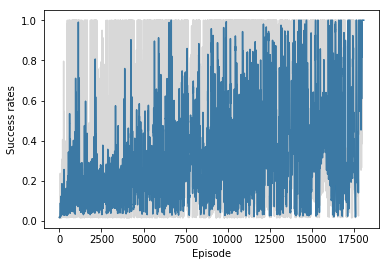

In [28]:
eps, arr = np.array(rates_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Success rates')

Text(0,0.5,'Success rates')

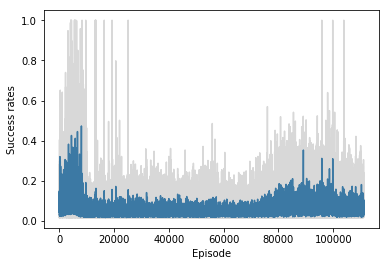

In [43]:
eps, arr = np.array(rates_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Success rates')

Text(0,0.5,'Success rates')

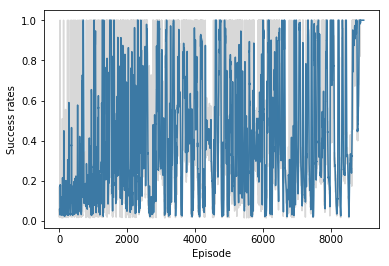

In [36]:
eps, arr = np.array(rates_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Success rates')

Text(0,0.5,'Total rewards')

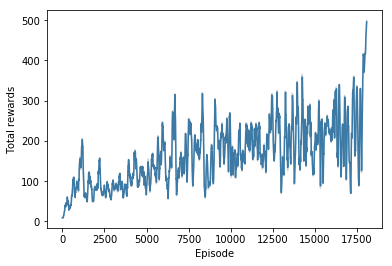

In [33]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

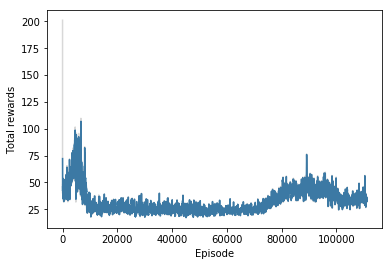

In [44]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

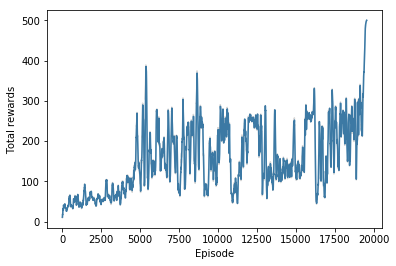

In [41]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

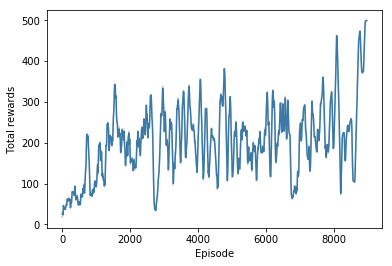

In [39]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

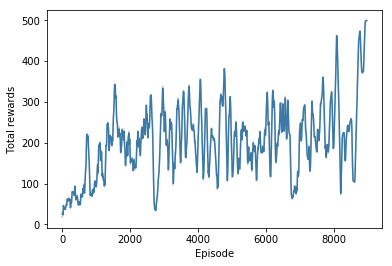

In [38]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

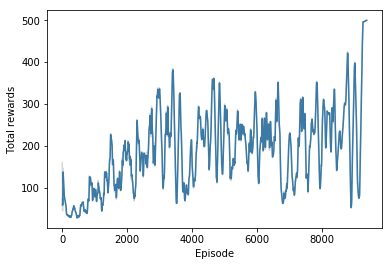

In [30]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

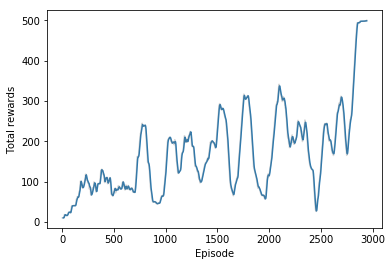

In [221]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

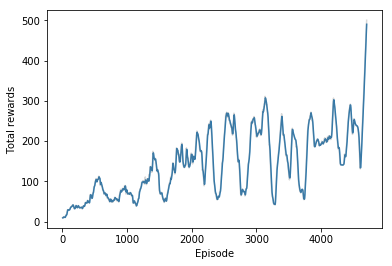

In [216]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

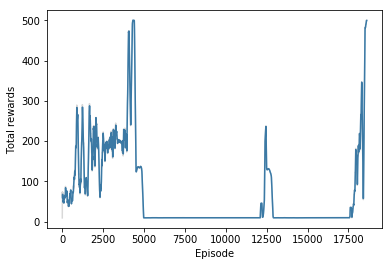

In [203]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

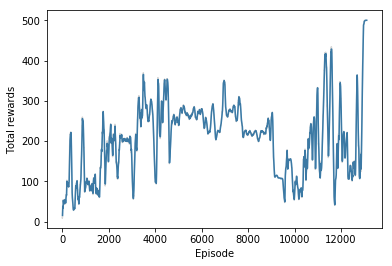

In [188]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

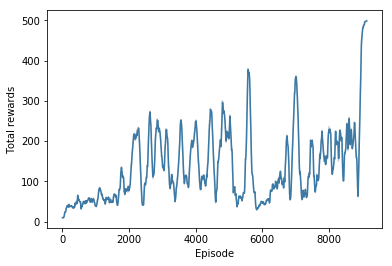

In [165]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

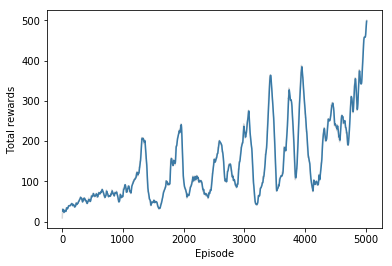

In [126]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

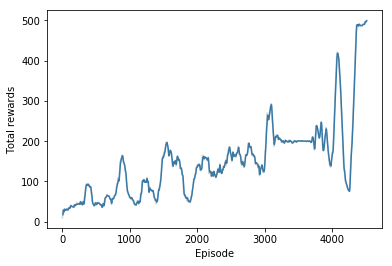

In [109]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

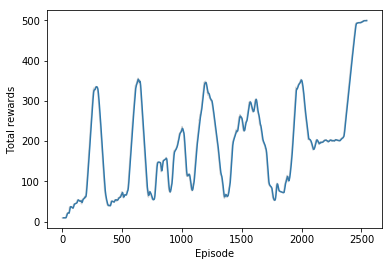

In [84]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

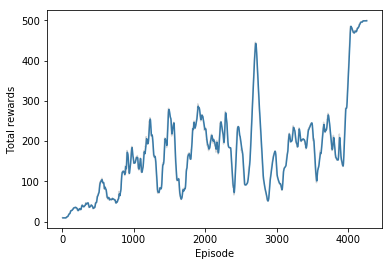

In [64]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

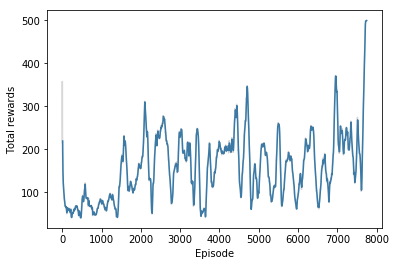

In [44]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

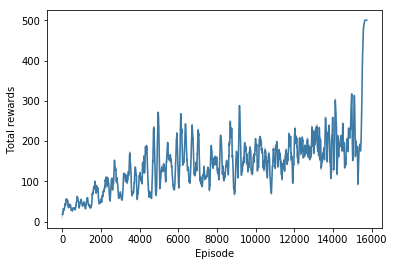

In [29]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

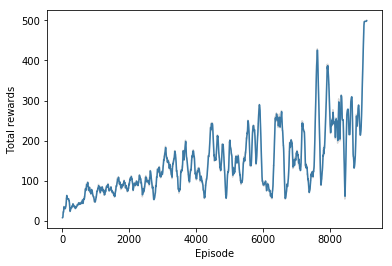

In [29]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

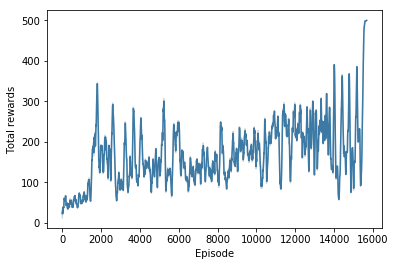

In [46]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

Text(0,0.5,'Total rewards')

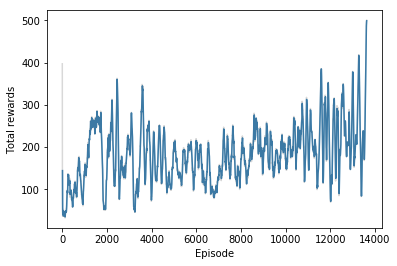

In [32]:
eps, arr = np.array(rewards_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('Total rewards')

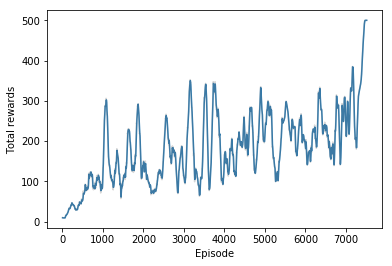

Text(0,0.5,'G losses')

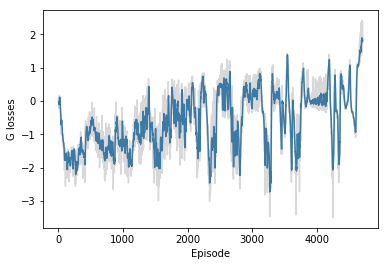

In [215]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

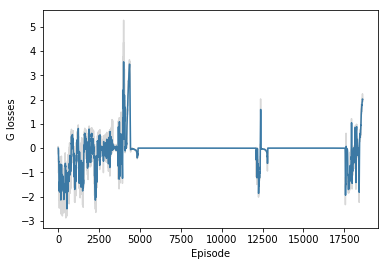

In [204]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

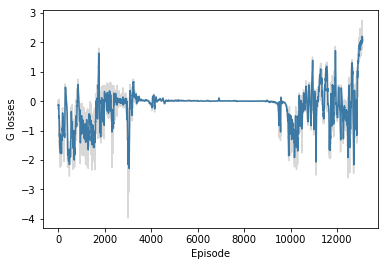

In [189]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

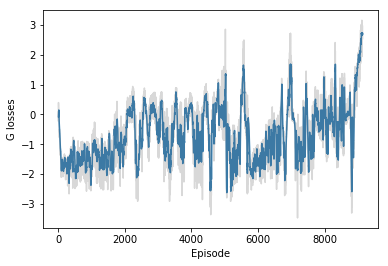

In [166]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

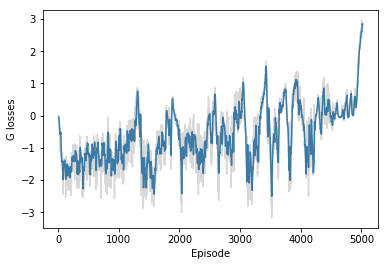

In [129]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

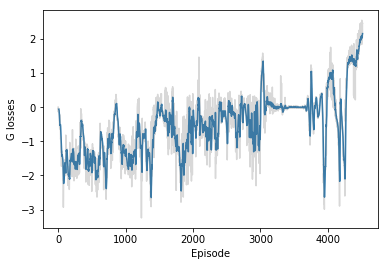

In [110]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

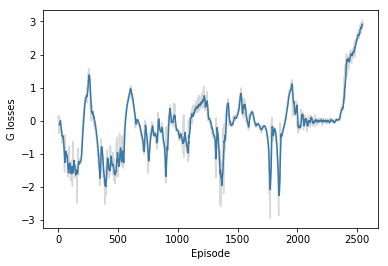

In [85]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

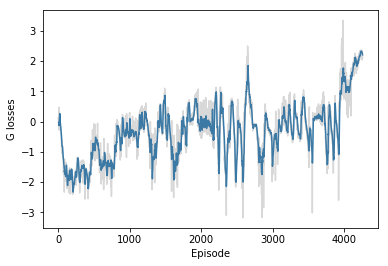

In [65]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

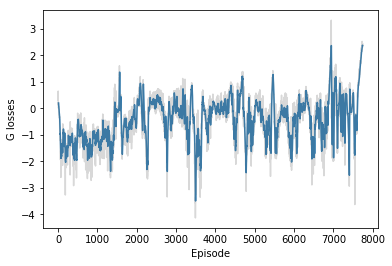

In [45]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

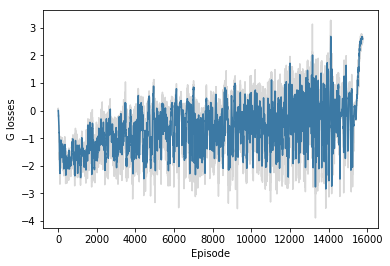

In [30]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

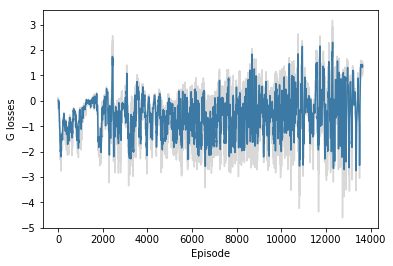

In [33]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

Text(0,0.5,'G losses')

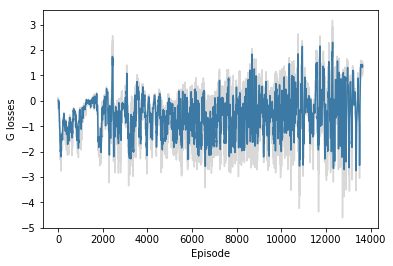

In [30]:
eps, arr = np.array(g_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('G losses')

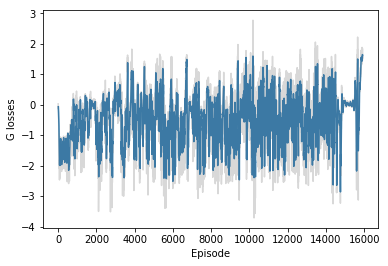
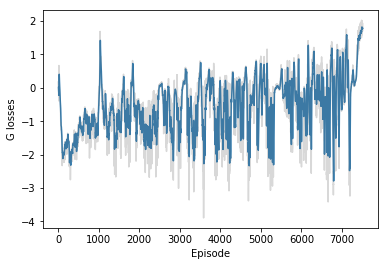

Text(0,0.5,'D losses')

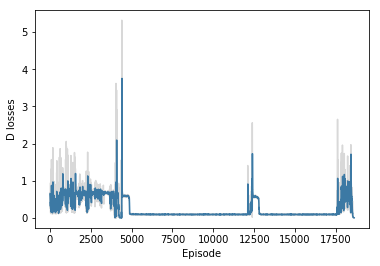

In [205]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

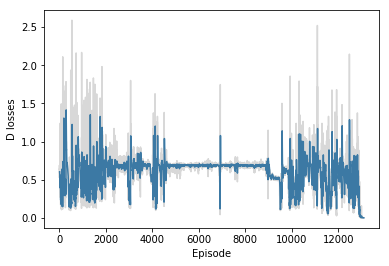

In [190]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

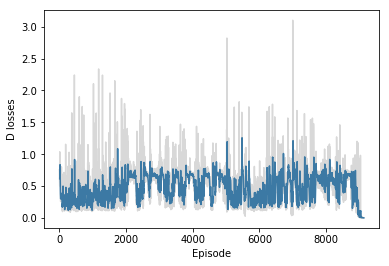

In [167]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

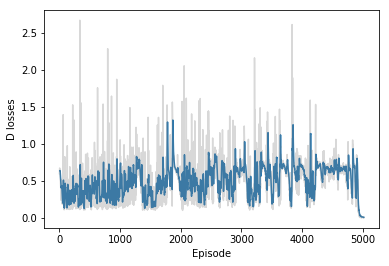

In [130]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

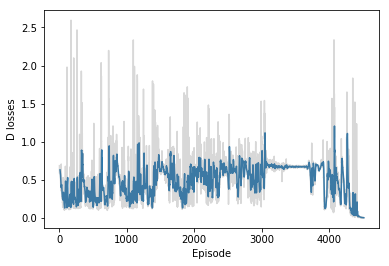

In [111]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

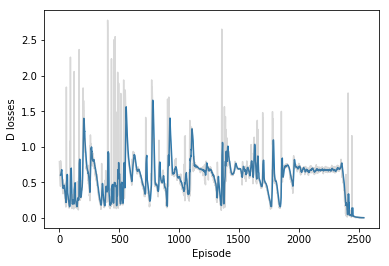

In [86]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

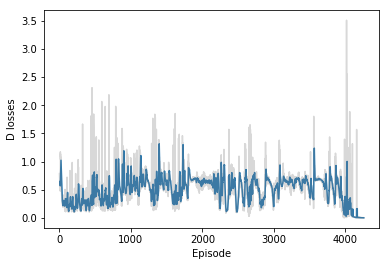

In [66]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

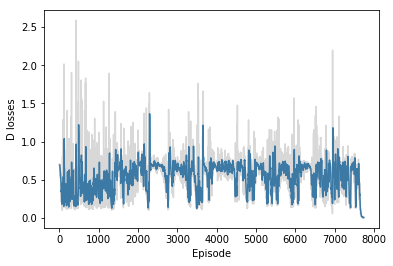

In [46]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

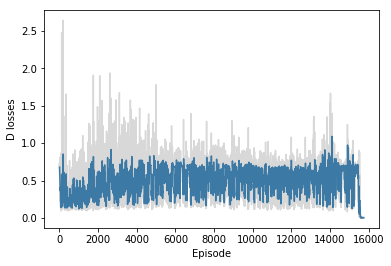

In [31]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

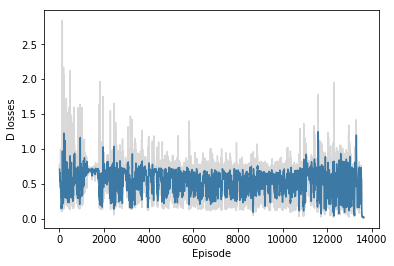

In [34]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

Text(0,0.5,'D losses')

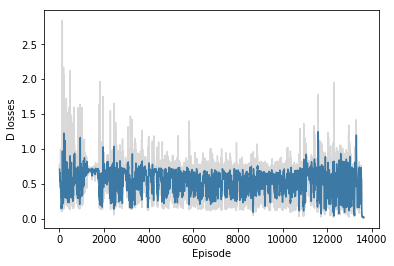

In [31]:
eps, arr = np.array(d_loss_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses')

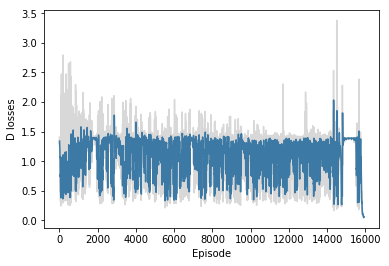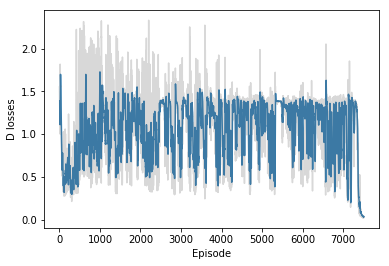

Text(0,0.5,'D losses R')

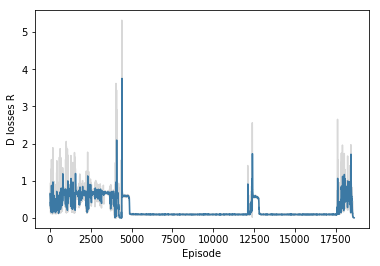

In [207]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

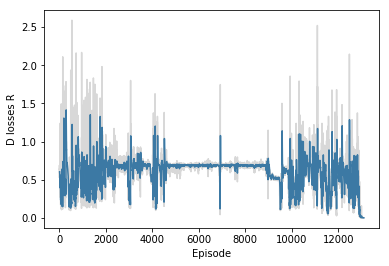

In [191]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

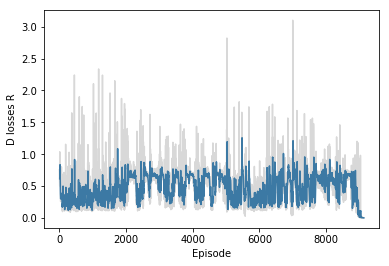

In [168]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

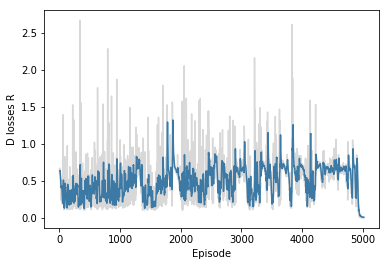

In [131]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

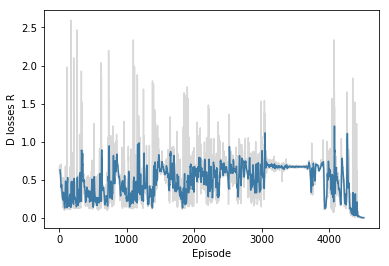

In [112]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

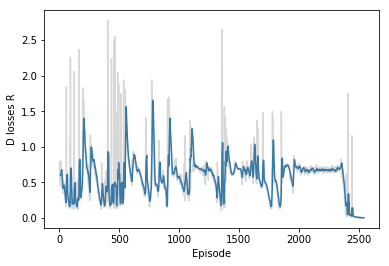

In [87]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

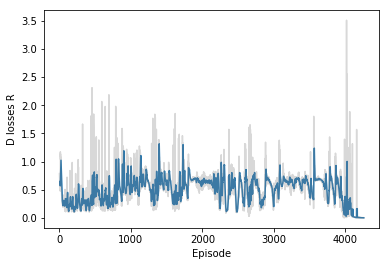

In [67]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

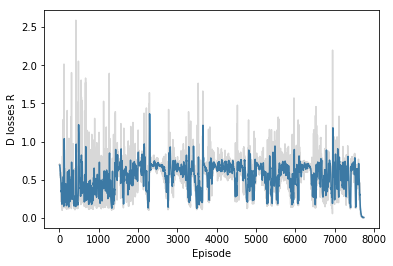

In [47]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

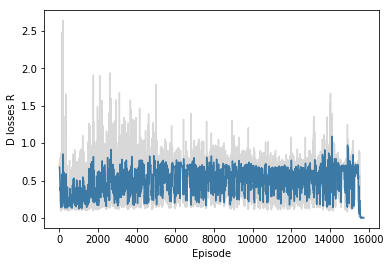

In [32]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

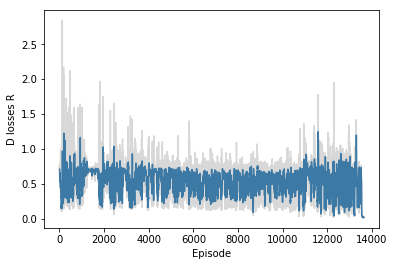

In [35]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses R')

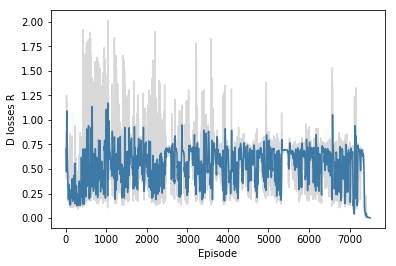

In [32]:
eps, arr = np.array(d_lossR_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses R')

Text(0,0.5,'D losses Q')

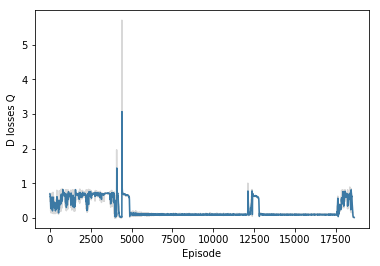

In [208]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

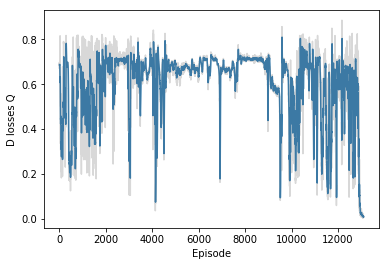

In [192]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

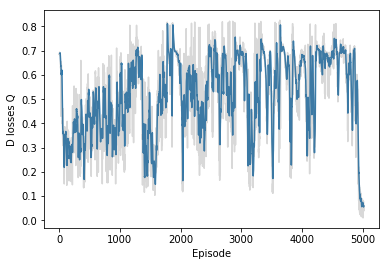

In [132]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

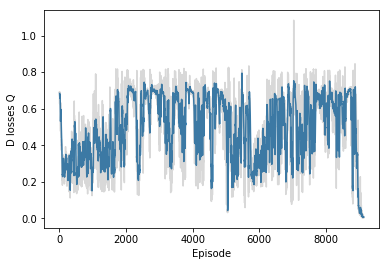

In [169]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

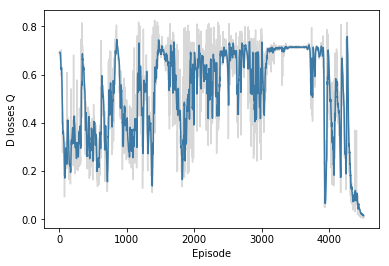

In [113]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

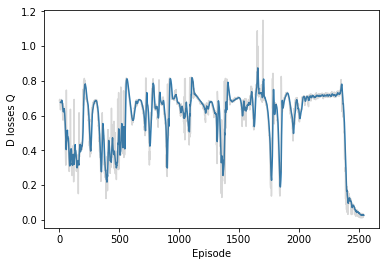

In [88]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

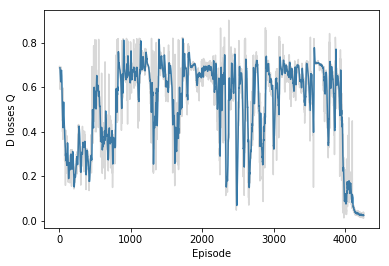

In [68]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

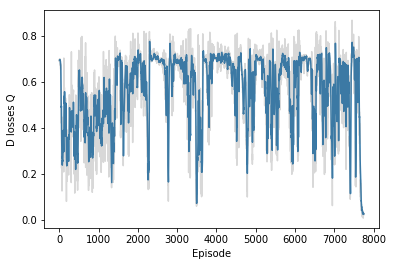

In [48]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

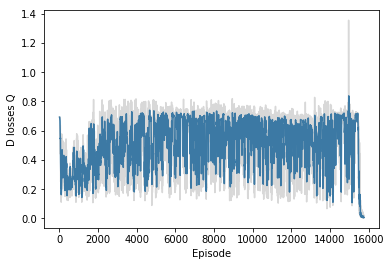

In [33]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

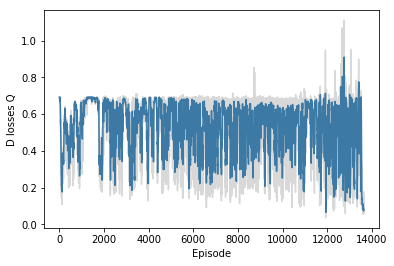

In [36]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

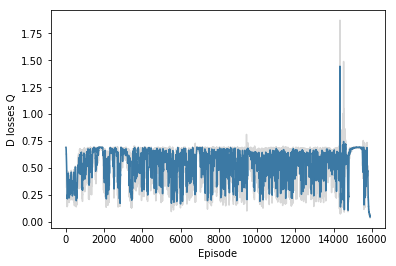

In [33]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

Text(0,0.5,'D losses Q')

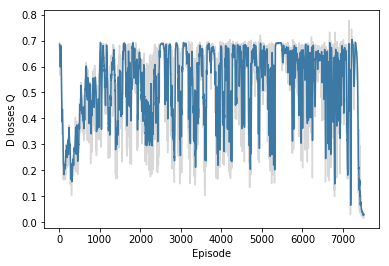

In [33]:
eps, arr = np.array(d_lossQ_list).T
smoothed_arr = running_mean(arr, 10)
plt.plot(eps[-len(smoothed_arr):], smoothed_arr)
plt.plot(eps, arr, color='grey', alpha=0.3)
plt.xlabel('Episode')
plt.ylabel('D losses Q')

## Testing

Let's checkout how our trained agent plays the game.

In [34]:
import gym
env = gym.make('CartPole-v0')
env = gym.make('CartPole-v1')
# env = gym.make('Acrobot-v1')
# env = gym.make('MountainCar-v0')
# env = gym.make('Pendulum-v0')
# env = gym.make('Blackjack-v0')
# env = gym.make('FrozenLake-v0')
# env = gym.make('AirRaid-ram-v0')
# env = gym.make('AirRaid-v0')
# env = gym.make('BipedalWalker-v2')
# env = gym.make('Copy-v0')
# env = gym.make('CarRacing-v0')
# env = gym.make('Ant-v2') #mujoco
# env = gym.make('FetchPickAndPlace-v1') # mujoco required!

with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    #saver.restore(sess, 'checkpoints/model.ckpt')    
    saver.restore(sess, tf.train.latest_checkpoint('checkpoints'))
    
    # Episodes/epochs
    for _ in range(100):
    #while True:
        state = env.reset()
        total_reward = 0

        # Steps/batches
        #for _ in range(111111111111111111):
        while True:
            env.render()
            action_logits = sess.run(model.actions_logits, feed_dict={model.states: np.reshape(state, [1, -1])})
            action = np.argmax(action_logits)
            state, reward, done, _ = env.step(action)
            total_reward += reward
            if done:
                break
        # Print and break condition
        print('total_reward: {}'.format(total_reward))
        # if total_reward == 500:
        #     break
                
# Closing the env
env.close()

WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.
WARN: gym.spaces.Box autodetected dtype as <class 'numpy.float32'>. Please provide explicit dtype.
INFO:tensorflow:Restoring parameters from checkpoints/model.ckpt


/home/arasdar/anaconda3/envs/env/lib/python3.6/site-packages/gym/__init__.py:22: UserWarning: DEPRECATION WARNING: to improve load times, gym no longer automatically loads gym.spaces. Please run "import gym.spaces" to load gym.spaces on your own. This warning will turn into an error in a future version of gym.
  warnings.warn('DEPRECATION WARNING: to improve load times, gym no longer automatically loads gym.spaces. Please run "import gym.spaces" to load gym.spaces on your own. This warning will turn into an error in a future version of gym.')


total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0
total_reward: 500.0


## Extending this

So, Cart-Pole is a pretty simple game. However, the same model can be used to train an agent to play something much more complicated like Pong or Space Invaders. Instead of a state like we're using here though, you'd want to use convolutional layers to get the state from the screen images.

![Deep Q-Learning Atari](assets/atari-network.png)

I'll leave it as a challenge for you to use deep Q-learning to train an agent to play Atari games. Here's the original paper which will get you started: http://www.davidqiu.com:8888/research/nature14236.pdf.